In [4]:
import pypsa
from matplotlib.ticker import ScalarFormatter
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
import xarray as xr
import statsmodels.api as sm
from scipy.fft import fft, fftfreq
import seaborn as sns
import pandas as pd 
import matplotlib.ticker as ticker
import geopandas as gpd
import numpy as np
import pickle
from math import pi
import cartopy.crs as ccrs
from pyproj import Geod
from regiondefinitions import regions_dic, links_dic
from data_import import syntheticdemand_gis, historic_demand, vre_gen_potential_atlite_granularity_total, region_area
from interconnectors import efficiency_link, calculate_distance

import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning, message="The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.")

In [11]:
# Parameter selection
scenario_year = 2050# Parameter selection input 
scenario_year = 2050
era_year = 2023
density = {}
density['wind'] = 10 # W/m2
density['pv'] = 45 # W/m2
land_use_availability = {}
land_use_availability['wind'] = 0.08
land_use_availability['pv'] = 0.05
SSP_scenario = 'ssp1-26'

# Parameter selection grid
cost_capacity_wind = 1
cost_capacity_pv = 1
cost_generation_wind = 1
cost_generation_pv = 1
cost_transmission = 1e-4
cost_curtailment = 0

# Cable selection
cable_capacity = 1200 # MW
cable_voltage = 1100 # kV
cable_resistivity = 0.01286 # ohms/km
converter_losses = 0.015 # [-]

# DATA PATHS
synthetic_demand_path = "/Users/frederickivens/Documents/MPhil_Energy_Technologies/Dissertation_Project/Codes/data/demand"
historic_demand_path = '/Users/frederickivens/Documents/MPhil_Energy_Technologies/Dissertation_Project/Codes/data/demand/total_hourly_demand_europe_node_9_utc.csv'

# COLOUR PALETTE
unique_regions = list(regions_dic.keys())
base_palette = sns.color_palette("Set2", 8)
extended_palette = base_palette + sns.color_palette("Set3", 8)
final_palette = extended_palette[:len(unique_regions)]
region_colors = {region: color for region, color in zip(unique_regions, final_palette)}
region_colors['ups'] = sns.color_palette("colorblind")[1] 

# Plotting 
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'axes.edgecolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black'
})

In [12]:
run_this_cell = True
if run_this_cell:
    # DISTANCES BETWEEN NODES
    for key, value in links_dic.items():
        value["length"] = calculate_distance(value["bus0"][1], value["bus1"][1])

    # EFFICIENCY OF INTERCONNECTORS
    for key, value in links_dic.items():
        value["efficiency"] = efficiency_link(cable_capacity, cable_voltage, cable_resistivity, value["length"]) - converter_losses

    # SYNTHETIC -> excludes Europe
    load_profile_dic = {}
    for key, value in regions_dic.items():
        load_profile_dic[key] = {}
        if key != "europe":
            load_profile_dic[key]["load"] = syntheticdemand_gis(synthetic_demand_path, key, SSP_scenario) # MW

    # HISTORIC -> includes Europe and USA
    demand_mult_ssp1_26_oecd = 1.36
    load_profile_dic["europe"]["load"] = historic_demand(historic_demand_path, 2017, demand_mult_ssp1_26_oecd)

    # RENEWABLE PROFILES
    res_potential_dic = {}
    for region, value in regions_dic.items():
        res_potential_dic[region] = {}
        for carrier in ['wind', 'pv']:
            cfs, caps = vre_gen_potential_atlite_granularity_total(region, carrier, era_year, 'total', density[carrier], land_use_availability[carrier])
            res_potential_dic[region][f'cfs_{carrier}'] = cfs
            res_potential_dic[region][f'cap_{carrier}'] = caps
            res_potential_dic[region][f'{carrier}'] = caps * cfs

# Sensitivity Analysis CapEx vs OpEx

In [8]:
# Dic initiation
sensitivity_cap_op_cost = {}
costs = np.logspace(0, 6, 7)
for cap_cost in costs:
    for op_cost in costs:
        comb_key = f'cap_{cap_cost}_op_{op_cost}'
        # Parameter selection
        cost_capacity_wind = cap_cost
        cost_capacity_pv = cap_cost
        cost_generation_wind = op_cost
        cost_generation_pv = op_cost
        cost_transmission = 1e-4
        cost_curtailment = 0

        # Initialise the network
        n = pypsa.Network() 
        snapshots = pd.date_range(start=f"{scenario_year}-01-01 00:00:00", end=f"{scenario_year}-12-31 23:00:00", freq="h")
        n.set_snapshots(snapshots)

        # Loop over the dictionary to add the buses
        for key, value in regions_dic.items():
            n.add(class_name = "Bus", name = key, carrier = "DC", x = value["coordinates"][0] , y = value["coordinates"][1]) 
            
        # Loop over the dictionary to add the links 
        for key, value in links_dic.items():
            n.add(class_name="Link", name=f'{value["name"]}_0', bus0=value["bus0"][1], bus1=value["bus1"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)
            n.add(class_name="Link", name=f'{value["name"]}_1', bus0=value["bus1"][1], bus1=value["bus0"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)

        # Loop over the dictionary to add the renewable profiles --> these are the renewable potential generated with Atlite
        for key, value in res_potential_dic.items():
            n.add(class_name="Generator", name=f'wind_{key}', type="Wind", bus=key, p_nom_extendable = True, p_nom_max=value['cap_wind'], p_max_pu=value["cfs_wind"][snapshots],p_min_pu=value["cfs_wind"][snapshots], capital_cost=cost_capacity_wind, marginal_cost=cost_generation_wind)
            n.add(class_name="Generator", name=f'pv_{key}', type="PV", bus=key, p_nom_extendable = True, p_nom_max=value['cap_pv'], p_max_pu=value["cfs_pv"][snapshots],p_min_pu=value["cfs_pv"][snapshots],capital_cost=cost_capacity_pv, marginal_cost=cost_generation_pv)
            n.add(class_name="Generator", name=f'curtailment_{key}', type="Curtailment", bus=key, p_nom_extendable=True, marginal_cost=cost_curtailment, sign=-1)

        # Loop over the dictionary to add the demand profiles --> these are the demand profiles for each region
        for key, value in load_profile_dic.items():
            n.add(class_name="Load", name=f"load_{key}", bus=key, p_set=value["load"][snapshots])

        m = n.optimize.create_model();

        n.optimize(solver_name='gurobi')
        total_annual_wind = 0
        total_annual_pv = 0
        for key, value in regions_dic.items(): # Annual (total) values
            for carrier in ["pv", "wind"]: 
                regions_dic[key][f"{carrier}_installed"] = n.generators_t.p[f"{carrier}_{key}"].max() * 1e-3 # GW; Installed capacities for each node 
                regions_dic[key][f"total_{carrier}_yearly"] = n.generators_t.p[f"{carrier}_{key}"].sum(axis=0) * 1e-3 # GWh; Total energy generated at each node 
            
            regions_dic[key][f"total_curtailment_yearly"] = n.generators_t.p[f"curtailment_{key}"].sum(axis=0) * 1e-3 # GWh; Curtailment at each node 
            regions_dic[key][f"total_load_yearly"] = n.loads_t.p[f"load_{key}"].sum(axis=0) * 1e-3 # GWh
            total_annual_wind += value["total_wind_yearly"]
            total_annual_pv += value["total_pv_yearly"]
        total_annual_gen = total_annual_wind + total_annual_pv
        wind_share = total_annual_wind / total_annual_gen
        pv_share = total_annual_pv / total_annual_gen

        # Store hourly losses for each link in dictionary
        for key, value in links_dic.items():
            p0_0, p1_0 = n.links_t.p0[f'{value["name"]}_0'], n.links_t.p1[f'{value["name"]}_0']
            p0_1, p1_1 = n.links_t.p0[f'{value["name"]}_1'], n.links_t.p1[f'{value["name"]}_1']
            abs_losses = abs(p0_0 + p1_0) + abs(p0_1 + p1_1)
            p_trans = p0_0 + p0_1
            value["hourly_p_trans"] = p_trans
            value["hourly_abs_losses"] = abs_losses

        # Sum the transmission and losses of the links
        total_hourly_abs_losses = pd.Series(0, index=n.snapshots)
        total_hourly_p_trans = pd.Series(0, index=n.snapshots)
        for key, value in links_dic.items():
            total_hourly_abs_losses += value["hourly_abs_losses"]
            total_hourly_p_trans += value["hourly_p_trans"]

        # Absolute losses
        total_daily_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.date).sum()
        total_monthly_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.to_period('M')).sum()
        total_annual_abs_losses = total_hourly_abs_losses.sum()

        # Power transmitted
        total_daily_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum()
        total_monthly_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum()
        total_annual_p_trans = total_hourly_p_trans.sum()

        # Calculate inflow, outflow, and 
        for region_key, region_value in regions_dic.items():
            inflow = 0
            outflow = 0
            inflow_series = pd.Series(0, index=n.snapshots)
            outflow_series = pd.Series(0, index=n.snapshots)
            for link_key, link_value in links_dic.items():
                if region_value["bus"] == link_value["bus0"][0]: 
                    p0_0 = n.links_t.p0[f"{link_value["name"]}_0"] # link from region_value["bus"] to bus1: negative --> outfow at region_value["bus"]
                    p1_1 = n.links_t.p1[f"{link_value["name"]}_1"] # link from bus1 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_0 = abs(sum(p0_0)) 
                    sum_p1_1 = abs(sum(p1_1))
                    outflow += sum_p0_0
                    inflow += sum_p1_1
                    outflow_series += p0_0.abs()
                    inflow_series += p1_1.abs()
                elif region_value["bus"] == link_value["bus1"][0]:
                    p0_1 = n.links_t.p0[f"{link_value["name"]}_1"] # Link from region_value["bus"] to bus0: negative --> outfow at region_value["bus"]
                    p1_0 = n.links_t.p1[f"{link_value["name"]}_0"] # link from bus0 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_1 = sum(p0_1.abs())
                    sum_p1_0 = sum(p1_0.abs())
                    outflow += sum_p0_1
                    inflow += sum_p1_0
                    outflow_series += p0_1.abs()
                    inflow_series += p1_0.abs()
            netflow = (outflow - inflow) 
            netflow_series = (outflow_series - inflow_series) 
            region_value["inflow"] = inflow * 1e-3 # GWh
            region_value["outflow"] = outflow * 1e-3 # GWh
            region_value["inflow_series"] = inflow_series * 1e-3 # GW
            region_value["outflow_series"] = outflow_series * 1e-3 # GW
            region_value["netflow"] = netflow * 1e-3 # GWh
            region_value["netflow_series"] = netflow_series * 1e-3 # GW
            region_value["actualflow"] = (outflow_series.abs() - inflow_series.abs()) * 1e-3 # GW
            region_value["actualflow"] = np.where(region_value["actualflow"] < 0, 0, region_value["actualflow"])
            region_value['total_actualflow'] = region_value["actualflow"].sum()
    
        sensitivity_cap_op_cost[comb_key] = {}
        sensitivity_cap_op_cost[comb_key]['annual_gen'] = total_annual_gen # GWh
        sensitivity_cap_op_cost[comb_key]['wind_pv_share'] = (wind_share, pv_share)
        sensitivity_cap_op_cost[comb_key]['total_trans'] = total_annual_p_trans * 1e-3 # GWh
        sensitivity_cap_op_cost[comb_key]['netflow_north_asia'] = regions_dic['north_asia']['netflow']



            

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.54it/s]
INFO:linopy.io: Writing time: 4.93s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ml8ozg0q.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ml8ozg0q.lp


Reading time = 1.87 seconds


INFO:gurobipy:Reading time = 1.87 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.92s


INFO:gurobipy:Presolve time: 0.92s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 15.42 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 15.42 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                19s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                19s


       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                19s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                19s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 226018 iterations and 23.92 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 23.92 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.52it/s]
INFO:linopy.io: Writing time: 4.99s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-p1j0bl7k.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-p1j0bl7k.lp


Reading time = 1.96 seconds


INFO:gurobipy:Reading time = 1.96 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x6a4b5b47


INFO:gurobipy:Model fingerprint: 0x6a4b5b47


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+01]


INFO:gurobipy:  Objective range  [1e-04, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.12s


INFO:gurobipy:Presolve time: 1.12s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73226978e+14 -1.60510809e+14  5.49e+09 1.61e+01  1.14e+13     2s


INFO:gurobipy:   0   8.73226978e+14 -1.60510809e+14  5.49e+09 1.61e+01  1.14e+13     2s


   1   1.25553941e+15 -8.43369235e+14  9.76e+09 1.02e+03  6.24e+12     2s


INFO:gurobipy:   1   1.25553941e+15 -8.43369235e+14  9.76e+09 1.02e+03  6.24e+12     2s


   2   7.95134858e+14 -1.18006967e+15  8.31e+09 5.67e+02  3.99e+12     2s


INFO:gurobipy:   2   7.95134858e+14 -1.18006967e+15  8.31e+09 5.67e+02  3.99e+12     2s


   3   3.42995266e+14 -1.37147476e+15  2.77e+09 2.70e+02  1.76e+12     2s


INFO:gurobipy:   3   3.42995266e+14 -1.37147476e+15  2.77e+09 2.70e+02  1.76e+12     2s


   4   1.81523145e+14 -1.92939465e+15  1.29e+09 7.95e+01  7.36e+11     2s


INFO:gurobipy:   4   1.81523145e+14 -1.92939465e+15  1.29e+09 7.95e+01  7.36e+11     2s


   5   6.52346758e+13 -2.59374772e+15  4.23e+08 1.86e+01  2.37e+11     2s


INFO:gurobipy:   5   6.52346758e+13 -2.59374772e+15  4.23e+08 1.86e+01  2.37e+11     2s


   6   2.42482314e+13 -2.87223462e+15  1.26e+08 4.75e+00  7.32e+10     2s


INFO:gurobipy:   6   2.42482314e+13 -2.87223462e+15  1.26e+08 4.75e+00  7.32e+10     2s


   7   1.25496768e+13 -2.65575951e+15  4.22e+07 1.19e+00  2.57e+10     2s


INFO:gurobipy:   7   1.25496768e+13 -2.65575951e+15  4.22e+07 1.19e+00  2.57e+10     2s


   8   7.00081101e+12 -1.89290175e+15  2.99e+06 3.24e-01  5.17e+09     2s


INFO:gurobipy:   8   7.00081101e+12 -1.89290175e+15  2.99e+06 3.24e-01  5.17e+09     2s


   9   6.56548692e+12 -1.66281916e+14  0.00e+00 1.22e-02  3.74e+08     2s


INFO:gurobipy:   9   6.56548692e+12 -1.66281916e+14  0.00e+00 1.22e-02  3.74e+08     2s


  10   6.54039684e+12 -6.87379926e+11  0.00e+00 5.34e-04  1.56e+07     2s


INFO:gurobipy:  10   6.54039684e+12 -6.87379926e+11  0.00e+00 5.34e-04  1.56e+07     2s


  11   6.26623582e+12 -6.52118875e+11  0.00e+00 5.59e-04  1.50e+07     3s


INFO:gurobipy:  11   6.26623582e+12 -6.52118875e+11  0.00e+00 5.59e-04  1.50e+07     3s


  12   5.90020623e+12 -2.53258450e+11  0.00e+00 8.17e-04  1.33e+07     3s


INFO:gurobipy:  12   5.90020623e+12 -2.53258450e+11  0.00e+00 8.17e-04  1.33e+07     3s


  13   4.77907749e+12 -1.72642978e+11  0.00e+00 1.37e-03  1.07e+07     3s


INFO:gurobipy:  13   4.77907749e+12 -1.72642978e+11  0.00e+00 1.37e-03  1.07e+07     3s


  14   3.84294361e+12  9.58648029e+10  0.00e+00 1.52e-03  8.08e+06     3s


INFO:gurobipy:  14   3.84294361e+12  9.58648029e+10  0.00e+00 1.52e-03  8.08e+06     3s


  15   2.23443478e+12  2.88558252e+11  0.00e+00 6.79e-04  4.19e+06     3s


INFO:gurobipy:  15   2.23443478e+12  2.88558252e+11  0.00e+00 6.79e-04  4.19e+06     3s


  16   1.86891418e+12  3.78420820e+11  0.00e+00 6.88e-04  3.21e+06     3s


INFO:gurobipy:  16   1.86891418e+12  3.78420820e+11  0.00e+00 6.88e-04  3.21e+06     3s


  17   1.45441740e+12  4.00368169e+11  0.00e+00 6.14e-04  2.27e+06     3s


INFO:gurobipy:  17   1.45441740e+12  4.00368169e+11  0.00e+00 6.14e-04  2.27e+06     3s


  18   1.14333392e+12  4.22246559e+11  0.00e+00 5.50e-04  1.55e+06     4s


INFO:gurobipy:  18   1.14333392e+12  4.22246559e+11  0.00e+00 5.50e-04  1.55e+06     4s


  19   1.00831235e+12  4.40661613e+11  0.00e+00 5.70e-04  1.22e+06     4s


INFO:gurobipy:  19   1.00831235e+12  4.40661613e+11  0.00e+00 5.70e-04  1.22e+06     4s


  20   8.17779162e+11  4.68508414e+11  0.00e+00 5.16e-04  7.52e+05     4s


INFO:gurobipy:  20   8.17779162e+11  4.68508414e+11  0.00e+00 5.16e-04  7.52e+05     4s


  21   7.99941788e+11  4.84047753e+11  0.00e+00 5.55e-04  6.80e+05     4s


INFO:gurobipy:  21   7.99941788e+11  4.84047753e+11  0.00e+00 5.55e-04  6.80e+05     4s


  22   7.87500078e+11  4.92140476e+11  0.00e+00 5.68e-04  6.36e+05     4s


INFO:gurobipy:  22   7.87500078e+11  4.92140476e+11  0.00e+00 5.68e-04  6.36e+05     4s


  23   7.44776462e+11  5.31694533e+11  0.00e+00 8.80e-04  4.59e+05     5s


INFO:gurobipy:  23   7.44776462e+11  5.31694533e+11  0.00e+00 8.80e-04  4.59e+05     5s


  24   7.30561207e+11  5.86676644e+11  0.00e+00 7.38e-04  3.10e+05     5s


INFO:gurobipy:  24   7.30561207e+11  5.86676644e+11  0.00e+00 7.38e-04  3.10e+05     5s


  25   7.18300165e+11  6.14991906e+11  0.00e+00 5.18e-04  2.22e+05     5s


INFO:gurobipy:  25   7.18300165e+11  6.14991906e+11  0.00e+00 5.18e-04  2.22e+05     5s


  26   7.12345881e+11  6.29364939e+11  0.00e+00 4.52e-04  1.79e+05     5s


INFO:gurobipy:  26   7.12345881e+11  6.29364939e+11  0.00e+00 4.52e-04  1.79e+05     5s


  27   7.10287378e+11  6.48052759e+11  0.00e+00 3.92e-04  1.34e+05     5s


INFO:gurobipy:  27   7.10287378e+11  6.48052759e+11  0.00e+00 3.92e-04  1.34e+05     5s


  28   7.09968888e+11  6.51317249e+11  0.00e+00 3.80e-04  1.26e+05     6s


INFO:gurobipy:  28   7.09968888e+11  6.51317249e+11  0.00e+00 3.80e-04  1.26e+05     6s


  29   7.09050803e+11  6.66407429e+11  0.00e+00 3.31e-04  9.18e+04     6s


INFO:gurobipy:  29   7.09050803e+11  6.66407429e+11  0.00e+00 3.31e-04  9.18e+04     6s


  30   7.08275480e+11  6.70564096e+11  0.00e+00 3.05e-04  8.11e+04     6s


INFO:gurobipy:  30   7.08275480e+11  6.70564096e+11  0.00e+00 3.05e-04  8.11e+04     6s


  31   7.07769238e+11  6.84513493e+11  0.00e+00 2.23e-04  5.00e+04     6s


INFO:gurobipy:  31   7.07769238e+11  6.84513493e+11  0.00e+00 2.23e-04  5.00e+04     6s


  32   7.07132305e+11  6.91894455e+11  0.00e+00 1.53e-04  3.28e+04     7s


INFO:gurobipy:  32   7.07132305e+11  6.91894455e+11  0.00e+00 1.53e-04  3.28e+04     7s


  33   7.06872280e+11  6.96343507e+11  0.00e+00 1.10e-04  2.27e+04     7s


INFO:gurobipy:  33   7.06872280e+11  6.96343507e+11  0.00e+00 1.10e-04  2.27e+04     7s


  34   7.06675920e+11  7.01473313e+11  0.00e+00 5.59e-05  1.12e+04     7s


INFO:gurobipy:  34   7.06675920e+11  7.01473313e+11  0.00e+00 5.59e-05  1.12e+04     7s


  35   7.06564366e+11  7.03896803e+11  0.00e+00 2.90e-05  5.74e+03     7s


INFO:gurobipy:  35   7.06564366e+11  7.03896803e+11  0.00e+00 2.90e-05  5.74e+03     7s


  36   7.06543062e+11  7.06062768e+11  0.00e+00 4.85e-06  1.03e+03     7s


INFO:gurobipy:  36   7.06543062e+11  7.06062768e+11  0.00e+00 4.85e-06  1.03e+03     7s


  37   7.06535496e+11  7.06478643e+11  0.00e+00 8.56e-07  1.22e+02     7s


INFO:gurobipy:  37   7.06535496e+11  7.06478643e+11  0.00e+00 8.56e-07  1.22e+02     7s


  38   7.06531426e+11  7.06512975e+11  0.00e+00 3.03e-06  3.88e+01     8s


INFO:gurobipy:  38   7.06531426e+11  7.06512975e+11  0.00e+00 3.03e-06  3.88e+01     8s


  39   7.06526212e+11  7.06516689e+11  0.00e+00 3.28e-06  1.93e+01     8s


INFO:gurobipy:  39   7.06526212e+11  7.06516689e+11  0.00e+00 3.28e-06  1.93e+01     8s


  40   7.06523087e+11  7.06518716e+11  0.00e+00 3.44e-06  8.34e+00     8s


INFO:gurobipy:  40   7.06523087e+11  7.06518716e+11  0.00e+00 3.44e-06  8.34e+00     8s


  41   7.06521830e+11  7.06519280e+11  0.00e+00 3.00e-06  4.53e+00     8s


INFO:gurobipy:  41   7.06521830e+11  7.06519280e+11  0.00e+00 3.00e-06  4.53e+00     8s


  42   7.06521147e+11  7.06519673e+11  0.00e+00 2.79e-06  2.30e+00     8s


INFO:gurobipy:  42   7.06521147e+11  7.06519673e+11  0.00e+00 2.79e-06  2.30e+00     8s


  43   7.06520831e+11  7.06519849e+11  0.00e+00 2.83e-06  1.31e+00     8s


INFO:gurobipy:  43   7.06520831e+11  7.06519849e+11  0.00e+00 2.83e-06  1.31e+00     8s


  44   7.06520682e+11  7.06519927e+11  0.00e+00 2.86e-06  8.67e-01     9s


INFO:gurobipy:  44   7.06520682e+11  7.06519927e+11  0.00e+00 2.86e-06  8.67e-01     9s


  45   7.06520587e+11  7.06519976e+11  0.00e+00 2.87e-06  5.90e-01     9s


INFO:gurobipy:  45   7.06520587e+11  7.06519976e+11  0.00e+00 2.87e-06  5.90e-01     9s


  46   7.06520557e+11  7.06520005e+11  0.00e+00 2.88e-06  4.82e-01     9s


INFO:gurobipy:  46   7.06520557e+11  7.06520005e+11  0.00e+00 2.88e-06  4.82e-01     9s


  47   7.06520513e+11  7.06520021e+11  0.00e+00 2.88e-06  3.72e-01     9s


INFO:gurobipy:  47   7.06520513e+11  7.06520021e+11  0.00e+00 2.88e-06  3.72e-01     9s


  48   7.06520461e+11  7.06520040e+11  0.00e+00 2.88e-06  2.46e-01     9s


INFO:gurobipy:  48   7.06520461e+11  7.06520040e+11  0.00e+00 2.88e-06  2.46e-01     9s


  49   7.06520422e+11  7.06520054e+11  0.00e+00 2.87e-06  1.56e-01    10s


INFO:gurobipy:  49   7.06520422e+11  7.06520054e+11  0.00e+00 2.87e-06  1.56e-01    10s


  50   7.06520404e+11  7.06520062e+11  0.00e+00 2.84e-06  1.15e-01    10s


INFO:gurobipy:  50   7.06520404e+11  7.06520062e+11  0.00e+00 2.84e-06  1.15e-01    10s


  51   7.06520394e+11  7.06520067e+11  0.00e+00 2.78e-06  9.13e-02    10s


INFO:gurobipy:  51   7.06520394e+11  7.06520067e+11  0.00e+00 2.78e-06  9.13e-02    10s


  52   7.06520379e+11  7.06520068e+11  0.00e+00 2.49e-06  6.71e-02    10s


INFO:gurobipy:  52   7.06520379e+11  7.06520068e+11  0.00e+00 2.49e-06  6.71e-02    10s


  53   7.06520373e+11  7.06520071e+11  0.00e+00 2.43e-06  5.40e-02    11s


INFO:gurobipy:  53   7.06520373e+11  7.06520071e+11  0.00e+00 2.43e-06  5.40e-02    11s


  54   7.06520367e+11  7.06520071e+11  0.00e+00 2.43e-06  4.45e-02    11s


INFO:gurobipy:  54   7.06520367e+11  7.06520071e+11  0.00e+00 2.43e-06  4.45e-02    11s


  55   7.06520356e+11  7.06520073e+11  0.00e+00 2.42e-06  2.79e-02    11s


INFO:gurobipy:  55   7.06520356e+11  7.06520073e+11  0.00e+00 2.42e-06  2.79e-02    11s


  56   7.06520351e+11  7.06520074e+11  0.00e+00 2.31e-06  2.09e-02    11s


INFO:gurobipy:  56   7.06520351e+11  7.06520074e+11  0.00e+00 2.31e-06  2.09e-02    11s


  57   7.06520347e+11  7.06520074e+11  0.00e+00 2.31e-06  1.48e-02    11s


INFO:gurobipy:  57   7.06520347e+11  7.06520074e+11  0.00e+00 2.31e-06  1.48e-02    11s


INFO:gurobipy:


Barrier solved model in 57 iterations and 11.47 seconds (12.02 work units)


INFO:gurobipy:Barrier solved model in 57 iterations and 11.47 seconds (12.02 work units)


Optimal objective 7.06520347e+11


INFO:gurobipy:Optimal objective 7.06520347e+11


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3187 DPushes remaining with DInf 2.1171762e-05                16s


INFO:gurobipy:    3187 DPushes remaining with DInf 2.1171762e-05                16s


       0 DPushes remaining with DInf 2.1171762e-05                16s


INFO:gurobipy:       0 DPushes remaining with DInf 2.1171762e-05                16s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  285209 PPushes remaining with PInf 7.7148260e-01                16s


INFO:gurobipy:  285209 PPushes remaining with PInf 7.7148260e-01                16s


       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2266343e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2266343e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  287728    7.0652074e+11   0.000000e+00   1.226634e+00     18s


INFO:gurobipy:  287728    7.0652074e+11   0.000000e+00   1.226634e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 434


INFO:gurobipy:Extra simplex iterations after uncrush: 434


  325321    7.0652011e+11   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  325321    7.0652011e+11   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 325321 iterations and 22.23 seconds (23.73 work units)


INFO:gurobipy:Solved in 325321 iterations and 22.23 seconds (23.73 work units)


Optimal objective  7.065201070e+11


INFO:gurobipy:Optimal objective  7.065201070e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.34it/s]
INFO:linopy.io: Writing time: 4.52s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1mqwmkd7.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1mqwmkd7.lp


Reading time = 1.89 seconds


INFO:gurobipy:Reading time = 1.89 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xb9a22959


INFO:gurobipy:Model fingerprint: 0xb9a22959


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+02]


INFO:gurobipy:  Objective range  [1e-04, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73123205e+15 -1.60501228e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   8.73123205e+15 -1.60501228e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.25541134e+16 -8.43318817e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.25541134e+16 -8.43318817e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   7.95037113e+15 -1.17999919e+16  8.31e+09 5.67e+03  3.99e+13     1s


INFO:gurobipy:   2   7.95037113e+15 -1.17999919e+16  8.31e+09 5.67e+03  3.99e+13     1s


   3   3.42926273e+15 -1.37139279e+16  2.77e+09 2.70e+03  1.76e+13     1s


INFO:gurobipy:   3   3.42926273e+15 -1.37139279e+16  2.77e+09 2.70e+03  1.76e+13     1s


   4   1.81473857e+15 -1.92927954e+16  1.29e+09 7.95e+02  7.36e+12     1s


INFO:gurobipy:   4   1.81473857e+15 -1.92927954e+16  1.29e+09 7.95e+02  7.36e+12     1s


   5   6.52149898e+14 -2.59359265e+16  4.23e+08 1.86e+02  2.37e+12     1s


INFO:gurobipy:   5   6.52149898e+14 -2.59359265e+16  4.23e+08 1.86e+02  2.37e+12     1s


   6   2.42413844e+14 -2.87206313e+16  1.26e+08 4.75e+01  7.31e+11     1s


INFO:gurobipy:   6   2.42413844e+14 -2.87206313e+16  1.26e+08 4.75e+01  7.31e+11     1s


   7   1.25467497e+14 -2.65560107e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.25467497e+14 -2.65560107e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   6.99976163e+13 -1.89278939e+16  2.99e+06 3.24e+00  5.17e+10     2s


INFO:gurobipy:   8   6.99976163e+13 -1.89278939e+16  2.99e+06 3.24e+00  5.17e+10     2s


   9   6.56459077e+13 -1.66274022e+15  0.00e+00 1.22e-01  3.74e+09     2s


INFO:gurobipy:   9   6.56459077e+13 -1.66274022e+15  0.00e+00 1.22e-01  3.74e+09     2s


  10   6.53950703e+13 -6.87295193e+12  0.00e+00 5.00e-03  1.56e+08     2s


INFO:gurobipy:  10   6.53950703e+13 -6.87295193e+12  0.00e+00 5.00e-03  1.56e+08     2s


  11   6.26586544e+13 -6.51768024e+12  0.00e+00 5.08e-03  1.50e+08     2s


INFO:gurobipy:  11   6.26586544e+13 -6.51768024e+12  0.00e+00 5.08e-03  1.50e+08     2s


  12   5.90125772e+13 -2.55604103e+12  0.00e+00 6.80e-03  1.33e+08     2s


INFO:gurobipy:  12   5.90125772e+13 -2.55604103e+12  0.00e+00 6.80e-03  1.33e+08     2s


  13   4.74252357e+13 -1.19671732e+12  0.00e+00 1.25e-02  1.05e+08     2s


INFO:gurobipy:  13   4.74252357e+13 -1.19671732e+12  0.00e+00 1.25e-02  1.05e+08     2s


  14   4.09369764e+13 -2.20864367e+11  0.00e+00 1.25e-02  8.89e+07     2s


INFO:gurobipy:  14   4.09369764e+13 -2.20864367e+11  0.00e+00 1.25e-02  8.89e+07     2s


  15   3.49494861e+13  2.47830777e+12  0.00e+00 9.67e-03  7.01e+07     2s


INFO:gurobipy:  15   3.49494861e+13  2.47830777e+12  0.00e+00 9.67e-03  7.01e+07     2s


  16   2.56939251e+13  3.07391404e+12  0.00e+00 1.05e-02  4.88e+07     2s


INFO:gurobipy:  16   2.56939251e+13  3.07391404e+12  0.00e+00 1.05e-02  4.88e+07     2s


  17   2.19289685e+13  3.50726308e+12  0.00e+00 1.02e-02  3.97e+07     2s


INFO:gurobipy:  17   2.19289685e+13  3.50726308e+12  0.00e+00 1.02e-02  3.97e+07     2s


  18   1.51318911e+13  3.79294934e+12  0.00e+00 8.58e-03  2.44e+07     2s


INFO:gurobipy:  18   1.51318911e+13  3.79294934e+12  0.00e+00 8.58e-03  2.44e+07     2s


  19   1.05813735e+13  4.31851499e+12  0.00e+00 7.81e-03  1.35e+07     2s


INFO:gurobipy:  19   1.05813735e+13  4.31851499e+12  0.00e+00 7.81e-03  1.35e+07     2s


  20   9.57942751e+12  4.44142191e+12  0.00e+00 7.24e-03  1.11e+07     3s


INFO:gurobipy:  20   9.57942751e+12  4.44142191e+12  0.00e+00 7.24e-03  1.11e+07     3s


  21   8.34925386e+12  4.94387248e+12  0.00e+00 4.04e-03  7.33e+06     3s


INFO:gurobipy:  21   8.34925386e+12  4.94387248e+12  0.00e+00 4.04e-03  7.33e+06     3s


  22   8.21427060e+12  5.00856927e+12  0.00e+00 3.67e-03  6.90e+06     3s


INFO:gurobipy:  22   8.21427060e+12  5.00856927e+12  0.00e+00 3.67e-03  6.90e+06     3s


  23   8.08438269e+12  5.07778566e+12  0.00e+00 3.56e-03  6.48e+06     3s


INFO:gurobipy:  23   8.08438269e+12  5.07778566e+12  0.00e+00 3.56e-03  6.48e+06     3s


  24   7.99723022e+12  5.15965906e+12  0.00e+00 3.38e-03  6.11e+06     3s


INFO:gurobipy:  24   7.99723022e+12  5.15965906e+12  0.00e+00 3.38e-03  6.11e+06     3s


  25   7.50847573e+12  5.37197141e+12  0.00e+00 2.88e-03  4.60e+06     3s


INFO:gurobipy:  25   7.50847573e+12  5.37197141e+12  0.00e+00 2.88e-03  4.60e+06     3s


  26   7.37395683e+12  5.55407351e+12  0.00e+00 2.49e-03  3.92e+06     3s


INFO:gurobipy:  26   7.37395683e+12  5.55407351e+12  0.00e+00 2.49e-03  3.92e+06     3s


  27   7.21677853e+12  5.85188700e+12  0.00e+00 1.82e-03  2.94e+06     3s


INFO:gurobipy:  27   7.21677853e+12  5.85188700e+12  0.00e+00 1.82e-03  2.94e+06     3s


  28   7.24119368e+12  6.15339506e+12  0.00e+00 1.38e-03  2.34e+06     3s


INFO:gurobipy:  28   7.24119368e+12  6.15339506e+12  0.00e+00 1.38e-03  2.34e+06     3s


  29   7.21414779e+12  6.18841664e+12  0.00e+00 1.32e-03  2.21e+06     4s


INFO:gurobipy:  29   7.21414779e+12  6.18841664e+12  0.00e+00 1.32e-03  2.21e+06     4s


  30   7.16602451e+12  6.26099994e+12  0.00e+00 1.21e-03  1.95e+06     4s


INFO:gurobipy:  30   7.16602451e+12  6.26099994e+12  0.00e+00 1.21e-03  1.95e+06     4s


  31   7.14236321e+12  6.29639352e+12  0.00e+00 1.16e-03  1.82e+06     4s


INFO:gurobipy:  31   7.14236321e+12  6.29639352e+12  0.00e+00 1.16e-03  1.82e+06     4s


  32   7.12595958e+12  6.54345649e+12  0.00e+00 8.17e-04  1.25e+06     4s


INFO:gurobipy:  32   7.12595958e+12  6.54345649e+12  0.00e+00 8.17e-04  1.25e+06     4s


  33   7.10985790e+12  6.64054990e+12  0.00e+00 6.71e-04  1.01e+06     4s


INFO:gurobipy:  33   7.10985790e+12  6.64054990e+12  0.00e+00 6.71e-04  1.01e+06     4s


  34   7.08433928e+12  6.95507785e+12  0.00e+00 2.33e-04  2.78e+05     4s


INFO:gurobipy:  34   7.08433928e+12  6.95507785e+12  0.00e+00 2.33e-04  2.78e+05     4s


  35   7.07285592e+12  7.02393848e+12  0.00e+00 8.92e-05  1.05e+05     4s


INFO:gurobipy:  35   7.07285592e+12  7.02393848e+12  0.00e+00 8.92e-05  1.05e+05     4s


  36   7.06993421e+12  7.03792257e+12  0.00e+00 5.81e-05  6.89e+04     5s


INFO:gurobipy:  36   7.06993421e+12  7.03792257e+12  0.00e+00 5.81e-05  6.89e+04     5s


  37   7.06774115e+12  7.04674561e+12  0.00e+00 3.89e-05  4.52e+04     5s


INFO:gurobipy:  37   7.06774115e+12  7.04674561e+12  0.00e+00 3.89e-05  4.52e+04     5s


  38   7.06685245e+12  7.04864914e+12  0.00e+00 3.48e-05  3.92e+04     5s


INFO:gurobipy:  38   7.06685245e+12  7.04864914e+12  0.00e+00 3.48e-05  3.92e+04     5s


  39   7.06634188e+12  7.04971947e+12  0.00e+00 3.26e-05  3.58e+04     5s


INFO:gurobipy:  39   7.06634188e+12  7.04971947e+12  0.00e+00 3.26e-05  3.58e+04     5s


  40   7.06525226e+12  7.06201877e+12  0.00e+00 8.45e-06  6.96e+03     5s


INFO:gurobipy:  40   7.06525226e+12  7.06201877e+12  0.00e+00 8.45e-06  6.96e+03     5s


  41   7.06475295e+12  7.06465980e+12  0.00e+00 4.85e-07  2.01e+02     5s


INFO:gurobipy:  41   7.06475295e+12  7.06465980e+12  0.00e+00 4.85e-07  2.01e+02     5s


  42   7.06472051e+12  7.06468856e+12  0.00e+00 2.67e-06  6.76e+01     5s


INFO:gurobipy:  42   7.06472051e+12  7.06468856e+12  0.00e+00 2.67e-06  6.76e+01     5s


  43   7.06470895e+12  7.06469207e+12  0.00e+00 2.77e-06  3.53e+01     6s


INFO:gurobipy:  43   7.06470895e+12  7.06469207e+12  0.00e+00 2.77e-06  3.53e+01     6s


  44   7.06470373e+12  7.06469529e+12  0.00e+00 3.23e-06  1.71e+01     6s


INFO:gurobipy:  44   7.06470373e+12  7.06469529e+12  0.00e+00 3.23e-06  1.71e+01     6s


  45   7.06470050e+12  7.06469613e+12  0.00e+00 3.49e-06  8.41e+00     6s


INFO:gurobipy:  45   7.06470050e+12  7.06469613e+12  0.00e+00 3.49e-06  8.41e+00     6s


  46   7.06469879e+12  7.06469659e+12  0.00e+00 3.56e-06  3.83e+00     6s


INFO:gurobipy:  46   7.06469879e+12  7.06469659e+12  0.00e+00 3.56e-06  3.83e+00     6s


  47   7.06469811e+12  7.06469676e+12  0.00e+00 2.77e-06  2.08e+00     7s


INFO:gurobipy:  47   7.06469811e+12  7.06469676e+12  0.00e+00 2.77e-06  2.08e+00     7s


  48   7.06469784e+12  7.06469687e+12  0.00e+00 2.82e-06  1.32e+00     7s


INFO:gurobipy:  48   7.06469784e+12  7.06469687e+12  0.00e+00 2.82e-06  1.32e+00     7s


  49   7.06469767e+12  7.06469693e+12  0.00e+00 2.85e-06  8.69e-01     7s


INFO:gurobipy:  49   7.06469767e+12  7.06469693e+12  0.00e+00 2.85e-06  8.69e-01     7s


  50   7.06469757e+12  7.06469696e+12  0.00e+00 2.86e-06  6.03e-01     7s


INFO:gurobipy:  50   7.06469757e+12  7.06469696e+12  0.00e+00 2.86e-06  6.03e-01     7s


  51   7.06469754e+12  7.06469698e+12  0.00e+00 2.87e-06  5.08e-01     8s


INFO:gurobipy:  51   7.06469754e+12  7.06469698e+12  0.00e+00 2.87e-06  5.08e-01     8s


  52   7.06469749e+12  7.06469700e+12  0.00e+00 2.87e-06  3.82e-01     8s


INFO:gurobipy:  52   7.06469749e+12  7.06469700e+12  0.00e+00 2.87e-06  3.82e-01     8s


  53   7.06469744e+12  7.06469701e+12  0.00e+00 2.87e-06  2.80e-01     8s


INFO:gurobipy:  53   7.06469744e+12  7.06469701e+12  0.00e+00 2.87e-06  2.80e-01     8s


  54   7.06469740e+12  7.06469702e+12  0.00e+00 2.84e-06  1.88e-01     8s


INFO:gurobipy:  54   7.06469740e+12  7.06469702e+12  0.00e+00 2.84e-06  1.88e-01     8s


  55   7.06469737e+12  7.06469703e+12  0.00e+00 2.74e-06  1.15e-01     8s


INFO:gurobipy:  55   7.06469737e+12  7.06469703e+12  0.00e+00 2.74e-06  1.15e-01     8s


INFO:gurobipy:


Barrier solved model in 55 iterations and 8.34 seconds (9.12 work units)


INFO:gurobipy:Barrier solved model in 55 iterations and 8.34 seconds (9.12 work units)


Optimal objective 7.06469737e+12


INFO:gurobipy:Optimal objective 7.06469737e+12


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   12813 DPushes remaining with DInf 2.9738558e-02                11s


INFO:gurobipy:   12813 DPushes remaining with DInf 2.9738558e-02                11s


       0 DPushes remaining with DInf 3.3362935e+04                12s


INFO:gurobipy:       0 DPushes remaining with DInf 3.3362935e+04                12s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   91541 PPushes remaining with PInf 8.4271162e-06                12s


INFO:gurobipy:   91541 PPushes remaining with PInf 8.4271162e-06                12s


       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 8.7225937e-01     12s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 8.7225937e-01     12s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  102701    7.0646978e+12   0.000000e+00   8.722594e-01     12s


INFO:gurobipy:  102701    7.0646978e+12   0.000000e+00   8.722594e-01     12s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  141918    7.0646971e+12   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  141918    7.0646971e+12   0.000000e+00   0.000000e+00     15s


Extra simplex iterations after uncrush: 443


INFO:gurobipy:Extra simplex iterations after uncrush: 443


  142361    7.0646971e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  142361    7.0646971e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 142361 iterations and 15.83 seconds (21.22 work units)


INFO:gurobipy:Solved in 142361 iterations and 15.83 seconds (21.22 work units)


Optimal objective  7.064697076e+12


INFO:gurobipy:Optimal objective  7.064697076e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.58it/s]
INFO:linopy.io: Writing time: 4.81s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-2f5bz0_7.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-2f5bz0_7.lp


Reading time = 1.83 seconds


INFO:gurobipy:Reading time = 1.83 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x7a27dafc


INFO:gurobipy:Model fingerprint: 0x7a27dafc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.84s


INFO:gurobipy:Presolve time: 0.84s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73112828e+16 -1.60500270e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.73112828e+16 -1.60500270e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.25539853e+17 -8.43313775e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.25539853e+17 -8.43313775e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   7.95027338e+16 -1.17999214e+17  8.31e+09 5.67e+04  3.99e+14     1s


INFO:gurobipy:   2   7.95027338e+16 -1.17999214e+17  8.31e+09 5.67e+04  3.99e+14     1s


   3   3.42919374e+16 -1.37138460e+17  2.77e+09 2.70e+04  1.76e+14     1s


INFO:gurobipy:   3   3.42919374e+16 -1.37138460e+17  2.77e+09 2.70e+04  1.76e+14     1s


   4   1.81468928e+16 -1.92926803e+17  1.29e+09 7.95e+03  7.36e+13     1s


INFO:gurobipy:   4   1.81468928e+16 -1.92926803e+17  1.29e+09 7.95e+03  7.36e+13     1s


   5   6.52130212e+15 -2.59357714e+17  4.23e+08 1.86e+03  2.37e+13     1s


INFO:gurobipy:   5   6.52130212e+15 -2.59357714e+17  4.23e+08 1.86e+03  2.37e+13     1s


   6   2.42406997e+15 -2.87204598e+17  1.26e+08 4.75e+02  7.31e+12     2s


INFO:gurobipy:   6   2.42406997e+15 -2.87204598e+17  1.26e+08 4.75e+02  7.31e+12     2s


   7   1.25464570e+15 -2.65558523e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.25464570e+15 -2.65558523e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   6.99965669e+14 -1.89277815e+17  2.99e+06 3.24e+01  5.17e+11     2s


INFO:gurobipy:   8   6.99965669e+14 -1.89277815e+17  2.99e+06 3.24e+01  5.17e+11     2s


   9   6.56450115e+14 -1.66273234e+16  0.00e+00 1.22e+00  3.74e+10     2s


INFO:gurobipy:   9   6.56450115e+14 -1.66273234e+16  0.00e+00 1.22e+00  3.74e+10     2s


  10   6.53941805e+14 -6.87302062e+13  0.00e+00 4.94e-02  1.56e+09     2s


INFO:gurobipy:  10   6.53941805e+14 -6.87302062e+13  0.00e+00 4.94e-02  1.56e+09     2s


  11   6.26586918e+14 -6.51502149e+13  0.00e+00 4.87e-02  1.50e+09     2s


INFO:gurobipy:  11   6.26586918e+14 -6.51502149e+13  0.00e+00 4.87e-02  1.50e+09     2s


  12   5.90226379e+14 -2.70845761e+13  0.00e+00 3.49e-02  1.33e+09     2s


INFO:gurobipy:  12   5.90226379e+14 -2.70845761e+13  0.00e+00 3.49e-02  1.33e+09     2s


  13   4.63277113e+14 -5.35158577e+13  0.00e+00 7.00e-03  1.12e+09     2s


INFO:gurobipy:  13   4.63277113e+14 -5.35158577e+13  0.00e+00 7.00e-03  1.12e+09     2s


  14   4.28893994e+14  1.68824901e+13  0.00e+00 3.91e-03  8.89e+08     2s


INFO:gurobipy:  14   4.28893994e+14  1.68824901e+13  0.00e+00 3.91e-03  8.89e+08     2s


  15   2.70617895e+14  2.73799196e+13  0.00e+00 2.75e-03  5.24e+08     2s


INFO:gurobipy:  15   2.70617895e+14  2.73799196e+13  0.00e+00 2.75e-03  5.24e+08     2s


  16   2.00448809e+14  3.10431489e+13  0.00e+00 2.50e-03  3.65e+08     2s


INFO:gurobipy:  16   2.00448809e+14  3.10431489e+13  0.00e+00 2.50e-03  3.65e+08     2s


  17   1.47053044e+14  4.00794749e+13  0.00e+00 1.51e-03  2.31e+08     2s


INFO:gurobipy:  17   1.47053044e+14  4.00794749e+13  0.00e+00 1.51e-03  2.31e+08     2s


  18   9.21177858e+13  4.34673251e+13  0.00e+00 1.16e-03  1.05e+08     2s


INFO:gurobipy:  18   9.21177858e+13  4.34673251e+13  0.00e+00 1.16e-03  1.05e+08     2s


  19   8.36550359e+13  4.87232039e+13  0.00e+00 6.55e-04  7.53e+07     2s


INFO:gurobipy:  19   8.36550359e+13  4.87232039e+13  0.00e+00 6.55e-04  7.53e+07     2s


  20   8.07030778e+13  5.06400251e+13  0.00e+00 5.00e-04  6.48e+07     2s


INFO:gurobipy:  20   8.07030778e+13  5.06400251e+13  0.00e+00 5.00e-04  6.48e+07     2s


  21   7.96569850e+13  5.13477356e+13  0.00e+00 4.57e-04  6.10e+07     3s


INFO:gurobipy:  21   7.96569850e+13  5.13477356e+13  0.00e+00 4.57e-04  6.10e+07     3s


  22   7.90615449e+13  5.15948861e+13  0.00e+00 4.44e-04  5.92e+07     3s


INFO:gurobipy:  22   7.90615449e+13  5.15948861e+13  0.00e+00 4.44e-04  5.92e+07     3s


  23   7.80518169e+13  5.20039783e+13  0.00e+00 4.23e-04  5.61e+07     3s


INFO:gurobipy:  23   7.80518169e+13  5.20039783e+13  0.00e+00 4.23e-04  5.61e+07     3s


  24   7.68295938e+13  5.48437940e+13  0.00e+00 2.83e-04  4.74e+07     3s


INFO:gurobipy:  24   7.68295938e+13  5.48437940e+13  0.00e+00 2.83e-04  4.74e+07     3s


  25   7.60261890e+13  5.53098944e+13  0.00e+00 2.67e-04  4.46e+07     3s


INFO:gurobipy:  25   7.60261890e+13  5.53098944e+13  0.00e+00 2.67e-04  4.46e+07     3s


  26   7.56176902e+13  5.56087941e+13  0.00e+00 2.57e-04  4.31e+07     3s


INFO:gurobipy:  26   7.56176902e+13  5.56087941e+13  0.00e+00 2.57e-04  4.31e+07     3s


  27   7.40568623e+13  5.61915677e+13  0.00e+00 2.38e-04  3.85e+07     3s


INFO:gurobipy:  27   7.40568623e+13  5.61915677e+13  0.00e+00 2.38e-04  3.85e+07     3s


  28   7.33829756e+13  5.68312437e+13  0.00e+00 2.20e-04  3.57e+07     3s


INFO:gurobipy:  28   7.33829756e+13  5.68312437e+13  0.00e+00 2.20e-04  3.57e+07     3s


  29   7.30438374e+13  5.88608747e+13  0.00e+00 1.83e-04  3.05e+07     3s


INFO:gurobipy:  29   7.30438374e+13  5.88608747e+13  0.00e+00 1.83e-04  3.05e+07     3s


  30   7.23516007e+13  6.01834143e+13  0.00e+00 1.54e-04  2.62e+07     3s


INFO:gurobipy:  30   7.23516007e+13  6.01834143e+13  0.00e+00 1.54e-04  2.62e+07     3s


  31   7.18482058e+13  6.28527011e+13  0.00e+00 1.10e-04  1.94e+07     3s


INFO:gurobipy:  31   7.18482058e+13  6.28527011e+13  0.00e+00 1.10e-04  1.94e+07     3s


  32   7.15971933e+13  6.42329120e+13  0.00e+00 1.73e-04  1.59e+07     3s


INFO:gurobipy:  32   7.15971933e+13  6.42329120e+13  0.00e+00 1.73e-04  1.59e+07     3s


  33   7.13744501e+13  6.58789518e+13  0.00e+00 7.59e-04  1.18e+07     4s


INFO:gurobipy:  33   7.13744501e+13  6.58789518e+13  0.00e+00 7.59e-04  1.18e+07     4s


  34   7.10871321e+13  6.65941267e+13  0.00e+00 8.87e-04  9.68e+06     4s


INFO:gurobipy:  34   7.10871321e+13  6.65941267e+13  0.00e+00 8.87e-04  9.68e+06     4s


  35   7.09244501e+13  6.85207438e+13  0.00e+00 8.58e-04  5.18e+06     4s


INFO:gurobipy:  35   7.09244501e+13  6.85207438e+13  0.00e+00 8.58e-04  5.18e+06     4s


  36   7.07680705e+13  6.94127340e+13  0.00e+00 4.81e-04  2.92e+06     4s


INFO:gurobipy:  36   7.07680705e+13  6.94127340e+13  0.00e+00 4.81e-04  2.92e+06     4s


  37   7.07176079e+13  7.00125881e+13  0.00e+00 2.41e-04  1.52e+06     4s


INFO:gurobipy:  37   7.07176079e+13  7.00125881e+13  0.00e+00 2.41e-04  1.52e+06     4s


  38   7.06786474e+13  7.02126106e+13  0.00e+00 1.67e-04  1.00e+06     4s


INFO:gurobipy:  38   7.06786474e+13  7.02126106e+13  0.00e+00 1.67e-04  1.00e+06     4s


  39   7.06756995e+13  7.03691477e+13  0.00e+00 1.08e-04  6.60e+05     4s


INFO:gurobipy:  39   7.06756995e+13  7.03691477e+13  0.00e+00 1.08e-04  6.60e+05     4s


  40   7.06672364e+13  7.05309795e+13  0.00e+00 4.16e-05  2.93e+05     4s


INFO:gurobipy:  40   7.06672364e+13  7.05309795e+13  0.00e+00 4.16e-05  2.93e+05     4s


  41   7.06583973e+13  7.06038920e+13  0.00e+00 1.38e-05  1.17e+05     4s


INFO:gurobipy:  41   7.06583973e+13  7.06038920e+13  0.00e+00 1.38e-05  1.17e+05     4s


  42   7.06468946e+13  7.06130012e+13  0.00e+00 1.06e-05  7.30e+04     4s


INFO:gurobipy:  42   7.06468946e+13  7.06130012e+13  0.00e+00 1.06e-05  7.30e+04     4s


  43   7.06464941e+13  7.06434464e+13  0.00e+00 8.51e-07  6.57e+03     5s


INFO:gurobipy:  43   7.06464941e+13  7.06434464e+13  0.00e+00 8.51e-07  6.57e+03     5s


  44   7.06464836e+13  7.06464112e+13  0.00e+00 7.03e-07  1.56e+02     5s


INFO:gurobipy:  44   7.06464836e+13  7.06464112e+13  0.00e+00 7.03e-07  1.56e+02     5s


  45   7.06464801e+13  7.06464571e+13  0.00e+00 2.90e-06  4.86e+01     5s


INFO:gurobipy:  45   7.06464801e+13  7.06464571e+13  0.00e+00 2.90e-06  4.86e+01     5s


  46   7.06464739e+13  7.06464623e+13  0.00e+00 3.37e-06  2.37e+01     5s


INFO:gurobipy:  46   7.06464739e+13  7.06464623e+13  0.00e+00 3.37e-06  2.37e+01     5s


  47   7.06464704e+13  7.06464653e+13  0.00e+00 3.89e-06  9.79e+00     5s


INFO:gurobipy:  47   7.06464704e+13  7.06464653e+13  0.00e+00 3.89e-06  9.79e+00     5s


  48   7.06464690e+13  7.06464659e+13  0.00e+00 3.75e-06  5.63e+00     5s


INFO:gurobipy:  48   7.06464690e+13  7.06464659e+13  0.00e+00 3.75e-06  5.63e+00     5s


  49   7.06464681e+13  7.06464663e+13  3.17e-08 3.75e-06  2.91e+00     5s


INFO:gurobipy:  49   7.06464681e+13  7.06464663e+13  3.17e-08 3.75e-06  2.91e+00     5s


  50   7.06464676e+13  7.06464664e+13  1.06e-07 3.20e-06  1.70e+00     5s


INFO:gurobipy:  50   7.06464676e+13  7.06464664e+13  1.06e-07 3.20e-06  1.70e+00     5s


  51   7.06464674e+13  7.06464666e+13  3.53e-08 2.79e-06  1.06e+00     6s


INFO:gurobipy:  51   7.06464674e+13  7.06464666e+13  3.53e-08 2.79e-06  1.06e+00     6s


INFO:gurobipy:


Barrier solved model in 51 iterations and 5.58 seconds (7.16 work units)


INFO:gurobipy:Barrier solved model in 51 iterations and 5.58 seconds (7.16 work units)


Optimal objective 7.06464674e+13


INFO:gurobipy:Optimal objective 7.06464674e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   28065 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:   28065 DPushes remaining with DInf 0.0000000e+00                 8s


       0 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  344306 PPushes remaining with PInf 1.3051995e-02                 9s


INFO:gurobipy:  344306 PPushes remaining with PInf 1.3051995e-02                 9s


       0 PPushes remaining with PInf 0.0000000e+00                 9s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 9s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.2590364e-01      9s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.2590364e-01      9s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  355920    7.0646467e+13   0.000000e+00   5.259036e-01      9s


INFO:gurobipy:  355920    7.0646467e+13   0.000000e+00   5.259036e-01      9s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  361945    7.0646467e+13   0.000000e+00   0.000000e+00     10s


INFO:gurobipy:  361945    7.0646467e+13   0.000000e+00   0.000000e+00     10s


Extra simplex iterations after uncrush: 210


INFO:gurobipy:Extra simplex iterations after uncrush: 210


  362155    7.0646467e+13   0.000000e+00   0.000000e+00     11s


INFO:gurobipy:  362155    7.0646467e+13   0.000000e+00   0.000000e+00     11s


INFO:gurobipy:


Solved in 362155 iterations and 10.66 seconds (14.79 work units)


INFO:gurobipy:Solved in 362155 iterations and 10.66 seconds (14.79 work units)


Optimal objective  7.064646677e+13


INFO:gurobipy:Optimal objective  7.064646677e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.04it/s]
INFO:linopy.io: Writing time: 5.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-j82s_jjc.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-j82s_jjc.lp


Reading time = 2.05 seconds


INFO:gurobipy:Reading time = 2.05 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xcb706526


INFO:gurobipy:Model fingerprint: 0xcb706526


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73111791e+17 -1.60500174e+17  5.49e+09 1.61e+04  1.14e+16     1s


INFO:gurobipy:   0   8.73111791e+17 -1.60500174e+17  5.49e+09 1.61e+04  1.14e+16     1s


   1   1.25539725e+18 -8.43313271e+17  9.76e+09 1.02e+06  6.24e+15     1s


INFO:gurobipy:   1   1.25539725e+18 -8.43313271e+17  9.76e+09 1.02e+06  6.24e+15     1s


   2   7.95026361e+17 -1.17999143e+18  8.31e+09 5.67e+05  3.99e+15     1s


INFO:gurobipy:   2   7.95026361e+17 -1.17999143e+18  8.31e+09 5.67e+05  3.99e+15     1s


   3   3.42918684e+17 -1.37138378e+18  2.77e+09 2.70e+05  1.76e+15     2s


INFO:gurobipy:   3   3.42918684e+17 -1.37138378e+18  2.77e+09 2.70e+05  1.76e+15     2s


   4   1.81468435e+17 -1.92926688e+18  1.29e+09 7.95e+04  7.36e+14     2s


INFO:gurobipy:   4   1.81468435e+17 -1.92926688e+18  1.29e+09 7.95e+04  7.36e+14     2s


   5   6.52128243e+16 -2.59357559e+18  4.23e+08 1.86e+04  2.37e+14     2s


INFO:gurobipy:   5   6.52128243e+16 -2.59357559e+18  4.23e+08 1.86e+04  2.37e+14     2s


   6   2.42406313e+16 -2.87204426e+18  1.26e+08 4.75e+03  7.31e+13     2s


INFO:gurobipy:   6   2.42406313e+16 -2.87204426e+18  1.26e+08 4.75e+03  7.31e+13     2s


   7   1.25464277e+16 -2.65558364e+18  4.22e+07 1.19e+03  2.57e+13     2s


INFO:gurobipy:   7   1.25464277e+16 -2.65558364e+18  4.22e+07 1.19e+03  2.57e+13     2s


   8   6.99964620e+15 -1.89277703e+18  2.99e+06 3.24e+02  5.17e+12     2s


INFO:gurobipy:   8   6.99964620e+15 -1.89277703e+18  2.99e+06 3.24e+02  5.17e+12     2s


   9   6.56449219e+15 -1.66273155e+17  0.00e+00 1.22e+01  3.74e+11     2s


INFO:gurobipy:   9   6.56449219e+15 -1.66273155e+17  0.00e+00 1.22e+01  3.74e+11     2s


  10   6.53940915e+15 -6.87301017e+14  0.00e+00 4.94e-01  1.56e+10     2s


INFO:gurobipy:  10   6.53940915e+15 -6.87301017e+14  0.00e+00 4.94e-01  1.56e+10     2s


  11   6.26586684e+15 -6.51498505e+14  0.00e+00 4.82e-01  1.50e+10     2s


INFO:gurobipy:  11   6.26586684e+15 -6.51498505e+14  0.00e+00 4.82e-01  1.50e+10     2s


  12   5.90228173e+15 -2.70852362e+14  0.00e+00 3.00e-01  1.33e+10     2s


INFO:gurobipy:  12   5.90228173e+15 -2.70852362e+14  0.00e+00 3.00e-01  1.33e+10     2s


  13   4.62888043e+15 -5.34993257e+14  0.00e+00 9.79e-02  1.11e+10     2s


INFO:gurobipy:  13   4.62888043e+15 -5.34993257e+14  0.00e+00 9.79e-02  1.11e+10     2s


  14   4.31000820e+15  1.64567042e+14  0.00e+00 5.92e-03  8.94e+09     2s


INFO:gurobipy:  14   4.31000820e+15  1.64567042e+14  0.00e+00 5.92e-03  8.94e+09     2s


  15   2.75559090e+15  2.76436700e+14  0.00e+00 4.72e-04  5.34e+09     2s


INFO:gurobipy:  15   2.75559090e+15  2.76436700e+14  0.00e+00 4.72e-04  5.34e+09     2s


  16   2.10245988e+15  3.20199573e+14  0.00e+00 2.92e-06  3.84e+09     3s


INFO:gurobipy:  16   2.10245988e+15  3.20199573e+14  0.00e+00 2.92e-06  3.84e+09     3s


  17   1.73118346e+15  3.93431442e+14  0.00e+00 1.56e-04  2.88e+09     3s


INFO:gurobipy:  17   1.73118346e+15  3.93431442e+14  0.00e+00 1.56e-04  2.88e+09     3s


  18   1.20132672e+15  4.57412559e+14  0.00e+00 1.18e-06  1.60e+09     3s


INFO:gurobipy:  18   1.20132672e+15  4.57412559e+14  0.00e+00 1.18e-06  1.60e+09     3s


  19   8.41993473e+14  4.96846500e+14  0.00e+00 6.52e-07  7.43e+08     3s


INFO:gurobipy:  19   8.41993473e+14  4.96846500e+14  0.00e+00 6.52e-07  7.43e+08     3s


  20   8.04518213e+14  5.03797976e+14  0.00e+00 5.36e-07  6.48e+08     3s


INFO:gurobipy:  20   8.04518213e+14  5.03797976e+14  0.00e+00 5.36e-07  6.48e+08     3s


  21   7.89010727e+14  5.20291480e+14  0.00e+00 4.32e-07  5.79e+08     3s


INFO:gurobipy:  21   7.89010727e+14  5.20291480e+14  0.00e+00 4.32e-07  5.79e+08     3s


  22   7.75782744e+14  5.30905312e+14  0.00e+00 3.19e-07  5.27e+08     3s


INFO:gurobipy:  22   7.75782744e+14  5.30905312e+14  0.00e+00 3.19e-07  5.27e+08     3s


  23   7.56186373e+14  5.38653503e+14  0.00e+00 3.02e-07  4.69e+08     3s


INFO:gurobipy:  23   7.56186373e+14  5.38653503e+14  0.00e+00 3.02e-07  4.69e+08     3s


  24   7.40342770e+14  5.80435735e+14  0.00e+00 1.36e-07  3.44e+08     3s


INFO:gurobipy:  24   7.40342770e+14  5.80435735e+14  0.00e+00 1.36e-07  3.44e+08     3s


  25   7.37786946e+14  5.94006689e+14  0.00e+00 1.55e-07  3.10e+08     3s


INFO:gurobipy:  25   7.37786946e+14  5.94006689e+14  0.00e+00 1.55e-07  3.10e+08     3s


  26   7.25957854e+14  6.27415145e+14  0.00e+00 2.25e-07  2.12e+08     3s


INFO:gurobipy:  26   7.25957854e+14  6.27415145e+14  0.00e+00 2.25e-07  2.12e+08     3s


  27   7.17678754e+14  6.50606124e+14  0.00e+00 2.05e-07  1.44e+08     3s


INFO:gurobipy:  27   7.17678754e+14  6.50606124e+14  0.00e+00 2.05e-07  1.44e+08     3s


  28   7.14530586e+14  6.65140210e+14  0.00e+00 3.09e-07  1.06e+08     4s


INFO:gurobipy:  28   7.14530586e+14  6.65140210e+14  0.00e+00 3.09e-07  1.06e+08     4s


  29   7.10903960e+14  6.78413770e+14  0.00e+00 2.41e-04  7.00e+07     4s


INFO:gurobipy:  29   7.10903960e+14  6.78413770e+14  0.00e+00 2.41e-04  7.00e+07     4s


  30   7.09988775e+14  6.82873924e+14  0.00e+00 3.27e-04  5.84e+07     4s


INFO:gurobipy:  30   7.09988775e+14  6.82873924e+14  0.00e+00 3.27e-04  5.84e+07     4s


  31   7.07561468e+14  6.97496904e+14  0.00e+00 7.36e-05  2.17e+07     4s


INFO:gurobipy:  31   7.07561468e+14  6.97496904e+14  0.00e+00 7.36e-05  2.17e+07     4s


  32   7.07413531e+14  7.03580774e+14  0.00e+00 1.26e-05  8.25e+06     4s


INFO:gurobipy:  32   7.07413531e+14  7.03580774e+14  0.00e+00 1.26e-05  8.25e+06     4s


  33   7.07152502e+14  7.04343549e+14  0.00e+00 5.83e-06  6.05e+06     4s


INFO:gurobipy:  33   7.07152502e+14  7.04343549e+14  0.00e+00 5.83e-06  6.05e+06     4s


  34   7.06957531e+14  7.04548382e+14  0.00e+00 4.84e-06  5.19e+06     4s


INFO:gurobipy:  34   7.06957531e+14  7.04548382e+14  0.00e+00 4.84e-06  5.19e+06     4s


  35   7.06882894e+14  7.04874899e+14  0.00e+00 9.31e-08  4.32e+06     4s


INFO:gurobipy:  35   7.06882894e+14  7.04874899e+14  0.00e+00 9.31e-08  4.32e+06     4s


  36   7.06839848e+14  7.05116497e+14  0.00e+00 7.82e-08  3.71e+06     4s


INFO:gurobipy:  36   7.06839848e+14  7.05116497e+14  0.00e+00 7.82e-08  3.71e+06     4s


  37   7.06721547e+14  7.05825785e+14  0.00e+00 2.79e-06  1.93e+06     4s


INFO:gurobipy:  37   7.06721547e+14  7.05825785e+14  0.00e+00 2.79e-06  1.93e+06     4s


  38   7.06529530e+14  7.06212117e+14  0.00e+00 6.15e-08  6.84e+05     5s


INFO:gurobipy:  38   7.06529530e+14  7.06212117e+14  0.00e+00 6.15e-08  6.84e+05     5s


  39   7.06465444e+14  7.06386368e+14  0.00e+00 1.41e-06  1.70e+05     5s


INFO:gurobipy:  39   7.06465444e+14  7.06386368e+14  0.00e+00 1.41e-06  1.70e+05     5s


  40   7.06465352e+14  7.06445400e+14  0.00e+00 9.81e-07  4.30e+04     5s


INFO:gurobipy:  40   7.06465352e+14  7.06445400e+14  0.00e+00 9.81e-07  4.30e+04     5s


  41   7.06464952e+14  7.06453076e+14  0.00e+00 4.45e-07  2.56e+04     5s


INFO:gurobipy:  41   7.06464952e+14  7.06453076e+14  0.00e+00 4.45e-07  2.56e+04     5s


  42   7.06464225e+14  7.06463805e+14  0.00e+00 3.32e-07  9.04e+02     5s


INFO:gurobipy:  42   7.06464225e+14  7.06463805e+14  0.00e+00 3.32e-07  9.04e+02     5s


  43   7.06464179e+14  7.06464115e+14  0.00e+00 1.16e-06  1.37e+02     5s


INFO:gurobipy:  43   7.06464179e+14  7.06464115e+14  0.00e+00 1.16e-06  1.37e+02     5s


  44   7.06464175e+14  7.06464155e+14  0.00e+00 2.84e-06  4.17e+01     5s


INFO:gurobipy:  44   7.06464175e+14  7.06464155e+14  0.00e+00 2.84e-06  4.17e+01     5s


  45   7.06464170e+14  7.06464160e+14  4.75e-08 3.50e-06  2.02e+01     6s


INFO:gurobipy:  45   7.06464170e+14  7.06464160e+14  4.75e-08 3.50e-06  2.02e+01     6s


  46   7.06464167e+14  7.06464162e+14  5.14e-08 3.81e-06  8.80e+00     6s


INFO:gurobipy:  46   7.06464167e+14  7.06464162e+14  5.14e-08 3.81e-06  8.80e+00     6s


  47   7.06464166e+14  7.06464163e+14  8.95e-08 3.49e-06  4.64e+00     6s


INFO:gurobipy:  47   7.06464166e+14  7.06464163e+14  8.95e-08 3.49e-06  4.64e+00     6s


INFO:gurobipy:


Barrier solved model in 47 iterations and 5.97 seconds (6.70 work units)


INFO:gurobipy:Barrier solved model in 47 iterations and 5.97 seconds (6.70 work units)


Optimal objective 7.06464166e+14


INFO:gurobipy:Optimal objective 7.06464166e+14


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   36965 DPushes remaining with DInf 1.2436875e-03                23s


INFO:gurobipy:   36965 DPushes remaining with DInf 1.2436875e-03                23s


       0 DPushes remaining with DInf 7.3352049e-04                24s


INFO:gurobipy:       0 DPushes remaining with DInf 7.3352049e-04                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  346523 PPushes remaining with PInf 1.7464909e-02                24s


INFO:gurobipy:  346523 PPushes remaining with PInf 1.7464909e-02                24s


       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4439726e+00     25s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4439726e+00     25s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  367803    7.0646416e+14   0.000000e+00   2.443973e+00     25s


INFO:gurobipy:  367803    7.0646416e+14   0.000000e+00   2.443973e+00     25s


  368479    7.0646416e+14   0.000000e+00   8.413998e-01     25s


INFO:gurobipy:  368479    7.0646416e+14   0.000000e+00   8.413998e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 291


INFO:gurobipy:Extra simplex iterations after uncrush: 291


  403506    7.0646416e+14   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:  403506    7.0646416e+14   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:


Solved in 403506 iterations and 29.05 seconds (34.78 work units)


INFO:gurobipy:Solved in 403506 iterations and 29.05 seconds (34.78 work units)


Optimal objective  7.064641637e+14


INFO:gurobipy:Optimal objective  7.064641637e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.40it/s]
INFO:linopy.io: Writing time: 4.43s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i2c_rhfd.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i2c_rhfd.lp


Reading time = 1.79 seconds


INFO:gurobipy:Reading time = 1.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x52e91855


INFO:gurobipy:Model fingerprint: 0x52e91855


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.77s


INFO:gurobipy:Presolve time: 0.77s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73111687e+18 -1.60500165e+18  5.49e+09 1.61e+05  1.14e+17     1s


INFO:gurobipy:   0   8.73111687e+18 -1.60500165e+18  5.49e+09 1.61e+05  1.14e+17     1s


   1   1.25539712e+19 -8.43313221e+18  9.76e+09 1.02e+07  6.24e+16     1s


INFO:gurobipy:   1   1.25539712e+19 -8.43313221e+18  9.76e+09 1.02e+07  6.24e+16     1s


   2   7.95026263e+18 -1.17999136e+19  8.31e+09 5.67e+06  3.99e+16     1s


INFO:gurobipy:   2   7.95026263e+18 -1.17999136e+19  8.31e+09 5.67e+06  3.99e+16     1s


   3   3.42918615e+18 -1.37138369e+19  2.77e+09 2.70e+06  1.76e+16     1s


INFO:gurobipy:   3   3.42918615e+18 -1.37138369e+19  2.77e+09 2.70e+06  1.76e+16     1s


   4   1.81468386e+18 -1.92926676e+19  1.29e+09 7.95e+05  7.36e+15     1s


INFO:gurobipy:   4   1.81468386e+18 -1.92926676e+19  1.29e+09 7.95e+05  7.36e+15     1s


   5   6.52128046e+17 -2.59357544e+19  4.23e+08 1.86e+05  2.37e+15     1s


INFO:gurobipy:   5   6.52128046e+17 -2.59357544e+19  4.23e+08 1.86e+05  2.37e+15     1s


   6   2.42406244e+17 -2.87204409e+19  1.26e+08 4.75e+04  7.31e+14     2s


INFO:gurobipy:   6   2.42406244e+17 -2.87204409e+19  1.26e+08 4.75e+04  7.31e+14     2s


   7   1.25464248e+17 -2.65558348e+19  4.22e+07 1.19e+04  2.57e+14     2s


INFO:gurobipy:   7   1.25464248e+17 -2.65558348e+19  4.22e+07 1.19e+04  2.57e+14     2s


   8   6.99964515e+16 -1.89277691e+19  2.99e+06 3.24e+03  5.17e+13     2s


INFO:gurobipy:   8   6.99964515e+16 -1.89277691e+19  2.99e+06 3.24e+03  5.17e+13     2s


   9   6.56449129e+16 -1.66273147e+18  0.00e+00 1.22e+02  3.74e+12     2s


INFO:gurobipy:   9   6.56449129e+16 -1.66273147e+18  0.00e+00 1.22e+02  3.74e+12     2s


  10   6.53940826e+16 -6.87300913e+15  0.00e+00 4.94e+00  1.56e+11     2s


INFO:gurobipy:  10   6.53940826e+16 -6.87300913e+15  0.00e+00 4.94e+00  1.56e+11     2s


  11   6.26586643e+16 -6.51498133e+15  0.00e+00 4.82e+00  1.50e+11     2s


INFO:gurobipy:  11   6.26586643e+16 -6.51498133e+15  0.00e+00 4.82e+00  1.50e+11     2s


  12   5.90228258e+16 -2.70854277e+15  0.00e+00 2.97e+00  1.33e+11     2s


INFO:gurobipy:  12   5.90228258e+16 -2.70854277e+15  0.00e+00 2.97e+00  1.33e+11     2s


  13   4.62886910e+16 -5.34975775e+15  0.00e+00 9.55e-01  1.11e+11     2s


INFO:gurobipy:  13   4.62886910e+16 -5.34975775e+15  0.00e+00 9.55e-01  1.11e+11     2s


  14   4.31001566e+16  1.64563339e+15  0.00e+00 5.92e-02  8.94e+10     2s


INFO:gurobipy:  14   4.31001566e+16  1.64563339e+15  0.00e+00 5.92e-02  8.94e+10     2s


  15   2.75575210e+16  2.76455982e+15  0.00e+00 4.71e-03  5.35e+10     2s


INFO:gurobipy:  15   2.75575210e+16  2.76455982e+15  0.00e+00 4.71e-03  5.35e+10     2s


  16   2.10251728e+16  3.20207499e+15  0.00e+00 3.41e-05  3.84e+10     2s


INFO:gurobipy:  16   2.10251728e+16  3.20207499e+15  0.00e+00 3.41e-05  3.84e+10     2s


  17   1.73118583e+16  3.93434149e+15  0.00e+00 2.50e-05  2.88e+10     2s


INFO:gurobipy:  17   1.73118583e+16  3.93434149e+15  0.00e+00 2.50e-05  2.88e+10     2s


  18   1.20114160e+16  4.57408079e+15  0.00e+00 1.23e-05  1.60e+10     2s


INFO:gurobipy:  18   1.20114160e+16  4.57408079e+15  0.00e+00 1.23e-05  1.60e+10     2s


  19   8.41986850e+15  4.96834314e+15  0.00e+00 7.24e-06  7.44e+09     3s


INFO:gurobipy:  19   8.41986850e+15  4.96834314e+15  0.00e+00 7.24e-06  7.44e+09     3s


  20   8.04528289e+15  5.03784949e+15  0.00e+00 5.99e-06  6.48e+09     3s


INFO:gurobipy:  20   8.04528289e+15  5.03784949e+15  0.00e+00 5.99e-06  6.48e+09     3s


  21   7.89015633e+15  5.20282376e+15  0.00e+00 4.44e-06  5.79e+09     3s


INFO:gurobipy:  21   7.89015633e+15  5.20282376e+15  0.00e+00 4.44e-06  5.79e+09     3s


  22   7.75766795e+15  5.30900272e+15  0.00e+00 3.96e-06  5.27e+09     3s


INFO:gurobipy:  22   7.75766795e+15  5.30900272e+15  0.00e+00 3.96e-06  5.27e+09     3s


  23   7.56182309e+15  5.38642397e+15  0.00e+00 2.95e-06  4.69e+09     3s


INFO:gurobipy:  23   7.56182309e+15  5.38642397e+15  0.00e+00 2.95e-06  4.69e+09     3s


  24   7.40352201e+15  5.80435845e+15  0.00e+00 1.56e-06  3.44e+09     3s


INFO:gurobipy:  24   7.40352201e+15  5.80435845e+15  0.00e+00 1.56e-06  3.44e+09     3s


  25   7.37808454e+15  5.93990355e+15  0.00e+00 9.54e-07  3.10e+09     3s


INFO:gurobipy:  25   7.37808454e+15  5.93990355e+15  0.00e+00 9.54e-07  3.10e+09     3s


  26   7.25951797e+15  6.27430129e+15  0.00e+00 1.28e-06  2.12e+09     3s


INFO:gurobipy:  26   7.25951797e+15  6.27430129e+15  0.00e+00 1.28e-06  2.12e+09     3s


  27   7.17677734e+15  6.50643709e+15  0.00e+00 1.76e-06  1.44e+09     3s


INFO:gurobipy:  27   7.17677734e+15  6.50643709e+15  0.00e+00 1.76e-06  1.44e+09     3s


  28   7.14530321e+15  6.65171830e+15  0.00e+00 3.55e-06  1.06e+09     3s


INFO:gurobipy:  28   7.14530321e+15  6.65171830e+15  0.00e+00 3.55e-06  1.06e+09     3s


  29   7.10904077e+15  6.78406728e+15  0.00e+00 4.62e-06  7.00e+08     3s


INFO:gurobipy:  29   7.10904077e+15  6.78406728e+15  0.00e+00 4.62e-06  7.00e+08     3s


  30   7.09984559e+15  6.82864077e+15  0.00e+00 4.04e-06  5.84e+08     3s


INFO:gurobipy:  30   7.09984559e+15  6.82864077e+15  0.00e+00 4.04e-06  5.84e+08     3s


  31   7.07562151e+15  6.97699682e+15  0.00e+00 4.13e-06  2.12e+08     3s


INFO:gurobipy:  31   7.07562151e+15  6.97699682e+15  0.00e+00 4.13e-06  2.12e+08     3s


  32   7.07415458e+15  7.03791291e+15  0.00e+00 1.17e-05  7.81e+07     4s


INFO:gurobipy:  32   7.07415458e+15  7.03791291e+15  0.00e+00 1.17e-05  7.81e+07     4s


  33   7.07276076e+15  7.04590068e+15  0.00e+00 7.63e-06  5.78e+07     4s


INFO:gurobipy:  33   7.07276076e+15  7.04590068e+15  0.00e+00 7.63e-06  5.78e+07     4s


  34   7.06968504e+15  7.04937642e+15  0.00e+00 6.38e-06  4.37e+07     4s


INFO:gurobipy:  34   7.06968504e+15  7.04937642e+15  0.00e+00 6.38e-06  4.37e+07     4s


  35   7.06842713e+15  7.05109731e+15  0.00e+00 5.66e-06  3.73e+07     4s


INFO:gurobipy:  35   7.06842713e+15  7.05109731e+15  0.00e+00 5.66e-06  3.73e+07     4s


  36   7.06810814e+15  7.05321425e+15  0.00e+00 3.89e-06  3.21e+07     4s


INFO:gurobipy:  36   7.06810814e+15  7.05321425e+15  0.00e+00 3.89e-06  3.21e+07     4s


  37   7.06618235e+15  7.05762339e+15  0.00e+00 3.13e-06  1.84e+07     4s


INFO:gurobipy:  37   7.06618235e+15  7.05762339e+15  0.00e+00 3.13e-06  1.84e+07     4s


  38   7.06514882e+15  7.06243325e+15  0.00e+00 1.49e-06  5.85e+06     4s


INFO:gurobipy:  38   7.06514882e+15  7.06243325e+15  0.00e+00 1.49e-06  5.85e+06     4s


  39   7.06471216e+15  7.06362318e+15  0.00e+00 3.87e-07  2.35e+06     4s


INFO:gurobipy:  39   7.06471216e+15  7.06362318e+15  0.00e+00 3.87e-07  2.35e+06     4s


  40   7.06466067e+15  7.06455238e+15  0.00e+00 7.15e-07  2.33e+05     4s


INFO:gurobipy:  40   7.06466067e+15  7.06455238e+15  0.00e+00 7.15e-07  2.33e+05     4s


  41   7.06464122e+15  7.06463775e+15  0.00e+00 1.40e-06  7.47e+03     4s


INFO:gurobipy:  41   7.06464122e+15  7.06463775e+15  0.00e+00 1.40e-06  7.47e+03     4s


  42   7.06464115e+15  7.06464109e+15  0.00e+00 1.12e-06  1.27e+02     5s


INFO:gurobipy:  42   7.06464115e+15  7.06464109e+15  0.00e+00 1.12e-06  1.27e+02     5s


  43   7.06464115e+15  7.06464113e+15  4.22e-07 3.27e-06  4.20e+01     5s


INFO:gurobipy:  43   7.06464115e+15  7.06464113e+15  4.22e-07 3.27e-06  4.20e+01     5s


  44   7.06464114e+15  7.06464113e+15  2.01e-06 3.39e-06  2.16e+01     5s


INFO:gurobipy:  44   7.06464114e+15  7.06464113e+15  2.01e-06 3.39e-06  2.16e+01     5s


INFO:gurobipy:


Barrier solved model in 44 iterations and 4.80 seconds (6.00 work units)


INFO:gurobipy:Barrier solved model in 44 iterations and 4.80 seconds (6.00 work units)


Optimal objective 7.06464114e+15


INFO:gurobipy:Optimal objective 7.06464114e+15


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   52948 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:   52948 DPushes remaining with DInf 0.0000000e+00                 5s


   16632 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:   16632 DPushes remaining with DInf 0.0000000e+00                 5s


       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  350025 PPushes remaining with PInf 2.8340032e-03                 8s


INFO:gurobipy:  350025 PPushes remaining with PInf 2.8340032e-03                 8s


       0 PPushes remaining with PInf 0.0000000e+00                 9s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 9s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.7779766e+00      9s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.7779766e+00      9s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  398871    7.0646411e+15   0.000000e+00   7.777975e+00      9s


INFO:gurobipy:  398871    7.0646411e+15   0.000000e+00   7.777975e+00      9s


  409349    7.0646411e+15   0.000000e+00   5.288171e-01     10s


INFO:gurobipy:  409349    7.0646411e+15   0.000000e+00   5.288171e-01     10s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 201


INFO:gurobipy:Extra simplex iterations after uncrush: 201


  441925    7.0646411e+15   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:  441925    7.0646411e+15   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:


Solved in 441925 iterations and 13.80 seconds (17.46 work units)


INFO:gurobipy:Solved in 441925 iterations and 13.80 seconds (17.46 work units)


Optimal objective  7.064641133e+15


INFO:gurobipy:Optimal objective  7.064641133e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]
INFO:linopy.io: Writing time: 5.55s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-f68jfu19.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-f68jfu19.lp


Reading time = 1.87 seconds


INFO:gurobipy:Reading time = 1.87 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x6775e538


INFO:gurobipy:Model fingerprint: 0x6775e538


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.91s


INFO:gurobipy:Presolve time: 0.91s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73111676e+19 -1.60500164e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73111676e+19 -1.60500164e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25539711e+20 -8.43313216e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25539711e+20 -8.43313216e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95026253e+19 -1.17999136e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95026253e+19 -1.17999136e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.42918608e+19 -1.37138369e+20  2.77e+09 2.70e+07  1.76e+17     1s


INFO:gurobipy:   3   3.42918608e+19 -1.37138369e+20  2.77e+09 2.70e+07  1.76e+17     1s


   4   1.81468381e+19 -1.92926675e+20  1.29e+09 7.95e+06  7.36e+16     2s


INFO:gurobipy:   4   1.81468381e+19 -1.92926675e+20  1.29e+09 7.95e+06  7.36e+16     2s


   5   6.52128027e+18 -2.59357542e+20  4.23e+08 1.86e+06  2.37e+16     2s


INFO:gurobipy:   5   6.52128027e+18 -2.59357542e+20  4.23e+08 1.86e+06  2.37e+16     2s


   6   2.42406237e+18 -2.87204407e+20  1.26e+08 4.75e+05  7.31e+15     2s


INFO:gurobipy:   6   2.42406237e+18 -2.87204407e+20  1.26e+08 4.75e+05  7.31e+15     2s


   7   1.25464245e+18 -2.65558347e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25464245e+18 -2.65558347e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   6.99964504e+17 -1.89277690e+20  2.99e+06 3.24e+04  5.17e+14     2s


INFO:gurobipy:   8   6.99964504e+17 -1.89277690e+20  2.99e+06 3.24e+04  5.17e+14     2s


   9   6.56449120e+17 -1.66273147e+19  0.00e+00 1.22e+03  3.74e+13     2s


INFO:gurobipy:   9   6.56449120e+17 -1.66273147e+19  0.00e+00 1.22e+03  3.74e+13     2s


  10   6.53940817e+17 -6.87300902e+16  0.00e+00 4.94e+01  1.56e+12     2s


INFO:gurobipy:  10   6.53940817e+17 -6.87300902e+16  0.00e+00 4.94e+01  1.56e+12     2s


  11   6.26586638e+17 -6.51498096e+16  0.00e+00 4.82e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26586638e+17 -6.51498096e+16  0.00e+00 4.82e+01  1.50e+12     2s


  12   5.90228265e+17 -2.70854462e+16  0.00e+00 2.97e+01  1.33e+12     2s


INFO:gurobipy:  12   5.90228265e+17 -2.70854462e+16  0.00e+00 2.97e+01  1.33e+12     2s


  13   4.62886821e+17 -5.34974205e+16  0.00e+00 9.55e+00  1.11e+12     2s


INFO:gurobipy:  13   4.62886821e+17 -5.34974205e+16  0.00e+00 9.55e+00  1.11e+12     2s


  14   4.31001604e+17  1.64563114e+16  0.00e+00 5.92e-01  8.94e+11     2s


INFO:gurobipy:  14   4.31001604e+17  1.64563114e+16  0.00e+00 5.92e-01  8.94e+11     2s


  15   2.75576535e+17  2.76457474e+16  0.00e+00 4.71e-02  5.35e+11     2s


INFO:gurobipy:  15   2.75576535e+17  2.76457474e+16  0.00e+00 4.71e-02  5.35e+11     2s


  16   2.10252219e+17  3.20208133e+16  0.00e+00 3.09e-04  3.84e+11     3s


INFO:gurobipy:  16   2.10252219e+17  3.20208133e+16  0.00e+00 3.09e-04  3.84e+11     3s


  17   1.73118679e+17  3.93434326e+16  0.00e+00 2.30e-04  2.88e+11     3s


INFO:gurobipy:  17   1.73118679e+17  3.93434326e+16  0.00e+00 2.30e-04  2.88e+11     3s


  18   1.20114283e+17  4.57408450e+16  0.00e+00 1.21e-04  1.60e+11     3s


INFO:gurobipy:  18   1.20114283e+17  4.57408450e+16  0.00e+00 1.21e-04  1.60e+11     3s


  19   8.41988492e+16  4.96834166e+16  0.00e+00 5.96e-05  7.44e+10     3s


INFO:gurobipy:  19   8.41988492e+16  4.96834166e+16  0.00e+00 5.96e-05  7.44e+10     3s


  20   8.04525135e+16  5.03784426e+16  0.00e+00 5.48e-05  6.48e+10     3s


INFO:gurobipy:  20   8.04525135e+16  5.03784426e+16  0.00e+00 5.48e-05  6.48e+10     3s


  21   7.89012684e+16  5.20283410e+16  0.00e+00 3.93e-05  5.79e+10     3s


INFO:gurobipy:  21   7.89012684e+16  5.20283410e+16  0.00e+00 3.93e-05  5.79e+10     3s


  22   7.75766896e+16  5.30892434e+16  0.00e+00 3.27e-05  5.27e+10     3s


INFO:gurobipy:  22   7.75766896e+16  5.30892434e+16  0.00e+00 3.27e-05  5.27e+10     3s


  23   7.56187452e+16  5.38640628e+16  0.00e+00 2.24e-05  4.69e+10     3s


INFO:gurobipy:  23   7.56187452e+16  5.38640628e+16  0.00e+00 2.24e-05  4.69e+10     3s


  24   7.40352297e+16  5.80427001e+16  0.00e+00 1.62e-05  3.44e+10     3s


INFO:gurobipy:  24   7.40352297e+16  5.80427001e+16  0.00e+00 1.62e-05  3.44e+10     3s


  25   7.37809075e+16  5.93975878e+16  0.00e+00 1.60e-05  3.10e+10     3s


INFO:gurobipy:  25   7.37809075e+16  5.93975878e+16  0.00e+00 1.60e-05  3.10e+10     3s


  26   7.26015159e+16  6.27273036e+16  0.00e+00 2.10e-05  2.13e+10     3s


INFO:gurobipy:  26   7.26015159e+16  6.27273036e+16  0.00e+00 2.10e-05  2.13e+10     3s


  27   7.17329301e+16  6.50464213e+16  0.00e+00 2.50e-05  1.44e+10     4s


INFO:gurobipy:  27   7.17329301e+16  6.50464213e+16  0.00e+00 2.50e-05  1.44e+10     4s


  28   7.13427188e+16  6.67417497e+16  0.00e+00 1.43e-05  9.91e+09     4s


INFO:gurobipy:  28   7.13427188e+16  6.67417497e+16  0.00e+00 1.43e-05  9.91e+09     4s


  29   7.10171875e+16  6.75961250e+16  0.00e+00 2.42e-05  7.37e+09     4s


INFO:gurobipy:  29   7.10171875e+16  6.75961250e+16  0.00e+00 2.42e-05  7.37e+09     4s


  30   7.07993150e+16  6.87104643e+16  0.00e+00 5.84e-05  4.50e+09     4s


INFO:gurobipy:  30   7.07993150e+16  6.87104643e+16  0.00e+00 5.84e-05  4.50e+09     4s


  31   7.07355560e+16  6.99144647e+16  0.00e+00 8.54e-05  1.77e+09     4s


INFO:gurobipy:  31   7.07355560e+16  6.99144647e+16  0.00e+00 8.54e-05  1.77e+09     4s


  32   7.06947038e+16  7.02836620e+16  0.00e+00 2.90e-04  8.85e+08     4s


INFO:gurobipy:  32   7.06947038e+16  7.02836620e+16  0.00e+00 2.90e-04  8.85e+08     4s


  33   7.06896370e+16  7.02979705e+16  0.00e+00 2.79e-04  8.44e+08     4s


INFO:gurobipy:  33   7.06896370e+16  7.02979705e+16  0.00e+00 2.79e-04  8.44e+08     4s


  34   7.06884821e+16  7.03323856e+16  0.00e+00 2.48e-04  7.67e+08     4s


INFO:gurobipy:  34   7.06884821e+16  7.03323856e+16  0.00e+00 2.48e-04  7.67e+08     4s


  35   7.06845454e+16  7.03476264e+16  0.00e+00 2.15e-04  7.26e+08     4s


INFO:gurobipy:  35   7.06845454e+16  7.03476264e+16  0.00e+00 2.15e-04  7.26e+08     4s


  36   7.06796096e+16  7.04337255e+16  0.00e+00 5.51e-05  5.30e+08     4s


INFO:gurobipy:  36   7.06796096e+16  7.04337255e+16  0.00e+00 5.51e-05  5.30e+08     4s


  37   7.06705453e+16  7.04967658e+16  0.00e+00 5.77e-05  3.74e+08     4s


INFO:gurobipy:  37   7.06705453e+16  7.04967658e+16  0.00e+00 5.77e-05  3.74e+08     4s


  38   7.06662167e+16  7.05706285e+16  0.00e+00 2.67e-05  2.06e+08     5s


INFO:gurobipy:  38   7.06662167e+16  7.05706285e+16  0.00e+00 2.67e-05  2.06e+08     5s


  39   7.06545810e+16  7.05821412e+16  0.00e+00 4.10e-05  1.56e+08     5s


INFO:gurobipy:  39   7.06545810e+16  7.05821412e+16  0.00e+00 4.10e-05  1.56e+08     5s


  40   7.06470137e+16  7.06411173e+16  0.00e+00 2.62e-06  1.27e+07     5s


INFO:gurobipy:  40   7.06470137e+16  7.06411173e+16  0.00e+00 2.62e-06  1.27e+07     5s


  41   7.06464172e+16  7.06462661e+16  0.00e+00 1.00e-05  3.25e+05     5s


INFO:gurobipy:  41   7.06464172e+16  7.06462661e+16  0.00e+00 1.00e-05  3.25e+05     5s


  42   7.06464108e+16  7.06464099e+16  3.63e-05 8.82e-06  2.02e+03     5s


INFO:gurobipy:  42   7.06464108e+16  7.06464099e+16  3.63e-05 8.82e-06  2.02e+03     5s


  43   7.06464108e+16  7.06464108e+16  1.51e-08 9.06e-06  1.04e+02     5s


INFO:gurobipy:  43   7.06464108e+16  7.06464108e+16  1.51e-08 9.06e-06  1.04e+02     5s


  44   7.06464108e+16  7.06464108e+16  4.56e-07 9.54e-06  3.60e+01     6s


INFO:gurobipy:  44   7.06464108e+16  7.06464108e+16  4.56e-07 9.54e-06  3.60e+01     6s


  45   7.06464108e+16  7.06464108e+16  5.64e-07 1.91e-05  1.99e+01     6s


INFO:gurobipy:  45   7.06464108e+16  7.06464108e+16  5.64e-07 1.91e-05  1.99e+01     6s


INFO:gurobipy:


Barrier solved model in 45 iterations and 5.68 seconds (6.22 work units)


INFO:gurobipy:Barrier solved model in 45 iterations and 5.68 seconds (6.22 work units)


Optimal objective 7.06464108e+16


INFO:gurobipy:Optimal objective 7.06464108e+16


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   53240 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   53240 DPushes remaining with DInf 0.0000000e+00                10s


   12410 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   12410 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                13s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                13s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  349857 PPushes remaining with PInf 4.1717314e-04                13s


INFO:gurobipy:  349857 PPushes remaining with PInf 4.1717314e-04                13s


       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.5167287e+00     13s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.5167287e+00     13s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  398400    7.0646411e+16   0.000000e+00   7.516707e+00     14s


INFO:gurobipy:  398400    7.0646411e+16   0.000000e+00   7.516707e+00     14s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 20706


INFO:gurobipy:Extra simplex iterations after uncrush: 20706


  439735    7.0646411e+16   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:  439735    7.0646411e+16   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 439735 iterations and 17.51 seconds (21.71 work units)


INFO:gurobipy:Solved in 439735 iterations and 17.51 seconds (21.71 work units)


Optimal objective  7.064641083e+16


INFO:gurobipy:Optimal objective  7.064641083e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000108261 and residual = 1.22408e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.31it/s]
INFO:linopy.io: Writing time: 4.54s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5rkv2a90.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5rkv2a90.lp


Reading time = 1.88 seconds


INFO:gurobipy:Reading time = 1.88 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xf99a2be5


INFO:gurobipy:Model fingerprint: 0xf99a2be5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+01]


INFO:gurobipy:  Objective range  [1e-04, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.05s


INFO:gurobipy:Presolve time: 1.05s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79731023e+13 -1.61564003e+13  5.49e+09 1.63e+00  1.15e+12     1s


INFO:gurobipy:   0   8.79731023e+13 -1.61564003e+13  5.49e+09 1.63e+00  1.15e+12     1s


   1   1.26469753e+14 -8.48911259e+13  9.76e+09 1.02e+02  6.28e+11     1s


INFO:gurobipy:   1   1.26469753e+14 -8.48911259e+13  9.76e+09 1.02e+02  6.28e+11     1s


   2   8.00924171e+13 -1.18781612e+14  8.31e+09 5.71e+01  4.01e+11     2s


INFO:gurobipy:   2   8.00924171e+13 -1.18781612e+14  8.31e+09 5.71e+01  4.01e+11     2s


   3   3.45804927e+13 -1.38048491e+14  2.77e+09 2.72e+01  1.78e+11     2s


INFO:gurobipy:   3   3.45804927e+13 -1.38048491e+14  2.77e+09 2.72e+01  1.78e+11     2s


   4   1.83136193e+13 -1.94206112e+14  1.29e+09 8.00e+00  7.40e+10     2s


INFO:gurobipy:   4   1.83136193e+13 -1.94206112e+14  1.29e+09 8.00e+00  7.40e+10     2s


   5   6.58349680e+12 -2.61082768e+14  4.23e+08 1.88e+00  2.39e+10     2s


INFO:gurobipy:   5   6.58349680e+12 -2.61082768e+14  4.23e+08 1.88e+00  2.39e+10     2s


   6   2.44669977e+12 -2.89113022e+14  1.26e+08 4.78e-01  7.36e+09     2s


INFO:gurobipy:   6   2.44669977e+12 -2.89113022e+14  1.26e+08 4.78e-01  7.36e+09     2s


   7   1.26560410e+12 -2.67324329e+14  4.22e+07 1.20e-01  2.59e+09     2s


INFO:gurobipy:   7   1.26560410e+12 -2.67324329e+14  4.22e+07 1.20e-01  2.59e+09     2s


   8   7.05254833e+11 -1.90361697e+14  2.98e+06 3.26e-02  5.20e+08     2s


INFO:gurobipy:   8   7.05254833e+11 -1.90361697e+14  2.98e+06 3.26e-02  5.20e+08     2s


   9   6.61313987e+11 -1.41318247e+13  0.00e+00 1.99e-03  3.20e+07     2s


INFO:gurobipy:   9   6.61313987e+11 -1.41318247e+13  0.00e+00 1.99e-03  3.20e+07     2s


  10   6.58335821e+11 -5.52677416e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.58335821e+11 -5.52677416e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.84439185e+11 -4.25919918e+10  0.00e+00 1.01e-04  1.36e+06     2s


INFO:gurobipy:  11   5.84439185e+11 -4.25919918e+10  0.00e+00 1.01e-04  1.36e+06     2s


  12   5.02305009e+11 -2.20187295e+09  0.00e+00 2.95e-04  1.09e+06     3s


INFO:gurobipy:  12   5.02305009e+11 -2.20187295e+09  0.00e+00 2.95e-04  1.09e+06     3s


  13   3.65548503e+11  2.20267695e+10  0.00e+00 1.50e-03  7.40e+05     3s


INFO:gurobipy:  13   3.65548503e+11  2.20267695e+10  0.00e+00 1.50e-03  7.40e+05     3s


  14   3.17145298e+11  3.09684855e+10  0.00e+00 1.11e-03  6.16e+05     3s


INFO:gurobipy:  14   3.17145298e+11  3.09684855e+10  0.00e+00 1.11e-03  6.16e+05     3s


  15   2.23616140e+11  4.14463282e+10  0.00e+00 8.85e-04  3.91e+05     3s


INFO:gurobipy:  15   2.23616140e+11  4.14463282e+10  0.00e+00 8.85e-04  3.91e+05     3s


  16   1.96945978e+11  4.54536459e+10  0.00e+00 6.94e-04  3.25e+05     4s


INFO:gurobipy:  16   1.96945978e+11  4.54536459e+10  0.00e+00 6.94e-04  3.25e+05     4s


  17   1.56532848e+11  4.71374611e+10  0.00e+00 6.28e-04  2.34e+05     4s


INFO:gurobipy:  17   1.56532848e+11  4.71374611e+10  0.00e+00 6.28e-04  2.34e+05     4s


  18   1.00393016e+11  4.90778642e+10  0.00e+00 5.14e-04  1.10e+05     4s


INFO:gurobipy:  18   1.00393016e+11  4.90778642e+10  0.00e+00 5.14e-04  1.10e+05     4s


  19   9.28558168e+10  4.96443536e+10  0.00e+00 4.79e-04  9.19e+04     4s


INFO:gurobipy:  19   9.28558168e+10  4.96443536e+10  0.00e+00 4.79e-04  9.19e+04     4s


  20   8.07859188e+10  5.26456567e+10  0.00e+00 9.60e-04  5.94e+04     5s


INFO:gurobipy:  20   8.07859188e+10  5.26456567e+10  0.00e+00 9.60e-04  5.94e+04     5s


  21   7.79333656e+10  5.61229253e+10  0.00e+00 7.96e-04  4.57e+04     5s


INFO:gurobipy:  21   7.79333656e+10  5.61229253e+10  0.00e+00 7.96e-04  4.57e+04     5s


  22   7.42724853e+10  5.79152059e+10  0.00e+00 9.27e-04  3.41e+04     5s


INFO:gurobipy:  22   7.42724853e+10  5.79152059e+10  0.00e+00 9.27e-04  3.41e+04     5s


  23   7.34544932e+10  5.92768101e+10  0.00e+00 8.15e-04  2.95e+04     5s


INFO:gurobipy:  23   7.34544932e+10  5.92768101e+10  0.00e+00 8.15e-04  2.95e+04     5s


  24   7.29440276e+10  6.01574690e+10  0.00e+00 6.86e-04  2.66e+04     5s


INFO:gurobipy:  24   7.29440276e+10  6.01574690e+10  0.00e+00 6.86e-04  2.66e+04     5s


  25   7.29023278e+10  6.21596458e+10  0.00e+00 6.04e-04  2.24e+04     6s


INFO:gurobipy:  25   7.29023278e+10  6.21596458e+10  0.00e+00 6.04e-04  2.24e+04     6s


  26   7.20831006e+10  6.56325166e+10  0.00e+00 4.28e-04  1.34e+04     6s


INFO:gurobipy:  26   7.20831006e+10  6.56325166e+10  0.00e+00 4.28e-04  1.34e+04     6s


  27   7.17457894e+10  6.81868048e+10  0.00e+00 3.00e-04  7.36e+03     6s


INFO:gurobipy:  27   7.17457894e+10  6.81868048e+10  0.00e+00 3.00e-04  7.36e+03     6s


  28   7.14212173e+10  7.04136018e+10  0.00e+00 1.42e-04  2.08e+03     6s


INFO:gurobipy:  28   7.14212173e+10  7.04136018e+10  0.00e+00 1.42e-04  2.08e+03     6s


  29   7.12663673e+10  7.09058209e+10  0.00e+00 7.26e-05  7.42e+02     6s


INFO:gurobipy:  29   7.12663673e+10  7.09058209e+10  0.00e+00 7.26e-05  7.42e+02     6s


  30   7.12370942e+10  7.10490997e+10  0.00e+00 3.94e-05  3.88e+02     6s


INFO:gurobipy:  30   7.12370942e+10  7.10490997e+10  0.00e+00 3.94e-05  3.88e+02     6s


  31   7.12194997e+10  7.11004855e+10  0.00e+00 2.55e-05  2.45e+02     7s


INFO:gurobipy:  31   7.12194997e+10  7.11004855e+10  0.00e+00 2.55e-05  2.45e+02     7s


  32   7.11958975e+10  7.11528921e+10  0.00e+00 9.06e-06  8.77e+01     7s


INFO:gurobipy:  32   7.11958975e+10  7.11528921e+10  0.00e+00 9.06e-06  8.77e+01     7s


  33   7.11871701e+10  7.11720788e+10  0.00e+00 3.40e-06  2.99e+01     7s


INFO:gurobipy:  33   7.11871701e+10  7.11720788e+10  0.00e+00 3.40e-06  2.99e+01     7s


  34   7.11842084e+10  7.11753934e+10  0.00e+00 3.32e-06  1.68e+01     7s


INFO:gurobipy:  34   7.11842084e+10  7.11753934e+10  0.00e+00 3.32e-06  1.68e+01     7s


  35   7.11825198e+10  7.11771351e+10  0.00e+00 2.80e-06  9.61e+00     7s


INFO:gurobipy:  35   7.11825198e+10  7.11771351e+10  0.00e+00 2.80e-06  9.61e+00     7s


  36   7.11809824e+10  7.11775895e+10  0.00e+00 2.81e-06  5.44e+00     7s


INFO:gurobipy:  36   7.11809824e+10  7.11775895e+10  0.00e+00 2.81e-06  5.44e+00     7s


  37   7.11803705e+10  7.11780326e+10  0.00e+00 2.84e-06  3.26e+00     8s


INFO:gurobipy:  37   7.11803705e+10  7.11780326e+10  0.00e+00 2.84e-06  3.26e+00     8s


  38   7.11799154e+10  7.11783063e+10  0.00e+00 2.86e-06  1.76e+00     8s


INFO:gurobipy:  38   7.11799154e+10  7.11783063e+10  0.00e+00 2.86e-06  1.76e+00     8s


  39   7.11796810e+10  7.11783936e+10  0.00e+00 2.87e-06  1.11e+00     8s


INFO:gurobipy:  39   7.11796810e+10  7.11783936e+10  0.00e+00 2.87e-06  1.11e+00     8s


  40   7.11795616e+10  7.11784352e+10  0.00e+00 2.87e-06  7.87e-01     8s


INFO:gurobipy:  40   7.11795616e+10  7.11784352e+10  0.00e+00 2.87e-06  7.87e-01     8s


  41   7.11794844e+10  7.11784725e+10  0.00e+00 2.87e-06  5.63e-01     8s


INFO:gurobipy:  41   7.11794844e+10  7.11784725e+10  0.00e+00 2.87e-06  5.63e-01     8s


  42   7.11794362e+10  7.11784980e+10  0.00e+00 2.86e-06  4.21e-01     9s


INFO:gurobipy:  42   7.11794362e+10  7.11784980e+10  0.00e+00 2.86e-06  4.21e-01     9s


  43   7.11793927e+10  7.11785192e+10  0.00e+00 2.85e-06  2.98e-01     9s


INFO:gurobipy:  43   7.11793927e+10  7.11785192e+10  0.00e+00 2.85e-06  2.98e-01     9s


  44   7.11793688e+10  7.11785362e+10  0.00e+00 2.83e-06  2.22e-01     9s


INFO:gurobipy:  44   7.11793688e+10  7.11785362e+10  0.00e+00 2.83e-06  2.22e-01     9s


  45   7.11793347e+10  7.11785419e+10  0.00e+00 2.78e-06  1.52e-01     9s


INFO:gurobipy:  45   7.11793347e+10  7.11785419e+10  0.00e+00 2.78e-06  1.52e-01     9s


  46   7.11793237e+10  7.11785474e+10  0.00e+00 2.50e-06  1.23e-01     9s


INFO:gurobipy:  46   7.11793237e+10  7.11785474e+10  0.00e+00 2.50e-06  1.23e-01     9s


  47   7.11793082e+10  7.11785490e+10  0.00e+00 2.29e-06  9.33e-02     9s


INFO:gurobipy:  47   7.11793082e+10  7.11785490e+10  0.00e+00 2.29e-06  9.33e-02     9s


  48   7.11792987e+10  7.11785497e+10  0.00e+00 2.29e-06  7.64e-02    10s


INFO:gurobipy:  48   7.11792987e+10  7.11785497e+10  0.00e+00 2.29e-06  7.64e-02    10s


  49   7.11792920e+10  7.11785502e+10  0.00e+00 2.29e-06  6.49e-02    10s


INFO:gurobipy:  49   7.11792920e+10  7.11785502e+10  0.00e+00 2.29e-06  6.49e-02    10s


  50   7.11792832e+10  7.11785513e+10  0.00e+00 2.28e-06  5.02e-02    10s


INFO:gurobipy:  50   7.11792832e+10  7.11785513e+10  0.00e+00 2.28e-06  5.02e-02    10s


  51   7.11792738e+10  7.11785518e+10  0.00e+00 2.24e-06  3.46e-02    10s


INFO:gurobipy:  51   7.11792738e+10  7.11785518e+10  0.00e+00 2.24e-06  3.46e-02    10s


  52   7.11792715e+10  7.11785527e+10  0.00e+00 2.22e-06  3.04e-02    10s


INFO:gurobipy:  52   7.11792715e+10  7.11785527e+10  0.00e+00 2.22e-06  3.04e-02    10s


  53   7.11792652e+10  7.11785532e+10  0.00e+00 2.19e-06  2.11e-02    11s


INFO:gurobipy:  53   7.11792652e+10  7.11785532e+10  0.00e+00 2.19e-06  2.11e-02    11s


  54   7.11792607e+10  7.11785534e+10  0.00e+00 2.19e-06  1.45e-02    11s


INFO:gurobipy:  54   7.11792607e+10  7.11785534e+10  0.00e+00 2.19e-06  1.45e-02    11s


  55   7.11792592e+10  7.11785537e+10  0.00e+00 2.18e-06  1.25e-02    11s


INFO:gurobipy:  55   7.11792592e+10  7.11785537e+10  0.00e+00 2.18e-06  1.25e-02    11s


  56   7.11792566e+10  7.11785538e+10  0.00e+00 2.17e-06  9.26e-03    11s


INFO:gurobipy:  56   7.11792566e+10  7.11785538e+10  0.00e+00 2.17e-06  9.26e-03    11s


  57   7.11792552e+10  7.11785538e+10  0.00e+00 2.17e-06  7.75e-03    11s


INFO:gurobipy:  57   7.11792552e+10  7.11785538e+10  0.00e+00 2.17e-06  7.75e-03    11s


  58   7.11792549e+10  7.11785539e+10  0.00e+00 2.17e-06  7.42e-03    11s


INFO:gurobipy:  58   7.11792549e+10  7.11785539e+10  0.00e+00 2.17e-06  7.42e-03    11s


  59   7.11792535e+10  7.11785540e+10  0.00e+00 2.16e-06  6.10e-03    12s


INFO:gurobipy:  59   7.11792535e+10  7.11785540e+10  0.00e+00 2.16e-06  6.10e-03    12s


  60   7.11792522e+10  7.11785541e+10  0.00e+00 2.16e-06  5.00e-03    12s


INFO:gurobipy:  60   7.11792522e+10  7.11785541e+10  0.00e+00 2.16e-06  5.00e-03    12s


  61   7.11792517e+10  7.11785541e+10  0.00e+00 2.16e-06  4.62e-03    12s


INFO:gurobipy:  61   7.11792517e+10  7.11785541e+10  0.00e+00 2.16e-06  4.62e-03    12s


  62   7.11792500e+10  7.11785541e+10  0.00e+00 2.16e-06  3.43e-03    12s


INFO:gurobipy:  62   7.11792500e+10  7.11785541e+10  0.00e+00 2.16e-06  3.43e-03    12s


  63   7.11792494e+10  7.11785539e+10  0.00e+00 2.17e-06  2.81e-03    13s


INFO:gurobipy:  63   7.11792494e+10  7.11785539e+10  0.00e+00 2.17e-06  2.81e-03    13s


  64   7.11792483e+10  7.11785540e+10  0.00e+00 2.17e-06  1.92e-03    13s


INFO:gurobipy:  64   7.11792483e+10  7.11785540e+10  0.00e+00 2.17e-06  1.92e-03    13s


  65   7.11792478e+10  7.11785542e+10  0.00e+00 2.17e-06  1.58e-03    13s


INFO:gurobipy:  65   7.11792478e+10  7.11785542e+10  0.00e+00 2.17e-06  1.58e-03    13s


  66   7.11792470e+10  7.11785542e+10  0.00e+00 2.17e-06  1.19e-03    13s


INFO:gurobipy:  66   7.11792470e+10  7.11785542e+10  0.00e+00 2.17e-06  1.19e-03    13s


INFO:gurobipy:


Barrier solved model in 66 iterations and 12.93 seconds (14.14 work units)


INFO:gurobipy:Barrier solved model in 66 iterations and 12.93 seconds (14.14 work units)


Optimal objective 7.11792470e+10


INFO:gurobipy:Optimal objective 7.11792470e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3111 DPushes remaining with DInf 0.0000000e+00                17s


INFO:gurobipy:    3111 DPushes remaining with DInf 0.0000000e+00                17s


       0 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  287805 PPushes remaining with PInf 4.4087043e-06                18s


INFO:gurobipy:  287805 PPushes remaining with PInf 4.4087043e-06                18s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1250765e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1250765e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  290339    7.1179213e+10   0.000000e+00   1.125077e+00     18s


INFO:gurobipy:  290339    7.1179213e+10   0.000000e+00   1.125077e+00     18s


  310957    7.1178672e+10   0.000000e+00   9.377265e-03     20s


INFO:gurobipy:  310957    7.1178672e+10   0.000000e+00   9.377265e-03     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 424


INFO:gurobipy:Extra simplex iterations after uncrush: 424


  326355    7.1178609e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  326355    7.1178609e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 326355 iterations and 23.02 seconds (25.53 work units)


INFO:gurobipy:Solved in 326355 iterations and 23.02 seconds (25.53 work units)


Optimal objective  7.117860902e+10


INFO:gurobipy:Optimal objective  7.117860902e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.12e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.18it/s]
INFO:linopy.io: Writing time: 5.34s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c81mqvf2.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c81mqvf2.lp


Reading time = 2.32 seconds


INFO:gurobipy:Reading time = 2.32 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x175d955e


INFO:gurobipy:Model fingerprint: 0x175d955e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+01]


INFO:gurobipy:  Objective range  [1e-04, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.86s


INFO:gurobipy:Presolve time: 0.86s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73773610e+14 -1.60606598e+14  5.49e+09 1.61e+01  1.14e+13     1s


INFO:gurobipy:   0   8.73773610e+14 -1.60606598e+14  5.49e+09 1.61e+01  1.14e+13     1s


   1   1.25632715e+15 -8.43873283e+14  9.76e+09 1.02e+03  6.24e+12     1s


INFO:gurobipy:   1   1.25632715e+15 -8.43873283e+14  9.76e+09 1.02e+03  6.24e+12     1s


   2   7.95616063e+14 -1.18077420e+15  8.31e+09 5.67e+02  3.99e+12     1s


INFO:gurobipy:   2   7.95616063e+14 -1.18077420e+15  8.31e+09 5.67e+02  3.99e+12     1s


   3   3.43207243e+14 -1.37229424e+15  2.77e+09 2.70e+02  1.76e+12     1s


INFO:gurobipy:   3   3.43207243e+14 -1.37229424e+15  2.77e+09 2.70e+02  1.76e+12     1s


   4   1.81635164e+14 -1.93054678e+15  1.29e+09 7.96e+01  7.36e+11     1s


INFO:gurobipy:   4   1.81635164e+14 -1.93054678e+15  1.29e+09 7.96e+01  7.36e+11     1s


   5   6.52750194e+13 -2.59530144e+15  4.23e+08 1.87e+01  2.37e+11     2s


INFO:gurobipy:   5   6.52750194e+13 -2.59530144e+15  4.23e+08 1.87e+01  2.37e+11     2s


   6   2.42632608e+13 -2.87395357e+15  1.26e+08 4.75e+00  7.32e+10     2s


INFO:gurobipy:   6   2.42632608e+13 -2.87395357e+15  1.26e+08 4.75e+00  7.32e+10     2s


   7   1.25573815e+13 -2.65734959e+15  4.22e+07 1.19e+00  2.57e+10     2s


INFO:gurobipy:   7   1.25573815e+13 -2.65734959e+15  4.22e+07 1.19e+00  2.57e+10     2s


   8   7.00504230e+12 -1.89403743e+15  2.99e+06 3.25e-01  5.18e+09     2s


INFO:gurobipy:   8   7.00504230e+12 -1.89403743e+15  2.99e+06 3.25e-01  5.18e+09     2s


   9   6.56944381e+12 -1.66383184e+14  0.00e+00 1.22e-02  3.75e+08     2s


INFO:gurobipy:   9   6.56944381e+12 -1.66383184e+14  0.00e+00 1.22e-02  3.75e+08     2s


  10   6.54433679e+12 -6.86999755e+11  0.00e+00 5.34e-04  1.57e+07     2s


INFO:gurobipy:  10   6.54433679e+12 -6.86999755e+11  0.00e+00 5.34e-04  1.57e+07     2s


  11   5.98676581e+12 -5.30836013e+11  0.00e+00 5.56e-04  1.41e+07     2s


INFO:gurobipy:  11   5.98676581e+12 -5.30836013e+11  0.00e+00 5.56e-04  1.41e+07     2s


  12   5.43419852e+12 -3.53192676e+11  0.00e+00 5.90e-04  1.25e+07     2s


INFO:gurobipy:  12   5.43419852e+12 -3.53192676e+11  0.00e+00 5.90e-04  1.25e+07     2s


  13   5.30271120e+12 -1.29081447e+11  0.00e+00 6.06e-04  1.18e+07     2s


INFO:gurobipy:  13   5.30271120e+12 -1.29081447e+11  0.00e+00 6.06e-04  1.18e+07     2s


  14   4.48285346e+12 -1.57907669e+11  0.00e+00 5.31e-04  1.00e+07     2s


INFO:gurobipy:  14   4.48285346e+12 -1.57907669e+11  0.00e+00 5.31e-04  1.00e+07     2s


  15   4.23246200e+12  1.15596430e+11  0.00e+00 1.45e-03  8.90e+06     2s


INFO:gurobipy:  15   4.23246200e+12  1.15596430e+11  0.00e+00 1.45e-03  8.90e+06     2s


  16   3.44117607e+12  2.95773253e+11  0.00e+00 6.81e-03  6.78e+06     2s


INFO:gurobipy:  16   3.44117607e+12  2.95773253e+11  0.00e+00 6.81e-03  6.78e+06     2s


  17   2.42357606e+12  3.82317822e+11  0.00e+00 4.32e-03  4.40e+06     2s


INFO:gurobipy:  17   2.42357606e+12  3.82317822e+11  0.00e+00 4.32e-03  4.40e+06     2s


  18   1.96964617e+12  4.53739884e+11  0.00e+00 2.99e-03  3.27e+06     3s


INFO:gurobipy:  18   1.96964617e+12  4.53739884e+11  0.00e+00 2.99e-03  3.27e+06     3s


  19   1.28829984e+12  4.68445036e+11  0.00e+00 2.46e-03  1.77e+06     3s


INFO:gurobipy:  19   1.28829984e+12  4.68445036e+11  0.00e+00 2.46e-03  1.77e+06     3s


  20   1.22395821e+12  4.85270577e+11  0.00e+00 2.06e-03  1.59e+06     3s


INFO:gurobipy:  20   1.22395821e+12  4.85270577e+11  0.00e+00 2.06e-03  1.59e+06     3s


  21   9.55022322e+11  4.87395247e+11  0.00e+00 2.01e-03  1.01e+06     3s


INFO:gurobipy:  21   9.55022322e+11  4.87395247e+11  0.00e+00 2.01e-03  1.01e+06     3s


  22   8.14931901e+11  5.07676234e+11  0.00e+00 1.40e-03  6.61e+05     3s


INFO:gurobipy:  22   8.14931901e+11  5.07676234e+11  0.00e+00 1.40e-03  6.61e+05     3s


  23   7.90769779e+11  5.23556036e+11  0.00e+00 1.36e-03  5.75e+05     3s


INFO:gurobipy:  23   7.90769779e+11  5.23556036e+11  0.00e+00 1.36e-03  5.75e+05     3s


  24   7.54834888e+11  5.41195946e+11  0.00e+00 1.45e-03  4.60e+05     4s


INFO:gurobipy:  24   7.54834888e+11  5.41195946e+11  0.00e+00 1.45e-03  4.60e+05     4s


  25   7.32107406e+11  5.71477118e+11  0.00e+00 1.20e-03  3.46e+05     4s


INFO:gurobipy:  25   7.32107406e+11  5.71477118e+11  0.00e+00 1.20e-03  3.46e+05     4s


  26   7.23887820e+11  5.97672858e+11  0.00e+00 7.85e-04  2.72e+05     4s


INFO:gurobipy:  26   7.23887820e+11  5.97672858e+11  0.00e+00 7.85e-04  2.72e+05     4s


  27   7.17772422e+11  6.19304273e+11  0.00e+00 6.19e-04  2.12e+05     4s


INFO:gurobipy:  27   7.17772422e+11  6.19304273e+11  0.00e+00 6.19e-04  2.12e+05     4s


  28   7.11941479e+11  6.34849363e+11  0.00e+00 5.13e-04  1.66e+05     4s


INFO:gurobipy:  28   7.11941479e+11  6.34849363e+11  0.00e+00 5.13e-04  1.66e+05     4s


  29   7.11262032e+11  6.57632905e+11  0.00e+00 3.78e-04  1.15e+05     5s


INFO:gurobipy:  29   7.11262032e+11  6.57632905e+11  0.00e+00 3.78e-04  1.15e+05     5s


  30   7.09635065e+11  6.78993324e+11  0.00e+00 2.45e-04  6.59e+04     5s


INFO:gurobipy:  30   7.09635065e+11  6.78993324e+11  0.00e+00 2.45e-04  6.59e+04     5s


  31   7.08278289e+11  6.87968808e+11  0.00e+00 1.72e-04  4.37e+04     5s


INFO:gurobipy:  31   7.08278289e+11  6.87968808e+11  0.00e+00 1.72e-04  4.37e+04     5s


  32   7.07716474e+11  7.00476735e+11  0.00e+00 6.31e-05  1.56e+04     5s


INFO:gurobipy:  32   7.07716474e+11  7.00476735e+11  0.00e+00 6.31e-05  1.56e+04     5s


  33   7.07232176e+11  7.05728226e+11  0.00e+00 1.20e-05  3.24e+03     5s


INFO:gurobipy:  33   7.07232176e+11  7.05728226e+11  0.00e+00 1.20e-05  3.24e+03     5s


  34   7.07028885e+11  7.06906208e+11  0.00e+00 8.56e-07  2.64e+02     6s


INFO:gurobipy:  34   7.07028885e+11  7.06906208e+11  0.00e+00 8.56e-07  2.64e+02     6s


  35   7.07010894e+11  7.06972327e+11  0.00e+00 1.13e-06  8.26e+01     6s


INFO:gurobipy:  35   7.07010894e+11  7.06972327e+11  0.00e+00 1.13e-06  8.26e+01     6s


  36   7.07006638e+11  7.06990859e+11  0.00e+00 2.96e-06  3.30e+01     6s


INFO:gurobipy:  36   7.07006638e+11  7.06990859e+11  0.00e+00 2.96e-06  3.30e+01     6s


  37   7.07001577e+11  7.06992209e+11  0.00e+00 3.19e-06  1.93e+01     6s


INFO:gurobipy:  37   7.07001577e+11  7.06992209e+11  0.00e+00 3.19e-06  1.93e+01     6s


  38   7.07000173e+11  7.06992503e+11  0.00e+00 3.19e-06  1.57e+01     6s


INFO:gurobipy:  38   7.07000173e+11  7.06992503e+11  0.00e+00 3.19e-06  1.57e+01     6s


  39   7.06998822e+11  7.06994685e+11  0.00e+00 3.09e-06  8.10e+00     6s


INFO:gurobipy:  39   7.06998822e+11  7.06994685e+11  0.00e+00 3.09e-06  8.10e+00     6s


  40   7.06997775e+11  7.06995469e+11  0.00e+00 2.67e-06  4.18e+00     6s


INFO:gurobipy:  40   7.06997775e+11  7.06995469e+11  0.00e+00 2.67e-06  4.18e+00     6s


  41   7.06997222e+11  7.06995854e+11  0.00e+00 2.76e-06  2.20e+00     7s


INFO:gurobipy:  41   7.06997222e+11  7.06995854e+11  0.00e+00 2.76e-06  2.20e+00     7s


  42   7.06996938e+11  7.06996058e+11  0.00e+00 2.81e-06  1.19e+00     7s


INFO:gurobipy:  42   7.06996938e+11  7.06996058e+11  0.00e+00 2.81e-06  1.19e+00     7s


  43   7.06996813e+11  7.06996147e+11  0.00e+00 2.84e-06  7.59e-01     7s


INFO:gurobipy:  43   7.06996813e+11  7.06996147e+11  0.00e+00 2.84e-06  7.59e-01     7s


  44   7.06996716e+11  7.06996188e+11  0.00e+00 2.85e-06  4.89e-01     7s


INFO:gurobipy:  44   7.06996716e+11  7.06996188e+11  0.00e+00 2.85e-06  4.89e-01     7s


  45   7.06996649e+11  7.06996226e+11  0.00e+00 2.85e-06  2.91e-01     7s


INFO:gurobipy:  45   7.06996649e+11  7.06996226e+11  0.00e+00 2.85e-06  2.91e-01     7s


  46   7.06996606e+11  7.06996249e+11  0.00e+00 2.79e-06  1.72e-01     7s


INFO:gurobipy:  46   7.06996606e+11  7.06996249e+11  0.00e+00 2.79e-06  1.72e-01     7s


  47   7.06996574e+11  7.06996261e+11  0.00e+00 2.65e-06  1.01e-01     8s


INFO:gurobipy:  47   7.06996574e+11  7.06996261e+11  0.00e+00 2.65e-06  1.01e-01     8s


  48   7.06996559e+11  7.06996267e+11  0.00e+00 2.43e-06  6.65e-02     8s


INFO:gurobipy:  48   7.06996559e+11  7.06996267e+11  0.00e+00 2.43e-06  6.65e-02     8s


  49   7.06996552e+11  7.06996270e+11  0.00e+00 2.40e-06  5.00e-02     8s


INFO:gurobipy:  49   7.06996552e+11  7.06996270e+11  0.00e+00 2.40e-06  5.00e-02     8s


  50   7.06996546e+11  7.06996271e+11  0.00e+00 2.37e-06  4.13e-02     8s


INFO:gurobipy:  50   7.06996546e+11  7.06996271e+11  0.00e+00 2.37e-06  4.13e-02     8s


  51   7.06996545e+11  7.06996271e+11  0.00e+00 2.36e-06  3.93e-02     8s


INFO:gurobipy:  51   7.06996545e+11  7.06996271e+11  0.00e+00 2.36e-06  3.93e-02     8s


  52   7.06996537e+11  7.06996272e+11  0.00e+00 2.30e-06  2.71e-02     8s


INFO:gurobipy:  52   7.06996537e+11  7.06996272e+11  0.00e+00 2.30e-06  2.71e-02     8s


  53   7.06996532e+11  7.06996273e+11  0.00e+00 2.31e-06  1.95e-02     9s


INFO:gurobipy:  53   7.06996532e+11  7.06996273e+11  0.00e+00 2.31e-06  1.95e-02     9s


  54   7.06996527e+11  7.06996274e+11  0.00e+00 2.31e-06  1.36e-02     9s


INFO:gurobipy:  54   7.06996527e+11  7.06996274e+11  0.00e+00 2.31e-06  1.36e-02     9s


INFO:gurobipy:


Barrier solved model in 54 iterations and 8.74 seconds (11.08 work units)


INFO:gurobipy:Barrier solved model in 54 iterations and 8.74 seconds (11.08 work units)


Optimal objective 7.06996527e+11


INFO:gurobipy:Optimal objective 7.06996527e+11


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   10444 DPushes remaining with DInf 2.1177459e-02                13s


INFO:gurobipy:   10444 DPushes remaining with DInf 2.1177459e-02                13s


       0 DPushes remaining with DInf 3.0203102e-02                13s


INFO:gurobipy:       0 DPushes remaining with DInf 3.0203102e-02                13s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   93975 PPushes remaining with PInf 4.7160132e-01                13s


INFO:gurobipy:   93975 PPushes remaining with PInf 4.7160132e-01                13s


       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0882498e+00     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0882498e+00     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  103411    7.0699701e+11   0.000000e+00   1.088250e+00     14s


INFO:gurobipy:  103411    7.0699701e+11   0.000000e+00   1.088250e+00     14s


  126057    7.0699642e+11   0.000000e+00   3.243912e-02     15s


INFO:gurobipy:  126057    7.0699642e+11   0.000000e+00   3.243912e-02     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 426


INFO:gurobipy:Extra simplex iterations after uncrush: 426


  144408    7.0699631e+11   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:  144408    7.0699631e+11   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:


Solved in 144408 iterations and 17.41 seconds (23.57 work units)


INFO:gurobipy:Solved in 144408 iterations and 17.41 seconds (23.57 work units)


Optimal objective  7.069963059e+11


INFO:gurobipy:Optimal objective  7.069963059e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.28it/s]
INFO:linopy.io: Writing time: 4.4s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-gnit_djv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-gnit_djv.lp


Reading time = 1.89 seconds


INFO:gurobipy:Reading time = 1.89 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x96259092


INFO:gurobipy:Model fingerprint: 0x96259092


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+02]


INFO:gurobipy:  Objective range  [1e-04, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73177869e+15 -1.60510808e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   8.73177869e+15 -1.60510808e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.25549011e+16 -8.43369225e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.25549011e+16 -8.43369225e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   7.95085233e+15 -1.18006964e+16  8.31e+09 5.67e+03  3.99e+13     1s


INFO:gurobipy:   2   7.95085233e+15 -1.18006964e+16  8.31e+09 5.67e+03  3.99e+13     1s


   3   3.42947471e+15 -1.37147474e+16  2.77e+09 2.70e+03  1.76e+13     1s


INFO:gurobipy:   3   3.42947471e+15 -1.37147474e+16  2.77e+09 2.70e+03  1.76e+13     1s


   4   1.81485059e+15 -1.92939476e+16  1.29e+09 7.95e+02  7.36e+12     1s


INFO:gurobipy:   4   1.81485059e+15 -1.92939476e+16  1.29e+09 7.95e+02  7.36e+12     1s


   5   6.52190242e+14 -2.59374803e+16  4.23e+08 1.86e+02  2.37e+12     2s


INFO:gurobipy:   5   6.52190242e+14 -2.59374803e+16  4.23e+08 1.86e+02  2.37e+12     2s


   6   2.42428874e+14 -2.87223503e+16  1.26e+08 4.75e+01  7.32e+11     2s


INFO:gurobipy:   6   2.42428874e+14 -2.87223503e+16  1.26e+08 4.75e+01  7.32e+11     2s


   7   1.25475202e+14 -2.65576009e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.25475202e+14 -2.65576009e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   7.00018476e+13 -1.89290296e+16  2.99e+06 3.24e+00  5.17e+10     2s


INFO:gurobipy:   8   7.00018476e+13 -1.89290296e+16  2.99e+06 3.24e+00  5.17e+10     2s


   9   6.56498645e+13 -1.66284149e+15  0.00e+00 1.22e-01  3.74e+09     2s


INFO:gurobipy:   9   6.56498645e+13 -1.66284149e+15  0.00e+00 1.22e-01  3.74e+09     2s


  10   6.53990102e+13 -6.87257174e+12  0.00e+00 5.00e-03  1.56e+08     2s


INFO:gurobipy:  10   6.53990102e+13 -6.87257174e+12  0.00e+00 5.00e-03  1.56e+08     2s


  11   6.26580367e+13 -6.52015368e+12  0.00e+00 5.08e-03  1.50e+08     2s


INFO:gurobipy:  11   6.26580367e+13 -6.52015368e+12  0.00e+00 5.08e-03  1.50e+08     2s


  12   5.89994872e+13 -2.53797992e+12  0.00e+00 6.81e-03  1.33e+08     2s


INFO:gurobipy:  12   5.89994872e+13 -2.53797992e+12  0.00e+00 6.81e-03  1.33e+08     2s


  13   4.74758480e+13 -1.27014089e+12  0.00e+00 1.25e-02  1.05e+08     2s


INFO:gurobipy:  13   4.74758480e+13 -1.27014089e+12  0.00e+00 1.25e-02  1.05e+08     2s


  14   4.10142003e+13 -2.44594223e+11  0.00e+00 1.25e-02  8.91e+07     2s


INFO:gurobipy:  14   4.10142003e+13 -2.44594223e+11  0.00e+00 1.25e-02  8.91e+07     2s


  15   3.42792872e+13  2.41769394e+12  0.00e+00 9.59e-03  6.88e+07     2s


INFO:gurobipy:  15   3.42792872e+13  2.41769394e+12  0.00e+00 9.59e-03  6.88e+07     2s


  16   2.52808326e+13  2.98641461e+12  0.00e+00 1.02e-02  4.81e+07     2s


INFO:gurobipy:  16   2.52808326e+13  2.98641461e+12  0.00e+00 1.02e-02  4.81e+07     2s


  17   1.88468205e+13  3.81889261e+12  0.00e+00 9.49e-03  3.24e+07     2s


INFO:gurobipy:  17   1.88468205e+13  3.81889261e+12  0.00e+00 9.49e-03  3.24e+07     2s


  18   1.73302968e+13  4.13654471e+12  0.00e+00 8.56e-03  2.84e+07     3s


INFO:gurobipy:  18   1.73302968e+13  4.13654471e+12  0.00e+00 8.56e-03  2.84e+07     3s


  19   1.17863878e+13  4.68177453e+12  0.00e+00 5.93e-03  1.53e+07     3s


INFO:gurobipy:  19   1.17863878e+13  4.68177453e+12  0.00e+00 5.93e-03  1.53e+07     3s


  20   9.25803805e+12  5.02739838e+12  0.00e+00 3.17e-03  9.11e+06     3s


INFO:gurobipy:  20   9.25803805e+12  5.02739838e+12  0.00e+00 3.17e-03  9.11e+06     3s


  21   8.29314078e+12  5.34655810e+12  0.00e+00 2.45e-03  6.35e+06     3s


INFO:gurobipy:  21   8.29314078e+12  5.34655810e+12  0.00e+00 2.45e-03  6.35e+06     3s


  22   7.71733217e+12  5.58329437e+12  0.00e+00 2.20e-03  4.60e+06     3s


INFO:gurobipy:  22   7.71733217e+12  5.58329437e+12  0.00e+00 2.20e-03  4.60e+06     3s


  23   7.53174137e+12  5.78285619e+12  0.00e+00 1.77e-03  3.77e+06     3s


INFO:gurobipy:  23   7.53174137e+12  5.78285619e+12  0.00e+00 1.77e-03  3.77e+06     3s


  24   7.37864587e+12  6.04040719e+12  0.00e+00 1.25e-03  2.88e+06     3s


INFO:gurobipy:  24   7.37864587e+12  6.04040719e+12  0.00e+00 1.25e-03  2.88e+06     3s


  25   7.27550362e+12  6.17746627e+12  0.00e+00 1.02e-03  2.36e+06     3s


INFO:gurobipy:  25   7.27550362e+12  6.17746627e+12  0.00e+00 1.02e-03  2.36e+06     3s


  26   7.18315066e+12  6.46060080e+12  0.00e+00 6.31e-04  1.56e+06     4s


INFO:gurobipy:  26   7.18315066e+12  6.46060080e+12  0.00e+00 6.31e-04  1.56e+06     4s


  27   7.13859499e+12  6.55652043e+12  0.00e+00 5.11e-04  1.25e+06     4s


INFO:gurobipy:  27   7.13859499e+12  6.55652043e+12  0.00e+00 5.11e-04  1.25e+06     4s


  28   7.12822217e+12  6.59414651e+12  0.00e+00 4.69e-04  1.15e+06     4s


INFO:gurobipy:  28   7.12822217e+12  6.59414651e+12  0.00e+00 4.69e-04  1.15e+06     4s


  29   7.11046691e+12  6.75280143e+12  0.00e+00 3.05e-04  7.70e+05     4s


INFO:gurobipy:  29   7.11046691e+12  6.75280143e+12  0.00e+00 3.05e-04  7.70e+05     4s


  30   7.10590214e+12  6.84508290e+12  0.00e+00 2.18e-04  5.62e+05     4s


INFO:gurobipy:  30   7.10590214e+12  6.84508290e+12  0.00e+00 2.18e-04  5.62e+05     4s


  31   7.09702725e+12  6.85088856e+12  0.00e+00 2.12e-04  5.30e+05     5s


INFO:gurobipy:  31   7.09702725e+12  6.85088856e+12  0.00e+00 2.12e-04  5.30e+05     5s


  32   7.08171078e+12  6.91427019e+12  0.00e+00 1.49e-04  3.61e+05     5s


INFO:gurobipy:  32   7.08171078e+12  6.91427019e+12  0.00e+00 1.49e-04  3.61e+05     5s


  33   7.07726472e+12  6.97021918e+12  0.00e+00 9.17e-05  2.31e+05     5s


INFO:gurobipy:  33   7.07726472e+12  6.97021918e+12  0.00e+00 9.17e-05  2.31e+05     5s


  34   7.07033905e+12  6.99463434e+12  0.00e+00 6.54e-05  1.63e+05     5s


INFO:gurobipy:  34   7.07033905e+12  6.99463434e+12  0.00e+00 6.54e-05  1.63e+05     5s


  35   7.06873317e+12  7.01094918e+12  0.00e+00 5.01e-05  1.24e+05     6s


INFO:gurobipy:  35   7.06873317e+12  7.01094918e+12  0.00e+00 5.01e-05  1.24e+05     6s


  36   7.06838241e+12  7.01881773e+12  0.00e+00 4.26e-05  1.07e+05     6s


INFO:gurobipy:  36   7.06838241e+12  7.01881773e+12  0.00e+00 4.26e-05  1.07e+05     6s


  37   7.06750703e+12  7.02942640e+12  0.00e+00 3.30e-05  8.20e+04     6s


INFO:gurobipy:  37   7.06750703e+12  7.02942640e+12  0.00e+00 3.30e-05  8.20e+04     6s


  38   7.06590248e+12  7.04023650e+12  0.00e+00 2.24e-05  5.53e+04     6s


INFO:gurobipy:  38   7.06590248e+12  7.04023650e+12  0.00e+00 2.24e-05  5.53e+04     6s


  39   7.06526748e+12  7.04159622e+12  0.00e+00 2.11e-05  5.10e+04     6s


INFO:gurobipy:  39   7.06526748e+12  7.04159622e+12  0.00e+00 2.11e-05  5.10e+04     6s


  40   7.06520062e+12  7.06293520e+12  0.00e+00 1.86e-06  4.88e+03     7s


INFO:gurobipy:  40   7.06520062e+12  7.06293520e+12  0.00e+00 1.86e-06  4.88e+03     7s


  41   7.06519017e+12  7.06511462e+12  0.00e+00 4.94e-07  1.63e+02     7s


INFO:gurobipy:  41   7.06519017e+12  7.06511462e+12  0.00e+00 4.94e-07  1.63e+02     7s


  42   7.06518628e+12  7.06516250e+12  0.00e+00 2.78e-06  5.03e+01     7s


INFO:gurobipy:  42   7.06518628e+12  7.06516250e+12  0.00e+00 2.78e-06  5.03e+01     7s


  43   7.06518092e+12  7.06516817e+12  0.00e+00 3.19e-06  2.62e+01     7s


INFO:gurobipy:  43   7.06518092e+12  7.06516817e+12  0.00e+00 3.19e-06  2.62e+01     7s


  44   7.06517731e+12  7.06517180e+12  0.00e+00 3.66e-06  1.06e+01     7s


INFO:gurobipy:  44   7.06517731e+12  7.06517180e+12  0.00e+00 3.66e-06  1.06e+01     7s


  45   7.06517575e+12  7.06517233e+12  0.00e+00 3.66e-06  6.23e+00     7s


INFO:gurobipy:  45   7.06517575e+12  7.06517233e+12  0.00e+00 3.66e-06  6.23e+00     7s


  46   7.06517466e+12  7.06517276e+12  0.00e+00 3.63e-06  3.09e+00     8s


INFO:gurobipy:  46   7.06517466e+12  7.06517276e+12  0.00e+00 3.63e-06  3.09e+00     8s


  47   7.06517416e+12  7.06517292e+12  0.00e+00 2.77e-06  1.76e+00     8s


INFO:gurobipy:  47   7.06517416e+12  7.06517292e+12  0.00e+00 2.77e-06  1.76e+00     8s


  48   7.06517395e+12  7.06517306e+12  0.00e+00 2.82e-06  1.06e+00     8s


INFO:gurobipy:  48   7.06517395e+12  7.06517306e+12  0.00e+00 2.82e-06  1.06e+00     8s


  49   7.06517386e+12  7.06517313e+12  0.00e+00 2.86e-06  7.49e-01     8s


INFO:gurobipy:  49   7.06517386e+12  7.06517313e+12  0.00e+00 2.86e-06  7.49e-01     8s


  50   7.06517377e+12  7.06517317e+12  0.00e+00 2.88e-06  5.25e-01     8s


INFO:gurobipy:  50   7.06517377e+12  7.06517317e+12  0.00e+00 2.88e-06  5.25e-01     8s


  51   7.06517371e+12  7.06517320e+12  0.00e+00 2.89e-06  3.46e-01     9s


INFO:gurobipy:  51   7.06517371e+12  7.06517320e+12  0.00e+00 2.89e-06  3.46e-01     9s


  52   7.06517365e+12  7.06517321e+12  0.00e+00 2.88e-06  2.12e-01     9s


INFO:gurobipy:  52   7.06517365e+12  7.06517321e+12  0.00e+00 2.88e-06  2.12e-01     9s


  53   7.06517363e+12  7.06517322e+12  0.00e+00 2.89e-06  1.78e-01     9s


INFO:gurobipy:  53   7.06517363e+12  7.06517322e+12  0.00e+00 2.89e-06  1.78e-01     9s


  54   7.06517360e+12  7.06517323e+12  0.00e+00 2.89e-06  1.29e-01     9s


INFO:gurobipy:  54   7.06517360e+12  7.06517323e+12  0.00e+00 2.89e-06  1.29e-01     9s


INFO:gurobipy:


Barrier solved model in 54 iterations and 9.31 seconds (10.34 work units)


INFO:gurobipy:Barrier solved model in 54 iterations and 9.31 seconds (10.34 work units)


Optimal objective 7.06517360e+12


INFO:gurobipy:Optimal objective 7.06517360e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    9446 DPushes remaining with DInf 0.0000000e+00                13s


INFO:gurobipy:    9446 DPushes remaining with DInf 0.0000000e+00                13s


       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  295808 PPushes remaining with PInf 1.2037915e-03                14s


INFO:gurobipy:  295808 PPushes remaining with PInf 1.2037915e-03                14s


       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.1719426e-01     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.1719426e-01     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  299641    7.0651733e+12   0.000000e+00   3.171943e-01     14s


INFO:gurobipy:  299641    7.0651733e+12   0.000000e+00   3.171943e-01     14s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  301203    7.0651733e+12   0.000000e+00   8.677153e-03     15s


INFO:gurobipy:  301203    7.0651733e+12   0.000000e+00   8.677153e-03     15s


Extra simplex iterations after uncrush: 98


INFO:gurobipy:Extra simplex iterations after uncrush: 98


  302519    7.0651733e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  302519    7.0651733e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 302519 iterations and 15.81 seconds (17.57 work units)


INFO:gurobipy:Solved in 302519 iterations and 15.81 seconds (17.57 work units)


Optimal objective  7.065173275e+12


INFO:gurobipy:Optimal objective  7.065173275e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.90it/s]
INFO:linopy.io: Writing time: 4.72s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sjrh_bsr.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sjrh_bsr.lp


Reading time = 1.96 seconds


INFO:gurobipy:Reading time = 1.96 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x41abc712


INFO:gurobipy:Model fingerprint: 0x41abc712


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.79s


INFO:gurobipy:Presolve time: 0.79s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73118295e+16 -1.60501228e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.73118295e+16 -1.60501228e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.25540641e+17 -8.43318816e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.25540641e+17 -8.43318816e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   7.95032150e+16 -1.17999918e+17  8.31e+09 5.67e+04  3.99e+14     1s


INFO:gurobipy:   2   7.95032150e+16 -1.17999918e+17  8.31e+09 5.67e+04  3.99e+14     1s


   3   3.42921493e+16 -1.37139279e+17  2.77e+09 2.70e+04  1.76e+14     1s


INFO:gurobipy:   3   3.42921493e+16 -1.37139279e+17  2.77e+09 2.70e+04  1.76e+14     1s


   4   1.81470049e+16 -1.92927955e+17  1.29e+09 7.95e+03  7.36e+13     1s


INFO:gurobipy:   4   1.81470049e+16 -1.92927955e+17  1.29e+09 7.95e+03  7.36e+13     1s


   5   6.52134246e+15 -2.59359268e+17  4.23e+08 1.86e+03  2.37e+13     2s


INFO:gurobipy:   5   6.52134246e+15 -2.59359268e+17  4.23e+08 1.86e+03  2.37e+13     2s


   6   2.42408500e+15 -2.87206317e+17  1.26e+08 4.75e+02  7.31e+12     2s


INFO:gurobipy:   6   2.42408500e+15 -2.87206317e+17  1.26e+08 4.75e+02  7.31e+12     2s


   7   1.25465341e+15 -2.65560113e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.25465341e+15 -2.65560113e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   6.99969900e+14 -1.89278951e+17  2.99e+06 3.24e+01  5.17e+11     2s


INFO:gurobipy:   8   6.99969900e+14 -1.89278951e+17  2.99e+06 3.24e+01  5.17e+11     2s


   9   6.56454072e+14 -1.66274247e+16  0.00e+00 1.22e+00  3.74e+10     2s


INFO:gurobipy:   9   6.56454072e+14 -1.66274247e+16  0.00e+00 1.22e+00  3.74e+10     2s


  10   6.53945744e+14 -6.87298261e+13  0.00e+00 4.94e-02  1.56e+09     2s


INFO:gurobipy:  10   6.53945744e+14 -6.87298261e+13  0.00e+00 4.94e-02  1.56e+09     2s


  11   6.26586317e+14 -6.51527655e+13  0.00e+00 4.87e-02  1.50e+09     2s


INFO:gurobipy:  11   6.26586317e+14 -6.51527655e+13  0.00e+00 4.87e-02  1.50e+09     2s


  12   5.90213568e+14 -2.70652937e+13  0.00e+00 3.49e-02  1.33e+09     2s


INFO:gurobipy:  12   5.90213568e+14 -2.70652937e+13  0.00e+00 3.49e-02  1.33e+09     2s


  13   4.63366415e+14 -5.36813479e+13  0.00e+00 7.08e-03  1.12e+09     2s


INFO:gurobipy:  13   4.63366415e+14 -5.36813479e+13  0.00e+00 7.08e-03  1.12e+09     2s


  14   4.28853649e+14  1.68988381e+13  0.00e+00 3.94e-03  8.89e+08     2s


INFO:gurobipy:  14   4.28853649e+14  1.68988381e+13  0.00e+00 3.94e-03  8.89e+08     2s


  15   2.69403216e+14  2.73562166e+13  0.00e+00 2.78e-03  5.22e+08     2s


INFO:gurobipy:  15   2.69403216e+14  2.73562166e+13  0.00e+00 2.78e-03  5.22e+08     2s


  16   2.04047306e+14  3.09980405e+13  0.00e+00 2.53e-03  3.73e+08     3s


INFO:gurobipy:  16   2.04047306e+14  3.09980405e+13  0.00e+00 2.53e-03  3.73e+08     3s


  17   1.49852262e+14  3.77509909e+13  0.00e+00 1.93e-03  2.42e+08     3s


INFO:gurobipy:  17   1.49852262e+14  3.77509909e+13  0.00e+00 1.93e-03  2.42e+08     3s


  18   1.04275664e+14  4.41329958e+13  0.00e+00 1.06e-03  1.30e+08     3s


INFO:gurobipy:  18   1.04275664e+14  4.41329958e+13  0.00e+00 1.06e-03  1.30e+08     3s


  19   9.00176721e+13  4.88624401e+13  0.00e+00 5.69e-04  8.87e+07     3s


INFO:gurobipy:  19   9.00176721e+13  4.88624401e+13  0.00e+00 5.69e-04  8.87e+07     3s


  20   8.13614382e+13  5.12112788e+13  0.00e+00 3.96e-04  6.49e+07     3s


INFO:gurobipy:  20   8.13614382e+13  5.12112788e+13  0.00e+00 3.96e-04  6.49e+07     3s


  21   7.97658333e+13  5.19090429e+13  0.00e+00 3.56e-04  6.00e+07     3s


INFO:gurobipy:  21   7.97658333e+13  5.19090429e+13  0.00e+00 3.56e-04  6.00e+07     3s


  22   7.73765594e+13  5.24433065e+13  0.00e+00 3.36e-04  5.37e+07     3s


INFO:gurobipy:  22   7.73765594e+13  5.24433065e+13  0.00e+00 3.36e-04  5.37e+07     3s


  23   7.59997871e+13  5.33881858e+13  0.00e+00 2.92e-04  4.87e+07     3s


INFO:gurobipy:  23   7.59997871e+13  5.33881858e+13  0.00e+00 2.92e-04  4.87e+07     3s


  24   7.44092678e+13  5.77001477e+13  0.00e+00 1.26e-04  3.60e+07     3s


INFO:gurobipy:  24   7.44092678e+13  5.77001477e+13  0.00e+00 1.26e-04  3.60e+07     3s


  25   7.29636217e+13  6.12597970e+13  0.00e+00 3.90e-04  2.52e+07     3s


INFO:gurobipy:  25   7.29636217e+13  6.12597970e+13  0.00e+00 3.90e-04  2.52e+07     3s


  26   7.20496400e+13  6.41252224e+13  0.00e+00 1.33e-03  1.71e+07     4s


INFO:gurobipy:  26   7.20496400e+13  6.41252224e+13  0.00e+00 1.33e-03  1.71e+07     4s


  27   7.12842168e+13  6.55892871e+13  0.00e+00 1.18e-03  1.23e+07     4s


INFO:gurobipy:  27   7.12842168e+13  6.55892871e+13  0.00e+00 1.18e-03  1.23e+07     4s


  28   7.10304993e+13  6.76584481e+13  0.00e+00 9.78e-04  7.26e+06     4s


INFO:gurobipy:  28   7.10304993e+13  6.76584481e+13  0.00e+00 9.78e-04  7.26e+06     4s


  29   7.09709569e+13  6.86440676e+13  0.00e+00 7.37e-04  5.01e+06     4s


INFO:gurobipy:  29   7.09709569e+13  6.86440676e+13  0.00e+00 7.37e-04  5.01e+06     4s


  30   7.08584644e+13  6.90699060e+13  0.00e+00 5.78e-04  3.85e+06     4s


INFO:gurobipy:  30   7.08584644e+13  6.90699060e+13  0.00e+00 5.78e-04  3.85e+06     4s


  31   7.07692894e+13  6.96113358e+13  0.00e+00 3.58e-04  2.49e+06     4s


INFO:gurobipy:  31   7.07692894e+13  6.96113358e+13  0.00e+00 3.58e-04  2.49e+06     4s


  32   7.07043955e+13  7.02195348e+13  0.00e+00 1.41e-04  1.04e+06     5s


INFO:gurobipy:  32   7.07043955e+13  7.02195348e+13  0.00e+00 1.41e-04  1.04e+06     5s


  33   7.06639939e+13  7.03218993e+13  0.00e+00 1.08e-04  7.37e+05     5s


INFO:gurobipy:  33   7.06639939e+13  7.03218993e+13  0.00e+00 1.08e-04  7.37e+05     5s


  34   7.06572903e+13  7.05022324e+13  0.00e+00 4.73e-05  3.34e+05     5s


INFO:gurobipy:  34   7.06572903e+13  7.05022324e+13  0.00e+00 4.73e-05  3.34e+05     5s


  35   7.06506340e+13  7.05556884e+13  0.00e+00 2.88e-05  2.04e+05     5s


INFO:gurobipy:  35   7.06506340e+13  7.05556884e+13  0.00e+00 2.88e-05  2.04e+05     5s


  36   7.06478914e+13  7.06355940e+13  0.00e+00 3.32e-06  2.65e+04     5s


INFO:gurobipy:  36   7.06478914e+13  7.06355940e+13  0.00e+00 3.32e-06  2.65e+04     5s


  37   7.06469803e+13  7.06466820e+13  0.00e+00 4.01e-07  6.43e+02     5s


INFO:gurobipy:  37   7.06469803e+13  7.06466820e+13  0.00e+00 4.01e-07  6.43e+02     5s


  38   7.06469577e+13  7.06468898e+13  0.00e+00 1.40e-06  1.46e+02     5s


INFO:gurobipy:  38   7.06469577e+13  7.06468898e+13  0.00e+00 1.40e-06  1.46e+02     5s


  39   7.06469543e+13  7.06469349e+13  0.00e+00 3.29e-06  4.08e+01     6s


INFO:gurobipy:  39   7.06469543e+13  7.06469349e+13  0.00e+00 3.29e-06  4.08e+01     6s


  40   7.06469524e+13  7.06469369e+13  0.00e+00 3.52e-06  3.23e+01     6s


INFO:gurobipy:  40   7.06469524e+13  7.06469369e+13  0.00e+00 3.52e-06  3.23e+01     6s


  41   7.06469478e+13  7.06469412e+13  0.00e+00 4.02e-06  1.31e+01     6s


INFO:gurobipy:  41   7.06469478e+13  7.06469412e+13  0.00e+00 4.02e-06  1.31e+01     6s


  42   7.06469464e+13  7.06469418e+13  0.00e+00 3.70e-06  8.69e+00     6s


INFO:gurobipy:  42   7.06469464e+13  7.06469418e+13  0.00e+00 3.70e-06  8.69e+00     6s


  43   7.06469447e+13  7.06469423e+13  0.00e+00 3.54e-06  4.14e+00     6s


INFO:gurobipy:  43   7.06469447e+13  7.06469423e+13  0.00e+00 3.54e-06  4.14e+00     6s


  44   7.06469440e+13  7.06469426e+13  0.00e+00 2.76e-06  2.27e+00     7s


INFO:gurobipy:  44   7.06469440e+13  7.06469426e+13  0.00e+00 2.76e-06  2.27e+00     7s


  45   7.06469437e+13  7.06469427e+13  0.00e+00 2.79e-06  1.52e+00     7s


INFO:gurobipy:  45   7.06469437e+13  7.06469427e+13  0.00e+00 2.79e-06  1.52e+00     7s


INFO:gurobipy:


Barrier solved model in 45 iterations and 6.76 seconds (6.76 work units)


INFO:gurobipy:Barrier solved model in 45 iterations and 6.76 seconds (6.76 work units)


Optimal objective 7.06469437e+13


INFO:gurobipy:Optimal objective 7.06469437e+13


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   29504 DPushes remaining with DInf 1.4367700e-01                11s


INFO:gurobipy:   29504 DPushes remaining with DInf 1.4367700e-01                11s


       0 DPushes remaining with DInf 5.0532413e+05                12s


INFO:gurobipy:       0 DPushes remaining with DInf 5.0532413e+05                12s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   94967 PPushes remaining with PInf 1.2298368e-01                12s


INFO:gurobipy:   94967 PPushes remaining with PInf 1.2298368e-01                12s


       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4432103e+00     13s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4432103e+00     13s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  112727    7.0646944e+13   0.000000e+00   1.443210e+00     13s


INFO:gurobipy:  112727    7.0646944e+13   0.000000e+00   1.443210e+00     13s


  135035    7.0646943e+13   0.000000e+00   3.737270e-02     15s


INFO:gurobipy:  135035    7.0646943e+13   0.000000e+00   3.737270e-02     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 462


INFO:gurobipy:Extra simplex iterations after uncrush: 462


  156133    7.0646943e+13   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:  156133    7.0646943e+13   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 156133 iterations and 17.90 seconds (20.39 work units)


INFO:gurobipy:Solved in 156133 iterations and 17.90 seconds (20.39 work units)


Optimal objective  7.064694297e+13


INFO:gurobipy:Optimal objective  7.064694297e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.52it/s]
INFO:linopy.io: Writing time: 5.68s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-td31wd2h.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-td31wd2h.lp


Reading time = 2.59 seconds


INFO:gurobipy:Reading time = 2.59 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xfd904f5b


INFO:gurobipy:Model fingerprint: 0xfd904f5b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.99s


INFO:gurobipy:Presolve time: 0.99s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73112337e+17 -1.60500270e+17  5.49e+09 1.61e+04  1.14e+16     1s


INFO:gurobipy:   0   8.73112337e+17 -1.60500270e+17  5.49e+09 1.61e+04  1.14e+16     1s


   1   1.25539804e+18 -8.43313775e+17  9.76e+09 1.02e+06  6.24e+15     1s


INFO:gurobipy:   1   1.25539804e+18 -8.43313775e+17  9.76e+09 1.02e+06  6.24e+15     1s


   2   7.95026842e+17 -1.17999214e+18  8.31e+09 5.67e+05  3.99e+15     2s


INFO:gurobipy:   2   7.95026842e+17 -1.17999214e+18  8.31e+09 5.67e+05  3.99e+15     2s


   3   3.42918896e+17 -1.37138460e+18  2.77e+09 2.70e+05  1.76e+15     2s


INFO:gurobipy:   3   3.42918896e+17 -1.37138460e+18  2.77e+09 2.70e+05  1.76e+15     2s


   4   1.81468547e+17 -1.92926803e+18  1.29e+09 7.95e+04  7.36e+14     2s


INFO:gurobipy:   4   1.81468547e+17 -1.92926803e+18  1.29e+09 7.95e+04  7.36e+14     2s


   5   6.52128647e+16 -2.59357714e+18  4.23e+08 1.86e+04  2.37e+14     2s


INFO:gurobipy:   5   6.52128647e+16 -2.59357714e+18  4.23e+08 1.86e+04  2.37e+14     2s


   6   2.42406463e+16 -2.87204598e+18  1.26e+08 4.75e+03  7.31e+13     2s


INFO:gurobipy:   6   2.42406463e+16 -2.87204598e+18  1.26e+08 4.75e+03  7.31e+13     2s


   7   1.25464354e+16 -2.65558523e+18  4.22e+07 1.19e+03  2.57e+13     2s


INFO:gurobipy:   7   1.25464354e+16 -2.65558523e+18  4.22e+07 1.19e+03  2.57e+13     2s


   8   6.99965043e+15 -1.89277816e+18  2.99e+06 3.24e+02  5.17e+12     2s


INFO:gurobipy:   8   6.99965043e+15 -1.89277816e+18  2.99e+06 3.24e+02  5.17e+12     2s


   9   6.56449614e+15 -1.66273257e+17  0.00e+00 1.22e+01  3.74e+11     2s


INFO:gurobipy:   9   6.56449614e+15 -1.66273257e+17  0.00e+00 1.22e+01  3.74e+11     2s


  10   6.53941309e+15 -6.87300637e+14  0.00e+00 4.94e-01  1.56e+10     2s


INFO:gurobipy:  10   6.53941309e+15 -6.87300637e+14  0.00e+00 4.94e-01  1.56e+10     2s


  11   6.26586624e+15 -6.51501057e+14  0.00e+00 4.82e-01  1.50e+10     2s


INFO:gurobipy:  11   6.26586624e+15 -6.51501057e+14  0.00e+00 4.82e-01  1.50e+10     2s


  12   5.90226893e+15 -2.70833070e+14  0.00e+00 3.00e-01  1.33e+10     3s


INFO:gurobipy:  12   5.90226893e+15 -2.70833070e+14  0.00e+00 3.00e-01  1.33e+10     3s


  13   4.62896970e+15 -5.35158175e+14  0.00e+00 9.79e-02  1.11e+10     3s


INFO:gurobipy:  13   4.62896970e+15 -5.35158175e+14  0.00e+00 9.79e-02  1.11e+10     3s


  14   4.30997300e+15  1.64590385e+14  0.00e+00 5.91e-03  8.94e+09     3s


INFO:gurobipy:  14   4.30997300e+15  1.64590385e+14  0.00e+00 5.91e-03  8.94e+09     3s


  15   2.75413093e+15  2.76283468e+14  0.00e+00 4.80e-04  5.34e+09     3s


INFO:gurobipy:  15   2.75413093e+15  2.76283468e+14  0.00e+00 4.80e-04  5.34e+09     3s


  16   2.10188020e+15  3.20134503e+14  0.00e+00 4.03e-06  3.84e+09     3s


INFO:gurobipy:  16   2.10188020e+15  3.20134503e+14  0.00e+00 4.03e-06  3.84e+09     3s


  17   1.73099440e+15  3.93417978e+14  0.00e+00 4.83e-03  2.88e+09     3s


INFO:gurobipy:  17   1.73099440e+15  3.93417978e+14  0.00e+00 4.83e-03  2.88e+09     3s


  18   1.19937874e+15  4.57286254e+14  0.00e+00 1.40e-06  1.60e+09     3s


INFO:gurobipy:  18   1.19937874e+15  4.57286254e+14  0.00e+00 1.40e-06  1.60e+09     3s


  19   8.41070594e+14  4.95037602e+14  0.00e+00 8.29e-07  7.45e+08     3s


INFO:gurobipy:  19   8.41070594e+14  4.95037602e+14  0.00e+00 8.29e-07  7.45e+08     3s


  20   8.20379728e+14  5.09908095e+14  0.00e+00 6.50e-07  6.69e+08     3s


INFO:gurobipy:  20   8.20379728e+14  5.09908095e+14  0.00e+00 6.50e-07  6.69e+08     3s


  21   7.79690807e+14  5.15589371e+14  0.00e+00 6.05e-07  5.69e+08     3s


INFO:gurobipy:  21   7.79690807e+14  5.15589371e+14  0.00e+00 6.05e-07  5.69e+08     3s


  22   7.64949341e+14  5.29360220e+14  0.00e+00 4.84e-07  5.07e+08     4s


INFO:gurobipy:  22   7.64949341e+14  5.29360220e+14  0.00e+00 4.84e-07  5.07e+08     4s


  23   7.48431593e+14  5.70807534e+14  0.00e+00 1.84e-07  3.83e+08     4s


INFO:gurobipy:  23   7.48431593e+14  5.70807534e+14  0.00e+00 1.84e-07  3.83e+08     4s


  24   7.39178993e+14  6.05449054e+14  0.00e+00 1.01e-07  2.88e+08     4s


INFO:gurobipy:  24   7.39178993e+14  6.05449054e+14  0.00e+00 1.01e-07  2.88e+08     4s


  25   7.21056626e+14  6.32318097e+14  0.00e+00 5.22e-08  1.91e+08     4s


INFO:gurobipy:  25   7.21056626e+14  6.32318097e+14  0.00e+00 5.22e-08  1.91e+08     4s


  26   7.14219905e+14  6.46658377e+14  0.00e+00 5.65e-04  1.46e+08     4s


INFO:gurobipy:  26   7.14219905e+14  6.46658377e+14  0.00e+00 5.65e-04  1.46e+08     4s


  27   7.11028643e+14  6.70836587e+14  0.00e+00 1.49e-03  8.66e+07     4s


INFO:gurobipy:  27   7.11028643e+14  6.70836587e+14  0.00e+00 1.49e-03  8.66e+07     4s


  28   7.09157522e+14  6.81463335e+14  0.00e+00 1.16e-03  5.96e+07     4s


INFO:gurobipy:  28   7.09157522e+14  6.81463335e+14  0.00e+00 1.16e-03  5.96e+07     4s


  29   7.07783027e+14  6.92483162e+14  0.00e+00 3.93e-04  3.30e+07     4s


INFO:gurobipy:  29   7.07783027e+14  6.92483162e+14  0.00e+00 3.93e-04  3.30e+07     4s


  30   7.06902030e+14  7.01987552e+14  0.00e+00 5.96e-08  1.06e+07     4s


INFO:gurobipy:  30   7.06902030e+14  7.01987552e+14  0.00e+00 5.96e-08  1.06e+07     4s


  31   7.06786007e+14  7.03201617e+14  0.00e+00 8.01e-08  7.72e+06     5s


INFO:gurobipy:  31   7.06786007e+14  7.03201617e+14  0.00e+00 8.01e-08  7.72e+06     5s


  32   7.06768889e+14  7.03568791e+14  0.00e+00 8.75e-08  6.89e+06     5s


INFO:gurobipy:  32   7.06768889e+14  7.03568791e+14  0.00e+00 8.75e-08  6.89e+06     5s


  33   7.06682420e+14  7.04199893e+14  0.00e+00 1.15e-07  5.35e+06     5s


INFO:gurobipy:  33   7.06682420e+14  7.04199893e+14  0.00e+00 1.15e-07  5.35e+06     5s


  34   7.06610838e+14  7.05091504e+14  0.00e+00 3.73e-08  3.27e+06     5s


INFO:gurobipy:  34   7.06610838e+14  7.05091504e+14  0.00e+00 3.73e-08  3.27e+06     5s


  35   7.06562028e+14  7.05726204e+14  0.00e+00 4.18e-06  1.80e+06     5s


INFO:gurobipy:  35   7.06562028e+14  7.05726204e+14  0.00e+00 4.18e-06  1.80e+06     5s


  36   7.06467305e+14  7.06442722e+14  0.00e+00 9.59e-07  5.29e+04     5s


INFO:gurobipy:  36   7.06467305e+14  7.06442722e+14  0.00e+00 9.59e-07  5.29e+04     5s


  37   7.06466135e+14  7.06462242e+14  0.00e+00 8.52e-07  8.39e+03     6s


INFO:gurobipy:  37   7.06466135e+14  7.06462242e+14  0.00e+00 8.52e-07  8.39e+03     6s


  38   7.06465529e+14  7.06462851e+14  0.00e+00 6.53e-07  5.77e+03     6s


INFO:gurobipy:  38   7.06465529e+14  7.06462851e+14  0.00e+00 6.53e-07  5.77e+03     6s


  39   7.06464750e+14  7.06464326e+14  0.00e+00 4.00e-07  9.14e+02     6s


INFO:gurobipy:  39   7.06464750e+14  7.06464326e+14  0.00e+00 4.00e-07  9.14e+02     6s


  40   7.06464655e+14  7.06464609e+14  0.00e+00 1.09e-06  1.00e+02     6s


INFO:gurobipy:  40   7.06464655e+14  7.06464609e+14  0.00e+00 1.09e-06  1.00e+02     6s


  41   7.06464651e+14  7.06464635e+14  0.00e+00 2.97e-06  3.39e+01     7s


INFO:gurobipy:  41   7.06464651e+14  7.06464635e+14  0.00e+00 2.97e-06  3.39e+01     7s


  42   7.06464646e+14  7.06464637e+14  7.46e-07 3.47e-06  1.75e+01     7s


INFO:gurobipy:  42   7.06464646e+14  7.06464637e+14  7.46e-07 3.47e-06  1.75e+01     7s


  43   7.06464643e+14  7.06464639e+14  4.98e-07 3.59e-06  7.12e+00     7s


INFO:gurobipy:  43   7.06464643e+14  7.06464639e+14  4.98e-07 3.59e-06  7.12e+00     7s


  44   7.06464641e+14  7.06464639e+14  5.17e-07 3.28e-06  3.82e+00     7s


INFO:gurobipy:  44   7.06464641e+14  7.06464639e+14  5.17e-07 3.28e-06  3.82e+00     7s


INFO:gurobipy:


Barrier solved model in 44 iterations and 7.08 seconds (6.50 work units)


INFO:gurobipy:Barrier solved model in 44 iterations and 7.08 seconds (6.50 work units)


Optimal objective 7.06464641e+14


INFO:gurobipy:Optimal objective 7.06464641e+14


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   36713 DPushes remaining with DInf 4.0761646e-02                10s


INFO:gurobipy:   36713 DPushes remaining with DInf 4.0761646e-02                10s


       0 DPushes remaining with DInf 4.2056421e-02                11s


INFO:gurobipy:       0 DPushes remaining with DInf 4.2056421e-02                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  292134 PPushes remaining with PInf 1.6907149e-01                11s


INFO:gurobipy:  292134 PPushes remaining with PInf 1.6907149e-01                11s


       0 PPushes remaining with PInf 2.3768369e+05                12s


INFO:gurobipy:       0 PPushes remaining with PInf 2.3768369e+05                12s


INFO:gurobipy:


  Push phase complete: Pinf 2.3768369e+05, Dinf 2.3489623e+08     12s


INFO:gurobipy:  Push phase complete: Pinf 2.3768369e+05, Dinf 2.3489623e+08     12s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  314085    7.0646584e+14   0.000000e+00   2.348962e+08     12s


INFO:gurobipy:  314085    7.0646584e+14   0.000000e+00   2.348962e+08     12s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  353936    7.0646464e+14   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  353936    7.0646464e+14   0.000000e+00   0.000000e+00     15s


Extra simplex iterations after uncrush: 435


INFO:gurobipy:Extra simplex iterations after uncrush: 435


  354371    7.0646464e+14   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  354371    7.0646464e+14   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 354371 iterations and 15.65 seconds (18.86 work units)


INFO:gurobipy:Solved in 354371 iterations and 15.65 seconds (18.86 work units)


Optimal objective  7.064646399e+14


INFO:gurobipy:Optimal objective  7.064646399e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]
INFO:linopy.io: Writing time: 4.77s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-mmrp7za6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-mmrp7za6.lp


Reading time = 1.83 seconds


INFO:gurobipy:Reading time = 1.83 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xe6bca404


INFO:gurobipy:Model fingerprint: 0xe6bca404


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73111741e+18 -1.60500174e+18  5.49e+09 1.61e+05  1.14e+17     1s


INFO:gurobipy:   0   8.73111741e+18 -1.60500174e+18  5.49e+09 1.61e+05  1.14e+17     1s


   1   1.25539720e+19 -8.43313271e+18  9.76e+09 1.02e+07  6.24e+16     1s


INFO:gurobipy:   1   1.25539720e+19 -8.43313271e+18  9.76e+09 1.02e+07  6.24e+16     1s


   2   7.95026311e+18 -1.17999143e+19  8.31e+09 5.67e+06  3.99e+16     1s


INFO:gurobipy:   2   7.95026311e+18 -1.17999143e+19  8.31e+09 5.67e+06  3.99e+16     1s


   3   3.42918636e+18 -1.37138378e+19  2.77e+09 2.70e+06  1.76e+16     1s


INFO:gurobipy:   3   3.42918636e+18 -1.37138378e+19  2.77e+09 2.70e+06  1.76e+16     1s


   4   1.81468397e+18 -1.92926688e+19  1.29e+09 7.95e+05  7.36e+15     1s


INFO:gurobipy:   4   1.81468397e+18 -1.92926688e+19  1.29e+09 7.95e+05  7.36e+15     1s


   5   6.52128087e+17 -2.59357559e+19  4.23e+08 1.86e+05  2.37e+15     1s


INFO:gurobipy:   5   6.52128087e+17 -2.59357559e+19  4.23e+08 1.86e+05  2.37e+15     1s


   6   2.42406259e+17 -2.87204426e+19  1.26e+08 4.75e+04  7.31e+14     2s


INFO:gurobipy:   6   2.42406259e+17 -2.87204426e+19  1.26e+08 4.75e+04  7.31e+14     2s


   7   1.25464256e+17 -2.65558364e+19  4.22e+07 1.19e+04  2.57e+14     2s


INFO:gurobipy:   7   1.25464256e+17 -2.65558364e+19  4.22e+07 1.19e+04  2.57e+14     2s


   8   6.99964557e+16 -1.89277703e+19  2.99e+06 3.24e+03  5.17e+13     2s


INFO:gurobipy:   8   6.99964557e+16 -1.89277703e+19  2.99e+06 3.24e+03  5.17e+13     2s


   9   6.56449169e+16 -1.66273158e+18  0.00e+00 1.22e+02  3.74e+12     2s


INFO:gurobipy:   9   6.56449169e+16 -1.66273158e+18  0.00e+00 1.22e+02  3.74e+12     2s


  10   6.53940865e+16 -6.87300875e+15  0.00e+00 4.94e+00  1.56e+11     2s


INFO:gurobipy:  10   6.53940865e+16 -6.87300875e+15  0.00e+00 4.94e+00  1.56e+11     2s


  11   6.26586637e+16 -6.51498388e+15  0.00e+00 4.82e+00  1.50e+11     2s


INFO:gurobipy:  11   6.26586637e+16 -6.51498388e+15  0.00e+00 4.82e+00  1.50e+11     2s


  12   5.90228130e+16 -2.70852347e+15  0.00e+00 2.97e+00  1.33e+11     2s


INFO:gurobipy:  12   5.90228130e+16 -2.70852347e+15  0.00e+00 2.97e+00  1.33e+11     2s


  13   4.62887803e+16 -5.34992262e+15  0.00e+00 9.55e-01  1.11e+11     2s


INFO:gurobipy:  13   4.62887803e+16 -5.34992262e+15  0.00e+00 9.55e-01  1.11e+11     2s


  14   4.31001214e+16  1.64565677e+15  0.00e+00 5.92e-02  8.94e+10     2s


INFO:gurobipy:  14   4.31001214e+16  1.64565677e+15  0.00e+00 5.92e-02  8.94e+10     2s


  15   2.75560696e+16  2.76440632e+15  0.00e+00 4.72e-03  5.34e+10     3s


INFO:gurobipy:  15   2.75560696e+16  2.76440632e+15  0.00e+00 4.72e-03  5.34e+10     3s


  16   2.10246036e+16  3.20200940e+15  0.00e+00 1.45e-04  3.84e+10     3s


INFO:gurobipy:  16   2.10246036e+16  3.20200940e+15  0.00e+00 1.45e-04  3.84e+10     3s


  17   1.73116846e+16  3.93432698e+15  0.00e+00 1.06e-04  2.88e+10     3s


INFO:gurobipy:  17   1.73116846e+16  3.93432698e+15  0.00e+00 1.06e-04  2.88e+10     3s


  18   1.20096954e+16  4.57396847e+15  0.00e+00 5.28e-05  1.60e+10     3s


INFO:gurobipy:  18   1.20096954e+16  4.57396847e+15  0.00e+00 5.28e-05  1.60e+10     3s


  19   8.41134254e+15  4.95067233e+15  0.00e+00 2.91e-05  7.45e+09     3s


INFO:gurobipy:  19   8.41134254e+15  4.95067233e+15  0.00e+00 2.91e-05  7.45e+09     3s


  20   8.20416760e+15  5.11691549e+15  0.00e+00 2.32e-05  6.65e+09     3s


INFO:gurobipy:  20   8.20416760e+15  5.11691549e+15  0.00e+00 2.32e-05  6.65e+09     3s


  21   7.82075516e+15  5.15480619e+15  0.00e+00 2.13e-05  5.74e+09     3s


INFO:gurobipy:  21   7.82075516e+15  5.15480619e+15  0.00e+00 2.13e-05  5.74e+09     3s


  22   7.71190659e+15  5.25981993e+15  0.00e+00 1.81e-05  5.28e+09     3s


INFO:gurobipy:  22   7.71190659e+15  5.25981993e+15  0.00e+00 1.81e-05  5.28e+09     3s


  23   7.47014521e+15  5.58219186e+15  0.00e+00 9.06e-06  4.07e+09     3s


INFO:gurobipy:  23   7.47014521e+15  5.58219186e+15  0.00e+00 9.06e-06  4.07e+09     3s


  24   7.32386878e+15  5.94309672e+15  0.00e+00 3.28e-06  2.97e+09     3s


INFO:gurobipy:  24   7.32386878e+15  5.94309672e+15  0.00e+00 3.28e-06  2.97e+09     3s


  25   7.19368304e+15  6.24765357e+15  0.00e+00 2.50e-06  2.04e+09     4s


INFO:gurobipy:  25   7.19368304e+15  6.24765357e+15  0.00e+00 2.50e-06  2.04e+09     4s


  26   7.12659779e+15  6.45137976e+15  0.00e+00 1.34e-06  1.45e+09     4s


INFO:gurobipy:  26   7.12659779e+15  6.45137976e+15  0.00e+00 1.34e-06  1.45e+09     4s


  27   7.11166258e+15  6.71565121e+15  0.00e+00 9.24e-07  8.53e+08     4s


INFO:gurobipy:  27   7.11166258e+15  6.71565121e+15  0.00e+00 9.24e-07  8.53e+08     4s


  28   7.08233647e+15  6.80752264e+15  0.00e+00 4.32e-07  5.92e+08     4s


INFO:gurobipy:  28   7.08233647e+15  6.80752264e+15  0.00e+00 4.32e-07  5.92e+08     4s


  29   7.07707954e+15  6.99664058e+15  0.00e+00 2.24e-06  1.73e+08     4s


INFO:gurobipy:  29   7.07707954e+15  6.99664058e+15  0.00e+00 2.24e-06  1.73e+08     4s


  30   7.07496140e+15  7.01930386e+15  0.00e+00 9.54e-07  1.20e+08     4s


INFO:gurobipy:  30   7.07496140e+15  7.01930386e+15  0.00e+00 9.54e-07  1.20e+08     4s


  31   7.06995043e+15  7.04079599e+15  0.00e+00 1.04e-06  6.28e+07     4s


INFO:gurobipy:  31   7.06995043e+15  7.04079599e+15  0.00e+00 1.04e-06  6.28e+07     4s


  32   7.06841935e+15  7.05017201e+15  0.00e+00 1.34e-06  3.93e+07     4s


INFO:gurobipy:  32   7.06841935e+15  7.05017201e+15  0.00e+00 1.34e-06  3.93e+07     4s


  33   7.06691446e+15  7.05545360e+15  0.00e+00 2.98e-07  2.47e+07     4s


INFO:gurobipy:  33   7.06691446e+15  7.05545360e+15  0.00e+00 2.98e-07  2.47e+07     4s


  34   7.06631220e+15  7.06066150e+15  0.00e+00 4.62e-07  1.22e+07     5s


INFO:gurobipy:  34   7.06631220e+15  7.06066150e+15  0.00e+00 4.62e-07  1.22e+07     5s


  35   7.06481166e+15  7.06418586e+15  0.00e+00 6.71e-07  1.35e+06     5s


INFO:gurobipy:  35   7.06481166e+15  7.06418586e+15  0.00e+00 6.71e-07  1.35e+06     5s


  36   7.06470354e+15  7.06449824e+15  0.00e+00 5.36e-07  4.42e+05     5s


INFO:gurobipy:  36   7.06470354e+15  7.06449824e+15  0.00e+00 5.36e-07  4.42e+05     5s


  37   7.06468149e+15  7.06450591e+15  0.00e+00 4.17e-07  3.78e+05     5s


INFO:gurobipy:  37   7.06468149e+15  7.06450591e+15  0.00e+00 4.17e-07  3.78e+05     5s


  38   7.06464270e+15  7.06461977e+15  0.00e+00 1.66e-06  4.94e+04     5s


INFO:gurobipy:  38   7.06464270e+15  7.06461977e+15  0.00e+00 1.66e-06  4.94e+04     5s


  39   7.06464163e+15  7.06464150e+15  0.00e+00 9.69e-07  2.62e+02     5s


INFO:gurobipy:  39   7.06464163e+15  7.06464150e+15  0.00e+00 9.69e-07  2.62e+02     5s


  40   7.06464162e+15  7.06464159e+15  7.41e-08 1.70e-06  6.31e+01     5s


INFO:gurobipy:  40   7.06464162e+15  7.06464159e+15  7.41e-08 1.70e-06  6.31e+01     5s


  41   7.06464162e+15  7.06464161e+15  9.23e-07 3.40e-06  2.40e+01     6s


INFO:gurobipy:  41   7.06464162e+15  7.06464161e+15  9.23e-07 3.40e-06  2.40e+01     6s


  42   7.06464161e+15  7.06464161e+15  5.54e-07 3.84e-06  1.17e+01     6s


INFO:gurobipy:  42   7.06464161e+15  7.06464161e+15  5.54e-07 3.84e-06  1.17e+01     6s


  43   7.06464161e+15  7.06464161e+15  4.07e-07 3.69e-06  5.29e+00     6s


INFO:gurobipy:  43   7.06464161e+15  7.06464161e+15  4.07e-07 3.69e-06  5.29e+00     6s


  44   7.06464161e+15  7.06464161e+15  8.41e-07 3.43e-06  2.18e+00     6s


INFO:gurobipy:  44   7.06464161e+15  7.06464161e+15  8.41e-07 3.43e-06  2.18e+00     6s


  45   7.06464161e+15  7.06464161e+15  3.99e-07 2.81e-06  1.31e+00     6s


INFO:gurobipy:  45   7.06464161e+15  7.06464161e+15  3.99e-07 2.81e-06  1.31e+00     6s


INFO:gurobipy:


Barrier solved model in 45 iterations and 6.41 seconds (6.36 work units)


INFO:gurobipy:Barrier solved model in 45 iterations and 6.41 seconds (6.36 work units)


Optimal objective 7.06464161e+15


INFO:gurobipy:Optimal objective 7.06464161e+15


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   31715 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   31715 DPushes remaining with DInf 0.0000000e+00                10s


     145 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:     145 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  348090 PPushes remaining with PInf 2.1905449e-03                10s


INFO:gurobipy:  348090 PPushes remaining with PInf 2.1905449e-03                10s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.4081043e-01     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.4081043e-01     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  361874    7.0646416e+15   0.000000e+00   5.408080e-01     11s


INFO:gurobipy:  361874    7.0646416e+15   0.000000e+00   5.408080e-01     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 184


INFO:gurobipy:Extra simplex iterations after uncrush: 184


  368402    7.0646416e+15   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:  368402    7.0646416e+15   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 368402 iterations and 12.42 seconds (14.02 work units)


INFO:gurobipy:Solved in 368402 iterations and 12.42 seconds (14.02 work units)


Optimal objective  7.064641609e+15


INFO:gurobipy:Optimal objective  7.064641609e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.09it/s]
INFO:linopy.io: Writing time: 5.26s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sbnnieqo.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sbnnieqo.lp


Reading time = 2.03 seconds


INFO:gurobipy:Reading time = 2.03 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xda134a47


INFO:gurobipy:Model fingerprint: 0xda134a47


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.77s


INFO:gurobipy:Presolve time: 0.77s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73111682e+19 -1.60500165e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73111682e+19 -1.60500165e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25539712e+20 -8.43313221e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25539712e+20 -8.43313221e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95026258e+19 -1.17999136e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95026258e+19 -1.17999136e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.42918610e+19 -1.37138369e+20  2.77e+09 2.70e+07  1.76e+17     1s


INFO:gurobipy:   3   3.42918610e+19 -1.37138369e+20  2.77e+09 2.70e+07  1.76e+17     1s


   4   1.81468382e+19 -1.92926676e+20  1.29e+09 7.95e+06  7.36e+16     1s


INFO:gurobipy:   4   1.81468382e+19 -1.92926676e+20  1.29e+09 7.95e+06  7.36e+16     1s


   5   6.52128031e+18 -2.59357544e+20  4.23e+08 1.86e+06  2.37e+16     1s


INFO:gurobipy:   5   6.52128031e+18 -2.59357544e+20  4.23e+08 1.86e+06  2.37e+16     1s


   6   2.42406239e+18 -2.87204409e+20  1.26e+08 4.75e+05  7.31e+15     2s


INFO:gurobipy:   6   2.42406239e+18 -2.87204409e+20  1.26e+08 4.75e+05  7.31e+15     2s


   7   1.25464246e+18 -2.65558348e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25464246e+18 -2.65558348e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   6.99964508e+17 -1.89277691e+20  2.99e+06 3.24e+04  5.17e+14     2s


INFO:gurobipy:   8   6.99964508e+17 -1.89277691e+20  2.99e+06 3.24e+04  5.17e+14     2s


   9   6.56449124e+17 -1.66273148e+19  0.00e+00 1.22e+03  3.74e+13     2s


INFO:gurobipy:   9   6.56449124e+17 -1.66273148e+19  0.00e+00 1.22e+03  3.74e+13     2s


  10   6.53940821e+17 -6.87300898e+16  0.00e+00 4.94e+01  1.56e+12     2s


INFO:gurobipy:  10   6.53940821e+17 -6.87300898e+16  0.00e+00 4.94e+01  1.56e+12     2s


  11   6.26586638e+17 -6.51498121e+16  0.00e+00 4.82e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26586638e+17 -6.51498121e+16  0.00e+00 4.82e+01  1.50e+12     2s


  12   5.90228252e+17 -2.70854269e+16  0.00e+00 2.97e+01  1.33e+12     2s


INFO:gurobipy:  12   5.90228252e+17 -2.70854269e+16  0.00e+00 2.97e+01  1.33e+12     2s


  13   4.62886911e+17 -5.34975855e+16  0.00e+00 9.55e+00  1.11e+12     2s


INFO:gurobipy:  13   4.62886911e+17 -5.34975855e+16  0.00e+00 9.55e+00  1.11e+12     2s


  14   4.31001568e+17  1.64563348e+16  0.00e+00 5.92e-01  8.94e+11     2s


INFO:gurobipy:  14   4.31001568e+17  1.64563348e+16  0.00e+00 5.92e-01  8.94e+11     2s


  15   2.75575083e+17  2.76455938e+16  0.00e+00 4.71e-02  5.35e+11     2s


INFO:gurobipy:  15   2.75575083e+17  2.76455938e+16  0.00e+00 4.71e-02  5.35e+11     2s


  16   2.10251650e+17  3.20207477e+16  0.00e+00 4.01e-05  3.84e+11     2s


INFO:gurobipy:  16   2.10251650e+17  3.20207477e+16  0.00e+00 4.01e-05  3.84e+11     2s


  17   1.73118507e+17  3.93434180e+16  0.00e+00 2.96e-05  2.88e+11     3s


INFO:gurobipy:  17   1.73118507e+17  3.93434180e+16  0.00e+00 2.96e-05  2.88e+11     3s


  18   1.20112579e+17  4.57407334e+16  0.00e+00 1.43e-05  1.60e+11     3s


INFO:gurobipy:  18   1.20112579e+17  4.57407334e+16  0.00e+00 1.43e-05  1.60e+11     3s


  19   8.41984493e+16  4.96833521e+16  0.00e+00 1.72e-05  7.44e+10     3s


INFO:gurobipy:  19   8.41984493e+16  4.96833521e+16  0.00e+00 1.72e-05  7.44e+10     3s


  20   8.04532472e+16  5.03784527e+16  0.00e+00 2.19e-05  6.48e+10     3s


INFO:gurobipy:  20   8.04532472e+16  5.03784527e+16  0.00e+00 2.19e-05  6.48e+10     3s


  21   7.89019222e+16  5.20280553e+16  0.00e+00 1.19e-05  5.79e+10     3s


INFO:gurobipy:  21   7.89019222e+16  5.20280553e+16  0.00e+00 1.19e-05  5.79e+10     3s


  22   7.75765394e+16  5.30908396e+16  0.00e+00 1.76e-05  5.27e+10     3s


INFO:gurobipy:  22   7.75765394e+16  5.30908396e+16  0.00e+00 1.76e-05  5.27e+10     3s


  23   7.56176406e+16  5.38643501e+16  0.00e+00 7.15e-06  4.69e+10     3s


INFO:gurobipy:  23   7.56176406e+16  5.38643501e+16  0.00e+00 7.15e-06  4.69e+10     3s


  24   7.40352810e+16  5.80445500e+16  0.00e+00 5.25e-06  3.44e+10     3s


INFO:gurobipy:  24   7.40352810e+16  5.80445500e+16  0.00e+00 5.25e-06  3.44e+10     3s


  25   7.37809434e+16  5.94004827e+16  0.00e+00 3.81e-06  3.10e+10     3s


INFO:gurobipy:  25   7.37809434e+16  5.94004827e+16  0.00e+00 3.81e-06  3.10e+10     3s


  26   7.25919903e+16  6.27604530e+16  0.00e+00 2.86e-05  2.12e+10     3s


INFO:gurobipy:  26   7.25919903e+16  6.27604530e+16  0.00e+00 2.86e-05  2.12e+10     3s


  27   7.17566147e+16  6.50549351e+16  0.00e+00 1.29e-05  1.44e+10     3s


INFO:gurobipy:  27   7.17566147e+16  6.50549351e+16  0.00e+00 1.29e-05  1.44e+10     3s


  28   7.14524279e+16  6.65475746e+16  0.00e+00 9.54e-06  1.06e+10     4s


INFO:gurobipy:  28   7.14524279e+16  6.65475746e+16  0.00e+00 9.54e-06  1.06e+10     4s


  29   7.11004497e+16  6.78449401e+16  0.00e+00 1.59e-05  7.01e+09     4s


INFO:gurobipy:  29   7.11004497e+16  6.78449401e+16  0.00e+00 1.59e-05  7.01e+09     4s


  30   7.08755297e+16  6.91965735e+16  0.00e+00 2.84e-05  3.62e+09     4s


INFO:gurobipy:  30   7.08755297e+16  6.91965735e+16  0.00e+00 2.84e-05  3.62e+09     4s


  31   7.07441771e+16  6.96826849e+16  0.00e+00 3.39e-05  2.29e+09     4s


INFO:gurobipy:  31   7.07441771e+16  6.96826849e+16  0.00e+00 3.39e-05  2.29e+09     4s


  32   7.07322893e+16  7.03680923e+16  0.00e+00 1.19e-04  7.84e+08     4s


INFO:gurobipy:  32   7.07322893e+16  7.03680923e+16  0.00e+00 1.19e-04  7.84e+08     4s


  33   7.07036458e+16  7.04253233e+16  0.00e+00 3.34e-05  5.99e+08     4s


INFO:gurobipy:  33   7.07036458e+16  7.04253233e+16  0.00e+00 3.34e-05  5.99e+08     4s


  34   7.06902109e+16  7.04941105e+16  0.00e+00 7.49e-05  4.22e+08     4s


INFO:gurobipy:  34   7.06902109e+16  7.04941105e+16  0.00e+00 7.49e-05  4.22e+08     4s


  35   7.06842086e+16  7.05451700e+16  0.00e+00 1.02e-04  2.99e+08     4s


INFO:gurobipy:  35   7.06842086e+16  7.05451700e+16  0.00e+00 1.02e-04  2.99e+08     4s


  36   7.06815382e+16  7.05523960e+16  0.00e+00 9.06e-05  2.78e+08     4s


INFO:gurobipy:  36   7.06815382e+16  7.05523960e+16  0.00e+00 9.06e-05  2.78e+08     4s


  37   7.06749408e+16  7.05710284e+16  0.00e+00 6.20e-05  2.24e+08     5s


INFO:gurobipy:  37   7.06749408e+16  7.05710284e+16  0.00e+00 6.20e-05  2.24e+08     5s


  38   7.06582344e+16  7.06207046e+16  0.00e+00 3.15e-05  8.08e+07     5s


INFO:gurobipy:  38   7.06582344e+16  7.06207046e+16  0.00e+00 3.15e-05  8.08e+07     5s


  39   7.06497635e+16  7.06406403e+16  0.00e+00 2.86e-06  1.96e+07     5s


INFO:gurobipy:  39   7.06497635e+16  7.06406403e+16  0.00e+00 2.86e-06  1.96e+07     5s


  40   7.06465333e+16  7.06459557e+16  0.00e+00 6.68e-06  1.24e+06     5s


INFO:gurobipy:  40   7.06465333e+16  7.06459557e+16  0.00e+00 6.68e-06  1.24e+06     5s


  41   7.06464115e+16  7.06464112e+16  0.00e+00 1.22e-05  7.40e+02     5s


INFO:gurobipy:  41   7.06464115e+16  7.06464112e+16  0.00e+00 1.22e-05  7.40e+02     5s


  42   7.06464113e+16  7.06464113e+16  0.00e+00 3.34e-06  8.56e+01     5s


INFO:gurobipy:  42   7.06464113e+16  7.06464113e+16  0.00e+00 3.34e-06  8.56e+01     5s


  43   7.06464113e+16  7.06464113e+16  1.41e-06 1.43e-05  2.87e+01     6s


INFO:gurobipy:  43   7.06464113e+16  7.06464113e+16  1.41e-06 1.43e-05  2.87e+01     6s


  44   7.06464113e+16  7.06464113e+16  4.47e-07 7.15e-06  1.50e+01     6s


INFO:gurobipy:  44   7.06464113e+16  7.06464113e+16  4.47e-07 7.15e-06  1.50e+01     6s


INFO:gurobipy:


Barrier solved model in 44 iterations and 5.79 seconds (6.13 work units)


INFO:gurobipy:Barrier solved model in 44 iterations and 5.79 seconds (6.13 work units)


Optimal objective 7.06464113e+16


INFO:gurobipy:Optimal objective 7.06464113e+16


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   49110 DPushes remaining with DInf 0.0000000e+00                40s


INFO:gurobipy:   49110 DPushes remaining with DInf 0.0000000e+00                40s


   19117 DPushes remaining with DInf 0.0000000e+00                40s


INFO:gurobipy:   19117 DPushes remaining with DInf 0.0000000e+00                40s


       0 DPushes remaining with DInf 0.0000000e+00                41s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                41s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  350136 PPushes remaining with PInf 2.9821335e-03                42s


INFO:gurobipy:  350136 PPushes remaining with PInf 2.9821335e-03                42s


       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.8315207e+00     43s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.8315207e+00     43s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  389795    7.0646411e+16   0.000000e+00   4.831496e+00     43s


INFO:gurobipy:  389795    7.0646411e+16   0.000000e+00   4.831496e+00     43s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  403676    7.0646411e+16   0.000000e+00   7.746285e-01     45s


INFO:gurobipy:  403676    7.0646411e+16   0.000000e+00   7.746285e-01     45s


Extra simplex iterations after uncrush: 17762


INFO:gurobipy:Extra simplex iterations after uncrush: 17762


  421438    7.0646411e+16   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:  421438    7.0646411e+16   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:


Solved in 421438 iterations and 46.48 seconds (50.50 work units)


INFO:gurobipy:Solved in 421438 iterations and 46.48 seconds (50.50 work units)


Optimal objective  7.064641130e+16


INFO:gurobipy:Optimal objective  7.064641130e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000108261 and residual = 1.22379e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.20it/s]
INFO:linopy.io: Writing time: 4.88s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-bwo6813d.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-bwo6813d.lp


Reading time = 1.93 seconds


INFO:gurobipy:Reading time = 1.93 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x2422b875


INFO:gurobipy:Model fingerprint: 0x2422b875


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+02]


INFO:gurobipy:  Objective range  [1e-04, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.99s


INFO:gurobipy:Presolve time: 0.99s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.34394269e+13 -1.71091273e+13  5.49e+09 1.74e+00  1.22e+12     1s


INFO:gurobipy:   0   9.34394269e+13 -1.71091273e+13  5.49e+09 1.74e+00  1.22e+12     1s


   1   1.34347023e+14 -8.99045048e+13  9.76e+09 1.09e+02  6.65e+11     1s


INFO:gurobipy:   1   1.34347023e+14 -8.99045048e+13  9.76e+09 1.09e+02  6.65e+11     1s


   2   8.49025381e+13 -1.25788959e+14  8.31e+09 6.05e+01  4.25e+11     1s


INFO:gurobipy:   2   8.49025381e+13 -1.25788959e+14  8.31e+09 6.05e+01  4.25e+11     1s


   3   3.66998837e+13 -1.46199259e+14  2.77e+09 2.88e+01  1.88e+11     2s


INFO:gurobipy:   3   3.66998837e+13 -1.46199259e+14  2.77e+09 2.88e+01  1.88e+11     2s


   4   1.94335614e+13 -2.05666040e+14  1.29e+09 8.48e+00  7.84e+10     2s


INFO:gurobipy:   4   1.94335614e+13 -2.05666040e+14  1.29e+09 8.48e+00  7.84e+10     2s


   5   6.98686176e+12 -2.76538549e+14  4.22e+08 1.99e+00  2.53e+10     2s


INFO:gurobipy:   5   6.98686176e+12 -2.76538549e+14  4.22e+08 1.99e+00  2.53e+10     2s


   6   2.59701508e+12 -3.06211973e+14  1.26e+08 5.06e-01  7.80e+09     2s


INFO:gurobipy:   6   2.59701508e+12 -3.06211973e+14  1.26e+08 5.06e-01  7.80e+09     2s


   7   1.34266218e+12 -2.83141392e+14  4.22e+07 1.27e-01  2.74e+09     2s


INFO:gurobipy:   7   1.34266218e+12 -2.83141392e+14  4.22e+07 1.27e-01  2.74e+09     2s


   8   7.47569958e+11 -2.01660084e+14  2.98e+06 3.45e-02  5.51e+08     2s


INFO:gurobipy:   8   7.47569958e+11 -2.01660084e+14  2.98e+06 3.45e-02  5.51e+08     2s


   9   7.00885489e+11 -1.50460864e+13  0.00e+00 1.95e-03  3.41e+07     2s


INFO:gurobipy:   9   7.00885489e+11 -1.50460864e+13  0.00e+00 1.95e-03  3.41e+07     2s


  10   6.97719983e+11 -5.47482042e+10  0.00e+00 9.84e-05  1.63e+06     3s


INFO:gurobipy:  10   6.97719983e+11 -5.47482042e+10  0.00e+00 9.84e-05  1.63e+06     3s


  11   6.54861630e+11 -4.99985454e+10  0.00e+00 1.08e-04  1.52e+06     3s


INFO:gurobipy:  11   6.54861630e+11 -4.99985454e+10  0.00e+00 1.08e-04  1.52e+06     3s


  12   5.63014254e+11 -2.01301541e+09  0.00e+00 1.03e-04  1.22e+06     3s


INFO:gurobipy:  12   5.63014254e+11 -2.01301541e+09  0.00e+00 1.03e-04  1.22e+06     3s


  13   5.47924889e+11  1.24617511e+10  0.00e+00 3.42e-04  1.16e+06     3s


INFO:gurobipy:  13   5.47924889e+11  1.24617511e+10  0.00e+00 3.42e-04  1.16e+06     3s


  14   5.12404798e+11  1.21796188e+10  0.00e+00 3.68e-04  1.08e+06     3s


INFO:gurobipy:  14   5.12404798e+11  1.21796188e+10  0.00e+00 3.68e-04  1.08e+06     3s


  15   3.58321974e+11  3.67116066e+10  0.00e+00 1.21e-03  6.92e+05     4s


INFO:gurobipy:  15   3.58321974e+11  3.67116066e+10  0.00e+00 1.21e-03  6.92e+05     4s


  16   3.29711655e+11  4.50167560e+10  0.00e+00 1.01e-03  6.12e+05     4s


INFO:gurobipy:  16   3.29711655e+11  4.50167560e+10  0.00e+00 1.01e-03  6.12e+05     4s


  17   2.74558460e+11  4.81445058e+10  0.00e+00 8.30e-04  4.86e+05     4s


INFO:gurobipy:  17   2.74558460e+11  4.81445058e+10  0.00e+00 8.30e-04  4.86e+05     4s


  18   1.94776264e+11  4.34335988e+10  0.00e+00 8.56e-04  3.25e+05     5s


INFO:gurobipy:  18   1.94776264e+11  4.34335988e+10  0.00e+00 8.56e-04  3.25e+05     5s


  19   1.57072390e+11  5.07535400e+10  0.00e+00 4.96e-04  2.28e+05     5s


INFO:gurobipy:  19   1.57072390e+11  5.07535400e+10  0.00e+00 4.96e-04  2.28e+05     5s


  20   1.09533960e+11  5.20260473e+10  0.00e+00 3.66e-04  1.23e+05     5s


INFO:gurobipy:  20   1.09533960e+11  5.20260473e+10  0.00e+00 3.66e-04  1.23e+05     5s


  21   9.66537726e+10  5.54721231e+10  0.00e+00 5.38e-04  8.75e+04     6s


INFO:gurobipy:  21   9.66537726e+10  5.54721231e+10  0.00e+00 5.38e-04  8.75e+04     6s


  22   8.94607356e+10  5.63101349e+10  0.00e+00 5.55e-04  7.02e+04     6s


INFO:gurobipy:  22   8.94607356e+10  5.63101349e+10  0.00e+00 5.55e-04  7.02e+04     6s


  23   8.64687264e+10  5.70626504e+10  0.00e+00 4.70e-04  6.22e+04     6s


INFO:gurobipy:  23   8.64687264e+10  5.70626504e+10  0.00e+00 4.70e-04  6.22e+04     6s


  24   8.33922787e+10  5.78251629e+10  0.00e+00 5.32e-04  5.40e+04     6s


INFO:gurobipy:  24   8.33922787e+10  5.78251629e+10  0.00e+00 5.32e-04  5.40e+04     6s


  25   8.17735572e+10  5.92786202e+10  0.00e+00 5.62e-04  4.74e+04     7s


INFO:gurobipy:  25   8.17735572e+10  5.92786202e+10  0.00e+00 5.62e-04  4.74e+04     7s


  26   7.88893511e+10  6.09884469e+10  0.00e+00 6.33e-04  3.76e+04     8s


INFO:gurobipy:  26   7.88893511e+10  6.09884469e+10  0.00e+00 6.33e-04  3.76e+04     8s


  27   7.82486015e+10  6.42897802e+10  0.00e+00 6.88e-04  2.92e+04     8s


INFO:gurobipy:  27   7.82486015e+10  6.42897802e+10  0.00e+00 6.88e-04  2.92e+04     8s


  28   7.69933825e+10  6.71571785e+10  0.00e+00 6.00e-04  2.05e+04     8s


INFO:gurobipy:  28   7.69933825e+10  6.71571785e+10  0.00e+00 6.00e-04  2.05e+04     8s


  29   7.66287564e+10  7.03364309e+10  0.00e+00 4.12e-04  1.31e+04     9s


INFO:gurobipy:  29   7.66287564e+10  7.03364309e+10  0.00e+00 4.12e-04  1.31e+04     9s


  30   7.65233345e+10  7.11712185e+10  0.00e+00 3.56e-04  1.11e+04     9s


INFO:gurobipy:  30   7.65233345e+10  7.11712185e+10  0.00e+00 3.56e-04  1.11e+04     9s


  31   7.62706003e+10  7.35629676e+10  0.00e+00 2.30e-04  5.62e+03     9s


INFO:gurobipy:  31   7.62706003e+10  7.35629676e+10  0.00e+00 2.30e-04  5.62e+03     9s


  32   7.61336690e+10  7.44326787e+10  0.00e+00 1.75e-04  3.53e+03     9s


INFO:gurobipy:  32   7.61336690e+10  7.44326787e+10  0.00e+00 1.75e-04  3.53e+03     9s


  33   7.59149559e+10  7.47582022e+10  0.00e+00 1.40e-04  2.39e+03    10s


INFO:gurobipy:  33   7.59149559e+10  7.47582022e+10  0.00e+00 1.40e-04  2.39e+03    10s


  34   7.58659260e+10  7.57578589e+10  0.00e+00 2.94e-05  2.21e+02    10s


INFO:gurobipy:  34   7.58659260e+10  7.57578589e+10  0.00e+00 2.94e-05  2.21e+02    10s


  35   7.58579217e+10  7.58199787e+10  0.00e+00 1.23e-05  7.71e+01    10s


INFO:gurobipy:  35   7.58579217e+10  7.58199787e+10  0.00e+00 1.23e-05  7.71e+01    10s


  36   7.58536949e+10  7.58266872e+10  0.00e+00 8.94e-06  5.43e+01    10s


INFO:gurobipy:  36   7.58536949e+10  7.58266872e+10  0.00e+00 8.94e-06  5.43e+01    10s


  37   7.58478334e+10  7.58317818e+10  0.00e+00 7.41e-06  3.14e+01    10s


INFO:gurobipy:  37   7.58478334e+10  7.58317818e+10  0.00e+00 7.41e-06  3.14e+01    10s


  38   7.58444040e+10  7.58344730e+10  0.00e+00 6.34e-06  1.88e+01    11s


INFO:gurobipy:  38   7.58444040e+10  7.58344730e+10  0.00e+00 6.34e-06  1.88e+01    11s


  39   7.58412276e+10  7.58351688e+10  0.00e+00 6.46e-06  1.07e+01    11s


INFO:gurobipy:  39   7.58412276e+10  7.58351688e+10  0.00e+00 6.46e-06  1.07e+01    11s


  40   7.58402468e+10  7.58360875e+10  0.00e+00 5.14e-06  6.83e+00    11s


INFO:gurobipy:  40   7.58402468e+10  7.58360875e+10  0.00e+00 5.14e-06  6.83e+00    11s


  41   7.58392425e+10  7.58364767e+10  0.00e+00 2.85e-06  4.07e+00    11s


INFO:gurobipy:  41   7.58392425e+10  7.58364767e+10  0.00e+00 2.85e-06  4.07e+00    11s


  42   7.58384628e+10  7.58366800e+10  0.00e+00 2.84e-06  2.09e+00    11s


INFO:gurobipy:  42   7.58384628e+10  7.58366800e+10  0.00e+00 2.84e-06  2.09e+00    11s


  43   7.58381498e+10  7.58367957e+10  0.00e+00 2.87e-06  1.26e+00    12s


INFO:gurobipy:  43   7.58381498e+10  7.58367957e+10  0.00e+00 2.87e-06  1.26e+00    12s


  44   7.58380415e+10  7.58368392e+10  0.00e+00 2.88e-06  9.68e-01    12s


INFO:gurobipy:  44   7.58380415e+10  7.58368392e+10  0.00e+00 2.88e-06  9.68e-01    12s


  45   7.58379594e+10  7.58368750e+10  0.00e+00 2.88e-06  7.46e-01    12s


INFO:gurobipy:  45   7.58379594e+10  7.58368750e+10  0.00e+00 2.88e-06  7.46e-01    12s


  46   7.58378859e+10  7.58368971e+10  0.00e+00 2.89e-06  5.67e-01    12s


INFO:gurobipy:  46   7.58378859e+10  7.58368971e+10  0.00e+00 2.89e-06  5.67e-01    12s


  47   7.58378468e+10  7.58369068e+10  0.00e+00 2.89e-06  4.77e-01    13s


INFO:gurobipy:  47   7.58378468e+10  7.58369068e+10  0.00e+00 2.89e-06  4.77e-01    13s


  48   7.58377983e+10  7.58369255e+10  0.00e+00 2.90e-06  3.56e-01    13s


INFO:gurobipy:  48   7.58377983e+10  7.58369255e+10  0.00e+00 2.90e-06  3.56e-01    13s


  49   7.58377408e+10  7.58369452e+10  0.00e+00 2.89e-06  2.19e-01    13s


INFO:gurobipy:  49   7.58377408e+10  7.58369452e+10  0.00e+00 2.89e-06  2.19e-01    13s


  50   7.58377016e+10  7.58369505e+10  0.00e+00 2.79e-06  1.43e-01    13s


INFO:gurobipy:  50   7.58377016e+10  7.58369505e+10  0.00e+00 2.79e-06  1.43e-01    13s


  51   7.58376842e+10  7.58369531e+10  0.00e+00 2.27e-06  1.09e-01    13s


INFO:gurobipy:  51   7.58376842e+10  7.58369531e+10  0.00e+00 2.27e-06  1.09e-01    13s


  52   7.58376640e+10  7.58369539e+10  0.00e+00 2.28e-06  7.37e-02    14s


INFO:gurobipy:  52   7.58376640e+10  7.58369539e+10  0.00e+00 2.28e-06  7.37e-02    14s


  53   7.58376570e+10  7.58369546e+10  0.00e+00 2.28e-06  6.12e-02    14s


INFO:gurobipy:  53   7.58376570e+10  7.58369546e+10  0.00e+00 2.28e-06  6.12e-02    14s


  54   7.58376539e+10  7.58369550e+10  0.00e+00 2.28e-06  5.55e-02    14s


INFO:gurobipy:  54   7.58376539e+10  7.58369550e+10  0.00e+00 2.28e-06  5.55e-02    14s


  55   7.58376497e+10  7.58369561e+10  0.00e+00 2.29e-06  4.77e-02    14s


INFO:gurobipy:  55   7.58376497e+10  7.58369561e+10  0.00e+00 2.29e-06  4.77e-02    14s


  56   7.58376412e+10  7.58369568e+10  0.00e+00 2.30e-06  3.42e-02    14s


INFO:gurobipy:  56   7.58376412e+10  7.58369568e+10  0.00e+00 2.30e-06  3.42e-02    14s


  57   7.58376366e+10  7.58369572e+10  0.00e+00 2.30e-06  2.78e-02    15s


INFO:gurobipy:  57   7.58376366e+10  7.58369572e+10  0.00e+00 2.30e-06  2.78e-02    15s


  58   7.58376329e+10  7.58369576e+10  0.00e+00 2.30e-06  2.27e-02    15s


INFO:gurobipy:  58   7.58376329e+10  7.58369576e+10  0.00e+00 2.30e-06  2.27e-02    15s


  59   7.58376299e+10  7.58369578e+10  0.00e+00 2.30e-06  1.89e-02    15s


INFO:gurobipy:  59   7.58376299e+10  7.58369578e+10  0.00e+00 2.30e-06  1.89e-02    15s


  60   7.58376281e+10  7.58369579e+10  0.00e+00 2.30e-06  1.64e-02    15s


INFO:gurobipy:  60   7.58376281e+10  7.58369579e+10  0.00e+00 2.30e-06  1.64e-02    15s


  61   7.58376268e+10  7.58369582e+10  0.00e+00 2.30e-06  1.49e-02    15s


INFO:gurobipy:  61   7.58376268e+10  7.58369582e+10  0.00e+00 2.30e-06  1.49e-02    15s


  62   7.58376239e+10  7.58369585e+10  0.00e+00 2.30e-06  1.13e-02    16s


INFO:gurobipy:  62   7.58376239e+10  7.58369585e+10  0.00e+00 2.30e-06  1.13e-02    16s


  63   7.58376218e+10  7.58369587e+10  0.00e+00 2.31e-06  8.98e-03    16s


INFO:gurobipy:  63   7.58376218e+10  7.58369587e+10  0.00e+00 2.31e-06  8.98e-03    16s


  64   7.58376195e+10  7.58369589e+10  0.00e+00 2.31e-06  6.71e-03    16s


INFO:gurobipy:  64   7.58376195e+10  7.58369589e+10  0.00e+00 2.31e-06  6.71e-03    16s


  65   7.58376185e+10  7.58369590e+10  0.00e+00 2.31e-06  5.87e-03    16s


INFO:gurobipy:  65   7.58376185e+10  7.58369590e+10  0.00e+00 2.31e-06  5.87e-03    16s


  66   7.58376180e+10  7.58369591e+10  0.00e+00 2.31e-06  5.47e-03    16s


INFO:gurobipy:  66   7.58376180e+10  7.58369591e+10  0.00e+00 2.31e-06  5.47e-03    16s


  67   7.58376174e+10  7.58369593e+10  0.00e+00 2.31e-06  4.99e-03    16s


INFO:gurobipy:  67   7.58376174e+10  7.58369593e+10  0.00e+00 2.31e-06  4.99e-03    16s


  68   7.58376166e+10  7.58369593e+10  0.00e+00 2.31e-06  4.40e-03    17s


INFO:gurobipy:  68   7.58376166e+10  7.58369593e+10  0.00e+00 2.31e-06  4.40e-03    17s


  69   7.58376158e+10  7.58369595e+10  0.00e+00 2.31e-06  3.90e-03    17s


INFO:gurobipy:  69   7.58376158e+10  7.58369595e+10  0.00e+00 2.31e-06  3.90e-03    17s


  70   7.58376155e+10  7.58369595e+10  0.00e+00 2.31e-06  3.69e-03    17s


INFO:gurobipy:  70   7.58376155e+10  7.58369595e+10  0.00e+00 2.31e-06  3.69e-03    17s


  71   7.58376144e+10  7.58369597e+10  0.00e+00 2.31e-06  3.08e-03    17s


INFO:gurobipy:  71   7.58376144e+10  7.58369597e+10  0.00e+00 2.31e-06  3.08e-03    17s


  72   7.58376135e+10  7.58369599e+10  0.00e+00 2.30e-06  2.59e-03    17s


INFO:gurobipy:  72   7.58376135e+10  7.58369599e+10  0.00e+00 2.30e-06  2.59e-03    17s


  73   7.58376125e+10  7.58369598e+10  0.00e+00 2.28e-06  1.84e-03    17s


INFO:gurobipy:  73   7.58376125e+10  7.58369598e+10  0.00e+00 2.28e-06  1.84e-03    17s


  74   7.58376121e+10  7.58369599e+10  0.00e+00 2.30e-06  1.54e-03    18s


INFO:gurobipy:  74   7.58376121e+10  7.58369599e+10  0.00e+00 2.30e-06  1.54e-03    18s


INFO:gurobipy:


Barrier solved model in 74 iterations and 17.62 seconds (16.20 work units)


INFO:gurobipy:Barrier solved model in 74 iterations and 17.62 seconds (16.20 work units)


Optimal objective 7.58376121e+10


INFO:gurobipy:Optimal objective 7.58376121e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2419 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:    2419 DPushes remaining with DInf 0.0000000e+00                22s


       0 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  288944 PPushes remaining with PInf 5.5757611e-05                22s


INFO:gurobipy:  288944 PPushes remaining with PInf 5.5757611e-05                22s


       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0803866e+00     23s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0803866e+00     23s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  290643    7.5837176e+10   0.000000e+00   1.080387e+00     23s


INFO:gurobipy:  290643    7.5837176e+10   0.000000e+00   1.080387e+00     23s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 140


INFO:gurobipy:Extra simplex iterations after uncrush: 140


  293591    7.5837017e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  293591    7.5837017e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 293591 iterations and 24.04 seconds (23.94 work units)


INFO:gurobipy:Solved in 293591 iterations and 24.04 seconds (23.94 work units)


Optimal objective  7.583701654e+10


INFO:gurobipy:Optimal objective  7.583701654e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.58e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]
INFO:linopy.io: Writing time: 4.8s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zq5ix010.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zq5ix010.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x01d32b8a


INFO:gurobipy:Model fingerprint: 0x01d32b8a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+02]


INFO:gurobipy:  Objective range  [1e-04, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79239935e+14 -1.61563987e+14  5.49e+09 1.63e+01  1.15e+13     1s


INFO:gurobipy:   0   8.79239935e+14 -1.61563987e+14  5.49e+09 1.63e+01  1.15e+13     1s


   1   1.26420453e+15 -8.48911155e+14  9.76e+09 1.02e+03  6.28e+12     1s


INFO:gurobipy:   1   1.26420453e+15 -8.48911155e+14  9.76e+09 1.02e+03  6.28e+12     1s


   2   8.00427930e+14 -1.18781580e+15  8.31e+09 5.71e+02  4.01e+12     1s


INFO:gurobipy:   2   8.00427930e+14 -1.18781580e+15  8.31e+09 5.71e+02  4.01e+12     1s


   3   3.45326970e+14 -1.38048473e+15  2.77e+09 2.72e+02  1.78e+12     1s


INFO:gurobipy:   3   3.45326970e+14 -1.38048473e+15  2.77e+09 2.72e+02  1.78e+12     1s


   4   1.82755340e+14 -1.94206220e+15  1.29e+09 8.00e+01  7.40e+11     2s


INFO:gurobipy:   4   1.82755340e+14 -1.94206220e+15  1.29e+09 8.00e+01  7.40e+11     2s


   5   6.56784524e+13 -2.61083079e+15  4.23e+08 1.88e+01  2.39e+11     2s


INFO:gurobipy:   5   6.56784524e+13 -2.61083079e+15  4.23e+08 1.88e+01  2.39e+11     2s


   6   2.44135552e+13 -2.89113428e+15  1.26e+08 4.78e+00  7.36e+10     2s


INFO:gurobipy:   6   2.44135552e+13 -2.89113428e+15  1.26e+08 4.78e+00  7.36e+10     2s


   7   1.26344297e+13 -2.67324230e+15  4.22e+07 1.20e+00  2.59e+10     2s


INFO:gurobipy:   7   1.26344297e+13 -2.67324230e+15  4.22e+07 1.20e+00  2.59e+10     2s


   8   7.04735540e+12 -1.90538858e+15  2.99e+06 3.27e-01  5.21e+09     2s


INFO:gurobipy:   8   7.04735540e+12 -1.90538858e+15  2.99e+06 3.27e-01  5.21e+09     2s


   9   6.60901269e+12 -1.67395478e+14  0.00e+00 1.22e-02  3.77e+08     2s


INFO:gurobipy:   9   6.60901269e+12 -1.67395478e+14  0.00e+00 1.22e-02  3.77e+08     2s


  10   6.58373609e+12 -6.83197437e+11  0.00e+00 5.37e-04  1.57e+07     2s


INFO:gurobipy:  10   6.58373609e+12 -6.83197437e+11  0.00e+00 5.37e-04  1.57e+07     2s


  11   5.94503991e+12 -5.38984770e+11  0.00e+00 5.57e-04  1.40e+07     2s


INFO:gurobipy:  11   5.94503991e+12 -5.38984770e+11  0.00e+00 5.57e-04  1.40e+07     2s


  12   5.57468437e+12 -4.28505028e+11  0.00e+00 5.80e-04  1.30e+07     2s


INFO:gurobipy:  12   5.57468437e+12 -4.28505028e+11  0.00e+00 5.80e-04  1.30e+07     2s


  13   5.37041295e+12 -4.15649662e+09  0.00e+00 2.06e-03  1.16e+07     2s


INFO:gurobipy:  13   5.37041295e+12 -4.15649662e+09  0.00e+00 2.06e-03  1.16e+07     2s


  14   5.03501506e+12 -3.73087181e+10  0.00e+00 2.19e-03  1.10e+07     2s


INFO:gurobipy:  14   5.03501506e+12 -3.73087181e+10  0.00e+00 2.19e-03  1.10e+07     2s


  15   3.71977377e+12  1.38338395e+11  0.00e+00 4.48e-03  7.73e+06     2s


INFO:gurobipy:  15   3.71977377e+12  1.38338395e+11  0.00e+00 4.48e-03  7.73e+06     2s


  16   2.51736147e+12  2.76927341e+11  0.00e+00 1.98e-03  4.83e+06     3s


INFO:gurobipy:  16   2.51736147e+12  2.76927341e+11  0.00e+00 1.98e-03  4.83e+06     3s


  17   2.17229116e+12  3.65174985e+11  0.00e+00 1.55e-03  3.89e+06     3s


INFO:gurobipy:  17   2.17229116e+12  3.65174985e+11  0.00e+00 1.55e-03  3.89e+06     3s


  18   1.67080019e+12  4.25824579e+11  0.00e+00 1.29e-03  2.68e+06     3s


INFO:gurobipy:  18   1.67080019e+12  4.25824579e+11  0.00e+00 1.29e-03  2.68e+06     3s


  19   1.33392559e+12  4.30955712e+11  0.00e+00 1.25e-03  1.95e+06     3s


INFO:gurobipy:  19   1.33392559e+12  4.30955712e+11  0.00e+00 1.25e-03  1.95e+06     3s


  20   1.07480315e+12  4.54067116e+11  0.00e+00 1.02e-03  1.34e+06     3s


INFO:gurobipy:  20   1.07480315e+12  4.54067116e+11  0.00e+00 1.02e-03  1.34e+06     3s


  21   8.02538720e+11  5.01686558e+11  0.00e+00 6.33e-04  6.48e+05     3s


INFO:gurobipy:  21   8.02538720e+11  5.01686558e+11  0.00e+00 6.33e-04  6.48e+05     3s


  22   7.80687325e+11  5.32286930e+11  0.00e+00 8.37e-04  5.35e+05     4s


INFO:gurobipy:  22   7.80687325e+11  5.32286930e+11  0.00e+00 8.37e-04  5.35e+05     4s


  23   7.58747886e+11  5.43734053e+11  0.00e+00 8.91e-04  4.63e+05     4s


INFO:gurobipy:  23   7.58747886e+11  5.43734053e+11  0.00e+00 8.91e-04  4.63e+05     4s


  24   7.46010760e+11  5.47582649e+11  0.00e+00 9.10e-04  4.27e+05     4s


INFO:gurobipy:  24   7.46010760e+11  5.47582649e+11  0.00e+00 9.10e-04  4.27e+05     4s


  25   7.34912390e+11  5.81604042e+11  0.00e+00 8.71e-04  3.30e+05     4s


INFO:gurobipy:  25   7.34912390e+11  5.81604042e+11  0.00e+00 8.71e-04  3.30e+05     4s


  26   7.31079024e+11  5.89230094e+11  0.00e+00 7.82e-04  3.05e+05     4s


INFO:gurobipy:  26   7.31079024e+11  5.89230094e+11  0.00e+00 7.82e-04  3.05e+05     4s


  27   7.28670758e+11  6.01912581e+11  0.00e+00 6.48e-04  2.73e+05     5s


INFO:gurobipy:  27   7.28670758e+11  6.01912581e+11  0.00e+00 6.48e-04  2.73e+05     5s


  28   7.21120474e+11  6.21251914e+11  0.00e+00 4.82e-04  2.15e+05     5s


INFO:gurobipy:  28   7.21120474e+11  6.21251914e+11  0.00e+00 4.82e-04  2.15e+05     5s


  29   7.17636900e+11  6.54339020e+11  0.00e+00 3.63e-04  1.36e+05     5s


INFO:gurobipy:  29   7.17636900e+11  6.54339020e+11  0.00e+00 3.63e-04  1.36e+05     5s


  30   7.15607098e+11  6.70680759e+11  0.00e+00 3.01e-04  9.67e+04     5s


INFO:gurobipy:  30   7.15607098e+11  6.70680759e+11  0.00e+00 3.01e-04  9.67e+04     5s


  31   7.14493634e+11  6.85782158e+11  0.00e+00 2.21e-04  6.18e+04     6s


INFO:gurobipy:  31   7.14493634e+11  6.85782158e+11  0.00e+00 2.21e-04  6.18e+04     6s


  32   7.12678854e+11  6.96478518e+11  0.00e+00 1.53e-04  3.49e+04     6s


INFO:gurobipy:  32   7.12678854e+11  6.96478518e+11  0.00e+00 1.53e-04  3.49e+04     6s


  33   7.12136123e+11  7.03230472e+11  0.00e+00 9.10e-05  1.92e+04     6s


INFO:gurobipy:  33   7.12136123e+11  7.03230472e+11  0.00e+00 9.10e-05  1.92e+04     6s


  34   7.11851091e+11  7.09346784e+11  0.00e+00 2.52e-05  5.39e+03     6s


INFO:gurobipy:  34   7.11851091e+11  7.09346784e+11  0.00e+00 2.52e-05  5.39e+03     6s


  35   7.11795512e+11  7.11188676e+11  0.00e+00 6.21e-06  1.31e+03     6s


INFO:gurobipy:  35   7.11795512e+11  7.11188676e+11  0.00e+00 6.21e-06  1.31e+03     6s


  36   7.11777725e+11  7.11710743e+11  0.00e+00 8.70e-07  1.44e+02     7s


INFO:gurobipy:  36   7.11777725e+11  7.11710743e+11  0.00e+00 8.70e-07  1.44e+02     7s


  37   7.11771718e+11  7.11748405e+11  0.00e+00 2.96e-06  4.93e+01     7s


INFO:gurobipy:  37   7.11771718e+11  7.11748405e+11  0.00e+00 2.96e-06  4.93e+01     7s


  38   7.11765044e+11  7.11755542e+11  0.00e+00 3.55e-06  1.92e+01     7s


INFO:gurobipy:  38   7.11765044e+11  7.11755542e+11  0.00e+00 3.55e-06  1.92e+01     7s


  39   7.11762303e+11  7.11756587e+11  0.00e+00 3.92e-06  1.11e+01     7s


INFO:gurobipy:  39   7.11762303e+11  7.11756587e+11  0.00e+00 3.92e-06  1.11e+01     7s


  40   7.11760005e+11  7.11757552e+11  0.00e+00 3.64e-06  4.28e+00     7s


INFO:gurobipy:  40   7.11760005e+11  7.11757552e+11  0.00e+00 3.64e-06  4.28e+00     7s


  41   7.11759106e+11  7.11757970e+11  0.00e+00 2.82e-06  1.58e+00     8s


INFO:gurobipy:  41   7.11759106e+11  7.11757970e+11  0.00e+00 2.82e-06  1.58e+00     8s


  42   7.11758899e+11  7.11758155e+11  0.00e+00 2.87e-06  8.08e-01     8s


INFO:gurobipy:  42   7.11758899e+11  7.11758155e+11  0.00e+00 2.87e-06  8.08e-01     8s


  43   7.11758794e+11  7.11758188e+11  0.00e+00 2.88e-06  5.53e-01     8s


INFO:gurobipy:  43   7.11758794e+11  7.11758188e+11  0.00e+00 2.88e-06  5.53e-01     8s


  44   7.11758739e+11  7.11758224e+11  0.00e+00 2.89e-06  3.89e-01     8s


INFO:gurobipy:  44   7.11758739e+11  7.11758224e+11  0.00e+00 2.89e-06  3.89e-01     8s


  45   7.11758669e+11  7.11758237e+11  0.00e+00 2.90e-06  2.43e-01     8s


INFO:gurobipy:  45   7.11758669e+11  7.11758237e+11  0.00e+00 2.90e-06  2.43e-01     8s


  46   7.11758629e+11  7.11758247e+11  0.00e+00 2.90e-06  1.62e-01     9s


INFO:gurobipy:  46   7.11758629e+11  7.11758247e+11  0.00e+00 2.90e-06  1.62e-01     9s


  47   7.11758602e+11  7.11758252e+11  0.00e+00 2.89e-06  1.15e-01     9s


INFO:gurobipy:  47   7.11758602e+11  7.11758252e+11  0.00e+00 2.89e-06  1.15e-01     9s


  48   7.11758585e+11  7.11758254e+11  0.00e+00 2.88e-06  8.46e-02     9s


INFO:gurobipy:  48   7.11758585e+11  7.11758254e+11  0.00e+00 2.88e-06  8.46e-02     9s


  49   7.11758576e+11  7.11758256e+11  0.00e+00 2.87e-06  6.95e-02     9s


INFO:gurobipy:  49   7.11758576e+11  7.11758256e+11  0.00e+00 2.87e-06  6.95e-02     9s


  50   7.11758572e+11  7.11758257e+11  0.00e+00 2.86e-06  6.32e-02     9s


INFO:gurobipy:  50   7.11758572e+11  7.11758257e+11  0.00e+00 2.86e-06  6.32e-02     9s


  51   7.11758564e+11  7.11758258e+11  0.00e+00 2.85e-06  5.01e-02    10s


INFO:gurobipy:  51   7.11758564e+11  7.11758258e+11  0.00e+00 2.85e-06  5.01e-02    10s


  52   7.11758556e+11  7.11758259e+11  0.00e+00 2.81e-06  3.83e-02    10s


INFO:gurobipy:  52   7.11758556e+11  7.11758259e+11  0.00e+00 2.81e-06  3.83e-02    10s


  53   7.11758551e+11  7.11758260e+11  0.00e+00 2.43e-06  3.09e-02    10s


INFO:gurobipy:  53   7.11758551e+11  7.11758260e+11  0.00e+00 2.43e-06  3.09e-02    10s


  54   7.11758545e+11  7.11758260e+11  0.00e+00 2.43e-06  2.30e-02    10s


INFO:gurobipy:  54   7.11758545e+11  7.11758260e+11  0.00e+00 2.43e-06  2.30e-02    10s


  55   7.11758542e+11  7.11758260e+11  0.00e+00 2.43e-06  1.97e-02    10s


INFO:gurobipy:  55   7.11758542e+11  7.11758260e+11  0.00e+00 2.43e-06  1.97e-02    10s


  56   7.11758541e+11  7.11758260e+11  0.00e+00 2.43e-06  1.77e-02    10s


INFO:gurobipy:  56   7.11758541e+11  7.11758260e+11  0.00e+00 2.43e-06  1.77e-02    10s


  57   7.11758540e+11  7.11758261e+11  0.00e+00 2.43e-06  1.68e-02    11s


INFO:gurobipy:  57   7.11758540e+11  7.11758261e+11  0.00e+00 2.43e-06  1.68e-02    11s


  58   7.11758536e+11  7.11758261e+11  0.00e+00 2.32e-06  1.24e-02    11s


INFO:gurobipy:  58   7.11758536e+11  7.11758261e+11  0.00e+00 2.32e-06  1.24e-02    11s


INFO:gurobipy:


Barrier solved model in 58 iterations and 10.78 seconds (11.69 work units)


INFO:gurobipy:Barrier solved model in 58 iterations and 10.78 seconds (11.69 work units)


Optimal objective 7.11758536e+11


INFO:gurobipy:Optimal objective 7.11758536e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3053 DPushes remaining with DInf 9.9495264e-04                14s


INFO:gurobipy:    3053 DPushes remaining with DInf 9.9495264e-04                14s


       0 DPushes remaining with DInf 2.0692291e+03                14s


INFO:gurobipy:       0 DPushes remaining with DInf 2.0692291e+03                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  188065 PPushes remaining with PInf 2.0540358e-02                14s


INFO:gurobipy:  188065 PPushes remaining with PInf 2.0540358e-02                14s


       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0638914e+00     15s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0638914e+00     15s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  190686    7.1175895e+11   0.000000e+00   1.063891e+00     15s


INFO:gurobipy:  190686    7.1175895e+11   0.000000e+00   1.063891e+00     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 431


INFO:gurobipy:Extra simplex iterations after uncrush: 431


  227962    7.1175829e+11   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  227962    7.1175829e+11   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 227962 iterations and 19.27 seconds (23.54 work units)


INFO:gurobipy:Solved in 227962 iterations and 19.27 seconds (23.54 work units)


Optimal objective  7.117582949e+11


INFO:gurobipy:Optimal objective  7.117582949e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.12e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.01it/s]
INFO:linopy.io: Writing time: 9.19s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-r67av7t1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-r67av7t1.lp


Reading time = 1.83 seconds


INFO:gurobipy:Reading time = 1.83 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x18652193


INFO:gurobipy:Model fingerprint: 0x18652193


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+02]


INFO:gurobipy:  Objective range  [1e-04, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.88s


INFO:gurobipy:Presolve time: 0.88s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73724501e+15 -1.60606596e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   8.73724501e+15 -1.60606596e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.25627785e+16 -8.43873273e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.25627785e+16 -8.43873273e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   7.95566439e+15 -1.18077417e+16  8.31e+09 5.67e+03  3.99e+13     1s


INFO:gurobipy:   2   7.95566439e+15 -1.18077417e+16  8.31e+09 5.67e+03  3.99e+13     1s


   3   3.43159447e+15 -1.37229422e+16  2.77e+09 2.70e+03  1.76e+13     1s


INFO:gurobipy:   3   3.43159447e+15 -1.37229422e+16  2.77e+09 2.70e+03  1.76e+13     1s


   4   1.81597078e+15 -1.93054689e+16  1.29e+09 7.96e+02  7.36e+12     2s


INFO:gurobipy:   4   1.81597078e+15 -1.93054689e+16  1.29e+09 7.96e+02  7.36e+12     2s


   5   6.52593678e+14 -2.59530176e+16  4.23e+08 1.87e+02  2.37e+12     2s


INFO:gurobipy:   5   6.52593678e+14 -2.59530176e+16  4.23e+08 1.87e+02  2.37e+12     2s


   6   2.42579167e+14 -2.87395398e+16  1.26e+08 4.75e+01  7.32e+11     2s


INFO:gurobipy:   6   2.42579167e+14 -2.87395398e+16  1.26e+08 4.75e+01  7.32e+11     2s


   7   1.25552249e+14 -2.65735017e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.25552249e+14 -2.65735017e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   7.00441604e+13 -1.89403864e+16  2.99e+06 3.25e+00  5.18e+10     2s


INFO:gurobipy:   8   7.00441604e+13 -1.89403864e+16  2.99e+06 3.25e+00  5.18e+10     2s


   9   6.56894335e+13 -1.66385417e+15  0.00e+00 1.22e-01  3.75e+09     2s


INFO:gurobipy:   9   6.56894335e+13 -1.66385417e+15  0.00e+00 1.22e-01  3.75e+09     2s


  10   6.54384097e+13 -6.86876979e+12  0.00e+00 5.01e-03  1.57e+08     2s


INFO:gurobipy:  10   6.54384097e+13 -6.86876979e+12  0.00e+00 5.01e-03  1.57e+08     2s


  11   5.98640198e+13 -5.30818840e+12  0.00e+00 5.03e-03  1.41e+08     2s


INFO:gurobipy:  11   5.98640198e+13 -5.30818840e+12  0.00e+00 5.03e-03  1.41e+08     2s


  12   5.43362518e+13 -3.53177035e+12  0.00e+00 5.08e-03  1.25e+08     2s


INFO:gurobipy:  12   5.43362518e+13 -3.53177035e+12  0.00e+00 5.08e-03  1.25e+08     2s


  13   5.30208807e+13 -1.29039750e+12  0.00e+00 4.92e-03  1.18e+08     2s


INFO:gurobipy:  13   5.30208807e+13 -1.29039750e+12  0.00e+00 4.92e-03  1.18e+08     2s


  14   4.48220681e+13 -1.58044685e+12  0.00e+00 3.93e-03  1.00e+08     2s


INFO:gurobipy:  14   4.48220681e+13 -1.58044685e+12  0.00e+00 3.93e-03  1.00e+08     2s


  15   4.22891914e+13  6.49119829e+11  0.00e+00 8.74e-03  9.01e+07     3s


INFO:gurobipy:  15   4.22891914e+13  6.49119829e+11  0.00e+00 8.74e-03  9.01e+07     3s


  16   3.27482410e+13  1.91824573e+12  0.00e+00 9.67e-03  6.66e+07     3s


INFO:gurobipy:  16   3.27482410e+13  1.91824573e+12  0.00e+00 9.67e-03  6.66e+07     3s


  17   2.58590464e+13  3.97361846e+12  0.00e+00 8.75e-03  4.72e+07     3s


INFO:gurobipy:  17   2.58590464e+13  3.97361846e+12  0.00e+00 8.75e-03  4.72e+07     3s


  18   1.96200989e+13  4.74226160e+12  0.00e+00 8.90e-03  3.21e+07     3s


INFO:gurobipy:  18   1.96200989e+13  4.74226160e+12  0.00e+00 8.90e-03  3.21e+07     3s


  19   1.71217538e+13  4.24575937e+12  0.00e+00 8.94e-03  2.77e+07     3s


INFO:gurobipy:  19   1.71217538e+13  4.24575937e+12  0.00e+00 8.94e-03  2.77e+07     3s


  20   1.08265996e+13  4.85484146e+12  0.00e+00 6.28e-03  1.29e+07     3s


INFO:gurobipy:  20   1.08265996e+13  4.85484146e+12  0.00e+00 6.28e-03  1.29e+07     3s


  21   1.02669853e+13  5.05903991e+12  0.00e+00 4.28e-03  1.12e+07     3s


INFO:gurobipy:  21   1.02669853e+13  5.05903991e+12  0.00e+00 4.28e-03  1.12e+07     3s


  22   9.92219536e+12  5.08159962e+12  0.00e+00 4.11e-03  1.04e+07     3s


INFO:gurobipy:  22   9.92219536e+12  5.08159962e+12  0.00e+00 4.11e-03  1.04e+07     3s


  23   8.62654215e+12  5.11806307e+12  0.00e+00 3.77e-03  7.56e+06     4s


INFO:gurobipy:  23   8.62654215e+12  5.11806307e+12  0.00e+00 3.77e-03  7.56e+06     4s


  24   8.09252644e+12  5.31766010e+12  0.00e+00 2.69e-03  5.98e+06     4s


INFO:gurobipy:  24   8.09252644e+12  5.31766010e+12  0.00e+00 2.69e-03  5.98e+06     4s


  25   7.68621650e+12  5.56672420e+12  0.00e+00 2.04e-03  4.56e+06     4s


INFO:gurobipy:  25   7.68621650e+12  5.56672420e+12  0.00e+00 2.04e-03  4.56e+06     4s


  26   7.48781018e+12  5.70033348e+12  0.00e+00 1.57e-03  3.85e+06     4s


INFO:gurobipy:  26   7.48781018e+12  5.70033348e+12  0.00e+00 1.57e-03  3.85e+06     4s


  27   7.32145698e+12  5.90519948e+12  0.00e+00 1.03e-03  3.05e+06     4s


INFO:gurobipy:  27   7.32145698e+12  5.90519948e+12  0.00e+00 1.03e-03  3.05e+06     4s


  28   7.20124144e+12  6.12229860e+12  0.00e+00 7.12e-04  2.32e+06     4s


INFO:gurobipy:  28   7.20124144e+12  6.12229860e+12  0.00e+00 7.12e-04  2.32e+06     4s


  29   7.14383230e+12  6.41140643e+12  0.00e+00 4.12e-04  1.58e+06     5s


INFO:gurobipy:  29   7.14383230e+12  6.41140643e+12  0.00e+00 4.12e-04  1.58e+06     5s


  30   7.11565427e+12  6.56432909e+12  0.00e+00 3.13e-04  1.19e+06     5s


INFO:gurobipy:  30   7.11565427e+12  6.56432909e+12  0.00e+00 3.13e-04  1.19e+06     5s


  31   7.09902862e+12  6.74744610e+12  0.00e+00 2.03e-04  7.57e+05     5s


INFO:gurobipy:  31   7.09902862e+12  6.74744610e+12  0.00e+00 2.03e-04  7.57e+05     5s


  32   7.09132584e+12  6.87701028e+12  0.00e+00 1.41e-04  4.62e+05     5s


INFO:gurobipy:  32   7.09132584e+12  6.87701028e+12  0.00e+00 1.41e-04  4.62e+05     5s


  33   7.08771900e+12  6.88509563e+12  0.00e+00 1.35e-04  4.36e+05     6s


INFO:gurobipy:  33   7.08771900e+12  6.88509563e+12  0.00e+00 1.35e-04  4.36e+05     6s


  34   7.07791121e+12  6.98286732e+12  0.00e+00 6.51e-05  2.05e+05     6s


INFO:gurobipy:  34   7.07791121e+12  6.98286732e+12  0.00e+00 6.51e-05  2.05e+05     6s


  35   7.07648738e+12  7.02963774e+12  0.00e+00 3.25e-05  1.01e+05     6s


INFO:gurobipy:  35   7.07648738e+12  7.02963774e+12  0.00e+00 3.25e-05  1.01e+05     6s


  36   7.07371907e+12  7.03691206e+12  0.00e+00 2.63e-05  7.93e+04     6s


INFO:gurobipy:  36   7.07371907e+12  7.03691206e+12  0.00e+00 2.63e-05  7.93e+04     6s


  37   7.07235699e+12  7.05285333e+12  0.00e+00 1.35e-05  4.20e+04     6s


INFO:gurobipy:  37   7.07235699e+12  7.05285333e+12  0.00e+00 1.35e-05  4.20e+04     6s


  38   7.07120773e+12  7.06266217e+12  0.00e+00 5.65e-06  1.84e+04     7s


INFO:gurobipy:  38   7.07120773e+12  7.06266217e+12  0.00e+00 5.65e-06  1.84e+04     7s


  39   7.07102515e+12  7.06668970e+12  0.00e+00 2.64e-06  9.34e+03     7s


INFO:gurobipy:  39   7.07102515e+12  7.06668970e+12  0.00e+00 2.64e-06  9.34e+03     7s


  40   7.07014633e+12  7.06913195e+12  0.00e+00 9.71e-07  2.19e+03     7s


INFO:gurobipy:  40   7.07014633e+12  7.06913195e+12  0.00e+00 9.71e-07  2.19e+03     7s


  41   7.07006111e+12  7.06986425e+12  0.00e+00 8.10e-07  4.24e+02     7s


INFO:gurobipy:  41   7.07006111e+12  7.06986425e+12  0.00e+00 8.10e-07  4.24e+02     7s


  42   7.06995712e+12  7.06988209e+12  0.00e+00 8.60e-07  1.61e+02     7s


INFO:gurobipy:  42   7.06995712e+12  7.06988209e+12  0.00e+00 8.60e-07  1.61e+02     7s


  43   7.06994777e+12  7.06990027e+12  0.00e+00 1.34e-06  1.02e+02     8s


INFO:gurobipy:  43   7.06994777e+12  7.06990027e+12  0.00e+00 1.34e-06  1.02e+02     8s


  44   7.06994132e+12  7.06992888e+12  0.00e+00 2.44e-06  2.61e+01     8s


INFO:gurobipy:  44   7.06994132e+12  7.06992888e+12  0.00e+00 2.44e-06  2.61e+01     8s


  45   7.06993836e+12  7.06993284e+12  0.00e+00 2.57e-06  1.11e+01     8s


INFO:gurobipy:  45   7.06993836e+12  7.06993284e+12  0.00e+00 2.57e-06  1.11e+01     8s


  46   7.06993720e+12  7.06993415e+12  0.00e+00 2.69e-06  5.79e+00     8s


INFO:gurobipy:  46   7.06993720e+12  7.06993415e+12  0.00e+00 2.69e-06  5.79e+00     8s


  47   7.06993643e+12  7.06993480e+12  0.00e+00 2.79e-06  2.75e+00     9s


INFO:gurobipy:  47   7.06993643e+12  7.06993480e+12  0.00e+00 2.79e-06  2.75e+00     9s


  48   7.06993600e+12  7.06993500e+12  0.00e+00 2.83e-06  1.43e+00     9s


INFO:gurobipy:  48   7.06993600e+12  7.06993500e+12  0.00e+00 2.83e-06  1.43e+00     9s


  49   7.06993576e+12  7.06993511e+12  0.00e+00 2.84e-06  7.38e-01     9s


INFO:gurobipy:  49   7.06993576e+12  7.06993511e+12  0.00e+00 2.84e-06  7.38e-01     9s


  50   7.06993565e+12  7.06993519e+12  0.00e+00 2.83e-06  3.66e-01     9s


INFO:gurobipy:  50   7.06993565e+12  7.06993519e+12  0.00e+00 2.83e-06  3.66e-01     9s


  51   7.06993558e+12  7.06993521e+12  0.00e+00 2.81e-06  1.82e-01    10s


INFO:gurobipy:  51   7.06993558e+12  7.06993521e+12  0.00e+00 2.81e-06  1.82e-01    10s


  52   7.06993555e+12  7.06993522e+12  0.00e+00 2.60e-06  1.25e-01    10s


INFO:gurobipy:  52   7.06993555e+12  7.06993522e+12  0.00e+00 2.60e-06  1.25e-01    10s


INFO:gurobipy:


Barrier solved model in 52 iterations and 10.07 seconds (9.71 work units)


INFO:gurobipy:Barrier solved model in 52 iterations and 10.07 seconds (9.71 work units)


Optimal objective 7.06993555e+12


INFO:gurobipy:Optimal objective 7.06993555e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   11100 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:   11100 DPushes remaining with DInf 0.0000000e+00                14s


       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  299743 PPushes remaining with PInf 6.1632351e-03                14s


INFO:gurobipy:  299743 PPushes remaining with PInf 6.1632351e-03                14s


       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0573417e-01     15s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0573417e-01     15s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  304098    7.0699353e+12   0.000000e+00   3.057342e-01     15s


INFO:gurobipy:  304098    7.0699353e+12   0.000000e+00   3.057342e-01     15s


  305112    7.0699353e+12   0.000000e+00   3.957003e-03     15s


INFO:gurobipy:  305112    7.0699353e+12   0.000000e+00   3.957003e-03     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 110


INFO:gurobipy:Extra simplex iterations after uncrush: 110


  306819    7.0699353e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  306819    7.0699353e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 306819 iterations and 16.42 seconds (16.80 work units)


INFO:gurobipy:Solved in 306819 iterations and 16.42 seconds (16.80 work units)


Optimal objective  7.069935264e+12


INFO:gurobipy:Optimal objective  7.069935264e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.44it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zbxfvfs9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zbxfvfs9.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xc8c187e1


INFO:gurobipy:Model fingerprint: 0xc8c187e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.77s


INFO:gurobipy:Presolve time: 0.77s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73172958e+16 -1.60510807e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.73172958e+16 -1.60510807e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.25548518e+17 -8.43369224e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.25548518e+17 -8.43369224e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   7.95080271e+16 -1.18006964e+17  8.31e+09 5.67e+04  3.99e+14     1s


INFO:gurobipy:   2   7.95080271e+16 -1.18006964e+17  8.31e+09 5.67e+04  3.99e+14     1s


   3   3.42942691e+16 -1.37147474e+17  2.77e+09 2.70e+04  1.76e+14     1s


INFO:gurobipy:   3   3.42942691e+16 -1.37147474e+17  2.77e+09 2.70e+04  1.76e+14     1s


   4   1.81481250e+16 -1.92939477e+17  1.29e+09 7.95e+03  7.36e+13     1s


INFO:gurobipy:   4   1.81481250e+16 -1.92939477e+17  1.29e+09 7.95e+03  7.36e+13     1s


   5   6.52174590e+15 -2.59374806e+17  4.23e+08 1.86e+03  2.37e+13     1s


INFO:gurobipy:   5   6.52174590e+15 -2.59374806e+17  4.23e+08 1.86e+03  2.37e+13     1s


   6   2.42423530e+15 -2.87223507e+17  1.26e+08 4.75e+02  7.32e+12     1s


INFO:gurobipy:   6   2.42423530e+15 -2.87223507e+17  1.26e+08 4.75e+02  7.32e+12     1s


   7   1.25473045e+15 -2.65576015e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.25473045e+15 -2.65576015e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   7.00012213e+14 -1.89290308e+17  2.99e+06 3.24e+01  5.17e+11     2s


INFO:gurobipy:   8   7.00012213e+14 -1.89290308e+17  2.99e+06 3.24e+01  5.17e+11     2s


   9   6.56493641e+14 -1.66284374e+16  0.00e+00 1.22e+00  3.74e+10     2s


INFO:gurobipy:   9   6.56493641e+14 -1.66284374e+16  0.00e+00 1.22e+00  3.74e+10     2s


  10   6.53985144e+14 -6.87260244e+13  0.00e+00 4.94e-02  1.56e+09     2s


INFO:gurobipy:  10   6.53985144e+14 -6.87260244e+13  0.00e+00 4.94e-02  1.56e+09     2s


  11   6.26580164e+14 -6.51781033e+13  0.00e+00 4.87e-02  1.50e+09     2s


INFO:gurobipy:  11   6.26580164e+14 -6.51781033e+13  0.00e+00 4.87e-02  1.50e+09     2s


  12   5.90084708e+14 -2.68731003e+13  0.00e+00 3.49e-02  1.33e+09     2s


INFO:gurobipy:  12   5.90084708e+14 -2.68731003e+13  0.00e+00 3.49e-02  1.33e+09     2s


  13   4.64249715e+14 -5.53925566e+13  0.00e+00 7.91e-03  1.12e+09     2s


INFO:gurobipy:  13   4.64249715e+14 -5.53925566e+13  0.00e+00 7.91e-03  1.12e+09     2s


  14   4.32332534e+14 -2.20424767e+12  0.00e+00 5.23e-03  9.38e+08     2s


INFO:gurobipy:  14   4.32332534e+14 -2.20424767e+12  0.00e+00 5.23e-03  9.38e+08     2s


  15   2.47995082e+14  2.33834721e+13  0.00e+00 3.54e-03  4.84e+08     2s


INFO:gurobipy:  15   2.47995082e+14  2.33834721e+13  0.00e+00 3.54e-03  4.84e+08     2s


  16   2.26076993e+14  2.81908211e+13  0.00e+00 3.25e-03  4.27e+08     2s


INFO:gurobipy:  16   2.26076993e+14  2.81908211e+13  0.00e+00 3.25e-03  4.27e+08     2s


  17   1.81178115e+14  3.21872903e+13  0.00e+00 2.66e-03  3.21e+08     2s


INFO:gurobipy:  17   1.81178115e+14  3.21872903e+13  0.00e+00 2.66e-03  3.21e+08     2s


  18   1.15913943e+14  3.74507840e+13  0.00e+00 2.09e-03  1.69e+08     2s


INFO:gurobipy:  18   1.15913943e+14  3.74507840e+13  0.00e+00 2.09e-03  1.69e+08     2s


  19   9.32188041e+13  4.51640461e+13  0.00e+00 1.13e-03  1.04e+08     3s


INFO:gurobipy:  19   9.32188041e+13  4.51640461e+13  0.00e+00 1.13e-03  1.04e+08     3s


  20   8.91615860e+13  4.99165035e+13  0.00e+00 6.17e-04  8.45e+07     3s


INFO:gurobipy:  20   8.91615860e+13  4.99165035e+13  0.00e+00 6.17e-04  8.45e+07     3s


  21   8.47001084e+13  5.12780228e+13  0.00e+00 5.22e-04  7.20e+07     3s


INFO:gurobipy:  21   8.47001084e+13  5.12780228e+13  0.00e+00 5.22e-04  7.20e+07     3s


  22   8.18969799e+13  5.17624692e+13  0.00e+00 4.89e-04  6.49e+07     3s


INFO:gurobipy:  22   8.18969799e+13  5.17624692e+13  0.00e+00 4.89e-04  6.49e+07     3s


  23   7.81518744e+13  5.22352018e+13  0.00e+00 4.59e-04  5.58e+07     3s


INFO:gurobipy:  23   7.81518744e+13  5.22352018e+13  0.00e+00 4.59e-04  5.58e+07     3s


  24   7.61311725e+13  5.46515780e+13  0.00e+00 3.31e-04  4.63e+07     3s


INFO:gurobipy:  24   7.61311725e+13  5.46515780e+13  0.00e+00 3.31e-04  4.63e+07     3s


  25   7.39854730e+13  5.51366077e+13  0.00e+00 3.11e-04  4.06e+07     3s


INFO:gurobipy:  25   7.39854730e+13  5.51366077e+13  0.00e+00 3.11e-04  4.06e+07     3s


  26   7.35323366e+13  5.57851597e+13  0.00e+00 2.91e-04  3.82e+07     3s


INFO:gurobipy:  26   7.35323366e+13  5.57851597e+13  0.00e+00 2.91e-04  3.82e+07     3s


  27   7.29170551e+13  5.72500784e+13  0.00e+00 2.48e-04  3.37e+07     3s


INFO:gurobipy:  27   7.29170551e+13  5.72500784e+13  0.00e+00 2.48e-04  3.37e+07     3s


  28   7.22825898e+13  5.87225755e+13  0.00e+00 2.06e-04  2.92e+07     3s


INFO:gurobipy:  28   7.22825898e+13  5.87225755e+13  0.00e+00 2.06e-04  2.92e+07     3s


  29   7.19394663e+13  6.02493774e+13  0.00e+00 1.76e-04  2.52e+07     3s


INFO:gurobipy:  29   7.19394663e+13  6.02493774e+13  0.00e+00 1.76e-04  2.52e+07     3s


  30   7.18255468e+13  6.05182896e+13  0.00e+00 2.00e-04  2.44e+07     3s


INFO:gurobipy:  30   7.18255468e+13  6.05182896e+13  0.00e+00 2.00e-04  2.44e+07     3s


  31   7.16373406e+13  6.10835487e+13  0.00e+00 4.06e-04  2.27e+07     4s


INFO:gurobipy:  31   7.16373406e+13  6.10835487e+13  0.00e+00 4.06e-04  2.27e+07     4s


  32   7.14614671e+13  6.14656583e+13  0.00e+00 5.59e-04  2.15e+07     4s


INFO:gurobipy:  32   7.14614671e+13  6.14656583e+13  0.00e+00 5.59e-04  2.15e+07     4s


  33   7.12192217e+13  6.39363746e+13  0.00e+00 1.34e-03  1.57e+07     4s


INFO:gurobipy:  33   7.12192217e+13  6.39363746e+13  0.00e+00 1.34e-03  1.57e+07     4s


  34   7.11075178e+13  6.43407449e+13  0.00e+00 1.31e-03  1.46e+07     4s


INFO:gurobipy:  34   7.11075178e+13  6.43407449e+13  0.00e+00 1.31e-03  1.46e+07     4s


  35   7.09551341e+13  6.58457234e+13  0.00e+00 1.34e-03  1.10e+07     4s


INFO:gurobipy:  35   7.09551341e+13  6.58457234e+13  0.00e+00 1.34e-03  1.10e+07     4s


  36   7.08466457e+13  6.65983189e+13  0.00e+00 1.23e-03  9.15e+06     4s


INFO:gurobipy:  36   7.08466457e+13  6.65983189e+13  0.00e+00 1.23e-03  9.15e+06     4s


  37   7.08231860e+13  6.71788141e+13  0.00e+00 1.12e-03  7.85e+06     4s


INFO:gurobipy:  37   7.08231860e+13  6.71788141e+13  0.00e+00 1.12e-03  7.85e+06     4s


  38   7.08094109e+13  6.73152818e+13  0.00e+00 1.07e-03  7.53e+06     4s


INFO:gurobipy:  38   7.08094109e+13  6.73152818e+13  0.00e+00 1.07e-03  7.53e+06     4s


  39   7.07533904e+13  6.77196137e+13  0.00e+00 9.74e-04  6.53e+06     4s


INFO:gurobipy:  39   7.07533904e+13  6.77196137e+13  0.00e+00 9.74e-04  6.53e+06     4s


  40   7.07196711e+13  6.85598222e+13  0.00e+00 7.00e-04  4.65e+06     5s


INFO:gurobipy:  40   7.07196711e+13  6.85598222e+13  0.00e+00 7.00e-04  4.65e+06     5s


  41   7.06878658e+13  6.90030239e+13  0.00e+00 5.44e-04  3.63e+06     5s


INFO:gurobipy:  41   7.06878658e+13  6.90030239e+13  0.00e+00 5.44e-04  3.63e+06     5s


  42   7.06709988e+13  7.03011866e+13  0.00e+00 9.55e-05  7.97e+05     5s


INFO:gurobipy:  42   7.06709988e+13  7.03011866e+13  0.00e+00 9.55e-05  7.97e+05     5s


  43   7.06528206e+13  7.06064233e+13  0.00e+00 1.38e-05  9.99e+04     5s


INFO:gurobipy:  43   7.06528206e+13  7.06064233e+13  0.00e+00 1.38e-05  9.99e+04     5s


  44   7.06517247e+13  7.06491921e+13  0.00e+00 3.71e-06  5.46e+03     5s


INFO:gurobipy:  44   7.06517247e+13  7.06491921e+13  0.00e+00 3.71e-06  5.46e+03     5s


  45   7.06517211e+13  7.06516721e+13  0.00e+00 7.27e-07  1.05e+02     5s


INFO:gurobipy:  45   7.06517211e+13  7.06516721e+13  0.00e+00 7.27e-07  1.05e+02     5s


  46   7.06517162e+13  7.06516991e+13  0.00e+00 2.57e-06  3.59e+01     5s


INFO:gurobipy:  46   7.06517162e+13  7.06516991e+13  0.00e+00 2.57e-06  3.59e+01     5s


  47   7.06517108e+13  7.06517022e+13  0.00e+00 3.37e-06  1.73e+01     5s


INFO:gurobipy:  47   7.06517108e+13  7.06517022e+13  0.00e+00 3.37e-06  1.73e+01     5s


  48   7.06517077e+13  7.06517037e+13  0.00e+00 3.67e-06  7.54e+00     6s


INFO:gurobipy:  48   7.06517077e+13  7.06517037e+13  0.00e+00 3.67e-06  7.54e+00     6s


  49   7.06517065e+13  7.06517043e+13  8.14e-08 3.71e-06  3.72e+00     6s


INFO:gurobipy:  49   7.06517065e+13  7.06517043e+13  8.14e-08 3.71e-06  3.72e+00     6s


  50   7.06517059e+13  7.06517046e+13  5.31e-07 3.49e-06  1.95e+00     6s


INFO:gurobipy:  50   7.06517059e+13  7.06517046e+13  5.31e-07 3.49e-06  1.95e+00     6s


  51   7.06517056e+13  7.06517047e+13  3.94e-07 2.77e-06  1.16e+00     6s


INFO:gurobipy:  51   7.06517056e+13  7.06517047e+13  3.94e-07 2.77e-06  1.16e+00     6s


INFO:gurobipy:


Barrier solved model in 51 iterations and 6.17 seconds (7.44 work units)


INFO:gurobipy:Barrier solved model in 51 iterations and 6.17 seconds (7.44 work units)


Optimal objective 7.06517056e+13


INFO:gurobipy:Optimal objective 7.06517056e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   28676 DPushes remaining with DInf 8.3503012e-02                 9s


INFO:gurobipy:   28676 DPushes remaining with DInf 8.3503012e-02                 9s


     367 DPushes remaining with DInf 9.4188590e-02                10s


INFO:gurobipy:     367 DPushes remaining with DInf 9.4188590e-02                10s


       0 DPushes remaining with DInf 9.4612672e-02                10s


INFO:gurobipy:       0 DPushes remaining with DInf 9.4612672e-02                10s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  157543 PPushes remaining with PInf 1.8393430e-01                10s


INFO:gurobipy:  157543 PPushes remaining with PInf 1.8393430e-01                10s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.8683557e+00     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.8683557e+00     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  173297    7.0651706e+13   0.000000e+00   1.868356e+00     11s


INFO:gurobipy:  173297    7.0651706e+13   0.000000e+00   1.868356e+00     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 431


INFO:gurobipy:Extra simplex iterations after uncrush: 431


  213764    7.0651705e+13   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:  213764    7.0651705e+13   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:


Solved in 213764 iterations and 14.25 seconds (20.22 work units)


INFO:gurobipy:Solved in 213764 iterations and 14.25 seconds (20.22 work units)


Optimal objective  7.065170496e+13


INFO:gurobipy:Optimal objective  7.065170496e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.97it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-rz1smstx.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-rz1smstx.lp


Reading time = 1.75 seconds


INFO:gurobipy:Reading time = 1.75 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x3fb82ea4


INFO:gurobipy:Model fingerprint: 0x3fb82ea4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.74s


INFO:gurobipy:Presolve time: 0.74s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73117804e+17 -1.60501228e+17  5.49e+09 1.61e+04  1.14e+16     1s


INFO:gurobipy:   0   8.73117804e+17 -1.60501228e+17  5.49e+09 1.61e+04  1.14e+16     1s


   1   1.25540591e+18 -8.43318816e+17  9.76e+09 1.02e+06  6.24e+15     1s


INFO:gurobipy:   1   1.25540591e+18 -8.43318816e+17  9.76e+09 1.02e+06  6.24e+15     1s


   2   7.95031654e+17 -1.17999918e+18  8.31e+09 5.67e+05  3.99e+15     1s


INFO:gurobipy:   2   7.95031654e+17 -1.17999918e+18  8.31e+09 5.67e+05  3.99e+15     1s


   3   3.42921015e+17 -1.37139279e+18  2.77e+09 2.70e+05  1.76e+15     1s


INFO:gurobipy:   3   3.42921015e+17 -1.37139279e+18  2.77e+09 2.70e+05  1.76e+15     1s


   4   1.81469668e+17 -1.92927955e+18  1.29e+09 7.95e+04  7.36e+14     1s


INFO:gurobipy:   4   1.81469668e+17 -1.92927955e+18  1.29e+09 7.95e+04  7.36e+14     1s


   5   6.52132681e+16 -2.59359268e+18  4.23e+08 1.86e+04  2.37e+14     1s


INFO:gurobipy:   5   6.52132681e+16 -2.59359268e+18  4.23e+08 1.86e+04  2.37e+14     1s


   6   2.42407966e+16 -2.87206317e+18  1.26e+08 4.75e+03  7.31e+13     2s


INFO:gurobipy:   6   2.42407966e+16 -2.87206317e+18  1.26e+08 4.75e+03  7.31e+13     2s


   7   1.25465125e+16 -2.65560113e+18  4.22e+07 1.19e+03  2.57e+13     2s


INFO:gurobipy:   7   1.25465125e+16 -2.65560113e+18  4.22e+07 1.19e+03  2.57e+13     2s


   8   6.99969274e+15 -1.89278952e+18  2.99e+06 3.24e+02  5.17e+12     2s


INFO:gurobipy:   8   6.99969274e+15 -1.89278952e+18  2.99e+06 3.24e+02  5.17e+12     2s


   9   6.56453571e+15 -1.66274269e+17  0.00e+00 1.22e+01  3.74e+11     2s


INFO:gurobipy:   9   6.56453571e+15 -1.66274269e+17  0.00e+00 1.22e+01  3.74e+11     2s


  10   6.53945249e+15 -6.87296835e+14  0.00e+00 4.94e-01  1.56e+10     2s


INFO:gurobipy:  10   6.53945249e+15 -6.87296835e+14  0.00e+00 4.94e-01  1.56e+10     2s


  11   6.26586023e+15 -6.51526563e+14  0.00e+00 4.82e-01  1.50e+10     2s


INFO:gurobipy:  11   6.26586023e+15 -6.51526563e+14  0.00e+00 4.82e-01  1.50e+10     2s


  12   5.90214082e+15 -2.70640209e+14  0.00e+00 3.00e-01  1.33e+10     2s


INFO:gurobipy:  12   5.90214082e+15 -2.70640209e+14  0.00e+00 3.00e-01  1.33e+10     2s


  13   4.62986139e+15 -5.36812833e+14  0.00e+00 9.78e-02  1.12e+10     2s


INFO:gurobipy:  13   4.62986139e+15 -5.36812833e+14  0.00e+00 9.78e-02  1.12e+10     2s


  14   4.30962215e+15  1.64819748e+14  0.00e+00 5.89e-03  8.94e+09     2s


INFO:gurobipy:  14   4.30962215e+15  1.64819748e+14  0.00e+00 5.89e-03  8.94e+09     2s


  15   2.73865716e+15  2.74776866e+14  0.00e+00 5.58e-04  5.31e+09     2s


INFO:gurobipy:  15   2.73865716e+15  2.74776866e+14  0.00e+00 5.58e-04  5.31e+09     2s


  16   2.09370499e+15  3.19541733e+14  0.00e+00 5.79e-06  3.82e+09     2s


INFO:gurobipy:  16   2.09370499e+15  3.19541733e+14  0.00e+00 5.79e-06  3.82e+09     2s


  17   1.72797894e+15  3.92944028e+14  0.00e+00 4.18e-06  2.88e+09     2s


INFO:gurobipy:  17   1.72797894e+15  3.92944028e+14  0.00e+00 4.18e-06  2.88e+09     2s


  18   1.03846386e+15  4.48147086e+14  0.00e+00 2.59e-06  1.27e+09     3s


INFO:gurobipy:  18   1.03846386e+15  4.48147086e+14  0.00e+00 2.59e-06  1.27e+09     3s


  19   9.24627378e+14  4.84098720e+14  0.00e+00 1.59e-06  9.49e+08     3s


INFO:gurobipy:  19   9.24627378e+14  4.84098720e+14  0.00e+00 1.59e-06  9.49e+08     3s


  20   8.31464492e+14  4.87981826e+14  0.00e+00 1.53e-06  7.40e+08     3s


INFO:gurobipy:  20   8.31464492e+14  4.87981826e+14  0.00e+00 1.53e-06  7.40e+08     3s


  21   8.20383345e+14  4.98935570e+14  0.00e+00 1.29e-06  6.92e+08     3s


INFO:gurobipy:  21   8.20383345e+14  4.98935570e+14  0.00e+00 1.29e-06  6.92e+08     3s


  22   8.12943541e+14  5.02097729e+14  0.00e+00 1.22e-06  6.70e+08     3s


INFO:gurobipy:  22   8.12943541e+14  5.02097729e+14  0.00e+00 1.22e-06  6.70e+08     3s


  23   7.81702996e+14  5.13657014e+14  0.00e+00 1.05e-06  5.77e+08     3s


INFO:gurobipy:  23   7.81702996e+14  5.13657014e+14  0.00e+00 1.05e-06  5.77e+08     3s


  24   7.62046573e+14  5.39887120e+14  0.00e+00 7.23e-07  4.79e+08     3s


INFO:gurobipy:  24   7.62046573e+14  5.39887120e+14  0.00e+00 7.23e-07  4.79e+08     3s


  25   7.39756630e+14  5.71486388e+14  0.00e+00 4.19e-07  3.62e+08     3s


INFO:gurobipy:  25   7.39756630e+14  5.71486388e+14  0.00e+00 4.19e-07  3.62e+08     3s


  26   7.22323107e+14  6.03586300e+14  0.00e+00 3.59e-07  2.56e+08     3s


INFO:gurobipy:  26   7.22323107e+14  6.03586300e+14  0.00e+00 3.59e-07  2.56e+08     3s


  27   7.15350950e+14  6.49284662e+14  0.00e+00 1.19e-07  1.42e+08     3s


INFO:gurobipy:  27   7.15350950e+14  6.49284662e+14  0.00e+00 1.19e-07  1.42e+08     3s


  28   7.12947592e+14  6.61700197e+14  0.00e+00 1.01e-07  1.10e+08     3s


INFO:gurobipy:  28   7.12947592e+14  6.61700197e+14  0.00e+00 1.01e-07  1.10e+08     3s


  29   7.11647042e+14  6.68203647e+14  0.00e+00 2.27e-07  9.36e+07     4s


INFO:gurobipy:  29   7.11647042e+14  6.68203647e+14  0.00e+00 2.27e-07  9.36e+07     4s


  30   7.09432672e+14  6.75971532e+14  0.00e+00 3.50e-07  7.21e+07     4s


INFO:gurobipy:  30   7.09432672e+14  6.75971532e+14  0.00e+00 3.50e-07  7.21e+07     4s


  31   7.07854731e+14  6.85709855e+14  0.00e+00 2.63e-07  4.77e+07     4s


INFO:gurobipy:  31   7.07854731e+14  6.85709855e+14  0.00e+00 2.63e-07  4.77e+07     4s


  32   7.06902230e+14  6.99528582e+14  0.00e+00 3.09e-07  1.59e+07     4s


INFO:gurobipy:  32   7.06902230e+14  6.99528582e+14  0.00e+00 3.09e-07  1.59e+07     4s


  33   7.06503319e+14  7.01177666e+14  0.00e+00 2.31e-07  1.15e+07     4s


INFO:gurobipy:  33   7.06503319e+14  7.01177666e+14  0.00e+00 2.31e-07  1.15e+07     4s


  34   7.06483864e+14  7.05213980e+14  0.00e+00 6.93e-07  2.74e+06     4s


INFO:gurobipy:  34   7.06483864e+14  7.05213980e+14  0.00e+00 6.93e-07  2.74e+06     4s


  35   7.06471810e+14  7.06215162e+14  0.00e+00 1.62e-07  5.53e+05     4s


INFO:gurobipy:  35   7.06471810e+14  7.06215162e+14  0.00e+00 1.62e-07  5.53e+05     4s


  36   7.06471237e+14  7.06454080e+14  0.00e+00 5.86e-06  3.70e+04     4s


INFO:gurobipy:  36   7.06471237e+14  7.06454080e+14  0.00e+00 5.86e-06  3.70e+04     4s


  37   7.06470210e+14  7.06459631e+14  0.00e+00 3.75e-06  2.28e+04     4s


INFO:gurobipy:  37   7.06470210e+14  7.06459631e+14  0.00e+00 3.75e-06  2.28e+04     4s


  38   7.06469419e+14  7.06468917e+14  0.00e+00 6.01e-07  1.08e+03     4s


INFO:gurobipy:  38   7.06469419e+14  7.06468917e+14  0.00e+00 6.01e-07  1.08e+03     4s


  39   7.06469418e+14  7.06469373e+14  0.00e+00 8.93e-07  9.55e+01     5s


INFO:gurobipy:  39   7.06469418e+14  7.06469373e+14  0.00e+00 8.93e-07  9.55e+01     5s


  40   7.06469413e+14  7.06469397e+14  2.33e-07 2.88e-06  3.43e+01     5s


INFO:gurobipy:  40   7.06469413e+14  7.06469397e+14  2.33e-07 2.88e-06  3.43e+01     5s


  41   7.06469407e+14  7.06469399e+14  7.94e-07 3.46e-06  1.67e+01     5s


INFO:gurobipy:  41   7.06469407e+14  7.06469399e+14  7.94e-07 3.46e-06  1.67e+01     5s


  42   7.06469404e+14  7.06469401e+14  7.90e-07 3.67e-06  6.71e+00     5s


INFO:gurobipy:  42   7.06469404e+14  7.06469401e+14  7.90e-07 3.67e-06  6.71e+00     5s


  43   7.06469403e+14  7.06469401e+14  4.44e-07 3.57e-06  3.48e+00     5s


INFO:gurobipy:  43   7.06469403e+14  7.06469401e+14  4.44e-07 3.57e-06  3.48e+00     5s


INFO:gurobipy:


Barrier solved model in 43 iterations and 5.32 seconds (6.12 work units)


INFO:gurobipy:Barrier solved model in 43 iterations and 5.32 seconds (6.12 work units)


Optimal objective 7.06469403e+14


INFO:gurobipy:Optimal objective 7.06469403e+14


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   34882 DPushes remaining with DInf 2.0147994e-01                 8s


INFO:gurobipy:   34882 DPushes remaining with DInf 2.0147994e-01                 8s


       0 DPushes remaining with DInf 4.3651212e+05                 8s


INFO:gurobipy:       0 DPushes remaining with DInf 4.3651212e+05                 8s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   98058 PPushes remaining with PInf 3.3896478e-01                 9s


INFO:gurobipy:   98058 PPushes remaining with PInf 3.3896478e-01                 9s


       0 PPushes remaining with PInf 1.9861197e+03                 9s


INFO:gurobipy:       0 PPushes remaining with PInf 1.9861197e+03                 9s


INFO:gurobipy:


  Push phase complete: Pinf 1.9861197e+03, Dinf 3.3034305e+07      9s


INFO:gurobipy:  Push phase complete: Pinf 1.9861197e+03, Dinf 3.3034305e+07      9s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  119258    7.0646977e+14   0.000000e+00   3.303430e+07      9s


INFO:gurobipy:  119258    7.0646977e+14   0.000000e+00   3.303430e+07      9s


  129060    7.0646842e+14   0.000000e+00   2.001837e+06     10s


INFO:gurobipy:  129060    7.0646842e+14   0.000000e+00   2.001837e+06     10s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  164299    7.0646940e+14   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  164299    7.0646940e+14   0.000000e+00   0.000000e+00     15s


Extra simplex iterations after uncrush: 464


INFO:gurobipy:Extra simplex iterations after uncrush: 464


  164763    7.0646940e+14   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  164763    7.0646940e+14   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 164763 iterations and 15.69 seconds (23.19 work units)


INFO:gurobipy:Solved in 164763 iterations and 15.69 seconds (23.19 work units)


Optimal objective  7.064694019e+14


INFO:gurobipy:Optimal objective  7.064694019e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.98it/s]
INFO:linopy.io: Writing time: 4.36s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-lklrfa6x.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-lklrfa6x.lp


Reading time = 1.89 seconds


INFO:gurobipy:Reading time = 1.89 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd007d6e7


INFO:gurobipy:Model fingerprint: 0xd007d6e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.81s


INFO:gurobipy:Presolve time: 0.81s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73112288e+18 -1.60500270e+18  5.49e+09 1.61e+05  1.14e+17     1s


INFO:gurobipy:   0   8.73112288e+18 -1.60500270e+18  5.49e+09 1.61e+05  1.14e+17     1s


   1   1.25539799e+19 -8.43313775e+18  9.76e+09 1.02e+07  6.24e+16     1s


INFO:gurobipy:   1   1.25539799e+19 -8.43313775e+18  9.76e+09 1.02e+07  6.24e+16     1s


   2   7.95026792e+18 -1.17999214e+19  8.31e+09 5.67e+06  3.99e+16     1s


INFO:gurobipy:   2   7.95026792e+18 -1.17999214e+19  8.31e+09 5.67e+06  3.99e+16     1s


   3   3.42918848e+18 -1.37138459e+19  2.77e+09 2.70e+06  1.76e+16     1s


INFO:gurobipy:   3   3.42918848e+18 -1.37138459e+19  2.77e+09 2.70e+06  1.76e+16     1s


   4   1.81468509e+18 -1.92926803e+19  1.29e+09 7.95e+05  7.36e+15     1s


INFO:gurobipy:   4   1.81468509e+18 -1.92926803e+19  1.29e+09 7.95e+05  7.36e+15     1s


   5   6.52128490e+17 -2.59357714e+19  4.23e+08 1.86e+05  2.37e+15     1s


INFO:gurobipy:   5   6.52128490e+17 -2.59357714e+19  4.23e+08 1.86e+05  2.37e+15     1s


   6   2.42406410e+17 -2.87204598e+19  1.26e+08 4.75e+04  7.31e+14     2s


INFO:gurobipy:   6   2.42406410e+17 -2.87204598e+19  1.26e+08 4.75e+04  7.31e+14     2s


   7   1.25464333e+17 -2.65558523e+19  4.22e+07 1.19e+04  2.57e+14     2s


INFO:gurobipy:   7   1.25464333e+17 -2.65558523e+19  4.22e+07 1.19e+04  2.57e+14     2s


   8   6.99964980e+16 -1.89277816e+19  2.99e+06 3.24e+03  5.17e+13     2s


INFO:gurobipy:   8   6.99964980e+16 -1.89277816e+19  2.99e+06 3.24e+03  5.17e+13     2s


   9   6.56449564e+16 -1.66273259e+18  0.00e+00 1.22e+02  3.74e+12     2s


INFO:gurobipy:   9   6.56449564e+16 -1.66273259e+18  0.00e+00 1.22e+02  3.74e+12     2s


  10   6.53941259e+16 -6.87300494e+15  0.00e+00 4.94e+00  1.56e+11     2s


INFO:gurobipy:  10   6.53941259e+16 -6.87300494e+15  0.00e+00 4.94e+00  1.56e+11     2s


  11   6.26586577e+16 -6.51500940e+15  0.00e+00 4.82e+00  1.50e+11     2s


INFO:gurobipy:  11   6.26586577e+16 -6.51500940e+15  0.00e+00 4.82e+00  1.50e+11     2s


  12   5.90226850e+16 -2.70833055e+15  0.00e+00 2.97e+00  1.33e+11     2s


INFO:gurobipy:  12   5.90226850e+16 -2.70833055e+15  0.00e+00 2.97e+00  1.33e+11     2s


  13   4.62896729e+16 -5.35157180e+15  0.00e+00 9.54e-01  1.11e+11     2s


INFO:gurobipy:  13   4.62896729e+16 -5.35157180e+15  0.00e+00 9.54e-01  1.11e+11     2s


  14   4.30997693e+16  1.64589022e+15  0.00e+00 5.91e-02  8.94e+10     2s


INFO:gurobipy:  14   4.30997693e+16  1.64589022e+15  0.00e+00 5.91e-02  8.94e+10     2s


  15   2.75414708e+16  2.76287390e+15  0.00e+00 4.80e-03  5.34e+10     2s


INFO:gurobipy:  15   2.75414708e+16  2.76287390e+15  0.00e+00 4.80e-03  5.34e+10     2s


  16   2.10188097e+16  3.20135848e+15  0.00e+00 7.87e-05  3.84e+10     3s


INFO:gurobipy:  16   2.10188097e+16  3.20135848e+15  0.00e+00 7.87e-05  3.84e+10     3s


  17   1.73098004e+16  3.93419191e+15  0.00e+00 4.69e-02  2.88e+10     3s


INFO:gurobipy:  17   1.73098004e+16  3.93419191e+15  0.00e+00 4.69e-02  2.88e+10     3s


  18   1.19901939e+16  4.57270878e+15  0.00e+00 2.93e-05  1.60e+10     3s


INFO:gurobipy:  18   1.19901939e+16  4.57270878e+15  0.00e+00 2.93e-05  1.60e+10     3s


  19   8.41093874e+15  4.95035050e+15  0.00e+00 1.58e-05  7.45e+09     3s


INFO:gurobipy:  19   8.41093874e+15  4.95035050e+15  0.00e+00 1.58e-05  7.45e+09     3s


  20   8.20361715e+15  5.09738221e+15  0.00e+00 1.28e-05  6.69e+09     3s


INFO:gurobipy:  20   8.20361715e+15  5.09738221e+15  0.00e+00 1.28e-05  6.69e+09     3s


  21   7.80125807e+15  5.15514389e+15  0.00e+00 1.13e-05  5.70e+09     3s


INFO:gurobipy:  21   7.80125807e+15  5.15514389e+15  0.00e+00 1.13e-05  5.70e+09     3s


  22   7.65200946e+15  5.29194307e+15  0.00e+00 9.12e-06  5.08e+09     3s


INFO:gurobipy:  22   7.65200946e+15  5.29194307e+15  0.00e+00 9.12e-06  5.08e+09     3s


  23   7.48773552e+15  5.71095042e+15  0.00e+00 3.78e-06  3.83e+09     3s


INFO:gurobipy:  23   7.48773552e+15  5.71095042e+15  0.00e+00 3.78e-06  3.83e+09     3s


  24   7.36106473e+15  6.03373147e+15  0.00e+00 1.94e-06  2.86e+09     3s


INFO:gurobipy:  24   7.36106473e+15  6.03373147e+15  0.00e+00 1.94e-06  2.86e+09     3s


  25   7.26034443e+15  6.29391130e+15  0.00e+00 3.31e-03  2.08e+09     3s


INFO:gurobipy:  25   7.26034443e+15  6.29391130e+15  0.00e+00 3.31e-03  2.08e+09     3s


  26   7.17088297e+15  6.48055257e+15  0.00e+00 3.85e-03  1.49e+09     4s


INFO:gurobipy:  26   7.17088297e+15  6.48055257e+15  0.00e+00 3.85e-03  1.49e+09     4s


  27   7.12283816e+15  6.76222601e+15  0.00e+00 1.24e-03  7.77e+08     4s


INFO:gurobipy:  27   7.12283816e+15  6.76222601e+15  0.00e+00 1.24e-03  7.77e+08     4s


  28   7.09508691e+15  6.88211657e+15  0.00e+00 1.13e-03  4.59e+08     4s


INFO:gurobipy:  28   7.09508691e+15  6.88211657e+15  0.00e+00 1.13e-03  4.59e+08     4s


  29   7.08240589e+15  6.97955089e+15  0.00e+00 4.65e-04  2.22e+08     4s


INFO:gurobipy:  29   7.08240589e+15  6.97955089e+15  0.00e+00 4.65e-04  2.22e+08     4s


  30   7.07434880e+15  7.00494221e+15  0.00e+00 3.28e-04  1.49e+08     4s


INFO:gurobipy:  30   7.07434880e+15  7.00494221e+15  0.00e+00 3.28e-04  1.49e+08     4s


  31   7.07025317e+15  7.01419141e+15  0.00e+00 1.79e-07  1.21e+08     4s


INFO:gurobipy:  31   7.07025317e+15  7.01419141e+15  0.00e+00 1.79e-07  1.21e+08     4s


  32   7.06891636e+15  7.02444404e+15  0.00e+00 1.01e-06  9.58e+07     4s


INFO:gurobipy:  32   7.06891636e+15  7.02444404e+15  0.00e+00 1.01e-06  9.58e+07     4s


  33   7.06735579e+15  7.03577824e+15  0.00e+00 1.19e-06  6.80e+07     4s


INFO:gurobipy:  33   7.06735579e+15  7.03577824e+15  0.00e+00 1.19e-06  6.80e+07     4s


  34   7.06531318e+15  7.04640349e+15  0.00e+00 1.07e-06  4.07e+07     4s


INFO:gurobipy:  34   7.06531318e+15  7.04640349e+15  0.00e+00 1.07e-06  4.07e+07     4s


  35   7.06479526e+15  7.05456569e+15  0.00e+00 5.22e-07  2.20e+07     4s


INFO:gurobipy:  35   7.06479526e+15  7.05456569e+15  0.00e+00 5.22e-07  2.20e+07     4s


  36   7.06466428e+15  7.05510277e+15  0.00e+00 3.87e-07  2.06e+07     4s


INFO:gurobipy:  36   7.06466428e+15  7.05510277e+15  0.00e+00 3.87e-07  2.06e+07     4s


  37   7.06465566e+15  7.05766534e+15  0.00e+00 5.07e-07  1.51e+07     5s


INFO:gurobipy:  37   7.06465566e+15  7.05766534e+15  0.00e+00 5.07e-07  1.51e+07     5s


  38   7.06465473e+15  7.06455907e+15  0.00e+00 6.56e-07  2.06e+05     5s


INFO:gurobipy:  38   7.06465473e+15  7.06455907e+15  0.00e+00 6.56e-07  2.06e+05     5s


  39   7.06464646e+15  7.06464381e+15  0.00e+00 1.55e-06  5.71e+03     5s


INFO:gurobipy:  39   7.06464646e+15  7.06464381e+15  0.00e+00 1.55e-06  5.71e+03     5s


  40   7.06464639e+15  7.06464626e+15  0.00e+00 8.12e-07  2.72e+02     5s


INFO:gurobipy:  40   7.06464639e+15  7.06464626e+15  0.00e+00 8.12e-07  2.72e+02     5s


  41   7.06464638e+15  7.06464635e+15  1.70e-07 2.87e-06  6.90e+01     5s


INFO:gurobipy:  41   7.06464638e+15  7.06464635e+15  1.70e-07 2.87e-06  6.90e+01     5s


  42   7.06464638e+15  7.06464637e+15  6.36e-07 3.39e-06  3.04e+01     5s


INFO:gurobipy:  42   7.06464638e+15  7.06464637e+15  6.36e-07 3.39e-06  3.04e+01     5s


  43   7.06464638e+15  7.06464637e+15  1.45e-06 4.09e-06  1.54e+01     6s


INFO:gurobipy:  43   7.06464638e+15  7.06464637e+15  1.45e-06 4.09e-06  1.54e+01     6s


INFO:gurobipy:


Barrier solved model in 43 iterations and 5.57 seconds (6.10 work units)


INFO:gurobipy:Barrier solved model in 43 iterations and 5.57 seconds (6.10 work units)


Optimal objective 7.06464638e+15


INFO:gurobipy:Optimal objective 7.06464638e+15


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   43768 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:   43768 DPushes remaining with DInf 0.0000000e+00                 6s


       0 DPushes remaining with DInf 0.0000000e+00                 7s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 7s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  350054 PPushes remaining with PInf 7.0312110e-04                 7s


INFO:gurobipy:  350054 PPushes remaining with PInf 7.0312110e-04                 7s


       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 6.5485614e+00      8s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 6.5485614e+00      8s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  385401    7.0646464e+15   0.000000e+00   6.548559e+00      9s


INFO:gurobipy:  385401    7.0646464e+15   0.000000e+00   6.548559e+00      9s


  405681    7.0646464e+15   0.000000e+00   4.652780e-02     10s


INFO:gurobipy:  405681    7.0646464e+15   0.000000e+00   4.652780e-02     10s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 163


INFO:gurobipy:Extra simplex iterations after uncrush: 163


  423279    7.0646464e+15   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:  423279    7.0646464e+15   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 423279 iterations and 11.98 seconds (14.75 work units)


INFO:gurobipy:Solved in 423279 iterations and 11.98 seconds (14.75 work units)


Optimal objective  7.064646371e+15


INFO:gurobipy:Optimal objective  7.064646371e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.34it/s]
INFO:linopy.io: Writing time: 4.46s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-f0vy4lji.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-f0vy4lji.lp


Reading time = 1.79 seconds


INFO:gurobipy:Reading time = 1.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x0fac113e


INFO:gurobipy:Model fingerprint: 0x0fac113e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73111737e+19 -1.60500174e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73111737e+19 -1.60500174e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25539719e+20 -8.43313271e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25539719e+20 -8.43313271e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95026306e+19 -1.17999143e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95026306e+19 -1.17999143e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.42918631e+19 -1.37138378e+20  2.77e+09 2.70e+07  1.76e+17     1s


INFO:gurobipy:   3   3.42918631e+19 -1.37138378e+20  2.77e+09 2.70e+07  1.76e+17     1s


   4   1.81468394e+19 -1.92926688e+20  1.29e+09 7.95e+06  7.36e+16     1s


INFO:gurobipy:   4   1.81468394e+19 -1.92926688e+20  1.29e+09 7.95e+06  7.36e+16     1s


   5   6.52128071e+18 -2.59357559e+20  4.23e+08 1.86e+06  2.37e+16     1s


INFO:gurobipy:   5   6.52128071e+18 -2.59357559e+20  4.23e+08 1.86e+06  2.37e+16     1s


   6   2.42406254e+18 -2.87204426e+20  1.26e+08 4.75e+05  7.31e+15     2s


INFO:gurobipy:   6   2.42406254e+18 -2.87204426e+20  1.26e+08 4.75e+05  7.31e+15     2s


   7   1.25464254e+18 -2.65558364e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25464254e+18 -2.65558364e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   6.99964551e+17 -1.89277703e+20  2.99e+06 3.24e+04  5.17e+14     2s


INFO:gurobipy:   8   6.99964551e+17 -1.89277703e+20  2.99e+06 3.24e+04  5.17e+14     2s


   9   6.56449164e+17 -1.66273158e+19  0.00e+00 1.22e+03  3.74e+13     2s


INFO:gurobipy:   9   6.56449164e+17 -1.66273158e+19  0.00e+00 1.22e+03  3.74e+13     2s


  10   6.53940860e+17 -6.87300860e+16  0.00e+00 4.94e+01  1.56e+12     2s


INFO:gurobipy:  10   6.53940860e+17 -6.87300860e+16  0.00e+00 4.94e+01  1.56e+12     2s


  11   6.26586632e+17 -6.51498377e+16  0.00e+00 4.82e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26586632e+17 -6.51498377e+16  0.00e+00 4.82e+01  1.50e+12     2s


  12   5.90228124e+17 -2.70852340e+16  0.00e+00 2.97e+01  1.33e+12     2s


INFO:gurobipy:  12   5.90228124e+17 -2.70852340e+16  0.00e+00 2.97e+01  1.33e+12     2s


  13   4.62887803e+17 -5.34992340e+16  0.00e+00 9.55e+00  1.11e+12     2s


INFO:gurobipy:  13   4.62887803e+17 -5.34992340e+16  0.00e+00 9.55e+00  1.11e+12     2s


  14   4.31001216e+17  1.64565686e+16  0.00e+00 5.92e-01  8.94e+11     2s


INFO:gurobipy:  14   4.31001216e+17  1.64565686e+16  0.00e+00 5.92e-01  8.94e+11     2s


  15   2.75560570e+17  2.76440588e+16  0.00e+00 4.72e-02  5.34e+11     2s


INFO:gurobipy:  15   2.75560570e+17  2.76440588e+16  0.00e+00 4.72e-02  5.34e+11     2s


  16   2.10245959e+17  3.20200917e+16  0.00e+00 4.37e-04  3.84e+11     2s


INFO:gurobipy:  16   2.10245959e+17  3.20200917e+16  0.00e+00 4.37e-04  3.84e+11     2s


  17   1.73116770e+17  3.93432729e+16  0.00e+00 3.28e-04  2.88e+11     2s


INFO:gurobipy:  17   1.73116770e+17  3.93432729e+16  0.00e+00 3.28e-04  2.88e+11     2s


  18   1.20095381e+17  4.57396107e+16  0.00e+00 1.54e-04  1.60e+11     3s


INFO:gurobipy:  18   1.20095381e+17  4.57396107e+16  0.00e+00 1.54e-04  1.60e+11     3s


  19   8.41134970e+16  4.95067088e+16  0.00e+00 8.82e-05  7.45e+10     3s


INFO:gurobipy:  19   8.41134970e+16  4.95067088e+16  0.00e+00 8.82e-05  7.45e+10     3s


  20   8.20415746e+16  5.11681730e+16  0.00e+00 6.87e-05  6.65e+10     3s


INFO:gurobipy:  20   8.20415746e+16  5.11681730e+16  0.00e+00 6.87e-05  6.65e+10     3s


  21   7.82078083e+16  5.15470879e+16  0.00e+00 6.06e-05  5.74e+10     3s


INFO:gurobipy:  21   7.82078083e+16  5.15470879e+16  0.00e+00 6.06e-05  5.74e+10     3s


  22   7.71191634e+16  5.25971621e+16  0.00e+00 5.77e-05  5.28e+10     3s


INFO:gurobipy:  22   7.71191634e+16  5.25971621e+16  0.00e+00 5.77e-05  5.28e+10     3s


  23   7.47008933e+16  5.58213909e+16  0.00e+00 2.43e-05  4.07e+10     3s


INFO:gurobipy:  23   7.47008933e+16  5.58213909e+16  0.00e+00 2.43e-05  4.07e+10     3s


  24   7.32386869e+16  5.94325130e+16  0.00e+00 1.26e-05  2.97e+10     3s


INFO:gurobipy:  24   7.32386869e+16  5.94325130e+16  0.00e+00 1.26e-05  2.97e+10     3s


  25   7.19076497e+16  6.23567544e+16  0.00e+00 1.43e-05  2.06e+10     3s


INFO:gurobipy:  25   7.19076497e+16  6.23567544e+16  0.00e+00 1.43e-05  2.06e+10     3s


  26   7.12436508e+16  6.45377500e+16  0.00e+00 9.06e-06  1.44e+10     3s


INFO:gurobipy:  26   7.12436508e+16  6.45377500e+16  0.00e+00 9.06e-06  1.44e+10     3s


  27   7.10836737e+16  6.69555776e+16  0.00e+00 2.65e-05  8.89e+09     3s


INFO:gurobipy:  27   7.10836737e+16  6.69555776e+16  0.00e+00 2.65e-05  8.89e+09     3s


  28   7.08748767e+16  6.78237041e+16  0.00e+00 1.72e-05  6.57e+09     3s


INFO:gurobipy:  28   7.08748767e+16  6.78237041e+16  0.00e+00 1.72e-05  6.57e+09     3s


  29   7.07603362e+16  6.90214773e+16  0.00e+00 1.31e-05  3.75e+09     3s


INFO:gurobipy:  29   7.07603362e+16  6.90214773e+16  0.00e+00 1.31e-05  3.75e+09     3s


  30   7.07453913e+16  7.00687353e+16  0.00e+00 1.69e-05  1.46e+09     4s


INFO:gurobipy:  30   7.07453913e+16  7.00687353e+16  0.00e+00 1.69e-05  1.46e+09     4s


  31   7.07038787e+16  7.02706132e+16  0.00e+00 5.63e-05  9.33e+08     4s


INFO:gurobipy:  31   7.07038787e+16  7.02706132e+16  0.00e+00 5.63e-05  9.33e+08     4s


  32   7.06794654e+16  7.04130165e+16  0.00e+00 3.43e-05  5.74e+08     4s


INFO:gurobipy:  32   7.06794654e+16  7.04130165e+16  0.00e+00 3.43e-05  5.74e+08     4s


  33   7.06788091e+16  7.04568970e+16  0.00e+00 1.57e-05  4.78e+08     4s


INFO:gurobipy:  33   7.06788091e+16  7.04568970e+16  0.00e+00 1.57e-05  4.78e+08     4s


  34   7.06569924e+16  7.05831226e+16  0.00e+00 9.30e-06  1.59e+08     4s


INFO:gurobipy:  34   7.06569924e+16  7.05831226e+16  0.00e+00 9.30e-06  1.59e+08     4s


  35   7.06488434e+16  7.06441178e+16  0.00e+00 3.10e-05  1.02e+07     4s


INFO:gurobipy:  35   7.06488434e+16  7.06441178e+16  0.00e+00 3.10e-05  1.02e+07     4s


  36   7.06478471e+16  7.06453774e+16  0.00e+00 5.60e-06  5.32e+06     4s


INFO:gurobipy:  36   7.06478471e+16  7.06453774e+16  0.00e+00 5.60e-06  5.32e+06     4s


  37   7.06465347e+16  7.06454290e+16  0.00e+00 6.68e-06  2.38e+06     4s


INFO:gurobipy:  37   7.06465347e+16  7.06454290e+16  0.00e+00 6.68e-06  2.38e+06     4s


  38   7.06464207e+16  7.06462907e+16  0.00e+00 8.11e-06  2.80e+05     4s


INFO:gurobipy:  38   7.06464207e+16  7.06462907e+16  0.00e+00 8.11e-06  2.80e+05     4s


  39   7.06464161e+16  7.06464158e+16  0.00e+00 8.82e-06  6.42e+02     4s


INFO:gurobipy:  39   7.06464161e+16  7.06464158e+16  0.00e+00 8.82e-06  6.42e+02     4s


  40   7.06464161e+16  7.06464160e+16  1.99e-08 6.20e-06  9.37e+01     5s


INFO:gurobipy:  40   7.06464161e+16  7.06464160e+16  1.99e-08 6.20e-06  9.37e+01     5s


  41   7.06464161e+16  7.06464161e+16  3.30e-07 1.17e-05  3.32e+01     5s


INFO:gurobipy:  41   7.06464161e+16  7.06464161e+16  3.30e-07 1.17e-05  3.32e+01     5s


  42   7.06464161e+16  7.06464161e+16  1.00e-06 1.36e-05  1.75e+01     5s


INFO:gurobipy:  42   7.06464161e+16  7.06464161e+16  1.00e-06 1.36e-05  1.75e+01     5s


INFO:gurobipy:


Barrier solved model in 42 iterations and 4.83 seconds (5.79 work units)


INFO:gurobipy:Barrier solved model in 42 iterations and 4.83 seconds (5.79 work units)


Optimal objective 7.06464161e+16


INFO:gurobipy:Optimal objective 7.06464161e+16


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   52008 DPushes remaining with DInf 9.5892253e-03                33s


INFO:gurobipy:   52008 DPushes remaining with DInf 9.5892253e-03                33s


   10807 DPushes remaining with DInf 8.5391339e-03                35s


INFO:gurobipy:   10807 DPushes remaining with DInf 8.5391339e-03                35s


       0 DPushes remaining with DInf 8.4081665e-03                37s


INFO:gurobipy:       0 DPushes remaining with DInf 8.4081665e-03                37s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  346092 PPushes remaining with PInf 3.7022481e-02                37s


INFO:gurobipy:  346092 PPushes remaining with PInf 3.7022481e-02                37s


       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.1020618e+00     38s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.1020618e+00     38s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  391897    7.0646416e+16   0.000000e+00   4.102028e+00     38s


INFO:gurobipy:  391897    7.0646416e+16   0.000000e+00   4.102028e+00     38s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  424124    7.0646416e+16   0.000000e+00   1.453278e+00     40s


INFO:gurobipy:  424124    7.0646416e+16   0.000000e+00   1.453278e+00     40s


Extra simplex iterations after uncrush: 25889


INFO:gurobipy:Extra simplex iterations after uncrush: 25889


  429983    7.0646416e+16   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:  429983    7.0646416e+16   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:


Solved in 429983 iterations and 40.92 seconds (52.49 work units)


INFO:gurobipy:Solved in 429983 iterations and 40.92 seconds (52.49 work units)


Optimal objective  7.064641606e+16


INFO:gurobipy:Optimal objective  7.064641606e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000104781 and residual = 1.22587e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.47it/s]
INFO:linopy.io: Writing time: 4.53s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-r395kwqg.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-r395kwqg.lp


Reading time = 1.87 seconds


INFO:gurobipy:Reading time = 1.87 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x94355557


INFO:gurobipy:Model fingerprint: 0x94355557


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.48102678e+14 -2.75745243e+13  5.49e+09 2.85e+00  1.96e+12     1s


INFO:gurobipy:   0   1.48102678e+14 -2.75745243e+13  5.49e+09 2.85e+00  1.96e+12     1s


   1   2.12109520e+14 -1.44964720e+14  9.79e+09 1.75e+02  1.07e+12     1s


INFO:gurobipy:   1   2.12109520e+14 -1.44964720e+14  9.79e+09 1.75e+02  1.07e+12     1s


   2   1.29860385e+14 -2.03191149e+14  8.28e+09 9.57e+01  6.75e+11     1s


INFO:gurobipy:   2   1.29860385e+14 -2.03191149e+14  8.28e+09 9.57e+01  6.75e+11     1s


   3   5.76137749e+13 -2.35043250e+14  2.78e+09 4.57e+01  3.00e+11     1s


INFO:gurobipy:   3   5.76137749e+13 -2.35043250e+14  2.78e+09 4.57e+01  3.00e+11     1s


   4   3.11707578e+13 -3.29961095e+14  1.33e+09 1.34e+01  1.27e+11     1s


INFO:gurobipy:   4   3.11707578e+13 -3.29961095e+14  1.33e+09 1.34e+01  1.27e+11     1s


   5   1.11204803e+13 -4.38870909e+14  4.32e+08 3.18e+00  4.07e+10     1s


INFO:gurobipy:   5   1.11204803e+13 -4.38870909e+14  4.32e+08 3.18e+00  4.07e+10     1s


   6   4.09887022e+12 -4.85675004e+14  1.28e+08 7.94e-01  1.24e+10     2s


INFO:gurobipy:   6   4.09887022e+12 -4.85675004e+14  1.28e+08 7.94e-01  1.24e+10     2s


   7   2.10385431e+12 -4.49030565e+14  4.25e+07 2.01e-01  4.34e+09     2s


INFO:gurobipy:   7   2.10385431e+12 -4.49030565e+14  4.25e+07 2.01e-01  4.34e+09     2s


   8   1.16483711e+12 -3.18771594e+14  2.93e+06 5.38e-02  8.62e+08     2s


INFO:gurobipy:   8   1.16483711e+12 -3.18771594e+14  2.93e+06 5.38e-02  8.62e+08     2s


   9   1.09514217e+12 -2.59824362e+13  0.00e+00 1.86e-03  5.86e+07     2s


INFO:gurobipy:   9   1.09514217e+12 -2.59824362e+13  0.00e+00 1.86e-03  5.86e+07     2s


  10   1.09020848e+12 -1.00435537e+12  0.00e+00 1.52e-04  4.53e+06     2s


INFO:gurobipy:  10   1.09020848e+12 -1.00435537e+12  0.00e+00 1.52e-04  4.53e+06     2s


  11   1.04215771e+12 -9.76770246e+11  0.00e+00 1.50e-04  4.37e+06     2s


INFO:gurobipy:  11   1.04215771e+12 -9.76770246e+11  0.00e+00 1.50e-04  4.37e+06     2s


  12   1.03188460e+12 -1.61786940e+11  0.00e+00 1.24e-04  2.58e+06     2s


INFO:gurobipy:  12   1.03188460e+12 -1.61786940e+11  0.00e+00 1.24e-04  2.58e+06     2s


  13   1.01014340e+12 -1.04200074e+11  0.00e+00 1.16e-04  2.41e+06     2s


INFO:gurobipy:  13   1.01014340e+12 -1.04200074e+11  0.00e+00 1.16e-04  2.41e+06     2s


  14   1.00298094e+12 -1.22824238e+11  0.00e+00 1.85e-04  2.43e+06     2s


INFO:gurobipy:  14   1.00298094e+12 -1.22824238e+11  0.00e+00 1.85e-04  2.43e+06     2s


  15   8.87343482e+11 -1.13300883e+11  0.00e+00 2.27e-04  2.16e+06     3s


INFO:gurobipy:  15   8.87343482e+11 -1.13300883e+11  0.00e+00 2.27e-04  2.16e+06     3s


  16   8.95718358e+11 -1.00408083e+11  0.00e+00 1.60e-04  2.15e+06     3s


INFO:gurobipy:  16   8.95718358e+11 -1.00408083e+11  0.00e+00 1.60e-04  2.15e+06     3s


  17   8.21286253e+11 -5.43760780e+10  0.00e+00 8.07e-04  1.89e+06     3s


INFO:gurobipy:  17   8.21286253e+11 -5.43760780e+10  0.00e+00 8.07e-04  1.89e+06     3s


  18   7.42958582e+11 -2.65025468e+10  0.00e+00 8.61e-04  1.66e+06     3s


INFO:gurobipy:  18   7.42958582e+11 -2.65025468e+10  0.00e+00 8.61e-04  1.66e+06     3s


  19   6.75135987e+11 -5.56683591e+09  0.00e+00 1.59e-03  1.46e+06     4s


INFO:gurobipy:  19   6.75135987e+11 -5.56683591e+09  0.00e+00 1.59e-03  1.46e+06     4s


  20   5.28270725e+11  1.26930755e+10  0.00e+00 1.38e-03  1.11e+06     4s


INFO:gurobipy:  20   5.28270725e+11  1.26930755e+10  0.00e+00 1.38e-03  1.11e+06     4s


  21   4.74624303e+11  3.24488459e+10  0.00e+00 1.23e-03  9.51e+05     4s


INFO:gurobipy:  21   4.74624303e+11  3.24488459e+10  0.00e+00 1.23e-03  9.51e+05     4s


  22   3.08423850e+11  5.60199066e+10  0.00e+00 9.23e-04  5.42e+05     4s


INFO:gurobipy:  22   3.08423850e+11  5.60199066e+10  0.00e+00 9.23e-04  5.42e+05     4s


  23   2.86196883e+11  6.65571469e+10  0.00e+00 8.03e-04  4.71e+05     4s


INFO:gurobipy:  23   2.86196883e+11  6.65571469e+10  0.00e+00 8.03e-04  4.71e+05     4s


  24   2.80390413e+11  6.89289845e+10  0.00e+00 7.92e-04  4.54e+05     5s


INFO:gurobipy:  24   2.80390413e+11  6.89289845e+10  0.00e+00 7.92e-04  4.54e+05     5s


  25   2.27640518e+11  7.26202888e+10  0.00e+00 7.51e-04  3.32e+05     5s


INFO:gurobipy:  25   2.27640518e+11  7.26202888e+10  0.00e+00 7.51e-04  3.32e+05     5s


  26   2.15194379e+11  7.38820342e+10  0.00e+00 7.03e-04  3.03e+05     5s


INFO:gurobipy:  26   2.15194379e+11  7.38820342e+10  0.00e+00 7.03e-04  3.03e+05     5s


  27   1.61002998e+11  7.77705308e+10  0.00e+00 4.80e-04  1.78e+05     5s


INFO:gurobipy:  27   1.61002998e+11  7.77705308e+10  0.00e+00 4.80e-04  1.78e+05     5s


  28   1.42506904e+11  8.26939213e+10  0.00e+00 4.73e-04  1.28e+05     5s


INFO:gurobipy:  28   1.42506904e+11  8.26939213e+10  0.00e+00 4.73e-04  1.28e+05     5s


  29   1.39534335e+11  8.42743642e+10  0.00e+00 4.77e-04  1.18e+05     6s


INFO:gurobipy:  29   1.39534335e+11  8.42743642e+10  0.00e+00 4.77e-04  1.18e+05     6s


  30   1.35971225e+11  8.76363652e+10  0.00e+00 4.26e-04  1.03e+05     6s


INFO:gurobipy:  30   1.35971225e+11  8.76363652e+10  0.00e+00 4.26e-04  1.03e+05     6s


  31   1.28348522e+11  9.02022936e+10  0.00e+00 4.70e-04  8.12e+04     6s


INFO:gurobipy:  31   1.28348522e+11  9.02022936e+10  0.00e+00 4.70e-04  8.12e+04     6s


  32   1.26397791e+11  9.22420554e+10  0.00e+00 4.86e-04  7.27e+04     6s


INFO:gurobipy:  32   1.26397791e+11  9.22420554e+10  0.00e+00 4.86e-04  7.27e+04     6s


  33   1.25272508e+11  9.45222167e+10  0.00e+00 5.11e-04  6.54e+04     7s


INFO:gurobipy:  33   1.25272508e+11  9.45222167e+10  0.00e+00 5.11e-04  6.54e+04     7s


  34   1.24575503e+11  9.73636231e+10  0.00e+00 5.47e-04  5.79e+04     7s


INFO:gurobipy:  34   1.24575503e+11  9.73636231e+10  0.00e+00 5.47e-04  5.79e+04     7s


  35   1.22867797e+11  9.80174455e+10  0.00e+00 4.90e-04  5.28e+04     7s


INFO:gurobipy:  35   1.22867797e+11  9.80174455e+10  0.00e+00 4.90e-04  5.28e+04     7s


  36   1.22783120e+11  1.02305387e+11  0.00e+00 4.56e-04  4.35e+04     7s


INFO:gurobipy:  36   1.22783120e+11  1.02305387e+11  0.00e+00 4.56e-04  4.35e+04     7s


  37   1.21238450e+11  1.06046680e+11  0.00e+00 3.90e-04  3.22e+04     8s


INFO:gurobipy:  37   1.21238450e+11  1.06046680e+11  0.00e+00 3.90e-04  3.22e+04     8s


  38   1.20588419e+11  1.06446695e+11  0.00e+00 3.78e-04  3.00e+04     8s


INFO:gurobipy:  38   1.20588419e+11  1.06446695e+11  0.00e+00 3.78e-04  3.00e+04     8s


  39   1.20314233e+11  1.06677383e+11  0.00e+00 3.71e-04  2.89e+04     8s


INFO:gurobipy:  39   1.20314233e+11  1.06677383e+11  0.00e+00 3.71e-04  2.89e+04     8s


  40   1.20040198e+11  1.08452787e+11  0.00e+00 3.15e-04  2.45e+04     9s


INFO:gurobipy:  40   1.20040198e+11  1.08452787e+11  0.00e+00 3.15e-04  2.45e+04     9s


  41   1.19411327e+11  1.11035525e+11  0.00e+00 2.44e-04  1.77e+04     9s


INFO:gurobipy:  41   1.19411327e+11  1.11035525e+11  0.00e+00 2.44e-04  1.77e+04     9s


  42   1.18989095e+11  1.12305434e+11  0.00e+00 1.97e-04  1.41e+04     9s


INFO:gurobipy:  42   1.18989095e+11  1.12305434e+11  0.00e+00 1.97e-04  1.41e+04     9s


  43   1.18848971e+11  1.12939977e+11  0.00e+00 1.79e-04  1.25e+04     9s


INFO:gurobipy:  43   1.18848971e+11  1.12939977e+11  0.00e+00 1.79e-04  1.25e+04     9s


  44   1.18612749e+11  1.13706491e+11  0.00e+00 1.51e-04  1.04e+04    10s


INFO:gurobipy:  44   1.18612749e+11  1.13706491e+11  0.00e+00 1.51e-04  1.04e+04    10s


  45   1.18480621e+11  1.15280367e+11  0.00e+00 1.09e-04  6.75e+03    10s


INFO:gurobipy:  45   1.18480621e+11  1.15280367e+11  0.00e+00 1.09e-04  6.75e+03    10s


  46   1.18355465e+11  1.16358796e+11  0.00e+00 7.27e-05  4.21e+03    10s


INFO:gurobipy:  46   1.18355465e+11  1.16358796e+11  0.00e+00 7.27e-05  4.21e+03    10s


  47   1.18310590e+11  1.17022208e+11  0.00e+00 5.20e-05  2.71e+03    10s


INFO:gurobipy:  47   1.18310590e+11  1.17022208e+11  0.00e+00 5.20e-05  2.71e+03    10s


  48   1.18215028e+11  1.17648979e+11  0.00e+00 3.16e-05  1.19e+03    10s


INFO:gurobipy:  48   1.18215028e+11  1.17648979e+11  0.00e+00 3.16e-05  1.19e+03    10s


  49   1.18200721e+11  1.17824218e+11  0.00e+00 2.31e-05  7.91e+02    11s


INFO:gurobipy:  49   1.18200721e+11  1.17824218e+11  0.00e+00 2.31e-05  7.91e+02    11s


  50   1.18171440e+11  1.18054798e+11  0.00e+00 5.05e-06  2.45e+02    11s


INFO:gurobipy:  50   1.18171440e+11  1.18054798e+11  0.00e+00 5.05e-06  2.45e+02    11s


  51   1.18152150e+11  1.18124878e+11  0.00e+00 2.26e-06  5.64e+01    11s


INFO:gurobipy:  51   1.18152150e+11  1.18124878e+11  0.00e+00 2.26e-06  5.64e+01    11s


  52   1.18147474e+11  1.18134519e+11  0.00e+00 2.91e-06  2.59e+01    11s


INFO:gurobipy:  52   1.18147474e+11  1.18134519e+11  0.00e+00 2.91e-06  2.59e+01    11s


  53   1.18143829e+11  1.18136624e+11  0.00e+00 3.05e-06  1.36e+01    11s


INFO:gurobipy:  53   1.18143829e+11  1.18136624e+11  0.00e+00 3.05e-06  1.36e+01    11s


  54   1.18141326e+11  1.18137410e+11  0.00e+00 3.14e-06  6.66e+00    11s


INFO:gurobipy:  54   1.18141326e+11  1.18137410e+11  0.00e+00 3.14e-06  6.66e+00    11s


  55   1.18140185e+11  1.18137919e+11  0.00e+00 3.09e-06  3.23e+00    12s


INFO:gurobipy:  55   1.18140185e+11  1.18137919e+11  0.00e+00 3.09e-06  3.23e+00    12s


  56   1.18139682e+11  1.18138141e+11  0.00e+00 2.95e-06  1.76e+00    12s


INFO:gurobipy:  56   1.18139682e+11  1.18138141e+11  0.00e+00 2.95e-06  1.76e+00    12s


  57   1.18139493e+11  1.18138245e+11  0.00e+00 2.91e-06  1.17e+00    12s


INFO:gurobipy:  57   1.18139493e+11  1.18138245e+11  0.00e+00 2.91e-06  1.17e+00    12s


  58   1.18139331e+11  1.18138310e+11  0.00e+00 2.89e-06  7.26e-01    12s


INFO:gurobipy:  58   1.18139331e+11  1.18138310e+11  0.00e+00 2.89e-06  7.26e-01    12s


  59   1.18139251e+11  1.18138339e+11  0.00e+00 2.89e-06  5.18e-01    12s


INFO:gurobipy:  59   1.18139251e+11  1.18138339e+11  0.00e+00 2.89e-06  5.18e-01    12s


  60   1.18139229e+11  1.18138362e+11  0.00e+00 2.88e-06  4.34e-01    13s


INFO:gurobipy:  60   1.18139229e+11  1.18138362e+11  0.00e+00 2.88e-06  4.34e-01    13s


  61   1.18139188e+11  1.18138375e+11  0.00e+00 2.88e-06  3.36e-01    13s


INFO:gurobipy:  61   1.18139188e+11  1.18138375e+11  0.00e+00 2.88e-06  3.36e-01    13s


  62   1.18139159e+11  1.18138395e+11  0.00e+00 2.86e-06  2.47e-01    13s


INFO:gurobipy:  62   1.18139159e+11  1.18138395e+11  0.00e+00 2.86e-06  2.47e-01    13s


  63   1.18139125e+11  1.18138405e+11  0.00e+00 2.66e-06  1.75e-01    13s


INFO:gurobipy:  63   1.18139125e+11  1.18138405e+11  0.00e+00 2.66e-06  1.75e-01    13s


  64   1.18139099e+11  1.18138412e+11  0.00e+00 2.36e-06  1.22e-01    13s


INFO:gurobipy:  64   1.18139099e+11  1.18138412e+11  0.00e+00 2.36e-06  1.22e-01    13s


  65   1.18139080e+11  1.18138417e+11  0.00e+00 2.33e-06  8.67e-02    14s


INFO:gurobipy:  65   1.18139080e+11  1.18138417e+11  0.00e+00 2.33e-06  8.67e-02    14s


  66   1.18139071e+11  1.18138419e+11  0.00e+00 2.25e-06  6.93e-02    14s


INFO:gurobipy:  66   1.18139071e+11  1.18138419e+11  0.00e+00 2.25e-06  6.93e-02    14s


  67   1.18139061e+11  1.18138420e+11  0.00e+00 2.25e-06  5.43e-02    14s


INFO:gurobipy:  67   1.18139061e+11  1.18138420e+11  0.00e+00 2.25e-06  5.43e-02    14s


  68   1.18139059e+11  1.18138420e+11  0.00e+00 2.25e-06  5.04e-02    14s


INFO:gurobipy:  68   1.18139059e+11  1.18138420e+11  0.00e+00 2.25e-06  5.04e-02    14s


  69   1.18139053e+11  1.18138421e+11  0.00e+00 2.09e-06  4.14e-02    14s


INFO:gurobipy:  69   1.18139053e+11  1.18138421e+11  0.00e+00 2.09e-06  4.14e-02    14s


  70   1.18139047e+11  1.18138422e+11  0.00e+00 1.84e-06  3.20e-02    14s


INFO:gurobipy:  70   1.18139047e+11  1.18138422e+11  0.00e+00 1.84e-06  3.20e-02    14s


  71   1.18139039e+11  1.18138423e+11  0.00e+00 1.81e-06  2.19e-02    15s


INFO:gurobipy:  71   1.18139039e+11  1.18138423e+11  0.00e+00 1.81e-06  2.19e-02    15s


  72   1.18139035e+11  1.18138424e+11  0.00e+00 1.83e-06  1.50e-02    15s


INFO:gurobipy:  72   1.18139035e+11  1.18138424e+11  0.00e+00 1.83e-06  1.50e-02    15s


  73   1.18139032e+11  1.18138425e+11  0.00e+00 1.85e-06  1.18e-02    15s


INFO:gurobipy:  73   1.18139032e+11  1.18138425e+11  0.00e+00 1.85e-06  1.18e-02    15s


  74   1.18139030e+11  1.18138425e+11  0.00e+00 1.82e-06  1.01e-02    15s


INFO:gurobipy:  74   1.18139030e+11  1.18138425e+11  0.00e+00 1.82e-06  1.01e-02    15s


  75   1.18139029e+11  1.18138425e+11  0.00e+00 1.82e-06  8.62e-03    15s


INFO:gurobipy:  75   1.18139029e+11  1.18138425e+11  0.00e+00 1.82e-06  8.62e-03    15s


  76   1.18139028e+11  1.18138425e+11  0.00e+00 1.82e-06  7.64e-03    15s


INFO:gurobipy:  76   1.18139028e+11  1.18138425e+11  0.00e+00 1.82e-06  7.64e-03    15s


  77   1.18139026e+11  1.18138425e+11  0.00e+00 1.82e-06  6.28e-03    15s


INFO:gurobipy:  77   1.18139026e+11  1.18138425e+11  0.00e+00 1.82e-06  6.28e-03    15s


  78   1.18139025e+11  1.18138426e+11  0.00e+00 1.81e-06  5.31e-03    16s


INFO:gurobipy:  78   1.18139025e+11  1.18138426e+11  0.00e+00 1.81e-06  5.31e-03    16s


  79   1.18139023e+11  1.18138426e+11  0.00e+00 1.81e-06  4.22e-03    16s


INFO:gurobipy:  79   1.18139023e+11  1.18138426e+11  0.00e+00 1.81e-06  4.22e-03    16s


  80   1.18139023e+11  1.18138426e+11  0.00e+00 1.78e-06  4.07e-03    16s


INFO:gurobipy:  80   1.18139023e+11  1.18138426e+11  0.00e+00 1.78e-06  4.07e-03    16s


  81   1.18139022e+11  1.18138426e+11  0.00e+00 1.76e-06  3.49e-03    16s


INFO:gurobipy:  81   1.18139022e+11  1.18138426e+11  0.00e+00 1.76e-06  3.49e-03    16s


  82   1.18139021e+11  1.18138426e+11  0.00e+00 1.76e-06  2.27e-03    16s


INFO:gurobipy:  82   1.18139021e+11  1.18138426e+11  0.00e+00 1.76e-06  2.27e-03    16s


INFO:gurobipy:


Barrier solved model in 82 iterations and 16.22 seconds (18.20 work units)


INFO:gurobipy:Barrier solved model in 82 iterations and 16.22 seconds (18.20 work units)


Optimal objective 1.18139021e+11


INFO:gurobipy:Optimal objective 1.18139021e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   13241 DPushes remaining with DInf 4.1416214e-02                19s


INFO:gurobipy:   13241 DPushes remaining with DInf 4.1416214e-02                19s


       0 DPushes remaining with DInf 4.8263796e+02                20s


INFO:gurobipy:       0 DPushes remaining with DInf 4.8263796e+02                20s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  108468 PPushes remaining with PInf 2.0892808e-05                20s


INFO:gurobipy:  108468 PPushes remaining with PInf 2.0892808e-05                20s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 9.2129013e-01     21s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 9.2129013e-01     21s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  119954    1.1813952e+11   0.000000e+00   9.212901e-01     21s


INFO:gurobipy:  119954    1.1813952e+11   0.000000e+00   9.212901e-01     21s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 380


INFO:gurobipy:Extra simplex iterations after uncrush: 380


  162877    1.1813849e+11   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  162877    1.1813849e+11   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 162877 iterations and 24.42 seconds (30.69 work units)


INFO:gurobipy:Solved in 162877 iterations and 24.42 seconds (30.69 work units)


Optimal objective  1.181384898e+11


INFO:gurobipy:Optimal objective  1.181384898e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.18e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.83it/s]
INFO:linopy.io: Writing time: 4.33s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_94tu9jp.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_94tu9jp.lp


Reading time = 1.72 seconds


INFO:gurobipy:Reading time = 1.72 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xc1d32a31


INFO:gurobipy:Model fingerprint: 0xc1d32a31


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.33903181e+14 -1.71091256e+14  5.49e+09 1.74e+01  1.22e+13     1s


INFO:gurobipy:   0   9.33903181e+14 -1.71091256e+14  5.49e+09 1.74e+01  1.22e+13     1s


   1   1.34297723e+15 -8.99044943e+14  9.76e+09 1.09e+03  6.65e+12     1s


INFO:gurobipy:   1   1.34297723e+15 -8.99044943e+14  9.76e+09 1.09e+03  6.65e+12     1s


   2   8.48529146e+14 -1.25788928e+15  8.31e+09 6.05e+02  4.25e+12     1s


INFO:gurobipy:   2   8.48529146e+14 -1.25788928e+15  8.31e+09 6.05e+02  4.25e+12     1s


   3   3.66520883e+14 -1.46199240e+15  2.77e+09 2.88e+02  1.88e+12     1s


INFO:gurobipy:   3   3.66520883e+14 -1.46199240e+15  2.77e+09 2.88e+02  1.88e+12     1s


   4   1.93954792e+14 -2.05666148e+15  1.29e+09 8.48e+01  7.84e+11     1s


INFO:gurobipy:   4   1.93954792e+14 -2.05666148e+15  1.29e+09 8.48e+01  7.84e+11     1s


   5   6.97121098e+13 -2.76538861e+15  4.22e+08 1.99e+01  2.53e+11     1s


INFO:gurobipy:   5   6.97121098e+13 -2.76538861e+15  4.22e+08 1.99e+01  2.53e+11     1s


   6   2.59166892e+13 -3.06212379e+15  1.26e+08 5.06e+00  7.80e+10     1s


INFO:gurobipy:   6   2.59166892e+13 -3.06212379e+15  1.26e+08 5.06e+00  7.80e+10     1s


   7   1.34050395e+13 -2.83141832e+15  4.22e+07 1.27e+00  2.74e+10     1s


INFO:gurobipy:   7   1.34050395e+13 -2.83141832e+15  4.22e+07 1.27e+00  2.74e+10     1s


   8   7.47052247e+12 -2.01838484e+15  2.99e+06 3.46e-01  5.52e+09     2s


INFO:gurobipy:   8   7.47052247e+12 -2.01838484e+15  2.99e+06 3.46e-01  5.52e+09     2s


   9   7.00469734e+12 -1.77492325e+14  0.00e+00 1.30e-02  4.00e+08     2s


INFO:gurobipy:   9   7.00469734e+12 -1.77492325e+14  0.00e+00 1.30e-02  4.00e+08     2s


  10   6.97771527e+12 -6.87511380e+11  0.00e+00 5.65e-04  1.66e+07     2s


INFO:gurobipy:  10   6.97771527e+12 -6.87511380e+11  0.00e+00 5.65e-04  1.66e+07     2s


  11   6.65556016e+12 -5.71573494e+11  0.00e+00 6.55e-04  1.56e+07     2s


INFO:gurobipy:  11   6.65556016e+12 -5.71573494e+11  0.00e+00 6.55e-04  1.56e+07     2s


  12   6.04312504e+12 -3.04839755e+10  0.00e+00 7.13e-04  1.31e+07     2s


INFO:gurobipy:  12   6.04312504e+12 -3.04839755e+10  0.00e+00 7.13e-04  1.31e+07     2s


  13   5.40585232e+12  6.37827684e+10  0.00e+00 5.48e-04  1.16e+07     2s


INFO:gurobipy:  13   5.40585232e+12  6.37827684e+10  0.00e+00 5.48e-04  1.16e+07     2s


  14   5.00156068e+12  1.40632109e+11  0.00e+00 7.11e-04  1.05e+07     2s


INFO:gurobipy:  14   5.00156068e+12  1.40632109e+11  0.00e+00 7.11e-04  1.05e+07     2s


  15   4.65519559e+12  3.20860778e+11  0.00e+00 1.98e-03  9.36e+06     2s


INFO:gurobipy:  15   4.65519559e+12  3.20860778e+11  0.00e+00 1.98e-03  9.36e+06     2s


  16   3.29137946e+12  3.82835901e+11  0.00e+00 1.32e-03  6.28e+06     2s


INFO:gurobipy:  16   3.29137946e+12  3.82835901e+11  0.00e+00 1.32e-03  6.28e+06     2s


  17   2.41672400e+12  5.07278196e+11  0.00e+00 8.78e-04  4.12e+06     2s


INFO:gurobipy:  17   2.41672400e+12  5.07278196e+11  0.00e+00 8.78e-04  4.12e+06     2s


  18   1.76685099e+12  5.10177480e+11  0.00e+00 8.20e-04  2.71e+06     3s


INFO:gurobipy:  18   1.76685099e+12  5.10177480e+11  0.00e+00 8.20e-04  2.71e+06     3s


  19   1.68812267e+12  5.21203046e+11  0.00e+00 7.75e-04  2.51e+06     3s


INFO:gurobipy:  19   1.68812267e+12  5.21203046e+11  0.00e+00 7.75e-04  2.51e+06     3s


  20   1.10261612e+12  5.26383213e+11  0.00e+00 7.25e-04  1.24e+06     3s


INFO:gurobipy:  20   1.10261612e+12  5.26383213e+11  0.00e+00 7.25e-04  1.24e+06     3s


  21   9.19016839e+11  5.35910538e+11  0.00e+00 6.46e-04  8.25e+05     3s


INFO:gurobipy:  21   9.19016839e+11  5.35910538e+11  0.00e+00 6.46e-04  8.25e+05     3s


  22   8.61049295e+11  5.46004273e+11  0.00e+00 5.58e-04  6.78e+05     3s


INFO:gurobipy:  22   8.61049295e+11  5.46004273e+11  0.00e+00 5.58e-04  6.78e+05     3s


  23   8.51071284e+11  5.49125640e+11  0.00e+00 5.54e-04  6.50e+05     3s


INFO:gurobipy:  23   8.51071284e+11  5.49125640e+11  0.00e+00 5.54e-04  6.50e+05     3s


  24   8.40381223e+11  5.61084742e+11  0.00e+00 5.95e-04  6.01e+05     4s


INFO:gurobipy:  24   8.40381223e+11  5.61084742e+11  0.00e+00 5.95e-04  6.01e+05     4s


  25   8.20958779e+11  5.71970069e+11  0.00e+00 6.14e-04  5.36e+05     4s


INFO:gurobipy:  25   8.20958779e+11  5.71970069e+11  0.00e+00 6.14e-04  5.36e+05     4s


  26   8.16086741e+11  5.75398506e+11  0.00e+00 6.20e-04  5.18e+05     4s


INFO:gurobipy:  26   8.16086741e+11  5.75398506e+11  0.00e+00 6.20e-04  5.18e+05     4s


  27   7.95197288e+11  5.93248222e+11  0.00e+00 6.29e-04  4.35e+05     4s


INFO:gurobipy:  27   7.95197288e+11  5.93248222e+11  0.00e+00 6.29e-04  4.35e+05     4s


  28   7.84475967e+11  6.08729881e+11  0.00e+00 6.15e-04  3.78e+05     4s


INFO:gurobipy:  28   7.84475967e+11  6.08729881e+11  0.00e+00 6.15e-04  3.78e+05     4s


  29   7.80856316e+11  6.11460749e+11  0.00e+00 6.07e-04  3.65e+05     4s


INFO:gurobipy:  29   7.80856316e+11  6.11460749e+11  0.00e+00 6.07e-04  3.65e+05     4s


  30   7.74142813e+11  6.34230088e+11  0.00e+00 5.97e-04  3.01e+05     5s


INFO:gurobipy:  30   7.74142813e+11  6.34230088e+11  0.00e+00 5.97e-04  3.01e+05     5s


  31   7.69792319e+11  6.72216849e+11  0.00e+00 5.37e-04  2.10e+05     5s


INFO:gurobipy:  31   7.69792319e+11  6.72216849e+11  0.00e+00 5.37e-04  2.10e+05     5s


  32   7.67115972e+11  6.79026318e+11  0.00e+00 4.96e-04  1.90e+05     5s


INFO:gurobipy:  32   7.67115972e+11  6.79026318e+11  0.00e+00 4.96e-04  1.90e+05     5s


  33   7.64061975e+11  6.88427692e+11  0.00e+00 4.39e-04  1.63e+05     5s


INFO:gurobipy:  33   7.64061975e+11  6.88427692e+11  0.00e+00 4.39e-04  1.63e+05     5s


  34   7.62960154e+11  7.05014418e+11  0.00e+00 3.85e-04  1.25e+05     5s


INFO:gurobipy:  34   7.62960154e+11  7.05014418e+11  0.00e+00 3.85e-04  1.25e+05     5s


  35   7.60718363e+11  7.20575594e+11  0.00e+00 3.02e-04  8.64e+04     6s


INFO:gurobipy:  35   7.60718363e+11  7.20575594e+11  0.00e+00 3.02e-04  8.64e+04     6s


  36   7.60637679e+11  7.44276151e+11  0.00e+00 1.34e-04  3.52e+04     6s


INFO:gurobipy:  36   7.60637679e+11  7.44276151e+11  0.00e+00 1.34e-04  3.52e+04     6s


  37   7.59127158e+11  7.57016556e+11  0.00e+00 1.71e-05  4.54e+03     6s


INFO:gurobipy:  37   7.59127158e+11  7.57016556e+11  0.00e+00 1.71e-05  4.54e+03     6s


  38   7.58396830e+11  7.58090301e+11  0.00e+00 3.83e-06  6.59e+02     6s


INFO:gurobipy:  38   7.58396830e+11  7.58090301e+11  0.00e+00 3.83e-06  6.59e+02     6s


  39   7.58374567e+11  7.58114773e+11  0.00e+00 3.48e-06  5.59e+02     6s


INFO:gurobipy:  39   7.58374567e+11  7.58114773e+11  0.00e+00 3.48e-06  5.59e+02     6s


  40   7.58361724e+11  7.58210028e+11  0.00e+00 2.14e-06  3.26e+02     7s


INFO:gurobipy:  40   7.58361724e+11  7.58210028e+11  0.00e+00 2.14e-06  3.26e+02     7s


  41   7.58357493e+11  7.58265946e+11  0.00e+00 1.41e-06  1.97e+02     7s


INFO:gurobipy:  41   7.58357493e+11  7.58265946e+11  0.00e+00 1.41e-06  1.97e+02     7s


  42   7.58356054e+11  7.58273169e+11  0.00e+00 1.34e-06  1.78e+02     7s


INFO:gurobipy:  42   7.58356054e+11  7.58273169e+11  0.00e+00 1.34e-06  1.78e+02     7s


  43   7.58352914e+11  7.58299058e+11  0.00e+00 1.45e-06  1.15e+02     7s


INFO:gurobipy:  43   7.58352914e+11  7.58299058e+11  0.00e+00 1.45e-06  1.15e+02     7s


  44   7.58350407e+11  7.58332350e+11  0.00e+00 1.91e-06  3.82e+01     7s


INFO:gurobipy:  44   7.58350407e+11  7.58332350e+11  0.00e+00 1.91e-06  3.82e+01     7s


  45   7.58347167e+11  7.58334713e+11  0.00e+00 2.07e-06  2.61e+01     7s


INFO:gurobipy:  45   7.58347167e+11  7.58334713e+11  0.00e+00 2.07e-06  2.61e+01     7s


  46   7.58345054e+11  7.58336371e+11  0.00e+00 2.21e-06  1.80e+01     8s


INFO:gurobipy:  46   7.58345054e+11  7.58336371e+11  0.00e+00 2.21e-06  1.80e+01     8s


  47   7.58343647e+11  7.58338964e+11  0.00e+00 2.45e-06  9.33e+00     8s


INFO:gurobipy:  47   7.58343647e+11  7.58338964e+11  0.00e+00 2.45e-06  9.33e+00     8s


  48   7.58342817e+11  7.58340799e+11  0.00e+00 2.70e-06  3.57e+00     8s


INFO:gurobipy:  48   7.58342817e+11  7.58340799e+11  0.00e+00 2.70e-06  3.57e+00     8s


  49   7.58342193e+11  7.58341297e+11  0.00e+00 2.82e-06  1.20e+00     8s


INFO:gurobipy:  49   7.58342193e+11  7.58341297e+11  0.00e+00 2.82e-06  1.20e+00     8s


  50   7.58342003e+11  7.58341398e+11  0.00e+00 2.83e-06  6.11e-01     8s


INFO:gurobipy:  50   7.58342003e+11  7.58341398e+11  0.00e+00 2.83e-06  6.11e-01     8s


  51   7.58341950e+11  7.58341437e+11  0.00e+00 2.82e-06  4.33e-01     8s


INFO:gurobipy:  51   7.58341950e+11  7.58341437e+11  0.00e+00 2.82e-06  4.33e-01     8s


  52   7.58341893e+11  7.58341462e+11  0.00e+00 2.74e-06  2.79e-01     9s


INFO:gurobipy:  52   7.58341893e+11  7.58341462e+11  0.00e+00 2.74e-06  2.79e-01     9s


  53   7.58341869e+11  7.58341485e+11  0.00e+00 2.52e-06  1.93e-01     9s


INFO:gurobipy:  53   7.58341869e+11  7.58341485e+11  0.00e+00 2.52e-06  1.93e-01     9s


  54   7.58341836e+11  7.58341499e+11  0.00e+00 2.49e-06  1.11e-01     9s


INFO:gurobipy:  54   7.58341836e+11  7.58341499e+11  0.00e+00 2.49e-06  1.11e-01     9s


  55   7.58341817e+11  7.58341505e+11  0.00e+00 2.27e-06  7.40e-02     9s


INFO:gurobipy:  55   7.58341817e+11  7.58341505e+11  0.00e+00 2.27e-06  7.40e-02     9s


  56   7.58341801e+11  7.58341507e+11  0.00e+00 2.22e-06  4.78e-02     9s


INFO:gurobipy:  56   7.58341801e+11  7.58341507e+11  0.00e+00 2.22e-06  4.78e-02     9s


  57   7.58341793e+11  7.58341509e+11  0.00e+00 2.20e-06  3.38e-02    10s


INFO:gurobipy:  57   7.58341793e+11  7.58341509e+11  0.00e+00 2.20e-06  3.38e-02    10s


  58   7.58341789e+11  7.58341511e+11  0.00e+00 2.18e-06  2.54e-02    10s


INFO:gurobipy:  58   7.58341789e+11  7.58341511e+11  0.00e+00 2.18e-06  2.54e-02    10s


  59   7.58341782e+11  7.58341512e+11  0.00e+00 2.17e-06  1.70e-02    10s


INFO:gurobipy:  59   7.58341782e+11  7.58341512e+11  0.00e+00 2.17e-06  1.70e-02    10s


  60   7.58341779e+11  7.58341512e+11  0.00e+00 2.17e-06  1.25e-02    10s


INFO:gurobipy:  60   7.58341779e+11  7.58341512e+11  0.00e+00 2.17e-06  1.25e-02    10s


INFO:gurobipy:


Barrier solved model in 60 iterations and 10.03 seconds (12.44 work units)


INFO:gurobipy:Barrier solved model in 60 iterations and 10.03 seconds (12.44 work units)


Optimal objective 7.58341779e+11


INFO:gurobipy:Optimal objective 7.58341779e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   12155 DPushes remaining with DInf 2.2570134e-02                13s


INFO:gurobipy:   12155 DPushes remaining with DInf 2.2570134e-02                13s


       0 DPushes remaining with DInf 3.3734165e-02                14s


INFO:gurobipy:       0 DPushes remaining with DInf 3.3734165e-02                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   90392 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:   90392 PPushes remaining with PInf 0.0000000e+00                14s


       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.5989414e+00     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.5989414e+00     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  101602    7.5834231e+11   0.000000e+00   1.598941e+00     14s


INFO:gurobipy:  101602    7.5834231e+11   0.000000e+00   1.598941e+00     14s


  111742    7.5834198e+11   0.000000e+00   1.408135e-01     15s


INFO:gurobipy:  111742    7.5834198e+11   0.000000e+00   1.408135e-01     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 458


INFO:gurobipy:Extra simplex iterations after uncrush: 458


  142295    7.5834155e+11   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:  142295    7.5834155e+11   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 142295 iterations and 17.81 seconds (25.22 work units)


INFO:gurobipy:Solved in 142295 iterations and 17.81 seconds (25.22 work units)


Optimal objective  7.583415457e+11


INFO:gurobipy:Optimal objective  7.583415457e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.58e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.27it/s]
INFO:linopy.io: Writing time: 4.61s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5ibh0kjb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5ibh0kjb.lp


Reading time = 1.74 seconds


INFO:gurobipy:Reading time = 1.74 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x81a7027d


INFO:gurobipy:Model fingerprint: 0x81a7027d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79190826e+15 -1.61563985e+15  5.49e+09 1.63e+02  1.15e+14     1s


INFO:gurobipy:   0   8.79190826e+15 -1.61563985e+15  5.49e+09 1.63e+02  1.15e+14     1s


   1   1.26415523e+16 -8.48911145e+15  9.76e+09 1.02e+04  6.28e+13     1s


INFO:gurobipy:   1   1.26415523e+16 -8.48911145e+15  9.76e+09 1.02e+04  6.28e+13     1s


   2   8.00378306e+15 -1.18781577e+16  8.31e+09 5.71e+03  4.01e+13     1s


INFO:gurobipy:   2   8.00378306e+15 -1.18781577e+16  8.31e+09 5.71e+03  4.01e+13     1s


   3   3.45279174e+15 -1.38048471e+16  2.77e+09 2.72e+03  1.78e+13     1s


INFO:gurobipy:   3   3.45279174e+15 -1.38048471e+16  2.77e+09 2.72e+03  1.78e+13     1s


   4   1.82717255e+15 -1.94206231e+16  1.29e+09 8.00e+02  7.40e+12     1s


INFO:gurobipy:   4   1.82717255e+15 -1.94206231e+16  1.29e+09 8.00e+02  7.40e+12     1s


   5   6.56628008e+14 -2.61083111e+16  4.23e+08 1.88e+02  2.39e+12     1s


INFO:gurobipy:   5   6.56628008e+14 -2.61083111e+16  4.23e+08 1.88e+02  2.39e+12     1s


   6   2.44082109e+14 -2.89113468e+16  1.26e+08 4.78e+01  7.36e+11     2s


INFO:gurobipy:   6   2.44082109e+14 -2.89113468e+16  1.26e+08 4.78e+01  7.36e+11     2s


   7   1.26322730e+14 -2.67324288e+16  4.22e+07 1.20e+01  2.59e+11     2s


INFO:gurobipy:   7   1.26322730e+14 -2.67324288e+16  4.22e+07 1.20e+01  2.59e+11     2s


   8   7.04672913e+13 -1.90538979e+16  2.99e+06 3.27e+00  5.21e+10     2s


INFO:gurobipy:   8   7.04672913e+13 -1.90538979e+16  2.99e+06 3.27e+00  5.21e+10     2s


   9   6.60851222e+13 -1.67397711e+15  0.00e+00 1.22e-01  3.77e+09     2s


INFO:gurobipy:   9   6.60851222e+13 -1.67397711e+15  0.00e+00 1.22e-01  3.77e+09     2s


  10   6.58324028e+13 -6.83074385e+12  0.00e+00 5.03e-03  1.57e+08     2s


INFO:gurobipy:  10   6.58324028e+13 -6.83074385e+12  0.00e+00 5.03e-03  1.57e+08     2s


  11   5.94424912e+13 -5.38860739e+12  0.00e+00 5.05e-03  1.40e+08     2s


INFO:gurobipy:  11   5.94424912e+13 -5.38860739e+12  0.00e+00 5.05e-03  1.40e+08     2s


  12   5.57356270e+13 -4.28419898e+12  0.00e+00 5.09e-03  1.30e+08     2s


INFO:gurobipy:  12   5.57356270e+13 -4.28419898e+12  0.00e+00 5.09e-03  1.30e+08     2s


  13   5.36948352e+13 -4.32260574e+10  0.00e+00 3.77e-03  1.16e+08     2s


INFO:gurobipy:  13   5.36948352e+13 -4.32260574e+10  0.00e+00 3.77e-03  1.16e+08     2s


  14   5.03365396e+13 -3.82453368e+11  0.00e+00 3.67e-03  1.10e+08     2s


INFO:gurobipy:  14   5.03365396e+13 -3.82453368e+11  0.00e+00 3.67e-03  1.10e+08     2s


  15   3.81333849e+13  7.69154632e+11  0.00e+00 7.30e-03  8.07e+07     2s


INFO:gurobipy:  15   3.81333849e+13  7.69154632e+11  0.00e+00 7.30e-03  8.07e+07     2s


  16   2.98373769e+13  3.71164653e+12  0.00e+00 8.22e-03  5.64e+07     2s


INFO:gurobipy:  16   2.98373769e+13  3.71164653e+12  0.00e+00 8.22e-03  5.64e+07     2s


  17   2.88169746e+13  3.81813562e+12  0.00e+00 8.07e-03  5.39e+07     2s


INFO:gurobipy:  17   2.88169746e+13  3.81813562e+12  0.00e+00 8.07e-03  5.39e+07     2s


  18   2.24991642e+13  3.41869367e+12  0.00e+00 8.25e-03  4.12e+07     2s


INFO:gurobipy:  18   2.24991642e+13  3.41869367e+12  0.00e+00 8.25e-03  4.12e+07     2s


  19   1.76502977e+13  4.09155907e+12  0.00e+00 7.29e-03  2.92e+07     3s


INFO:gurobipy:  19   1.76502977e+13  4.09155907e+12  0.00e+00 7.29e-03  2.92e+07     3s


  20   1.08809386e+13  4.42722485e+12  0.00e+00 7.21e-03  1.39e+07     3s


INFO:gurobipy:  20   1.08809386e+13  4.42722485e+12  0.00e+00 7.21e-03  1.39e+07     3s


  21   9.49313025e+12  4.53728215e+12  0.00e+00 7.25e-03  1.07e+07     3s


INFO:gurobipy:  21   9.49313025e+12  4.53728215e+12  0.00e+00 7.25e-03  1.07e+07     3s


  22   8.36921654e+12  4.62840799e+12  0.00e+00 7.26e-03  8.06e+06     3s


INFO:gurobipy:  22   8.36921654e+12  4.62840799e+12  0.00e+00 7.26e-03  8.06e+06     3s


  23   7.91186634e+12  4.96609431e+12  0.00e+00 7.46e-03  6.35e+06     3s


INFO:gurobipy:  23   7.91186634e+12  4.96609431e+12  0.00e+00 7.46e-03  6.35e+06     3s


  24   7.50105072e+12  5.42872088e+12  0.00e+00 7.54e-03  4.46e+06     3s


INFO:gurobipy:  24   7.50105072e+12  5.42872088e+12  0.00e+00 7.54e-03  4.46e+06     3s


  25   7.28872155e+12  5.73475321e+12  0.00e+00 5.65e-03  3.35e+06     3s


INFO:gurobipy:  25   7.28872155e+12  5.73475321e+12  0.00e+00 5.65e-03  3.35e+06     3s


  26   7.23889992e+12  5.95011270e+12  0.00e+00 4.57e-03  2.78e+06     3s


INFO:gurobipy:  26   7.23889992e+12  5.95011270e+12  0.00e+00 4.57e-03  2.78e+06     3s


  27   7.24435693e+12  6.20123924e+12  0.00e+00 4.10e-03  2.25e+06     3s


INFO:gurobipy:  27   7.24435693e+12  6.20123924e+12  0.00e+00 4.10e-03  2.25e+06     3s


  28   7.20383635e+12  6.36751865e+12  0.00e+00 3.41e-03  1.80e+06     3s


INFO:gurobipy:  28   7.20383635e+12  6.36751865e+12  0.00e+00 3.41e-03  1.80e+06     3s


  29   7.19169167e+12  6.56398381e+12  0.00e+00 2.60e-03  1.35e+06     4s


INFO:gurobipy:  29   7.19169167e+12  6.56398381e+12  0.00e+00 2.60e-03  1.35e+06     4s


  30   7.15752500e+12  6.75534533e+12  0.00e+00 1.86e-03  8.66e+05     4s


INFO:gurobipy:  30   7.15752500e+12  6.75534533e+12  0.00e+00 1.86e-03  8.66e+05     4s


  31   7.13797855e+12  6.86528479e+12  0.00e+00 1.35e-03  5.87e+05     4s


INFO:gurobipy:  31   7.13797855e+12  6.86528479e+12  0.00e+00 1.35e-03  5.87e+05     4s


  32   7.12619047e+12  6.99130469e+12  0.00e+00 6.65e-04  2.90e+05     4s


INFO:gurobipy:  32   7.12619047e+12  6.99130469e+12  0.00e+00 6.65e-04  2.90e+05     4s


  33   7.12295997e+12  7.05718832e+12  0.00e+00 3.15e-04  1.42e+05     4s


INFO:gurobipy:  33   7.12295997e+12  7.05718832e+12  0.00e+00 3.15e-04  1.42e+05     4s


  34   7.12145773e+12  7.07651601e+12  0.00e+00 2.16e-04  9.68e+04     4s


INFO:gurobipy:  34   7.12145773e+12  7.07651601e+12  0.00e+00 2.16e-04  9.68e+04     4s


  35   7.12013830e+12  7.09017197e+12  0.00e+00 1.42e-04  6.45e+04     4s


INFO:gurobipy:  35   7.12013830e+12  7.09017197e+12  0.00e+00 1.42e-04  6.45e+04     4s


  36   7.11784092e+12  7.11036777e+12  0.00e+00 3.55e-05  1.61e+04     4s


INFO:gurobipy:  36   7.11784092e+12  7.11036777e+12  0.00e+00 3.55e-05  1.61e+04     4s


  37   7.11758621e+12  7.11726037e+12  0.00e+00 1.47e-06  7.02e+02     5s


INFO:gurobipy:  37   7.11758621e+12  7.11726037e+12  0.00e+00 1.47e-06  7.02e+02     5s


  38   7.11757032e+12  7.11751896e+12  0.00e+00 1.23e-06  1.10e+02     5s


INFO:gurobipy:  38   7.11757032e+12  7.11751896e+12  0.00e+00 1.23e-06  1.10e+02     5s


  39   7.11756554e+12  7.11754839e+12  0.00e+00 3.06e-06  3.60e+01     5s


INFO:gurobipy:  39   7.11756554e+12  7.11754839e+12  0.00e+00 3.06e-06  3.60e+01     5s


  40   7.11756119e+12  7.11755159e+12  0.00e+00 3.56e-06  1.96e+01     5s


INFO:gurobipy:  40   7.11756119e+12  7.11755159e+12  0.00e+00 3.56e-06  1.96e+01     5s


  41   7.11755823e+12  7.11755381e+12  0.00e+00 3.82e-06  8.48e+00     5s


INFO:gurobipy:  41   7.11755823e+12  7.11755381e+12  0.00e+00 3.82e-06  8.48e+00     5s


  42   7.11755700e+12  7.11755446e+12  0.00e+00 3.59e-06  4.54e+00     5s


INFO:gurobipy:  42   7.11755700e+12  7.11755446e+12  0.00e+00 3.59e-06  4.54e+00     5s


  43   7.11755625e+12  7.11755477e+12  0.00e+00 2.90e-06  2.34e+00     5s


INFO:gurobipy:  43   7.11755625e+12  7.11755477e+12  0.00e+00 2.90e-06  2.34e+00     5s


  44   7.11755588e+12  7.11755494e+12  0.00e+00 2.83e-06  1.25e+00     6s


INFO:gurobipy:  44   7.11755588e+12  7.11755494e+12  0.00e+00 2.83e-06  1.25e+00     6s


  45   7.11755574e+12  7.11755500e+12  0.00e+00 2.86e-06  8.56e-01     6s


INFO:gurobipy:  45   7.11755574e+12  7.11755500e+12  0.00e+00 2.86e-06  8.56e-01     6s


  46   7.11755565e+12  7.11755504e+12  0.00e+00 2.88e-06  6.06e-01     6s


INFO:gurobipy:  46   7.11755565e+12  7.11755504e+12  0.00e+00 2.88e-06  6.06e-01     6s


  47   7.11755558e+12  7.11755506e+12  0.00e+00 2.89e-06  4.48e-01     6s


INFO:gurobipy:  47   7.11755558e+12  7.11755506e+12  0.00e+00 2.89e-06  4.48e-01     6s


  48   7.11755554e+12  7.11755507e+12  0.00e+00 2.89e-06  3.51e-01     6s


INFO:gurobipy:  48   7.11755554e+12  7.11755507e+12  0.00e+00 2.89e-06  3.51e-01     6s


  49   7.11755551e+12  7.11755509e+12  0.00e+00 2.90e-06  2.81e-01     7s


INFO:gurobipy:  49   7.11755551e+12  7.11755509e+12  0.00e+00 2.90e-06  2.81e-01     7s


  50   7.11755548e+12  7.11755510e+12  0.00e+00 2.90e-06  2.09e-01     7s


INFO:gurobipy:  50   7.11755548e+12  7.11755510e+12  0.00e+00 2.90e-06  2.09e-01     7s


  51   7.11755544e+12  7.11755511e+12  0.00e+00 2.88e-06  1.29e-01     7s


INFO:gurobipy:  51   7.11755544e+12  7.11755511e+12  0.00e+00 2.88e-06  1.29e-01     7s


INFO:gurobipy:


Barrier solved model in 51 iterations and 6.91 seconds (8.12 work units)


INFO:gurobipy:Barrier solved model in 51 iterations and 6.91 seconds (8.12 work units)


Optimal objective 7.11755544e+12


INFO:gurobipy:Optimal objective 7.11755544e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   11060 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   11060 DPushes remaining with DInf 0.0000000e+00                10s


    1319 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:    1319 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  300372 PPushes remaining with PInf 2.1013030e-02                10s


INFO:gurobipy:  300372 PPushes remaining with PInf 2.1013030e-02                10s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.8858900e-01     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.8858900e-01     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  304599    7.1175552e+12   0.000000e+00   2.885890e-01     11s


INFO:gurobipy:  304599    7.1175552e+12   0.000000e+00   2.885890e-01     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 108


INFO:gurobipy:Extra simplex iterations after uncrush: 108


  307286    7.1175552e+12   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:  307286    7.1175552e+12   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 307286 iterations and 12.33 seconds (15.31 work units)


INFO:gurobipy:Solved in 307286 iterations and 12.33 seconds (15.31 work units)


Optimal objective  7.117555153e+12


INFO:gurobipy:Optimal objective  7.117555153e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.12e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.93it/s]
INFO:linopy.io: Writing time: 4.46s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-klnlq05z.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-klnlq05z.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x25f7ed6b


INFO:gurobipy:Model fingerprint: 0x25f7ed6b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+03]


INFO:gurobipy:  Objective range  [1e-04, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73719590e+16 -1.60606596e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.73719590e+16 -1.60606596e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.25627292e+17 -8.43873272e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.25627292e+17 -8.43873272e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   7.95561476e+16 -1.18077416e+17  8.31e+09 5.67e+04  3.99e+14     1s


INFO:gurobipy:   2   7.95561476e+16 -1.18077416e+17  8.31e+09 5.67e+04  3.99e+14     1s


   3   3.43154667e+16 -1.37229422e+17  2.77e+09 2.70e+04  1.76e+14     1s


INFO:gurobipy:   3   3.43154667e+16 -1.37229422e+17  2.77e+09 2.70e+04  1.76e+14     1s


   4   1.81593270e+16 -1.93054690e+17  1.29e+09 7.96e+03  7.36e+13     1s


INFO:gurobipy:   4   1.81593270e+16 -1.93054690e+17  1.29e+09 7.96e+03  7.36e+13     1s


   5   6.52578026e+15 -2.59530179e+17  4.23e+08 1.87e+03  2.37e+13     1s


INFO:gurobipy:   5   6.52578026e+15 -2.59530179e+17  4.23e+08 1.87e+03  2.37e+13     1s


   6   2.42573823e+15 -2.87395402e+17  1.26e+08 4.75e+02  7.32e+12     1s


INFO:gurobipy:   6   2.42573823e+15 -2.87395402e+17  1.26e+08 4.75e+02  7.32e+12     1s


   7   1.25550093e+15 -2.65735022e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.25550093e+15 -2.65735022e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   7.00435342e+14 -1.89403876e+17  2.99e+06 3.25e+01  5.18e+11     2s


INFO:gurobipy:   8   7.00435342e+14 -1.89403876e+17  2.99e+06 3.25e+01  5.18e+11     2s


   9   6.56889330e+14 -1.66385642e+16  0.00e+00 1.22e+00  3.75e+10     2s


INFO:gurobipy:   9   6.56889330e+14 -1.66385642e+16  0.00e+00 1.22e+00  3.75e+10     2s


  10   6.54379139e+14 -6.86880067e+13  0.00e+00 4.94e-02  1.57e+09     2s


INFO:gurobipy:  10   6.54379139e+14 -6.86880067e+13  0.00e+00 4.94e-02  1.57e+09     2s


  11   6.26503668e+14 -6.54156249e+13  0.00e+00 4.88e-02  1.50e+09     2s


INFO:gurobipy:  11   6.26503668e+14 -6.54156249e+13  0.00e+00 4.88e-02  1.50e+09     2s


  12   5.88719002e+14 -2.50117203e+13  0.00e+00 3.47e-02  1.33e+09     2s


INFO:gurobipy:  12   5.88719002e+14 -2.50117203e+13  0.00e+00 3.47e-02  1.33e+09     2s


  13   4.73025542e+14 -7.01569070e+13  0.00e+00 2.15e-02  1.17e+09     2s


INFO:gurobipy:  13   4.73025542e+14 -7.01569070e+13  0.00e+00 2.15e-02  1.17e+09     2s


  14   4.20278235e+14 -8.88034216e+12  0.00e+00 7.29e-03  9.26e+08     2s


INFO:gurobipy:  14   4.20278235e+14 -8.88034216e+12  0.00e+00 7.29e-03  9.26e+08     2s


  15   2.57892182e+14  1.00071058e+13  0.00e+00 2.13e-03  5.34e+08     2s


INFO:gurobipy:  15   2.57892182e+14  1.00071058e+13  0.00e+00 2.13e-03  5.34e+08     2s


  16   2.04075342e+14  2.30251931e+13  0.00e+00 1.17e-03  3.90e+08     2s


INFO:gurobipy:  16   2.04075342e+14  2.30251931e+13  0.00e+00 1.17e-03  3.90e+08     2s


  17   1.94791662e+14  2.74908638e+13  0.00e+00 1.03e-03  3.61e+08     2s


INFO:gurobipy:  17   1.94791662e+14  2.74908638e+13  0.00e+00 1.03e-03  3.61e+08     2s


  18   1.21096848e+14  3.85340574e+13  0.00e+00 5.04e-04  1.78e+08     3s


INFO:gurobipy:  18   1.21096848e+14  3.85340574e+13  0.00e+00 5.04e-04  1.78e+08     3s


  19   9.29979161e+13  4.64565981e+13  0.00e+00 2.53e-04  1.00e+08     3s


INFO:gurobipy:  19   9.29979161e+13  4.64565981e+13  0.00e+00 2.53e-04  1.00e+08     3s


  20   8.19277391e+13  5.13002694e+13  0.00e+00 1.88e-04  6.60e+07     3s


INFO:gurobipy:  20   8.19277391e+13  5.13002694e+13  0.00e+00 1.88e-04  6.60e+07     3s


  21   7.79052411e+13  5.26722396e+13  0.00e+00 3.95e-04  5.43e+07     3s


INFO:gurobipy:  21   7.79052411e+13  5.26722396e+13  0.00e+00 3.95e-04  5.43e+07     3s


  22   7.49134079e+13  5.52994049e+13  0.00e+00 6.31e-04  4.22e+07     3s


INFO:gurobipy:  22   7.49134079e+13  5.52994049e+13  0.00e+00 6.31e-04  4.22e+07     3s


  23   7.45769576e+13  5.59139486e+13  0.00e+00 6.52e-04  4.02e+07     3s


INFO:gurobipy:  23   7.45769576e+13  5.59139486e+13  0.00e+00 6.52e-04  4.02e+07     3s


  24   7.37767963e+13  5.86613416e+13  0.00e+00 6.56e-04  3.26e+07     3s


INFO:gurobipy:  24   7.37767963e+13  5.86613416e+13  0.00e+00 6.56e-04  3.26e+07     3s


  25   7.22476047e+13  6.19106954e+13  0.00e+00 6.61e-04  2.23e+07     3s


INFO:gurobipy:  25   7.22476047e+13  6.19106954e+13  0.00e+00 6.61e-04  2.23e+07     3s


  26   7.14867089e+13  6.49748052e+13  0.00e+00 1.06e-03  1.40e+07     3s


INFO:gurobipy:  26   7.14867089e+13  6.49748052e+13  0.00e+00 1.06e-03  1.40e+07     3s


  27   7.12535062e+13  6.58553492e+13  0.00e+00 1.00e-03  1.16e+07     3s


INFO:gurobipy:  27   7.12535062e+13  6.58553492e+13  0.00e+00 1.00e-03  1.16e+07     3s


  28   7.11318574e+13  6.64827483e+13  0.00e+00 9.58e-04  1.00e+07     4s


INFO:gurobipy:  28   7.11318574e+13  6.64827483e+13  0.00e+00 9.58e-04  1.00e+07     4s


  29   7.10880726e+13  6.84066362e+13  0.00e+00 5.63e-04  5.78e+06     4s


INFO:gurobipy:  29   7.10880726e+13  6.84066362e+13  0.00e+00 5.63e-04  5.78e+06     4s


  30   7.08159826e+13  6.90750764e+13  0.00e+00 4.51e-04  3.75e+06     4s


INFO:gurobipy:  30   7.08159826e+13  6.90750764e+13  0.00e+00 4.51e-04  3.75e+06     4s


  31   7.07852025e+13  6.94028931e+13  0.00e+00 3.58e-04  2.98e+06     4s


INFO:gurobipy:  31   7.07852025e+13  6.94028931e+13  0.00e+00 3.58e-04  2.98e+06     4s


  32   7.07780029e+13  7.00722151e+13  0.00e+00 1.81e-04  1.52e+06     4s


INFO:gurobipy:  32   7.07780029e+13  7.00722151e+13  0.00e+00 1.81e-04  1.52e+06     4s


  33   7.07473224e+13  7.03532793e+13  0.00e+00 8.50e-05  8.49e+05     4s


INFO:gurobipy:  33   7.07473224e+13  7.03532793e+13  0.00e+00 8.50e-05  8.49e+05     4s


  34   7.07407963e+13  7.04056354e+13  0.00e+00 7.12e-05  7.22e+05     4s


INFO:gurobipy:  34   7.07407963e+13  7.04056354e+13  0.00e+00 7.12e-05  7.22e+05     4s


  35   7.07139696e+13  7.05248807e+13  0.00e+00 4.27e-05  4.07e+05     4s


INFO:gurobipy:  35   7.07139696e+13  7.05248807e+13  0.00e+00 4.27e-05  4.07e+05     4s


  36   7.07011825e+13  7.06602683e+13  0.00e+00 7.83e-06  8.81e+04     4s


INFO:gurobipy:  36   7.07011825e+13  7.06602683e+13  0.00e+00 7.83e-06  8.81e+04     4s


  37   7.06993829e+13  7.06817598e+13  0.00e+00 3.53e-06  3.80e+04     5s


INFO:gurobipy:  37   7.06993829e+13  7.06817598e+13  0.00e+00 3.53e-06  3.80e+04     5s


  38   7.06993420e+13  7.06989237e+13  0.00e+00 3.71e-07  9.01e+02     5s


INFO:gurobipy:  38   7.06993420e+13  7.06989237e+13  0.00e+00 3.71e-07  9.01e+02     5s


  39   7.06993401e+13  7.06992809e+13  0.00e+00 1.11e-06  1.27e+02     5s


INFO:gurobipy:  39   7.06993401e+13  7.06992809e+13  0.00e+00 1.11e-06  1.27e+02     5s


  40   7.06993359e+13  7.06993169e+13  0.00e+00 3.04e-06  4.02e+01     5s


INFO:gurobipy:  40   7.06993359e+13  7.06993169e+13  0.00e+00 3.04e-06  4.02e+01     5s


  41   7.06993311e+13  7.06993217e+13  7.20e-08 3.56e-06  1.92e+01     5s


INFO:gurobipy:  41   7.06993311e+13  7.06993217e+13  7.20e-08 3.56e-06  1.92e+01     5s


  42   7.06993280e+13  7.06993235e+13  0.00e+00 3.72e-06  8.67e+00     5s


INFO:gurobipy:  42   7.06993280e+13  7.06993235e+13  0.00e+00 3.72e-06  8.67e+00     5s


  43   7.06993267e+13  7.06993241e+13  0.00e+00 3.50e-06  4.48e+00     6s


INFO:gurobipy:  43   7.06993267e+13  7.06993241e+13  0.00e+00 3.50e-06  4.48e+00     6s


  44   7.06993259e+13  7.06993244e+13  8.89e-08 2.78e-06  2.34e+00     6s


INFO:gurobipy:  44   7.06993259e+13  7.06993244e+13  8.89e-08 2.78e-06  2.34e+00     6s


  45   7.06993256e+13  7.06993246e+13  1.18e-07 2.83e-06  1.36e+00     6s


INFO:gurobipy:  45   7.06993256e+13  7.06993246e+13  1.18e-07 2.83e-06  1.36e+00     6s


INFO:gurobipy:


Barrier solved model in 45 iterations and 5.84 seconds (6.59 work units)


INFO:gurobipy:Barrier solved model in 45 iterations and 5.84 seconds (6.59 work units)


Optimal objective 7.06993256e+13


INFO:gurobipy:Optimal objective 7.06993256e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   27590 DPushes remaining with DInf 1.1004854e-01                 9s


INFO:gurobipy:   27590 DPushes remaining with DInf 1.1004854e-01                 9s


    1493 DPushes remaining with DInf 1.4843560e-01                10s


INFO:gurobipy:    1493 DPushes remaining with DInf 1.4843560e-01                10s


       0 DPushes remaining with DInf 1.2844762e-01                10s


INFO:gurobipy:       0 DPushes remaining with DInf 1.2844762e-01                10s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  103985 PPushes remaining with PInf 2.7067333e-01                10s


INFO:gurobipy:  103985 PPushes remaining with PInf 2.7067333e-01                10s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4058379e+00     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4058379e+00     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  120461    7.0699326e+13   0.000000e+00   1.405838e+00     11s


INFO:gurobipy:  120461    7.0699326e+13   0.000000e+00   1.405838e+00     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 448


INFO:gurobipy:Extra simplex iterations after uncrush: 448


  163055    7.0699325e+13   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  163055    7.0699325e+13   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:


Solved in 163055 iterations and 14.72 seconds (20.51 work units)


INFO:gurobipy:Solved in 163055 iterations and 14.72 seconds (20.51 work units)


Optimal objective  7.069932485e+13


INFO:gurobipy:Optimal objective  7.069932485e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.18it/s]
INFO:linopy.io: Writing time: 4.36s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-q_xy22ht.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-q_xy22ht.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x7c634399


INFO:gurobipy:Model fingerprint: 0x7c634399


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.81s


INFO:gurobipy:Presolve time: 0.81s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73172467e+17 -1.60510807e+17  5.49e+09 1.61e+04  1.14e+16     1s


INFO:gurobipy:   0   8.73172467e+17 -1.60510807e+17  5.49e+09 1.61e+04  1.14e+16     1s


   1   1.25548469e+18 -8.43369224e+17  9.76e+09 1.02e+06  6.24e+15     1s


INFO:gurobipy:   1   1.25548469e+18 -8.43369224e+17  9.76e+09 1.02e+06  6.24e+15     1s


   2   7.95079775e+17 -1.18006964e+18  8.31e+09 5.67e+05  3.99e+15     1s


INFO:gurobipy:   2   7.95079775e+17 -1.18006964e+18  8.31e+09 5.67e+05  3.99e+15     1s


   3   3.42942213e+17 -1.37147474e+18  2.77e+09 2.70e+05  1.76e+15     1s


INFO:gurobipy:   3   3.42942213e+17 -1.37147474e+18  2.77e+09 2.70e+05  1.76e+15     1s


   4   1.81480870e+17 -1.92939477e+18  1.29e+09 7.95e+04  7.36e+14     1s


INFO:gurobipy:   4   1.81480870e+17 -1.92939477e+18  1.29e+09 7.95e+04  7.36e+14     1s


   5   6.52173025e+16 -2.59374806e+18  4.23e+08 1.86e+04  2.37e+14     2s


INFO:gurobipy:   5   6.52173025e+16 -2.59374806e+18  4.23e+08 1.86e+04  2.37e+14     2s


   6   2.42422995e+16 -2.87223507e+18  1.26e+08 4.75e+03  7.32e+13     2s


INFO:gurobipy:   6   2.42422995e+16 -2.87223507e+18  1.26e+08 4.75e+03  7.32e+13     2s


   7   1.25472830e+16 -2.65576015e+18  4.22e+07 1.19e+03  2.57e+13     2s


INFO:gurobipy:   7   1.25472830e+16 -2.65576015e+18  4.22e+07 1.19e+03  2.57e+13     2s


   8   7.00011587e+15 -1.89290309e+18  2.99e+06 3.24e+02  5.17e+12     2s


INFO:gurobipy:   8   7.00011587e+15 -1.89290309e+18  2.99e+06 3.24e+02  5.17e+12     2s


   9   6.56493140e+15 -1.66284396e+17  0.00e+00 1.22e+01  3.74e+11     2s


INFO:gurobipy:   9   6.56493140e+15 -1.66284396e+17  0.00e+00 1.22e+01  3.74e+11     2s


  10   6.53984648e+15 -6.87258818e+14  0.00e+00 4.94e-01  1.56e+10     2s


INFO:gurobipy:  10   6.53984648e+15 -6.87258818e+14  0.00e+00 4.94e-01  1.56e+10     2s


  11   6.26579872e+15 -6.51779945e+14  0.00e+00 4.82e-01  1.50e+10     2s


INFO:gurobipy:  11   6.26579872e+15 -6.51779945e+14  0.00e+00 4.82e-01  1.50e+10     2s


  12   5.90085232e+15 -2.68717918e+14  0.00e+00 3.00e-01  1.33e+10     2s


INFO:gurobipy:  12   5.90085232e+15 -2.68717918e+14  0.00e+00 3.00e-01  1.33e+10     2s


  13   4.63867988e+15 -5.53922323e+14  0.00e+00 9.61e-02  1.12e+10     2s


INFO:gurobipy:  13   4.63867988e+15 -5.53922323e+14  0.00e+00 9.61e-02  1.12e+10     2s


  14   4.30629733e+15  1.66751323e+14  0.00e+00 5.70e-03  8.93e+09     2s


INFO:gurobipy:  14   4.30629733e+15  1.66751323e+14  0.00e+00 5.70e-03  8.93e+09     2s


  15   2.59690144e+15  2.79382086e+14  0.00e+00 4.12e-07  5.00e+09     3s


INFO:gurobipy:  15   2.59690144e+15  2.79382086e+14  0.00e+00 4.12e-07  5.00e+09     3s


  16   2.47701646e+15  3.10432720e+14  0.00e+00 3.93e-07  4.67e+09     3s


INFO:gurobipy:  16   2.47701646e+15  3.10432720e+14  0.00e+00 3.93e-07  4.67e+09     3s


  17   2.09101911e+15  3.45296102e+14  0.00e+00 6.06e-02  3.76e+09     3s


INFO:gurobipy:  17   2.09101911e+15  3.45296102e+14  0.00e+00 6.06e-02  3.76e+09     3s


  18   1.68423108e+15  3.80022927e+14  0.00e+00 2.38e-02  2.81e+09     3s


INFO:gurobipy:  18   1.68423108e+15  3.80022927e+14  0.00e+00 2.38e-02  2.81e+09     3s


  19   1.33573791e+15  4.26267020e+14  0.00e+00 1.25e-07  1.96e+09     3s


INFO:gurobipy:  19   1.33573791e+15  4.26267020e+14  0.00e+00 1.25e-07  1.96e+09     3s


  20   1.01521724e+15  4.90268132e+14  0.00e+00 1.08e-07  1.13e+09     3s


INFO:gurobipy:  20   1.01521724e+15  4.90268132e+14  0.00e+00 1.08e-07  1.13e+09     3s


  21   8.06280190e+14  5.26331451e+14  0.00e+00 8.57e-08  6.03e+08     3s


INFO:gurobipy:  21   8.06280190e+14  5.26331451e+14  0.00e+00 8.57e-08  6.03e+08     3s


  22   7.79765855e+14  5.49835209e+14  0.00e+00 7.08e-08  4.95e+08     4s


INFO:gurobipy:  22   7.79765855e+14  5.49835209e+14  0.00e+00 7.08e-08  4.95e+08     4s


  23   7.63358483e+14  5.64060556e+14  0.00e+00 5.22e-08  4.29e+08     4s


INFO:gurobipy:  23   7.63358483e+14  5.64060556e+14  0.00e+00 5.22e-08  4.29e+08     4s


  24   7.47684278e+14  5.84169849e+14  0.00e+00 7.82e-08  3.52e+08     4s


INFO:gurobipy:  24   7.47684278e+14  5.84169849e+14  0.00e+00 7.82e-08  3.52e+08     4s


  25   7.34520041e+14  6.07003347e+14  0.00e+00 5.59e-08  2.75e+08     4s


INFO:gurobipy:  25   7.34520041e+14  6.07003347e+14  0.00e+00 5.59e-08  2.75e+08     4s


  26   7.22383826e+14  6.28030513e+14  0.00e+00 4.33e-04  2.03e+08     4s


INFO:gurobipy:  26   7.22383826e+14  6.28030513e+14  0.00e+00 4.33e-04  2.03e+08     4s


  27   7.17679798e+14  6.43377380e+14  0.00e+00 1.24e-03  1.60e+08     4s


INFO:gurobipy:  27   7.17679798e+14  6.43377380e+14  0.00e+00 1.24e-03  1.60e+08     4s


  28   7.14838508e+14  6.76288528e+14  0.00e+00 5.81e-04  8.30e+07     4s


INFO:gurobipy:  28   7.14838508e+14  6.76288528e+14  0.00e+00 5.81e-04  8.30e+07     4s


  29   7.11178593e+14  6.92323329e+14  0.00e+00 4.26e-04  4.06e+07     4s


INFO:gurobipy:  29   7.11178593e+14  6.92323329e+14  0.00e+00 4.26e-04  4.06e+07     4s


  30   7.08584094e+14  6.99827586e+14  0.00e+00 1.08e-04  1.89e+07     4s


INFO:gurobipy:  30   7.08584094e+14  6.99827586e+14  0.00e+00 1.08e-04  1.89e+07     4s


  31   7.07320571e+14  7.04424418e+14  0.00e+00 3.30e-05  6.24e+06     4s


INFO:gurobipy:  31   7.07320571e+14  7.04424418e+14  0.00e+00 3.30e-05  6.24e+06     4s


  32   7.06944542e+14  7.05199171e+14  0.00e+00 2.03e-05  3.76e+06     5s


INFO:gurobipy:  32   7.06944542e+14  7.05199171e+14  0.00e+00 2.03e-05  3.76e+06     5s


  33   7.06636751e+14  7.05854150e+14  0.00e+00 7.65e-06  1.69e+06     5s


INFO:gurobipy:  33   7.06636751e+14  7.05854150e+14  0.00e+00 7.65e-06  1.69e+06     5s


  34   7.06564401e+14  7.06252968e+14  0.00e+00 6.04e-06  6.71e+05     5s


INFO:gurobipy:  34   7.06564401e+14  7.06252968e+14  0.00e+00 6.04e-06  6.71e+05     5s


  35   7.06530658e+14  7.06488310e+14  0.00e+00 2.88e-06  9.12e+04     5s


INFO:gurobipy:  35   7.06530658e+14  7.06488310e+14  0.00e+00 2.88e-06  9.12e+04     5s


  36   7.06524422e+14  7.06495789e+14  0.00e+00 2.08e-06  6.17e+04     5s


INFO:gurobipy:  36   7.06524422e+14  7.06495789e+14  0.00e+00 2.08e-06  6.17e+04     5s


  37   7.06517832e+14  7.06496875e+14  0.00e+00 1.97e-06  4.51e+04     5s


INFO:gurobipy:  37   7.06517832e+14  7.06496875e+14  0.00e+00 1.97e-06  4.51e+04     5s


  38   7.06517086e+14  7.06513760e+14  0.00e+00 7.54e-07  7.16e+03     5s


INFO:gurobipy:  38   7.06517086e+14  7.06513760e+14  0.00e+00 7.54e-07  7.16e+03     5s


  39   7.06517039e+14  7.06516970e+14  0.00e+00 4.55e-07  1.50e+02     6s


INFO:gurobipy:  39   7.06517039e+14  7.06516970e+14  0.00e+00 4.55e-07  1.50e+02     6s


  40   7.06517035e+14  7.06517012e+14  0.00e+00 3.13e-06  4.86e+01     6s


INFO:gurobipy:  40   7.06517035e+14  7.06517012e+14  0.00e+00 3.13e-06  4.86e+01     6s


  41   7.06517029e+14  7.06517017e+14  1.46e-06 3.36e-06  2.46e+01     6s


INFO:gurobipy:  41   7.06517029e+14  7.06517017e+14  1.46e-06 3.36e-06  2.46e+01     6s


  42   7.06517025e+14  7.06517020e+14  7.27e-07 3.70e-06  9.46e+00     6s


INFO:gurobipy:  42   7.06517025e+14  7.06517020e+14  7.27e-07 3.70e-06  9.46e+00     6s


  43   7.06517024e+14  7.06517021e+14  3.45e-07 3.73e-06  5.34e+00     6s


INFO:gurobipy:  43   7.06517024e+14  7.06517021e+14  3.45e-07 3.73e-06  5.34e+00     6s


INFO:gurobipy:


Barrier solved model in 43 iterations and 6.21 seconds (6.33 work units)


INFO:gurobipy:Barrier solved model in 43 iterations and 6.21 seconds (6.33 work units)


Optimal objective 7.06517024e+14


INFO:gurobipy:Optimal objective 7.06517024e+14


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   38729 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   38729 DPushes remaining with DInf 0.0000000e+00                10s


    7334 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:    7334 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  350161 PPushes remaining with PInf 3.2842178e-04                11s


INFO:gurobipy:  350161 PPushes remaining with PInf 3.2842178e-04                11s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9289184e+00     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9289184e+00     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  373550    7.0651702e+14   0.000000e+00   1.928918e+00     11s


INFO:gurobipy:  373550    7.0651702e+14   0.000000e+00   1.928918e+00     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 209


INFO:gurobipy:Extra simplex iterations after uncrush: 209


  390705    7.0651702e+14   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:  390705    7.0651702e+14   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:


Solved in 390705 iterations and 13.29 seconds (16.19 work units)


INFO:gurobipy:Solved in 390705 iterations and 13.29 seconds (16.19 work units)


Optimal objective  7.065170218e+14


INFO:gurobipy:Optimal objective  7.065170218e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.65it/s]
INFO:linopy.io: Writing time: 4.47s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-k6ndt2_f.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-k6ndt2_f.lp


Reading time = 1.69 seconds


INFO:gurobipy:Reading time = 1.69 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xdeb5cdc6


INFO:gurobipy:Model fingerprint: 0xdeb5cdc6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73117754e+18 -1.60501228e+18  5.49e+09 1.61e+05  1.14e+17     1s


INFO:gurobipy:   0   8.73117754e+18 -1.60501228e+18  5.49e+09 1.61e+05  1.14e+17     1s


   1   1.25540586e+19 -8.43318816e+18  9.76e+09 1.02e+07  6.24e+16     1s


INFO:gurobipy:   1   1.25540586e+19 -8.43318816e+18  9.76e+09 1.02e+07  6.24e+16     1s


   2   7.95031604e+18 -1.17999918e+19  8.31e+09 5.67e+06  3.99e+16     1s


INFO:gurobipy:   2   7.95031604e+18 -1.17999918e+19  8.31e+09 5.67e+06  3.99e+16     1s


   3   3.42920968e+18 -1.37139279e+19  2.77e+09 2.70e+06  1.76e+16     1s


INFO:gurobipy:   3   3.42920968e+18 -1.37139279e+19  2.77e+09 2.70e+06  1.76e+16     1s


   4   1.81469630e+18 -1.92927955e+19  1.29e+09 7.95e+05  7.36e+15     2s


INFO:gurobipy:   4   1.81469630e+18 -1.92927955e+19  1.29e+09 7.95e+05  7.36e+15     2s


   5   6.52132525e+17 -2.59359268e+19  4.23e+08 1.86e+05  2.37e+15     2s


INFO:gurobipy:   5   6.52132525e+17 -2.59359268e+19  4.23e+08 1.86e+05  2.37e+15     2s


   6   2.42407912e+17 -2.87206317e+19  1.26e+08 4.75e+04  7.31e+14     2s


INFO:gurobipy:   6   2.42407912e+17 -2.87206317e+19  1.26e+08 4.75e+04  7.31e+14     2s


   7   1.25465103e+17 -2.65560114e+19  4.22e+07 1.19e+04  2.57e+14     2s


INFO:gurobipy:   7   1.25465103e+17 -2.65560114e+19  4.22e+07 1.19e+04  2.57e+14     2s


   8   6.99969211e+16 -1.89278952e+19  2.99e+06 3.24e+03  5.17e+13     2s


INFO:gurobipy:   8   6.99969211e+16 -1.89278952e+19  2.99e+06 3.24e+03  5.17e+13     2s


   9   6.56453521e+16 -1.66274272e+18  0.00e+00 1.22e+02  3.74e+12     2s


INFO:gurobipy:   9   6.56453521e+16 -1.66274272e+18  0.00e+00 1.22e+02  3.74e+12     2s


  10   6.53945199e+16 -6.87296693e+15  0.00e+00 4.94e+00  1.56e+11     2s


INFO:gurobipy:  10   6.53945199e+16 -6.87296693e+15  0.00e+00 4.94e+00  1.56e+11     2s


  11   6.26585976e+16 -6.51526446e+15  0.00e+00 4.82e+00  1.50e+11     2s


INFO:gurobipy:  11   6.26585976e+16 -6.51526446e+15  0.00e+00 4.82e+00  1.50e+11     2s


  12   5.90214039e+16 -2.70640194e+15  0.00e+00 2.97e+00  1.33e+11     2s


INFO:gurobipy:  12   5.90214039e+16 -2.70640194e+15  0.00e+00 2.97e+00  1.33e+11     2s


  13   4.62985899e+16 -5.36811832e+15  0.00e+00 9.53e-01  1.12e+11     2s


INFO:gurobipy:  13   4.62985899e+16 -5.36811832e+15  0.00e+00 9.53e-01  1.12e+11     2s


  14   4.30962610e+16  1.64818409e+15  0.00e+00 5.89e-02  8.94e+10     2s


INFO:gurobipy:  14   4.30962610e+16  1.64818409e+15  0.00e+00 5.89e-02  8.94e+10     2s


  15   2.73867428e+16  2.74780701e+15  0.00e+00 5.58e-03  5.31e+10     2s


INFO:gurobipy:  15   2.73867428e+16  2.74780701e+15  0.00e+00 5.58e-03  5.31e+10     2s


  16   2.09370819e+16  3.19542838e+15  0.00e+00 4.33e-05  3.82e+10     2s


INFO:gurobipy:  16   2.09370819e+16  3.19542838e+15  0.00e+00 4.33e-05  3.82e+10     2s


  17   1.72797122e+16  3.92944482e+15  0.00e+00 3.21e-05  2.88e+10     3s


INFO:gurobipy:  17   1.72797122e+16  3.92944482e+15  0.00e+00 3.21e-05  2.88e+10     3s


  18   1.03830357e+16  4.48123323e+15  0.00e+00 1.87e-05  1.27e+10     3s


INFO:gurobipy:  18   1.03830357e+16  4.48123323e+15  0.00e+00 1.87e-05  1.27e+10     3s


  19   9.24201739e+15  4.84067298e+15  0.00e+00 1.14e-05  9.48e+09     3s


INFO:gurobipy:  19   9.24201739e+15  4.84067298e+15  0.00e+00 1.14e-05  9.48e+09     3s


  20   8.31406942e+15  4.87987436e+15  0.00e+00 1.09e-05  7.40e+09     3s


INFO:gurobipy:  20   8.31406942e+15  4.87987436e+15  0.00e+00 1.09e-05  7.40e+09     3s


  21   8.20399598e+15  4.98936139e+15  0.00e+00 9.39e-06  6.92e+09     3s


INFO:gurobipy:  21   8.20399598e+15  4.98936139e+15  0.00e+00 9.39e-06  6.92e+09     3s


  22   8.12975152e+15  5.02061590e+15  0.00e+00 8.82e-06  6.70e+09     3s


INFO:gurobipy:  22   8.12975152e+15  5.02061590e+15  0.00e+00 8.82e-06  6.70e+09     3s


  23   7.81672755e+15  5.13590219e+15  0.00e+00 6.74e-06  5.77e+09     3s


INFO:gurobipy:  23   7.81672755e+15  5.13590219e+15  0.00e+00 6.74e-06  5.77e+09     3s


  24   7.62029772e+15  5.39832521e+15  0.00e+00 4.80e-06  4.79e+09     3s


INFO:gurobipy:  24   7.62029772e+15  5.39832521e+15  0.00e+00 4.80e-06  4.79e+09     3s


  25   7.39740614e+15  5.71447825e+15  0.00e+00 3.40e-06  3.62e+09     3s


INFO:gurobipy:  25   7.39740614e+15  5.71447825e+15  0.00e+00 3.40e-06  3.62e+09     3s


  26   7.22302295e+15  6.03706852e+15  0.00e+00 1.88e-06  2.55e+09     3s


INFO:gurobipy:  26   7.22302295e+15  6.03706852e+15  0.00e+00 1.88e-06  2.55e+09     3s


  27   7.15432437e+15  6.48871893e+15  0.00e+00 3.93e-06  1.43e+09     3s


INFO:gurobipy:  27   7.15432437e+15  6.48871893e+15  0.00e+00 3.93e-06  1.43e+09     3s


  28   7.13032649e+15  6.64072526e+15  0.00e+00 1.94e-06  1.05e+09     4s


INFO:gurobipy:  28   7.13032649e+15  6.64072526e+15  0.00e+00 1.94e-06  1.05e+09     4s


  29   7.11024914e+15  6.69391627e+15  0.00e+00 1.25e-06  8.97e+08     4s


INFO:gurobipy:  29   7.11024914e+15  6.69391627e+15  0.00e+00 1.25e-06  8.97e+08     4s


  30   7.09085341e+15  6.83343449e+15  0.00e+00 1.64e-06  5.54e+08     4s


INFO:gurobipy:  30   7.09085341e+15  6.83343449e+15  0.00e+00 1.64e-06  5.54e+08     4s


  31   7.07616619e+15  6.89640678e+15  0.00e+00 4.17e-06  3.87e+08     4s


INFO:gurobipy:  31   7.07616619e+15  6.89640678e+15  0.00e+00 4.17e-06  3.87e+08     4s


  32   7.07144793e+15  6.98702670e+15  0.00e+00 3.25e-06  1.82e+08     4s


INFO:gurobipy:  32   7.07144793e+15  6.98702670e+15  0.00e+00 3.25e-06  1.82e+08     4s


  33   7.06665275e+15  7.03583685e+15  0.00e+00 5.87e-06  6.64e+07     4s


INFO:gurobipy:  33   7.06665275e+15  7.03583685e+15  0.00e+00 5.87e-06  6.64e+07     4s


  34   7.06603788e+15  7.05765531e+15  0.00e+00 6.50e-06  1.81e+07     4s


INFO:gurobipy:  34   7.06603788e+15  7.05765531e+15  0.00e+00 6.50e-06  1.81e+07     4s


  35   7.06585191e+15  7.05978216e+15  0.00e+00 4.47e-06  1.31e+07     4s


INFO:gurobipy:  35   7.06585191e+15  7.05978216e+15  0.00e+00 4.47e-06  1.31e+07     4s


  36   7.06481065e+15  7.06127855e+15  0.00e+00 2.83e-06  7.61e+06     4s


INFO:gurobipy:  36   7.06481065e+15  7.06127855e+15  0.00e+00 2.83e-06  7.61e+06     4s


  37   7.06470212e+15  7.06370155e+15  0.00e+00 1.27e-06  2.15e+06     4s


INFO:gurobipy:  37   7.06470212e+15  7.06370155e+15  0.00e+00 1.27e-06  2.15e+06     4s


  38   7.06469409e+15  7.06465002e+15  0.00e+00 4.42e-06  9.49e+04     4s


INFO:gurobipy:  38   7.06469409e+15  7.06465002e+15  0.00e+00 4.42e-06  9.49e+04     4s


  39   7.06469401e+15  7.06469395e+15  8.26e-07 1.09e-06  1.31e+02     5s


INFO:gurobipy:  39   7.06469401e+15  7.06469395e+15  8.26e-07 1.09e-06  1.31e+02     5s


  40   7.06469400e+15  7.06469398e+15  1.72e-07 2.80e-06  4.31e+01     5s


INFO:gurobipy:  40   7.06469400e+15  7.06469398e+15  1.72e-07 2.80e-06  4.31e+01     5s


  41   7.06469400e+15  7.06469399e+15  5.46e-07 3.34e-06  2.05e+01     5s


INFO:gurobipy:  41   7.06469400e+15  7.06469399e+15  5.46e-07 3.34e-06  2.05e+01     5s


  42   7.06469399e+15  7.06469399e+15  4.97e-07 4.02e-06  8.39e+00     5s


INFO:gurobipy:  42   7.06469399e+15  7.06469399e+15  4.97e-07 4.02e-06  8.39e+00     5s


  43   7.06469399e+15  7.06469399e+15  2.30e-07 3.85e-06  4.54e+00     5s


INFO:gurobipy:  43   7.06469399e+15  7.06469399e+15  2.30e-07 3.85e-06  4.54e+00     5s


INFO:gurobipy:


Barrier solved model in 43 iterations and 5.19 seconds (5.91 work units)


INFO:gurobipy:Barrier solved model in 43 iterations and 5.19 seconds (5.91 work units)


Optimal objective 7.06469399e+15


INFO:gurobipy:Optimal objective 7.06469399e+15


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   37478 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   37478 DPushes remaining with DInf 0.0000000e+00                10s


    3750 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:    3750 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  349806 PPushes remaining with PInf 7.2056665e-04                10s


INFO:gurobipy:  349806 PPushes remaining with PInf 7.2056665e-04                10s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4652636e+00     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4652636e+00     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  371687    7.0646940e+15   0.000000e+00   1.465261e+00     11s


INFO:gurobipy:  371687    7.0646940e+15   0.000000e+00   1.465261e+00     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 199


INFO:gurobipy:Extra simplex iterations after uncrush: 199


  387198    7.0646940e+15   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:  387198    7.0646940e+15   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:


Solved in 387198 iterations and 13.01 seconds (17.44 work units)


INFO:gurobipy:Solved in 387198 iterations and 13.01 seconds (17.44 work units)


Optimal objective  7.064693991e+15


INFO:gurobipy:Optimal objective  7.064693991e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.35it/s]
INFO:linopy.io: Writing time: 4.33s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-a3r7lfus.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-a3r7lfus.lp


Reading time = 1.67 seconds


INFO:gurobipy:Reading time = 1.67 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x368f57b9


INFO:gurobipy:Model fingerprint: 0x368f57b9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.71s


INFO:gurobipy:Presolve time: 0.71s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73112283e+19 -1.60500270e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73112283e+19 -1.60500270e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25539798e+20 -8.43313775e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25539798e+20 -8.43313775e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95026787e+19 -1.17999214e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95026787e+19 -1.17999214e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.42918843e+19 -1.37138459e+20  2.77e+09 2.70e+07  1.76e+17     1s


INFO:gurobipy:   3   3.42918843e+19 -1.37138459e+20  2.77e+09 2.70e+07  1.76e+17     1s


   4   1.81468506e+19 -1.92926803e+20  1.29e+09 7.95e+06  7.36e+16     1s


INFO:gurobipy:   4   1.81468506e+19 -1.92926803e+20  1.29e+09 7.95e+06  7.36e+16     1s


   5   6.52128475e+18 -2.59357714e+20  4.23e+08 1.86e+06  2.37e+16     1s


INFO:gurobipy:   5   6.52128475e+18 -2.59357714e+20  4.23e+08 1.86e+06  2.37e+16     1s


   6   2.42406404e+18 -2.87204598e+20  1.26e+08 4.75e+05  7.31e+15     1s


INFO:gurobipy:   6   2.42406404e+18 -2.87204598e+20  1.26e+08 4.75e+05  7.31e+15     1s


   7   1.25464331e+18 -2.65558523e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25464331e+18 -2.65558523e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   6.99964974e+17 -1.89277816e+20  2.99e+06 3.24e+04  5.17e+14     2s


INFO:gurobipy:   8   6.99964974e+17 -1.89277816e+20  2.99e+06 3.24e+04  5.17e+14     2s


   9   6.56449559e+17 -1.66273259e+19  0.00e+00 1.22e+03  3.74e+13     2s


INFO:gurobipy:   9   6.56449559e+17 -1.66273259e+19  0.00e+00 1.22e+03  3.74e+13     2s


  10   6.53941254e+17 -6.87300480e+16  0.00e+00 4.94e+01  1.56e+12     2s


INFO:gurobipy:  10   6.53941254e+17 -6.87300480e+16  0.00e+00 4.94e+01  1.56e+12     2s


  11   6.26586572e+17 -6.51500929e+16  0.00e+00 4.82e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26586572e+17 -6.51500929e+16  0.00e+00 4.82e+01  1.50e+12     2s


  12   5.90226844e+17 -2.70833048e+16  0.00e+00 2.97e+01  1.33e+12     2s


INFO:gurobipy:  12   5.90226844e+17 -2.70833048e+16  0.00e+00 2.97e+01  1.33e+12     2s


  13   4.62896730e+17 -5.35157258e+16  0.00e+00 9.54e+00  1.11e+12     2s


INFO:gurobipy:  13   4.62896730e+17 -5.35157258e+16  0.00e+00 9.54e+00  1.11e+12     2s


  14   4.30997696e+17  1.64589031e+16  0.00e+00 5.91e-01  8.94e+11     2s


INFO:gurobipy:  14   4.30997696e+17  1.64589031e+16  0.00e+00 5.91e-01  8.94e+11     2s


  15   2.75414581e+17  2.76287347e+16  0.00e+00 4.80e-02  5.34e+11     2s


INFO:gurobipy:  15   2.75414581e+17  2.76287347e+16  0.00e+00 4.80e-02  5.34e+11     2s


  16   2.10188018e+17  3.20135827e+16  0.00e+00 7.32e-05  3.84e+11     2s


INFO:gurobipy:  16   2.10188018e+17  3.20135827e+16  0.00e+00 7.32e-05  3.84e+11     2s


  17   1.73097926e+17  3.93419224e+16  0.00e+00 4.69e-01  2.88e+11     2s


INFO:gurobipy:  17   1.73097926e+17  3.93419224e+16  0.00e+00 4.69e-01  2.88e+11     2s


  18   1.19900300e+17  4.57270113e+16  0.00e+00 2.84e-05  1.60e+11     2s


INFO:gurobipy:  18   1.19900300e+17  4.57270113e+16  0.00e+00 2.84e-05  1.60e+11     2s


  19   8.41094589e+16  4.95034911e+16  0.00e+00 1.91e-05  7.45e+10     3s


INFO:gurobipy:  19   8.41094589e+16  4.95034911e+16  0.00e+00 1.91e-05  7.45e+10     3s


  20   8.20361201e+16  5.09723743e+16  0.00e+00 1.38e-05  6.69e+10     3s


INFO:gurobipy:  20   8.20361201e+16  5.09723743e+16  0.00e+00 1.38e-05  6.69e+10     3s


  21   7.80163546e+16  5.15506395e+16  0.00e+00 1.43e-05  5.70e+10     3s


INFO:gurobipy:  21   7.80163546e+16  5.15506395e+16  0.00e+00 1.43e-05  5.70e+10     3s


  22   7.65222708e+16  5.29176388e+16  0.00e+00 1.50e-05  5.08e+10     3s


INFO:gurobipy:  22   7.65222708e+16  5.29176388e+16  0.00e+00 1.50e-05  5.08e+10     3s


  23   7.48795459e+16  5.71123729e+16  0.00e+00 7.63e-06  3.83e+10     3s


INFO:gurobipy:  23   7.48795459e+16  5.71123729e+16  0.00e+00 7.63e-06  3.83e+10     3s


  24   7.36126425e+16  6.03373342e+16  0.00e+00 1.14e-05  2.86e+10     3s


INFO:gurobipy:  24   7.36126425e+16  6.03373342e+16  0.00e+00 1.14e-05  2.86e+10     3s


  25   7.26009821e+16  6.29203348e+16  0.00e+00 3.35e-02  2.08e+10     3s


INFO:gurobipy:  25   7.26009821e+16  6.29203348e+16  0.00e+00 3.35e-02  2.08e+10     3s


  26   7.17062106e+16  6.48026027e+16  0.00e+00 3.87e-02  1.49e+10     3s


INFO:gurobipy:  26   7.17062106e+16  6.48026027e+16  0.00e+00 3.87e-02  1.49e+10     3s


  27   7.12312334e+16  6.76068457e+16  0.00e+00 7.91e-03  7.81e+09     3s


INFO:gurobipy:  27   7.12312334e+16  6.76068457e+16  0.00e+00 7.91e-03  7.81e+09     3s


  28   7.09487306e+16  6.87332968e+16  0.00e+00 2.77e-03  4.77e+09     3s


INFO:gurobipy:  28   7.09487306e+16  6.87332968e+16  0.00e+00 2.77e-03  4.77e+09     3s


  29   7.08278376e+16  6.96013934e+16  0.00e+00 1.13e-03  2.64e+09     3s


INFO:gurobipy:  29   7.08278376e+16  6.96013934e+16  0.00e+00 1.13e-03  2.64e+09     3s


  30   7.08155970e+16  6.99601051e+16  0.00e+00 6.92e-04  1.84e+09     4s


INFO:gurobipy:  30   7.08155970e+16  6.99601051e+16  0.00e+00 6.92e-04  1.84e+09     4s


  31   7.08019485e+16  7.01198962e+16  0.00e+00 5.21e-04  1.47e+09     4s


INFO:gurobipy:  31   7.08019485e+16  7.01198962e+16  0.00e+00 5.21e-04  1.47e+09     4s


  32   7.07288128e+16  7.01603720e+16  0.00e+00 3.79e-05  1.22e+09     4s


INFO:gurobipy:  32   7.07288128e+16  7.01603720e+16  0.00e+00 3.79e-05  1.22e+09     4s


  33   7.07012763e+16  7.02702898e+16  0.00e+00 1.43e-05  9.28e+08     4s


INFO:gurobipy:  33   7.07012763e+16  7.02702898e+16  0.00e+00 1.43e-05  9.28e+08     4s


  34   7.06739753e+16  7.03955552e+16  0.00e+00 1.14e-05  6.00e+08     4s


INFO:gurobipy:  34   7.06739753e+16  7.03955552e+16  0.00e+00 1.14e-05  6.00e+08     4s


  35   7.06659000e+16  7.05239287e+16  0.00e+00 3.24e-05  3.06e+08     4s


INFO:gurobipy:  35   7.06659000e+16  7.05239287e+16  0.00e+00 3.24e-05  3.06e+08     4s


  36   7.06565041e+16  7.05992029e+16  0.00e+00 4.77e-05  1.23e+08     4s


INFO:gurobipy:  36   7.06565041e+16  7.05992029e+16  0.00e+00 4.77e-05  1.23e+08     4s


  37   7.06485401e+16  7.06226086e+16  0.00e+00 2.86e-05  5.58e+07     4s


INFO:gurobipy:  37   7.06485401e+16  7.06226086e+16  0.00e+00 2.86e-05  5.58e+07     4s


  38   7.06479479e+16  7.06431060e+16  0.00e+00 9.54e-06  1.04e+07     4s


INFO:gurobipy:  38   7.06479479e+16  7.06431060e+16  0.00e+00 9.54e-06  1.04e+07     4s


  39   7.06465528e+16  7.06461013e+16  0.00e+00 3.81e-06  9.72e+05     4s


INFO:gurobipy:  39   7.06465528e+16  7.06461013e+16  0.00e+00 3.81e-06  9.72e+05     4s


  40   7.06464641e+16  7.06464578e+16  0.00e+00 1.10e-05  1.36e+04     5s


INFO:gurobipy:  40   7.06464641e+16  7.06464578e+16  0.00e+00 1.10e-05  1.36e+04     5s


  41   7.06464637e+16  7.06464636e+16  0.00e+00 1.38e-05  1.22e+02     5s


INFO:gurobipy:  41   7.06464637e+16  7.06464636e+16  0.00e+00 1.38e-05  1.22e+02     5s


  42   7.06464637e+16  7.06464637e+16  1.55e-07 1.05e-05  4.06e+01     5s


INFO:gurobipy:  42   7.06464637e+16  7.06464637e+16  1.55e-07 1.05e-05  4.06e+01     5s


  43   7.06464637e+16  7.06464637e+16  2.10e-06 1.67e-05  2.07e+01     5s


INFO:gurobipy:  43   7.06464637e+16  7.06464637e+16  2.10e-06 1.67e-05  2.07e+01     5s


INFO:gurobipy:


Barrier solved model in 43 iterations and 5.03 seconds (5.90 work units)


INFO:gurobipy:Barrier solved model in 43 iterations and 5.03 seconds (5.90 work units)


Optimal objective 7.06464637e+16


INFO:gurobipy:Optimal objective 7.06464637e+16


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   52330 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:   52330 DPushes remaining with DInf 0.0000000e+00                 5s


       0 DPushes remaining with DInf 2.0670359e-06                 9s


INFO:gurobipy:       0 DPushes remaining with DInf 2.0670359e-06                 9s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  349905 PPushes remaining with PInf 2.9293723e-04                 9s


INFO:gurobipy:  349905 PPushes remaining with PInf 2.9293723e-04                 9s


       0 PPushes remaining with PInf 0.0000000e+00                10s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                10s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 8.1493415e+00     10s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 8.1493415e+00     10s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  398033    7.0646464e+16   0.000000e+00   8.149327e+00     10s


INFO:gurobipy:  398033    7.0646464e+16   0.000000e+00   8.149327e+00     10s


  401075    7.0646464e+16   0.000000e+00   2.019460e+00     10s


INFO:gurobipy:  401075    7.0646464e+16   0.000000e+00   2.019460e+00     10s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 23218


INFO:gurobipy:Extra simplex iterations after uncrush: 23218


  441884    7.0646464e+16   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:  441884    7.0646464e+16   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:


Solved in 441884 iterations and 13.17 seconds (18.58 work units)


INFO:gurobipy:Solved in 441884 iterations and 13.17 seconds (18.58 work units)


Optimal objective  7.064646368e+16


INFO:gurobipy:Optimal objective  7.064646368e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000104781 and residual = 1.09068e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.52it/s]
INFO:linopy.io: Writing time: 4.31s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tmp0g3lb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tmp0g3lb.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x434173c3


INFO:gurobipy:Model fingerprint: 0x434173c3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.94735282e+14 -1.50541353e+14  5.49e+09 1.53e+01  1.07e+13     1s


INFO:gurobipy:   0   6.94735282e+14 -1.50541353e+14  5.49e+09 1.53e+01  1.07e+13     1s


   1   9.85783927e+14 -7.91759994e+14  9.83e+09 9.53e+02  5.84e+12     1s


INFO:gurobipy:   1   9.85783927e+14 -7.91759994e+14  9.83e+09 9.53e+02  5.84e+12     1s


   2   5.67805516e+14 -1.11386886e+15  8.17e+09 4.99e+02  3.56e+12     1s


INFO:gurobipy:   2   5.67805516e+14 -1.11386886e+15  8.17e+09 4.99e+02  3.56e+12     1s


   3   2.66084699e+14 -1.27505510e+15  2.79e+09 2.39e+02  1.59e+12     1s


INFO:gurobipy:   3   2.66084699e+14 -1.27505510e+15  2.79e+09 2.39e+02  1.59e+12     1s


   4   1.51334562e+14 -1.77604161e+15  1.41e+09 6.96e+01  6.98e+11     1s


INFO:gurobipy:   4   1.51334562e+14 -1.77604161e+15  1.41e+09 6.96e+01  6.98e+11     1s


   5   5.24600534e+13 -2.30441474e+15  4.43e+08 1.66e+01  2.17e+11     1s


INFO:gurobipy:   5   5.24600534e+13 -2.30441474e+15  4.43e+08 1.66e+01  2.17e+11     1s


   6   1.88306528e+13 -2.53803379e+15  1.27e+08 4.04e+00  6.45e+10     2s


INFO:gurobipy:   6   1.88306528e+13 -2.53803379e+15  1.27e+08 4.04e+00  6.45e+10     2s


   7   9.45164893e+12 -2.33750082e+15  4.03e+07 1.02e+00  2.17e+10     2s


INFO:gurobipy:   7   9.45164893e+12 -2.33750082e+15  4.03e+07 1.02e+00  2.17e+10     2s


   8   5.25708240e+12 -1.60602183e+15  2.07e+06 2.54e-01  4.10e+09     2s


INFO:gurobipy:   8   5.25708240e+12 -1.60602183e+15  2.07e+06 2.54e-01  4.10e+09     2s


   9   5.02824760e+12 -7.90751646e+13  0.00e+00 5.10e-03  1.82e+08     2s


INFO:gurobipy:   9   5.02824760e+12 -7.90751646e+13  0.00e+00 5.10e-03  1.82e+08     2s


  10   4.98731367e+12 -1.11806101e+13  0.00e+00 9.97e-04  3.50e+07     2s


INFO:gurobipy:  10   4.98731367e+12 -1.11806101e+13  0.00e+00 9.97e-04  3.50e+07     2s


  11   4.85655019e+12 -1.10054882e+13  0.00e+00 9.87e-04  3.43e+07     2s


INFO:gurobipy:  11   4.85655019e+12 -1.10054882e+13  0.00e+00 9.87e-04  3.43e+07     2s


  12   4.79847703e+12 -2.33668064e+12  0.00e+00 5.49e-04  1.54e+07     2s


INFO:gurobipy:  12   4.79847703e+12 -2.33668064e+12  0.00e+00 5.49e-04  1.54e+07     2s


  13   4.75372913e+12 -1.55631629e+12  0.00e+00 4.81e-04  1.36e+07     2s


INFO:gurobipy:  13   4.75372913e+12 -1.55631629e+12  0.00e+00 4.81e-04  1.36e+07     2s


  14   4.55101985e+12 -1.55980656e+12  0.00e+00 4.73e-04  1.32e+07     2s


INFO:gurobipy:  14   4.55101985e+12 -1.55980656e+12  0.00e+00 4.73e-04  1.32e+07     2s


  15   4.15123412e+12 -6.90271718e+11  0.00e+00 6.19e-04  1.05e+07     3s


INFO:gurobipy:  15   4.15123412e+12 -6.90271718e+11  0.00e+00 6.19e-04  1.05e+07     3s


  16   3.38056411e+12 -3.31250741e+11  0.00e+00 1.05e-03  8.01e+06     3s


INFO:gurobipy:  16   3.38056411e+12 -3.31250741e+11  0.00e+00 1.05e-03  8.01e+06     3s


  17   3.28381027e+12 -4.23991690e+11  0.00e+00 9.59e-04  8.00e+06     3s


INFO:gurobipy:  17   3.28381027e+12 -4.23991690e+11  0.00e+00 9.59e-04  8.00e+06     3s


  18   2.79258537e+12 -3.57121683e+11  0.00e+00 7.41e-04  6.79e+06     3s


INFO:gurobipy:  18   2.79258537e+12 -3.57121683e+11  0.00e+00 7.41e-04  6.79e+06     3s


  19   2.55819288e+12 -1.85688637e+11  0.00e+00 8.60e-04  5.91e+06     3s


INFO:gurobipy:  19   2.55819288e+12 -1.85688637e+11  0.00e+00 8.60e-04  5.91e+06     3s


  20   2.31554084e+12  1.11048211e+11  0.00e+00 4.80e-04  4.75e+06     3s


INFO:gurobipy:  20   2.31554084e+12  1.11048211e+11  0.00e+00 4.80e-04  4.75e+06     3s


  21   1.86773915e+12  1.39180139e+11  0.00e+00 4.31e-04  3.72e+06     4s


INFO:gurobipy:  21   1.86773915e+12  1.39180139e+11  0.00e+00 4.31e-04  3.72e+06     4s


  22   1.34725274e+12  1.50321214e+11  0.00e+00 4.22e-04  2.58e+06     4s


INFO:gurobipy:  22   1.34725274e+12  1.50321214e+11  0.00e+00 4.22e-04  2.58e+06     4s


  23   9.62011180e+11  2.17996158e+11  0.00e+00 4.53e-04  1.60e+06     4s


INFO:gurobipy:  23   9.62011180e+11  2.17996158e+11  0.00e+00 4.53e-04  1.60e+06     4s


  24   8.26021457e+11  2.36232107e+11  0.00e+00 4.34e-04  1.27e+06     4s


INFO:gurobipy:  24   8.26021457e+11  2.36232107e+11  0.00e+00 4.34e-04  1.27e+06     4s


  25   7.62796973e+11  2.50435470e+11  0.00e+00 4.41e-04  1.10e+06     5s


INFO:gurobipy:  25   7.62796973e+11  2.50435470e+11  0.00e+00 4.41e-04  1.10e+06     5s


  26   6.79073066e+11  3.09574207e+11  0.00e+00 5.64e-04  7.95e+05     5s


INFO:gurobipy:  26   6.79073066e+11  3.09574207e+11  0.00e+00 5.64e-04  7.95e+05     5s


  27   6.41179963e+11  3.16104151e+11  0.00e+00 5.70e-04  6.99e+05     5s


INFO:gurobipy:  27   6.41179963e+11  3.16104151e+11  0.00e+00 5.70e-04  6.99e+05     5s


  28   5.76620026e+11  3.21608370e+11  0.00e+00 4.70e-04  5.49e+05     5s


INFO:gurobipy:  28   5.76620026e+11  3.21608370e+11  0.00e+00 4.70e-04  5.49e+05     5s


  29   5.70143053e+11  3.27612174e+11  0.00e+00 4.60e-04  5.22e+05     5s


INFO:gurobipy:  29   5.70143053e+11  3.27612174e+11  0.00e+00 4.60e-04  5.22e+05     5s


  30   5.33073231e+11  3.46477373e+11  0.00e+00 4.72e-04  4.01e+05     6s


INFO:gurobipy:  30   5.33073231e+11  3.46477373e+11  0.00e+00 4.72e-04  4.01e+05     6s


  31   5.16113495e+11  3.68753279e+11  0.00e+00 4.89e-04  3.17e+05     6s


INFO:gurobipy:  31   5.16113495e+11  3.68753279e+11  0.00e+00 4.89e-04  3.17e+05     6s


  32   5.11440169e+11  3.73718489e+11  0.00e+00 4.82e-04  2.96e+05     6s


INFO:gurobipy:  32   5.11440169e+11  3.73718489e+11  0.00e+00 4.82e-04  2.96e+05     6s


  33   5.07661953e+11  4.05911622e+11  0.00e+00 3.76e-04  2.19e+05     6s


INFO:gurobipy:  33   5.07661953e+11  4.05911622e+11  0.00e+00 3.76e-04  2.19e+05     6s


  34   5.06725070e+11  4.28638639e+11  0.00e+00 2.93e-04  1.68e+05     6s


INFO:gurobipy:  34   5.06725070e+11  4.28638639e+11  0.00e+00 2.93e-04  1.68e+05     6s


  35   5.06492971e+11  4.52460309e+11  0.00e+00 2.13e-04  1.16e+05     7s


INFO:gurobipy:  35   5.06492971e+11  4.52460309e+11  0.00e+00 2.13e-04  1.16e+05     7s


  36   5.03989891e+11  4.66967209e+11  0.00e+00 1.58e-04  7.96e+04     7s


INFO:gurobipy:  36   5.03989891e+11  4.66967209e+11  0.00e+00 1.58e-04  7.96e+04     7s


  37   5.03790749e+11  4.80518872e+11  0.00e+00 1.04e-04  5.01e+04     7s


INFO:gurobipy:  37   5.03790749e+11  4.80518872e+11  0.00e+00 1.04e-04  5.01e+04     7s


  38   5.02812967e+11  4.82189761e+11  0.00e+00 9.61e-05  4.44e+04     7s


INFO:gurobipy:  38   5.02812967e+11  4.82189761e+11  0.00e+00 9.61e-05  4.44e+04     7s


  39   5.02653379e+11  4.83292140e+11  0.00e+00 9.02e-05  4.16e+04     7s


INFO:gurobipy:  39   5.02653379e+11  4.83292140e+11  0.00e+00 9.02e-05  4.16e+04     7s


  40   5.02550490e+11  4.84282432e+11  0.00e+00 8.52e-05  3.93e+04     8s


INFO:gurobipy:  40   5.02550490e+11  4.84282432e+11  0.00e+00 8.52e-05  3.93e+04     8s


  41   5.01416919e+11  4.88630649e+11  0.00e+00 6.08e-05  2.75e+04     8s


INFO:gurobipy:  41   5.01416919e+11  4.88630649e+11  0.00e+00 6.08e-05  2.75e+04     8s


  42   5.01015153e+11  4.92884040e+11  0.00e+00 4.01e-05  1.75e+04     8s


INFO:gurobipy:  42   5.01015153e+11  4.92884040e+11  0.00e+00 4.01e-05  1.75e+04     8s


  43   5.00962525e+11  4.93206622e+11  0.00e+00 3.85e-05  1.67e+04     8s


INFO:gurobipy:  43   5.00962525e+11  4.93206622e+11  0.00e+00 3.85e-05  1.67e+04     8s


  44   5.00897348e+11  4.93936496e+11  0.00e+00 3.51e-05  1.50e+04     9s


INFO:gurobipy:  44   5.00897348e+11  4.93936496e+11  0.00e+00 3.51e-05  1.50e+04     9s


  45   5.00868074e+11  4.94190305e+11  0.00e+00 3.38e-05  1.44e+04     9s


INFO:gurobipy:  45   5.00868074e+11  4.94190305e+11  0.00e+00 3.38e-05  1.44e+04     9s


  46   5.00837711e+11  4.95717732e+11  0.00e+00 2.61e-05  1.10e+04     9s


INFO:gurobipy:  46   5.00837711e+11  4.95717732e+11  0.00e+00 2.61e-05  1.10e+04     9s


  47   5.00684231e+11  4.98296545e+11  0.00e+00 1.27e-05  5.13e+03     9s


INFO:gurobipy:  47   5.00684231e+11  4.98296545e+11  0.00e+00 1.27e-05  5.13e+03     9s


  48   5.00620287e+11  4.99400960e+11  0.00e+00 7.31e-06  2.62e+03    10s


INFO:gurobipy:  48   5.00620287e+11  4.99400960e+11  0.00e+00 7.31e-06  2.62e+03    10s


  49   5.00620270e+11  4.99942817e+11  0.00e+00 4.02e-06  1.46e+03    10s


INFO:gurobipy:  49   5.00620270e+11  4.99942817e+11  0.00e+00 4.02e-06  1.46e+03    10s


  50   5.00609980e+11  5.00299049e+11  0.00e+00 2.81e-06  6.69e+02    10s


INFO:gurobipy:  50   5.00609980e+11  5.00299049e+11  0.00e+00 2.81e-06  6.69e+02    10s


  51   5.00602581e+11  5.00543023e+11  0.00e+00 1.49e-06  1.28e+02    10s


INFO:gurobipy:  51   5.00602581e+11  5.00543023e+11  0.00e+00 1.49e-06  1.28e+02    10s


  52   5.00597843e+11  5.00574150e+11  0.00e+00 3.63e-06  4.91e+01    10s


INFO:gurobipy:  52   5.00597843e+11  5.00574150e+11  0.00e+00 3.63e-06  4.91e+01    10s


  53   5.00591839e+11  5.00578519e+11  0.00e+00 3.23e-06  2.66e+01    10s


INFO:gurobipy:  53   5.00591839e+11  5.00578519e+11  0.00e+00 3.23e-06  2.66e+01    10s


  54   5.00588160e+11  5.00580409e+11  0.00e+00 3.17e-06  1.47e+01    11s


INFO:gurobipy:  54   5.00588160e+11  5.00580409e+11  0.00e+00 3.17e-06  1.47e+01    11s


  55   5.00585783e+11  5.00581144e+11  0.00e+00 3.14e-06  8.16e+00    11s


INFO:gurobipy:  55   5.00585783e+11  5.00581144e+11  0.00e+00 3.14e-06  8.16e+00    11s


  56   5.00584285e+11  5.00581792e+11  0.00e+00 3.26e-06  3.76e+00    11s


INFO:gurobipy:  56   5.00584285e+11  5.00581792e+11  0.00e+00 3.26e-06  3.76e+00    11s


  57   5.00583683e+11  5.00582112e+11  0.00e+00 3.16e-06  1.94e+00    11s


INFO:gurobipy:  57   5.00583683e+11  5.00582112e+11  0.00e+00 3.16e-06  1.94e+00    11s


  58   5.00583431e+11  5.00582275e+11  0.00e+00 2.94e-06  1.16e+00    11s


INFO:gurobipy:  58   5.00583431e+11  5.00582275e+11  0.00e+00 2.94e-06  1.16e+00    11s


  59   5.00583292e+11  5.00582348e+11  0.00e+00 2.87e-06  7.72e-01    11s


INFO:gurobipy:  59   5.00583292e+11  5.00582348e+11  0.00e+00 2.87e-06  7.72e-01    11s


  60   5.00583207e+11  5.00582383e+11  0.00e+00 2.86e-06  5.63e-01    12s


INFO:gurobipy:  60   5.00583207e+11  5.00582383e+11  0.00e+00 2.86e-06  5.63e-01    12s


  61   5.00583161e+11  5.00582419e+11  0.00e+00 2.84e-06  4.23e-01    12s


INFO:gurobipy:  61   5.00583161e+11  5.00582419e+11  0.00e+00 2.84e-06  4.23e-01    12s


  62   5.00583110e+11  5.00582438e+11  0.00e+00 2.83e-06  3.11e-01    12s


INFO:gurobipy:  62   5.00583110e+11  5.00582438e+11  0.00e+00 2.83e-06  3.11e-01    12s


  63   5.00583078e+11  5.00582461e+11  0.00e+00 2.83e-06  2.26e-01    12s


INFO:gurobipy:  63   5.00583078e+11  5.00582461e+11  0.00e+00 2.83e-06  2.26e-01    12s


  64   5.00583043e+11  5.00582472e+11  0.00e+00 2.81e-06  1.58e-01    12s


INFO:gurobipy:  64   5.00583043e+11  5.00582472e+11  0.00e+00 2.81e-06  1.58e-01    12s


  65   5.00583018e+11  5.00582482e+11  0.00e+00 2.68e-06  1.10e-01    13s


INFO:gurobipy:  65   5.00583018e+11  5.00582482e+11  0.00e+00 2.68e-06  1.10e-01    13s


  66   5.00583000e+11  5.00582486e+11  0.00e+00 2.68e-06  8.08e-02    13s


INFO:gurobipy:  66   5.00583000e+11  5.00582486e+11  0.00e+00 2.68e-06  8.08e-02    13s


  67   5.00582993e+11  5.00582487e+11  0.00e+00 2.68e-06  7.03e-02    13s


INFO:gurobipy:  67   5.00582993e+11  5.00582487e+11  0.00e+00 2.68e-06  7.03e-02    13s


  68   5.00582985e+11  5.00582489e+11  0.00e+00 2.68e-06  5.79e-02    13s


INFO:gurobipy:  68   5.00582985e+11  5.00582489e+11  0.00e+00 2.68e-06  5.79e-02    13s


  69   5.00582974e+11  5.00582490e+11  0.00e+00 2.68e-06  4.26e-02    13s


INFO:gurobipy:  69   5.00582974e+11  5.00582490e+11  0.00e+00 2.68e-06  4.26e-02    13s


  70   5.00582967e+11  5.00582491e+11  0.00e+00 2.67e-06  3.27e-02    13s


INFO:gurobipy:  70   5.00582967e+11  5.00582491e+11  0.00e+00 2.67e-06  3.27e-02    13s


  71   5.00582960e+11  5.00582493e+11  0.00e+00 2.59e-06  2.47e-02    14s


INFO:gurobipy:  71   5.00582960e+11  5.00582493e+11  0.00e+00 2.59e-06  2.47e-02    14s


  72   5.00582955e+11  5.00582495e+11  0.00e+00 2.47e-06  1.83e-02    14s


INFO:gurobipy:  72   5.00582955e+11  5.00582495e+11  0.00e+00 2.47e-06  1.83e-02    14s


  73   5.00582951e+11  5.00582496e+11  2.23e-07 2.39e-06  1.38e-02    14s


INFO:gurobipy:  73   5.00582951e+11  5.00582496e+11  2.23e-07 2.39e-06  1.38e-02    14s


  74   5.00582950e+11  5.00582496e+11  2.44e-07 2.32e-06  1.32e-02    14s


INFO:gurobipy:  74   5.00582950e+11  5.00582496e+11  2.44e-07 2.32e-06  1.32e-02    14s


  75   5.00582949e+11  5.00582496e+11  2.65e-07 2.32e-06  1.19e-02    14s


INFO:gurobipy:  75   5.00582949e+11  5.00582496e+11  2.65e-07 2.32e-06  1.19e-02    14s


  76   5.00582948e+11  5.00582497e+11  2.64e-07 2.32e-06  1.15e-02    14s


INFO:gurobipy:  76   5.00582948e+11  5.00582497e+11  2.64e-07 2.32e-06  1.15e-02    14s


  77   5.00582945e+11  5.00582497e+11  3.42e-07 2.32e-06  8.79e-03    14s


INFO:gurobipy:  77   5.00582945e+11  5.00582497e+11  3.42e-07 2.32e-06  8.79e-03    14s


INFO:gurobipy:


Barrier solved model in 77 iterations and 14.35 seconds (17.23 work units)


INFO:gurobipy:Barrier solved model in 77 iterations and 14.35 seconds (17.23 work units)


Optimal objective 5.00582945e+11


INFO:gurobipy:Optimal objective 5.00582945e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   13944 DPushes remaining with DInf 5.9723788e-02                17s


INFO:gurobipy:   13944 DPushes remaining with DInf 5.9723788e-02                17s


       0 DPushes remaining with DInf 1.0530249e-01                18s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0530249e-01                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  114951 PPushes remaining with PInf 2.0397169e-01                18s


INFO:gurobipy:  114951 PPushes remaining with PInf 2.0397169e-01                18s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.2200242e-01     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.2200242e-01     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  127008    5.0058417e+11   0.000000e+00   7.220024e-01     18s


INFO:gurobipy:  127008    5.0058417e+11   0.000000e+00   7.220024e-01     18s


  148978    5.0058305e+11   0.000000e+00   4.244814e-02     20s


INFO:gurobipy:  148978    5.0058305e+11   0.000000e+00   4.244814e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 181


INFO:gurobipy:Extra simplex iterations after uncrush: 181


  171244    5.0058261e+11   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  171244    5.0058261e+11   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 171244 iterations and 22.34 seconds (29.48 work units)


INFO:gurobipy:Solved in 171244 iterations and 22.34 seconds (29.48 work units)


Optimal objective  5.005826062e+11


INFO:gurobipy:Optimal objective  5.005826062e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.01e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.16it/s]
INFO:linopy.io: Writing time: 4.45s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o10ofr3_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o10ofr3_.lp


Reading time = 1.75 seconds


INFO:gurobipy:Reading time = 1.75 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x31668675


INFO:gurobipy:Model fingerprint: 0x31668675


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.81s


INFO:gurobipy:Presolve time: 0.81s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.48053570e+15 -2.75745069e+14  5.49e+09 2.85e+01  1.96e+13     1s


INFO:gurobipy:   0   1.48053570e+15 -2.75745069e+14  5.49e+09 2.85e+01  1.96e+13     1s


   1   2.12060218e+15 -1.44964627e+15  9.79e+09 1.75e+03  1.07e+13     1s


INFO:gurobipy:   1   2.12060218e+15 -1.44964627e+15  9.79e+09 1.75e+03  1.07e+13     1s


   2   1.29810714e+15 -2.03191003e+15  8.28e+09 9.57e+02  6.75e+12     1s


INFO:gurobipy:   2   1.29810714e+15 -2.03191003e+15  8.28e+09 9.57e+02  6.75e+12     1s


   3   5.75659908e+14 -2.35043096e+15  2.78e+09 4.57e+02  3.00e+12     1s


INFO:gurobipy:   3   5.75659908e+14 -2.35043096e+15  2.78e+09 4.57e+02  3.00e+12     1s


   4   3.11325736e+14 -3.29961009e+15  1.33e+09 1.34e+02  1.27e+12     1s


INFO:gurobipy:   4   3.11325736e+14 -3.29961009e+15  1.33e+09 1.34e+02  1.27e+12     1s


   5   1.11048063e+14 -4.38870716e+15  4.32e+08 3.18e+01  4.07e+11     2s


INFO:gurobipy:   5   1.11048063e+14 -4.38870716e+15  4.32e+08 3.18e+01  4.07e+11     2s


   6   4.09355190e+13 -4.85674947e+15  1.28e+08 7.94e+00  1.24e+11     2s


INFO:gurobipy:   6   4.09355190e+13 -4.85674947e+15  1.28e+08 7.94e+00  1.24e+11     2s


   7   2.10172377e+13 -4.49030925e+15  4.25e+07 2.01e+00  4.34e+10     2s


INFO:gurobipy:   7   2.10172377e+13 -4.49030925e+15  4.25e+07 2.01e+00  4.34e+10     2s


   8   1.16432305e+13 -3.18932194e+15  2.93e+06 5.39e-01  8.63e+09     2s


INFO:gurobipy:   8   1.16432305e+13 -3.18932194e+15  2.93e+06 5.39e-01  8.63e+09     2s


   9   1.09467752e+13 -2.60276408e+14  0.00e+00 1.86e-02  5.87e+08     2s


INFO:gurobipy:   9   1.09467752e+13 -2.60276408e+14  0.00e+00 1.86e-02  5.87e+08     2s


  10   1.08976143e+13 -1.00438100e+13  0.00e+00 1.46e-03  4.53e+07     2s


INFO:gurobipy:  10   1.08976143e+13 -1.00438100e+13  0.00e+00 1.46e-03  4.53e+07     2s


  11   1.04179724e+13 -9.76783923e+12  0.00e+00 1.44e-03  4.37e+07     2s


INFO:gurobipy:  11   1.04179724e+13 -9.76783923e+12  0.00e+00 1.44e-03  4.37e+07     2s


  12   1.03153075e+13 -1.61946489e+12  0.00e+00 9.70e-04  2.58e+07     2s


INFO:gurobipy:  12   1.03153075e+13 -1.61946489e+12  0.00e+00 9.70e-04  2.58e+07     2s


  13   9.21410303e+12 -1.05469579e+12  0.00e+00 9.40e-04  2.22e+07     2s


INFO:gurobipy:  13   9.21410303e+12 -1.05469579e+12  0.00e+00 9.40e-04  2.22e+07     2s


  14   9.14971364e+12 -6.92925616e+11  0.00e+00 9.35e-04  2.13e+07     2s


INFO:gurobipy:  14   9.14971364e+12 -6.92925616e+11  0.00e+00 9.35e-04  2.13e+07     2s


  15   8.22352138e+12 -3.64936113e+11  0.00e+00 9.48e-04  1.86e+07     2s


INFO:gurobipy:  15   8.22352138e+12 -3.64936113e+11  0.00e+00 9.48e-04  1.86e+07     2s


  16   7.48741669e+12  1.63582389e+11  0.00e+00 2.76e-03  1.58e+07     3s


INFO:gurobipy:  16   7.48741669e+12  1.63582389e+11  0.00e+00 2.76e-03  1.58e+07     3s


  17   6.06752378e+12  2.76717616e+11  0.00e+00 3.33e-03  1.25e+07     3s


INFO:gurobipy:  17   6.06752378e+12  2.76717616e+11  0.00e+00 3.33e-03  1.25e+07     3s


  18   4.47356977e+12  4.22395777e+11  0.00e+00 2.46e-03  8.73e+06     3s


INFO:gurobipy:  18   4.47356977e+12  4.22395777e+11  0.00e+00 2.46e-03  8.73e+06     3s


  19   3.94929768e+12  6.09695604e+11  0.00e+00 1.64e-03  7.20e+06     3s


INFO:gurobipy:  19   3.94929768e+12  6.09695604e+11  0.00e+00 1.64e-03  7.20e+06     3s


  20   2.43731087e+12  7.09909510e+11  0.00e+00 1.03e-03  3.72e+06     3s


INFO:gurobipy:  20   2.43731087e+12  7.09909510e+11  0.00e+00 1.03e-03  3.72e+06     3s


  21   2.25950001e+12  7.12854223e+11  0.00e+00 1.03e-03  3.33e+06     3s


INFO:gurobipy:  21   2.25950001e+12  7.12854223e+11  0.00e+00 1.03e-03  3.33e+06     3s


  22   1.82110882e+12  7.41572594e+11  0.00e+00 1.02e-03  2.32e+06     3s


INFO:gurobipy:  22   1.82110882e+12  7.41572594e+11  0.00e+00 1.02e-03  2.32e+06     3s


  23   1.63807308e+12  7.78194850e+11  0.00e+00 9.88e-04  1.85e+06     4s


INFO:gurobipy:  23   1.63807308e+12  7.78194850e+11  0.00e+00 9.88e-04  1.85e+06     4s


  24   1.44966305e+12  8.05385826e+11  0.00e+00 7.70e-04  1.39e+06     4s


INFO:gurobipy:  24   1.44966305e+12  8.05385826e+11  0.00e+00 7.70e-04  1.39e+06     4s


  25   1.35884557e+12  8.58506546e+11  0.00e+00 6.68e-04  1.08e+06     4s


INFO:gurobipy:  25   1.35884557e+12  8.58506546e+11  0.00e+00 6.68e-04  1.08e+06     4s


  26   1.29077619e+12  8.90756631e+11  0.00e+00 6.43e-04  8.61e+05     4s


INFO:gurobipy:  26   1.29077619e+12  8.90756631e+11  0.00e+00 6.43e-04  8.61e+05     4s


  27   1.25504196e+12  9.15767911e+11  0.00e+00 6.08e-04  7.30e+05     4s


INFO:gurobipy:  27   1.25504196e+12  9.15767911e+11  0.00e+00 6.08e-04  7.30e+05     4s


  28   1.24631604e+12  9.39473267e+11  0.00e+00 5.83e-04  6.61e+05     5s


INFO:gurobipy:  28   1.24631604e+12  9.39473267e+11  0.00e+00 5.83e-04  6.61e+05     5s


  29   1.22683715e+12  9.75334376e+11  0.00e+00 5.24e-04  5.41e+05     5s


INFO:gurobipy:  29   1.22683715e+12  9.75334376e+11  0.00e+00 5.24e-04  5.41e+05     5s


  30   1.21859938e+12  1.00019301e+12  0.00e+00 4.95e-04  4.70e+05     5s


INFO:gurobipy:  30   1.21859938e+12  1.00019301e+12  0.00e+00 4.95e-04  4.70e+05     5s


  31   1.20019771e+12  1.03693485e+12  0.00e+00 4.47e-04  3.51e+05     5s


INFO:gurobipy:  31   1.20019771e+12  1.03693485e+12  0.00e+00 4.47e-04  3.51e+05     5s


  32   1.19764667e+12  1.06009620e+12  0.00e+00 3.86e-04  2.96e+05     6s


INFO:gurobipy:  32   1.19764667e+12  1.06009620e+12  0.00e+00 3.86e-04  2.96e+05     6s


  33   1.19415461e+12  1.06994915e+12  0.00e+00 3.56e-04  2.67e+05     6s


INFO:gurobipy:  33   1.19415461e+12  1.06994915e+12  0.00e+00 3.56e-04  2.67e+05     6s


  34   1.19261612e+12  1.09248223e+12  0.00e+00 2.84e-04  2.16e+05     7s


INFO:gurobipy:  34   1.19261612e+12  1.09248223e+12  0.00e+00 2.84e-04  2.16e+05     7s


  35   1.18949536e+12  1.11680969e+12  0.00e+00 2.10e-04  1.56e+05     7s


INFO:gurobipy:  35   1.18949536e+12  1.11680969e+12  0.00e+00 2.10e-04  1.56e+05     7s


  36   1.18675437e+12  1.13017374e+12  0.00e+00 1.66e-04  1.22e+05     8s


INFO:gurobipy:  36   1.18675437e+12  1.13017374e+12  0.00e+00 1.66e-04  1.22e+05     8s


  37   1.18546337e+12  1.13601097e+12  0.00e+00 1.45e-04  1.06e+05     8s


INFO:gurobipy:  37   1.18546337e+12  1.13601097e+12  0.00e+00 1.45e-04  1.06e+05     8s


  38   1.18536014e+12  1.14499960e+12  0.00e+00 1.13e-04  8.69e+04     8s


INFO:gurobipy:  38   1.18536014e+12  1.14499960e+12  0.00e+00 1.13e-04  8.69e+04     8s


  39   1.18415740e+12  1.15487963e+12  0.00e+00 8.13e-05  6.30e+04     9s


INFO:gurobipy:  39   1.18415740e+12  1.15487963e+12  0.00e+00 8.13e-05  6.30e+04     9s


  40   1.18389356e+12  1.16310199e+12  0.00e+00 5.62e-05  4.48e+04     9s


INFO:gurobipy:  40   1.18389356e+12  1.16310199e+12  0.00e+00 5.62e-05  4.48e+04     9s


  41   1.18219728e+12  1.17642479e+12  0.00e+00 1.62e-05  1.24e+04     9s


INFO:gurobipy:  41   1.18219728e+12  1.17642479e+12  0.00e+00 1.62e-05  1.24e+04     9s


  42   1.18156241e+12  1.17826262e+12  0.00e+00 1.02e-05  7.10e+03     9s


INFO:gurobipy:  42   1.18156241e+12  1.17826262e+12  0.00e+00 1.02e-05  7.10e+03     9s


  43   1.18144340e+12  1.18034945e+12  0.00e+00 3.39e-06  2.35e+03    10s


INFO:gurobipy:  43   1.18144340e+12  1.18034945e+12  0.00e+00 3.39e-06  2.35e+03    10s


  44   1.18136814e+12  1.18122585e+12  0.00e+00 7.32e-07  3.06e+02    10s


INFO:gurobipy:  44   1.18136814e+12  1.18122585e+12  0.00e+00 7.32e-07  3.06e+02    10s


  45   1.18136330e+12  1.18132787e+12  0.00e+00 1.50e-06  7.58e+01    10s


INFO:gurobipy:  45   1.18136330e+12  1.18132787e+12  0.00e+00 1.50e-06  7.58e+01    10s


  46   1.18135903e+12  1.18134569e+12  0.00e+00 2.62e-06  2.76e+01    10s


INFO:gurobipy:  46   1.18135903e+12  1.18134569e+12  0.00e+00 2.62e-06  2.76e+01    10s


  47   1.18135473e+12  1.18134697e+12  0.00e+00 2.82e-06  1.55e+01    10s


INFO:gurobipy:  47   1.18135473e+12  1.18134697e+12  0.00e+00 2.82e-06  1.55e+01    10s


  48   1.18135214e+12  1.18134831e+12  0.00e+00 3.06e-06  7.15e+00    11s


INFO:gurobipy:  48   1.18135214e+12  1.18134831e+12  0.00e+00 3.06e-06  7.15e+00    11s


  49   1.18135093e+12  1.18134880e+12  0.00e+00 3.06e-06  3.58e+00    11s


INFO:gurobipy:  49   1.18135093e+12  1.18134880e+12  0.00e+00 3.06e-06  3.58e+00    11s


  50   1.18135038e+12  1.18134911e+12  0.00e+00 2.96e-06  1.81e+00    11s


INFO:gurobipy:  50   1.18135038e+12  1.18134911e+12  0.00e+00 2.96e-06  1.81e+00    11s


  51   1.18135015e+12  1.18134923e+12  0.00e+00 2.91e-06  1.11e+00    11s


INFO:gurobipy:  51   1.18135015e+12  1.18134923e+12  0.00e+00 2.91e-06  1.11e+00    11s


  52   1.18135005e+12  1.18134930e+12  0.00e+00 2.89e-06  7.87e-01    11s


INFO:gurobipy:  52   1.18135005e+12  1.18134930e+12  0.00e+00 2.89e-06  7.87e-01    11s


  53   1.18134999e+12  1.18134935e+12  0.00e+00 2.88e-06  5.86e-01    11s


INFO:gurobipy:  53   1.18134999e+12  1.18134935e+12  0.00e+00 2.88e-06  5.86e-01    11s


  54   1.18134991e+12  1.18134937e+12  0.00e+00 2.88e-06  4.01e-01    12s


INFO:gurobipy:  54   1.18134991e+12  1.18134937e+12  0.00e+00 2.88e-06  4.01e-01    12s


  55   1.18134988e+12  1.18134939e+12  0.00e+00 2.88e-06  3.17e-01    12s


INFO:gurobipy:  55   1.18134988e+12  1.18134939e+12  0.00e+00 2.88e-06  3.17e-01    12s


  56   1.18134986e+12  1.18134942e+12  0.00e+00 2.83e-06  2.23e-01    12s


INFO:gurobipy:  56   1.18134986e+12  1.18134942e+12  0.00e+00 2.83e-06  2.23e-01    12s


  57   1.18134983e+12  1.18134943e+12  0.00e+00 2.43e-06  1.57e-01    12s


INFO:gurobipy:  57   1.18134983e+12  1.18134943e+12  0.00e+00 2.43e-06  1.57e-01    12s


  58   1.18134980e+12  1.18134944e+12  0.00e+00 2.46e-06  9.75e-02    13s


INFO:gurobipy:  58   1.18134980e+12  1.18134944e+12  0.00e+00 2.46e-06  9.75e-02    13s


  59   1.18134979e+12  1.18134944e+12  0.00e+00 2.42e-06  7.07e-02    13s


INFO:gurobipy:  59   1.18134979e+12  1.18134944e+12  0.00e+00 2.42e-06  7.07e-02    13s


  60   1.18134978e+12  1.18134944e+12  0.00e+00 2.38e-06  6.05e-02    13s


INFO:gurobipy:  60   1.18134978e+12  1.18134944e+12  0.00e+00 2.38e-06  6.05e-02    13s


  61   1.18134977e+12  1.18134945e+12  0.00e+00 2.31e-06  4.39e-02    13s


INFO:gurobipy:  61   1.18134977e+12  1.18134945e+12  0.00e+00 2.31e-06  4.39e-02    13s


  62   1.18134977e+12  1.18134945e+12  0.00e+00 2.29e-06  3.57e-02    13s


INFO:gurobipy:  62   1.18134977e+12  1.18134945e+12  0.00e+00 2.29e-06  3.57e-02    13s


  63   1.18134976e+12  1.18134945e+12  0.00e+00 2.30e-06  3.05e-02    13s


INFO:gurobipy:  63   1.18134976e+12  1.18134945e+12  0.00e+00 2.30e-06  3.05e-02    13s


  64   1.18134976e+12  1.18134945e+12  0.00e+00 2.30e-06  2.14e-02    14s


INFO:gurobipy:  64   1.18134976e+12  1.18134945e+12  0.00e+00 2.30e-06  2.14e-02    14s


INFO:gurobipy:


Barrier solved model in 64 iterations and 13.50 seconds (14.00 work units)


INFO:gurobipy:Barrier solved model in 64 iterations and 13.50 seconds (14.00 work units)


Optimal objective 1.18134976e+12


INFO:gurobipy:Optimal objective 1.18134976e+12


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   13280 DPushes remaining with DInf 4.2640664e-02                17s


INFO:gurobipy:   13280 DPushes remaining with DInf 4.2640664e-02                17s


       0 DPushes remaining with DInf 1.5486973e+02                17s


INFO:gurobipy:       0 DPushes remaining with DInf 1.5486973e+02                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  108394 PPushes remaining with PInf 1.5374235e-01                17s


INFO:gurobipy:  108394 PPushes remaining with PInf 1.5374235e-01                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 8.9474963e-01     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 8.9474963e-01     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  119983    1.1813505e+12   0.000000e+00   8.947496e-01     18s


INFO:gurobipy:  119983    1.1813505e+12   0.000000e+00   8.947496e-01     18s


  147023    1.1813496e+12   0.000000e+00   4.286840e-03     20s


INFO:gurobipy:  147023    1.1813496e+12   0.000000e+00   4.286840e-03     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 379


INFO:gurobipy:Extra simplex iterations after uncrush: 379


  161047    1.1813495e+12   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  161047    1.1813495e+12   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 161047 iterations and 21.91 seconds (26.49 work units)


INFO:gurobipy:Solved in 161047 iterations and 21.91 seconds (26.49 work units)


Optimal objective  1.181349499e+12


INFO:gurobipy:Optimal objective  1.181349499e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.18e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.96it/s]
INFO:linopy.io: Writing time: 4.44s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-w77c0u9v.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-w77c0u9v.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x23537047


INFO:gurobipy:Model fingerprint: 0x23537047


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.83s


INFO:gurobipy:Presolve time: 0.83s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.33854072e+15 -1.71091255e+15  5.49e+09 1.74e+02  1.22e+14     1s


INFO:gurobipy:   0   9.33854072e+15 -1.71091255e+15  5.49e+09 1.74e+02  1.22e+14     1s


   1   1.34292793e+16 -8.99044932e+15  9.76e+09 1.09e+04  6.65e+13     1s


INFO:gurobipy:   1   1.34292793e+16 -8.99044932e+15  9.76e+09 1.09e+04  6.65e+13     1s


   2   8.48479522e+15 -1.25788924e+16  8.31e+09 6.05e+03  4.25e+13     1s


INFO:gurobipy:   2   8.48479522e+15 -1.25788924e+16  8.31e+09 6.05e+03  4.25e+13     1s


   3   3.66473088e+15 -1.46199238e+16  2.77e+09 2.88e+03  1.88e+13     1s


INFO:gurobipy:   3   3.66473088e+15 -1.46199238e+16  2.77e+09 2.88e+03  1.88e+13     1s


   4   1.93916710e+15 -2.05666159e+16  1.29e+09 8.48e+02  7.84e+12     1s


INFO:gurobipy:   4   1.93916710e+15 -2.05666159e+16  1.29e+09 8.48e+02  7.84e+12     1s


   5   6.96964590e+14 -2.76538893e+16  4.22e+08 1.99e+02  2.53e+12     2s


INFO:gurobipy:   5   6.96964590e+14 -2.76538893e+16  4.22e+08 1.99e+02  2.53e+12     2s


   6   2.59113431e+14 -3.06212419e+16  1.26e+08 5.06e+01  7.80e+11     2s


INFO:gurobipy:   6   2.59113431e+14 -3.06212419e+16  1.26e+08 5.06e+01  7.80e+11     2s


   7   1.34028821e+14 -2.83141889e+16  4.22e+07 1.27e+01  2.74e+11     2s


INFO:gurobipy:   7   1.34028821e+14 -2.83141889e+16  4.22e+07 1.27e+01  2.74e+11     2s


   8   7.46989610e+13 -2.01838605e+16  2.99e+06 3.46e+00  5.52e+10     2s


INFO:gurobipy:   8   7.46989610e+13 -2.01838605e+16  2.99e+06 3.46e+00  5.52e+10     2s


   9   7.00419686e+13 -1.77494560e+15  0.00e+00 1.30e-01  4.00e+09     2s


INFO:gurobipy:   9   7.00419686e+13 -1.77494560e+15  0.00e+00 1.30e-01  4.00e+09     2s


  10   6.97721946e+13 -6.87385077e+12  0.00e+00 5.30e-03  1.66e+08     2s


INFO:gurobipy:  10   6.97721946e+13 -6.87385077e+12  0.00e+00 5.30e-03  1.66e+08     2s


  11   6.65505067e+13 -5.71615938e+12  0.00e+00 5.78e-03  1.56e+08     2s


INFO:gurobipy:  11   6.65505067e+13 -5.71615938e+12  0.00e+00 5.78e-03  1.56e+08     2s


  12   6.04258142e+13 -3.05327367e+11  0.00e+00 6.02e-03  1.31e+08     2s


INFO:gurobipy:  12   6.04258142e+13 -3.05327367e+11  0.00e+00 6.02e-03  1.31e+08     2s


  13   5.40140007e+13  6.39843907e+11  0.00e+00 4.13e-03  1.15e+08     2s


INFO:gurobipy:  13   5.40140007e+13  6.39843907e+11  0.00e+00 4.13e-03  1.15e+08     2s


  14   5.00194814e+13  1.42772068e+12  0.00e+00 2.75e-03  1.05e+08     2s


INFO:gurobipy:  14   5.00194814e+13  1.42772068e+12  0.00e+00 2.75e-03  1.05e+08     2s


  15   4.64147739e+13  3.19610294e+12  0.00e+00 5.82e-03  9.34e+07     2s


INFO:gurobipy:  15   4.64147739e+13  3.19610294e+12  0.00e+00 5.82e-03  9.34e+07     2s


  16   3.31780130e+13  3.84879510e+12  0.00e+00 5.68e-03  6.33e+07     2s


INFO:gurobipy:  16   3.31780130e+13  3.84879510e+12  0.00e+00 5.68e-03  6.33e+07     2s


  17   2.23975815e+13  5.04684319e+12  0.00e+00 7.54e-03  3.74e+07     3s


INFO:gurobipy:  17   2.23975815e+13  5.04684319e+12  0.00e+00 7.54e-03  3.74e+07     3s


  18   2.18063448e+13  4.87620686e+12  0.00e+00 7.55e-03  3.65e+07     3s


INFO:gurobipy:  18   2.18063448e+13  4.87620686e+12  0.00e+00 7.55e-03  3.65e+07     3s


  19   1.71677302e+13  4.97786326e+12  0.00e+00 7.34e-03  2.63e+07     3s


INFO:gurobipy:  19   1.71677302e+13  4.97786326e+12  0.00e+00 7.34e-03  2.63e+07     3s


  20   1.09494713e+13  5.08677623e+12  0.00e+00 5.67e-03  1.26e+07     3s


INFO:gurobipy:  20   1.09494713e+13  5.08677623e+12  0.00e+00 5.67e-03  1.26e+07     3s


  21   8.96504303e+12  5.16254459e+12  0.00e+00 5.55e-03  8.19e+06     3s


INFO:gurobipy:  21   8.96504303e+12  5.16254459e+12  0.00e+00 5.55e-03  8.19e+06     3s


  22   8.66346387e+12  5.41531540e+12  0.00e+00 4.52e-03  7.00e+06     3s


INFO:gurobipy:  22   8.66346387e+12  5.41531540e+12  0.00e+00 4.52e-03  7.00e+06     3s


  23   8.49868235e+12  5.47771484e+12  0.00e+00 4.29e-03  6.51e+06     3s


INFO:gurobipy:  23   8.49868235e+12  5.47771484e+12  0.00e+00 4.29e-03  6.51e+06     3s


  24   8.42553752e+12  5.57711313e+12  0.00e+00 4.09e-03  6.14e+06     3s


INFO:gurobipy:  24   8.42553752e+12  5.57711313e+12  0.00e+00 4.09e-03  6.14e+06     3s


  25   8.23683440e+12  5.75982357e+12  0.00e+00 3.41e-03  5.34e+06     3s


INFO:gurobipy:  25   8.23683440e+12  5.75982357e+12  0.00e+00 3.41e-03  5.34e+06     3s


  26   8.15043042e+12  5.82862124e+12  0.00e+00 3.20e-03  5.00e+06     3s


INFO:gurobipy:  26   8.15043042e+12  5.82862124e+12  0.00e+00 3.20e-03  5.00e+06     3s


  27   7.98610550e+12  5.92497883e+12  0.00e+00 2.87e-03  4.44e+06     4s


INFO:gurobipy:  27   7.98610550e+12  5.92497883e+12  0.00e+00 2.87e-03  4.44e+06     4s


  28   7.90201897e+12  6.21383729e+12  0.00e+00 2.08e-03  3.64e+06     4s


INFO:gurobipy:  28   7.90201897e+12  6.21383729e+12  0.00e+00 2.08e-03  3.64e+06     4s


  29   7.79030302e+12  6.28147992e+12  0.00e+00 1.98e-03  3.25e+06     4s


INFO:gurobipy:  29   7.79030302e+12  6.28147992e+12  0.00e+00 1.98e-03  3.25e+06     4s


  30   7.75732700e+12  6.40129810e+12  0.00e+00 1.83e-03  2.92e+06     4s


INFO:gurobipy:  30   7.75732700e+12  6.40129810e+12  0.00e+00 1.83e-03  2.92e+06     4s


  31   7.74309923e+12  6.76896166e+12  0.00e+00 1.58e-03  2.10e+06     4s


INFO:gurobipy:  31   7.74309923e+12  6.76896166e+12  0.00e+00 1.58e-03  2.10e+06     4s


  32   7.68706102e+12  7.12595907e+12  0.00e+00 1.06e-03  1.21e+06     4s


INFO:gurobipy:  32   7.68706102e+12  7.12595907e+12  0.00e+00 1.06e-03  1.21e+06     4s


  33   7.62449709e+12  7.14453843e+12  0.00e+00 1.03e-03  1.03e+06     4s


INFO:gurobipy:  33   7.62449709e+12  7.14453843e+12  0.00e+00 1.03e-03  1.03e+06     4s


  34   7.61283791e+12  7.42156212e+12  0.00e+00 4.47e-04  4.12e+05     4s


INFO:gurobipy:  34   7.61283791e+12  7.42156212e+12  0.00e+00 4.47e-04  4.12e+05     4s


  35   7.59807787e+12  7.50161721e+12  0.00e+00 2.31e-04  2.08e+05     5s


INFO:gurobipy:  35   7.59807787e+12  7.50161721e+12  0.00e+00 2.31e-04  2.08e+05     5s


  36   7.58671443e+12  7.55644835e+12  0.00e+00 7.59e-05  6.52e+04     5s


INFO:gurobipy:  36   7.58671443e+12  7.55644835e+12  0.00e+00 7.59e-05  6.52e+04     5s


  37   7.58363221e+12  7.57859857e+12  0.00e+00 1.41e-05  1.08e+04     5s


INFO:gurobipy:  37   7.58363221e+12  7.57859857e+12  0.00e+00 1.41e-05  1.08e+04     5s


  38   7.58354732e+12  7.58111289e+12  0.00e+00 7.00e-06  5.24e+03     5s


INFO:gurobipy:  38   7.58354732e+12  7.58111289e+12  0.00e+00 7.00e-06  5.24e+03     5s


  39   7.58349441e+12  7.58176941e+12  0.00e+00 5.00e-06  3.71e+03     5s


INFO:gurobipy:  39   7.58349441e+12  7.58176941e+12  0.00e+00 5.00e-06  3.71e+03     5s


  40   7.58348512e+12  7.58250498e+12  0.00e+00 2.90e-06  2.11e+03     5s


INFO:gurobipy:  40   7.58348512e+12  7.58250498e+12  0.00e+00 2.90e-06  2.11e+03     5s


  41   7.58344552e+12  7.58258406e+12  0.00e+00 2.64e-06  1.86e+03     6s


INFO:gurobipy:  41   7.58344552e+12  7.58258406e+12  0.00e+00 2.64e-06  1.86e+03     6s


  42   7.58343282e+12  7.58305226e+12  0.00e+00 2.14e-06  8.20e+02     6s


INFO:gurobipy:  42   7.58343282e+12  7.58305226e+12  0.00e+00 2.14e-06  8.20e+02     6s


  43   7.58343184e+12  7.58319594e+12  0.00e+00 8.87e-07  5.08e+02     6s


INFO:gurobipy:  43   7.58343184e+12  7.58319594e+12  0.00e+00 8.87e-07  5.08e+02     6s


  44   7.58341075e+12  7.58321830e+12  0.00e+00 8.47e-07  4.14e+02     6s


INFO:gurobipy:  44   7.58341075e+12  7.58321830e+12  0.00e+00 8.47e-07  4.14e+02     6s


  45   7.58339995e+12  7.58333463e+12  0.00e+00 1.67e-06  1.40e+02     6s


INFO:gurobipy:  45   7.58339995e+12  7.58333463e+12  0.00e+00 1.67e-06  1.40e+02     6s


  46   7.58339658e+12  7.58337441e+12  0.00e+00 2.43e-06  4.70e+01     7s


INFO:gurobipy:  46   7.58339658e+12  7.58337441e+12  0.00e+00 2.43e-06  4.70e+01     7s


  47   7.58339278e+12  7.58338043e+12  0.00e+00 2.64e-06  2.57e+01     7s


INFO:gurobipy:  47   7.58339278e+12  7.58338043e+12  0.00e+00 2.64e-06  2.57e+01     7s


  48   7.58339259e+12  7.58338118e+12  0.00e+00 2.56e-06  2.37e+01     7s


INFO:gurobipy:  48   7.58339259e+12  7.58338118e+12  0.00e+00 2.56e-06  2.37e+01     7s


  49   7.58339011e+12  7.58338373e+12  0.00e+00 2.71e-06  1.29e+01     7s


INFO:gurobipy:  49   7.58339011e+12  7.58338373e+12  0.00e+00 2.71e-06  1.29e+01     7s


  50   7.58338888e+12  7.58338489e+12  0.00e+00 2.74e-06  7.77e+00     7s


INFO:gurobipy:  50   7.58338888e+12  7.58338489e+12  0.00e+00 2.74e-06  7.77e+00     7s


  51   7.58338817e+12  7.58338529e+12  0.00e+00 2.75e-06  5.43e+00     8s


INFO:gurobipy:  51   7.58338817e+12  7.58338529e+12  0.00e+00 2.75e-06  5.43e+00     8s


  52   7.58338798e+12  7.58338610e+12  0.00e+00 2.77e-06  3.28e+00     8s


INFO:gurobipy:  52   7.58338798e+12  7.58338610e+12  0.00e+00 2.77e-06  3.28e+00     8s


  53   7.58338795e+12  7.58338620e+12  0.00e+00 2.78e-06  3.02e+00     8s


INFO:gurobipy:  53   7.58338795e+12  7.58338620e+12  0.00e+00 2.78e-06  3.02e+00     8s


  54   7.58338756e+12  7.58338647e+12  0.00e+00 2.81e-06  1.63e+00     8s


INFO:gurobipy:  54   7.58338756e+12  7.58338647e+12  0.00e+00 2.81e-06  1.63e+00     8s


  55   7.58338734e+12  7.58338669e+12  0.00e+00 2.82e-06  7.23e-01     8s


INFO:gurobipy:  55   7.58338734e+12  7.58338669e+12  0.00e+00 2.82e-06  7.23e-01     8s


  56   7.58338730e+12  7.58338672e+12  0.00e+00 2.81e-06  5.77e-01     9s


INFO:gurobipy:  56   7.58338730e+12  7.58338672e+12  0.00e+00 2.81e-06  5.77e-01     9s


  57   7.58338721e+12  7.58338674e+12  0.00e+00 2.79e-06  3.81e-01     9s


INFO:gurobipy:  57   7.58338721e+12  7.58338674e+12  0.00e+00 2.79e-06  3.81e-01     9s


  58   7.58338718e+12  7.58338675e+12  0.00e+00 2.66e-06  2.96e-01     9s


INFO:gurobipy:  58   7.58338718e+12  7.58338675e+12  0.00e+00 2.66e-06  2.96e-01     9s


  59   7.58338715e+12  7.58338676e+12  0.00e+00 2.45e-06  2.27e-01     9s


INFO:gurobipy:  59   7.58338715e+12  7.58338676e+12  0.00e+00 2.45e-06  2.27e-01     9s


  60   7.58338712e+12  7.58338677e+12  0.00e+00 2.51e-06  1.64e-01     9s


INFO:gurobipy:  60   7.58338712e+12  7.58338677e+12  0.00e+00 2.51e-06  1.64e-01     9s


  61   7.58338709e+12  7.58338678e+12  0.00e+00 2.45e-06  1.04e-01     9s


INFO:gurobipy:  61   7.58338709e+12  7.58338678e+12  0.00e+00 2.45e-06  1.04e-01     9s


INFO:gurobipy:


Barrier solved model in 61 iterations and 9.47 seconds (10.50 work units)


INFO:gurobipy:Barrier solved model in 61 iterations and 9.47 seconds (10.50 work units)


Optimal objective 7.58338709e+12


INFO:gurobipy:Optimal objective 7.58338709e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   13558 DPushes remaining with DInf 2.6556638e-02                13s


INFO:gurobipy:   13558 DPushes remaining with DInf 2.6556638e-02                13s


       0 DPushes remaining with DInf 2.1918465e+05                13s


INFO:gurobipy:       0 DPushes remaining with DInf 2.1918465e+05                13s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   91551 PPushes remaining with PInf 5.6291565e-01                13s


INFO:gurobipy:   91551 PPushes remaining with PInf 5.6291565e-01                13s


       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.5768086e+00     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.5768086e+00     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  103379    7.5833876e+12   0.000000e+00   4.576809e+00     14s


INFO:gurobipy:  103379    7.5833876e+12   0.000000e+00   4.576809e+00     14s


  118251    7.5833871e+12   0.000000e+00   1.260567e-01     15s


INFO:gurobipy:  118251    7.5833871e+12   0.000000e+00   1.260567e-01     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 448


INFO:gurobipy:Extra simplex iterations after uncrush: 448


  144841    7.5833868e+12   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:  144841    7.5833868e+12   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 144841 iterations and 17.52 seconds (23.48 work units)


INFO:gurobipy:Solved in 144841 iterations and 17.52 seconds (23.48 work units)


Optimal objective  7.583386826e+12


INFO:gurobipy:Optimal objective  7.583386826e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.58e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.42it/s]
INFO:linopy.io: Writing time: 4.37s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-2smbqsn8.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-2smbqsn8.lp


Reading time = 1.76 seconds


INFO:gurobipy:Reading time = 1.76 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x569b0e24


INFO:gurobipy:Model fingerprint: 0x569b0e24


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.82s


INFO:gurobipy:Presolve time: 0.82s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79185915e+16 -1.61563985e+16  5.49e+09 1.63e+03  1.15e+15     1s


INFO:gurobipy:   0   8.79185915e+16 -1.61563985e+16  5.49e+09 1.63e+03  1.15e+15     1s


   1   1.26415030e+17 -8.48911144e+16  9.76e+09 1.02e+05  6.28e+14     1s


INFO:gurobipy:   1   1.26415030e+17 -8.48911144e+16  9.76e+09 1.02e+05  6.28e+14     1s


   2   8.00373344e+16 -1.18781577e+17  8.31e+09 5.71e+04  4.01e+14     1s


INFO:gurobipy:   2   8.00373344e+16 -1.18781577e+17  8.31e+09 5.71e+04  4.01e+14     1s


   3   3.45274395e+16 -1.38048471e+17  2.77e+09 2.72e+04  1.78e+14     1s


INFO:gurobipy:   3   3.45274395e+16 -1.38048471e+17  2.77e+09 2.72e+04  1.78e+14     1s


   4   1.82713446e+16 -1.94206232e+17  1.29e+09 8.00e+03  7.40e+13     2s


INFO:gurobipy:   4   1.82713446e+16 -1.94206232e+17  1.29e+09 8.00e+03  7.40e+13     2s


   5   6.56612357e+15 -2.61083114e+17  4.23e+08 1.88e+03  2.39e+13     2s


INFO:gurobipy:   5   6.56612357e+15 -2.61083114e+17  4.23e+08 1.88e+03  2.39e+13     2s


   6   2.44076765e+15 -2.89113473e+17  1.26e+08 4.78e+02  7.36e+12     2s


INFO:gurobipy:   6   2.44076765e+15 -2.89113473e+17  1.26e+08 4.78e+02  7.36e+12     2s


   7   1.26320573e+15 -2.67324294e+17  4.22e+07 1.20e+02  2.59e+12     2s


INFO:gurobipy:   7   1.26320573e+15 -2.67324294e+17  4.22e+07 1.20e+02  2.59e+12     2s


   8   7.04666651e+14 -1.90538991e+17  2.99e+06 3.27e+01  5.21e+11     2s


INFO:gurobipy:   8   7.04666651e+14 -1.90538991e+17  2.99e+06 3.27e+01  5.21e+11     2s


   9   6.60846217e+14 -1.67397936e+16  0.00e+00 1.22e+00  3.77e+10     2s


INFO:gurobipy:   9   6.60846217e+14 -1.67397936e+16  0.00e+00 1.22e+00  3.77e+10     2s


  10   6.58319070e+14 -6.83077652e+13  0.00e+00 4.96e-02  1.57e+09     2s


INFO:gurobipy:  10   6.58319070e+14 -6.83077652e+13  0.00e+00 4.96e-02  1.57e+09     2s


  11   5.94399721e+14 -5.38745727e+13  0.00e+00 4.84e-02  1.40e+09     2s


INFO:gurobipy:  11   5.94399721e+14 -5.38745727e+13  0.00e+00 4.84e-02  1.40e+09     2s


  12   5.57379387e+14 -4.28349535e+13  0.00e+00 4.74e-02  1.30e+09     2s


INFO:gurobipy:  12   5.57379387e+14 -4.28349535e+13  0.00e+00 4.74e-02  1.30e+09     2s


  13   5.36942451e+14 -4.42871928e+11  0.00e+00 3.08e-02  1.16e+09     2s


INFO:gurobipy:  13   5.36942451e+14 -4.42871928e+11  0.00e+00 3.08e-02  1.16e+09     2s


  14   5.03541433e+14 -3.84029015e+12  0.00e+00 2.71e-02  1.10e+09     2s


INFO:gurobipy:  14   5.03541433e+14 -3.84029015e+12  0.00e+00 2.71e-02  1.10e+09     2s


  15   3.61051451e+14  2.08906762e+13  0.00e+00 1.38e-02  7.34e+08     2s


INFO:gurobipy:  15   3.61051451e+14  2.08906762e+13  0.00e+00 1.38e-02  7.34e+08     2s


  16   2.66532639e+14  3.05043689e+13  0.00e+00 1.10e-02  5.09e+08     3s


INFO:gurobipy:  16   2.66532639e+14  3.05043689e+13  0.00e+00 1.10e-02  5.09e+08     3s


  17   2.14714900e+14  3.74909128e+13  0.00e+00 8.64e-03  3.82e+08     3s


INFO:gurobipy:  17   2.14714900e+14  3.74909128e+13  0.00e+00 8.64e-03  3.82e+08     3s


  18   1.66551680e+14  4.24110385e+13  0.00e+00 7.10e-03  2.68e+08     3s


INFO:gurobipy:  18   1.66551680e+14  4.24110385e+13  0.00e+00 7.10e-03  2.68e+08     3s


  19   1.32655228e+14  4.27541417e+13  0.00e+00 6.94e-03  1.94e+08     3s


INFO:gurobipy:  19   1.32655228e+14  4.27541417e+13  0.00e+00 6.94e-03  1.94e+08     3s


  20   8.81223187e+13  4.55853596e+13  0.00e+00 5.30e-03  9.17e+07     3s


INFO:gurobipy:  20   8.81223187e+13  4.55853596e+13  0.00e+00 5.30e-03  9.17e+07     3s


  21   8.21885705e+13  4.83993656e+13  0.00e+00 3.38e-03  7.28e+07     3s


INFO:gurobipy:  21   8.21885705e+13  4.83993656e+13  0.00e+00 3.38e-03  7.28e+07     3s


  22   7.79203173e+13  5.09003267e+13  0.00e+00 2.47e-03  5.82e+07     3s


INFO:gurobipy:  22   7.79203173e+13  5.09003267e+13  0.00e+00 2.47e-03  5.82e+07     3s


  23   7.76116285e+13  5.14749771e+13  0.00e+00 2.32e-03  5.63e+07     3s


INFO:gurobipy:  23   7.76116285e+13  5.14749771e+13  0.00e+00 2.32e-03  5.63e+07     3s


  24   7.68888769e+13  5.18553504e+13  0.00e+00 2.22e-03  5.39e+07     3s


INFO:gurobipy:  24   7.68888769e+13  5.18553504e+13  0.00e+00 2.22e-03  5.39e+07     3s


  25   7.55090849e+13  5.43705528e+13  0.00e+00 1.62e-03  4.55e+07     3s


INFO:gurobipy:  25   7.55090849e+13  5.43705528e+13  0.00e+00 1.62e-03  4.55e+07     3s


  26   7.45955012e+13  5.52249959e+13  0.00e+00 1.47e-03  4.17e+07     3s


INFO:gurobipy:  26   7.45955012e+13  5.52249959e+13  0.00e+00 1.47e-03  4.17e+07     3s


  27   7.33174458e+13  5.69901563e+13  0.00e+00 1.17e-03  3.52e+07     4s


INFO:gurobipy:  27   7.33174458e+13  5.69901563e+13  0.00e+00 1.17e-03  3.52e+07     4s


  28   7.26772879e+13  5.92303133e+13  0.00e+00 8.73e-04  2.90e+07     4s


INFO:gurobipy:  28   7.26772879e+13  5.92303133e+13  0.00e+00 8.73e-04  2.90e+07     4s


  29   7.21115555e+13  6.36160712e+13  0.00e+00 1.45e-03  1.83e+07     4s


INFO:gurobipy:  29   7.21115555e+13  6.36160712e+13  0.00e+00 1.45e-03  1.83e+07     4s


  30   7.20090644e+13  6.47111915e+13  0.00e+00 1.63e-03  1.57e+07     4s


INFO:gurobipy:  30   7.20090644e+13  6.47111915e+13  0.00e+00 1.63e-03  1.57e+07     4s


  31   7.16630161e+13  6.66799173e+13  0.00e+00 1.86e-03  1.07e+07     4s


INFO:gurobipy:  31   7.16630161e+13  6.66799173e+13  0.00e+00 1.86e-03  1.07e+07     4s


  32   7.15651741e+13  6.87887911e+13  0.00e+00 1.66e-03  5.98e+06     4s


INFO:gurobipy:  32   7.15651741e+13  6.87887911e+13  0.00e+00 1.66e-03  5.98e+06     4s


  33   7.15457982e+13  6.92240526e+13  0.00e+00 1.41e-03  5.00e+06     4s


INFO:gurobipy:  33   7.15457982e+13  6.92240526e+13  0.00e+00 1.41e-03  5.00e+06     4s


  34   7.13272307e+13  7.00759262e+13  0.00e+00 7.66e-04  2.70e+06     4s


INFO:gurobipy:  34   7.13272307e+13  7.00759262e+13  0.00e+00 7.66e-04  2.70e+06     4s


  35   7.12132178e+13  7.09365178e+13  0.00e+00 1.45e-04  5.96e+05     5s


INFO:gurobipy:  35   7.12132178e+13  7.09365178e+13  0.00e+00 1.45e-04  5.96e+05     5s


  36   7.11800916e+13  7.11010617e+13  0.00e+00 4.16e-05  1.70e+05     5s


INFO:gurobipy:  36   7.11800916e+13  7.11010617e+13  0.00e+00 4.16e-05  1.70e+05     5s


  37   7.11775277e+13  7.11624623e+13  0.00e+00 6.14e-06  3.25e+04     5s


INFO:gurobipy:  37   7.11775277e+13  7.11624623e+13  0.00e+00 6.14e-06  3.25e+04     5s


  38   7.11760164e+13  7.11749775e+13  0.00e+00 2.31e-06  2.24e+03     5s


INFO:gurobipy:  38   7.11760164e+13  7.11749775e+13  0.00e+00 2.31e-06  2.24e+03     5s


  39   7.11757082e+13  7.11752400e+13  0.00e+00 1.18e-06  1.01e+03     5s


INFO:gurobipy:  39   7.11757082e+13  7.11752400e+13  0.00e+00 1.18e-06  1.01e+03     5s


  40   7.11755885e+13  7.11752983e+13  0.00e+00 9.07e-07  6.25e+02     5s


INFO:gurobipy:  40   7.11755885e+13  7.11752983e+13  0.00e+00 9.07e-07  6.25e+02     5s


  41   7.11755377e+13  7.11754991e+13  0.00e+00 1.38e-06  8.29e+01     5s


INFO:gurobipy:  41   7.11755377e+13  7.11754991e+13  0.00e+00 1.38e-06  8.29e+01     5s


  42   7.11755327e+13  7.11755189e+13  0.00e+00 3.06e-06  2.87e+01     6s


INFO:gurobipy:  42   7.11755327e+13  7.11755189e+13  0.00e+00 3.06e-06  2.87e+01     6s


  43   7.11755284e+13  7.11755211e+13  0.00e+00 3.23e-06  1.47e+01     6s


INFO:gurobipy:  43   7.11755284e+13  7.11755211e+13  0.00e+00 3.23e-06  1.47e+01     6s


  44   7.11755260e+13  7.11755225e+13  0.00e+00 2.92e-06  6.58e+00     6s


INFO:gurobipy:  44   7.11755260e+13  7.11755225e+13  0.00e+00 2.92e-06  6.58e+00     6s


  45   7.11755251e+13  7.11755231e+13  0.00e+00 2.79e-06  3.44e+00     6s


INFO:gurobipy:  45   7.11755251e+13  7.11755231e+13  0.00e+00 2.79e-06  3.44e+00     6s


  46   7.11755245e+13  7.11755234e+13  0.00e+00 2.83e-06  1.75e+00     6s


INFO:gurobipy:  46   7.11755245e+13  7.11755234e+13  0.00e+00 2.83e-06  1.75e+00     6s


  47   7.11755243e+13  7.11755235e+13  0.00e+00 2.85e-06  1.14e+00     6s


INFO:gurobipy:  47   7.11755243e+13  7.11755235e+13  0.00e+00 2.85e-06  1.14e+00     6s


INFO:gurobipy:


Barrier solved model in 47 iterations and 6.35 seconds (6.95 work units)


INFO:gurobipy:Barrier solved model in 47 iterations and 6.35 seconds (6.95 work units)


Optimal objective 7.11755243e+13


INFO:gurobipy:Optimal objective 7.11755243e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   29496 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:   29496 DPushes remaining with DInf 0.0000000e+00                 9s


       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  347639 PPushes remaining with PInf 1.9310622e-03                10s


INFO:gurobipy:  347639 PPushes remaining with PInf 1.9310622e-03                10s


   17757 PPushes remaining with PInf 1.8030646e-04                10s


INFO:gurobipy:   17757 PPushes remaining with PInf 1.8030646e-04                10s


       0 PPushes remaining with PInf 0.0000000e+00                10s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                10s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.4945326e-01     10s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.4945326e-01     10s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  360228    7.1175524e+13   0.000000e+00   5.494532e-01     10s


INFO:gurobipy:  360228    7.1175524e+13   0.000000e+00   5.494532e-01     10s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 191


INFO:gurobipy:Extra simplex iterations after uncrush: 191


  366380    7.1175524e+13   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:  366380    7.1175524e+13   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 366380 iterations and 11.80 seconds (14.49 work units)


INFO:gurobipy:Solved in 366380 iterations and 11.80 seconds (14.49 work units)


Optimal objective  7.117552374e+13


INFO:gurobipy:Optimal objective  7.117552374e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.12e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.52it/s]
INFO:linopy.io: Writing time: 4.33s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uu5fy9n3.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uu5fy9n3.lp


Reading time = 1.66 seconds


INFO:gurobipy:Reading time = 1.66 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x0ae6ca47


INFO:gurobipy:Model fingerprint: 0x0ae6ca47


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+04]


INFO:gurobipy:  Objective range  [1e-04, 1e+04]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.66s


INFO:gurobipy:Presolve time: 0.66s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73719099e+17 -1.60606596e+17  5.49e+09 1.61e+04  1.14e+16     1s


INFO:gurobipy:   0   8.73719099e+17 -1.60606596e+17  5.49e+09 1.61e+04  1.14e+16     1s


   1   1.25627243e+18 -8.43873272e+17  9.76e+09 1.02e+06  6.24e+15     1s


INFO:gurobipy:   1   1.25627243e+18 -8.43873272e+17  9.76e+09 1.02e+06  6.24e+15     1s


   2   7.95560980e+17 -1.18077416e+18  8.31e+09 5.67e+05  3.99e+15     1s


INFO:gurobipy:   2   7.95560980e+17 -1.18077416e+18  8.31e+09 5.67e+05  3.99e+15     1s


   3   3.43154189e+17 -1.37229421e+18  2.77e+09 2.70e+05  1.76e+15     1s


INFO:gurobipy:   3   3.43154189e+17 -1.37229421e+18  2.77e+09 2.70e+05  1.76e+15     1s


   4   1.81592889e+17 -1.93054691e+18  1.29e+09 7.96e+04  7.36e+14     1s


INFO:gurobipy:   4   1.81592889e+17 -1.93054691e+18  1.29e+09 7.96e+04  7.36e+14     1s


   5   6.52576461e+16 -2.59530179e+18  4.23e+08 1.87e+04  2.37e+14     1s


INFO:gurobipy:   5   6.52576461e+16 -2.59530179e+18  4.23e+08 1.87e+04  2.37e+14     1s


   6   2.42573289e+16 -2.87395402e+18  1.26e+08 4.75e+03  7.32e+13     1s


INFO:gurobipy:   6   2.42573289e+16 -2.87395402e+18  1.26e+08 4.75e+03  7.32e+13     1s


   7   1.25549877e+16 -2.65735023e+18  4.22e+07 1.19e+03  2.57e+13     2s


INFO:gurobipy:   7   1.25549877e+16 -2.65735023e+18  4.22e+07 1.19e+03  2.57e+13     2s


   8   7.00434716e+15 -1.89403877e+18  2.99e+06 3.25e+02  5.18e+12     2s


INFO:gurobipy:   8   7.00434716e+15 -1.89403877e+18  2.99e+06 3.25e+02  5.18e+12     2s


   9   6.56888829e+15 -1.66385665e+17  0.00e+00 1.22e+01  3.75e+11     2s


INFO:gurobipy:   9   6.56888829e+15 -1.66385665e+17  0.00e+00 1.22e+01  3.75e+11     2s


  10   6.54378643e+15 -6.86878641e+14  0.00e+00 4.94e-01  1.57e+10     2s


INFO:gurobipy:  10   6.54378643e+15 -6.86878641e+14  0.00e+00 4.94e-01  1.57e+10     2s


  11   6.26503387e+15 -6.54155187e+14  0.00e+00 4.83e-01  1.50e+10     2s


INFO:gurobipy:  11   6.26503387e+15 -6.54155187e+14  0.00e+00 4.83e-01  1.50e+10     2s


  12   5.88719613e+15 -2.50100619e+14  0.00e+00 2.97e-01  1.33e+10     2s


INFO:gurobipy:  12   5.88719613e+15 -2.50100619e+14  0.00e+00 2.97e-01  1.33e+10     2s


  13   4.72698742e+15 -6.71762697e+14  0.00e+00 2.22e-01  1.17e+10     2s


INFO:gurobipy:  13   4.72698742e+15 -6.71762697e+14  0.00e+00 2.22e-01  1.17e+10     2s


  14   4.23333326e+15 -6.07224965e+13  0.00e+00 4.53e-02  9.26e+09     2s


INFO:gurobipy:  14   4.23333326e+15 -6.07224965e+13  0.00e+00 4.53e-02  9.26e+09     2s


  15   2.53249228e+15  1.26628752e+14  0.00e+00 6.77e-03  5.19e+09     2s


INFO:gurobipy:  15   2.53249228e+15  1.26628752e+14  0.00e+00 6.77e-03  5.19e+09     2s


  16   2.09555285e+15  2.44678064e+14  0.00e+00 1.05e-06  3.99e+09     2s


INFO:gurobipy:  16   2.09555285e+15  2.44678064e+14  0.00e+00 1.05e-06  3.99e+09     2s


  17   1.91095074e+15  2.83229955e+14  0.00e+00 9.65e-07  3.51e+09     2s


INFO:gurobipy:  17   1.91095074e+15  2.83229955e+14  0.00e+00 9.65e-07  3.51e+09     2s


  18   1.50357061e+15  3.84213212e+14  0.00e+00 4.84e-07  2.41e+09     2s


INFO:gurobipy:  18   1.50357061e+15  3.84213212e+14  0.00e+00 4.84e-07  2.41e+09     2s


  19   8.81258175e+14  4.63440017e+14  0.00e+00 2.24e-07  9.00e+08     3s


INFO:gurobipy:  19   8.81258175e+14  4.63440017e+14  0.00e+00 2.24e-07  9.00e+08     3s


  20   8.13609405e+14  5.09400738e+14  0.00e+00 1.23e-07  6.55e+08     3s


INFO:gurobipy:  20   8.13609405e+14  5.09400738e+14  0.00e+00 1.23e-07  6.55e+08     3s


  21   7.73795133e+14  5.20237987e+14  0.00e+00 8.01e-08  5.46e+08     3s


INFO:gurobipy:  21   7.73795133e+14  5.20237987e+14  0.00e+00 8.01e-08  5.46e+08     3s


  22   7.56460087e+14  5.30920892e+14  0.00e+00 8.01e-08  4.86e+08     3s


INFO:gurobipy:  22   7.56460087e+14  5.30920892e+14  0.00e+00 8.01e-08  4.86e+08     3s


  23   7.46021832e+14  5.33723019e+14  0.00e+00 7.08e-08  4.57e+08     3s


INFO:gurobipy:  23   7.46021832e+14  5.33723019e+14  0.00e+00 7.08e-08  4.57e+08     3s


  24   7.42741465e+14  5.38805849e+14  0.00e+00 8.57e-08  4.39e+08     3s


INFO:gurobipy:  24   7.42741465e+14  5.38805849e+14  0.00e+00 8.57e-08  4.39e+08     3s


  25   7.32192509e+14  5.72730631e+14  0.00e+00 1.27e-07  3.43e+08     3s


INFO:gurobipy:  25   7.32192509e+14  5.72730631e+14  0.00e+00 1.27e-07  3.43e+08     3s


  26   7.26733756e+14  6.10350238e+14  0.00e+00 8.94e-08  2.51e+08     3s


INFO:gurobipy:  26   7.26733756e+14  6.10350238e+14  0.00e+00 8.94e-08  2.51e+08     3s


  27   7.15828212e+14  6.39847495e+14  0.00e+00 8.57e-08  1.64e+08     3s


INFO:gurobipy:  27   7.15828212e+14  6.39847495e+14  0.00e+00 8.57e-08  1.64e+08     3s


  28   7.13908876e+14  6.45070645e+14  0.00e+00 1.49e-07  1.48e+08     3s


INFO:gurobipy:  28   7.13908876e+14  6.45070645e+14  0.00e+00 1.49e-07  1.48e+08     3s


  29   7.12424738e+14  6.61882287e+14  0.00e+00 1.60e-07  1.09e+08     3s


INFO:gurobipy:  29   7.12424738e+14  6.61882287e+14  0.00e+00 1.60e-07  1.09e+08     3s


  30   7.10150918e+14  6.70548003e+14  0.00e+00 2.12e-07  8.53e+07     3s


INFO:gurobipy:  30   7.10150918e+14  6.70548003e+14  0.00e+00 2.12e-07  8.53e+07     3s


  31   7.09200439e+14  6.84880809e+14  0.00e+00 2.01e-07  5.24e+07     4s


INFO:gurobipy:  31   7.09200439e+14  6.84880809e+14  0.00e+00 2.01e-07  5.24e+07     4s


  32   7.07977295e+14  6.94335293e+14  0.00e+00 1.12e-06  2.94e+07     4s


INFO:gurobipy:  32   7.07977295e+14  6.94335293e+14  0.00e+00 1.12e-06  2.94e+07     4s


  33   7.07439268e+14  6.99765250e+14  0.00e+00 4.27e-07  1.65e+07     4s


INFO:gurobipy:  33   7.07439268e+14  6.99765250e+14  0.00e+00 4.27e-07  1.65e+07     4s


  34   7.07366756e+14  7.01830540e+14  0.00e+00 2.61e-07  1.19e+07     4s


INFO:gurobipy:  34   7.07366756e+14  7.01830540e+14  0.00e+00 2.61e-07  1.19e+07     4s


  35   7.07320023e+14  7.02449445e+14  0.00e+00 2.46e-07  1.05e+07     4s


INFO:gurobipy:  35   7.07320023e+14  7.02449445e+14  0.00e+00 2.46e-07  1.05e+07     4s


  36   7.07186284e+14  7.04304879e+14  0.00e+00 2.05e-07  6.21e+06     4s


INFO:gurobipy:  36   7.07186284e+14  7.04304879e+14  0.00e+00 2.05e-07  6.21e+06     4s


  37   7.07025071e+14  7.05821633e+14  0.00e+00 7.64e-08  2.59e+06     4s


INFO:gurobipy:  37   7.07025071e+14  7.05821633e+14  0.00e+00 7.64e-08  2.59e+06     4s


  38   7.06994516e+14  7.06976063e+14  0.00e+00 9.69e-08  3.97e+04     4s


INFO:gurobipy:  38   7.06994516e+14  7.06976063e+14  0.00e+00 9.69e-08  3.97e+04     4s


  39   7.06993239e+14  7.06992935e+14  0.00e+00 8.02e-07  6.55e+02     4s


INFO:gurobipy:  39   7.06993239e+14  7.06992935e+14  0.00e+00 8.02e-07  6.55e+02     4s


  40   7.06993236e+14  7.06993194e+14  0.00e+00 1.12e-06  9.06e+01     5s


INFO:gurobipy:  40   7.06993236e+14  7.06993194e+14  0.00e+00 1.12e-06  9.06e+01     5s


  41   7.06993231e+14  7.06993216e+14  2.24e-07 3.04e-06  3.21e+01     5s


INFO:gurobipy:  41   7.06993231e+14  7.06993216e+14  2.24e-07 3.04e-06  3.21e+01     5s


  42   7.06993226e+14  7.06993218e+14  1.19e-06 3.32e-06  1.51e+01     5s


INFO:gurobipy:  42   7.06993226e+14  7.06993218e+14  1.19e-06 3.32e-06  1.51e+01     5s


  43   7.06993224e+14  7.06993219e+14  5.10e-07 3.38e-06  8.22e+00     5s


INFO:gurobipy:  43   7.06993224e+14  7.06993219e+14  5.10e-07 3.38e-06  8.22e+00     5s


INFO:gurobipy:


Barrier solved model in 43 iterations and 5.01 seconds (6.01 work units)


INFO:gurobipy:Barrier solved model in 43 iterations and 5.01 seconds (6.01 work units)


Optimal objective 7.06993224e+14


INFO:gurobipy:Optimal objective 7.06993224e+14


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   46261 DPushes remaining with DInf 1.4593681e-02                 8s


INFO:gurobipy:   46261 DPushes remaining with DInf 1.4593681e-02                 8s


       0 DPushes remaining with DInf 1.4570732e-02                 9s


INFO:gurobipy:       0 DPushes remaining with DInf 1.4570732e-02                 9s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  341308 PPushes remaining with PInf 1.6814891e-01                 9s


INFO:gurobipy:  341308 PPushes remaining with PInf 1.6814891e-01                 9s


       0 PPushes remaining with PInf 5.0831988e+03                 9s


INFO:gurobipy:       0 PPushes remaining with PInf 5.0831988e+03                 9s


INFO:gurobipy:


  Push phase complete: Pinf 5.0831988e+03, Dinf 3.6750810e+09      9s


INFO:gurobipy:  Push phase complete: Pinf 5.0831988e+03, Dinf 3.6750810e+09      9s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  373422    7.0699769e+14   0.000000e+00   3.675081e+09      9s


INFO:gurobipy:  373422    7.0699769e+14   0.000000e+00   3.675081e+09      9s


  381196    7.0699057e+14   0.000000e+00   1.438258e+07     10s


INFO:gurobipy:  381196    7.0699057e+14   0.000000e+00   1.438258e+07     10s


  401903    7.0697326e+14   0.000000e+00   1.676917e+05     15s


INFO:gurobipy:  401903    7.0697326e+14   0.000000e+00   1.676917e+05     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 431


INFO:gurobipy:Extra simplex iterations after uncrush: 431


  414992    7.0699322e+14   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:  414992    7.0699322e+14   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:


Solved in 414992 iterations and 17.40 seconds (28.05 work units)


INFO:gurobipy:Solved in 414992 iterations and 17.40 seconds (28.05 work units)


Optimal objective  7.069932207e+14


INFO:gurobipy:Optimal objective  7.069932207e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.10it/s]
INFO:linopy.io: Writing time: 4.32s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kolhanw6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kolhanw6.lp


Reading time = 1.72 seconds


INFO:gurobipy:Reading time = 1.72 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xa6bcb84d


INFO:gurobipy:Model fingerprint: 0xa6bcb84d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.70s


INFO:gurobipy:Presolve time: 0.70s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73172418e+18 -1.60510807e+18  5.49e+09 1.61e+05  1.14e+17     1s


INFO:gurobipy:   0   8.73172418e+18 -1.60510807e+18  5.49e+09 1.61e+05  1.14e+17     1s


   1   1.25548464e+19 -8.43369224e+18  9.76e+09 1.02e+07  6.24e+16     1s


INFO:gurobipy:   1   1.25548464e+19 -8.43369224e+18  9.76e+09 1.02e+07  6.24e+16     1s


   2   7.95079725e+18 -1.18006964e+19  8.31e+09 5.67e+06  3.99e+16     1s


INFO:gurobipy:   2   7.95079725e+18 -1.18006964e+19  8.31e+09 5.67e+06  3.99e+16     1s


   3   3.42942165e+18 -1.37147474e+19  2.77e+09 2.70e+06  1.76e+16     1s


INFO:gurobipy:   3   3.42942165e+18 -1.37147474e+19  2.77e+09 2.70e+06  1.76e+16     1s


   4   1.81480832e+18 -1.92939477e+19  1.29e+09 7.95e+05  7.36e+15     1s


INFO:gurobipy:   4   1.81480832e+18 -1.92939477e+19  1.29e+09 7.95e+05  7.36e+15     1s


   5   6.52172868e+17 -2.59374806e+19  4.23e+08 1.86e+05  2.37e+15     1s


INFO:gurobipy:   5   6.52172868e+17 -2.59374806e+19  4.23e+08 1.86e+05  2.37e+15     1s


   6   2.42422942e+17 -2.87223507e+19  1.26e+08 4.75e+04  7.32e+14     2s


INFO:gurobipy:   6   2.42422942e+17 -2.87223507e+19  1.26e+08 4.75e+04  7.32e+14     2s


   7   1.25472808e+17 -2.65576015e+19  4.22e+07 1.19e+04  2.57e+14     2s


INFO:gurobipy:   7   1.25472808e+17 -2.65576015e+19  4.22e+07 1.19e+04  2.57e+14     2s


   8   7.00011524e+16 -1.89290309e+19  2.99e+06 3.24e+03  5.17e+13     2s


INFO:gurobipy:   8   7.00011524e+16 -1.89290309e+19  2.99e+06 3.24e+03  5.17e+13     2s


   9   6.56493090e+16 -1.66284399e+18  0.00e+00 1.22e+02  3.74e+12     2s


INFO:gurobipy:   9   6.56493090e+16 -1.66284399e+18  0.00e+00 1.22e+02  3.74e+12     2s


  10   6.53984599e+16 -6.87258676e+15  0.00e+00 4.94e+00  1.56e+11     2s


INFO:gurobipy:  10   6.53984599e+16 -6.87258676e+15  0.00e+00 4.94e+00  1.56e+11     2s


  11   6.26579824e+16 -6.51779828e+15  0.00e+00 4.82e+00  1.50e+11     2s


INFO:gurobipy:  11   6.26579824e+16 -6.51779828e+15  0.00e+00 4.82e+00  1.50e+11     2s


  12   5.90085189e+16 -2.68717899e+15  0.00e+00 2.97e+00  1.33e+11     2s


INFO:gurobipy:  12   5.90085189e+16 -2.68717899e+15  0.00e+00 2.97e+00  1.33e+11     2s


  13   4.63867749e+16 -5.53921265e+15  0.00e+00 9.36e-01  1.12e+11     2s


INFO:gurobipy:  13   4.63867749e+16 -5.53921265e+15  0.00e+00 9.36e-01  1.12e+11     2s


  14   4.30630140e+16  1.66750176e+15  0.00e+00 5.70e-02  8.93e+10     2s


INFO:gurobipy:  14   4.30630140e+16  1.66750176e+15  0.00e+00 5.70e-02  8.93e+10     2s


  15   2.59692808e+16  2.79360196e+15  0.00e+00 2.48e-05  5.00e+10     2s


INFO:gurobipy:  15   2.59692808e+16  2.79360196e+15  0.00e+00 2.48e-05  5.00e+10     2s


  16   2.47688034e+16  3.10434039e+15  0.00e+00 2.21e-05  4.67e+10     2s


INFO:gurobipy:  16   2.47688034e+16  3.10434039e+15  0.00e+00 2.21e-05  4.67e+10     2s


  17   2.09073369e+16  3.45420016e+15  0.00e+00 6.06e-01  3.76e+10     2s


INFO:gurobipy:  17   2.09073369e+16  3.45420016e+15  0.00e+00 6.06e-01  3.76e+10     2s


  18   1.72884470e+16  3.79589278e+15  0.00e+00 3.15e-01  2.91e+10     3s


INFO:gurobipy:  18   1.72884470e+16  3.79589278e+15  0.00e+00 3.15e-01  2.91e+10     3s


  19   1.08082384e+16  4.07930093e+15  0.00e+00 1.29e-02  1.45e+10     3s


INFO:gurobipy:  19   1.08082384e+16  4.07930093e+15  0.00e+00 1.29e-02  1.45e+10     3s


  20   8.36834308e+15  4.80774857e+15  0.00e+00 3.31e-06  7.67e+09     3s


INFO:gurobipy:  20   8.36834308e+15  4.80774857e+15  0.00e+00 3.31e-06  7.67e+09     3s


  21   7.95159587e+15  5.36567305e+15  0.00e+00 2.06e-06  5.57e+09     3s


INFO:gurobipy:  21   7.95159587e+15  5.36567305e+15  0.00e+00 2.06e-06  5.57e+09     3s


  22   7.56927455e+15  5.66837414e+15  0.00e+00 1.15e-06  4.09e+09     3s


INFO:gurobipy:  22   7.56927455e+15  5.66837414e+15  0.00e+00 1.15e-06  4.09e+09     3s


  23   7.34930710e+15  5.78617024e+15  0.00e+00 7.75e-07  3.37e+09     3s


INFO:gurobipy:  23   7.34930710e+15  5.78617024e+15  0.00e+00 7.75e-07  3.37e+09     3s


  24   7.28005571e+15  5.96668390e+15  0.00e+00 1.55e-06  2.83e+09     3s


INFO:gurobipy:  24   7.28005571e+15  5.96668390e+15  0.00e+00 1.55e-06  2.83e+09     3s


  25   7.20809791e+15  6.20521643e+15  0.00e+00 1.04e-06  2.16e+09     3s


INFO:gurobipy:  25   7.20809791e+15  6.20521643e+15  0.00e+00 1.04e-06  2.16e+09     3s


  26   7.15280371e+15  6.62721103e+15  0.00e+00 3.23e-06  1.13e+09     3s


INFO:gurobipy:  26   7.15280371e+15  6.62721103e+15  0.00e+00 3.23e-06  1.13e+09     3s


  27   7.11850886e+15  6.68186489e+15  0.00e+00 2.77e-06  9.40e+08     3s


INFO:gurobipy:  27   7.11850886e+15  6.68186489e+15  0.00e+00 2.77e-06  9.40e+08     3s


  28   7.09916411e+15  6.89409883e+15  0.00e+00 1.58e-06  4.42e+08     3s


INFO:gurobipy:  28   7.09916411e+15  6.89409883e+15  0.00e+00 1.58e-06  4.42e+08     3s


  29   7.08549450e+15  6.98534720e+15  0.00e+00 1.58e-06  2.16e+08     4s


INFO:gurobipy:  29   7.08549450e+15  6.98534720e+15  0.00e+00 1.58e-06  2.16e+08     4s


  30   7.07247999e+15  7.01530090e+15  0.00e+00 5.81e-07  1.23e+08     4s


INFO:gurobipy:  30   7.07247999e+15  7.01530090e+15  0.00e+00 5.81e-07  1.23e+08     4s


  31   7.06955556e+15  7.01959806e+15  0.00e+00 4.77e-07  1.08e+08     4s


INFO:gurobipy:  31   7.06955556e+15  7.01959806e+15  0.00e+00 4.77e-07  1.08e+08     4s


  32   7.06778641e+15  7.05134252e+15  0.00e+00 6.26e-07  3.54e+07     4s


INFO:gurobipy:  32   7.06778641e+15  7.05134252e+15  0.00e+00 6.26e-07  3.54e+07     4s


  33   7.06553749e+15  7.05871027e+15  0.00e+00 2.38e-07  1.47e+07     4s


INFO:gurobipy:  33   7.06553749e+15  7.05871027e+15  0.00e+00 2.38e-07  1.47e+07     4s


  34   7.06522731e+15  7.06416144e+15  0.00e+00 8.34e-07  2.30e+06     4s


INFO:gurobipy:  34   7.06522731e+15  7.06416144e+15  0.00e+00 8.34e-07  2.30e+06     4s


  35   7.06519448e+15  7.06462006e+15  0.00e+00 2.98e-07  1.24e+06     4s


INFO:gurobipy:  35   7.06519448e+15  7.06462006e+15  0.00e+00 2.98e-07  1.24e+06     4s


  36   7.06519257e+15  7.06509922e+15  0.00e+00 2.11e-06  2.01e+05     4s


INFO:gurobipy:  36   7.06519257e+15  7.06509922e+15  0.00e+00 2.11e-06  2.01e+05     4s


  37   7.06517928e+15  7.06512532e+15  0.00e+00 1.35e-06  1.16e+05     4s


INFO:gurobipy:  37   7.06517928e+15  7.06512532e+15  0.00e+00 1.35e-06  1.16e+05     4s


  38   7.06517087e+15  7.06513347e+15  0.00e+00 1.19e-06  8.05e+04     5s


INFO:gurobipy:  38   7.06517087e+15  7.06513347e+15  0.00e+00 1.19e-06  8.05e+04     5s


  39   7.06517021e+15  7.06517013e+15  0.00e+00 5.66e-07  1.67e+02     5s


INFO:gurobipy:  39   7.06517021e+15  7.06517013e+15  0.00e+00 5.66e-07  1.67e+02     5s


  40   7.06517020e+15  7.06517018e+15  2.36e-08 2.28e-06  5.06e+01     5s


INFO:gurobipy:  40   7.06517020e+15  7.06517018e+15  2.36e-08 2.28e-06  5.06e+01     5s


  41   7.06517020e+15  7.06517019e+15  1.29e-06 3.23e-06  2.44e+01     5s


INFO:gurobipy:  41   7.06517020e+15  7.06517019e+15  1.29e-06 3.23e-06  2.44e+01     5s


  42   7.06517019e+15  7.06517019e+15  1.26e-06 4.06e-06  1.12e+01     5s


INFO:gurobipy:  42   7.06517019e+15  7.06517019e+15  1.26e-06 4.06e-06  1.12e+01     5s


  43   7.06517019e+15  7.06517019e+15  4.47e-07 3.99e-06  4.49e+00     6s


INFO:gurobipy:  43   7.06517019e+15  7.06517019e+15  4.47e-07 3.99e-06  4.49e+00     6s


  44   7.06517019e+15  7.06517019e+15  1.08e-06 3.79e-06  1.67e+00     6s


INFO:gurobipy:  44   7.06517019e+15  7.06517019e+15  1.08e-06 3.79e-06  1.67e+00     6s


  45   7.06517019e+15  7.06517019e+15  6.19e-07 3.19e-06  8.81e-01     6s


INFO:gurobipy:  45   7.06517019e+15  7.06517019e+15  6.19e-07 3.19e-06  8.81e-01     6s


INFO:gurobipy:


Barrier solved model in 45 iterations and 6.13 seconds (6.53 work units)


INFO:gurobipy:Barrier solved model in 45 iterations and 6.13 seconds (6.53 work units)


Optimal objective 7.06517019e+15


INFO:gurobipy:Optimal objective 7.06517019e+15


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   25233 DPushes remaining with DInf 5.6772611e-03                 9s


INFO:gurobipy:   25233 DPushes remaining with DInf 5.6772611e-03                 9s


    6414 DPushes remaining with DInf 5.9321321e-03                10s


INFO:gurobipy:    6414 DPushes remaining with DInf 5.9321321e-03                10s


       0 DPushes remaining with DInf 7.6849840e-03                11s


INFO:gurobipy:       0 DPushes remaining with DInf 7.6849840e-03                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  319507 PPushes remaining with PInf 1.1948144e-01                11s


INFO:gurobipy:  319507 PPushes remaining with PInf 1.1948144e-01                11s


       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9129708e+00     12s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9129708e+00     12s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  332018    7.0651702e+15   0.000000e+00   1.912969e+00     12s


INFO:gurobipy:  332018    7.0651702e+15   0.000000e+00   1.912969e+00     12s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 432


INFO:gurobipy:Extra simplex iterations after uncrush: 432


  369962    7.0651702e+15   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  369962    7.0651702e+15   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:


Solved in 369962 iterations and 14.73 seconds (19.71 work units)


INFO:gurobipy:Solved in 369962 iterations and 14.73 seconds (19.71 work units)


Optimal objective  7.065170190e+15


INFO:gurobipy:Optimal objective  7.065170190e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.38it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-765_2_nj.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-765_2_nj.lp


Reading time = 1.69 seconds


INFO:gurobipy:Reading time = 1.69 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xc7cdb137


INFO:gurobipy:Model fingerprint: 0xc7cdb137


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.83s


INFO:gurobipy:Presolve time: 0.83s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73117750e+19 -1.60501228e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73117750e+19 -1.60501228e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25540586e+20 -8.43318816e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25540586e+20 -8.43318816e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95031599e+19 -1.17999918e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95031599e+19 -1.17999918e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.42920963e+19 -1.37139279e+20  2.77e+09 2.70e+07  1.76e+17     1s


INFO:gurobipy:   3   3.42920963e+19 -1.37139279e+20  2.77e+09 2.70e+07  1.76e+17     1s


   4   1.81469626e+19 -1.92927955e+20  1.29e+09 7.95e+06  7.36e+16     1s


INFO:gurobipy:   4   1.81469626e+19 -1.92927955e+20  1.29e+09 7.95e+06  7.36e+16     1s


   5   6.52132509e+18 -2.59359268e+20  4.23e+08 1.86e+06  2.37e+16     2s


INFO:gurobipy:   5   6.52132509e+18 -2.59359268e+20  4.23e+08 1.86e+06  2.37e+16     2s


   6   2.42407907e+18 -2.87206317e+20  1.26e+08 4.75e+05  7.31e+15     2s


INFO:gurobipy:   6   2.42407907e+18 -2.87206317e+20  1.26e+08 4.75e+05  7.31e+15     2s


   7   1.25465101e+18 -2.65560114e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25465101e+18 -2.65560114e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   6.99969205e+17 -1.89278952e+20  2.99e+06 3.24e+04  5.17e+14     2s


INFO:gurobipy:   8   6.99969205e+17 -1.89278952e+20  2.99e+06 3.24e+04  5.17e+14     2s


   9   6.56453516e+17 -1.66274272e+19  0.00e+00 1.22e+03  3.74e+13     2s


INFO:gurobipy:   9   6.56453516e+17 -1.66274272e+19  0.00e+00 1.22e+03  3.74e+13     2s


  10   6.53945194e+17 -6.87296679e+16  0.00e+00 4.94e+01  1.56e+12     2s


INFO:gurobipy:  10   6.53945194e+17 -6.87296679e+16  0.00e+00 4.94e+01  1.56e+12     2s


  11   6.26585971e+17 -6.51526435e+16  0.00e+00 4.82e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26585971e+17 -6.51526435e+16  0.00e+00 4.82e+01  1.50e+12     2s


  12   5.90214033e+17 -2.70640187e+16  0.00e+00 2.97e+01  1.33e+12     2s


INFO:gurobipy:  12   5.90214033e+17 -2.70640187e+16  0.00e+00 2.97e+01  1.33e+12     2s


  13   4.62985900e+17 -5.36811911e+16  0.00e+00 9.53e+00  1.12e+12     2s


INFO:gurobipy:  13   4.62985900e+17 -5.36811911e+16  0.00e+00 9.53e+00  1.12e+12     2s


  14   4.30962612e+17  1.64818417e+16  0.00e+00 5.89e-01  8.94e+11     2s


INFO:gurobipy:  14   4.30962612e+17  1.64818417e+16  0.00e+00 5.89e-01  8.94e+11     2s


  15   2.73867285e+17  2.74780660e+16  0.00e+00 5.58e-02  5.31e+11     2s


INFO:gurobipy:  15   2.73867285e+17  2.74780660e+16  0.00e+00 5.58e-02  5.31e+11     2s


  16   2.09370729e+17  3.19542822e+16  0.00e+00 6.20e-05  3.82e+11     2s


INFO:gurobipy:  16   2.09370729e+17  3.19542822e+16  0.00e+00 6.20e-05  3.82e+11     2s


  17   1.72797028e+17  3.92944528e+16  0.00e+00 4.39e-05  2.88e+11     3s


INFO:gurobipy:  17   1.72797028e+17  3.92944528e+16  0.00e+00 4.39e-05  2.88e+11     3s


  18   1.03830573e+17  4.48121849e+16  0.00e+00 2.67e-05  1.27e+11     3s


INFO:gurobipy:  18   1.03830573e+17  4.48121849e+16  0.00e+00 2.67e-05  1.27e+11     3s


  19   9.24185728e+16  4.84065582e+16  0.00e+00 2.07e-05  9.48e+10     3s


INFO:gurobipy:  19   9.24185728e+16  4.84065582e+16  0.00e+00 2.07e-05  9.48e+10     3s


  20   8.31405352e+16  4.87986988e+16  0.00e+00 1.96e-05  7.40e+10     3s


INFO:gurobipy:  20   8.31405352e+16  4.87986988e+16  0.00e+00 1.96e-05  7.40e+10     3s


  21   8.20401293e+16  4.98936247e+16  0.00e+00 1.91e-05  6.92e+10     3s


INFO:gurobipy:  21   8.20401293e+16  4.98936247e+16  0.00e+00 1.91e-05  6.92e+10     3s


  22   8.12977372e+16  5.02060141e+16  0.00e+00 1.86e-05  6.70e+10     3s


INFO:gurobipy:  22   8.12977372e+16  5.02060141e+16  0.00e+00 1.86e-05  6.70e+10     3s


  23   7.81667958e+16  5.13587865e+16  0.00e+00 1.57e-05  5.77e+10     3s


INFO:gurobipy:  23   7.81667958e+16  5.13587865e+16  0.00e+00 1.57e-05  5.77e+10     3s


  24   7.62028430e+16  5.39828578e+16  0.00e+00 1.34e-05  4.79e+10     3s


INFO:gurobipy:  24   7.62028430e+16  5.39828578e+16  0.00e+00 1.34e-05  4.79e+10     3s


  25   7.39739685e+16  5.71445355e+16  0.00e+00 1.14e-05  3.62e+10     3s


INFO:gurobipy:  25   7.39739685e+16  5.71445355e+16  0.00e+00 1.14e-05  3.62e+10     3s


  26   7.22300463e+16  6.03715105e+16  0.00e+00 1.55e-05  2.55e+10     3s


INFO:gurobipy:  26   7.22300463e+16  6.03715105e+16  0.00e+00 1.55e-05  2.55e+10     3s


  27   7.15431062e+16  6.48845962e+16  0.00e+00 4.94e-05  1.43e+10     3s


INFO:gurobipy:  27   7.15431062e+16  6.48845962e+16  0.00e+00 4.94e-05  1.43e+10     3s


  28   7.13035596e+16  6.64046438e+16  0.00e+00 3.29e-05  1.06e+10     4s


INFO:gurobipy:  28   7.13035596e+16  6.64046438e+16  0.00e+00 3.29e-05  1.06e+10     4s


  29   7.09651785e+16  6.69936345e+16  0.00e+00 3.10e-05  8.55e+09     4s


INFO:gurobipy:  29   7.09651785e+16  6.69936345e+16  0.00e+00 3.10e-05  8.55e+09     4s


  30   7.08918909e+16  6.80159975e+16  0.00e+00 1.41e-05  6.19e+09     4s


INFO:gurobipy:  30   7.08918909e+16  6.80159975e+16  0.00e+00 1.41e-05  6.19e+09     4s


  31   7.07339734e+16  6.87349313e+16  0.00e+00 1.57e-05  4.31e+09     4s


INFO:gurobipy:  31   7.07339734e+16  6.87349313e+16  0.00e+00 1.57e-05  4.31e+09     4s


  32   7.06979895e+16  6.98176863e+16  0.00e+00 4.86e-05  1.90e+09     4s


INFO:gurobipy:  32   7.06979895e+16  6.98176863e+16  0.00e+00 4.86e-05  1.90e+09     4s


  33   7.06547937e+16  7.04354928e+16  0.00e+00 3.29e-05  4.72e+08     4s


INFO:gurobipy:  33   7.06547937e+16  7.04354928e+16  0.00e+00 3.29e-05  4.72e+08     4s


  34   7.06484633e+16  7.06158723e+16  0.00e+00 7.87e-06  7.02e+07     4s


INFO:gurobipy:  34   7.06484633e+16  7.06158723e+16  0.00e+00 7.87e-06  7.02e+07     4s


  35   7.06473334e+16  7.06425699e+16  0.00e+00 5.48e-06  1.03e+07     4s


INFO:gurobipy:  35   7.06473334e+16  7.06425699e+16  0.00e+00 5.48e-06  1.03e+07     4s


  36   7.06469468e+16  7.06446464e+16  9.07e-04 4.65e-06  4.95e+06     4s


INFO:gurobipy:  36   7.06469468e+16  7.06446464e+16  9.07e-04 4.65e-06  4.95e+06     4s


  37   7.06469399e+16  7.06469302e+16  9.01e-04 5.25e-06  2.10e+04     5s


INFO:gurobipy:  37   7.06469399e+16  7.06469302e+16  9.01e-04 5.25e-06  2.10e+04     5s


  38   7.06469399e+16  7.06469398e+16  5.09e-06 1.00e-05  1.59e+02     5s


INFO:gurobipy:  38   7.06469399e+16  7.06469398e+16  5.09e-06 1.00e-05  1.59e+02     5s


  39   7.06469399e+16  7.06469399e+16  6.14e-07 1.17e-05  4.91e+01     5s


INFO:gurobipy:  39   7.06469399e+16  7.06469399e+16  6.14e-07 1.17e-05  4.91e+01     5s


  40   7.06469399e+16  7.06469399e+16  1.40e-06 5.72e-06  2.31e+01     5s


INFO:gurobipy:  40   7.06469399e+16  7.06469399e+16  1.40e-06 5.72e-06  2.31e+01     5s


  41   7.06469399e+16  7.06469399e+16  1.32e-06 1.62e-05  9.78e+00     5s


INFO:gurobipy:  41   7.06469399e+16  7.06469399e+16  1.32e-06 1.62e-05  9.78e+00     5s


  42   7.06469399e+16  7.06469399e+16  1.07e-06 5.96e-06  5.12e+00     5s


INFO:gurobipy:  42   7.06469399e+16  7.06469399e+16  1.07e-06 5.96e-06  5.12e+00     5s


INFO:gurobipy:


Barrier solved model in 42 iterations and 5.32 seconds (5.93 work units)


INFO:gurobipy:Barrier solved model in 42 iterations and 5.32 seconds (5.93 work units)


Optimal objective 7.06469399e+16


INFO:gurobipy:Optimal objective 7.06469399e+16


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   37654 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:   37654 DPushes remaining with DInf 0.0000000e+00                 5s


       0 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  349722 PPushes remaining with PInf 1.8918350e-03                 6s


INFO:gurobipy:  349722 PPushes remaining with PInf 1.8918350e-03                 6s


       0 PPushes remaining with PInf 0.0000000e+00                 7s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 7s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9493295e+00      7s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9493295e+00      7s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  372579    7.0646940e+16   0.000000e+00   1.949285e+00      7s


INFO:gurobipy:  372579    7.0646940e+16   0.000000e+00   1.949285e+00      7s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 11061


INFO:gurobipy:Extra simplex iterations after uncrush: 11061


  389072    7.0646940e+16   0.000000e+00   0.000000e+00      8s


INFO:gurobipy:  389072    7.0646940e+16   0.000000e+00   0.000000e+00      8s


INFO:gurobipy:


Solved in 389072 iterations and 8.30 seconds (10.42 work units)


INFO:gurobipy:Solved in 389072 iterations and 8.30 seconds (10.42 work units)


Optimal objective  7.064693988e+16


INFO:gurobipy:Optimal objective  7.064693988e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000108261 and residual = 1.1732e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.06e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.76it/s]
INFO:linopy.io: Writing time: 4.43s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-531nccno.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-531nccno.lp


Reading time = 1.79 seconds


INFO:gurobipy:Reading time = 1.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x2a4f31d7


INFO:gurobipy:Model fingerprint: 0x2a4f31d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.75s


INFO:gurobipy:Presolve time: 0.75s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.16106129e+15 -1.38011895e+15  5.49e+09 1.42e+02  9.82e+13     1s


INFO:gurobipy:   0   6.16106129e+15 -1.38011895e+15  5.49e+09 1.42e+02  9.82e+13     1s


   1   8.72659908e+15 -7.25923601e+15  9.84e+09 8.73e+03  5.35e+13     1s


INFO:gurobipy:   1   8.72659908e+15 -7.25923601e+15  9.84e+09 8.73e+03  5.35e+13     1s


   2   4.96134172e+15 -1.02193866e+16  8.15e+09 4.53e+03  3.24e+13     1s


INFO:gurobipy:   2   4.96134172e+15 -1.02193866e+16  8.15e+09 4.53e+03  3.24e+13     1s


   3   2.35718667e+15 -1.16727526e+16  2.80e+09 2.17e+03  1.45e+13     1s


INFO:gurobipy:   3   2.35718667e+15 -1.16727526e+16  2.80e+09 2.17e+03  1.45e+13     1s


   4   1.33441326e+15 -1.61957022e+16  1.41e+09 6.32e+02  6.34e+12     1s


INFO:gurobipy:   4   1.33441326e+15 -1.61957022e+16  1.41e+09 6.32e+02  6.34e+12     1s


   5   4.60023845e+14 -2.10366099e+16  4.38e+08 1.48e+02  1.96e+12     2s


INFO:gurobipy:   5   4.60023845e+14 -2.10366099e+16  4.38e+08 1.48e+02  1.96e+12     2s


   6   1.64355468e+14 -2.31109508e+16  1.24e+08 3.67e+01  5.78e+11     2s


INFO:gurobipy:   6   1.64355468e+14 -2.31109508e+16  1.24e+08 3.67e+01  5.78e+11     2s


   7   8.19835769e+13 -2.12193190e+16  3.86e+07 9.11e+00  1.91e+11     2s


INFO:gurobipy:   7   8.19835769e+13 -2.12193190e+16  3.86e+07 9.11e+00  1.91e+11     2s


   8   4.61199648e+13 -1.42816007e+16  1.75e+06 2.20e+00  3.57e+10     2s


INFO:gurobipy:   8   4.61199648e+13 -1.42816007e+16  1.75e+06 2.20e+00  3.57e+10     2s


   9   4.43748561e+13 -5.57626051e+14  0.00e+00 3.43e-02  1.30e+09     2s


INFO:gurobipy:   9   4.43748561e+13 -5.57626051e+14  0.00e+00 3.43e-02  1.30e+09     2s


  10   4.39051776e+13 -1.12976643e+14  0.00e+00 8.53e-03  3.39e+08     2s


INFO:gurobipy:  10   4.39051776e+13 -1.12976643e+14  0.00e+00 8.53e-03  3.39e+08     2s


  11   4.26664622e+13 -1.10408958e+14  0.00e+00 8.37e-03  3.31e+08     2s


INFO:gurobipy:  11   4.26664622e+13 -1.10408958e+14  0.00e+00 8.37e-03  3.31e+08     2s


  12   4.22250963e+13 -2.88684528e+13  0.00e+00 4.34e-03  1.54e+08     2s


INFO:gurobipy:  12   4.22250963e+13 -2.88684528e+13  0.00e+00 4.34e-03  1.54e+08     2s


  13   4.17901702e+13 -1.78200797e+13  0.00e+00 3.87e-03  1.29e+08     2s


INFO:gurobipy:  13   4.17901702e+13 -1.78200797e+13  0.00e+00 3.87e-03  1.29e+08     2s


  14   4.01526636e+13 -1.85933370e+13  0.00e+00 3.96e-03  1.27e+08     2s


INFO:gurobipy:  14   4.01526636e+13 -1.85933370e+13  0.00e+00 3.96e-03  1.27e+08     2s


  15   3.67158243e+13 -7.35312415e+12  0.00e+00 6.20e-03  9.53e+07     3s


INFO:gurobipy:  15   3.67158243e+13 -7.35312415e+12  0.00e+00 6.20e-03  9.53e+07     3s


  16   2.91308730e+13 -5.22426262e+12  0.00e+00 5.82e-03  7.42e+07     3s


INFO:gurobipy:  16   2.91308730e+13 -5.22426262e+12  0.00e+00 5.82e-03  7.42e+07     3s


  17   2.83780899e+13 -4.58964881e+12  0.00e+00 5.22e-03  7.12e+07     3s


INFO:gurobipy:  17   2.83780899e+13 -4.58964881e+12  0.00e+00 5.22e-03  7.12e+07     3s


  18   2.67102322e+13 -4.45815305e+12  0.00e+00 3.99e-03  6.73e+07     3s


INFO:gurobipy:  18   2.67102322e+13 -4.45815305e+12  0.00e+00 3.99e-03  6.73e+07     3s


  19   2.48038337e+13 -1.49571701e+12  0.00e+00 3.05e-03  5.67e+07     3s


INFO:gurobipy:  19   2.48038337e+13 -1.49571701e+12  0.00e+00 3.05e-03  5.67e+07     3s


  20   2.31134128e+13  5.36785577e+11  0.00e+00 2.66e-03  4.86e+07     3s


INFO:gurobipy:  20   2.31134128e+13  5.36785577e+11  0.00e+00 2.66e-03  4.86e+07     3s


  21   1.54245863e+13  7.67563330e+11  0.00e+00 2.32e-03  3.16e+07     4s


INFO:gurobipy:  21   1.54245863e+13  7.67563330e+11  0.00e+00 2.32e-03  3.16e+07     4s


  22   1.34248069e+13  2.05107126e+12  0.00e+00 1.00e-03  2.45e+07     4s


INFO:gurobipy:  22   1.34248069e+13  2.05107126e+12  0.00e+00 1.00e-03  2.45e+07     4s


  23   7.76922074e+12  2.24745355e+12  0.00e+00 9.36e-04  1.19e+07     4s


INFO:gurobipy:  23   7.76922074e+12  2.24745355e+12  0.00e+00 9.36e-04  1.19e+07     4s


  24   7.28409053e+12  2.34301090e+12  0.00e+00 8.81e-04  1.06e+07     4s


INFO:gurobipy:  24   7.28409053e+12  2.34301090e+12  0.00e+00 8.81e-04  1.06e+07     4s


  25   6.22877586e+12  2.50591982e+12  0.00e+00 7.79e-04  8.02e+06     4s


INFO:gurobipy:  25   6.22877586e+12  2.50591982e+12  0.00e+00 7.79e-04  8.02e+06     4s


  26   5.74121170e+12  2.77001056e+12  0.00e+00 5.84e-04  6.40e+06     5s


INFO:gurobipy:  26   5.74121170e+12  2.77001056e+12  0.00e+00 5.84e-04  6.40e+06     5s


  27   5.08740925e+12  2.78783059e+12  0.00e+00 5.21e-04  4.95e+06     5s


INFO:gurobipy:  27   5.08740925e+12  2.78783059e+12  0.00e+00 5.21e-04  4.95e+06     5s


  28   4.89651442e+12  2.91625561e+12  0.00e+00 4.76e-04  4.26e+06     5s


INFO:gurobipy:  28   4.89651442e+12  2.91625561e+12  0.00e+00 4.76e-04  4.26e+06     5s


  29   4.55693060e+12  3.14059608e+12  0.00e+00 3.93e-04  3.05e+06     5s


INFO:gurobipy:  29   4.55693060e+12  3.14059608e+12  0.00e+00 3.93e-04  3.05e+06     5s


  30   4.49990895e+12  3.21600283e+12  0.00e+00 3.64e-04  2.77e+06     6s


INFO:gurobipy:  30   4.49990895e+12  3.21600283e+12  0.00e+00 3.64e-04  2.77e+06     6s


  31   4.42280467e+12  3.40203396e+12  0.00e+00 2.96e-04  2.20e+06     6s


INFO:gurobipy:  31   4.42280467e+12  3.40203396e+12  0.00e+00 2.96e-04  2.20e+06     6s


  32   4.41746481e+12  3.51098432e+12  0.00e+00 2.53e-04  1.95e+06     6s


INFO:gurobipy:  32   4.41746481e+12  3.51098432e+12  0.00e+00 2.53e-04  1.95e+06     6s


  33   4.38520646e+12  3.71144417e+12  0.00e+00 1.93e-04  1.45e+06     6s


INFO:gurobipy:  33   4.38520646e+12  3.71144417e+12  0.00e+00 1.93e-04  1.45e+06     6s


  34   4.33857610e+12  3.88374147e+12  0.00e+00 1.45e-04  9.80e+05     7s


INFO:gurobipy:  34   4.33857610e+12  3.88374147e+12  0.00e+00 1.45e-04  9.80e+05     7s


  35   4.33047760e+12  4.02615621e+12  0.00e+00 9.81e-05  6.55e+05     7s


INFO:gurobipy:  35   4.33047760e+12  4.02615621e+12  0.00e+00 9.81e-05  6.55e+05     7s


  36   4.32196942e+12  4.08251710e+12  0.00e+00 7.78e-05  5.16e+05     7s


INFO:gurobipy:  36   4.32196942e+12  4.08251710e+12  0.00e+00 7.78e-05  5.16e+05     7s


  37   4.30567167e+12  4.15961648e+12  0.00e+00 4.74e-05  3.15e+05     8s


INFO:gurobipy:  37   4.30567167e+12  4.15961648e+12  0.00e+00 4.74e-05  3.15e+05     8s


  38   4.29833437e+12  4.23560487e+12  0.00e+00 2.28e-05  1.35e+05     8s


INFO:gurobipy:  38   4.29833437e+12  4.23560487e+12  0.00e+00 2.28e-05  1.35e+05     8s


  39   4.29501000e+12  4.24501501e+12  0.00e+00 2.26e-05  1.08e+05     8s


INFO:gurobipy:  39   4.29501000e+12  4.24501501e+12  0.00e+00 2.26e-05  1.08e+05     8s


  40   4.29015742e+12  4.27731835e+12  0.00e+00 1.06e-05  2.77e+04     8s


INFO:gurobipy:  40   4.29015742e+12  4.27731835e+12  0.00e+00 1.06e-05  2.77e+04     8s


  41   4.28969890e+12  4.28543555e+12  0.00e+00 1.43e-06  9.18e+03     8s


INFO:gurobipy:  41   4.28969890e+12  4.28543555e+12  0.00e+00 1.43e-06  9.18e+03     8s


  42   4.28674650e+12  4.28638357e+12  0.00e+00 9.59e-07  7.82e+02     9s


INFO:gurobipy:  42   4.28674650e+12  4.28638357e+12  0.00e+00 9.59e-07  7.82e+02     9s


  43   4.28659863e+12  4.28649785e+12  0.00e+00 1.49e-06  2.16e+02     9s


INFO:gurobipy:  43   4.28659863e+12  4.28649785e+12  0.00e+00 1.49e-06  2.16e+02     9s


  44   4.28656054e+12  4.28651827e+12  0.00e+00 2.65e-06  8.84e+01     9s


INFO:gurobipy:  44   4.28656054e+12  4.28651827e+12  0.00e+00 2.65e-06  8.84e+01     9s


  45   4.28656022e+12  4.28652170e+12  0.00e+00 3.17e-06  7.97e+01     9s


INFO:gurobipy:  45   4.28656022e+12  4.28652170e+12  0.00e+00 3.17e-06  7.97e+01     9s


  46   4.28653792e+12  4.28652662e+12  0.00e+00 3.63e-06  2.14e+01     9s


INFO:gurobipy:  46   4.28653792e+12  4.28652662e+12  0.00e+00 3.63e-06  2.14e+01     9s


  47   4.28653447e+12  4.28652856e+12  0.00e+00 3.54e-06  1.04e+01     9s


INFO:gurobipy:  47   4.28653447e+12  4.28652856e+12  0.00e+00 3.54e-06  1.04e+01     9s


  48   4.28653280e+12  4.28652947e+12  0.00e+00 3.14e-06  5.24e+00    10s


INFO:gurobipy:  48   4.28653280e+12  4.28652947e+12  0.00e+00 3.14e-06  5.24e+00    10s


  49   4.28653195e+12  4.28652989e+12  0.00e+00 3.10e-06  2.75e+00    10s


INFO:gurobipy:  49   4.28653195e+12  4.28652989e+12  0.00e+00 3.10e-06  2.75e+00    10s


  50   4.28653163e+12  4.28653007e+12  0.00e+00 3.01e-06  1.80e+00    10s


INFO:gurobipy:  50   4.28653163e+12  4.28653007e+12  0.00e+00 3.01e-06  1.80e+00    10s


  51   4.28653139e+12  4.28653018e+12  0.00e+00 2.93e-06  1.17e+00    10s


INFO:gurobipy:  51   4.28653139e+12  4.28653018e+12  0.00e+00 2.93e-06  1.17e+00    10s


  52   4.28653126e+12  4.28653024e+12  0.00e+00 2.89e-06  8.21e-01    10s


INFO:gurobipy:  52   4.28653126e+12  4.28653024e+12  0.00e+00 2.89e-06  8.21e-01    10s


  53   4.28653119e+12  4.28653028e+12  0.00e+00 2.87e-06  6.39e-01    10s


INFO:gurobipy:  53   4.28653119e+12  4.28653028e+12  0.00e+00 2.87e-06  6.39e-01    10s


  54   4.28653114e+12  4.28653031e+12  0.00e+00 2.85e-06  5.19e-01    11s


INFO:gurobipy:  54   4.28653114e+12  4.28653031e+12  0.00e+00 2.85e-06  5.19e-01    11s


  55   4.28653109e+12  4.28653033e+12  0.00e+00 2.84e-06  4.01e-01    11s


INFO:gurobipy:  55   4.28653109e+12  4.28653033e+12  0.00e+00 2.84e-06  4.01e-01    11s


  56   4.28653106e+12  4.28653036e+12  0.00e+00 2.80e-06  3.02e-01    11s


INFO:gurobipy:  56   4.28653106e+12  4.28653036e+12  0.00e+00 2.80e-06  3.02e-01    11s


  57   4.28653101e+12  4.28653038e+12  0.00e+00 2.70e-06  2.05e-01    11s


INFO:gurobipy:  57   4.28653101e+12  4.28653038e+12  0.00e+00 2.70e-06  2.05e-01    11s


  58   4.28653097e+12  4.28653040e+12  0.00e+00 2.61e-06  1.41e-01    11s


INFO:gurobipy:  58   4.28653097e+12  4.28653040e+12  0.00e+00 2.61e-06  1.41e-01    11s


  59   4.28653096e+12  4.28653040e+12  0.00e+00 2.56e-06  1.13e-01    12s


INFO:gurobipy:  59   4.28653096e+12  4.28653040e+12  0.00e+00 2.56e-06  1.13e-01    12s


  60   4.28653095e+12  4.28653040e+12  0.00e+00 2.53e-06  1.01e-01    12s


INFO:gurobipy:  60   4.28653095e+12  4.28653040e+12  0.00e+00 2.53e-06  1.01e-01    12s


  61   4.28653094e+12  4.28653041e+12  0.00e+00 2.54e-06  8.31e-02    12s


INFO:gurobipy:  61   4.28653094e+12  4.28653041e+12  0.00e+00 2.54e-06  8.31e-02    12s


INFO:gurobipy:


Barrier solved model in 61 iterations and 11.92 seconds (13.63 work units)


INFO:gurobipy:Barrier solved model in 61 iterations and 11.92 seconds (13.63 work units)


Optimal objective 4.28653094e+12


INFO:gurobipy:Optimal objective 4.28653094e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   13454 DPushes remaining with DInf 3.9461895e-02                15s


INFO:gurobipy:   13454 DPushes remaining with DInf 3.9461895e-02                15s


    3749 DPushes remaining with DInf 4.4100629e-02                15s


INFO:gurobipy:    3749 DPushes remaining with DInf 4.4100629e-02                15s


       0 DPushes remaining with DInf 7.1678328e+01                15s


INFO:gurobipy:       0 DPushes remaining with DInf 7.1678328e+01                15s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  111721 PPushes remaining with PInf 3.3309212e-04                15s


INFO:gurobipy:  111721 PPushes remaining with PInf 3.3309212e-04                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 8.4088117e-01     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 8.4088117e-01     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  123099    4.2865319e+12   0.000000e+00   8.408812e-01     16s


INFO:gurobipy:  123099    4.2865319e+12   0.000000e+00   8.408812e-01     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  165995    4.2865305e+12   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:  165995    4.2865305e+12   0.000000e+00   0.000000e+00     20s


Extra simplex iterations after uncrush: 316


INFO:gurobipy:Extra simplex iterations after uncrush: 316


INFO:gurobipy:


Solved in 165995 iterations and 20.01 seconds (25.90 work units)


INFO:gurobipy:Solved in 165995 iterations and 20.01 seconds (25.90 work units)


Optimal objective  4.286530537e+12


INFO:gurobipy:Optimal objective  4.286530537e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 4.29e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.55it/s]
INFO:linopy.io: Writing time: 4.36s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1zgm0rai.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1zgm0rai.lp


Reading time = 1.69 seconds


INFO:gurobipy:Reading time = 1.69 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x68872e72


INFO:gurobipy:Model fingerprint: 0x68872e72


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.94686173e+15 -1.50541335e+15  5.49e+09 1.53e+02  1.07e+14     1s


INFO:gurobipy:   0   6.94686173e+15 -1.50541335e+15  5.49e+09 1.53e+02  1.07e+14     1s


   1   9.85734631e+15 -7.91759903e+15  9.83e+09 9.53e+03  5.84e+13     1s


INFO:gurobipy:   1   9.85734631e+15 -7.91759903e+15  9.83e+09 9.53e+03  5.84e+13     1s


   2   5.67755759e+15 -1.11386871e+16  8.17e+09 4.99e+03  3.56e+13     1s


INFO:gurobipy:   2   5.67755759e+15 -1.11386871e+16  8.17e+09 4.99e+03  3.56e+13     1s


   3   2.66036939e+15 -1.27505495e+16  2.79e+09 2.39e+03  1.59e+13     1s


INFO:gurobipy:   3   2.66036939e+15 -1.27505495e+16  2.79e+09 2.39e+03  1.59e+13     1s


   4   1.51295981e+15 -1.77604153e+16  1.41e+09 6.96e+02  6.98e+12     1s


INFO:gurobipy:   4   1.51295981e+15 -1.77604153e+16  1.41e+09 6.96e+02  6.98e+12     1s


   5   5.24444069e+14 -2.30441478e+16  4.43e+08 1.66e+02  2.17e+12     2s


INFO:gurobipy:   5   5.24444069e+14 -2.30441478e+16  4.43e+08 1.66e+02  2.17e+12     2s


   6   1.88254677e+14 -2.53803389e+16  1.27e+08 4.04e+01  6.45e+11     2s


INFO:gurobipy:   6   1.88254677e+14 -2.53803389e+16  1.27e+08 4.04e+01  6.45e+11     2s


   7   9.44964117e+13 -2.33750115e+16  4.03e+07 1.02e+01  2.17e+11     2s


INFO:gurobipy:   7   9.44964117e+13 -2.33750115e+16  4.03e+07 1.02e+01  2.17e+11     2s


   8   5.25650316e+13 -1.60602311e+16  2.07e+06 2.54e+00  4.10e+10     2s


INFO:gurobipy:   8   5.25650316e+13 -1.60602311e+16  2.07e+06 2.54e+00  4.10e+10     2s


   9   5.02775239e+13 -7.90774131e+14  0.00e+00 5.10e-02  1.82e+09     2s


INFO:gurobipy:   9   5.02775239e+13 -7.90774131e+14  0.00e+00 5.10e-02  1.82e+09     2s


  10   4.98682744e+13 -1.11806969e+14  0.00e+00 9.41e-03  3.50e+08     2s


INFO:gurobipy:  10   4.98682744e+13 -1.11806969e+14  0.00e+00 9.41e-03  3.50e+08     2s


  11   4.85609010e+13 -1.10055845e+14  0.00e+00 9.30e-03  3.43e+08     2s


INFO:gurobipy:  11   4.85609010e+13 -1.10055845e+14  0.00e+00 9.30e-03  3.43e+08     2s


  12   4.79801868e+13 -2.33689998e+13  0.00e+00 4.30e-03  1.54e+08     2s


INFO:gurobipy:  12   4.79801868e+13 -2.33689998e+13  0.00e+00 4.30e-03  1.54e+08     2s


  13   4.75327277e+13 -1.55680193e+13  0.00e+00 3.74e-03  1.36e+08     2s


INFO:gurobipy:  13   4.75327277e+13 -1.55680193e+13  0.00e+00 3.74e-03  1.36e+08     2s


  14   4.55103682e+13 -1.56521562e+13  0.00e+00 3.27e-03  1.32e+08     2s


INFO:gurobipy:  14   4.55103682e+13 -1.56521562e+13  0.00e+00 3.27e-03  1.32e+08     2s


  15   4.27412470e+13 -9.76809143e+12  0.00e+00 3.34e-03  1.13e+08     3s


INFO:gurobipy:  15   4.27412470e+13 -9.76809143e+12  0.00e+00 3.34e-03  1.13e+08     3s


  16   3.34236444e+13 -4.19825372e+12  0.00e+00 3.50e-03  8.12e+07     3s


INFO:gurobipy:  16   3.34236444e+13 -4.19825372e+12  0.00e+00 3.50e-03  8.12e+07     3s


  17   3.23409784e+13 -5.33954415e+12  0.00e+00 4.11e-03  8.13e+07     3s


INFO:gurobipy:  17   3.23409784e+13 -5.33954415e+12  0.00e+00 4.11e-03  8.13e+07     3s


  18   2.73139966e+13 -2.63269411e+12  0.00e+00 4.38e-03  6.46e+07     3s


INFO:gurobipy:  18   2.73139966e+13 -2.63269411e+12  0.00e+00 4.38e-03  6.46e+07     3s


  19   2.38642194e+13 -3.96416786e+11  0.00e+00 2.04e-03  5.23e+07     3s


INFO:gurobipy:  19   2.38642194e+13 -3.96416786e+11  0.00e+00 2.04e-03  5.23e+07     3s


  20   2.36520836e+13  3.54031963e+10  0.00e+00 1.85e-03  5.09e+07     3s


INFO:gurobipy:  20   2.36520836e+13  3.54031963e+10  0.00e+00 1.85e-03  5.09e+07     3s


  21   2.29141549e+13  2.33861452e+11  0.00e+00 2.42e-03  4.89e+07     3s


INFO:gurobipy:  21   2.29141549e+13  2.33861452e+11  0.00e+00 2.42e-03  4.89e+07     3s


  22   1.59886565e+13  2.27031319e+12  0.00e+00 1.59e-03  2.95e+07     4s


INFO:gurobipy:  22   1.59886565e+13  2.27031319e+12  0.00e+00 1.59e-03  2.95e+07     4s


  23   1.03468969e+13  2.83337827e+12  0.00e+00 9.69e-04  1.62e+07     4s


INFO:gurobipy:  23   1.03468969e+13  2.83337827e+12  0.00e+00 9.69e-04  1.62e+07     4s


  24   9.76692559e+12  2.68100967e+12  0.00e+00 9.42e-04  1.53e+07     4s


INFO:gurobipy:  24   9.76692559e+12  2.68100967e+12  0.00e+00 9.42e-04  1.53e+07     4s


  25   9.70906095e+12  2.82462256e+12  0.00e+00 8.54e-04  1.48e+07     4s


INFO:gurobipy:  25   9.70906095e+12  2.82462256e+12  0.00e+00 8.54e-04  1.48e+07     4s


  26   6.89780799e+12  2.93640404e+12  0.00e+00 7.75e-04  8.53e+06     4s


INFO:gurobipy:  26   6.89780799e+12  2.93640404e+12  0.00e+00 7.75e-04  8.53e+06     4s


  27   6.57635365e+12  3.03302724e+12  0.00e+00 6.70e-04  7.63e+06     4s


INFO:gurobipy:  27   6.57635365e+12  3.03302724e+12  0.00e+00 6.70e-04  7.63e+06     4s


  28   6.47107806e+12  3.33178102e+12  0.00e+00 5.07e-04  6.76e+06     5s


INFO:gurobipy:  28   6.47107806e+12  3.33178102e+12  0.00e+00 5.07e-04  6.76e+06     5s


  29   5.96782463e+12  3.33795009e+12  0.00e+00 5.03e-04  5.66e+06     5s


INFO:gurobipy:  29   5.96782463e+12  3.33795009e+12  0.00e+00 5.03e-04  5.66e+06     5s


  30   5.73605919e+12  3.57096655e+12  0.00e+00 3.59e-04  4.66e+06     5s


INFO:gurobipy:  30   5.73605919e+12  3.57096655e+12  0.00e+00 3.59e-04  4.66e+06     5s


  31   5.35246110e+12  3.69212558e+12  0.00e+00 3.33e-04  3.58e+06     5s


INFO:gurobipy:  31   5.35246110e+12  3.69212558e+12  0.00e+00 3.33e-04  3.58e+06     5s


  32   5.16058716e+12  3.80722673e+12  0.00e+00 2.97e-04  2.91e+06     5s


INFO:gurobipy:  32   5.16058716e+12  3.80722673e+12  0.00e+00 2.97e-04  2.91e+06     5s


  33   5.10624947e+12  3.90276175e+12  0.00e+00 2.65e-04  2.59e+06     6s


INFO:gurobipy:  33   5.10624947e+12  3.90276175e+12  0.00e+00 2.65e-04  2.59e+06     6s


  34   5.08416647e+12  4.03040730e+12  0.00e+00 2.30e-04  2.27e+06     6s


INFO:gurobipy:  34   5.08416647e+12  4.03040730e+12  0.00e+00 2.30e-04  2.27e+06     6s


  35   5.06563203e+12  4.12618974e+12  0.00e+00 2.05e-04  2.02e+06     6s


INFO:gurobipy:  35   5.06563203e+12  4.12618974e+12  0.00e+00 2.05e-04  2.02e+06     6s


  36   5.06592672e+12  4.14715441e+12  0.00e+00 2.00e-04  1.98e+06     6s


INFO:gurobipy:  36   5.06592672e+12  4.14715441e+12  0.00e+00 2.00e-04  1.98e+06     6s


  37   5.04925841e+12  4.21019904e+12  0.00e+00 1.85e-04  1.81e+06     7s


INFO:gurobipy:  37   5.04925841e+12  4.21019904e+12  0.00e+00 1.85e-04  1.81e+06     7s


  38   5.04720228e+12  4.28396299e+12  0.00e+00 1.67e-04  1.64e+06     7s


INFO:gurobipy:  38   5.04720228e+12  4.28396299e+12  0.00e+00 1.67e-04  1.64e+06     7s


  39   5.03511882e+12  4.40534731e+12  0.00e+00 1.41e-04  1.36e+06     7s


INFO:gurobipy:  39   5.03511882e+12  4.40534731e+12  0.00e+00 1.41e-04  1.36e+06     7s


  40   5.03188680e+12  4.50618863e+12  0.00e+00 1.14e-04  1.13e+06     7s


INFO:gurobipy:  40   5.03188680e+12  4.50618863e+12  0.00e+00 1.14e-04  1.13e+06     7s


  41   5.02147954e+12  4.62303473e+12  0.00e+00 8.50e-05  8.58e+05     8s


INFO:gurobipy:  41   5.02147954e+12  4.62303473e+12  0.00e+00 8.50e-05  8.58e+05     8s


  42   5.01814157e+12  4.69567593e+12  0.00e+00 7.14e-05  6.94e+05     8s


INFO:gurobipy:  42   5.01814157e+12  4.69567593e+12  0.00e+00 7.14e-05  6.94e+05     8s


  43   5.01592548e+12  4.69925730e+12  0.00e+00 7.08e-05  6.82e+05     8s


INFO:gurobipy:  43   5.01592548e+12  4.69925730e+12  0.00e+00 7.08e-05  6.82e+05     8s


  44   5.01666975e+12  4.73687308e+12  0.00e+00 6.48e-05  6.03e+05     8s


INFO:gurobipy:  44   5.01666975e+12  4.73687308e+12  0.00e+00 6.48e-05  6.03e+05     8s


  45   5.01487406e+12  4.77937931e+12  0.00e+00 5.62e-05  5.07e+05     9s


INFO:gurobipy:  45   5.01487406e+12  4.77937931e+12  0.00e+00 5.62e-05  5.07e+05     9s


  46   5.01163769e+12  4.84413735e+12  0.00e+00 4.86e-05  3.61e+05     9s


INFO:gurobipy:  46   5.01163769e+12  4.84413735e+12  0.00e+00 4.86e-05  3.61e+05     9s


  47   5.01248880e+12  4.86641167e+12  0.00e+00 3.95e-05  3.15e+05     9s


INFO:gurobipy:  47   5.01248880e+12  4.86641167e+12  0.00e+00 3.95e-05  3.15e+05     9s


  48   5.00907843e+12  4.90084487e+12  0.00e+00 3.54e-05  2.33e+05     9s


INFO:gurobipy:  48   5.00907843e+12  4.90084487e+12  0.00e+00 3.54e-05  2.33e+05     9s


  49   5.00871536e+12  4.92842661e+12  0.00e+00 2.87e-05  1.73e+05    10s


INFO:gurobipy:  49   5.00871536e+12  4.92842661e+12  0.00e+00 2.87e-05  1.73e+05    10s


  50   5.00863128e+12  4.93043804e+12  0.00e+00 2.82e-05  1.68e+05    10s


INFO:gurobipy:  50   5.00863128e+12  4.93043804e+12  0.00e+00 2.82e-05  1.68e+05    10s


  51   5.00815732e+12  4.93935290e+12  0.00e+00 2.63e-05  1.48e+05    11s


INFO:gurobipy:  51   5.00815732e+12  4.93935290e+12  0.00e+00 2.63e-05  1.48e+05    11s


  52   5.00807488e+12  4.94905649e+12  0.00e+00 2.69e-05  1.27e+05    11s


INFO:gurobipy:  52   5.00807488e+12  4.94905649e+12  0.00e+00 2.69e-05  1.27e+05    11s


  53   5.00754565e+12  4.95736669e+12  0.00e+00 2.64e-05  1.08e+05    11s


INFO:gurobipy:  53   5.00754565e+12  4.95736669e+12  0.00e+00 2.64e-05  1.08e+05    11s


  54   5.00677891e+12  4.96477084e+12  0.00e+00 2.39e-05  9.05e+04    12s


INFO:gurobipy:  54   5.00677891e+12  4.96477084e+12  0.00e+00 2.39e-05  9.05e+04    12s


  55   5.00645990e+12  4.97613563e+12  0.00e+00 1.77e-05  6.53e+04    12s


INFO:gurobipy:  55   5.00645990e+12  4.97613563e+12  0.00e+00 1.77e-05  6.53e+04    12s


  56   5.00615550e+12  4.98402011e+12  0.00e+00 1.33e-05  4.77e+04    12s


INFO:gurobipy:  56   5.00615550e+12  4.98402011e+12  0.00e+00 1.33e-05  4.77e+04    12s


  57   5.00600302e+12  4.98772917e+12  0.00e+00 1.20e-05  3.94e+04    12s


INFO:gurobipy:  57   5.00600302e+12  4.98772917e+12  0.00e+00 1.20e-05  3.94e+04    12s


  58   5.00584619e+12  4.99233774e+12  0.00e+00 1.41e-05  2.91e+04    13s


INFO:gurobipy:  58   5.00584619e+12  4.99233774e+12  0.00e+00 1.41e-05  2.91e+04    13s


  59   5.00584399e+12  4.99771002e+12  0.00e+00 8.59e-06  1.75e+04    13s


INFO:gurobipy:  59   5.00584399e+12  4.99771002e+12  0.00e+00 8.59e-06  1.75e+04    13s


  60   5.00581648e+12  4.99802751e+12  0.00e+00 8.28e-06  1.68e+04    13s


INFO:gurobipy:  60   5.00581648e+12  4.99802751e+12  0.00e+00 8.28e-06  1.68e+04    13s


  61   5.00580421e+12  4.99968336e+12  0.00e+00 6.21e-06  1.32e+04    13s


INFO:gurobipy:  61   5.00580421e+12  4.99968336e+12  0.00e+00 6.21e-06  1.32e+04    13s


  62   5.00580528e+12  5.00325876e+12  0.00e+00 2.63e-06  5.48e+03    14s


INFO:gurobipy:  62   5.00580528e+12  5.00325876e+12  0.00e+00 2.63e-06  5.48e+03    14s


  63   5.00580101e+12  5.00411029e+12  0.00e+00 2.72e-06  3.64e+03    14s


INFO:gurobipy:  63   5.00580101e+12  5.00411029e+12  0.00e+00 2.72e-06  3.64e+03    14s


  64   5.00579638e+12  5.00532586e+12  0.00e+00 1.13e-06  1.01e+03    14s


INFO:gurobipy:  64   5.00579638e+12  5.00532586e+12  0.00e+00 1.13e-06  1.01e+03    14s


  65   5.00579207e+12  5.00572990e+12  0.00e+00 1.30e-06  1.33e+02    14s


INFO:gurobipy:  65   5.00579207e+12  5.00572990e+12  0.00e+00 1.30e-06  1.33e+02    14s


  66   5.00578584e+12  5.00576092e+12  0.00e+00 2.26e-06  5.17e+01    15s


INFO:gurobipy:  66   5.00578584e+12  5.00576092e+12  0.00e+00 2.26e-06  5.17e+01    15s


  67   5.00577979e+12  5.00576507e+12  0.00e+00 3.02e-06  2.94e+01    15s


INFO:gurobipy:  67   5.00577979e+12  5.00576507e+12  0.00e+00 3.02e-06  2.94e+01    15s


  68   5.00577528e+12  5.00576762e+12  0.00e+00 3.27e-06  1.44e+01    15s


INFO:gurobipy:  68   5.00577528e+12  5.00576762e+12  0.00e+00 3.27e-06  1.44e+01    15s


  69   5.00577321e+12  5.00576884e+12  0.00e+00 3.19e-06  7.53e+00    15s


INFO:gurobipy:  69   5.00577321e+12  5.00576884e+12  0.00e+00 3.19e-06  7.53e+00    15s


  70   5.00577239e+12  5.00576938e+12  0.00e+00 3.25e-06  4.75e+00    15s


INFO:gurobipy:  70   5.00577239e+12  5.00576938e+12  0.00e+00 3.25e-06  4.75e+00    15s


  71   5.00577147e+12  5.00576965e+12  2.62e-07 3.19e-06  2.40e+00    16s


INFO:gurobipy:  71   5.00577147e+12  5.00576965e+12  2.62e-07 3.19e-06  2.40e+00    16s


  72   5.00577113e+12  5.00576983e+12  5.40e-08 2.97e-06  1.41e+00    16s


INFO:gurobipy:  72   5.00577113e+12  5.00576983e+12  5.40e-08 2.97e-06  1.41e+00    16s


  73   5.00577096e+12  5.00576991e+12  0.00e+00 2.89e-06  9.40e-01    16s


INFO:gurobipy:  73   5.00577096e+12  5.00576991e+12  0.00e+00 2.89e-06  9.40e-01    16s


  74   5.00577087e+12  5.00576996e+12  0.00e+00 2.84e-06  7.08e-01    16s


INFO:gurobipy:  74   5.00577087e+12  5.00576996e+12  0.00e+00 2.84e-06  7.08e-01    16s


  75   5.00577080e+12  5.00577000e+12  0.00e+00 2.83e-06  5.23e-01    16s


INFO:gurobipy:  75   5.00577080e+12  5.00577000e+12  0.00e+00 2.83e-06  5.23e-01    16s


  76   5.00577073e+12  5.00577002e+12  0.00e+00 2.82e-06  3.89e-01    17s


INFO:gurobipy:  76   5.00577073e+12  5.00577002e+12  0.00e+00 2.82e-06  3.89e-01    17s


  77   5.00577070e+12  5.00577003e+12  0.00e+00 2.82e-06  3.13e-01    17s


INFO:gurobipy:  77   5.00577070e+12  5.00577003e+12  0.00e+00 2.82e-06  3.13e-01    17s


  78   5.00577067e+12  5.00577005e+12  0.00e+00 2.82e-06  2.33e-01    17s


INFO:gurobipy:  78   5.00577067e+12  5.00577005e+12  0.00e+00 2.82e-06  2.33e-01    17s


  79   5.00577062e+12  5.00577006e+12  0.00e+00 2.81e-06  1.56e-01    17s


INFO:gurobipy:  79   5.00577062e+12  5.00577006e+12  0.00e+00 2.81e-06  1.56e-01    17s


  80   5.00577060e+12  5.00577007e+12  0.00e+00 2.72e-06  1.17e-01    17s


INFO:gurobipy:  80   5.00577060e+12  5.00577007e+12  0.00e+00 2.72e-06  1.17e-01    17s


  81   5.00577059e+12  5.00577008e+12  0.00e+00 2.69e-06  9.31e-02    18s


INFO:gurobipy:  81   5.00577059e+12  5.00577008e+12  0.00e+00 2.69e-06  9.31e-02    18s


INFO:gurobipy:


Barrier solved model in 81 iterations and 17.73 seconds (18.48 work units)


INFO:gurobipy:Barrier solved model in 81 iterations and 17.73 seconds (18.48 work units)


Optimal objective 5.00577059e+12


INFO:gurobipy:Optimal objective 5.00577059e+12


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   14098 DPushes remaining with DInf 5.4661090e-02                21s


INFO:gurobipy:   14098 DPushes remaining with DInf 5.4661090e-02                21s


       0 DPushes remaining with DInf 8.5091774e-02                21s


INFO:gurobipy:       0 DPushes remaining with DInf 8.5091774e-02                21s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  115593 PPushes remaining with PInf 8.3401055e-02                22s


INFO:gurobipy:  115593 PPushes remaining with PInf 8.3401055e-02                22s


       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.3502271e-01     22s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.3502271e-01     22s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  127412    5.0057718e+12   0.000000e+00   7.350227e-01     22s


INFO:gurobipy:  127412    5.0057718e+12   0.000000e+00   7.350227e-01     22s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  161511    5.0057703e+12   0.000000e+00   8.393075e-02     25s


INFO:gurobipy:  161511    5.0057703e+12   0.000000e+00   8.393075e-02     25s


Extra simplex iterations after uncrush: 179


INFO:gurobipy:Extra simplex iterations after uncrush: 179


  171343    5.0057702e+12   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  171343    5.0057702e+12   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:


Solved in 171343 iterations and 26.49 seconds (30.82 work units)


INFO:gurobipy:Solved in 171343 iterations and 26.49 seconds (30.82 work units)


Optimal objective  5.005770204e+12


INFO:gurobipy:Optimal objective  5.005770204e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.01e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.48it/s]
INFO:linopy.io: Writing time: 4.46s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g6p4h4e8.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g6p4h4e8.lp


Reading time = 1.64 seconds


INFO:gurobipy:Reading time = 1.64 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xad641104


INFO:gurobipy:Model fingerprint: 0xad641104


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.48048659e+16 -2.75745051e+15  5.49e+09 2.85e+02  1.96e+14     1s


INFO:gurobipy:   0   1.48048659e+16 -2.75745051e+15  5.49e+09 2.85e+02  1.96e+14     1s


   1   2.12055288e+16 -1.44964617e+16  9.79e+09 1.75e+04  1.07e+14     1s


INFO:gurobipy:   1   2.12055288e+16 -1.44964617e+16  9.79e+09 1.75e+04  1.07e+14     1s


   2   1.29805747e+16 -2.03190988e+16  8.28e+09 9.57e+03  6.75e+13     1s


INFO:gurobipy:   2   1.29805747e+16 -2.03190988e+16  8.28e+09 9.57e+03  6.75e+13     1s


   3   5.75612124e+15 -2.35043081e+16  2.78e+09 4.57e+03  3.00e+13     1s


INFO:gurobipy:   3   5.75612124e+15 -2.35043081e+16  2.78e+09 4.57e+03  3.00e+13     1s


   4   3.11287552e+15 -3.29961000e+16  1.33e+09 1.34e+03  1.27e+13     1s


INFO:gurobipy:   4   3.11287552e+15 -3.29961000e+16  1.33e+09 1.34e+03  1.27e+13     1s


   5   1.11032389e+15 -4.38870697e+16  4.32e+08 3.18e+02  4.07e+12     2s


INFO:gurobipy:   5   1.11032389e+15 -4.38870697e+16  4.32e+08 3.18e+02  4.07e+12     2s


   6   4.09302007e+14 -4.85674941e+16  1.28e+08 7.94e+01  1.24e+12     2s


INFO:gurobipy:   6   4.09302007e+14 -4.85674941e+16  1.28e+08 7.94e+01  1.24e+12     2s


   7   2.10151071e+14 -4.49030961e+16  4.25e+07 2.01e+01  4.34e+11     2s


INFO:gurobipy:   7   2.10151071e+14 -4.49030961e+16  4.25e+07 2.01e+01  4.34e+11     2s


   8   1.16426149e+14 -3.18932372e+16  2.93e+06 5.39e+00  8.63e+10     2s


INFO:gurobipy:   8   1.16426149e+14 -3.18932372e+16  2.93e+06 5.39e+00  8.63e+10     2s


   9   1.09462774e+14 -2.60279261e+15  0.00e+00 1.86e-01  5.87e+09     2s


INFO:gurobipy:   9   1.09462774e+14 -2.60279261e+15  0.00e+00 1.86e-01  5.87e+09     2s


  10   1.08971217e+14 -1.00438928e+14  0.00e+00 1.40e-02  4.53e+08     2s


INFO:gurobipy:  10   1.08971217e+14 -1.00438928e+14  0.00e+00 1.40e-02  4.53e+08     2s


  11   1.04175288e+14 -9.76792965e+13  0.00e+00 1.38e-02  4.37e+08     2s


INFO:gurobipy:  11   1.04175288e+14 -9.76792965e+13  0.00e+00 1.38e-02  4.37e+08     2s


  12   1.03148691e+14 -1.61951707e+13  0.00e+00 8.27e-03  2.58e+08     2s


INFO:gurobipy:  12   1.03148691e+14 -1.61951707e+13  0.00e+00 8.27e-03  2.58e+08     2s


  13   9.21382933e+13 -1.05479405e+13  0.00e+00 7.93e-03  2.22e+08     2s


INFO:gurobipy:  13   9.21382933e+13 -1.05479405e+13  0.00e+00 7.93e-03  2.22e+08     2s


  14   9.14955987e+13 -6.92723218e+12  0.00e+00 7.81e-03  2.13e+08     2s


INFO:gurobipy:  14   9.14955987e+13 -6.92723218e+12  0.00e+00 7.81e-03  2.13e+08     2s


  15   8.19109641e+13 -4.42777891e+12  0.00e+00 5.14e-03  1.87e+08     2s


INFO:gurobipy:  15   8.19109641e+13 -4.42777891e+12  0.00e+00 5.14e-03  1.87e+08     2s


  16   7.46244990e+13  1.44093674e+12  0.00e+00 1.15e-02  1.58e+08     2s


INFO:gurobipy:  16   7.46244990e+13  1.44093674e+12  0.00e+00 1.15e-02  1.58e+08     2s


  17   6.12950766e+13  2.74236674e+12  0.00e+00 8.66e-03  1.26e+08     3s


INFO:gurobipy:  17   6.12950766e+13  2.74236674e+12  0.00e+00 8.66e-03  1.26e+08     3s


  18   5.90771140e+13  2.76917604e+12  0.00e+00 8.11e-03  1.21e+08     3s


INFO:gurobipy:  18   5.90771140e+13  2.76917604e+12  0.00e+00 8.11e-03  1.21e+08     3s


  19   5.06140335e+13  3.09088381e+12  0.00e+00 8.17e-03  1.03e+08     3s


INFO:gurobipy:  19   5.06140335e+13  3.09088381e+12  0.00e+00 8.17e-03  1.03e+08     3s


  20   4.14463030e+13  5.04375112e+12  0.00e+00 8.43e-03  7.85e+07     3s


INFO:gurobipy:  20   4.14463030e+13  5.04375112e+12  0.00e+00 8.43e-03  7.85e+07     3s


  21   3.74455033e+13  5.87013379e+12  0.00e+00 8.35e-03  6.81e+07     3s


INFO:gurobipy:  21   3.74455033e+13  5.87013379e+12  0.00e+00 8.35e-03  6.81e+07     3s


  22   2.31381338e+13  6.99692929e+12  0.00e+00 7.55e-03  3.48e+07     3s


INFO:gurobipy:  22   2.31381338e+13  6.99692929e+12  0.00e+00 7.55e-03  3.48e+07     3s


  23   1.85777501e+13  7.38585378e+12  0.00e+00 6.63e-03  2.41e+07     3s


INFO:gurobipy:  23   1.85777501e+13  7.38585378e+12  0.00e+00 6.63e-03  2.41e+07     3s


  24   1.65403935e+13  7.89638084e+12  0.00e+00 4.63e-03  1.86e+07     3s


INFO:gurobipy:  24   1.65403935e+13  7.89638084e+12  0.00e+00 4.63e-03  1.86e+07     3s


  25   1.62234967e+13  7.90035282e+12  0.00e+00 4.61e-03  1.79e+07     4s


INFO:gurobipy:  25   1.62234967e+13  7.90035282e+12  0.00e+00 4.61e-03  1.79e+07     4s


  26   1.58293684e+13  7.94467257e+12  0.00e+00 4.31e-03  1.70e+07     4s


INFO:gurobipy:  26   1.58293684e+13  7.94467257e+12  0.00e+00 4.31e-03  1.70e+07     4s


  27   1.52802933e+13  8.10805554e+12  0.00e+00 4.07e-03  1.55e+07     4s


INFO:gurobipy:  27   1.52802933e+13  8.10805554e+12  0.00e+00 4.07e-03  1.55e+07     4s


  28   1.44623533e+13  8.32530279e+12  0.00e+00 3.80e-03  1.32e+07     4s


INFO:gurobipy:  28   1.44623533e+13  8.32530279e+12  0.00e+00 3.80e-03  1.32e+07     4s


  29   1.33989585e+13  8.79751772e+12  0.00e+00 2.98e-03  9.91e+06     4s


INFO:gurobipy:  29   1.33989585e+13  8.79751772e+12  0.00e+00 2.98e-03  9.91e+06     4s


  30   1.26913870e+13  9.07853494e+12  0.00e+00 2.66e-03  7.78e+06     4s


INFO:gurobipy:  30   1.26913870e+13  9.07853494e+12  0.00e+00 2.66e-03  7.78e+06     4s


  31   1.25031878e+13  9.56153525e+12  0.00e+00 2.35e-03  6.34e+06     4s


INFO:gurobipy:  31   1.25031878e+13  9.56153525e+12  0.00e+00 2.35e-03  6.34e+06     4s


  32   1.22724621e+13  9.65951548e+12  0.00e+00 2.27e-03  5.63e+06     5s


INFO:gurobipy:  32   1.22724621e+13  9.65951548e+12  0.00e+00 2.27e-03  5.63e+06     5s


  33   1.22519255e+13  1.00401169e+13  0.00e+00 1.94e-03  4.76e+06     5s


INFO:gurobipy:  33   1.22519255e+13  1.00401169e+13  0.00e+00 1.94e-03  4.76e+06     5s


  34   1.20926548e+13  1.01224574e+13  0.00e+00 1.84e-03  4.24e+06     5s


INFO:gurobipy:  34   1.20926548e+13  1.01224574e+13  0.00e+00 1.84e-03  4.24e+06     5s


  35   1.20619670e+13  1.04596860e+13  0.00e+00 1.59e-03  3.45e+06     5s


INFO:gurobipy:  35   1.20619670e+13  1.04596860e+13  0.00e+00 1.59e-03  3.45e+06     5s


  36   1.19795143e+13  1.05261254e+13  0.00e+00 1.52e-03  3.13e+06     5s


INFO:gurobipy:  36   1.19795143e+13  1.05261254e+13  0.00e+00 1.52e-03  3.13e+06     5s


  37   1.19295823e+13  1.05921536e+13  0.00e+00 1.45e-03  2.88e+06     6s


INFO:gurobipy:  37   1.19295823e+13  1.05921536e+13  0.00e+00 1.45e-03  2.88e+06     6s


  38   1.19250876e+13  1.07004405e+13  0.00e+00 1.33e-03  2.64e+06     6s


INFO:gurobipy:  38   1.19250876e+13  1.07004405e+13  0.00e+00 1.33e-03  2.64e+06     6s


  39   1.19141636e+13  1.09020947e+13  0.00e+00 1.09e-03  2.18e+06     6s


INFO:gurobipy:  39   1.19141636e+13  1.09020947e+13  0.00e+00 1.09e-03  2.18e+06     6s


  40   1.18972901e+13  1.09413685e+13  0.00e+00 1.05e-03  2.06e+06     6s


INFO:gurobipy:  40   1.18972901e+13  1.09413685e+13  0.00e+00 1.05e-03  2.06e+06     6s


  41   1.18762154e+13  1.11048774e+13  0.00e+00 8.60e-04  1.66e+06     6s


INFO:gurobipy:  41   1.18762154e+13  1.11048774e+13  0.00e+00 8.60e-04  1.66e+06     6s


  42   1.18591068e+13  1.13867575e+13  0.00e+00 5.01e-04  1.02e+06     7s


INFO:gurobipy:  42   1.18591068e+13  1.13867575e+13  0.00e+00 5.01e-04  1.02e+06     7s


  43   1.18352021e+13  1.14856848e+13  0.00e+00 4.02e-04  7.53e+05     7s


INFO:gurobipy:  43   1.18352021e+13  1.14856848e+13  0.00e+00 4.02e-04  7.53e+05     7s


  44   1.18265995e+13  1.16147634e+13  0.00e+00 2.53e-04  4.56e+05     7s


INFO:gurobipy:  44   1.18265995e+13  1.16147634e+13  0.00e+00 2.53e-04  4.56e+05     7s


  45   1.18217882e+13  1.17298775e+13  0.00e+00 1.11e-04  1.98e+05     7s


INFO:gurobipy:  45   1.18217882e+13  1.17298775e+13  0.00e+00 1.11e-04  1.98e+05     7s


  46   1.18194784e+13  1.17521075e+13  0.00e+00 8.37e-05  1.45e+05     7s


INFO:gurobipy:  46   1.18194784e+13  1.17521075e+13  0.00e+00 8.37e-05  1.45e+05     7s


  47   1.18176467e+13  1.17805088e+13  0.00e+00 4.91e-05  8.00e+04     7s


INFO:gurobipy:  47   1.18176467e+13  1.17805088e+13  0.00e+00 4.91e-05  8.00e+04     7s


  48   1.18153954e+13  1.18024022e+13  0.00e+00 1.64e-05  2.80e+04     8s


INFO:gurobipy:  48   1.18153954e+13  1.18024022e+13  0.00e+00 1.64e-05  2.80e+04     8s


  49   1.18141638e+13  1.18092354e+13  0.00e+00 6.36e-06  1.06e+04     8s


INFO:gurobipy:  49   1.18141638e+13  1.18092354e+13  0.00e+00 6.36e-06  1.06e+04     8s


  50   1.18134943e+13  1.18117294e+13  0.00e+00 2.65e-06  3.80e+03     8s


INFO:gurobipy:  50   1.18134943e+13  1.18117294e+13  0.00e+00 2.65e-06  3.80e+03     8s


  51   1.18134777e+13  1.18133796e+13  0.00e+00 5.00e-07  2.11e+02     8s


INFO:gurobipy:  51   1.18134777e+13  1.18133796e+13  0.00e+00 5.00e-07  2.11e+02     8s


  52   1.18134719e+13  1.18134441e+13  0.00e+00 1.67e-06  5.92e+01     8s


INFO:gurobipy:  52   1.18134719e+13  1.18134441e+13  0.00e+00 1.67e-06  5.92e+01     8s


  53   1.18134684e+13  1.18134547e+13  0.00e+00 2.73e-06  2.84e+01     8s


INFO:gurobipy:  53   1.18134684e+13  1.18134547e+13  0.00e+00 2.73e-06  2.84e+01     8s


  54   1.18134646e+13  1.18134573e+13  0.00e+00 3.18e-06  1.46e+01     9s


INFO:gurobipy:  54   1.18134646e+13  1.18134573e+13  0.00e+00 3.18e-06  1.46e+01     9s


  55   1.18134624e+13  1.18134584e+13  0.00e+00 3.05e-06  7.56e+00     9s


INFO:gurobipy:  55   1.18134624e+13  1.18134584e+13  0.00e+00 3.05e-06  7.56e+00     9s


  56   1.18134612e+13  1.18134589e+13  0.00e+00 3.05e-06  3.92e+00     9s


INFO:gurobipy:  56   1.18134612e+13  1.18134589e+13  0.00e+00 3.05e-06  3.92e+00     9s


  57   1.18134606e+13  1.18134592e+13  0.00e+00 2.96e-06  2.05e+00     9s


INFO:gurobipy:  57   1.18134606e+13  1.18134592e+13  0.00e+00 2.96e-06  2.05e+00     9s


  58   1.18134603e+13  1.18134593e+13  0.00e+00 2.89e-06  1.15e+00     9s


INFO:gurobipy:  58   1.18134603e+13  1.18134593e+13  0.00e+00 2.89e-06  1.15e+00     9s


  59   1.18134602e+13  1.18134594e+13  0.00e+00 2.89e-06  8.02e-01     9s


INFO:gurobipy:  59   1.18134602e+13  1.18134594e+13  0.00e+00 2.89e-06  8.02e-01     9s


  60   1.18134601e+13  1.18134594e+13  0.00e+00 2.89e-06  5.43e-01    10s


INFO:gurobipy:  60   1.18134601e+13  1.18134594e+13  0.00e+00 2.89e-06  5.43e-01    10s


  61   1.18134600e+13  1.18134595e+13  0.00e+00 2.89e-06  3.93e-01    10s


INFO:gurobipy:  61   1.18134600e+13  1.18134595e+13  0.00e+00 2.89e-06  3.93e-01    10s


  62   1.18134600e+13  1.18134595e+13  0.00e+00 2.89e-06  3.08e-01    10s


INFO:gurobipy:  62   1.18134600e+13  1.18134595e+13  0.00e+00 2.89e-06  3.08e-01    10s


  63   1.18134600e+13  1.18134595e+13  0.00e+00 2.89e-06  2.71e-01    10s


INFO:gurobipy:  63   1.18134600e+13  1.18134595e+13  0.00e+00 2.89e-06  2.71e-01    10s


  64   1.18134599e+13  1.18134595e+13  0.00e+00 2.85e-06  1.95e-01    10s


INFO:gurobipy:  64   1.18134599e+13  1.18134595e+13  0.00e+00 2.85e-06  1.95e-01    10s


INFO:gurobipy:


Barrier solved model in 64 iterations and 10.34 seconds (10.44 work units)


INFO:gurobipy:Barrier solved model in 64 iterations and 10.34 seconds (10.44 work units)


Optimal objective 1.18134599e+13


INFO:gurobipy:Optimal objective 1.18134599e+13


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   14008 DPushes remaining with DInf 3.8971616e-05                30s


INFO:gurobipy:   14008 DPushes remaining with DInf 3.8971616e-05                30s


    3630 DPushes remaining with DInf 2.2734044e-04                30s


INFO:gurobipy:    3630 DPushes remaining with DInf 2.2734044e-04                30s


       0 DPushes remaining with DInf 2.2734044e-04                30s


INFO:gurobipy:       0 DPushes remaining with DInf 2.2734044e-04                30s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  330947 PPushes remaining with PInf 3.0219173e-02                30s


INFO:gurobipy:  330947 PPushes remaining with PInf 3.0219173e-02                30s


       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2566254e+00     31s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2566254e+00     31s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  339366    1.1813460e+13   0.000000e+00   1.256625e+00     31s


INFO:gurobipy:  339366    1.1813460e+13   0.000000e+00   1.256625e+00     31s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 402


INFO:gurobipy:Extra simplex iterations after uncrush: 402


  376595    1.1813460e+13   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:  376595    1.1813460e+13   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:


Solved in 376595 iterations and 34.65 seconds (42.07 work units)


INFO:gurobipy:Solved in 376595 iterations and 34.65 seconds (42.07 work units)


Optimal objective  1.181345959e+13


INFO:gurobipy:Optimal objective  1.181345959e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.18e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.47it/s]
INFO:linopy.io: Writing time: 4.27s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-r_ul0jy5.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-r_ul0jy5.lp


Reading time = 1.72 seconds


INFO:gurobipy:Reading time = 1.72 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x0dc257c2


INFO:gurobipy:Model fingerprint: 0x0dc257c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.33849162e+16 -1.71091255e+16  5.49e+09 1.74e+03  1.22e+15     1s


INFO:gurobipy:   0   9.33849162e+16 -1.71091255e+16  5.49e+09 1.74e+03  1.22e+15     1s


   1   1.34292300e+17 -8.99044931e+16  9.76e+09 1.09e+05  6.65e+14     1s


INFO:gurobipy:   1   1.34292300e+17 -8.99044931e+16  9.76e+09 1.09e+05  6.65e+14     1s


   2   8.48474560e+16 -1.25788924e+17  8.31e+09 6.05e+04  4.25e+14     1s


INFO:gurobipy:   2   8.48474560e+16 -1.25788924e+17  8.31e+09 6.05e+04  4.25e+14     1s


   3   3.66468308e+16 -1.46199238e+17  2.77e+09 2.88e+04  1.88e+14     1s


INFO:gurobipy:   3   3.66468308e+16 -1.46199238e+17  2.77e+09 2.88e+04  1.88e+14     1s


   4   1.93912901e+16 -2.05666160e+17  1.29e+09 8.48e+03  7.84e+13     2s


INFO:gurobipy:   4   1.93912901e+16 -2.05666160e+17  1.29e+09 8.48e+03  7.84e+13     2s


   5   6.96948939e+15 -2.76538896e+17  4.22e+08 1.99e+03  2.53e+13     2s


INFO:gurobipy:   5   6.96948939e+15 -2.76538896e+17  4.22e+08 1.99e+03  2.53e+13     2s


   6   2.59108084e+15 -3.06212424e+17  1.26e+08 5.06e+02  7.80e+12     2s


INFO:gurobipy:   6   2.59108084e+15 -3.06212424e+17  1.26e+08 5.06e+02  7.80e+12     2s


   7   1.34026664e+15 -2.83141895e+17  4.22e+07 1.27e+02  2.74e+12     2s


INFO:gurobipy:   7   1.34026664e+15 -2.83141895e+17  4.22e+07 1.27e+02  2.74e+12     2s


   8   7.46983347e+14 -2.01838617e+17  2.99e+06 3.46e+01  5.52e+11     2s


INFO:gurobipy:   8   7.46983347e+14 -2.01838617e+17  2.99e+06 3.46e+01  5.52e+11     2s


   9   7.00414682e+14 -1.77494785e+16  0.00e+00 1.30e+00  4.00e+10     2s


INFO:gurobipy:   9   7.00414682e+14 -1.77494785e+16  0.00e+00 1.30e+00  4.00e+10     2s


  10   6.97716988e+14 -6.87390279e+13  0.00e+00 5.23e-02  1.66e+09     2s


INFO:gurobipy:  10   6.97716988e+14 -6.87390279e+13  0.00e+00 5.23e-02  1.66e+09     2s


  11   6.65496856e+14 -5.69246084e+13  0.00e+00 5.15e-02  1.56e+09     2s


INFO:gurobipy:  11   6.65496856e+14 -5.69246084e+13  0.00e+00 5.15e-02  1.56e+09     2s


  12   6.04110401e+14 -3.04088941e+12  0.00e+00 4.49e-02  1.31e+09     2s


INFO:gurobipy:  12   6.04110401e+14 -3.04088941e+12  0.00e+00 4.49e-02  1.31e+09     2s


  13   5.45563260e+14  6.66090232e+12  0.00e+00 3.66e-02  1.17e+09     2s


INFO:gurobipy:  13   5.45563260e+14  6.66090232e+12  0.00e+00 3.66e-02  1.17e+09     2s


  14   5.00119809e+14  1.26134296e+13  0.00e+00 3.32e-02  1.05e+09     2s


INFO:gurobipy:  14   5.00119809e+14  1.26134296e+13  0.00e+00 3.32e-02  1.05e+09     2s


  15   4.73715227e+14  3.10905932e+13  0.00e+00 2.33e-02  9.57e+08     3s


INFO:gurobipy:  15   4.73715227e+14  3.10905932e+13  0.00e+00 2.33e-02  9.57e+08     3s


  16   3.28207586e+14  3.68420255e+13  0.00e+00 1.62e-02  6.29e+08     3s


INFO:gurobipy:  16   3.28207586e+14  3.68420255e+13  0.00e+00 1.62e-02  6.29e+08     3s


  17   2.84711130e+14  4.61112106e+13  0.00e+00 1.03e-02  5.15e+08     3s


INFO:gurobipy:  17   2.84711130e+14  4.61112106e+13  0.00e+00 1.03e-02  5.15e+08     3s


  18   1.92744425e+14  5.00661159e+13  0.00e+00 7.38e-03  3.08e+08     3s


INFO:gurobipy:  18   1.92744425e+14  5.00661159e+13  0.00e+00 7.38e-03  3.08e+08     3s


  19   1.59757221e+14  5.12058342e+13  0.00e+00 4.11e-03  2.34e+08     3s


INFO:gurobipy:  19   1.59757221e+14  5.12058342e+13  0.00e+00 4.11e-03  2.34e+08     3s


  20   1.23250646e+14  5.42863633e+13  0.00e+00 5.86e-08  1.49e+08     3s


INFO:gurobipy:  20   1.23250646e+14  5.42863633e+13  0.00e+00 5.86e-08  1.49e+08     3s


  21   9.20361056e+13  5.47181034e+13  0.00e+00 5.17e-08  8.04e+07     3s


INFO:gurobipy:  21   9.20361056e+13  5.47181034e+13  0.00e+00 5.17e-08  8.04e+07     3s


  22   8.83965482e+13  5.61475707e+13  0.00e+00 4.12e-08  6.95e+07     3s


INFO:gurobipy:  22   8.83965482e+13  5.61475707e+13  0.00e+00 4.12e-08  6.95e+07     3s


  23   8.56265667e+13  5.65900000e+13  0.00e+00 3.78e-08  6.26e+07     3s


INFO:gurobipy:  23   8.56265667e+13  5.65900000e+13  0.00e+00 3.78e-08  6.26e+07     3s


  24   8.46666202e+13  5.70209985e+13  0.00e+00 3.39e-08  5.96e+07     3s


INFO:gurobipy:  24   8.46666202e+13  5.70209985e+13  0.00e+00 3.39e-08  5.96e+07     3s


  25   8.25647085e+13  5.82505034e+13  0.00e+00 3.22e-08  5.24e+07     4s


INFO:gurobipy:  25   8.25647085e+13  5.82505034e+13  0.00e+00 3.22e-08  5.24e+07     4s


  26   8.02437967e+13  5.92336182e+13  0.00e+00 2.64e-08  4.53e+07     4s


INFO:gurobipy:  26   8.02437967e+13  5.92336182e+13  0.00e+00 2.64e-08  4.53e+07     4s


  27   7.93747524e+13  5.97715933e+13  0.00e+00 2.24e-08  4.22e+07     4s


INFO:gurobipy:  27   7.93747524e+13  5.97715933e+13  0.00e+00 2.24e-08  4.22e+07     4s


  28   7.82142912e+13  6.07320524e+13  0.00e+00 1.75e-08  3.77e+07     4s


INFO:gurobipy:  28   7.82142912e+13  6.07320524e+13  0.00e+00 1.75e-08  3.77e+07     4s


  29   7.74762821e+13  6.28529576e+13  0.00e+00 2.12e-08  3.15e+07     4s


INFO:gurobipy:  29   7.74762821e+13  6.28529576e+13  0.00e+00 2.12e-08  3.15e+07     4s


  30   7.69025710e+13  6.38976234e+13  0.00e+00 1.76e-08  2.80e+07     4s


INFO:gurobipy:  30   7.69025710e+13  6.38976234e+13  0.00e+00 1.76e-08  2.80e+07     4s


  31   7.65543316e+13  6.54268429e+13  0.00e+00 2.19e-08  2.40e+07     4s


INFO:gurobipy:  31   7.65543316e+13  6.54268429e+13  0.00e+00 2.19e-08  2.40e+07     4s


  32   7.62871468e+13  6.94403966e+13  0.00e+00 7.61e-04  1.47e+07     4s


INFO:gurobipy:  32   7.62871468e+13  6.94403966e+13  0.00e+00 7.61e-04  1.47e+07     4s


  33   7.61456205e+13  7.06466700e+13  0.00e+00 9.02e-04  1.18e+07     4s


INFO:gurobipy:  33   7.61456205e+13  7.06466700e+13  0.00e+00 9.02e-04  1.18e+07     4s


  34   7.60382330e+13  7.16447023e+13  0.00e+00 9.14e-04  9.46e+06     5s


INFO:gurobipy:  34   7.60382330e+13  7.16447023e+13  0.00e+00 9.14e-04  9.46e+06     5s


  35   7.59644734e+13  7.21389121e+13  0.00e+00 8.79e-04  8.24e+06     5s


INFO:gurobipy:  35   7.59644734e+13  7.21389121e+13  0.00e+00 8.79e-04  8.24e+06     5s


  36   7.59295646e+13  7.34821171e+13  0.00e+00 5.84e-04  5.27e+06     5s


INFO:gurobipy:  36   7.59295646e+13  7.34821171e+13  0.00e+00 5.84e-04  5.27e+06     5s


  37   7.59191610e+13  7.37532382e+13  0.00e+00 5.43e-04  4.67e+06     5s


INFO:gurobipy:  37   7.59191610e+13  7.37532382e+13  0.00e+00 5.43e-04  4.67e+06     5s


  38   7.58604753e+13  7.46308711e+13  0.00e+00 2.94e-04  2.65e+06     5s


INFO:gurobipy:  38   7.58604753e+13  7.46308711e+13  0.00e+00 2.94e-04  2.65e+06     5s


  39   7.58376451e+13  7.54627390e+13  0.00e+00 9.20e-05  8.08e+05     5s


INFO:gurobipy:  39   7.58376451e+13  7.54627390e+13  0.00e+00 9.20e-05  8.08e+05     5s


  40   7.58342454e+13  7.57392748e+13  0.00e+00 2.36e-05  2.05e+05     5s


INFO:gurobipy:  40   7.58342454e+13  7.57392748e+13  0.00e+00 2.36e-05  2.05e+05     5s


  41   7.58341202e+13  7.57701060e+13  0.00e+00 1.66e-05  1.38e+05     5s


INFO:gurobipy:  41   7.58341202e+13  7.57701060e+13  0.00e+00 1.66e-05  1.38e+05     5s


  42   7.58340201e+13  7.58080330e+13  0.00e+00 7.61e-06  5.60e+04     6s


INFO:gurobipy:  42   7.58340201e+13  7.58080330e+13  0.00e+00 7.61e-06  5.60e+04     6s


  43   7.58339609e+13  7.58116509e+13  0.00e+00 6.97e-06  4.81e+04     6s


INFO:gurobipy:  43   7.58339609e+13  7.58116509e+13  0.00e+00 6.97e-06  4.81e+04     6s


  44   7.58338763e+13  7.58125036e+13  0.00e+00 7.14e-06  4.60e+04     6s


INFO:gurobipy:  44   7.58338763e+13  7.58125036e+13  0.00e+00 7.14e-06  4.60e+04     6s


  45   7.58338755e+13  7.58188199e+13  0.00e+00 5.47e-06  3.24e+04     6s


INFO:gurobipy:  45   7.58338755e+13  7.58188199e+13  0.00e+00 5.47e-06  3.24e+04     6s


  46   7.58338703e+13  7.58269012e+13  0.00e+00 3.06e-06  1.50e+04     6s


INFO:gurobipy:  46   7.58338703e+13  7.58269012e+13  0.00e+00 3.06e-06  1.50e+04     6s


  47   7.58338725e+13  7.58303785e+13  0.00e+00 1.87e-06  7.53e+03     6s


INFO:gurobipy:  47   7.58338725e+13  7.58303785e+13  0.00e+00 1.87e-06  7.53e+03     6s


  48   7.58338633e+13  7.58323058e+13  0.00e+00 2.14e-06  3.36e+03     7s


INFO:gurobipy:  48   7.58338633e+13  7.58323058e+13  0.00e+00 2.14e-06  3.36e+03     7s


  49   7.58338572e+13  7.58337924e+13  0.00e+00 8.82e-07  1.39e+02     7s


INFO:gurobipy:  49   7.58338572e+13  7.58337924e+13  0.00e+00 8.82e-07  1.39e+02     7s


  50   7.58338504e+13  7.58338302e+13  0.00e+00 1.97e-06  4.27e+01     7s


INFO:gurobipy:  50   7.58338504e+13  7.58338302e+13  0.00e+00 1.97e-06  4.27e+01     7s


  51   7.58338453e+13  7.58338372e+13  0.00e+00 3.73e-06  1.62e+01     7s


INFO:gurobipy:  51   7.58338453e+13  7.58338372e+13  0.00e+00 3.73e-06  1.62e+01     7s


  52   7.58338431e+13  7.58338382e+13  0.00e+00 3.66e-06  9.40e+00     7s


INFO:gurobipy:  52   7.58338431e+13  7.58338382e+13  0.00e+00 3.66e-06  9.40e+00     7s


  53   7.58338415e+13  7.58338388e+13  0.00e+00 3.64e-06  4.65e+00     8s


INFO:gurobipy:  53   7.58338415e+13  7.58338388e+13  0.00e+00 3.64e-06  4.65e+00     8s


  54   7.58338408e+13  7.58338392e+13  0.00e+00 3.39e-06  2.40e+00     8s


INFO:gurobipy:  54   7.58338408e+13  7.58338392e+13  0.00e+00 3.39e-06  2.40e+00     8s


  55   7.58338404e+13  7.58338393e+13  0.00e+00 2.81e-06  1.39e+00     8s


INFO:gurobipy:  55   7.58338404e+13  7.58338393e+13  0.00e+00 2.81e-06  1.39e+00     8s


INFO:gurobipy:


Barrier solved model in 55 iterations and 7.88 seconds (7.69 work units)


INFO:gurobipy:Barrier solved model in 55 iterations and 7.88 seconds (7.69 work units)


Optimal objective 7.58338404e+13


INFO:gurobipy:Optimal objective 7.58338404e+13


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   30578 DPushes remaining with DInf 1.4859932e-03                20s


INFO:gurobipy:   30578 DPushes remaining with DInf 1.4859932e-03                20s


       0 DPushes remaining with DInf 1.2409657e-03                21s


INFO:gurobipy:       0 DPushes remaining with DInf 1.2409657e-03                21s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  342472 PPushes remaining with PInf 1.3309984e-03                21s


INFO:gurobipy:  342472 PPushes remaining with PInf 1.3309984e-03                21s


       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.8989136e+02     22s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.8989136e+02     22s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  355965    7.5833840e+13   0.000000e+00   4.898914e+02     22s


INFO:gurobipy:  355965    7.5833840e+13   0.000000e+00   4.898914e+02     22s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  391086    7.5833840e+13   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:  391086    7.5833840e+13   0.000000e+00   0.000000e+00     25s


Extra simplex iterations after uncrush: 444


INFO:gurobipy:Extra simplex iterations after uncrush: 444


INFO:gurobipy:


Solved in 391086 iterations and 25.20 seconds (30.48 work units)


INFO:gurobipy:Solved in 391086 iterations and 25.20 seconds (30.48 work units)


Optimal objective  7.583383963e+13


INFO:gurobipy:Optimal objective  7.583383963e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.58e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.02it/s]
INFO:linopy.io: Writing time: 4.43s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_doxt7e2.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_doxt7e2.lp


Reading time = 1.71 seconds


INFO:gurobipy:Reading time = 1.71 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x2d1611b8


INFO:gurobipy:Model fingerprint: 0x2d1611b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.79s


INFO:gurobipy:Presolve time: 0.79s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79185424e+17 -1.61563985e+17  5.49e+09 1.63e+04  1.15e+16     1s


INFO:gurobipy:   0   8.79185424e+17 -1.61563985e+17  5.49e+09 1.63e+04  1.15e+16     1s


   1   1.26414980e+18 -8.48911144e+17  9.76e+09 1.02e+06  6.28e+15     1s


INFO:gurobipy:   1   1.26414980e+18 -8.48911144e+17  9.76e+09 1.02e+06  6.28e+15     1s


   2   8.00372848e+17 -1.18781577e+18  8.31e+09 5.71e+05  4.01e+15     1s


INFO:gurobipy:   2   8.00372848e+17 -1.18781577e+18  8.31e+09 5.71e+05  4.01e+15     1s


   3   3.45273917e+17 -1.38048471e+18  2.77e+09 2.72e+05  1.78e+15     1s


INFO:gurobipy:   3   3.45273917e+17 -1.38048471e+18  2.77e+09 2.72e+05  1.78e+15     1s


   4   1.82713065e+17 -1.94206233e+18  1.29e+09 8.00e+04  7.40e+14     2s


INFO:gurobipy:   4   1.82713065e+17 -1.94206233e+18  1.29e+09 8.00e+04  7.40e+14     2s


   5   6.56610792e+16 -2.61083114e+18  4.23e+08 1.88e+04  2.39e+14     2s


INFO:gurobipy:   5   6.56610792e+16 -2.61083114e+18  4.23e+08 1.88e+04  2.39e+14     2s


   6   2.44076231e+16 -2.89113473e+18  1.26e+08 4.78e+03  7.36e+13     2s


INFO:gurobipy:   6   2.44076231e+16 -2.89113473e+18  1.26e+08 4.78e+03  7.36e+13     2s


   7   1.26320358e+16 -2.67324294e+18  4.22e+07 1.20e+03  2.59e+13     2s


INFO:gurobipy:   7   1.26320358e+16 -2.67324294e+18  4.22e+07 1.20e+03  2.59e+13     2s


   8   7.04666025e+15 -1.90538992e+18  2.99e+06 3.27e+02  5.21e+12     2s


INFO:gurobipy:   8   7.04666025e+15 -1.90538992e+18  2.99e+06 3.27e+02  5.21e+12     2s


   9   6.60845717e+15 -1.67397958e+17  0.00e+00 1.22e+01  3.77e+11     2s


INFO:gurobipy:   9   6.60845717e+15 -1.67397958e+17  0.00e+00 1.22e+01  3.77e+11     2s


  10   6.58318574e+15 -6.83076224e+14  0.00e+00 4.96e-01  1.57e+10     2s


INFO:gurobipy:  10   6.58318574e+15 -6.83076224e+14  0.00e+00 4.96e-01  1.57e+10     2s


  11   5.94397884e+15 -5.38743267e+14  0.00e+00 4.79e-01  1.40e+10     2s


INFO:gurobipy:  11   5.94397884e+15 -5.38743267e+14  0.00e+00 4.79e-01  1.40e+10     2s


  12   5.57382287e+15 -4.28348742e+14  0.00e+00 4.64e-01  1.30e+10     2s


INFO:gurobipy:  12   5.57382287e+15 -4.28348742e+14  0.00e+00 4.64e-01  1.30e+10     2s


  13   5.36942052e+15 -4.43561233e+12  0.00e+00 3.22e-01  1.16e+10     2s


INFO:gurobipy:  13   5.36942052e+15 -4.43561233e+12  0.00e+00 3.22e-01  1.16e+10     2s


  14   5.03564227e+15 -3.84372791e+13  0.00e+00 3.02e-01  1.10e+10     3s


INFO:gurobipy:  14   5.03564227e+15 -3.84372791e+13  0.00e+00 3.02e-01  1.10e+10     3s


  15   3.65509986e+15  2.22892998e+14  0.00e+00 9.91e-02  7.40e+09     3s


INFO:gurobipy:  15   3.65509986e+15  2.22892998e+14  0.00e+00 9.91e-02  7.40e+09     3s


  16   2.22639827e+15  3.08668901e+14  0.00e+00 4.94e-02  4.13e+09     3s


INFO:gurobipy:  16   2.22639827e+15  3.08668901e+14  0.00e+00 4.94e-02  4.13e+09     3s


  17   2.13841733e+15  3.39596891e+14  0.00e+00 4.64e-02  3.88e+09     3s


INFO:gurobipy:  17   2.13841733e+15  3.39596891e+14  0.00e+00 4.64e-02  3.88e+09     3s


  18   1.66788087e+15  3.60700355e+14  0.00e+00 5.34e-02  2.82e+09     3s


INFO:gurobipy:  18   1.66788087e+15  3.60700355e+14  0.00e+00 5.34e-02  2.82e+09     3s


  19   1.47268800e+15  4.11264285e+14  0.00e+00 4.38e-02  2.29e+09     3s


INFO:gurobipy:  19   1.47268800e+15  4.11264285e+14  0.00e+00 4.38e-02  2.29e+09     3s


  20   1.38290195e+15  4.10460922e+14  0.00e+00 4.30e-02  2.10e+09     3s


INFO:gurobipy:  20   1.38290195e+15  4.10460922e+14  0.00e+00 4.30e-02  2.10e+09     3s


  21   8.71138018e+14  4.53258951e+14  0.00e+00 1.25e-02  9.00e+08     3s


INFO:gurobipy:  21   8.71138018e+14  4.53258951e+14  0.00e+00 1.25e-02  9.00e+08     3s


  22   8.05617306e+14  4.97215015e+14  0.00e+00 3.93e-03  6.64e+08     3s


INFO:gurobipy:  22   8.05617306e+14  4.97215015e+14  0.00e+00 3.93e-03  6.64e+08     3s


  23   7.85861424e+14  5.17082649e+14  0.00e+00 9.62e-04  5.79e+08     4s


INFO:gurobipy:  23   7.85861424e+14  5.17082649e+14  0.00e+00 9.62e-04  5.79e+08     4s


  24   7.74408428e+14  5.21892602e+14  0.00e+00 4.28e-04  5.44e+08     4s


INFO:gurobipy:  24   7.74408428e+14  5.21892602e+14  0.00e+00 4.28e-04  5.44e+08     4s


  25   7.66843505e+14  5.29700493e+14  0.00e+00 8.20e-08  5.11e+08     4s


INFO:gurobipy:  25   7.66843505e+14  5.29700493e+14  0.00e+00 8.20e-08  5.11e+08     4s


  26   7.65128536e+14  5.31262402e+14  0.00e+00 1.42e-07  5.04e+08     4s


INFO:gurobipy:  26   7.65128536e+14  5.31262402e+14  0.00e+00 1.42e-07  5.04e+08     4s


  27   7.57844532e+14  5.36049431e+14  0.00e+00 2.79e-08  4.78e+08     4s


INFO:gurobipy:  27   7.57844532e+14  5.36049431e+14  0.00e+00 2.79e-08  4.78e+08     4s


  28   7.54177953e+14  5.50376327e+14  0.00e+00 6.71e-08  4.39e+08     4s


INFO:gurobipy:  28   7.54177953e+14  5.50376327e+14  0.00e+00 6.71e-08  4.39e+08     4s


  29   7.43114994e+14  5.58837198e+14  0.00e+00 9.69e-08  3.97e+08     4s


INFO:gurobipy:  29   7.43114994e+14  5.58837198e+14  0.00e+00 9.69e-08  3.97e+08     4s


  30   7.34302053e+14  5.65812622e+14  0.00e+00 1.60e-07  3.63e+08     5s


INFO:gurobipy:  30   7.34302053e+14  5.65812622e+14  0.00e+00 1.60e-07  3.63e+08     5s


  31   7.32288788e+14  5.74321425e+14  0.00e+00 2.24e-08  3.40e+08     5s


INFO:gurobipy:  31   7.32288788e+14  5.74321425e+14  0.00e+00 2.24e-08  3.40e+08     5s


  32   7.29721627e+14  5.76434947e+14  0.00e+00 3.91e-08  3.30e+08     5s


INFO:gurobipy:  32   7.29721627e+14  5.76434947e+14  0.00e+00 3.91e-08  3.30e+08     5s


  33   7.25502702e+14  5.83133410e+14  0.00e+00 7.26e-08  3.07e+08     5s


INFO:gurobipy:  33   7.25502702e+14  5.83133410e+14  0.00e+00 7.26e-08  3.07e+08     5s


  34   7.20910872e+14  6.00418175e+14  0.00e+00 1.19e-03  2.60e+08     5s


INFO:gurobipy:  34   7.20910872e+14  6.00418175e+14  0.00e+00 1.19e-03  2.60e+08     5s


  35   7.19412934e+14  6.12330001e+14  0.00e+00 1.54e-03  2.31e+08     5s


INFO:gurobipy:  35   7.19412934e+14  6.12330001e+14  0.00e+00 1.54e-03  2.31e+08     5s


  36   7.17212416e+14  6.38957450e+14  0.00e+00 1.99e-03  1.69e+08     5s


INFO:gurobipy:  36   7.17212416e+14  6.38957450e+14  0.00e+00 1.99e-03  1.69e+08     5s


  37   7.16415490e+14  6.44372864e+14  0.00e+00 2.17e-03  1.55e+08     5s


INFO:gurobipy:  37   7.16415490e+14  6.44372864e+14  0.00e+00 2.17e-03  1.55e+08     5s


  38   7.15606850e+14  6.51795735e+14  0.00e+00 2.30e-03  1.37e+08     6s


INFO:gurobipy:  38   7.15606850e+14  6.51795735e+14  0.00e+00 2.30e-03  1.37e+08     6s


  39   7.15077996e+14  6.61972409e+14  0.00e+00 2.05e-03  1.14e+08     6s


INFO:gurobipy:  39   7.15077996e+14  6.61972409e+14  0.00e+00 2.05e-03  1.14e+08     6s


  40   7.14263061e+14  6.64476056e+14  0.00e+00 1.91e-03  1.07e+08     6s


INFO:gurobipy:  40   7.14263061e+14  6.64476056e+14  0.00e+00 1.91e-03  1.07e+08     6s


  41   7.13514467e+14  6.76941685e+14  0.00e+00 1.71e-03  7.88e+07     6s


INFO:gurobipy:  41   7.13514467e+14  6.76941685e+14  0.00e+00 1.71e-03  7.88e+07     6s


  42   7.13050050e+14  6.79676275e+14  0.00e+00 1.71e-03  7.19e+07     6s


INFO:gurobipy:  42   7.13050050e+14  6.79676275e+14  0.00e+00 1.71e-03  7.19e+07     6s


  43   7.12512396e+14  6.88458131e+14  0.00e+00 1.63e-03  5.18e+07     6s


INFO:gurobipy:  43   7.12512396e+14  6.88458131e+14  0.00e+00 1.63e-03  5.18e+07     6s


  44   7.12154150e+14  6.99844082e+14  0.00e+00 7.65e-04  2.65e+07     6s


INFO:gurobipy:  44   7.12154150e+14  6.99844082e+14  0.00e+00 7.65e-04  2.65e+07     6s


  45   7.11897824e+14  7.09396007e+14  0.00e+00 9.33e-05  5.39e+06     6s


INFO:gurobipy:  45   7.11897824e+14  7.09396007e+14  0.00e+00 9.33e-05  5.39e+06     6s


  46   7.11764429e+14  7.11228358e+14  0.00e+00 4.38e-05  1.15e+06     6s


INFO:gurobipy:  46   7.11764429e+14  7.11228358e+14  0.00e+00 4.38e-05  1.15e+06     6s


  47   7.11760650e+14  7.11641183e+14  0.00e+00 1.95e-05  2.57e+05     7s


INFO:gurobipy:  47   7.11760650e+14  7.11641183e+14  0.00e+00 1.95e-05  2.57e+05     7s


  48   7.11760086e+14  7.11679010e+14  0.00e+00 1.31e-05  1.75e+05     7s


INFO:gurobipy:  48   7.11760086e+14  7.11679010e+14  0.00e+00 1.31e-05  1.75e+05     7s


  49   7.11759880e+14  7.11683211e+14  0.00e+00 1.24e-05  1.65e+05     7s


INFO:gurobipy:  49   7.11759880e+14  7.11683211e+14  0.00e+00 1.24e-05  1.65e+05     7s


  50   7.11756778e+14  7.11704586e+14  0.00e+00 1.07e-05  1.12e+05     7s


INFO:gurobipy:  50   7.11756778e+14  7.11704586e+14  0.00e+00 1.07e-05  1.12e+05     7s


  51   7.11755981e+14  7.11754629e+14  0.00e+00 4.50e-07  2.91e+03     7s


INFO:gurobipy:  51   7.11755981e+14  7.11754629e+14  0.00e+00 4.50e-07  2.91e+03     7s


  52   7.11755232e+14  7.11755184e+14  0.00e+00 8.47e-07  1.03e+02     7s


INFO:gurobipy:  52   7.11755232e+14  7.11755184e+14  0.00e+00 8.47e-07  1.03e+02     7s


  53   7.11755221e+14  7.11755204e+14  0.00e+00 3.44e-06  3.49e+01     7s


INFO:gurobipy:  53   7.11755221e+14  7.11755204e+14  0.00e+00 3.44e-06  3.49e+01     7s


  54   7.11755215e+14  7.11755207e+14  0.00e+00 3.46e-06  1.73e+01     8s


INFO:gurobipy:  54   7.11755215e+14  7.11755207e+14  0.00e+00 3.46e-06  1.73e+01     8s


  55   7.11755212e+14  7.11755208e+14  0.00e+00 3.47e-06  6.84e+00     8s


INFO:gurobipy:  55   7.11755212e+14  7.11755208e+14  0.00e+00 3.47e-06  6.84e+00     8s


  56   7.11755211e+14  7.11755209e+14  0.00e+00 3.50e-06  3.53e+00     8s


INFO:gurobipy:  56   7.11755211e+14  7.11755209e+14  0.00e+00 3.50e-06  3.53e+00     8s


INFO:gurobipy:


Barrier solved model in 56 iterations and 8.01 seconds (7.47 work units)


INFO:gurobipy:Barrier solved model in 56 iterations and 8.01 seconds (7.47 work units)


Optimal objective 7.11755211e+14


INFO:gurobipy:Optimal objective 7.11755211e+14


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   36508 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:   36508 DPushes remaining with DInf 0.0000000e+00                11s


       0 DPushes remaining with DInf 0.0000000e+00                12s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                12s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  350035 PPushes remaining with PInf 4.4170955e-04                12s


INFO:gurobipy:  350035 PPushes remaining with PInf 4.4170955e-04                12s


       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1536634e+00     13s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1536634e+00     13s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  369219    7.1175521e+14   0.000000e+00   1.153663e+00     13s


INFO:gurobipy:  369219    7.1175521e+14   0.000000e+00   1.153663e+00     13s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 188


INFO:gurobipy:Extra simplex iterations after uncrush: 188


  381596    7.1175521e+14   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:  381596    7.1175521e+14   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:


Solved in 381596 iterations and 14.40 seconds (15.90 work units)


INFO:gurobipy:Solved in 381596 iterations and 14.40 seconds (15.90 work units)


Optimal objective  7.117552096e+14


INFO:gurobipy:Optimal objective  7.117552096e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.12e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]
INFO:linopy.io: Writing time: 4.43s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4_ghqpu2.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4_ghqpu2.lp


Reading time = 1.72 seconds


INFO:gurobipy:Reading time = 1.72 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x8cbd1392


INFO:gurobipy:Model fingerprint: 0x8cbd1392


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+05]


INFO:gurobipy:  Objective range  [1e-04, 1e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.97s


INFO:gurobipy:Presolve time: 0.97s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73719050e+18 -1.60606596e+18  5.49e+09 1.61e+05  1.14e+17     1s


INFO:gurobipy:   0   8.73719050e+18 -1.60606596e+18  5.49e+09 1.61e+05  1.14e+17     1s


   1   1.25627238e+19 -8.43873272e+18  9.76e+09 1.02e+07  6.24e+16     1s


INFO:gurobipy:   1   1.25627238e+19 -8.43873272e+18  9.76e+09 1.02e+07  6.24e+16     1s


   2   7.95560931e+18 -1.18077416e+19  8.31e+09 5.67e+06  3.99e+16     1s


INFO:gurobipy:   2   7.95560931e+18 -1.18077416e+19  8.31e+09 5.67e+06  3.99e+16     1s


   3   3.43154142e+18 -1.37229421e+19  2.77e+09 2.70e+06  1.76e+16     2s


INFO:gurobipy:   3   3.43154142e+18 -1.37229421e+19  2.77e+09 2.70e+06  1.76e+16     2s


   4   1.81592851e+18 -1.93054691e+19  1.29e+09 7.96e+05  7.36e+15     2s


INFO:gurobipy:   4   1.81592851e+18 -1.93054691e+19  1.29e+09 7.96e+05  7.36e+15     2s


   5   6.52576304e+17 -2.59530179e+19  4.23e+08 1.87e+05  2.37e+15     2s


INFO:gurobipy:   5   6.52576304e+17 -2.59530179e+19  4.23e+08 1.87e+05  2.37e+15     2s


   6   2.42573236e+17 -2.87395402e+19  1.26e+08 4.75e+04  7.32e+14     2s


INFO:gurobipy:   6   2.42573236e+17 -2.87395402e+19  1.26e+08 4.75e+04  7.32e+14     2s


   7   1.25549856e+17 -2.65735023e+19  4.22e+07 1.19e+04  2.57e+14     2s


INFO:gurobipy:   7   1.25549856e+17 -2.65735023e+19  4.22e+07 1.19e+04  2.57e+14     2s


   8   7.00434653e+16 -1.89403877e+19  2.99e+06 3.25e+03  5.18e+13     2s


INFO:gurobipy:   8   7.00434653e+16 -1.89403877e+19  2.99e+06 3.25e+03  5.18e+13     2s


   9   6.56888779e+16 -1.66385667e+18  0.00e+00 1.22e+02  3.75e+12     2s


INFO:gurobipy:   9   6.56888779e+16 -1.66385667e+18  0.00e+00 1.22e+02  3.75e+12     2s


  10   6.54378593e+16 -6.86878498e+15  0.00e+00 4.94e+00  1.57e+11     2s


INFO:gurobipy:  10   6.54378593e+16 -6.86878498e+15  0.00e+00 4.94e+00  1.57e+11     2s


  11   6.26503339e+16 -6.54155069e+15  0.00e+00 4.83e+00  1.50e+11     2s


INFO:gurobipy:  11   6.26503339e+16 -6.54155069e+15  0.00e+00 4.83e+00  1.50e+11     2s


  12   5.88719571e+16 -2.50100562e+15  0.00e+00 2.94e+00  1.33e+11     2s


INFO:gurobipy:  12   5.88719571e+16 -2.50100562e+15  0.00e+00 2.94e+00  1.33e+11     2s


  13   4.72708802e+16 -6.96521967e+15  0.00e+00 2.18e+00  1.17e+11     3s


INFO:gurobipy:  13   4.72708802e+16 -6.96521967e+15  0.00e+00 2.18e+00  1.17e+11     3s


  14   4.23464032e+16 -6.58482001e+14  0.00e+00 4.50e-01  9.27e+10     3s


INFO:gurobipy:  14   4.23464032e+16 -6.58482001e+14  0.00e+00 4.50e-01  9.27e+10     3s


  15   2.56160870e+16  1.44952983e+15  0.00e+00 6.06e-02  5.21e+10     3s


INFO:gurobipy:  15   2.56160870e+16  1.44952983e+15  0.00e+00 6.06e-02  5.21e+10     3s


  16   2.05224194e+16  2.33462672e+15  0.00e+00 9.18e-05  3.92e+10     3s


INFO:gurobipy:  16   2.05224194e+16  2.33462672e+15  0.00e+00 9.18e-05  3.92e+10     3s


  17   1.94562059e+16  2.83458732e+15  0.00e+00 7.92e-05  3.58e+10     3s


INFO:gurobipy:  17   1.94562059e+16  2.83458732e+15  0.00e+00 7.92e-05  3.58e+10     3s


  18   1.51625289e+16  3.71746384e+15  0.00e+00 4.92e-05  2.47e+10     3s


INFO:gurobipy:  18   1.51625289e+16  3.71746384e+15  0.00e+00 4.92e-05  2.47e+10     3s


  19   9.30043526e+15  4.32635872e+15  0.00e+00 3.22e-05  1.07e+10     3s


INFO:gurobipy:  19   9.30043526e+15  4.32635872e+15  0.00e+00 3.22e-05  1.07e+10     3s


  20   8.38287818e+15  4.84264227e+15  0.00e+00 1.88e-05  7.63e+09     4s


INFO:gurobipy:  20   8.38287818e+15  4.84264227e+15  0.00e+00 1.88e-05  7.63e+09     4s


  21   7.94717257e+15  5.24674685e+15  0.00e+00 1.05e-05  5.82e+09     4s


INFO:gurobipy:  21   7.94717257e+15  5.24674685e+15  0.00e+00 1.05e-05  5.82e+09     4s


  22   7.55171199e+15  5.30057566e+15  0.00e+00 9.66e-06  4.85e+09     4s


INFO:gurobipy:  22   7.55171199e+15  5.30057566e+15  0.00e+00 9.66e-06  4.85e+09     4s


  23   7.48663377e+15  5.35567316e+15  0.00e+00 9.00e-06  4.59e+09     4s


INFO:gurobipy:  23   7.48663377e+15  5.35567316e+15  0.00e+00 9.00e-06  4.59e+09     4s


  24   7.39605123e+15  5.58443421e+15  0.00e+00 6.77e-06  3.90e+09     4s


INFO:gurobipy:  24   7.39605123e+15  5.58443421e+15  0.00e+00 6.77e-06  3.90e+09     4s


  25   7.23526418e+15  5.83159435e+15  0.00e+00 5.78e-06  3.02e+09     4s


INFO:gurobipy:  25   7.23526418e+15  5.83159435e+15  0.00e+00 5.78e-06  3.02e+09     4s


  26   7.15545052e+15  6.30363142e+15  0.00e+00 2.86e-06  1.83e+09     4s


INFO:gurobipy:  26   7.15545052e+15  6.30363142e+15  0.00e+00 2.86e-06  1.83e+09     4s


  27   7.12213904e+15  6.46455799e+15  0.00e+00 2.15e-06  1.42e+09     5s


INFO:gurobipy:  27   7.12213904e+15  6.46455799e+15  0.00e+00 2.15e-06  1.42e+09     5s


  28   7.10065064e+15  6.72097271e+15  0.00e+00 4.49e-06  8.18e+08     5s


INFO:gurobipy:  28   7.10065064e+15  6.72097271e+15  0.00e+00 4.49e-06  8.18e+08     5s


  29   7.09050535e+15  6.88059006e+15  0.00e+00 5.45e-06  4.52e+08     5s


INFO:gurobipy:  29   7.09050535e+15  6.88059006e+15  0.00e+00 5.45e-06  4.52e+08     5s


  30   7.07571747e+15  6.96896406e+15  0.00e+00 6.01e-06  2.30e+08     5s


INFO:gurobipy:  30   7.07571747e+15  6.96896406e+15  0.00e+00 6.01e-06  2.30e+08     5s


  31   7.07264767e+15  7.02174249e+15  0.00e+00 5.96e-06  1.10e+08     5s


INFO:gurobipy:  31   7.07264767e+15  7.02174249e+15  0.00e+00 5.96e-06  1.10e+08     5s


  32   7.07232768e+15  7.02965085e+15  0.00e+00 4.63e-06  9.19e+07     5s


INFO:gurobipy:  32   7.07232768e+15  7.02965085e+15  0.00e+00 4.63e-06  9.19e+07     5s


  33   7.07104338e+15  7.05259193e+15  0.00e+00 4.50e-06  3.97e+07     5s


INFO:gurobipy:  33   7.07104338e+15  7.05259193e+15  0.00e+00 4.50e-06  3.97e+07     5s


  34   7.07038264e+15  7.05793426e+15  0.00e+00 3.07e-06  2.68e+07     5s


INFO:gurobipy:  34   7.07038264e+15  7.05793426e+15  0.00e+00 3.07e-06  2.68e+07     5s


  35   7.07000541e+15  7.06905811e+15  0.00e+00 5.66e-07  2.04e+06     5s


INFO:gurobipy:  35   7.07000541e+15  7.06905811e+15  0.00e+00 5.66e-07  2.04e+06     5s


  36   7.06993285e+15  7.06988566e+15  0.00e+00 8.34e-07  1.02e+05     5s


INFO:gurobipy:  36   7.06993285e+15  7.06988566e+15  0.00e+00 8.34e-07  1.02e+05     5s


  37   7.06993220e+15  7.06993213e+15  1.69e-05 6.85e-07  1.35e+02     6s


INFO:gurobipy:  37   7.06993220e+15  7.06993213e+15  1.69e-05 6.85e-07  1.35e+02     6s


  38   7.06993219e+15  7.06993217e+15  1.00e-06 2.77e-06  4.49e+01     6s


INFO:gurobipy:  38   7.06993219e+15  7.06993217e+15  1.00e-06 2.77e-06  4.49e+01     6s


  39   7.06993219e+15  7.06993218e+15  1.04e-06 3.34e-06  2.28e+01     6s


INFO:gurobipy:  39   7.06993219e+15  7.06993218e+15  1.04e-06 3.34e-06  2.28e+01     6s


INFO:gurobipy:


Barrier solved model in 39 iterations and 5.97 seconds (5.27 work units)


INFO:gurobipy:Barrier solved model in 39 iterations and 5.97 seconds (5.27 work units)


Optimal objective 7.06993219e+15


INFO:gurobipy:Optimal objective 7.06993219e+15


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   51536 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:   51536 DPushes remaining with DInf 0.0000000e+00                 6s


       0 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  350059 PPushes remaining with PInf 3.3186321e-04                 9s


INFO:gurobipy:  350059 PPushes remaining with PInf 3.3186321e-04                 9s


       0 PPushes remaining with PInf 0.0000000e+00                10s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                10s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 9.8310550e+00     10s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 9.8310550e+00     10s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  397176    7.0699322e+15   0.000000e+00   9.831053e+00     10s


INFO:gurobipy:  397176    7.0699322e+15   0.000000e+00   9.831053e+00     10s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 222


INFO:gurobipy:Extra simplex iterations after uncrush: 222


  444902    7.0699322e+15   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:  444902    7.0699322e+15   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:


Solved in 444902 iterations and 14.24 seconds (17.01 work units)


INFO:gurobipy:Solved in 444902 iterations and 14.24 seconds (17.01 work units)


Optimal objective  7.069932179e+15


INFO:gurobipy:Optimal objective  7.069932179e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.51it/s]
INFO:linopy.io: Writing time: 4.52s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6i71ojo7.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6i71ojo7.lp


Reading time = 1.73 seconds


INFO:gurobipy:Reading time = 1.73 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x429d86b3


INFO:gurobipy:Model fingerprint: 0x429d86b3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73172413e+19 -1.60510807e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73172413e+19 -1.60510807e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25548463e+20 -8.43369224e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25548463e+20 -8.43369224e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95079720e+19 -1.18006964e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95079720e+19 -1.18006964e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.42942161e+19 -1.37147474e+20  2.77e+09 2.70e+07  1.76e+17     2s


INFO:gurobipy:   3   3.42942161e+19 -1.37147474e+20  2.77e+09 2.70e+07  1.76e+17     2s


   4   1.81480828e+19 -1.92939477e+20  1.29e+09 7.95e+06  7.36e+16     2s


INFO:gurobipy:   4   1.81480828e+19 -1.92939477e+20  1.29e+09 7.95e+06  7.36e+16     2s


   5   6.52172853e+18 -2.59374806e+20  4.23e+08 1.86e+06  2.37e+16     2s


INFO:gurobipy:   5   6.52172853e+18 -2.59374806e+20  4.23e+08 1.86e+06  2.37e+16     2s


   6   2.42422936e+18 -2.87223508e+20  1.26e+08 4.75e+05  7.32e+15     2s


INFO:gurobipy:   6   2.42422936e+18 -2.87223508e+20  1.26e+08 4.75e+05  7.32e+15     2s


   7   1.25472806e+18 -2.65576015e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25472806e+18 -2.65576015e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   7.00011518e+17 -1.89290309e+20  2.99e+06 3.24e+04  5.17e+14     2s


INFO:gurobipy:   8   7.00011518e+17 -1.89290309e+20  2.99e+06 3.24e+04  5.17e+14     2s


   9   6.56493085e+17 -1.66284399e+19  0.00e+00 1.22e+03  3.74e+13     2s


INFO:gurobipy:   9   6.56493085e+17 -1.66284399e+19  0.00e+00 1.22e+03  3.74e+13     2s


  10   6.53984594e+17 -6.87258661e+16  0.00e+00 4.94e+01  1.56e+12     2s


INFO:gurobipy:  10   6.53984594e+17 -6.87258661e+16  0.00e+00 4.94e+01  1.56e+12     2s


  11   6.26579819e+17 -6.51779816e+16  0.00e+00 4.82e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26579819e+17 -6.51779816e+16  0.00e+00 4.82e+01  1.50e+12     2s


  12   5.90085183e+17 -2.68717892e+16  0.00e+00 2.97e+01  1.33e+12     2s


INFO:gurobipy:  12   5.90085183e+17 -2.68717892e+16  0.00e+00 2.97e+01  1.33e+12     2s


  13   4.63867750e+17 -5.53921349e+16  0.00e+00 9.36e+00  1.12e+12     2s


INFO:gurobipy:  13   4.63867750e+17 -5.53921349e+16  0.00e+00 9.36e+00  1.12e+12     2s


  14   4.30630143e+17  1.66750183e+16  0.00e+00 5.70e-01  8.93e+11     3s


INFO:gurobipy:  14   4.30630143e+17  1.66750183e+16  0.00e+00 5.70e-01  8.93e+11     3s


  15   2.59693178e+17  2.79358269e+16  0.00e+00 2.98e-05  5.00e+11     3s


INFO:gurobipy:  15   2.59693178e+17  2.79358269e+16  0.00e+00 2.98e-05  5.00e+11     3s


  16   2.47691677e+17  3.10433704e+16  0.00e+00 2.77e-05  4.67e+11     3s


INFO:gurobipy:  16   2.47691677e+17  3.10433704e+16  0.00e+00 2.77e-05  4.67e+11     3s


  17   2.09088678e+17  3.45395438e+16  0.00e+00 6.06e+00  3.76e+11     3s


INFO:gurobipy:  17   2.09088678e+17  3.45395438e+16  0.00e+00 6.06e+00  3.76e+11     3s


  18   1.73085353e+17  3.78605155e+16  0.00e+00 3.04e+00  2.91e+11     3s


INFO:gurobipy:  18   1.73085353e+17  3.78605155e+16  0.00e+00 3.04e+00  2.91e+11     3s


  19   1.26658560e+17  3.83561650e+16  0.00e+00 1.12e+00  1.90e+11     3s


INFO:gurobipy:  19   1.26658560e+17  3.83561650e+16  0.00e+00 1.12e+00  1.90e+11     3s


  20   9.97265132e+16  4.26202884e+16  0.00e+00 4.63e-01  1.23e+11     3s


INFO:gurobipy:  20   9.97265132e+16  4.26202884e+16  0.00e+00 4.63e-01  1.23e+11     3s


  21   8.11528154e+16  5.06186577e+16  0.00e+00 3.46e-06  6.58e+10     3s


INFO:gurobipy:  21   8.11528154e+16  5.06186577e+16  0.00e+00 3.46e-06  6.58e+10     3s


  22   7.63961020e+16  5.53378912e+16  0.00e+00 1.10e-05  4.54e+10     3s


INFO:gurobipy:  22   7.63961020e+16  5.53378912e+16  0.00e+00 1.10e-05  4.54e+10     3s


  23   7.43859249e+16  5.67149291e+16  0.00e+00 5.96e-06  3.81e+10     3s


INFO:gurobipy:  23   7.43859249e+16  5.67149291e+16  0.00e+00 5.96e-06  3.81e+10     3s


  24   7.30629628e+16  5.78615248e+16  0.00e+00 9.54e-06  3.27e+10     4s


INFO:gurobipy:  24   7.30629628e+16  5.78615248e+16  0.00e+00 9.54e-06  3.27e+10     4s


  25   7.25969243e+16  5.95961436e+16  0.00e+00 8.58e-06  2.80e+10     4s


INFO:gurobipy:  25   7.25969243e+16  5.95961436e+16  0.00e+00 8.58e-06  2.80e+10     4s


  26   7.18472383e+16  6.19098147e+16  0.00e+00 2.03e-05  2.14e+10     4s


INFO:gurobipy:  26   7.18472383e+16  6.19098147e+16  0.00e+00 2.03e-05  2.14e+10     4s


  27   7.13083286e+16  6.50207200e+16  0.00e+00 1.09e-02  1.35e+10     4s


INFO:gurobipy:  27   7.13083286e+16  6.50207200e+16  0.00e+00 1.09e-02  1.35e+10     4s


  28   7.09844422e+16  6.69974093e+16  0.00e+00 1.70e-02  8.59e+09     4s


INFO:gurobipy:  28   7.09844422e+16  6.69974093e+16  0.00e+00 1.70e-02  8.59e+09     4s


  29   7.09203989e+16  6.80399541e+16  0.00e+00 1.25e-02  6.20e+09     4s


INFO:gurobipy:  29   7.09203989e+16  6.80399541e+16  0.00e+00 1.25e-02  6.20e+09     4s


  30   7.07608242e+16  6.86467449e+16  0.00e+00 1.81e-05  4.55e+09     4s


INFO:gurobipy:  30   7.07608242e+16  6.86467449e+16  0.00e+00 1.81e-05  4.55e+09     4s


  31   7.07148164e+16  7.00329598e+16  0.00e+00 7.01e-05  1.47e+09     4s


INFO:gurobipy:  31   7.07148164e+16  7.00329598e+16  0.00e+00 7.01e-05  1.47e+09     4s


  32   7.06739557e+16  7.02063984e+16  0.00e+00 6.81e-04  1.01e+09     4s


INFO:gurobipy:  32   7.06739557e+16  7.02063984e+16  0.00e+00 6.81e-04  1.01e+09     4s


  33   7.06667838e+16  7.04839322e+16  0.00e+00 2.28e-04  3.94e+08     4s


INFO:gurobipy:  33   7.06667838e+16  7.04839322e+16  0.00e+00 2.28e-04  3.94e+08     4s


  34   7.06598091e+16  7.05514612e+16  0.00e+00 1.35e-04  2.33e+08     4s


INFO:gurobipy:  34   7.06598091e+16  7.05514612e+16  0.00e+00 1.35e-04  2.33e+08     4s


  35   7.06566845e+16  7.05640987e+16  0.00e+00 1.15e-04  1.99e+08     5s


INFO:gurobipy:  35   7.06566845e+16  7.05640987e+16  0.00e+00 1.15e-04  1.99e+08     5s


  36   7.06556236e+16  7.05951383e+16  0.00e+00 5.39e-05  1.30e+08     5s


INFO:gurobipy:  36   7.06556236e+16  7.05951383e+16  0.00e+00 5.39e-05  1.30e+08     5s


  37   7.06519917e+16  7.06477565e+16  0.00e+00 3.00e-05  9.12e+06     5s


INFO:gurobipy:  37   7.06519917e+16  7.06477565e+16  0.00e+00 3.00e-05  9.12e+06     5s


  38   7.06517138e+16  7.06492331e+16  0.00e+00 7.15e-06  5.34e+06     5s


INFO:gurobipy:  38   7.06517138e+16  7.06492331e+16  0.00e+00 7.15e-06  5.34e+06     5s


  39   7.06517021e+16  7.06516691e+16  7.35e-05 1.53e-05  7.10e+04     5s


INFO:gurobipy:  39   7.06517021e+16  7.06516691e+16  7.35e-05 1.53e-05  7.10e+04     5s


  40   7.06517019e+16  7.06517018e+16  1.82e-08 9.06e-06  1.66e+02     5s


INFO:gurobipy:  40   7.06517019e+16  7.06517018e+16  1.82e-08 9.06e-06  1.66e+02     5s


  41   7.06517019e+16  7.06517019e+16  9.52e-08 1.41e-05  5.14e+01     5s


INFO:gurobipy:  41   7.06517019e+16  7.06517019e+16  9.52e-08 1.41e-05  5.14e+01     5s


  42   7.06517019e+16  7.06517019e+16  2.25e-06 4.41e-06  2.44e+01     6s


INFO:gurobipy:  42   7.06517019e+16  7.06517019e+16  2.25e-06 4.41e-06  2.44e+01     6s


  43   7.06517019e+16  7.06517019e+16  8.55e-07 1.41e-05  1.11e+01     6s


INFO:gurobipy:  43   7.06517019e+16  7.06517019e+16  8.55e-07 1.41e-05  1.11e+01     6s


  44   7.06517019e+16  7.06517019e+16  5.39e-07 5.72e-06  6.67e+00     6s


INFO:gurobipy:  44   7.06517019e+16  7.06517019e+16  5.39e-07 5.72e-06  6.67e+00     6s


INFO:gurobipy:


Barrier solved model in 44 iterations and 5.93 seconds (6.06 work units)


INFO:gurobipy:Barrier solved model in 44 iterations and 5.93 seconds (6.06 work units)


Optimal objective 7.06517019e+16


INFO:gurobipy:Optimal objective 7.06517019e+16


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   36649 DPushes remaining with DInf 2.7690362e-01                13s


INFO:gurobipy:   36649 DPushes remaining with DInf 2.7690362e-01                13s


       0 DPushes remaining with DInf 2.7052577e-01                14s


INFO:gurobipy:       0 DPushes remaining with DInf 2.7052577e-01                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  105099 PPushes remaining with PInf 2.6008332e-01                14s


INFO:gurobipy:  105099 PPushes remaining with PInf 2.6008332e-01                14s


       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.3406771e+00     15s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.3406771e+00     15s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  129535    7.0651702e+16   0.000000e+00   2.340649e+00     15s


INFO:gurobipy:  129535    7.0651702e+16   0.000000e+00   2.340649e+00     15s


  131225    7.0651702e+16   0.000000e+00   9.436597e-01     15s


INFO:gurobipy:  131225    7.0651702e+16   0.000000e+00   9.436597e-01     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 31915


INFO:gurobipy:Extra simplex iterations after uncrush: 31915


  174005    7.0651702e+16   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:  174005    7.0651702e+16   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 174005 iterations and 18.49 seconds (24.99 work units)


INFO:gurobipy:Solved in 174005 iterations and 18.49 seconds (24.99 work units)


Optimal objective  7.065170187e+16


INFO:gurobipy:Optimal objective  7.065170187e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000111802 and residual = 1.10186e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.51it/s]
INFO:linopy.io: Writing time: 4.32s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o3r7nofm.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o3r7nofm.lp


Reading time = 1.66 seconds


INFO:gurobipy:Reading time = 1.66 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x015a503c


INFO:gurobipy:Model fingerprint: 0x015a503c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.67s


INFO:gurobipy:Presolve time: 0.67s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.08243214e+16 -1.36758766e+16  5.49e+09 1.41e+03  9.73e+14     1s


INFO:gurobipy:   0   6.08243214e+16 -1.36758766e+16  5.49e+09 1.41e+03  9.73e+14     1s


   1   8.61355379e+16 -7.19338999e+16  9.84e+09 8.65e+04  5.31e+14     1s


INFO:gurobipy:   1   8.61355379e+16 -7.19338999e+16  9.84e+09 8.65e+04  5.31e+14     1s


   2   4.89000518e+16 -1.01273894e+17  8.15e+09 4.48e+04  3.21e+14     1s


INFO:gurobipy:   2   4.89000518e+16 -1.01273894e+17  8.15e+09 4.48e+04  3.21e+14     1s


   3   2.32674964e+16 -1.15645468e+17  2.81e+09 2.15e+04  1.44e+14     1s


INFO:gurobipy:   3   2.32674964e+16 -1.15645468e+17  2.81e+09 2.15e+04  1.44e+14     1s


   4   1.31660038e+16 -1.60400110e+17  1.41e+09 6.26e+03  6.28e+13     1s


INFO:gurobipy:   4   1.31660038e+16 -1.60400110e+17  1.41e+09 6.26e+03  6.28e+13     1s


   5   4.53748900e+15 -2.08367910e+17  4.38e+08 1.46e+03  1.94e+13     1s


INFO:gurobipy:   5   4.53748900e+15 -2.08367910e+17  4.38e+08 1.46e+03  1.94e+13     1s


   6   1.62234242e+15 -2.28885358e+17  1.24e+08 3.63e+02  5.72e+12     1s


INFO:gurobipy:   6   1.62234242e+15 -2.28885358e+17  1.24e+08 3.63e+02  5.72e+12     1s


   7   8.08857376e+14 -2.10145987e+17  3.86e+07 9.02e+01  1.89e+12     2s


INFO:gurobipy:   7   8.08857376e+14 -2.10145987e+17  3.86e+07 9.02e+01  1.89e+12     2s


   8   4.55016159e+14 -1.41383212e+17  1.74e+06 2.17e+01  3.54e+11     2s


INFO:gurobipy:   8   4.55016159e+14 -1.41383212e+17  1.74e+06 2.17e+01  3.54e+11     2s


   9   4.37848653e+14 -5.49034795e+15  0.00e+00 3.37e-01  1.28e+10     2s


INFO:gurobipy:   9   4.37848653e+14 -5.49034795e+15  0.00e+00 3.37e-01  1.28e+10     2s


  10   4.33189175e+14 -1.13092865e+15  0.00e+00 8.19e-02  3.38e+09     2s


INFO:gurobipy:  10   4.33189175e+14 -1.13092865e+15  0.00e+00 8.19e-02  3.38e+09     2s


  11   4.20943070e+14 -1.10350289e+15  0.00e+00 7.97e-02  3.30e+09     2s


INFO:gurobipy:  11   4.20943070e+14 -1.10350289e+15  0.00e+00 7.97e-02  3.30e+09     2s


  12   4.16691649e+14 -8.88535060e+14  0.00e+00 7.23e-02  2.82e+09     2s


INFO:gurobipy:  12   4.16691649e+14 -8.88535060e+14  0.00e+00 7.23e-02  2.82e+09     2s


  13   3.93959018e+14 -2.98727219e+14  0.00e+00 3.32e-02  1.50e+09     2s


INFO:gurobipy:  13   3.93959018e+14 -2.98727219e+14  0.00e+00 3.32e-02  1.50e+09     2s


  14   3.91765299e+14 -2.95385663e+14  0.00e+00 3.09e-02  1.49e+09     2s


INFO:gurobipy:  14   3.91765299e+14 -2.95385663e+14  0.00e+00 3.09e-02  1.49e+09     2s


  15   3.82809387e+14 -1.80953413e+14  0.00e+00 2.15e-02  1.22e+09     2s


INFO:gurobipy:  15   3.82809387e+14 -1.80953413e+14  0.00e+00 2.15e-02  1.22e+09     2s


  16   3.68099358e+14 -1.93860241e+14  0.00e+00 2.26e-02  1.21e+09     2s


INFO:gurobipy:  16   3.68099358e+14 -1.93860241e+14  0.00e+00 2.26e-02  1.21e+09     2s


  17   3.71013124e+14 -1.59916166e+14  0.00e+00 2.31e-02  1.15e+09     2s


INFO:gurobipy:  17   3.71013124e+14 -1.59916166e+14  0.00e+00 2.31e-02  1.15e+09     2s


  18   3.56030675e+14 -1.02270612e+14  0.00e+00 1.40e-02  9.89e+08     2s


INFO:gurobipy:  18   3.56030675e+14 -1.02270612e+14  0.00e+00 1.40e-02  9.89e+08     2s


  19   3.15245486e+14 -8.68763740e+13  0.00e+00 7.67e-03  8.68e+08     3s


INFO:gurobipy:  19   3.15245486e+14 -8.68763740e+13  0.00e+00 7.67e-03  8.68e+08     3s


  20   2.78803394e+14 -5.78461777e+13  0.00e+00 3.77e-03  7.26e+08     3s


INFO:gurobipy:  20   2.78803394e+14 -5.78461777e+13  0.00e+00 3.77e-03  7.26e+08     3s


  21   2.58852674e+14 -3.93142875e+13  0.00e+00 5.38e-03  6.43e+08     3s


INFO:gurobipy:  21   2.58852674e+14 -3.93142875e+13  0.00e+00 5.38e-03  6.43e+08     3s


  22   2.09992392e+14 -1.26298050e+13  0.00e+00 2.15e-04  4.80e+08     3s


INFO:gurobipy:  22   2.09992392e+14 -1.26298050e+13  0.00e+00 2.15e-04  4.80e+08     3s


  23   2.03281897e+14  8.74856996e+11  0.00e+00 2.12e-03  4.36e+08     3s


INFO:gurobipy:  23   2.03281897e+14  8.74856996e+11  0.00e+00 2.12e-03  4.36e+08     3s


  24   1.35462517e+14  1.26977667e+13  0.00e+00 6.02e-03  2.64e+08     3s


INFO:gurobipy:  24   1.35462517e+14  1.26977667e+13  0.00e+00 6.02e-03  2.64e+08     3s


  25   9.53436759e+13  2.08470143e+13  0.00e+00 6.89e-03  1.60e+08     3s


INFO:gurobipy:  25   9.53436759e+13  2.08470143e+13  0.00e+00 6.89e-03  1.60e+08     3s


  26   9.13226805e+13  2.09885670e+13  0.00e+00 6.79e-03  1.51e+08     3s


INFO:gurobipy:  26   9.13226805e+13  2.09885670e+13  0.00e+00 6.79e-03  1.51e+08     3s


  27   7.87853269e+13  2.41568532e+13  0.00e+00 5.52e-03  1.18e+08     3s


INFO:gurobipy:  27   7.87853269e+13  2.41568532e+13  0.00e+00 5.52e-03  1.18e+08     3s


  28   7.20837558e+13  2.43131024e+13  0.00e+00 5.40e-03  1.03e+08     4s


INFO:gurobipy:  28   7.20837558e+13  2.43131024e+13  0.00e+00 5.40e-03  1.03e+08     4s


  29   7.01873798e+13  2.55645244e+13  0.00e+00 4.35e-03  9.61e+07     4s


INFO:gurobipy:  29   7.01873798e+13  2.55645244e+13  0.00e+00 4.35e-03  9.61e+07     4s


  30   6.17426728e+13  2.79280510e+13  0.00e+00 2.25e-03  7.28e+07     4s


INFO:gurobipy:  30   6.17426728e+13  2.79280510e+13  0.00e+00 2.25e-03  7.28e+07     4s


  31   5.18884557e+13  2.78386005e+13  0.00e+00 1.75e-03  5.18e+07     4s


INFO:gurobipy:  31   5.18884557e+13  2.78386005e+13  0.00e+00 1.75e-03  5.18e+07     4s


  32   4.84569711e+13  2.86155847e+13  0.00e+00 1.41e-03  4.27e+07     4s


INFO:gurobipy:  32   4.84569711e+13  2.86155847e+13  0.00e+00 1.41e-03  4.27e+07     4s


  33   4.49872783e+13  3.00845680e+13  0.00e+00 1.04e-03  3.21e+07     4s


INFO:gurobipy:  33   4.49872783e+13  3.00845680e+13  0.00e+00 1.04e-03  3.21e+07     4s


  34   4.37291947e+13  3.15520973e+13  0.00e+00 1.02e-03  2.62e+07     4s


INFO:gurobipy:  34   4.37291947e+13  3.15520973e+13  0.00e+00 1.02e-03  2.62e+07     4s


  35   4.31242006e+13  3.27192141e+13  0.00e+00 9.40e-04  2.24e+07     4s


INFO:gurobipy:  35   4.31242006e+13  3.27192141e+13  0.00e+00 9.40e-04  2.24e+07     4s


  36   4.29396252e+13  3.46722484e+13  0.00e+00 7.92e-04  1.78e+07     5s


INFO:gurobipy:  36   4.29396252e+13  3.46722484e+13  0.00e+00 7.92e-04  1.78e+07     5s


  37   4.26841587e+13  3.64302818e+13  0.00e+00 6.72e-04  1.35e+07     5s


INFO:gurobipy:  37   4.26841587e+13  3.64302818e+13  0.00e+00 6.72e-04  1.35e+07     5s


  38   4.25866215e+13  3.75960152e+13  0.00e+00 5.85e-04  1.07e+07     5s


INFO:gurobipy:  38   4.25866215e+13  3.75960152e+13  0.00e+00 5.85e-04  1.07e+07     5s


  39   4.23995849e+13  3.86897790e+13  0.00e+00 4.88e-04  7.99e+06     5s


INFO:gurobipy:  39   4.23995849e+13  3.86897790e+13  0.00e+00 4.88e-04  7.99e+06     5s


  40   4.22790881e+13  3.99685213e+13  0.00e+00 3.03e-04  4.98e+06     5s


INFO:gurobipy:  40   4.22790881e+13  3.99685213e+13  0.00e+00 3.03e-04  4.98e+06     5s


  41   4.21843549e+13  4.06754237e+13  0.00e+00 2.13e-04  3.25e+06     6s


INFO:gurobipy:  41   4.21843549e+13  4.06754237e+13  0.00e+00 2.13e-04  3.25e+06     6s


  42   4.21719070e+13  4.08628187e+13  0.00e+00 1.91e-04  2.82e+06     6s


INFO:gurobipy:  42   4.21719070e+13  4.08628187e+13  0.00e+00 1.91e-04  2.82e+06     6s


  43   4.21658044e+13  4.11177029e+13  0.00e+00 1.51e-04  2.26e+06     6s


INFO:gurobipy:  43   4.21658044e+13  4.11177029e+13  0.00e+00 1.51e-04  2.26e+06     6s


  44   4.21611094e+13  4.12639017e+13  0.00e+00 1.30e-04  1.93e+06     6s


INFO:gurobipy:  44   4.21611094e+13  4.12639017e+13  0.00e+00 1.30e-04  1.93e+06     6s


  45   4.21590284e+13  4.14344921e+13  0.00e+00 1.07e-04  1.56e+06     6s


INFO:gurobipy:  45   4.21590284e+13  4.14344921e+13  0.00e+00 1.07e-04  1.56e+06     6s


  46   4.21464083e+13  4.19447312e+13  0.00e+00 2.26e-05  4.34e+05     6s


INFO:gurobipy:  46   4.21464083e+13  4.19447312e+13  0.00e+00 2.26e-05  4.34e+05     6s


  47   4.21450101e+13  4.19946796e+13  0.00e+00 1.69e-05  3.24e+05     7s


INFO:gurobipy:  47   4.21450101e+13  4.19946796e+13  0.00e+00 1.69e-05  3.24e+05     7s


  48   4.21437465e+13  4.20131167e+13  0.00e+00 1.49e-05  2.81e+05     7s


INFO:gurobipy:  48   4.21437465e+13  4.20131167e+13  0.00e+00 1.49e-05  2.81e+05     7s


  49   4.21433804e+13  4.21297293e+13  0.00e+00 2.82e-06  2.94e+04     7s


INFO:gurobipy:  49   4.21433804e+13  4.21297293e+13  0.00e+00 2.82e-06  2.94e+04     7s


  50   4.21430787e+13  4.21414843e+13  0.00e+00 6.37e-07  3.43e+03     7s


INFO:gurobipy:  50   4.21430787e+13  4.21414843e+13  0.00e+00 6.37e-07  3.43e+03     7s


  51   4.21429824e+13  4.21429003e+13  0.00e+00 8.04e-07  1.77e+02     7s


INFO:gurobipy:  51   4.21429824e+13  4.21429003e+13  0.00e+00 8.04e-07  1.77e+02     7s


  52   4.21429756e+13  4.21429444e+13  0.00e+00 2.30e-06  6.53e+01     7s


INFO:gurobipy:  52   4.21429756e+13  4.21429444e+13  0.00e+00 2.30e-06  6.53e+01     7s


  53   4.21429694e+13  4.21429516e+13  0.00e+00 3.01e-06  3.57e+01     8s


INFO:gurobipy:  53   4.21429694e+13  4.21429516e+13  0.00e+00 3.01e-06  3.57e+01     8s


  54   4.21429635e+13  4.21429549e+13  0.00e+00 3.35e-06  1.61e+01     8s


INFO:gurobipy:  54   4.21429635e+13  4.21429549e+13  0.00e+00 3.35e-06  1.61e+01     8s


  55   4.21429610e+13  4.21429562e+13  0.00e+00 3.32e-06  8.31e+00     8s


INFO:gurobipy:  55   4.21429610e+13  4.21429562e+13  0.00e+00 3.32e-06  8.31e+00     8s


  56   4.21429596e+13  4.21429567e+13  0.00e+00 3.19e-06  4.38e+00     8s


INFO:gurobipy:  56   4.21429596e+13  4.21429567e+13  0.00e+00 3.19e-06  4.38e+00     8s


  57   4.21429589e+13  4.21429571e+13  0.00e+00 3.14e-06  2.23e+00     8s


INFO:gurobipy:  57   4.21429589e+13  4.21429571e+13  0.00e+00 3.14e-06  2.23e+00     8s


  58   4.21429586e+13  4.21429572e+13  0.00e+00 3.05e-06  1.36e+00     8s


INFO:gurobipy:  58   4.21429586e+13  4.21429572e+13  0.00e+00 3.05e-06  1.36e+00     8s


  59   4.21429584e+13  4.21429573e+13  0.00e+00 2.97e-06  9.49e-01     9s


INFO:gurobipy:  59   4.21429584e+13  4.21429573e+13  0.00e+00 2.97e-06  9.49e-01     9s


  60   4.21429583e+13  4.21429574e+13  1.10e-08 2.90e-06  6.63e-01     9s


INFO:gurobipy:  60   4.21429583e+13  4.21429574e+13  1.10e-08 2.90e-06  6.63e-01     9s


INFO:gurobipy:


Barrier solved model in 60 iterations and 8.91 seconds (9.78 work units)


INFO:gurobipy:Barrier solved model in 60 iterations and 8.91 seconds (9.78 work units)


Optimal objective 4.21429583e+13


INFO:gurobipy:Optimal objective 4.21429583e+13


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   29269 DPushes remaining with DInf 4.5707393e-04                11s


INFO:gurobipy:   29269 DPushes remaining with DInf 4.5707393e-04                11s


       0 DPushes remaining with DInf 4.5706859e-04                14s


INFO:gurobipy:       0 DPushes remaining with DInf 4.5706859e-04                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  336277 PPushes remaining with PInf 6.9940042e-03                14s


INFO:gurobipy:  336277 PPushes remaining with PInf 6.9940042e-03                14s


       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1338107e+00     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1338107e+00     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  354634    4.2142959e+13   0.000000e+00   1.133811e+00     14s


INFO:gurobipy:  354634    4.2142959e+13   0.000000e+00   1.133811e+00     14s


  364436    4.2142958e+13   0.000000e+00   1.094696e-01     15s


INFO:gurobipy:  364436    4.2142958e+13   0.000000e+00   1.094696e-01     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 315


INFO:gurobipy:Extra simplex iterations after uncrush: 315


  394388    4.2142958e+13   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:  394388    4.2142958e+13   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 394388 iterations and 17.97 seconds (23.89 work units)


INFO:gurobipy:Solved in 394388 iterations and 17.97 seconds (23.89 work units)


Optimal objective  4.214295763e+13


INFO:gurobipy:Optimal objective  4.214295763e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 4.21e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.45it/s]
INFO:linopy.io: Writing time: 4.32s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vmdb0x9t.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vmdb0x9t.lp


Reading time = 1.70 seconds


INFO:gurobipy:Reading time = 1.70 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xf5996ad0


INFO:gurobipy:Model fingerprint: 0xf5996ad0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.16101218e+16 -1.38011894e+16  5.49e+09 1.42e+03  9.82e+14     1s


INFO:gurobipy:   0   6.16101218e+16 -1.38011894e+16  5.49e+09 1.42e+03  9.82e+14     1s


   1   8.72654979e+16 -7.25923592e+16  9.84e+09 8.73e+04  5.35e+14     1s


INFO:gurobipy:   1   8.72654979e+16 -7.25923592e+16  9.84e+09 8.73e+04  5.35e+14     1s


   2   4.96129194e+16 -1.02193864e+17  8.15e+09 4.53e+04  3.24e+14     1s


INFO:gurobipy:   2   4.96129194e+16 -1.02193864e+17  8.15e+09 4.53e+04  3.24e+14     1s


   3   2.35713892e+16 -1.16727525e+17  2.80e+09 2.17e+04  1.45e+14     1s


INFO:gurobipy:   3   2.35713892e+16 -1.16727525e+17  2.80e+09 2.17e+04  1.45e+14     1s


   4   1.33437476e+16 -1.61957021e+17  1.41e+09 6.32e+03  6.34e+13     1s


INFO:gurobipy:   4   1.33437476e+16 -1.61957021e+17  1.41e+09 6.32e+03  6.34e+13     1s


   5   4.60008310e+15 -2.10366100e+17  4.38e+08 1.48e+03  1.96e+13     1s


INFO:gurobipy:   5   4.60008310e+15 -2.10366100e+17  4.38e+08 1.48e+03  1.96e+13     1s


   6   1.64350357e+15 -2.31109509e+17  1.24e+08 3.67e+02  5.78e+12     2s


INFO:gurobipy:   6   1.64350357e+15 -2.31109509e+17  1.24e+08 3.67e+02  5.78e+12     2s


   7   8.19816259e+14 -2.12193193e+17  3.86e+07 9.11e+01  1.91e+12     2s


INFO:gurobipy:   7   8.19816259e+14 -2.12193193e+17  3.86e+07 9.11e+01  1.91e+12     2s


   8   4.61193939e+14 -1.42816019e+17  1.75e+06 2.20e+01  3.57e+11     2s


INFO:gurobipy:   8   4.61193939e+14 -1.42816019e+17  1.75e+06 2.20e+01  3.57e+11     2s


   9   4.43743581e+14 -5.57628271e+15  0.00e+00 3.43e-01  1.30e+10     2s


INFO:gurobipy:   9   4.43743581e+14 -5.57628271e+15  0.00e+00 3.43e-01  1.30e+10     2s


  10   4.39046913e+14 -1.12976733e+15  0.00e+00 8.25e-02  3.39e+09     2s


INFO:gurobipy:  10   4.39046913e+14 -1.12976733e+15  0.00e+00 8.25e-02  3.39e+09     2s


  11   4.26660042e+14 -1.10409138e+15  0.00e+00 8.04e-02  3.31e+09     2s


INFO:gurobipy:  11   4.26660042e+14 -1.10409138e+15  0.00e+00 8.04e-02  3.31e+09     2s


  12   4.22246378e+14 -2.88686380e+14  0.00e+00 4.00e-02  1.54e+09     2s


INFO:gurobipy:  12   4.22246378e+14 -2.88686380e+14  0.00e+00 4.00e-02  1.54e+09     2s


  13   4.17897135e+14 -1.78201848e+14  0.00e+00 3.70e-02  1.29e+09     2s


INFO:gurobipy:  13   4.17897135e+14 -1.78201848e+14  0.00e+00 3.70e-02  1.29e+09     2s


  14   4.01520052e+14 -1.85987091e+14  0.00e+00 3.96e-02  1.27e+09     2s


INFO:gurobipy:  14   4.01520052e+14 -1.85987091e+14  0.00e+00 3.96e-02  1.27e+09     2s


  15   3.67242184e+14 -7.41177685e+13  0.00e+00 3.10e-02  9.54e+08     2s


INFO:gurobipy:  15   3.67242184e+14 -7.41177685e+13  0.00e+00 3.10e-02  9.54e+08     2s


  16   2.99620955e+14 -5.28049586e+13  0.00e+00 2.81e-02  7.62e+08     2s


INFO:gurobipy:  16   2.99620955e+14 -5.28049586e+13  0.00e+00 2.81e-02  7.62e+08     2s


  17   2.93045485e+14 -4.64247012e+13  0.00e+00 2.39e-02  7.33e+08     3s


INFO:gurobipy:  17   2.93045485e+14 -4.64247012e+13  0.00e+00 2.39e-02  7.33e+08     3s


  18   2.70833700e+14 -4.15921659e+13  0.00e+00 1.78e-02  6.75e+08     3s


INFO:gurobipy:  18   2.70833700e+14 -4.15921659e+13  0.00e+00 1.78e-02  6.75e+08     3s


  19   2.39726003e+14 -1.75758886e+13  0.00e+00 1.07e-02  5.55e+08     3s


INFO:gurobipy:  19   2.39726003e+14 -1.75758886e+13  0.00e+00 1.07e-02  5.55e+08     3s


  20   2.28376270e+14 -1.87745794e+12  0.00e+00 5.33e-03  4.96e+08     3s


INFO:gurobipy:  20   2.28376270e+14 -1.87745794e+12  0.00e+00 5.33e-03  4.96e+08     3s


  21   1.56667650e+14  7.02426031e+12  0.00e+00 4.21e-03  3.23e+08     3s


INFO:gurobipy:  21   1.56667650e+14  7.02426031e+12  0.00e+00 4.21e-03  3.23e+08     3s


  22   1.23248319e+14  1.26915770e+13  0.00e+00 3.32e-03  2.38e+08     3s


INFO:gurobipy:  22   1.23248319e+14  1.26915770e+13  0.00e+00 3.32e-03  2.38e+08     3s


  23   8.90399237e+13  2.14381984e+13  0.00e+00 2.88e-03  1.46e+08     3s


INFO:gurobipy:  23   8.90399237e+13  2.14381984e+13  0.00e+00 2.88e-03  1.46e+08     3s


  24   7.54336771e+13  2.17286922e+13  0.00e+00 2.97e-03  1.16e+08     3s


INFO:gurobipy:  24   7.54336771e+13  2.17286922e+13  0.00e+00 2.97e-03  1.16e+08     3s


  25   7.02124836e+13  2.16600155e+13  0.00e+00 2.78e-03  1.05e+08     3s


INFO:gurobipy:  25   7.02124836e+13  2.16600155e+13  0.00e+00 2.78e-03  1.05e+08     3s


  26   6.06650012e+13  2.48949436e+13  0.00e+00 2.32e-03  7.70e+07     4s


INFO:gurobipy:  26   6.06650012e+13  2.48949436e+13  0.00e+00 2.32e-03  7.70e+07     4s


  27   5.94800956e+13  2.65795090e+13  0.00e+00 1.98e-03  7.09e+07     4s


INFO:gurobipy:  27   5.94800956e+13  2.65795090e+13  0.00e+00 1.98e-03  7.09e+07     4s


  28   5.66388689e+13  2.69126385e+13  0.00e+00 1.95e-03  6.40e+07     4s


INFO:gurobipy:  28   5.66388689e+13  2.69126385e+13  0.00e+00 1.95e-03  6.40e+07     4s


  29   5.24498758e+13  2.76257896e+13  0.00e+00 1.73e-03  5.35e+07     4s


INFO:gurobipy:  29   5.24498758e+13  2.76257896e+13  0.00e+00 1.73e-03  5.35e+07     4s


  30   5.00056576e+13  2.91061650e+13  0.00e+00 1.57e-03  4.50e+07     4s


INFO:gurobipy:  30   5.00056576e+13  2.91061650e+13  0.00e+00 1.57e-03  4.50e+07     4s


  31   4.91370427e+13  2.92013151e+13  0.00e+00 1.60e-03  4.29e+07     4s


INFO:gurobipy:  31   4.91370427e+13  2.92013151e+13  0.00e+00 1.60e-03  4.29e+07     4s


  32   4.57861815e+13  3.08337674e+13  0.00e+00 1.96e-03  3.22e+07     4s


INFO:gurobipy:  32   4.57861815e+13  3.08337674e+13  0.00e+00 1.96e-03  3.22e+07     4s


  33   4.51030693e+13  3.17303202e+13  0.00e+00 1.86e-03  2.88e+07     4s


INFO:gurobipy:  33   4.51030693e+13  3.17303202e+13  0.00e+00 1.86e-03  2.88e+07     4s


  34   4.45010291e+13  3.33890015e+13  0.00e+00 1.73e-03  2.39e+07     4s


INFO:gurobipy:  34   4.45010291e+13  3.33890015e+13  0.00e+00 1.73e-03  2.39e+07     4s


  35   4.42368430e+13  3.37003965e+13  0.00e+00 1.70e-03  2.27e+07     5s


INFO:gurobipy:  35   4.42368430e+13  3.37003965e+13  0.00e+00 1.70e-03  2.27e+07     5s


  36   4.41583139e+13  3.58861438e+13  0.00e+00 1.30e-03  1.78e+07     5s


INFO:gurobipy:  36   4.41583139e+13  3.58861438e+13  0.00e+00 1.30e-03  1.78e+07     5s


  37   4.37774066e+13  3.61646258e+13  0.00e+00 1.24e-03  1.64e+07     5s


INFO:gurobipy:  37   4.37774066e+13  3.61646258e+13  0.00e+00 1.24e-03  1.64e+07     5s


  38   4.36735191e+13  3.76912007e+13  0.00e+00 9.54e-04  1.29e+07     5s


INFO:gurobipy:  38   4.36735191e+13  3.76912007e+13  0.00e+00 9.54e-04  1.29e+07     5s


  39   4.35567704e+13  3.79110642e+13  0.00e+00 9.66e-04  1.22e+07     5s


INFO:gurobipy:  39   4.35567704e+13  3.79110642e+13  0.00e+00 9.66e-04  1.22e+07     5s


  40   4.32542465e+13  3.96441668e+13  0.00e+00 6.91e-04  7.78e+06     5s


INFO:gurobipy:  40   4.32542465e+13  3.96441668e+13  0.00e+00 6.91e-04  7.78e+06     5s


  41   4.32407948e+13  4.03268027e+13  0.00e+00 5.33e-04  6.28e+06     5s


INFO:gurobipy:  41   4.32407948e+13  4.03268027e+13  0.00e+00 5.33e-04  6.28e+06     5s


  42   4.31114187e+13  4.10407219e+13  0.00e+00 3.76e-04  4.46e+06     5s


INFO:gurobipy:  42   4.31114187e+13  4.10407219e+13  0.00e+00 3.76e-04  4.46e+06     5s


  43   4.30071440e+13  4.17893123e+13  0.00e+00 2.19e-04  2.62e+06     6s


INFO:gurobipy:  43   4.30071440e+13  4.17893123e+13  0.00e+00 2.19e-04  2.62e+06     6s


  44   4.28988835e+13  4.24199920e+13  0.00e+00 8.29e-05  1.03e+06     6s


INFO:gurobipy:  44   4.28988835e+13  4.24199920e+13  0.00e+00 8.29e-05  1.03e+06     6s


  45   4.28900410e+13  4.27666959e+13  0.00e+00 2.81e-05  2.66e+05     6s


INFO:gurobipy:  45   4.28900410e+13  4.27666959e+13  0.00e+00 2.81e-05  2.66e+05     6s


  46   4.28686875e+13  4.28569788e+13  0.00e+00 9.26e-06  2.52e+04     6s


INFO:gurobipy:  46   4.28686875e+13  4.28569788e+13  0.00e+00 9.26e-06  2.52e+04     6s


  47   4.28684384e+13  4.28604875e+13  0.00e+00 5.62e-06  1.71e+04     6s


INFO:gurobipy:  47   4.28684384e+13  4.28604875e+13  0.00e+00 5.62e-06  1.71e+04     6s


  48   4.28657339e+13  4.28631614e+13  0.00e+00 2.75e-06  5.54e+03     6s


INFO:gurobipy:  48   4.28657339e+13  4.28631614e+13  0.00e+00 2.75e-06  5.54e+03     6s


  49   4.28653737e+13  4.28645297e+13  0.00e+00 1.14e-06  1.82e+03     6s


INFO:gurobipy:  49   4.28653737e+13  4.28645297e+13  0.00e+00 1.14e-06  1.82e+03     6s


  50   4.28652785e+13  4.28651947e+13  0.00e+00 1.14e-06  1.81e+02     7s


INFO:gurobipy:  50   4.28652785e+13  4.28651947e+13  0.00e+00 1.14e-06  1.81e+02     7s


  51   4.28652678e+13  4.28652409e+13  0.00e+00 2.11e-06  5.64e+01     7s


INFO:gurobipy:  51   4.28652678e+13  4.28652409e+13  0.00e+00 2.11e-06  5.64e+01     7s


  52   4.28652627e+13  4.28652473e+13  0.00e+00 2.67e-06  3.12e+01     7s


INFO:gurobipy:  52   4.28652627e+13  4.28652473e+13  0.00e+00 2.67e-06  3.12e+01     7s


  53   4.28652584e+13  4.28652509e+13  0.00e+00 3.08e-06  1.41e+01     7s


INFO:gurobipy:  53   4.28652584e+13  4.28652509e+13  0.00e+00 3.08e-06  1.41e+01     7s


  54   4.28652565e+13  4.28652524e+13  0.00e+00 3.09e-06  7.01e+00     7s


INFO:gurobipy:  54   4.28652565e+13  4.28652524e+13  0.00e+00 3.09e-06  7.01e+00     7s


  55   4.28652554e+13  4.28652532e+13  0.00e+00 3.14e-06  3.30e+00     7s


INFO:gurobipy:  55   4.28652554e+13  4.28652532e+13  0.00e+00 3.14e-06  3.30e+00     7s


  56   4.28652550e+13  4.28652535e+13  0.00e+00 3.10e-06  1.71e+00     8s


INFO:gurobipy:  56   4.28652550e+13  4.28652535e+13  0.00e+00 3.10e-06  1.71e+00     8s


  57   4.28652548e+13  4.28652537e+13  0.00e+00 2.98e-06  1.09e+00     8s


INFO:gurobipy:  57   4.28652548e+13  4.28652537e+13  0.00e+00 2.98e-06  1.09e+00     8s


  58   4.28652547e+13  4.28652537e+13  0.00e+00 2.94e-06  7.43e-01     8s


INFO:gurobipy:  58   4.28652547e+13  4.28652537e+13  0.00e+00 2.94e-06  7.43e-01     8s


INFO:gurobipy:


Barrier solved model in 58 iterations and 8.03 seconds (8.79 work units)


INFO:gurobipy:Barrier solved model in 58 iterations and 8.03 seconds (8.79 work units)


Optimal objective 4.28652547e+13


INFO:gurobipy:Optimal objective 4.28652547e+13


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   23827 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:   23827 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  348440 PPushes remaining with PInf 2.7499031e-03                11s


INFO:gurobipy:  348440 PPushes remaining with PInf 2.7499031e-03                11s


       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4775955e-01     12s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4775955e-01     12s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  362778    4.2865254e+13   0.000000e+00   2.477595e-01     12s


INFO:gurobipy:  362778    4.2865254e+13   0.000000e+00   2.477595e-01     12s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 88


INFO:gurobipy:Extra simplex iterations after uncrush: 88


  366426    4.2865254e+13   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:  366426    4.2865254e+13   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:


Solved in 366426 iterations and 13.55 seconds (16.23 work units)


INFO:gurobipy:Solved in 366426 iterations and 13.55 seconds (16.23 work units)


Optimal objective  4.286525405e+13


INFO:gurobipy:Optimal objective  4.286525405e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 4.29e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]
INFO:linopy.io: Writing time: 4.4s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o33lranc.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o33lranc.lp


Reading time = 1.73 seconds


INFO:gurobipy:Reading time = 1.73 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xc8538d79


INFO:gurobipy:Model fingerprint: 0xc8538d79


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.94681262e+16 -1.50541334e+16  5.49e+09 1.53e+03  1.07e+15     1s


INFO:gurobipy:   0   6.94681262e+16 -1.50541334e+16  5.49e+09 1.53e+03  1.07e+15     1s


   1   9.85729701e+16 -7.91759893e+16  9.83e+09 9.53e+04  5.84e+14     1s


INFO:gurobipy:   1   9.85729701e+16 -7.91759893e+16  9.83e+09 9.53e+04  5.84e+14     1s


   2   5.67750783e+16 -1.11386870e+17  8.17e+09 4.99e+04  3.56e+14     1s


INFO:gurobipy:   2   5.67750783e+16 -1.11386870e+17  8.17e+09 4.99e+04  3.56e+14     1s


   3   2.66032163e+16 -1.27505494e+17  2.79e+09 2.39e+04  1.59e+14     1s


INFO:gurobipy:   3   2.66032163e+16 -1.27505494e+17  2.79e+09 2.39e+04  1.59e+14     1s


   4   1.51292123e+16 -1.77604152e+17  1.41e+09 6.96e+03  6.98e+13     1s


INFO:gurobipy:   4   1.51292123e+16 -1.77604152e+17  1.41e+09 6.96e+03  6.98e+13     1s


   5   5.24428422e+15 -2.30441479e+17  4.43e+08 1.66e+03  2.17e+13     2s


INFO:gurobipy:   5   5.24428422e+15 -2.30441479e+17  4.43e+08 1.66e+03  2.17e+13     2s


   6   1.88249492e+15 -2.53803389e+17  1.27e+08 4.04e+02  6.45e+12     2s


INFO:gurobipy:   6   1.88249492e+15 -2.53803389e+17  1.27e+08 4.04e+02  6.45e+12     2s


   7   9.44944039e+14 -2.33750118e+17  4.03e+07 1.02e+02  2.17e+12     2s


INFO:gurobipy:   7   9.44944039e+14 -2.33750118e+17  4.03e+07 1.02e+02  2.17e+12     2s


   8   5.25644524e+14 -1.60602324e+17  2.07e+06 2.54e+01  4.10e+11     2s


INFO:gurobipy:   8   5.25644524e+14 -1.60602324e+17  2.07e+06 2.54e+01  4.10e+11     2s


   9   5.02770287e+14 -7.90776386e+15  0.00e+00 5.10e-01  1.82e+10     2s


INFO:gurobipy:   9   5.02770287e+14 -7.90776386e+15  0.00e+00 5.10e-01  1.82e+10     2s


  10   4.98677882e+14 -1.11807050e+15  0.00e+00 9.20e-02  3.50e+09     2s


INFO:gurobipy:  10   4.98677882e+14 -1.11807050e+15  0.00e+00 9.20e-02  3.50e+09     2s


  11   4.85604410e+14 -1.10055939e+15  0.00e+00 9.05e-02  3.43e+09     2s


INFO:gurobipy:  11   4.85604410e+14 -1.10055939e+15  0.00e+00 9.05e-02  3.43e+09     2s


  12   4.79797284e+14 -2.33691360e+14  0.00e+00 3.65e-02  1.54e+09     2s


INFO:gurobipy:  12   4.79797284e+14 -2.33691360e+14  0.00e+00 3.65e-02  1.54e+09     2s


  13   4.75322711e+14 -1.55677232e+14  0.00e+00 3.31e-02  1.36e+09     2s


INFO:gurobipy:  13   4.75322711e+14 -1.55677232e+14  0.00e+00 3.31e-02  1.36e+09     2s


  14   4.55092556e+14 -1.56545597e+14  0.00e+00 3.27e-02  1.32e+09     2s


INFO:gurobipy:  14   4.55092556e+14 -1.56545597e+14  0.00e+00 3.27e-02  1.32e+09     2s


  15   4.14202340e+14 -7.03517169e+13  0.00e+00 2.71e-02  1.05e+09     2s


INFO:gurobipy:  15   4.14202340e+14 -7.03517169e+13  0.00e+00 2.71e-02  1.05e+09     2s


  16   4.07556780e+14 -7.23393382e+13  0.00e+00 2.65e-02  1.04e+09     2s


INFO:gurobipy:  16   4.07556780e+14 -7.23393382e+13  0.00e+00 2.65e-02  1.04e+09     2s


  17   3.45964614e+14 -3.24929684e+13  0.00e+00 2.10e-02  8.17e+08     3s


INFO:gurobipy:  17   3.45964614e+14 -3.24929684e+13  0.00e+00 2.10e-02  8.17e+08     3s


  18   3.34389391e+14 -4.64505100e+13  0.00e+00 1.40e-02  8.22e+08     3s


INFO:gurobipy:  18   3.34389391e+14 -4.64505100e+13  0.00e+00 1.40e-02  8.22e+08     3s


  19   2.85529439e+14 -5.73696550e+13  0.00e+00 7.25e-03  7.39e+08     3s


INFO:gurobipy:  19   2.85529439e+14 -5.73696550e+13  0.00e+00 7.25e-03  7.39e+08     3s


  20   2.32547850e+14 -2.29881687e+13  0.00e+00 5.26e-03  5.51e+08     3s


INFO:gurobipy:  20   2.32547850e+14 -2.29881687e+13  0.00e+00 5.26e-03  5.51e+08     3s


  21   2.30919451e+14 -1.19311399e+12  0.00e+00 5.79e-03  5.00e+08     3s


INFO:gurobipy:  21   2.30919451e+14 -1.19311399e+12  0.00e+00 5.79e-03  5.00e+08     3s


  22   1.34423781e+14  1.48526115e+13  0.00e+00 7.30e-03  2.58e+08     3s


INFO:gurobipy:  22   1.34423781e+14  1.48526115e+13  0.00e+00 7.30e-03  2.58e+08     3s


  23   1.31130993e+14  1.92846547e+13  0.00e+00 8.60e-03  2.41e+08     3s


INFO:gurobipy:  23   1.31130993e+14  1.92846547e+13  0.00e+00 8.60e-03  2.41e+08     3s


  24   1.00688774e+14  2.34509790e+13  0.00e+00 9.08e-03  1.66e+08     3s


INFO:gurobipy:  24   1.00688774e+14  2.34509790e+13  0.00e+00 9.08e-03  1.66e+08     3s


  25   8.02975670e+13  2.39618811e+13  0.00e+00 8.52e-03  1.21e+08     4s


INFO:gurobipy:  25   8.02975670e+13  2.39618811e+13  0.00e+00 8.52e-03  1.21e+08     4s


  26   7.15165564e+13  2.54322589e+13  0.00e+00 7.35e-03  9.93e+07     4s


INFO:gurobipy:  26   7.15165564e+13  2.54322589e+13  0.00e+00 7.35e-03  9.93e+07     4s


  27   6.96691325e+13  3.07133832e+13  0.00e+00 4.61e-03  8.39e+07     4s


INFO:gurobipy:  27   6.96691325e+13  3.07133832e+13  0.00e+00 4.61e-03  8.39e+07     4s


  28   6.20282544e+13  3.22505979e+13  0.00e+00 3.63e-03  6.41e+07     4s


INFO:gurobipy:  28   6.20282544e+13  3.22505979e+13  0.00e+00 3.63e-03  6.41e+07     4s


  29   5.58864068e+13  3.56161768e+13  0.00e+00 2.99e-03  4.37e+07     4s


INFO:gurobipy:  29   5.58864068e+13  3.56161768e+13  0.00e+00 2.99e-03  4.37e+07     4s


  30   5.19103772e+13  3.88601451e+13  0.00e+00 1.89e-03  2.81e+07     4s


INFO:gurobipy:  30   5.19103772e+13  3.88601451e+13  0.00e+00 1.89e-03  2.81e+07     4s


  31   5.10589130e+13  4.12427756e+13  0.00e+00 1.47e-03  2.11e+07     4s


INFO:gurobipy:  31   5.10589130e+13  4.12427756e+13  0.00e+00 1.47e-03  2.11e+07     4s


  32   5.08778565e+13  4.47427871e+13  0.00e+00 8.22e-04  1.32e+07     4s


INFO:gurobipy:  32   5.08778565e+13  4.47427871e+13  0.00e+00 8.22e-04  1.32e+07     4s


  33   5.07032981e+13  4.60420215e+13  0.00e+00 6.26e-04  1.00e+07     4s


INFO:gurobipy:  33   5.07032981e+13  4.60420215e+13  0.00e+00 6.26e-04  1.00e+07     4s


  34   5.05285730e+13  4.68882361e+13  0.00e+00 4.94e-04  7.84e+06     4s


INFO:gurobipy:  34   5.05285730e+13  4.68882361e+13  0.00e+00 4.94e-04  7.84e+06     4s


  35   5.04633811e+13  4.78064823e+13  0.00e+00 3.55e-04  5.72e+06     5s


INFO:gurobipy:  35   5.04633811e+13  4.78064823e+13  0.00e+00 3.55e-04  5.72e+06     5s


  36   5.03446734e+13  4.83830600e+13  0.00e+00 2.61e-04  4.22e+06     5s


INFO:gurobipy:  36   5.03446734e+13  4.83830600e+13  0.00e+00 2.61e-04  4.22e+06     5s


  37   5.02425544e+13  4.87211136e+13  0.00e+00 1.99e-04  3.28e+06     5s


INFO:gurobipy:  37   5.02425544e+13  4.87211136e+13  0.00e+00 1.99e-04  3.28e+06     5s


  38   5.02149380e+13  4.89982612e+13  0.00e+00 1.60e-04  2.62e+06     5s


INFO:gurobipy:  38   5.02149380e+13  4.89982612e+13  0.00e+00 1.60e-04  2.62e+06     5s


  39   5.01851145e+13  4.93152343e+13  0.00e+00 1.07e-04  1.87e+06     5s


INFO:gurobipy:  39   5.01851145e+13  4.93152343e+13  0.00e+00 1.07e-04  1.87e+06     5s


  40   5.00947010e+13  4.95594306e+13  0.00e+00 7.15e-05  1.15e+06     6s


INFO:gurobipy:  40   5.00947010e+13  4.95594306e+13  0.00e+00 7.15e-05  1.15e+06     6s


  41   5.00782834e+13  4.96721739e+13  0.00e+00 5.49e-05  8.75e+05     6s


INFO:gurobipy:  41   5.00782834e+13  4.96721739e+13  0.00e+00 5.49e-05  8.75e+05     6s


  42   5.00694790e+13  4.99282516e+13  0.00e+00 2.01e-05  3.04e+05     6s


INFO:gurobipy:  42   5.00694790e+13  4.99282516e+13  0.00e+00 2.01e-05  3.04e+05     6s


  43   5.00646791e+13  4.99532404e+13  0.00e+00 1.65e-05  2.40e+05     6s


INFO:gurobipy:  43   5.00646791e+13  4.99532404e+13  0.00e+00 1.65e-05  2.40e+05     6s


  44   5.00646154e+13  4.99685893e+13  0.00e+00 1.35e-05  2.07e+05     7s


INFO:gurobipy:  44   5.00646154e+13  4.99685893e+13  0.00e+00 1.35e-05  2.07e+05     7s


  45   5.00628348e+13  4.99711767e+13  0.00e+00 1.34e-05  1.97e+05     7s


INFO:gurobipy:  45   5.00628348e+13  4.99711767e+13  0.00e+00 1.34e-05  1.97e+05     7s


  46   5.00600182e+13  4.99914550e+13  0.00e+00 1.05e-05  1.48e+05     7s


INFO:gurobipy:  46   5.00600182e+13  4.99914550e+13  0.00e+00 1.05e-05  1.48e+05     7s


  47   5.00577652e+13  5.00029356e+13  0.00e+00 9.11e-06  1.18e+05     7s


INFO:gurobipy:  47   5.00577652e+13  5.00029356e+13  0.00e+00 9.11e-06  1.18e+05     7s


  48   5.00576755e+13  5.00526041e+13  0.00e+00 1.05e-06  1.09e+04     7s


INFO:gurobipy:  48   5.00576755e+13  5.00526041e+13  0.00e+00 1.05e-06  1.09e+04     7s


  49   5.00576692e+13  5.00575679e+13  0.00e+00 5.76e-07  2.18e+02     7s


INFO:gurobipy:  49   5.00576692e+13  5.00575679e+13  0.00e+00 5.76e-07  2.18e+02     7s


  50   5.00576652e+13  5.00576269e+13  0.00e+00 3.17e-06  8.13e+01     8s


INFO:gurobipy:  50   5.00576652e+13  5.00576269e+13  0.00e+00 3.17e-06  8.13e+01     8s


  51   5.00576583e+13  5.00576406e+13  1.99e-08 3.12e-06  3.57e+01     8s


INFO:gurobipy:  51   5.00576583e+13  5.00576406e+13  1.99e-08 3.12e-06  3.57e+01     8s


  52   5.00576532e+13  5.00576427e+13  3.72e-07 3.37e-06  2.03e+01     8s


INFO:gurobipy:  52   5.00576532e+13  5.00576427e+13  3.72e-07 3.37e-06  2.03e+01     8s


  53   5.00576499e+13  5.00576442e+13  1.10e-07 3.63e-06  1.03e+01     8s


INFO:gurobipy:  53   5.00576499e+13  5.00576442e+13  1.10e-07 3.63e-06  1.03e+01     8s


  54   5.00576482e+13  5.00576452e+13  5.67e-07 3.21e-06  4.88e+00     8s


INFO:gurobipy:  54   5.00576482e+13  5.00576452e+13  5.67e-07 3.21e-06  4.88e+00     8s


  55   5.00576475e+13  5.00576456e+13  4.99e-07 3.27e-06  2.64e+00     8s


INFO:gurobipy:  55   5.00576475e+13  5.00576456e+13  4.99e-07 3.27e-06  2.64e+00     8s


  56   5.00576471e+13  5.00576457e+13  3.42e-07 3.19e-06  1.60e+00     9s


INFO:gurobipy:  56   5.00576471e+13  5.00576457e+13  3.42e-07 3.19e-06  1.60e+00     9s


  57   5.00576469e+13  5.00576458e+13  2.51e-07 3.11e-06  1.07e+00     9s


INFO:gurobipy:  57   5.00576469e+13  5.00576458e+13  2.51e-07 3.11e-06  1.07e+00     9s


INFO:gurobipy:


Barrier solved model in 57 iterations and 8.90 seconds (9.67 work units)


INFO:gurobipy:Barrier solved model in 57 iterations and 8.90 seconds (9.67 work units)


Optimal objective 5.00576469e+13


INFO:gurobipy:Optimal objective 5.00576469e+13


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   18310 DPushes remaining with DInf 5.3486447e-02                19s


INFO:gurobipy:   18310 DPushes remaining with DInf 5.3486447e-02                19s


    6650 DPushes remaining with DInf 7.2494184e-02                20s


INFO:gurobipy:    6650 DPushes remaining with DInf 7.2494184e-02                20s


       0 DPushes remaining with DInf 1.0171012e+03                21s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0171012e+03                21s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  135476 PPushes remaining with PInf 1.6237795e+00                21s


INFO:gurobipy:  135476 PPushes remaining with PInf 1.6237795e+00                21s


       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0956722e+00     22s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0956722e+00     22s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  149044    5.0057648e+13   0.000000e+00   1.095672e+00     22s


INFO:gurobipy:  149044    5.0057648e+13   0.000000e+00   1.095672e+00     22s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  192865    5.0057646e+13   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:  192865    5.0057646e+13   0.000000e+00   0.000000e+00     25s


Extra simplex iterations after uncrush: 156


INFO:gurobipy:Extra simplex iterations after uncrush: 156


  193021    5.0057646e+13   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  193021    5.0057646e+13   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:


Solved in 193021 iterations and 25.64 seconds (31.66 work units)


INFO:gurobipy:Solved in 193021 iterations and 25.64 seconds (31.66 work units)


Optimal objective  5.005764618e+13


INFO:gurobipy:Optimal objective  5.005764618e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.01e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.45it/s]
INFO:linopy.io: Writing time: 4.37s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-w62_x8wo.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-w62_x8wo.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x54bcfc12


INFO:gurobipy:Model fingerprint: 0x54bcfc12


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.48048168e+17 -2.75745049e+16  5.49e+09 2.85e+03  1.96e+15     1s


INFO:gurobipy:   0   1.48048168e+17 -2.75745049e+16  5.49e+09 2.85e+03  1.96e+15     1s


   1   2.12054795e+17 -1.44964616e+17  9.79e+09 1.75e+05  1.07e+15     1s


INFO:gurobipy:   1   2.12054795e+17 -1.44964616e+17  9.79e+09 1.75e+05  1.07e+15     1s


   2   1.29805251e+17 -2.03190987e+17  8.28e+09 9.57e+04  6.75e+14     2s


INFO:gurobipy:   2   1.29805251e+17 -2.03190987e+17  8.28e+09 9.57e+04  6.75e+14     2s


   3   5.75607345e+16 -2.35043079e+17  2.78e+09 4.57e+04  3.00e+14     2s


INFO:gurobipy:   3   5.75607345e+16 -2.35043079e+17  2.78e+09 4.57e+04  3.00e+14     2s


   4   3.11283734e+16 -3.29960999e+17  1.33e+09 1.34e+04  1.27e+14     2s


INFO:gurobipy:   4   3.11283734e+16 -3.29960999e+17  1.33e+09 1.34e+04  1.27e+14     2s


   5   1.11030822e+16 -4.38870695e+17  4.32e+08 3.18e+03  4.07e+13     2s


INFO:gurobipy:   5   1.11030822e+16 -4.38870695e+17  4.32e+08 3.18e+03  4.07e+13     2s


   6   4.09296688e+15 -4.85674940e+17  1.28e+08 7.94e+02  1.24e+13     2s


INFO:gurobipy:   6   4.09296688e+15 -4.85674940e+17  1.28e+08 7.94e+02  1.24e+13     2s


   7   2.10148940e+15 -4.49030965e+17  4.25e+07 2.01e+02  4.34e+12     2s


INFO:gurobipy:   7   2.10148940e+15 -4.49030965e+17  4.25e+07 2.01e+02  4.34e+12     2s


   8   1.16425534e+15 -3.18932389e+17  2.93e+06 5.39e+01  8.63e+11     2s


INFO:gurobipy:   8   1.16425534e+15 -3.18932389e+17  2.93e+06 5.39e+01  8.63e+11     2s


   9   1.09462276e+15 -2.60279548e+16  0.00e+00 1.86e+00  5.87e+10     3s


INFO:gurobipy:   9   1.09462276e+15 -2.60279548e+16  0.00e+00 1.86e+00  5.87e+10     3s


  10   1.08970725e+15 -1.00439004e+15  0.00e+00 1.39e-01  4.53e+09     3s


INFO:gurobipy:  10   1.08970725e+15 -1.00439004e+15  0.00e+00 1.39e-01  4.53e+09     3s


  11   1.04174842e+15 -9.76793862e+14  0.00e+00 1.37e-01  4.37e+09     3s


INFO:gurobipy:  11   1.04174842e+15 -9.76793862e+14  0.00e+00 1.37e-01  4.37e+09     3s


  12   1.03148248e+15 -1.61955570e+14  0.00e+00 7.24e-02  2.58e+09     3s


INFO:gurobipy:  12   1.03148248e+15 -1.61955570e+14  0.00e+00 7.24e-02  2.58e+09     3s


  13   9.21376998e+14 -1.05482286e+14  0.00e+00 6.32e-02  2.22e+09     3s


INFO:gurobipy:  13   9.21376998e+14 -1.05482286e+14  0.00e+00 6.32e-02  2.22e+09     3s


  14   9.14951125e+14 -6.92634800e+13  0.00e+00 5.80e-02  2.13e+09     3s


INFO:gurobipy:  14   9.14951125e+14 -6.92634800e+13  0.00e+00 5.80e-02  2.13e+09     3s


  15   8.19142658e+14 -4.43056974e+13  0.00e+00 5.14e-02  1.87e+09     4s


INFO:gurobipy:  15   8.19142658e+14 -4.43056974e+13  0.00e+00 5.14e-02  1.87e+09     4s


  16   7.46308457e+14  1.43869035e+13  0.00e+00 3.31e-02  1.58e+09     4s


INFO:gurobipy:  16   7.46308457e+14  1.43869035e+13  0.00e+00 3.31e-02  1.58e+09     4s


  17   6.12809821e+14  2.74198973e+13  0.00e+00 1.89e-02  1.26e+09     4s


INFO:gurobipy:  17   6.12809821e+14  2.74198973e+13  0.00e+00 1.89e-02  1.26e+09     4s


  18   5.90692819e+14  2.77490101e+13  0.00e+00 1.48e-02  1.21e+09     4s


INFO:gurobipy:  18   5.90692819e+14  2.77490101e+13  0.00e+00 1.48e-02  1.21e+09     4s


  19   5.03689456e+14  3.10060216e+13  0.00e+00 1.44e-02  1.02e+09     4s


INFO:gurobipy:  19   5.03689456e+14  3.10060216e+13  0.00e+00 1.44e-02  1.02e+09     4s


  20   4.15441371e+14  5.11996358e+13  0.00e+00 8.71e-03  7.85e+08     5s


INFO:gurobipy:  20   4.15441371e+14  5.11996358e+13  0.00e+00 8.71e-03  7.85e+08     5s


  21   3.70232954e+14  6.09486415e+13  0.00e+00 6.19e-03  6.67e+08     5s


INFO:gurobipy:  21   3.70232954e+14  6.09486415e+13  0.00e+00 6.19e-03  6.67e+08     5s


  22   2.59366629e+14  6.75155963e+13  0.00e+00 9.92e-07  4.13e+08     5s


INFO:gurobipy:  22   2.59366629e+14  6.75155963e+13  0.00e+00 9.92e-07  4.13e+08     5s


  23   1.84768576e+14  7.12592112e+13  0.00e+00 7.72e-07  2.45e+08     5s


INFO:gurobipy:  23   1.84768576e+14  7.12592112e+13  0.00e+00 7.72e-07  2.45e+08     5s


  24   1.72056791e+14  7.89521265e+13  0.00e+00 3.23e-07  2.01e+08     5s


INFO:gurobipy:  24   1.72056791e+14  7.89521265e+13  0.00e+00 3.23e-07  2.01e+08     5s


  25   1.50772114e+14  7.86961958e+13  0.00e+00 2.16e-07  1.55e+08     5s


INFO:gurobipy:  25   1.50772114e+14  7.86961958e+13  0.00e+00 2.16e-07  1.55e+08     5s


  26   1.37175579e+14  8.38549437e+13  0.00e+00 4.47e-04  1.15e+08     5s


INFO:gurobipy:  26   1.37175579e+14  8.38549437e+13  0.00e+00 4.47e-04  1.15e+08     5s


  27   1.29062787e+14  8.76019262e+13  0.00e+00 1.55e-03  8.93e+07     5s


INFO:gurobipy:  27   1.29062787e+14  8.76019262e+13  0.00e+00 1.55e-03  8.93e+07     5s


  28   1.25932914e+14  9.04664610e+13  0.00e+00 1.23e-03  7.64e+07     6s


INFO:gurobipy:  28   1.25932914e+14  9.04664610e+13  0.00e+00 1.23e-03  7.64e+07     6s


  29   1.24156395e+14  9.50437690e+13  0.00e+00 1.17e-03  6.27e+07     6s


INFO:gurobipy:  29   1.24156395e+14  9.50437690e+13  0.00e+00 1.17e-03  6.27e+07     6s


  30   1.23318519e+14  9.67402674e+13  0.00e+00 1.10e-03  5.72e+07     6s


INFO:gurobipy:  30   1.23318519e+14  9.67402674e+13  0.00e+00 1.10e-03  5.72e+07     6s


  31   1.22242462e+14  9.77890681e+13  0.00e+00 1.13e-03  5.27e+07     6s


INFO:gurobipy:  31   1.22242462e+14  9.77890681e+13  0.00e+00 1.13e-03  5.27e+07     6s


  32   1.21875307e+14  9.79046450e+13  0.00e+00 1.13e-03  5.16e+07     6s


INFO:gurobipy:  32   1.21875307e+14  9.79046450e+13  0.00e+00 1.13e-03  5.16e+07     6s


  33   1.20960834e+14  9.98398716e+13  0.00e+00 9.77e-04  4.55e+07     6s


INFO:gurobipy:  33   1.20960834e+14  9.98398716e+13  0.00e+00 9.77e-04  4.55e+07     6s


  34   1.19734174e+14  1.03062849e+14  0.00e+00 1.47e-03  3.59e+07     7s


INFO:gurobipy:  34   1.19734174e+14  1.03062849e+14  0.00e+00 1.47e-03  3.59e+07     7s


  35   1.19722650e+14  1.03991932e+14  0.00e+00 1.50e-03  3.39e+07     7s


INFO:gurobipy:  35   1.19722650e+14  1.03991932e+14  0.00e+00 1.50e-03  3.39e+07     7s


  36   1.19433082e+14  1.04473620e+14  0.00e+00 1.58e-03  3.22e+07     7s


INFO:gurobipy:  36   1.19433082e+14  1.04473620e+14  0.00e+00 1.58e-03  3.22e+07     7s


  37   1.19016314e+14  1.06945189e+14  0.00e+00 1.68e-03  2.60e+07     7s


INFO:gurobipy:  37   1.19016314e+14  1.06945189e+14  0.00e+00 1.68e-03  2.60e+07     7s


  38   1.18954736e+14  1.07697567e+14  0.00e+00 1.70e-03  2.42e+07     7s


INFO:gurobipy:  38   1.18954736e+14  1.07697567e+14  0.00e+00 1.70e-03  2.42e+07     7s


  39   1.18908214e+14  1.08590721e+14  0.00e+00 1.68e-03  2.22e+07     7s


INFO:gurobipy:  39   1.18908214e+14  1.08590721e+14  0.00e+00 1.68e-03  2.22e+07     7s


  40   1.18829947e+14  1.08911375e+14  0.00e+00 1.67e-03  2.14e+07     7s


INFO:gurobipy:  40   1.18829947e+14  1.08911375e+14  0.00e+00 1.67e-03  2.14e+07     7s


  41   1.18433532e+14  1.11989422e+14  0.00e+00 1.26e-03  1.39e+07     7s


INFO:gurobipy:  41   1.18433532e+14  1.11989422e+14  0.00e+00 1.26e-03  1.39e+07     7s


  42   1.18324057e+14  1.13409146e+14  0.00e+00 1.10e-03  1.06e+07     8s


INFO:gurobipy:  42   1.18324057e+14  1.13409146e+14  0.00e+00 1.10e-03  1.06e+07     8s


  43   1.18306643e+14  1.13677222e+14  0.00e+00 1.03e-03  9.97e+06     8s


INFO:gurobipy:  43   1.18306643e+14  1.13677222e+14  0.00e+00 1.03e-03  9.97e+06     8s


  44   1.18271304e+14  1.14085437e+14  0.00e+00 9.34e-04  9.02e+06     8s


INFO:gurobipy:  44   1.18271304e+14  1.14085437e+14  0.00e+00 9.34e-04  9.02e+06     8s


  45   1.18217452e+14  1.16304494e+14  0.00e+00 5.11e-04  4.12e+06     8s


INFO:gurobipy:  45   1.18217452e+14  1.16304494e+14  0.00e+00 5.11e-04  4.12e+06     8s


  46   1.18172969e+14  1.17391879e+14  0.00e+00 2.05e-04  1.68e+06     8s


INFO:gurobipy:  46   1.18172969e+14  1.17391879e+14  0.00e+00 2.05e-04  1.68e+06     8s


  47   1.18164131e+14  1.17708247e+14  0.00e+00 1.20e-04  9.82e+05     9s


INFO:gurobipy:  47   1.18164131e+14  1.17708247e+14  0.00e+00 1.20e-04  9.82e+05     9s


  48   1.18159727e+14  1.17826538e+14  0.00e+00 8.89e-05  7.18e+05     9s


INFO:gurobipy:  48   1.18159727e+14  1.17826538e+14  0.00e+00 8.89e-05  7.18e+05     9s


  49   1.18150063e+14  1.17859155e+14  0.00e+00 7.88e-05  6.27e+05     9s


INFO:gurobipy:  49   1.18150063e+14  1.17859155e+14  0.00e+00 7.88e-05  6.27e+05     9s


  50   1.18145809e+14  1.17926821e+14  0.00e+00 6.08e-05  4.72e+05     9s


INFO:gurobipy:  50   1.18145809e+14  1.17926821e+14  0.00e+00 6.08e-05  4.72e+05     9s


  51   1.18142558e+14  1.18030466e+14  0.00e+00 3.07e-05  2.41e+05    10s


INFO:gurobipy:  51   1.18142558e+14  1.18030466e+14  0.00e+00 3.07e-05  2.41e+05    10s


  52   1.18134894e+14  1.18116394e+14  0.00e+00 4.97e-06  3.98e+04    10s


INFO:gurobipy:  52   1.18134894e+14  1.18116394e+14  0.00e+00 4.97e-06  3.98e+04    10s


  53   1.18134638e+14  1.18128575e+14  0.00e+00 1.71e-06  1.31e+04    10s


INFO:gurobipy:  53   1.18134638e+14  1.18128575e+14  0.00e+00 1.71e-06  1.31e+04    10s


  54   1.18134579e+14  1.18134526e+14  0.00e+00 5.61e-07  1.13e+02    10s


INFO:gurobipy:  54   1.18134579e+14  1.18134526e+14  0.00e+00 5.61e-07  1.13e+02    10s


  55   1.18134574e+14  1.18134554e+14  0.00e+00 2.47e-06  4.03e+01    11s


INFO:gurobipy:  55   1.18134574e+14  1.18134554e+14  0.00e+00 2.47e-06  4.03e+01    11s


  56   1.18134568e+14  1.18134557e+14  2.94e-08 3.04e-06  2.14e+01    11s


INFO:gurobipy:  56   1.18134568e+14  1.18134557e+14  2.94e-08 3.04e-06  2.14e+01    11s


  57   1.18134564e+14  1.18134559e+14  4.96e-07 3.46e-06  9.77e+00    11s


INFO:gurobipy:  57   1.18134564e+14  1.18134559e+14  4.96e-07 3.46e-06  9.77e+00    11s


  58   1.18134563e+14  1.18134560e+14  1.63e-06 3.47e-06  5.28e+00    11s


INFO:gurobipy:  58   1.18134563e+14  1.18134560e+14  1.63e-06 3.47e-06  5.28e+00    11s


  59   1.18134562e+14  1.18134560e+14  4.00e-07 3.10e-06  2.76e+00    12s


INFO:gurobipy:  59   1.18134562e+14  1.18134560e+14  4.00e-07 3.10e-06  2.76e+00    12s


  60   1.18134561e+14  1.18134560e+14  3.84e-07 3.06e-06  1.59e+00    12s


INFO:gurobipy:  60   1.18134561e+14  1.18134560e+14  3.84e-07 3.06e-06  1.59e+00    12s


INFO:gurobipy:


Barrier solved model in 60 iterations and 11.74 seconds (8.67 work units)


INFO:gurobipy:Barrier solved model in 60 iterations and 11.74 seconds (8.67 work units)


Optimal objective 1.18134561e+14


INFO:gurobipy:Optimal objective 1.18134561e+14


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   29218 DPushes remaining with DInf 4.6627399e-03                21s


INFO:gurobipy:   29218 DPushes remaining with DInf 4.6627399e-03                21s


       0 DPushes remaining with DInf 5.1328182e-03                22s


INFO:gurobipy:       0 DPushes remaining with DInf 5.1328182e-03                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  340615 PPushes remaining with PInf 2.4719325e-01                22s


INFO:gurobipy:  340615 PPushes remaining with PInf 2.4719325e-01                22s


       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3938459e+00     23s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3938459e+00     23s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  358767    1.1813456e+14   0.000000e+00   1.393846e+00     24s


INFO:gurobipy:  358767    1.1813456e+14   0.000000e+00   1.393846e+00     24s


  380061    1.1813456e+14   0.000000e+00   3.609284e-02     25s


INFO:gurobipy:  380061    1.1813456e+14   0.000000e+00   3.609284e-02     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 361


INFO:gurobipy:Extra simplex iterations after uncrush: 361


  397913    1.1813456e+14   0.000000e+00   0.000000e+00     27s


INFO:gurobipy:  397913    1.1813456e+14   0.000000e+00   0.000000e+00     27s


INFO:gurobipy:


Solved in 397913 iterations and 27.05 seconds (28.05 work units)


INFO:gurobipy:Solved in 397913 iterations and 27.05 seconds (28.05 work units)


Optimal objective  1.181345605e+14


INFO:gurobipy:Optimal objective  1.181345605e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.18e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.26it/s]
INFO:linopy.io: Writing time: 4.42s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nsawqzpk.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nsawqzpk.lp


Reading time = 1.78 seconds


INFO:gurobipy:Reading time = 1.78 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x647fcdae


INFO:gurobipy:Model fingerprint: 0x647fcdae


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.33848670e+17 -1.71091255e+17  5.49e+09 1.74e+04  1.22e+16     1s


INFO:gurobipy:   0   9.33848670e+17 -1.71091255e+17  5.49e+09 1.74e+04  1.22e+16     1s


   1   1.34292250e+18 -8.99044931e+17  9.76e+09 1.09e+06  6.65e+15     1s


INFO:gurobipy:   1   1.34292250e+18 -8.99044931e+17  9.76e+09 1.09e+06  6.65e+15     1s


   2   8.48474064e+17 -1.25788924e+18  8.31e+09 6.05e+05  4.25e+15     1s


INFO:gurobipy:   2   8.48474064e+17 -1.25788924e+18  8.31e+09 6.05e+05  4.25e+15     1s


   3   3.66467830e+17 -1.46199238e+18  2.77e+09 2.88e+05  1.88e+15     2s


INFO:gurobipy:   3   3.66467830e+17 -1.46199238e+18  2.77e+09 2.88e+05  1.88e+15     2s


   4   1.93912521e+17 -2.05666160e+18  1.29e+09 8.48e+04  7.84e+14     2s


INFO:gurobipy:   4   1.93912521e+17 -2.05666160e+18  1.29e+09 8.48e+04  7.84e+14     2s


   5   6.96947374e+16 -2.76538896e+18  4.22e+08 1.99e+04  2.53e+14     2s


INFO:gurobipy:   5   6.96947374e+16 -2.76538896e+18  4.22e+08 1.99e+04  2.53e+14     2s


   6   2.59107550e+16 -3.06212424e+18  1.26e+08 5.06e+03  7.80e+13     2s


INFO:gurobipy:   6   2.59107550e+16 -3.06212424e+18  1.26e+08 5.06e+03  7.80e+13     2s


   7   1.34026448e+16 -2.83141896e+18  4.22e+07 1.27e+03  2.74e+13     2s


INFO:gurobipy:   7   1.34026448e+16 -2.83141896e+18  4.22e+07 1.27e+03  2.74e+13     2s


   8   7.46982720e+15 -2.01838618e+18  2.99e+06 3.46e+02  5.52e+12     2s


INFO:gurobipy:   8   7.46982720e+15 -2.01838618e+18  2.99e+06 3.46e+02  5.52e+12     2s


   9   7.00414181e+15 -1.77494807e+17  0.00e+00 1.30e+01  4.00e+11     2s


INFO:gurobipy:   9   7.00414181e+15 -1.77494807e+17  0.00e+00 1.30e+01  4.00e+11     2s


  10   6.97716492e+15 -6.87388928e+14  0.00e+00 5.23e-01  1.66e+10     2s


INFO:gurobipy:  10   6.97716492e+15 -6.87388928e+14  0.00e+00 5.23e-01  1.66e+10     2s


  11   6.65496178e+15 -5.69250498e+14  0.00e+00 4.94e-01  1.56e+10     2s


INFO:gurobipy:  11   6.65496178e+15 -5.69250498e+14  0.00e+00 4.94e-01  1.56e+10     2s


  12   6.04109109e+15 -3.03917841e+13  0.00e+00 4.13e-01  1.31e+10     2s


INFO:gurobipy:  12   6.04109109e+15 -3.03917841e+13  0.00e+00 4.13e-01  1.31e+10     2s


  13   5.45578991e+15  6.66164739e+13  0.00e+00 3.60e-01  1.17e+10     3s


INFO:gurobipy:  13   5.45578991e+15  6.66164739e+13  0.00e+00 3.60e-01  1.17e+10     3s


  14   5.00108698e+15  1.26062836e+14  0.00e+00 3.36e-01  1.05e+10     3s


INFO:gurobipy:  14   5.00108698e+15  1.26062836e+14  0.00e+00 3.36e-01  1.05e+10     3s


  15   4.73724893e+15  3.10533502e+14  0.00e+00 2.59e-01  9.57e+09     3s


INFO:gurobipy:  15   4.73724893e+15  3.10533502e+14  0.00e+00 2.59e-01  9.57e+09     3s


  16   3.28287193e+15  3.68871784e+14  0.00e+00 1.61e-01  6.29e+09     3s


INFO:gurobipy:  16   3.28287193e+15  3.68871784e+14  0.00e+00 1.61e-01  6.29e+09     3s


  17   2.83680604e+15  4.61312822e+14  0.00e+00 1.15e-01  5.13e+09     3s


INFO:gurobipy:  17   2.83680604e+15  4.61312822e+14  0.00e+00 1.15e-01  5.13e+09     3s


  18   1.95070470e+15  5.00920849e+14  0.00e+00 8.56e-02  3.13e+09     3s


INFO:gurobipy:  18   1.95070470e+15  5.00920849e+14  0.00e+00 8.56e-02  3.13e+09     3s


  19   1.63684589e+15  5.07432282e+14  0.00e+00 6.85e-02  2.44e+09     3s


INFO:gurobipy:  19   1.63684589e+15  5.07432282e+14  0.00e+00 6.85e-02  2.44e+09     3s


  20   1.54504500e+15  5.37502141e+14  0.00e+00 3.02e-07  2.17e+09     3s


INFO:gurobipy:  20   1.54504500e+15  5.37502141e+14  0.00e+00 3.02e-07  2.17e+09     3s


  21   1.08265994e+15  5.45759989e+14  0.00e+00 1.94e-07  1.16e+09     4s


INFO:gurobipy:  21   1.08265994e+15  5.45759989e+14  0.00e+00 1.94e-07  1.16e+09     4s


  22   1.02126297e+15  5.55056985e+14  0.00e+00 3.24e-07  1.00e+09     4s


INFO:gurobipy:  22   1.02126297e+15  5.55056985e+14  0.00e+00 3.24e-07  1.00e+09     4s


  23   8.86343016e+14  5.61854695e+14  0.00e+00 2.12e-07  6.99e+08     4s


INFO:gurobipy:  23   8.86343016e+14  5.61854695e+14  0.00e+00 2.12e-07  6.99e+08     4s


  24   8.75394924e+14  5.65083478e+14  0.00e+00 1.53e-07  6.69e+08     4s


INFO:gurobipy:  24   8.75394924e+14  5.65083478e+14  0.00e+00 1.53e-07  6.69e+08     4s


  25   8.41407007e+14  5.73652438e+14  0.00e+00 1.56e-07  5.77e+08     4s


INFO:gurobipy:  25   8.41407007e+14  5.73652438e+14  0.00e+00 1.56e-07  5.77e+08     4s


  26   8.22451264e+14  5.79557446e+14  0.00e+00 1.86e-07  5.23e+08     4s


INFO:gurobipy:  26   8.22451264e+14  5.79557446e+14  0.00e+00 1.86e-07  5.23e+08     4s


  27   8.19124657e+14  5.79946808e+14  0.00e+00 1.90e-07  5.15e+08     4s


INFO:gurobipy:  27   8.19124657e+14  5.79946808e+14  0.00e+00 1.90e-07  5.15e+08     4s


  28   7.98423463e+14  5.89633702e+14  0.00e+00 2.27e-07  4.50e+08     4s


INFO:gurobipy:  28   7.98423463e+14  5.89633702e+14  0.00e+00 2.27e-07  4.50e+08     4s


  29   7.88149678e+14  5.97282386e+14  0.00e+00 1.38e-07  4.11e+08     5s


INFO:gurobipy:  29   7.88149678e+14  5.97282386e+14  0.00e+00 1.38e-07  4.11e+08     5s


  30   7.82223989e+14  6.15563118e+14  0.00e+00 2.16e-07  3.59e+08     5s


INFO:gurobipy:  30   7.82223989e+14  6.15563118e+14  0.00e+00 2.16e-07  3.59e+08     5s


  31   7.75111566e+14  6.37695697e+14  0.00e+00 2.98e-07  2.96e+08     5s


INFO:gurobipy:  31   7.75111566e+14  6.37695697e+14  0.00e+00 2.98e-07  2.96e+08     5s


  32   7.66967727e+14  6.44049446e+14  0.00e+00 1.71e-07  2.65e+08     5s


INFO:gurobipy:  32   7.66967727e+14  6.44049446e+14  0.00e+00 1.71e-07  2.65e+08     5s


  33   7.64464369e+14  6.74858742e+14  0.00e+00 1.79e-07  1.93e+08     5s


INFO:gurobipy:  33   7.64464369e+14  6.74858742e+14  0.00e+00 1.79e-07  1.93e+08     5s


  34   7.63029743e+14  6.96125384e+14  0.00e+00 1.83e-03  1.44e+08     5s


INFO:gurobipy:  34   7.63029743e+14  6.96125384e+14  0.00e+00 1.83e-03  1.44e+08     5s


  35   7.62398241e+14  7.10690879e+14  0.00e+00 2.16e-03  1.11e+08     5s


INFO:gurobipy:  35   7.62398241e+14  7.10690879e+14  0.00e+00 2.16e-03  1.11e+08     5s


  36   7.60445741e+14  7.18592675e+14  0.00e+00 2.23e-03  9.02e+07     5s


INFO:gurobipy:  36   7.60445741e+14  7.18592675e+14  0.00e+00 2.23e-03  9.02e+07     5s


  37   7.59065336e+14  7.35249801e+14  0.00e+00 9.97e-04  5.13e+07     6s


INFO:gurobipy:  37   7.59065336e+14  7.35249801e+14  0.00e+00 9.97e-04  5.13e+07     6s


  38   7.59027142e+14  7.36763981e+14  0.00e+00 9.63e-04  4.80e+07     6s


INFO:gurobipy:  38   7.59027142e+14  7.36763981e+14  0.00e+00 9.63e-04  4.80e+07     6s


  39   7.58860876e+14  7.40708831e+14  0.00e+00 8.75e-04  3.91e+07     6s


INFO:gurobipy:  39   7.58860876e+14  7.40708831e+14  0.00e+00 8.75e-04  3.91e+07     6s


  40   7.58558733e+14  7.51936623e+14  0.00e+00 2.10e-04  1.43e+07     6s


INFO:gurobipy:  40   7.58558733e+14  7.51936623e+14  0.00e+00 2.10e-04  1.43e+07     6s


  41   7.58515577e+14  7.54398382e+14  0.00e+00 1.44e-04  8.87e+06     6s


INFO:gurobipy:  41   7.58515577e+14  7.54398382e+14  0.00e+00 1.44e-04  8.87e+06     6s


  42   7.58495186e+14  7.54938680e+14  0.00e+00 1.33e-04  7.66e+06     6s


INFO:gurobipy:  42   7.58495186e+14  7.54938680e+14  0.00e+00 1.33e-04  7.66e+06     6s


  43   7.58465297e+14  7.55012209e+14  0.00e+00 1.32e-04  7.44e+06     6s


INFO:gurobipy:  43   7.58465297e+14  7.55012209e+14  0.00e+00 1.32e-04  7.44e+06     6s


  44   7.58436189e+14  7.55996401e+14  0.00e+00 1.06e-04  5.26e+06     6s


INFO:gurobipy:  44   7.58436189e+14  7.55996401e+14  0.00e+00 1.06e-04  5.26e+06     6s


  45   7.58407860e+14  7.56759805e+14  0.00e+00 5.77e-05  3.55e+06     6s


INFO:gurobipy:  45   7.58407860e+14  7.56759805e+14  0.00e+00 5.77e-05  3.55e+06     6s


  46   7.58397435e+14  7.57913216e+14  0.00e+00 4.35e-05  1.04e+06     7s


INFO:gurobipy:  46   7.58397435e+14  7.57913216e+14  0.00e+00 4.35e-05  1.04e+06     7s


  47   7.58374528e+14  7.57982004e+14  0.00e+00 7.68e-05  8.46e+05     7s


INFO:gurobipy:  47   7.58374528e+14  7.57982004e+14  0.00e+00 7.68e-05  8.46e+05     7s


  48   7.58371727e+14  7.57997050e+14  0.00e+00 7.33e-05  8.07e+05     7s


INFO:gurobipy:  48   7.58371727e+14  7.57997050e+14  0.00e+00 7.33e-05  8.07e+05     7s


  49   7.58355419e+14  7.58099090e+14  0.00e+00 6.50e-05  5.52e+05     7s


INFO:gurobipy:  49   7.58355419e+14  7.58099090e+14  0.00e+00 6.50e-05  5.52e+05     7s


  50   7.58350902e+14  7.58207862e+14  0.00e+00 9.35e-05  3.08e+05     7s


INFO:gurobipy:  50   7.58350902e+14  7.58207862e+14  0.00e+00 9.35e-05  3.08e+05     7s


  51   7.58346889e+14  7.58285075e+14  0.00e+00 3.79e-05  1.33e+05     8s


INFO:gurobipy:  51   7.58346889e+14  7.58285075e+14  0.00e+00 3.79e-05  1.33e+05     8s


  52   7.58343424e+14  7.58318266e+14  0.00e+00 1.43e-05  5.42e+04     8s


INFO:gurobipy:  52   7.58343424e+14  7.58318266e+14  0.00e+00 1.43e-05  5.42e+04     8s


  53   7.58338416e+14  7.58334556e+14  0.00e+00 2.22e-06  8.32e+03     8s


INFO:gurobipy:  53   7.58338416e+14  7.58334556e+14  0.00e+00 2.22e-06  8.32e+03     8s


  54   7.58338388e+14  7.58337024e+14  0.00e+00 7.23e-07  2.94e+03     8s


INFO:gurobipy:  54   7.58338388e+14  7.58337024e+14  0.00e+00 7.23e-07  2.94e+03     8s


  55   7.58338387e+14  7.58337038e+14  0.00e+00 8.12e-07  2.91e+03     8s


INFO:gurobipy:  55   7.58338387e+14  7.58337038e+14  0.00e+00 8.12e-07  2.91e+03     8s


  56   7.58338385e+14  7.58337726e+14  0.00e+00 6.97e-07  1.42e+03     8s


INFO:gurobipy:  56   7.58338385e+14  7.58337726e+14  0.00e+00 6.97e-07  1.42e+03     8s


  57   7.58338384e+14  7.58337970e+14  0.00e+00 5.52e-07  8.92e+02     9s


INFO:gurobipy:  57   7.58338384e+14  7.58337970e+14  0.00e+00 5.52e-07  8.92e+02     9s


  58   7.58338383e+14  7.58338340e+14  0.00e+00 9.95e-07  9.32e+01     9s


INFO:gurobipy:  58   7.58338383e+14  7.58338340e+14  0.00e+00 9.95e-07  9.32e+01     9s


  59   7.58338378e+14  7.58338363e+14  1.03e-07 3.14e-06  3.30e+01     9s


INFO:gurobipy:  59   7.58338378e+14  7.58338363e+14  1.03e-07 3.14e-06  3.30e+01     9s


  60   7.58338374e+14  7.58338365e+14  4.69e-08 3.43e-06  1.83e+01     9s


INFO:gurobipy:  60   7.58338374e+14  7.58338365e+14  4.69e-08 3.43e-06  1.83e+01     9s


  61   7.58338371e+14  7.58338366e+14  3.29e-08 3.27e-06  8.46e+00     9s


INFO:gurobipy:  61   7.58338371e+14  7.58338366e+14  3.29e-08 3.27e-06  8.46e+00     9s


  62   7.58338369e+14  7.58338367e+14  8.23e-08 2.98e-06  4.55e+00    10s


INFO:gurobipy:  62   7.58338369e+14  7.58338367e+14  8.23e-08 2.98e-06  4.55e+00    10s


INFO:gurobipy:


Barrier solved model in 62 iterations and 9.68 seconds (8.27 work units)


INFO:gurobipy:Barrier solved model in 62 iterations and 9.68 seconds (8.27 work units)


Optimal objective 7.58338369e+14


INFO:gurobipy:Optimal objective 7.58338369e+14


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   37764 DPushes remaining with DInf 2.4785855e-03                16s


INFO:gurobipy:   37764 DPushes remaining with DInf 2.4785855e-03                16s


       0 DPushes remaining with DInf 1.5313828e-03                16s


INFO:gurobipy:       0 DPushes remaining with DInf 1.5313828e-03                16s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  344502 PPushes remaining with PInf 1.3792833e-01                16s


INFO:gurobipy:  344502 PPushes remaining with PInf 1.3792833e-01                16s


       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.1714992e+00     17s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.1714992e+00     17s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  367395    7.5833837e+14   0.000000e+00   2.171499e+00     18s


INFO:gurobipy:  367395    7.5833837e+14   0.000000e+00   2.171499e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  402693    7.5833837e+14   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:  402693    7.5833837e+14   0.000000e+00   0.000000e+00     20s


Extra simplex iterations after uncrush: 459


INFO:gurobipy:Extra simplex iterations after uncrush: 459


  403152    7.5833837e+14   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:  403152    7.5833837e+14   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:


Solved in 403152 iterations and 20.77 seconds (23.42 work units)


INFO:gurobipy:Solved in 403152 iterations and 20.77 seconds (23.42 work units)


Optimal objective  7.583383676e+14


INFO:gurobipy:Optimal objective  7.583383676e+14
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.58e+14
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.48it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1ditwlen.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1ditwlen.lp


Reading time = 1.63 seconds


INFO:gurobipy:Reading time = 1.63 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x59a359be


INFO:gurobipy:Model fingerprint: 0x59a359be


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.68s


INFO:gurobipy:Presolve time: 0.68s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79185375e+18 -1.61563985e+18  5.49e+09 1.63e+05  1.15e+17     1s


INFO:gurobipy:   0   8.79185375e+18 -1.61563985e+18  5.49e+09 1.63e+05  1.15e+17     1s


   1   1.26414976e+19 -8.48911144e+18  9.76e+09 1.02e+07  6.28e+16     1s


INFO:gurobipy:   1   1.26414976e+19 -8.48911144e+18  9.76e+09 1.02e+07  6.28e+16     1s


   2   8.00372798e+18 -1.18781577e+19  8.31e+09 5.71e+06  4.01e+16     1s


INFO:gurobipy:   2   8.00372798e+18 -1.18781577e+19  8.31e+09 5.71e+06  4.01e+16     1s


   3   3.45273869e+18 -1.38048471e+19  2.77e+09 2.72e+06  1.78e+16     1s


INFO:gurobipy:   3   3.45273869e+18 -1.38048471e+19  2.77e+09 2.72e+06  1.78e+16     1s


   4   1.82713027e+18 -1.94206233e+19  1.29e+09 8.00e+05  7.40e+15     1s


INFO:gurobipy:   4   1.82713027e+18 -1.94206233e+19  1.29e+09 8.00e+05  7.40e+15     1s


   5   6.56610635e+17 -2.61083114e+19  4.23e+08 1.88e+05  2.39e+15     1s


INFO:gurobipy:   5   6.56610635e+17 -2.61083114e+19  4.23e+08 1.88e+05  2.39e+15     1s


   6   2.44076177e+17 -2.89113473e+19  1.26e+08 4.78e+04  7.36e+14     1s


INFO:gurobipy:   6   2.44076177e+17 -2.89113473e+19  1.26e+08 4.78e+04  7.36e+14     1s


   7   1.26320336e+17 -2.67324294e+19  4.22e+07 1.20e+04  2.59e+14     2s


INFO:gurobipy:   7   1.26320336e+17 -2.67324294e+19  4.22e+07 1.20e+04  2.59e+14     2s


   8   7.04665962e+16 -1.90538992e+19  2.99e+06 3.27e+03  5.21e+13     2s


INFO:gurobipy:   8   7.04665962e+16 -1.90538992e+19  2.99e+06 3.27e+03  5.21e+13     2s


   9   6.60845667e+16 -1.67397961e+18  0.00e+00 1.22e+02  3.77e+12     2s


INFO:gurobipy:   9   6.60845667e+16 -1.67397961e+18  0.00e+00 1.22e+02  3.77e+12     2s


  10   6.58318524e+16 -6.83076082e+15  0.00e+00 4.96e+00  1.57e+11     2s


INFO:gurobipy:  10   6.58318524e+16 -6.83076082e+15  0.00e+00 4.96e+00  1.57e+11     2s


  11   5.94397824e+16 -5.38743131e+15  0.00e+00 4.78e+00  1.40e+11     2s


INFO:gurobipy:  11   5.94397824e+16 -5.38743131e+15  0.00e+00 4.78e+00  1.40e+11     2s


  12   5.57382537e+16 -4.28348688e+15  0.00e+00 4.63e+00  1.30e+11     2s


INFO:gurobipy:  12   5.57382537e+16 -4.28348688e+15  0.00e+00 4.63e+00  1.30e+11     2s


  13   5.36942119e+16 -4.43689628e+13  0.00e+00 3.25e+00  1.16e+11     2s


INFO:gurobipy:  13   5.36942119e+16 -4.43689628e+13  0.00e+00 3.25e+00  1.16e+11     2s


  14   5.03565648e+16 -3.84387216e+14  0.00e+00 3.06e+00  1.10e+11     2s


INFO:gurobipy:  14   5.03565648e+16 -3.84387216e+14  0.00e+00 3.06e+00  1.10e+11     2s


  15   3.65507180e+16  2.22911041e+15  0.00e+00 9.95e-01  7.40e+10     2s


INFO:gurobipy:  15   3.65507180e+16  2.22911041e+15  0.00e+00 9.95e-01  7.40e+10     2s


  16   2.22653298e+16  3.08623963e+15  0.00e+00 5.00e-01  4.13e+10     2s


INFO:gurobipy:  16   2.22653298e+16  3.08623963e+15  0.00e+00 5.00e-01  4.13e+10     2s


  17   2.13854050e+16  3.39595167e+15  0.00e+00 4.69e-01  3.88e+10     3s


INFO:gurobipy:  17   2.13854050e+16  3.39595167e+15  0.00e+00 4.69e-01  3.88e+10     3s


  18   1.66787167e+16  3.60684803e+15  0.00e+00 5.34e-01  2.82e+10     3s


INFO:gurobipy:  18   1.66787167e+16  3.60684803e+15  0.00e+00 5.34e-01  2.82e+10     3s


  19   1.47214598e+16  4.11263614e+15  0.00e+00 4.39e-01  2.29e+10     3s


INFO:gurobipy:  19   1.47214598e+16  4.11263614e+15  0.00e+00 4.39e-01  2.29e+10     3s


  20   1.38474076e+16  4.10480588e+15  0.00e+00 4.33e-01  2.10e+10     3s


INFO:gurobipy:  20   1.38474076e+16  4.10480588e+15  0.00e+00 4.33e-01  2.10e+10     3s


  21   8.74390525e+15  4.51973541e+15  0.00e+00 1.64e-01  9.10e+09     3s


INFO:gurobipy:  21   8.74390525e+15  4.51973541e+15  0.00e+00 1.64e-01  9.10e+09     3s


  22   8.07140062e+15  4.96578376e+15  0.00e+00 6.27e-02  6.69e+09     3s


INFO:gurobipy:  22   8.07140062e+15  4.96578376e+15  0.00e+00 6.27e-02  6.69e+09     3s


  23   7.92174404e+15  5.10816480e+15  0.00e+00 3.90e-02  6.06e+09     3s


INFO:gurobipy:  23   7.92174404e+15  5.10816480e+15  0.00e+00 3.90e-02  6.06e+09     3s


  24   7.71621051e+15  5.16934172e+15  0.00e+00 3.11e-02  5.49e+09     3s


INFO:gurobipy:  24   7.71621051e+15  5.16934172e+15  0.00e+00 3.11e-02  5.49e+09     3s


  25   7.66422581e+15  5.26696995e+15  0.00e+00 1.96e-02  5.16e+09     3s


INFO:gurobipy:  25   7.66422581e+15  5.26696995e+15  0.00e+00 1.96e-02  5.16e+09     3s


  26   7.65657007e+15  5.27489702e+15  0.00e+00 1.88e-02  5.13e+09     3s


INFO:gurobipy:  26   7.65657007e+15  5.27489702e+15  0.00e+00 1.88e-02  5.13e+09     3s


  27   7.51594363e+15  5.28785149e+15  0.00e+00 1.76e-02  4.80e+09     4s


INFO:gurobipy:  27   7.51594363e+15  5.28785149e+15  0.00e+00 1.76e-02  4.80e+09     4s


  28   7.47571762e+15  5.34839387e+15  0.00e+00 1.18e-02  4.58e+09     4s


INFO:gurobipy:  28   7.47571762e+15  5.34839387e+15  0.00e+00 1.18e-02  4.58e+09     4s


  29   7.44922779e+15  5.35424117e+15  0.00e+00 1.12e-02  4.51e+09     4s


INFO:gurobipy:  29   7.44922779e+15  5.35424117e+15  0.00e+00 1.12e-02  4.51e+09     4s


  30   7.39158995e+15  5.49516171e+15  0.00e+00 2.28e-06  4.08e+09     4s


INFO:gurobipy:  30   7.39158995e+15  5.49516171e+15  0.00e+00 2.28e-06  4.08e+09     4s


  31   7.32832646e+15  5.53866286e+15  0.00e+00 2.34e-06  3.85e+09     4s


INFO:gurobipy:  31   7.32832646e+15  5.53866286e+15  0.00e+00 2.34e-06  3.85e+09     4s


  32   7.33198994e+15  5.63593662e+15  0.00e+00 3.43e-07  3.65e+09     4s


INFO:gurobipy:  32   7.33198994e+15  5.63593662e+15  0.00e+00 3.43e-07  3.65e+09     4s


  33   7.30432983e+15  5.64744841e+15  0.00e+00 2.83e-07  3.57e+09     4s


INFO:gurobipy:  33   7.30432983e+15  5.64744841e+15  0.00e+00 2.83e-07  3.57e+09     4s


  34   7.29314030e+15  5.66212995e+15  0.00e+00 3.28e-07  3.51e+09     4s


INFO:gurobipy:  34   7.29314030e+15  5.66212995e+15  0.00e+00 3.28e-07  3.51e+09     4s


  35   7.27147545e+15  5.76019005e+15  0.00e+00 6.56e-07  3.26e+09     4s


INFO:gurobipy:  35   7.27147545e+15  5.76019005e+15  0.00e+00 6.56e-07  3.26e+09     4s


  36   7.22955855e+15  5.91475597e+15  0.00e+00 5.59e-03  2.83e+09     4s


INFO:gurobipy:  36   7.22955855e+15  5.91475597e+15  0.00e+00 5.59e-03  2.83e+09     4s


  37   7.21338160e+15  6.01887228e+15  0.00e+00 1.17e-02  2.57e+09     5s


INFO:gurobipy:  37   7.21338160e+15  6.01887228e+15  0.00e+00 1.17e-02  2.57e+09     5s


  38   7.19315535e+15  6.14019364e+15  0.00e+00 1.62e-02  2.27e+09     5s


INFO:gurobipy:  38   7.19315535e+15  6.14019364e+15  0.00e+00 1.62e-02  2.27e+09     5s


  39   7.16665695e+15  6.35823676e+15  0.00e+00 1.99e-02  1.74e+09     5s


INFO:gurobipy:  39   7.16665695e+15  6.35823676e+15  0.00e+00 1.99e-02  1.74e+09     5s


  40   7.15752470e+15  6.50963527e+15  0.00e+00 1.83e-02  1.40e+09     5s


INFO:gurobipy:  40   7.15752470e+15  6.50963527e+15  0.00e+00 1.83e-02  1.40e+09     5s


  41   7.14251602e+15  6.67656823e+15  0.00e+00 1.50e-02  1.00e+09     5s


INFO:gurobipy:  41   7.14251602e+15  6.67656823e+15  0.00e+00 1.50e-02  1.00e+09     5s


  42   7.13930835e+15  6.73032071e+15  0.00e+00 1.34e-02  8.81e+08     5s


INFO:gurobipy:  42   7.13930835e+15  6.73032071e+15  0.00e+00 1.34e-02  8.81e+08     5s


  43   7.13232888e+15  6.83502975e+15  0.00e+00 1.03e-02  6.40e+08     5s


INFO:gurobipy:  43   7.13232888e+15  6.83502975e+15  0.00e+00 1.03e-02  6.40e+08     5s


  44   7.12827919e+15  6.87271103e+15  0.00e+00 9.14e-03  5.50e+08     5s


INFO:gurobipy:  44   7.12827919e+15  6.87271103e+15  0.00e+00 9.14e-03  5.50e+08     5s


  45   7.12440866e+15  6.95465592e+15  0.00e+00 6.44e-03  3.66e+08     5s


INFO:gurobipy:  45   7.12440866e+15  6.95465592e+15  0.00e+00 6.44e-03  3.66e+08     5s


  46   7.12234670e+15  6.98236972e+15  0.00e+00 5.40e-03  3.01e+08     6s


INFO:gurobipy:  46   7.12234670e+15  6.98236972e+15  0.00e+00 5.40e-03  3.01e+08     6s


  47   7.11981459e+15  7.08756873e+15  0.00e+00 2.49e-04  6.95e+07     6s


INFO:gurobipy:  47   7.11981459e+15  7.08756873e+15  0.00e+00 2.49e-04  6.95e+07     6s


  48   7.11777854e+15  7.11122813e+15  0.00e+00 1.28e-05  1.41e+07     6s


INFO:gurobipy:  48   7.11777854e+15  7.11122813e+15  0.00e+00 1.28e-05  1.41e+07     6s


  49   7.11757163e+15  7.11514968e+15  0.00e+00 4.92e-06  5.22e+06     6s


INFO:gurobipy:  49   7.11757163e+15  7.11514968e+15  0.00e+00 4.92e-06  5.22e+06     6s


  50   7.11755240e+15  7.11737411e+15  0.00e+00 9.61e-06  3.84e+05     6s


INFO:gurobipy:  50   7.11755240e+15  7.11737411e+15  0.00e+00 9.61e-06  3.84e+05     6s


  51   7.11755209e+15  7.11755194e+15  9.59e-06 1.79e-06  3.20e+02     6s


INFO:gurobipy:  51   7.11755209e+15  7.11755194e+15  9.59e-06 1.79e-06  3.20e+02     6s


  52   7.11755208e+15  7.11755205e+15  2.64e-07 1.51e-06  7.74e+01     6s


INFO:gurobipy:  52   7.11755208e+15  7.11755205e+15  2.64e-07 1.51e-06  7.74e+01     6s


  53   7.11755208e+15  7.11755206e+15  5.86e-07 3.47e-06  2.87e+01     7s


INFO:gurobipy:  53   7.11755208e+15  7.11755206e+15  5.86e-07 3.47e-06  2.87e+01     7s


  54   7.11755207e+15  7.11755207e+15  4.30e-07 3.87e-06  1.51e+01     7s


INFO:gurobipy:  54   7.11755207e+15  7.11755207e+15  4.30e-07 3.87e-06  1.51e+01     7s


INFO:gurobipy:


Barrier solved model in 54 iterations and 6.69 seconds (7.06 work units)


INFO:gurobipy:Barrier solved model in 54 iterations and 6.69 seconds (7.06 work units)


Optimal objective 7.11755207e+15


INFO:gurobipy:Optimal objective 7.11755207e+15


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   49254 DPushes remaining with DInf 6.5426301e-03                13s


INFO:gurobipy:   49254 DPushes remaining with DInf 6.5426301e-03                13s


       0 DPushes remaining with DInf 5.6818900e-03                15s


INFO:gurobipy:       0 DPushes remaining with DInf 5.6818900e-03                15s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  345347 PPushes remaining with PInf 4.1647936e-03                15s


INFO:gurobipy:  345347 PPushes remaining with PInf 4.1647936e-03                15s


  204181 PPushes remaining with PInf 3.2720849e-02                15s


INFO:gurobipy:  204181 PPushes remaining with PInf 3.2720849e-02                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.5269566e+00     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.5269566e+00     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  386925    7.1175521e+15   0.000000e+00   3.526955e+00     16s


INFO:gurobipy:  386925    7.1175521e+15   0.000000e+00   3.526955e+00     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 448


INFO:gurobipy:Extra simplex iterations after uncrush: 448


  424493    7.1175521e+15   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  424493    7.1175521e+15   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 424493 iterations and 18.93 seconds (24.60 work units)


INFO:gurobipy:Solved in 424493 iterations and 18.93 seconds (24.60 work units)


Optimal objective  7.117552068e+15


INFO:gurobipy:Optimal objective  7.117552068e+15
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.12e+15
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.44it/s]
INFO:linopy.io: Writing time: 4.34s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uq0e5glk.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uq0e5glk.lp


Reading time = 1.69 seconds


INFO:gurobipy:Reading time = 1.69 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xea419846


INFO:gurobipy:Model fingerprint: 0xea419846


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+06]


INFO:gurobipy:  Objective range  [1e-04, 1e+06]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.75s


INFO:gurobipy:Presolve time: 0.75s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73719045e+19 -1.60606596e+19  5.49e+09 1.61e+06  1.14e+18     1s


INFO:gurobipy:   0   8.73719045e+19 -1.60606596e+19  5.49e+09 1.61e+06  1.14e+18     1s


   1   1.25627237e+20 -8.43873272e+19  9.76e+09 1.02e+08  6.24e+17     1s


INFO:gurobipy:   1   1.25627237e+20 -8.43873272e+19  9.76e+09 1.02e+08  6.24e+17     1s


   2   7.95560926e+19 -1.18077416e+20  8.31e+09 5.67e+07  3.99e+17     1s


INFO:gurobipy:   2   7.95560926e+19 -1.18077416e+20  8.31e+09 5.67e+07  3.99e+17     1s


   3   3.43154137e+19 -1.37229421e+20  2.77e+09 2.70e+07  1.76e+17     1s


INFO:gurobipy:   3   3.43154137e+19 -1.37229421e+20  2.77e+09 2.70e+07  1.76e+17     1s


   4   1.81592847e+19 -1.93054691e+20  1.29e+09 7.96e+06  7.36e+16     1s


INFO:gurobipy:   4   1.81592847e+19 -1.93054691e+20  1.29e+09 7.96e+06  7.36e+16     1s


   5   6.52576288e+18 -2.59530179e+20  4.23e+08 1.87e+06  2.37e+16     1s


INFO:gurobipy:   5   6.52576288e+18 -2.59530179e+20  4.23e+08 1.87e+06  2.37e+16     1s


   6   2.42573230e+18 -2.87395402e+20  1.26e+08 4.75e+05  7.32e+15     2s


INFO:gurobipy:   6   2.42573230e+18 -2.87395402e+20  1.26e+08 4.75e+05  7.32e+15     2s


   7   1.25549853e+18 -2.65735023e+20  4.22e+07 1.19e+05  2.57e+15     2s


INFO:gurobipy:   7   1.25549853e+18 -2.65735023e+20  4.22e+07 1.19e+05  2.57e+15     2s


   8   7.00434647e+17 -1.89403877e+20  2.99e+06 3.25e+04  5.18e+14     2s


INFO:gurobipy:   8   7.00434647e+17 -1.89403877e+20  2.99e+06 3.25e+04  5.18e+14     2s


   9   6.56888774e+17 -1.66385667e+19  0.00e+00 1.22e+03  3.75e+13     2s


INFO:gurobipy:   9   6.56888774e+17 -1.66385667e+19  0.00e+00 1.22e+03  3.75e+13     2s


  10   6.54378588e+17 -6.86878484e+16  0.00e+00 4.94e+01  1.57e+12     2s


INFO:gurobipy:  10   6.54378588e+17 -6.86878484e+16  0.00e+00 4.94e+01  1.57e+12     2s


  11   6.26503334e+17 -6.54155058e+16  0.00e+00 4.83e+01  1.50e+12     2s


INFO:gurobipy:  11   6.26503334e+17 -6.54155058e+16  0.00e+00 4.83e+01  1.50e+12     2s


  12   5.88719565e+17 -2.50100555e+16  0.00e+00 2.94e+01  1.33e+12     2s


INFO:gurobipy:  12   5.88719565e+17 -2.50100555e+16  0.00e+00 2.94e+01  1.33e+12     2s


  13   4.72708807e+17 -6.96522087e+16  0.00e+00 2.18e+01  1.17e+12     2s


INFO:gurobipy:  13   4.72708807e+17 -6.96522087e+16  0.00e+00 2.18e+01  1.17e+12     2s


  14   4.23464027e+17 -6.58482463e+15  0.00e+00 4.50e+00  9.27e+11     2s


INFO:gurobipy:  14   4.23464027e+17 -6.58482463e+15  0.00e+00 4.50e+00  9.27e+11     2s


  15   2.56160895e+17  1.44952729e+16  0.00e+00 6.06e-01  5.21e+11     2s


INFO:gurobipy:  15   2.56160895e+17  1.44952729e+16  0.00e+00 6.06e-01  5.21e+11     2s


  16   2.05224197e+17  2.33462550e+16  0.00e+00 4.23e-05  3.92e+11     2s


INFO:gurobipy:  16   2.05224197e+17  2.33462550e+16  0.00e+00 4.23e-05  3.92e+11     2s


  17   1.94562029e+17  2.83458651e+16  0.00e+00 4.08e-05  3.58e+11     2s


INFO:gurobipy:  17   1.94562029e+17  2.83458651e+16  0.00e+00 4.08e-05  3.58e+11     2s


  18   1.51625387e+17  3.71745882e+16  0.00e+00 1.91e-05  2.47e+11     3s


INFO:gurobipy:  18   1.51625387e+17  3.71745882e+16  0.00e+00 1.91e-05  2.47e+11     3s


  19   9.30132586e+16  4.32634996e+16  0.00e+00 2.05e-05  1.07e+11     3s


INFO:gurobipy:  19   9.30132586e+16  4.32634996e+16  0.00e+00 2.05e-05  1.07e+11     3s


  20   8.38298684e+16  4.84283701e+16  0.00e+00 4.29e-06  7.63e+10     3s


INFO:gurobipy:  20   8.38298684e+16  4.84283701e+16  0.00e+00 4.29e-06  7.63e+10     3s


  21   7.94719217e+16  5.24675961e+16  0.00e+00 2.00e-05  5.82e+10     3s


INFO:gurobipy:  21   7.94719217e+16  5.24675961e+16  0.00e+00 2.00e-05  5.82e+10     3s


  22   7.55176582e+16  5.30020117e+16  0.00e+00 1.91e-05  4.85e+10     3s


INFO:gurobipy:  22   7.55176582e+16  5.30020117e+16  0.00e+00 1.91e-05  4.85e+10     3s


  23   7.48668786e+16  5.35557242e+16  0.00e+00 1.57e-05  4.59e+10     3s


INFO:gurobipy:  23   7.48668786e+16  5.35557242e+16  0.00e+00 1.57e-05  4.59e+10     3s


  24   7.39600157e+16  5.58469826e+16  0.00e+00 1.14e-05  3.90e+10     3s


INFO:gurobipy:  24   7.39600157e+16  5.58469826e+16  0.00e+00 1.14e-05  3.90e+10     3s


  25   7.23514932e+16  5.83179884e+16  0.00e+00 5.72e-06  3.02e+10     3s


INFO:gurobipy:  25   7.23514932e+16  5.83179884e+16  0.00e+00 5.72e-06  3.02e+10     3s


  26   7.15628697e+16  6.30382215e+16  0.00e+00 2.67e-05  1.84e+10     3s


INFO:gurobipy:  26   7.15628697e+16  6.30382215e+16  0.00e+00 2.67e-05  1.84e+10     3s


  27   7.12152552e+16  6.46241385e+16  0.00e+00 2.79e-05  1.42e+10     3s


INFO:gurobipy:  27   7.12152552e+16  6.46241385e+16  0.00e+00 2.79e-05  1.42e+10     3s


  28   7.10073288e+16  6.73938861e+16  0.00e+00 2.38e-05  7.78e+09     4s


INFO:gurobipy:  28   7.10073288e+16  6.73938861e+16  0.00e+00 2.38e-05  7.78e+09     4s


  29   7.09068100e+16  6.88525602e+16  0.00e+00 1.62e-05  4.42e+09     4s


INFO:gurobipy:  29   7.09068100e+16  6.88525602e+16  0.00e+00 1.62e-05  4.42e+09     4s


  30   7.07456415e+16  6.95378273e+16  0.00e+00 2.34e-05  2.60e+09     4s


INFO:gurobipy:  30   7.07456415e+16  6.95378273e+16  0.00e+00 2.34e-05  2.60e+09     4s


  31   7.07227794e+16  6.99780862e+16  0.00e+00 4.91e-05  1.60e+09     4s


INFO:gurobipy:  31   7.07227794e+16  6.99780862e+16  0.00e+00 4.91e-05  1.60e+09     4s


  32   7.07189976e+16  7.02016110e+16  0.00e+00 6.48e-05  1.11e+09     4s


INFO:gurobipy:  32   7.07189976e+16  7.02016110e+16  0.00e+00 6.48e-05  1.11e+09     4s


  33   7.07023556e+16  7.03979135e+16  0.00e+00 4.34e-05  6.56e+08     4s


INFO:gurobipy:  33   7.07023556e+16  7.03979135e+16  0.00e+00 4.34e-05  6.56e+08     4s


  34   7.07012106e+16  7.05000372e+16  0.00e+00 2.15e-05  4.33e+08     4s


INFO:gurobipy:  34   7.07012106e+16  7.05000372e+16  0.00e+00 2.15e-05  4.33e+08     4s


  35   7.06994333e+16  7.06901716e+16  5.28e-03 1.57e-05  1.99e+07     4s


INFO:gurobipy:  35   7.06994333e+16  7.06901716e+16  5.28e-03 1.57e-05  1.99e+07     4s


  36   7.06993218e+16  7.06992930e+16  5.86e-04 8.34e-06  6.21e+04     4s


INFO:gurobipy:  36   7.06993218e+16  7.06992930e+16  5.86e-04 8.34e-06  6.21e+04     4s


  37   7.06993218e+16  7.06993217e+16  5.75e-07 1.10e-05  2.45e+02     4s


INFO:gurobipy:  37   7.06993218e+16  7.06993217e+16  5.75e-07 1.10e-05  2.45e+02     4s


  38   7.06993218e+16  7.06993217e+16  5.43e-07 1.07e-05  6.67e+01     5s


INFO:gurobipy:  38   7.06993218e+16  7.06993217e+16  5.43e-07 1.07e-05  6.67e+01     5s


  39   7.06993218e+16  7.06993218e+16  4.99e-07 9.78e-06  3.13e+01     5s


INFO:gurobipy:  39   7.06993218e+16  7.06993218e+16  4.99e-07 9.78e-06  3.13e+01     5s


  40   7.06993218e+16  7.06993218e+16  2.29e-06 9.78e-06  1.40e+01     5s


INFO:gurobipy:  40   7.06993218e+16  7.06993218e+16  2.29e-06 9.78e-06  1.40e+01     5s


  41   7.06993218e+16  7.06993218e+16  1.18e-06 8.82e-06  7.86e+00     5s


INFO:gurobipy:  41   7.06993218e+16  7.06993218e+16  1.18e-06 8.82e-06  7.86e+00     5s


INFO:gurobipy:


Barrier solved model in 41 iterations and 5.23 seconds (5.60 work units)


INFO:gurobipy:Barrier solved model in 41 iterations and 5.23 seconds (5.60 work units)


Optimal objective 7.06993218e+16


INFO:gurobipy:Optimal objective 7.06993218e+16


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   40242 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:   40242 DPushes remaining with DInf 0.0000000e+00                 5s


       0 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  349855 PPushes remaining with PInf 4.6399558e-04                 6s


INFO:gurobipy:  349855 PPushes remaining with PInf 4.6399558e-04                 6s


       0 PPushes remaining with PInf 0.0000000e+00                 7s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 7s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.9684976e+00      7s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.9684976e+00      7s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  378506    7.0699322e+16   0.000000e+00   2.968449e+00      7s


INFO:gurobipy:  378506    7.0699322e+16   0.000000e+00   2.968449e+00      7s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 13244


INFO:gurobipy:Extra simplex iterations after uncrush: 13244


  400558    7.0699322e+16   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:  400558    7.0699322e+16   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:


Solved in 400558 iterations and 9.08 seconds (11.14 work units)


INFO:gurobipy:Solved in 400558 iterations and 9.08 seconds (11.14 work units)


Optimal objective  7.069932176e+16


INFO:gurobipy:Optimal objective  7.069932176e+16


INFO:gurobipy:Warning: unscaled dual violation = 0.000108261 and residual = 1.01367e-05
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+16
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


In [9]:
with open('sensitivity_cap_op_cost.pkl', 'wb') as pickle_file:
    pickle.dump(sensitivity_cap_op_cost, pickle_file)

# Sensitivity Analysis Wind vs Solar

In [9]:
np.linspace(5, 15, 11)

array([ 5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15.])

In [15]:
# Dic initiation
sensitivity_cost_wind_pv = {}
costs = np.linspace(5, 15, 11) / 10
costs_pv = [1]
for wind_cost in costs:
    for pv_cost in costs_pv:
        comb_key = f'wind_{wind_cost}_pv_{pv_cost}'
        # Parameter selection
        cost_capacity_wind = wind_cost
        cost_capacity_pv = pv_cost
        cost_generation_wind = wind_cost
        cost_generation_pv = pv_cost
        cost_transmission = 1e-4
        cost_curtailment = 0

        # Initialise the network
        n = pypsa.Network() 
        snapshots = pd.date_range(start=f"{scenario_year}-01-01 00:00:00", end=f"{scenario_year}-12-31 23:00:00", freq="h")
        n.set_snapshots(snapshots)

        # Loop over the dictionary to add the buses
        for key, value in regions_dic.items():
            n.add(class_name = "Bus", name = key, carrier = "DC", x = value["coordinates"][0] , y = value["coordinates"][1]) 
            
        # Loop over the dictionary to add the links 
        for key, value in links_dic.items():
            n.add(class_name="Link", name=f'{value["name"]}_0', bus0=value["bus0"][1], bus1=value["bus1"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)
            n.add(class_name="Link", name=f'{value["name"]}_1', bus0=value["bus1"][1], bus1=value["bus0"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)

        # Loop over the dictionary to add the renewable profiles --> these are the renewable potential generated with Atlite
        for key, value in res_potential_dic.items():
            n.add(class_name="Generator", name=f'wind_{key}', type="Wind", bus=key, p_nom_extendable = True, p_nom_max=value['cap_wind'], p_max_pu=value["cfs_wind"][snapshots],p_min_pu=value["cfs_wind"][snapshots], capital_cost=cost_capacity_wind, marginal_cost=cost_generation_wind)
            n.add(class_name="Generator", name=f'pv_{key}', type="PV", bus=key, p_nom_extendable = True, p_nom_max=value['cap_pv'], p_max_pu=value["cfs_pv"][snapshots],p_min_pu=value["cfs_pv"][snapshots],capital_cost=cost_capacity_pv, marginal_cost=cost_generation_pv)
            n.add(class_name="Generator", name=f'curtailment_{key}', type="Curtailment", bus=key, p_nom_extendable=True, marginal_cost=cost_curtailment, sign=-1)

        # Loop over the dictionary to add the demand profiles --> these are the demand profiles for each region
        for key, value in load_profile_dic.items():
            n.add(class_name="Load", name=f"load_{key}", bus=key, p_set=value["load"][snapshots])

        m = n.optimize.create_model();

        n.optimize(solver_name='gurobi')
        total_annual_wind = 0
        total_annual_pv = 0
        for key, value in regions_dic.items(): # Annual (total) values
            for carrier in ["pv", "wind"]: 
                regions_dic[key][f"{carrier}_installed"] = n.generators_t.p[f"{carrier}_{key}"].max() * 1e-3 # GW; Installed capacities for each node 
                regions_dic[key][f"total_{carrier}_yearly"] = n.generators_t.p[f"{carrier}_{key}"].sum(axis=0) * 1e-3 # GWh; Total energy generated at each node 
            
            regions_dic[key][f"total_curtailment_yearly"] = n.generators_t.p[f"curtailment_{key}"].sum(axis=0) * 1e-3 # GWh; Curtailment at each node 
            regions_dic[key][f"total_load_yearly"] = n.loads_t.p[f"load_{key}"].sum(axis=0) * 1e-3 # GWh
            total_annual_wind += value["total_wind_yearly"]
            total_annual_pv += value["total_pv_yearly"]
        total_annual_gen = total_annual_wind + total_annual_pv
        wind_share = total_annual_wind / total_annual_gen
        pv_share = total_annual_pv / total_annual_gen

        # Store hourly losses for each link in dictionary
        for key, value in links_dic.items():
            p0_0, p1_0 = n.links_t.p0[f'{value["name"]}_0'], n.links_t.p1[f'{value["name"]}_0']
            p0_1, p1_1 = n.links_t.p0[f'{value["name"]}_1'], n.links_t.p1[f'{value["name"]}_1']
            abs_losses = abs(p0_0 + p1_0) + abs(p0_1 + p1_1)
            p_trans = p0_0 + p0_1
            value["hourly_p_trans"] = p_trans
            value["hourly_abs_losses"] = abs_losses

        # Sum the transmission and losses of the links
        total_hourly_abs_losses = pd.Series(0, index=n.snapshots)
        total_hourly_p_trans = pd.Series(0, index=n.snapshots)
        for key, value in links_dic.items():
            total_hourly_abs_losses += value["hourly_abs_losses"]
            total_hourly_p_trans += value["hourly_p_trans"]

        # Absolute losses
        total_daily_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.date).sum()
        total_monthly_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.to_period('M')).sum()
        total_annual_abs_losses = total_hourly_abs_losses.sum()

        # Power transmitted
        total_daily_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum()
        total_monthly_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum()
        total_annual_p_trans = total_hourly_p_trans.sum()

        for region_key, region_value in regions_dic.items():
            inflow = 0
            outflow = 0
            inflow_series = pd.Series(0, index=n.snapshots)
            outflow_series = pd.Series(0, index=n.snapshots)
            for link_key, link_value in links_dic.items():
                if region_value["bus"] == link_value["bus0"][0]: 
                    p0_0 = n.links_t.p0[f"{link_value["name"]}_0"] # link from region_value["bus"] to bus1: negative --> outfow at region_value["bus"]
                    p1_1 = n.links_t.p1[f"{link_value["name"]}_1"] # link from bus1 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_0 = abs(sum(p0_0)) 
                    sum_p1_1 = abs(sum(p1_1))
                    outflow += sum_p0_0
                    inflow += sum_p1_1
                    outflow_series += p0_0.abs()
                    inflow_series += p1_1.abs()
                elif region_value["bus"] == link_value["bus1"][0]:
                    p0_1 = n.links_t.p0[f"{link_value["name"]}_1"] # Link from region_value["bus"] to bus0: negative --> outfow at region_value["bus"]
                    p1_0 = n.links_t.p1[f"{link_value["name"]}_0"] # link from bus0 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_1 = sum(p0_1.abs())
                    sum_p1_0 = sum(p1_0.abs())
                    outflow += sum_p0_1
                    inflow += sum_p1_0
                    outflow_series += p0_1.abs()
                    inflow_series += p1_0.abs()
            netflow = (outflow - inflow) 
            netflow_series = (outflow_series - inflow_series) 
            region_value["inflow"] = inflow * 1e-3 # GWh
            region_value["outflow"] = outflow * 1e-3 # GWh
            region_value["inflow_series"] = inflow_series * 1e-3 # GW
            region_value["outflow_series"] = outflow_series * 1e-3 # GW
            region_value["netflow"] = netflow * 1e-3 # GWh
            region_value["netflow_series"] = netflow_series * 1e-3 # GW
            region_value["actualflow"] = (outflow_series.abs() - inflow_series.abs()) * 1e-3 # GW
            region_value["actualflow"] = np.where(region_value["actualflow"] < 0, 0, region_value["actualflow"])
            region_value['total_actualflow'] = region_value["actualflow"].sum()
    
        sensitivity_cost_wind_pv[comb_key] = {}
        sensitivity_cost_wind_pv[comb_key]['annual_gen'] = total_annual_gen # GWh
        sensitivity_cost_wind_pv[comb_key]['wind_pv_share'] = (wind_share, pv_share)
        sensitivity_cost_wind_pv[comb_key]['total_trans'] = total_annual_p_trans * 1e-3 # GWh
        sensitivity_cost_wind_pv[comb_key]['netflow_north_asia'] = regions_dic['north_asia']['netflow']
            

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.51it/s]
INFO:linopy.io: Writing time: 4.78s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-p9fvca93.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-p9fvca93.lp


Reading time = 1.78 seconds


INFO:gurobipy:Reading time = 1.78 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xb79249f6


INFO:gurobipy:Model fingerprint: 0xb79249f6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.72818629e+13 -1.60998836e+13  5.49e+09 1.62e+00  1.14e+12     1s


INFO:gurobipy:   0   8.72818629e+13 -1.60998836e+13  5.49e+09 1.62e+00  1.14e+12     1s


   1   1.25524140e+14 -8.47447077e+13  9.76e+09 1.02e+02  6.23e+11     1s


INFO:gurobipy:   1   1.25524140e+14 -8.47447077e+13  9.76e+09 1.02e+02  6.23e+11     1s


   2   7.97094137e+13 -1.18193539e+14  8.31e+09 5.66e+01  3.98e+11     1s


INFO:gurobipy:   2   7.97094137e+13 -1.18193539e+14  8.31e+09 5.66e+01  3.98e+11     1s


   3   3.42920138e+13 -1.37144032e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.42920138e+13 -1.37144032e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.81097641e+13 -1.92716241e+14  1.29e+09 7.93e+00  7.34e+10     1s


INFO:gurobipy:   4   1.81097641e+13 -1.92716241e+14  1.29e+09 7.93e+00  7.34e+10     1s


   5   6.44918196e+12 -2.59033811e+14  4.22e+08 1.85e+00  2.37e+10     1s


INFO:gurobipy:   5   6.44918196e+12 -2.59033811e+14  4.22e+08 1.85e+00  2.37e+10     1s


   6   2.34865557e+12 -2.86653475e+14  1.26e+08 4.74e-01  7.32e+09     1s


INFO:gurobipy:   6   2.34865557e+12 -2.86653475e+14  1.26e+08 4.74e-01  7.32e+09     1s


   7   1.17134925e+12 -2.65126062e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.17134925e+12 -2.65126062e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   6.13658853e+11 -1.88916111e+14  2.96e+06 3.23e-02  5.16e+08     2s


INFO:gurobipy:   8   6.13658853e+11 -1.88916111e+14  2.96e+06 3.23e-02  5.16e+08     2s


   9   5.69972136e+11 -1.41159231e+13  0.00e+00 2.00e-03  3.18e+07     2s


INFO:gurobipy:   9   5.69972136e+11 -1.41159231e+13  0.00e+00 2.00e-03  3.18e+07     2s


  10   5.67022391e+11 -1.43259360e+11  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   5.67022391e+11 -1.43259360e+11  0.00e+00 1.01e-04  1.54e+06     2s


  11   4.81916807e+11 -1.30035767e+11  0.00e+00 1.02e-04  1.32e+06     2s


INFO:gurobipy:  11   4.81916807e+11 -1.30035767e+11  0.00e+00 1.02e-04  1.32e+06     2s


  12   4.16058530e+11 -8.84846765e+10  0.00e+00 2.68e-04  1.09e+06     2s


INFO:gurobipy:  12   4.16058530e+11 -8.84846765e+10  0.00e+00 2.68e-04  1.09e+06     2s


  13   3.35788575e+11 -8.36422082e+10  0.00e+00 2.67e-04  9.06e+05     2s


INFO:gurobipy:  13   3.35788575e+11 -8.36422082e+10  0.00e+00 2.67e-04  9.06e+05     2s


  14   2.86123704e+11 -4.74157732e+10  0.00e+00 3.75e-04  7.19e+05     2s


INFO:gurobipy:  14   2.86123704e+11 -4.74157732e+10  0.00e+00 3.75e-04  7.19e+05     2s


  15   1.50272866e+11 -3.87113879e+10  0.00e+00 3.89e-04  4.05e+05     3s


INFO:gurobipy:  15   1.50272866e+11 -3.87113879e+10  0.00e+00 3.89e-04  4.05e+05     3s


  16   1.34998083e+11 -2.38580588e+10  0.00e+00 5.15e-04  3.40e+05     3s


INFO:gurobipy:  16   1.34998083e+11 -2.38580588e+10  0.00e+00 5.15e-04  3.40e+05     3s


  17   1.10220813e+11 -1.05679274e+10  0.00e+00 5.44e-04  2.58e+05     3s


INFO:gurobipy:  17   1.10220813e+11 -1.05679274e+10  0.00e+00 5.44e-04  2.58e+05     3s


  18   9.60357919e+10  2.10892779e+10  0.00e+00 4.03e-04  1.60e+05     3s


INFO:gurobipy:  18   9.60357919e+10  2.10892779e+10  0.00e+00 4.03e-04  1.60e+05     3s


  19   1.00251455e+11  2.37934001e+10  0.00e+00 3.86e-04  1.64e+05     3s


INFO:gurobipy:  19   1.00251455e+11  2.37934001e+10  0.00e+00 3.86e-04  1.64e+05     3s


  20   9.72765096e+10  1.66333900e+10  0.00e+00 5.04e-04  1.72e+05     3s


INFO:gurobipy:  20   9.72765096e+10  1.66333900e+10  0.00e+00 5.04e-04  1.72e+05     3s


  21   9.01868129e+10  2.43025015e+10  0.00e+00 4.75e-04  1.41e+05     4s


INFO:gurobipy:  21   9.01868129e+10  2.43025015e+10  0.00e+00 4.75e-04  1.41e+05     4s


  22   8.16127161e+10  1.69121340e+10  0.00e+00 4.66e-04  1.39e+05     4s


INFO:gurobipy:  22   8.16127161e+10  1.69121340e+10  0.00e+00 4.66e-04  1.39e+05     4s


  23   7.73000105e+10  2.56576127e+10  0.00e+00 3.57e-04  1.10e+05     4s


INFO:gurobipy:  23   7.73000105e+10  2.56576127e+10  0.00e+00 3.57e-04  1.10e+05     4s


  24   7.53330355e+10  2.45102842e+10  0.00e+00 3.55e-04  1.09e+05     4s


INFO:gurobipy:  24   7.53330355e+10  2.45102842e+10  0.00e+00 3.55e-04  1.09e+05     4s


  25   5.92484095e+10  2.24591253e+10  0.00e+00 4.55e-04  7.79e+04     5s


INFO:gurobipy:  25   5.92484095e+10  2.24591253e+10  0.00e+00 4.55e-04  7.79e+04     5s


  26   4.74912879e+10  2.48274362e+10  0.00e+00 5.90e-04  4.76e+04     5s


INFO:gurobipy:  26   4.74912879e+10  2.48274362e+10  0.00e+00 5.90e-04  4.76e+04     5s


  27   4.44022866e+10  2.70920056e+10  0.00e+00 5.73e-04  3.61e+04     5s


INFO:gurobipy:  27   4.44022866e+10  2.70920056e+10  0.00e+00 5.73e-04  3.61e+04     5s


  28   4.36200122e+10  2.84148325e+10  0.00e+00 6.02e-04  3.15e+04     5s


INFO:gurobipy:  28   4.36200122e+10  2.84148325e+10  0.00e+00 6.02e-04  3.15e+04     5s


  29   4.08104494e+10  2.94372307e+10  0.00e+00 7.93e-04  2.34e+04     5s


INFO:gurobipy:  29   4.08104494e+10  2.94372307e+10  0.00e+00 7.93e-04  2.34e+04     5s


  30   3.99737828e+10  3.01041574e+10  0.00e+00 8.82e-04  2.03e+04     6s


INFO:gurobipy:  30   3.99737828e+10  3.01041574e+10  0.00e+00 8.82e-04  2.03e+04     6s


  31   3.94230693e+10  3.09621811e+10  0.00e+00 8.99e-04  1.73e+04     6s


INFO:gurobipy:  31   3.94230693e+10  3.09621811e+10  0.00e+00 8.99e-04  1.73e+04     6s


  32   3.91168243e+10  3.13207833e+10  0.00e+00 9.37e-04  1.59e+04     6s


INFO:gurobipy:  32   3.91168243e+10  3.13207833e+10  0.00e+00 9.37e-04  1.59e+04     6s


  33   3.88570202e+10  3.24247299e+10  0.00e+00 1.18e-03  1.31e+04     6s


INFO:gurobipy:  33   3.88570202e+10  3.24247299e+10  0.00e+00 1.18e-03  1.31e+04     6s


  34   3.88351925e+10  3.28766071e+10  0.00e+00 1.03e-03  1.21e+04     6s


INFO:gurobipy:  34   3.88351925e+10  3.28766071e+10  0.00e+00 1.03e-03  1.21e+04     6s


  35   3.81063393e+10  3.36955892e+10  0.00e+00 8.26e-04  8.94e+03     7s


INFO:gurobipy:  35   3.81063393e+10  3.36955892e+10  0.00e+00 8.26e-04  8.94e+03     7s


  36   3.78909626e+10  3.42360567e+10  0.00e+00 6.90e-04  7.39e+03     7s


INFO:gurobipy:  36   3.78909626e+10  3.42360567e+10  0.00e+00 6.90e-04  7.39e+03     7s


  37   3.76964281e+10  3.67998395e+10  0.00e+00 2.82e-04  1.79e+03     7s


INFO:gurobipy:  37   3.76964281e+10  3.67998395e+10  0.00e+00 2.82e-04  1.79e+03     7s


  38   3.75832530e+10  3.72365169e+10  0.00e+00 1.28e-04  6.90e+02     7s


INFO:gurobipy:  38   3.75832530e+10  3.72365169e+10  0.00e+00 1.28e-04  6.90e+02     7s


  39   3.75267095e+10  3.74609144e+10  0.00e+00 1.22e-05  1.31e+02     7s


INFO:gurobipy:  39   3.75267095e+10  3.74609144e+10  0.00e+00 1.22e-05  1.31e+02     7s


  40   3.75211231e+10  3.74958454e+10  0.00e+00 4.31e-06  4.96e+01     8s


INFO:gurobipy:  40   3.75211231e+10  3.74958454e+10  0.00e+00 4.31e-06  4.96e+01     8s


  41   3.75140577e+10  3.75007857e+10  0.00e+00 4.88e-06  2.47e+01     8s


INFO:gurobipy:  41   3.75140577e+10  3.75007857e+10  0.00e+00 4.88e-06  2.47e+01     8s


  42   3.75103581e+10  3.75037728e+10  0.00e+00 2.99e-06  1.11e+01     8s


INFO:gurobipy:  42   3.75103581e+10  3.75037728e+10  0.00e+00 2.99e-06  1.11e+01     8s


  43   3.75087653e+10  3.75045674e+10  0.00e+00 2.83e-06  6.27e+00     8s


INFO:gurobipy:  43   3.75087653e+10  3.75045674e+10  0.00e+00 2.83e-06  6.27e+00     8s


  44   3.75078265e+10  3.75049331e+10  0.00e+00 2.72e-06  3.67e+00     8s


INFO:gurobipy:  44   3.75078265e+10  3.75049331e+10  0.00e+00 2.72e-06  3.67e+00     8s


  45   3.75072295e+10  3.75051406e+10  0.00e+00 2.73e-06  2.09e+00     8s


INFO:gurobipy:  45   3.75072295e+10  3.75051406e+10  0.00e+00 2.73e-06  2.09e+00     8s


  46   3.75069417e+10  3.75052470e+10  0.00e+00 2.63e-06  1.33e+00     9s


INFO:gurobipy:  46   3.75069417e+10  3.75052470e+10  0.00e+00 2.63e-06  1.33e+00     9s


  47   3.75067773e+10  3.75053152e+10  0.00e+00 2.58e-06  8.94e-01     9s


INFO:gurobipy:  47   3.75067773e+10  3.75053152e+10  0.00e+00 2.58e-06  8.94e-01     9s


  48   3.75066537e+10  3.75053503e+10  0.00e+00 2.59e-06  5.99e-01     9s


INFO:gurobipy:  48   3.75066537e+10  3.75053503e+10  0.00e+00 2.59e-06  5.99e-01     9s


  49   3.75065976e+10  3.75053664e+10  0.00e+00 2.59e-06  4.68e-01     9s


INFO:gurobipy:  49   3.75065976e+10  3.75053664e+10  0.00e+00 2.59e-06  4.68e-01     9s


  50   3.75065658e+10  3.75053858e+10  0.00e+00 2.58e-06  3.79e-01     9s


INFO:gurobipy:  50   3.75065658e+10  3.75053858e+10  0.00e+00 2.58e-06  3.79e-01     9s


  51   3.75065459e+10  3.75053959e+10  0.00e+00 2.57e-06  3.28e-01     9s


INFO:gurobipy:  51   3.75065459e+10  3.75053959e+10  0.00e+00 2.57e-06  3.28e-01     9s


  52   3.75065155e+10  3.75054018e+10  0.00e+00 2.51e-06  2.66e-01    10s


INFO:gurobipy:  52   3.75065155e+10  3.75054018e+10  0.00e+00 2.51e-06  2.66e-01    10s


  53   3.75064867e+10  3.75054153e+10  0.00e+00 2.32e-06  1.96e-01    10s


INFO:gurobipy:  53   3.75064867e+10  3.75054153e+10  0.00e+00 2.32e-06  1.96e-01    10s


  54   3.75064540e+10  3.75054200e+10  0.00e+00 2.23e-06  1.37e-01    10s


INFO:gurobipy:  54   3.75064540e+10  3.75054200e+10  0.00e+00 2.23e-06  1.37e-01    10s


  55   3.75064308e+10  3.75054243e+10  0.00e+00 2.24e-06  9.50e-02    10s


INFO:gurobipy:  55   3.75064308e+10  3.75054243e+10  0.00e+00 2.24e-06  9.50e-02    10s


  56   3.75064193e+10  3.75054248e+10  0.00e+00 2.17e-06  7.63e-02    10s


INFO:gurobipy:  56   3.75064193e+10  3.75054248e+10  0.00e+00 2.17e-06  7.63e-02    10s


  57   3.75064074e+10  3.75054254e+10  0.00e+00 2.06e-06  5.65e-02    10s


INFO:gurobipy:  57   3.75064074e+10  3.75054254e+10  0.00e+00 2.06e-06  5.65e-02    10s


  58   3.75064057e+10  3.75054265e+10  0.00e+00 2.02e-06  5.32e-02    11s


INFO:gurobipy:  58   3.75064057e+10  3.75054265e+10  0.00e+00 2.02e-06  5.32e-02    11s


  59   3.75063913e+10  3.75054270e+10  0.00e+00 2.08e-06  2.55e-02    11s


INFO:gurobipy:  59   3.75063913e+10  3.75054270e+10  0.00e+00 2.08e-06  2.55e-02    11s


  60   3.75063870e+10  3.75054278e+10  0.00e+00 2.11e-06  2.04e-02    11s


INFO:gurobipy:  60   3.75063870e+10  3.75054278e+10  0.00e+00 2.11e-06  2.04e-02    11s


  61   3.75063830e+10  3.75054286e+10  0.00e+00 2.11e-06  1.61e-02    11s


INFO:gurobipy:  61   3.75063830e+10  3.75054286e+10  0.00e+00 2.11e-06  1.61e-02    11s


  62   3.75063813e+10  3.75054288e+10  0.00e+00 2.11e-06  1.45e-02    11s


INFO:gurobipy:  62   3.75063813e+10  3.75054288e+10  0.00e+00 2.11e-06  1.45e-02    11s


  63   3.75063783e+10  3.75054290e+10  0.00e+00 2.11e-06  1.19e-02    11s


INFO:gurobipy:  63   3.75063783e+10  3.75054290e+10  0.00e+00 2.11e-06  1.19e-02    11s


  64   3.75063763e+10  3.75054293e+10  0.00e+00 2.06e-06  1.03e-02    12s


INFO:gurobipy:  64   3.75063763e+10  3.75054293e+10  0.00e+00 2.06e-06  1.03e-02    12s


  65   3.75063743e+10  3.75054294e+10  0.00e+00 2.02e-06  8.91e-03    12s


INFO:gurobipy:  65   3.75063743e+10  3.75054294e+10  0.00e+00 2.02e-06  8.91e-03    12s


  66   3.75063724e+10  3.75054296e+10  0.00e+00 1.98e-06  7.65e-03    12s


INFO:gurobipy:  66   3.75063724e+10  3.75054296e+10  0.00e+00 1.98e-06  7.65e-03    12s


  67   3.75063703e+10  3.75054297e+10  0.00e+00 1.95e-06  6.40e-03    12s


INFO:gurobipy:  67   3.75063703e+10  3.75054297e+10  0.00e+00 1.95e-06  6.40e-03    12s


  68   3.75063685e+10  3.75054298e+10  0.00e+00 1.93e-06  5.11e-03    12s


INFO:gurobipy:  68   3.75063685e+10  3.75054298e+10  0.00e+00 1.93e-06  5.11e-03    12s


  69   3.75063673e+10  3.75054298e+10  0.00e+00 1.92e-06  4.38e-03    12s


INFO:gurobipy:  69   3.75063673e+10  3.75054298e+10  0.00e+00 1.92e-06  4.38e-03    12s


  70   3.75063661e+10  3.75054299e+10  0.00e+00 1.91e-06  3.68e-03    12s


INFO:gurobipy:  70   3.75063661e+10  3.75054299e+10  0.00e+00 1.91e-06  3.68e-03    12s


  71   3.75063649e+10  3.75054299e+10  0.00e+00 1.89e-06  3.10e-03    13s


INFO:gurobipy:  71   3.75063649e+10  3.75054299e+10  0.00e+00 1.89e-06  3.10e-03    13s


  72   3.75063643e+10  3.75054299e+10  0.00e+00 1.88e-06  2.81e-03    13s


INFO:gurobipy:  72   3.75063643e+10  3.75054299e+10  0.00e+00 1.88e-06  2.81e-03    13s


  73   3.75063634e+10  3.75054299e+10  0.00e+00 1.88e-06  2.22e-03    13s


INFO:gurobipy:  73   3.75063634e+10  3.75054299e+10  0.00e+00 1.88e-06  2.22e-03    13s


  74   3.75063626e+10  3.75054300e+10  0.00e+00 1.88e-06  1.80e-03    13s


INFO:gurobipy:  74   3.75063626e+10  3.75054300e+10  0.00e+00 1.88e-06  1.80e-03    13s


  75   3.75063618e+10  3.75054301e+10  0.00e+00 1.88e-06  1.42e-03    13s


INFO:gurobipy:  75   3.75063618e+10  3.75054301e+10  0.00e+00 1.88e-06  1.42e-03    13s


  76   3.75063614e+10  3.75054302e+10  0.00e+00 1.80e-06  1.22e-03    13s


INFO:gurobipy:  76   3.75063614e+10  3.75054302e+10  0.00e+00 1.80e-06  1.22e-03    13s


  77   3.75063609e+10  3.75054302e+10  0.00e+00 1.78e-06  1.06e-03    13s


INFO:gurobipy:  77   3.75063609e+10  3.75054302e+10  0.00e+00 1.78e-06  1.06e-03    13s


  78   3.75063606e+10  3.75054302e+10  0.00e+00 1.80e-06  9.66e-04    13s


INFO:gurobipy:  78   3.75063606e+10  3.75054302e+10  0.00e+00 1.80e-06  9.66e-04    13s


  79   3.75063600e+10  3.75054302e+10  0.00e+00 1.81e-06  7.84e-04    13s


INFO:gurobipy:  79   3.75063600e+10  3.75054302e+10  0.00e+00 1.81e-06  7.84e-04    13s


INFO:gurobipy:


Barrier solved model in 79 iterations and 13.44 seconds (17.53 work units)


INFO:gurobipy:Barrier solved model in 79 iterations and 13.44 seconds (17.53 work units)


Optimal objective 3.75063600e+10


INFO:gurobipy:Optimal objective 3.75063600e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    4040 DPushes remaining with DInf 3.3907130e-06                17s


INFO:gurobipy:    4040 DPushes remaining with DInf 3.3907130e-06                17s


       0 DPushes remaining with DInf 3.3907130e-06                17s


INFO:gurobipy:       0 DPushes remaining with DInf 3.3907130e-06                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  317170 PPushes remaining with PInf 6.8273592e-03                17s


INFO:gurobipy:  317170 PPushes remaining with PInf 6.8273592e-03                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3614979e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3614979e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  320678    3.7506114e+10   0.000000e+00   1.361498e+00     18s


INFO:gurobipy:  320678    3.7506114e+10   0.000000e+00   1.361498e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  351254    3.7505524e+10   0.000000e+00   1.023666e-01     20s


INFO:gurobipy:  351254    3.7505524e+10   0.000000e+00   1.023666e-01     20s


Extra simplex iterations after uncrush: 428


INFO:gurobipy:Extra simplex iterations after uncrush: 428


  365793    3.7505493e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:  365793    3.7505493e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:


Solved in 365793 iterations and 24.57 seconds (39.40 work units)


INFO:gurobipy:Solved in 365793 iterations and 24.57 seconds (39.40 work units)


Optimal objective  3.750549274e+10


INFO:gurobipy:Optimal objective  3.750549274e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 3.75e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.46it/s]
INFO:linopy.io: Writing time: 4.4s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xjza4c0l.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xjza4c0l.lp


Reading time = 1.78 seconds


INFO:gurobipy:Reading time = 1.78 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xccc1e5ee


INFO:gurobipy:Model fingerprint: 0xccc1e5ee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73107843e+13 -1.60920391e+13  5.49e+09 1.62e+00  1.14e+12     1s


INFO:gurobipy:   0   8.73107843e+13 -1.60920391e+13  5.49e+09 1.62e+00  1.14e+12     1s


   1   1.25555605e+14 -8.46730864e+13  9.76e+09 1.02e+02  6.23e+11     1s


INFO:gurobipy:   1   1.25555605e+14 -8.46730864e+13  9.76e+09 1.02e+02  6.23e+11     1s


   2   7.96887985e+13 -1.18170479e+14  8.31e+09 5.66e+01  3.98e+11     1s


INFO:gurobipy:   2   7.96887985e+13 -1.18170479e+14  8.31e+09 5.66e+01  3.98e+11     1s


   3   3.43070738e+13 -1.37161484e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43070738e+13 -1.37161484e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.81283026e+13 -1.92784694e+14  1.29e+09 7.94e+00  7.35e+10     1s


INFO:gurobipy:   4   1.81283026e+13 -1.92784694e+14  1.29e+09 7.94e+00  7.35e+10     1s


   5   6.46818924e+12 -2.59132459e+14  4.22e+08 1.86e+00  2.37e+10     1s


INFO:gurobipy:   5   6.46818924e+12 -2.59132459e+14  4.22e+08 1.86e+00  2.37e+10     1s


   6   2.36515272e+12 -2.86803765e+14  1.26e+08 4.74e-01  7.32e+09     1s


INFO:gurobipy:   6   2.36515272e+12 -2.86803765e+14  1.26e+08 4.74e-01  7.32e+09     1s


   7   1.18862987e+12 -2.65248363e+14  4.22e+07 1.19e-01  2.57e+09     1s


INFO:gurobipy:   7   1.18862987e+12 -2.65248363e+14  4.22e+07 1.19e-01  2.57e+09     1s


   8   6.31125870e+11 -1.88975713e+14  2.97e+06 3.23e-02  5.16e+08     2s


INFO:gurobipy:   8   6.31125870e+11 -1.88975713e+14  2.97e+06 3.23e-02  5.16e+08     2s


   9   5.87448308e+11 -1.40983447e+13  0.00e+00 2.00e-03  3.18e+07     2s


INFO:gurobipy:   9   5.87448308e+11 -1.40983447e+13  0.00e+00 2.00e-03  3.18e+07     2s


  10   5.84496693e+11 -1.25683725e+11  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   5.84496693e+11 -1.25683725e+11  0.00e+00 1.01e-04  1.54e+06     2s


  11   4.99740924e+11 -1.12553259e+11  0.00e+00 1.02e-04  1.32e+06     2s


INFO:gurobipy:  11   4.99740924e+11 -1.12553259e+11  0.00e+00 1.02e-04  1.32e+06     2s


  12   4.34669455e+11 -7.06862627e+10  0.00e+00 2.60e-04  1.09e+06     2s


INFO:gurobipy:  12   4.34669455e+11 -7.06862627e+10  0.00e+00 2.60e-04  1.09e+06     2s


  13   3.54296533e+11 -6.63515747e+10  0.00e+00 2.66e-04  9.09e+05     2s


INFO:gurobipy:  13   3.54296533e+11 -6.63515747e+10  0.00e+00 2.66e-04  9.09e+05     2s


  14   3.06609934e+11 -3.00215650e+10  0.00e+00 3.76e-04  7.25e+05     2s


INFO:gurobipy:  14   3.06609934e+11 -3.00215650e+10  0.00e+00 3.76e-04  7.25e+05     2s


  15   1.64238670e+11 -2.11114214e+10  0.00e+00 3.90e-04  3.98e+05     3s


INFO:gurobipy:  15   1.64238670e+11 -2.11114214e+10  0.00e+00 3.90e-04  3.98e+05     3s


  16   1.52191406e+11 -5.99360854e+09  0.00e+00 5.07e-04  3.39e+05     3s


INFO:gurobipy:  16   1.52191406e+11 -5.99360854e+09  0.00e+00 5.07e-04  3.39e+05     3s


  17   1.27944110e+11  5.28515270e+09  0.00e+00 5.24e-04  2.62e+05     3s


INFO:gurobipy:  17   1.27944110e+11  5.28515270e+09  0.00e+00 5.24e-04  2.62e+05     3s


  18   1.18978307e+11  2.65592712e+10  0.00e+00 4.12e-04  1.98e+05     3s


INFO:gurobipy:  18   1.18978307e+11  2.65592712e+10  0.00e+00 4.12e-04  1.98e+05     3s


  19   1.13262849e+11  2.97439226e+10  0.00e+00 3.94e-04  1.79e+05     3s


INFO:gurobipy:  19   1.13262849e+11  2.97439226e+10  0.00e+00 3.94e-04  1.79e+05     3s


  20   1.10618289e+11  2.56016357e+10  0.00e+00 4.25e-04  1.82e+05     4s


INFO:gurobipy:  20   1.10618289e+11  2.56016357e+10  0.00e+00 4.25e-04  1.82e+05     4s


  21   1.07542628e+11  2.99949995e+10  0.00e+00 4.01e-04  1.66e+05     4s


INFO:gurobipy:  21   1.07542628e+11  2.99949995e+10  0.00e+00 4.01e-04  1.66e+05     4s


  22   8.97613842e+10  3.17753069e+10  0.00e+00 3.53e-04  1.24e+05     4s


INFO:gurobipy:  22   8.97613842e+10  3.17753069e+10  0.00e+00 3.53e-04  1.24e+05     4s


  23   6.94639408e+10  3.03532263e+10  0.00e+00 5.32e-04  8.30e+04     4s


INFO:gurobipy:  23   6.94639408e+10  3.03532263e+10  0.00e+00 5.32e-04  8.30e+04     4s


  24   5.95077560e+10  3.17739905e+10  0.00e+00 4.41e-04  5.85e+04     5s


INFO:gurobipy:  24   5.95077560e+10  3.17739905e+10  0.00e+00 4.41e-04  5.85e+04     5s


  25   5.27801902e+10  3.26951223e+10  0.00e+00 6.07e-04  4.21e+04     5s


INFO:gurobipy:  25   5.27801902e+10  3.26951223e+10  0.00e+00 6.07e-04  4.21e+04     5s


  26   5.11611289e+10  3.28213687e+10  0.00e+00 6.04e-04  3.84e+04     5s


INFO:gurobipy:  26   5.11611289e+10  3.28213687e+10  0.00e+00 6.04e-04  3.84e+04     5s


  27   5.06902931e+10  3.33615446e+10  0.00e+00 5.91e-04  3.63e+04     5s


INFO:gurobipy:  27   5.06902931e+10  3.33615446e+10  0.00e+00 5.91e-04  3.63e+04     5s


  28   4.87862514e+10  3.36871168e+10  0.00e+00 6.14e-04  3.15e+04     5s


INFO:gurobipy:  28   4.87862514e+10  3.36871168e+10  0.00e+00 6.14e-04  3.15e+04     5s


  29   4.71513203e+10  3.49490891e+10  0.00e+00 8.49e-04  2.53e+04     6s


INFO:gurobipy:  29   4.71513203e+10  3.49490891e+10  0.00e+00 8.49e-04  2.53e+04     6s


  30   4.59990454e+10  3.65378397e+10  0.00e+00 1.12e-03  1.95e+04     6s


INFO:gurobipy:  30   4.59990454e+10  3.65378397e+10  0.00e+00 1.12e-03  1.95e+04     6s


  31   4.56664917e+10  3.82287075e+10  0.00e+00 1.36e-03  1.52e+04     6s


INFO:gurobipy:  31   4.56664917e+10  3.82287075e+10  0.00e+00 1.36e-03  1.52e+04     6s


  32   4.52807393e+10  3.94905176e+10  0.00e+00 1.30e-03  1.18e+04     6s


INFO:gurobipy:  32   4.52807393e+10  3.94905176e+10  0.00e+00 1.30e-03  1.18e+04     6s


  33   4.48740792e+10  4.16616204e+10  0.00e+00 6.91e-04  6.54e+03     7s


INFO:gurobipy:  33   4.48740792e+10  4.16616204e+10  0.00e+00 6.91e-04  6.54e+03     7s


  34   4.48254164e+10  4.28528741e+10  0.00e+00 3.80e-04  3.99e+03     7s


INFO:gurobipy:  34   4.48254164e+10  4.28528741e+10  0.00e+00 3.80e-04  3.99e+03     7s


  35   4.47569450e+10  4.40736548e+10  0.00e+00 1.42e-04  1.38e+03     7s


INFO:gurobipy:  35   4.47569450e+10  4.40736548e+10  0.00e+00 1.42e-04  1.38e+03     7s


  36   4.46545456e+10  4.43239289e+10  0.00e+00 9.73e-05  6.62e+02     7s


INFO:gurobipy:  36   4.46545456e+10  4.43239289e+10  0.00e+00 9.73e-05  6.62e+02     7s


  37   4.46323674e+10  4.44442625e+10  0.00e+00 5.65e-05  3.75e+02     7s


INFO:gurobipy:  37   4.46323674e+10  4.44442625e+10  0.00e+00 5.65e-05  3.75e+02     7s


  38   4.46237864e+10  4.44934769e+10  0.00e+00 3.67e-05  2.59e+02     7s


INFO:gurobipy:  38   4.46237864e+10  4.44934769e+10  0.00e+00 3.67e-05  2.59e+02     7s


  39   4.46214729e+10  4.45784548e+10  0.00e+00 7.31e-06  8.55e+01     8s


INFO:gurobipy:  39   4.46214729e+10  4.45784548e+10  0.00e+00 7.31e-06  8.55e+01     8s


  40   4.46174846e+10  4.45884228e+10  0.00e+00 5.47e-06  5.70e+01     8s


INFO:gurobipy:  40   4.46174846e+10  4.45884228e+10  0.00e+00 5.47e-06  5.70e+01     8s


  41   4.46150709e+10  4.45995885e+10  0.00e+00 3.46e-06  2.95e+01     8s


INFO:gurobipy:  41   4.46150709e+10  4.45995885e+10  0.00e+00 3.46e-06  2.95e+01     8s


  42   4.46130116e+10  4.46048955e+10  0.00e+00 2.41e-06  1.46e+01     8s


INFO:gurobipy:  42   4.46130116e+10  4.46048955e+10  0.00e+00 2.41e-06  1.46e+01     8s


  43   4.46112940e+10  4.46060531e+10  0.00e+00 2.54e-06  8.72e+00     8s


INFO:gurobipy:  43   4.46112940e+10  4.46060531e+10  0.00e+00 2.54e-06  8.72e+00     8s


  44   4.46101173e+10  4.46068665e+10  0.00e+00 2.61e-06  4.70e+00     8s


INFO:gurobipy:  44   4.46101173e+10  4.46068665e+10  0.00e+00 2.61e-06  4.70e+00     8s


  45   4.46094566e+10  4.46072375e+10  0.00e+00 2.56e-06  2.64e+00     9s


INFO:gurobipy:  45   4.46094566e+10  4.46072375e+10  0.00e+00 2.56e-06  2.64e+00     9s


  46   4.46090671e+10  4.46073467e+10  0.00e+00 2.47e-06  1.65e+00     9s


INFO:gurobipy:  46   4.46090671e+10  4.46073467e+10  0.00e+00 2.47e-06  1.65e+00     9s


  47   4.46088663e+10  4.46074361e+10  0.00e+00 2.23e-06  1.08e+00     9s


INFO:gurobipy:  47   4.46088663e+10  4.46074361e+10  0.00e+00 2.23e-06  1.08e+00     9s


  48   4.46087304e+10  4.46074845e+10  0.00e+00 2.17e-06  7.27e-01     9s


INFO:gurobipy:  48   4.46087304e+10  4.46074845e+10  0.00e+00 2.17e-06  7.27e-01     9s


  49   4.46086656e+10  4.46075089e+10  0.00e+00 2.19e-06  5.57e-01     9s


INFO:gurobipy:  49   4.46086656e+10  4.46075089e+10  0.00e+00 2.19e-06  5.57e-01     9s


  50   4.46086120e+10  4.46075272e+10  0.00e+00 1.98e-06  4.22e-01     9s


INFO:gurobipy:  50   4.46086120e+10  4.46075272e+10  0.00e+00 1.98e-06  4.22e-01     9s


  51   4.46085720e+10  4.46075376e+10  0.00e+00 1.96e-06  3.28e-01    10s


INFO:gurobipy:  51   4.46085720e+10  4.46075376e+10  0.00e+00 1.96e-06  3.28e-01    10s


  52   4.46085323e+10  4.46075558e+10  0.00e+00 1.90e-06  2.22e-01    10s


INFO:gurobipy:  52   4.46085323e+10  4.46075558e+10  0.00e+00 1.90e-06  2.22e-01    10s


  53   4.46085036e+10  4.46075630e+10  0.00e+00 1.86e-06  1.59e-01    10s


INFO:gurobipy:  53   4.46085036e+10  4.46075630e+10  0.00e+00 1.86e-06  1.59e-01    10s


  54   4.46084784e+10  4.46075652e+10  0.00e+00 1.86e-06  1.14e-01    10s


INFO:gurobipy:  54   4.46084784e+10  4.46075652e+10  0.00e+00 1.86e-06  1.14e-01    10s


  55   4.46084687e+10  4.46075659e+10  0.00e+00 1.88e-06  9.74e-02    10s


INFO:gurobipy:  55   4.46084687e+10  4.46075659e+10  0.00e+00 1.88e-06  9.74e-02    10s


  56   4.46084536e+10  4.46075665e+10  0.00e+00 1.89e-06  7.25e-02    10s


INFO:gurobipy:  56   4.46084536e+10  4.46075665e+10  0.00e+00 1.89e-06  7.25e-02    10s


  57   4.46084500e+10  4.46075675e+10  0.00e+00 1.91e-06  6.63e-02    10s


INFO:gurobipy:  57   4.46084500e+10  4.46075675e+10  0.00e+00 1.91e-06  6.63e-02    10s


  58   4.46084423e+10  4.46075682e+10  0.00e+00 1.97e-06  5.45e-02    11s


INFO:gurobipy:  58   4.46084423e+10  4.46075682e+10  0.00e+00 1.97e-06  5.45e-02    11s


  59   4.46084326e+10  4.46075683e+10  0.00e+00 2.03e-06  4.05e-02    11s


INFO:gurobipy:  59   4.46084326e+10  4.46075683e+10  0.00e+00 2.03e-06  4.05e-02    11s


  60   4.46084233e+10  4.46075689e+10  0.00e+00 2.10e-06  2.60e-02    11s


INFO:gurobipy:  60   4.46084233e+10  4.46075689e+10  0.00e+00 2.10e-06  2.60e-02    11s


  61   4.46084190e+10  4.46075690e+10  0.00e+00 1.88e-06  2.02e-02    11s


INFO:gurobipy:  61   4.46084190e+10  4.46075690e+10  0.00e+00 1.88e-06  2.02e-02    11s


  62   4.46084154e+10  4.46075690e+10  0.00e+00 1.86e-06  1.58e-02    11s


INFO:gurobipy:  62   4.46084154e+10  4.46075690e+10  0.00e+00 1.86e-06  1.58e-02    11s


  63   4.46084128e+10  4.46075691e+10  0.00e+00 1.86e-06  1.24e-02    11s


INFO:gurobipy:  63   4.46084128e+10  4.46075691e+10  0.00e+00 1.86e-06  1.24e-02    11s


  64   4.46084121e+10  4.46075692e+10  0.00e+00 1.86e-06  1.15e-02    11s


INFO:gurobipy:  64   4.46084121e+10  4.46075692e+10  0.00e+00 1.86e-06  1.15e-02    11s


  65   4.46084105e+10  4.46075693e+10  0.00e+00 1.84e-06  9.62e-03    12s


INFO:gurobipy:  65   4.46084105e+10  4.46075693e+10  0.00e+00 1.84e-06  9.62e-03    12s


  66   4.46084083e+10  4.46075692e+10  0.00e+00 1.83e-06  7.32e-03    12s


INFO:gurobipy:  66   4.46084083e+10  4.46075692e+10  0.00e+00 1.83e-06  7.32e-03    12s


  67   4.46084067e+10  4.46075692e+10  0.00e+00 1.83e-06  5.81e-03    12s


INFO:gurobipy:  67   4.46084067e+10  4.46075692e+10  0.00e+00 1.83e-06  5.81e-03    12s


  68   4.46084048e+10  4.46075693e+10  0.00e+00 1.82e-06  4.37e-03    12s


INFO:gurobipy:  68   4.46084048e+10  4.46075693e+10  0.00e+00 1.82e-06  4.37e-03    12s


  69   4.46084038e+10  4.46075694e+10  0.00e+00 1.82e-06  3.68e-03    12s


INFO:gurobipy:  69   4.46084038e+10  4.46075694e+10  0.00e+00 1.82e-06  3.68e-03    12s


  70   4.46084033e+10  4.46075694e+10  0.00e+00 1.82e-06  3.35e-03    12s


INFO:gurobipy:  70   4.46084033e+10  4.46075694e+10  0.00e+00 1.82e-06  3.35e-03    12s


  71   4.46084029e+10  4.46075694e+10  0.00e+00 1.82e-06  3.16e-03    12s


INFO:gurobipy:  71   4.46084029e+10  4.46075694e+10  0.00e+00 1.82e-06  3.16e-03    12s


  72   4.46084025e+10  4.46075694e+10  0.00e+00 1.82e-06  2.95e-03    12s


INFO:gurobipy:  72   4.46084025e+10  4.46075694e+10  0.00e+00 1.82e-06  2.95e-03    12s


  73   4.46084014e+10  4.46075695e+10  0.00e+00 1.82e-06  2.40e-03    13s


INFO:gurobipy:  73   4.46084014e+10  4.46075695e+10  0.00e+00 1.82e-06  2.40e-03    13s


  74   4.46084004e+10  4.46075696e+10  0.00e+00 1.82e-06  1.65e-03    13s


INFO:gurobipy:  74   4.46084004e+10  4.46075696e+10  0.00e+00 1.82e-06  1.65e-03    13s


  75   4.46083997e+10  4.46075697e+10  0.00e+00 1.82e-06  1.25e-03    13s


INFO:gurobipy:  75   4.46083997e+10  4.46075697e+10  0.00e+00 1.82e-06  1.25e-03    13s


  76   4.46083991e+10  4.46075697e+10  0.00e+00 1.82e-06  9.60e-04    13s


INFO:gurobipy:  76   4.46083991e+10  4.46075697e+10  0.00e+00 1.82e-06  9.60e-04    13s


INFO:gurobipy:


Barrier solved model in 76 iterations and 12.87 seconds (16.54 work units)


INFO:gurobipy:Barrier solved model in 76 iterations and 12.87 seconds (16.54 work units)


Optimal objective 4.46083991e+10


INFO:gurobipy:Optimal objective 4.46083991e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3770 DPushes remaining with DInf 8.7694297e-05                16s


INFO:gurobipy:    3770 DPushes remaining with DInf 8.7694297e-05                16s


       0 DPushes remaining with DInf 8.5913442e-05                16s


INFO:gurobipy:       0 DPushes remaining with DInf 8.5913442e-05                16s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  314293 PPushes remaining with PInf 2.9210991e-04                16s


INFO:gurobipy:  314293 PPushes remaining with PInf 2.9210991e-04                16s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3442656e+00     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3442656e+00     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  317531    4.4608291e+10   0.000000e+00   1.344266e+00     16s


INFO:gurobipy:  317531    4.4608291e+10   0.000000e+00   1.344266e+00     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  361374    4.4607629e+10   0.000000e+00   2.617468e-04     20s


INFO:gurobipy:  361374    4.4607629e+10   0.000000e+00   2.617468e-04     20s


Extra simplex iterations after uncrush: 379


INFO:gurobipy:Extra simplex iterations after uncrush: 379


  362099    4.4607628e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  362099    4.4607628e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 362099 iterations and 21.61 seconds (33.30 work units)


INFO:gurobipy:Solved in 362099 iterations and 21.61 seconds (33.30 work units)


Optimal objective  4.460762846e+10


INFO:gurobipy:Optimal objective  4.460762846e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 4.46e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.32it/s]
INFO:linopy.io: Writing time: 4.3s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-cg1f1loj.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-cg1f1loj.lp


Reading time = 1.73 seconds


INFO:gurobipy:Reading time = 1.73 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x4c06770f


INFO:gurobipy:Model fingerprint: 0x4c06770f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73397057e+13 -1.60841947e+13  5.49e+09 1.62e+00  1.14e+12     1s


INFO:gurobipy:   0   8.73397057e+13 -1.60841947e+13  5.49e+09 1.62e+00  1.14e+12     1s


   1   1.25587126e+14 -8.46015389e+13  9.76e+09 1.02e+02  6.23e+11     1s


INFO:gurobipy:   1   1.25587126e+14 -8.46015389e+13  9.76e+09 1.02e+02  6.23e+11     1s


   2   7.96686761e+13 -1.18147338e+14  8.31e+09 5.66e+01  3.98e+11     1s


INFO:gurobipy:   2   7.96686761e+13 -1.18147338e+14  8.31e+09 5.66e+01  3.98e+11     1s


   3   3.43222575e+13 -1.37178750e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43222575e+13 -1.37178750e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.81467538e+13 -1.92852776e+14  1.29e+09 7.94e+00  7.35e+10     1s


INFO:gurobipy:   4   1.81467538e+13 -1.92852776e+14  1.29e+09 7.94e+00  7.35e+10     1s


   5   6.48708928e+12 -2.59231423e+14  4.22e+08 1.86e+00  2.37e+10     1s


INFO:gurobipy:   5   6.48708928e+12 -2.59231423e+14  4.22e+08 1.86e+00  2.37e+10     1s


   6   2.38170379e+12 -2.86953067e+14  1.26e+08 4.74e-01  7.32e+09     1s


INFO:gurobipy:   6   2.38170379e+12 -2.86953067e+14  1.26e+08 4.74e-01  7.32e+09     1s


   7   1.20592524e+12 -2.65370437e+14  4.22e+07 1.19e-01  2.57e+09     1s


INFO:gurobipy:   7   1.20592524e+12 -2.65370437e+14  4.22e+07 1.19e-01  2.57e+09     1s


   8   6.48595881e+11 -1.89036584e+14  2.97e+06 3.23e-02  5.16e+08     1s


INFO:gurobipy:   8   6.48595881e+11 -1.89036584e+14  2.97e+06 3.23e-02  5.16e+08     1s


   9   6.04924871e+11 -1.40820006e+13  0.00e+00 2.00e-03  3.18e+07     2s


INFO:gurobipy:   9   6.04924871e+11 -1.40820006e+13  0.00e+00 2.00e-03  3.18e+07     2s


  10   6.01971349e+11 -1.08109714e+11  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.01971349e+11 -1.08109714e+11  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.17570193e+11 -9.50717332e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.17570193e+11 -9.50717332e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   4.53239223e+11 -5.29126372e+10  0.00e+00 2.68e-04  1.09e+06     2s


INFO:gurobipy:  12   4.53239223e+11 -5.29126372e+10  0.00e+00 2.68e-04  1.09e+06     2s


  13   3.20657788e+11 -2.42744872e+10  0.00e+00 8.01e-04  7.43e+05     2s


INFO:gurobipy:  13   3.20657788e+11 -2.42744872e+10  0.00e+00 8.01e-04  7.43e+05     2s


  14   2.25312826e+11 -9.27333483e+09  0.00e+00 5.67e-04  5.05e+05     2s


INFO:gurobipy:  14   2.25312826e+11 -9.27333483e+09  0.00e+00 5.67e-04  5.05e+05     2s


  15   1.77072170e+11 -1.72955262e+09  0.00e+00 4.32e-04  3.84e+05     3s


INFO:gurobipy:  15   1.77072170e+11 -1.72955262e+09  0.00e+00 4.32e-04  3.84e+05     3s


  16   1.50800245e+11  7.74439217e+07  0.00e+00 4.18e-04  3.24e+05     3s


INFO:gurobipy:  16   1.50800245e+11  7.74439217e+07  0.00e+00 4.18e-04  3.24e+05     3s


  17   1.49219755e+11  1.62677381e+10  0.00e+00 3.09e-04  2.85e+05     3s


INFO:gurobipy:  17   1.49219755e+11  1.62677381e+10  0.00e+00 3.09e-04  2.85e+05     3s


  18   1.34669595e+11  3.45749671e+10  0.00e+00 3.42e-04  2.14e+05     3s


INFO:gurobipy:  18   1.34669595e+11  3.45749671e+10  0.00e+00 3.42e-04  2.14e+05     3s


  19   1.31235826e+11  1.68533149e+10  0.00e+00 5.84e-04  2.45e+05     3s


INFO:gurobipy:  19   1.31235826e+11  1.68533149e+10  0.00e+00 5.84e-04  2.45e+05     3s


  20   1.27304235e+11  3.25536375e+10  0.00e+00 4.52e-04  2.03e+05     3s


INFO:gurobipy:  20   1.27304235e+11  3.25536375e+10  0.00e+00 4.52e-04  2.03e+05     3s


  21   1.21487958e+11  3.36021611e+10  0.00e+00 4.29e-04  1.89e+05     4s


INFO:gurobipy:  21   1.21487958e+11  3.36021611e+10  0.00e+00 4.29e-04  1.89e+05     4s


  22   9.41915782e+10  3.39978361e+10  0.00e+00 4.19e-04  1.29e+05     4s


INFO:gurobipy:  22   9.41915782e+10  3.39978361e+10  0.00e+00 4.19e-04  1.29e+05     4s


  23   8.38560182e+10  3.44621025e+10  0.00e+00 4.26e-04  1.06e+05     4s


INFO:gurobipy:  23   8.38560182e+10  3.44621025e+10  0.00e+00 4.26e-04  1.06e+05     4s


  24   7.47350160e+10  3.46737384e+10  0.00e+00 4.30e-04  8.55e+04     4s


INFO:gurobipy:  24   7.47350160e+10  3.46737384e+10  0.00e+00 4.30e-04  8.55e+04     4s


  25   6.60641000e+10  3.58327008e+10  0.00e+00 4.24e-04  6.43e+04     5s


INFO:gurobipy:  25   6.60641000e+10  3.58327008e+10  0.00e+00 4.24e-04  6.43e+04     5s


  26   6.44501401e+10  3.63782870e+10  0.00e+00 3.65e-04  5.96e+04     5s


INFO:gurobipy:  26   6.44501401e+10  3.63782870e+10  0.00e+00 3.65e-04  5.96e+04     5s


  27   6.38104927e+10  3.68146403e+10  0.00e+00 3.67e-04  5.73e+04     5s


INFO:gurobipy:  27   6.38104927e+10  3.68146403e+10  0.00e+00 3.67e-04  5.73e+04     5s


  28   6.33203135e+10  3.74072758e+10  0.00e+00 3.63e-04  5.50e+04     5s


INFO:gurobipy:  28   6.33203135e+10  3.74072758e+10  0.00e+00 3.63e-04  5.50e+04     5s


  29   6.07192132e+10  3.78157359e+10  0.00e+00 3.63e-04  4.85e+04     6s


INFO:gurobipy:  29   6.07192132e+10  3.78157359e+10  0.00e+00 3.63e-04  4.85e+04     6s


  30   5.84819163e+10  3.87462836e+10  0.00e+00 3.59e-04  4.16e+04     6s


INFO:gurobipy:  30   5.84819163e+10  3.87462836e+10  0.00e+00 3.59e-04  4.16e+04     6s


  31   5.76789012e+10  3.93685943e+10  0.00e+00 4.26e-04  3.85e+04     6s


INFO:gurobipy:  31   5.76789012e+10  3.93685943e+10  0.00e+00 4.26e-04  3.85e+04     6s


  32   5.47607293e+10  4.07703957e+10  0.00e+00 5.26e-04  2.93e+04     6s


INFO:gurobipy:  32   5.47607293e+10  4.07703957e+10  0.00e+00 5.26e-04  2.93e+04     6s


  33   5.32170005e+10  4.21407450e+10  0.00e+00 7.93e-04  2.31e+04     7s


INFO:gurobipy:  33   5.32170005e+10  4.21407450e+10  0.00e+00 7.93e-04  2.31e+04     7s


  34   5.25918565e+10  4.36770004e+10  0.00e+00 7.18e-04  1.85e+04     7s


INFO:gurobipy:  34   5.25918565e+10  4.36770004e+10  0.00e+00 7.18e-04  1.85e+04     7s


  35   5.25041541e+10  4.47876713e+10  0.00e+00 6.60e-04  1.60e+04     7s


INFO:gurobipy:  35   5.25041541e+10  4.47876713e+10  0.00e+00 6.60e-04  1.60e+04     7s


  36   5.22217012e+10  4.53433703e+10  0.00e+00 6.57e-04  1.42e+04     8s


INFO:gurobipy:  36   5.22217012e+10  4.53433703e+10  0.00e+00 6.57e-04  1.42e+04     8s


  37   5.19766386e+10  4.69878755e+10  0.00e+00 5.12e-04  1.03e+04     8s


INFO:gurobipy:  37   5.19766386e+10  4.69878755e+10  0.00e+00 5.12e-04  1.03e+04     8s


  38   5.17491787e+10  4.79478071e+10  0.00e+00 4.05e-04  7.80e+03     8s


INFO:gurobipy:  38   5.17491787e+10  4.79478071e+10  0.00e+00 4.05e-04  7.80e+03     8s


  39   5.17189026e+10  4.94234130e+10  0.00e+00 2.42e-04  4.69e+03     8s


INFO:gurobipy:  39   5.17189026e+10  4.94234130e+10  0.00e+00 2.42e-04  4.69e+03     8s


  40   5.17047269e+10  4.97246738e+10  0.00e+00 2.19e-04  4.04e+03     8s


INFO:gurobipy:  40   5.17047269e+10  4.97246738e+10  0.00e+00 2.19e-04  4.04e+03     8s


  41   5.16217411e+10  4.99769700e+10  0.00e+00 1.99e-04  3.35e+03     9s


INFO:gurobipy:  41   5.16217411e+10  4.99769700e+10  0.00e+00 1.99e-04  3.35e+03     9s


  42   5.16083895e+10  5.06492451e+10  0.00e+00 1.08e-04  1.95e+03     9s


INFO:gurobipy:  42   5.16083895e+10  5.06492451e+10  0.00e+00 1.08e-04  1.95e+03     9s


  43   5.15958424e+10  5.10986982e+10  0.00e+00 6.03e-05  1.01e+03     9s


INFO:gurobipy:  43   5.15958424e+10  5.10986982e+10  0.00e+00 6.03e-05  1.01e+03     9s


  44   5.15779931e+10  5.15331580e+10  0.00e+00 1.31e-05  8.99e+01     9s


INFO:gurobipy:  44   5.15779931e+10  5.15331580e+10  0.00e+00 1.31e-05  8.99e+01     9s


  45   5.15685641e+10  5.15536488e+10  0.00e+00 3.54e-06  2.86e+01     9s


INFO:gurobipy:  45   5.15685641e+10  5.15536488e+10  0.00e+00 3.54e-06  2.86e+01     9s


  46   5.15664624e+10  5.15567555e+10  0.00e+00 2.77e-06  1.79e+01     9s


INFO:gurobipy:  46   5.15664624e+10  5.15567555e+10  0.00e+00 2.77e-06  1.79e+01     9s


  47   5.15639985e+10  5.15582839e+10  0.00e+00 2.70e-06  9.70e+00    10s


INFO:gurobipy:  47   5.15639985e+10  5.15582839e+10  0.00e+00 2.70e-06  9.70e+00    10s


  48   5.15628354e+10  5.15590144e+10  0.00e+00 2.65e-06  5.90e+00    10s


INFO:gurobipy:  48   5.15628354e+10  5.15590144e+10  0.00e+00 2.65e-06  5.90e+00    10s


  49   5.15618725e+10  5.15593368e+10  0.00e+00 2.74e-06  3.33e+00    10s


INFO:gurobipy:  49   5.15618725e+10  5.15593368e+10  0.00e+00 2.74e-06  3.33e+00    10s


  50   5.15613458e+10  5.15595530e+10  0.00e+00 2.66e-06  1.86e+00    10s


INFO:gurobipy:  50   5.15613458e+10  5.15595530e+10  0.00e+00 2.66e-06  1.86e+00    10s


  51   5.15610635e+10  5.15596166e+10  0.00e+00 2.61e-06  1.18e+00    10s


INFO:gurobipy:  51   5.15610635e+10  5.15596166e+10  0.00e+00 2.61e-06  1.18e+00    10s


  52   5.15609321e+10  5.15596680e+10  0.00e+00 2.58e-06  8.28e-01    10s


INFO:gurobipy:  52   5.15609321e+10  5.15596680e+10  0.00e+00 2.58e-06  8.28e-01    10s


  53   5.15608599e+10  5.15596947e+10  0.00e+00 2.56e-06  6.40e-01    10s


INFO:gurobipy:  53   5.15608599e+10  5.15596947e+10  0.00e+00 2.56e-06  6.40e-01    10s


  54   5.15608185e+10  5.15597163e+10  0.00e+00 2.49e-06  5.25e-01    11s


INFO:gurobipy:  54   5.15608185e+10  5.15597163e+10  0.00e+00 2.49e-06  5.25e-01    11s


  55   5.15607369e+10  5.15597285e+10  0.00e+00 2.34e-06  3.51e-01    11s


INFO:gurobipy:  55   5.15607369e+10  5.15597285e+10  0.00e+00 2.34e-06  3.51e-01    11s


  56   5.15607107e+10  5.15597385e+10  0.00e+00 2.26e-06  2.87e-01    11s


INFO:gurobipy:  56   5.15607107e+10  5.15597385e+10  0.00e+00 2.26e-06  2.87e-01    11s


  57   5.15606990e+10  5.15597418e+10  0.00e+00 2.22e-06  2.61e-01    11s


INFO:gurobipy:  57   5.15606990e+10  5.15597418e+10  0.00e+00 2.22e-06  2.61e-01    11s


  58   5.15606687e+10  5.15597456e+10  0.00e+00 2.24e-06  2.01e-01    11s


INFO:gurobipy:  58   5.15606687e+10  5.15597456e+10  0.00e+00 2.24e-06  2.01e-01    11s


  59   5.15606561e+10  5.15597483e+10  0.00e+00 2.24e-06  1.76e-01    11s


INFO:gurobipy:  59   5.15606561e+10  5.15597483e+10  0.00e+00 2.24e-06  1.76e-01    11s


  60   5.15606421e+10  5.15597508e+10  0.00e+00 2.09e-06  1.49e-01    12s


INFO:gurobipy:  60   5.15606421e+10  5.15597508e+10  0.00e+00 2.09e-06  1.49e-01    12s


  61   5.15606188e+10  5.15597551e+10  0.00e+00 1.97e-06  1.05e-01    12s


INFO:gurobipy:  61   5.15606188e+10  5.15597551e+10  0.00e+00 1.97e-06  1.05e-01    12s


  62   5.15606014e+10  5.15597559e+10  0.00e+00 1.94e-06  7.64e-02    12s


INFO:gurobipy:  62   5.15606014e+10  5.15597559e+10  0.00e+00 1.94e-06  7.64e-02    12s


  63   5.15605946e+10  5.15597566e+10  0.00e+00 1.93e-06  6.48e-02    12s


INFO:gurobipy:  63   5.15605946e+10  5.15597566e+10  0.00e+00 1.93e-06  6.48e-02    12s


  64   5.15605876e+10  5.15597569e+10  0.00e+00 1.92e-06  5.40e-02    12s


INFO:gurobipy:  64   5.15605876e+10  5.15597569e+10  0.00e+00 1.92e-06  5.40e-02    12s


  65   5.15605833e+10  5.15597573e+10  0.00e+00 1.91e-06  4.75e-02    12s


INFO:gurobipy:  65   5.15605833e+10  5.15597573e+10  0.00e+00 1.91e-06  4.75e-02    12s


  66   5.15605771e+10  5.15597580e+10  0.00e+00 1.90e-06  3.73e-02    12s


INFO:gurobipy:  66   5.15605771e+10  5.15597580e+10  0.00e+00 1.90e-06  3.73e-02    12s


  67   5.15605721e+10  5.15597585e+10  0.00e+00 1.89e-06  2.98e-02    13s


INFO:gurobipy:  67   5.15605721e+10  5.15597585e+10  0.00e+00 1.89e-06  2.98e-02    13s


  68   5.15605665e+10  5.15597586e+10  0.00e+00 1.87e-06  2.21e-02    13s


INFO:gurobipy:  68   5.15605665e+10  5.15597586e+10  0.00e+00 1.87e-06  2.21e-02    13s


  69   5.15605630e+10  5.15597587e+10  0.00e+00 1.95e-06  1.79e-02    13s


INFO:gurobipy:  69   5.15605630e+10  5.15597587e+10  0.00e+00 1.95e-06  1.79e-02    13s


  70   5.15605623e+10  5.15597587e+10  0.00e+00 1.97e-06  1.71e-02    13s


INFO:gurobipy:  70   5.15605623e+10  5.15597587e+10  0.00e+00 1.97e-06  1.71e-02    13s


  71   5.15605598e+10  5.15597587e+10  0.00e+00 2.01e-06  1.42e-02    13s


INFO:gurobipy:  71   5.15605598e+10  5.15597587e+10  0.00e+00 2.01e-06  1.42e-02    13s


  72   5.15605583e+10  5.15597587e+10  0.00e+00 2.03e-06  1.27e-02    13s


INFO:gurobipy:  72   5.15605583e+10  5.15597587e+10  0.00e+00 2.03e-06  1.27e-02    13s


  73   5.15605571e+10  5.15597587e+10  0.00e+00 2.06e-06  1.15e-02    14s


INFO:gurobipy:  73   5.15605571e+10  5.15597587e+10  0.00e+00 2.06e-06  1.15e-02    14s


  74   5.15605544e+10  5.15597587e+10  0.00e+00 2.04e-06  8.47e-03    14s


INFO:gurobipy:  74   5.15605544e+10  5.15597587e+10  0.00e+00 2.04e-06  8.47e-03    14s


  75   5.15605533e+10  5.15597588e+10  0.00e+00 2.00e-06  7.48e-03    14s


INFO:gurobipy:  75   5.15605533e+10  5.15597588e+10  0.00e+00 2.00e-06  7.48e-03    14s


  76   5.15605517e+10  5.15597589e+10  0.00e+00 2.01e-06  6.00e-03    14s


INFO:gurobipy:  76   5.15605517e+10  5.15597589e+10  0.00e+00 2.01e-06  6.00e-03    14s


  77   5.15605507e+10  5.15597590e+10  0.00e+00 2.02e-06  5.17e-03    14s


INFO:gurobipy:  77   5.15605507e+10  5.15597590e+10  0.00e+00 2.02e-06  5.17e-03    14s


  78   5.15605500e+10  5.15597590e+10  0.00e+00 2.03e-06  4.66e-03    14s


INFO:gurobipy:  78   5.15605500e+10  5.15597590e+10  0.00e+00 2.03e-06  4.66e-03    14s


  79   5.15605491e+10  5.15597590e+10  0.00e+00 2.05e-06  4.02e-03    14s


INFO:gurobipy:  79   5.15605491e+10  5.15597590e+10  0.00e+00 2.05e-06  4.02e-03    14s


  80   5.15605484e+10  5.15597591e+10  0.00e+00 2.10e-06  3.58e-03    15s


INFO:gurobipy:  80   5.15605484e+10  5.15597591e+10  0.00e+00 2.10e-06  3.58e-03    15s


  81   5.15605471e+10  5.15597592e+10  0.00e+00 2.11e-06  2.86e-03    15s


INFO:gurobipy:  81   5.15605471e+10  5.15597592e+10  0.00e+00 2.11e-06  2.86e-03    15s


  82   5.15605462e+10  5.15597592e+10  0.00e+00 2.12e-06  2.42e-03    15s


INFO:gurobipy:  82   5.15605462e+10  5.15597592e+10  0.00e+00 2.12e-06  2.42e-03    15s


  83   5.15605452e+10  5.15597592e+10  0.00e+00 2.09e-06  1.68e-03    15s


INFO:gurobipy:  83   5.15605452e+10  5.15597592e+10  0.00e+00 2.09e-06  1.68e-03    15s


  84   5.15605445e+10  5.15597594e+10  0.00e+00 2.08e-06  1.30e-03    15s


INFO:gurobipy:  84   5.15605445e+10  5.15597594e+10  0.00e+00 2.08e-06  1.30e-03    15s


  85   5.15605440e+10  5.15597592e+10  0.00e+00 2.01e-06  1.07e-03    15s


INFO:gurobipy:  85   5.15605440e+10  5.15597592e+10  0.00e+00 2.01e-06  1.07e-03    15s


INFO:gurobipy:


Barrier solved model in 85 iterations and 15.26 seconds (20.33 work units)


INFO:gurobipy:Barrier solved model in 85 iterations and 15.26 seconds (20.33 work units)


Optimal objective 5.15605440e+10


INFO:gurobipy:Optimal objective 5.15605440e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   11225 DPushes remaining with DInf 1.9225813e-02                18s


INFO:gurobipy:   11225 DPushes remaining with DInf 1.9225813e-02                18s


       0 DPushes remaining with DInf 2.5196684e+02                18s


INFO:gurobipy:       0 DPushes remaining with DInf 2.5196684e+02                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   99815 PPushes remaining with PInf 1.9185310e-05                18s


INFO:gurobipy:   99815 PPushes remaining with PInf 1.9185310e-05                18s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2054891e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2054891e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  110174    5.1560579e+10   0.000000e+00   1.205489e+00     19s


INFO:gurobipy:  110174    5.1560579e+10   0.000000e+00   1.205489e+00     19s


  128764    5.1560126e+10   0.000000e+00   1.269016e-01     20s


INFO:gurobipy:  128764    5.1560126e+10   0.000000e+00   1.269016e-01     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 378


INFO:gurobipy:Extra simplex iterations after uncrush: 378


  159330    5.1559815e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  159330    5.1559815e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 159330 iterations and 22.92 seconds (33.50 work units)


INFO:gurobipy:Solved in 159330 iterations and 22.92 seconds (33.50 work units)


Optimal objective  5.155981501e+10


INFO:gurobipy:Optimal objective  5.155981501e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.16e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.36it/s]
INFO:linopy.io: Writing time: 4.35s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c0dnnr27.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c0dnnr27.lp


Reading time = 2.18 seconds


INFO:gurobipy:Reading time = 2.18 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x18b44db4


INFO:gurobipy:Model fingerprint: 0x18b44db4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.74s


INFO:gurobipy:Presolve time: 0.74s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73686270e+13 -1.60763503e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.73686270e+13 -1.60763503e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25618701e+14 -8.45300657e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25618701e+14 -8.45300657e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96490412e+13 -1.18124120e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96490412e+13 -1.18124120e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43375581e+13 -1.37195829e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43375581e+13 -1.37195829e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.81651163e+13 -1.92920477e+14  1.29e+09 7.95e+00  7.35e+10     1s


INFO:gurobipy:   4   1.81651163e+13 -1.92920477e+14  1.29e+09 7.95e+00  7.35e+10     1s


   5   6.50588214e+12 -2.59330681e+14  4.22e+08 1.86e+00  2.37e+10     1s


INFO:gurobipy:   5   6.50588214e+12 -2.59330681e+14  4.22e+08 1.86e+00  2.37e+10     1s


   6   2.39830710e+12 -2.87101395e+14  1.26e+08 4.75e-01  7.32e+09     1s


INFO:gurobipy:   6   2.39830710e+12 -2.87101395e+14  1.26e+08 4.75e-01  7.32e+09     1s


   7   1.22323384e+12 -2.65492278e+14  4.22e+07 1.19e-01  2.57e+09     1s


INFO:gurobipy:   7   1.22323384e+12 -2.65492278e+14  4.22e+07 1.19e-01  2.57e+09     1s


   8   6.66068560e+11 -1.89098544e+14  2.97e+06 3.24e-02  5.16e+08     2s


INFO:gurobipy:   8   6.66068560e+11 -1.89098544e+14  2.97e+06 3.24e-02  5.16e+08     2s


   9   6.22401807e+11 -1.40667360e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.22401807e+11 -1.40667360e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.19446305e+11 -9.05371700e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.19446305e+11 -9.05371700e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.35404836e+11 -7.75913228e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.35404836e+11 -7.75913228e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   4.71766162e+11 -3.51548780e+10  0.00e+00 2.59e-04  1.10e+06     2s


INFO:gurobipy:  12   4.71766162e+11 -3.51548780e+10  0.00e+00 2.59e-04  1.10e+06     2s


  13   3.41531751e+11 -6.72905133e+09  0.00e+00 8.11e-04  7.50e+05     2s


INFO:gurobipy:  13   3.41531751e+11 -6.72905133e+09  0.00e+00 8.11e-04  7.50e+05     2s


  14   2.60740475e+11  1.90659470e+09  0.00e+00 4.92e-04  5.56e+05     2s


INFO:gurobipy:  14   2.60740475e+11  1.90659470e+09  0.00e+00 4.92e-04  5.56e+05     2s


  15   1.84749933e+11  2.08193188e+10  0.00e+00 4.21e-04  3.51e+05     3s


INFO:gurobipy:  15   1.84749933e+11  2.08193188e+10  0.00e+00 4.21e-04  3.51e+05     3s


  16   1.83217782e+11  2.92097087e+10  0.00e+00 4.94e-04  3.30e+05     3s


INFO:gurobipy:  16   1.83217782e+11  2.92097087e+10  0.00e+00 4.94e-04  3.30e+05     3s


  17   1.64519070e+11  3.95354099e+10  0.00e+00 4.82e-04  2.68e+05     3s


INFO:gurobipy:  17   1.64519070e+11  3.95354099e+10  0.00e+00 4.82e-04  2.68e+05     3s


  18   1.57332710e+11  3.79359702e+10  0.00e+00 4.92e-04  2.56e+05     3s


INFO:gurobipy:  18   1.57332710e+11  3.79359702e+10  0.00e+00 4.92e-04  2.56e+05     3s


  19   1.41228652e+11  3.72807806e+10  0.00e+00 4.87e-04  2.22e+05     3s


INFO:gurobipy:  19   1.41228652e+11  3.72807806e+10  0.00e+00 4.87e-04  2.22e+05     3s


  20   1.27428775e+11  4.01988280e+10  0.00e+00 4.33e-04  1.86e+05     3s


INFO:gurobipy:  20   1.27428775e+11  4.01988280e+10  0.00e+00 4.33e-04  1.86e+05     3s


  21   1.18894819e+11  4.13843185e+10  0.00e+00 4.01e-04  1.65e+05     4s


INFO:gurobipy:  21   1.18894819e+11  4.13843185e+10  0.00e+00 4.01e-04  1.65e+05     4s


  22   9.23677129e+10  4.18011193e+10  0.00e+00 3.81e-04  1.08e+05     4s


INFO:gurobipy:  22   9.23677129e+10  4.18011193e+10  0.00e+00 3.81e-04  1.08e+05     4s


  23   7.87129948e+10  4.21866350e+10  0.00e+00 3.89e-04  7.75e+04     4s


INFO:gurobipy:  23   7.87129948e+10  4.21866350e+10  0.00e+00 3.89e-04  7.75e+04     4s


  24   7.07807535e+10  4.30226771e+10  0.00e+00 4.30e-04  5.87e+04     4s


INFO:gurobipy:  24   7.07807535e+10  4.30226771e+10  0.00e+00 4.30e-04  5.87e+04     4s


  25   6.82518484e+10  4.31232550e+10  0.00e+00 6.92e-04  5.30e+04     5s


INFO:gurobipy:  25   6.82518484e+10  4.31232550e+10  0.00e+00 6.92e-04  5.30e+04     5s


  26   6.51939332e+10  4.53058776e+10  0.00e+00 7.76e-04  4.16e+04     5s


INFO:gurobipy:  26   6.51939332e+10  4.53058776e+10  0.00e+00 7.76e-04  4.16e+04     5s


  27   6.22119508e+10  4.59317465e+10  0.00e+00 7.08e-04  3.40e+04     5s


INFO:gurobipy:  27   6.22119508e+10  4.59317465e+10  0.00e+00 7.08e-04  3.40e+04     5s


  28   6.17839080e+10  4.74039707e+10  0.00e+00 6.98e-04  2.99e+04     5s


INFO:gurobipy:  28   6.17839080e+10  4.74039707e+10  0.00e+00 6.98e-04  2.99e+04     5s


  29   6.04692142e+10  4.99095811e+10  0.00e+00 9.10e-04  2.19e+04     6s


INFO:gurobipy:  29   6.04692142e+10  4.99095811e+10  0.00e+00 9.10e-04  2.19e+04     6s


  30   5.98586974e+10  5.29825306e+10  0.00e+00 8.81e-04  1.42e+04     6s


INFO:gurobipy:  30   5.98586974e+10  5.29825306e+10  0.00e+00 8.81e-04  1.42e+04     6s


  31   5.90704663e+10  5.38838505e+10  0.00e+00 6.72e-04  1.07e+04     6s


INFO:gurobipy:  31   5.90704663e+10  5.38838505e+10  0.00e+00 6.72e-04  1.07e+04     6s


  32   5.88730466e+10  5.56808348e+10  0.00e+00 3.42e-04  6.57e+03     6s


INFO:gurobipy:  32   5.88730466e+10  5.56808348e+10  0.00e+00 3.42e-04  6.57e+03     6s


  33   5.86944079e+10  5.62737226e+10  0.00e+00 2.60e-04  4.97e+03     7s


INFO:gurobipy:  33   5.86944079e+10  5.62737226e+10  0.00e+00 2.60e-04  4.97e+03     7s


  34   5.85958052e+10  5.71476124e+10  0.00e+00 2.14e-04  2.97e+03     7s


INFO:gurobipy:  34   5.85958052e+10  5.71476124e+10  0.00e+00 2.14e-04  2.97e+03     7s


  35   5.85197095e+10  5.76196256e+10  0.00e+00 1.96e-04  1.84e+03     7s


INFO:gurobipy:  35   5.85197095e+10  5.76196256e+10  0.00e+00 1.96e-04  1.84e+03     7s


  36   5.85137560e+10  5.77082466e+10  0.00e+00 1.84e-04  1.64e+03     7s


INFO:gurobipy:  36   5.85137560e+10  5.77082466e+10  0.00e+00 1.84e-04  1.64e+03     7s


  37   5.84147818e+10  5.80060430e+10  0.00e+00 1.16e-04  8.27e+02     7s


INFO:gurobipy:  37   5.84147818e+10  5.80060430e+10  0.00e+00 1.16e-04  8.27e+02     7s


  38   5.83913637e+10  5.82696822e+10  0.00e+00 5.78e-05  2.45e+02     8s


INFO:gurobipy:  38   5.83913637e+10  5.82696822e+10  0.00e+00 5.78e-05  2.45e+02     8s


  39   5.83808589e+10  5.83364255e+10  0.00e+00 1.90e-05  8.87e+01     8s


INFO:gurobipy:  39   5.83808589e+10  5.83364255e+10  0.00e+00 1.90e-05  8.87e+01     8s


  40   5.83762905e+10  5.83575353e+10  0.00e+00 4.89e-06  3.71e+01     8s


INFO:gurobipy:  40   5.83762905e+10  5.83575353e+10  0.00e+00 4.89e-06  3.71e+01     8s


  41   5.83721059e+10  5.83604450e+10  0.00e+00 4.22e-06  2.24e+01     8s


INFO:gurobipy:  41   5.83721059e+10  5.83604450e+10  0.00e+00 4.22e-06  2.24e+01     8s


  42   5.83683379e+10  5.83624369e+10  0.00e+00 2.67e-06  1.05e+01     8s


INFO:gurobipy:  42   5.83683379e+10  5.83624369e+10  0.00e+00 2.67e-06  1.05e+01     8s


  43   5.83667067e+10  5.83631613e+10  0.00e+00 2.65e-06  5.65e+00     8s


INFO:gurobipy:  43   5.83667067e+10  5.83631613e+10  0.00e+00 2.65e-06  5.65e+00     8s


  44   5.83657319e+10  5.83634954e+10  0.00e+00 2.61e-06  2.99e+00     8s


INFO:gurobipy:  44   5.83657319e+10  5.83634954e+10  0.00e+00 2.61e-06  2.99e+00     8s


  45   5.83652798e+10  5.83636642e+10  0.00e+00 2.63e-06  1.74e+00     9s


INFO:gurobipy:  45   5.83652798e+10  5.83636642e+10  0.00e+00 2.63e-06  1.74e+00     9s


  46   5.83650392e+10  5.83637486e+10  0.00e+00 2.71e-06  1.09e+00     9s


INFO:gurobipy:  46   5.83650392e+10  5.83637486e+10  0.00e+00 2.71e-06  1.09e+00     9s


  47   5.83649099e+10  5.83637862e+10  0.00e+00 2.74e-06  7.65e-01     9s


INFO:gurobipy:  47   5.83649099e+10  5.83637862e+10  0.00e+00 2.74e-06  7.65e-01     9s


  48   5.83648380e+10  5.83638082e+10  0.00e+00 2.74e-06  5.83e-01     9s


INFO:gurobipy:  48   5.83648380e+10  5.83638082e+10  0.00e+00 2.74e-06  5.83e-01     9s


  49   5.83648220e+10  5.83638287e+10  0.00e+00 2.68e-06  5.16e-01     9s


INFO:gurobipy:  49   5.83648220e+10  5.83638287e+10  0.00e+00 2.68e-06  5.16e-01     9s


  50   5.83647436e+10  5.83638405e+10  0.00e+00 2.61e-06  3.44e-01     9s


INFO:gurobipy:  50   5.83647436e+10  5.83638405e+10  0.00e+00 2.61e-06  3.44e-01     9s


  51   5.83647099e+10  5.83638489e+10  0.00e+00 2.06e-06  2.69e-01     9s


INFO:gurobipy:  51   5.83647099e+10  5.83638489e+10  0.00e+00 2.06e-06  2.69e-01     9s


  52   5.83646659e+10  5.83638607e+10  0.00e+00 1.85e-06  1.70e-01    10s


INFO:gurobipy:  52   5.83646659e+10  5.83638607e+10  0.00e+00 1.85e-06  1.70e-01    10s


  53   5.83646383e+10  5.83638641e+10  0.00e+00 1.82e-06  1.19e-01    10s


INFO:gurobipy:  53   5.83646383e+10  5.83638641e+10  0.00e+00 1.82e-06  1.19e-01    10s


  54   5.83646219e+10  5.83638651e+10  0.00e+00 1.84e-06  9.04e-02    10s


INFO:gurobipy:  54   5.83646219e+10  5.83638651e+10  0.00e+00 1.84e-06  9.04e-02    10s


  55   5.83646093e+10  5.83638653e+10  0.00e+00 1.84e-06  6.99e-02    10s


INFO:gurobipy:  55   5.83646093e+10  5.83638653e+10  0.00e+00 1.84e-06  6.99e-02    10s


  56   5.83646017e+10  5.83638655e+10  0.00e+00 1.84e-06  5.81e-02    10s


INFO:gurobipy:  56   5.83646017e+10  5.83638655e+10  0.00e+00 1.84e-06  5.81e-02    10s


  57   5.83645986e+10  5.83638659e+10  0.00e+00 1.90e-06  5.34e-02    10s


INFO:gurobipy:  57   5.83645986e+10  5.83638659e+10  0.00e+00 1.90e-06  5.34e-02    10s


  58   5.83645950e+10  5.83638662e+10  0.00e+00 1.96e-06  4.83e-02    11s


INFO:gurobipy:  58   5.83645950e+10  5.83638662e+10  0.00e+00 1.96e-06  4.83e-02    11s


  59   5.83645883e+10  5.83638665e+10  0.00e+00 2.06e-06  3.84e-02    11s


INFO:gurobipy:  59   5.83645883e+10  5.83638665e+10  0.00e+00 2.06e-06  3.84e-02    11s


  60   5.83645804e+10  5.83638669e+10  0.00e+00 2.10e-06  2.63e-02    11s


INFO:gurobipy:  60   5.83645804e+10  5.83638669e+10  0.00e+00 2.10e-06  2.63e-02    11s


  61   5.83645753e+10  5.83638672e+10  0.00e+00 2.14e-06  1.94e-02    11s


INFO:gurobipy:  61   5.83645753e+10  5.83638672e+10  0.00e+00 2.14e-06  1.94e-02    11s


  62   5.83645732e+10  5.83638674e+10  0.00e+00 2.15e-06  1.67e-02    11s


INFO:gurobipy:  62   5.83645732e+10  5.83638674e+10  0.00e+00 2.15e-06  1.67e-02    11s


  63   5.83645711e+10  5.83638675e+10  0.00e+00 2.14e-06  1.43e-02    11s


INFO:gurobipy:  63   5.83645711e+10  5.83638675e+10  0.00e+00 2.14e-06  1.43e-02    11s


  64   5.83645695e+10  5.83638676e+10  0.00e+00 2.14e-06  1.27e-02    12s


INFO:gurobipy:  64   5.83645695e+10  5.83638676e+10  0.00e+00 2.14e-06  1.27e-02    12s


  65   5.83645673e+10  5.83638678e+10  0.00e+00 2.15e-06  1.04e-02    12s


INFO:gurobipy:  65   5.83645673e+10  5.83638678e+10  0.00e+00 2.15e-06  1.04e-02    12s


  66   5.83645649e+10  5.83638680e+10  0.00e+00 2.15e-06  8.27e-03    12s


INFO:gurobipy:  66   5.83645649e+10  5.83638680e+10  0.00e+00 2.15e-06  8.27e-03    12s


  67   5.83645632e+10  5.83638681e+10  0.00e+00 2.14e-06  6.88e-03    12s


INFO:gurobipy:  67   5.83645632e+10  5.83638681e+10  0.00e+00 2.14e-06  6.88e-03    12s


  68   5.83645617e+10  5.83638683e+10  0.00e+00 2.14e-06  5.49e-03    12s


INFO:gurobipy:  68   5.83645617e+10  5.83638683e+10  0.00e+00 2.14e-06  5.49e-03    12s


  69   5.83645603e+10  5.83638685e+10  0.00e+00 2.14e-06  4.29e-03    12s


INFO:gurobipy:  69   5.83645603e+10  5.83638685e+10  0.00e+00 2.14e-06  4.29e-03    12s


  70   5.83645590e+10  5.83638687e+10  0.00e+00 2.14e-06  3.38e-03    13s


INFO:gurobipy:  70   5.83645590e+10  5.83638687e+10  0.00e+00 2.14e-06  3.38e-03    13s


  71   5.83645582e+10  5.83638688e+10  0.00e+00 2.14e-06  2.94e-03    13s


INFO:gurobipy:  71   5.83645582e+10  5.83638688e+10  0.00e+00 2.14e-06  2.94e-03    13s


  72   5.83645579e+10  5.83638688e+10  0.00e+00 2.14e-06  2.77e-03    13s


INFO:gurobipy:  72   5.83645579e+10  5.83638688e+10  0.00e+00 2.14e-06  2.77e-03    13s


  73   5.83645573e+10  5.83638690e+10  0.00e+00 2.14e-06  2.45e-03    13s


INFO:gurobipy:  73   5.83645573e+10  5.83638690e+10  0.00e+00 2.14e-06  2.45e-03    13s


  74   5.83645565e+10  5.83638692e+10  0.00e+00 2.14e-06  2.03e-03    13s


INFO:gurobipy:  74   5.83645565e+10  5.83638692e+10  0.00e+00 2.14e-06  2.03e-03    13s


  75   5.83645557e+10  5.83638690e+10  0.00e+00 2.12e-06  1.51e-03    13s


INFO:gurobipy:  75   5.83645557e+10  5.83638690e+10  0.00e+00 2.12e-06  1.51e-03    13s


  76   5.83645552e+10  5.83638691e+10  0.00e+00 2.13e-06  1.23e-03    13s


INFO:gurobipy:  76   5.83645552e+10  5.83638691e+10  0.00e+00 2.13e-06  1.23e-03    13s


INFO:gurobipy:


Barrier solved model in 76 iterations and 13.22 seconds (17.00 work units)


INFO:gurobipy:Barrier solved model in 76 iterations and 13.22 seconds (17.00 work units)


Optimal objective 5.83645552e+10


INFO:gurobipy:Optimal objective 5.83645552e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3828 DPushes remaining with DInf 5.4702157e-05                17s


INFO:gurobipy:    3828 DPushes remaining with DInf 5.4702157e-05                17s


       0 DPushes remaining with DInf 5.0783600e-05                17s


INFO:gurobipy:       0 DPushes remaining with DInf 5.0783600e-05                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  309501 PPushes remaining with PInf 2.9829233e-03                17s


INFO:gurobipy:  309501 PPushes remaining with PInf 2.9829233e-03                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2650234e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2650234e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  312572    5.8364664e+10   0.000000e+00   1.265023e+00     18s


INFO:gurobipy:  312572    5.8364664e+10   0.000000e+00   1.265023e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 418


INFO:gurobipy:Extra simplex iterations after uncrush: 418


  356224    5.8363915e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  356224    5.8363915e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 356224 iterations and 21.88 seconds (29.80 work units)


INFO:gurobipy:Solved in 356224 iterations and 21.88 seconds (29.80 work units)


Optimal objective  5.836391508e+10


INFO:gurobipy:Optimal objective  5.836391508e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.84e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.35it/s]
INFO:linopy.io: Writing time: 4.61s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sg6ykq95.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sg6ykq95.lp


Reading time = 2.05 seconds


INFO:gurobipy:Reading time = 2.05 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xfdf01227


INFO:gurobipy:Model fingerprint: 0xfdf01227


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73975484e+13 -1.60685058e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.73975484e+13 -1.60685058e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25650331e+14 -8.44586657e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25650331e+14 -8.44586657e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96298930e+13 -1.18100824e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96298930e+13 -1.18100824e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43529785e+13 -1.37212727e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43529785e+13 -1.37212727e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.81833928e+13 -1.92987725e+14  1.29e+09 7.95e+00  7.36e+10     1s


INFO:gurobipy:   4   1.81833928e+13 -1.92987725e+14  1.29e+09 7.95e+00  7.36e+10     1s


   5   6.52456778e+12 -2.59430177e+14  4.23e+08 1.86e+00  2.37e+10     1s


INFO:gurobipy:   5   6.52456778e+12 -2.59430177e+14  4.23e+08 1.86e+00  2.37e+10     1s


   6   2.41496314e+12 -2.87248708e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.41496314e+12 -2.87248708e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.24055882e+12 -2.65613860e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.24055882e+12 -2.65613860e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   6.83544555e+11 -1.89161968e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   6.83544555e+11 -1.89161968e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.39879132e+11 -1.40528746e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.39879132e+11 -1.40528746e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.36921643e+11 -7.29664288e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.36921643e+11 -7.29664288e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.53245046e+11 -6.01123691e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.53245046e+11 -6.01123691e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   4.90237840e+11 -1.74150844e+10  0.00e+00 2.51e-04  1.10e+06     2s


INFO:gurobipy:  12   4.90237840e+11 -1.74150844e+10  0.00e+00 2.51e-04  1.10e+06     2s


  13   3.54614068e+11  1.06216998e+10  0.00e+00 8.72e-04  7.41e+05     3s


INFO:gurobipy:  13   3.54614068e+11  1.06216998e+10  0.00e+00 8.72e-04  7.41e+05     3s


  14   3.21954870e+11  1.96288589e+10  0.00e+00 7.11e-04  6.51e+05     3s


INFO:gurobipy:  14   3.21954870e+11  1.96288589e+10  0.00e+00 7.11e-04  6.51e+05     3s


  15   2.16654925e+11  3.65429838e+10  0.00e+00 4.19e-04  3.86e+05     3s


INFO:gurobipy:  15   2.16654925e+11  3.65429838e+10  0.00e+00 4.19e-04  3.86e+05     3s


  16   2.08032026e+11  4.33878932e+10  0.00e+00 4.98e-04  3.53e+05     3s


INFO:gurobipy:  16   2.08032026e+11  4.33878932e+10  0.00e+00 4.98e-04  3.53e+05     3s


  17   1.96561076e+11  4.34744509e+10  0.00e+00 4.98e-04  3.28e+05     4s


INFO:gurobipy:  17   1.96561076e+11  4.34744509e+10  0.00e+00 4.98e-04  3.28e+05     4s


  18   1.69573015e+11  4.55730889e+10  0.00e+00 4.97e-04  2.65e+05     4s


INFO:gurobipy:  18   1.69573015e+11  4.55730889e+10  0.00e+00 4.97e-04  2.65e+05     4s


  19   1.63715303e+11  4.56378160e+10  0.00e+00 4.96e-04  2.53e+05     4s


INFO:gurobipy:  19   1.63715303e+11  4.56378160e+10  0.00e+00 4.96e-04  2.53e+05     4s


  20   1.52980938e+11  4.54050582e+10  0.00e+00 4.88e-04  2.30e+05     4s


INFO:gurobipy:  20   1.52980938e+11  4.54050582e+10  0.00e+00 4.88e-04  2.30e+05     4s


  21   1.43091015e+11  4.60747168e+10  0.00e+00 4.95e-04  2.07e+05     5s


INFO:gurobipy:  21   1.43091015e+11  4.60747168e+10  0.00e+00 4.95e-04  2.07e+05     5s


  22   1.08374458e+11  4.72991368e+10  0.00e+00 4.49e-04  1.30e+05     5s


INFO:gurobipy:  22   1.08374458e+11  4.72991368e+10  0.00e+00 4.49e-04  1.30e+05     5s


  23   8.46543350e+10  4.76539387e+10  0.00e+00 3.78e-04  7.85e+04     5s


INFO:gurobipy:  23   8.46543350e+10  4.76539387e+10  0.00e+00 3.78e-04  7.85e+04     5s


  24   7.92141957e+10  4.81558659e+10  0.00e+00 3.58e-04  6.58e+04     6s


INFO:gurobipy:  24   7.92141957e+10  4.81558659e+10  0.00e+00 3.58e-04  6.58e+04     6s


  25   7.53447899e+10  4.96148140e+10  0.00e+00 5.97e-04  5.42e+04     6s


INFO:gurobipy:  25   7.53447899e+10  4.96148140e+10  0.00e+00 5.97e-04  5.42e+04     6s


  26   7.33583848e+10  4.98475075e+10  0.00e+00 6.40e-04  4.94e+04     6s


INFO:gurobipy:  26   7.33583848e+10  4.98475075e+10  0.00e+00 6.40e-04  4.94e+04     6s


  27   6.97516558e+10  5.16883888e+10  0.00e+00 8.67e-04  3.78e+04     7s


INFO:gurobipy:  27   6.97516558e+10  5.16883888e+10  0.00e+00 8.67e-04  3.78e+04     7s


  28   6.89577838e+10  5.35906586e+10  0.00e+00 1.08e-03  3.20e+04     7s


INFO:gurobipy:  28   6.89577838e+10  5.35906586e+10  0.00e+00 1.08e-03  3.20e+04     7s


  29   6.76532617e+10  5.47331621e+10  0.00e+00 9.80e-04  2.69e+04     7s


INFO:gurobipy:  29   6.76532617e+10  5.47331621e+10  0.00e+00 9.80e-04  2.69e+04     7s


  30   6.64419791e+10  5.68887876e+10  0.00e+00 8.53e-04  1.98e+04     8s


INFO:gurobipy:  30   6.64419791e+10  5.68887876e+10  0.00e+00 8.53e-04  1.98e+04     8s


  31   6.62290766e+10  5.92030965e+10  0.00e+00 5.37e-04  1.46e+04     8s


INFO:gurobipy:  31   6.62290766e+10  5.92030965e+10  0.00e+00 5.37e-04  1.46e+04     8s


  32   6.57289198e+10  6.21154527e+10  0.00e+00 3.18e-04  7.49e+03     8s


INFO:gurobipy:  32   6.57289198e+10  6.21154527e+10  0.00e+00 3.18e-04  7.49e+03     8s


  33   6.55853943e+10  6.31279716e+10  0.00e+00 2.23e-04  5.08e+03     8s


INFO:gurobipy:  33   6.55853943e+10  6.31279716e+10  0.00e+00 2.23e-04  5.08e+03     8s


  34   6.53739726e+10  6.39036686e+10  0.00e+00 1.83e-04  3.03e+03     9s


INFO:gurobipy:  34   6.53739726e+10  6.39036686e+10  0.00e+00 1.83e-04  3.03e+03     9s


  35   6.53263681e+10  6.39518040e+10  0.00e+00 1.79e-04  2.83e+03     9s


INFO:gurobipy:  35   6.53263681e+10  6.39518040e+10  0.00e+00 1.79e-04  2.83e+03     9s


  36   6.52568996e+10  6.42458000e+10  0.00e+00 1.55e-04  2.08e+03     9s


INFO:gurobipy:  36   6.52568996e+10  6.42458000e+10  0.00e+00 1.55e-04  2.08e+03     9s


  37   6.51876873e+10  6.43386634e+10  0.00e+00 1.45e-04  1.74e+03     9s


INFO:gurobipy:  37   6.51876873e+10  6.43386634e+10  0.00e+00 1.45e-04  1.74e+03     9s


  38   6.51703453e+10  6.46105433e+10  0.00e+00 1.11e-04  1.14e+03     9s


INFO:gurobipy:  38   6.51703453e+10  6.46105433e+10  0.00e+00 1.11e-04  1.14e+03     9s


  39   6.51258577e+10  6.47257534e+10  0.00e+00 9.33e-05  8.14e+02    10s


INFO:gurobipy:  39   6.51258577e+10  6.47257534e+10  0.00e+00 9.33e-05  8.14e+02    10s


  40   6.50870717e+10  6.48777397e+10  0.00e+00 5.61e-05  4.24e+02    10s


INFO:gurobipy:  40   6.50870717e+10  6.48777397e+10  0.00e+00 5.61e-05  4.24e+02    10s


  41   6.50243691e+10  6.49545706e+10  0.00e+00 2.39e-05  1.39e+02    10s


INFO:gurobipy:  41   6.50243691e+10  6.49545706e+10  0.00e+00 2.39e-05  1.39e+02    10s


  42   6.50193455e+10  6.49632987e+10  0.00e+00 1.83e-05  1.11e+02    10s


INFO:gurobipy:  42   6.50193455e+10  6.49632987e+10  0.00e+00 1.83e-05  1.11e+02    10s


  43   6.50188355e+10  6.49845015e+10  0.00e+00 1.06e-05  6.81e+01    11s


INFO:gurobipy:  43   6.50188355e+10  6.49845015e+10  0.00e+00 1.06e-05  6.81e+01    11s


  44   6.50176130e+10  6.49963801e+10  0.00e+00 4.66e-06  4.23e+01    11s


INFO:gurobipy:  44   6.50176130e+10  6.49963801e+10  0.00e+00 4.66e-06  4.23e+01    11s


  45   6.50108399e+10  6.50001874e+10  0.00e+00 3.06e-06  2.04e+01    11s


INFO:gurobipy:  45   6.50108399e+10  6.50001874e+10  0.00e+00 3.06e-06  2.04e+01    11s


  46   6.50068531e+10  6.50022410e+10  0.00e+00 2.74e-06  7.91e+00    11s


INFO:gurobipy:  46   6.50068531e+10  6.50022410e+10  0.00e+00 2.74e-06  7.91e+00    11s


  47   6.50057190e+10  6.50028051e+10  0.00e+00 2.75e-06  4.44e+00    11s


INFO:gurobipy:  47   6.50057190e+10  6.50028051e+10  0.00e+00 2.75e-06  4.44e+00    11s


  48   6.50051042e+10  6.50031774e+10  0.00e+00 2.71e-06  2.45e+00    12s


INFO:gurobipy:  48   6.50051042e+10  6.50031774e+10  0.00e+00 2.71e-06  2.45e+00    12s


  49   6.50048141e+10  6.50033603e+10  0.00e+00 2.65e-06  1.50e+00    12s


INFO:gurobipy:  49   6.50048141e+10  6.50033603e+10  0.00e+00 2.65e-06  1.50e+00    12s


  50   6.50046569e+10  6.50034849e+10  0.00e+00 2.57e-06  9.47e-01    12s


INFO:gurobipy:  50   6.50046569e+10  6.50034849e+10  0.00e+00 2.57e-06  9.47e-01    12s


  51   6.50045823e+10  6.50035332e+10  0.00e+00 2.50e-06  7.07e-01    12s


INFO:gurobipy:  51   6.50045823e+10  6.50035332e+10  0.00e+00 2.50e-06  7.07e-01    12s


  52   6.50045178e+10  6.50035721e+10  0.00e+00 2.25e-06  5.07e-01    12s


INFO:gurobipy:  52   6.50045178e+10  6.50035721e+10  0.00e+00 2.25e-06  5.07e-01    12s


  53   6.50044805e+10  6.50036006e+10  0.00e+00 2.02e-06  3.83e-01    12s


INFO:gurobipy:  53   6.50044805e+10  6.50036006e+10  0.00e+00 2.02e-06  3.83e-01    12s


  54   6.50044498e+10  6.50036116e+10  0.00e+00 1.97e-06  3.05e-01    13s


INFO:gurobipy:  54   6.50044498e+10  6.50036116e+10  0.00e+00 1.97e-06  3.05e-01    13s


  55   6.50044237e+10  6.50036286e+10  0.00e+00 1.88e-06  2.25e-01    13s


INFO:gurobipy:  55   6.50044237e+10  6.50036286e+10  0.00e+00 1.88e-06  2.25e-01    13s


  56   6.50043850e+10  6.50036394e+10  0.00e+00 1.78e-06  1.37e-01    13s


INFO:gurobipy:  56   6.50043850e+10  6.50036394e+10  0.00e+00 1.78e-06  1.37e-01    13s


  57   6.50043676e+10  6.50036452e+10  0.00e+00 1.83e-06  9.87e-02    13s


INFO:gurobipy:  57   6.50043676e+10  6.50036452e+10  0.00e+00 1.83e-06  9.87e-02    13s


  58   6.50043515e+10  6.50036493e+10  0.00e+00 2.04e-06  6.56e-02    13s


INFO:gurobipy:  58   6.50043515e+10  6.50036493e+10  0.00e+00 2.04e-06  6.56e-02    13s


  59   6.50043452e+10  6.50036498e+10  0.00e+00 2.05e-06  5.48e-02    13s


INFO:gurobipy:  59   6.50043452e+10  6.50036498e+10  0.00e+00 2.05e-06  5.48e-02    13s


  60   6.50043410e+10  6.50036501e+10  0.00e+00 2.05e-06  4.79e-02    14s


INFO:gurobipy:  60   6.50043410e+10  6.50036501e+10  0.00e+00 2.05e-06  4.79e-02    14s


  61   6.50043384e+10  6.50036505e+10  0.00e+00 2.06e-06  4.36e-02    14s


INFO:gurobipy:  61   6.50043384e+10  6.50036505e+10  0.00e+00 2.06e-06  4.36e-02    14s


  62   6.50043320e+10  6.50036511e+10  0.00e+00 2.05e-06  3.36e-02    14s


INFO:gurobipy:  62   6.50043320e+10  6.50036511e+10  0.00e+00 2.05e-06  3.36e-02    14s


  63   6.50043276e+10  6.50036517e+10  0.00e+00 2.04e-06  2.69e-02    14s


INFO:gurobipy:  63   6.50043276e+10  6.50036517e+10  0.00e+00 2.04e-06  2.69e-02    14s


  64   6.50043231e+10  6.50036521e+10  0.00e+00 2.00e-06  2.04e-02    14s


INFO:gurobipy:  64   6.50043231e+10  6.50036521e+10  0.00e+00 2.00e-06  2.04e-02    14s


  65   6.50043178e+10  6.50036524e+10  0.00e+00 1.96e-06  1.24e-02    14s


INFO:gurobipy:  65   6.50043178e+10  6.50036524e+10  0.00e+00 1.96e-06  1.24e-02    14s


  66   6.50043153e+10  6.50036526e+10  0.00e+00 1.98e-06  9.29e-03    14s


INFO:gurobipy:  66   6.50043153e+10  6.50036526e+10  0.00e+00 1.98e-06  9.29e-03    14s


  67   6.50043139e+10  6.50036527e+10  0.00e+00 1.98e-06  7.79e-03    15s


INFO:gurobipy:  67   6.50043139e+10  6.50036527e+10  0.00e+00 1.98e-06  7.79e-03    15s


  68   6.50043123e+10  6.50036527e+10  0.00e+00 1.98e-06  6.18e-03    15s


INFO:gurobipy:  68   6.50043123e+10  6.50036527e+10  0.00e+00 1.98e-06  6.18e-03    15s


  69   6.50043112e+10  6.50036528e+10  0.00e+00 1.99e-06  5.15e-03    15s


INFO:gurobipy:  69   6.50043112e+10  6.50036528e+10  0.00e+00 1.99e-06  5.15e-03    15s


  70   6.50043103e+10  6.50036530e+10  0.00e+00 1.99e-06  4.34e-03    15s


INFO:gurobipy:  70   6.50043103e+10  6.50036530e+10  0.00e+00 1.99e-06  4.34e-03    15s


  71   6.50043094e+10  6.50036531e+10  0.00e+00 1.99e-06  3.62e-03    15s


INFO:gurobipy:  71   6.50043094e+10  6.50036531e+10  0.00e+00 1.99e-06  3.62e-03    15s


  72   6.50043082e+10  6.50036532e+10  0.00e+00 1.99e-06  2.85e-03    15s


INFO:gurobipy:  72   6.50043082e+10  6.50036532e+10  0.00e+00 1.99e-06  2.85e-03    15s


  73   6.50043073e+10  6.50036533e+10  0.00e+00 1.88e-06  2.35e-03    15s


INFO:gurobipy:  73   6.50043073e+10  6.50036533e+10  0.00e+00 1.88e-06  2.35e-03    15s


  74   6.50043064e+10  6.50036535e+10  0.00e+00 1.84e-06  1.96e-03    15s


INFO:gurobipy:  74   6.50043064e+10  6.50036535e+10  0.00e+00 1.84e-06  1.96e-03    15s


  75   6.50043060e+10  6.50036536e+10  0.00e+00 1.82e-06  1.80e-03    16s


INFO:gurobipy:  75   6.50043060e+10  6.50036536e+10  0.00e+00 1.82e-06  1.80e-03    16s


  76   6.50043054e+10  6.50036536e+10  0.00e+00 1.81e-06  1.55e-03    16s


INFO:gurobipy:  76   6.50043054e+10  6.50036536e+10  0.00e+00 1.81e-06  1.55e-03    16s


  77   6.50043051e+10  6.50036537e+10  0.00e+00 1.77e-06  1.43e-03    16s


INFO:gurobipy:  77   6.50043051e+10  6.50036537e+10  0.00e+00 1.77e-06  1.43e-03    16s


  78   6.50043045e+10  6.50036540e+10  0.00e+00 1.53e-06  1.24e-03    16s


INFO:gurobipy:  78   6.50043045e+10  6.50036540e+10  0.00e+00 1.53e-06  1.24e-03    16s


INFO:gurobipy:


Barrier solved model in 78 iterations and 16.00 seconds (17.64 work units)


INFO:gurobipy:Barrier solved model in 78 iterations and 16.00 seconds (17.64 work units)


Optimal objective 6.50043045e+10


INFO:gurobipy:Optimal objective 6.50043045e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   11327 DPushes remaining with DInf 9.3138941e-04                19s


INFO:gurobipy:   11327 DPushes remaining with DInf 9.3138941e-04                19s


       0 DPushes remaining with DInf 1.1840224e+03                20s


INFO:gurobipy:       0 DPushes remaining with DInf 1.1840224e+03                20s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  111701 PPushes remaining with PInf 9.2647781e-03                20s


INFO:gurobipy:  111701 PPushes remaining with PInf 9.2647781e-03                20s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2730488e+00     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2730488e+00     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  122072    6.5004436e+10   0.000000e+00   1.273049e+00     20s


INFO:gurobipy:  122072    6.5004436e+10   0.000000e+00   1.273049e+00     20s


  123424    6.5004396e+10   0.000000e+00   5.061127e-01     20s


INFO:gurobipy:  123424    6.5004396e+10   0.000000e+00   5.061127e-01     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 309


INFO:gurobipy:Extra simplex iterations after uncrush: 309


  162415    6.5003699e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  162415    6.5003699e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 162415 iterations and 23.52 seconds (29.76 work units)


INFO:gurobipy:Solved in 162415 iterations and 23.52 seconds (29.76 work units)


Optimal objective  6.500369924e+10


INFO:gurobipy:Optimal objective  6.500369924e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 6.50e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.27it/s]
INFO:linopy.io: Writing time: 4.43s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-80_bn43j.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-80_bn43j.lp


Reading time = 1.80 seconds


INFO:gurobipy:Reading time = 1.80 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.84s


INFO:gurobipy:Presolve time: 0.84s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     1s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     1s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     1s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     1s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     2s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     2s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     2s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     2s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     3s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     3s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     3s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     3s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     4s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     4s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     4s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     4s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     4s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     4s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     5s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     5s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     5s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     5s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     5s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     5s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     6s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     6s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     6s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     6s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     6s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     6s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     7s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     7s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     7s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     7s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     7s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     7s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     7s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     7s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     8s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     8s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     8s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     8s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     8s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     8s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     8s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     8s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     8s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     8s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01     9s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01     9s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01     9s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01     9s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01     9s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01     9s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01     9s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01     9s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01     9s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01     9s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02     9s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02     9s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02     9s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02     9s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    10s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    10s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    10s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    10s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    10s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    10s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    10s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    10s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    10s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    10s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    10s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    10s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    10s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    10s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    11s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    11s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    11s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    11s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    11s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    11s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    11s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    11s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    11s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    11s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    11s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    11s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    11s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    11s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    12s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    12s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    12s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    12s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    12s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    12s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    12s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    12s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    12s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    12s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    12s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    12s


INFO:gurobipy:


Barrier solved model in 72 iterations and 12.29 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 12.29 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                15s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                15s


       0 DPushes remaining with DInf 1.0514204e-03                15s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                15s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                15s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     16s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 226018 iterations and 19.29 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 19.29 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-dhfg5_y9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-dhfg5_y9.lp


Reading time = 1.78 seconds


INFO:gurobipy:Reading time = 1.78 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd9a7099c


INFO:gurobipy:Model fingerprint: 0xd9a7099c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74553912e+13 -1.60528170e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74553912e+13 -1.60528170e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25713754e+14 -8.43160857e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25713754e+14 -8.43160857e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.95930436e+13 -1.18054005e+14  8.31e+09 5.68e+01  3.99e+11     1s


INFO:gurobipy:   2   7.95930436e+13 -1.18054005e+14  8.31e+09 5.68e+01  3.99e+11     1s


   3   3.43469346e+13 -1.39783478e+14  2.76e+09 2.71e+01  1.77e+11     1s


INFO:gurobipy:   3   3.43469346e+13 -1.39783478e+14  2.76e+09 2.71e+01  1.77e+11     1s


   4   1.78181185e+13 -1.95806143e+14  1.26e+09 8.01e+00  7.30e+10     1s


INFO:gurobipy:   4   1.78181185e+13 -1.95806143e+14  1.26e+09 8.01e+00  7.30e+10     1s


   5   6.28183820e+12 -2.65862634e+14  4.01e+08 1.78e+00  2.29e+10     1s


INFO:gurobipy:   5   6.28183820e+12 -2.65862634e+14  4.01e+08 1.78e+00  2.29e+10     1s


   6   2.54328762e+12 -2.92417730e+14  1.32e+08 4.91e-01  7.78e+09     2s


INFO:gurobipy:   6   2.54328762e+12 -2.92417730e+14  1.32e+08 4.91e-01  7.78e+09     2s


   7   1.32056133e+12 -2.71980459e+14  4.51e+07 1.24e-01  2.77e+09     2s


INFO:gurobipy:   7   1.32056133e+12 -2.71980459e+14  4.51e+07 1.24e-01  2.77e+09     2s


   8   7.59329215e+11 -1.98832625e+14  5.75e+06 3.48e-02  6.40e+08     2s


INFO:gurobipy:   8   7.59329215e+11 -1.98832625e+14  5.75e+06 3.48e-02  6.40e+08     2s


   9   6.76190006e+11 -3.45743819e+13  0.00e+00 3.82e-03  7.63e+07     2s


INFO:gurobipy:   9   6.76190006e+11 -3.45743819e+13  0.00e+00 3.82e-03  7.63e+07     2s


  10   6.74934633e+11 -5.61308423e+10  0.00e+00 8.28e-05  1.58e+06     2s


INFO:gurobipy:  10   6.74934633e+11 -5.61308423e+10  0.00e+00 8.28e-05  1.58e+06     2s


  11   6.29455106e+11 -1.23611689e+10  0.00e+00 1.17e-04  1.39e+06     2s


INFO:gurobipy:  11   6.29455106e+11 -1.23611689e+10  0.00e+00 1.17e-04  1.39e+06     2s


  12   5.65644514e+11  1.98087351e+09  0.00e+00 1.09e-04  1.22e+06     2s


INFO:gurobipy:  12   5.65644514e+11  1.98087351e+09  0.00e+00 1.09e-04  1.22e+06     2s


  13   5.18142661e+11  1.91575349e+10  0.00e+00 4.27e-04  1.08e+06     2s


INFO:gurobipy:  13   5.18142661e+11  1.91575349e+10  0.00e+00 4.27e-04  1.08e+06     2s


  14   4.85320248e+11  3.17490349e+10  0.00e+00 9.86e-04  9.78e+05     3s


INFO:gurobipy:  14   4.85320248e+11  3.17490349e+10  0.00e+00 9.86e-04  9.78e+05     3s


  15   4.45664501e+11  4.21744120e+10  0.00e+00 7.54e-04  8.69e+05     3s


INFO:gurobipy:  15   4.45664501e+11  4.21744120e+10  0.00e+00 7.54e-04  8.69e+05     3s


  16   4.00450990e+11  4.20973505e+10  0.00e+00 6.43e-04  7.71e+05     3s


INFO:gurobipy:  16   4.00450990e+11  4.20973505e+10  0.00e+00 6.43e-04  7.71e+05     3s


  17   3.00558110e+11  4.69227159e+10  0.00e+00 6.73e-04  5.45e+05     3s


INFO:gurobipy:  17   3.00558110e+11  4.69227159e+10  0.00e+00 6.73e-04  5.45e+05     3s


  18   2.36267406e+11  4.98271816e+10  0.00e+00 6.80e-04  4.00e+05     3s


INFO:gurobipy:  18   2.36267406e+11  4.98271816e+10  0.00e+00 6.80e-04  4.00e+05     3s


  19   1.36712322e+11  5.28111687e+10  0.00e+00 7.14e-04  1.80e+05     4s


INFO:gurobipy:  19   1.36712322e+11  5.28111687e+10  0.00e+00 7.14e-04  1.80e+05     4s


  20   1.02500163e+11  5.57987358e+10  0.00e+00 4.46e-04  9.95e+04     4s


INFO:gurobipy:  20   1.02500163e+11  5.57987358e+10  0.00e+00 4.46e-04  9.95e+04     4s


  21   9.35366106e+10  5.72911147e+10  0.00e+00 3.59e-04  7.70e+04     4s


INFO:gurobipy:  21   9.35366106e+10  5.72911147e+10  0.00e+00 3.59e-04  7.70e+04     4s


  22   8.93712706e+10  5.81651860e+10  0.00e+00 4.56e-04  6.62e+04     4s


INFO:gurobipy:  22   8.93712706e+10  5.81651860e+10  0.00e+00 4.56e-04  6.62e+04     4s


  23   8.43860972e+10  5.97631010e+10  0.00e+00 7.22e-04  5.20e+04     5s


INFO:gurobipy:  23   8.43860972e+10  5.97631010e+10  0.00e+00 7.22e-04  5.20e+04     5s


  24   8.19559450e+10  6.16409628e+10  0.00e+00 7.62e-04  4.28e+04     5s


INFO:gurobipy:  24   8.19559450e+10  6.16409628e+10  0.00e+00 7.62e-04  4.28e+04     5s


  25   8.11929812e+10  6.30223730e+10  0.00e+00 7.16e-04  3.82e+04     5s


INFO:gurobipy:  25   8.11929812e+10  6.30223730e+10  0.00e+00 7.16e-04  3.82e+04     5s


  26   7.80789264e+10  6.52642541e+10  0.00e+00 6.30e-04  2.68e+04     5s


INFO:gurobipy:  26   7.80789264e+10  6.52642541e+10  0.00e+00 6.30e-04  2.68e+04     5s


  27   7.74814481e+10  6.67486027e+10  0.00e+00 6.26e-04  2.24e+04     5s


INFO:gurobipy:  27   7.74814481e+10  6.67486027e+10  0.00e+00 6.26e-04  2.24e+04     5s


  28   7.67657010e+10  6.91641270e+10  0.00e+00 5.52e-04  1.59e+04     6s


INFO:gurobipy:  28   7.67657010e+10  6.91641270e+10  0.00e+00 5.52e-04  1.59e+04     6s


  29   7.64649259e+10  7.26738267e+10  0.00e+00 4.92e-04  7.90e+03     6s


INFO:gurobipy:  29   7.64649259e+10  7.26738267e+10  0.00e+00 4.92e-04  7.90e+03     6s


  30   7.60910363e+10  7.42807157e+10  0.00e+00 3.07e-04  3.77e+03     6s


INFO:gurobipy:  30   7.60910363e+10  7.42807157e+10  0.00e+00 3.07e-04  3.77e+03     6s


  31   7.58163778e+10  7.53051366e+10  0.00e+00 1.19e-04  1.06e+03     6s


INFO:gurobipy:  31   7.58163778e+10  7.53051366e+10  0.00e+00 1.19e-04  1.06e+03     6s


  32   7.56874428e+10  7.56006768e+10  0.00e+00 2.41e-05  1.79e+02     6s


INFO:gurobipy:  32   7.56874428e+10  7.56006768e+10  0.00e+00 2.41e-05  1.79e+02     6s


  33   7.56627035e+10  7.56393905e+10  0.00e+00 6.31e-06  4.69e+01     7s


INFO:gurobipy:  33   7.56627035e+10  7.56393905e+10  0.00e+00 6.31e-06  4.69e+01     7s


  34   7.56589068e+10  7.56451506e+10  0.00e+00 3.70e-06  2.70e+01     7s


INFO:gurobipy:  34   7.56589068e+10  7.56451506e+10  0.00e+00 3.70e-06  2.70e+01     7s


  35   7.56554140e+10  7.56481370e+10  0.00e+00 3.90e-06  1.35e+01     7s


INFO:gurobipy:  35   7.56554140e+10  7.56481370e+10  0.00e+00 3.90e-06  1.35e+01     7s


  36   7.56538047e+10  7.56495411e+10  0.00e+00 2.96e-06  7.24e+00     7s


INFO:gurobipy:  36   7.56538047e+10  7.56495411e+10  0.00e+00 2.96e-06  7.24e+00     7s


  37   7.56527982e+10  7.56502344e+10  0.00e+00 3.00e-06  3.73e+00     7s


INFO:gurobipy:  37   7.56527982e+10  7.56502344e+10  0.00e+00 3.00e-06  3.73e+00     7s


  38   7.56523050e+10  7.56505652e+10  0.00e+00 2.76e-06  2.05e+00     7s


INFO:gurobipy:  38   7.56523050e+10  7.56505652e+10  0.00e+00 2.76e-06  2.05e+00     7s


  39   7.56520799e+10  7.56506690e+10  0.00e+00 2.76e-06  1.39e+00     8s


INFO:gurobipy:  39   7.56520799e+10  7.56506690e+10  0.00e+00 2.76e-06  1.39e+00     8s


  40   7.56519516e+10  7.56507450e+10  0.00e+00 2.78e-06  9.81e-01     8s


INFO:gurobipy:  40   7.56519516e+10  7.56507450e+10  0.00e+00 2.78e-06  9.81e-01     8s


  41   7.56518954e+10  7.56507942e+10  0.00e+00 2.80e-06  7.76e-01     8s


INFO:gurobipy:  41   7.56518954e+10  7.56507942e+10  0.00e+00 2.80e-06  7.76e-01     8s


  42   7.56518205e+10  7.56508276e+10  0.00e+00 2.81e-06  5.68e-01     8s


INFO:gurobipy:  42   7.56518205e+10  7.56508276e+10  0.00e+00 2.81e-06  5.68e-01     8s


  43   7.56517567e+10  7.56508584e+10  0.00e+00 2.81e-06  3.90e-01     8s


INFO:gurobipy:  43   7.56517567e+10  7.56508584e+10  0.00e+00 2.81e-06  3.90e-01     8s


  44   7.56517129e+10  7.56508874e+10  0.00e+00 2.82e-06  2.57e-01     8s


INFO:gurobipy:  44   7.56517129e+10  7.56508874e+10  0.00e+00 2.82e-06  2.57e-01     8s


  45   7.56516733e+10  7.56508996e+10  0.00e+00 2.82e-06  1.66e-01     9s


INFO:gurobipy:  45   7.56516733e+10  7.56508996e+10  0.00e+00 2.82e-06  1.66e-01     9s


  46   7.56516657e+10  7.56509077e+10  0.00e+00 2.80e-06  1.39e-01     9s


INFO:gurobipy:  46   7.56516657e+10  7.56509077e+10  0.00e+00 2.80e-06  1.39e-01     9s


  47   7.56516502e+10  7.56509098e+10  0.00e+00 2.75e-06  1.11e-01     9s


INFO:gurobipy:  47   7.56516502e+10  7.56509098e+10  0.00e+00 2.75e-06  1.11e-01     9s


  48   7.56516453e+10  7.56509110e+10  0.00e+00 2.72e-06  1.01e-01     9s


INFO:gurobipy:  48   7.56516453e+10  7.56509110e+10  0.00e+00 2.72e-06  1.01e-01     9s


  49   7.56516356e+10  7.56509130e+10  0.00e+00 2.62e-06  8.30e-02     9s


INFO:gurobipy:  49   7.56516356e+10  7.56509130e+10  0.00e+00 2.62e-06  8.30e-02     9s


  50   7.56516221e+10  7.56509156e+10  0.00e+00 2.46e-06  5.77e-02     9s


INFO:gurobipy:  50   7.56516221e+10  7.56509156e+10  0.00e+00 2.46e-06  5.77e-02     9s


  51   7.56516127e+10  7.56509167e+10  0.00e+00 2.39e-06  4.11e-02    10s


INFO:gurobipy:  51   7.56516127e+10  7.56509167e+10  0.00e+00 2.39e-06  4.11e-02    10s


  52   7.56516043e+10  7.56509174e+10  0.00e+00 2.34e-06  2.78e-02    10s


INFO:gurobipy:  52   7.56516043e+10  7.56509174e+10  0.00e+00 2.34e-06  2.78e-02    10s


  53   7.56516009e+10  7.56509181e+10  0.00e+00 2.22e-06  2.22e-02    10s


INFO:gurobipy:  53   7.56516009e+10  7.56509181e+10  0.00e+00 2.22e-06  2.22e-02    10s


  54   7.56515994e+10  7.56509181e+10  0.00e+00 2.22e-06  1.99e-02    10s


INFO:gurobipy:  54   7.56515994e+10  7.56509181e+10  0.00e+00 2.22e-06  1.99e-02    10s


  55   7.56515972e+10  7.56509184e+10  0.00e+00 2.19e-06  1.67e-02    10s


INFO:gurobipy:  55   7.56515972e+10  7.56509184e+10  0.00e+00 2.19e-06  1.67e-02    10s


  56   7.56515957e+10  7.56509187e+10  0.00e+00 2.15e-06  1.47e-02    10s


INFO:gurobipy:  56   7.56515957e+10  7.56509187e+10  0.00e+00 2.15e-06  1.47e-02    10s


  57   7.56515924e+10  7.56509190e+10  0.00e+00 2.15e-06  1.06e-02    10s


INFO:gurobipy:  57   7.56515924e+10  7.56509190e+10  0.00e+00 2.15e-06  1.06e-02    10s


  58   7.56515905e+10  7.56509194e+10  0.00e+00 2.15e-06  8.38e-03    10s


INFO:gurobipy:  58   7.56515905e+10  7.56509194e+10  0.00e+00 2.15e-06  8.38e-03    10s


  59   7.56515891e+10  7.56509196e+10  0.00e+00 2.15e-06  7.00e-03    11s


INFO:gurobipy:  59   7.56515891e+10  7.56509196e+10  0.00e+00 2.15e-06  7.00e-03    11s


  60   7.56515871e+10  7.56509197e+10  0.00e+00 2.15e-06  5.26e-03    11s


INFO:gurobipy:  60   7.56515871e+10  7.56509197e+10  0.00e+00 2.15e-06  5.26e-03    11s


  61   7.56515862e+10  7.56509198e+10  0.00e+00 2.16e-06  4.58e-03    11s


INFO:gurobipy:  61   7.56515862e+10  7.56509198e+10  0.00e+00 2.16e-06  4.58e-03    11s


  62   7.56515859e+10  7.56509199e+10  0.00e+00 2.16e-06  4.41e-03    11s


INFO:gurobipy:  62   7.56515859e+10  7.56509199e+10  0.00e+00 2.16e-06  4.41e-03    11s


  63   7.56515851e+10  7.56509200e+10  0.00e+00 2.16e-06  3.86e-03    11s


INFO:gurobipy:  63   7.56515851e+10  7.56509200e+10  0.00e+00 2.16e-06  3.86e-03    11s


  64   7.56515842e+10  7.56509202e+10  0.00e+00 2.16e-06  3.30e-03    11s


INFO:gurobipy:  64   7.56515842e+10  7.56509202e+10  0.00e+00 2.16e-06  3.30e-03    11s


  65   7.56515831e+10  7.56509201e+10  0.00e+00 2.15e-06  2.41e-03    11s


INFO:gurobipy:  65   7.56515831e+10  7.56509201e+10  0.00e+00 2.15e-06  2.41e-03    11s


  66   7.56515827e+10  7.56509202e+10  0.00e+00 2.15e-06  2.13e-03    12s


INFO:gurobipy:  66   7.56515827e+10  7.56509202e+10  0.00e+00 2.15e-06  2.13e-03    12s


  67   7.56515820e+10  7.56509203e+10  0.00e+00 2.15e-06  1.68e-03    12s


INFO:gurobipy:  67   7.56515820e+10  7.56509203e+10  0.00e+00 2.15e-06  1.68e-03    12s


  68   7.56515813e+10  7.56509205e+10  0.00e+00 2.15e-06  1.32e-03    12s


INFO:gurobipy:  68   7.56515813e+10  7.56509205e+10  0.00e+00 2.15e-06  1.32e-03    12s


INFO:gurobipy:


Barrier solved model in 68 iterations and 11.70 seconds (14.62 work units)


INFO:gurobipy:Barrier solved model in 68 iterations and 11.70 seconds (14.62 work units)


Optimal objective 7.56515813e+10


INFO:gurobipy:Optimal objective 7.56515813e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3571 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:    3571 DPushes remaining with DInf 0.0000000e+00                15s


       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  302354 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:  302354 PPushes remaining with PInf 0.0000000e+00                15s


  133796 PPushes remaining with PInf 1.4714207e-06                15s


INFO:gurobipy:  133796 PPushes remaining with PInf 1.4714207e-06                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3545079e+00     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.3545079e+00     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  305381    7.5651583e+10   0.000000e+00   1.354508e+00     16s


INFO:gurobipy:  305381    7.5651583e+10   0.000000e+00   1.354508e+00     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 309


INFO:gurobipy:Extra simplex iterations after uncrush: 309


  340130    7.5650982e+10   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  340130    7.5650982e+10   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 340130 iterations and 18.52 seconds (25.64 work units)


INFO:gurobipy:Solved in 340130 iterations and 18.52 seconds (25.64 work units)


Optimal objective  7.565098238e+10


INFO:gurobipy:Optimal objective  7.565098238e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.57e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.38it/s]
INFO:linopy.io: Writing time: 4.36s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ckr99m6d.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ckr99m6d.lp


Reading time = 1.83 seconds


INFO:gurobipy:Reading time = 1.83 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x0b285869


INFO:gurobipy:Model fingerprint: 0x0b285869


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.92s


INFO:gurobipy:Presolve time: 0.92s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74843125e+13 -1.60449725e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74843125e+13 -1.60449725e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25745548e+14 -8.42449063e+13  9.76e+09 1.02e+02  6.25e+11     1s


INFO:gurobipy:   1   1.25745548e+14 -8.42449063e+13  9.76e+09 1.02e+02  6.25e+11     1s


   2   7.95753336e+13 -1.18030483e+14  8.31e+09 5.68e+01  3.99e+11     1s


INFO:gurobipy:   2   7.95753336e+13 -1.18030483e+14  8.31e+09 5.68e+01  3.99e+11     1s


   3   3.43616796e+13 -1.39968442e+14  2.76e+09 2.68e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43616796e+13 -1.39968442e+14  2.76e+09 2.68e+01  1.76e+11     1s


   4   1.77465908e+13 -1.95754479e+14  1.25e+09 7.93e+00  7.24e+10     2s


INFO:gurobipy:   4   1.77465908e+13 -1.95754479e+14  1.25e+09 7.93e+00  7.24e+10     2s


   5   6.17217563e+12 -2.66280194e+14  3.92e+08 1.70e+00  2.23e+10     2s


INFO:gurobipy:   5   6.17217563e+12 -2.66280194e+14  3.92e+08 1.70e+00  2.23e+10     2s


   6   2.54909204e+12 -2.91441479e+14  1.30e+08 4.89e-01  7.67e+09     2s


INFO:gurobipy:   6   2.54909204e+12 -2.91441479e+14  1.30e+08 4.89e-01  7.67e+09     2s


   7   1.31291987e+12 -2.71578116e+14  4.27e+07 1.25e-01  2.66e+09     2s


INFO:gurobipy:   7   1.31291987e+12 -2.71578116e+14  4.27e+07 1.25e-01  2.66e+09     2s


   8   7.74130020e+11 -1.96669854e+14  5.36e+06 3.53e-02  6.19e+08     2s


INFO:gurobipy:   8   7.74130020e+11 -1.96669854e+14  5.36e+06 3.53e-02  6.19e+08     2s


   9   6.95717717e+11 -3.15731235e+13  0.00e+00 3.28e-03  6.99e+07     2s


INFO:gurobipy:   9   6.95717717e+11 -3.15731235e+13  0.00e+00 3.28e-03  6.99e+07     2s


  10   6.94501655e+11 -4.05487966e+10  0.00e+00 7.79e-05  1.59e+06     2s


INFO:gurobipy:  10   6.94501655e+11 -4.05487966e+10  0.00e+00 7.79e-05  1.59e+06     2s


  11   6.53996040e+11 -2.86774018e+09  0.00e+00 1.06e-04  1.42e+06     2s


INFO:gurobipy:  11   6.53996040e+11 -2.86774018e+09  0.00e+00 1.06e-04  1.42e+06     2s


  12   6.28132988e+11  1.33645131e+10  0.00e+00 6.55e-04  1.33e+06     2s


INFO:gurobipy:  12   6.28132988e+11  1.33645131e+10  0.00e+00 6.55e-04  1.33e+06     2s


  13   6.14041199e+11  1.29216540e+10  0.00e+00 6.52e-04  1.30e+06     3s


INFO:gurobipy:  13   6.14041199e+11  1.29216540e+10  0.00e+00 6.52e-04  1.30e+06     3s


  14   5.80393015e+11  9.83475521e+09  0.00e+00 5.51e-04  1.23e+06     3s


INFO:gurobipy:  14   5.80393015e+11  9.83475521e+09  0.00e+00 5.51e-04  1.23e+06     3s


  15   5.77080701e+11  1.90878700e+10  0.00e+00 5.58e-04  1.21e+06     3s


INFO:gurobipy:  15   5.77080701e+11  1.90878700e+10  0.00e+00 5.58e-04  1.21e+06     3s


  16   5.39481970e+11  1.89220981e+10  0.00e+00 6.40e-04  1.12e+06     3s


INFO:gurobipy:  16   5.39481970e+11  1.89220981e+10  0.00e+00 6.40e-04  1.12e+06     3s


  17   4.86090501e+11  2.61021823e+10  0.00e+00 5.51e-04  9.92e+05     4s


INFO:gurobipy:  17   4.86090501e+11  2.61021823e+10  0.00e+00 5.51e-04  9.92e+05     4s


  18   4.76116653e+11  3.55306189e+10  0.00e+00 4.92e-04  9.49e+05     4s


INFO:gurobipy:  18   4.76116653e+11  3.55306189e+10  0.00e+00 4.92e-04  9.49e+05     4s


  19   4.40633807e+11  4.32491971e+10  0.00e+00 5.02e-04  8.55e+05     4s


INFO:gurobipy:  19   4.40633807e+11  4.32491971e+10  0.00e+00 5.02e-04  8.55e+05     4s


  20   4.06980576e+11  4.61292880e+10  0.00e+00 9.14e-04  7.76e+05     5s


INFO:gurobipy:  20   4.06980576e+11  4.61292880e+10  0.00e+00 9.14e-04  7.76e+05     5s


  21   3.34756626e+11  5.31103108e+10  0.00e+00 7.58e-04  6.05e+05     5s


INFO:gurobipy:  21   3.34756626e+11  5.31103108e+10  0.00e+00 7.58e-04  6.05e+05     5s


  22   2.47771850e+11  5.63429472e+10  0.00e+00 6.06e-04  4.10e+05     5s


INFO:gurobipy:  22   2.47771850e+11  5.63429472e+10  0.00e+00 6.06e-04  4.10e+05     5s


  23   1.85737033e+11  6.01743646e+10  0.00e+00 4.33e-04  2.69e+05     5s


INFO:gurobipy:  23   1.85737033e+11  6.01743646e+10  0.00e+00 4.33e-04  2.69e+05     5s


  24   1.20299356e+11  6.05795511e+10  0.00e+00 3.94e-04  1.27e+05     6s


INFO:gurobipy:  24   1.20299356e+11  6.05795511e+10  0.00e+00 3.94e-04  1.27e+05     6s


  25   1.06289531e+11  6.09715930e+10  0.00e+00 3.48e-04  9.65e+04     6s


INFO:gurobipy:  25   1.06289531e+11  6.09715930e+10  0.00e+00 3.48e-04  9.65e+04     6s


  26   1.01703487e+11  6.22306069e+10  0.00e+00 3.88e-04  8.39e+04     6s


INFO:gurobipy:  26   1.01703487e+11  6.22306069e+10  0.00e+00 3.88e-04  8.39e+04     6s


  27   9.72722401e+10  6.29097674e+10  0.00e+00 4.64e-04  7.28e+04     6s


INFO:gurobipy:  27   9.72722401e+10  6.29097674e+10  0.00e+00 4.64e-04  7.28e+04     6s


  28   9.51344599e+10  6.40126335e+10  0.00e+00 6.45e-04  6.58e+04     6s


INFO:gurobipy:  28   9.51344599e+10  6.40126335e+10  0.00e+00 6.45e-04  6.58e+04     6s


  29   8.94733557e+10  6.56712470e+10  0.00e+00 8.40e-04  5.02e+04     7s


INFO:gurobipy:  29   8.94733557e+10  6.56712470e+10  0.00e+00 8.40e-04  5.02e+04     7s


  30   8.56028382e+10  6.81745123e+10  0.00e+00 8.17e-04  3.65e+04     7s


INFO:gurobipy:  30   8.56028382e+10  6.81745123e+10  0.00e+00 8.17e-04  3.65e+04     7s


  31   8.26872435e+10  7.17482429e+10  0.00e+00 7.80e-04  2.27e+04     7s


INFO:gurobipy:  31   8.26872435e+10  7.17482429e+10  0.00e+00 7.80e-04  2.27e+04     7s


  32   8.19070214e+10  7.45471285e+10  0.00e+00 7.84e-04  1.53e+04     7s


INFO:gurobipy:  32   8.19070214e+10  7.45471285e+10  0.00e+00 7.84e-04  1.53e+04     7s


  33   8.18167635e+10  7.50127047e+10  0.00e+00 7.60e-04  1.41e+04     7s


INFO:gurobipy:  33   8.18167635e+10  7.50127047e+10  0.00e+00 7.60e-04  1.41e+04     7s


  34   8.12744140e+10  7.54493430e+10  0.00e+00 7.33e-04  1.21e+04     8s


INFO:gurobipy:  34   8.12744140e+10  7.54493430e+10  0.00e+00 7.33e-04  1.21e+04     8s


  35   8.09749962e+10  7.58531666e+10  0.00e+00 6.96e-04  1.06e+04     8s


INFO:gurobipy:  35   8.09749962e+10  7.58531666e+10  0.00e+00 6.96e-04  1.06e+04     8s


  36   8.06726184e+10  7.61428801e+10  0.00e+00 6.56e-04  9.37e+03     8s


INFO:gurobipy:  36   8.06726184e+10  7.61428801e+10  0.00e+00 6.56e-04  9.37e+03     8s


  37   8.05535009e+10  7.76801796e+10  0.00e+00 4.25e-04  5.95e+03     8s


INFO:gurobipy:  37   8.05535009e+10  7.76801796e+10  0.00e+00 4.25e-04  5.95e+03     8s


  38   8.04110886e+10  7.84413784e+10  0.00e+00 3.05e-04  4.08e+03     8s


INFO:gurobipy:  38   8.04110886e+10  7.84413784e+10  0.00e+00 3.05e-04  4.08e+03     8s


  39   8.03327266e+10  7.91697375e+10  0.00e+00 1.72e-04  2.41e+03     9s


INFO:gurobipy:  39   8.03327266e+10  7.91697375e+10  0.00e+00 1.72e-04  2.41e+03     9s


  40   8.02310453e+10  7.98253006e+10  0.00e+00 5.50e-05  8.38e+02     9s


INFO:gurobipy:  40   8.02310453e+10  7.98253006e+10  0.00e+00 5.50e-05  8.38e+02     9s


  41   8.02164438e+10  8.00713546e+10  0.00e+00 1.77e-05  3.00e+02     9s


INFO:gurobipy:  41   8.02164438e+10  8.00713546e+10  0.00e+00 1.77e-05  3.00e+02     9s


  42   8.02137445e+10  8.01183056e+10  0.00e+00 1.08e-05  1.97e+02     9s


INFO:gurobipy:  42   8.02137445e+10  8.01183056e+10  0.00e+00 1.08e-05  1.97e+02     9s


  43   8.02078891e+10  8.01438479e+10  0.00e+00 6.94e-06  1.32e+02     9s


INFO:gurobipy:  43   8.02078891e+10  8.01438479e+10  0.00e+00 6.94e-06  1.32e+02     9s


  44   8.02037455e+10  8.01460034e+10  0.00e+00 6.65e-06  1.18e+02     9s


INFO:gurobipy:  44   8.02037455e+10  8.01460034e+10  0.00e+00 6.65e-06  1.18e+02     9s


  45   8.01969631e+10  8.01734255e+10  0.00e+00 3.29e-06  4.74e+01     9s


INFO:gurobipy:  45   8.01969631e+10  8.01734255e+10  0.00e+00 3.29e-06  4.74e+01     9s


  46   8.01963145e+10  8.01826631e+10  0.00e+00 3.73e-06  2.69e+01    10s


INFO:gurobipy:  46   8.01963145e+10  8.01826631e+10  0.00e+00 3.73e-06  2.69e+01    10s


  47   8.01929579e+10  8.01838615e+10  0.00e+00 3.80e-06  1.73e+01    10s


INFO:gurobipy:  47   8.01929579e+10  8.01838615e+10  0.00e+00 3.80e-06  1.73e+01    10s


  48   8.01913355e+10  8.01858964e+10  0.00e+00 3.30e-06  9.64e+00    10s


INFO:gurobipy:  48   8.01913355e+10  8.01858964e+10  0.00e+00 3.30e-06  9.64e+00    10s


  49   8.01902180e+10  8.01869817e+10  0.00e+00 3.02e-06  5.05e+00    10s


INFO:gurobipy:  49   8.01902180e+10  8.01869817e+10  0.00e+00 3.02e-06  5.05e+00    10s


  50   8.01896176e+10  8.01873409e+10  0.00e+00 2.98e-06  3.05e+00    10s


INFO:gurobipy:  50   8.01896176e+10  8.01873409e+10  0.00e+00 2.98e-06  3.05e+00    10s


  51   8.01891885e+10  8.01875194e+10  0.00e+00 2.79e-06  1.79e+00    11s


INFO:gurobipy:  51   8.01891885e+10  8.01875194e+10  0.00e+00 2.79e-06  1.79e+00    11s


  52   8.01889823e+10  8.01875825e+10  0.00e+00 2.75e-06  1.25e+00    11s


INFO:gurobipy:  52   8.01889823e+10  8.01875825e+10  0.00e+00 2.75e-06  1.25e+00    11s


  53   8.01887905e+10  8.01876239e+10  0.00e+00 2.84e-06  6.23e-01    11s


INFO:gurobipy:  53   8.01887905e+10  8.01876239e+10  0.00e+00 2.84e-06  6.23e-01    11s


  54   8.01886852e+10  8.01876584e+10  0.00e+00 2.88e-06  3.21e-01    11s


INFO:gurobipy:  54   8.01886852e+10  8.01876584e+10  0.00e+00 2.88e-06  3.21e-01    11s


  55   8.01886300e+10  8.01876844e+10  0.00e+00 2.90e-06  1.75e-01    11s


INFO:gurobipy:  55   8.01886300e+10  8.01876844e+10  0.00e+00 2.90e-06  1.75e-01    11s


  56   8.01886161e+10  8.01876950e+10  0.00e+00 2.88e-06  1.51e-01    11s


INFO:gurobipy:  56   8.01886161e+10  8.01876950e+10  0.00e+00 2.88e-06  1.51e-01    11s


  57   8.01886061e+10  8.01877072e+10  0.00e+00 2.86e-06  1.32e-01    11s


INFO:gurobipy:  57   8.01886061e+10  8.01877072e+10  0.00e+00 2.86e-06  1.32e-01    11s


  58   8.01886020e+10  8.01877113e+10  0.00e+00 2.85e-06  1.25e-01    12s


INFO:gurobipy:  58   8.01886020e+10  8.01877113e+10  0.00e+00 2.85e-06  1.25e-01    12s


  59   8.01885942e+10  8.01877309e+10  0.00e+00 2.81e-06  1.05e-01    12s


INFO:gurobipy:  59   8.01885942e+10  8.01877309e+10  0.00e+00 2.81e-06  1.05e-01    12s


  60   8.01885641e+10  8.01877421e+10  0.00e+00 2.84e-06  3.63e-02    12s


INFO:gurobipy:  60   8.01885641e+10  8.01877421e+10  0.00e+00 2.84e-06  3.63e-02    12s


  61   8.01885581e+10  8.01877473e+10  0.00e+00 2.82e-06  3.08e-02    12s


INFO:gurobipy:  61   8.01885581e+10  8.01877473e+10  0.00e+00 2.82e-06  3.08e-02    12s


  62   8.01885558e+10  8.01877524e+10  0.00e+00 2.82e-06  2.83e-02    12s


INFO:gurobipy:  62   8.01885558e+10  8.01877524e+10  0.00e+00 2.82e-06  2.83e-02    12s


  63   8.01885500e+10  8.01877552e+10  0.00e+00 2.83e-06  1.87e-02    12s


INFO:gurobipy:  63   8.01885500e+10  8.01877552e+10  0.00e+00 2.83e-06  1.87e-02    12s


  64   8.01885487e+10  8.01877558e+10  0.00e+00 2.83e-06  1.78e-02    12s


INFO:gurobipy:  64   8.01885487e+10  8.01877558e+10  0.00e+00 2.83e-06  1.78e-02    12s


  65   8.01885452e+10  8.01877579e+10  0.00e+00 2.83e-06  1.54e-02    13s


INFO:gurobipy:  65   8.01885452e+10  8.01877579e+10  0.00e+00 2.83e-06  1.54e-02    13s


  66   8.01885432e+10  8.01877606e+10  0.00e+00 2.85e-06  1.41e-02    13s


INFO:gurobipy:  66   8.01885432e+10  8.01877606e+10  0.00e+00 2.85e-06  1.41e-02    13s


  67   8.01885381e+10  8.01877631e+10  0.00e+00 2.84e-06  7.12e-03    13s


INFO:gurobipy:  67   8.01885381e+10  8.01877631e+10  0.00e+00 2.84e-06  7.12e-03    13s


  68   8.01885354e+10  8.01877647e+10  0.00e+00 2.84e-06  4.47e-03    13s


INFO:gurobipy:  68   8.01885354e+10  8.01877647e+10  0.00e+00 2.84e-06  4.47e-03    13s


  69   8.01885343e+10  8.01877660e+10  0.00e+00 2.84e-06  4.15e-03    13s


INFO:gurobipy:  69   8.01885343e+10  8.01877660e+10  0.00e+00 2.84e-06  4.15e-03    13s


  70   8.01885340e+10  8.01877664e+10  0.00e+00 2.84e-06  4.06e-03    13s


INFO:gurobipy:  70   8.01885340e+10  8.01877664e+10  0.00e+00 2.84e-06  4.06e-03    13s


  71   8.01885320e+10  8.01877667e+10  0.00e+00 2.84e-06  3.50e-03    13s


INFO:gurobipy:  71   8.01885320e+10  8.01877667e+10  0.00e+00 2.84e-06  3.50e-03    13s


  72   8.01885316e+10  8.01877673e+10  0.00e+00 2.84e-06  3.39e-03    14s


INFO:gurobipy:  72   8.01885316e+10  8.01877673e+10  0.00e+00 2.84e-06  3.39e-03    14s


  73   8.01885303e+10  8.01877680e+10  0.00e+00 2.84e-06  3.08e-03    14s


INFO:gurobipy:  73   8.01885303e+10  8.01877680e+10  0.00e+00 2.84e-06  3.08e-03    14s


  74   8.01885289e+10  8.01877687e+10  0.00e+00 2.83e-06  2.75e-03    14s


INFO:gurobipy:  74   8.01885289e+10  8.01877687e+10  0.00e+00 2.83e-06  2.75e-03    14s


  75   8.01885277e+10  8.01877697e+10  0.00e+00 2.71e-06  2.54e-03    14s


INFO:gurobipy:  75   8.01885277e+10  8.01877697e+10  0.00e+00 2.71e-06  2.54e-03    14s


  76   8.01885266e+10  8.01877700e+10  0.00e+00 2.69e-06  2.30e-03    14s


INFO:gurobipy:  76   8.01885266e+10  8.01877700e+10  0.00e+00 2.69e-06  2.30e-03    14s


  77   8.01885257e+10  8.01877707e+10  0.00e+00 2.65e-06  2.09e-03    14s


INFO:gurobipy:  77   8.01885257e+10  8.01877707e+10  0.00e+00 2.65e-06  2.09e-03    14s


  78   8.01885244e+10  8.01877711e+10  0.00e+00 2.61e-06  1.75e-03    15s


INFO:gurobipy:  78   8.01885244e+10  8.01877711e+10  0.00e+00 2.61e-06  1.75e-03    15s


  79   8.01885236e+10  8.01877715e+10  0.00e+00 2.56e-06  1.62e-03    15s


INFO:gurobipy:  79   8.01885236e+10  8.01877715e+10  0.00e+00 2.56e-06  1.62e-03    15s


  80   8.01885227e+10  8.01877718e+10  0.00e+00 2.52e-06  1.45e-03    15s


INFO:gurobipy:  80   8.01885227e+10  8.01877718e+10  0.00e+00 2.52e-06  1.45e-03    15s


  81   8.01885224e+10  8.01877720e+10  0.00e+00 2.50e-06  1.41e-03    15s


INFO:gurobipy:  81   8.01885224e+10  8.01877720e+10  0.00e+00 2.50e-06  1.41e-03    15s


  82   8.01885210e+10  8.01877724e+10  0.00e+00 2.50e-06  1.19e-03    15s


INFO:gurobipy:  82   8.01885210e+10  8.01877724e+10  0.00e+00 2.50e-06  1.19e-03    15s


  83   8.01885202e+10  8.01877727e+10  0.00e+00 2.50e-06  1.07e-03    15s


INFO:gurobipy:  83   8.01885202e+10  8.01877727e+10  0.00e+00 2.50e-06  1.07e-03    15s


  84   8.01885194e+10  8.01877728e+10  0.00e+00 2.50e-06  9.64e-04    15s


INFO:gurobipy:  84   8.01885194e+10  8.01877728e+10  0.00e+00 2.50e-06  9.64e-04    15s


  85   8.01885190e+10  8.01877730e+10  0.00e+00 2.50e-06  9.20e-04    16s


INFO:gurobipy:  85   8.01885190e+10  8.01877730e+10  0.00e+00 2.50e-06  9.20e-04    16s


  86   8.01885188e+10  8.01877731e+10  0.00e+00 2.50e-06  8.89e-04    16s


INFO:gurobipy:  86   8.01885188e+10  8.01877731e+10  0.00e+00 2.50e-06  8.89e-04    16s


  87   8.01885183e+10  8.01877733e+10  0.00e+00 2.45e-06  8.16e-04    16s


INFO:gurobipy:  87   8.01885183e+10  8.01877733e+10  0.00e+00 2.45e-06  8.16e-04    16s


  88   8.01885177e+10  8.01877734e+10  0.00e+00 2.39e-06  7.51e-04    16s


INFO:gurobipy:  88   8.01885177e+10  8.01877734e+10  0.00e+00 2.39e-06  7.51e-04    16s


  89   8.01885171e+10  8.01877737e+10  0.00e+00 2.38e-06  6.92e-04    16s


INFO:gurobipy:  89   8.01885171e+10  8.01877737e+10  0.00e+00 2.38e-06  6.92e-04    16s


  90   8.01885168e+10  8.01877738e+10  0.00e+00 2.38e-06  6.29e-04    17s


INFO:gurobipy:  90   8.01885168e+10  8.01877738e+10  0.00e+00 2.38e-06  6.29e-04    17s


  91   8.01885163e+10  8.01877740e+10  0.00e+00 2.38e-06  5.39e-04    17s


INFO:gurobipy:  91   8.01885163e+10  8.01877740e+10  0.00e+00 2.38e-06  5.39e-04    17s


  92   8.01885160e+10  8.01877742e+10  0.00e+00 2.38e-06  5.11e-04    17s


INFO:gurobipy:  92   8.01885160e+10  8.01877742e+10  0.00e+00 2.38e-06  5.11e-04    17s


  93   8.01885154e+10  8.01877745e+10  0.00e+00 2.38e-06  4.47e-04    17s


INFO:gurobipy:  93   8.01885154e+10  8.01877745e+10  0.00e+00 2.38e-06  4.47e-04    17s


  94   8.01885148e+10  8.01877746e+10  0.00e+00 2.39e-06  3.77e-04    17s


INFO:gurobipy:  94   8.01885148e+10  8.01877746e+10  0.00e+00 2.39e-06  3.77e-04    17s


  95   8.01885147e+10  8.01877747e+10  0.00e+00 2.37e-06  3.75e-04    17s


INFO:gurobipy:  95   8.01885147e+10  8.01877747e+10  0.00e+00 2.37e-06  3.75e-04    17s


  96   8.01885144e+10  8.01877748e+10  0.00e+00 2.37e-06  3.35e-04    17s


INFO:gurobipy:  96   8.01885144e+10  8.01877748e+10  0.00e+00 2.37e-06  3.35e-04    17s


  97   8.01885139e+10  8.01877748e+10  0.00e+00 2.36e-06  3.17e-04    17s


INFO:gurobipy:  97   8.01885139e+10  8.01877748e+10  0.00e+00 2.36e-06  3.17e-04    17s


  98   8.01885133e+10  8.01877749e+10  0.00e+00 2.36e-06  2.66e-04    18s


INFO:gurobipy:  98   8.01885133e+10  8.01877749e+10  0.00e+00 2.36e-06  2.66e-04    18s


  99   8.01885131e+10  8.01877749e+10  0.00e+00 2.36e-06  2.47e-04    18s


INFO:gurobipy:  99   8.01885131e+10  8.01877749e+10  0.00e+00 2.36e-06  2.47e-04    18s


 100   8.01885126e+10  8.01877751e+10  4.08e-08 2.36e-06  2.08e-04    18s


INFO:gurobipy: 100   8.01885126e+10  8.01877751e+10  4.08e-08 2.36e-06  2.08e-04    18s


INFO:gurobipy:


Barrier solved model in 100 iterations and 17.84 seconds (21.18 work units)


INFO:gurobipy:Barrier solved model in 100 iterations and 17.84 seconds (21.18 work units)


Optimal objective 8.01885126e+10


INFO:gurobipy:Optimal objective 8.01885126e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2385 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:    2385 DPushes remaining with DInf 0.0000000e+00                21s


       0 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  315537 PPushes remaining with PInf 8.7040181e-04                21s


INFO:gurobipy:  315537 PPushes remaining with PInf 8.7040181e-04                21s


       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2700011e+00     22s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2700011e+00     22s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  317643    8.0188028e+10   0.000000e+00   1.270001e+00     22s


INFO:gurobipy:  317643    8.0188028e+10   0.000000e+00   1.270001e+00     22s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 167


INFO:gurobipy:Extra simplex iterations after uncrush: 167


  320706    8.0187860e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  320706    8.0187860e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 320706 iterations and 23.15 seconds (28.39 work units)


INFO:gurobipy:Solved in 320706 iterations and 23.15 seconds (28.39 work units)


Optimal objective  8.018786045e+10


INFO:gurobipy:Optimal objective  8.018786045e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.02e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.45it/s]
INFO:linopy.io: Writing time: 4.37s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-wbyclnqg.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-wbyclnqg.lp


Reading time = 1.79 seconds


INFO:gurobipy:Reading time = 1.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x1c2f70cf


INFO:gurobipy:Model fingerprint: 0x1c2f70cf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.70s


INFO:gurobipy:Presolve time: 0.70s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.75132339e+13 -1.60371281e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.75132339e+13 -1.60371281e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25777396e+14 -8.41738047e+13  9.76e+09 1.02e+02  6.25e+11     1s


INFO:gurobipy:   1   1.25777396e+14 -8.41738047e+13  9.76e+09 1.02e+02  6.25e+11     1s


   2   7.95580977e+13 -1.18006995e+14  8.31e+09 5.69e+01  4.00e+11     1s


INFO:gurobipy:   2   7.95580977e+13 -1.18006995e+14  8.31e+09 5.69e+01  4.00e+11     1s


   3   3.43765383e+13 -1.40155171e+14  2.76e+09 2.66e+01  1.75e+11     1s


INFO:gurobipy:   3   3.43765383e+13 -1.40155171e+14  2.76e+09 2.66e+01  1.75e+11     1s


   4   1.76747236e+13 -1.95707866e+14  1.24e+09 7.84e+00  7.18e+10     1s


INFO:gurobipy:   4   1.76747236e+13 -1.95707866e+14  1.24e+09 7.84e+00  7.18e+10     1s


   5   6.05553200e+12 -2.66734323e+14  3.82e+08 1.62e+00  2.16e+10     1s


INFO:gurobipy:   5   6.05553200e+12 -2.66734323e+14  3.82e+08 1.62e+00  2.16e+10     1s


   6   2.49331453e+12 -2.90389728e+14  1.24e+08 4.86e-01  7.36e+09     1s


INFO:gurobipy:   6   2.49331453e+12 -2.90389728e+14  1.24e+08 4.86e-01  7.36e+09     1s


   7   1.30853130e+12 -2.68961381e+14  4.12e+07 1.22e-01  2.56e+09     1s


INFO:gurobipy:   7   1.30853130e+12 -2.68961381e+14  4.12e+07 1.22e-01  2.56e+09     1s


   8   7.79858367e+11 -1.91604495e+14  4.55e+06 3.36e-02  5.76e+08     1s


INFO:gurobipy:   8   7.79858367e+11 -1.91604495e+14  4.55e+06 3.36e-02  5.76e+08     1s


   9   7.13184993e+11 -2.51331662e+13  0.00e+00 3.15e-03  5.60e+07     1s


INFO:gurobipy:   9   7.13184993e+11 -2.51331662e+13  0.00e+00 3.15e-03  5.60e+07     1s


  10   7.11726861e+11 -1.74192429e+10  0.00e+00 9.24e-05  1.58e+06     2s


INFO:gurobipy:  10   7.11726861e+11 -1.74192429e+10  0.00e+00 9.24e-05  1.58e+06     2s


  11   6.64784770e+11 -1.00622917e+10  0.00e+00 1.01e-04  1.46e+06     2s


INFO:gurobipy:  11   6.64784770e+11 -1.00622917e+10  0.00e+00 1.01e-04  1.46e+06     2s


  12   6.46778252e+11 -2.13546139e+10  0.00e+00 5.27e-04  1.45e+06     2s


INFO:gurobipy:  12   6.46778252e+11 -2.13546139e+10  0.00e+00 5.27e-04  1.45e+06     2s


  13   6.14617285e+11 -2.83904302e+09  0.00e+00 4.85e-04  1.33e+06     2s


INFO:gurobipy:  13   6.14617285e+11 -2.83904302e+09  0.00e+00 4.85e-04  1.33e+06     2s


  14   5.74703753e+11 -5.95962753e+10  0.00e+00 6.63e-04  1.37e+06     2s


INFO:gurobipy:  14   5.74703753e+11 -5.95962753e+10  0.00e+00 6.63e-04  1.37e+06     2s


  15   5.69789349e+11  1.53510166e+09  0.00e+00 6.06e-04  1.22e+06     3s


INFO:gurobipy:  15   5.69789349e+11  1.53510166e+09  0.00e+00 6.06e-04  1.22e+06     3s


  16   5.28490448e+11  8.53065553e+09  0.00e+00 5.17e-04  1.12e+06     3s


INFO:gurobipy:  16   5.28490448e+11  8.53065553e+09  0.00e+00 5.17e-04  1.12e+06     3s


  17   4.84584901e+11  4.74146136e+09  0.00e+00 1.08e-03  1.03e+06     3s


INFO:gurobipy:  17   4.84584901e+11  4.74146136e+09  0.00e+00 1.08e-03  1.03e+06     3s


  18   4.22916330e+11 -1.89892275e+10  0.00e+00 7.58e-04  9.51e+05     3s


INFO:gurobipy:  18   4.22916330e+11 -1.89892275e+10  0.00e+00 7.58e-04  9.51e+05     3s


  19   3.25129830e+11  2.36728973e+09  0.00e+00 1.22e-03  6.94e+05     3s


INFO:gurobipy:  19   3.25129830e+11  2.36728973e+09  0.00e+00 1.22e-03  6.94e+05     3s


  20   2.75763120e+11  5.50210594e+10  0.00e+00 6.94e-04  4.74e+05     4s


INFO:gurobipy:  20   2.75763120e+11  5.50210594e+10  0.00e+00 6.94e-04  4.74e+05     4s


  21   2.21445346e+11  5.81805993e+10  0.00e+00 5.53e-04  3.50e+05     4s


INFO:gurobipy:  21   2.21445346e+11  5.81805993e+10  0.00e+00 5.53e-04  3.50e+05     4s


  22   2.14643237e+11  6.09369897e+10  0.00e+00 4.59e-04  3.29e+05     4s


INFO:gurobipy:  22   2.14643237e+11  6.09369897e+10  0.00e+00 4.59e-04  3.29e+05     4s


  23   1.83086189e+11  6.26859731e+10  0.00e+00 3.94e-04  2.58e+05     4s


INFO:gurobipy:  23   1.83086189e+11  6.26859731e+10  0.00e+00 3.94e-04  2.58e+05     4s


  24   1.29253168e+11  6.46635488e+10  0.00e+00 4.22e-04  1.38e+05     4s


INFO:gurobipy:  24   1.29253168e+11  6.46635488e+10  0.00e+00 4.22e-04  1.38e+05     4s


  25   1.15391015e+11  6.53375314e+10  0.00e+00 4.04e-04  1.07e+05     5s


INFO:gurobipy:  25   1.15391015e+11  6.53375314e+10  0.00e+00 4.04e-04  1.07e+05     5s


  26   1.03842295e+11  6.70689182e+10  0.00e+00 5.68e-04  7.80e+04     5s


INFO:gurobipy:  26   1.03842295e+11  6.70689182e+10  0.00e+00 5.68e-04  7.80e+04     5s


  27   9.75134669e+10  6.86357561e+10  0.00e+00 7.49e-04  6.11e+04     5s


INFO:gurobipy:  27   9.75134669e+10  6.86357561e+10  0.00e+00 7.49e-04  6.11e+04     5s


  28   9.37232316e+10  6.90514589e+10  0.00e+00 7.47e-04  5.21e+04     5s


INFO:gurobipy:  28   9.37232316e+10  6.90514589e+10  0.00e+00 7.47e-04  5.21e+04     5s


  29   9.21444790e+10  7.02440940e+10  0.00e+00 6.93e-04  4.62e+04     5s


INFO:gurobipy:  29   9.21444790e+10  7.02440940e+10  0.00e+00 6.93e-04  4.62e+04     5s


  30   9.06500319e+10  7.20044008e+10  0.00e+00 5.97e-04  3.92e+04     5s


INFO:gurobipy:  30   9.06500319e+10  7.20044008e+10  0.00e+00 5.97e-04  3.92e+04     5s


  31   8.86850516e+10  7.36710721e+10  0.00e+00 5.50e-04  3.15e+04     6s


INFO:gurobipy:  31   8.86850516e+10  7.36710721e+10  0.00e+00 5.50e-04  3.15e+04     6s


  32   8.60206611e+10  7.50006026e+10  0.00e+00 5.13e-04  2.30e+04     6s


INFO:gurobipy:  32   8.60206611e+10  7.50006026e+10  0.00e+00 5.13e-04  2.30e+04     6s


  33   8.54254111e+10  7.80800401e+10  0.00e+00 6.83e-04  1.53e+04     6s


INFO:gurobipy:  33   8.54254111e+10  7.80800401e+10  0.00e+00 6.83e-04  1.53e+04     6s


  34   8.49321027e+10  7.95146217e+10  0.00e+00 5.30e-04  1.12e+04     6s


INFO:gurobipy:  34   8.49321027e+10  7.95146217e+10  0.00e+00 5.30e-04  1.12e+04     6s


  35   8.46930474e+10  8.15566080e+10  0.00e+00 3.63e-04  6.50e+03     7s


INFO:gurobipy:  35   8.46930474e+10  8.15566080e+10  0.00e+00 3.63e-04  6.50e+03     7s


  36   8.46024116e+10  8.20643137e+10  0.00e+00 3.06e-04  5.26e+03     7s


INFO:gurobipy:  36   8.46024116e+10  8.20643137e+10  0.00e+00 3.06e-04  5.26e+03     7s


  37   8.45544585e+10  8.22851191e+10  0.00e+00 2.77e-04  4.70e+03     7s


INFO:gurobipy:  37   8.45544585e+10  8.22851191e+10  0.00e+00 2.77e-04  4.70e+03     7s


  38   8.45408073e+10  8.23994558e+10  0.00e+00 2.61e-04  4.43e+03     7s


INFO:gurobipy:  38   8.45408073e+10  8.23994558e+10  0.00e+00 2.61e-04  4.43e+03     7s


  39   8.44690676e+10  8.31181499e+10  0.00e+00 1.59e-04  2.80e+03     7s


INFO:gurobipy:  39   8.44690676e+10  8.31181499e+10  0.00e+00 1.59e-04  2.80e+03     7s


  40   8.43837453e+10  8.36736183e+10  0.00e+00 8.78e-05  1.47e+03     7s


INFO:gurobipy:  40   8.43837453e+10  8.36736183e+10  0.00e+00 8.78e-05  1.47e+03     7s


  41   8.43581360e+10  8.41392394e+10  0.00e+00 2.67e-05  4.53e+02     8s


INFO:gurobipy:  41   8.43581360e+10  8.41392394e+10  0.00e+00 2.67e-05  4.53e+02     8s


  42   8.43547927e+10  8.41678255e+10  0.00e+00 2.28e-05  3.87e+02     8s


INFO:gurobipy:  42   8.43547927e+10  8.41678255e+10  0.00e+00 2.28e-05  3.87e+02     8s


  43   8.43415598e+10  8.42821306e+10  0.00e+00 6.23e-06  1.23e+02     8s


INFO:gurobipy:  43   8.43415598e+10  8.42821306e+10  0.00e+00 6.23e-06  1.23e+02     8s


  44   8.43263662e+10  8.42990440e+10  0.00e+00 3.37e-06  5.53e+01     8s


INFO:gurobipy:  44   8.43263662e+10  8.42990440e+10  0.00e+00 3.37e-06  5.53e+01     8s


  45   8.43219599e+10  8.43063121e+10  0.00e+00 4.07e-06  3.08e+01     8s


INFO:gurobipy:  45   8.43219599e+10  8.43063121e+10  0.00e+00 4.07e-06  3.08e+01     8s


  46   8.43184182e+10  8.43096611e+10  0.00e+00 4.30e-06  1.64e+01     8s


INFO:gurobipy:  46   8.43184182e+10  8.43096611e+10  0.00e+00 4.30e-06  1.64e+01     8s


  47   8.43161027e+10  8.43106639e+10  0.00e+00 4.34e-06  9.39e+00     9s


INFO:gurobipy:  47   8.43161027e+10  8.43106639e+10  0.00e+00 4.34e-06  9.39e+00     9s


  48   8.43148271e+10  8.43114778e+10  0.00e+00 4.17e-06  5.06e+00     9s


INFO:gurobipy:  48   8.43148271e+10  8.43114778e+10  0.00e+00 4.17e-06  5.06e+00     9s


  49   8.43141017e+10  8.43117572e+10  0.00e+00 3.12e-06  2.99e+00     9s


INFO:gurobipy:  49   8.43141017e+10  8.43117572e+10  0.00e+00 3.12e-06  2.99e+00     9s


  50   8.43136829e+10  8.43118862e+10  0.00e+00 3.13e-06  1.88e+00     9s


INFO:gurobipy:  50   8.43136829e+10  8.43118862e+10  0.00e+00 3.13e-06  1.88e+00     9s


  51   8.43134704e+10  8.43119890e+10  0.00e+00 3.11e-06  1.25e+00     9s


INFO:gurobipy:  51   8.43134704e+10  8.43119890e+10  0.00e+00 3.11e-06  1.25e+00     9s


  52   8.43133668e+10  8.43120475e+10  0.00e+00 3.02e-06  9.40e-01     9s


INFO:gurobipy:  52   8.43133668e+10  8.43120475e+10  0.00e+00 3.02e-06  9.40e-01     9s


  53   8.43132769e+10  8.43120882e+10  0.00e+00 2.96e-06  6.92e-01     9s


INFO:gurobipy:  53   8.43132769e+10  8.43120882e+10  0.00e+00 2.96e-06  6.92e-01     9s


  54   8.43132223e+10  8.43121098e+10  0.00e+00 2.89e-06  5.51e-01    10s


INFO:gurobipy:  54   8.43132223e+10  8.43121098e+10  0.00e+00 2.89e-06  5.51e-01    10s


  55   8.43131762e+10  8.43121463e+10  0.00e+00 2.78e-06  4.02e-01    10s


INFO:gurobipy:  55   8.43131762e+10  8.43121463e+10  0.00e+00 2.78e-06  4.02e-01    10s


  56   8.43131115e+10  8.43121581e+10  0.00e+00 2.78e-06  2.70e-01    10s


INFO:gurobipy:  56   8.43131115e+10  8.43121581e+10  0.00e+00 2.78e-06  2.70e-01    10s


  57   8.43130774e+10  8.43121666e+10  0.00e+00 2.79e-06  2.00e-01    10s


INFO:gurobipy:  57   8.43130774e+10  8.43121666e+10  0.00e+00 2.79e-06  2.00e-01    10s


  58   8.43130533e+10  8.43121728e+10  0.00e+00 2.79e-06  1.53e-01    10s


INFO:gurobipy:  58   8.43130533e+10  8.43121728e+10  0.00e+00 2.79e-06  1.53e-01    10s


  59   8.43130325e+10  8.43121782e+10  0.00e+00 2.79e-06  1.12e-01    11s


INFO:gurobipy:  59   8.43130325e+10  8.43121782e+10  0.00e+00 2.79e-06  1.12e-01    11s


  60   8.43130271e+10  8.43121796e+10  0.00e+00 2.78e-06  1.02e-01    11s


INFO:gurobipy:  60   8.43130271e+10  8.43121796e+10  0.00e+00 2.78e-06  1.02e-01    11s


  61   8.43130144e+10  8.43121809e+10  0.00e+00 2.76e-06  8.05e-02    11s


INFO:gurobipy:  61   8.43130144e+10  8.43121809e+10  0.00e+00 2.76e-06  8.05e-02    11s


  62   8.43130081e+10  8.43121832e+10  0.00e+00 2.74e-06  6.87e-02    11s


INFO:gurobipy:  62   8.43130081e+10  8.43121832e+10  0.00e+00 2.74e-06  6.87e-02    11s


  63   8.43129956e+10  8.43121845e+10  0.00e+00 2.73e-06  4.94e-02    11s


INFO:gurobipy:  63   8.43129956e+10  8.43121845e+10  0.00e+00 2.73e-06  4.94e-02    11s


  64   8.43129885e+10  8.43121861e+10  0.00e+00 2.72e-06  3.79e-02    11s


INFO:gurobipy:  64   8.43129885e+10  8.43121861e+10  0.00e+00 2.72e-06  3.79e-02    11s


  65   8.43129810e+10  8.43121873e+10  0.00e+00 2.72e-06  2.73e-02    11s


INFO:gurobipy:  65   8.43129810e+10  8.43121873e+10  0.00e+00 2.72e-06  2.73e-02    11s


  66   8.43129789e+10  8.43121879e+10  0.00e+00 2.72e-06  2.47e-02    12s


INFO:gurobipy:  66   8.43129789e+10  8.43121879e+10  0.00e+00 2.72e-06  2.47e-02    12s


  67   8.43129765e+10  8.43121881e+10  0.00e+00 2.72e-06  2.17e-02    12s


INFO:gurobipy:  67   8.43129765e+10  8.43121881e+10  0.00e+00 2.72e-06  2.17e-02    12s


  68   8.43129729e+10  8.43121896e+10  0.00e+00 2.71e-06  1.67e-02    12s


INFO:gurobipy:  68   8.43129729e+10  8.43121896e+10  0.00e+00 2.71e-06  1.67e-02    12s


  69   8.43129696e+10  8.43121902e+10  0.00e+00 2.71e-06  1.27e-02    12s


INFO:gurobipy:  69   8.43129696e+10  8.43121902e+10  0.00e+00 2.71e-06  1.27e-02    12s


  70   8.43129670e+10  8.43121908e+10  0.00e+00 2.71e-06  9.81e-03    12s


INFO:gurobipy:  70   8.43129670e+10  8.43121908e+10  0.00e+00 2.71e-06  9.81e-03    12s


  71   8.43129650e+10  8.43121913e+10  0.00e+00 2.70e-06  7.88e-03    12s


INFO:gurobipy:  71   8.43129650e+10  8.43121913e+10  0.00e+00 2.70e-06  7.88e-03    12s


  72   8.43129634e+10  8.43121916e+10  0.00e+00 2.65e-06  6.56e-03    12s


INFO:gurobipy:  72   8.43129634e+10  8.43121916e+10  0.00e+00 2.65e-06  6.56e-03    12s


  73   8.43129624e+10  8.43121922e+10  0.00e+00 2.61e-06  5.76e-03    13s


INFO:gurobipy:  73   8.43129624e+10  8.43121922e+10  0.00e+00 2.61e-06  5.76e-03    13s


  74   8.43129609e+10  8.43121926e+10  0.00e+00 2.53e-06  4.67e-03    13s


INFO:gurobipy:  74   8.43129609e+10  8.43121926e+10  0.00e+00 2.53e-06  4.67e-03    13s


  75   8.43129595e+10  8.43121929e+10  0.00e+00 2.50e-06  3.86e-03    13s


INFO:gurobipy:  75   8.43129595e+10  8.43121929e+10  0.00e+00 2.50e-06  3.86e-03    13s


  76   8.43129583e+10  8.43121932e+10  0.00e+00 2.47e-06  3.24e-03    13s


INFO:gurobipy:  76   8.43129583e+10  8.43121932e+10  0.00e+00 2.47e-06  3.24e-03    13s


  77   8.43129575e+10  8.43121935e+10  0.00e+00 2.39e-06  2.82e-03    13s


INFO:gurobipy:  77   8.43129575e+10  8.43121935e+10  0.00e+00 2.39e-06  2.82e-03    13s


  78   8.43129563e+10  8.43121937e+10  0.00e+00 2.38e-06  2.33e-03    13s


INFO:gurobipy:  78   8.43129563e+10  8.43121937e+10  0.00e+00 2.38e-06  2.33e-03    13s


  79   8.43129559e+10  8.43121936e+10  0.00e+00 2.38e-06  2.07e-03    13s


INFO:gurobipy:  79   8.43129559e+10  8.43121936e+10  0.00e+00 2.38e-06  2.07e-03    13s


  80   8.43129552e+10  8.43121937e+10  0.00e+00 2.39e-06  1.64e-03    13s


INFO:gurobipy:  80   8.43129552e+10  8.43121937e+10  0.00e+00 2.39e-06  1.64e-03    13s


INFO:gurobipy:


Barrier solved model in 80 iterations and 13.46 seconds (18.03 work units)


INFO:gurobipy:Barrier solved model in 80 iterations and 13.46 seconds (18.03 work units)


Optimal objective 8.43129552e+10


INFO:gurobipy:Optimal objective 8.43129552e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3909 DPushes remaining with DInf 0.0000000e+00                16s


INFO:gurobipy:    3909 DPushes remaining with DInf 0.0000000e+00                16s


       0 DPushes remaining with DInf 0.0000000e+00                17s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  323608 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:  323608 PPushes remaining with PInf 0.0000000e+00                17s


       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2479102e+00     17s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2479102e+00     17s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  327120    8.4313029e+10   0.000000e+00   1.247910e+00     17s


INFO:gurobipy:  327120    8.4313029e+10   0.000000e+00   1.247910e+00     17s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  360613    8.4312295e+10   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:  360613    8.4312295e+10   0.000000e+00   0.000000e+00     20s


Extra simplex iterations after uncrush: 199


INFO:gurobipy:Extra simplex iterations after uncrush: 199


  360812    8.4312295e+10   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:  360812    8.4312295e+10   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:


Solved in 360812 iterations and 20.41 seconds (29.82 work units)


INFO:gurobipy:Solved in 360812 iterations and 20.41 seconds (29.82 work units)


Optimal objective  8.431229535e+10


INFO:gurobipy:Optimal objective  8.431229535e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.43e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.77it/s]
INFO:linopy.io: Writing time: 4.37s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-mc2s237t.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-mc2s237t.lp


Reading time = 1.78 seconds


INFO:gurobipy:Reading time = 1.78 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9305f06e


INFO:gurobipy:Model fingerprint: 0x9305f06e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.68s


INFO:gurobipy:Presolve time: 0.68s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.75421553e+13 -1.60292836e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.75421553e+13 -1.60292836e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25809298e+14 -8.41027804e+13  9.76e+09 1.02e+02  6.25e+11     1s


INFO:gurobipy:   1   1.25809298e+14 -8.41027804e+13  9.76e+09 1.02e+02  6.25e+11     1s


   2   7.95413284e+13 -1.17983833e+14  8.31e+09 5.69e+01  4.00e+11     1s


INFO:gurobipy:   2   7.95413284e+13 -1.17983833e+14  8.31e+09 5.69e+01  4.00e+11     1s


   3   3.43915100e+13 -1.40343922e+14  2.76e+09 2.64e+01  1.74e+11     1s


INFO:gurobipy:   3   3.43915100e+13 -1.40343922e+14  2.76e+09 2.64e+01  1.74e+11     1s


   4   1.76026052e+13 -1.95667071e+14  1.23e+09 7.75e+00  7.11e+10     1s


INFO:gurobipy:   4   1.76026052e+13 -1.95667071e+14  1.23e+09 7.75e+00  7.11e+10     1s


   5   5.93154643e+12 -2.67231481e+14  3.71e+08 1.53e+00  2.10e+10     1s


INFO:gurobipy:   5   5.93154643e+12 -2.67231481e+14  3.71e+08 1.53e+00  2.10e+10     1s


   6   2.48169997e+12 -2.87153064e+14  1.22e+08 4.82e-01  7.16e+09     1s


INFO:gurobipy:   6   2.48169997e+12 -2.87153064e+14  1.22e+08 4.82e-01  7.16e+09     1s


   7   1.31900032e+12 -2.65798377e+14  4.08e+07 1.20e-01  2.51e+09     1s


INFO:gurobipy:   7   1.31900032e+12 -2.65798377e+14  4.08e+07 1.20e-01  2.51e+09     1s


   8   7.72157826e+11 -1.88180991e+14  2.86e+06 3.25e-02  5.10e+08     1s


INFO:gurobipy:   8   7.72157826e+11 -1.88180991e+14  2.86e+06 3.25e-02  5.10e+08     1s


   9   7.29889644e+11 -1.29908928e+13  0.00e+00 1.80e-03  2.97e+07     1s


INFO:gurobipy:   9   7.29889644e+11 -1.29908928e+13  0.00e+00 1.80e-03  2.97e+07     1s


  10   7.27080806e+11 -4.27200355e+10  0.00e+00 1.05e-04  1.67e+06     2s


INFO:gurobipy:  10   7.27080806e+11 -4.27200355e+10  0.00e+00 1.05e-04  1.67e+06     2s


  11   6.93722839e+11 -4.17608162e+10  0.00e+00 1.05e-04  1.59e+06     2s


INFO:gurobipy:  11   6.93722839e+11 -4.17608162e+10  0.00e+00 1.05e-04  1.59e+06     2s


  12   6.97994573e+11 -4.02445823e+10  0.00e+00 1.07e-04  1.60e+06     2s


INFO:gurobipy:  12   6.97994573e+11 -4.02445823e+10  0.00e+00 1.07e-04  1.60e+06     2s


  13   6.50907303e+11 -4.80399952e+10  0.00e+00 5.99e-04  1.51e+06     2s


INFO:gurobipy:  13   6.50907303e+11 -4.80399952e+10  0.00e+00 5.99e-04  1.51e+06     2s


  14   6.42208718e+11 -1.76883488e+10  0.00e+00 6.27e-04  1.43e+06     2s


INFO:gurobipy:  14   6.42208718e+11 -1.76883488e+10  0.00e+00 6.27e-04  1.43e+06     2s


  15   6.05181351e+11 -1.73559931e+10  0.00e+00 6.76e-04  1.35e+06     2s


INFO:gurobipy:  15   6.05181351e+11 -1.73559931e+10  0.00e+00 6.76e-04  1.35e+06     2s


  16   5.45157385e+11 -3.01183804e+09  0.00e+00 6.57e-04  1.18e+06     3s


INFO:gurobipy:  16   5.45157385e+11 -3.01183804e+09  0.00e+00 6.57e-04  1.18e+06     3s


  17   5.15477553e+11  1.21677379e+10  0.00e+00 6.43e-04  1.09e+06     3s


INFO:gurobipy:  17   5.15477553e+11  1.21677379e+10  0.00e+00 6.43e-04  1.09e+06     3s


  18   4.66901095e+11  2.37642804e+10  0.00e+00 6.10e-04  9.55e+05     3s


INFO:gurobipy:  18   4.66901095e+11  2.37642804e+10  0.00e+00 6.10e-04  9.55e+05     3s


  19   3.83510155e+11  2.65008764e+10  0.00e+00 5.52e-04  7.69e+05     3s


INFO:gurobipy:  19   3.83510155e+11  2.65008764e+10  0.00e+00 5.52e-04  7.69e+05     3s


  20   3.55461674e+11  2.82538904e+10  0.00e+00 5.32e-04  7.05e+05     4s


INFO:gurobipy:  20   3.55461674e+11  2.82538904e+10  0.00e+00 5.32e-04  7.05e+05     4s


  21   3.25714292e+11  4.36100305e+10  0.00e+00 3.22e-04  6.07e+05     4s


INFO:gurobipy:  21   3.25714292e+11  4.36100305e+10  0.00e+00 3.22e-04  6.07e+05     4s


  22   2.72255820e+11  5.37584194e+10  0.00e+00 1.02e-03  4.69e+05     4s


INFO:gurobipy:  22   2.72255820e+11  5.37584194e+10  0.00e+00 1.02e-03  4.69e+05     4s


  23   2.55670248e+11  5.78682800e+10  0.00e+00 7.80e-04  4.24e+05     4s


INFO:gurobipy:  23   2.55670248e+11  5.78682800e+10  0.00e+00 7.80e-04  4.24e+05     4s


  24   1.88610361e+11  6.11614158e+10  0.00e+00 5.39e-04  2.73e+05     4s


INFO:gurobipy:  24   1.88610361e+11  6.11614158e+10  0.00e+00 5.39e-04  2.73e+05     4s


  25   1.45057252e+11  6.35715514e+10  0.00e+00 4.43e-04  1.74e+05     5s


INFO:gurobipy:  25   1.45057252e+11  6.35715514e+10  0.00e+00 4.43e-04  1.74e+05     5s


  26   1.43997030e+11  6.50609473e+10  0.00e+00 3.95e-04  1.69e+05     5s


INFO:gurobipy:  26   1.43997030e+11  6.50609473e+10  0.00e+00 3.95e-04  1.69e+05     5s


  27   1.36782464e+11  6.83262016e+10  0.00e+00 5.34e-04  1.46e+05     5s


INFO:gurobipy:  27   1.36782464e+11  6.83262016e+10  0.00e+00 5.34e-04  1.46e+05     5s


  28   1.22004377e+11  6.89659037e+10  0.00e+00 5.85e-04  1.13e+05     5s


INFO:gurobipy:  28   1.22004377e+11  6.89659037e+10  0.00e+00 5.85e-04  1.13e+05     5s


  29   1.13313694e+11  6.96156810e+10  0.00e+00 5.93e-04  9.29e+04     5s


INFO:gurobipy:  29   1.13313694e+11  6.96156810e+10  0.00e+00 5.93e-04  9.29e+04     5s


  30   1.07641936e+11  7.12795467e+10  0.00e+00 5.90e-04  7.71e+04     5s


INFO:gurobipy:  30   1.07641936e+11  7.12795467e+10  0.00e+00 5.90e-04  7.71e+04     5s


  31   1.02919186e+11  7.23862577e+10  0.00e+00 6.52e-04  6.46e+04     6s


INFO:gurobipy:  31   1.02919186e+11  7.23862577e+10  0.00e+00 6.52e-04  6.46e+04     6s


  32   9.89268431e+10  7.42398724e+10  0.00e+00 6.59e-04  5.21e+04     6s


INFO:gurobipy:  32   9.89268431e+10  7.42398724e+10  0.00e+00 6.59e-04  5.21e+04     6s


  33   9.53593796e+10  7.53975188e+10  0.00e+00 6.19e-04  4.20e+04     6s


INFO:gurobipy:  33   9.53593796e+10  7.53975188e+10  0.00e+00 6.19e-04  4.20e+04     6s


  34   9.35826447e+10  7.55709441e+10  0.00e+00 6.08e-04  3.79e+04     6s


INFO:gurobipy:  34   9.35826447e+10  7.55709441e+10  0.00e+00 6.08e-04  3.79e+04     6s


  35   9.28598638e+10  7.68516574e+10  0.00e+00 5.11e-04  3.36e+04     6s


INFO:gurobipy:  35   9.28598638e+10  7.68516574e+10  0.00e+00 5.11e-04  3.36e+04     6s


  36   9.10149583e+10  7.79360065e+10  0.00e+00 4.56e-04  2.74e+04     7s


INFO:gurobipy:  36   9.10149583e+10  7.79360065e+10  0.00e+00 4.56e-04  2.74e+04     7s


  37   8.99042025e+10  7.99439149e+10  0.00e+00 3.92e-04  2.08e+04     7s


INFO:gurobipy:  37   8.99042025e+10  7.99439149e+10  0.00e+00 3.92e-04  2.08e+04     7s


  38   8.92122940e+10  8.11852692e+10  0.00e+00 3.65e-04  1.67e+04     7s


INFO:gurobipy:  38   8.92122940e+10  8.11852692e+10  0.00e+00 3.65e-04  1.67e+04     7s


  39   8.91314518e+10  8.32670973e+10  0.00e+00 3.22e-04  1.22e+04     7s


INFO:gurobipy:  39   8.91314518e+10  8.32670973e+10  0.00e+00 3.22e-04  1.22e+04     7s


  40   8.88024927e+10  8.40837369e+10  0.00e+00 3.90e-04  9.78e+03     8s


INFO:gurobipy:  40   8.88024927e+10  8.40837369e+10  0.00e+00 3.90e-04  9.78e+03     8s


  41   8.86531222e+10  8.51300453e+10  0.00e+00 3.81e-04  7.29e+03     8s


INFO:gurobipy:  41   8.86531222e+10  8.51300453e+10  0.00e+00 3.81e-04  7.29e+03     8s


  42   8.85702260e+10  8.59519351e+10  0.00e+00 3.54e-04  5.40e+03     8s


INFO:gurobipy:  42   8.85702260e+10  8.59519351e+10  0.00e+00 3.54e-04  5.40e+03     8s


  43   8.85083550e+10  8.61478202e+10  0.00e+00 3.33e-04  4.86e+03     8s


INFO:gurobipy:  43   8.85083550e+10  8.61478202e+10  0.00e+00 3.33e-04  4.86e+03     8s


  44   8.84297444e+10  8.68981457e+10  0.00e+00 2.75e-04  3.15e+03     9s


INFO:gurobipy:  44   8.84297444e+10  8.68981457e+10  0.00e+00 2.75e-04  3.15e+03     9s


  45   8.83423685e+10  8.71023889e+10  0.00e+00 2.43e-04  2.54e+03     9s


INFO:gurobipy:  45   8.83423685e+10  8.71023889e+10  0.00e+00 2.43e-04  2.54e+03     9s


  46   8.82988440e+10  8.77363668e+10  0.00e+00 1.16e-04  1.15e+03     9s


INFO:gurobipy:  46   8.82988440e+10  8.77363668e+10  0.00e+00 1.16e-04  1.15e+03     9s


  47   8.82519287e+10  8.79545284e+10  0.00e+00 6.82e-05  6.06e+02     9s


INFO:gurobipy:  47   8.82519287e+10  8.79545284e+10  0.00e+00 6.82e-05  6.06e+02     9s


  48   8.82178268e+10  8.80839188e+10  0.00e+00 3.74e-05  2.70e+02    10s


INFO:gurobipy:  48   8.82178268e+10  8.80839188e+10  0.00e+00 3.74e-05  2.70e+02    10s


  49   8.82145742e+10  8.81604454e+10  0.00e+00 1.37e-05  1.09e+02    10s


INFO:gurobipy:  49   8.82145742e+10  8.81604454e+10  0.00e+00 1.37e-05  1.09e+02    10s


  50   8.82131000e+10  8.81693727e+10  0.00e+00 1.12e-05  8.75e+01    10s


INFO:gurobipy:  50   8.82131000e+10  8.81693727e+10  0.00e+00 1.12e-05  8.75e+01    10s


  51   8.82110998e+10  8.81825543e+10  0.00e+00 7.42e-06  5.66e+01    10s


INFO:gurobipy:  51   8.82110998e+10  8.81825543e+10  0.00e+00 7.42e-06  5.66e+01    10s


  52   8.82077412e+10  8.81862197e+10  0.00e+00 5.94e-06  4.21e+01    10s


INFO:gurobipy:  52   8.82077412e+10  8.81862197e+10  0.00e+00 5.94e-06  4.21e+01    10s


  53   8.82048492e+10  8.81927803e+10  0.00e+00 3.98e-06  2.28e+01    10s


INFO:gurobipy:  53   8.82048492e+10  8.81927803e+10  0.00e+00 3.98e-06  2.28e+01    10s


  54   8.82021499e+10  8.81958889e+10  0.00e+00 3.97e-06  1.08e+01    11s


INFO:gurobipy:  54   8.82021499e+10  8.81958889e+10  0.00e+00 3.97e-06  1.08e+01    11s


  55   8.82009546e+10  8.81969351e+10  0.00e+00 3.19e-06  6.19e+00    11s


INFO:gurobipy:  55   8.82009546e+10  8.81969351e+10  0.00e+00 3.19e-06  6.19e+00    11s


  56   8.82002243e+10  8.81973021e+10  0.00e+00 3.19e-06  3.93e+00    11s


INFO:gurobipy:  56   8.82002243e+10  8.81973021e+10  0.00e+00 3.19e-06  3.93e+00    11s


  57   8.81997166e+10  8.81974801e+10  0.00e+00 3.15e-06  2.53e+00    11s


INFO:gurobipy:  57   8.81997166e+10  8.81974801e+10  0.00e+00 3.15e-06  2.53e+00    11s


  58   8.81993087e+10  8.81975818e+10  0.00e+00 2.99e-06  1.50e+00    11s


INFO:gurobipy:  58   8.81993087e+10  8.81975818e+10  0.00e+00 2.99e-06  1.50e+00    11s


  59   8.81991357e+10  8.81976380e+10  0.00e+00 2.88e-06  1.06e+00    11s


INFO:gurobipy:  59   8.81991357e+10  8.81976380e+10  0.00e+00 2.88e-06  1.06e+00    11s


  60   8.81990255e+10  8.81976730e+10  0.00e+00 2.81e-06  7.79e-01    11s


INFO:gurobipy:  60   8.81990255e+10  8.81976730e+10  0.00e+00 2.81e-06  7.79e-01    11s


  61   8.81989630e+10  8.81976966e+10  0.00e+00 2.80e-06  6.18e-01    12s


INFO:gurobipy:  61   8.81989630e+10  8.81976966e+10  0.00e+00 2.80e-06  6.18e-01    12s


  62   8.81988982e+10  8.81977087e+10  0.00e+00 2.80e-06  4.75e-01    12s


INFO:gurobipy:  62   8.81988982e+10  8.81977087e+10  0.00e+00 2.80e-06  4.75e-01    12s


  63   8.81988708e+10  8.81977314e+10  0.00e+00 2.79e-06  3.87e-01    12s


INFO:gurobipy:  63   8.81988708e+10  8.81977314e+10  0.00e+00 2.79e-06  3.87e-01    12s


  64   8.81988212e+10  8.81977446e+10  0.00e+00 2.77e-06  2.78e-01    12s


INFO:gurobipy:  64   8.81988212e+10  8.81977446e+10  0.00e+00 2.77e-06  2.78e-01    12s


  65   8.81987816e+10  8.81977507e+10  0.00e+00 2.74e-06  2.01e-01    12s


INFO:gurobipy:  65   8.81987816e+10  8.81977507e+10  0.00e+00 2.74e-06  2.01e-01    12s


  66   8.81987575e+10  8.81977564e+10  0.00e+00 2.73e-06  1.52e-01    12s


INFO:gurobipy:  66   8.81987575e+10  8.81977564e+10  0.00e+00 2.73e-06  1.52e-01    12s


  67   8.81987368e+10  8.81977580e+10  0.00e+00 2.72e-06  1.17e-01    13s


INFO:gurobipy:  67   8.81987368e+10  8.81977580e+10  0.00e+00 2.72e-06  1.17e-01    13s


  68   8.81987264e+10  8.81977590e+10  0.00e+00 2.71e-06  9.87e-02    13s


INFO:gurobipy:  68   8.81987264e+10  8.81977590e+10  0.00e+00 2.71e-06  9.87e-02    13s


  69   8.81987205e+10  8.81977596e+10  0.00e+00 2.71e-06  8.90e-02    13s


INFO:gurobipy:  69   8.81987205e+10  8.81977596e+10  0.00e+00 2.71e-06  8.90e-02    13s


  70   8.81987083e+10  8.81977614e+10  0.00e+00 2.71e-06  6.86e-02    13s


INFO:gurobipy:  70   8.81987083e+10  8.81977614e+10  0.00e+00 2.71e-06  6.86e-02    13s


  71   8.81987013e+10  8.81977625e+10  0.00e+00 2.71e-06  5.75e-02    13s


INFO:gurobipy:  71   8.81987013e+10  8.81977625e+10  0.00e+00 2.71e-06  5.75e-02    13s


  72   8.81986933e+10  8.81977639e+10  0.00e+00 2.71e-06  4.56e-02    13s


INFO:gurobipy:  72   8.81986933e+10  8.81977639e+10  0.00e+00 2.71e-06  4.56e-02    13s


  73   8.81986862e+10  8.81977649e+10  0.00e+00 2.71e-06  3.52e-02    14s


INFO:gurobipy:  73   8.81986862e+10  8.81977649e+10  0.00e+00 2.71e-06  3.52e-02    14s


  74   8.81986795e+10  8.81977654e+10  0.00e+00 2.71e-06  2.60e-02    14s


INFO:gurobipy:  74   8.81986795e+10  8.81977654e+10  0.00e+00 2.71e-06  2.60e-02    14s


  75   8.81986784e+10  8.81977659e+10  0.00e+00 2.71e-06  2.44e-02    14s


INFO:gurobipy:  75   8.81986784e+10  8.81977659e+10  0.00e+00 2.71e-06  2.44e-02    14s


  76   8.81986747e+10  8.81977662e+10  0.00e+00 2.71e-06  1.93e-02    14s


INFO:gurobipy:  76   8.81986747e+10  8.81977662e+10  0.00e+00 2.71e-06  1.93e-02    14s


  77   8.81986732e+10  8.81977668e+10  0.00e+00 2.71e-06  1.73e-02    14s


INFO:gurobipy:  77   8.81986732e+10  8.81977668e+10  0.00e+00 2.71e-06  1.73e-02    14s


  78   8.81986691e+10  8.81977674e+10  0.00e+00 2.71e-06  1.22e-02    14s


INFO:gurobipy:  78   8.81986691e+10  8.81977674e+10  0.00e+00 2.71e-06  1.22e-02    14s


  79   8.81986668e+10  8.81977682e+10  0.00e+00 2.71e-06  9.71e-03    14s


INFO:gurobipy:  79   8.81986668e+10  8.81977682e+10  0.00e+00 2.71e-06  9.71e-03    14s


  80   8.81986650e+10  8.81977685e+10  0.00e+00 2.71e-06  7.94e-03    15s


INFO:gurobipy:  80   8.81986650e+10  8.81977685e+10  0.00e+00 2.71e-06  7.94e-03    15s


  81   8.81986640e+10  8.81977688e+10  0.00e+00 2.71e-06  7.13e-03    15s


INFO:gurobipy:  81   8.81986640e+10  8.81977688e+10  0.00e+00 2.71e-06  7.13e-03    15s


  82   8.81986637e+10  8.81977689e+10  0.00e+00 2.71e-06  6.83e-03    15s


INFO:gurobipy:  82   8.81986637e+10  8.81977689e+10  0.00e+00 2.71e-06  6.83e-03    15s


  83   8.81986625e+10  8.81977692e+10  0.00e+00 2.67e-06  5.96e-03    15s


INFO:gurobipy:  83   8.81986625e+10  8.81977692e+10  0.00e+00 2.67e-06  5.96e-03    15s


  84   8.81986611e+10  8.81977697e+10  0.00e+00 2.50e-06  5.04e-03    15s


INFO:gurobipy:  84   8.81986611e+10  8.81977697e+10  0.00e+00 2.50e-06  5.04e-03    15s


  85   8.81986597e+10  8.81977699e+10  0.00e+00 2.50e-06  4.14e-03    15s


INFO:gurobipy:  85   8.81986597e+10  8.81977699e+10  0.00e+00 2.50e-06  4.14e-03    15s


  86   8.81986586e+10  8.81977701e+10  0.00e+00 2.50e-06  3.52e-03    15s


INFO:gurobipy:  86   8.81986586e+10  8.81977701e+10  0.00e+00 2.50e-06  3.52e-03    15s


  87   8.81986580e+10  8.81977703e+10  0.00e+00 2.50e-06  3.20e-03    15s


INFO:gurobipy:  87   8.81986580e+10  8.81977703e+10  0.00e+00 2.50e-06  3.20e-03    15s


  88   8.81986571e+10  8.81977704e+10  0.00e+00 2.50e-06  2.76e-03    16s


INFO:gurobipy:  88   8.81986571e+10  8.81977704e+10  0.00e+00 2.50e-06  2.76e-03    16s


  89   8.81986563e+10  8.81977702e+10  0.00e+00 2.50e-06  2.21e-03    16s


INFO:gurobipy:  89   8.81986563e+10  8.81977702e+10  0.00e+00 2.50e-06  2.21e-03    16s


  90   8.81986555e+10  8.81977702e+10  0.00e+00 2.50e-06  1.75e-03    16s


INFO:gurobipy:  90   8.81986555e+10  8.81977702e+10  0.00e+00 2.50e-06  1.75e-03    16s


INFO:gurobipy:


Barrier solved model in 90 iterations and 15.83 seconds (20.81 work units)


INFO:gurobipy:Barrier solved model in 90 iterations and 15.83 seconds (20.81 work units)


Optimal objective 8.81986555e+10


INFO:gurobipy:Optimal objective 8.81986555e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   12055 DPushes remaining with DInf 3.6889548e-02                19s


INFO:gurobipy:   12055 DPushes remaining with DInf 3.6889548e-02                19s


       0 DPushes remaining with DInf 8.3774932e+01                19s


INFO:gurobipy:       0 DPushes remaining with DInf 8.3774932e+01                19s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   96095 PPushes remaining with PInf 1.2941378e-05                19s


INFO:gurobipy:   96095 PPushes remaining with PInf 1.2941378e-05                19s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 8.9067002e-01     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 8.9067002e-01     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  106108    8.8198904e+10   0.000000e+00   8.906700e-01     20s


INFO:gurobipy:  106108    8.8198904e+10   0.000000e+00   8.906700e-01     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 214


INFO:gurobipy:Extra simplex iterations after uncrush: 214


  147656    8.8197887e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  147656    8.8197887e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 147656 iterations and 23.73 seconds (34.68 work units)


INFO:gurobipy:Solved in 147656 iterations and 23.73 seconds (34.68 work units)


Optimal objective  8.819788672e+10


INFO:gurobipy:Optimal objective  8.819788672e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.82e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.55it/s]
INFO:linopy.io: Writing time: 4.76s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1rzrm9bc.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1rzrm9bc.lp


Reading time = 1.85 seconds


INFO:gurobipy:Reading time = 1.85 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x3660f118


INFO:gurobipy:Model fingerprint: 0x3660f118


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 2e+00]


INFO:gurobipy:  Objective range  [1e-04, 2e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.86s


INFO:gurobipy:Presolve time: 0.86s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.75710766e+13 -1.60214392e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.75710766e+13 -1.60214392e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25841256e+14 -8.40318288e+13  9.76e+09 1.02e+02  6.26e+11     1s


INFO:gurobipy:   1   1.25841256e+14 -8.40318288e+13  9.76e+09 1.02e+02  6.26e+11     1s


   2   7.95250268e+13 -1.17960600e+14  8.30e+09 5.69e+01  4.00e+11     1s


INFO:gurobipy:   2   7.95250268e+13 -1.17960600e+14  8.30e+09 5.69e+01  4.00e+11     1s


   3   3.44526852e+13 -1.40482862e+14  2.77e+09 2.62e+01  1.74e+11     1s


INFO:gurobipy:   3   3.44526852e+13 -1.40482862e+14  2.77e+09 2.62e+01  1.74e+11     1s


   4   1.76432770e+13 -1.95418483e+14  1.24e+09 7.70e+00  7.09e+10     2s


INFO:gurobipy:   4   1.76432770e+13 -1.95418483e+14  1.24e+09 7.70e+00  7.09e+10     2s


   5   5.90505178e+12 -2.66618669e+14  3.68e+08 1.49e+00  2.07e+10     2s


INFO:gurobipy:   5   5.90505178e+12 -2.66618669e+14  3.68e+08 1.49e+00  2.07e+10     2s


   6   2.51374823e+12 -2.86110687e+14  1.23e+08 4.56e-01  7.17e+09     2s


INFO:gurobipy:   6   2.51374823e+12 -2.86110687e+14  1.23e+08 4.56e-01  7.17e+09     2s


   7   1.33451789e+12 -2.64567275e+14  4.08e+07 1.19e-01  2.49e+09     2s


INFO:gurobipy:   7   1.33451789e+12 -2.64567275e+14  4.08e+07 1.19e-01  2.49e+09     2s


   8   7.88289248e+11 -1.86498055e+14  2.79e+06 3.17e-02  5.03e+08     2s


INFO:gurobipy:   8   7.88289248e+11 -1.86498055e+14  2.79e+06 3.17e-02  5.03e+08     2s


   9   7.47109045e+11 -1.23582799e+13  0.00e+00 1.84e-03  2.84e+07     2s


INFO:gurobipy:   9   7.47109045e+11 -1.23582799e+13  0.00e+00 1.84e-03  2.84e+07     2s


  10   7.44118067e+11 -8.17761598e+10  0.00e+00 1.20e-04  1.79e+06     2s


INFO:gurobipy:  10   7.44118067e+11 -8.17761598e+10  0.00e+00 1.20e-04  1.79e+06     2s


  11   7.14144454e+11 -8.06184616e+10  0.00e+00 1.20e-04  1.72e+06     2s


INFO:gurobipy:  11   7.14144454e+11 -8.06184616e+10  0.00e+00 1.20e-04  1.72e+06     2s


  12   7.19778635e+11 -7.90839944e+10  0.00e+00 1.23e-04  1.73e+06     2s


INFO:gurobipy:  12   7.19778635e+11 -7.90839944e+10  0.00e+00 1.23e-04  1.73e+06     2s


  13   6.74011495e+11 -7.98685411e+10  0.00e+00 8.63e-04  1.63e+06     3s


INFO:gurobipy:  13   6.74011495e+11 -7.98685411e+10  0.00e+00 8.63e-04  1.63e+06     3s


  14   6.59156969e+11 -6.24978094e+10  0.00e+00 8.59e-04  1.56e+06     3s


INFO:gurobipy:  14   6.59156969e+11 -6.24978094e+10  0.00e+00 8.59e-04  1.56e+06     3s


  15   6.56870707e+11 -3.90512568e+10  0.00e+00 7.45e-04  1.50e+06     3s


INFO:gurobipy:  15   6.56870707e+11 -3.90512568e+10  0.00e+00 7.45e-04  1.50e+06     3s


  16   6.38423177e+11 -4.20295115e+10  0.00e+00 1.44e-03  1.47e+06     3s


INFO:gurobipy:  16   6.38423177e+11 -4.20295115e+10  0.00e+00 1.44e-03  1.47e+06     3s


  17   5.73619763e+11 -2.04638183e+10  0.00e+00 1.30e-03  1.28e+06     4s


INFO:gurobipy:  17   5.73619763e+11 -2.04638183e+10  0.00e+00 1.30e-03  1.28e+06     4s


  18   5.31500872e+11 -9.64293228e+09  0.00e+00 1.13e-03  1.17e+06     4s


INFO:gurobipy:  18   5.31500872e+11 -9.64293228e+09  0.00e+00 1.13e-03  1.17e+06     4s


  19   4.79323342e+11  1.35191626e+10  0.00e+00 6.46e-04  1.00e+06     4s


INFO:gurobipy:  19   4.79323342e+11  1.35191626e+10  0.00e+00 6.46e-04  1.00e+06     4s


  20   4.65478558e+11  2.13805305e+10  0.00e+00 5.89e-04  9.57e+05     4s


INFO:gurobipy:  20   4.65478558e+11  2.13805305e+10  0.00e+00 5.89e-04  9.57e+05     4s


  21   3.71557617e+11  2.43777015e+10  0.00e+00 1.05e-03  7.46e+05     5s


INFO:gurobipy:  21   3.71557617e+11  2.43777015e+10  0.00e+00 1.05e-03  7.46e+05     5s


  22   3.07185713e+11  3.88158090e+10  0.00e+00 6.27e-04  5.76e+05     5s


INFO:gurobipy:  22   3.07185713e+11  3.88158090e+10  0.00e+00 6.27e-04  5.76e+05     5s


  23   2.71552071e+11  4.35291190e+10  0.00e+00 5.57e-04  4.89e+05     5s


INFO:gurobipy:  23   2.71552071e+11  4.35291190e+10  0.00e+00 5.57e-04  4.89e+05     5s


  24   2.18179626e+11  5.67212984e+10  0.00e+00 5.06e-04  3.46e+05     6s


INFO:gurobipy:  24   2.18179626e+11  5.67212984e+10  0.00e+00 5.06e-04  3.46e+05     6s


  25   1.86630818e+11  5.77084960e+10  0.00e+00 4.91e-04  2.76e+05     6s


INFO:gurobipy:  25   1.86630818e+11  5.77084960e+10  0.00e+00 4.91e-04  2.76e+05     6s


  26   1.76913067e+11  6.16612924e+10  0.00e+00 5.01e-04  2.47e+05     6s


INFO:gurobipy:  26   1.76913067e+11  6.16612924e+10  0.00e+00 5.01e-04  2.47e+05     6s


  27   1.56133876e+11  6.57916153e+10  0.00e+00 5.30e-04  1.93e+05     6s


INFO:gurobipy:  27   1.56133876e+11  6.57916153e+10  0.00e+00 5.30e-04  1.93e+05     6s


  28   1.37729653e+11  6.80956358e+10  0.00e+00 4.48e-04  1.49e+05     6s


INFO:gurobipy:  28   1.37729653e+11  6.80956358e+10  0.00e+00 4.48e-04  1.49e+05     6s


  29   1.17120009e+11  6.96659729e+10  0.00e+00 4.87e-04  1.01e+05     6s


INFO:gurobipy:  29   1.17120009e+11  6.96659729e+10  0.00e+00 4.87e-04  1.01e+05     6s


  30   1.14369857e+11  7.01324650e+10  0.00e+00 4.62e-04  9.42e+04     7s


INFO:gurobipy:  30   1.14369857e+11  7.01324650e+10  0.00e+00 4.62e-04  9.42e+04     7s


  31   1.13540417e+11  7.06028705e+10  0.00e+00 4.57e-04  9.14e+04     7s


INFO:gurobipy:  31   1.13540417e+11  7.06028705e+10  0.00e+00 4.57e-04  9.14e+04     7s


  32   1.09077636e+11  7.30837603e+10  0.00e+00 5.24e-04  7.65e+04     7s


INFO:gurobipy:  32   1.09077636e+11  7.30837603e+10  0.00e+00 5.24e-04  7.65e+04     7s


  33   1.02661299e+11  7.48241427e+10  0.00e+00 5.77e-04  5.90e+04     7s


INFO:gurobipy:  33   1.02661299e+11  7.48241427e+10  0.00e+00 5.77e-04  5.90e+04     7s


  34   9.99228675e+10  7.67189023e+10  0.00e+00 5.55e-04  4.91e+04     7s


INFO:gurobipy:  34   9.99228675e+10  7.67189023e+10  0.00e+00 5.55e-04  4.91e+04     7s


  35   9.78780790e+10  7.82421941e+10  0.00e+00 5.00e-04  4.14e+04     8s


INFO:gurobipy:  35   9.78780790e+10  7.82421941e+10  0.00e+00 5.00e-04  4.14e+04     8s


  36   9.75868145e+10  7.85940879e+10  0.00e+00 4.86e-04  4.00e+04     8s


INFO:gurobipy:  36   9.75868145e+10  7.85940879e+10  0.00e+00 4.86e-04  4.00e+04     8s


  37   9.60268499e+10  7.95328924e+10  0.00e+00 4.53e-04  3.47e+04     8s


INFO:gurobipy:  37   9.60268499e+10  7.95328924e+10  0.00e+00 4.53e-04  3.47e+04     8s


  38   9.51009382e+10  7.99071955e+10  0.00e+00 4.37e-04  3.19e+04     8s


INFO:gurobipy:  38   9.51009382e+10  7.99071955e+10  0.00e+00 4.37e-04  3.19e+04     8s


  39   9.44777789e+10  8.21183766e+10  0.00e+00 3.52e-04  2.59e+04     9s


INFO:gurobipy:  39   9.44777789e+10  8.21183766e+10  0.00e+00 3.52e-04  2.59e+04     9s


  40   9.40586134e+10  8.23139219e+10  0.00e+00 3.47e-04  2.46e+04     9s


INFO:gurobipy:  40   9.40586134e+10  8.23139219e+10  0.00e+00 3.47e-04  2.46e+04     9s


  41   9.33600037e+10  8.32442368e+10  0.00e+00 3.31e-04  2.11e+04     9s


INFO:gurobipy:  41   9.33600037e+10  8.32442368e+10  0.00e+00 3.31e-04  2.11e+04     9s


  42   9.29406825e+10  8.46139067e+10  0.00e+00 2.90e-04  1.74e+04     9s


INFO:gurobipy:  42   9.29406825e+10  8.46139067e+10  0.00e+00 2.90e-04  1.74e+04     9s


  43   9.26695413e+10  8.50138807e+10  0.00e+00 2.82e-04  1.60e+04    10s


INFO:gurobipy:  43   9.26695413e+10  8.50138807e+10  0.00e+00 2.82e-04  1.60e+04    10s


  44   9.24506507e+10  8.66298887e+10  0.00e+00 2.91e-04  1.21e+04    10s


INFO:gurobipy:  44   9.24506507e+10  8.66298887e+10  0.00e+00 2.91e-04  1.21e+04    10s


  45   9.23951596e+10  8.81828603e+10  0.00e+00 2.66e-04  8.75e+03    10s


INFO:gurobipy:  45   9.23951596e+10  8.81828603e+10  0.00e+00 2.66e-04  8.75e+03    10s


  46   9.23045721e+10  8.90382614e+10  0.00e+00 2.29e-04  6.77e+03    10s


INFO:gurobipy:  46   9.23045721e+10  8.90382614e+10  0.00e+00 2.29e-04  6.77e+03    10s


  47   9.21612373e+10  8.90849220e+10  0.00e+00 2.26e-04  6.37e+03    10s


INFO:gurobipy:  47   9.21612373e+10  8.90849220e+10  0.00e+00 2.26e-04  6.37e+03    10s


  48   9.21044374e+10  8.99055150e+10  0.00e+00 1.68e-04  4.55e+03    11s


INFO:gurobipy:  48   9.21044374e+10  8.99055150e+10  0.00e+00 1.68e-04  4.55e+03    11s


  49   9.19918007e+10  9.00508881e+10  0.00e+00 1.53e-04  4.01e+03    11s


INFO:gurobipy:  49   9.19918007e+10  9.00508881e+10  0.00e+00 1.53e-04  4.01e+03    11s


  50   9.19805039e+10  9.05624079e+10  0.00e+00 1.16e-04  2.93e+03    11s


INFO:gurobipy:  50   9.19805039e+10  9.05624079e+10  0.00e+00 1.16e-04  2.93e+03    11s


  51   9.19666076e+10  9.07230783e+10  0.00e+00 1.04e-04  2.57e+03    11s


INFO:gurobipy:  51   9.19666076e+10  9.07230783e+10  0.00e+00 1.04e-04  2.57e+03    11s


  52   9.19500466e+10  9.12618144e+10  0.00e+00 6.48e-05  1.42e+03    11s


INFO:gurobipy:  52   9.19500466e+10  9.12618144e+10  0.00e+00 6.48e-05  1.42e+03    11s


  53   9.19371231e+10  9.16589071e+10  0.00e+00 3.08e-05  5.73e+02    12s


INFO:gurobipy:  53   9.19371231e+10  9.16589071e+10  0.00e+00 3.08e-05  5.73e+02    12s


  54   9.19265191e+10  9.17858871e+10  0.00e+00 1.57e-05  2.89e+02    12s


INFO:gurobipy:  54   9.19265191e+10  9.17858871e+10  0.00e+00 1.57e-05  2.89e+02    12s


  55   9.19242671e+10  9.17995033e+10  0.00e+00 1.81e-05  2.55e+02    12s


INFO:gurobipy:  55   9.19242671e+10  9.17995033e+10  0.00e+00 1.81e-05  2.55e+02    12s


  56   9.19228504e+10  9.18190442e+10  0.00e+00 1.71e-05  2.12e+02    12s


INFO:gurobipy:  56   9.19228504e+10  9.18190442e+10  0.00e+00 1.71e-05  2.12e+02    12s


  57   9.19218861e+10  9.18283299e+10  0.00e+00 1.63e-05  1.91e+02    12s


INFO:gurobipy:  57   9.19218861e+10  9.18283299e+10  0.00e+00 1.63e-05  1.91e+02    12s


  58   9.19191302e+10  9.18316902e+10  0.00e+00 1.59e-05  1.78e+02    12s


INFO:gurobipy:  58   9.19191302e+10  9.18316902e+10  0.00e+00 1.59e-05  1.78e+02    12s


  59   9.19189657e+10  9.18473027e+10  0.00e+00 1.59e-05  1.45e+02    13s


INFO:gurobipy:  59   9.19189657e+10  9.18473027e+10  0.00e+00 1.59e-05  1.45e+02    13s


  60   9.19186909e+10  9.18622588e+10  0.00e+00 1.27e-05  1.14e+02    13s


INFO:gurobipy:  60   9.19186909e+10  9.18622588e+10  0.00e+00 1.27e-05  1.14e+02    13s


  61   9.19153060e+10  9.18911081e+10  0.00e+00 6.35e-06  4.79e+01    13s


INFO:gurobipy:  61   9.19153060e+10  9.18911081e+10  0.00e+00 6.35e-06  4.79e+01    13s


  62   9.19131177e+10  9.19029161e+10  0.00e+00 2.90e-06  1.90e+01    13s


INFO:gurobipy:  62   9.19131177e+10  9.19029161e+10  0.00e+00 2.90e-06  1.90e+01    13s


  63   9.19112726e+10  9.19054033e+10  0.00e+00 3.04e-06  9.97e+00    14s


INFO:gurobipy:  63   9.19112726e+10  9.19054033e+10  0.00e+00 3.04e-06  9.97e+00    14s


  64   9.19102948e+10  9.19063218e+10  0.00e+00 2.95e-06  6.01e+00    14s


INFO:gurobipy:  64   9.19102948e+10  9.19063218e+10  0.00e+00 2.95e-06  6.01e+00    14s


  65   9.19096353e+10  9.19067609e+10  0.00e+00 2.85e-06  3.73e+00    14s


INFO:gurobipy:  65   9.19096353e+10  9.19067609e+10  0.00e+00 2.85e-06  3.73e+00    14s


  66   9.19091106e+10  9.19069842e+10  0.00e+00 2.81e-06  2.19e+00    14s


INFO:gurobipy:  66   9.19091106e+10  9.19069842e+10  0.00e+00 2.81e-06  2.19e+00    14s


  67   9.19088585e+10  9.19070956e+10  0.00e+00 2.89e-06  1.45e+00    14s


INFO:gurobipy:  67   9.19088585e+10  9.19070956e+10  0.00e+00 2.89e-06  1.45e+00    14s


  68   9.19086988e+10  9.19071764e+10  0.00e+00 2.87e-06  9.80e-01    14s


INFO:gurobipy:  68   9.19086988e+10  9.19071764e+10  0.00e+00 2.87e-06  9.80e-01    14s


  69   9.19086136e+10  9.19072164e+10  0.00e+00 2.81e-06  7.39e-01    14s


INFO:gurobipy:  69   9.19086136e+10  9.19072164e+10  0.00e+00 2.81e-06  7.39e-01    14s


  70   9.19085614e+10  9.19072465e+10  0.00e+00 2.75e-06  5.84e-01    15s


INFO:gurobipy:  70   9.19085614e+10  9.19072465e+10  0.00e+00 2.75e-06  5.84e-01    15s


  71   9.19085205e+10  9.19073056e+10  0.00e+00 2.63e-06  4.01e-01    15s


INFO:gurobipy:  71   9.19085205e+10  9.19073056e+10  0.00e+00 2.63e-06  4.01e-01    15s


  72   9.19084534e+10  9.19073399e+10  0.00e+00 2.59e-06  2.18e-01    15s


INFO:gurobipy:  72   9.19084534e+10  9.19073399e+10  0.00e+00 2.59e-06  2.18e-01    15s


  73   9.19084231e+10  9.19073504e+10  0.00e+00 2.48e-06  1.49e-01    15s


INFO:gurobipy:  73   9.19084231e+10  9.19073504e+10  0.00e+00 2.48e-06  1.49e-01    15s


  74   9.19084031e+10  9.19073553e+10  0.00e+00 2.43e-06  1.11e-01    15s


INFO:gurobipy:  74   9.19084031e+10  9.19073553e+10  0.00e+00 2.43e-06  1.11e-01    15s


  75   9.19083864e+10  9.19073571e+10  0.00e+00 2.45e-06  8.15e-02    16s


INFO:gurobipy:  75   9.19083864e+10  9.19073571e+10  0.00e+00 2.45e-06  8.15e-02    16s


  76   9.19083791e+10  9.19073582e+10  0.00e+00 2.46e-06  6.86e-02    16s


INFO:gurobipy:  76   9.19083791e+10  9.19073582e+10  0.00e+00 2.46e-06  6.86e-02    16s


  77   9.19083768e+10  9.19073585e+10  0.00e+00 2.46e-06  6.47e-02    16s


INFO:gurobipy:  77   9.19083768e+10  9.19073585e+10  0.00e+00 2.46e-06  6.47e-02    16s


  78   9.19083672e+10  9.19073611e+10  0.00e+00 2.48e-06  4.81e-02    16s


INFO:gurobipy:  78   9.19083672e+10  9.19073611e+10  0.00e+00 2.48e-06  4.81e-02    16s


  79   9.19083572e+10  9.19073628e+10  0.00e+00 2.49e-06  3.29e-02    16s


INFO:gurobipy:  79   9.19083572e+10  9.19073628e+10  0.00e+00 2.49e-06  3.29e-02    16s


  80   9.19083513e+10  9.19073641e+10  0.00e+00 2.49e-06  2.43e-02    16s


INFO:gurobipy:  80   9.19083513e+10  9.19073641e+10  0.00e+00 2.49e-06  2.43e-02    16s


  81   9.19083469e+10  9.19073648e+10  0.00e+00 2.49e-06  1.76e-02    16s


INFO:gurobipy:  81   9.19083469e+10  9.19073648e+10  0.00e+00 2.49e-06  1.76e-02    16s


  82   9.19083430e+10  9.19073650e+10  0.00e+00 2.50e-06  1.25e-02    17s


INFO:gurobipy:  82   9.19083430e+10  9.19073650e+10  0.00e+00 2.50e-06  1.25e-02    17s


  83   9.19083408e+10  9.19073653e+10  0.00e+00 2.50e-06  1.00e-02    17s


INFO:gurobipy:  83   9.19083408e+10  9.19073653e+10  0.00e+00 2.50e-06  1.00e-02    17s


  84   9.19083400e+10  9.19073657e+10  0.00e+00 2.50e-06  9.06e-03    17s


INFO:gurobipy:  84   9.19083400e+10  9.19073657e+10  0.00e+00 2.50e-06  9.06e-03    17s


  85   9.19083390e+10  9.19073660e+10  0.00e+00 2.50e-06  8.11e-03    17s


INFO:gurobipy:  85   9.19083390e+10  9.19073660e+10  0.00e+00 2.50e-06  8.11e-03    17s


  86   9.19083370e+10  9.19073663e+10  0.00e+00 2.50e-06  6.18e-03    17s


INFO:gurobipy:  86   9.19083370e+10  9.19073663e+10  0.00e+00 2.50e-06  6.18e-03    17s


  87   9.19083352e+10  9.19073667e+10  0.00e+00 2.50e-06  4.72e-03    17s


INFO:gurobipy:  87   9.19083352e+10  9.19073667e+10  0.00e+00 2.50e-06  4.72e-03    17s


  88   9.19083336e+10  9.19073663e+10  0.00e+00 2.50e-06  3.16e-03    17s


INFO:gurobipy:  88   9.19083336e+10  9.19073663e+10  0.00e+00 2.50e-06  3.16e-03    17s


  89   9.19083330e+10  9.19073663e+10  0.00e+00 2.50e-06  2.57e-03    17s


INFO:gurobipy:  89   9.19083330e+10  9.19073663e+10  0.00e+00 2.50e-06  2.57e-03    17s


  90   9.19083321e+10  9.19073666e+10  0.00e+00 2.50e-06  1.93e-03    17s


INFO:gurobipy:  90   9.19083321e+10  9.19073666e+10  0.00e+00 2.50e-06  1.93e-03    17s


INFO:gurobipy:


Barrier solved model in 90 iterations and 17.50 seconds (21.14 work units)


INFO:gurobipy:Barrier solved model in 90 iterations and 17.50 seconds (21.14 work units)


Optimal objective 9.19083321e+10


INFO:gurobipy:Optimal objective 9.19083321e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    4055 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:    4055 DPushes remaining with DInf 0.0000000e+00                22s


       0 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  322747 PPushes remaining with PInf 5.7785394e-04                22s


INFO:gurobipy:  322747 PPushes remaining with PInf 5.7785394e-04                22s


       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.5834625e+00     23s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.5834625e+00     23s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  326431    9.1907711e+10   0.000000e+00   1.583462e+00     23s


INFO:gurobipy:  326431    9.1907711e+10   0.000000e+00   1.583462e+00     23s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 184


INFO:gurobipy:Extra simplex iterations after uncrush: 184


  329743    9.1907502e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  329743    9.1907502e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 329743 iterations and 24.43 seconds (30.68 work units)


INFO:gurobipy:Solved in 329743 iterations and 24.43 seconds (30.68 work units)


Optimal objective  9.190750160e+10


INFO:gurobipy:Optimal objective  9.190750160e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 9.19e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


In [17]:
costs = np.linspace(5, 15, 11) /10
costs_pv = [1]
for wind_cost in costs:
    for pv_cost in costs_pv:
        comb_key = f'wind_{wind_cost}_pv_{pv_cost}'
        print(comb_key,sensitivity_cost_wind_pv[comb_key]['wind_pv_share'])

wind_0.5_pv_1 (0.975061063654979, 0.024938936345020892)
wind_0.6_pv_1 (0.9700960021947906, 0.029903997805209394)
wind_0.7_pv_1 (0.9537996748136346, 0.04620032518636544)
wind_0.8_pv_1 (0.9391761853637527, 0.06082381463624727)
wind_0.9_pv_1 (0.8698284131810051, 0.13017158681899493)
wind_1.0_pv_1 (0.7573292561152237, 0.2426707438847762)
wind_1.1_pv_1 (0.6516182698975423, 0.34838173010245765)
wind_1.2_pv_1 (0.5978911497472493, 0.40210885025275067)
wind_1.3_pv_1 (0.5541298046924148, 0.4458701953075852)
wind_1.4_pv_1 (0.526510288214099, 0.47348971178590105)
wind_1.5_pv_1 (0.47739886328377434, 0.5226011367162257)


In [16]:
with open('sensitivity_cost_wind_pv.pkl', 'wb') as pickle_file:
    pickle.dump(sensitivity_cost_wind_pv, pickle_file)

# Sensitivity Analysis Transmission Cost

In [17]:
sensitivity_cost_trans = {}
costs = np.logspace(0, 6, 7) / 1000
for gen_cost in costs:
    for trans_cost in costs:
        comb_key = f'gen_{gen_cost}_trans_{trans_cost}'
        # Parameter selection
        cost_capacity_wind = gen_cost
        cost_capacity_pv = gen_cost
        cost_generation_wind = gen_cost
        cost_generation_pv = gen_cost
        cost_transmission = trans_cost
        cost_curtailment = 0

        # Initialise the network
        n = pypsa.Network() 
        snapshots = pd.date_range(start=f"{scenario_year}-01-01 00:00:00", end=f"{scenario_year}-12-31 23:00:00", freq="h")
        n.set_snapshots(snapshots)

        # Loop over the dictionary to add the buses
        for key, value in regions_dic.items():
            n.add(class_name = "Bus", name = key, carrier = "DC", x = value["coordinates"][0] , y = value["coordinates"][1]) 
            
        # Loop over the dictionary to add the links 
        for key, value in links_dic.items():
            n.add(class_name="Link", name=f'{value["name"]}_0', bus0=value["bus0"][1], bus1=value["bus1"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)
            n.add(class_name="Link", name=f'{value["name"]}_1', bus0=value["bus1"][1], bus1=value["bus0"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)

        # Loop over the dictionary to add the renewable profiles --> these are the renewable potential generated with Atlite
        for key, value in res_potential_dic.items():
            n.add(class_name="Generator", name=f'wind_{key}', type="Wind", bus=key, p_nom_extendable = True, p_nom_max=value['cap_wind'], p_max_pu=value["cfs_wind"][snapshots],p_min_pu=value["cfs_wind"][snapshots], capital_cost=cost_capacity_wind, marginal_cost=cost_generation_wind)
            n.add(class_name="Generator", name=f'pv_{key}', type="PV", bus=key, p_nom_extendable = True, p_nom_max=value['cap_pv'], p_max_pu=value["cfs_pv"][snapshots],p_min_pu=value["cfs_pv"][snapshots],capital_cost=cost_capacity_pv, marginal_cost=cost_generation_pv)
            n.add(class_name="Generator", name=f'curtailment_{key}', type="Curtailment", bus=key, p_nom_extendable=True, marginal_cost=cost_curtailment, sign=-1)

        # Loop over the dictionary to add the demand profiles --> these are the demand profiles for each region
        for key, value in load_profile_dic.items():
            n.add(class_name="Load", name=f"load_{key}", bus=key, p_set=value["load"][snapshots])

        m = n.optimize.create_model();

        n.optimize(solver_name='gurobi')
        total_annual_wind = 0
        total_annual_pv = 0
        for key, value in regions_dic.items(): # Annual (total) values
            for carrier in ["pv", "wind"]: 
                regions_dic[key][f"{carrier}_installed"] = n.generators_t.p[f"{carrier}_{key}"].max() * 1e-3 # GW; Installed capacities for each node 
                regions_dic[key][f"total_{carrier}_yearly"] = n.generators_t.p[f"{carrier}_{key}"].sum(axis=0) * 1e-3 # GWh; Total energy generated at each node 
            
            regions_dic[key][f"total_curtailment_yearly"] = n.generators_t.p[f"curtailment_{key}"].sum(axis=0) * 1e-3 # GWh; Curtailment at each node 
            regions_dic[key][f"total_load_yearly"] = n.loads_t.p[f"load_{key}"].sum(axis=0) * 1e-3 # GWh
            total_annual_wind += value["total_wind_yearly"]
            total_annual_pv += value["total_pv_yearly"]
        total_annual_gen = total_annual_wind + total_annual_pv
        wind_share = total_annual_wind / total_annual_gen
        pv_share = total_annual_pv / total_annual_gen

        # Store hourly losses for each link in dictionary
        for key, value in links_dic.items():
            p0_0, p1_0 = n.links_t.p0[f'{value["name"]}_0'], n.links_t.p1[f'{value["name"]}_0']
            p0_1, p1_1 = n.links_t.p0[f'{value["name"]}_1'], n.links_t.p1[f'{value["name"]}_1']
            abs_losses = abs(p0_0 + p1_0) + abs(p0_1 + p1_1)
            p_trans = p0_0 + p0_1
            value["hourly_p_trans"] = p_trans
            value["hourly_abs_losses"] = abs_losses

        # Sum the transmission and losses of the links
        total_hourly_abs_losses = pd.Series(0, index=n.snapshots)
        total_hourly_p_trans = pd.Series(0, index=n.snapshots)
        for key, value in links_dic.items():
            total_hourly_abs_losses += value["hourly_abs_losses"]
            total_hourly_p_trans += value["hourly_p_trans"]

        # Absolute losses
        total_daily_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.date).sum()
        total_monthly_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.to_period('M')).sum()
        total_annual_abs_losses = total_hourly_abs_losses.sum()

        # Power transmitted
        total_daily_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum()
        total_monthly_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum()
        total_annual_p_trans = total_hourly_p_trans.sum()

        for region_key, region_value in regions_dic.items():
            inflow = 0
            outflow = 0
            inflow_series = pd.Series(0, index=n.snapshots)
            outflow_series = pd.Series(0, index=n.snapshots)
            for link_key, link_value in links_dic.items():
                if region_value["bus"] == link_value["bus0"][0]: 
                    p0_0 = n.links_t.p0[f"{link_value["name"]}_0"] # link from region_value["bus"] to bus1: negative --> outfow at region_value["bus"]
                    p1_1 = n.links_t.p1[f"{link_value["name"]}_1"] # link from bus1 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_0 = abs(sum(p0_0)) 
                    sum_p1_1 = abs(sum(p1_1))
                    outflow += sum_p0_0
                    inflow += sum_p1_1
                    outflow_series += p0_0.abs()
                    inflow_series += p1_1.abs()
                elif region_value["bus"] == link_value["bus1"][0]:
                    p0_1 = n.links_t.p0[f"{link_value["name"]}_1"] # Link from region_value["bus"] to bus0: negative --> outfow at region_value["bus"]
                    p1_0 = n.links_t.p1[f"{link_value["name"]}_0"] # link from bus0 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_1 = sum(p0_1.abs())
                    sum_p1_0 = sum(p1_0.abs())
                    outflow += sum_p0_1
                    inflow += sum_p1_0
                    outflow_series += p0_1.abs()
                    inflow_series += p1_0.abs()
            netflow = (outflow - inflow) 
            netflow_series = (outflow_series - inflow_series) 
            region_value["inflow"] = inflow * 1e-3 # GWh
            region_value["outflow"] = outflow * 1e-3 # GWh
            region_value["inflow_series"] = inflow_series * 1e-3 # GW
            region_value["outflow_series"] = outflow_series * 1e-3 # GW
            region_value["netflow"] = netflow * 1e-3 # GWh
            region_value["netflow_series"] = netflow_series * 1e-3 # GW
            region_value["actualflow"] = (outflow_series.abs() - inflow_series.abs()) * 1e-3 # GW
            region_value["actualflow"] = np.where(region_value["actualflow"] < 0, 0, region_value["actualflow"])
            region_value['total_actualflow'] = region_value["actualflow"].sum()
    
    
        sensitivity_cost_trans[comb_key] = {}
        sensitivity_cost_trans[comb_key]['annual_gen'] = total_annual_gen # GWh
        sensitivity_cost_trans[comb_key]['wind_pv_share'] = (wind_share, pv_share)
        sensitivity_cost_trans[comb_key]['total_trans'] = total_annual_p_trans * 1e-3 # GWh
        sensitivity_cost_trans[comb_key]['netflow_north_asia'] = regions_dic['north_asia']['netflow']
            

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.08it/s]
INFO:linopy.io: Writing time: 5.14s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7up34q9b.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7up34q9b.lp


Reading time = 2.07 seconds


INFO:gurobipy:Reading time = 2.07 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xbd550127


INFO:gurobipy:Model fingerprint: 0xbd550127


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e-03]


INFO:gurobipy:  Objective range  [1e-03, 1e-03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.96s


INFO:gurobipy:Presolve time: 0.96s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+11 -1.60787066e+10  5.49e+09 3.16e-02  3.67e+10     1s


INFO:gurobipy:   0   6.33024797e+11 -1.60787066e+10  5.49e+09 3.16e-02  3.67e+10     1s


   1   6.73153223e+11 -8.44925880e+10  9.76e+09 3.27e+00  2.00e+10     1s


INFO:gurobipy:   1   6.73153223e+11 -8.44925880e+10  9.76e+09 3.27e+00  2.00e+10     1s


   2   6.29968993e+11 -1.18408980e+11  8.30e+09 1.81e+00  1.28e+10     2s


INFO:gurobipy:   2   6.29968993e+11 -1.18408980e+11  8.30e+09 1.81e+00  1.28e+10     2s


   3   5.59898177e+11 -1.37407538e+11  2.76e+09 8.63e-01  5.66e+09     2s


INFO:gurobipy:   3   5.59898177e+11 -1.37407538e+11  2.76e+09 8.63e-01  5.66e+09     2s


   4   4.34439086e+11 -1.91840307e+11  1.30e+09 2.54e-01  2.37e+09     2s


INFO:gurobipy:   4   4.34439086e+11 -1.91840307e+11  1.30e+09 2.54e-01  2.37e+09     2s


   5   1.76198189e+11 -2.56055139e+11  4.16e+08 6.38e-02  7.50e+08     2s


INFO:gurobipy:   5   1.76198189e+11 -2.56055139e+11  4.16e+08 6.38e-02  7.50e+08     2s


   6   5.97744841e+10 -2.82819692e+11  1.22e+08 1.46e-02  2.28e+08     2s


INFO:gurobipy:   6   5.97744841e+10 -2.82819692e+11  1.22e+08 1.46e-02  2.28e+08     2s


   7   2.12851601e+10 -2.59145827e+11  3.35e+07 6.58e-03  6.84e+07     2s


INFO:gurobipy:   7   2.12851601e+10 -2.59145827e+11  3.35e+07 6.58e-03  6.84e+07     2s


   8   6.36751532e+09 -1.53660459e+11  0.00e+00 4.09e-03  1.11e+07     2s


INFO:gurobipy:   8   6.36751532e+09 -1.53660459e+11  0.00e+00 4.09e-03  1.11e+07     2s


   9   6.02172213e+09 -4.91795984e+09  0.00e+00 2.98e-04  7.56e+05     2s


INFO:gurobipy:   9   6.02172213e+09 -4.91795984e+09  0.00e+00 2.98e-04  7.56e+05     2s


  10   3.23020980e+09 -4.76152305e+08  0.00e+00 2.70e-04  2.54e+05     2s


INFO:gurobipy:  10   3.23020980e+09 -4.76152305e+08  0.00e+00 2.70e-04  2.54e+05     2s


  11   2.19396152e+09 -6.53201140e+08  0.00e+00 1.08e-03  1.95e+05     3s


INFO:gurobipy:  11   2.19396152e+09 -6.53201140e+08  0.00e+00 1.08e-03  1.95e+05     3s


  12   1.18423256e+09 -3.00695904e+08  0.00e+00 5.19e-04  1.01e+05     3s


INFO:gurobipy:  12   1.18423256e+09 -3.00695904e+08  0.00e+00 5.19e-04  1.01e+05     3s


  13   7.99953091e+08 -7.51689345e+07  0.00e+00 2.75e-04  5.90e+04     3s


INFO:gurobipy:  13   7.99953091e+08 -7.51689345e+07  0.00e+00 2.75e-04  5.90e+04     3s


  14   7.05015214e+08 -6.29816513e+07  0.00e+00 2.73e-04  5.17e+04     4s


INFO:gurobipy:  14   7.05015214e+08 -6.29816513e+07  0.00e+00 2.73e-04  5.17e+04     4s


  15   5.87048941e+08 -3.27743386e+07  0.00e+00 2.69e-04  4.16e+04     4s


INFO:gurobipy:  15   5.87048941e+08 -3.27743386e+07  0.00e+00 2.69e-04  4.16e+04     4s


  16   4.61172628e+08 -1.13774038e+07  0.00e+00 2.59e-04  3.15e+04     4s


INFO:gurobipy:  16   4.61172628e+08 -1.13774038e+07  0.00e+00 2.59e-04  3.15e+04     4s


  17   3.60429181e+08  2.44731485e+06  0.00e+00 2.45e-04  2.37e+04     4s


INFO:gurobipy:  17   3.60429181e+08  2.44731485e+06  0.00e+00 2.45e-04  2.37e+04     4s


  18   2.60903084e+08  2.27731747e+07  0.00e+00 2.29e-04  1.55e+04     5s


INFO:gurobipy:  18   2.60903084e+08  2.27731747e+07  0.00e+00 2.29e-04  1.55e+04     5s


  19   2.06340351e+08  4.15154045e+07  0.00e+00 2.89e-04  1.04e+04     5s


INFO:gurobipy:  19   2.06340351e+08  4.15154045e+07  0.00e+00 2.89e-04  1.04e+04     5s


  20   1.80280124e+08  5.18742629e+07  0.00e+00 3.89e-04  7.87e+03     5s


INFO:gurobipy:  20   1.80280124e+08  5.18742629e+07  0.00e+00 3.89e-04  7.87e+03     5s


  21   1.56979649e+08  5.87363376e+07  0.00e+00 4.17e-04  5.81e+03     5s


INFO:gurobipy:  21   1.56979649e+08  5.87363376e+07  0.00e+00 4.17e-04  5.81e+03     5s


  22   1.52833249e+08  6.09543971e+07  0.00e+00 4.16e-04  5.37e+03     5s


INFO:gurobipy:  22   1.52833249e+08  6.09543971e+07  0.00e+00 4.16e-04  5.37e+03     5s


  23   1.46114577e+08  6.39598507e+07  0.00e+00 4.25e-04  4.71e+03     6s


INFO:gurobipy:  23   1.46114577e+08  6.39598507e+07  0.00e+00 4.25e-04  4.71e+03     6s


  24   1.34366532e+08  7.17837450e+07  0.00e+00 4.14e-04  3.41e+03     6s


INFO:gurobipy:  24   1.34366532e+08  7.17837450e+07  0.00e+00 4.14e-04  3.41e+03     6s


  25   1.20404227e+08  7.72277779e+07  0.00e+00 3.71e-04  2.17e+03     6s


INFO:gurobipy:  25   1.20404227e+08  7.72277779e+07  0.00e+00 3.71e-04  2.17e+03     6s


  26   1.18554893e+08  7.98725836e+07  0.00e+00 3.27e-04  1.89e+03     6s


INFO:gurobipy:  26   1.18554893e+08  7.98725836e+07  0.00e+00 3.27e-04  1.89e+03     6s


  27   1.11370859e+08  8.14661421e+07  0.00e+00 2.83e-04  1.36e+03     6s


INFO:gurobipy:  27   1.11370859e+08  8.14661421e+07  0.00e+00 2.83e-04  1.36e+03     6s


  28   1.07582284e+08  8.34887315e+07  0.00e+00 3.41e-04  1.03e+03     7s


INFO:gurobipy:  28   1.07582284e+08  8.34887315e+07  0.00e+00 3.41e-04  1.03e+03     7s


  29   1.03327013e+08  8.47059609e+07  0.00e+00 3.27e-04  7.19e+02     7s


INFO:gurobipy:  29   1.03327013e+08  8.47059609e+07  0.00e+00 3.27e-04  7.19e+02     7s


  30   1.00252084e+08  8.54546406e+07  0.00e+00 2.98e-04  5.05e+02     7s


INFO:gurobipy:  30   1.00252084e+08  8.54546406e+07  0.00e+00 2.98e-04  5.05e+02     7s


  31   9.93358733e+07  8.64336445e+07  0.00e+00 2.39e-04  4.13e+02     7s


INFO:gurobipy:  31   9.93358733e+07  8.64336445e+07  0.00e+00 2.39e-04  4.13e+02     7s


  32   9.77155503e+07  8.66461184e+07  0.00e+00 2.21e-04  3.13e+02     7s


INFO:gurobipy:  32   9.77155503e+07  8.66461184e+07  0.00e+00 2.21e-04  3.13e+02     7s


  33   9.64925039e+07  8.68494758e+07  0.00e+00 1.97e-04  2.39e+02     7s


INFO:gurobipy:  33   9.64925039e+07  8.68494758e+07  0.00e+00 1.97e-04  2.39e+02     7s


  34   9.58415560e+07  8.70904484e+07  0.00e+00 1.62e-04  1.95e+02     8s


INFO:gurobipy:  34   9.58415560e+07  8.70904484e+07  0.00e+00 1.62e-04  1.95e+02     8s


  35   9.54538917e+07  8.72071651e+07  0.00e+00 1.44e-04  1.70e+02     8s


INFO:gurobipy:  35   9.54538917e+07  8.72071651e+07  0.00e+00 1.44e-04  1.70e+02     8s


  36   9.49151896e+07  8.72824841e+07  0.00e+00 1.31e-04  1.39e+02     8s


INFO:gurobipy:  36   9.49151896e+07  8.72824841e+07  0.00e+00 1.31e-04  1.39e+02     8s


  37   9.45742026e+07  8.73589997e+07  0.00e+00 1.19e-04  1.18e+02     8s


INFO:gurobipy:  37   9.45742026e+07  8.73589997e+07  0.00e+00 1.19e-04  1.18e+02     8s


  38   9.40139827e+07  8.74163398e+07  0.00e+00 1.14e-04  8.57e+01     8s


INFO:gurobipy:  38   9.40139827e+07  8.74163398e+07  0.00e+00 1.14e-04  8.57e+01     8s


  39   9.37575810e+07  8.74447463e+07  0.00e+00 1.11e-04  7.18e+01     9s


INFO:gurobipy:  39   9.37575810e+07  8.74447463e+07  0.00e+00 1.11e-04  7.18e+01     9s


  40   9.34941551e+07  8.74794518e+07  0.00e+00 1.12e-04  5.80e+01     9s


INFO:gurobipy:  40   9.34941551e+07  8.74794518e+07  0.00e+00 1.12e-04  5.80e+01     9s


  41   9.32318885e+07  8.75116954e+07  0.00e+00 1.13e-04  4.36e+01     9s


INFO:gurobipy:  41   9.32318885e+07  8.75116954e+07  0.00e+00 1.13e-04  4.36e+01     9s


  42   9.30631398e+07  8.75528577e+07  0.00e+00 1.09e-04  3.40e+01     9s


INFO:gurobipy:  42   9.30631398e+07  8.75528577e+07  0.00e+00 1.09e-04  3.40e+01     9s


  43   9.29596520e+07  8.75600570e+07  0.00e+00 1.09e-04  2.93e+01     9s


INFO:gurobipy:  43   9.29596520e+07  8.75600570e+07  0.00e+00 1.09e-04  2.93e+01     9s


  44   9.28283666e+07  8.75725266e+07  0.00e+00 1.09e-04  2.34e+01     9s


INFO:gurobipy:  44   9.28283666e+07  8.75725266e+07  0.00e+00 1.09e-04  2.34e+01     9s


  45   9.27968518e+07  8.75850596e+07  0.00e+00 1.09e-04  2.18e+01    10s


INFO:gurobipy:  45   9.27968518e+07  8.75850596e+07  0.00e+00 1.09e-04  2.18e+01    10s


  46   9.26719159e+07  8.75886307e+07  0.00e+00 1.10e-04  1.71e+01    10s


INFO:gurobipy:  46   9.26719159e+07  8.75886307e+07  0.00e+00 1.10e-04  1.71e+01    10s


  47   9.26153415e+07  8.75936471e+07  0.00e+00 1.11e-04  1.52e+01    10s


INFO:gurobipy:  47   9.26153415e+07  8.75936471e+07  0.00e+00 1.11e-04  1.52e+01    10s


  48   9.25598343e+07  8.75991196e+07  0.00e+00 1.12e-04  1.34e+01    10s


INFO:gurobipy:  48   9.25598343e+07  8.75991196e+07  0.00e+00 1.12e-04  1.34e+01    10s


  49   9.25482317e+07  8.76022369e+07  0.00e+00 1.13e-04  1.30e+01    10s


INFO:gurobipy:  49   9.25482317e+07  8.76022369e+07  0.00e+00 1.13e-04  1.30e+01    10s


  50   9.24794787e+07  8.76051388e+07  0.00e+00 1.13e-04  1.10e+01    10s


INFO:gurobipy:  50   9.24794787e+07  8.76051388e+07  0.00e+00 1.13e-04  1.10e+01    10s


  51   9.24464358e+07  8.76111160e+07  0.00e+00 1.14e-04  1.00e+01    10s


INFO:gurobipy:  51   9.24464358e+07  8.76111160e+07  0.00e+00 1.14e-04  1.00e+01    10s


  52   9.23594699e+07  8.76143125e+07  0.00e+00 1.15e-04  7.84e+00    11s


INFO:gurobipy:  52   9.23594699e+07  8.76143125e+07  0.00e+00 1.15e-04  7.84e+00    11s


  53   9.23412409e+07  8.76158940e+07  0.00e+00 1.09e-04  7.44e+00    11s


INFO:gurobipy:  53   9.23412409e+07  8.76158940e+07  0.00e+00 1.09e-04  7.44e+00    11s


  54   9.23264240e+07  8.76167196e+07  0.00e+00 1.09e-04  7.13e+00    11s


INFO:gurobipy:  54   9.23264240e+07  8.76167196e+07  0.00e+00 1.09e-04  7.13e+00    11s


  55   9.23014367e+07  8.76183428e+07  0.00e+00 1.09e-04  6.62e+00    11s


INFO:gurobipy:  55   9.23014367e+07  8.76183428e+07  0.00e+00 1.09e-04  6.62e+00    11s


  56   9.22877616e+07  8.76198621e+07  0.00e+00 1.09e-04  6.37e+00    11s


INFO:gurobipy:  56   9.22877616e+07  8.76198621e+07  0.00e+00 1.09e-04  6.37e+00    11s


  57   9.22449621e+07  8.76204781e+07  0.00e+00 1.09e-04  5.11e+00    11s


INFO:gurobipy:  57   9.22449621e+07  8.76204781e+07  0.00e+00 1.09e-04  5.11e+00    11s


  58   9.22174572e+07  8.76229494e+07  0.00e+00 1.09e-04  4.41e+00    12s


INFO:gurobipy:  58   9.22174572e+07  8.76229494e+07  0.00e+00 1.09e-04  4.41e+00    12s


  59   9.21752953e+07  8.76253410e+07  0.00e+00 1.09e-04  3.45e+00    12s


INFO:gurobipy:  59   9.21752953e+07  8.76253410e+07  0.00e+00 1.09e-04  3.45e+00    12s


  60   9.21500010e+07  8.76276460e+07  0.00e+00 1.09e-04  2.95e+00    12s


INFO:gurobipy:  60   9.21500010e+07  8.76276460e+07  0.00e+00 1.09e-04  2.95e+00    12s


  61   9.21151223e+07  8.76293857e+07  0.00e+00 1.09e-04  2.34e+00    12s


INFO:gurobipy:  61   9.21151223e+07  8.76293857e+07  0.00e+00 1.09e-04  2.34e+00    12s


  62   9.21098163e+07  8.76302170e+07  0.00e+00 1.09e-04  2.26e+00    12s


INFO:gurobipy:  62   9.21098163e+07  8.76302170e+07  0.00e+00 1.09e-04  2.26e+00    12s


  63   9.20988316e+07  8.76304586e+07  0.00e+00 1.09e-04  2.10e+00    12s


INFO:gurobipy:  63   9.20988316e+07  8.76304586e+07  0.00e+00 1.09e-04  2.10e+00    12s


  64   9.20711071e+07  8.76312741e+07  0.00e+00 1.09e-04  1.72e+00    12s


INFO:gurobipy:  64   9.20711071e+07  8.76312741e+07  0.00e+00 1.09e-04  1.72e+00    12s


  65   9.20610273e+07  8.76323515e+07  0.00e+00 1.09e-04  1.60e+00    12s


INFO:gurobipy:  65   9.20610273e+07  8.76323515e+07  0.00e+00 1.09e-04  1.60e+00    12s


  66   9.20457300e+07  8.76337046e+07  0.00e+00 1.09e-04  1.43e+00    13s


INFO:gurobipy:  66   9.20457300e+07  8.76337046e+07  0.00e+00 1.09e-04  1.43e+00    13s


  67   9.20403676e+07  8.76334773e+07  0.00e+00 1.09e-04  1.37e+00    13s


INFO:gurobipy:  67   9.20403676e+07  8.76334773e+07  0.00e+00 1.09e-04  1.37e+00    13s


  68   9.20225182e+07  8.76336593e+07  0.00e+00 1.09e-04  1.20e+00    13s


INFO:gurobipy:  68   9.20225182e+07  8.76336593e+07  0.00e+00 1.09e-04  1.20e+00    13s


  69   9.20129064e+07  8.76351298e+07  0.00e+00 1.09e-04  1.12e+00    13s


INFO:gurobipy:  69   9.20129064e+07  8.76351298e+07  0.00e+00 1.09e-04  1.12e+00    13s


  70   9.20028654e+07  8.76359875e+07  0.00e+00 1.09e-04  1.03e+00    13s


INFO:gurobipy:  70   9.20028654e+07  8.76359875e+07  0.00e+00 1.09e-04  1.03e+00    13s


  71   9.19934639e+07  8.76371344e+07  0.00e+00 1.09e-04  9.62e-01    13s


INFO:gurobipy:  71   9.19934639e+07  8.76371344e+07  0.00e+00 1.09e-04  9.62e-01    13s


  72   9.19869577e+07  8.76375379e+07  0.00e+00 1.09e-04  9.15e-01    13s


INFO:gurobipy:  72   9.19869577e+07  8.76375379e+07  0.00e+00 1.09e-04  9.15e-01    13s


  73   9.19749342e+07  8.76378437e+07  0.00e+00 1.09e-04  8.30e-01    14s


INFO:gurobipy:  73   9.19749342e+07  8.76378437e+07  0.00e+00 1.09e-04  8.30e-01    14s


  74   9.19604693e+07  8.76387492e+07  0.00e+00 1.09e-04  7.60e-01    14s


INFO:gurobipy:  74   9.19604693e+07  8.76387492e+07  0.00e+00 1.09e-04  7.60e-01    14s


  75   9.19391521e+07  8.76402969e+07  0.00e+00 1.09e-04  6.32e-01    14s


INFO:gurobipy:  75   9.19391521e+07  8.76402969e+07  0.00e+00 1.09e-04  6.32e-01    14s


  76   9.19337239e+07  8.76410582e+07  0.00e+00 1.09e-04  6.04e-01    14s


INFO:gurobipy:  76   9.19337239e+07  8.76410582e+07  0.00e+00 1.09e-04  6.04e-01    14s


  77   9.19224120e+07  8.76409489e+07  0.00e+00 1.09e-04  5.53e-01    14s


INFO:gurobipy:  77   9.19224120e+07  8.76409489e+07  0.00e+00 1.09e-04  5.53e-01    14s


  78   9.19147752e+07  8.76418170e+07  0.00e+00 1.09e-04  5.19e-01    14s


INFO:gurobipy:  78   9.19147752e+07  8.76418170e+07  0.00e+00 1.09e-04  5.19e-01    14s


  79   9.18974742e+07  8.76424274e+07  0.00e+00 1.09e-04  4.53e-01    15s


INFO:gurobipy:  79   9.18974742e+07  8.76424274e+07  0.00e+00 1.09e-04  4.53e-01    15s


  80   9.18884011e+07  8.76443531e+07  0.00e+00 1.09e-04  4.39e-01    15s


INFO:gurobipy:  80   9.18884011e+07  8.76443531e+07  0.00e+00 1.09e-04  4.39e-01    15s


  81   9.18807922e+07  8.76448725e+07  0.00e+00 1.09e-04  4.08e-01    15s


INFO:gurobipy:  81   9.18807922e+07  8.76448725e+07  0.00e+00 1.09e-04  4.08e-01    15s


  82   9.18697034e+07  8.76451533e+07  0.00e+00 1.09e-04  3.69e-01    15s


INFO:gurobipy:  82   9.18697034e+07  8.76451533e+07  0.00e+00 1.09e-04  3.69e-01    15s


  83   9.18654974e+07  8.76453502e+07  0.00e+00 1.09e-04  3.56e-01    15s


INFO:gurobipy:  83   9.18654974e+07  8.76453502e+07  0.00e+00 1.09e-04  3.56e-01    15s


  84   9.18613703e+07  8.76454363e+07  0.00e+00 1.09e-04  3.44e-01    15s


INFO:gurobipy:  84   9.18613703e+07  8.76454363e+07  0.00e+00 1.09e-04  3.44e-01    15s


  85   9.18531835e+07  8.76459359e+07  0.00e+00 1.09e-04  3.19e-01    15s


INFO:gurobipy:  85   9.18531835e+07  8.76459359e+07  0.00e+00 1.09e-04  3.19e-01    15s


  86   9.18435471e+07  8.76468748e+07  0.00e+00 1.09e-04  2.93e-01    15s


INFO:gurobipy:  86   9.18435471e+07  8.76468748e+07  0.00e+00 1.09e-04  2.93e-01    15s


  87   9.18324430e+07  8.76475032e+07  0.00e+00 1.09e-04  2.69e-01    16s


INFO:gurobipy:  87   9.18324430e+07  8.76475032e+07  0.00e+00 1.09e-04  2.69e-01    16s


  88   9.18269058e+07  8.76475588e+07  0.00e+00 1.09e-04  2.56e-01    16s


INFO:gurobipy:  88   9.18269058e+07  8.76475588e+07  0.00e+00 1.09e-04  2.56e-01    16s


  89   9.18231570e+07  8.76485829e+07  0.00e+00 1.09e-04  2.50e-01    16s


INFO:gurobipy:  89   9.18231570e+07  8.76485829e+07  0.00e+00 1.09e-04  2.50e-01    16s


  90   9.18167202e+07  8.76487358e+07  0.00e+00 1.09e-04  2.36e-01    16s


INFO:gurobipy:  90   9.18167202e+07  8.76487358e+07  0.00e+00 1.09e-04  2.36e-01    16s


  91   9.18076415e+07  8.76487624e+07  0.00e+00 1.09e-04  2.19e-01    16s


INFO:gurobipy:  91   9.18076415e+07  8.76487624e+07  0.00e+00 1.09e-04  2.19e-01    16s


  92   9.18026034e+07  8.76489632e+07  0.00e+00 1.09e-04  2.09e-01    16s


INFO:gurobipy:  92   9.18026034e+07  8.76489632e+07  0.00e+00 1.09e-04  2.09e-01    16s


  93   9.17953907e+07  8.76493638e+07  0.00e+00 1.09e-04  1.96e-01    16s


INFO:gurobipy:  93   9.17953907e+07  8.76493638e+07  0.00e+00 1.09e-04  1.96e-01    16s


  94   9.17916491e+07  8.76495027e+07  0.00e+00 1.09e-04  1.90e-01    17s


INFO:gurobipy:  94   9.17916491e+07  8.76495027e+07  0.00e+00 1.09e-04  1.90e-01    17s


  95   9.17857810e+07  8.76503832e+07  0.00e+00 1.09e-04  1.80e-01    17s


INFO:gurobipy:  95   9.17857810e+07  8.76503832e+07  0.00e+00 1.09e-04  1.80e-01    17s


  96   9.17815266e+07  8.76508639e+07  0.00e+00 1.09e-04  1.73e-01    17s


INFO:gurobipy:  96   9.17815266e+07  8.76508639e+07  0.00e+00 1.09e-04  1.73e-01    17s


  97   9.17794074e+07  8.76516626e+07  0.00e+00 1.09e-04  1.70e-01    17s


INFO:gurobipy:  97   9.17794074e+07  8.76516626e+07  0.00e+00 1.09e-04  1.70e-01    17s


  98   9.17742220e+07  8.76518007e+07  0.00e+00 1.09e-04  1.63e-01    17s


INFO:gurobipy:  98   9.17742220e+07  8.76518007e+07  0.00e+00 1.09e-04  1.63e-01    17s


  99   9.17725732e+07  8.76519495e+07  0.00e+00 1.09e-04  1.60e-01    17s


INFO:gurobipy:  99   9.17725732e+07  8.76519495e+07  0.00e+00 1.09e-04  1.60e-01    17s


 100   9.17714475e+07  8.76522241e+07  0.00e+00 1.09e-04  1.59e-01    18s


INFO:gurobipy: 100   9.17714475e+07  8.76522241e+07  0.00e+00 1.09e-04  1.59e-01    18s


 101   9.17634549e+07  8.76522651e+07  0.00e+00 1.09e-04  1.48e-01    18s


INFO:gurobipy: 101   9.17634549e+07  8.76522651e+07  0.00e+00 1.09e-04  1.48e-01    18s


 102   9.17569951e+07  8.76533871e+07  0.00e+00 1.09e-04  1.41e-01    18s


INFO:gurobipy: 102   9.17569951e+07  8.76533871e+07  0.00e+00 1.09e-04  1.41e-01    18s


 103   9.17525305e+07  8.76536882e+07  0.00e+00 1.09e-04  1.36e-01    18s


INFO:gurobipy: 103   9.17525305e+07  8.76536882e+07  0.00e+00 1.09e-04  1.36e-01    18s


 104   9.17451728e+07  8.76537723e+07  0.00e+00 1.09e-04  1.27e-01    18s


INFO:gurobipy: 104   9.17451728e+07  8.76537723e+07  0.00e+00 1.09e-04  1.27e-01    18s


 105   9.17392942e+07  8.76544479e+07  0.00e+00 1.09e-04  1.20e-01    18s


INFO:gurobipy: 105   9.17392942e+07  8.76544479e+07  0.00e+00 1.09e-04  1.20e-01    18s


 106   9.17340566e+07  8.76546235e+07  0.00e+00 1.09e-04  1.15e-01    18s


INFO:gurobipy: 106   9.17340566e+07  8.76546235e+07  0.00e+00 1.09e-04  1.15e-01    18s


 107   9.17307044e+07  8.76550008e+07  0.00e+00 1.09e-04  1.11e-01    19s


INFO:gurobipy: 107   9.17307044e+07  8.76550008e+07  0.00e+00 1.09e-04  1.11e-01    19s


 108   9.17259775e+07  8.76551228e+07  0.00e+00 1.09e-04  1.07e-01    19s


INFO:gurobipy: 108   9.17259775e+07  8.76551228e+07  0.00e+00 1.09e-04  1.07e-01    19s


 109   9.17235814e+07  8.76555978e+07  0.00e+00 1.09e-04  1.04e-01    19s


INFO:gurobipy: 109   9.17235814e+07  8.76555978e+07  0.00e+00 1.09e-04  1.04e-01    19s


 110   9.17159102e+07  8.76559531e+07  0.00e+00 1.09e-04  9.73e-02    19s


INFO:gurobipy: 110   9.17159102e+07  8.76559531e+07  0.00e+00 1.09e-04  9.73e-02    19s


 111   9.17089882e+07  8.76562904e+07  0.00e+00 1.09e-04  9.12e-02    19s


INFO:gurobipy: 111   9.17089882e+07  8.76562904e+07  0.00e+00 1.09e-04  9.12e-02    19s


 112   9.17070267e+07  8.76563547e+07  0.00e+00 1.09e-04  8.96e-02    19s


INFO:gurobipy: 112   9.17070267e+07  8.76563547e+07  0.00e+00 1.09e-04  8.96e-02    19s


 113   9.17016708e+07  8.76567821e+07  0.00e+00 1.09e-04  8.52e-02    19s


INFO:gurobipy: 113   9.17016708e+07  8.76567821e+07  0.00e+00 1.09e-04  8.52e-02    19s


 114   9.17005924e+07  8.76569365e+07  0.00e+00 1.09e-04  8.44e-02    20s


INFO:gurobipy: 114   9.17005924e+07  8.76569365e+07  0.00e+00 1.09e-04  8.44e-02    20s


 115   9.16956591e+07  8.76580949e+07  0.00e+00 1.09e-04  8.06e-02    20s


INFO:gurobipy: 115   9.16956591e+07  8.76580949e+07  0.00e+00 1.09e-04  8.06e-02    20s


 116   9.16918593e+07  8.76584331e+07  0.00e+00 1.09e-04  7.85e-02    20s


INFO:gurobipy: 116   9.16918593e+07  8.76584331e+07  0.00e+00 1.09e-04  7.85e-02    20s


 117   9.16898940e+07  8.76586768e+07  0.00e+00 1.09e-04  7.71e-02    20s


INFO:gurobipy: 117   9.16898940e+07  8.76586768e+07  0.00e+00 1.09e-04  7.71e-02    20s


 118   9.16876822e+07  8.76587978e+07  0.00e+00 1.09e-04  7.56e-02    20s


INFO:gurobipy: 118   9.16876822e+07  8.76587978e+07  0.00e+00 1.09e-04  7.56e-02    20s


 119   9.16858526e+07  8.76589732e+07  0.00e+00 1.09e-04  7.44e-02    20s


INFO:gurobipy: 119   9.16858526e+07  8.76589732e+07  0.00e+00 1.09e-04  7.44e-02    20s


 120   9.16813060e+07  8.76590173e+07  0.00e+00 1.09e-04  7.13e-02    21s


INFO:gurobipy: 120   9.16813060e+07  8.76590173e+07  0.00e+00 1.09e-04  7.13e-02    21s


 121   9.16787023e+07  8.76591816e+07  0.00e+00 1.09e-04  6.97e-02    21s


INFO:gurobipy: 121   9.16787023e+07  8.76591816e+07  0.00e+00 1.09e-04  6.97e-02    21s


 122   9.16704249e+07  8.76594476e+07  0.00e+00 1.09e-04  6.46e-02    21s


INFO:gurobipy: 122   9.16704249e+07  8.76594476e+07  0.00e+00 1.09e-04  6.46e-02    21s


 123   9.16654385e+07  8.76596552e+07  0.00e+00 1.09e-04  6.16e-02    21s


INFO:gurobipy: 123   9.16654385e+07  8.76596552e+07  0.00e+00 1.09e-04  6.16e-02    21s


 124   9.16618182e+07  8.76598202e+07  0.00e+00 1.09e-04  5.96e-02    21s


INFO:gurobipy: 124   9.16618182e+07  8.76598202e+07  0.00e+00 1.09e-04  5.96e-02    21s


 125   9.16602107e+07  8.76602170e+07  0.00e+00 1.09e-04  5.88e-02    22s


INFO:gurobipy: 125   9.16602107e+07  8.76602170e+07  0.00e+00 1.09e-04  5.88e-02    22s


 126   9.16529695e+07  8.76604126e+07  0.00e+00 1.09e-04  5.52e-02    22s


INFO:gurobipy: 126   9.16529695e+07  8.76604126e+07  0.00e+00 1.09e-04  5.52e-02    22s


 127   9.16478139e+07  8.76610357e+07  0.00e+00 1.09e-04  5.52e-02    22s


INFO:gurobipy: 127   9.16478139e+07  8.76610357e+07  0.00e+00 1.09e-04  5.52e-02    22s


 128   9.16432649e+07  8.76616172e+07  0.00e+00 1.09e-04  5.33e-02    22s


INFO:gurobipy: 128   9.16432649e+07  8.76616172e+07  0.00e+00 1.09e-04  5.33e-02    22s


 129   9.16412457e+07  8.76617464e+07  0.00e+00 1.09e-04  5.28e-02    22s


INFO:gurobipy: 129   9.16412457e+07  8.76617464e+07  0.00e+00 1.09e-04  5.28e-02    22s


 130   9.16374530e+07  8.76620407e+07  0.00e+00 1.09e-04  5.10e-02    22s


INFO:gurobipy: 130   9.16374530e+07  8.76620407e+07  0.00e+00 1.09e-04  5.10e-02    22s


 131   9.16345583e+07  8.76623960e+07  0.00e+00 1.09e-04  4.97e-02    23s


INFO:gurobipy: 131   9.16345583e+07  8.76623960e+07  0.00e+00 1.09e-04  4.97e-02    23s


 132   9.16281971e+07  8.76632527e+07  0.00e+00 1.09e-04  4.67e-02    23s


INFO:gurobipy: 132   9.16281971e+07  8.76632527e+07  0.00e+00 1.09e-04  4.67e-02    23s


 133   9.16257746e+07  8.76635863e+07  0.00e+00 1.09e-04  4.59e-02    23s


INFO:gurobipy: 133   9.16257746e+07  8.76635863e+07  0.00e+00 1.09e-04  4.59e-02    23s


 134   9.16214253e+07  8.76634923e+07  0.00e+00 1.09e-04  4.39e-02    23s


INFO:gurobipy: 134   9.16214253e+07  8.76634923e+07  0.00e+00 1.09e-04  4.39e-02    23s


 135   9.16203830e+07  8.76638613e+07  0.00e+00 1.09e-04  4.38e-02    23s


INFO:gurobipy: 135   9.16203830e+07  8.76638613e+07  0.00e+00 1.09e-04  4.38e-02    23s


 136   9.16174582e+07  8.76643893e+07  0.00e+00 1.09e-04  4.33e-02    23s


INFO:gurobipy: 136   9.16174582e+07  8.76643893e+07  0.00e+00 1.09e-04  4.33e-02    23s


 137   9.16126164e+07  8.76645979e+07  0.00e+00 1.09e-04  4.15e-02    24s


INFO:gurobipy: 137   9.16126164e+07  8.76645979e+07  0.00e+00 1.09e-04  4.15e-02    24s


 138   9.16081462e+07  8.76651557e+07  0.00e+00 1.09e-04  3.98e-02    24s


INFO:gurobipy: 138   9.16081462e+07  8.76651557e+07  0.00e+00 1.09e-04  3.98e-02    24s


 139   9.16071662e+07  8.76652744e+07  0.00e+00 1.09e-04  3.95e-02    24s


INFO:gurobipy: 139   9.16071662e+07  8.76652744e+07  0.00e+00 1.09e-04  3.95e-02    24s


 140   9.16062044e+07  8.76653260e+07  0.00e+00 1.09e-04  3.91e-02    24s


INFO:gurobipy: 140   9.16062044e+07  8.76653260e+07  0.00e+00 1.09e-04  3.91e-02    24s


 141   9.16036506e+07  8.76657265e+07  0.00e+00 1.09e-04  3.85e-02    24s


INFO:gurobipy: 141   9.16036506e+07  8.76657265e+07  0.00e+00 1.09e-04  3.85e-02    24s


 142   9.16012654e+07  8.76659044e+07  0.00e+00 1.09e-04  3.77e-02    24s


INFO:gurobipy: 142   9.16012654e+07  8.76659044e+07  0.00e+00 1.09e-04  3.77e-02    24s


 143   9.16006313e+07  8.76659717e+07  0.00e+00 1.09e-04  3.76e-02    25s


INFO:gurobipy: 143   9.16006313e+07  8.76659717e+07  0.00e+00 1.09e-04  3.76e-02    25s


 144   9.16001831e+07  8.76660871e+07  0.00e+00 1.09e-04  3.74e-02    25s


INFO:gurobipy: 144   9.16001831e+07  8.76660871e+07  0.00e+00 1.09e-04  3.74e-02    25s


 145   9.15977493e+07  8.76662149e+07  0.00e+00 1.09e-04  3.66e-02    25s


INFO:gurobipy: 145   9.15977493e+07  8.76662149e+07  0.00e+00 1.09e-04  3.66e-02    25s


 146   9.15973739e+07  8.76662335e+07  0.00e+00 1.09e-04  3.65e-02    25s


INFO:gurobipy: 146   9.15973739e+07  8.76662335e+07  0.00e+00 1.09e-04  3.65e-02    25s


 147   9.15926424e+07  8.76663755e+07  0.00e+00 1.09e-04  3.48e-02    25s


INFO:gurobipy: 147   9.15926424e+07  8.76663755e+07  0.00e+00 1.09e-04  3.48e-02    25s


 148   9.15899325e+07  8.76664594e+07  0.00e+00 1.09e-04  3.45e-02    25s


INFO:gurobipy: 148   9.15899325e+07  8.76664594e+07  0.00e+00 1.09e-04  3.45e-02    25s


 149   9.15895094e+07  8.76665660e+07  0.00e+00 1.09e-04  3.44e-02    26s


INFO:gurobipy: 149   9.15895094e+07  8.76665660e+07  0.00e+00 1.09e-04  3.44e-02    26s


 150   9.15872283e+07  8.76668023e+07  0.00e+00 1.09e-04  3.36e-02    26s


INFO:gurobipy: 150   9.15872283e+07  8.76668023e+07  0.00e+00 1.09e-04  3.36e-02    26s


 151   9.15856571e+07  8.76671302e+07  0.00e+00 1.09e-04  3.32e-02    26s


INFO:gurobipy: 151   9.15856571e+07  8.76671302e+07  0.00e+00 1.09e-04  3.32e-02    26s


 152   9.15825532e+07  8.76673047e+07  0.00e+00 1.09e-04  3.27e-02    26s


INFO:gurobipy: 152   9.15825532e+07  8.76673047e+07  0.00e+00 1.09e-04  3.27e-02    26s


 153   9.15822773e+07  8.76675915e+07  0.00e+00 1.09e-04  3.27e-02    26s


INFO:gurobipy: 153   9.15822773e+07  8.76675915e+07  0.00e+00 1.09e-04  3.27e-02    26s


 154   9.15802704e+07  8.76677516e+07  0.00e+00 1.09e-04  3.20e-02    26s


INFO:gurobipy: 154   9.15802704e+07  8.76677516e+07  0.00e+00 1.09e-04  3.20e-02    26s


 155   9.15785217e+07  8.76677388e+07  0.00e+00 1.09e-04  3.16e-02    27s


INFO:gurobipy: 155   9.15785217e+07  8.76677388e+07  0.00e+00 1.09e-04  3.16e-02    27s


 156   9.15743559e+07  8.76678783e+07  0.00e+00 1.09e-04  3.03e-02    27s


INFO:gurobipy: 156   9.15743559e+07  8.76678783e+07  0.00e+00 1.09e-04  3.03e-02    27s


 157   9.15722791e+07  8.76679549e+07  0.00e+00 1.09e-04  2.97e-02    27s


INFO:gurobipy: 157   9.15722791e+07  8.76679549e+07  0.00e+00 1.09e-04  2.97e-02    27s


 158   9.15687259e+07  8.76680437e+07  0.00e+00 1.09e-04  2.87e-02    27s


INFO:gurobipy: 158   9.15687259e+07  8.76680437e+07  0.00e+00 1.09e-04  2.87e-02    27s


 159   9.15668683e+07  8.76682543e+07  0.00e+00 1.09e-04  2.84e-02    27s


INFO:gurobipy: 159   9.15668683e+07  8.76682543e+07  0.00e+00 1.09e-04  2.84e-02    27s


 160   9.15661487e+07  8.76684520e+07  0.00e+00 1.09e-04  2.82e-02    27s


INFO:gurobipy: 160   9.15661487e+07  8.76684520e+07  0.00e+00 1.09e-04  2.82e-02    27s


 161   9.15649598e+07  8.76684659e+07  0.00e+00 1.09e-04  2.79e-02    28s


INFO:gurobipy: 161   9.15649598e+07  8.76684659e+07  0.00e+00 1.09e-04  2.79e-02    28s


 162   9.15628919e+07  8.76686817e+07  0.00e+00 1.09e-04  2.74e-02    28s


INFO:gurobipy: 162   9.15628919e+07  8.76686817e+07  0.00e+00 1.09e-04  2.74e-02    28s


 163   9.15617875e+07  8.76687292e+07  0.00e+00 1.09e-04  2.72e-02    28s


INFO:gurobipy: 163   9.15617875e+07  8.76687292e+07  0.00e+00 1.09e-04  2.72e-02    28s


 164   9.15581357e+07  8.76692631e+07  0.00e+00 1.09e-04  2.63e-02    28s


INFO:gurobipy: 164   9.15581357e+07  8.76692631e+07  0.00e+00 1.09e-04  2.63e-02    28s


 165   9.15564698e+07  8.76697575e+07  0.00e+00 1.09e-04  2.59e-02    28s


INFO:gurobipy: 165   9.15564698e+07  8.76697575e+07  0.00e+00 1.09e-04  2.59e-02    28s


 166   9.15561207e+07  8.76697858e+07  0.00e+00 1.09e-04  2.58e-02    28s


INFO:gurobipy: 166   9.15561207e+07  8.76697858e+07  0.00e+00 1.09e-04  2.58e-02    28s


 167   9.15534002e+07  8.76699154e+07  0.00e+00 1.09e-04  2.55e-02    29s


INFO:gurobipy: 167   9.15534002e+07  8.76699154e+07  0.00e+00 1.09e-04  2.55e-02    29s


 168   9.15529747e+07  8.76698274e+07  0.00e+00 1.09e-04  2.54e-02    29s


INFO:gurobipy: 168   9.15529747e+07  8.76698274e+07  0.00e+00 1.09e-04  2.54e-02    29s


 169   9.15490622e+07  8.76700282e+07  0.00e+00 1.09e-04  2.45e-02    29s


INFO:gurobipy: 169   9.15490622e+07  8.76700282e+07  0.00e+00 1.09e-04  2.45e-02    29s


 170   9.15441535e+07  8.76703336e+07  0.00e+00 1.09e-04  2.74e-02    29s


INFO:gurobipy: 170   9.15441535e+07  8.76703336e+07  0.00e+00 1.09e-04  2.74e-02    29s


 171   9.15392713e+07  8.76705272e+07  0.00e+00 1.09e-04  2.62e-02    29s


INFO:gurobipy: 171   9.15392713e+07  8.76705272e+07  0.00e+00 1.09e-04  2.62e-02    29s


 172   9.15357270e+07  8.76706919e+07  0.00e+00 1.09e-04  2.55e-02    30s


INFO:gurobipy: 172   9.15357270e+07  8.76706919e+07  0.00e+00 1.09e-04  2.55e-02    30s


 173   9.15334237e+07  8.76707535e+07  0.00e+00 1.09e-04  2.49e-02    30s


INFO:gurobipy: 173   9.15334237e+07  8.76707535e+07  0.00e+00 1.09e-04  2.49e-02    30s


 174   9.15313900e+07  8.76708216e+07  0.00e+00 1.09e-04  2.44e-02    30s


INFO:gurobipy: 174   9.15313900e+07  8.76708216e+07  0.00e+00 1.09e-04  2.44e-02    30s


 175   9.15288250e+07  8.76709815e+07  0.00e+00 1.09e-04  2.39e-02    30s


INFO:gurobipy: 175   9.15288250e+07  8.76709815e+07  0.00e+00 1.09e-04  2.39e-02    30s


 176   9.15264614e+07  8.76711575e+07  0.00e+00 1.09e-04  2.33e-02    30s


INFO:gurobipy: 176   9.15264614e+07  8.76711575e+07  0.00e+00 1.09e-04  2.33e-02    30s


 177   9.15225346e+07  8.76712257e+07  0.00e+00 1.09e-04  2.24e-02    30s


INFO:gurobipy: 177   9.15225346e+07  8.76712257e+07  0.00e+00 1.09e-04  2.24e-02    30s


 178   9.15188675e+07  8.76712804e+07  0.00e+00 1.01e-04  2.20e-02    30s


INFO:gurobipy: 178   9.15188675e+07  8.76712804e+07  0.00e+00 1.01e-04  2.20e-02    30s


 179   9.15163535e+07  8.76712518e+07  0.00e+00 1.01e-04  2.31e-02    31s


INFO:gurobipy: 179   9.15163535e+07  8.76712518e+07  0.00e+00 1.01e-04  2.31e-02    31s


 180   9.15154234e+07  8.76713720e+07  0.00e+00 1.01e-04  2.32e-02    31s


INFO:gurobipy: 180   9.15154234e+07  8.76713720e+07  0.00e+00 1.01e-04  2.32e-02    31s


 181   9.15114485e+07  8.76716555e+07  0.00e+00 1.01e-04  2.26e-02    31s


INFO:gurobipy: 181   9.15114485e+07  8.76716555e+07  0.00e+00 1.01e-04  2.26e-02    31s


 182   9.15072706e+07  8.76716612e+07  0.00e+00 1.01e-04  2.15e-02    31s


INFO:gurobipy: 182   9.15072706e+07  8.76716612e+07  0.00e+00 1.01e-04  2.15e-02    31s


 183   9.15036753e+07  8.76718428e+07  0.00e+00 1.01e-04  2.10e-02    31s


INFO:gurobipy: 183   9.15036753e+07  8.76718428e+07  0.00e+00 1.01e-04  2.10e-02    31s


 184   9.15018135e+07  8.76718619e+07  0.00e+00 1.01e-04  2.08e-02    31s


INFO:gurobipy: 184   9.15018135e+07  8.76718619e+07  0.00e+00 1.01e-04  2.08e-02    31s


 185   9.14963004e+07  8.76725677e+07  0.00e+00 1.01e-04  2.36e-02    32s


INFO:gurobipy: 185   9.14963004e+07  8.76725677e+07  0.00e+00 1.01e-04  2.36e-02    32s


 186   9.14942179e+07  8.76725972e+07  0.00e+00 1.01e-04  2.30e-02    32s


INFO:gurobipy: 186   9.14942179e+07  8.76725972e+07  0.00e+00 1.01e-04  2.30e-02    32s


 187   9.14914965e+07  8.76726089e+07  0.00e+00 1.01e-04  2.23e-02    32s


INFO:gurobipy: 187   9.14914965e+07  8.76726089e+07  0.00e+00 1.01e-04  2.23e-02    32s


 188   9.14913491e+07  8.76727407e+07  0.00e+00 1.01e-04  2.24e-02    32s


INFO:gurobipy: 188   9.14913491e+07  8.76727407e+07  0.00e+00 1.01e-04  2.24e-02    32s


 189   9.14872807e+07  8.76728003e+07  0.00e+00 1.01e-04  2.21e-02    32s


INFO:gurobipy: 189   9.14872807e+07  8.76728003e+07  0.00e+00 1.01e-04  2.21e-02    32s


 190   9.14860446e+07  8.76729911e+07  0.00e+00 1.01e-04  2.24e-02    32s


INFO:gurobipy: 190   9.14860446e+07  8.76729911e+07  0.00e+00 1.01e-04  2.24e-02    32s


 191   9.14814028e+07  8.76731825e+07  0.00e+00 1.01e-04  2.15e-02    33s


INFO:gurobipy: 191   9.14814028e+07  8.76731825e+07  0.00e+00 1.01e-04  2.15e-02    33s


 192   9.14747091e+07  8.76735440e+07  0.00e+00 1.01e-04  2.03e-02    33s


INFO:gurobipy: 192   9.14747091e+07  8.76735440e+07  0.00e+00 1.01e-04  2.03e-02    33s


 193   9.14726319e+07  8.76736813e+07  0.00e+00 1.01e-04  2.00e-02    33s


INFO:gurobipy: 193   9.14726319e+07  8.76736813e+07  0.00e+00 1.01e-04  2.00e-02    33s


 194   9.14678647e+07  8.76739274e+07  0.00e+00 1.01e-04  1.91e-02    33s


INFO:gurobipy: 194   9.14678647e+07  8.76739274e+07  0.00e+00 1.01e-04  1.91e-02    33s


 195   9.14643823e+07  8.76741592e+07  0.00e+00 1.01e-04  1.85e-02    33s


INFO:gurobipy: 195   9.14643823e+07  8.76741592e+07  0.00e+00 1.01e-04  1.85e-02    33s


 196   9.14608615e+07  8.76744485e+07  0.00e+00 1.01e-04  1.82e-02    33s


INFO:gurobipy: 196   9.14608615e+07  8.76744485e+07  0.00e+00 1.01e-04  1.82e-02    33s


 197   9.14583348e+07  8.76744697e+07  0.00e+00 1.01e-04  1.76e-02    33s


INFO:gurobipy: 197   9.14583348e+07  8.76744697e+07  0.00e+00 1.01e-04  1.76e-02    33s


 198   9.14558814e+07  8.76744915e+07  0.00e+00 1.01e-04  1.71e-02    34s


INFO:gurobipy: 198   9.14558814e+07  8.76744915e+07  0.00e+00 1.01e-04  1.71e-02    34s


 199   9.14520191e+07  8.76749548e+07  0.00e+00 1.01e-04  1.76e-02    34s


INFO:gurobipy: 199   9.14520191e+07  8.76749548e+07  0.00e+00 1.01e-04  1.76e-02    34s


 200   9.14499789e+07  8.76751359e+07  0.00e+00 1.01e-04  1.76e-02    34s


INFO:gurobipy: 200   9.14499789e+07  8.76751359e+07  0.00e+00 1.01e-04  1.76e-02    34s


 201   9.14451076e+07  8.76753353e+07  0.00e+00 1.01e-04  1.70e-02    34s


INFO:gurobipy: 201   9.14451076e+07  8.76753353e+07  0.00e+00 1.01e-04  1.70e-02    34s


 202   9.14427643e+07  8.76754981e+07  0.00e+00 1.01e-04  1.65e-02    34s


INFO:gurobipy: 202   9.14427643e+07  8.76754981e+07  0.00e+00 1.01e-04  1.65e-02    34s


 203   9.14404083e+07  8.76757518e+07  0.00e+00 1.01e-04  1.61e-02    34s


INFO:gurobipy: 203   9.14404083e+07  8.76757518e+07  0.00e+00 1.01e-04  1.61e-02    34s


 204   9.14381143e+07  8.76760150e+07  0.00e+00 1.01e-04  1.57e-02    35s


INFO:gurobipy: 204   9.14381143e+07  8.76760150e+07  0.00e+00 1.01e-04  1.57e-02    35s


 205   9.14353353e+07  8.76764420e+07  0.00e+00 1.01e-04  1.52e-02    35s


INFO:gurobipy: 205   9.14353353e+07  8.76764420e+07  0.00e+00 1.01e-04  1.52e-02    35s


 206   9.14343757e+07  8.76762872e+07  0.00e+00 1.01e-04  1.52e-02    35s


INFO:gurobipy: 206   9.14343757e+07  8.76762872e+07  0.00e+00 1.01e-04  1.52e-02    35s


 207   9.14325983e+07  8.76765702e+07  0.00e+00 1.01e-04  1.50e-02    35s


INFO:gurobipy: 207   9.14325983e+07  8.76765702e+07  0.00e+00 1.01e-04  1.50e-02    35s


 208   9.14304385e+07  8.76765427e+07  0.00e+00 1.01e-04  1.46e-02    35s


INFO:gurobipy: 208   9.14304385e+07  8.76765427e+07  0.00e+00 1.01e-04  1.46e-02    35s


 209   9.14270088e+07  8.76767501e+07  0.00e+00 1.01e-04  1.40e-02    35s


INFO:gurobipy: 209   9.14270088e+07  8.76767501e+07  0.00e+00 1.01e-04  1.40e-02    35s


 210   9.14267347e+07  8.76767547e+07  0.00e+00 1.01e-04  1.40e-02    36s


INFO:gurobipy: 210   9.14267347e+07  8.76767547e+07  0.00e+00 1.01e-04  1.40e-02    36s


 211   9.14210121e+07  8.76768844e+07  0.00e+00 1.01e-04  1.30e-02    36s


INFO:gurobipy: 211   9.14210121e+07  8.76768844e+07  0.00e+00 1.01e-04  1.30e-02    36s


 212   9.14200683e+07  8.76769094e+07  0.00e+00 1.01e-04  1.29e-02    36s


INFO:gurobipy: 212   9.14200683e+07  8.76769094e+07  0.00e+00 1.01e-04  1.29e-02    36s


 213   9.14188130e+07  8.76770369e+07  0.00e+00 1.01e-04  1.28e-02    36s


INFO:gurobipy: 213   9.14188130e+07  8.76770369e+07  0.00e+00 1.01e-04  1.28e-02    36s


 214   9.14141307e+07  8.76771048e+07  0.00e+00 1.01e-04  1.25e-02    36s


INFO:gurobipy: 214   9.14141307e+07  8.76771048e+07  0.00e+00 1.01e-04  1.25e-02    36s


 215   9.14108425e+07  8.76774606e+07  0.00e+00 1.01e-04  1.30e-02    37s


INFO:gurobipy: 215   9.14108425e+07  8.76774606e+07  0.00e+00 1.01e-04  1.30e-02    37s


 216   9.14086236e+07  8.76775497e+07  0.00e+00 1.01e-04  1.28e-02    37s


INFO:gurobipy: 216   9.14086236e+07  8.76775497e+07  0.00e+00 1.01e-04  1.28e-02    37s


 217   9.14046670e+07  8.76777360e+07  0.00e+00 1.01e-04  1.24e-02    37s


INFO:gurobipy: 217   9.14046670e+07  8.76777360e+07  0.00e+00 1.01e-04  1.24e-02    37s


 218   9.14024663e+07  8.76777878e+07  0.00e+00 1.01e-04  1.21e-02    37s


INFO:gurobipy: 218   9.14024663e+07  8.76777878e+07  0.00e+00 1.01e-04  1.21e-02    37s


 219   9.13976106e+07  8.76780218e+07  0.00e+00 1.01e-04  1.17e-02    37s


INFO:gurobipy: 219   9.13976106e+07  8.76780218e+07  0.00e+00 1.01e-04  1.17e-02    37s


 220   9.13969681e+07  8.76780547e+07  0.00e+00 1.01e-04  1.16e-02    37s


INFO:gurobipy: 220   9.13969681e+07  8.76780547e+07  0.00e+00 1.01e-04  1.16e-02    37s


 221   9.13942785e+07  8.76782143e+07  0.00e+00 1.01e-04  1.12e-02    37s


INFO:gurobipy: 221   9.13942785e+07  8.76782143e+07  0.00e+00 1.01e-04  1.12e-02    37s


 222   9.13914430e+07  8.76782295e+07  0.00e+00 1.01e-04  1.09e-02    38s


INFO:gurobipy: 222   9.13914430e+07  8.76782295e+07  0.00e+00 1.01e-04  1.09e-02    38s


 223   9.13892139e+07  8.76784947e+07  0.00e+00 1.01e-04  1.09e-02    38s


INFO:gurobipy: 223   9.13892139e+07  8.76784947e+07  0.00e+00 1.01e-04  1.09e-02    38s


 224   9.13875928e+07  8.76785735e+07  0.00e+00 1.01e-04  1.08e-02    38s


INFO:gurobipy: 224   9.13875928e+07  8.76785735e+07  0.00e+00 1.01e-04  1.08e-02    38s


 225   9.13831418e+07  8.76787277e+07  0.00e+00 1.01e-04  1.02e-02    38s


INFO:gurobipy: 225   9.13831418e+07  8.76787277e+07  0.00e+00 1.01e-04  1.02e-02    38s


 226   9.13814335e+07  8.76787579e+07  0.00e+00 1.01e-04  1.00e-02    38s


INFO:gurobipy: 226   9.13814335e+07  8.76787579e+07  0.00e+00 1.01e-04  1.00e-02    38s


 227   9.13812612e+07  8.76794650e+07  0.00e+00 1.01e-04  1.01e-02    39s


INFO:gurobipy: 227   9.13812612e+07  8.76794650e+07  0.00e+00 1.01e-04  1.01e-02    39s


 228   9.13777298e+07  8.76794637e+07  0.00e+00 1.01e-04  9.61e-03    39s


INFO:gurobipy: 228   9.13777298e+07  8.76794637e+07  0.00e+00 1.01e-04  9.61e-03    39s


 229   9.13775588e+07  8.76794876e+07  0.00e+00 1.01e-04  9.59e-03    39s


INFO:gurobipy: 229   9.13775588e+07  8.76794876e+07  0.00e+00 1.01e-04  9.59e-03    39s


 230   9.13773537e+07  8.76798971e+07  0.00e+00 1.01e-04  9.69e-03    39s


INFO:gurobipy: 230   9.13773537e+07  8.76798971e+07  0.00e+00 1.01e-04  9.69e-03    39s


 231   9.13731806e+07  8.76800535e+07  0.00e+00 1.01e-04  9.45e-03    39s


INFO:gurobipy: 231   9.13731806e+07  8.76800535e+07  0.00e+00 1.01e-04  9.45e-03    39s


 232   9.13717722e+07  8.76803722e+07  0.00e+00 1.01e-04  9.41e-03    39s


INFO:gurobipy: 232   9.13717722e+07  8.76803722e+07  0.00e+00 1.01e-04  9.41e-03    39s


 233   9.13685857e+07  8.76803227e+07  0.00e+00 1.01e-04  9.10e-03    40s


INFO:gurobipy: 233   9.13685857e+07  8.76803227e+07  0.00e+00 1.01e-04  9.10e-03    40s


 234   9.13671525e+07  8.76803803e+07  0.00e+00 1.01e-04  8.97e-03    40s


INFO:gurobipy: 234   9.13671525e+07  8.76803803e+07  0.00e+00 1.01e-04  8.97e-03    40s


 235   9.13635178e+07  8.76806527e+07  0.00e+00 1.01e-04  8.77e-03    40s


INFO:gurobipy: 235   9.13635178e+07  8.76806527e+07  0.00e+00 1.01e-04  8.77e-03    40s


 236   9.13606447e+07  8.76807804e+07  0.00e+00 1.01e-04  8.52e-03    40s


INFO:gurobipy: 236   9.13606447e+07  8.76807804e+07  0.00e+00 1.01e-04  8.52e-03    40s


 237   9.13587505e+07  8.76809898e+07  0.00e+00 1.01e-04  8.42e-03    40s


INFO:gurobipy: 237   9.13587505e+07  8.76809898e+07  0.00e+00 1.01e-04  8.42e-03    40s


 238   9.13564917e+07  8.76812197e+07  0.00e+00 1.01e-04  8.23e-03    40s


INFO:gurobipy: 238   9.13564917e+07  8.76812197e+07  0.00e+00 1.01e-04  8.23e-03    40s


 239   9.13544789e+07  8.76813068e+07  0.00e+00 1.01e-04  8.15e-03    40s


INFO:gurobipy: 239   9.13544789e+07  8.76813068e+07  0.00e+00 1.01e-04  8.15e-03    40s


 240   9.13531826e+07  8.76814105e+07  0.00e+00 1.01e-04  8.06e-03    41s


INFO:gurobipy: 240   9.13531826e+07  8.76814105e+07  0.00e+00 1.01e-04  8.06e-03    41s


 241   9.13508322e+07  8.76814781e+07  0.00e+00 1.01e-04  7.84e-03    41s


INFO:gurobipy: 241   9.13508322e+07  8.76814781e+07  0.00e+00 1.01e-04  7.84e-03    41s


 242   9.13504370e+07  8.76814995e+07  0.00e+00 1.01e-04  7.81e-03    41s


INFO:gurobipy: 242   9.13504370e+07  8.76814995e+07  0.00e+00 1.01e-04  7.81e-03    41s


 243   9.13500942e+07  8.76815646e+07  0.00e+00 1.01e-04  7.78e-03    41s


INFO:gurobipy: 243   9.13500942e+07  8.76815646e+07  0.00e+00 1.01e-04  7.78e-03    41s


 244   9.13485696e+07  8.76816573e+07  0.00e+00 1.01e-04  7.75e-03    41s


INFO:gurobipy: 244   9.13485696e+07  8.76816573e+07  0.00e+00 1.01e-04  7.75e-03    41s


 245   9.13439614e+07  8.76817547e+07  0.00e+00 1.01e-04  7.34e-03    41s


INFO:gurobipy: 245   9.13439614e+07  8.76817547e+07  0.00e+00 1.01e-04  7.34e-03    41s


 246   9.13403391e+07  8.76819457e+07  0.00e+00 1.01e-04  7.08e-03    42s


INFO:gurobipy: 246   9.13403391e+07  8.76819457e+07  0.00e+00 1.01e-04  7.08e-03    42s


 247   9.13352633e+07  8.76821052e+07  0.00e+00 1.01e-04  6.65e-03    42s


INFO:gurobipy: 247   9.13352633e+07  8.76821052e+07  0.00e+00 1.01e-04  6.65e-03    42s


 248   9.13320197e+07  8.76822673e+07  0.00e+00 1.01e-04  6.55e-03    42s


INFO:gurobipy: 248   9.13320197e+07  8.76822673e+07  0.00e+00 1.01e-04  6.55e-03    42s


 249   9.13279744e+07  8.76824216e+07  0.00e+00 1.01e-04  6.25e-03    42s


INFO:gurobipy: 249   9.13279744e+07  8.76824216e+07  0.00e+00 1.01e-04  6.25e-03    42s


 250   9.13277800e+07  8.76824320e+07  0.00e+00 1.01e-04  6.24e-03    42s


INFO:gurobipy: 250   9.13277800e+07  8.76824320e+07  0.00e+00 1.01e-04  6.24e-03    42s


 251   9.13266583e+07  8.76824293e+07  0.00e+00 1.01e-04  6.17e-03    42s


INFO:gurobipy: 251   9.13266583e+07  8.76824293e+07  0.00e+00 1.01e-04  6.17e-03    42s


 252   9.13244883e+07  8.76824358e+07  0.00e+00 1.01e-04  6.00e-03    43s


INFO:gurobipy: 252   9.13244883e+07  8.76824358e+07  0.00e+00 1.01e-04  6.00e-03    43s


 253   9.13224946e+07  8.76824951e+07  0.00e+00 1.01e-04  5.86e-03    43s


INFO:gurobipy: 253   9.13224946e+07  8.76824951e+07  0.00e+00 1.01e-04  5.86e-03    43s


 254   9.13208472e+07  8.76826683e+07  0.00e+00 1.01e-04  5.96e-03    43s


INFO:gurobipy: 254   9.13208472e+07  8.76826683e+07  0.00e+00 1.01e-04  5.96e-03    43s


 255   9.13160032e+07  8.76827450e+07  0.00e+00 1.01e-04  5.66e-03    43s


INFO:gurobipy: 255   9.13160032e+07  8.76827450e+07  0.00e+00 1.01e-04  5.66e-03    43s


 256   9.13151306e+07  8.76827722e+07  0.00e+00 1.01e-04  5.64e-03    43s


INFO:gurobipy: 256   9.13151306e+07  8.76827722e+07  0.00e+00 1.01e-04  5.64e-03    43s


 257   9.13136338e+07  8.76828053e+07  0.00e+00 1.01e-04  5.54e-03    43s


INFO:gurobipy: 257   9.13136338e+07  8.76828053e+07  0.00e+00 1.01e-04  5.54e-03    43s


 258   9.13115112e+07  8.76828829e+07  0.00e+00 1.01e-04  5.62e-03    43s


INFO:gurobipy: 258   9.13115112e+07  8.76828829e+07  0.00e+00 1.01e-04  5.62e-03    43s


 259   9.13076959e+07  8.76829577e+07  0.00e+00 1.01e-04  5.62e-03    44s


INFO:gurobipy: 259   9.13076959e+07  8.76829577e+07  0.00e+00 1.01e-04  5.62e-03    44s


 260   9.13055961e+07  8.76830102e+07  0.00e+00 1.01e-04  5.52e-03    44s


INFO:gurobipy: 260   9.13055961e+07  8.76830102e+07  0.00e+00 1.01e-04  5.52e-03    44s


 261   9.13036831e+07  8.76831971e+07  0.00e+00 1.01e-04  5.49e-03    44s


INFO:gurobipy: 261   9.13036831e+07  8.76831971e+07  0.00e+00 1.01e-04  5.49e-03    44s


 262   9.13011014e+07  8.76833178e+07  0.00e+00 1.01e-04  5.40e-03    44s


INFO:gurobipy: 262   9.13011014e+07  8.76833178e+07  0.00e+00 1.01e-04  5.40e-03    44s


 263   9.12964327e+07  8.76835132e+07  0.00e+00 1.01e-04  5.98e-03    44s


INFO:gurobipy: 263   9.12964327e+07  8.76835132e+07  0.00e+00 1.01e-04  5.98e-03    44s


 264   9.12933963e+07  8.76835477e+07  0.00e+00 1.01e-04  5.71e-03    44s


INFO:gurobipy: 264   9.12933963e+07  8.76835477e+07  0.00e+00 1.01e-04  5.71e-03    44s


 265   9.12916400e+07  8.76835755e+07  0.00e+00 1.01e-04  6.43e-03    44s


INFO:gurobipy: 265   9.12916400e+07  8.76835755e+07  0.00e+00 1.01e-04  6.43e-03    44s


 266   9.12877423e+07  8.76837111e+07  0.00e+00 1.01e-04  6.12e-03    45s


INFO:gurobipy: 266   9.12877423e+07  8.76837111e+07  0.00e+00 1.01e-04  6.12e-03    45s


 267   9.12855657e+07  8.76838014e+07  0.00e+00 1.01e-04  6.01e-03    45s


INFO:gurobipy: 267   9.12855657e+07  8.76838014e+07  0.00e+00 1.01e-04  6.01e-03    45s


 268   9.12839803e+07  8.76838797e+07  0.00e+00 1.01e-04  5.94e-03    45s


INFO:gurobipy: 268   9.12839803e+07  8.76838797e+07  0.00e+00 1.01e-04  5.94e-03    45s


 269   9.12826641e+07  8.76840303e+07  0.00e+00 1.01e-04  5.90e-03    45s


INFO:gurobipy: 269   9.12826641e+07  8.76840303e+07  0.00e+00 1.01e-04  5.90e-03    45s


 270   9.12809721e+07  8.76840786e+07  0.00e+00 1.01e-04  5.88e-03    45s


INFO:gurobipy: 270   9.12809721e+07  8.76840786e+07  0.00e+00 1.01e-04  5.88e-03    45s


 271   9.12799881e+07  8.76841034e+07  0.00e+00 1.01e-04  5.80e-03    45s


INFO:gurobipy: 271   9.12799881e+07  8.76841034e+07  0.00e+00 1.01e-04  5.80e-03    45s


 272   9.12778574e+07  8.76843135e+07  0.00e+00 1.01e-04  5.75e-03    45s


INFO:gurobipy: 272   9.12778574e+07  8.76843135e+07  0.00e+00 1.01e-04  5.75e-03    45s


 273   9.12773821e+07  8.76843396e+07  0.00e+00 1.01e-04  5.73e-03    46s


INFO:gurobipy: 273   9.12773821e+07  8.76843396e+07  0.00e+00 1.01e-04  5.73e-03    46s


 274   9.12763712e+07  8.76844666e+07  0.00e+00 1.01e-04  5.67e-03    46s


INFO:gurobipy: 274   9.12763712e+07  8.76844666e+07  0.00e+00 1.01e-04  5.67e-03    46s


 275   9.12762150e+07  8.76844827e+07  0.00e+00 1.01e-04  5.66e-03    46s


INFO:gurobipy: 275   9.12762150e+07  8.76844827e+07  0.00e+00 1.01e-04  5.66e-03    46s


 276   9.12758750e+07  8.76845450e+07  0.00e+00 1.01e-04  5.76e-03    46s


INFO:gurobipy: 276   9.12758750e+07  8.76845450e+07  0.00e+00 1.01e-04  5.76e-03    46s


 277   9.12744432e+07  8.76847630e+07  0.00e+00 1.01e-04  5.75e-03    46s


INFO:gurobipy: 277   9.12744432e+07  8.76847630e+07  0.00e+00 1.01e-04  5.75e-03    46s


 278   9.12742253e+07  8.76847712e+07  0.00e+00 1.01e-04  5.73e-03    46s


INFO:gurobipy: 278   9.12742253e+07  8.76847712e+07  0.00e+00 1.01e-04  5.73e-03    46s


 279   9.12728217e+07  8.76848146e+07  0.00e+00 1.01e-04  5.60e-03    47s


INFO:gurobipy: 279   9.12728217e+07  8.76848146e+07  0.00e+00 1.01e-04  5.60e-03    47s


 280   9.12723113e+07  8.76848361e+07  0.00e+00 1.01e-04  5.56e-03    47s


INFO:gurobipy: 280   9.12723113e+07  8.76848361e+07  0.00e+00 1.01e-04  5.56e-03    47s


 281   9.12721939e+07  8.76848420e+07  0.00e+00 1.01e-04  5.55e-03    47s


INFO:gurobipy: 281   9.12721939e+07  8.76848420e+07  0.00e+00 1.01e-04  5.55e-03    47s


 282   9.12702373e+07  8.76850026e+07  0.00e+00 1.01e-04  5.47e-03    47s


INFO:gurobipy: 282   9.12702373e+07  8.76850026e+07  0.00e+00 1.01e-04  5.47e-03    47s


 283   9.12683956e+07  8.76856210e+07  0.00e+00 1.01e-04  5.52e-03    47s


INFO:gurobipy: 283   9.12683956e+07  8.76856210e+07  0.00e+00 1.01e-04  5.52e-03    47s


 284   9.12655726e+07  8.76856690e+07  0.00e+00 1.01e-04  5.37e-03    48s


INFO:gurobipy: 284   9.12655726e+07  8.76856690e+07  0.00e+00 1.01e-04  5.37e-03    48s


 285   9.12639918e+07  8.76859563e+07  0.00e+00 1.01e-04  5.34e-03    48s


INFO:gurobipy: 285   9.12639918e+07  8.76859563e+07  0.00e+00 1.01e-04  5.34e-03    48s


 286   9.12611847e+07  8.76860470e+07  0.00e+00 1.01e-04  5.12e-03    48s


INFO:gurobipy: 286   9.12611847e+07  8.76860470e+07  0.00e+00 1.01e-04  5.12e-03    48s


 287   9.12585252e+07  8.76864583e+07  0.00e+00 1.01e-04  5.00e-03    48s


INFO:gurobipy: 287   9.12585252e+07  8.76864583e+07  0.00e+00 1.01e-04  5.00e-03    48s


 288   9.12584886e+07  8.76864819e+07  0.00e+00 1.01e-04  5.00e-03    48s


INFO:gurobipy: 288   9.12584886e+07  8.76864819e+07  0.00e+00 1.01e-04  5.00e-03    48s


 289   9.12580110e+07  8.76867870e+07  0.00e+00 1.01e-04  5.02e-03    49s


INFO:gurobipy: 289   9.12580110e+07  8.76867870e+07  0.00e+00 1.01e-04  5.02e-03    49s


 290   9.12568628e+07  8.76869774e+07  0.00e+00 1.01e-04  5.03e-03    49s


INFO:gurobipy: 290   9.12568628e+07  8.76869774e+07  0.00e+00 1.01e-04  5.03e-03    49s


 291   9.12535124e+07  8.76873477e+07  0.00e+00 1.01e-04  4.85e-03    49s


INFO:gurobipy: 291   9.12535124e+07  8.76873477e+07  0.00e+00 1.01e-04  4.85e-03    49s


 292   9.12512103e+07  8.76874585e+07  0.00e+00 1.01e-04  4.97e-03    49s


INFO:gurobipy: 292   9.12512103e+07  8.76874585e+07  0.00e+00 1.01e-04  4.97e-03    49s


 293   9.12471502e+07  8.76875316e+07  0.00e+00 1.01e-04  5.03e-03    49s


INFO:gurobipy: 293   9.12471502e+07  8.76875316e+07  0.00e+00 1.01e-04  5.03e-03    49s


 294   9.12463672e+07  8.76875769e+07  0.00e+00 1.01e-04  5.06e-03    49s


INFO:gurobipy: 294   9.12463672e+07  8.76875769e+07  0.00e+00 1.01e-04  5.06e-03    49s


 295   9.12452297e+07  8.76876141e+07  0.00e+00 1.01e-04  5.06e-03    49s


INFO:gurobipy: 295   9.12452297e+07  8.76876141e+07  0.00e+00 1.01e-04  5.06e-03    49s


 296   9.12432096e+07  8.76876290e+07  0.00e+00 1.01e-04  4.92e-03    50s


INFO:gurobipy: 296   9.12432096e+07  8.76876290e+07  0.00e+00 1.01e-04  4.92e-03    50s


 297   9.12407665e+07  8.76876537e+07  0.00e+00 1.01e-04  4.77e-03    50s


INFO:gurobipy: 297   9.12407665e+07  8.76876537e+07  0.00e+00 1.01e-04  4.77e-03    50s


 298   9.12396042e+07  8.76877091e+07  0.00e+00 1.01e-04  4.79e-03    50s


INFO:gurobipy: 298   9.12396042e+07  8.76877091e+07  0.00e+00 1.01e-04  4.79e-03    50s


 299   9.12378686e+07  8.76877219e+07  0.00e+00 1.01e-04  4.67e-03    50s


INFO:gurobipy: 299   9.12378686e+07  8.76877219e+07  0.00e+00 1.01e-04  4.67e-03    50s


 300   9.12376100e+07  8.76877425e+07  0.00e+00 1.01e-04  4.69e-03    50s


INFO:gurobipy: 300   9.12376100e+07  8.76877425e+07  0.00e+00 1.01e-04  4.69e-03    50s


 301   9.12339320e+07  8.76877867e+07  0.00e+00 1.01e-04  4.69e-03    50s


INFO:gurobipy: 301   9.12339320e+07  8.76877867e+07  0.00e+00 1.01e-04  4.69e-03    50s


 302   9.12314957e+07  8.76879189e+07  0.00e+00 1.01e-04  4.63e-03    50s


INFO:gurobipy: 302   9.12314957e+07  8.76879189e+07  0.00e+00 1.01e-04  4.63e-03    50s


 303   9.12285847e+07  8.76880251e+07  0.00e+00 1.01e-04  4.44e-03    51s


INFO:gurobipy: 303   9.12285847e+07  8.76880251e+07  0.00e+00 1.01e-04  4.44e-03    51s


 304   9.12285179e+07  8.76880654e+07  0.00e+00 1.01e-04  4.44e-03    51s


INFO:gurobipy: 304   9.12285179e+07  8.76880654e+07  0.00e+00 1.01e-04  4.44e-03    51s


 305   9.12276915e+07  8.76881823e+07  0.00e+00 1.01e-04  4.40e-03    51s


INFO:gurobipy: 305   9.12276915e+07  8.76881823e+07  0.00e+00 1.01e-04  4.40e-03    51s


 306   9.12274552e+07  8.76882216e+07  0.00e+00 1.01e-04  4.38e-03    51s


INFO:gurobipy: 306   9.12274552e+07  8.76882216e+07  0.00e+00 1.01e-04  4.38e-03    51s


 307   9.12272903e+07  8.76882970e+07  0.00e+00 1.01e-04  4.38e-03    51s


INFO:gurobipy: 307   9.12272903e+07  8.76882970e+07  0.00e+00 1.01e-04  4.38e-03    51s


 308   9.12269527e+07  8.76883063e+07  0.00e+00 1.01e-04  4.36e-03    51s


INFO:gurobipy: 308   9.12269527e+07  8.76883063e+07  0.00e+00 1.01e-04  4.36e-03    51s


 309   9.12265342e+07  8.76884537e+07  0.00e+00 1.01e-04  4.35e-03    51s


INFO:gurobipy: 309   9.12265342e+07  8.76884537e+07  0.00e+00 1.01e-04  4.35e-03    51s


 310   9.12255941e+07  8.76884129e+07  0.00e+00 1.01e-04  4.31e-03    52s


INFO:gurobipy: 310   9.12255941e+07  8.76884129e+07  0.00e+00 1.01e-04  4.31e-03    52s


 311   9.12238673e+07  8.76884189e+07  0.00e+00 1.01e-04  4.19e-03    52s


INFO:gurobipy: 311   9.12238673e+07  8.76884189e+07  0.00e+00 1.01e-04  4.19e-03    52s


 312   9.12224293e+07  8.76886611e+07  0.00e+00 1.01e-04  4.18e-03    52s


INFO:gurobipy: 312   9.12224293e+07  8.76886611e+07  0.00e+00 1.01e-04  4.18e-03    52s


 313   9.12221138e+07  8.76887907e+07  0.00e+00 1.01e-04  4.18e-03    52s


INFO:gurobipy: 313   9.12221138e+07  8.76887907e+07  0.00e+00 1.01e-04  4.18e-03    52s


 314   9.12209635e+07  8.76890053e+07  0.00e+00 1.01e-04  4.14e-03    52s


INFO:gurobipy: 314   9.12209635e+07  8.76890053e+07  0.00e+00 1.01e-04  4.14e-03    52s


 315   9.12203405e+07  8.76890439e+07  0.00e+00 1.01e-04  4.12e-03    53s


INFO:gurobipy: 315   9.12203405e+07  8.76890439e+07  0.00e+00 1.01e-04  4.12e-03    53s


 316   9.12173513e+07  8.76891489e+07  0.00e+00 1.01e-04  4.05e-03    53s


INFO:gurobipy: 316   9.12173513e+07  8.76891489e+07  0.00e+00 1.01e-04  4.05e-03    53s


 317   9.12168773e+07  8.76893787e+07  0.00e+00 1.01e-04  4.09e-03    53s


INFO:gurobipy: 317   9.12168773e+07  8.76893787e+07  0.00e+00 1.01e-04  4.09e-03    53s


 318   9.12143443e+07  8.76893887e+07  0.00e+00 1.01e-04  3.89e-03    53s


INFO:gurobipy: 318   9.12143443e+07  8.76893887e+07  0.00e+00 1.01e-04  3.89e-03    53s


 319   9.12127459e+07  8.76895482e+07  0.00e+00 1.01e-04  3.81e-03    53s


INFO:gurobipy: 319   9.12127459e+07  8.76895482e+07  0.00e+00 1.01e-04  3.81e-03    53s


 320   9.12126023e+07  8.76895429e+07  0.00e+00 1.01e-04  3.82e-03    54s


INFO:gurobipy: 320   9.12126023e+07  8.76895429e+07  0.00e+00 1.01e-04  3.82e-03    54s


 321   9.12110770e+07  8.76896829e+07  0.00e+00 1.01e-04  3.75e-03    54s


INFO:gurobipy: 321   9.12110770e+07  8.76896829e+07  0.00e+00 1.01e-04  3.75e-03    54s


 322   9.12079734e+07  8.76899299e+07  0.00e+00 1.01e-04  3.62e-03    54s


INFO:gurobipy: 322   9.12079734e+07  8.76899299e+07  0.00e+00 1.01e-04  3.62e-03    54s


 323   9.12078419e+07  8.76904700e+07  0.00e+00 1.01e-04  3.72e-03    54s


INFO:gurobipy: 323   9.12078419e+07  8.76904700e+07  0.00e+00 1.01e-04  3.72e-03    54s


 324   9.12066654e+07  8.76905992e+07  0.00e+00 1.01e-04  3.71e-03    54s


INFO:gurobipy: 324   9.12066654e+07  8.76905992e+07  0.00e+00 1.01e-04  3.71e-03    54s


 325   9.12034491e+07  8.76905050e+07  0.00e+00 1.01e-04  3.59e-03    55s


INFO:gurobipy: 325   9.12034491e+07  8.76905050e+07  0.00e+00 1.01e-04  3.59e-03    55s


 326   9.11991285e+07  8.76901012e+07  0.00e+00 1.01e-04  4.67e-03    55s


INFO:gurobipy: 326   9.11991285e+07  8.76901012e+07  0.00e+00 1.01e-04  4.67e-03    55s


 327   9.11965539e+07  8.76908166e+07  0.00e+00 1.01e-04  4.82e-03    55s


INFO:gurobipy: 327   9.11965539e+07  8.76908166e+07  0.00e+00 1.01e-04  4.82e-03    55s


 328   9.11907815e+07  8.76911490e+07  0.00e+00 1.01e-04  5.16e-03    55s


INFO:gurobipy: 328   9.11907815e+07  8.76911490e+07  0.00e+00 1.01e-04  5.16e-03    55s


 329   9.11901762e+07  8.76911935e+07  0.00e+00 1.01e-04  5.19e-03    55s


INFO:gurobipy: 329   9.11901762e+07  8.76911935e+07  0.00e+00 1.01e-04  5.19e-03    55s


 330   9.11863750e+07  8.76913995e+07  0.00e+00 1.01e-04  5.01e-03    55s


INFO:gurobipy: 330   9.11863750e+07  8.76913995e+07  0.00e+00 1.01e-04  5.01e-03    55s


 331   9.11850612e+07  8.76917966e+07  0.00e+00 1.01e-04  5.09e-03    56s


INFO:gurobipy: 331   9.11850612e+07  8.76917966e+07  0.00e+00 1.01e-04  5.09e-03    56s


 332   9.11848604e+07  8.76918676e+07  0.00e+00 1.01e-04  5.08e-03    56s


INFO:gurobipy: 332   9.11848604e+07  8.76918676e+07  0.00e+00 1.01e-04  5.08e-03    56s


 333   9.11819540e+07  8.76919811e+07  0.00e+00 1.01e-04  5.00e-03    56s


INFO:gurobipy: 333   9.11819540e+07  8.76919811e+07  0.00e+00 1.01e-04  5.00e-03    56s


 334   9.11794218e+07  8.76920422e+07  0.00e+00 1.01e-04  4.91e-03    56s


INFO:gurobipy: 334   9.11794218e+07  8.76920422e+07  0.00e+00 1.01e-04  4.91e-03    56s


 335   9.11784880e+07  8.76921314e+07  0.00e+00 1.01e-04  4.89e-03    56s


INFO:gurobipy: 335   9.11784880e+07  8.76921314e+07  0.00e+00 1.01e-04  4.89e-03    56s


 336   9.11747894e+07  8.76921792e+07  0.00e+00 1.01e-04  4.82e-03    57s


INFO:gurobipy: 336   9.11747894e+07  8.76921792e+07  0.00e+00 1.01e-04  4.82e-03    57s


 337   9.11737536e+07  8.76921778e+07  0.00e+00 1.01e-04  4.86e-03    57s


INFO:gurobipy: 337   9.11737536e+07  8.76921778e+07  0.00e+00 1.01e-04  4.86e-03    57s


 338   9.11702024e+07  8.76929982e+07  0.00e+00 1.01e-04  4.86e-03    57s


INFO:gurobipy: 338   9.11702024e+07  8.76929982e+07  0.00e+00 1.01e-04  4.86e-03    57s


 339   9.11667817e+07  8.76940146e+07  0.00e+00 1.01e-04  4.83e-03    57s


INFO:gurobipy: 339   9.11667817e+07  8.76940146e+07  0.00e+00 1.01e-04  4.83e-03    57s


 340   9.11661180e+07  8.76941517e+07  0.00e+00 1.01e-04  4.98e-03    57s


INFO:gurobipy: 340   9.11661180e+07  8.76941517e+07  0.00e+00 1.01e-04  4.98e-03    57s


 341   9.11658914e+07  8.76942359e+07  0.00e+00 1.01e-04  4.99e-03    57s


INFO:gurobipy: 341   9.11658914e+07  8.76942359e+07  0.00e+00 1.01e-04  4.99e-03    57s


 342   9.11653500e+07  8.76942844e+07  0.00e+00 1.01e-04  4.97e-03    57s


INFO:gurobipy: 342   9.11653500e+07  8.76942844e+07  0.00e+00 1.01e-04  4.97e-03    57s


 343   9.11603714e+07  8.76943642e+07  0.00e+00 1.01e-04  4.61e-03    58s


INFO:gurobipy: 343   9.11603714e+07  8.76943642e+07  0.00e+00 1.01e-04  4.61e-03    58s


 344   9.11597222e+07  8.76943821e+07  0.00e+00 1.01e-04  4.59e-03    58s


INFO:gurobipy: 344   9.11597222e+07  8.76943821e+07  0.00e+00 1.01e-04  4.59e-03    58s


 345   9.11586753e+07  8.76953418e+07  0.00e+00 1.01e-04  4.86e-03    58s


INFO:gurobipy: 345   9.11586753e+07  8.76953418e+07  0.00e+00 1.01e-04  4.86e-03    58s


 346   9.11573456e+07  8.76959433e+07  0.00e+00 1.01e-04  4.86e-03    58s


INFO:gurobipy: 346   9.11573456e+07  8.76959433e+07  0.00e+00 1.01e-04  4.86e-03    58s


 347   9.11535271e+07  8.76965741e+07  0.00e+00 1.01e-04  4.62e-03    58s


INFO:gurobipy: 347   9.11535271e+07  8.76965741e+07  0.00e+00 1.01e-04  4.62e-03    58s


 348   9.11495303e+07  8.76968597e+07  0.00e+00 1.01e-04  4.49e-03    58s


INFO:gurobipy: 348   9.11495303e+07  8.76968597e+07  0.00e+00 1.01e-04  4.49e-03    58s


 349   9.11490858e+07  8.76976150e+07  0.00e+00 1.01e-04  4.55e-03    59s


INFO:gurobipy: 349   9.11490858e+07  8.76976150e+07  0.00e+00 1.01e-04  4.55e-03    59s


 350   9.11487999e+07  8.76976403e+07  0.00e+00 1.01e-04  4.53e-03    59s


INFO:gurobipy: 350   9.11487999e+07  8.76976403e+07  0.00e+00 1.01e-04  4.53e-03    59s


 351   9.11477436e+07  8.76980092e+07  0.00e+00 1.01e-04  4.52e-03    59s


INFO:gurobipy: 351   9.11477436e+07  8.76980092e+07  0.00e+00 1.01e-04  4.52e-03    59s


 352   9.11469615e+07  8.76980640e+07  0.00e+00 1.01e-04  4.47e-03    59s


INFO:gurobipy: 352   9.11469615e+07  8.76980640e+07  0.00e+00 1.01e-04  4.47e-03    59s


 353   9.11451402e+07  8.76981331e+07  0.00e+00 1.01e-04  4.36e-03    59s


INFO:gurobipy: 353   9.11451402e+07  8.76981331e+07  0.00e+00 1.01e-04  4.36e-03    59s


 354   9.11427473e+07  8.76984523e+07  0.00e+00 1.01e-04  4.23e-03    60s


INFO:gurobipy: 354   9.11427473e+07  8.76984523e+07  0.00e+00 1.01e-04  4.23e-03    60s


 355   9.11425738e+07  8.76984788e+07  0.00e+00 1.01e-04  4.23e-03    60s


INFO:gurobipy: 355   9.11425738e+07  8.76984788e+07  0.00e+00 1.01e-04  4.23e-03    60s


 356   9.11387235e+07  8.76985476e+07  0.00e+00 1.01e-04  3.94e-03    60s


INFO:gurobipy: 356   9.11387235e+07  8.76985476e+07  0.00e+00 1.01e-04  3.94e-03    60s


 357   9.11356919e+07  8.76986036e+07  0.00e+00 1.01e-04  3.76e-03    60s


INFO:gurobipy: 357   9.11356919e+07  8.76986036e+07  0.00e+00 1.01e-04  3.76e-03    60s


 358   9.11341874e+07  8.76989120e+07  0.00e+00 1.01e-04  3.96e-03    60s


INFO:gurobipy: 358   9.11341874e+07  8.76989120e+07  0.00e+00 1.01e-04  3.96e-03    60s


 359   9.11324943e+07  8.76989765e+07  0.00e+00 1.01e-04  3.88e-03    60s


INFO:gurobipy: 359   9.11324943e+07  8.76989765e+07  0.00e+00 1.01e-04  3.88e-03    60s


 360   9.11323419e+07  8.76991205e+07  0.00e+00 1.01e-04  3.91e-03    60s


INFO:gurobipy: 360   9.11323419e+07  8.76991205e+07  0.00e+00 1.01e-04  3.91e-03    60s


 361   9.11293861e+07  8.76991176e+07  0.00e+00 1.01e-04  3.69e-03    61s


INFO:gurobipy: 361   9.11293861e+07  8.76991176e+07  0.00e+00 1.01e-04  3.69e-03    61s


 362   9.11277419e+07  8.76998407e+07  0.00e+00 1.01e-04  4.78e-03    61s


INFO:gurobipy: 362   9.11277419e+07  8.76998407e+07  0.00e+00 1.01e-04  4.78e-03    61s


 363   9.11258267e+07  8.76999688e+07  0.00e+00 1.01e-04  4.76e-03    61s


INFO:gurobipy: 363   9.11258267e+07  8.76999688e+07  0.00e+00 1.01e-04  4.76e-03    61s


 364   9.11241566e+07  8.77000523e+07  0.00e+00 1.01e-04  4.71e-03    61s


INFO:gurobipy: 364   9.11241566e+07  8.77000523e+07  0.00e+00 1.01e-04  4.71e-03    61s


 365   9.11237281e+07  8.77000501e+07  0.00e+00 1.01e-04  4.68e-03    61s


INFO:gurobipy: 365   9.11237281e+07  8.77000501e+07  0.00e+00 1.01e-04  4.68e-03    61s


 366   9.11211146e+07  8.77001792e+07  0.00e+00 1.01e-04  8.19e-03    61s


INFO:gurobipy: 366   9.11211146e+07  8.77001792e+07  0.00e+00 1.01e-04  8.19e-03    61s


 367   9.11163447e+07  8.77007358e+07  0.00e+00 1.01e-04  8.03e-03    61s


INFO:gurobipy: 367   9.11163447e+07  8.77007358e+07  0.00e+00 1.01e-04  8.03e-03    61s


 368   9.11141765e+07  8.77007727e+07  0.00e+00 1.01e-04  7.91e-03    61s


INFO:gurobipy: 368   9.11141765e+07  8.77007727e+07  0.00e+00 1.01e-04  7.91e-03    61s


 369   9.11119742e+07  8.77009830e+07  0.00e+00 1.01e-04  7.82e-03    62s


INFO:gurobipy: 369   9.11119742e+07  8.77009830e+07  0.00e+00 1.01e-04  7.82e-03    62s


 370   9.11086579e+07  8.77014463e+07  0.00e+00 1.01e-04  8.37e-03    62s


INFO:gurobipy: 370   9.11086579e+07  8.77014463e+07  0.00e+00 1.01e-04  8.37e-03    62s


 371   9.11051011e+07  8.77016440e+07  0.00e+00 1.01e-04  8.43e-03    62s


INFO:gurobipy: 371   9.11051011e+07  8.77016440e+07  0.00e+00 1.01e-04  8.43e-03    62s


 372   9.11039649e+07  8.77016586e+07  0.00e+00 1.01e-04  8.32e-03    62s


INFO:gurobipy: 372   9.11039649e+07  8.77016586e+07  0.00e+00 1.01e-04  8.32e-03    62s


 373   9.11007729e+07  8.77017065e+07  0.00e+00 1.01e-04  7.89e-03    62s


INFO:gurobipy: 373   9.11007729e+07  8.77017065e+07  0.00e+00 1.01e-04  7.89e-03    62s


 374   9.10992003e+07  8.77018322e+07  0.00e+00 1.01e-04  9.28e-03    62s


INFO:gurobipy: 374   9.10992003e+07  8.77018322e+07  0.00e+00 1.01e-04  9.28e-03    62s


 375   9.10969943e+07  8.77019086e+07  0.00e+00 1.01e-04  9.46e-03    63s


INFO:gurobipy: 375   9.10969943e+07  8.77019086e+07  0.00e+00 1.01e-04  9.46e-03    63s


 376   9.10924815e+07  8.77020123e+07  0.00e+00 1.01e-04  8.78e-03    63s


INFO:gurobipy: 376   9.10924815e+07  8.77020123e+07  0.00e+00 1.01e-04  8.78e-03    63s


 377   9.10903051e+07  8.77021031e+07  0.00e+00 1.01e-04  8.57e-03    63s


INFO:gurobipy: 377   9.10903051e+07  8.77021031e+07  0.00e+00 1.01e-04  8.57e-03    63s


 378   9.10896950e+07  8.77021760e+07  0.00e+00 1.01e-04  8.70e-03    63s


INFO:gurobipy: 378   9.10896950e+07  8.77021760e+07  0.00e+00 1.01e-04  8.70e-03    63s


 379   9.10872099e+07  8.77022219e+07  0.00e+00 1.01e-04  8.40e-03    63s


INFO:gurobipy: 379   9.10872099e+07  8.77022219e+07  0.00e+00 1.01e-04  8.40e-03    63s


 380   9.10865254e+07  8.77023204e+07  0.00e+00 1.01e-04  8.47e-03    63s


INFO:gurobipy: 380   9.10865254e+07  8.77023204e+07  0.00e+00 1.01e-04  8.47e-03    63s


 381   9.10821212e+07  8.77023924e+07  0.00e+00 1.01e-04  7.93e-03    63s


INFO:gurobipy: 381   9.10821212e+07  8.77023924e+07  0.00e+00 1.01e-04  7.93e-03    63s


 382   9.10815244e+07  8.77026058e+07  0.00e+00 1.01e-04  8.17e-03    63s


INFO:gurobipy: 382   9.10815244e+07  8.77026058e+07  0.00e+00 1.01e-04  8.17e-03    63s


 383   9.10788921e+07  8.77026732e+07  0.00e+00 1.01e-04  7.85e-03    64s


INFO:gurobipy: 383   9.10788921e+07  8.77026732e+07  0.00e+00 1.01e-04  7.85e-03    64s


 384   9.10761463e+07  8.77030186e+07  0.00e+00 1.01e-04  8.71e-03    64s


INFO:gurobipy: 384   9.10761463e+07  8.77030186e+07  0.00e+00 1.01e-04  8.71e-03    64s


 385   9.10730250e+07  8.77032064e+07  0.00e+00 1.01e-04  8.57e-03    64s


INFO:gurobipy: 385   9.10730250e+07  8.77032064e+07  0.00e+00 1.01e-04  8.57e-03    64s


 386   9.10716228e+07  8.77034275e+07  0.00e+00 1.01e-04  8.76e-03    64s


INFO:gurobipy: 386   9.10716228e+07  8.77034275e+07  0.00e+00 1.01e-04  8.76e-03    64s


 387   9.10685742e+07  8.77034441e+07  0.00e+00 1.01e-04  8.17e-03    64s


INFO:gurobipy: 387   9.10685742e+07  8.77034441e+07  0.00e+00 1.01e-04  8.17e-03    64s


 388   9.10641320e+07  8.77037379e+07  0.00e+00 1.01e-04  7.79e-03    64s


INFO:gurobipy: 388   9.10641320e+07  8.77037379e+07  0.00e+00 1.01e-04  7.79e-03    64s


 389   9.10616040e+07  8.77037585e+07  0.00e+00 1.01e-04  7.43e-03    65s


INFO:gurobipy: 389   9.10616040e+07  8.77037585e+07  0.00e+00 1.01e-04  7.43e-03    65s


 390   9.10606181e+07  8.77039508e+07  0.00e+00 1.01e-04  1.08e-02    65s


INFO:gurobipy: 390   9.10606181e+07  8.77039508e+07  0.00e+00 1.01e-04  1.08e-02    65s


 391   9.10564698e+07  8.77041342e+07  0.00e+00 1.01e-04  1.08e-02    65s


INFO:gurobipy: 391   9.10564698e+07  8.77041342e+07  0.00e+00 1.01e-04  1.08e-02    65s


 392   9.10557307e+07  8.77042181e+07  0.00e+00 1.01e-04  1.08e-02    65s


INFO:gurobipy: 392   9.10557307e+07  8.77042181e+07  0.00e+00 1.01e-04  1.08e-02    65s


 393   9.10550092e+07  8.77042235e+07  0.00e+00 1.01e-04  1.07e-02    65s


INFO:gurobipy: 393   9.10550092e+07  8.77042235e+07  0.00e+00 1.01e-04  1.07e-02    65s


 394   9.10539395e+07  8.77043767e+07  0.00e+00 1.01e-04  1.08e-02    65s


INFO:gurobipy: 394   9.10539395e+07  8.77043767e+07  0.00e+00 1.01e-04  1.08e-02    65s


 395   9.10507045e+07  8.77047821e+07  0.00e+00 1.01e-04  1.06e-02    65s


INFO:gurobipy: 395   9.10507045e+07  8.77047821e+07  0.00e+00 1.01e-04  1.06e-02    65s


 396   9.10467989e+07  8.77049611e+07  0.00e+00 1.01e-04  1.01e-02    66s


INFO:gurobipy: 396   9.10467989e+07  8.77049611e+07  0.00e+00 1.01e-04  1.01e-02    66s


 397   9.10432396e+07  8.77049990e+07  0.00e+00 1.01e-04  9.93e-03    66s


INFO:gurobipy: 397   9.10432396e+07  8.77049990e+07  0.00e+00 1.01e-04  9.93e-03    66s


 398   9.10418271e+07  8.77051956e+07  0.00e+00 1.01e-04  1.00e-02    66s


INFO:gurobipy: 398   9.10418271e+07  8.77051956e+07  0.00e+00 1.01e-04  1.00e-02    66s


 399   9.10407134e+07  8.77053435e+07  0.00e+00 1.01e-04  9.98e-03    66s


INFO:gurobipy: 399   9.10407134e+07  8.77053435e+07  0.00e+00 1.01e-04  9.98e-03    66s


 400   9.10381567e+07  8.77054204e+07  0.00e+00 1.01e-04  9.89e-03    66s


INFO:gurobipy: 400   9.10381567e+07  8.77054204e+07  0.00e+00 1.01e-04  9.89e-03    66s


 401   9.10380605e+07  8.77054249e+07  0.00e+00 1.01e-04  9.89e-03    66s


INFO:gurobipy: 401   9.10380605e+07  8.77054249e+07  0.00e+00 1.01e-04  9.89e-03    66s


 402   9.10367998e+07  8.77054594e+07  0.00e+00 1.01e-04  9.69e-03    66s


INFO:gurobipy: 402   9.10367998e+07  8.77054594e+07  0.00e+00 1.01e-04  9.69e-03    66s


 403   9.10354688e+07  8.77055618e+07  0.00e+00 1.01e-04  9.57e-03    67s


INFO:gurobipy: 403   9.10354688e+07  8.77055618e+07  0.00e+00 1.01e-04  9.57e-03    67s


 404   9.10339171e+07  8.77061572e+07  0.00e+00 1.01e-04  1.01e-02    67s


INFO:gurobipy: 404   9.10339171e+07  8.77061572e+07  0.00e+00 1.01e-04  1.01e-02    67s


 405   9.10318860e+07  8.77062774e+07  0.00e+00 1.01e-04  9.85e-03    67s


INFO:gurobipy: 405   9.10318860e+07  8.77062774e+07  0.00e+00 1.01e-04  9.85e-03    67s


 406   9.10296421e+07  8.77063087e+07  0.00e+00 1.01e-04  9.49e-03    67s


INFO:gurobipy: 406   9.10296421e+07  8.77063087e+07  0.00e+00 1.01e-04  9.49e-03    67s


 407   9.10259054e+07  8.77063451e+07  0.00e+00 1.01e-04  9.49e-03    67s


INFO:gurobipy: 407   9.10259054e+07  8.77063451e+07  0.00e+00 1.01e-04  9.49e-03    67s


 408   9.10244752e+07  8.77065087e+07  0.00e+00 1.01e-04  9.31e-03    67s


INFO:gurobipy: 408   9.10244752e+07  8.77065087e+07  0.00e+00 1.01e-04  9.31e-03    67s


 409   9.10240484e+07  8.77071104e+07  0.00e+00 1.01e-04  9.64e-03    68s


INFO:gurobipy: 409   9.10240484e+07  8.77071104e+07  0.00e+00 1.01e-04  9.64e-03    68s


 410   9.10210345e+07  8.77072056e+07  0.00e+00 1.01e-04  9.36e-03    68s


INFO:gurobipy: 410   9.10210345e+07  8.77072056e+07  0.00e+00 1.01e-04  9.36e-03    68s


 411   9.10189826e+07  8.77074530e+07  0.00e+00 1.01e-04  9.27e-03    68s


INFO:gurobipy: 411   9.10189826e+07  8.77074530e+07  0.00e+00 1.01e-04  9.27e-03    68s


 412   9.10163441e+07  8.77074860e+07  0.00e+00 1.01e-04  9.01e-03    68s


INFO:gurobipy: 412   9.10163441e+07  8.77074860e+07  0.00e+00 1.01e-04  9.01e-03    68s


 413   9.10124173e+07  8.77076199e+07  0.00e+00 1.01e-04  8.94e-03    68s


INFO:gurobipy: 413   9.10124173e+07  8.77076199e+07  0.00e+00 1.01e-04  8.94e-03    68s


 414   9.10121831e+07  8.77076561e+07  0.00e+00 1.01e-04  8.93e-03    68s


INFO:gurobipy: 414   9.10121831e+07  8.77076561e+07  0.00e+00 1.01e-04  8.93e-03    68s


 415   9.10116070e+07  8.77077092e+07  0.00e+00 1.01e-04  8.88e-03    69s


INFO:gurobipy: 415   9.10116070e+07  8.77077092e+07  0.00e+00 1.01e-04  8.88e-03    69s


 416   9.10115643e+07  8.77077212e+07  0.00e+00 1.01e-04  8.90e-03    69s


INFO:gurobipy: 416   9.10115643e+07  8.77077212e+07  0.00e+00 1.01e-04  8.90e-03    69s


 417   9.10098781e+07  8.77077296e+07  0.00e+00 1.01e-04  8.58e-03    69s


INFO:gurobipy: 417   9.10098781e+07  8.77077296e+07  0.00e+00 1.01e-04  8.58e-03    69s


 418   9.10084670e+07  8.77078638e+07  0.00e+00 1.01e-04  8.47e-03    69s


INFO:gurobipy: 418   9.10084670e+07  8.77078638e+07  0.00e+00 1.01e-04  8.47e-03    69s


 419   9.10058631e+07  8.77080522e+07  0.00e+00 1.01e-04  8.40e-03    69s


INFO:gurobipy: 419   9.10058631e+07  8.77080522e+07  0.00e+00 1.01e-04  8.40e-03    69s


 420   9.10032227e+07  8.77081008e+07  0.00e+00 1.01e-04  8.10e-03    70s


INFO:gurobipy: 420   9.10032227e+07  8.77081008e+07  0.00e+00 1.01e-04  8.10e-03    70s


 421   9.10024776e+07  8.77082226e+07  0.00e+00 1.01e-04  8.31e-03    70s


INFO:gurobipy: 421   9.10024776e+07  8.77082226e+07  0.00e+00 1.01e-04  8.31e-03    70s


 422   9.09998156e+07  8.77084128e+07  0.00e+00 1.01e-04  8.44e-03    71s


INFO:gurobipy: 422   9.09998156e+07  8.77084128e+07  0.00e+00 1.01e-04  8.44e-03    71s


 423   9.09976698e+07  8.77085464e+07  0.00e+00 1.01e-04  8.38e-03    71s


INFO:gurobipy: 423   9.09976698e+07  8.77085464e+07  0.00e+00 1.01e-04  8.38e-03    71s


 424   9.09948175e+07  8.77086463e+07  0.00e+00 1.01e-04  8.03e-03    71s


INFO:gurobipy: 424   9.09948175e+07  8.77086463e+07  0.00e+00 1.01e-04  8.03e-03    71s


 425   9.09943891e+07  8.77086485e+07  0.00e+00 1.01e-04  7.95e-03    71s


INFO:gurobipy: 425   9.09943891e+07  8.77086485e+07  0.00e+00 1.01e-04  7.95e-03    71s


 426   9.09939653e+07  8.77086768e+07  0.00e+00 1.01e-04  7.92e-03    71s


INFO:gurobipy: 426   9.09939653e+07  8.77086768e+07  0.00e+00 1.01e-04  7.92e-03    71s


 427   9.09928910e+07  8.77087042e+07  0.00e+00 1.01e-04  7.76e-03    71s


INFO:gurobipy: 427   9.09928910e+07  8.77087042e+07  0.00e+00 1.01e-04  7.76e-03    71s


 428   9.09917899e+07  8.77087147e+07  0.00e+00 1.01e-04  7.59e-03    72s


INFO:gurobipy: 428   9.09917899e+07  8.77087147e+07  0.00e+00 1.01e-04  7.59e-03    72s


 429   9.09897162e+07  8.77088267e+07  0.00e+00 1.01e-04  7.35e-03    72s


INFO:gurobipy: 429   9.09897162e+07  8.77088267e+07  0.00e+00 1.01e-04  7.35e-03    72s


 430   9.09892741e+07  8.77089151e+07  0.00e+00 1.01e-04  7.48e-03    72s


INFO:gurobipy: 430   9.09892741e+07  8.77089151e+07  0.00e+00 1.01e-04  7.48e-03    72s


 431   9.09880646e+07  8.77090824e+07  0.00e+00 1.01e-04  7.37e-03    72s


INFO:gurobipy: 431   9.09880646e+07  8.77090824e+07  0.00e+00 1.01e-04  7.37e-03    72s


 432   9.09878809e+07  8.77091532e+07  0.00e+00 1.01e-04  7.39e-03    72s


INFO:gurobipy: 432   9.09878809e+07  8.77091532e+07  0.00e+00 1.01e-04  7.39e-03    72s


 433   9.09876835e+07  8.77091952e+07  0.00e+00 1.01e-04  7.38e-03    72s


INFO:gurobipy: 433   9.09876835e+07  8.77091952e+07  0.00e+00 1.01e-04  7.38e-03    72s


 434   9.09863681e+07  8.77092351e+07  0.00e+00 1.01e-04  7.30e-03    73s


INFO:gurobipy: 434   9.09863681e+07  8.77092351e+07  0.00e+00 1.01e-04  7.30e-03    73s


 435   9.09858424e+07  8.77093822e+07  0.00e+00 1.01e-04  7.35e-03    73s


INFO:gurobipy: 435   9.09858424e+07  8.77093822e+07  0.00e+00 1.01e-04  7.35e-03    73s


 436   9.09852171e+07  8.77094609e+07  0.00e+00 1.01e-04  7.34e-03    73s


INFO:gurobipy: 436   9.09852171e+07  8.77094609e+07  0.00e+00 1.01e-04  7.34e-03    73s


INFO:gurobipy:


Barrier performed 436 iterations in 73.17 seconds (90.01 work units)


INFO:gurobipy:Barrier performed 436 iterations in 73.17 seconds (90.01 work units)


Sub-optimal termination - objective 9.09852171e+07


INFO:gurobipy:Sub-optimal termination - objective 9.09852171e+07


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1667 DPushes remaining with DInf 0.0000000e+00                74s


INFO:gurobipy:    1667 DPushes remaining with DInf 0.0000000e+00                74s


       0 DPushes remaining with DInf 0.0000000e+00                74s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                74s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  230304 PPushes remaining with PInf 3.9169012e-02                74s


INFO:gurobipy:  230304 PPushes remaining with PInf 3.9169012e-02                74s


       0 PPushes remaining with PInf 0.0000000e+00                74s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                74s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0028338e+03     74s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0028338e+03     74s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  231680    8.9076313e+07   0.000000e+00   1.002834e+03     74s


INFO:gurobipy:  231680    8.9076313e+07   0.000000e+00   1.002834e+03     74s


  233184    8.7915180e+07   0.000000e+00   1.953485e+02     75s


INFO:gurobipy:  233184    8.7915180e+07   0.000000e+00   1.953485e+02     75s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


  234452    8.7914518e+07   0.000000e+00   0.000000e+00     79s


INFO:gurobipy:  234452    8.7914518e+07   0.000000e+00   0.000000e+00     79s


INFO:gurobipy:


Solved in 234452 iterations and 78.85 seconds (99.32 work units)


INFO:gurobipy:Solved in 234452 iterations and 78.85 seconds (99.32 work units)


Optimal objective  8.791451814e+07


INFO:gurobipy:Optimal objective  8.791451814e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.59it/s]
INFO:linopy.io: Writing time: 4.5s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5fh2o1c6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5fh2o1c6.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x5eb6ea73


INFO:gurobipy:Model fingerprint: 0x5eb6ea73


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e-02]


INFO:gurobipy:  Objective range  [1e-03, 1e-02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.54387884e+12 -1.73907587e+10  5.49e+09 1.50e-01  3.98e+10     1s


INFO:gurobipy:   0   5.54387884e+12 -1.73907587e+10  5.49e+09 1.50e-01  3.98e+10     1s


   1   5.57954067e+12 -9.13231289e+10  9.76e+09 3.56e+00  2.19e+10     1s


INFO:gurobipy:   1   5.57954067e+12 -9.13231289e+10  9.76e+09 3.56e+00  2.19e+10     1s


   2   5.50475214e+12 -1.29390885e+11  8.27e+09 1.89e+00  1.39e+10     1s


INFO:gurobipy:   2   5.50475214e+12 -1.29390885e+11  8.27e+09 1.89e+00  1.39e+10     1s


   3   4.88141581e+12 -1.48345712e+11  2.73e+09 9.05e-01  6.11e+09     1s


INFO:gurobipy:   3   4.88141581e+12 -1.48345712e+11  2.73e+09 9.05e-01  6.11e+09     1s


   4   3.66184320e+12 -1.96324381e+11  1.29e+09 2.61e-01  2.57e+09     1s


INFO:gurobipy:   4   3.66184320e+12 -1.96324381e+11  1.29e+09 2.61e-01  2.57e+09     1s


   5   1.37755038e+12 -2.52337452e+11  3.60e+08 5.75e-02  7.12e+08     1s


INFO:gurobipy:   5   1.37755038e+12 -2.52337452e+11  3.60e+08 5.75e-02  7.12e+08     1s


   6   4.49679772e+11 -2.70724947e+11  9.41e+07 1.13e-02  1.98e+08     1s


INFO:gurobipy:   6   4.49679772e+11 -2.70724947e+11  9.41e+07 1.13e-02  1.98e+08     1s


   7   1.16701634e+11 -2.23236491e+11  1.60e+07 6.72e-03  4.34e+07     1s


INFO:gurobipy:   7   1.16701634e+11 -2.23236491e+11  1.60e+07 6.72e-03  4.34e+07     1s


   8   3.58463949e+10 -5.89052787e+10  0.00e+00 2.38e-03  6.55e+06     2s


INFO:gurobipy:   8   3.58463949e+10 -5.89052787e+10  0.00e+00 2.38e-03  6.55e+06     2s


   9   1.95472113e+10 -1.59153477e+10  0.00e+00 2.03e-03  2.44e+06     2s


INFO:gurobipy:   9   1.95472113e+10 -1.59153477e+10  0.00e+00 2.03e-03  2.44e+06     2s


  10   9.59552187e+09 -5.59686531e+09  0.00e+00 1.90e-03  1.04e+06     2s


INFO:gurobipy:  10   9.59552187e+09 -5.59686531e+09  0.00e+00 1.90e-03  1.04e+06     2s


  11   6.86684469e+09 -3.37381993e+09  0.00e+00 2.16e-03  7.00e+05     2s


INFO:gurobipy:  11   6.86684469e+09 -3.37381993e+09  0.00e+00 2.16e-03  7.00e+05     2s


  12   2.74539731e+09 -1.46904074e+09  0.00e+00 2.04e-03  2.85e+05     2s


INFO:gurobipy:  12   2.74539731e+09 -1.46904074e+09  0.00e+00 2.04e-03  2.85e+05     2s


  13   1.57202388e+09 -3.95223634e+08  0.00e+00 1.98e-03  1.31e+05     2s


INFO:gurobipy:  13   1.57202388e+09 -3.95223634e+08  0.00e+00 1.98e-03  1.31e+05     2s


  14   1.27867935e+09 -2.27523327e+08  0.00e+00 2.01e-03  9.91e+04     2s


INFO:gurobipy:  14   1.27867935e+09 -2.27523327e+08  0.00e+00 2.01e-03  9.91e+04     2s


  15   9.55293959e+08 -5.89780513e+07  0.00e+00 2.13e-03  6.56e+04     2s


INFO:gurobipy:  15   9.55293959e+08 -5.89780513e+07  0.00e+00 2.13e-03  6.56e+04     2s


  16   8.40540890e+08 -4.73879888e+06  0.00e+00 2.17e-03  5.41e+04     2s


INFO:gurobipy:  16   8.40540890e+08 -4.73879888e+06  0.00e+00 2.17e-03  5.41e+04     2s


  17   7.33976117e+08  2.00178398e+07  0.00e+00 2.13e-03  4.52e+04     2s


INFO:gurobipy:  17   7.33976117e+08  2.00178398e+07  0.00e+00 2.13e-03  4.52e+04     2s


  18   6.11802166e+08  4.66424107e+07  0.00e+00 2.10e-03  3.52e+04     2s


INFO:gurobipy:  18   6.11802166e+08  4.66424107e+07  0.00e+00 2.10e-03  3.52e+04     2s


  19   4.84631906e+08  6.13295468e+07  0.00e+00 1.99e-03  2.56e+04     2s


INFO:gurobipy:  19   4.84631906e+08  6.13295468e+07  0.00e+00 1.99e-03  2.56e+04     2s


  20   4.26622476e+08  8.67922442e+07  0.00e+00 1.77e-03  2.00e+04     2s


INFO:gurobipy:  20   4.26622476e+08  8.67922442e+07  0.00e+00 1.77e-03  2.00e+04     2s


  21   3.76582301e+08  1.00734870e+08  0.00e+00 1.81e-03  1.58e+04     2s


INFO:gurobipy:  21   3.76582301e+08  1.00734870e+08  0.00e+00 1.81e-03  1.58e+04     2s


  22   3.26651150e+08  1.08744945e+08  0.00e+00 1.78e-03  1.20e+04     2s


INFO:gurobipy:  22   3.26651150e+08  1.08744945e+08  0.00e+00 1.78e-03  1.20e+04     2s


  23   2.83973723e+08  1.18381809e+08  0.00e+00 1.69e-03  8.66e+03     3s


INFO:gurobipy:  23   2.83973723e+08  1.18381809e+08  0.00e+00 1.69e-03  8.66e+03     3s


  24   2.61771653e+08  1.26170718e+08  0.00e+00 1.59e-03  6.74e+03     3s


INFO:gurobipy:  24   2.61771653e+08  1.26170718e+08  0.00e+00 1.59e-03  6.74e+03     3s


  25   2.52331611e+08  1.33074002e+08  0.00e+00 1.47e-03  5.68e+03     3s


INFO:gurobipy:  25   2.52331611e+08  1.33074002e+08  0.00e+00 1.47e-03  5.68e+03     3s


  26   2.36687924e+08  1.37162216e+08  0.00e+00 1.37e-03  4.44e+03     3s


INFO:gurobipy:  26   2.36687924e+08  1.37162216e+08  0.00e+00 1.37e-03  4.44e+03     3s


  27   2.26386541e+08  1.40863271e+08  0.00e+00 1.27e-03  3.56e+03     3s


INFO:gurobipy:  27   2.26386541e+08  1.40863271e+08  0.00e+00 1.27e-03  3.56e+03     3s


  28   2.22054378e+08  1.42820192e+08  0.00e+00 1.22e-03  3.15e+03     3s


INFO:gurobipy:  28   2.22054378e+08  1.42820192e+08  0.00e+00 1.22e-03  3.15e+03     3s


  29   2.19567785e+08  1.43503496e+08  0.00e+00 1.22e-03  2.95e+03     3s


INFO:gurobipy:  29   2.19567785e+08  1.43503496e+08  0.00e+00 1.22e-03  2.95e+03     3s


  30   2.13660144e+08  1.45621842e+08  0.00e+00 1.21e-03  2.46e+03     3s


INFO:gurobipy:  30   2.13660144e+08  1.45621842e+08  0.00e+00 1.21e-03  2.46e+03     3s


  31   2.10056804e+08  1.47878152e+08  0.00e+00 1.19e-03  2.12e+03     3s


INFO:gurobipy:  31   2.10056804e+08  1.47878152e+08  0.00e+00 1.19e-03  2.12e+03     3s


  32   2.04475438e+08  1.49003263e+08  0.00e+00 1.16e-03  1.73e+03     3s


INFO:gurobipy:  32   2.04475438e+08  1.49003263e+08  0.00e+00 1.16e-03  1.73e+03     3s


  33   2.02139985e+08  1.50462546e+08  0.00e+00 1.06e-03  1.52e+03     3s


INFO:gurobipy:  33   2.02139985e+08  1.50462546e+08  0.00e+00 1.06e-03  1.52e+03     3s


  34   1.98966189e+08  1.52429421e+08  0.00e+00 9.95e-04  1.24e+03     3s


INFO:gurobipy:  34   1.98966189e+08  1.52429421e+08  0.00e+00 9.95e-04  1.24e+03     3s


  35   1.97598293e+08  1.53716242e+08  0.00e+00 9.34e-04  1.09e+03     4s


INFO:gurobipy:  35   1.97598293e+08  1.53716242e+08  0.00e+00 9.34e-04  1.09e+03     4s


  36   1.95265863e+08  1.54409879e+08  0.00e+00 8.94e-04  9.34e+02     4s


INFO:gurobipy:  36   1.95265863e+08  1.54409879e+08  0.00e+00 8.94e-04  9.34e+02     4s


  37   1.93811157e+08  1.55265867e+08  0.00e+00 8.40e-04  8.15e+02     4s


INFO:gurobipy:  37   1.93811157e+08  1.55265867e+08  0.00e+00 8.40e-04  8.15e+02     4s


  38   1.93218088e+08  1.56115948e+08  0.00e+00 7.84e-04  7.39e+02     4s


INFO:gurobipy:  38   1.93218088e+08  1.56115948e+08  0.00e+00 7.84e-04  7.39e+02     4s


  39   1.90954608e+08  1.56925633e+08  0.00e+00 7.20e-04  5.86e+02     4s


INFO:gurobipy:  39   1.90954608e+08  1.56925633e+08  0.00e+00 7.20e-04  5.86e+02     4s


  40   1.89761268e+08  1.57477805e+08  0.00e+00 6.63e-04  5.02e+02     4s


INFO:gurobipy:  40   1.89761268e+08  1.57477805e+08  0.00e+00 6.63e-04  5.02e+02     4s


  41   1.87668825e+08  1.57981259e+08  0.00e+00 6.48e-04  3.84e+02     4s


INFO:gurobipy:  41   1.87668825e+08  1.57981259e+08  0.00e+00 6.48e-04  3.84e+02     4s


  42   1.86799030e+08  1.58553516e+08  0.00e+00 6.43e-04  3.21e+02     4s


INFO:gurobipy:  42   1.86799030e+08  1.58553516e+08  0.00e+00 6.43e-04  3.21e+02     4s


  43   1.86065664e+08  1.58773808e+08  0.00e+00 6.36e-04  2.84e+02     4s


INFO:gurobipy:  43   1.86065664e+08  1.58773808e+08  0.00e+00 6.36e-04  2.84e+02     4s


  44   1.85326407e+08  1.59011749e+08  0.00e+00 6.36e-04  2.46e+02     4s


INFO:gurobipy:  44   1.85326407e+08  1.59011749e+08  0.00e+00 6.36e-04  2.46e+02     4s


  45   1.84464731e+08  1.59192953e+08  0.00e+00 6.35e-04  2.10e+02     5s


INFO:gurobipy:  45   1.84464731e+08  1.59192953e+08  0.00e+00 6.35e-04  2.10e+02     5s


  46   1.83796037e+08  1.59402192e+08  0.00e+00 6.32e-04  1.80e+02     5s


INFO:gurobipy:  46   1.83796037e+08  1.59402192e+08  0.00e+00 6.32e-04  1.80e+02     5s


  47   1.83496054e+08  1.59620003e+08  0.00e+00 5.94e-04  1.61e+02     5s


INFO:gurobipy:  47   1.83496054e+08  1.59620003e+08  0.00e+00 5.94e-04  1.61e+02     5s


  48   1.83011061e+08  1.59701152e+08  0.00e+00 5.62e-04  1.44e+02     5s


INFO:gurobipy:  48   1.83011061e+08  1.59701152e+08  0.00e+00 5.62e-04  1.44e+02     5s


  49   1.82366769e+08  1.59906164e+08  0.00e+00 5.61e-04  1.18e+02     5s


INFO:gurobipy:  49   1.82366769e+08  1.59906164e+08  0.00e+00 5.61e-04  1.18e+02     5s


  50   1.82069755e+08  1.60059861e+08  0.00e+00 5.61e-04  1.04e+02     5s


INFO:gurobipy:  50   1.82069755e+08  1.60059861e+08  0.00e+00 5.61e-04  1.04e+02     5s


  51   1.81368252e+08  1.60120473e+08  0.00e+00 5.61e-04  8.67e+01     5s


INFO:gurobipy:  51   1.81368252e+08  1.60120473e+08  0.00e+00 5.61e-04  8.67e+01     5s


  52   1.81095312e+08  1.60153000e+08  0.00e+00 5.61e-04  8.01e+01     5s


INFO:gurobipy:  52   1.81095312e+08  1.60153000e+08  0.00e+00 5.61e-04  8.01e+01     5s


  53   1.80608645e+08  1.60248532e+08  0.00e+00 5.61e-04  6.78e+01     5s


INFO:gurobipy:  53   1.80608645e+08  1.60248532e+08  0.00e+00 5.61e-04  6.78e+01     5s


  54   1.80389158e+08  1.60297350e+08  0.00e+00 5.62e-04  6.29e+01     5s


INFO:gurobipy:  54   1.80389158e+08  1.60297350e+08  0.00e+00 5.62e-04  6.29e+01     5s


  55   1.79989216e+08  1.60300974e+08  0.00e+00 5.62e-04  5.61e+01     5s


INFO:gurobipy:  55   1.79989216e+08  1.60300974e+08  0.00e+00 5.62e-04  5.61e+01     5s


  56   1.79850023e+08  1.60352236e+08  0.00e+00 5.62e-04  5.27e+01     6s


INFO:gurobipy:  56   1.79850023e+08  1.60352236e+08  0.00e+00 5.62e-04  5.27e+01     6s


  57   1.79535326e+08  1.60367834e+08  0.00e+00 5.62e-04  4.76e+01     6s


INFO:gurobipy:  57   1.79535326e+08  1.60367834e+08  0.00e+00 5.62e-04  4.76e+01     6s


  58   1.79296659e+08  1.60442230e+08  0.00e+00 5.62e-04  4.21e+01     6s


INFO:gurobipy:  58   1.79296659e+08  1.60442230e+08  0.00e+00 5.62e-04  4.21e+01     6s


  59   1.78876896e+08  1.60457356e+08  0.00e+00 5.75e-04  3.66e+01     6s


INFO:gurobipy:  59   1.78876896e+08  1.60457356e+08  0.00e+00 5.75e-04  3.66e+01     6s


  60   1.78595178e+08  1.60506475e+08  0.00e+00 5.62e-04  3.24e+01     6s


INFO:gurobipy:  60   1.78595178e+08  1.60506475e+08  0.00e+00 5.62e-04  3.24e+01     6s


  61   1.78379983e+08  1.60531399e+08  0.00e+00 5.62e-04  2.95e+01     6s


INFO:gurobipy:  61   1.78379983e+08  1.60531399e+08  0.00e+00 5.62e-04  2.95e+01     6s


  62   1.78266719e+08  1.60550275e+08  0.00e+00 5.62e-04  2.80e+01     6s


INFO:gurobipy:  62   1.78266719e+08  1.60550275e+08  0.00e+00 5.62e-04  2.80e+01     6s


  63   1.77859781e+08  1.60575805e+08  0.00e+00 5.62e-04  2.36e+01     6s


INFO:gurobipy:  63   1.77859781e+08  1.60575805e+08  0.00e+00 5.62e-04  2.36e+01     6s


  64   1.77511346e+08  1.60590887e+08  0.00e+00 5.62e-04  2.06e+01     6s


INFO:gurobipy:  64   1.77511346e+08  1.60590887e+08  0.00e+00 5.62e-04  2.06e+01     6s


  65   1.77285984e+08  1.60615578e+08  0.00e+00 5.62e-04  1.85e+01     7s


INFO:gurobipy:  65   1.77285984e+08  1.60615578e+08  0.00e+00 5.62e-04  1.85e+01     7s


  66   1.77178046e+08  1.60630766e+08  0.00e+00 5.62e-04  1.76e+01     7s


INFO:gurobipy:  66   1.77178046e+08  1.60630766e+08  0.00e+00 5.62e-04  1.76e+01     7s


  67   1.76969389e+08  1.60642150e+08  0.00e+00 5.62e-04  1.62e+01     7s


INFO:gurobipy:  67   1.76969389e+08  1.60642150e+08  0.00e+00 5.62e-04  1.62e+01     7s


  68   1.76806639e+08  1.60656562e+08  0.00e+00 5.62e-04  1.51e+01     7s


INFO:gurobipy:  68   1.76806639e+08  1.60656562e+08  0.00e+00 5.62e-04  1.51e+01     7s


  69   1.76625812e+08  1.60669919e+08  0.00e+00 5.62e-04  1.39e+01     7s


INFO:gurobipy:  69   1.76625812e+08  1.60669919e+08  0.00e+00 5.62e-04  1.39e+01     7s


  70   1.76475053e+08  1.60676246e+08  0.00e+00 5.63e-04  1.31e+01     7s


INFO:gurobipy:  70   1.76475053e+08  1.60676246e+08  0.00e+00 5.63e-04  1.31e+01     7s


  71   1.76369732e+08  1.60695417e+08  0.00e+00 5.68e-04  1.24e+01     7s


INFO:gurobipy:  71   1.76369732e+08  1.60695417e+08  0.00e+00 5.68e-04  1.24e+01     7s


  72   1.76066345e+08  1.60700817e+08  0.00e+00 5.69e-04  1.09e+01     7s


INFO:gurobipy:  72   1.76066345e+08  1.60700817e+08  0.00e+00 5.69e-04  1.09e+01     7s


  73   1.76014369e+08  1.60716323e+08  0.00e+00 5.72e-04  1.05e+01     8s


INFO:gurobipy:  73   1.76014369e+08  1.60716323e+08  0.00e+00 5.72e-04  1.05e+01     8s


  74   1.75968793e+08  1.60719172e+08  0.00e+00 5.73e-04  1.03e+01     8s


INFO:gurobipy:  74   1.75968793e+08  1.60719172e+08  0.00e+00 5.73e-04  1.03e+01     8s


  75   1.75637791e+08  1.60749094e+08  0.00e+00 5.79e-04  8.86e+00     8s


INFO:gurobipy:  75   1.75637791e+08  1.60749094e+08  0.00e+00 5.79e-04  8.86e+00     8s


  76   1.75511684e+08  1.60760344e+08  0.00e+00 5.80e-04  8.34e+00     8s


INFO:gurobipy:  76   1.75511684e+08  1.60760344e+08  0.00e+00 5.80e-04  8.34e+00     8s


  77   1.75404818e+08  1.60767409e+08  0.00e+00 5.81e-04  7.94e+00     8s


INFO:gurobipy:  77   1.75404818e+08  1.60767409e+08  0.00e+00 5.81e-04  7.94e+00     8s


  78   1.75266225e+08  1.60772920e+08  0.00e+00 5.81e-04  7.46e+00     8s


INFO:gurobipy:  78   1.75266225e+08  1.60772920e+08  0.00e+00 5.81e-04  7.46e+00     8s


  79   1.75173734e+08  1.60778887e+08  0.00e+00 5.82e-04  7.14e+00     8s


INFO:gurobipy:  79   1.75173734e+08  1.60778887e+08  0.00e+00 5.82e-04  7.14e+00     8s


  80   1.75090648e+08  1.60786806e+08  0.00e+00 5.82e-04  6.87e+00     8s


INFO:gurobipy:  80   1.75090648e+08  1.60786806e+08  0.00e+00 5.82e-04  6.87e+00     8s


  81   1.74916840e+08  1.60795641e+08  0.00e+00 5.83e-04  6.33e+00     9s


INFO:gurobipy:  81   1.74916840e+08  1.60795641e+08  0.00e+00 5.83e-04  6.33e+00     9s


  82   1.74814797e+08  1.60801276e+08  0.00e+00 5.84e-04  6.04e+00     9s


INFO:gurobipy:  82   1.74814797e+08  1.60801276e+08  0.00e+00 5.84e-04  6.04e+00     9s


  83   1.74672043e+08  1.60811909e+08  0.00e+00 5.84e-04  5.63e+00     9s


INFO:gurobipy:  83   1.74672043e+08  1.60811909e+08  0.00e+00 5.84e-04  5.63e+00     9s


  84   1.74560823e+08  1.60811433e+08  0.00e+00 5.84e-04  5.35e+00     9s


INFO:gurobipy:  84   1.74560823e+08  1.60811433e+08  0.00e+00 5.84e-04  5.35e+00     9s


  85   1.74538539e+08  1.60813730e+08  0.00e+00 5.84e-04  5.29e+00     9s


INFO:gurobipy:  85   1.74538539e+08  1.60813730e+08  0.00e+00 5.84e-04  5.29e+00     9s


  86   1.74409525e+08  1.60818734e+08  0.00e+00 5.84e-04  4.98e+00     9s


INFO:gurobipy:  86   1.74409525e+08  1.60818734e+08  0.00e+00 5.84e-04  4.98e+00     9s


  87   1.74353080e+08  1.60819642e+08  0.00e+00 5.84e-04  4.85e+00     9s


INFO:gurobipy:  87   1.74353080e+08  1.60819642e+08  0.00e+00 5.84e-04  4.85e+00     9s


  88   1.74261703e+08  1.60825616e+08  0.00e+00 5.83e-04  4.64e+00     9s


INFO:gurobipy:  88   1.74261703e+08  1.60825616e+08  0.00e+00 5.83e-04  4.64e+00     9s


  89   1.74164602e+08  1.60842747e+08  0.00e+00 5.81e-04  4.46e+00     9s


INFO:gurobipy:  89   1.74164602e+08  1.60842747e+08  0.00e+00 5.81e-04  4.46e+00     9s


  90   1.74082649e+08  1.60845783e+08  0.00e+00 5.81e-04  4.29e+00     9s


INFO:gurobipy:  90   1.74082649e+08  1.60845783e+08  0.00e+00 5.81e-04  4.29e+00     9s


  91   1.74063683e+08  1.60850605e+08  0.00e+00 5.80e-04  4.24e+00     9s


INFO:gurobipy:  91   1.74063683e+08  1.60850605e+08  0.00e+00 5.80e-04  4.24e+00     9s


  92   1.73929835e+08  1.60852791e+08  0.00e+00 5.80e-04  3.98e+00     9s


INFO:gurobipy:  92   1.73929835e+08  1.60852791e+08  0.00e+00 5.80e-04  3.98e+00     9s


  93   1.73799111e+08  1.60857246e+08  0.00e+00 5.80e-04  3.76e+00    10s


INFO:gurobipy:  93   1.73799111e+08  1.60857246e+08  0.00e+00 5.80e-04  3.76e+00    10s


  94   1.73711664e+08  1.60865736e+08  0.00e+00 5.78e-04  3.67e+00    10s


INFO:gurobipy:  94   1.73711664e+08  1.60865736e+08  0.00e+00 5.78e-04  3.67e+00    10s


  95   1.73687752e+08  1.60870855e+08  0.00e+00 5.78e-04  3.62e+00    10s


INFO:gurobipy:  95   1.73687752e+08  1.60870855e+08  0.00e+00 5.78e-04  3.62e+00    10s


  96   1.73588091e+08  1.60875631e+08  0.00e+00 5.77e-04  3.45e+00    10s


INFO:gurobipy:  96   1.73588091e+08  1.60875631e+08  0.00e+00 5.77e-04  3.45e+00    10s


  97   1.73513420e+08  1.60877479e+08  0.00e+00 5.77e-04  3.33e+00    10s


INFO:gurobipy:  97   1.73513420e+08  1.60877479e+08  0.00e+00 5.77e-04  3.33e+00    10s


  98   1.73430177e+08  1.60878996e+08  0.00e+00 5.77e-04  3.20e+00    10s


INFO:gurobipy:  98   1.73430177e+08  1.60878996e+08  0.00e+00 5.77e-04  3.20e+00    10s


  99   1.73358651e+08  1.60882930e+08  0.00e+00 5.77e-04  3.09e+00    10s


INFO:gurobipy:  99   1.73358651e+08  1.60882930e+08  0.00e+00 5.77e-04  3.09e+00    10s


 100   1.73284141e+08  1.60885888e+08  0.00e+00 5.77e-04  2.98e+00    10s


INFO:gurobipy: 100   1.73284141e+08  1.60885888e+08  0.00e+00 5.77e-04  2.98e+00    10s


 101   1.73190776e+08  1.60889974e+08  0.00e+00 5.77e-04  2.84e+00    10s


INFO:gurobipy: 101   1.73190776e+08  1.60889974e+08  0.00e+00 5.77e-04  2.84e+00    10s


 102   1.73148395e+08  1.60892374e+08  0.00e+00 5.77e-04  2.79e+00    10s


INFO:gurobipy: 102   1.73148395e+08  1.60892374e+08  0.00e+00 5.77e-04  2.79e+00    10s


 103   1.73056329e+08  1.60898412e+08  0.00e+00 5.76e-04  2.67e+00    10s


INFO:gurobipy: 103   1.73056329e+08  1.60898412e+08  0.00e+00 5.76e-04  2.67e+00    10s


 104   1.72899914e+08  1.60906061e+08  0.00e+00 5.75e-04  2.47e+00    11s


INFO:gurobipy: 104   1.72899914e+08  1.60906061e+08  0.00e+00 5.75e-04  2.47e+00    11s


 105   1.72873004e+08  1.60909831e+08  0.00e+00 5.75e-04  2.44e+00    11s


INFO:gurobipy: 105   1.72873004e+08  1.60909831e+08  0.00e+00 5.75e-04  2.44e+00    11s


 106   1.72698146e+08  1.60912564e+08  0.00e+00 5.75e-04  2.23e+00    11s


INFO:gurobipy: 106   1.72698146e+08  1.60912564e+08  0.00e+00 5.75e-04  2.23e+00    11s


 107   1.72674554e+08  1.60916404e+08  0.00e+00 5.75e-04  2.20e+00    11s


INFO:gurobipy: 107   1.72674554e+08  1.60916404e+08  0.00e+00 5.75e-04  2.20e+00    11s


 108   1.72623232e+08  1.60917419e+08  0.00e+00 5.75e-04  2.14e+00    11s


INFO:gurobipy: 108   1.72623232e+08  1.60917419e+08  0.00e+00 5.75e-04  2.14e+00    11s


 109   1.72597449e+08  1.60918909e+08  0.00e+00 5.75e-04  2.12e+00    11s


INFO:gurobipy: 109   1.72597449e+08  1.60918909e+08  0.00e+00 5.75e-04  2.12e+00    11s


 110   1.72547329e+08  1.60921458e+08  0.00e+00 5.75e-04  2.06e+00    11s


INFO:gurobipy: 110   1.72547329e+08  1.60921458e+08  0.00e+00 5.75e-04  2.06e+00    11s


 111   1.72508359e+08  1.60920366e+08  0.00e+00 5.75e-04  2.02e+00    11s


INFO:gurobipy: 111   1.72508359e+08  1.60920366e+08  0.00e+00 5.75e-04  2.02e+00    11s


 112   1.72387589e+08  1.60924380e+08  0.00e+00 5.75e-04  1.91e+00    11s


INFO:gurobipy: 112   1.72387589e+08  1.60924380e+08  0.00e+00 5.75e-04  1.91e+00    11s


 113   1.72302554e+08  1.60927981e+08  0.00e+00 5.74e-04  1.86e+00    11s


INFO:gurobipy: 113   1.72302554e+08  1.60927981e+08  0.00e+00 5.74e-04  1.86e+00    11s


 114   1.72101531e+08  1.60930734e+08  0.00e+00 5.74e-04  1.73e+00    12s


INFO:gurobipy: 114   1.72101531e+08  1.60930734e+08  0.00e+00 5.74e-04  1.73e+00    12s


 115   1.71999275e+08  1.60933326e+08  0.00e+00 5.74e-04  1.64e+00    12s


INFO:gurobipy: 115   1.71999275e+08  1.60933326e+08  0.00e+00 5.74e-04  1.64e+00    12s


 116   1.71897411e+08  1.60937383e+08  0.00e+00 5.73e-04  1.57e+00    12s


INFO:gurobipy: 116   1.71897411e+08  1.60937383e+08  0.00e+00 5.73e-04  1.57e+00    12s


 117   1.71855732e+08  1.60938215e+08  0.00e+00 5.73e-04  1.53e+00    12s


INFO:gurobipy: 117   1.71855732e+08  1.60938215e+08  0.00e+00 5.73e-04  1.53e+00    12s


 118   1.71727310e+08  1.60945546e+08  0.00e+00 5.73e-04  1.45e+00    12s


INFO:gurobipy: 118   1.71727310e+08  1.60945546e+08  0.00e+00 5.73e-04  1.45e+00    12s


 119   1.71684614e+08  1.60946599e+08  0.00e+00 5.73e-04  1.43e+00    12s


INFO:gurobipy: 119   1.71684614e+08  1.60946599e+08  0.00e+00 5.73e-04  1.43e+00    12s


 120   1.71637131e+08  1.60950871e+08  0.00e+00 5.73e-04  1.41e+00    12s


INFO:gurobipy: 120   1.71637131e+08  1.60950871e+08  0.00e+00 5.73e-04  1.41e+00    12s


 121   1.71543791e+08  1.60955257e+08  0.00e+00 5.73e-04  1.35e+00    12s


INFO:gurobipy: 121   1.71543791e+08  1.60955257e+08  0.00e+00 5.73e-04  1.35e+00    12s


 122   1.71496055e+08  1.60958830e+08  0.00e+00 5.72e-04  1.32e+00    13s


INFO:gurobipy: 122   1.71496055e+08  1.60958830e+08  0.00e+00 5.72e-04  1.32e+00    13s


 123   1.71420386e+08  1.60962146e+08  0.00e+00 5.72e-04  1.27e+00    13s


INFO:gurobipy: 123   1.71420386e+08  1.60962146e+08  0.00e+00 5.72e-04  1.27e+00    13s


 124   1.71351602e+08  1.60966176e+08  0.00e+00 5.72e-04  1.23e+00    13s


INFO:gurobipy: 124   1.71351602e+08  1.60966176e+08  0.00e+00 5.72e-04  1.23e+00    13s


 125   1.71262022e+08  1.60968179e+08  0.00e+00 5.72e-04  1.17e+00    13s


INFO:gurobipy: 125   1.71262022e+08  1.60968179e+08  0.00e+00 5.72e-04  1.17e+00    13s


 126   1.71228661e+08  1.60969452e+08  0.00e+00 5.72e-04  1.14e+00    13s


INFO:gurobipy: 126   1.71228661e+08  1.60969452e+08  0.00e+00 5.72e-04  1.14e+00    13s


 127   1.71222314e+08  1.60971199e+08  0.00e+00 5.72e-04  1.14e+00    13s


INFO:gurobipy: 127   1.71222314e+08  1.60971199e+08  0.00e+00 5.72e-04  1.14e+00    13s


 128   1.71126200e+08  1.60972295e+08  0.00e+00 5.72e-04  1.10e+00    13s


INFO:gurobipy: 128   1.71126200e+08  1.60972295e+08  0.00e+00 5.72e-04  1.10e+00    13s


 129   1.71073234e+08  1.60975809e+08  0.00e+00 5.72e-04  1.08e+00    13s


INFO:gurobipy: 129   1.71073234e+08  1.60975809e+08  0.00e+00 5.72e-04  1.08e+00    13s


 130   1.71061779e+08  1.60977187e+08  0.00e+00 5.72e-04  1.07e+00    13s


INFO:gurobipy: 130   1.71061779e+08  1.60977187e+08  0.00e+00 5.72e-04  1.07e+00    13s


 131   1.71044871e+08  1.60978845e+08  0.00e+00 5.72e-04  1.06e+00    13s


INFO:gurobipy: 131   1.71044871e+08  1.60978845e+08  0.00e+00 5.72e-04  1.06e+00    13s


 132   1.71023197e+08  1.60981131e+08  0.00e+00 5.70e-04  1.05e+00    14s


INFO:gurobipy: 132   1.71023197e+08  1.60981131e+08  0.00e+00 5.70e-04  1.05e+00    14s


 133   1.70988753e+08  1.60981345e+08  0.00e+00 5.70e-04  1.03e+00    14s


INFO:gurobipy: 133   1.70988753e+08  1.60981345e+08  0.00e+00 5.70e-04  1.03e+00    14s


 134   1.70944873e+08  1.60981738e+08  0.00e+00 5.70e-04  1.00e+00    14s


INFO:gurobipy: 134   1.70944873e+08  1.60981738e+08  0.00e+00 5.70e-04  1.00e+00    14s


 135   1.70877202e+08  1.60985971e+08  0.00e+00 5.66e-04  9.75e-01    14s


INFO:gurobipy: 135   1.70877202e+08  1.60985971e+08  0.00e+00 5.66e-04  9.75e-01    14s


 136   1.70813027e+08  1.60993164e+08  0.00e+00 5.58e-04  9.66e-01    14s


INFO:gurobipy: 136   1.70813027e+08  1.60993164e+08  0.00e+00 5.58e-04  9.66e-01    14s


 137   1.70800570e+08  1.60994864e+08  0.00e+00 5.57e-04  9.64e-01    14s


INFO:gurobipy: 137   1.70800570e+08  1.60994864e+08  0.00e+00 5.57e-04  9.64e-01    14s


 138   1.70746201e+08  1.60998644e+08  0.00e+00 5.55e-04  9.38e-01    14s


INFO:gurobipy: 138   1.70746201e+08  1.60998644e+08  0.00e+00 5.55e-04  9.38e-01    14s


 139   1.70709092e+08  1.61003764e+08  0.00e+00 5.49e-04  1.01e+00    14s


INFO:gurobipy: 139   1.70709092e+08  1.61003764e+08  0.00e+00 5.49e-04  1.01e+00    14s


 140   1.70591405e+08  1.61011000e+08  0.00e+00 5.45e-04  1.06e+00    14s


INFO:gurobipy: 140   1.70591405e+08  1.61011000e+08  0.00e+00 5.45e-04  1.06e+00    14s


 141   1.70488339e+08  1.61013246e+08  0.00e+00 5.44e-04  9.95e-01    15s


INFO:gurobipy: 141   1.70488339e+08  1.61013246e+08  0.00e+00 5.44e-04  9.95e-01    15s


 142   1.70440091e+08  1.61017477e+08  0.00e+00 5.41e-04  9.90e-01    15s


INFO:gurobipy: 142   1.70440091e+08  1.61017477e+08  0.00e+00 5.41e-04  9.90e-01    15s


 143   1.70341363e+08  1.61024818e+08  0.00e+00 5.36e-04  9.67e-01    15s


INFO:gurobipy: 143   1.70341363e+08  1.61024818e+08  0.00e+00 5.36e-04  9.67e-01    15s


 144   1.70312073e+08  1.61025573e+08  0.00e+00 5.36e-04  9.45e-01    15s


INFO:gurobipy: 144   1.70312073e+08  1.61025573e+08  0.00e+00 5.36e-04  9.45e-01    15s


 145   1.70285671e+08  1.61027267e+08  0.00e+00 5.35e-04  9.36e-01    15s


INFO:gurobipy: 145   1.70285671e+08  1.61027267e+08  0.00e+00 5.35e-04  9.36e-01    15s


 146   1.70272536e+08  1.61027408e+08  0.00e+00 5.34e-04  9.33e-01    15s


INFO:gurobipy: 146   1.70272536e+08  1.61027408e+08  0.00e+00 5.34e-04  9.33e-01    15s


 147   1.70227150e+08  1.61028119e+08  0.00e+00 5.34e-04  8.99e-01    15s


INFO:gurobipy: 147   1.70227150e+08  1.61028119e+08  0.00e+00 5.34e-04  8.99e-01    15s


 148   1.70159387e+08  1.61030223e+08  0.00e+00 5.33e-04  8.58e-01    15s


INFO:gurobipy: 148   1.70159387e+08  1.61030223e+08  0.00e+00 5.33e-04  8.58e-01    15s


 149   1.70137727e+08  1.61038658e+08  0.00e+00 5.28e-04  9.18e-01    16s


INFO:gurobipy: 149   1.70137727e+08  1.61038658e+08  0.00e+00 5.28e-04  9.18e-01    16s


 150   1.70003696e+08  1.61044296e+08  0.00e+00 5.26e-04  8.86e-01    16s


INFO:gurobipy: 150   1.70003696e+08  1.61044296e+08  0.00e+00 5.26e-04  8.86e-01    16s


 151   1.69963514e+08  1.61046719e+08  0.00e+00 5.25e-04  8.89e-01    16s


INFO:gurobipy: 151   1.69963514e+08  1.61046719e+08  0.00e+00 5.25e-04  8.89e-01    16s


 152   1.69928229e+08  1.61055749e+08  0.00e+00 5.21e-04  9.41e-01    16s


INFO:gurobipy: 152   1.69928229e+08  1.61055749e+08  0.00e+00 5.21e-04  9.41e-01    16s


 153   1.69862415e+08  1.61062958e+08  0.00e+00 5.18e-04  1.04e+00    16s


INFO:gurobipy: 153   1.69862415e+08  1.61062958e+08  0.00e+00 5.18e-04  1.04e+00    16s


 154   1.69840522e+08  1.61063454e+08  0.00e+00 5.18e-04  1.02e+00    16s


INFO:gurobipy: 154   1.69840522e+08  1.61063454e+08  0.00e+00 5.18e-04  1.02e+00    16s


 155   1.69829242e+08  1.61063952e+08  0.00e+00 5.18e-04  1.02e+00    16s


INFO:gurobipy: 155   1.69829242e+08  1.61063952e+08  0.00e+00 5.18e-04  1.02e+00    16s


 156   1.69818540e+08  1.61064205e+08  0.00e+00 5.18e-04  1.02e+00    16s


INFO:gurobipy: 156   1.69818540e+08  1.61064205e+08  0.00e+00 5.18e-04  1.02e+00    16s


 157   1.69729955e+08  1.61066661e+08  0.00e+00 5.18e-04  9.87e-01    17s


INFO:gurobipy: 157   1.69729955e+08  1.61066661e+08  0.00e+00 5.18e-04  9.87e-01    17s


 158   1.69714759e+08  1.61069461e+08  0.00e+00 5.17e-04  9.88e-01    17s


INFO:gurobipy: 158   1.69714759e+08  1.61069461e+08  0.00e+00 5.17e-04  9.88e-01    17s


 159   1.69624419e+08  1.61072984e+08  0.00e+00 5.16e-04  9.50e-01    17s


INFO:gurobipy: 159   1.69624419e+08  1.61072984e+08  0.00e+00 5.16e-04  9.50e-01    17s


 160   1.69525648e+08  1.61078586e+08  0.00e+00 5.14e-04  1.01e+00    17s


INFO:gurobipy: 160   1.69525648e+08  1.61078586e+08  0.00e+00 5.14e-04  1.01e+00    17s


 161   1.69438250e+08  1.61082062e+08  0.00e+00 5.13e-04  9.43e-01    17s


INFO:gurobipy: 161   1.69438250e+08  1.61082062e+08  0.00e+00 5.13e-04  9.43e-01    17s


 162   1.69427426e+08  1.61085026e+08  0.00e+00 5.13e-04  9.91e-01    18s


INFO:gurobipy: 162   1.69427426e+08  1.61085026e+08  0.00e+00 5.13e-04  9.91e-01    18s


 163   1.69408461e+08  1.61089229e+08  0.00e+00 5.12e-04  1.03e+00    18s


INFO:gurobipy: 163   1.69408461e+08  1.61089229e+08  0.00e+00 5.12e-04  1.03e+00    18s


 164   1.69301280e+08  1.61092511e+08  0.00e+00 5.11e-04  1.01e+00    18s


INFO:gurobipy: 164   1.69301280e+08  1.61092511e+08  0.00e+00 5.11e-04  1.01e+00    18s


 165   1.69280125e+08  1.61092712e+08  0.00e+00 5.11e-04  9.97e-01    18s


INFO:gurobipy: 165   1.69280125e+08  1.61092712e+08  0.00e+00 5.11e-04  9.97e-01    18s


 166   1.69200005e+08  1.61095244e+08  0.00e+00 5.11e-04  9.97e-01    18s


INFO:gurobipy: 166   1.69200005e+08  1.61095244e+08  0.00e+00 5.11e-04  9.97e-01    18s


 167   1.69183692e+08  1.61096660e+08  0.00e+00 5.10e-04  1.01e+00    18s


INFO:gurobipy: 167   1.69183692e+08  1.61096660e+08  0.00e+00 5.10e-04  1.01e+00    18s


 168   1.69082438e+08  1.61099309e+08  0.00e+00 5.10e-04  9.33e-01    18s


INFO:gurobipy: 168   1.69082438e+08  1.61099309e+08  0.00e+00 5.10e-04  9.33e-01    18s


 169   1.69017169e+08  1.61100911e+08  0.00e+00 5.10e-04  9.04e-01    19s


INFO:gurobipy: 169   1.69017169e+08  1.61100911e+08  0.00e+00 5.10e-04  9.04e-01    19s


 170   1.68964335e+08  1.61102879e+08  0.00e+00 5.09e-04  9.05e-01    19s


INFO:gurobipy: 170   1.68964335e+08  1.61102879e+08  0.00e+00 5.09e-04  9.05e-01    19s


 171   1.68903335e+08  1.61106502e+08  0.00e+00 5.08e-04  9.52e-01    19s


INFO:gurobipy: 171   1.68903335e+08  1.61106502e+08  0.00e+00 5.08e-04  9.52e-01    19s


 172   1.68858376e+08  1.61107132e+08  0.00e+00 5.08e-04  9.12e-01    19s


INFO:gurobipy: 172   1.68858376e+08  1.61107132e+08  0.00e+00 5.08e-04  9.12e-01    19s


 173   1.68831480e+08  1.61108078e+08  0.00e+00 5.07e-04  9.20e-01    19s


INFO:gurobipy: 173   1.68831480e+08  1.61108078e+08  0.00e+00 5.07e-04  9.20e-01    19s


 174   1.68791035e+08  1.61108318e+08  0.00e+00 5.07e-04  8.79e-01    19s


INFO:gurobipy: 174   1.68791035e+08  1.61108318e+08  0.00e+00 5.07e-04  8.79e-01    19s


 175   1.68776178e+08  1.61109219e+08  0.00e+00 5.07e-04  8.92e-01    19s


INFO:gurobipy: 175   1.68776178e+08  1.61109219e+08  0.00e+00 5.07e-04  8.92e-01    19s


 176   1.68739933e+08  1.61110057e+08  0.00e+00 5.07e-04  8.71e-01    19s


INFO:gurobipy: 176   1.68739933e+08  1.61110057e+08  0.00e+00 5.07e-04  8.71e-01    19s


 177   1.68698184e+08  1.61110182e+08  0.00e+00 5.07e-04  8.23e-01    20s


INFO:gurobipy: 177   1.68698184e+08  1.61110182e+08  0.00e+00 5.07e-04  8.23e-01    20s


 178   1.68677228e+08  1.61111835e+08  0.00e+00 5.06e-04  8.31e-01    20s


INFO:gurobipy: 178   1.68677228e+08  1.61111835e+08  0.00e+00 5.06e-04  8.31e-01    20s


 179   1.68622682e+08  1.61113280e+08  0.00e+00 5.06e-04  7.88e-01    20s


INFO:gurobipy: 179   1.68622682e+08  1.61113280e+08  0.00e+00 5.06e-04  7.88e-01    20s


 180   1.68584246e+08  1.61113767e+08  0.00e+00 5.06e-04  7.75e-01    20s


INFO:gurobipy: 180   1.68584246e+08  1.61113767e+08  0.00e+00 5.06e-04  7.75e-01    20s


 181   1.68525646e+08  1.61114296e+08  0.00e+00 5.06e-04  7.46e-01    20s


INFO:gurobipy: 181   1.68525646e+08  1.61114296e+08  0.00e+00 5.06e-04  7.46e-01    20s


 182   1.68506881e+08  1.61114662e+08  0.00e+00 5.06e-04  7.40e-01    20s


INFO:gurobipy: 182   1.68506881e+08  1.61114662e+08  0.00e+00 5.06e-04  7.40e-01    20s


 183   1.68497848e+08  1.61114697e+08  0.00e+00 5.06e-04  7.35e-01    21s


INFO:gurobipy: 183   1.68497848e+08  1.61114697e+08  0.00e+00 5.06e-04  7.35e-01    21s


 184   1.68489197e+08  1.61114719e+08  0.00e+00 5.06e-04  7.31e-01    21s


INFO:gurobipy: 184   1.68489197e+08  1.61114719e+08  0.00e+00 5.06e-04  7.31e-01    21s


 185   1.68488077e+08  1.61114890e+08  0.00e+00 5.06e-04  7.36e-01    21s


INFO:gurobipy: 185   1.68488077e+08  1.61114890e+08  0.00e+00 5.06e-04  7.36e-01    21s


 186   1.68433354e+08  1.61114773e+08  0.00e+00 5.06e-04  7.36e-01    21s


INFO:gurobipy: 186   1.68433354e+08  1.61114773e+08  0.00e+00 5.06e-04  7.36e-01    21s


 187   1.68369599e+08  1.61115829e+08  0.00e+00 5.05e-04  7.14e-01    22s


INFO:gurobipy: 187   1.68369599e+08  1.61115829e+08  0.00e+00 5.05e-04  7.14e-01    22s


 188   1.68320327e+08  1.61117578e+08  0.00e+00 5.05e-04  7.56e-01    22s


INFO:gurobipy: 188   1.68320327e+08  1.61117578e+08  0.00e+00 5.05e-04  7.56e-01    22s


 189   1.68227586e+08  1.61117541e+08  0.00e+00 5.05e-04  7.02e-01    22s


INFO:gurobipy: 189   1.68227586e+08  1.61117541e+08  0.00e+00 5.05e-04  7.02e-01    22s


 190   1.68211565e+08  1.61118409e+08  0.00e+00 5.05e-04  7.40e-01    22s


INFO:gurobipy: 190   1.68211565e+08  1.61118409e+08  0.00e+00 5.05e-04  7.40e-01    22s


 191   1.68129960e+08  1.61120138e+08  0.00e+00 5.05e-04  7.93e-01    23s


INFO:gurobipy: 191   1.68129960e+08  1.61120138e+08  0.00e+00 5.05e-04  7.93e-01    23s


 192   1.68075190e+08  1.61120379e+08  0.00e+00 5.05e-04  8.96e-01    23s


INFO:gurobipy: 192   1.68075190e+08  1.61120379e+08  0.00e+00 5.05e-04  8.96e-01    23s


 193   1.68054025e+08  1.61120738e+08  0.00e+00 5.05e-04  8.96e-01    23s


INFO:gurobipy: 193   1.68054025e+08  1.61120738e+08  0.00e+00 5.05e-04  8.96e-01    23s


 194   1.67994849e+08  1.61121838e+08  0.00e+00 5.05e-04  8.65e-01    23s


INFO:gurobipy: 194   1.67994849e+08  1.61121838e+08  0.00e+00 5.05e-04  8.65e-01    23s


 195   1.67917940e+08  1.61122933e+08  0.00e+00 5.05e-04  8.41e-01    23s


INFO:gurobipy: 195   1.67917940e+08  1.61122933e+08  0.00e+00 5.05e-04  8.41e-01    23s


 196   1.67894111e+08  1.61123265e+08  0.00e+00 5.05e-04  8.89e-01    23s


INFO:gurobipy: 196   1.67894111e+08  1.61123265e+08  0.00e+00 5.05e-04  8.89e-01    23s


 197   1.67864658e+08  1.61123766e+08  0.00e+00 5.05e-04  8.78e-01    24s


INFO:gurobipy: 197   1.67864658e+08  1.61123766e+08  0.00e+00 5.05e-04  8.78e-01    24s


 198   1.67843753e+08  1.61124726e+08  0.00e+00 5.05e-04  9.24e-01    24s


INFO:gurobipy: 198   1.67843753e+08  1.61124726e+08  0.00e+00 5.05e-04  9.24e-01    24s


 199   1.67803347e+08  1.61125821e+08  0.00e+00 5.05e-04  9.78e-01    24s


INFO:gurobipy: 199   1.67803347e+08  1.61125821e+08  0.00e+00 5.05e-04  9.78e-01    24s


 200   1.67763073e+08  1.61126088e+08  0.00e+00 5.05e-04  9.54e-01    24s


INFO:gurobipy: 200   1.67763073e+08  1.61126088e+08  0.00e+00 5.05e-04  9.54e-01    24s


 201   1.67719597e+08  1.61127032e+08  0.00e+00 5.04e-04  9.41e-01    24s


INFO:gurobipy: 201   1.67719597e+08  1.61127032e+08  0.00e+00 5.04e-04  9.41e-01    24s


 202   1.67685311e+08  1.61127059e+08  0.00e+00 5.04e-04  9.08e-01    25s


INFO:gurobipy: 202   1.67685311e+08  1.61127059e+08  0.00e+00 5.04e-04  9.08e-01    25s


 203   1.67669230e+08  1.61128260e+08  0.00e+00 5.04e-04  9.49e-01    25s


INFO:gurobipy: 203   1.67669230e+08  1.61128260e+08  0.00e+00 5.04e-04  9.49e-01    25s


 204   1.67649004e+08  1.61129044e+08  0.00e+00 5.04e-04  9.51e-01    25s


INFO:gurobipy: 204   1.67649004e+08  1.61129044e+08  0.00e+00 5.04e-04  9.51e-01    25s


 205   1.67587802e+08  1.61131767e+08  0.00e+00 5.04e-04  1.12e+00    25s


INFO:gurobipy: 205   1.67587802e+08  1.61131767e+08  0.00e+00 5.04e-04  1.12e+00    25s


 206   1.67579709e+08  1.61133471e+08  0.00e+00 5.04e-04  1.20e+00    25s


INFO:gurobipy: 206   1.67579709e+08  1.61133471e+08  0.00e+00 5.04e-04  1.20e+00    25s


 207   1.67482873e+08  1.61134339e+08  0.00e+00 5.04e-04  1.12e+00    25s


INFO:gurobipy: 207   1.67482873e+08  1.61134339e+08  0.00e+00 5.04e-04  1.12e+00    25s


 208   1.67448187e+08  1.61138950e+08  0.00e+00 5.04e-04  1.24e+00    26s


INFO:gurobipy: 208   1.67448187e+08  1.61138950e+08  0.00e+00 5.04e-04  1.24e+00    26s


 209   1.67413763e+08  1.61141320e+08  0.00e+00 5.04e-04  1.21e+00    26s


INFO:gurobipy: 209   1.67413763e+08  1.61141320e+08  0.00e+00 5.04e-04  1.21e+00    26s


 210   1.67392837e+08  1.61142447e+08  0.00e+00 5.04e-04  1.18e+00    26s


INFO:gurobipy: 210   1.67392837e+08  1.61142447e+08  0.00e+00 5.04e-04  1.18e+00    26s


 211   1.67382254e+08  1.61142573e+08  0.00e+00 5.04e-04  1.16e+00    26s


INFO:gurobipy: 211   1.67382254e+08  1.61142573e+08  0.00e+00 5.04e-04  1.16e+00    26s


 212   1.67352156e+08  1.61143758e+08  0.00e+00 5.04e-04  1.15e+00    26s


INFO:gurobipy: 212   1.67352156e+08  1.61143758e+08  0.00e+00 5.04e-04  1.15e+00    26s


 213   1.67298331e+08  1.61144698e+08  0.00e+00 5.04e-04  1.11e+00    26s


INFO:gurobipy: 213   1.67298331e+08  1.61144698e+08  0.00e+00 5.04e-04  1.11e+00    26s


 214   1.67272702e+08  1.61146647e+08  0.00e+00 5.04e-04  1.13e+00    27s


INFO:gurobipy: 214   1.67272702e+08  1.61146647e+08  0.00e+00 5.04e-04  1.13e+00    27s


 215   1.67260327e+08  1.61147074e+08  0.00e+00 5.04e-04  1.11e+00    27s


INFO:gurobipy: 215   1.67260327e+08  1.61147074e+08  0.00e+00 5.04e-04  1.11e+00    27s


 216   1.67241222e+08  1.61147747e+08  0.00e+00 5.04e-04  1.09e+00    27s


INFO:gurobipy: 216   1.67241222e+08  1.61147747e+08  0.00e+00 5.04e-04  1.09e+00    27s


 217   1.67203974e+08  1.61149684e+08  0.00e+00 5.04e-04  1.05e+00    27s


INFO:gurobipy: 217   1.67203974e+08  1.61149684e+08  0.00e+00 5.04e-04  1.05e+00    27s


 218   1.67180687e+08  1.61150922e+08  0.00e+00 5.04e-04  1.03e+00    27s


INFO:gurobipy: 218   1.67180687e+08  1.61150922e+08  0.00e+00 5.04e-04  1.03e+00    27s


 219   1.67170917e+08  1.61150995e+08  0.00e+00 5.04e-04  1.02e+00    27s


INFO:gurobipy: 219   1.67170917e+08  1.61150995e+08  0.00e+00 5.04e-04  1.02e+00    27s


INFO:gurobipy:


Barrier performed 219 iterations in 27.48 seconds (34.40 work units)


INFO:gurobipy:Barrier performed 219 iterations in 27.48 seconds (34.40 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with primal simplex


INFO:gurobipy:Solved with primal simplex


Extra simplex iterations after uncrush: 5


INFO:gurobipy:Extra simplex iterations after uncrush: 5


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  160812    1.6151667e+08   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:  160812    1.6151667e+08   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:


Solved in 160812 iterations and 28.15 seconds (57.57 work units)


INFO:gurobipy:Solved in 160812 iterations and 28.15 seconds (57.57 work units)


Optimal objective  1.615166729e+08


INFO:gurobipy:Optimal objective  1.615166729e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.62e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.76it/s]
INFO:linopy.io: Writing time: 4.65s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zrc8rvjk.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zrc8rvjk.lp


Reading time = 1.95 seconds


INFO:gurobipy:Reading time = 1.95 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x6b555499


INFO:gurobipy:Model fingerprint: 0x6b555499


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e-01]


INFO:gurobipy:  Objective range  [1e-03, 1e-01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.89s


INFO:gurobipy:Presolve time: 0.89s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.46523320e+13 -4.41359315e+10  5.49e+09 9.93e-01  5.10e+10     1s


INFO:gurobipy:   0   5.46523320e+13 -4.41359315e+10  5.49e+09 9.93e-01  5.10e+10     1s


   1   5.40069355e+13 -2.31337971e+11  9.75e+09 4.58e+00  2.86e+10     1s


INFO:gurobipy:   1   5.40069355e+13 -2.31337971e+11  9.75e+09 4.58e+00  2.86e+10     1s


   2   5.20845875e+13 -3.37869872e+11  8.19e+09 2.14e+00  1.75e+10     1s


INFO:gurobipy:   2   5.20845875e+13 -3.37869872e+11  8.19e+09 2.14e+00  1.75e+10     1s


   3   3.82459792e+13 -3.77624941e+11  2.47e+09 1.02e+00  7.40e+09     1s


INFO:gurobipy:   3   3.82459792e+13 -3.77624941e+11  2.47e+09 1.02e+00  7.40e+09     1s


   4   2.41575848e+13 -4.51623964e+11  9.99e+08 2.89e-01  2.91e+09     2s


INFO:gurobipy:   4   2.41575848e+13 -4.51623964e+11  9.99e+08 2.89e-01  2.91e+09     2s


   5   8.10634665e+12 -5.60471548e+11  2.52e+08 3.87e-02  7.31e+08     2s


INFO:gurobipy:   5   8.10634665e+12 -5.60471548e+11  2.52e+08 3.87e-02  7.31e+08     2s


   6   2.29023286e+12 -5.38724625e+11  5.76e+07 4.83e-03  1.83e+08     2s


INFO:gurobipy:   6   2.29023286e+12 -5.38724625e+11  5.76e+07 4.83e-03  1.83e+08     2s


   7   3.76475454e+11 -3.14003898e+11  4.61e+06 6.89e-03  2.79e+07     2s


INFO:gurobipy:   7   3.76475454e+11 -3.14003898e+11  4.61e+06 6.89e-03  2.79e+07     2s


   8   1.38245428e+11 -8.81046498e+10  7.51e+05 4.04e-03  8.03e+06     2s


INFO:gurobipy:   8   1.38245428e+11 -8.81046498e+10  7.51e+05 4.04e-03  8.03e+06     2s


   9   9.34659344e+10 -5.28341641e+10  3.84e+05 5.29e-03  5.13e+06     2s


INFO:gurobipy:   9   9.34659344e+10 -5.28341641e+10  3.84e+05 5.29e-03  5.13e+06     2s


  10   4.69076350e+10 -2.97410723e+10  5.34e+04 5.64e-03  2.66e+06     2s


INFO:gurobipy:  10   4.69076350e+10 -2.97410723e+10  5.34e+04 5.64e-03  2.66e+06     2s


  11   2.98957155e+10 -1.48769208e+10  0.00e+00 4.51e-03  1.55e+06     2s


INFO:gurobipy:  11   2.98957155e+10 -1.48769208e+10  0.00e+00 4.51e-03  1.55e+06     2s


  12   1.65149930e+10 -6.09105555e+09  0.00e+00 4.36e-03  7.78e+05     2s


INFO:gurobipy:  12   1.65149930e+10 -6.09105555e+09  0.00e+00 4.36e-03  7.78e+05     2s


  13   7.41102253e+09 -7.89046169e+08  0.00e+00 3.21e-03  2.81e+05     2s


INFO:gurobipy:  13   7.41102253e+09 -7.89046169e+08  0.00e+00 3.21e-03  2.81e+05     2s


  14   4.60868257e+09 -2.38470485e+08  0.00e+00 3.11e-03  1.65e+05     2s


INFO:gurobipy:  14   4.60868257e+09 -2.38470485e+08  0.00e+00 3.11e-03  1.65e+05     2s


  15   3.46226922e+09  2.44696862e+08  0.00e+00 2.88e-03  1.09e+05     2s


INFO:gurobipy:  15   3.46226922e+09  2.44696862e+08  0.00e+00 2.88e-03  1.09e+05     2s


  16   2.66501649e+09  3.62970455e+08  0.00e+00 2.82e-03  7.79e+04     2s


INFO:gurobipy:  16   2.66501649e+09  3.62970455e+08  0.00e+00 2.82e-03  7.79e+04     2s


  17   2.43854968e+09  4.05943763e+08  0.00e+00 2.71e-03  6.87e+04     2s


INFO:gurobipy:  17   2.43854968e+09  4.05943763e+08  0.00e+00 2.71e-03  6.87e+04     2s


  18   2.15264693e+09  4.25496524e+08  0.00e+00 2.63e-03  5.83e+04     2s


INFO:gurobipy:  18   2.15264693e+09  4.25496524e+08  0.00e+00 2.63e-03  5.83e+04     2s


  19   1.83797913e+09  5.15473473e+08  0.00e+00 2.42e-03  4.43e+04     3s


INFO:gurobipy:  19   1.83797913e+09  5.15473473e+08  0.00e+00 2.42e-03  4.43e+04     3s


  20   1.58241827e+09  5.50429370e+08  0.00e+00 2.32e-03  3.44e+04     3s


INFO:gurobipy:  20   1.58241827e+09  5.50429370e+08  0.00e+00 2.32e-03  3.44e+04     3s


  21   1.34633985e+09  5.89322582e+08  0.00e+00 2.20e-03  2.50e+04     3s


INFO:gurobipy:  21   1.34633985e+09  5.89322582e+08  0.00e+00 2.20e-03  2.50e+04     3s


  22   1.17937771e+09  6.27671745e+08  0.00e+00 2.02e-03  1.80e+04     3s


INFO:gurobipy:  22   1.17937771e+09  6.27671745e+08  0.00e+00 2.02e-03  1.80e+04     3s


  23   1.05064291e+09  6.39906211e+08  0.00e+00 1.95e-03  1.33e+04     3s


INFO:gurobipy:  23   1.05064291e+09  6.39906211e+08  0.00e+00 1.95e-03  1.33e+04     3s


  24   9.93909445e+08  6.47866956e+08  0.00e+00 1.80e-03  1.11e+04     3s


INFO:gurobipy:  24   9.93909445e+08  6.47866956e+08  0.00e+00 1.80e-03  1.11e+04     3s


  25   9.20474736e+08  6.55947209e+08  0.00e+00 1.63e-03  8.41e+03     3s


INFO:gurobipy:  25   9.20474736e+08  6.55947209e+08  0.00e+00 1.63e-03  8.41e+03     3s


  26   8.87524035e+08  6.57676484e+08  0.00e+00 1.60e-03  7.26e+03     3s


INFO:gurobipy:  26   8.87524035e+08  6.57676484e+08  0.00e+00 1.60e-03  7.26e+03     3s


  27   8.72633114e+08  6.63339359e+08  0.00e+00 1.50e-03  6.58e+03     3s


INFO:gurobipy:  27   8.72633114e+08  6.63339359e+08  0.00e+00 1.50e-03  6.58e+03     3s


  28   8.59003629e+08  6.64277393e+08  0.00e+00 1.49e-03  6.10e+03     3s


INFO:gurobipy:  28   8.59003629e+08  6.64277393e+08  0.00e+00 1.49e-03  6.10e+03     3s


  29   8.40340250e+08  6.69542772e+08  0.00e+00 1.42e-03  5.31e+03     3s


INFO:gurobipy:  29   8.40340250e+08  6.69542772e+08  0.00e+00 1.42e-03  5.31e+03     3s


  30   8.24122152e+08  6.72085684e+08  0.00e+00 1.39e-03  4.70e+03     4s


INFO:gurobipy:  30   8.24122152e+08  6.72085684e+08  0.00e+00 1.39e-03  4.70e+03     4s


  31   8.11178284e+08  6.73305314e+08  0.00e+00 1.39e-03  4.22e+03     4s


INFO:gurobipy:  31   8.11178284e+08  6.73305314e+08  0.00e+00 1.39e-03  4.22e+03     4s


INFO:gurobipy:


Barrier performed 31 iterations in 3.65 seconds (4.34 work units)


INFO:gurobipy:Barrier performed 31 iterations in 3.65 seconds (4.34 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   19378    6.9870583e+08   0.000000e+00   0.000000e+00      4s


INFO:gurobipy:   19378    6.9870583e+08   0.000000e+00   0.000000e+00      4s


INFO:gurobipy:


Solved in 19378 iterations and 4.04 seconds (5.53 work units)


INFO:gurobipy:Solved in 19378 iterations and 4.04 seconds (5.53 work units)


Optimal objective  6.987058327e+08


INFO:gurobipy:Optimal objective  6.987058327e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 6.99e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.70it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ttv4tnz_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ttv4tnz_.lp


Reading time = 1.82 seconds


INFO:gurobipy:Reading time = 1.82 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xe2b0f6e2


INFO:gurobipy:Model fingerprint: 0xe2b0f6e2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+00]


INFO:gurobipy:  Objective range  [1e-03, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45737077e+14 -1.41483603e+11  5.49e+09 2.54e+00  4.22e+10     1s


INFO:gurobipy:   0   5.45737077e+14 -1.41483603e+11  5.49e+09 2.54e+00  4.22e+10     1s


   1   5.23980756e+14 -7.36408868e+11  9.74e+09 3.69e+00  2.50e+10     1s


INFO:gurobipy:   1   5.23980756e+14 -7.36408868e+11  9.74e+09 3.69e+00  2.50e+10     1s


   2   4.75265960e+14 -1.13105566e+12  7.97e+09 1.57e+00  1.52e+10     1s


INFO:gurobipy:   2   4.75265960e+14 -1.13105566e+12  7.97e+09 1.57e+00  1.52e+10     1s


   3   2.50862432e+14 -1.09146578e+12  2.12e+09 6.08e-01  5.43e+09     1s


INFO:gurobipy:   3   2.50862432e+14 -1.09146578e+12  2.12e+09 6.08e-01  5.43e+09     1s


   4   1.05388509e+14 -1.15690275e+12  6.37e+08 1.44e-01  1.67e+09     1s


INFO:gurobipy:   4   1.05388509e+14 -1.15690275e+12  6.37e+08 1.44e-01  1.67e+09     1s


   5   2.40660159e+13 -1.22434435e+12  1.10e+08 2.19e-02  3.23e+08     1s


INFO:gurobipy:   5   2.40660159e+13 -1.22434435e+12  1.10e+08 2.19e-02  3.23e+08     1s


INFO:gurobipy:


Barrier performed 5 iterations in 1.48 seconds (1.86 work units)


INFO:gurobipy:Barrier performed 5 iterations in 1.48 seconds (1.86 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   14815    5.5103620e+09   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   14815    5.5103620e+09   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 14815 iterations and 1.91 seconds (2.73 work units)


INFO:gurobipy:Solved in 14815 iterations and 1.91 seconds (2.73 work units)


Optimal objective  5.510361972e+09


INFO:gurobipy:Optimal objective  5.510361972e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.51e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.52it/s]
INFO:linopy.io: Writing time: 4.72s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-fablkyfv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-fablkyfv.lp


Reading time = 1.79 seconds


INFO:gurobipy:Reading time = 1.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xb36a2a24


INFO:gurobipy:Model fingerprint: 0xb36a2a24


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+01]


INFO:gurobipy:  Objective range  [1e-03, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.76s


INFO:gurobipy:Presolve time: 0.76s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45650161e+15 -6.48237845e+11  5.49e+09 8.88e-16  5.14e+10     1s


INFO:gurobipy:   0   5.45650161e+15 -6.48237845e+11  5.49e+09 8.88e-16  5.14e+10     1s


   1   5.08374621e+15 -3.37400619e+12  9.74e+09 4.29e+00  3.29e+10     1s


INFO:gurobipy:   1   5.08374621e+15 -3.37400619e+12  9.74e+09 4.29e+00  3.29e+10     1s


INFO:gurobipy:


Barrier performed 1 iterations in 1.13 seconds (1.49 work units)


INFO:gurobipy:Barrier performed 1 iterations in 1.13 seconds (1.49 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   12695    5.3142145e+10   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   12695    5.3142145e+10   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 12695 iterations and 1.56 seconds (2.26 work units)


INFO:gurobipy:Solved in 12695 iterations and 1.56 seconds (2.26 work units)


Optimal objective  5.314214538e+10


INFO:gurobipy:Optimal objective  5.314214538e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.31e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.46it/s]
INFO:linopy.io: Writing time: 4.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tri8w8kd.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tri8w8kd.lp


Reading time = 1.82 seconds


INFO:gurobipy:Reading time = 1.82 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xe7372b94


INFO:gurobipy:Model fingerprint: 0xe7372b94


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+02]


INFO:gurobipy:  Objective range  [1e-03, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45634644e+16 -3.97102618e+12  5.49e+09 3.33e-15  3.49e+11     1s


INFO:gurobipy:   0   5.45634644e+16 -3.97102618e+12  5.49e+09 3.33e-15  3.49e+11     1s


   1   5.02485947e+16 -2.06723176e+13  9.75e+09 2.66e+01  2.39e+11     1s


INFO:gurobipy:   1   5.02485947e+16 -2.06723176e+13  9.75e+09 2.66e+01  2.39e+11     1s


INFO:gurobipy:


Barrier performed 1 iterations in 1.14 seconds (1.49 work units)


INFO:gurobipy:Barrier performed 1 iterations in 1.14 seconds (1.49 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   11840    5.2889536e+11   0.000000e+00   0.000000e+00      1s


INFO:gurobipy:   11840    5.2889536e+11   0.000000e+00   0.000000e+00      1s


INFO:gurobipy:


Solved in 11840 iterations and 1.50 seconds (2.18 work units)


INFO:gurobipy:Solved in 11840 iterations and 1.50 seconds (2.18 work units)


Optimal objective  5.288953633e+11


INFO:gurobipy:Optimal objective  5.288953633e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.29e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.45it/s]
INFO:linopy.io: Writing time: 4.32s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-oqv3p5_z.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-oqv3p5_z.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x95f56266


INFO:gurobipy:Model fingerprint: 0x95f56266


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+03]


INFO:gurobipy:  Objective range  [1e-03, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.65s


INFO:gurobipy:Presolve time: 0.65s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


Barrier performed 0 iterations in 0.86 seconds (1.41 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.86 seconds (1.41 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   11739    5.2861303e+12   0.000000e+00   0.000000e+00      1s


INFO:gurobipy:   11739    5.2861303e+12   0.000000e+00   0.000000e+00      1s


INFO:gurobipy:


Solved in 11739 iterations and 1.17 seconds (2.10 work units)


INFO:gurobipy:Solved in 11739 iterations and 1.17 seconds (2.10 work units)


Optimal objective  5.286130331e+12


INFO:gurobipy:Optimal objective  5.286130331e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.29e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.23it/s]
INFO:linopy.io: Writing time: 5.03s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-x4cwfyc6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-x4cwfyc6.lp


Reading time = 1.87 seconds


INFO:gurobipy:Reading time = 1.87 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xcf9a84ac


INFO:gurobipy:Model fingerprint: 0xcf9a84ac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e-02]


INFO:gurobipy:  Objective range  [1e-03, 1e-02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.41937223e+12 -1.60624652e+11  5.49e+09 6.21e-02  4.57e+10     1s


INFO:gurobipy:   0   1.41937223e+12 -1.60624652e+11  5.49e+09 6.21e-02  4.57e+10     1s


   1   1.80402903e+12 -8.43987537e+11  9.76e+09 4.08e+00  2.50e+10     1s


INFO:gurobipy:   1   1.80402903e+12 -8.43987537e+11  9.76e+09 4.08e+00  2.50e+10     1s


   2   1.34684517e+12 -1.18112345e+12  8.31e+09 2.27e+00  1.60e+10     1s


INFO:gurobipy:   2   1.34684517e+12 -1.18112345e+12  8.31e+09 2.27e+00  1.60e+10     1s


   3   8.73668715e+11 -1.37249150e+12  2.77e+09 1.08e+00  7.06e+09     1s


INFO:gurobipy:   3   8.73668715e+11 -1.37249150e+12  2.77e+09 1.08e+00  7.06e+09     1s


   4   6.04071422e+11 -1.92933241e+12  1.29e+09 3.18e-01  2.95e+09     1s


INFO:gurobipy:   4   6.04071422e+11 -1.92933241e+12  1.29e+09 3.18e-01  2.95e+09     1s


   5   2.38291983e+11 -2.59183138e+12  4.21e+08 7.71e-02  9.46e+08     1s


INFO:gurobipy:   5   2.38291983e+11 -2.59183138e+12  4.21e+08 7.71e-02  9.46e+08     1s


   6   8.33547376e+10 -2.86925333e+12  1.25e+08 1.89e-02  2.92e+08     1s


INFO:gurobipy:   6   8.33547376e+10 -2.86925333e+12  1.25e+08 1.89e-02  2.92e+08     1s


   7   3.35224590e+10 -2.65644419e+12  3.66e+07 5.29e-03  9.23e+07     1s


INFO:gurobipy:   7   3.35224590e+10 -2.65644419e+12  3.66e+07 5.29e-03  9.23e+07     1s


   8   1.24164979e+10 -1.68610648e+12  0.00e+00 4.27e-03  1.47e+07     2s


INFO:gurobipy:   8   1.24164979e+10 -1.68610648e+12  0.00e+00 4.27e-03  1.47e+07     2s


   9   1.23460966e+10 -3.49084572e+09  0.00e+00 4.60e-05  1.37e+05     2s


INFO:gurobipy:   9   1.23460966e+10 -3.49084572e+09  0.00e+00 4.60e-05  1.37e+05     2s


  10   1.16244109e+10 -3.04834714e+09  0.00e+00 9.46e-05  1.26e+05     2s


INFO:gurobipy:  10   1.16244109e+10 -3.04834714e+09  0.00e+00 9.46e-05  1.26e+05     2s


  11   1.13719053e+10 -1.24829255e+09  0.00e+00 2.30e-04  1.08e+05     2s


INFO:gurobipy:  11   1.13719053e+10 -1.24829255e+09  0.00e+00 2.30e-04  1.08e+05     2s


  12   1.01991826e+10 -2.80500066e+09  0.00e+00 7.27e-04  1.11e+05     2s


INFO:gurobipy:  12   1.01991826e+10 -2.80500066e+09  0.00e+00 7.27e-04  1.11e+05     2s


  13   8.74232391e+09 -2.68765439e+09  0.00e+00 4.94e-04  9.72e+04     2s


INFO:gurobipy:  13   8.74232391e+09 -2.68765439e+09  0.00e+00 4.94e-04  9.72e+04     2s


  14   5.76867407e+09 -3.90151924e+08  0.00e+00 3.58e-04  5.24e+04     2s


INFO:gurobipy:  14   5.76867407e+09 -3.90151924e+08  0.00e+00 3.58e-04  5.24e+04     2s


  15   3.94481837e+09 -3.93723888e+07  0.00e+00 2.50e-04  3.36e+04     3s


INFO:gurobipy:  15   3.94481837e+09 -3.93723888e+07  0.00e+00 2.50e-04  3.36e+04     3s


  16   3.49901184e+09  7.95467430e+07  0.00e+00 2.89e-04  2.86e+04     3s


INFO:gurobipy:  16   3.49901184e+09  7.95467430e+07  0.00e+00 2.89e-04  2.86e+04     3s


  17   2.81338822e+09  1.85588734e+08  0.00e+00 2.46e-04  2.18e+04     3s


INFO:gurobipy:  17   2.81338822e+09  1.85588734e+08  0.00e+00 2.46e-04  2.18e+04     3s


  18   2.43508238e+09  2.54386579e+08  0.00e+00 2.30e-04  1.79e+04     3s


INFO:gurobipy:  18   2.43508238e+09  2.54386579e+08  0.00e+00 2.30e-04  1.79e+04     3s


  19   2.32222642e+09  2.54111643e+08  0.00e+00 2.27e-04  1.70e+04     3s


INFO:gurobipy:  19   2.32222642e+09  2.54111643e+08  0.00e+00 2.27e-04  1.70e+04     3s


  20   1.86558210e+09  4.47903911e+08  0.00e+00 3.48e-04  1.11e+04     4s


INFO:gurobipy:  20   1.86558210e+09  4.47903911e+08  0.00e+00 3.48e-04  1.11e+04     4s


  21   1.53786512e+09  5.10175099e+08  0.00e+00 3.57e-04  7.65e+03     4s


INFO:gurobipy:  21   1.53786512e+09  5.10175099e+08  0.00e+00 3.57e-04  7.65e+03     4s


  22   1.33893269e+09  5.47585754e+08  0.00e+00 4.13e-04  5.44e+03     4s


INFO:gurobipy:  22   1.33893269e+09  5.47585754e+08  0.00e+00 4.13e-04  5.44e+03     4s


  23   1.27011552e+09  5.71250093e+08  0.00e+00 5.44e-04  4.48e+03     4s


INFO:gurobipy:  23   1.27011552e+09  5.71250093e+08  0.00e+00 5.44e-04  4.48e+03     4s


  24   1.17310950e+09  5.77985323e+08  0.00e+00 5.69e-04  3.61e+03     4s


INFO:gurobipy:  24   1.17310950e+09  5.77985323e+08  0.00e+00 5.69e-04  3.61e+03     4s


  25   1.09598694e+09  5.86259757e+08  0.00e+00 5.95e-04  2.89e+03     4s


INFO:gurobipy:  25   1.09598694e+09  5.86259757e+08  0.00e+00 5.95e-04  2.89e+03     4s


  26   1.06547299e+09  5.94490796e+08  0.00e+00 5.97e-04  2.51e+03     5s


INFO:gurobipy:  26   1.06547299e+09  5.94490796e+08  0.00e+00 5.97e-04  2.51e+03     5s


  27   1.03093200e+09  6.00199579e+08  0.00e+00 5.89e-04  2.17e+03     5s


INFO:gurobipy:  27   1.03093200e+09  6.00199579e+08  0.00e+00 5.89e-04  2.17e+03     5s


  28   9.63727445e+08  6.07009488e+08  0.00e+00 5.56e-04  1.62e+03     5s


INFO:gurobipy:  28   9.63727445e+08  6.07009488e+08  0.00e+00 5.56e-04  1.62e+03     5s


  29   9.34881273e+08  6.10835457e+08  0.00e+00 5.31e-04  1.40e+03     5s


INFO:gurobipy:  29   9.34881273e+08  6.10835457e+08  0.00e+00 5.31e-04  1.40e+03     5s


  30   9.08151711e+08  6.17244413e+08  0.00e+00 6.59e-04  1.19e+03     5s


INFO:gurobipy:  30   9.08151711e+08  6.17244413e+08  0.00e+00 6.59e-04  1.19e+03     5s


  31   8.90106849e+08  6.26382010e+08  0.00e+00 5.59e-04  1.02e+03     6s


INFO:gurobipy:  31   8.90106849e+08  6.26382010e+08  0.00e+00 5.59e-04  1.02e+03     6s


  32   8.60399381e+08  6.32981157e+08  0.00e+00 5.56e-04  8.22e+02     6s


INFO:gurobipy:  32   8.60399381e+08  6.32981157e+08  0.00e+00 5.56e-04  8.22e+02     6s


  33   8.31518033e+08  6.43589479e+08  0.00e+00 5.41e-04  6.24e+02     6s


INFO:gurobipy:  33   8.31518033e+08  6.43589479e+08  0.00e+00 5.41e-04  6.24e+02     6s


  34   8.17869870e+08  6.57758001e+08  0.00e+00 5.93e-04  5.21e+02     6s


INFO:gurobipy:  34   8.17869870e+08  6.57758001e+08  0.00e+00 5.93e-04  5.21e+02     6s


  35   8.05637047e+08  6.69899478e+08  0.00e+00 5.54e-04  4.30e+02     7s


INFO:gurobipy:  35   8.05637047e+08  6.69899478e+08  0.00e+00 5.54e-04  4.30e+02     7s


  36   7.98195571e+08  6.85194966e+08  0.00e+00 5.27e-04  3.65e+02     7s


INFO:gurobipy:  36   7.98195571e+08  6.85194966e+08  0.00e+00 5.27e-04  3.65e+02     7s


  37   7.91348817e+08  6.96770366e+08  0.00e+00 4.36e-04  3.08e+02     7s


INFO:gurobipy:  37   7.91348817e+08  6.96770366e+08  0.00e+00 4.36e-04  3.08e+02     7s


  38   7.80733610e+08  7.03275559e+08  0.00e+00 3.68e-04  2.29e+02     7s


INFO:gurobipy:  38   7.80733610e+08  7.03275559e+08  0.00e+00 3.68e-04  2.29e+02     7s


  39   7.73112751e+08  7.12000422e+08  0.00e+00 2.64e-04  1.68e+02     7s


INFO:gurobipy:  39   7.73112751e+08  7.12000422e+08  0.00e+00 2.64e-04  1.68e+02     7s


  40   7.68589593e+08  7.16707277e+08  0.00e+00 2.48e-04  1.33e+02     8s


INFO:gurobipy:  40   7.68589593e+08  7.16707277e+08  0.00e+00 2.48e-04  1.33e+02     8s


  41   7.67356266e+08  7.19401204e+08  0.00e+00 2.61e-04  1.22e+02     8s


INFO:gurobipy:  41   7.67356266e+08  7.19401204e+08  0.00e+00 2.61e-04  1.22e+02     8s


  42   7.65352447e+08  7.21775803e+08  0.00e+00 2.41e-04  1.07e+02     8s


INFO:gurobipy:  42   7.65352447e+08  7.21775803e+08  0.00e+00 2.41e-04  1.07e+02     8s


  43   7.63962225e+08  7.23014848e+08  0.00e+00 2.07e-04  9.69e+01     8s


INFO:gurobipy:  43   7.63962225e+08  7.23014848e+08  0.00e+00 2.07e-04  9.69e+01     8s


  44   7.62508707e+08  7.24773634e+08  0.00e+00 1.79e-04  8.64e+01     8s


INFO:gurobipy:  44   7.62508707e+08  7.24773634e+08  0.00e+00 1.79e-04  8.64e+01     8s


  45   7.60129687e+08  7.27048417e+08  0.00e+00 1.41e-04  6.88e+01     9s


INFO:gurobipy:  45   7.60129687e+08  7.27048417e+08  0.00e+00 1.41e-04  6.88e+01     9s


  46   7.58819802e+08  7.27941411e+08  0.00e+00 1.23e-04  5.96e+01     9s


INFO:gurobipy:  46   7.58819802e+08  7.27941411e+08  0.00e+00 1.23e-04  5.96e+01     9s


  47   7.58092227e+08  7.28427302e+08  0.00e+00 1.14e-04  5.46e+01     9s


INFO:gurobipy:  47   7.58092227e+08  7.28427302e+08  0.00e+00 1.14e-04  5.46e+01     9s


  48   7.57349569e+08  7.29320944e+08  0.00e+00 1.01e-04  4.96e+01     9s


INFO:gurobipy:  48   7.57349569e+08  7.29320944e+08  0.00e+00 1.01e-04  4.96e+01     9s


  49   7.56331523e+08  7.29888881e+08  0.00e+00 9.43e-05  4.28e+01     9s


INFO:gurobipy:  49   7.56331523e+08  7.29888881e+08  0.00e+00 9.43e-05  4.28e+01     9s


  50   7.54966700e+08  7.30858285e+08  0.00e+00 9.20e-05  3.25e+01    10s


INFO:gurobipy:  50   7.54966700e+08  7.30858285e+08  0.00e+00 9.20e-05  3.25e+01    10s


  51   7.54259533e+08  7.31409647e+08  0.00e+00 9.11e-05  2.73e+01    10s


INFO:gurobipy:  51   7.54259533e+08  7.31409647e+08  0.00e+00 9.11e-05  2.73e+01    10s


  52   7.53839331e+08  7.31869242e+08  0.00e+00 9.73e-05  2.39e+01    10s


INFO:gurobipy:  52   7.53839331e+08  7.31869242e+08  0.00e+00 9.73e-05  2.39e+01    10s


  53   7.53249075e+08  7.32095975e+08  0.00e+00 9.30e-05  2.02e+01    10s


INFO:gurobipy:  53   7.53249075e+08  7.32095975e+08  0.00e+00 9.30e-05  2.02e+01    10s


  54   7.53157354e+08  7.32219368e+08  0.00e+00 9.07e-05  1.96e+01    10s


INFO:gurobipy:  54   7.53157354e+08  7.32219368e+08  0.00e+00 9.07e-05  1.96e+01    10s


  55   7.52667716e+08  7.32470251e+08  0.00e+00 8.91e-05  1.63e+01    10s


INFO:gurobipy:  55   7.52667716e+08  7.32470251e+08  0.00e+00 8.91e-05  1.63e+01    10s


  56   7.52234412e+08  7.32543905e+08  0.00e+00 8.68e-05  1.38e+01    11s


INFO:gurobipy:  56   7.52234412e+08  7.32543905e+08  0.00e+00 8.68e-05  1.38e+01    11s


  57   7.52033589e+08  7.32693831e+08  0.00e+00 8.28e-05  1.26e+01    11s


INFO:gurobipy:  57   7.52033589e+08  7.32693831e+08  0.00e+00 8.28e-05  1.26e+01    11s


  58   7.51755956e+08  7.32869537e+08  0.00e+00 8.08e-05  1.08e+01    11s


INFO:gurobipy:  58   7.51755956e+08  7.32869537e+08  0.00e+00 8.08e-05  1.08e+01    11s


  59   7.51473955e+08  7.32981500e+08  0.00e+00 7.81e-05  9.01e+00    11s


INFO:gurobipy:  59   7.51473955e+08  7.32981500e+08  0.00e+00 7.81e-05  9.01e+00    11s


  60   7.51294465e+08  7.33054536e+08  0.00e+00 7.39e-05  8.25e+00    11s


INFO:gurobipy:  60   7.51294465e+08  7.33054536e+08  0.00e+00 7.39e-05  8.25e+00    11s


  61   7.51066655e+08  7.33177148e+08  0.00e+00 6.86e-05  6.88e+00    11s


INFO:gurobipy:  61   7.51066655e+08  7.33177148e+08  0.00e+00 6.86e-05  6.88e+00    11s


  62   7.50970986e+08  7.33251639e+08  0.00e+00 6.43e-05  6.52e+00    12s


INFO:gurobipy:  62   7.50970986e+08  7.33251639e+08  0.00e+00 6.43e-05  6.52e+00    12s


  63   7.50913043e+08  7.33311122e+08  0.00e+00 6.05e-05  6.24e+00    12s


INFO:gurobipy:  63   7.50913043e+08  7.33311122e+08  0.00e+00 6.05e-05  6.24e+00    12s


  64   7.50762567e+08  7.33358921e+08  0.00e+00 5.75e-05  5.54e+00    12s


INFO:gurobipy:  64   7.50762567e+08  7.33358921e+08  0.00e+00 5.75e-05  5.54e+00    12s


  65   7.50618710e+08  7.33429670e+08  0.00e+00 5.28e-05  4.91e+00    12s


INFO:gurobipy:  65   7.50618710e+08  7.33429670e+08  0.00e+00 5.28e-05  4.91e+00    12s


  66   7.50474994e+08  7.33477819e+08  0.00e+00 5.18e-05  4.33e+00    12s


INFO:gurobipy:  66   7.50474994e+08  7.33477819e+08  0.00e+00 5.18e-05  4.33e+00    12s


  67   7.50352653e+08  7.33491403e+08  0.00e+00 5.18e-05  3.86e+00    12s


INFO:gurobipy:  67   7.50352653e+08  7.33491403e+08  0.00e+00 5.18e-05  3.86e+00    12s


  68   7.50297074e+08  7.33536356e+08  0.00e+00 5.18e-05  3.66e+00    13s


INFO:gurobipy:  68   7.50297074e+08  7.33536356e+08  0.00e+00 5.18e-05  3.66e+00    13s


  69   7.50240729e+08  7.33570167e+08  0.00e+00 5.18e-05  3.45e+00    13s


INFO:gurobipy:  69   7.50240729e+08  7.33570167e+08  0.00e+00 5.18e-05  3.45e+00    13s


  70   7.50187459e+08  7.33606978e+08  0.00e+00 5.18e-05  3.27e+00    13s


INFO:gurobipy:  70   7.50187459e+08  7.33606978e+08  0.00e+00 5.18e-05  3.27e+00    13s


  71   7.50067479e+08  7.33642724e+08  0.00e+00 5.18e-05  2.87e+00    13s


INFO:gurobipy:  71   7.50067479e+08  7.33642724e+08  0.00e+00 5.18e-05  2.87e+00    13s


  72   7.49996643e+08  7.33684939e+08  0.00e+00 5.18e-05  2.64e+00    13s


INFO:gurobipy:  72   7.49996643e+08  7.33684939e+08  0.00e+00 5.18e-05  2.64e+00    13s


  73   7.49942572e+08  7.33720370e+08  0.00e+00 5.18e-05  2.48e+00    14s


INFO:gurobipy:  73   7.49942572e+08  7.33720370e+08  0.00e+00 5.18e-05  2.48e+00    14s


  74   7.49882982e+08  7.33756241e+08  0.00e+00 5.18e-05  2.25e+00    14s


INFO:gurobipy:  74   7.49882982e+08  7.33756241e+08  0.00e+00 5.18e-05  2.25e+00    14s


  75   7.49809902e+08  7.33789460e+08  0.00e+00 5.18e-05  2.05e+00    14s


INFO:gurobipy:  75   7.49809902e+08  7.33789460e+08  0.00e+00 5.18e-05  2.05e+00    14s


  76   7.49769916e+08  7.33811037e+08  0.00e+00 5.18e-05  1.92e+00    14s


INFO:gurobipy:  76   7.49769916e+08  7.33811037e+08  0.00e+00 5.18e-05  1.92e+00    14s


  77   7.49682778e+08  7.33829327e+08  0.00e+00 5.18e-05  1.72e+00    14s


INFO:gurobipy:  77   7.49682778e+08  7.33829327e+08  0.00e+00 5.18e-05  1.72e+00    14s


  78   7.49650361e+08  7.33855190e+08  0.00e+00 5.18e-05  1.62e+00    14s


INFO:gurobipy:  78   7.49650361e+08  7.33855190e+08  0.00e+00 5.18e-05  1.62e+00    14s


  79   7.49602322e+08  7.33876344e+08  0.00e+00 5.18e-05  1.48e+00    15s


INFO:gurobipy:  79   7.49602322e+08  7.33876344e+08  0.00e+00 5.18e-05  1.48e+00    15s


  80   7.49564856e+08  7.33896413e+08  0.00e+00 5.18e-05  1.40e+00    15s


INFO:gurobipy:  80   7.49564856e+08  7.33896413e+08  0.00e+00 5.18e-05  1.40e+00    15s


  81   7.49502560e+08  7.33924790e+08  0.00e+00 5.18e-05  1.24e+00    15s


INFO:gurobipy:  81   7.49502560e+08  7.33924790e+08  0.00e+00 5.18e-05  1.24e+00    15s


  82   7.49457897e+08  7.33948729e+08  0.00e+00 5.18e-05  1.13e+00    15s


INFO:gurobipy:  82   7.49457897e+08  7.33948729e+08  0.00e+00 5.18e-05  1.13e+00    15s


  83   7.49431535e+08  7.33977961e+08  0.00e+00 5.18e-05  1.08e+00    15s


INFO:gurobipy:  83   7.49431535e+08  7.33977961e+08  0.00e+00 5.18e-05  1.08e+00    15s


  84   7.49413757e+08  7.33988167e+08  0.00e+00 5.18e-05  1.05e+00    15s


INFO:gurobipy:  84   7.49413757e+08  7.33988167e+08  0.00e+00 5.18e-05  1.05e+00    15s


  85   7.49373942e+08  7.34006033e+08  0.00e+00 5.18e-05  9.82e-01    16s


INFO:gurobipy:  85   7.49373942e+08  7.34006033e+08  0.00e+00 5.18e-05  9.82e-01    16s


  86   7.49353474e+08  7.34035039e+08  0.00e+00 5.18e-05  9.38e-01    16s


INFO:gurobipy:  86   7.49353474e+08  7.34035039e+08  0.00e+00 5.18e-05  9.38e-01    16s


  87   7.49275921e+08  7.34062208e+08  0.00e+00 5.18e-05  6.90e-01    16s


INFO:gurobipy:  87   7.49275921e+08  7.34062208e+08  0.00e+00 5.18e-05  6.90e-01    16s


  88   7.49253968e+08  7.34120289e+08  0.00e+00 5.19e-05  6.30e-01    16s


INFO:gurobipy:  88   7.49253968e+08  7.34120289e+08  0.00e+00 5.19e-05  6.30e-01    16s


  89   7.49218523e+08  7.34195051e+08  0.00e+00 5.19e-05  5.40e-01    16s


INFO:gurobipy:  89   7.49218523e+08  7.34195051e+08  0.00e+00 5.19e-05  5.40e-01    16s


  90   7.49187656e+08  7.34226122e+08  0.00e+00 5.19e-05  4.70e-01    16s


INFO:gurobipy:  90   7.49187656e+08  7.34226122e+08  0.00e+00 5.19e-05  4.70e-01    16s


  91   7.49160918e+08  7.34347200e+08  0.00e+00 5.19e-05  4.16e-01    16s


INFO:gurobipy:  91   7.49160918e+08  7.34347200e+08  0.00e+00 5.19e-05  4.16e-01    16s


  92   7.49130900e+08  7.34393958e+08  0.00e+00 5.19e-05  4.04e-01    17s


INFO:gurobipy:  92   7.49130900e+08  7.34393958e+08  0.00e+00 5.19e-05  4.04e-01    17s


  93   7.49101161e+08  7.34416180e+08  0.00e+00 5.19e-05  3.93e-01    17s


INFO:gurobipy:  93   7.49101161e+08  7.34416180e+08  0.00e+00 5.19e-05  3.93e-01    17s


  94   7.49086400e+08  7.34436911e+08  0.00e+00 5.19e-05  3.87e-01    17s


INFO:gurobipy:  94   7.49086400e+08  7.34436911e+08  0.00e+00 5.19e-05  3.87e-01    17s


  95   7.49061205e+08  7.34474906e+08  0.00e+00 5.19e-05  3.78e-01    17s


INFO:gurobipy:  95   7.49061205e+08  7.34474906e+08  0.00e+00 5.19e-05  3.78e-01    17s


  96   7.49038547e+08  7.34509867e+08  0.00e+00 5.19e-05  3.70e-01    17s


INFO:gurobipy:  96   7.49038547e+08  7.34509867e+08  0.00e+00 5.19e-05  3.70e-01    17s


  97   7.49028352e+08  7.34524494e+08  0.00e+00 5.19e-05  3.66e-01    18s


INFO:gurobipy:  97   7.49028352e+08  7.34524494e+08  0.00e+00 5.19e-05  3.66e-01    18s


  98   7.48999897e+08  7.34541116e+08  0.00e+00 5.19e-05  3.56e-01    18s


INFO:gurobipy:  98   7.48999897e+08  7.34541116e+08  0.00e+00 5.19e-05  3.56e-01    18s


  99   7.48959765e+08  7.34581735e+08  0.00e+00 5.19e-05  3.48e-01    18s


INFO:gurobipy:  99   7.48959765e+08  7.34581735e+08  0.00e+00 5.19e-05  3.48e-01    18s


 100   7.48936643e+08  7.34616324e+08  0.00e+00 5.19e-05  3.36e-01    18s


INFO:gurobipy: 100   7.48936643e+08  7.34616324e+08  0.00e+00 5.19e-05  3.36e-01    18s


 101   7.48921912e+08  7.34661304e+08  0.00e+00 5.19e-05  3.29e-01    19s


INFO:gurobipy: 101   7.48921912e+08  7.34661304e+08  0.00e+00 5.19e-05  3.29e-01    19s


 102   7.48889740e+08  7.34689762e+08  0.00e+00 5.19e-05  3.16e-01    19s


INFO:gurobipy: 102   7.48889740e+08  7.34689762e+08  0.00e+00 5.19e-05  3.16e-01    19s


 103   7.48873995e+08  7.34720151e+08  0.00e+00 5.19e-05  3.10e-01    19s


INFO:gurobipy: 103   7.48873995e+08  7.34720151e+08  0.00e+00 5.19e-05  3.10e-01    19s


 104   7.48850640e+08  7.34754315e+08  0.00e+00 5.19e-05  2.99e-01    19s


INFO:gurobipy: 104   7.48850640e+08  7.34754315e+08  0.00e+00 5.19e-05  2.99e-01    19s


 105   7.48819210e+08  7.34780741e+08  0.00e+00 5.19e-05  2.85e-01    19s


INFO:gurobipy: 105   7.48819210e+08  7.34780741e+08  0.00e+00 5.19e-05  2.85e-01    19s


 106   7.48792046e+08  7.34807010e+08  0.00e+00 5.19e-05  2.74e-01    20s


INFO:gurobipy: 106   7.48792046e+08  7.34807010e+08  0.00e+00 5.19e-05  2.74e-01    20s


 107   7.48789406e+08  7.34813590e+08  0.00e+00 5.19e-05  2.72e-01    20s


INFO:gurobipy: 107   7.48789406e+08  7.34813590e+08  0.00e+00 5.19e-05  2.72e-01    20s


 108   7.48766705e+08  7.34839392e+08  0.00e+00 5.19e-05  2.63e-01    20s


INFO:gurobipy: 108   7.48766705e+08  7.34839392e+08  0.00e+00 5.19e-05  2.63e-01    20s


 109   7.48741571e+08  7.34863172e+08  0.00e+00 5.19e-05  2.54e-01    20s


INFO:gurobipy: 109   7.48741571e+08  7.34863172e+08  0.00e+00 5.19e-05  2.54e-01    20s


 110   7.48711600e+08  7.34881500e+08  0.00e+00 5.19e-05  2.42e-01    21s


INFO:gurobipy: 110   7.48711600e+08  7.34881500e+08  0.00e+00 5.19e-05  2.42e-01    21s


 111   7.48689084e+08  7.34894841e+08  0.00e+00 5.19e-05  2.34e-01    21s


INFO:gurobipy: 111   7.48689084e+08  7.34894841e+08  0.00e+00 5.19e-05  2.34e-01    21s


 112   7.48673025e+08  7.34906593e+08  0.00e+00 5.19e-05  2.26e-01    21s


INFO:gurobipy: 112   7.48673025e+08  7.34906593e+08  0.00e+00 5.19e-05  2.26e-01    21s


 113   7.48641680e+08  7.34927568e+08  0.00e+00 5.19e-05  2.12e-01    21s


INFO:gurobipy: 113   7.48641680e+08  7.34927568e+08  0.00e+00 5.19e-05  2.12e-01    21s


 114   7.48624203e+08  7.34951372e+08  0.00e+00 5.19e-05  2.04e-01    22s


INFO:gurobipy: 114   7.48624203e+08  7.34951372e+08  0.00e+00 5.19e-05  2.04e-01    22s


 115   7.48596351e+08  7.34960189e+08  0.00e+00 5.19e-05  1.92e-01    22s


INFO:gurobipy: 115   7.48596351e+08  7.34960189e+08  0.00e+00 5.19e-05  1.92e-01    22s


 116   7.48585647e+08  7.34986289e+08  0.00e+00 5.19e-05  1.88e-01    22s


INFO:gurobipy: 116   7.48585647e+08  7.34986289e+08  0.00e+00 5.19e-05  1.88e-01    22s


 117   7.48561706e+08  7.34995903e+08  0.00e+00 5.19e-05  1.79e-01    22s


INFO:gurobipy: 117   7.48561706e+08  7.34995903e+08  0.00e+00 5.19e-05  1.79e-01    22s


 118   7.48552391e+08  7.35008812e+08  0.00e+00 5.19e-05  1.76e-01    22s


INFO:gurobipy: 118   7.48552391e+08  7.35008812e+08  0.00e+00 5.19e-05  1.76e-01    22s


 119   7.48527719e+08  7.35015859e+08  0.00e+00 5.19e-05  1.67e-01    22s


INFO:gurobipy: 119   7.48527719e+08  7.35015859e+08  0.00e+00 5.19e-05  1.67e-01    22s


 120   7.48511116e+08  7.35027921e+08  0.00e+00 5.19e-05  1.58e-01    23s


INFO:gurobipy: 120   7.48511116e+08  7.35027921e+08  0.00e+00 5.19e-05  1.58e-01    23s


 121   7.48497339e+08  7.35044432e+08  0.00e+00 5.19e-05  1.51e-01    23s


INFO:gurobipy: 121   7.48497339e+08  7.35044432e+08  0.00e+00 5.19e-05  1.51e-01    23s


 122   7.48474103e+08  7.35051315e+08  0.00e+00 5.19e-05  1.40e-01    23s


INFO:gurobipy: 122   7.48474103e+08  7.35051315e+08  0.00e+00 5.19e-05  1.40e-01    23s


 123   7.48451352e+08  7.35054038e+08  0.00e+00 5.19e-05  1.31e-01    23s


INFO:gurobipy: 123   7.48451352e+08  7.35054038e+08  0.00e+00 5.19e-05  1.31e-01    23s


 124   7.48426739e+08  7.35073787e+08  0.00e+00 5.19e-05  1.21e-01    23s


INFO:gurobipy: 124   7.48426739e+08  7.35073787e+08  0.00e+00 5.19e-05  1.21e-01    23s


 125   7.48400962e+08  7.35083261e+08  0.00e+00 5.19e-05  1.14e-01    23s


INFO:gurobipy: 125   7.48400962e+08  7.35083261e+08  0.00e+00 5.19e-05  1.14e-01    23s


 126   7.48377019e+08  7.35093977e+08  0.00e+00 5.19e-05  1.08e-01    24s


INFO:gurobipy: 126   7.48377019e+08  7.35093977e+08  0.00e+00 5.19e-05  1.08e-01    24s


 127   7.48362252e+08  7.35101965e+08  0.00e+00 5.19e-05  1.03e-01    24s


INFO:gurobipy: 127   7.48362252e+08  7.35101965e+08  0.00e+00 5.19e-05  1.03e-01    24s


 128   7.48336527e+08  7.35101011e+08  0.00e+00 5.19e-05  9.73e-02    24s


INFO:gurobipy: 128   7.48336527e+08  7.35101011e+08  0.00e+00 5.19e-05  9.73e-02    24s


 129   7.48323283e+08  7.35105478e+08  0.00e+00 5.19e-05  9.30e-02    24s


INFO:gurobipy: 129   7.48323283e+08  7.35105478e+08  0.00e+00 5.19e-05  9.30e-02    24s


 130   7.48307128e+08  7.35107637e+08  0.00e+00 5.19e-05  8.80e-02    24s


INFO:gurobipy: 130   7.48307128e+08  7.35107637e+08  0.00e+00 5.19e-05  8.80e-02    24s


 131   7.48296267e+08  7.35110411e+08  0.00e+00 5.20e-05  8.47e-02    25s


INFO:gurobipy: 131   7.48296267e+08  7.35110411e+08  0.00e+00 5.20e-05  8.47e-02    25s


 132   7.48288739e+08  7.35115986e+08  0.00e+00 5.20e-05  8.26e-02    25s


INFO:gurobipy: 132   7.48288739e+08  7.35115986e+08  0.00e+00 5.20e-05  8.26e-02    25s


 133   7.48266815e+08  7.35119687e+08  0.00e+00 5.20e-05  7.66e-02    25s


INFO:gurobipy: 133   7.48266815e+08  7.35119687e+08  0.00e+00 5.20e-05  7.66e-02    25s


 134   7.48252792e+08  7.35120564e+08  0.00e+00 5.20e-05  7.30e-02    25s


INFO:gurobipy: 134   7.48252792e+08  7.35120564e+08  0.00e+00 5.20e-05  7.30e-02    25s


 135   7.48231710e+08  7.35121551e+08  0.00e+00 5.20e-05  6.83e-02    25s


INFO:gurobipy: 135   7.48231710e+08  7.35121551e+08  0.00e+00 5.20e-05  6.83e-02    25s


 136   7.48224005e+08  7.35121310e+08  0.00e+00 5.20e-05  6.65e-02    26s


INFO:gurobipy: 136   7.48224005e+08  7.35121310e+08  0.00e+00 5.20e-05  6.65e-02    26s


 137   7.48219378e+08  7.35121720e+08  0.00e+00 5.20e-05  6.55e-02    26s


INFO:gurobipy: 137   7.48219378e+08  7.35121720e+08  0.00e+00 5.20e-05  6.55e-02    26s


 138   7.48196915e+08  7.35125507e+08  0.00e+00 5.20e-05  6.06e-02    26s


INFO:gurobipy: 138   7.48196915e+08  7.35125507e+08  0.00e+00 5.20e-05  6.06e-02    26s


 139   7.48193657e+08  7.35127313e+08  0.00e+00 5.20e-05  5.99e-02    26s


INFO:gurobipy: 139   7.48193657e+08  7.35127313e+08  0.00e+00 5.20e-05  5.99e-02    26s


 140   7.48185695e+08  7.35128882e+08  0.00e+00 5.20e-05  5.83e-02    26s


INFO:gurobipy: 140   7.48185695e+08  7.35128882e+08  0.00e+00 5.20e-05  5.83e-02    26s


 141   7.48173662e+08  7.35128630e+08  0.00e+00 5.20e-05  5.60e-02    27s


INFO:gurobipy: 141   7.48173662e+08  7.35128630e+08  0.00e+00 5.20e-05  5.60e-02    27s


 142   7.48160146e+08  7.35130897e+08  0.00e+00 5.20e-05  5.33e-02    27s


INFO:gurobipy: 142   7.48160146e+08  7.35130897e+08  0.00e+00 5.20e-05  5.33e-02    27s


 143   7.48152498e+08  7.35132038e+08  0.00e+00 5.20e-05  5.19e-02    27s


INFO:gurobipy: 143   7.48152498e+08  7.35132038e+08  0.00e+00 5.20e-05  5.19e-02    27s


 144   7.48138217e+08  7.35132572e+08  0.00e+00 5.20e-05  4.96e-02    27s


INFO:gurobipy: 144   7.48138217e+08  7.35132572e+08  0.00e+00 5.20e-05  4.96e-02    27s


 145   7.48125430e+08  7.35135318e+08  0.00e+00 5.20e-05  4.56e-02    27s


INFO:gurobipy: 145   7.48125430e+08  7.35135318e+08  0.00e+00 5.20e-05  4.56e-02    27s


 146   7.48106286e+08  7.35135564e+08  0.00e+00 5.20e-05  4.04e-02    27s


INFO:gurobipy: 146   7.48106286e+08  7.35135564e+08  0.00e+00 5.20e-05  4.04e-02    27s


 147   7.48095206e+08  7.35137606e+08  0.00e+00 5.20e-05  3.74e-02    27s


INFO:gurobipy: 147   7.48095206e+08  7.35137606e+08  0.00e+00 5.20e-05  3.74e-02    27s


 148   7.48088724e+08  7.35138288e+08  0.00e+00 5.20e-05  3.57e-02    28s


INFO:gurobipy: 148   7.48088724e+08  7.35138288e+08  0.00e+00 5.20e-05  3.57e-02    28s


 149   7.48077097e+08  7.35140795e+08  0.00e+00 5.20e-05  3.29e-02    28s


INFO:gurobipy: 149   7.48077097e+08  7.35140795e+08  0.00e+00 5.20e-05  3.29e-02    28s


 150   7.48067472e+08  7.35140861e+08  0.00e+00 5.20e-05  3.09e-02    28s


INFO:gurobipy: 150   7.48067472e+08  7.35140861e+08  0.00e+00 5.20e-05  3.09e-02    28s


 151   7.48054205e+08  7.35143001e+08  0.00e+00 5.20e-05  2.83e-02    28s


INFO:gurobipy: 151   7.48054205e+08  7.35143001e+08  0.00e+00 5.20e-05  2.83e-02    28s


 152   7.48043156e+08  7.35144152e+08  0.00e+00 5.20e-05  2.72e-02    28s


INFO:gurobipy: 152   7.48043156e+08  7.35144152e+08  0.00e+00 5.20e-05  2.72e-02    28s


 153   7.48038444e+08  7.35146017e+08  0.00e+00 5.20e-05  2.63e-02    28s


INFO:gurobipy: 153   7.48038444e+08  7.35146017e+08  0.00e+00 5.20e-05  2.63e-02    28s


 154   7.48021461e+08  7.35146753e+08  0.00e+00 5.20e-05  2.47e-02    29s


INFO:gurobipy: 154   7.48021461e+08  7.35146753e+08  0.00e+00 5.20e-05  2.47e-02    29s


 155   7.48010928e+08  7.35149549e+08  0.00e+00 5.20e-05  2.41e-02    29s


INFO:gurobipy: 155   7.48010928e+08  7.35149549e+08  0.00e+00 5.20e-05  2.41e-02    29s


 156   7.48006705e+08  7.35149740e+08  0.00e+00 5.20e-05  2.34e-02    29s


INFO:gurobipy: 156   7.48006705e+08  7.35149740e+08  0.00e+00 5.20e-05  2.34e-02    29s


 157   7.47993044e+08  7.35150084e+08  0.00e+00 5.20e-05  2.15e-02    29s


INFO:gurobipy: 157   7.47993044e+08  7.35150084e+08  0.00e+00 5.20e-05  2.15e-02    29s


 158   7.47985675e+08  7.35151104e+08  0.00e+00 5.20e-05  2.11e-02    29s


INFO:gurobipy: 158   7.47985675e+08  7.35151104e+08  0.00e+00 5.20e-05  2.11e-02    29s


 159   7.47978103e+08  7.35151629e+08  0.00e+00 5.20e-05  2.01e-02    30s


INFO:gurobipy: 159   7.47978103e+08  7.35151629e+08  0.00e+00 5.20e-05  2.01e-02    30s


 160   7.47961119e+08  7.35152000e+08  0.00e+00 5.20e-05  1.77e-02    30s


INFO:gurobipy: 160   7.47961119e+08  7.35152000e+08  0.00e+00 5.20e-05  1.77e-02    30s


 161   7.47946657e+08  7.35153458e+08  0.00e+00 5.20e-05  1.74e-02    30s


INFO:gurobipy: 161   7.47946657e+08  7.35153458e+08  0.00e+00 5.20e-05  1.74e-02    30s


 162   7.47940305e+08  7.35156540e+08  0.00e+00 5.20e-05  1.75e-02    30s


INFO:gurobipy: 162   7.47940305e+08  7.35156540e+08  0.00e+00 5.20e-05  1.75e-02    30s


 163   7.47926320e+08  7.35156928e+08  0.00e+00 5.20e-05  1.65e-02    30s


INFO:gurobipy: 163   7.47926320e+08  7.35156928e+08  0.00e+00 5.20e-05  1.65e-02    30s


 164   7.47912215e+08  7.35157535e+08  0.00e+00 5.20e-05  1.60e-02    30s


INFO:gurobipy: 164   7.47912215e+08  7.35157535e+08  0.00e+00 5.20e-05  1.60e-02    30s


 165   7.47903572e+08  7.35159079e+08  0.00e+00 5.19e-05  1.55e-02    31s


INFO:gurobipy: 165   7.47903572e+08  7.35159079e+08  0.00e+00 5.19e-05  1.55e-02    31s


 166   7.47894448e+08  7.35160264e+08  0.00e+00 4.98e-05  1.50e-02    31s


INFO:gurobipy: 166   7.47894448e+08  7.35160264e+08  0.00e+00 4.98e-05  1.50e-02    31s


 167   7.47886521e+08  7.35161242e+08  0.00e+00 4.90e-05  1.46e-02    31s


INFO:gurobipy: 167   7.47886521e+08  7.35161242e+08  0.00e+00 4.90e-05  1.46e-02    31s


 168   7.47875333e+08  7.35162940e+08  0.00e+00 4.60e-05  1.40e-02    31s


INFO:gurobipy: 168   7.47875333e+08  7.35162940e+08  0.00e+00 4.60e-05  1.40e-02    31s


 169   7.47871231e+08  7.35163207e+08  0.00e+00 4.55e-05  1.35e-02    31s


INFO:gurobipy: 169   7.47871231e+08  7.35163207e+08  0.00e+00 4.55e-05  1.35e-02    31s


 170   7.47865329e+08  7.35164398e+08  0.00e+00 4.34e-05  1.30e-02    32s


INFO:gurobipy: 170   7.47865329e+08  7.35164398e+08  0.00e+00 4.34e-05  1.30e-02    32s


 171   7.47853690e+08  7.35164767e+08  0.00e+00 4.21e-05  1.18e-02    32s


INFO:gurobipy: 171   7.47853690e+08  7.35164767e+08  0.00e+00 4.21e-05  1.18e-02    32s


 172   7.47847541e+08  7.35165585e+08  0.00e+00 3.95e-05  1.13e-02    32s


INFO:gurobipy: 172   7.47847541e+08  7.35165585e+08  0.00e+00 3.95e-05  1.13e-02    32s


 173   7.47844612e+08  7.35166562e+08  0.00e+00 3.64e-05  1.12e-02    32s


INFO:gurobipy: 173   7.47844612e+08  7.35166562e+08  0.00e+00 3.64e-05  1.12e-02    32s


 174   7.47841393e+08  7.35166744e+08  0.00e+00 3.62e-05  1.12e-02    32s


INFO:gurobipy: 174   7.47841393e+08  7.35166744e+08  0.00e+00 3.62e-05  1.12e-02    32s


 175   7.47834427e+08  7.35168046e+08  0.00e+00 3.57e-05  1.09e-02    32s


INFO:gurobipy: 175   7.47834427e+08  7.35168046e+08  0.00e+00 3.57e-05  1.09e-02    32s


 176   7.47825844e+08  7.35168367e+08  0.00e+00 3.57e-05  1.07e-02    32s


INFO:gurobipy: 176   7.47825844e+08  7.35168367e+08  0.00e+00 3.57e-05  1.07e-02    32s


 177   7.47817005e+08  7.35168957e+08  0.00e+00 3.57e-05  1.01e-02    33s


INFO:gurobipy: 177   7.47817005e+08  7.35168957e+08  0.00e+00 3.57e-05  1.01e-02    33s


 178   7.47813899e+08  7.35169920e+08  0.00e+00 3.57e-05  1.01e-02    33s


INFO:gurobipy: 178   7.47813899e+08  7.35169920e+08  0.00e+00 3.57e-05  1.01e-02    33s


 179   7.47811015e+08  7.35170143e+08  0.00e+00 3.57e-05  9.92e-03    33s


INFO:gurobipy: 179   7.47811015e+08  7.35170143e+08  0.00e+00 3.57e-05  9.92e-03    33s


 180   7.47803098e+08  7.35170791e+08  0.00e+00 3.57e-05  9.34e-03    33s


INFO:gurobipy: 180   7.47803098e+08  7.35170791e+08  0.00e+00 3.57e-05  9.34e-03    33s


 181   7.47802194e+08  7.35171254e+08  0.00e+00 3.48e-05  9.36e-03    33s


INFO:gurobipy: 181   7.47802194e+08  7.35171254e+08  0.00e+00 3.48e-05  9.36e-03    33s


 182   7.47784232e+08  7.35171323e+08  0.00e+00 3.48e-05  8.65e-03    34s


INFO:gurobipy: 182   7.47784232e+08  7.35171323e+08  0.00e+00 3.48e-05  8.65e-03    34s


 183   7.47774596e+08  7.35171638e+08  0.00e+00 3.45e-05  8.48e-03    34s


INFO:gurobipy: 183   7.47774596e+08  7.35171638e+08  0.00e+00 3.45e-05  8.48e-03    34s


 184   7.47760363e+08  7.35173142e+08  0.00e+00 3.45e-05  8.39e-03    34s


INFO:gurobipy: 184   7.47760363e+08  7.35173142e+08  0.00e+00 3.45e-05  8.39e-03    34s


 185   7.47741813e+08  7.35173830e+08  0.00e+00 3.45e-05  7.26e-03    34s


INFO:gurobipy: 185   7.47741813e+08  7.35173830e+08  0.00e+00 3.45e-05  7.26e-03    34s


 186   7.47739019e+08  7.35174025e+08  0.00e+00 3.45e-05  7.93e-03    34s


INFO:gurobipy: 186   7.47739019e+08  7.35174025e+08  0.00e+00 3.45e-05  7.93e-03    34s


 187   7.47734474e+08  7.35174207e+08  0.00e+00 3.45e-05  7.67e-03    34s


INFO:gurobipy: 187   7.47734474e+08  7.35174207e+08  0.00e+00 3.45e-05  7.67e-03    34s


 188   7.47723196e+08  7.35174019e+08  0.00e+00 3.45e-05  7.83e-03    34s


INFO:gurobipy: 188   7.47723196e+08  7.35174019e+08  0.00e+00 3.45e-05  7.83e-03    34s


 189   7.47719295e+08  7.35174344e+08  0.00e+00 3.45e-05  7.62e-03    34s


INFO:gurobipy: 189   7.47719295e+08  7.35174344e+08  0.00e+00 3.45e-05  7.62e-03    34s


 190   7.47716820e+08  7.35174688e+08  0.00e+00 3.45e-05  7.59e-03    35s


INFO:gurobipy: 190   7.47716820e+08  7.35174688e+08  0.00e+00 3.45e-05  7.59e-03    35s


 191   7.47708678e+08  7.35176873e+08  0.00e+00 3.45e-05  7.39e-03    35s


INFO:gurobipy: 191   7.47708678e+08  7.35176873e+08  0.00e+00 3.45e-05  7.39e-03    35s


 192   7.47694343e+08  7.35176305e+08  0.00e+00 3.45e-05  6.67e-03    35s


INFO:gurobipy: 192   7.47694343e+08  7.35176305e+08  0.00e+00 3.45e-05  6.67e-03    35s


 193   7.47690246e+08  7.35177033e+08  0.00e+00 3.45e-05  6.46e-03    35s


INFO:gurobipy: 193   7.47690246e+08  7.35177033e+08  0.00e+00 3.45e-05  6.46e-03    35s


 194   7.47682165e+08  7.35177525e+08  0.00e+00 3.45e-05  6.20e-03    35s


INFO:gurobipy: 194   7.47682165e+08  7.35177525e+08  0.00e+00 3.45e-05  6.20e-03    35s


 195   7.47672950e+08  7.35177926e+08  0.00e+00 3.45e-05  6.08e-03    35s


INFO:gurobipy: 195   7.47672950e+08  7.35177926e+08  0.00e+00 3.45e-05  6.08e-03    35s


 196   7.47651122e+08  7.35179011e+08  0.00e+00 3.45e-05  6.33e-03    35s


INFO:gurobipy: 196   7.47651122e+08  7.35179011e+08  0.00e+00 3.45e-05  6.33e-03    35s


 197   7.47646729e+08  7.35179075e+08  0.00e+00 3.45e-05  6.11e-03    36s


INFO:gurobipy: 197   7.47646729e+08  7.35179075e+08  0.00e+00 3.45e-05  6.11e-03    36s


 198   7.47630456e+08  7.35180685e+08  0.00e+00 3.45e-05  5.52e-03    36s


INFO:gurobipy: 198   7.47630456e+08  7.35180685e+08  0.00e+00 3.45e-05  5.52e-03    36s


 199   7.47625676e+08  7.35180698e+08  0.00e+00 3.45e-05  5.30e-03    36s


INFO:gurobipy: 199   7.47625676e+08  7.35180698e+08  0.00e+00 3.45e-05  5.30e-03    36s


 200   7.47624735e+08  7.35181463e+08  0.00e+00 3.45e-05  9.54e-03    36s


INFO:gurobipy: 200   7.47624735e+08  7.35181463e+08  0.00e+00 3.45e-05  9.54e-03    36s


 201   7.47619945e+08  7.35181483e+08  0.00e+00 3.45e-05  9.34e-03    36s


INFO:gurobipy: 201   7.47619945e+08  7.35181483e+08  0.00e+00 3.45e-05  9.34e-03    36s


 202   7.47607755e+08  7.35181870e+08  0.00e+00 3.45e-05  8.68e-03    36s


INFO:gurobipy: 202   7.47607755e+08  7.35181870e+08  0.00e+00 3.45e-05  8.68e-03    36s


 203   7.47600646e+08  7.35182343e+08  0.00e+00 3.45e-05  8.00e-03    37s


INFO:gurobipy: 203   7.47600646e+08  7.35182343e+08  0.00e+00 3.45e-05  8.00e-03    37s


 204   7.47595907e+08  7.35184869e+08  0.00e+00 3.44e-05  7.73e-03    37s


INFO:gurobipy: 204   7.47595907e+08  7.35184869e+08  0.00e+00 3.44e-05  7.73e-03    37s


 205   7.47584650e+08  7.35185752e+08  0.00e+00 3.44e-05  7.43e-03    37s


INFO:gurobipy: 205   7.47584650e+08  7.35185752e+08  0.00e+00 3.44e-05  7.43e-03    37s


 206   7.47576481e+08  7.35186393e+08  0.00e+00 3.32e-05  7.12e-03    37s


INFO:gurobipy: 206   7.47576481e+08  7.35186393e+08  0.00e+00 3.32e-05  7.12e-03    37s


 207   7.47572010e+08  7.35187367e+08  0.00e+00 3.32e-05  7.03e-03    37s


INFO:gurobipy: 207   7.47572010e+08  7.35187367e+08  0.00e+00 3.32e-05  7.03e-03    37s


 208   7.47568482e+08  7.35187714e+08  0.00e+00 3.32e-05  6.87e-03    37s


INFO:gurobipy: 208   7.47568482e+08  7.35187714e+08  0.00e+00 3.32e-05  6.87e-03    37s


 209   7.47558587e+08  7.35188022e+08  0.00e+00 3.32e-05  6.63e-03    38s


INFO:gurobipy: 209   7.47558587e+08  7.35188022e+08  0.00e+00 3.32e-05  6.63e-03    38s


 210   7.47557098e+08  7.35188196e+08  0.00e+00 3.32e-05  6.52e-03    38s


INFO:gurobipy: 210   7.47557098e+08  7.35188196e+08  0.00e+00 3.32e-05  6.52e-03    38s


 211   7.47553323e+08  7.35188207e+08  0.00e+00 3.32e-05  6.41e-03    38s


INFO:gurobipy: 211   7.47553323e+08  7.35188207e+08  0.00e+00 3.32e-05  6.41e-03    38s


 212   7.47550557e+08  7.35191647e+08  0.00e+00 3.32e-05  6.19e-03    38s


INFO:gurobipy: 212   7.47550557e+08  7.35191647e+08  0.00e+00 3.32e-05  6.19e-03    38s


 213   7.47541236e+08  7.35192190e+08  0.00e+00 3.32e-05  5.97e-03    38s


INFO:gurobipy: 213   7.47541236e+08  7.35192190e+08  0.00e+00 3.32e-05  5.97e-03    38s


 214   7.47528519e+08  7.35193735e+08  0.00e+00 3.32e-05  5.85e-03    38s


INFO:gurobipy: 214   7.47528519e+08  7.35193735e+08  0.00e+00 3.32e-05  5.85e-03    38s


 215   7.47519576e+08  7.35194185e+08  0.00e+00 3.32e-05  5.47e-03    38s


INFO:gurobipy: 215   7.47519576e+08  7.35194185e+08  0.00e+00 3.32e-05  5.47e-03    38s


 216   7.47511317e+08  7.35195832e+08  0.00e+00 3.32e-05  5.11e-03    39s


INFO:gurobipy: 216   7.47511317e+08  7.35195832e+08  0.00e+00 3.32e-05  5.11e-03    39s


 217   7.47507549e+08  7.35195886e+08  0.00e+00 3.32e-05  5.04e-03    39s


INFO:gurobipy: 217   7.47507549e+08  7.35195886e+08  0.00e+00 3.32e-05  5.04e-03    39s


 218   7.47501787e+08  7.35196454e+08  0.00e+00 3.32e-05  4.81e-03    39s


INFO:gurobipy: 218   7.47501787e+08  7.35196454e+08  0.00e+00 3.32e-05  4.81e-03    39s


 219   7.47496823e+08  7.35198963e+08  0.00e+00 3.32e-05  4.65e-03    39s


INFO:gurobipy: 219   7.47496823e+08  7.35198963e+08  0.00e+00 3.32e-05  4.65e-03    39s


 220   7.47492955e+08  7.35199327e+08  0.00e+00 3.32e-05  4.62e-03    39s


INFO:gurobipy: 220   7.47492955e+08  7.35199327e+08  0.00e+00 3.32e-05  4.62e-03    39s


 221   7.47481748e+08  7.35199413e+08  0.00e+00 3.32e-05  4.35e-03    39s


INFO:gurobipy: 221   7.47481748e+08  7.35199413e+08  0.00e+00 3.32e-05  4.35e-03    39s


 222   7.47476889e+08  7.35200138e+08  0.00e+00 3.32e-05  4.49e-03    39s


INFO:gurobipy: 222   7.47476889e+08  7.35200138e+08  0.00e+00 3.32e-05  4.49e-03    39s


 223   7.47469396e+08  7.35200162e+08  0.00e+00 3.32e-05  4.20e-03    40s


INFO:gurobipy: 223   7.47469396e+08  7.35200162e+08  0.00e+00 3.32e-05  4.20e-03    40s


 224   7.47462999e+08  7.35201038e+08  0.00e+00 3.32e-05  4.35e-03    40s


INFO:gurobipy: 224   7.47462999e+08  7.35201038e+08  0.00e+00 3.32e-05  4.35e-03    40s


 225   7.47454904e+08  7.35201203e+08  0.00e+00 3.32e-05  4.05e-03    40s


INFO:gurobipy: 225   7.47454904e+08  7.35201203e+08  0.00e+00 3.32e-05  4.05e-03    40s


 226   7.47442652e+08  7.35201457e+08  0.00e+00 3.32e-05  3.87e-03    40s


INFO:gurobipy: 226   7.47442652e+08  7.35201457e+08  0.00e+00 3.32e-05  3.87e-03    40s


 227   7.47437690e+08  7.35202480e+08  0.00e+00 3.32e-05  3.86e-03    40s


INFO:gurobipy: 227   7.47437690e+08  7.35202480e+08  0.00e+00 3.32e-05  3.86e-03    40s


 228   7.47425417e+08  7.35202778e+08  0.00e+00 3.32e-05  3.67e-03    40s


INFO:gurobipy: 228   7.47425417e+08  7.35202778e+08  0.00e+00 3.32e-05  3.67e-03    40s


 229   7.47415333e+08  7.35203161e+08  0.00e+00 3.32e-05  3.75e-03    41s


INFO:gurobipy: 229   7.47415333e+08  7.35203161e+08  0.00e+00 3.32e-05  3.75e-03    41s


 230   7.47413807e+08  7.35204343e+08  0.00e+00 3.32e-05  3.68e-03    41s


INFO:gurobipy: 230   7.47413807e+08  7.35204343e+08  0.00e+00 3.32e-05  3.68e-03    41s


 231   7.47408195e+08  7.35204594e+08  0.00e+00 3.32e-05  3.60e-03    41s


INFO:gurobipy: 231   7.47408195e+08  7.35204594e+08  0.00e+00 3.32e-05  3.60e-03    41s


 232   7.47402012e+08  7.35204575e+08  0.00e+00 3.32e-05  3.50e-03    41s


INFO:gurobipy: 232   7.47402012e+08  7.35204575e+08  0.00e+00 3.32e-05  3.50e-03    41s


 233   7.47393521e+08  7.35206518e+08  0.00e+00 3.32e-05  3.49e-03    41s


INFO:gurobipy: 233   7.47393521e+08  7.35206518e+08  0.00e+00 3.32e-05  3.49e-03    41s


 234   7.47386454e+08  7.35206923e+08  0.00e+00 3.32e-05  3.61e-03    41s


INFO:gurobipy: 234   7.47386454e+08  7.35206923e+08  0.00e+00 3.32e-05  3.61e-03    41s


 235   7.47381869e+08  7.35207287e+08  0.00e+00 3.32e-05  3.76e-03    42s


INFO:gurobipy: 235   7.47381869e+08  7.35207287e+08  0.00e+00 3.32e-05  3.76e-03    42s


 236   7.47368354e+08  7.35207208e+08  0.00e+00 3.32e-05  3.50e-03    42s


INFO:gurobipy: 236   7.47368354e+08  7.35207208e+08  0.00e+00 3.32e-05  3.50e-03    42s


 237   7.47355639e+08  7.35209682e+08  0.00e+00 3.32e-05  3.18e-03    42s


INFO:gurobipy: 237   7.47355639e+08  7.35209682e+08  0.00e+00 3.32e-05  3.18e-03    42s


 238   7.47351262e+08  7.35209897e+08  0.00e+00 3.32e-05  3.09e-03    42s


INFO:gurobipy: 238   7.47351262e+08  7.35209897e+08  0.00e+00 3.32e-05  3.09e-03    42s


 239   7.47347044e+08  7.35209919e+08  0.00e+00 3.32e-05  3.12e-03    42s


INFO:gurobipy: 239   7.47347044e+08  7.35209919e+08  0.00e+00 3.32e-05  3.12e-03    42s


 240   7.47341993e+08  7.35210516e+08  0.00e+00 3.32e-05  4.39e-03    42s


INFO:gurobipy: 240   7.47341993e+08  7.35210516e+08  0.00e+00 3.32e-05  4.39e-03    42s


 241   7.47331970e+08  7.35211193e+08  0.00e+00 3.32e-05  4.39e-03    42s


INFO:gurobipy: 241   7.47331970e+08  7.35211193e+08  0.00e+00 3.32e-05  4.39e-03    42s


 242   7.47322768e+08  7.35211242e+08  0.00e+00 3.32e-05  4.06e-03    43s


INFO:gurobipy: 242   7.47322768e+08  7.35211242e+08  0.00e+00 3.32e-05  4.06e-03    43s


 243   7.47318360e+08  7.35211320e+08  0.00e+00 3.32e-05  3.92e-03    43s


INFO:gurobipy: 243   7.47318360e+08  7.35211320e+08  0.00e+00 3.32e-05  3.92e-03    43s


 244   7.47313509e+08  7.35211397e+08  0.00e+00 3.32e-05  3.77e-03    43s


INFO:gurobipy: 244   7.47313509e+08  7.35211397e+08  0.00e+00 3.32e-05  3.77e-03    43s


 245   7.47303599e+08  7.35211902e+08  0.00e+00 3.32e-05  3.62e-03    43s


INFO:gurobipy: 245   7.47303599e+08  7.35211902e+08  0.00e+00 3.32e-05  3.62e-03    43s


 246   7.47301269e+08  7.35212720e+08  0.00e+00 3.32e-05  3.60e-03    43s


INFO:gurobipy: 246   7.47301269e+08  7.35212720e+08  0.00e+00 3.32e-05  3.60e-03    43s


 247   7.47289915e+08  7.35212852e+08  0.00e+00 3.32e-05  3.59e-03    43s


INFO:gurobipy: 247   7.47289915e+08  7.35212852e+08  0.00e+00 3.32e-05  3.59e-03    43s


 248   7.47284261e+08  7.35213537e+08  0.00e+00 3.32e-05  3.42e-03    44s


INFO:gurobipy: 248   7.47284261e+08  7.35213537e+08  0.00e+00 3.32e-05  3.42e-03    44s


 249   7.47275813e+08  7.35213959e+08  0.00e+00 3.32e-05  3.45e-03    44s


INFO:gurobipy: 249   7.47275813e+08  7.35213959e+08  0.00e+00 3.32e-05  3.45e-03    44s


 250   7.47271050e+08  7.35214002e+08  0.00e+00 3.32e-05  3.32e-03    44s


INFO:gurobipy: 250   7.47271050e+08  7.35214002e+08  0.00e+00 3.32e-05  3.32e-03    44s


 251   7.47266046e+08  7.35215648e+08  0.00e+00 3.32e-05  3.19e-03    44s


INFO:gurobipy: 251   7.47266046e+08  7.35215648e+08  0.00e+00 3.32e-05  3.19e-03    44s


 252   7.47258802e+08  7.35215764e+08  0.00e+00 3.32e-05  3.15e-03    44s


INFO:gurobipy: 252   7.47258802e+08  7.35215764e+08  0.00e+00 3.32e-05  3.15e-03    44s


 253   7.47252933e+08  7.35215047e+08  0.00e+00 3.32e-05  3.05e-03    44s


INFO:gurobipy: 253   7.47252933e+08  7.35215047e+08  0.00e+00 3.32e-05  3.05e-03    44s


 254   7.47248860e+08  7.35215080e+08  0.00e+00 3.32e-05  3.00e-03    45s


INFO:gurobipy: 254   7.47248860e+08  7.35215080e+08  0.00e+00 3.32e-05  3.00e-03    45s


 255   7.47240651e+08  7.35215913e+08  0.00e+00 3.32e-05  3.33e-03    45s


INFO:gurobipy: 255   7.47240651e+08  7.35215913e+08  0.00e+00 3.32e-05  3.33e-03    45s


 256   7.47231847e+08  7.35216426e+08  0.00e+00 3.32e-05  3.27e-03    45s


INFO:gurobipy: 256   7.47231847e+08  7.35216426e+08  0.00e+00 3.32e-05  3.27e-03    45s


 257   7.47225690e+08  7.35217532e+08  0.00e+00 3.32e-05  3.15e-03    45s


INFO:gurobipy: 257   7.47225690e+08  7.35217532e+08  0.00e+00 3.32e-05  3.15e-03    45s


 258   7.47218212e+08  7.35217578e+08  0.00e+00 3.32e-05  3.07e-03    45s


INFO:gurobipy: 258   7.47218212e+08  7.35217578e+08  0.00e+00 3.32e-05  3.07e-03    45s


 259   7.47209376e+08  7.35217845e+08  0.00e+00 3.32e-05  2.91e-03    45s


INFO:gurobipy: 259   7.47209376e+08  7.35217845e+08  0.00e+00 3.32e-05  2.91e-03    45s


 260   7.47207405e+08  7.35217992e+08  0.00e+00 3.32e-05  2.93e-03    45s


INFO:gurobipy: 260   7.47207405e+08  7.35217992e+08  0.00e+00 3.32e-05  2.93e-03    45s


 261   7.47201592e+08  7.35218164e+08  0.00e+00 3.32e-05  2.80e-03    46s


INFO:gurobipy: 261   7.47201592e+08  7.35218164e+08  0.00e+00 3.32e-05  2.80e-03    46s


 262   7.47198995e+08  7.35218687e+08  0.00e+00 3.32e-05  2.82e-03    46s


INFO:gurobipy: 262   7.47198995e+08  7.35218687e+08  0.00e+00 3.32e-05  2.82e-03    46s


 263   7.47194363e+08  7.35218979e+08  0.00e+00 3.32e-05  2.77e-03    46s


INFO:gurobipy: 263   7.47194363e+08  7.35218979e+08  0.00e+00 3.32e-05  2.77e-03    46s


 264   7.47185761e+08  7.35220687e+08  0.00e+00 3.32e-05  2.69e-03    46s


INFO:gurobipy: 264   7.47185761e+08  7.35220687e+08  0.00e+00 3.32e-05  2.69e-03    46s


 265   7.47182354e+08  7.35221114e+08  0.00e+00 3.32e-05  2.84e-03    46s


INFO:gurobipy: 265   7.47182354e+08  7.35221114e+08  0.00e+00 3.32e-05  2.84e-03    46s


 266   7.47176380e+08  7.35221439e+08  0.00e+00 3.32e-05  2.77e-03    46s


INFO:gurobipy: 266   7.47176380e+08  7.35221439e+08  0.00e+00 3.32e-05  2.77e-03    46s


 267   7.47172496e+08  7.35221447e+08  0.00e+00 3.32e-05  2.67e-03    46s


INFO:gurobipy: 267   7.47172496e+08  7.35221447e+08  0.00e+00 3.32e-05  2.67e-03    46s


 268   7.47166804e+08  7.35221793e+08  0.00e+00 3.32e-05  2.57e-03    47s


INFO:gurobipy: 268   7.47166804e+08  7.35221793e+08  0.00e+00 3.32e-05  2.57e-03    47s


 269   7.47158995e+08  7.35221852e+08  0.00e+00 3.32e-05  2.38e-03    47s


INFO:gurobipy: 269   7.47158995e+08  7.35221852e+08  0.00e+00 3.32e-05  2.38e-03    47s


 270   7.47147367e+08  7.35223714e+08  0.00e+00 3.32e-05  2.28e-03    47s


INFO:gurobipy: 270   7.47147367e+08  7.35223714e+08  0.00e+00 3.32e-05  2.28e-03    47s


 271   7.47144685e+08  7.35223729e+08  0.00e+00 3.32e-05  2.25e-03    47s


INFO:gurobipy: 271   7.47144685e+08  7.35223729e+08  0.00e+00 3.32e-05  2.25e-03    47s


 272   7.47139869e+08  7.35225112e+08  0.00e+00 3.31e-05  2.23e-03    47s


INFO:gurobipy: 272   7.47139869e+08  7.35225112e+08  0.00e+00 3.31e-05  2.23e-03    47s


 273   7.47130407e+08  7.35225705e+08  0.00e+00 3.31e-05  2.13e-03    47s


INFO:gurobipy: 273   7.47130407e+08  7.35225705e+08  0.00e+00 3.31e-05  2.13e-03    47s


 274   7.47121919e+08  7.35227276e+08  0.00e+00 3.29e-05  2.10e-03    48s


INFO:gurobipy: 274   7.47121919e+08  7.35227276e+08  0.00e+00 3.29e-05  2.10e-03    48s


 275   7.47115960e+08  7.35227300e+08  0.00e+00 3.29e-05  2.31e-03    48s


INFO:gurobipy: 275   7.47115960e+08  7.35227300e+08  0.00e+00 3.29e-05  2.31e-03    48s


 276   7.47108250e+08  7.35227370e+08  0.00e+00 3.29e-05  2.15e-03    48s


INFO:gurobipy: 276   7.47108250e+08  7.35227370e+08  0.00e+00 3.29e-05  2.15e-03    48s


 277   7.47104598e+08  7.35227517e+08  0.00e+00 3.29e-05  2.10e-03    48s


INFO:gurobipy: 277   7.47104598e+08  7.35227517e+08  0.00e+00 3.29e-05  2.10e-03    48s


 278   7.47099424e+08  7.35227654e+08  0.00e+00 3.29e-05  2.19e-03    48s


INFO:gurobipy: 278   7.47099424e+08  7.35227654e+08  0.00e+00 3.29e-05  2.19e-03    48s


 279   7.47095027e+08  7.35228445e+08  0.00e+00 3.29e-05  2.14e-03    48s


INFO:gurobipy: 279   7.47095027e+08  7.35228445e+08  0.00e+00 3.29e-05  2.14e-03    48s


 280   7.47090375e+08  7.35229124e+08  0.00e+00 3.29e-05  2.13e-03    49s


INFO:gurobipy: 280   7.47090375e+08  7.35229124e+08  0.00e+00 3.29e-05  2.13e-03    49s


 281   7.47084650e+08  7.35229452e+08  0.00e+00 3.29e-05  2.05e-03    49s


INFO:gurobipy: 281   7.47084650e+08  7.35229452e+08  0.00e+00 3.29e-05  2.05e-03    49s


 282   7.47077308e+08  7.35229504e+08  0.00e+00 3.29e-05  1.92e-03    49s


INFO:gurobipy: 282   7.47077308e+08  7.35229504e+08  0.00e+00 3.29e-05  1.92e-03    49s


 283   7.47073224e+08  7.35230271e+08  0.00e+00 3.29e-05  2.03e-03    49s


INFO:gurobipy: 283   7.47073224e+08  7.35230271e+08  0.00e+00 3.29e-05  2.03e-03    49s


 284   7.47070956e+08  7.35230430e+08  0.00e+00 3.29e-05  1.99e-03    49s


INFO:gurobipy: 284   7.47070956e+08  7.35230430e+08  0.00e+00 3.29e-05  1.99e-03    49s


 285   7.47064515e+08  7.35230729e+08  0.00e+00 3.29e-05  2.02e-03    49s


INFO:gurobipy: 285   7.47064515e+08  7.35230729e+08  0.00e+00 3.29e-05  2.02e-03    49s


 286   7.47056179e+08  7.35231099e+08  0.00e+00 3.29e-05  2.43e-03    49s


INFO:gurobipy: 286   7.47056179e+08  7.35231099e+08  0.00e+00 3.29e-05  2.43e-03    49s


 287   7.47050353e+08  7.35231314e+08  0.00e+00 3.29e-05  2.32e-03    50s


INFO:gurobipy: 287   7.47050353e+08  7.35231314e+08  0.00e+00 3.29e-05  2.32e-03    50s


 288   7.47041311e+08  7.35231440e+08  0.00e+00 3.29e-05  2.05e-03    50s


INFO:gurobipy: 288   7.47041311e+08  7.35231440e+08  0.00e+00 3.29e-05  2.05e-03    50s


 289   7.47036239e+08  7.35232024e+08  0.00e+00 3.29e-05  2.29e-03    50s


INFO:gurobipy: 289   7.47036239e+08  7.35232024e+08  0.00e+00 3.29e-05  2.29e-03    50s


 290   7.47033739e+08  7.35232407e+08  0.00e+00 3.29e-05  2.37e-03    50s


INFO:gurobipy: 290   7.47033739e+08  7.35232407e+08  0.00e+00 3.29e-05  2.37e-03    50s


 291   7.47022103e+08  7.35232927e+08  0.00e+00 3.29e-05  2.27e-03    50s


INFO:gurobipy: 291   7.47022103e+08  7.35232927e+08  0.00e+00 3.29e-05  2.27e-03    50s


 292   7.47021281e+08  7.35233585e+08  0.00e+00 3.29e-05  2.25e-03    50s


INFO:gurobipy: 292   7.47021281e+08  7.35233585e+08  0.00e+00 3.29e-05  2.25e-03    50s


 293   7.47006239e+08  7.35235026e+08  0.00e+00 3.29e-05  2.61e-03    51s


INFO:gurobipy: 293   7.47006239e+08  7.35235026e+08  0.00e+00 3.29e-05  2.61e-03    51s


 294   7.47000745e+08  7.35237207e+08  0.00e+00 3.29e-05  2.82e-03    51s


INFO:gurobipy: 294   7.47000745e+08  7.35237207e+08  0.00e+00 3.29e-05  2.82e-03    51s


 295   7.46984049e+08  7.35239134e+08  0.00e+00 3.29e-05  3.41e-03    51s


INFO:gurobipy: 295   7.46984049e+08  7.35239134e+08  0.00e+00 3.29e-05  3.41e-03    51s


 296   7.46981897e+08  7.35239448e+08  0.00e+00 3.29e-05  3.37e-03    51s


INFO:gurobipy: 296   7.46981897e+08  7.35239448e+08  0.00e+00 3.29e-05  3.37e-03    51s


 297   7.46976368e+08  7.35240923e+08  0.00e+00 3.29e-05  3.35e-03    51s


INFO:gurobipy: 297   7.46976368e+08  7.35240923e+08  0.00e+00 3.29e-05  3.35e-03    51s


 298   7.46968330e+08  7.35241127e+08  0.00e+00 3.29e-05  3.34e-03    51s


INFO:gurobipy: 298   7.46968330e+08  7.35241127e+08  0.00e+00 3.29e-05  3.34e-03    51s


 299   7.46958144e+08  7.35240847e+08  0.00e+00 3.29e-05  3.18e-03    52s


INFO:gurobipy: 299   7.46958144e+08  7.35240847e+08  0.00e+00 3.29e-05  3.18e-03    52s


 300   7.46951920e+08  7.35241721e+08  0.00e+00 3.29e-05  3.13e-03    52s


INFO:gurobipy: 300   7.46951920e+08  7.35241721e+08  0.00e+00 3.29e-05  3.13e-03    52s


 301   7.46949926e+08  7.35242000e+08  0.00e+00 3.29e-05  3.18e-03    52s


INFO:gurobipy: 301   7.46949926e+08  7.35242000e+08  0.00e+00 3.29e-05  3.18e-03    52s


 302   7.46936285e+08  7.35242164e+08  0.00e+00 3.29e-05  2.87e-03    52s


INFO:gurobipy: 302   7.46936285e+08  7.35242164e+08  0.00e+00 3.29e-05  2.87e-03    52s


 303   7.46931558e+08  7.35242823e+08  0.00e+00 3.29e-05  2.85e-03    52s


INFO:gurobipy: 303   7.46931558e+08  7.35242823e+08  0.00e+00 3.29e-05  2.85e-03    52s


 304   7.46920154e+08  7.35243115e+08  0.00e+00 3.29e-05  2.72e-03    52s


INFO:gurobipy: 304   7.46920154e+08  7.35243115e+08  0.00e+00 3.29e-05  2.72e-03    52s


 305   7.46911620e+08  7.35243441e+08  0.00e+00 3.29e-05  3.86e-03    52s


INFO:gurobipy: 305   7.46911620e+08  7.35243441e+08  0.00e+00 3.29e-05  3.86e-03    52s


 306   7.46906518e+08  7.35243452e+08  0.00e+00 3.29e-05  3.70e-03    53s


INFO:gurobipy: 306   7.46906518e+08  7.35243452e+08  0.00e+00 3.29e-05  3.70e-03    53s


 307   7.46897280e+08  7.35245512e+08  0.00e+00 3.29e-05  3.56e-03    53s


INFO:gurobipy: 307   7.46897280e+08  7.35245512e+08  0.00e+00 3.29e-05  3.56e-03    53s


 308   7.46887097e+08  7.35246732e+08  0.00e+00 3.29e-05  4.61e-03    53s


INFO:gurobipy: 308   7.46887097e+08  7.35246732e+08  0.00e+00 3.29e-05  4.61e-03    53s


 309   7.46884889e+08  7.35246797e+08  0.00e+00 3.29e-05  4.55e-03    53s


INFO:gurobipy: 309   7.46884889e+08  7.35246797e+08  0.00e+00 3.29e-05  4.55e-03    53s


 310   7.46873386e+08  7.35247710e+08  0.00e+00 3.29e-05  4.12e-03    53s


INFO:gurobipy: 310   7.46873386e+08  7.35247710e+08  0.00e+00 3.29e-05  4.12e-03    53s


 311   7.46864326e+08  7.35247778e+08  0.00e+00 3.29e-05  3.89e-03    53s


INFO:gurobipy: 311   7.46864326e+08  7.35247778e+08  0.00e+00 3.29e-05  3.89e-03    53s


 312   7.46862536e+08  7.35247879e+08  0.00e+00 3.29e-05  3.86e-03    53s


INFO:gurobipy: 312   7.46862536e+08  7.35247879e+08  0.00e+00 3.29e-05  3.86e-03    53s


 313   7.46861365e+08  7.35248498e+08  0.00e+00 3.29e-05  3.85e-03    53s


INFO:gurobipy: 313   7.46861365e+08  7.35248498e+08  0.00e+00 3.29e-05  3.85e-03    53s


 314   7.46856637e+08  7.35248905e+08  0.00e+00 3.29e-05  3.74e-03    54s


INFO:gurobipy: 314   7.46856637e+08  7.35248905e+08  0.00e+00 3.29e-05  3.74e-03    54s


 315   7.46849069e+08  7.35248929e+08  0.00e+00 3.29e-05  3.47e-03    54s


INFO:gurobipy: 315   7.46849069e+08  7.35248929e+08  0.00e+00 3.29e-05  3.47e-03    54s


 316   7.46837676e+08  7.35249569e+08  0.00e+00 3.29e-05  3.49e-03    54s


INFO:gurobipy: 316   7.46837676e+08  7.35249569e+08  0.00e+00 3.29e-05  3.49e-03    54s


 317   7.46831994e+08  7.35250654e+08  0.00e+00 3.29e-05  3.34e-03    54s


INFO:gurobipy: 317   7.46831994e+08  7.35250654e+08  0.00e+00 3.29e-05  3.34e-03    54s


 318   7.46824747e+08  7.35250922e+08  0.00e+00 3.29e-05  3.12e-03    54s


INFO:gurobipy: 318   7.46824747e+08  7.35250922e+08  0.00e+00 3.29e-05  3.12e-03    54s


 319   7.46819036e+08  7.35251328e+08  0.00e+00 3.29e-05  3.02e-03    54s


INFO:gurobipy: 319   7.46819036e+08  7.35251328e+08  0.00e+00 3.29e-05  3.02e-03    54s


 320   7.46812367e+08  7.35251669e+08  0.00e+00 3.29e-05  2.99e-03    55s


INFO:gurobipy: 320   7.46812367e+08  7.35251669e+08  0.00e+00 3.29e-05  2.99e-03    55s


 321   7.46811788e+08  7.35252038e+08  0.00e+00 3.29e-05  3.00e-03    55s


INFO:gurobipy: 321   7.46811788e+08  7.35252038e+08  0.00e+00 3.29e-05  3.00e-03    55s


 322   7.46810421e+08  7.35252231e+08  0.00e+00 3.29e-05  2.98e-03    55s


INFO:gurobipy: 322   7.46810421e+08  7.35252231e+08  0.00e+00 3.29e-05  2.98e-03    55s


 323   7.46806185e+08  7.35252278e+08  0.00e+00 3.29e-05  2.93e-03    55s


INFO:gurobipy: 323   7.46806185e+08  7.35252278e+08  0.00e+00 3.29e-05  2.93e-03    55s


 324   7.46802717e+08  7.35252347e+08  0.00e+00 3.29e-05  2.88e-03    56s


INFO:gurobipy: 324   7.46802717e+08  7.35252347e+08  0.00e+00 3.29e-05  2.88e-03    56s


 325   7.46800543e+08  7.35253301e+08  0.00e+00 3.29e-05  2.91e-03    56s


INFO:gurobipy: 325   7.46800543e+08  7.35253301e+08  0.00e+00 3.29e-05  2.91e-03    56s


 326   7.46790554e+08  7.35253852e+08  0.00e+00 3.29e-05  2.76e-03    56s


INFO:gurobipy: 326   7.46790554e+08  7.35253852e+08  0.00e+00 3.29e-05  2.76e-03    56s


 327   7.46786050e+08  7.35254657e+08  0.00e+00 3.29e-05  2.70e-03    57s


INFO:gurobipy: 327   7.46786050e+08  7.35254657e+08  0.00e+00 3.29e-05  2.70e-03    57s


 328   7.46765215e+08  7.35254909e+08  0.00e+00 3.29e-05  2.43e-03    57s


INFO:gurobipy: 328   7.46765215e+08  7.35254909e+08  0.00e+00 3.29e-05  2.43e-03    57s


 329   7.46763700e+08  7.35254923e+08  0.00e+00 3.29e-05  2.41e-03    57s


INFO:gurobipy: 329   7.46763700e+08  7.35254923e+08  0.00e+00 3.29e-05  2.41e-03    57s


 330   7.46760905e+08  7.35255714e+08  0.00e+00 3.29e-05  2.43e-03    57s


INFO:gurobipy: 330   7.46760905e+08  7.35255714e+08  0.00e+00 3.29e-05  2.43e-03    57s


 331   7.46759076e+08  7.35256079e+08  0.00e+00 3.15e-05  3.53e-03    57s


INFO:gurobipy: 331   7.46759076e+08  7.35256079e+08  0.00e+00 3.15e-05  3.53e-03    57s


 332   7.46752240e+08  7.35257415e+08  0.00e+00 3.05e-05  3.50e-03    58s


INFO:gurobipy: 332   7.46752240e+08  7.35257415e+08  0.00e+00 3.05e-05  3.50e-03    58s


 333   7.46746373e+08  7.35257555e+08  0.00e+00 3.05e-05  3.49e-03    58s


INFO:gurobipy: 333   7.46746373e+08  7.35257555e+08  0.00e+00 3.05e-05  3.49e-03    58s


 334   7.46742056e+08  7.35257583e+08  0.00e+00 3.05e-05  3.35e-03    58s


INFO:gurobipy: 334   7.46742056e+08  7.35257583e+08  0.00e+00 3.05e-05  3.35e-03    58s


 335   7.46738406e+08  7.35257620e+08  0.00e+00 3.05e-05  3.29e-03    58s


INFO:gurobipy: 335   7.46738406e+08  7.35257620e+08  0.00e+00 3.05e-05  3.29e-03    58s


 336   7.46728750e+08  7.35258472e+08  0.00e+00 3.05e-05  4.03e-03    58s


INFO:gurobipy: 336   7.46728750e+08  7.35258472e+08  0.00e+00 3.05e-05  4.03e-03    58s


 337   7.46723958e+08  7.35258510e+08  0.00e+00 3.05e-05  3.87e-03    58s


INFO:gurobipy: 337   7.46723958e+08  7.35258510e+08  0.00e+00 3.05e-05  3.87e-03    58s


 338   7.46722291e+08  7.35258988e+08  0.00e+00 3.05e-05  3.84e-03    59s


INFO:gurobipy: 338   7.46722291e+08  7.35258988e+08  0.00e+00 3.05e-05  3.84e-03    59s


 339   7.46714433e+08  7.35259719e+08  0.00e+00 3.05e-05  3.70e-03    59s


INFO:gurobipy: 339   7.46714433e+08  7.35259719e+08  0.00e+00 3.05e-05  3.70e-03    59s


 340   7.46712891e+08  7.35259858e+08  0.00e+00 3.05e-05  3.71e-03    59s


INFO:gurobipy: 340   7.46712891e+08  7.35259858e+08  0.00e+00 3.05e-05  3.71e-03    59s


 341   7.46707413e+08  7.35260535e+08  0.00e+00 3.05e-05  3.52e-03    59s


INFO:gurobipy: 341   7.46707413e+08  7.35260535e+08  0.00e+00 3.05e-05  3.52e-03    59s


 342   7.46701343e+08  7.35260681e+08  0.00e+00 3.05e-05  3.35e-03    59s


INFO:gurobipy: 342   7.46701343e+08  7.35260681e+08  0.00e+00 3.05e-05  3.35e-03    59s


 343   7.46699475e+08  7.35261145e+08  0.00e+00 3.05e-05  3.30e-03    60s


INFO:gurobipy: 343   7.46699475e+08  7.35261145e+08  0.00e+00 3.05e-05  3.30e-03    60s


 344   7.46695449e+08  7.35260985e+08  0.00e+00 3.05e-05  3.25e-03    60s


INFO:gurobipy: 344   7.46695449e+08  7.35260985e+08  0.00e+00 3.05e-05  3.25e-03    60s


 345   7.46687976e+08  7.35261594e+08  0.00e+00 3.05e-05  3.13e-03    60s


INFO:gurobipy: 345   7.46687976e+08  7.35261594e+08  0.00e+00 3.05e-05  3.13e-03    60s


 346   7.46685682e+08  7.35261761e+08  0.00e+00 3.05e-05  3.07e-03    60s


INFO:gurobipy: 346   7.46685682e+08  7.35261761e+08  0.00e+00 3.05e-05  3.07e-03    60s


 347   7.46685534e+08  7.35262287e+08  0.00e+00 3.05e-05  3.08e-03    60s


INFO:gurobipy: 347   7.46685534e+08  7.35262287e+08  0.00e+00 3.05e-05  3.08e-03    60s


 348   7.46672541e+08  7.35262206e+08  0.00e+00 3.05e-05  2.92e-03    60s


INFO:gurobipy: 348   7.46672541e+08  7.35262206e+08  0.00e+00 3.05e-05  2.92e-03    60s


 349   7.46666599e+08  7.35262321e+08  0.00e+00 3.05e-05  2.79e-03    61s


INFO:gurobipy: 349   7.46666599e+08  7.35262321e+08  0.00e+00 3.05e-05  2.79e-03    61s


 350   7.46661178e+08  7.35262659e+08  0.00e+00 3.05e-05  2.64e-03    61s


INFO:gurobipy: 350   7.46661178e+08  7.35262659e+08  0.00e+00 3.05e-05  2.64e-03    61s


 351   7.46650979e+08  7.35262901e+08  0.00e+00 3.05e-05  2.55e-03    61s


INFO:gurobipy: 351   7.46650979e+08  7.35262901e+08  0.00e+00 3.05e-05  2.55e-03    61s


 352   7.46642449e+08  7.35263223e+08  4.79e-07 3.05e-05  3.66e-03    61s


INFO:gurobipy: 352   7.46642449e+08  7.35263223e+08  4.79e-07 3.05e-05  3.66e-03    61s


 353   7.46634033e+08  7.35263243e+08  1.06e-06 3.05e-05  3.45e-03    61s


INFO:gurobipy: 353   7.46634033e+08  7.35263243e+08  1.06e-06 3.05e-05  3.45e-03    61s


 354   7.46627815e+08  7.35263468e+08  1.05e-06 3.05e-05  3.41e-03    61s


INFO:gurobipy: 354   7.46627815e+08  7.35263468e+08  1.05e-06 3.05e-05  3.41e-03    61s


 355   7.46621231e+08  7.35263579e+08  2.43e-06 3.05e-05  3.26e-03    62s


INFO:gurobipy: 355   7.46621231e+08  7.35263579e+08  2.43e-06 3.05e-05  3.26e-03    62s


 356   7.46620675e+08  7.35263635e+08  2.42e-06 3.05e-05  3.24e-03    62s


INFO:gurobipy: 356   7.46620675e+08  7.35263635e+08  2.42e-06 3.05e-05  3.24e-03    62s


 357   7.46616075e+08  7.35266701e+08  2.80e-06 3.04e-05  2.98e-03    62s


INFO:gurobipy: 357   7.46616075e+08  7.35266701e+08  2.80e-06 3.04e-05  2.98e-03    62s


 358   7.46612745e+08  7.35266797e+08  3.01e-06 3.04e-05  2.96e-03    62s


INFO:gurobipy: 358   7.46612745e+08  7.35266797e+08  3.01e-06 3.04e-05  2.96e-03    62s


 359   7.46609659e+08  7.35266816e+08  3.17e-06 3.04e-05  2.93e-03    62s


INFO:gurobipy: 359   7.46609659e+08  7.35266816e+08  3.17e-06 3.04e-05  2.93e-03    62s


 360   7.46601796e+08  7.35268924e+08  2.63e-06 3.05e-05  2.89e-03    63s


INFO:gurobipy: 360   7.46601796e+08  7.35268924e+08  2.63e-06 3.05e-05  2.89e-03    63s


 361   7.46590311e+08  7.35269785e+08  3.51e-06 3.05e-05  2.81e-03    63s


INFO:gurobipy: 361   7.46590311e+08  7.35269785e+08  3.51e-06 3.05e-05  2.81e-03    63s


 362   7.46581742e+08  7.35270561e+08  2.87e-06 3.04e-05  2.64e-03    63s


INFO:gurobipy: 362   7.46581742e+08  7.35270561e+08  2.87e-06 3.04e-05  2.64e-03    63s


 363   7.46578408e+08  7.35271046e+08  2.90e-06 3.04e-05  2.60e-03    64s


INFO:gurobipy: 363   7.46578408e+08  7.35271046e+08  2.90e-06 3.04e-05  2.60e-03    64s


 364   7.46577525e+08  7.35271146e+08  2.91e-06 3.04e-05  2.58e-03    64s


INFO:gurobipy: 364   7.46577525e+08  7.35271146e+08  2.91e-06 3.04e-05  2.58e-03    64s


 365   7.46571693e+08  7.35271383e+08  2.88e-06 3.04e-05  2.48e-03    64s


INFO:gurobipy: 365   7.46571693e+08  7.35271383e+08  2.88e-06 3.04e-05  2.48e-03    64s


 366   7.46569856e+08  7.35271444e+08  2.92e-06 3.04e-05  2.44e-03    64s


INFO:gurobipy: 366   7.46569856e+08  7.35271444e+08  2.92e-06 3.04e-05  2.44e-03    64s


 367   7.46565587e+08  7.35271730e+08  2.94e-06 3.04e-05  2.35e-03    64s


INFO:gurobipy: 367   7.46565587e+08  7.35271730e+08  2.94e-06 3.04e-05  2.35e-03    64s


 368   7.46557396e+08  7.35272115e+08  2.78e-06 3.04e-05  2.21e-03    64s


INFO:gurobipy: 368   7.46557396e+08  7.35272115e+08  2.78e-06 3.04e-05  2.21e-03    64s


 369   7.46549051e+08  7.35272397e+08  2.44e-06 3.04e-05  2.10e-03    65s


INFO:gurobipy: 369   7.46549051e+08  7.35272397e+08  2.44e-06 3.04e-05  2.10e-03    65s


 370   7.46545552e+08  7.35272501e+08  2.25e-06 3.04e-05  2.03e-03    65s


INFO:gurobipy: 370   7.46545552e+08  7.35272501e+08  2.25e-06 3.04e-05  2.03e-03    65s


 371   7.46544504e+08  7.35272519e+08  3.30e-06 3.04e-05  2.02e-03    65s


INFO:gurobipy: 371   7.46544504e+08  7.35272519e+08  3.30e-06 3.04e-05  2.02e-03    65s


 372   7.46540740e+08  7.35272877e+08  2.72e-06 3.04e-05  2.03e-03    65s


INFO:gurobipy: 372   7.46540740e+08  7.35272877e+08  2.72e-06 3.04e-05  2.03e-03    65s


 373   7.46538662e+08  7.35272907e+08  2.66e-06 3.04e-05  2.00e-03    65s


INFO:gurobipy: 373   7.46538662e+08  7.35272907e+08  2.66e-06 3.04e-05  2.00e-03    65s


 374   7.46532471e+08  7.35273640e+08  2.85e-06 3.04e-05  2.09e-03    65s


INFO:gurobipy: 374   7.46532471e+08  7.35273640e+08  2.85e-06 3.04e-05  2.09e-03    65s


 375   7.46528155e+08  7.35273788e+08  2.63e-06 3.04e-05  2.11e-03    65s


INFO:gurobipy: 375   7.46528155e+08  7.35273788e+08  2.63e-06 3.04e-05  2.11e-03    65s


 376   7.46517537e+08  7.35273973e+08  2.34e-06 3.04e-05  1.98e-03    66s


INFO:gurobipy: 376   7.46517537e+08  7.35273973e+08  2.34e-06 3.04e-05  1.98e-03    66s


 377   7.46506141e+08  7.35274379e+08  1.93e-06 3.04e-05  1.77e-03    66s


INFO:gurobipy: 377   7.46506141e+08  7.35274379e+08  1.93e-06 3.04e-05  1.77e-03    66s


 378   7.46503956e+08  7.35274761e+08  1.83e-06 3.04e-05  1.78e-03    66s


INFO:gurobipy: 378   7.46503956e+08  7.35274761e+08  1.83e-06 3.04e-05  1.78e-03    66s


 379   7.46494208e+08  7.35274345e+08  1.99e-06 3.04e-05  1.64e-03    66s


INFO:gurobipy: 379   7.46494208e+08  7.35274345e+08  1.99e-06 3.04e-05  1.64e-03    66s


 380   7.46481529e+08  7.35274891e+08  1.79e-06 3.04e-05  1.67e-03    66s


INFO:gurobipy: 380   7.46481529e+08  7.35274891e+08  1.79e-06 3.04e-05  1.67e-03    66s


 381   7.46473966e+08  7.35275312e+08  2.64e-06 3.04e-05  1.69e-03    66s


INFO:gurobipy: 381   7.46473966e+08  7.35275312e+08  2.64e-06 3.04e-05  1.69e-03    66s


 382   7.46469738e+08  7.35275741e+08  2.69e-06 3.04e-05  1.63e-03    67s


INFO:gurobipy: 382   7.46469738e+08  7.35275741e+08  2.69e-06 3.04e-05  1.63e-03    67s


 383   7.46466236e+08  7.35276246e+08  2.60e-06 3.04e-05  1.60e-03    67s


INFO:gurobipy: 383   7.46466236e+08  7.35276246e+08  2.60e-06 3.04e-05  1.60e-03    67s


 384   7.46456801e+08  7.35276959e+08  2.52e-06 3.04e-05  1.65e-03    67s


INFO:gurobipy: 384   7.46456801e+08  7.35276959e+08  2.52e-06 3.04e-05  1.65e-03    67s


 385   7.46451035e+08  7.35276985e+08  2.23e-06 3.04e-05  1.61e-03    67s


INFO:gurobipy: 385   7.46451035e+08  7.35276985e+08  2.23e-06 3.04e-05  1.61e-03    67s


 386   7.46445115e+08  7.35277726e+08  3.69e-06 3.04e-05  1.88e-03    67s


INFO:gurobipy: 386   7.46445115e+08  7.35277726e+08  3.69e-06 3.04e-05  1.88e-03    67s


 387   7.46441563e+08  7.35277736e+08  2.79e-06 3.04e-05  1.80e-03    67s


INFO:gurobipy: 387   7.46441563e+08  7.35277736e+08  2.79e-06 3.04e-05  1.80e-03    67s


 388   7.46436907e+08  7.35278836e+08  2.58e-06 3.04e-05  1.88e-03    68s


INFO:gurobipy: 388   7.46436907e+08  7.35278836e+08  2.58e-06 3.04e-05  1.88e-03    68s


 389   7.46427326e+08  7.35278948e+08  2.38e-06 3.04e-05  1.68e-03    68s


INFO:gurobipy: 389   7.46427326e+08  7.35278948e+08  2.38e-06 3.04e-05  1.68e-03    68s


 390   7.46410310e+08  7.35279126e+08  8.40e-07 3.04e-05  1.65e-03    68s


INFO:gurobipy: 390   7.46410310e+08  7.35279126e+08  8.40e-07 3.04e-05  1.65e-03    68s


 391   7.46408979e+08  7.35279136e+08  8.59e-07 3.04e-05  1.62e-03    68s


INFO:gurobipy: 391   7.46408979e+08  7.35279136e+08  8.59e-07 3.04e-05  1.62e-03    68s


 392   7.46404522e+08  7.35279669e+08  6.90e-07 3.04e-05  1.85e-03    68s


INFO:gurobipy: 392   7.46404522e+08  7.35279669e+08  6.90e-07 3.04e-05  1.85e-03    68s


 393   7.46393341e+08  7.35279725e+08  4.50e-08 3.04e-05  1.75e-03    68s


INFO:gurobipy: 393   7.46393341e+08  7.35279725e+08  4.50e-08 3.04e-05  1.75e-03    68s


 394   7.46386253e+08  7.35280550e+08  2.43e-08 3.04e-05  1.73e-03    68s


INFO:gurobipy: 394   7.46386253e+08  7.35280550e+08  2.43e-08 3.04e-05  1.73e-03    68s


 395   7.46382295e+08  7.35280577e+08  1.91e-08 3.04e-05  1.67e-03    69s


INFO:gurobipy: 395   7.46382295e+08  7.35280577e+08  1.91e-08 3.04e-05  1.67e-03    69s


 396   7.46377983e+08  7.35280658e+08  0.00e+00 3.04e-05  1.62e-03    69s


INFO:gurobipy: 396   7.46377983e+08  7.35280658e+08  0.00e+00 3.04e-05  1.62e-03    69s


 397   7.46375861e+08  7.35281187e+08  0.00e+00 3.04e-05  1.67e-03    69s


INFO:gurobipy: 397   7.46375861e+08  7.35281187e+08  0.00e+00 3.04e-05  1.67e-03    69s


 398   7.46368452e+08  7.35281505e+08  0.00e+00 3.04e-05  2.02e-03    69s


INFO:gurobipy: 398   7.46368452e+08  7.35281505e+08  0.00e+00 3.04e-05  2.02e-03    69s


 399   7.46362580e+08  7.35281537e+08  0.00e+00 3.04e-05  2.01e-03    69s


INFO:gurobipy: 399   7.46362580e+08  7.35281537e+08  0.00e+00 3.04e-05  2.01e-03    69s


 400   7.46356188e+08  7.35282010e+08  0.00e+00 3.04e-05  2.12e-03    70s


INFO:gurobipy: 400   7.46356188e+08  7.35282010e+08  0.00e+00 3.04e-05  2.12e-03    70s


 401   7.46353871e+08  7.35282064e+08  0.00e+00 3.04e-05  2.08e-03    70s


INFO:gurobipy: 401   7.46353871e+08  7.35282064e+08  0.00e+00 3.04e-05  2.08e-03    70s


 402   7.46349939e+08  7.35282073e+08  0.00e+00 3.04e-05  2.05e-03    70s


INFO:gurobipy: 402   7.46349939e+08  7.35282073e+08  0.00e+00 3.04e-05  2.05e-03    70s


 403   7.46348343e+08  7.35282450e+08  0.00e+00 3.04e-05  2.09e-03    70s


INFO:gurobipy: 403   7.46348343e+08  7.35282450e+08  0.00e+00 3.04e-05  2.09e-03    70s


 404   7.46344608e+08  7.35282495e+08  0.00e+00 3.04e-05  1.99e-03    70s


INFO:gurobipy: 404   7.46344608e+08  7.35282495e+08  0.00e+00 3.04e-05  1.99e-03    70s


 405   7.46340527e+08  7.35284370e+08  0.00e+00 3.04e-05  2.05e-03    70s


INFO:gurobipy: 405   7.46340527e+08  7.35284370e+08  0.00e+00 3.04e-05  2.05e-03    70s


 406   7.46334550e+08  7.35284466e+08  0.00e+00 3.04e-05  1.92e-03    71s


INFO:gurobipy: 406   7.46334550e+08  7.35284466e+08  0.00e+00 3.04e-05  1.92e-03    71s


 407   7.46327449e+08  7.35286044e+08  2.36e-07 3.04e-05  2.65e-03    71s


INFO:gurobipy: 407   7.46327449e+08  7.35286044e+08  2.36e-07 3.04e-05  2.65e-03    71s


 408   7.46322915e+08  7.35286087e+08  4.52e-07 3.04e-05  2.56e-03    71s


INFO:gurobipy: 408   7.46322915e+08  7.35286087e+08  4.52e-07 3.04e-05  2.56e-03    71s


 409   7.46312122e+08  7.35286703e+08  9.16e-08 3.04e-05  2.65e-03    71s


INFO:gurobipy: 409   7.46312122e+08  7.35286703e+08  9.16e-08 3.04e-05  2.65e-03    71s


 410   7.46305432e+08  7.35286877e+08  0.00e+00 3.04e-05  2.55e-03    71s


INFO:gurobipy: 410   7.46305432e+08  7.35286877e+08  0.00e+00 3.04e-05  2.55e-03    71s


 411   7.46301830e+08  7.35286911e+08  0.00e+00 3.04e-05  2.45e-03    71s


INFO:gurobipy: 411   7.46301830e+08  7.35286911e+08  0.00e+00 3.04e-05  2.45e-03    71s


 412   7.46296263e+08  7.35287470e+08  0.00e+00 3.04e-05  2.63e-03    71s


INFO:gurobipy: 412   7.46296263e+08  7.35287470e+08  0.00e+00 3.04e-05  2.63e-03    71s


 413   7.46292347e+08  7.35287573e+08  0.00e+00 3.04e-05  2.51e-03    71s


INFO:gurobipy: 413   7.46292347e+08  7.35287573e+08  0.00e+00 3.04e-05  2.51e-03    71s


 414   7.46287285e+08  7.35288592e+08  0.00e+00 3.04e-05  2.66e-03    72s


INFO:gurobipy: 414   7.46287285e+08  7.35288592e+08  0.00e+00 3.04e-05  2.66e-03    72s


 415   7.46279968e+08  7.35290584e+08  0.00e+00 3.04e-05  2.64e-03    72s


INFO:gurobipy: 415   7.46279968e+08  7.35290584e+08  0.00e+00 3.04e-05  2.64e-03    72s


 416   7.46277931e+08  7.35290792e+08  0.00e+00 3.04e-05  2.58e-03    72s


INFO:gurobipy: 416   7.46277931e+08  7.35290792e+08  0.00e+00 3.04e-05  2.58e-03    72s


 417   7.46273002e+08  7.35290841e+08  0.00e+00 3.04e-05  2.47e-03    72s


INFO:gurobipy: 417   7.46273002e+08  7.35290841e+08  0.00e+00 3.04e-05  2.47e-03    72s


 418   7.46271273e+08  7.35291004e+08  0.00e+00 3.04e-05  2.45e-03    72s


INFO:gurobipy: 418   7.46271273e+08  7.35291004e+08  0.00e+00 3.04e-05  2.45e-03    72s


 419   7.46270224e+08  7.35291034e+08  0.00e+00 3.04e-05  2.42e-03    73s


INFO:gurobipy: 419   7.46270224e+08  7.35291034e+08  0.00e+00 3.04e-05  2.42e-03    73s


 420   7.46268118e+08  7.35291341e+08  0.00e+00 3.04e-05  2.41e-03    73s


INFO:gurobipy: 420   7.46268118e+08  7.35291341e+08  0.00e+00 3.04e-05  2.41e-03    73s


 421   7.46258007e+08  7.35292531e+08  0.00e+00 3.04e-05  2.28e-03    73s


INFO:gurobipy: 421   7.46258007e+08  7.35292531e+08  0.00e+00 3.04e-05  2.28e-03    73s


 422   7.46252874e+08  7.35293237e+08  0.00e+00 3.04e-05  2.24e-03    73s


INFO:gurobipy: 422   7.46252874e+08  7.35293237e+08  0.00e+00 3.04e-05  2.24e-03    73s


 423   7.46242608e+08  7.35293041e+08  8.54e-07 3.04e-05  2.34e-03    73s


INFO:gurobipy: 423   7.46242608e+08  7.35293041e+08  8.54e-07 3.04e-05  2.34e-03    73s


 424   7.46242238e+08  7.35293055e+08  8.42e-07 3.04e-05  2.33e-03    74s


INFO:gurobipy: 424   7.46242238e+08  7.35293055e+08  8.42e-07 3.04e-05  2.33e-03    74s


 425   7.46238196e+08  7.35293105e+08  1.87e-06 3.04e-05  2.23e-03    74s


INFO:gurobipy: 425   7.46238196e+08  7.35293105e+08  1.87e-06 3.04e-05  2.23e-03    74s


 426   7.46232616e+08  7.35293799e+08  1.81e-06 3.04e-05  2.29e-03    74s


INFO:gurobipy: 426   7.46232616e+08  7.35293799e+08  1.81e-06 3.04e-05  2.29e-03    74s


 427   7.46227777e+08  7.35294870e+08  2.61e-07 3.04e-05  2.41e-03    74s


INFO:gurobipy: 427   7.46227777e+08  7.35294870e+08  2.61e-07 3.04e-05  2.41e-03    74s


 428   7.46221608e+08  7.35294987e+08  1.38e-06 3.04e-05  2.25e-03    75s


INFO:gurobipy: 428   7.46221608e+08  7.35294987e+08  1.38e-06 3.04e-05  2.25e-03    75s


 429   7.46217256e+08  7.35295011e+08  1.31e-06 3.04e-05  2.22e-03    75s


INFO:gurobipy: 429   7.46217256e+08  7.35295011e+08  1.31e-06 3.04e-05  2.22e-03    75s


 430   7.46210489e+08  7.35296127e+08  1.13e-06 3.04e-05  2.55e-03    75s


INFO:gurobipy: 430   7.46210489e+08  7.35296127e+08  1.13e-06 3.04e-05  2.55e-03    75s


 431   7.46200072e+08  7.35297575e+08  1.19e-06 3.04e-05  3.62e-03    75s


INFO:gurobipy: 431   7.46200072e+08  7.35297575e+08  1.19e-06 3.04e-05  3.62e-03    75s


 432   7.46193119e+08  7.35298147e+08  2.16e-06 3.04e-05  3.72e-03    75s


INFO:gurobipy: 432   7.46193119e+08  7.35298147e+08  2.16e-06 3.04e-05  3.72e-03    75s


 433   7.46190212e+08  7.35298448e+08  2.21e-06 3.04e-05  3.68e-03    75s


INFO:gurobipy: 433   7.46190212e+08  7.35298448e+08  2.21e-06 3.04e-05  3.68e-03    75s


 434   7.46182849e+08  7.35298467e+08  2.69e-06 3.04e-05  3.50e-03    76s


INFO:gurobipy: 434   7.46182849e+08  7.35298467e+08  2.69e-06 3.04e-05  3.50e-03    76s


 435   7.46179865e+08  7.35299391e+08  2.25e-06 3.04e-05  3.65e-03    76s


INFO:gurobipy: 435   7.46179865e+08  7.35299391e+08  2.25e-06 3.04e-05  3.65e-03    76s


 436   7.46176268e+08  7.35301134e+08  3.15e-06 3.04e-05  3.61e-03    76s


INFO:gurobipy: 436   7.46176268e+08  7.35301134e+08  3.15e-06 3.04e-05  3.61e-03    76s


 437   7.46171482e+08  7.35301182e+08  3.11e-06 3.04e-05  3.44e-03    76s


INFO:gurobipy: 437   7.46171482e+08  7.35301182e+08  3.11e-06 3.04e-05  3.44e-03    76s


 438   7.46171443e+08  7.35301339e+08  3.10e-06 3.04e-05  3.43e-03    76s


INFO:gurobipy: 438   7.46171443e+08  7.35301339e+08  3.10e-06 3.04e-05  3.43e-03    76s


 439   7.46165493e+08  7.35301878e+08  2.99e-06 3.04e-05  3.35e-03    76s


INFO:gurobipy: 439   7.46165493e+08  7.35301878e+08  2.99e-06 3.04e-05  3.35e-03    76s


 440   7.46165173e+08  7.35301615e+08  2.91e-06 3.04e-05  3.34e-03    77s


INFO:gurobipy: 440   7.46165173e+08  7.35301615e+08  2.91e-06 3.04e-05  3.34e-03    77s


 441   7.46160558e+08  7.35301994e+08  2.76e-06 3.04e-05  3.29e-03    77s


INFO:gurobipy: 441   7.46160558e+08  7.35301994e+08  2.76e-06 3.04e-05  3.29e-03    77s


 442   7.46143252e+08  7.35303948e+08  1.39e-06 3.04e-05  3.17e-03    77s


INFO:gurobipy: 442   7.46143252e+08  7.35303948e+08  1.39e-06 3.04e-05  3.17e-03    77s


 443   7.46135594e+08  7.35305256e+08  1.04e-06 3.04e-05  3.13e-03    78s


INFO:gurobipy: 443   7.46135594e+08  7.35305256e+08  1.04e-06 3.04e-05  3.13e-03    78s


 444   7.46130625e+08  7.35306062e+08  5.36e-06 3.04e-05  2.97e-03    78s


INFO:gurobipy: 444   7.46130625e+08  7.35306062e+08  5.36e-06 3.04e-05  2.97e-03    78s


 445   7.46128372e+08  7.35305341e+08  4.70e-06 3.04e-05  3.21e-03    78s


INFO:gurobipy: 445   7.46128372e+08  7.35305341e+08  4.70e-06 3.04e-05  3.21e-03    78s


 446   7.46124357e+08  7.35306877e+08  3.44e-06 3.04e-05  3.28e-03    79s


INFO:gurobipy: 446   7.46124357e+08  7.35306877e+08  3.44e-06 3.04e-05  3.28e-03    79s


 447   7.46115570e+08  7.35310240e+08  4.18e-06 3.04e-05  3.26e-03    79s


INFO:gurobipy: 447   7.46115570e+08  7.35310240e+08  4.18e-06 3.04e-05  3.26e-03    79s


 448   7.46111623e+08  7.35311356e+08  3.82e-06 3.04e-05  3.30e-03    79s


INFO:gurobipy: 448   7.46111623e+08  7.35311356e+08  3.82e-06 3.04e-05  3.30e-03    79s


 449   7.46105122e+08  7.35311653e+08  5.43e-06 3.04e-05  3.23e-03    79s


INFO:gurobipy: 449   7.46105122e+08  7.35311653e+08  5.43e-06 3.04e-05  3.23e-03    79s


 450   7.46102244e+08  7.35311743e+08  5.59e-06 3.04e-05  3.15e-03    79s


INFO:gurobipy: 450   7.46102244e+08  7.35311743e+08  5.59e-06 3.04e-05  3.15e-03    79s


 451   7.46097028e+08  7.35312285e+08  5.10e-06 3.04e-05  2.99e-03    80s


INFO:gurobipy: 451   7.46097028e+08  7.35312285e+08  5.10e-06 3.04e-05  2.99e-03    80s


 452   7.46088661e+08  7.35312782e+08  5.51e-06 3.04e-05  2.85e-03    80s


INFO:gurobipy: 452   7.46088661e+08  7.35312782e+08  5.51e-06 3.04e-05  2.85e-03    80s


 453   7.46087152e+08  7.35313572e+08  5.42e-06 3.04e-05  2.81e-03    80s


INFO:gurobipy: 453   7.46087152e+08  7.35313572e+08  5.42e-06 3.04e-05  2.81e-03    80s


 454   7.46079184e+08  7.35313817e+08  4.29e-06 3.04e-05  2.67e-03    80s


INFO:gurobipy: 454   7.46079184e+08  7.35313817e+08  4.29e-06 3.04e-05  2.67e-03    80s


 455   7.46071288e+08  7.35315333e+08  5.19e-06 3.04e-05  2.67e-03    80s


INFO:gurobipy: 455   7.46071288e+08  7.35315333e+08  5.19e-06 3.04e-05  2.67e-03    80s


 456   7.46067906e+08  7.35315937e+08  4.67e-06 3.04e-05  2.72e-03    80s


INFO:gurobipy: 456   7.46067906e+08  7.35315937e+08  4.67e-06 3.04e-05  2.72e-03    80s


 457   7.46063292e+08  7.35316238e+08  4.18e-06 3.04e-05  2.60e-03    81s


INFO:gurobipy: 457   7.46063292e+08  7.35316238e+08  4.18e-06 3.04e-05  2.60e-03    81s


 458   7.46057788e+08  7.35316412e+08  4.24e-06 3.04e-05  2.43e-03    81s


INFO:gurobipy: 458   7.46057788e+08  7.35316412e+08  4.24e-06 3.04e-05  2.43e-03    81s


 459   7.46050406e+08  7.35316494e+08  2.93e-06 3.04e-05  2.43e-03    81s


INFO:gurobipy: 459   7.46050406e+08  7.35316494e+08  2.93e-06 3.04e-05  2.43e-03    81s


 460   7.46042200e+08  7.35316977e+08  2.68e-06 3.04e-05  2.33e-03    81s


INFO:gurobipy: 460   7.46042200e+08  7.35316977e+08  2.68e-06 3.04e-05  2.33e-03    81s


 461   7.46036077e+08  7.35317886e+08  2.58e-06 3.04e-05  2.23e-03    81s


INFO:gurobipy: 461   7.46036077e+08  7.35317886e+08  2.58e-06 3.04e-05  2.23e-03    81s


 462   7.46036008e+08  7.35318082e+08  2.45e-06 3.04e-05  4.74e-03    81s


INFO:gurobipy: 462   7.46036008e+08  7.35318082e+08  2.45e-06 3.04e-05  4.74e-03    81s


 463   7.46027002e+08  7.35318911e+08  2.02e-06 3.04e-05  4.50e-03    81s


INFO:gurobipy: 463   7.46027002e+08  7.35318911e+08  2.02e-06 3.04e-05  4.50e-03    81s


 464   7.46019075e+08  7.35319547e+08  1.08e-06 3.04e-05  6.09e-03    82s


INFO:gurobipy: 464   7.46019075e+08  7.35319547e+08  1.08e-06 3.04e-05  6.09e-03    82s


 465   7.46013632e+08  7.35320678e+08  1.18e-06 3.04e-05  5.55e-03    82s


INFO:gurobipy: 465   7.46013632e+08  7.35320678e+08  1.18e-06 3.04e-05  5.55e-03    82s


 466   7.46012563e+08  7.35320676e+08  1.18e-06 3.04e-05  5.58e-03    82s


INFO:gurobipy: 466   7.46012563e+08  7.35320676e+08  1.18e-06 3.04e-05  5.58e-03    82s


 467   7.46005673e+08  7.35320730e+08  8.57e-07 3.04e-05  5.64e-03    82s


INFO:gurobipy: 467   7.46005673e+08  7.35320730e+08  8.57e-07 3.04e-05  5.64e-03    82s


 468   7.45997048e+08  7.35321132e+08  5.21e-07 3.04e-05  5.24e-03    82s


INFO:gurobipy: 468   7.45997048e+08  7.35321132e+08  5.21e-07 3.04e-05  5.24e-03    82s


 469   7.45996031e+08  7.35321266e+08  5.00e-07 3.04e-05  5.20e-03    82s


INFO:gurobipy: 469   7.45996031e+08  7.35321266e+08  5.00e-07 3.04e-05  5.20e-03    82s


 470   7.45993754e+08  7.35321331e+08  2.28e-07 3.04e-05  5.14e-03    83s


INFO:gurobipy: 470   7.45993754e+08  7.35321331e+08  2.28e-07 3.04e-05  5.14e-03    83s


 471   7.45987214e+08  7.35321881e+08  3.74e-08 3.04e-05  4.86e-03    83s


INFO:gurobipy: 471   7.45987214e+08  7.35321881e+08  3.74e-08 3.04e-05  4.86e-03    83s


 472   7.45978929e+08  7.35322996e+08  0.00e+00 2.96e-05  4.88e-03    83s


INFO:gurobipy: 472   7.45978929e+08  7.35322996e+08  0.00e+00 2.96e-05  4.88e-03    83s


 473   7.45978130e+08  7.35323021e+08  0.00e+00 2.95e-05  4.85e-03    83s


INFO:gurobipy: 473   7.45978130e+08  7.35323021e+08  0.00e+00 2.95e-05  4.85e-03    83s


 474   7.45976909e+08  7.35323063e+08  4.03e-08 2.95e-05  4.82e-03    83s


INFO:gurobipy: 474   7.45976909e+08  7.35323063e+08  4.03e-08 2.95e-05  4.82e-03    83s


 475   7.45974027e+08  7.35323356e+08  5.28e-08 2.95e-05  4.69e-03    83s


INFO:gurobipy: 475   7.45974027e+08  7.35323356e+08  5.28e-08 2.95e-05  4.69e-03    83s


 476   7.45969743e+08  7.35323741e+08  0.00e+00 2.99e-05  4.58e-03    84s


INFO:gurobipy: 476   7.45969743e+08  7.35323741e+08  0.00e+00 2.99e-05  4.58e-03    84s


 477   7.45960012e+08  7.35324958e+08  3.47e-07 3.03e-05  4.37e-03    84s


INFO:gurobipy: 477   7.45960012e+08  7.35324958e+08  3.47e-07 3.03e-05  4.37e-03    84s


 478   7.45957817e+08  7.35325709e+08  0.00e+00 3.01e-05  4.26e-03    84s


INFO:gurobipy: 478   7.45957817e+08  7.35325709e+08  0.00e+00 3.01e-05  4.26e-03    84s


 479   7.45952331e+08  7.35326119e+08  6.40e-08 3.00e-05  4.00e-03    84s


INFO:gurobipy: 479   7.45952331e+08  7.35326119e+08  6.40e-08 3.00e-05  4.00e-03    84s


 480   7.45946397e+08  7.35326654e+08  4.07e-07 2.99e-05  3.88e-03    84s


INFO:gurobipy: 480   7.45946397e+08  7.35326654e+08  4.07e-07 2.99e-05  3.88e-03    84s


 481   7.45938213e+08  7.35326624e+08  3.77e-06 3.00e-05  4.19e-03    85s


INFO:gurobipy: 481   7.45938213e+08  7.35326624e+08  3.77e-06 3.00e-05  4.19e-03    85s


 482   7.45935873e+08  7.35327129e+08  3.67e-06 2.98e-05  4.15e-03    85s


INFO:gurobipy: 482   7.45935873e+08  7.35327129e+08  3.67e-06 2.98e-05  4.15e-03    85s


 483   7.45923819e+08  7.35327593e+08  4.10e-06 2.98e-05  3.69e-03    85s


INFO:gurobipy: 483   7.45923819e+08  7.35327593e+08  4.10e-06 2.98e-05  3.69e-03    85s


 484   7.45921614e+08  7.35327796e+08  4.59e-06 2.97e-05  3.60e-03    85s


INFO:gurobipy: 484   7.45921614e+08  7.35327796e+08  4.59e-06 2.97e-05  3.60e-03    85s


 485   7.45920167e+08  7.35327906e+08  4.61e-06 2.97e-05  3.54e-03    85s


INFO:gurobipy: 485   7.45920167e+08  7.35327906e+08  4.61e-06 2.97e-05  3.54e-03    85s


 486   7.45918846e+08  7.35328136e+08  4.67e-06 2.97e-05  3.49e-03    85s


INFO:gurobipy: 486   7.45918846e+08  7.35328136e+08  4.67e-06 2.97e-05  3.49e-03    85s


 487   7.45916808e+08  7.35328566e+08  4.73e-06 2.97e-05  3.41e-03    86s


INFO:gurobipy: 487   7.45916808e+08  7.35328566e+08  4.73e-06 2.97e-05  3.41e-03    86s


 488   7.45914574e+08  7.35328587e+08  4.90e-06 2.97e-05  3.32e-03    86s


INFO:gurobipy: 488   7.45914574e+08  7.35328587e+08  4.90e-06 2.97e-05  3.32e-03    86s


 489   7.45913080e+08  7.35328604e+08  4.53e-06 2.97e-05  3.32e-03    86s


INFO:gurobipy: 489   7.45913080e+08  7.35328604e+08  4.53e-06 2.97e-05  3.32e-03    86s


 490   7.45910600e+08  7.35328623e+08  4.51e-06 2.97e-05  3.26e-03    86s


INFO:gurobipy: 490   7.45910600e+08  7.35328623e+08  4.51e-06 2.97e-05  3.26e-03    86s


 491   7.45905106e+08  7.35329497e+08  4.13e-06 2.96e-05  3.46e-03    86s


INFO:gurobipy: 491   7.45905106e+08  7.35329497e+08  4.13e-06 2.96e-05  3.46e-03    86s


 492   7.45903121e+08  7.35329739e+08  4.44e-06 2.96e-05  3.38e-03    86s


INFO:gurobipy: 492   7.45903121e+08  7.35329739e+08  4.44e-06 2.96e-05  3.38e-03    86s


 493   7.45897120e+08  7.35330381e+08  6.53e-06 2.95e-05  3.19e-03    87s


INFO:gurobipy: 493   7.45897120e+08  7.35330381e+08  6.53e-06 2.95e-05  3.19e-03    87s


 494   7.45890944e+08  7.35330113e+08  5.37e-06 2.95e-05  3.22e-03    87s


INFO:gurobipy: 494   7.45890944e+08  7.35330113e+08  5.37e-06 2.95e-05  3.22e-03    87s


 495   7.45884262e+08  7.35330747e+08  5.91e-06 2.94e-05  3.02e-03    87s


INFO:gurobipy: 495   7.45884262e+08  7.35330747e+08  5.91e-06 2.94e-05  3.02e-03    87s


 496   7.45882902e+08  7.35330742e+08  5.90e-06 2.94e-05  2.99e-03    87s


INFO:gurobipy: 496   7.45882902e+08  7.35330742e+08  5.90e-06 2.94e-05  2.99e-03    87s


 497   7.45879941e+08  7.35330818e+08  5.90e-06 2.94e-05  2.98e-03    87s


INFO:gurobipy: 497   7.45879941e+08  7.35330818e+08  5.90e-06 2.94e-05  2.98e-03    87s


 498   7.45875243e+08  7.35331233e+08  5.89e-06 2.94e-05  2.85e-03    87s


INFO:gurobipy: 498   7.45875243e+08  7.35331233e+08  5.89e-06 2.94e-05  2.85e-03    87s


 499   7.45863366e+08  7.35330426e+08  5.95e-06 2.94e-05  2.68e-03    87s


INFO:gurobipy: 499   7.45863366e+08  7.35330426e+08  5.95e-06 2.94e-05  2.68e-03    87s


 500   7.45860389e+08  7.35331249e+08  5.46e-06 2.94e-05  2.67e-03    88s


INFO:gurobipy: 500   7.45860389e+08  7.35331249e+08  5.46e-06 2.94e-05  2.67e-03    88s


 501   7.45857429e+08  7.35331266e+08  5.58e-06 2.94e-05  2.62e-03    88s


INFO:gurobipy: 501   7.45857429e+08  7.35331266e+08  5.58e-06 2.94e-05  2.62e-03    88s


 502   7.45855538e+08  7.35332010e+08  4.49e-06 2.94e-05  2.86e-03    88s


INFO:gurobipy: 502   7.45855538e+08  7.35332010e+08  4.49e-06 2.94e-05  2.86e-03    88s


 503   7.45852026e+08  7.35332934e+08  4.12e-06 2.94e-05  2.81e-03    88s


INFO:gurobipy: 503   7.45852026e+08  7.35332934e+08  4.12e-06 2.94e-05  2.81e-03    88s


 504   7.45843779e+08  7.35334344e+08  3.72e-06 2.94e-05  2.58e-03    88s


INFO:gurobipy: 504   7.45843779e+08  7.35334344e+08  3.72e-06 2.94e-05  2.58e-03    88s


 505   7.45837734e+08  7.35334922e+08  5.03e-06 2.94e-05  2.54e-03    88s


INFO:gurobipy: 505   7.45837734e+08  7.35334922e+08  5.03e-06 2.94e-05  2.54e-03    88s


 506   7.45819325e+08  7.35335048e+08  4.07e-06 2.94e-05  2.25e-03    89s


INFO:gurobipy: 506   7.45819325e+08  7.35335048e+08  4.07e-06 2.94e-05  2.25e-03    89s


 507   7.45813861e+08  7.35336758e+08  4.26e-06 2.94e-05  2.24e-03    89s


INFO:gurobipy: 507   7.45813861e+08  7.35336758e+08  4.26e-06 2.94e-05  2.24e-03    89s


 508   7.45809876e+08  7.35336795e+08  4.37e-06 2.94e-05  2.25e-03    89s


INFO:gurobipy: 508   7.45809876e+08  7.35336795e+08  4.37e-06 2.94e-05  2.25e-03    89s


 509   7.45806358e+08  7.35336849e+08  4.70e-06 2.94e-05  2.18e-03    89s


INFO:gurobipy: 509   7.45806358e+08  7.35336849e+08  4.70e-06 2.94e-05  2.18e-03    89s


 510   7.45800208e+08  7.35337315e+08  4.37e-06 2.94e-05  2.16e-03    89s


INFO:gurobipy: 510   7.45800208e+08  7.35337315e+08  4.37e-06 2.94e-05  2.16e-03    89s


 511   7.45795751e+08  7.35338175e+08  4.56e-06 2.94e-05  2.07e-03    89s


INFO:gurobipy: 511   7.45795751e+08  7.35338175e+08  4.56e-06 2.94e-05  2.07e-03    89s


 512   7.45793252e+08  7.35338186e+08  4.33e-06 2.94e-05  2.02e-03    90s


INFO:gurobipy: 512   7.45793252e+08  7.35338186e+08  4.33e-06 2.94e-05  2.02e-03    90s


 513   7.45790391e+08  7.35338633e+08  4.46e-06 2.94e-05  1.99e-03    90s


INFO:gurobipy: 513   7.45790391e+08  7.35338633e+08  4.46e-06 2.94e-05  1.99e-03    90s


 514   7.45789611e+08  7.35338730e+08  4.52e-06 2.94e-05  1.98e-03    90s


INFO:gurobipy: 514   7.45789611e+08  7.35338730e+08  4.52e-06 2.94e-05  1.98e-03    90s


 515   7.45787091e+08  7.35338796e+08  5.02e-06 2.94e-05  1.92e-03    90s


INFO:gurobipy: 515   7.45787091e+08  7.35338796e+08  5.02e-06 2.94e-05  1.92e-03    90s


 516   7.45784141e+08  7.35338989e+08  4.98e-06 2.94e-05  1.86e-03    90s


INFO:gurobipy: 516   7.45784141e+08  7.35338989e+08  4.98e-06 2.94e-05  1.86e-03    90s


 517   7.45777536e+08  7.35340487e+08  3.66e-06 2.94e-05  1.80e-03    90s


INFO:gurobipy: 517   7.45777536e+08  7.35340487e+08  3.66e-06 2.94e-05  1.80e-03    90s


 518   7.45772544e+08  7.35340527e+08  3.07e-06 2.94e-05  1.80e-03    91s


INFO:gurobipy: 518   7.45772544e+08  7.35340527e+08  3.07e-06 2.94e-05  1.80e-03    91s


 519   7.45765320e+08  7.35342017e+08  0.00e+00 2.94e-05  1.95e-03    91s


INFO:gurobipy: 519   7.45765320e+08  7.35342017e+08  0.00e+00 2.94e-05  1.95e-03    91s


 520   7.45758865e+08  7.35341374e+08  0.00e+00 2.94e-05  1.81e-03    91s


INFO:gurobipy: 520   7.45758865e+08  7.35341374e+08  0.00e+00 2.94e-05  1.81e-03    91s


 521   7.45756147e+08  7.35341498e+08  0.00e+00 2.94e-05  1.76e-03    91s


INFO:gurobipy: 521   7.45756147e+08  7.35341498e+08  0.00e+00 2.94e-05  1.76e-03    91s


 522   7.45752112e+08  7.35342849e+08  0.00e+00 2.94e-05  1.72e-03    91s


INFO:gurobipy: 522   7.45752112e+08  7.35342849e+08  0.00e+00 2.94e-05  1.72e-03    91s


 523   7.45747923e+08  7.35344300e+08  0.00e+00 2.94e-05  1.74e-03    91s


INFO:gurobipy: 523   7.45747923e+08  7.35344300e+08  0.00e+00 2.94e-05  1.74e-03    91s


 524   7.45743509e+08  7.35342089e+08  0.00e+00 2.94e-05  1.64e-03    91s


INFO:gurobipy: 524   7.45743509e+08  7.35342089e+08  0.00e+00 2.94e-05  1.64e-03    91s


 525   7.45736828e+08  7.35342949e+08  2.95e-06 2.94e-05  2.13e-03    92s


INFO:gurobipy: 525   7.45736828e+08  7.35342949e+08  2.95e-06 2.94e-05  2.13e-03    92s


 526   7.45731061e+08  7.35343585e+08  2.77e-06 2.94e-05  2.10e-03    92s


INFO:gurobipy: 526   7.45731061e+08  7.35343585e+08  2.77e-06 2.94e-05  2.10e-03    92s


 527   7.45730722e+08  7.35344091e+08  2.76e-06 2.94e-05  2.12e-03    92s


INFO:gurobipy: 527   7.45730722e+08  7.35344091e+08  2.76e-06 2.94e-05  2.12e-03    92s


 528   7.45727445e+08  7.35344983e+08  2.43e-06 2.94e-05  2.05e-03    92s


INFO:gurobipy: 528   7.45727445e+08  7.35344983e+08  2.43e-06 2.94e-05  2.05e-03    92s


 529   7.45721920e+08  7.35345171e+08  2.16e-06 2.94e-05  1.96e-03    92s


INFO:gurobipy: 529   7.45721920e+08  7.35345171e+08  2.16e-06 2.94e-05  1.96e-03    92s


 530   7.45714847e+08  7.35345701e+08  1.44e-06 2.94e-05  2.13e-03    92s


INFO:gurobipy: 530   7.45714847e+08  7.35345701e+08  1.44e-06 2.94e-05  2.13e-03    92s


 531   7.45706139e+08  7.35345975e+08  1.15e-06 2.94e-05  2.01e-03    93s


INFO:gurobipy: 531   7.45706139e+08  7.35345975e+08  1.15e-06 2.94e-05  2.01e-03    93s


 532   7.45702354e+08  7.35347265e+08  1.08e-06 2.94e-05  2.31e-03    93s


INFO:gurobipy: 532   7.45702354e+08  7.35347265e+08  1.08e-06 2.94e-05  2.31e-03    93s


 533   7.45696906e+08  7.35347282e+08  8.62e-07 2.94e-05  2.20e-03    93s


INFO:gurobipy: 533   7.45696906e+08  7.35347282e+08  8.62e-07 2.94e-05  2.20e-03    93s


 534   7.45692307e+08  7.35348295e+08  5.84e-07 2.94e-05  2.21e-03    93s


INFO:gurobipy: 534   7.45692307e+08  7.35348295e+08  5.84e-07 2.94e-05  2.21e-03    93s


 535   7.45689865e+08  7.35348550e+08  4.36e-08 2.94e-05  2.15e-03    93s


INFO:gurobipy: 535   7.45689865e+08  7.35348550e+08  4.36e-08 2.94e-05  2.15e-03    93s


 536   7.45679214e+08  7.35348888e+08  0.00e+00 2.94e-05  2.01e-03    93s


INFO:gurobipy: 536   7.45679214e+08  7.35348888e+08  0.00e+00 2.94e-05  2.01e-03    93s


 537   7.45678379e+08  7.35349002e+08  0.00e+00 2.94e-05  2.04e-03    94s


INFO:gurobipy: 537   7.45678379e+08  7.35349002e+08  0.00e+00 2.94e-05  2.04e-03    94s


 538   7.45665475e+08  7.35349120e+08  1.43e-06 2.94e-05  1.87e-03    94s


INFO:gurobipy: 538   7.45665475e+08  7.35349120e+08  1.43e-06 2.94e-05  1.87e-03    94s


 539   7.45660223e+08  7.35349447e+08  2.48e-06 2.94e-05  2.00e-03    94s


INFO:gurobipy: 539   7.45660223e+08  7.35349447e+08  2.48e-06 2.94e-05  2.00e-03    94s


 540   7.45658887e+08  7.35350690e+08  2.43e-06 2.94e-05  2.02e-03    94s


INFO:gurobipy: 540   7.45658887e+08  7.35350690e+08  2.43e-06 2.94e-05  2.02e-03    94s


 541   7.45654476e+08  7.35350868e+08  2.43e-06 2.94e-05  1.96e-03    94s


INFO:gurobipy: 541   7.45654476e+08  7.35350868e+08  2.43e-06 2.94e-05  1.96e-03    94s


 542   7.45648709e+08  7.35350905e+08  2.29e-06 2.94e-05  1.92e-03    94s


INFO:gurobipy: 542   7.45648709e+08  7.35350905e+08  2.29e-06 2.94e-05  1.92e-03    94s


 543   7.45643491e+08  7.35351176e+08  2.32e-06 2.94e-05  1.96e-03    94s


INFO:gurobipy: 543   7.45643491e+08  7.35351176e+08  2.32e-06 2.94e-05  1.96e-03    94s


 544   7.45642145e+08  7.35351359e+08  2.33e-06 2.94e-05  1.95e-03    95s


INFO:gurobipy: 544   7.45642145e+08  7.35351359e+08  2.33e-06 2.94e-05  1.95e-03    95s


 545   7.45639058e+08  7.35351665e+08  2.22e-06 2.94e-05  1.92e-03    95s


INFO:gurobipy: 545   7.45639058e+08  7.35351665e+08  2.22e-06 2.94e-05  1.92e-03    95s


 546   7.45634474e+08  7.35352588e+08  2.80e-06 2.94e-05  1.83e-03    95s


INFO:gurobipy: 546   7.45634474e+08  7.35352588e+08  2.80e-06 2.94e-05  1.83e-03    95s


 547   7.45626258e+08  7.35352984e+08  3.26e-06 2.94e-05  1.65e-03    95s


INFO:gurobipy: 547   7.45626258e+08  7.35352984e+08  3.26e-06 2.94e-05  1.65e-03    95s


 548   7.45624588e+08  7.35353003e+08  3.46e-06 2.94e-05  1.63e-03    95s


INFO:gurobipy: 548   7.45624588e+08  7.35353003e+08  3.46e-06 2.94e-05  1.63e-03    95s


 549   7.45614381e+08  7.35353438e+08  3.62e-06 2.94e-05  1.69e-03    96s


INFO:gurobipy: 549   7.45614381e+08  7.35353438e+08  3.62e-06 2.94e-05  1.69e-03    96s


 550   7.45608809e+08  7.35354180e+08  4.29e-06 2.94e-05  1.59e-03    96s


INFO:gurobipy: 550   7.45608809e+08  7.35354180e+08  4.29e-06 2.94e-05  1.59e-03    96s


 551   7.45603643e+08  7.35354377e+08  4.59e-06 2.94e-05  1.52e-03    96s


INFO:gurobipy: 551   7.45603643e+08  7.35354377e+08  4.59e-06 2.94e-05  1.52e-03    96s


 552   7.45600546e+08  7.35354483e+08  4.26e-06 2.94e-05  1.47e-03    96s


INFO:gurobipy: 552   7.45600546e+08  7.35354483e+08  4.26e-06 2.94e-05  1.47e-03    96s


 553   7.45593881e+08  7.35354782e+08  4.12e-06 2.94e-05  1.40e-03    96s


INFO:gurobipy: 553   7.45593881e+08  7.35354782e+08  4.12e-06 2.94e-05  1.40e-03    96s


 554   7.45588986e+08  7.35354809e+08  4.13e-06 2.94e-05  1.32e-03    96s


INFO:gurobipy: 554   7.45588986e+08  7.35354809e+08  4.13e-06 2.94e-05  1.32e-03    96s


 555   7.45585249e+08  7.35355151e+08  3.88e-06 2.94e-05  1.33e-03    96s


INFO:gurobipy: 555   7.45585249e+08  7.35355151e+08  3.88e-06 2.94e-05  1.33e-03    96s


 556   7.45580387e+08  7.35355949e+08  3.80e-06 2.94e-05  1.31e-03    97s


INFO:gurobipy: 556   7.45580387e+08  7.35355949e+08  3.80e-06 2.94e-05  1.31e-03    97s


 557   7.45575468e+08  7.35356478e+08  3.69e-06 2.94e-05  1.29e-03    97s


INFO:gurobipy: 557   7.45575468e+08  7.35356478e+08  3.69e-06 2.94e-05  1.29e-03    97s


 558   7.45564926e+08  7.35356238e+08  2.96e-06 2.94e-05  1.34e-03    97s


INFO:gurobipy: 558   7.45564926e+08  7.35356238e+08  2.96e-06 2.94e-05  1.34e-03    97s


 559   7.45558469e+08  7.35356686e+08  2.47e-06 2.94e-05  1.50e-03    97s


INFO:gurobipy: 559   7.45558469e+08  7.35356686e+08  2.47e-06 2.94e-05  1.50e-03    97s


 560   7.45553840e+08  7.35358973e+08  2.34e-06 2.94e-05  1.73e-03    97s


INFO:gurobipy: 560   7.45553840e+08  7.35358973e+08  2.34e-06 2.94e-05  1.73e-03    97s


 561   7.45540114e+08  7.35359432e+08  5.13e-06 2.94e-05  1.77e-03    97s


INFO:gurobipy: 561   7.45540114e+08  7.35359432e+08  5.13e-06 2.94e-05  1.77e-03    97s


 562   7.45538104e+08  7.35359437e+08  3.71e-06 2.94e-05  1.72e-03    98s


INFO:gurobipy: 562   7.45538104e+08  7.35359437e+08  3.71e-06 2.94e-05  1.72e-03    98s


 563   7.45532007e+08  7.35359856e+08  3.49e-06 2.94e-05  1.93e-03    98s


INFO:gurobipy: 563   7.45532007e+08  7.35359856e+08  3.49e-06 2.94e-05  1.93e-03    98s


 564   7.45521565e+08  7.35360566e+08  3.01e-06 2.94e-05  1.92e-03    98s


INFO:gurobipy: 564   7.45521565e+08  7.35360566e+08  3.01e-06 2.94e-05  1.92e-03    98s


 565   7.45513907e+08  7.35361045e+08  2.92e-06 2.94e-05  1.80e-03    98s


INFO:gurobipy: 565   7.45513907e+08  7.35361045e+08  2.92e-06 2.94e-05  1.80e-03    98s


 566   7.45508210e+08  7.35362449e+08  2.78e-06 2.94e-05  1.65e-03    98s


INFO:gurobipy: 566   7.45508210e+08  7.35362449e+08  2.78e-06 2.94e-05  1.65e-03    98s


 567   7.45504981e+08  7.35362603e+08  3.38e-06 2.94e-05  1.62e-03    98s


INFO:gurobipy: 567   7.45504981e+08  7.35362603e+08  3.38e-06 2.94e-05  1.62e-03    98s


 568   7.45504920e+08  7.35362617e+08  3.38e-06 2.94e-05  1.62e-03    99s


INFO:gurobipy: 568   7.45504920e+08  7.35362617e+08  3.38e-06 2.94e-05  1.62e-03    99s


 569   7.45502828e+08  7.35362624e+08  3.00e-06 2.94e-05  1.57e-03    99s


INFO:gurobipy: 569   7.45502828e+08  7.35362624e+08  3.00e-06 2.94e-05  1.57e-03    99s


 570   7.45495657e+08  7.35364014e+08  3.33e-08 2.94e-05  1.59e-03    99s


INFO:gurobipy: 570   7.45495657e+08  7.35364014e+08  3.33e-08 2.94e-05  1.59e-03    99s


 571   7.45490364e+08  7.35364337e+08  0.00e+00 2.94e-05  1.58e-03    99s


INFO:gurobipy: 571   7.45490364e+08  7.35364337e+08  0.00e+00 2.94e-05  1.58e-03    99s


 572   7.45486916e+08  7.35364334e+08  0.00e+00 2.94e-05  1.55e-03   100s


INFO:gurobipy: 572   7.45486916e+08  7.35364334e+08  0.00e+00 2.94e-05  1.55e-03   100s


 573   7.45478116e+08  7.35366949e+08  0.00e+00 2.94e-05  1.43e-03   100s


INFO:gurobipy: 573   7.45478116e+08  7.35366949e+08  0.00e+00 2.94e-05  1.43e-03   100s


 574   7.45471490e+08  7.35366531e+08  1.94e-06 2.94e-05  1.86e-03   100s


INFO:gurobipy: 574   7.45471490e+08  7.35366531e+08  1.94e-06 2.94e-05  1.86e-03   100s


 575   7.45461291e+08  7.35366930e+08  1.47e-06 2.94e-05  1.98e-03   100s


INFO:gurobipy: 575   7.45461291e+08  7.35366930e+08  1.47e-06 2.94e-05  1.98e-03   100s


 576   7.45454211e+08  7.35367013e+08  1.86e-06 2.94e-05  1.83e-03   101s


INFO:gurobipy: 576   7.45454211e+08  7.35367013e+08  1.86e-06 2.94e-05  1.83e-03   101s


 577   7.45448685e+08  7.35367453e+08  1.48e-06 2.94e-05  1.76e-03   101s


INFO:gurobipy: 577   7.45448685e+08  7.35367453e+08  1.48e-06 2.94e-05  1.76e-03   101s


 578   7.45442556e+08  7.35367534e+08  1.76e-06 2.94e-05  1.84e-03   101s


INFO:gurobipy: 578   7.45442556e+08  7.35367534e+08  1.76e-06 2.94e-05  1.84e-03   101s


 579   7.45439085e+08  7.35367882e+08  1.92e-06 2.94e-05  1.79e-03   101s


INFO:gurobipy: 579   7.45439085e+08  7.35367882e+08  1.92e-06 2.94e-05  1.79e-03   101s


 580   7.45427259e+08  7.35368710e+08  2.08e-06 2.94e-05  2.02e-03   101s


INFO:gurobipy: 580   7.45427259e+08  7.35368710e+08  2.08e-06 2.94e-05  2.02e-03   101s


 581   7.45426308e+08  7.35368717e+08  2.04e-06 2.94e-05  2.00e-03   101s


INFO:gurobipy: 581   7.45426308e+08  7.35368717e+08  2.04e-06 2.94e-05  2.00e-03   101s


 582   7.45423580e+08  7.35368938e+08  2.22e-06 2.94e-05  1.98e-03   102s


INFO:gurobipy: 582   7.45423580e+08  7.35368938e+08  2.22e-06 2.94e-05  1.98e-03   102s


 583   7.45420957e+08  7.35369129e+08  2.48e-06 2.94e-05  1.94e-03   102s


INFO:gurobipy: 583   7.45420957e+08  7.35369129e+08  2.48e-06 2.94e-05  1.94e-03   102s


 584   7.45415504e+08  7.35369493e+08  2.52e-06 2.94e-05  1.91e-03   102s


INFO:gurobipy: 584   7.45415504e+08  7.35369493e+08  2.52e-06 2.94e-05  1.91e-03   102s


 585   7.45409831e+08  7.35370234e+08  2.74e-06 2.94e-05  1.93e-03   102s


INFO:gurobipy: 585   7.45409831e+08  7.35370234e+08  2.74e-06 2.94e-05  1.93e-03   102s


 586   7.45404175e+08  7.35370274e+08  4.02e-06 2.94e-05  1.80e-03   102s


INFO:gurobipy: 586   7.45404175e+08  7.35370274e+08  4.02e-06 2.94e-05  1.80e-03   102s


 587   7.45401585e+08  7.35370804e+08  3.71e-06 2.94e-05  1.91e-03   102s


INFO:gurobipy: 587   7.45401585e+08  7.35370804e+08  3.71e-06 2.94e-05  1.91e-03   102s


 588   7.45391151e+08  7.35371169e+08  1.68e-06 2.94e-05  2.36e-03   103s


INFO:gurobipy: 588   7.45391151e+08  7.35371169e+08  1.68e-06 2.94e-05  2.36e-03   103s


 589   7.45389713e+08  7.35371791e+08  1.66e-06 2.94e-05  2.33e-03   103s


INFO:gurobipy: 589   7.45389713e+08  7.35371791e+08  1.66e-06 2.94e-05  2.33e-03   103s


 590   7.45376920e+08  7.35372342e+08  2.41e-06 2.94e-05  2.40e-03   103s


INFO:gurobipy: 590   7.45376920e+08  7.35372342e+08  2.41e-06 2.94e-05  2.40e-03   103s


 591   7.45372302e+08  7.35372567e+08  3.54e-06 2.94e-05  2.43e-03   103s


INFO:gurobipy: 591   7.45372302e+08  7.35372567e+08  3.54e-06 2.94e-05  2.43e-03   103s


 592   7.45369724e+08  7.35372548e+08  4.45e-06 2.94e-05  2.38e-03   103s


INFO:gurobipy: 592   7.45369724e+08  7.35372548e+08  4.45e-06 2.94e-05  2.38e-03   103s


 593   7.45366121e+08  7.35373060e+08  4.84e-06 2.94e-05  2.27e-03   103s


INFO:gurobipy: 593   7.45366121e+08  7.35373060e+08  4.84e-06 2.94e-05  2.27e-03   103s


 594   7.45360293e+08  7.35373371e+08  5.24e-06 2.94e-05  2.11e-03   104s


INFO:gurobipy: 594   7.45360293e+08  7.35373371e+08  5.24e-06 2.94e-05  2.11e-03   104s


 595   7.45350828e+08  7.35373378e+08  6.60e-06 2.94e-05  1.87e-03   104s


INFO:gurobipy: 595   7.45350828e+08  7.35373378e+08  6.60e-06 2.94e-05  1.87e-03   104s


 596   7.45345465e+08  7.35373678e+08  5.78e-06 2.94e-05  2.03e-03   104s


INFO:gurobipy: 596   7.45345465e+08  7.35373678e+08  5.78e-06 2.94e-05  2.03e-03   104s


 597   7.45340859e+08  7.35373967e+08  5.40e-06 2.94e-05  2.56e-03   104s


INFO:gurobipy: 597   7.45340859e+08  7.35373967e+08  5.40e-06 2.94e-05  2.56e-03   104s


 598   7.45336200e+08  7.35373974e+08  4.96e-06 2.94e-05  2.46e-03   104s


INFO:gurobipy: 598   7.45336200e+08  7.35373974e+08  4.96e-06 2.94e-05  2.46e-03   104s


 599   7.45334196e+08  7.35374007e+08  5.01e-06 2.94e-05  2.42e-03   105s


INFO:gurobipy: 599   7.45334196e+08  7.35374007e+08  5.01e-06 2.94e-05  2.42e-03   105s


 600   7.45329825e+08  7.35374348e+08  4.85e-06 2.94e-05  2.29e-03   105s


INFO:gurobipy: 600   7.45329825e+08  7.35374348e+08  4.85e-06 2.94e-05  2.29e-03   105s


 601   7.45328153e+08  7.35374416e+08  5.02e-06 2.94e-05  2.26e-03   105s


INFO:gurobipy: 601   7.45328153e+08  7.35374416e+08  5.02e-06 2.94e-05  2.26e-03   105s


 602   7.45324500e+08  7.35375139e+08  4.97e-06 2.94e-05  2.30e-03   105s


INFO:gurobipy: 602   7.45324500e+08  7.35375139e+08  4.97e-06 2.94e-05  2.30e-03   105s


 603   7.45321229e+08  7.35375349e+08  5.13e-06 2.94e-05  2.21e-03   105s


INFO:gurobipy: 603   7.45321229e+08  7.35375349e+08  5.13e-06 2.94e-05  2.21e-03   105s


 604   7.45318708e+08  7.35374972e+08  5.14e-06 2.94e-05  2.11e-03   106s


INFO:gurobipy: 604   7.45318708e+08  7.35374972e+08  5.14e-06 2.94e-05  2.11e-03   106s


 605   7.45312184e+08  7.35374988e+08  4.77e-06 2.94e-05  1.94e-03   106s


INFO:gurobipy: 605   7.45312184e+08  7.35374988e+08  4.77e-06 2.94e-05  1.94e-03   106s


 606   7.45310634e+08  7.35375311e+08  4.64e-06 2.94e-05  1.95e-03   106s


INFO:gurobipy: 606   7.45310634e+08  7.35375311e+08  4.64e-06 2.94e-05  1.95e-03   106s


 607   7.45305000e+08  7.35376283e+08  4.63e-06 2.94e-05  1.86e-03   106s


INFO:gurobipy: 607   7.45305000e+08  7.35376283e+08  4.63e-06 2.94e-05  1.86e-03   106s


 608   7.45301154e+08  7.35377036e+08  4.91e-06 2.94e-05  1.81e-03   106s


INFO:gurobipy: 608   7.45301154e+08  7.35377036e+08  4.91e-06 2.94e-05  1.81e-03   106s


 609   7.45295927e+08  7.35377156e+08  5.47e-06 2.94e-05  1.68e-03   106s


INFO:gurobipy: 609   7.45295927e+08  7.35377156e+08  5.47e-06 2.94e-05  1.68e-03   106s


 610   7.45295808e+08  7.35377295e+08  5.47e-06 2.94e-05  1.69e-03   106s


INFO:gurobipy: 610   7.45295808e+08  7.35377295e+08  5.47e-06 2.94e-05  1.69e-03   106s


 611   7.45292526e+08  7.35377411e+08  5.99e-06 2.94e-05  1.61e-03   107s


INFO:gurobipy: 611   7.45292526e+08  7.35377411e+08  5.99e-06 2.94e-05  1.61e-03   107s


 612   7.45289988e+08  7.35377534e+08  5.56e-06 2.94e-05  1.56e-03   107s


INFO:gurobipy: 612   7.45289988e+08  7.35377534e+08  5.56e-06 2.94e-05  1.56e-03   107s


 613   7.45280034e+08  7.35377176e+08  4.05e-06 2.94e-05  1.36e-03   107s


INFO:gurobipy: 613   7.45280034e+08  7.35377176e+08  4.05e-06 2.94e-05  1.36e-03   107s


 614   7.45277561e+08  7.35377385e+08  3.97e-06 2.94e-05  1.33e-03   107s


INFO:gurobipy: 614   7.45277561e+08  7.35377385e+08  3.97e-06 2.94e-05  1.33e-03   107s


 615   7.45273362e+08  7.35377478e+08  3.41e-06 2.94e-05  1.26e-03   107s


INFO:gurobipy: 615   7.45273362e+08  7.35377478e+08  3.41e-06 2.94e-05  1.26e-03   107s


 616   7.45271818e+08  7.35377902e+08  3.39e-06 2.94e-05  1.41e-03   107s


INFO:gurobipy: 616   7.45271818e+08  7.35377902e+08  3.39e-06 2.94e-05  1.41e-03   107s


 617   7.45266020e+08  7.35377996e+08  2.77e-06 2.94e-05  1.49e-03   108s


INFO:gurobipy: 617   7.45266020e+08  7.35377996e+08  2.77e-06 2.94e-05  1.49e-03   108s


 618   7.45261465e+08  7.35377988e+08  2.60e-06 2.94e-05  1.46e-03   108s


INFO:gurobipy: 618   7.45261465e+08  7.35377988e+08  2.60e-06 2.94e-05  1.46e-03   108s


 619   7.45260878e+08  7.35378073e+08  2.58e-06 2.94e-05  1.45e-03   108s


INFO:gurobipy: 619   7.45260878e+08  7.35378073e+08  2.58e-06 2.94e-05  1.45e-03   108s


 620   7.45258748e+08  7.35378089e+08  2.51e-06 2.94e-05  1.41e-03   108s


INFO:gurobipy: 620   7.45258748e+08  7.35378089e+08  2.51e-06 2.94e-05  1.41e-03   108s


 621   7.45252628e+08  7.35378845e+08  2.07e-06 2.94e-05  2.05e-03   108s


INFO:gurobipy: 621   7.45252628e+08  7.35378845e+08  2.07e-06 2.94e-05  2.05e-03   108s


 622   7.45248842e+08  7.35378687e+08  2.10e-06 2.94e-05  1.96e-03   108s


INFO:gurobipy: 622   7.45248842e+08  7.35378687e+08  2.10e-06 2.94e-05  1.96e-03   108s


 623   7.45244634e+08  7.35378998e+08  1.93e-06 2.94e-05  1.89e-03   109s


INFO:gurobipy: 623   7.45244634e+08  7.35378998e+08  1.93e-06 2.94e-05  1.89e-03   109s


 624   7.45237124e+08  7.35379666e+08  2.28e-06 2.94e-05  2.15e-03   109s


INFO:gurobipy: 624   7.45237124e+08  7.35379666e+08  2.28e-06 2.94e-05  2.15e-03   109s


 625   7.45234252e+08  7.35380056e+08  2.22e-06 2.94e-05  2.19e-03   109s


INFO:gurobipy: 625   7.45234252e+08  7.35380056e+08  2.22e-06 2.94e-05  2.19e-03   109s


 626   7.45222229e+08  7.35380059e+08  1.75e-06 2.94e-05  1.96e-03   109s


INFO:gurobipy: 626   7.45222229e+08  7.35380059e+08  1.75e-06 2.94e-05  1.96e-03   109s


 627   7.45212278e+08  7.35380380e+08  1.86e-06 2.94e-05  1.81e-03   109s


INFO:gurobipy: 627   7.45212278e+08  7.35380380e+08  1.86e-06 2.94e-05  1.81e-03   109s


 628   7.45206632e+08  7.35380846e+08  1.62e-06 2.94e-05  1.76e-03   110s


INFO:gurobipy: 628   7.45206632e+08  7.35380846e+08  1.62e-06 2.94e-05  1.76e-03   110s


 629   7.45200725e+08  7.35381498e+08  1.67e-06 2.94e-05  1.76e-03   110s


INFO:gurobipy: 629   7.45200725e+08  7.35381498e+08  1.67e-06 2.94e-05  1.76e-03   110s


 630   7.45197073e+08  7.35381747e+08  1.64e-06 2.94e-05  1.71e-03   110s


INFO:gurobipy: 630   7.45197073e+08  7.35381747e+08  1.64e-06 2.94e-05  1.71e-03   110s


 631   7.45192466e+08  7.35381856e+08  1.58e-06 2.94e-05  1.65e-03   110s


INFO:gurobipy: 631   7.45192466e+08  7.35381856e+08  1.58e-06 2.94e-05  1.65e-03   110s


 632   7.45185059e+08  7.35381080e+08  8.80e-06 2.94e-05  1.68e-03   110s


INFO:gurobipy: 632   7.45185059e+08  7.35381080e+08  8.80e-06 2.94e-05  1.68e-03   110s


 633   7.45181937e+08  7.35382032e+08  8.43e-06 2.94e-05  1.71e-03   110s


INFO:gurobipy: 633   7.45181937e+08  7.35382032e+08  8.43e-06 2.94e-05  1.71e-03   110s


 634   7.45177480e+08  7.35382480e+08  7.77e-06 2.94e-05  1.70e-03   110s


INFO:gurobipy: 634   7.45177480e+08  7.35382480e+08  7.77e-06 2.94e-05  1.70e-03   110s


 635   7.45170953e+08  7.35383664e+08  6.59e-06 2.94e-05  1.97e-03   111s


INFO:gurobipy: 635   7.45170953e+08  7.35383664e+08  6.59e-06 2.94e-05  1.97e-03   111s


 636   7.45169272e+08  7.35383676e+08  6.48e-06 2.94e-05  1.93e-03   111s


INFO:gurobipy: 636   7.45169272e+08  7.35383676e+08  6.48e-06 2.94e-05  1.93e-03   111s


 637   7.45167661e+08  7.35383681e+08  6.37e-06 2.94e-05  1.89e-03   111s


INFO:gurobipy: 637   7.45167661e+08  7.35383681e+08  6.37e-06 2.94e-05  1.89e-03   111s


 638   7.45161158e+08  7.35384619e+08  5.02e-06 2.94e-05  1.85e-03   111s


INFO:gurobipy: 638   7.45161158e+08  7.35384619e+08  5.02e-06 2.94e-05  1.85e-03   111s


 639   7.45159905e+08  7.35385195e+08  4.74e-06 2.94e-05  2.42e-03   111s


INFO:gurobipy: 639   7.45159905e+08  7.35385195e+08  4.74e-06 2.94e-05  2.42e-03   111s


 640   7.45156451e+08  7.35386156e+08  4.77e-06 2.94e-05  2.37e-03   112s


INFO:gurobipy: 640   7.45156451e+08  7.35386156e+08  4.77e-06 2.94e-05  2.37e-03   112s


 641   7.45156009e+08  7.35386239e+08  4.77e-06 2.94e-05  2.38e-03   112s


INFO:gurobipy: 641   7.45156009e+08  7.35386239e+08  4.77e-06 2.94e-05  2.38e-03   112s


 642   7.45153832e+08  7.35386276e+08  4.66e-06 2.94e-05  2.36e-03   112s


INFO:gurobipy: 642   7.45153832e+08  7.35386276e+08  4.66e-06 2.94e-05  2.36e-03   112s


 643   7.45150709e+08  7.35386514e+08  4.67e-06 2.94e-05  2.36e-03   112s


INFO:gurobipy: 643   7.45150709e+08  7.35386514e+08  4.67e-06 2.94e-05  2.36e-03   112s


 644   7.45135806e+08  7.35386752e+08  2.60e-05 2.94e-05  3.55e-03   113s


INFO:gurobipy: 644   7.45135806e+08  7.35386752e+08  2.60e-05 2.94e-05  3.55e-03   113s


 645   7.45119640e+08  7.35388241e+08  1.77e-05 2.94e-05  3.18e-03   113s


INFO:gurobipy: 645   7.45119640e+08  7.35388241e+08  1.77e-05 2.94e-05  3.18e-03   113s


 646   7.45115835e+08  7.35388292e+08  1.68e-05 2.94e-05  3.04e-03   114s


INFO:gurobipy: 646   7.45115835e+08  7.35388292e+08  1.68e-05 2.94e-05  3.04e-03   114s


 647   7.45110040e+08  7.35390173e+08  1.53e-05 2.94e-05  3.11e-03   114s


INFO:gurobipy: 647   7.45110040e+08  7.35390173e+08  1.53e-05 2.94e-05  3.11e-03   114s


 648   7.45101278e+08  7.35390826e+08  1.47e-05 2.94e-05  3.02e-03   114s


INFO:gurobipy: 648   7.45101278e+08  7.35390826e+08  1.47e-05 2.94e-05  3.02e-03   114s


 649   7.45096849e+08  7.35392997e+08  1.42e-05 2.94e-05  3.02e-03   114s


INFO:gurobipy: 649   7.45096849e+08  7.35392997e+08  1.42e-05 2.94e-05  3.02e-03   114s


 650   7.45088063e+08  7.35393355e+08  1.18e-05 2.94e-05  3.11e-03   114s


INFO:gurobipy: 650   7.45088063e+08  7.35393355e+08  1.18e-05 2.94e-05  3.11e-03   114s


 651   7.45081945e+08  7.35394782e+08  9.33e-06 2.94e-05  4.34e-03   114s


INFO:gurobipy: 651   7.45081945e+08  7.35394782e+08  9.33e-06 2.94e-05  4.34e-03   114s


 652   7.45076901e+08  7.35395103e+08  8.61e-06 2.94e-05  4.17e-03   115s


INFO:gurobipy: 652   7.45076901e+08  7.35395103e+08  8.61e-06 2.94e-05  4.17e-03   115s


 653   7.45072341e+08  7.35395361e+08  8.09e-06 2.94e-05  3.90e-03   115s


INFO:gurobipy: 653   7.45072341e+08  7.35395361e+08  8.09e-06 2.94e-05  3.90e-03   115s


 654   7.45066797e+08  7.35395935e+08  6.90e-06 2.94e-05  4.05e-03   115s


INFO:gurobipy: 654   7.45066797e+08  7.35395935e+08  6.90e-06 2.94e-05  4.05e-03   115s


 655   7.45064803e+08  7.35396507e+08  6.75e-06 2.94e-05  3.97e-03   115s


INFO:gurobipy: 655   7.45064803e+08  7.35396507e+08  6.75e-06 2.94e-05  3.97e-03   115s


 656   7.45056395e+08  7.35397311e+08  5.67e-06 2.94e-05  3.72e-03   115s


INFO:gurobipy: 656   7.45056395e+08  7.35397311e+08  5.67e-06 2.94e-05  3.72e-03   115s


 657   7.45053316e+08  7.35397831e+08  5.43e-06 2.94e-05  3.62e-03   115s


INFO:gurobipy: 657   7.45053316e+08  7.35397831e+08  5.43e-06 2.94e-05  3.62e-03   115s


 658   7.45046335e+08  7.35398198e+08  4.75e-06 2.94e-05  3.40e-03   116s


INFO:gurobipy: 658   7.45046335e+08  7.35398198e+08  4.75e-06 2.94e-05  3.40e-03   116s


 659   7.45039187e+08  7.35398883e+08  3.98e-06 2.94e-05  3.76e-03   116s


INFO:gurobipy: 659   7.45039187e+08  7.35398883e+08  3.98e-06 2.94e-05  3.76e-03   116s


 660   7.45031252e+08  7.35399148e+08  3.20e-06 2.94e-05  3.50e-03   116s


INFO:gurobipy: 660   7.45031252e+08  7.35399148e+08  3.20e-06 2.94e-05  3.50e-03   116s


 661   7.45028870e+08  7.35399403e+08  2.95e-06 2.94e-05  3.44e-03   116s


INFO:gurobipy: 661   7.45028870e+08  7.35399403e+08  2.95e-06 2.94e-05  3.44e-03   116s


 662   7.45028826e+08  7.35399422e+08  2.95e-06 2.94e-05  3.44e-03   116s


INFO:gurobipy: 662   7.45028826e+08  7.35399422e+08  2.95e-06 2.94e-05  3.44e-03   116s


 663   7.45022144e+08  7.35399431e+08  1.85e-06 2.94e-05  3.12e-03   116s


INFO:gurobipy: 663   7.45022144e+08  7.35399431e+08  1.85e-06 2.94e-05  3.12e-03   116s


 664   7.45016952e+08  7.35399979e+08  1.24e-06 2.94e-05  3.27e-03   117s


INFO:gurobipy: 664   7.45016952e+08  7.35399979e+08  1.24e-06 2.94e-05  3.27e-03   117s


 665   7.45012965e+08  7.35403472e+08  1.83e-06 2.94e-05  3.15e-03   117s


INFO:gurobipy: 665   7.45012965e+08  7.35403472e+08  1.83e-06 2.94e-05  3.15e-03   117s


 666   7.45006836e+08  7.35403859e+08  2.17e-06 2.94e-05  2.99e-03   117s


INFO:gurobipy: 666   7.45006836e+08  7.35403859e+08  2.17e-06 2.94e-05  2.99e-03   117s


 667   7.45005779e+08  7.35404361e+08  2.25e-06 2.94e-05  2.98e-03   117s


INFO:gurobipy: 667   7.45005779e+08  7.35404361e+08  2.25e-06 2.94e-05  2.98e-03   117s


 668   7.44998783e+08  7.35404522e+08  2.06e-06 2.94e-05  2.68e-03   117s


INFO:gurobipy: 668   7.44998783e+08  7.35404522e+08  2.06e-06 2.94e-05  2.68e-03   117s


 669   7.44998101e+08  7.35405358e+08  1.95e-06 2.94e-05  2.74e-03   117s


INFO:gurobipy: 669   7.44998101e+08  7.35405358e+08  1.95e-06 2.94e-05  2.74e-03   117s


 670   7.44990779e+08  7.35406294e+08  1.99e-06 2.94e-05  2.48e-03   118s


INFO:gurobipy: 670   7.44990779e+08  7.35406294e+08  1.99e-06 2.94e-05  2.48e-03   118s


 671   7.44986744e+08  7.35404899e+08  1.83e-06 2.94e-05  2.34e-03   118s


INFO:gurobipy: 671   7.44986744e+08  7.35404899e+08  1.83e-06 2.94e-05  2.34e-03   118s


 672   7.44982151e+08  7.35405350e+08  1.46e-06 2.94e-05  2.27e-03   118s


INFO:gurobipy: 672   7.44982151e+08  7.35405350e+08  1.46e-06 2.94e-05  2.27e-03   118s


 673   7.44978648e+08  7.35405665e+08  1.47e-06 2.94e-05  2.17e-03   118s


INFO:gurobipy: 673   7.44978648e+08  7.35405665e+08  1.47e-06 2.94e-05  2.17e-03   118s


 674   7.44973763e+08  7.35405931e+08  1.24e-06 2.94e-05  2.19e-03   118s


INFO:gurobipy: 674   7.44973763e+08  7.35405931e+08  1.24e-06 2.94e-05  2.19e-03   118s


 675   7.44967380e+08  7.35407060e+08  1.50e-06 2.94e-05  2.38e-03   118s


INFO:gurobipy: 675   7.44967380e+08  7.35407060e+08  1.50e-06 2.94e-05  2.38e-03   118s


 676   7.44958141e+08  7.35407121e+08  1.09e-06 2.94e-05  2.31e-03   119s


INFO:gurobipy: 676   7.44958141e+08  7.35407121e+08  1.09e-06 2.94e-05  2.31e-03   119s


 677   7.44953232e+08  7.35407935e+08  6.33e-07 2.94e-05  2.54e-03   119s


INFO:gurobipy: 677   7.44953232e+08  7.35407935e+08  6.33e-07 2.94e-05  2.54e-03   119s


 678   7.44946201e+08  7.35408206e+08  3.97e-07 2.94e-05  2.37e-03   119s


INFO:gurobipy: 678   7.44946201e+08  7.35408206e+08  3.97e-07 2.94e-05  2.37e-03   119s


 679   7.44941101e+08  7.35408722e+08  2.14e-08 2.94e-05  3.00e-03   119s


INFO:gurobipy: 679   7.44941101e+08  7.35408722e+08  2.14e-08 2.94e-05  3.00e-03   119s


 680   7.44934342e+08  7.35409362e+08  2.70e-08 2.94e-05  2.94e-03   119s


INFO:gurobipy: 680   7.44934342e+08  7.35409362e+08  2.70e-08 2.94e-05  2.94e-03   119s


 681   7.44932134e+08  7.35409527e+08  3.97e-07 2.94e-05  2.89e-03   119s


INFO:gurobipy: 681   7.44932134e+08  7.35409527e+08  3.97e-07 2.94e-05  2.89e-03   119s


 682   7.44929845e+08  7.35410441e+08  0.00e+00 2.94e-05  3.24e-03   120s


INFO:gurobipy: 682   7.44929845e+08  7.35410441e+08  0.00e+00 2.94e-05  3.24e-03   120s


 683   7.44923000e+08  7.35411089e+08  1.41e-07 2.94e-05  3.37e-03   120s


INFO:gurobipy: 683   7.44923000e+08  7.35411089e+08  1.41e-07 2.94e-05  3.37e-03   120s


 684   7.44918686e+08  7.35411318e+08  2.58e-06 2.94e-05  3.20e-03   120s


INFO:gurobipy: 684   7.44918686e+08  7.35411318e+08  2.58e-06 2.94e-05  3.20e-03   120s


 685   7.44915902e+08  7.35411479e+08  2.63e-06 2.94e-05  3.08e-03   120s


INFO:gurobipy: 685   7.44915902e+08  7.35411479e+08  2.63e-06 2.94e-05  3.08e-03   120s


 686   7.44914129e+08  7.35411504e+08  2.96e-06 2.94e-05  3.02e-03   120s


INFO:gurobipy: 686   7.44914129e+08  7.35411504e+08  2.96e-06 2.94e-05  3.02e-03   120s


 687   7.44908875e+08  7.35411702e+08  2.79e-06 2.94e-05  2.87e-03   120s


INFO:gurobipy: 687   7.44908875e+08  7.35411702e+08  2.79e-06 2.94e-05  2.87e-03   120s


 688   7.44908043e+08  7.35412784e+08  2.77e-06 2.94e-05  2.83e-03   121s


INFO:gurobipy: 688   7.44908043e+08  7.35412784e+08  2.77e-06 2.94e-05  2.83e-03   121s


 689   7.44903762e+08  7.35412894e+08  2.84e-06 2.94e-05  2.74e-03   121s


INFO:gurobipy: 689   7.44903762e+08  7.35412894e+08  2.84e-06 2.94e-05  2.74e-03   121s


 690   7.44902332e+08  7.35412974e+08  2.74e-06 2.94e-05  2.68e-03   121s


INFO:gurobipy: 690   7.44902332e+08  7.35412974e+08  2.74e-06 2.94e-05  2.68e-03   121s


 691   7.44898325e+08  7.35414216e+08  2.42e-06 2.94e-05  2.63e-03   121s


INFO:gurobipy: 691   7.44898325e+08  7.35414216e+08  2.42e-06 2.94e-05  2.63e-03   121s


 692   7.44893197e+08  7.35414418e+08  2.65e-06 2.94e-05  2.54e-03   122s


INFO:gurobipy: 692   7.44893197e+08  7.35414418e+08  2.65e-06 2.94e-05  2.54e-03   122s


 693   7.44890195e+08  7.35414826e+08  2.47e-06 2.94e-05  2.44e-03   122s


INFO:gurobipy: 693   7.44890195e+08  7.35414826e+08  2.47e-06 2.94e-05  2.44e-03   122s


 694   7.44888420e+08  7.35415009e+08  2.40e-06 2.94e-05  2.52e-03   122s


INFO:gurobipy: 694   7.44888420e+08  7.35415009e+08  2.40e-06 2.94e-05  2.52e-03   122s


 695   7.44884496e+08  7.35415041e+08  1.49e-06 2.94e-05  2.41e-03   122s


INFO:gurobipy: 695   7.44884496e+08  7.35415041e+08  1.49e-06 2.94e-05  2.41e-03   122s


 696   7.44882293e+08  7.35415499e+08  1.37e-06 2.94e-05  2.34e-03   122s


INFO:gurobipy: 696   7.44882293e+08  7.35415499e+08  1.37e-06 2.94e-05  2.34e-03   122s


 697   7.44877387e+08  7.35415576e+08  2.61e-06 2.94e-05  2.51e-03   123s


INFO:gurobipy: 697   7.44877387e+08  7.35415576e+08  2.61e-06 2.94e-05  2.51e-03   123s


 698   7.44869163e+08  7.35415765e+08  1.92e-06 2.94e-05  2.69e-03   123s


INFO:gurobipy: 698   7.44869163e+08  7.35415765e+08  1.92e-06 2.94e-05  2.69e-03   123s


 699   7.44861543e+08  7.35415826e+08  8.59e-07 2.94e-05  2.55e-03   123s


INFO:gurobipy: 699   7.44861543e+08  7.35415826e+08  8.59e-07 2.94e-05  2.55e-03   123s


 700   7.44853368e+08  7.35416355e+08  5.16e-07 2.94e-05  2.55e-03   123s


INFO:gurobipy: 700   7.44853368e+08  7.35416355e+08  5.16e-07 2.94e-05  2.55e-03   123s


 701   7.44845537e+08  7.35416385e+08  8.06e-07 2.94e-05  2.23e-03   123s


INFO:gurobipy: 701   7.44845537e+08  7.35416385e+08  8.06e-07 2.94e-05  2.23e-03   123s


 702   7.44840720e+08  7.35416599e+08  7.55e-07 2.94e-05  2.34e-03   123s


INFO:gurobipy: 702   7.44840720e+08  7.35416599e+08  7.55e-07 2.94e-05  2.34e-03   123s


 703   7.44835877e+08  7.35417207e+08  9.22e-07 2.94e-05  2.35e-03   123s


INFO:gurobipy: 703   7.44835877e+08  7.35417207e+08  9.22e-07 2.94e-05  2.35e-03   123s


 704   7.44831212e+08  7.35418528e+08  7.34e-07 2.93e-05  2.46e-03   124s


INFO:gurobipy: 704   7.44831212e+08  7.35418528e+08  7.34e-07 2.93e-05  2.46e-03   124s


 705   7.44829040e+08  7.35418646e+08  5.54e-07 2.85e-05  2.41e-03   124s


INFO:gurobipy: 705   7.44829040e+08  7.35418646e+08  5.54e-07 2.85e-05  2.41e-03   124s


 706   7.44820948e+08  7.35419722e+08  3.44e-07 2.73e-05  2.44e-03   124s


INFO:gurobipy: 706   7.44820948e+08  7.35419722e+08  3.44e-07 2.73e-05  2.44e-03   124s


 707   7.44817765e+08  7.35420030e+08  0.00e+00 2.76e-05  2.84e-03   124s


INFO:gurobipy: 707   7.44817765e+08  7.35420030e+08  0.00e+00 2.76e-05  2.84e-03   124s


 708   7.44814576e+08  7.35420088e+08  0.00e+00 2.76e-05  2.70e-03   124s


INFO:gurobipy: 708   7.44814576e+08  7.35420088e+08  0.00e+00 2.76e-05  2.70e-03   124s


 709   7.44806682e+08  7.35420814e+08  0.00e+00 2.74e-05  2.82e-03   124s


INFO:gurobipy: 709   7.44806682e+08  7.35420814e+08  0.00e+00 2.74e-05  2.82e-03   124s


 710   7.44805094e+08  7.35421042e+08  0.00e+00 2.74e-05  2.81e-03   125s


INFO:gurobipy: 710   7.44805094e+08  7.35421042e+08  0.00e+00 2.74e-05  2.81e-03   125s


 711   7.44803501e+08  7.35421508e+08  0.00e+00 2.73e-05  2.81e-03   125s


INFO:gurobipy: 711   7.44803501e+08  7.35421508e+08  0.00e+00 2.73e-05  2.81e-03   125s


 712   7.44797224e+08  7.35421582e+08  0.00e+00 2.73e-05  2.63e-03   125s


INFO:gurobipy: 712   7.44797224e+08  7.35421582e+08  0.00e+00 2.73e-05  2.63e-03   125s


 713   7.44794535e+08  7.35422559e+08  1.74e-07 2.73e-05  2.85e-03   125s


INFO:gurobipy: 713   7.44794535e+08  7.35422559e+08  1.74e-07 2.73e-05  2.85e-03   125s


 714   7.44791557e+08  7.35422628e+08  2.03e-07 2.73e-05  2.76e-03   125s


INFO:gurobipy: 714   7.44791557e+08  7.35422628e+08  2.03e-07 2.73e-05  2.76e-03   125s


 715   7.44788497e+08  7.35424681e+08  0.00e+00 2.73e-05  3.10e-03   126s


INFO:gurobipy: 715   7.44788497e+08  7.35424681e+08  0.00e+00 2.73e-05  3.10e-03   126s


 716   7.44778782e+08  7.35424928e+08  0.00e+00 2.73e-05  3.15e-03   126s


INFO:gurobipy: 716   7.44778782e+08  7.35424928e+08  0.00e+00 2.73e-05  3.15e-03   126s


 717   7.44772389e+08  7.35425068e+08  0.00e+00 2.72e-05  3.17e-03   126s


INFO:gurobipy: 717   7.44772389e+08  7.35425068e+08  0.00e+00 2.72e-05  3.17e-03   126s


 718   7.44768202e+08  7.35425874e+08  0.00e+00 2.72e-05  3.65e-03   126s


INFO:gurobipy: 718   7.44768202e+08  7.35425874e+08  0.00e+00 2.72e-05  3.65e-03   126s


 719   7.44757786e+08  7.35426930e+08  0.00e+00 2.72e-05  3.30e-03   126s


INFO:gurobipy: 719   7.44757786e+08  7.35426930e+08  0.00e+00 2.72e-05  3.30e-03   126s


 720   7.44749917e+08  7.35426758e+08  0.00e+00 2.72e-05  2.96e-03   126s


INFO:gurobipy: 720   7.44749917e+08  7.35426758e+08  0.00e+00 2.72e-05  2.96e-03   126s


 721   7.44745177e+08  7.35427310e+08  0.00e+00 2.72e-05  2.76e-03   127s


INFO:gurobipy: 721   7.44745177e+08  7.35427310e+08  0.00e+00 2.72e-05  2.76e-03   127s


 722   7.44741565e+08  7.35428126e+08  0.00e+00 2.72e-05  3.29e-03   127s


INFO:gurobipy: 722   7.44741565e+08  7.35428126e+08  0.00e+00 2.72e-05  3.29e-03   127s


 723   7.44737273e+08  7.35428626e+08  0.00e+00 2.72e-05  3.47e-03   127s


INFO:gurobipy: 723   7.44737273e+08  7.35428626e+08  0.00e+00 2.72e-05  3.47e-03   127s


 724   7.44731876e+08  7.35428954e+08  1.69e-06 2.72e-05  3.46e-03   127s


INFO:gurobipy: 724   7.44731876e+08  7.35428954e+08  1.69e-06 2.72e-05  3.46e-03   127s


 725   7.44728402e+08  7.35429401e+08  1.88e-06 2.72e-05  3.39e-03   127s


INFO:gurobipy: 725   7.44728402e+08  7.35429401e+08  1.88e-06 2.72e-05  3.39e-03   127s


 726   7.44719134e+08  7.35430311e+08  2.06e-06 2.72e-05  3.32e-03   127s


INFO:gurobipy: 726   7.44719134e+08  7.35430311e+08  2.06e-06 2.72e-05  3.32e-03   127s


 727   7.44713347e+08  7.35430498e+08  3.34e-06 2.72e-05  3.09e-03   128s


INFO:gurobipy: 727   7.44713347e+08  7.35430498e+08  3.34e-06 2.72e-05  3.09e-03   128s


 728   7.44707109e+08  7.35431352e+08  4.51e-06 2.72e-05  3.87e-03   128s


INFO:gurobipy: 728   7.44707109e+08  7.35431352e+08  4.51e-06 2.72e-05  3.87e-03   128s


 729   7.44702915e+08  7.35431858e+08  3.62e-06 2.72e-05  3.63e-03   128s


INFO:gurobipy: 729   7.44702915e+08  7.35431858e+08  3.62e-06 2.72e-05  3.63e-03   128s


 730   7.44698183e+08  7.35431997e+08  3.05e-06 2.72e-05  3.41e-03   128s


INFO:gurobipy: 730   7.44698183e+08  7.35431997e+08  3.05e-06 2.72e-05  3.41e-03   128s


 731   7.44691369e+08  7.35432093e+08  1.02e-06 2.72e-05  3.27e-03   128s


INFO:gurobipy: 731   7.44691369e+08  7.35432093e+08  1.02e-06 2.72e-05  3.27e-03   128s


 732   7.44681508e+08  7.35433291e+08  4.94e-07 2.72e-05  3.08e-03   128s


INFO:gurobipy: 732   7.44681508e+08  7.35433291e+08  4.94e-07 2.72e-05  3.08e-03   128s


 733   7.44678176e+08  7.35433486e+08  1.62e-07 2.72e-05  2.96e-03   129s


INFO:gurobipy: 733   7.44678176e+08  7.35433486e+08  1.62e-07 2.72e-05  2.96e-03   129s


 734   7.44674432e+08  7.35431479e+08  1.55e-07 2.72e-05  2.78e-03   129s


INFO:gurobipy: 734   7.44674432e+08  7.35431479e+08  1.55e-07 2.72e-05  2.78e-03   129s


 735   7.44672149e+08  7.35431481e+08  0.00e+00 2.72e-05  2.69e-03   129s


INFO:gurobipy: 735   7.44672149e+08  7.35431481e+08  0.00e+00 2.72e-05  2.69e-03   129s


 736   7.44667377e+08  7.35431761e+08  1.89e-08 2.72e-05  2.59e-03   129s


INFO:gurobipy: 736   7.44667377e+08  7.35431761e+08  1.89e-08 2.72e-05  2.59e-03   129s


 737   7.44660632e+08  7.35431774e+08  1.66e-07 2.72e-05  2.33e-03   129s


INFO:gurobipy: 737   7.44660632e+08  7.35431774e+08  1.66e-07 2.72e-05  2.33e-03   129s


 738   7.44658849e+08  7.35432741e+08  4.99e-07 2.72e-05  2.33e-03   130s


INFO:gurobipy: 738   7.44658849e+08  7.35432741e+08  4.99e-07 2.72e-05  2.33e-03   130s


 739   7.44654623e+08  7.35432944e+08  1.16e-06 2.72e-05  2.25e-03   130s


INFO:gurobipy: 739   7.44654623e+08  7.35432944e+08  1.16e-06 2.72e-05  2.25e-03   130s


 740   7.44652028e+08  7.35433237e+08  1.46e-06 2.72e-05  2.18e-03   130s


INFO:gurobipy: 740   7.44652028e+08  7.35433237e+08  1.46e-06 2.72e-05  2.18e-03   130s


 741   7.44649419e+08  7.35434566e+08  1.15e-06 2.72e-05  2.15e-03   130s


INFO:gurobipy: 741   7.44649419e+08  7.35434566e+08  1.15e-06 2.72e-05  2.15e-03   130s


 742   7.44642922e+08  7.35435326e+08  1.60e-06 2.72e-05  2.29e-03   130s


INFO:gurobipy: 742   7.44642922e+08  7.35435326e+08  1.60e-06 2.72e-05  2.29e-03   130s


 743   7.44636924e+08  7.35435734e+08  2.65e-06 2.72e-05  2.20e-03   130s


INFO:gurobipy: 743   7.44636924e+08  7.35435734e+08  2.65e-06 2.72e-05  2.20e-03   130s


 744   7.44632741e+08  7.35436418e+08  3.41e-06 2.72e-05  2.09e-03   131s


INFO:gurobipy: 744   7.44632741e+08  7.35436418e+08  3.41e-06 2.72e-05  2.09e-03   131s


 745   7.44628299e+08  7.35436454e+08  3.64e-06 2.72e-05  1.97e-03   131s


INFO:gurobipy: 745   7.44628299e+08  7.35436454e+08  3.64e-06 2.72e-05  1.97e-03   131s


 746   7.44619549e+08  7.35437114e+08  2.76e-06 2.72e-05  1.94e-03   131s


INFO:gurobipy: 746   7.44619549e+08  7.35437114e+08  2.76e-06 2.72e-05  1.94e-03   131s


 747   7.44616284e+08  7.35437909e+08  2.50e-06 2.68e-05  2.04e-03   131s


INFO:gurobipy: 747   7.44616284e+08  7.35437909e+08  2.50e-06 2.68e-05  2.04e-03   131s


 748   7.44614324e+08  7.35438212e+08  2.24e-06 2.68e-05  2.12e-03   131s


INFO:gurobipy: 748   7.44614324e+08  7.35438212e+08  2.24e-06 2.68e-05  2.12e-03   131s


 749   7.44610522e+08  7.35438371e+08  1.85e-06 2.68e-05  2.13e-03   131s


INFO:gurobipy: 749   7.44610522e+08  7.35438371e+08  1.85e-06 2.68e-05  2.13e-03   131s


 750   7.44605577e+08  7.35438616e+08  9.99e-07 2.68e-05  1.97e-03   132s


INFO:gurobipy: 750   7.44605577e+08  7.35438616e+08  9.99e-07 2.68e-05  1.97e-03   132s


 751   7.44602784e+08  7.35438826e+08  7.36e-07 2.68e-05  1.99e-03   132s


INFO:gurobipy: 751   7.44602784e+08  7.35438826e+08  7.36e-07 2.68e-05  1.99e-03   132s


 752   7.44597318e+08  7.35440071e+08  3.23e-07 2.70e-05  2.15e-03   132s


INFO:gurobipy: 752   7.44597318e+08  7.35440071e+08  3.23e-07 2.70e-05  2.15e-03   132s


 753   7.44590871e+08  7.35440272e+08  1.76e-07 2.70e-05  2.00e-03   132s


INFO:gurobipy: 753   7.44590871e+08  7.35440272e+08  1.76e-07 2.70e-05  2.00e-03   132s


 754   7.44588590e+08  7.35440470e+08  1.55e-07 2.71e-05  2.03e-03   132s


INFO:gurobipy: 754   7.44588590e+08  7.35440470e+08  1.55e-07 2.71e-05  2.03e-03   132s


 755   7.44580708e+08  7.35440867e+08  7.38e-07 2.71e-05  1.90e-03   132s


INFO:gurobipy: 755   7.44580708e+08  7.35440867e+08  7.38e-07 2.71e-05  1.90e-03   132s


 756   7.44575754e+08  7.35441032e+08  8.37e-07 2.71e-05  1.96e-03   133s


INFO:gurobipy: 756   7.44575754e+08  7.35441032e+08  8.37e-07 2.71e-05  1.96e-03   133s


 757   7.44572628e+08  7.35441108e+08  1.60e-06 2.71e-05  1.86e-03   133s


INFO:gurobipy: 757   7.44572628e+08  7.35441108e+08  1.60e-06 2.71e-05  1.86e-03   133s


 758   7.44572104e+08  7.35441276e+08  1.60e-06 2.71e-05  1.86e-03   133s


INFO:gurobipy: 758   7.44572104e+08  7.35441276e+08  1.60e-06 2.71e-05  1.86e-03   133s


 759   7.44563218e+08  7.35441347e+08  2.11e-06 2.71e-05  1.76e-03   133s


INFO:gurobipy: 759   7.44563218e+08  7.35441347e+08  2.11e-06 2.71e-05  1.76e-03   133s


 760   7.44558642e+08  7.35441493e+08  2.93e-06 2.71e-05  1.71e-03   133s


INFO:gurobipy: 760   7.44558642e+08  7.35441493e+08  2.93e-06 2.71e-05  1.71e-03   133s


 761   7.44557624e+08  7.35441683e+08  2.93e-06 2.71e-05  1.73e-03   133s


INFO:gurobipy: 761   7.44557624e+08  7.35441683e+08  2.93e-06 2.71e-05  1.73e-03   133s


 762   7.44548384e+08  7.35441981e+08  3.77e-06 2.71e-05  1.46e-03   134s


INFO:gurobipy: 762   7.44548384e+08  7.35441981e+08  3.77e-06 2.71e-05  1.46e-03   134s


 763   7.44544127e+08  7.35442711e+08  3.23e-06 2.71e-05  1.38e-03   134s


INFO:gurobipy: 763   7.44544127e+08  7.35442711e+08  3.23e-06 2.71e-05  1.38e-03   134s


 764   7.44539693e+08  7.35443772e+08  3.93e-06 2.71e-05  1.60e-03   134s


INFO:gurobipy: 764   7.44539693e+08  7.35443772e+08  3.93e-06 2.71e-05  1.60e-03   134s


 765   7.44539271e+08  7.35443785e+08  4.05e-06 2.71e-05  1.60e-03   134s


INFO:gurobipy: 765   7.44539271e+08  7.35443785e+08  4.05e-06 2.71e-05  1.60e-03   134s


 766   7.44535266e+08  7.35444408e+08  1.11e-06 2.68e-05  1.78e-03   134s


INFO:gurobipy: 766   7.44535266e+08  7.35444408e+08  1.11e-06 2.68e-05  1.78e-03   134s


 767   7.44530667e+08  7.35444467e+08  2.16e-06 2.68e-05  1.67e-03   134s


INFO:gurobipy: 767   7.44530667e+08  7.35444467e+08  2.16e-06 2.68e-05  1.67e-03   134s


 768   7.44525402e+08  7.35444566e+08  3.02e-06 2.68e-05  1.56e-03   135s


INFO:gurobipy: 768   7.44525402e+08  7.35444566e+08  3.02e-06 2.68e-05  1.56e-03   135s


 769   7.44520776e+08  7.35444735e+08  3.23e-06 2.68e-05  1.47e-03   135s


INFO:gurobipy: 769   7.44520776e+08  7.35444735e+08  3.23e-06 2.68e-05  1.47e-03   135s


 770   7.44517135e+08  7.35445092e+08  2.14e-06 2.68e-05  1.52e-03   135s


INFO:gurobipy: 770   7.44517135e+08  7.35445092e+08  2.14e-06 2.68e-05  1.52e-03   135s


 771   7.44510741e+08  7.35445283e+08  1.62e-06 2.68e-05  1.91e-03   135s


INFO:gurobipy: 771   7.44510741e+08  7.35445283e+08  1.62e-06 2.68e-05  1.91e-03   135s


 772   7.44507178e+08  7.35445489e+08  1.12e-06 2.68e-05  2.35e-03   135s


INFO:gurobipy: 772   7.44507178e+08  7.35445489e+08  1.12e-06 2.68e-05  2.35e-03   135s


 773   7.44498931e+08  7.35447658e+08  9.10e-07 2.68e-05  2.29e-03   135s


INFO:gurobipy: 773   7.44498931e+08  7.35447658e+08  9.10e-07 2.68e-05  2.29e-03   135s


 774   7.44494748e+08  7.35447759e+08  1.81e-06 2.68e-05  2.15e-03   136s


INFO:gurobipy: 774   7.44494748e+08  7.35447759e+08  1.81e-06 2.68e-05  2.15e-03   136s


 775   7.44488479e+08  7.35448120e+08  2.36e-06 2.68e-05  2.05e-03   136s


INFO:gurobipy: 775   7.44488479e+08  7.35448120e+08  2.36e-06 2.68e-05  2.05e-03   136s


 776   7.44487076e+08  7.35448716e+08  2.49e-06 2.68e-05  2.02e-03   136s


INFO:gurobipy: 776   7.44487076e+08  7.35448716e+08  2.49e-06 2.68e-05  2.02e-03   136s


 777   7.44485998e+08  7.35448908e+08  2.52e-06 2.68e-05  2.01e-03   136s


INFO:gurobipy: 777   7.44485998e+08  7.35448908e+08  2.52e-06 2.68e-05  2.01e-03   136s


 778   7.44475919e+08  7.35449093e+08  2.50e-06 2.68e-05  1.82e-03   136s


INFO:gurobipy: 778   7.44475919e+08  7.35449093e+08  2.50e-06 2.68e-05  1.82e-03   136s


 779   7.44471491e+08  7.35449813e+08  2.53e-06 2.68e-05  1.79e-03   136s


INFO:gurobipy: 779   7.44471491e+08  7.35449813e+08  2.53e-06 2.68e-05  1.79e-03   136s


 780   7.44461475e+08  7.35449816e+08  3.21e-06 2.68e-05  1.62e-03   137s


INFO:gurobipy: 780   7.44461475e+08  7.35449816e+08  3.21e-06 2.68e-05  1.62e-03   137s


 781   7.44455181e+08  7.35449910e+08  2.46e-06 2.68e-05  1.55e-03   137s


INFO:gurobipy: 781   7.44455181e+08  7.35449910e+08  2.46e-06 2.68e-05  1.55e-03   137s


 782   7.44454547e+08  7.35450156e+08  2.56e-06 2.68e-05  1.56e-03   137s


INFO:gurobipy: 782   7.44454547e+08  7.35450156e+08  2.56e-06 2.68e-05  1.56e-03   137s


 783   7.44448356e+08  7.35450497e+08  3.64e-06 2.68e-05  1.44e-03   137s


INFO:gurobipy: 783   7.44448356e+08  7.35450497e+08  3.64e-06 2.68e-05  1.44e-03   137s


 784   7.44436571e+08  7.35450840e+08  2.61e-06 2.68e-05  1.31e-03   137s


INFO:gurobipy: 784   7.44436571e+08  7.35450840e+08  2.61e-06 2.68e-05  1.31e-03   137s


 785   7.44433876e+08  7.35451197e+08  2.83e-06 2.68e-05  1.54e-03   137s


INFO:gurobipy: 785   7.44433876e+08  7.35451197e+08  2.83e-06 2.68e-05  1.54e-03   137s


 786   7.44430938e+08  7.35451183e+08  2.88e-06 2.67e-05  1.46e-03   138s


INFO:gurobipy: 786   7.44430938e+08  7.35451183e+08  2.88e-06 2.67e-05  1.46e-03   138s


 787   7.44428195e+08  7.35450985e+08  2.89e-06 2.67e-05  1.43e-03   138s


INFO:gurobipy: 787   7.44428195e+08  7.35450985e+08  2.89e-06 2.67e-05  1.43e-03   138s


 788   7.44423194e+08  7.35451006e+08  3.06e-06 2.67e-05  1.30e-03   138s


INFO:gurobipy: 788   7.44423194e+08  7.35451006e+08  3.06e-06 2.67e-05  1.30e-03   138s


 789   7.44416333e+08  7.35451010e+08  2.66e-06 2.67e-05  1.12e-03   138s


INFO:gurobipy: 789   7.44416333e+08  7.35451010e+08  2.66e-06 2.67e-05  1.12e-03   138s


 790   7.44414546e+08  7.35451401e+08  2.51e-06 2.67e-05  1.16e-03   138s


INFO:gurobipy: 790   7.44414546e+08  7.35451401e+08  2.51e-06 2.67e-05  1.16e-03   138s


 791   7.44412458e+08  7.35453004e+08  2.55e-06 2.67e-05  1.14e-03   139s


INFO:gurobipy: 791   7.44412458e+08  7.35453004e+08  2.55e-06 2.67e-05  1.14e-03   139s


INFO:gurobipy:


Barrier performed 791 iterations in 138.65 seconds (167.21 work units)


INFO:gurobipy:Barrier performed 791 iterations in 138.65 seconds (167.21 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  209460    7.3610310e+08   0.000000e+00   0.000000e+00    139s


INFO:gurobipy:  209460    7.3610310e+08   0.000000e+00   0.000000e+00    139s


INFO:gurobipy:


Solved in 209460 iterations and 139.13 seconds (214.02 work units)


INFO:gurobipy:Solved in 209460 iterations and 139.13 seconds (214.02 work units)


Optimal objective  7.361030978e+08


INFO:gurobipy:Optimal objective  7.361030978e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.36e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-n6k38zky.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-n6k38zky.lp


Reading time = 1.86 seconds


INFO:gurobipy:Reading time = 1.86 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x0e028087


INFO:gurobipy:Model fingerprint: 0x0e028087


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e-02]


INFO:gurobipy:  Objective range  [1e-02, 1e-02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+12 -1.60787066e+11  5.49e+09 3.95e-02  4.58e+10     1s


INFO:gurobipy:   0   6.33024797e+12 -1.60787066e+11  5.49e+09 3.95e-02  4.58e+10     1s


   1   6.73153223e+12 -8.44925880e+11  9.76e+09 4.08e+00  2.50e+10     1s


INFO:gurobipy:   1   6.73153223e+12 -8.44925880e+11  9.76e+09 4.08e+00  2.50e+10     1s


   2   6.29968993e+12 -1.18408980e+12  8.30e+09 2.27e+00  1.60e+10     1s


INFO:gurobipy:   2   6.29968993e+12 -1.18408980e+12  8.30e+09 2.27e+00  1.60e+10     1s


   3   5.59898177e+12 -1.37407538e+12  2.76e+09 1.08e+00  7.07e+09     1s


INFO:gurobipy:   3   5.59898177e+12 -1.37407538e+12  2.76e+09 1.08e+00  7.07e+09     1s


   4   4.34439066e+12 -1.91840366e+12  1.30e+09 3.17e-01  2.96e+09     1s


INFO:gurobipy:   4   4.34439066e+12 -1.91840366e+12  1.30e+09 3.17e-01  2.96e+09     1s


   5   1.76423392e+12 -2.56054999e+12  4.17e+08 7.65e-02  9.38e+08     1s


INFO:gurobipy:   5   1.76423392e+12 -2.56054999e+12  4.17e+08 7.65e-02  9.38e+08     1s


   6   5.98322433e+11 -2.82865223e+12  1.22e+08 1.83e-02  2.86e+08     2s


INFO:gurobipy:   6   5.98322433e+11 -2.82865223e+12  1.22e+08 1.83e-02  2.86e+08     2s


   7   2.17497598e+11 -2.59678634e+12  3.46e+07 5.16e-03  8.80e+07     2s


INFO:gurobipy:   7   2.17497598e+11 -2.59678634e+12  3.46e+07 5.16e-03  8.80e+07     2s


   8   6.35255655e+10 -1.58532570e+12  0.00e+00 4.07e-03  1.43e+07     2s


INFO:gurobipy:   8   6.35255655e+10 -1.58532570e+12  0.00e+00 4.07e-03  1.43e+07     2s


   9   6.00237614e+10 -4.83573785e+10  0.00e+00 2.80e-04  9.36e+05     2s


INFO:gurobipy:   9   6.00237614e+10 -4.83573785e+10  0.00e+00 2.80e-04  9.36e+05     2s


  10   4.68264399e+10 -2.64327934e+10  0.00e+00 2.15e-04  6.31e+05     2s


INFO:gurobipy:  10   4.68264399e+10 -2.64327934e+10  0.00e+00 2.15e-04  6.31e+05     2s


  11   2.03120538e+10 -3.86935990e+09  0.00e+00 2.60e-04  2.07e+05     2s


INFO:gurobipy:  11   2.03120538e+10 -3.86935990e+09  0.00e+00 2.60e-04  2.07e+05     2s


  12   1.24896034e+10 -3.02755366e+09  0.00e+00 6.83e-04  1.32e+05     3s


INFO:gurobipy:  12   1.24896034e+10 -3.02755366e+09  0.00e+00 6.83e-04  1.32e+05     3s


  13   6.80995945e+09 -7.33777714e+08  0.00e+00 5.57e-04  6.38e+04     3s


INFO:gurobipy:  13   6.80995945e+09 -7.33777714e+08  0.00e+00 5.57e-04  6.38e+04     3s


  14   5.86356930e+09 -3.00105963e+08  0.00e+00 4.60e-04  5.19e+04     3s


INFO:gurobipy:  14   5.86356930e+09 -3.00105963e+08  0.00e+00 4.60e-04  5.19e+04     3s


  15   5.56019580e+09 -3.59212842e+08  0.00e+00 4.39e-04  4.99e+04     3s


INFO:gurobipy:  15   5.56019580e+09 -3.59212842e+08  0.00e+00 4.39e-04  4.99e+04     3s


  16   3.98940585e+09 -6.40588120e+07  0.00e+00 3.82e-04  3.39e+04     3s


INFO:gurobipy:  16   3.98940585e+09 -6.40588120e+07  0.00e+00 3.82e-04  3.39e+04     3s


  17   3.28312426e+09  1.02670996e+08  0.00e+00 3.43e-04  2.65e+04     3s


INFO:gurobipy:  17   3.28312426e+09  1.02670996e+08  0.00e+00 3.43e-04  2.65e+04     3s


  18   2.70417739e+09  2.10410382e+08  0.00e+00 2.84e-04  2.06e+04     4s


INFO:gurobipy:  18   2.70417739e+09  2.10410382e+08  0.00e+00 2.84e-04  2.06e+04     4s


  19   1.98692325e+09  3.06977036e+08  0.00e+00 2.24e-04  1.37e+04     4s


INFO:gurobipy:  19   1.98692325e+09  3.06977036e+08  0.00e+00 2.24e-04  1.37e+04     4s


  20   1.76176094e+09  4.42022646e+08  0.00e+00 5.92e-04  1.05e+04     4s


INFO:gurobipy:  20   1.76176094e+09  4.42022646e+08  0.00e+00 5.92e-04  1.05e+04     4s


  21   1.55479083e+09  5.40131815e+08  0.00e+00 4.84e-04  7.87e+03     5s


INFO:gurobipy:  21   1.55479083e+09  5.40131815e+08  0.00e+00 4.84e-04  7.87e+03     5s


  22   1.37021265e+09  6.30654366e+08  0.00e+00 4.52e-04  5.50e+03     5s


INFO:gurobipy:  22   1.37021265e+09  6.30654366e+08  0.00e+00 4.52e-04  5.50e+03     5s


  23   1.23634629e+09  7.25478167e+08  0.00e+00 4.04e-04  3.63e+03     5s


INFO:gurobipy:  23   1.23634629e+09  7.25478167e+08  0.00e+00 4.04e-04  3.63e+03     5s


  24   1.17192852e+09  7.78652358e+08  0.00e+00 3.18e-04  2.69e+03     5s


INFO:gurobipy:  24   1.17192852e+09  7.78652358e+08  0.00e+00 3.18e-04  2.69e+03     5s


  25   1.12185949e+09  7.99947381e+08  0.00e+00 3.32e-04  2.12e+03     6s


INFO:gurobipy:  25   1.12185949e+09  7.99947381e+08  0.00e+00 3.32e-04  2.12e+03     6s


  26   1.07764258e+09  8.11359781e+08  0.00e+00 3.26e-04  1.69e+03     6s


INFO:gurobipy:  26   1.07764258e+09  8.11359781e+08  0.00e+00 3.26e-04  1.69e+03     6s


  27   1.05113295e+09  8.41759144e+08  0.00e+00 3.74e-04  1.26e+03     6s


INFO:gurobipy:  27   1.05113295e+09  8.41759144e+08  0.00e+00 3.74e-04  1.26e+03     6s


  28   1.00798451e+09  8.52096269e+08  0.00e+00 3.23e-04  8.56e+02     6s


INFO:gurobipy:  28   1.00798451e+09  8.52096269e+08  0.00e+00 3.23e-04  8.56e+02     6s


  29   9.86811223e+08  8.61159927e+08  0.00e+00 2.88e-04  6.38e+02     6s


INFO:gurobipy:  29   9.86811223e+08  8.61159927e+08  0.00e+00 2.88e-04  6.38e+02     6s


  30   9.70118165e+08  8.64556874e+08  0.00e+00 2.47e-04  4.94e+02     6s


INFO:gurobipy:  30   9.70118165e+08  8.64556874e+08  0.00e+00 2.47e-04  4.94e+02     6s


  31   9.60314919e+08  8.68617372e+08  0.00e+00 2.06e-04  3.99e+02     7s


INFO:gurobipy:  31   9.60314919e+08  8.68617372e+08  0.00e+00 2.06e-04  3.99e+02     7s


  32   9.51054006e+08  8.70293242e+08  0.00e+00 1.81e-04  3.24e+02     7s


INFO:gurobipy:  32   9.51054006e+08  8.70293242e+08  0.00e+00 1.81e-04  3.24e+02     7s


  33   9.43564196e+08  8.71733357e+08  0.00e+00 1.57e-04  2.64e+02     7s


INFO:gurobipy:  33   9.43564196e+08  8.71733357e+08  0.00e+00 1.57e-04  2.64e+02     7s


  34   9.39260025e+08  8.73024006e+08  0.00e+00 1.34e-04  2.28e+02     7s


INFO:gurobipy:  34   9.39260025e+08  8.73024006e+08  0.00e+00 1.34e-04  2.28e+02     7s


  35   9.35270281e+08  8.74409471e+08  0.00e+00 1.26e-04  1.93e+02     7s


INFO:gurobipy:  35   9.35270281e+08  8.74409471e+08  0.00e+00 1.26e-04  1.93e+02     7s


  36   9.31190051e+08  8.74673180e+08  0.00e+00 1.26e-04  1.64e+02     8s


INFO:gurobipy:  36   9.31190051e+08  8.74673180e+08  0.00e+00 1.26e-04  1.64e+02     8s


  37   9.29012065e+08  8.75270248e+08  0.00e+00 1.26e-04  1.46e+02     8s


INFO:gurobipy:  37   9.29012065e+08  8.75270248e+08  0.00e+00 1.26e-04  1.46e+02     8s


  38   9.26328489e+08  8.75755815e+08  0.00e+00 1.26e-04  1.25e+02     8s


INFO:gurobipy:  38   9.26328489e+08  8.75755815e+08  0.00e+00 1.26e-04  1.25e+02     8s


  39   9.22686619e+08  8.76219425e+08  0.00e+00 1.29e-04  9.62e+01     9s


INFO:gurobipy:  39   9.22686619e+08  8.76219425e+08  0.00e+00 1.29e-04  9.62e+01     9s


  40   9.20072550e+08  8.76296089e+08  0.00e+00 1.29e-04  7.83e+01     9s


INFO:gurobipy:  40   9.20072550e+08  8.76296089e+08  0.00e+00 1.29e-04  7.83e+01     9s


  41   9.18873759e+08  8.76532531e+08  0.00e+00 1.29e-04  6.92e+01     9s


INFO:gurobipy:  41   9.18873759e+08  8.76532531e+08  0.00e+00 1.29e-04  6.92e+01     9s


  42   9.16987242e+08  8.76607472e+08  0.00e+00 1.26e-04  5.70e+01     9s


INFO:gurobipy:  42   9.16987242e+08  8.76607472e+08  0.00e+00 1.26e-04  5.70e+01     9s


  43   9.15800591e+08  8.76646534e+08  0.00e+00 1.26e-04  4.90e+01     9s


INFO:gurobipy:  43   9.15800591e+08  8.76646534e+08  0.00e+00 1.26e-04  4.90e+01     9s


  44   9.15233347e+08  8.76782574e+08  0.00e+00 1.26e-04  4.45e+01    10s


INFO:gurobipy:  44   9.15233347e+08  8.76782574e+08  0.00e+00 1.26e-04  4.45e+01    10s


  45   9.14271345e+08  8.76896642e+08  0.00e+00 1.26e-04  3.86e+01    10s


INFO:gurobipy:  45   9.14271345e+08  8.76896642e+08  0.00e+00 1.26e-04  3.86e+01    10s


  46   9.13451444e+08  8.76934060e+08  0.00e+00 1.26e-04  3.40e+01    10s


INFO:gurobipy:  46   9.13451444e+08  8.76934060e+08  0.00e+00 1.26e-04  3.40e+01    10s


  47   9.12837362e+08  8.76989123e+08  0.00e+00 1.26e-04  3.07e+01    10s


INFO:gurobipy:  47   9.12837362e+08  8.76989123e+08  0.00e+00 1.26e-04  3.07e+01    10s


  48   9.11508094e+08  8.77026665e+08  0.00e+00 1.26e-04  2.29e+01    10s


INFO:gurobipy:  48   9.11508094e+08  8.77026665e+08  0.00e+00 1.26e-04  2.29e+01    10s


  49   9.10984051e+08  8.77062839e+08  0.00e+00 1.26e-04  2.00e+01    10s


INFO:gurobipy:  49   9.10984051e+08  8.77062839e+08  0.00e+00 1.26e-04  2.00e+01    10s


  50   9.10457113e+08  8.77105038e+08  0.00e+00 1.26e-04  1.72e+01    11s


INFO:gurobipy:  50   9.10457113e+08  8.77105038e+08  0.00e+00 1.26e-04  1.72e+01    11s


  51   9.10045564e+08  8.77123601e+08  0.00e+00 1.26e-04  1.52e+01    11s


INFO:gurobipy:  51   9.10045564e+08  8.77123601e+08  0.00e+00 1.26e-04  1.52e+01    11s


  52   9.09896076e+08  8.77143925e+08  0.00e+00 1.26e-04  1.45e+01    11s


INFO:gurobipy:  52   9.09896076e+08  8.77143925e+08  0.00e+00 1.26e-04  1.45e+01    11s


  53   9.09552253e+08  8.77174703e+08  0.00e+00 1.26e-04  1.28e+01    11s


INFO:gurobipy:  53   9.09552253e+08  8.77174703e+08  0.00e+00 1.26e-04  1.28e+01    11s


  54   9.09219368e+08  8.77189328e+08  0.00e+00 1.26e-04  1.14e+01    11s


INFO:gurobipy:  54   9.09219368e+08  8.77189328e+08  0.00e+00 1.26e-04  1.14e+01    11s


  55   9.08993046e+08  8.77202381e+08  0.00e+00 1.26e-04  1.04e+01    12s


INFO:gurobipy:  55   9.08993046e+08  8.77202381e+08  0.00e+00 1.26e-04  1.04e+01    12s


  56   9.08632378e+08  8.77208147e+08  0.00e+00 1.26e-04  9.01e+00    12s


INFO:gurobipy:  56   9.08632378e+08  8.77208147e+08  0.00e+00 1.26e-04  9.01e+00    12s


  57   9.08446739e+08  8.77242929e+08  0.00e+00 1.26e-04  8.30e+00    12s


INFO:gurobipy:  57   9.08446739e+08  8.77242929e+08  0.00e+00 1.26e-04  8.30e+00    12s


  58   9.08333957e+08  8.77255744e+08  0.00e+00 1.26e-04  7.91e+00    12s


INFO:gurobipy:  58   9.08333957e+08  8.77255744e+08  0.00e+00 1.26e-04  7.91e+00    12s


  59   9.07916637e+08  8.77251158e+08  0.00e+00 1.26e-04  5.85e+00    12s


INFO:gurobipy:  59   9.07916637e+08  8.77251158e+08  0.00e+00 1.26e-04  5.85e+00    12s


  60   9.07842387e+08  8.77287321e+08  0.00e+00 1.26e-04  5.51e+00    13s


INFO:gurobipy:  60   9.07842387e+08  8.77287321e+08  0.00e+00 1.26e-04  5.51e+00    13s


  61   9.07468646e+08  8.77307895e+08  0.00e+00 1.26e-04  4.02e+00    13s


INFO:gurobipy:  61   9.07468646e+08  8.77307895e+08  0.00e+00 1.26e-04  4.02e+00    13s


  62   9.07305017e+08  8.77324280e+08  0.00e+00 1.26e-04  3.43e+00    13s


INFO:gurobipy:  62   9.07305017e+08  8.77324280e+08  0.00e+00 1.26e-04  3.43e+00    13s


  63   9.07094198e+08  8.77333304e+08  0.00e+00 1.26e-04  2.78e+00    13s


INFO:gurobipy:  63   9.07094198e+08  8.77333304e+08  0.00e+00 1.26e-04  2.78e+00    13s


  64   9.07016465e+08  8.77334395e+08  0.00e+00 1.26e-04  2.56e+00    13s


INFO:gurobipy:  64   9.07016465e+08  8.77334395e+08  0.00e+00 1.26e-04  2.56e+00    13s


  65   9.06998469e+08  8.77335180e+08  0.00e+00 1.26e-04  2.51e+00    13s


INFO:gurobipy:  65   9.06998469e+08  8.77335180e+08  0.00e+00 1.26e-04  2.51e+00    13s


  66   9.06932473e+08  8.77339191e+08  0.00e+00 1.26e-04  2.33e+00    14s


INFO:gurobipy:  66   9.06932473e+08  8.77339191e+08  0.00e+00 1.26e-04  2.33e+00    14s


  67   9.06870170e+08  8.77343538e+08  0.00e+00 1.26e-04  2.17e+00    14s


INFO:gurobipy:  67   9.06870170e+08  8.77343538e+08  0.00e+00 1.26e-04  2.17e+00    14s


  68   9.06808323e+08  8.77347586e+08  0.00e+00 1.26e-04  2.02e+00    14s


INFO:gurobipy:  68   9.06808323e+08  8.77347586e+08  0.00e+00 1.26e-04  2.02e+00    14s


  69   9.06659270e+08  8.77357657e+08  0.00e+00 1.26e-04  1.70e+00    14s


INFO:gurobipy:  69   9.06659270e+08  8.77357657e+08  0.00e+00 1.26e-04  1.70e+00    14s


  70   9.06556239e+08  8.77363267e+08  0.00e+00 1.26e-04  1.50e+00    14s


INFO:gurobipy:  70   9.06556239e+08  8.77363267e+08  0.00e+00 1.26e-04  1.50e+00    14s


  71   9.06468905e+08  8.77371550e+08  0.00e+00 1.26e-04  1.34e+00    14s


INFO:gurobipy:  71   9.06468905e+08  8.77371550e+08  0.00e+00 1.26e-04  1.34e+00    14s


  72   9.06358040e+08  8.77377414e+08  0.00e+00 1.26e-04  1.16e+00    15s


INFO:gurobipy:  72   9.06358040e+08  8.77377414e+08  0.00e+00 1.26e-04  1.16e+00    15s


  73   9.06234479e+08  8.77381126e+08  0.00e+00 1.26e-04  9.73e-01    15s


INFO:gurobipy:  73   9.06234479e+08  8.77381126e+08  0.00e+00 1.26e-04  9.73e-01    15s


  74   9.06188437e+08  8.77389760e+08  0.00e+00 1.26e-04  9.10e-01    15s


INFO:gurobipy:  74   9.06188437e+08  8.77389760e+08  0.00e+00 1.26e-04  9.10e-01    15s


  75   9.06138740e+08  8.77390767e+08  0.00e+00 1.26e-04  8.47e-01    15s


INFO:gurobipy:  75   9.06138740e+08  8.77390767e+08  0.00e+00 1.26e-04  8.47e-01    15s


  76   9.06062195e+08  8.77388045e+08  0.00e+00 1.26e-04  7.65e-01    15s


INFO:gurobipy:  76   9.06062195e+08  8.77388045e+08  0.00e+00 1.26e-04  7.65e-01    15s


  77   9.05981993e+08  8.77387339e+08  0.00e+00 1.26e-04  6.85e-01    15s


INFO:gurobipy:  77   9.05981993e+08  8.77387339e+08  0.00e+00 1.26e-04  6.85e-01    15s


  78   9.05867324e+08  8.77385343e+08  0.00e+00 1.26e-04  5.84e-01    15s


INFO:gurobipy:  78   9.05867324e+08  8.77385343e+08  0.00e+00 1.26e-04  5.84e-01    15s


  79   9.05816751e+08  8.77388534e+08  0.00e+00 1.26e-04  5.47e-01    16s


INFO:gurobipy:  79   9.05816751e+08  8.77388534e+08  0.00e+00 1.26e-04  5.47e-01    16s


  80   9.05785459e+08  8.77393412e+08  0.00e+00 1.26e-04  5.22e-01    16s


INFO:gurobipy:  80   9.05785459e+08  8.77393412e+08  0.00e+00 1.26e-04  5.22e-01    16s


  81   9.05725473e+08  8.77398867e+08  0.00e+00 1.26e-04  4.75e-01    16s


INFO:gurobipy:  81   9.05725473e+08  8.77398867e+08  0.00e+00 1.26e-04  4.75e-01    16s


  82   9.05707448e+08  8.77401867e+08  0.00e+00 1.26e-04  4.62e-01    16s


INFO:gurobipy:  82   9.05707448e+08  8.77401867e+08  0.00e+00 1.26e-04  4.62e-01    16s


  83   9.05673041e+08  8.77401254e+08  0.00e+00 1.26e-04  4.38e-01    16s


INFO:gurobipy:  83   9.05673041e+08  8.77401254e+08  0.00e+00 1.26e-04  4.38e-01    16s


  84   9.05608648e+08  8.77403314e+08  0.00e+00 1.26e-04  3.96e-01    16s


INFO:gurobipy:  84   9.05608648e+08  8.77403314e+08  0.00e+00 1.26e-04  3.96e-01    16s


  85   9.05577645e+08  8.77403231e+08  0.00e+00 1.26e-04  3.82e-01    17s


INFO:gurobipy:  85   9.05577645e+08  8.77403231e+08  0.00e+00 1.26e-04  3.82e-01    17s


  86   9.05504601e+08  8.77403092e+08  0.00e+00 1.26e-04  3.43e-01    17s


INFO:gurobipy:  86   9.05504601e+08  8.77403092e+08  0.00e+00 1.26e-04  3.43e-01    17s


  87   9.05478412e+08  8.77404291e+08  0.00e+00 1.26e-04  3.30e-01    17s


INFO:gurobipy:  87   9.05478412e+08  8.77404291e+08  0.00e+00 1.26e-04  3.30e-01    17s


  88   9.05411761e+08  8.77410169e+08  0.00e+00 1.26e-04  2.96e-01    17s


INFO:gurobipy:  88   9.05411761e+08  8.77410169e+08  0.00e+00 1.26e-04  2.96e-01    17s


  89   9.05339749e+08  8.77412784e+08  0.00e+00 1.26e-04  2.63e-01    17s


INFO:gurobipy:  89   9.05339749e+08  8.77412784e+08  0.00e+00 1.26e-04  2.63e-01    17s


  90   9.05269635e+08  8.77414120e+08  0.00e+00 1.26e-04  2.37e-01    17s


INFO:gurobipy:  90   9.05269635e+08  8.77414120e+08  0.00e+00 1.26e-04  2.37e-01    17s


  91   9.05228520e+08  8.77415588e+08  0.00e+00 1.26e-04  2.25e-01    18s


INFO:gurobipy:  91   9.05228520e+08  8.77415588e+08  0.00e+00 1.26e-04  2.25e-01    18s


  92   9.05188829e+08  8.77418296e+08  0.00e+00 1.26e-04  2.10e-01    18s


INFO:gurobipy:  92   9.05188829e+08  8.77418296e+08  0.00e+00 1.26e-04  2.10e-01    18s


  93   9.05162059e+08  8.77420597e+08  0.00e+00 1.26e-04  2.01e-01    18s


INFO:gurobipy:  93   9.05162059e+08  8.77420597e+08  0.00e+00 1.26e-04  2.01e-01    18s


  94   9.05128838e+08  8.77422982e+08  0.00e+00 1.26e-04  1.96e-01    18s


INFO:gurobipy:  94   9.05128838e+08  8.77422982e+08  0.00e+00 1.26e-04  1.96e-01    18s


  95   9.05113082e+08  8.77423730e+08  0.00e+00 1.26e-04  1.91e-01    18s


INFO:gurobipy:  95   9.05113082e+08  8.77423730e+08  0.00e+00 1.26e-04  1.91e-01    18s


  96   9.05080633e+08  8.77424296e+08  0.00e+00 1.26e-04  1.81e-01    19s


INFO:gurobipy:  96   9.05080633e+08  8.77424296e+08  0.00e+00 1.26e-04  1.81e-01    19s


  97   9.05056065e+08  8.77425583e+08  0.00e+00 1.26e-04  1.78e-01    19s


INFO:gurobipy:  97   9.05056065e+08  8.77425583e+08  0.00e+00 1.26e-04  1.78e-01    19s


  98   9.04997016e+08  8.77425769e+08  0.00e+00 1.26e-04  1.73e-01    19s


INFO:gurobipy:  98   9.04997016e+08  8.77425769e+08  0.00e+00 1.26e-04  1.73e-01    19s


  99   9.04935610e+08  8.77425551e+08  0.00e+00 1.26e-04  1.59e-01    19s


INFO:gurobipy:  99   9.04935610e+08  8.77425551e+08  0.00e+00 1.26e-04  1.59e-01    19s


 100   9.04882201e+08  8.77425143e+08  0.00e+00 1.26e-04  1.45e-01    19s


INFO:gurobipy: 100   9.04882201e+08  8.77425143e+08  0.00e+00 1.26e-04  1.45e-01    19s


 101   9.04861392e+08  8.77425835e+08  0.00e+00 1.26e-04  1.46e-01    19s


INFO:gurobipy: 101   9.04861392e+08  8.77425835e+08  0.00e+00 1.26e-04  1.46e-01    19s


 102   9.04820262e+08  8.77427261e+08  0.00e+00 1.26e-04  1.37e-01    19s


INFO:gurobipy: 102   9.04820262e+08  8.77427261e+08  0.00e+00 1.26e-04  1.37e-01    19s


 103   9.04801686e+08  8.77427216e+08  0.00e+00 1.26e-04  1.35e-01    20s


INFO:gurobipy: 103   9.04801686e+08  8.77427216e+08  0.00e+00 1.26e-04  1.35e-01    20s


 104   9.04775078e+08  8.77427489e+08  0.00e+00 1.26e-04  1.30e-01    20s


INFO:gurobipy: 104   9.04775078e+08  8.77427489e+08  0.00e+00 1.26e-04  1.30e-01    20s


 105   9.04747673e+08  8.77427291e+08  0.00e+00 1.26e-04  1.24e-01    20s


INFO:gurobipy: 105   9.04747673e+08  8.77427291e+08  0.00e+00 1.26e-04  1.24e-01    20s


 106   9.04727655e+08  8.77427384e+08  0.00e+00 1.26e-04  1.20e-01    20s


INFO:gurobipy: 106   9.04727655e+08  8.77427384e+08  0.00e+00 1.26e-04  1.20e-01    20s


 107   9.04695693e+08  8.77427327e+08  0.00e+00 1.26e-04  1.13e-01    20s


INFO:gurobipy: 107   9.04695693e+08  8.77427327e+08  0.00e+00 1.26e-04  1.13e-01    20s


 108   9.04681355e+08  8.77427441e+08  0.00e+00 1.26e-04  1.11e-01    21s


INFO:gurobipy: 108   9.04681355e+08  8.77427441e+08  0.00e+00 1.26e-04  1.11e-01    21s


 109   9.04663458e+08  8.77427477e+08  0.00e+00 1.26e-04  1.07e-01    21s


INFO:gurobipy: 109   9.04663458e+08  8.77427477e+08  0.00e+00 1.26e-04  1.07e-01    21s


 110   9.04644871e+08  8.77427293e+08  0.00e+00 1.26e-04  1.05e-01    21s


INFO:gurobipy: 110   9.04644871e+08  8.77427293e+08  0.00e+00 1.26e-04  1.05e-01    21s


 111   9.04604578e+08  8.77427308e+08  0.00e+00 1.26e-04  9.69e-02    21s


INFO:gurobipy: 111   9.04604578e+08  8.77427308e+08  0.00e+00 1.26e-04  9.69e-02    21s


 112   9.04578531e+08  8.77426655e+08  0.00e+00 1.26e-04  9.59e-02    21s


INFO:gurobipy: 112   9.04578531e+08  8.77426655e+08  0.00e+00 1.26e-04  9.59e-02    21s


 113   9.04540285e+08  8.77426417e+08  0.00e+00 1.26e-04  8.92e-02    21s


INFO:gurobipy: 113   9.04540285e+08  8.77426417e+08  0.00e+00 1.26e-04  8.92e-02    21s


 114   9.04503886e+08  8.77426574e+08  0.00e+00 1.26e-04  8.42e-02    21s


INFO:gurobipy: 114   9.04503886e+08  8.77426574e+08  0.00e+00 1.26e-04  8.42e-02    21s


 115   9.04480844e+08  8.77426049e+08  0.00e+00 1.26e-04  8.27e-02    22s


INFO:gurobipy: 115   9.04480844e+08  8.77426049e+08  0.00e+00 1.26e-04  8.27e-02    22s


 116   9.04471220e+08  8.77425839e+08  0.00e+00 1.26e-04  8.21e-02    22s


INFO:gurobipy: 116   9.04471220e+08  8.77425839e+08  0.00e+00 1.26e-04  8.21e-02    22s


 117   9.04407621e+08  8.77425638e+08  0.00e+00 1.26e-04  7.32e-02    22s


INFO:gurobipy: 117   9.04407621e+08  8.77425638e+08  0.00e+00 1.26e-04  7.32e-02    22s


 118   9.04392986e+08  8.77426016e+08  0.00e+00 1.26e-04  7.35e-02    22s


INFO:gurobipy: 118   9.04392986e+08  8.77426016e+08  0.00e+00 1.26e-04  7.35e-02    22s


 119   9.04342445e+08  8.77426790e+08  0.00e+00 1.26e-04  6.65e-02    22s


INFO:gurobipy: 119   9.04342445e+08  8.77426790e+08  0.00e+00 1.26e-04  6.65e-02    22s


 120   9.04331489e+08  8.77427135e+08  0.00e+00 1.26e-04  6.62e-02    22s


INFO:gurobipy: 120   9.04331489e+08  8.77427135e+08  0.00e+00 1.26e-04  6.62e-02    22s


 121   9.04255168e+08  8.77428184e+08  0.00e+00 1.26e-04  5.77e-02    22s


INFO:gurobipy: 121   9.04255168e+08  8.77428184e+08  0.00e+00 1.26e-04  5.77e-02    22s


 122   9.04221364e+08  8.77428814e+08  0.00e+00 1.26e-04  5.40e-02    23s


INFO:gurobipy: 122   9.04221364e+08  8.77428814e+08  0.00e+00 1.26e-04  5.40e-02    23s


 123   9.04208294e+08  8.77429391e+08  0.00e+00 1.26e-04  5.29e-02    23s


INFO:gurobipy: 123   9.04208294e+08  8.77429391e+08  0.00e+00 1.26e-04  5.29e-02    23s


 124   9.04180951e+08  8.77429626e+08  0.00e+00 1.26e-04  5.04e-02    23s


INFO:gurobipy: 124   9.04180951e+08  8.77429626e+08  0.00e+00 1.26e-04  5.04e-02    23s


 125   9.04148618e+08  8.77429980e+08  0.00e+00 1.26e-04  4.78e-02    23s


INFO:gurobipy: 125   9.04148618e+08  8.77429980e+08  0.00e+00 1.26e-04  4.78e-02    23s


 126   9.04119205e+08  8.77430138e+08  0.00e+00 1.26e-04  4.48e-02    23s


INFO:gurobipy: 126   9.04119205e+08  8.77430138e+08  0.00e+00 1.26e-04  4.48e-02    23s


 127   9.04091105e+08  8.77431579e+08  0.00e+00 1.26e-04  4.40e-02    23s


INFO:gurobipy: 127   9.04091105e+08  8.77431579e+08  0.00e+00 1.26e-04  4.40e-02    23s


 128   9.04065457e+08  8.77432101e+08  0.00e+00 1.26e-04  4.23e-02    24s


INFO:gurobipy: 128   9.04065457e+08  8.77432101e+08  0.00e+00 1.26e-04  4.23e-02    24s


 129   9.04032205e+08  8.77432476e+08  0.00e+00 1.26e-04  4.05e-02    24s


INFO:gurobipy: 129   9.04032205e+08  8.77432476e+08  0.00e+00 1.26e-04  4.05e-02    24s


 130   9.04020132e+08  8.77432077e+08  0.00e+00 1.26e-04  4.09e-02    24s


INFO:gurobipy: 130   9.04020132e+08  8.77432077e+08  0.00e+00 1.26e-04  4.09e-02    24s


 131   9.04011274e+08  8.77432054e+08  0.00e+00 1.26e-04  4.03e-02    24s


INFO:gurobipy: 131   9.04011274e+08  8.77432054e+08  0.00e+00 1.26e-04  4.03e-02    24s


 132   9.03978200e+08  8.77431927e+08  0.00e+00 1.26e-04  3.85e-02    24s


INFO:gurobipy: 132   9.03978200e+08  8.77431927e+08  0.00e+00 1.26e-04  3.85e-02    24s


 133   9.03952135e+08  8.77431516e+08  0.00e+00 1.26e-04  3.68e-02    24s


INFO:gurobipy: 133   9.03952135e+08  8.77431516e+08  0.00e+00 1.26e-04  3.68e-02    24s


 134   9.03930621e+08  8.77431540e+08  0.00e+00 1.26e-04  3.50e-02    25s


INFO:gurobipy: 134   9.03930621e+08  8.77431540e+08  0.00e+00 1.26e-04  3.50e-02    25s


 135   9.03920373e+08  8.77431595e+08  0.00e+00 1.26e-04  3.43e-02    25s


INFO:gurobipy: 135   9.03920373e+08  8.77431595e+08  0.00e+00 1.26e-04  3.43e-02    25s


 136   9.03904412e+08  8.77433128e+08  0.00e+00 1.26e-04  3.33e-02    25s


INFO:gurobipy: 136   9.03904412e+08  8.77433128e+08  0.00e+00 1.26e-04  3.33e-02    25s


 137   9.03884543e+08  8.77433217e+08  0.00e+00 1.26e-04  3.18e-02    25s


INFO:gurobipy: 137   9.03884543e+08  8.77433217e+08  0.00e+00 1.26e-04  3.18e-02    25s


 138   9.03878611e+08  8.77433756e+08  0.00e+00 1.26e-04  3.14e-02    25s


INFO:gurobipy: 138   9.03878611e+08  8.77433756e+08  0.00e+00 1.26e-04  3.14e-02    25s


 139   9.03872661e+08  8.77434906e+08  0.00e+00 1.26e-04  3.12e-02    26s


INFO:gurobipy: 139   9.03872661e+08  8.77434906e+08  0.00e+00 1.26e-04  3.12e-02    26s


 140   9.03870601e+08  8.77435199e+08  0.00e+00 1.26e-04  3.11e-02    26s


INFO:gurobipy: 140   9.03870601e+08  8.77435199e+08  0.00e+00 1.26e-04  3.11e-02    26s


 141   9.03859506e+08  8.77435847e+08  0.00e+00 1.26e-04  3.10e-02    26s


INFO:gurobipy: 141   9.03859506e+08  8.77435847e+08  0.00e+00 1.26e-04  3.10e-02    26s


 142   9.03851143e+08  8.77436145e+08  0.00e+00 1.26e-04  3.05e-02    26s


INFO:gurobipy: 142   9.03851143e+08  8.77436145e+08  0.00e+00 1.26e-04  3.05e-02    26s


 143   9.03849467e+08  8.77436541e+08  0.00e+00 1.26e-04  3.04e-02    26s


INFO:gurobipy: 143   9.03849467e+08  8.77436541e+08  0.00e+00 1.26e-04  3.04e-02    26s


 144   9.03845913e+08  8.77436983e+08  0.00e+00 1.26e-04  3.02e-02    27s


INFO:gurobipy: 144   9.03845913e+08  8.77436983e+08  0.00e+00 1.26e-04  3.02e-02    27s


 145   9.03841407e+08  8.77437138e+08  0.00e+00 1.26e-04  2.99e-02    27s


INFO:gurobipy: 145   9.03841407e+08  8.77437138e+08  0.00e+00 1.26e-04  2.99e-02    27s


 146   9.03827182e+08  8.77437301e+08  0.00e+00 1.26e-04  2.90e-02    27s


INFO:gurobipy: 146   9.03827182e+08  8.77437301e+08  0.00e+00 1.26e-04  2.90e-02    27s


 147   9.03818810e+08  8.77438718e+08  0.00e+00 1.26e-04  2.87e-02    27s


INFO:gurobipy: 147   9.03818810e+08  8.77438718e+08  0.00e+00 1.26e-04  2.87e-02    27s


 148   9.03813150e+08  8.77438616e+08  0.00e+00 1.26e-04  2.85e-02    27s


INFO:gurobipy: 148   9.03813150e+08  8.77438616e+08  0.00e+00 1.26e-04  2.85e-02    27s


 149   9.03797557e+08  8.77439813e+08  0.00e+00 1.26e-04  2.77e-02    28s


INFO:gurobipy: 149   9.03797557e+08  8.77439813e+08  0.00e+00 1.26e-04  2.77e-02    28s


 150   9.03774183e+08  8.77440301e+08  0.00e+00 1.26e-04  2.63e-02    28s


INFO:gurobipy: 150   9.03774183e+08  8.77440301e+08  0.00e+00 1.26e-04  2.63e-02    28s


 151   9.03756071e+08  8.77440587e+08  0.00e+00 1.26e-04  2.56e-02    28s


INFO:gurobipy: 151   9.03756071e+08  8.77440587e+08  0.00e+00 1.26e-04  2.56e-02    28s


 152   9.03734919e+08  8.77443278e+08  0.00e+00 1.26e-04  2.45e-02    28s


INFO:gurobipy: 152   9.03734919e+08  8.77443278e+08  0.00e+00 1.26e-04  2.45e-02    28s


 153   9.03730997e+08  8.77445485e+08  0.00e+00 1.26e-04  2.45e-02    28s


INFO:gurobipy: 153   9.03730997e+08  8.77445485e+08  0.00e+00 1.26e-04  2.45e-02    28s


 154   9.03723082e+08  8.77445807e+08  0.00e+00 1.26e-04  2.41e-02    28s


INFO:gurobipy: 154   9.03723082e+08  8.77445807e+08  0.00e+00 1.26e-04  2.41e-02    28s


 155   9.03718497e+08  8.77447259e+08  0.00e+00 1.26e-04  2.40e-02    29s


INFO:gurobipy: 155   9.03718497e+08  8.77447259e+08  0.00e+00 1.26e-04  2.40e-02    29s


 156   9.03703214e+08  8.77447821e+08  0.00e+00 1.26e-04  2.32e-02    29s


INFO:gurobipy: 156   9.03703214e+08  8.77447821e+08  0.00e+00 1.26e-04  2.32e-02    29s


 157   9.03686255e+08  8.77449237e+08  0.00e+00 1.26e-04  2.24e-02    29s


INFO:gurobipy: 157   9.03686255e+08  8.77449237e+08  0.00e+00 1.26e-04  2.24e-02    29s


 158   9.03662925e+08  8.77449870e+08  0.00e+00 1.26e-04  2.16e-02    29s


INFO:gurobipy: 158   9.03662925e+08  8.77449870e+08  0.00e+00 1.26e-04  2.16e-02    29s


 159   9.03634532e+08  8.77450134e+08  0.00e+00 1.26e-04  2.07e-02    29s


INFO:gurobipy: 159   9.03634532e+08  8.77450134e+08  0.00e+00 1.26e-04  2.07e-02    29s


 160   9.03610190e+08  8.77450165e+08  0.00e+00 1.26e-04  1.97e-02    30s


INFO:gurobipy: 160   9.03610190e+08  8.77450165e+08  0.00e+00 1.26e-04  1.97e-02    30s


 161   9.03551500e+08  8.77451659e+08  0.00e+00 1.26e-04  2.16e-02    30s


INFO:gurobipy: 161   9.03551500e+08  8.77451659e+08  0.00e+00 1.26e-04  2.16e-02    30s


 162   9.03538305e+08  8.77451980e+08  0.00e+00 1.26e-04  3.31e-02    30s


INFO:gurobipy: 162   9.03538305e+08  8.77451980e+08  0.00e+00 1.26e-04  3.31e-02    30s


 163   9.03516291e+08  8.77452256e+08  0.00e+00 1.26e-04  3.05e-02    30s


INFO:gurobipy: 163   9.03516291e+08  8.77452256e+08  0.00e+00 1.26e-04  3.05e-02    30s


 164   9.03485490e+08  8.77452684e+08  0.00e+00 1.26e-04  3.10e-02    30s


INFO:gurobipy: 164   9.03485490e+08  8.77452684e+08  0.00e+00 1.26e-04  3.10e-02    30s


 165   9.03477143e+08  8.77452888e+08  0.00e+00 1.26e-04  3.04e-02    31s


INFO:gurobipy: 165   9.03477143e+08  8.77452888e+08  0.00e+00 1.26e-04  3.04e-02    31s


 166   9.03472242e+08  8.77454150e+08  0.00e+00 1.26e-04  3.02e-02    31s


INFO:gurobipy: 166   9.03472242e+08  8.77454150e+08  0.00e+00 1.26e-04  3.02e-02    31s


 167   9.03467834e+08  8.77455713e+08  0.00e+00 1.26e-04  3.00e-02    31s


INFO:gurobipy: 167   9.03467834e+08  8.77455713e+08  0.00e+00 1.26e-04  3.00e-02    31s


 168   9.03451715e+08  8.77456696e+08  0.00e+00 1.26e-04  2.90e-02    31s


INFO:gurobipy: 168   9.03451715e+08  8.77456696e+08  0.00e+00 1.26e-04  2.90e-02    31s


 169   9.03449803e+08  8.77458524e+08  0.00e+00 1.26e-04  2.89e-02    31s


INFO:gurobipy: 169   9.03449803e+08  8.77458524e+08  0.00e+00 1.26e-04  2.89e-02    31s


 170   9.03440108e+08  8.77459757e+08  0.00e+00 1.26e-04  2.83e-02    31s


INFO:gurobipy: 170   9.03440108e+08  8.77459757e+08  0.00e+00 1.26e-04  2.83e-02    31s


 171   9.03413970e+08  8.77459871e+08  0.00e+00 1.26e-04  2.74e-02    32s


INFO:gurobipy: 171   9.03413970e+08  8.77459871e+08  0.00e+00 1.26e-04  2.74e-02    32s


 172   9.03395733e+08  8.77462356e+08  0.00e+00 1.26e-04  2.63e-02    32s


INFO:gurobipy: 172   9.03395733e+08  8.77462356e+08  0.00e+00 1.26e-04  2.63e-02    32s


 173   9.03388216e+08  8.77463365e+08  0.00e+00 1.26e-04  2.60e-02    32s


INFO:gurobipy: 173   9.03388216e+08  8.77463365e+08  0.00e+00 1.26e-04  2.60e-02    32s


 174   9.03383794e+08  8.77463889e+08  0.00e+00 1.26e-04  2.57e-02    32s


INFO:gurobipy: 174   9.03383794e+08  8.77463889e+08  0.00e+00 1.26e-04  2.57e-02    32s


 175   9.03383247e+08  8.77463941e+08  0.00e+00 1.26e-04  2.57e-02    32s


INFO:gurobipy: 175   9.03383247e+08  8.77463941e+08  0.00e+00 1.26e-04  2.57e-02    32s


 176   9.03381968e+08  8.77464258e+08  0.00e+00 1.26e-04  2.57e-02    33s


INFO:gurobipy: 176   9.03381968e+08  8.77464258e+08  0.00e+00 1.26e-04  2.57e-02    33s


 177   9.03378273e+08  8.77464998e+08  0.00e+00 1.26e-04  2.55e-02    33s


INFO:gurobipy: 177   9.03378273e+08  8.77464998e+08  0.00e+00 1.26e-04  2.55e-02    33s


 178   9.03377179e+08  8.77465310e+08  0.00e+00 1.26e-04  2.54e-02    33s


INFO:gurobipy: 178   9.03377179e+08  8.77465310e+08  0.00e+00 1.26e-04  2.54e-02    33s


 179   9.03363818e+08  8.77466126e+08  0.00e+00 1.26e-04  2.51e-02    33s


INFO:gurobipy: 179   9.03363818e+08  8.77466126e+08  0.00e+00 1.26e-04  2.51e-02    33s


 180   9.03362135e+08  8.77466348e+08  0.00e+00 1.26e-04  2.50e-02    33s


INFO:gurobipy: 180   9.03362135e+08  8.77466348e+08  0.00e+00 1.26e-04  2.50e-02    33s


 181   9.03360767e+08  8.77466679e+08  0.00e+00 1.26e-04  2.50e-02    34s


INFO:gurobipy: 181   9.03360767e+08  8.77466679e+08  0.00e+00 1.26e-04  2.50e-02    34s


 182   9.03357888e+08  8.77466801e+08  0.00e+00 1.26e-04  2.49e-02    34s


INFO:gurobipy: 182   9.03357888e+08  8.77466801e+08  0.00e+00 1.26e-04  2.49e-02    34s


 183   9.03342726e+08  8.77469329e+08  0.00e+00 1.26e-04  2.45e-02    34s


INFO:gurobipy: 183   9.03342726e+08  8.77469329e+08  0.00e+00 1.26e-04  2.45e-02    34s


 184   9.03338766e+08  8.77468554e+08  0.00e+00 1.26e-04  2.45e-02    35s


INFO:gurobipy: 184   9.03338766e+08  8.77468554e+08  0.00e+00 1.26e-04  2.45e-02    35s


 185   9.03322755e+08  8.77469026e+08  0.00e+00 1.26e-04  2.37e-02    35s


INFO:gurobipy: 185   9.03322755e+08  8.77469026e+08  0.00e+00 1.26e-04  2.37e-02    35s


 186   9.03308567e+08  8.77468844e+08  0.00e+00 1.26e-04  2.27e-02    35s


INFO:gurobipy: 186   9.03308567e+08  8.77468844e+08  0.00e+00 1.26e-04  2.27e-02    35s


 187   9.03225822e+08  8.77467462e+08  0.00e+00 1.26e-04  1.96e-02    35s


INFO:gurobipy: 187   9.03225822e+08  8.77467462e+08  0.00e+00 1.26e-04  1.96e-02    35s


 188   9.03174726e+08  8.77467998e+08  0.00e+00 1.26e-04  1.75e-02    35s


INFO:gurobipy: 188   9.03174726e+08  8.77467998e+08  0.00e+00 1.26e-04  1.75e-02    35s


 189   9.03145221e+08  8.77468108e+08  0.00e+00 1.26e-04  1.74e-02    36s


INFO:gurobipy: 189   9.03145221e+08  8.77468108e+08  0.00e+00 1.26e-04  1.74e-02    36s


 190   9.03101927e+08  8.77468238e+08  0.00e+00 1.26e-04  1.55e-02    36s


INFO:gurobipy: 190   9.03101927e+08  8.77468238e+08  0.00e+00 1.26e-04  1.55e-02    36s


 191   9.03097033e+08  8.77468486e+08  0.00e+00 1.25e-04  1.57e-02    36s


INFO:gurobipy: 191   9.03097033e+08  8.77468486e+08  0.00e+00 1.25e-04  1.57e-02    36s


 192   9.03069694e+08  8.77468542e+08  0.00e+00 1.22e-04  1.46e-02    36s


INFO:gurobipy: 192   9.03069694e+08  8.77468542e+08  0.00e+00 1.22e-04  1.46e-02    36s


 193   9.03068863e+08  8.77468958e+08  0.00e+00 1.20e-04  1.47e-02    36s


INFO:gurobipy: 193   9.03068863e+08  8.77468958e+08  0.00e+00 1.20e-04  1.47e-02    36s


 194   9.03054998e+08  8.77469107e+08  0.00e+00 1.20e-04  1.42e-02    37s


INFO:gurobipy: 194   9.03054998e+08  8.77469107e+08  0.00e+00 1.20e-04  1.42e-02    37s


 195   9.03051148e+08  8.77469978e+08  0.00e+00 1.19e-04  1.41e-02    37s


INFO:gurobipy: 195   9.03051148e+08  8.77469978e+08  0.00e+00 1.19e-04  1.41e-02    37s


 196   9.03048649e+08  8.77471013e+08  0.00e+00 1.18e-04  1.41e-02    37s


INFO:gurobipy: 196   9.03048649e+08  8.77471013e+08  0.00e+00 1.18e-04  1.41e-02    37s


 197   9.03038173e+08  8.77472660e+08  0.00e+00 1.16e-04  1.39e-02    37s


INFO:gurobipy: 197   9.03038173e+08  8.77472660e+08  0.00e+00 1.16e-04  1.39e-02    37s


 198   9.03007539e+08  8.77475862e+08  0.00e+00 1.13e-04  1.35e-02    38s


INFO:gurobipy: 198   9.03007539e+08  8.77475862e+08  0.00e+00 1.13e-04  1.35e-02    38s


 199   9.02999543e+08  8.77476244e+08  0.00e+00 1.12e-04  1.33e-02    38s


INFO:gurobipy: 199   9.02999543e+08  8.77476244e+08  0.00e+00 1.12e-04  1.33e-02    38s


 200   9.02994910e+08  8.77476448e+08  0.00e+00 1.12e-04  1.32e-02    38s


INFO:gurobipy: 200   9.02994910e+08  8.77476448e+08  0.00e+00 1.12e-04  1.32e-02    38s


 201   9.02988171e+08  8.77476324e+08  0.00e+00 1.10e-04  1.30e-02    38s


INFO:gurobipy: 201   9.02988171e+08  8.77476324e+08  0.00e+00 1.10e-04  1.30e-02    38s


 202   9.02986320e+08  8.77476250e+08  0.00e+00 1.08e-04  1.29e-02    38s


INFO:gurobipy: 202   9.02986320e+08  8.77476250e+08  0.00e+00 1.08e-04  1.29e-02    38s


 203   9.02981159e+08  8.77476543e+08  0.00e+00 1.05e-04  1.29e-02    38s


INFO:gurobipy: 203   9.02981159e+08  8.77476543e+08  0.00e+00 1.05e-04  1.29e-02    38s


 204   9.02958273e+08  8.77476584e+08  0.00e+00 1.04e-04  1.25e-02    39s


INFO:gurobipy: 204   9.02958273e+08  8.77476584e+08  0.00e+00 1.04e-04  1.25e-02    39s


 205   9.02936330e+08  8.77477189e+08  0.00e+00 1.01e-04  1.21e-02    39s


INFO:gurobipy: 205   9.02936330e+08  8.77477189e+08  0.00e+00 1.01e-04  1.21e-02    39s


 206   9.02920173e+08  8.77478887e+08  0.00e+00 1.01e-04  1.19e-02    39s


INFO:gurobipy: 206   9.02920173e+08  8.77478887e+08  0.00e+00 1.01e-04  1.19e-02    39s


 207   9.02911799e+08  8.77481475e+08  0.00e+00 1.01e-04  1.17e-02    39s


INFO:gurobipy: 207   9.02911799e+08  8.77481475e+08  0.00e+00 1.01e-04  1.17e-02    39s


 208   9.02907821e+08  8.77481563e+08  0.00e+00 1.01e-04  1.17e-02    40s


INFO:gurobipy: 208   9.02907821e+08  8.77481563e+08  0.00e+00 1.01e-04  1.17e-02    40s


 209   9.02889627e+08  8.77483817e+08  0.00e+00 1.01e-04  1.14e-02    40s


INFO:gurobipy: 209   9.02889627e+08  8.77483817e+08  0.00e+00 1.01e-04  1.14e-02    40s


 210   9.02862464e+08  8.77486266e+08  0.00e+00 1.01e-04  1.08e-02    40s


INFO:gurobipy: 210   9.02862464e+08  8.77486266e+08  0.00e+00 1.01e-04  1.08e-02    40s


 211   9.02849317e+08  8.77486334e+08  0.00e+00 1.00e-04  1.05e-02    40s


INFO:gurobipy: 211   9.02849317e+08  8.77486334e+08  0.00e+00 1.00e-04  1.05e-02    40s


 212   9.02847999e+08  8.77492232e+08  0.00e+00 1.00e-04  1.07e-02    41s


INFO:gurobipy: 212   9.02847999e+08  8.77492232e+08  0.00e+00 1.00e-04  1.07e-02    41s


 213   9.02840714e+08  8.77494119e+08  0.00e+00 1.00e-04  1.06e-02    41s


INFO:gurobipy: 213   9.02840714e+08  8.77494119e+08  0.00e+00 1.00e-04  1.06e-02    41s


 214   9.02837355e+08  8.77495319e+08  0.00e+00 1.00e-04  1.05e-02    41s


INFO:gurobipy: 214   9.02837355e+08  8.77495319e+08  0.00e+00 1.00e-04  1.05e-02    41s


 215   9.02837254e+08  8.77495266e+08  0.00e+00 1.00e-04  1.05e-02    41s


INFO:gurobipy: 215   9.02837254e+08  8.77495266e+08  0.00e+00 1.00e-04  1.05e-02    41s


 216   9.02836420e+08  8.77495713e+08  0.00e+00 1.00e-04  1.05e-02    41s


INFO:gurobipy: 216   9.02836420e+08  8.77495713e+08  0.00e+00 1.00e-04  1.05e-02    41s


 217   9.02836319e+08  8.77495796e+08  0.00e+00 1.00e-04  1.05e-02    42s


INFO:gurobipy: 217   9.02836319e+08  8.77495796e+08  0.00e+00 1.00e-04  1.05e-02    42s


 218   9.02835577e+08  8.77495842e+08  0.00e+00 1.00e-04  1.05e-02    42s


INFO:gurobipy: 218   9.02835577e+08  8.77495842e+08  0.00e+00 1.00e-04  1.05e-02    42s


INFO:gurobipy:


Barrier performed 218 iterations in 42.00 seconds (44.42 work units)


INFO:gurobipy:Barrier performed 218 iterations in 42.00 seconds (44.42 work units)


Sub-optimal termination - objective 9.02835577e+08


INFO:gurobipy:Sub-optimal termination - objective 9.02835577e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1614 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:    1614 DPushes remaining with DInf 0.0000000e+00                44s


       0 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  230090 PPushes remaining with PInf 3.4335916e-06                44s


INFO:gurobipy:  230090 PPushes remaining with PInf 3.4335916e-06                44s


       0 PPushes remaining with PInf 0.0000000e+00                44s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                44s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0454991e+03     44s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0454991e+03     44s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  231498    8.8686402e+08   0.000000e+00   1.045499e+03     44s


INFO:gurobipy:  231498    8.8686402e+08   0.000000e+00   1.045499e+03     44s


  232863    8.7914760e+08   0.000000e+00   6.672434e+04     45s


INFO:gurobipy:  232863    8.7914760e+08   0.000000e+00   6.672434e+04     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 53


INFO:gurobipy:Extra simplex iterations after uncrush: 53


  233667    8.7914518e+08   0.000000e+00   0.000000e+00     48s


INFO:gurobipy:  233667    8.7914518e+08   0.000000e+00   0.000000e+00     48s


INFO:gurobipy:


Solved in 233667 iterations and 47.97 seconds (51.98 work units)


INFO:gurobipy:Solved in 233667 iterations and 47.97 seconds (51.98 work units)


Optimal objective  8.791451814e+08


INFO:gurobipy:Optimal objective  8.791451814e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.16it/s]
INFO:linopy.io: Writing time: 4.53s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kp68__u9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kp68__u9.lp


Reading time = 1.99 seconds


INFO:gurobipy:Reading time = 1.99 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x6241b1c8


INFO:gurobipy:Model fingerprint: 0x6241b1c8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e-01]


INFO:gurobipy:  Objective range  [1e-02, 1e-01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.54387884e+13 -1.73907587e+11  5.49e+09 1.87e-01  4.97e+10     1s


INFO:gurobipy:   0   5.54387884e+13 -1.73907587e+11  5.49e+09 1.87e-01  4.97e+10     1s


   1   5.57954067e+13 -9.13231289e+11  9.76e+09 4.45e+00  2.74e+10     1s


INFO:gurobipy:   1   5.57954067e+13 -9.13231289e+11  9.76e+09 4.45e+00  2.74e+10     1s


   2   5.50475214e+13 -1.29390885e+12  8.27e+09 2.37e+00  1.73e+10     1s


INFO:gurobipy:   2   5.50475214e+13 -1.29390885e+12  8.27e+09 2.37e+00  1.73e+10     1s


   3   4.88141581e+13 -1.48345712e+12  2.73e+09 1.13e+00  7.63e+09     1s


INFO:gurobipy:   3   4.88141581e+13 -1.48345712e+12  2.73e+09 1.13e+00  7.63e+09     1s


   4   3.66061269e+13 -1.96335928e+12  1.29e+09 3.27e-01  3.21e+09     1s


INFO:gurobipy:   4   3.66061269e+13 -1.96335928e+12  1.29e+09 3.27e-01  3.21e+09     1s


   5   1.37279851e+13 -2.52477256e+12  3.58e+08 6.85e-02  8.85e+08     2s


INFO:gurobipy:   5   1.37279851e+13 -2.52477256e+12  3.58e+08 6.85e-02  8.85e+08     2s


   6   4.49931471e+12 -2.70877744e+12  9.40e+07 1.41e-02  2.47e+08     2s


INFO:gurobipy:   6   4.49931471e+12 -2.70877744e+12  9.40e+07 1.41e-02  2.47e+08     2s


   7   1.14645300e+12 -2.23015737e+12  1.56e+07 5.32e-03  5.34e+07     2s


INFO:gurobipy:   7   1.14645300e+12 -2.23015737e+12  1.56e+07 5.32e-03  5.34e+07     2s


   8   3.59607832e+11 -5.87597144e+11  0.00e+00 2.17e-03  8.19e+06     2s


INFO:gurobipy:   8   3.59607832e+11 -5.87597144e+11  0.00e+00 2.17e-03  8.19e+06     2s


   9   1.95274858e+11 -1.57403212e+11  0.00e+00 1.73e-03  3.04e+06     2s


INFO:gurobipy:   9   1.95274858e+11 -1.57403212e+11  0.00e+00 1.73e-03  3.04e+06     2s


  10   9.61233478e+10 -5.68688592e+10  0.00e+00 1.90e-03  1.31e+06     2s


INFO:gurobipy:  10   9.61233478e+10 -5.68688592e+10  0.00e+00 1.90e-03  1.31e+06     2s


  11   6.95495886e+10 -3.40133468e+10  0.00e+00 2.03e-03  8.87e+05     2s


INFO:gurobipy:  11   6.95495886e+10 -3.40133468e+10  0.00e+00 2.03e-03  8.87e+05     2s


  12   2.71786028e+10 -1.44036256e+10  0.00e+00 2.24e-03  3.53e+05     2s


INFO:gurobipy:  12   2.71786028e+10 -1.44036256e+10  0.00e+00 2.24e-03  3.53e+05     2s


  13   1.43975126e+10 -3.52183806e+09  0.00e+00 2.02e-03  1.50e+05     2s


INFO:gurobipy:  13   1.43975126e+10 -3.52183806e+09  0.00e+00 2.02e-03  1.50e+05     2s


  14   1.09104766e+10 -1.70128854e+09  0.00e+00 2.01e-03  1.05e+05     3s


INFO:gurobipy:  14   1.09104766e+10 -1.70128854e+09  0.00e+00 2.01e-03  1.05e+05     3s


  15   8.86353702e+09 -4.30824049e+07  0.00e+00 2.29e-03  7.31e+04     3s


INFO:gurobipy:  15   8.86353702e+09 -4.30824049e+07  0.00e+00 2.29e-03  7.31e+04     3s


  16   6.77495010e+09  1.81456359e+08  0.00e+00 2.29e-03  5.35e+04     3s


INFO:gurobipy:  16   6.77495010e+09  1.81456359e+08  0.00e+00 2.29e-03  5.35e+04     3s


  17   6.17522037e+09  4.64431583e+08  0.00e+00 2.21e-03  4.59e+04     3s


INFO:gurobipy:  17   6.17522037e+09  4.64431583e+08  0.00e+00 2.21e-03  4.59e+04     3s


  18   5.51346089e+09  5.12632471e+08  0.00e+00 2.17e-03  3.99e+04     3s


INFO:gurobipy:  18   5.51346089e+09  5.12632471e+08  0.00e+00 2.17e-03  3.99e+04     3s


  19   4.51179557e+09  6.82272663e+08  0.00e+00 2.05e-03  2.99e+04     3s


INFO:gurobipy:  19   4.51179557e+09  6.82272663e+08  0.00e+00 2.05e-03  2.99e+04     3s


  20   3.90033413e+09  9.64425667e+08  0.00e+00 1.95e-03  2.23e+04     3s


INFO:gurobipy:  20   3.90033413e+09  9.64425667e+08  0.00e+00 1.95e-03  2.23e+04     3s


  21   3.28257376e+09  1.07423275e+09  0.00e+00 1.94e-03  1.62e+04     3s


INFO:gurobipy:  21   3.28257376e+09  1.07423275e+09  0.00e+00 1.94e-03  1.62e+04     3s


  22   2.89965361e+09  1.20623007e+09  0.00e+00 1.87e-03  1.20e+04     3s


INFO:gurobipy:  22   2.89965361e+09  1.20623007e+09  0.00e+00 1.87e-03  1.20e+04     3s


  23   2.56574522e+09  1.27411200e+09  0.00e+00 1.75e-03  8.69e+03     3s


INFO:gurobipy:  23   2.56574522e+09  1.27411200e+09  0.00e+00 1.75e-03  8.69e+03     3s


  24   2.34201577e+09  1.32498801e+09  0.00e+00 1.64e-03  6.47e+03     4s


INFO:gurobipy:  24   2.34201577e+09  1.32498801e+09  0.00e+00 1.64e-03  6.47e+03     4s


  25   2.24284379e+09  1.38413861e+09  0.00e+00 1.55e-03  5.18e+03     4s


INFO:gurobipy:  25   2.24284379e+09  1.38413861e+09  0.00e+00 1.55e-03  5.18e+03     4s


  26   2.14617674e+09  1.40928473e+09  0.00e+00 1.47e-03  4.22e+03     4s


INFO:gurobipy:  26   2.14617674e+09  1.40928473e+09  0.00e+00 1.47e-03  4.22e+03     4s


  27   2.08682545e+09  1.43626076e+09  0.00e+00 1.38e-03  3.53e+03     4s


INFO:gurobipy:  27   2.08682545e+09  1.43626076e+09  0.00e+00 1.38e-03  3.53e+03     4s


  28   2.05570222e+09  1.46257756e+09  0.00e+00 1.27e-03  3.08e+03     4s


INFO:gurobipy:  28   2.05570222e+09  1.46257756e+09  0.00e+00 1.27e-03  3.08e+03     4s


  29   2.02139542e+09  1.48216517e+09  0.00e+00 1.19e-03  2.66e+03     4s


INFO:gurobipy:  29   2.02139542e+09  1.48216517e+09  0.00e+00 1.19e-03  2.66e+03     4s


  30   1.97998673e+09  1.49826247e+09  0.00e+00 1.12e-03  2.24e+03     4s


INFO:gurobipy:  30   1.97998673e+09  1.49826247e+09  0.00e+00 1.12e-03  2.24e+03     4s


  31   1.94446614e+09  1.52559791e+09  0.00e+00 9.85e-04  1.77e+03     5s


INFO:gurobipy:  31   1.94446614e+09  1.52559791e+09  0.00e+00 9.85e-04  1.77e+03     5s


  32   1.92105785e+09  1.54206204e+09  0.00e+00 8.78e-04  1.49e+03     5s


INFO:gurobipy:  32   1.92105785e+09  1.54206204e+09  0.00e+00 8.78e-04  1.49e+03     5s


  33   1.88410435e+09  1.55514163e+09  0.00e+00 8.21e-04  1.14e+03     5s


INFO:gurobipy:  33   1.88410435e+09  1.55514163e+09  0.00e+00 8.21e-04  1.14e+03     5s


  34   1.86505170e+09  1.56507608e+09  0.00e+00 8.09e-04  9.50e+02     5s


INFO:gurobipy:  34   1.86505170e+09  1.56507608e+09  0.00e+00 8.09e-04  9.50e+02     5s


  35   1.84667922e+09  1.57644071e+09  0.00e+00 7.67e-04  7.53e+02     5s


INFO:gurobipy:  35   1.84667922e+09  1.57644071e+09  0.00e+00 7.67e-04  7.53e+02     5s


  36   1.83698574e+09  1.57997219e+09  0.00e+00 7.56e-04  6.72e+02     5s


INFO:gurobipy:  36   1.83698574e+09  1.57997219e+09  0.00e+00 7.56e-04  6.72e+02     5s


  37   1.82337433e+09  1.58639059e+09  0.00e+00 7.17e-04  5.49e+02     5s


INFO:gurobipy:  37   1.82337433e+09  1.58639059e+09  0.00e+00 7.17e-04  5.49e+02     5s


  38   1.80966106e+09  1.59161909e+09  0.00e+00 6.96e-04  4.40e+02     5s


INFO:gurobipy:  38   1.80966106e+09  1.59161909e+09  0.00e+00 6.96e-04  4.40e+02     5s


  39   1.80466800e+09  1.59549848e+09  0.00e+00 6.96e-04  3.87e+02     5s


INFO:gurobipy:  39   1.80466800e+09  1.59549848e+09  0.00e+00 6.96e-04  3.87e+02     5s


  40   1.78796988e+09  1.59711133e+09  0.00e+00 6.96e-04  2.97e+02     6s


INFO:gurobipy:  40   1.78796988e+09  1.59711133e+09  0.00e+00 6.96e-04  2.97e+02     6s


  41   1.78304202e+09  1.59928722e+09  0.00e+00 6.99e-04  2.61e+02     6s


INFO:gurobipy:  41   1.78304202e+09  1.59928722e+09  0.00e+00 6.99e-04  2.61e+02     6s


  42   1.77689918e+09  1.60173117e+09  0.00e+00 7.05e-04  2.21e+02     6s


INFO:gurobipy:  42   1.77689918e+09  1.60173117e+09  0.00e+00 7.05e-04  2.21e+02     6s


  43   1.77255393e+09  1.60235028e+09  0.00e+00 7.08e-04  2.01e+02     6s


INFO:gurobipy:  43   1.77255393e+09  1.60235028e+09  0.00e+00 7.08e-04  2.01e+02     6s


  44   1.76698166e+09  1.60342625e+09  0.00e+00 7.11e-04  1.76e+02     6s


INFO:gurobipy:  44   1.76698166e+09  1.60342625e+09  0.00e+00 7.11e-04  1.76e+02     6s


  45   1.76104803e+09  1.60428242e+09  0.00e+00 7.15e-04  1.52e+02     6s


INFO:gurobipy:  45   1.76104803e+09  1.60428242e+09  0.00e+00 7.15e-04  1.52e+02     6s


  46   1.75421158e+09  1.60491241e+09  0.00e+00 7.18e-04  1.27e+02     6s


INFO:gurobipy:  46   1.75421158e+09  1.60491241e+09  0.00e+00 7.18e-04  1.27e+02     6s


  47   1.75028281e+09  1.60617112e+09  0.00e+00 7.23e-04  1.10e+02     6s


INFO:gurobipy:  47   1.75028281e+09  1.60617112e+09  0.00e+00 7.23e-04  1.10e+02     6s


  48   1.74680184e+09  1.60659446e+09  0.00e+00 7.25e-04  9.91e+01     7s


INFO:gurobipy:  48   1.74680184e+09  1.60659446e+09  0.00e+00 7.25e-04  9.91e+01     7s


  49   1.74289880e+09  1.60665763e+09  0.00e+00 7.24e-04  8.91e+01     7s


INFO:gurobipy:  49   1.74289880e+09  1.60665763e+09  0.00e+00 7.24e-04  8.91e+01     7s


  50   1.74090402e+09  1.60746250e+09  0.00e+00 7.25e-04  8.12e+01     7s


INFO:gurobipy:  50   1.74090402e+09  1.60746250e+09  0.00e+00 7.25e-04  8.12e+01     7s


  51   1.73825563e+09  1.60789548e+09  0.00e+00 7.23e-04  7.37e+01     7s


INFO:gurobipy:  51   1.73825563e+09  1.60789548e+09  0.00e+00 7.23e-04  7.37e+01     7s


  52   1.73430763e+09  1.60798734e+09  0.00e+00 7.22e-04  6.48e+01     7s


INFO:gurobipy:  52   1.73430763e+09  1.60798734e+09  0.00e+00 7.22e-04  6.48e+01     7s


  53   1.73340801e+09  1.60822825e+09  0.00e+00 7.21e-04  6.22e+01     7s


INFO:gurobipy:  53   1.73340801e+09  1.60822825e+09  0.00e+00 7.21e-04  6.22e+01     7s


  54   1.73155591e+09  1.60829828e+09  0.00e+00 7.20e-04  5.86e+01     7s


INFO:gurobipy:  54   1.73155591e+09  1.60829828e+09  0.00e+00 7.20e-04  5.86e+01     7s


  55   1.72777667e+09  1.60850545e+09  0.00e+00 7.19e-04  5.08e+01     7s


INFO:gurobipy:  55   1.72777667e+09  1.60850545e+09  0.00e+00 7.19e-04  5.08e+01     7s


  56   1.72588210e+09  1.60860649e+09  0.00e+00 7.18e-04  4.72e+01     8s


INFO:gurobipy:  56   1.72588210e+09  1.60860649e+09  0.00e+00 7.18e-04  4.72e+01     8s


  57   1.72446865e+09  1.60888952e+09  0.00e+00 7.17e-04  4.47e+01     8s


INFO:gurobipy:  57   1.72446865e+09  1.60888952e+09  0.00e+00 7.17e-04  4.47e+01     8s


  58   1.72280464e+09  1.60894091e+09  0.00e+00 7.17e-04  4.21e+01     8s


INFO:gurobipy:  58   1.72280464e+09  1.60894091e+09  0.00e+00 7.17e-04  4.21e+01     8s


  59   1.72018812e+09  1.60905816e+09  0.00e+00 7.16e-04  3.79e+01     8s


INFO:gurobipy:  59   1.72018812e+09  1.60905816e+09  0.00e+00 7.16e-04  3.79e+01     8s


  60   1.71959006e+09  1.60911454e+09  0.00e+00 7.16e-04  3.70e+01     8s


INFO:gurobipy:  60   1.71959006e+09  1.60911454e+09  0.00e+00 7.16e-04  3.70e+01     8s


  61   1.71620968e+09  1.60925254e+09  0.00e+00 7.16e-04  3.22e+01     8s


INFO:gurobipy:  61   1.71620968e+09  1.60925254e+09  0.00e+00 7.16e-04  3.22e+01     8s


  62   1.71533634e+09  1.60934084e+09  0.00e+00 7.15e-04  3.10e+01     8s


INFO:gurobipy:  62   1.71533634e+09  1.60934084e+09  0.00e+00 7.15e-04  3.10e+01     8s


  63   1.71377955e+09  1.60950475e+09  0.00e+00 7.15e-04  2.93e+01     8s


INFO:gurobipy:  63   1.71377955e+09  1.60950475e+09  0.00e+00 7.15e-04  2.93e+01     8s


  64   1.71302858e+09  1.60955096e+09  0.00e+00 7.15e-04  2.83e+01     9s


INFO:gurobipy:  64   1.71302858e+09  1.60955096e+09  0.00e+00 7.15e-04  2.83e+01     9s


  65   1.71187885e+09  1.60961537e+09  0.00e+00 7.15e-04  2.70e+01     9s


INFO:gurobipy:  65   1.71187885e+09  1.60961537e+09  0.00e+00 7.15e-04  2.70e+01     9s


  66   1.71037137e+09  1.60965426e+09  0.00e+00 7.15e-04  2.53e+01     9s


INFO:gurobipy:  66   1.71037137e+09  1.60965426e+09  0.00e+00 7.15e-04  2.53e+01     9s


  67   1.70947179e+09  1.60977147e+09  0.00e+00 7.14e-04  2.44e+01     9s


INFO:gurobipy:  67   1.70947179e+09  1.60977147e+09  0.00e+00 7.14e-04  2.44e+01     9s


  68   1.70770070e+09  1.60984866e+09  0.00e+00 7.14e-04  2.24e+01     9s


INFO:gurobipy:  68   1.70770070e+09  1.60984866e+09  0.00e+00 7.14e-04  2.24e+01     9s


  69   1.70660574e+09  1.60989380e+09  0.00e+00 7.14e-04  2.13e+01     9s


INFO:gurobipy:  69   1.70660574e+09  1.60989380e+09  0.00e+00 7.14e-04  2.13e+01     9s


  70   1.70541956e+09  1.61011711e+09  0.00e+00 7.14e-04  2.03e+01     9s


INFO:gurobipy:  70   1.70541956e+09  1.61011711e+09  0.00e+00 7.14e-04  2.03e+01     9s


  71   1.70475769e+09  1.61022726e+09  0.00e+00 7.14e-04  1.98e+01     9s


INFO:gurobipy:  71   1.70475769e+09  1.61022726e+09  0.00e+00 7.14e-04  1.98e+01     9s


  72   1.70306581e+09  1.61028196e+09  0.00e+00 7.14e-04  1.81e+01     9s


INFO:gurobipy:  72   1.70306581e+09  1.61028196e+09  0.00e+00 7.14e-04  1.81e+01     9s


  73   1.70255738e+09  1.61029656e+09  0.00e+00 7.14e-04  1.77e+01    10s


INFO:gurobipy:  73   1.70255738e+09  1.61029656e+09  0.00e+00 7.14e-04  1.77e+01    10s


  74   1.70209508e+09  1.61034665e+09  0.00e+00 7.14e-04  1.73e+01    10s


INFO:gurobipy:  74   1.70209508e+09  1.61034665e+09  0.00e+00 7.14e-04  1.73e+01    10s


  75   1.70102781e+09  1.61037258e+09  0.00e+00 7.14e-04  1.63e+01    10s


INFO:gurobipy:  75   1.70102781e+09  1.61037258e+09  0.00e+00 7.14e-04  1.63e+01    10s


  76   1.69998891e+09  1.61047408e+09  0.00e+00 7.14e-04  1.54e+01    10s


INFO:gurobipy:  76   1.69998891e+09  1.61047408e+09  0.00e+00 7.14e-04  1.54e+01    10s


  77   1.69886835e+09  1.61054078e+09  0.00e+00 7.14e-04  1.45e+01    10s


INFO:gurobipy:  77   1.69886835e+09  1.61054078e+09  0.00e+00 7.14e-04  1.45e+01    10s


  78   1.69821083e+09  1.61064652e+09  0.00e+00 7.14e-04  1.40e+01    10s


INFO:gurobipy:  78   1.69821083e+09  1.61064652e+09  0.00e+00 7.14e-04  1.40e+01    10s


  79   1.69783489e+09  1.61066752e+09  0.00e+00 7.14e-04  1.37e+01    10s


INFO:gurobipy:  79   1.69783489e+09  1.61066752e+09  0.00e+00 7.14e-04  1.37e+01    10s


  80   1.69670293e+09  1.61071367e+09  0.00e+00 7.14e-04  1.28e+01    10s


INFO:gurobipy:  80   1.69670293e+09  1.61071367e+09  0.00e+00 7.14e-04  1.28e+01    10s


  81   1.69616085e+09  1.61076613e+09  0.00e+00 7.14e-04  1.24e+01    11s


INFO:gurobipy:  81   1.69616085e+09  1.61076613e+09  0.00e+00 7.14e-04  1.24e+01    11s


  82   1.69523146e+09  1.61088186e+09  0.00e+00 7.14e-04  1.22e+01    11s


INFO:gurobipy:  82   1.69523146e+09  1.61088186e+09  0.00e+00 7.14e-04  1.22e+01    11s


  83   1.69405341e+09  1.61085535e+09  0.00e+00 7.13e-04  1.13e+01    11s


INFO:gurobipy:  83   1.69405341e+09  1.61085535e+09  0.00e+00 7.13e-04  1.13e+01    11s


  84   1.69284476e+09  1.61090156e+09  0.00e+00 7.12e-04  1.05e+01    11s


INFO:gurobipy:  84   1.69284476e+09  1.61090156e+09  0.00e+00 7.12e-04  1.05e+01    11s


  85   1.69243474e+09  1.61101764e+09  0.00e+00 7.07e-04  1.04e+01    11s


INFO:gurobipy:  85   1.69243474e+09  1.61101764e+09  0.00e+00 7.07e-04  1.04e+01    11s


  86   1.69202661e+09  1.61106179e+09  0.00e+00 7.01e-04  1.03e+01    11s


INFO:gurobipy:  86   1.69202661e+09  1.61106179e+09  0.00e+00 7.01e-04  1.03e+01    11s


  87   1.69107327e+09  1.61107493e+09  0.00e+00 6.94e-04  9.77e+00    11s


INFO:gurobipy:  87   1.69107327e+09  1.61107493e+09  0.00e+00 6.94e-04  9.77e+00    11s


  88   1.68990535e+09  1.61106844e+09  0.00e+00 6.86e-04  9.21e+00    11s


INFO:gurobipy:  88   1.68990535e+09  1.61106844e+09  0.00e+00 6.86e-04  9.21e+00    11s


  89   1.68888529e+09  1.61103343e+09  0.00e+00 6.77e-04  8.79e+00    12s


INFO:gurobipy:  89   1.68888529e+09  1.61103343e+09  0.00e+00 6.77e-04  8.79e+00    12s


  90   1.68804676e+09  1.61104582e+09  0.00e+00 6.72e-04  8.31e+00    12s


INFO:gurobipy:  90   1.68804676e+09  1.61104582e+09  0.00e+00 6.72e-04  8.31e+00    12s


  91   1.68750124e+09  1.61103817e+09  0.00e+00 6.71e-04  7.95e+00    12s


INFO:gurobipy:  91   1.68750124e+09  1.61103817e+09  0.00e+00 6.71e-04  7.95e+00    12s


  92   1.68691376e+09  1.61106526e+09  0.00e+00 6.65e-04  7.71e+00    12s


INFO:gurobipy:  92   1.68691376e+09  1.61106526e+09  0.00e+00 6.65e-04  7.71e+00    12s


  93   1.68594849e+09  1.61108162e+09  0.00e+00 6.60e-04  7.19e+00    12s


INFO:gurobipy:  93   1.68594849e+09  1.61108162e+09  0.00e+00 6.60e-04  7.19e+00    12s


  94   1.68557012e+09  1.61108363e+09  0.00e+00 6.58e-04  7.00e+00    12s


INFO:gurobipy:  94   1.68557012e+09  1.61108363e+09  0.00e+00 6.58e-04  7.00e+00    12s


  95   1.68536757e+09  1.61107576e+09  0.00e+00 6.57e-04  6.92e+00    12s


INFO:gurobipy:  95   1.68536757e+09  1.61107576e+09  0.00e+00 6.57e-04  6.92e+00    12s


  96   1.68459087e+09  1.61107773e+09  0.00e+00 6.55e-04  6.46e+00    12s


INFO:gurobipy:  96   1.68459087e+09  1.61107773e+09  0.00e+00 6.55e-04  6.46e+00    12s


  97   1.68432355e+09  1.61108040e+09  0.00e+00 6.55e-04  6.29e+00    13s


INFO:gurobipy:  97   1.68432355e+09  1.61108040e+09  0.00e+00 6.55e-04  6.29e+00    13s


  98   1.68405031e+09  1.61107115e+09  0.00e+00 6.52e-04  6.29e+00    13s


INFO:gurobipy:  98   1.68405031e+09  1.61107115e+09  0.00e+00 6.52e-04  6.29e+00    13s


  99   1.68379557e+09  1.61107124e+09  0.00e+00 6.50e-04  6.28e+00    13s


INFO:gurobipy:  99   1.68379557e+09  1.61107124e+09  0.00e+00 6.50e-04  6.28e+00    13s


 100   1.68367146e+09  1.61107804e+09  0.00e+00 6.49e-04  6.25e+00    13s


INFO:gurobipy: 100   1.68367146e+09  1.61107804e+09  0.00e+00 6.49e-04  6.25e+00    13s


 101   1.68264513e+09  1.61109294e+09  0.00e+00 6.49e-04  5.54e+00    13s


INFO:gurobipy: 101   1.68264513e+09  1.61109294e+09  0.00e+00 6.49e-04  5.54e+00    13s


 102   1.68221027e+09  1.61110423e+09  0.00e+00 6.47e-04  5.38e+00    13s


INFO:gurobipy: 102   1.68221027e+09  1.61110423e+09  0.00e+00 6.47e-04  5.38e+00    13s


 103   1.68188052e+09  1.61113507e+09  0.00e+00 6.45e-04  5.34e+00    13s


INFO:gurobipy: 103   1.68188052e+09  1.61113507e+09  0.00e+00 6.45e-04  5.34e+00    13s


 104   1.68128423e+09  1.61116256e+09  0.00e+00 6.43e-04  5.06e+00    13s


INFO:gurobipy: 104   1.68128423e+09  1.61116256e+09  0.00e+00 6.43e-04  5.06e+00    13s


 105   1.68061868e+09  1.61116853e+09  0.00e+00 6.42e-04  4.68e+00    13s


INFO:gurobipy: 105   1.68061868e+09  1.61116853e+09  0.00e+00 6.42e-04  4.68e+00    13s


 106   1.68018696e+09  1.61118303e+09  0.00e+00 6.41e-04  4.52e+00    14s


INFO:gurobipy: 106   1.68018696e+09  1.61118303e+09  0.00e+00 6.41e-04  4.52e+00    14s


 107   1.67965043e+09  1.61120296e+09  0.00e+00 6.40e-04  4.43e+00    14s


INFO:gurobipy: 107   1.67965043e+09  1.61120296e+09  0.00e+00 6.40e-04  4.43e+00    14s


 108   1.67944789e+09  1.61121923e+09  0.00e+00 6.38e-04  4.48e+00    14s


INFO:gurobipy: 108   1.67944789e+09  1.61121923e+09  0.00e+00 6.38e-04  4.48e+00    14s


 109   1.67903529e+09  1.61121730e+09  0.00e+00 6.38e-04  4.33e+00    14s


INFO:gurobipy: 109   1.67903529e+09  1.61121730e+09  0.00e+00 6.38e-04  4.33e+00    14s


 110   1.67805976e+09  1.61125205e+09  0.00e+00 6.35e-04  4.28e+00    14s


INFO:gurobipy: 110   1.67805976e+09  1.61125205e+09  0.00e+00 6.35e-04  4.28e+00    14s


 111   1.67763507e+09  1.61125779e+09  0.00e+00 6.35e-04  4.09e+00    14s


INFO:gurobipy: 111   1.67763507e+09  1.61125779e+09  0.00e+00 6.35e-04  4.09e+00    14s


 112   1.67667555e+09  1.61130400e+09  0.00e+00 6.34e-04  3.87e+00    14s


INFO:gurobipy: 112   1.67667555e+09  1.61130400e+09  0.00e+00 6.34e-04  3.87e+00    14s


 113   1.67633415e+09  1.61130649e+09  0.00e+00 6.34e-04  3.69e+00    14s


INFO:gurobipy: 113   1.67633415e+09  1.61130649e+09  0.00e+00 6.34e-04  3.69e+00    14s


 114   1.67606389e+09  1.61131232e+09  0.00e+00 6.33e-04  3.63e+00    15s


INFO:gurobipy: 114   1.67606389e+09  1.61131232e+09  0.00e+00 6.33e-04  3.63e+00    15s


 115   1.67538398e+09  1.61133553e+09  0.00e+00 6.33e-04  3.58e+00    15s


INFO:gurobipy: 115   1.67538398e+09  1.61133553e+09  0.00e+00 6.33e-04  3.58e+00    15s


 116   1.67461066e+09  1.61136462e+09  0.00e+00 6.32e-04  3.40e+00    15s


INFO:gurobipy: 116   1.67461066e+09  1.61136462e+09  0.00e+00 6.32e-04  3.40e+00    15s


 117   1.67443784e+09  1.61137963e+09  0.00e+00 6.32e-04  3.32e+00    15s


INFO:gurobipy: 117   1.67443784e+09  1.61137963e+09  0.00e+00 6.32e-04  3.32e+00    15s


 118   1.67418260e+09  1.61139730e+09  0.00e+00 6.32e-04  3.20e+00    15s


INFO:gurobipy: 118   1.67418260e+09  1.61139730e+09  0.00e+00 6.32e-04  3.20e+00    15s


 119   1.67401463e+09  1.61139934e+09  0.00e+00 6.32e-04  3.12e+00    15s


INFO:gurobipy: 119   1.67401463e+09  1.61139934e+09  0.00e+00 6.32e-04  3.12e+00    15s


 120   1.67368476e+09  1.61141825e+09  0.00e+00 6.32e-04  3.05e+00    15s


INFO:gurobipy: 120   1.67368476e+09  1.61141825e+09  0.00e+00 6.32e-04  3.05e+00    15s


 121   1.67328970e+09  1.61143292e+09  0.00e+00 6.31e-04  2.97e+00    15s


INFO:gurobipy: 121   1.67328970e+09  1.61143292e+09  0.00e+00 6.31e-04  2.97e+00    15s


 122   1.67277090e+09  1.61145218e+09  0.00e+00 6.31e-04  2.74e+00    16s


INFO:gurobipy: 122   1.67277090e+09  1.61145218e+09  0.00e+00 6.31e-04  2.74e+00    16s


 123   1.67263396e+09  1.61145751e+09  0.00e+00 6.31e-04  2.68e+00    16s


INFO:gurobipy: 123   1.67263396e+09  1.61145751e+09  0.00e+00 6.31e-04  2.68e+00    16s


 124   1.67228540e+09  1.61146599e+09  0.00e+00 6.31e-04  2.53e+00    16s


INFO:gurobipy: 124   1.67228540e+09  1.61146599e+09  0.00e+00 6.31e-04  2.53e+00    16s


 125   1.67214900e+09  1.61147444e+09  0.00e+00 6.32e-04  2.49e+00    16s


INFO:gurobipy: 125   1.67214900e+09  1.61147444e+09  0.00e+00 6.32e-04  2.49e+00    16s


 126   1.67177472e+09  1.61150523e+09  0.00e+00 6.31e-04  2.39e+00    16s


INFO:gurobipy: 126   1.67177472e+09  1.61150523e+09  0.00e+00 6.31e-04  2.39e+00    16s


 127   1.67124006e+09  1.61154024e+09  0.00e+00 6.31e-04  2.34e+00    16s


INFO:gurobipy: 127   1.67124006e+09  1.61154024e+09  0.00e+00 6.31e-04  2.34e+00    16s


 128   1.67087220e+09  1.61157989e+09  0.00e+00 6.31e-04  2.28e+00    16s


INFO:gurobipy: 128   1.67087220e+09  1.61157989e+09  0.00e+00 6.31e-04  2.28e+00    16s


 129   1.67071692e+09  1.61159578e+09  0.00e+00 6.31e-04  2.23e+00    17s


INFO:gurobipy: 129   1.67071692e+09  1.61159578e+09  0.00e+00 6.31e-04  2.23e+00    17s


 130   1.67053212e+09  1.61160583e+09  0.00e+00 6.31e-04  2.16e+00    17s


INFO:gurobipy: 130   1.67053212e+09  1.61160583e+09  0.00e+00 6.31e-04  2.16e+00    17s


 131   1.67026171e+09  1.61161248e+09  0.00e+00 6.31e-04  2.05e+00    17s


INFO:gurobipy: 131   1.67026171e+09  1.61161248e+09  0.00e+00 6.31e-04  2.05e+00    17s


 132   1.67011369e+09  1.61161293e+09  0.00e+00 6.31e-04  1.99e+00    17s


INFO:gurobipy: 132   1.67011369e+09  1.61161293e+09  0.00e+00 6.31e-04  1.99e+00    17s


 133   1.66984069e+09  1.61164106e+09  0.00e+00 6.30e-04  1.92e+00    17s


INFO:gurobipy: 133   1.66984069e+09  1.61164106e+09  0.00e+00 6.30e-04  1.92e+00    17s


 134   1.66964881e+09  1.61168043e+09  0.00e+00 6.30e-04  1.86e+00    17s


INFO:gurobipy: 134   1.66964881e+09  1.61168043e+09  0.00e+00 6.30e-04  1.86e+00    17s


 135   1.66931340e+09  1.61171905e+09  0.00e+00 6.30e-04  1.74e+00    17s


INFO:gurobipy: 135   1.66931340e+09  1.61171905e+09  0.00e+00 6.30e-04  1.74e+00    17s


 136   1.66900675e+09  1.61171533e+09  0.00e+00 6.30e-04  1.64e+00    18s


INFO:gurobipy: 136   1.66900675e+09  1.61171533e+09  0.00e+00 6.30e-04  1.64e+00    18s


 137   1.66861373e+09  1.61181529e+09  0.00e+00 6.30e-04  1.63e+00    18s


INFO:gurobipy: 137   1.66861373e+09  1.61181529e+09  0.00e+00 6.30e-04  1.63e+00    18s


 138   1.66846064e+09  1.61184298e+09  0.00e+00 6.30e-04  1.61e+00    18s


INFO:gurobipy: 138   1.66846064e+09  1.61184298e+09  0.00e+00 6.30e-04  1.61e+00    18s


 139   1.66803170e+09  1.61188152e+09  0.00e+00 6.30e-04  1.55e+00    18s


INFO:gurobipy: 139   1.66803170e+09  1.61188152e+09  0.00e+00 6.30e-04  1.55e+00    18s


 140   1.66766394e+09  1.61189343e+09  0.00e+00 6.30e-04  1.43e+00    18s


INFO:gurobipy: 140   1.66766394e+09  1.61189343e+09  0.00e+00 6.30e-04  1.43e+00    18s


 141   1.66740067e+09  1.61192534e+09  0.00e+00 6.30e-04  1.35e+00    18s


INFO:gurobipy: 141   1.66740067e+09  1.61192534e+09  0.00e+00 6.30e-04  1.35e+00    18s


 142   1.66727144e+09  1.61193359e+09  0.00e+00 6.30e-04  1.31e+00    18s


INFO:gurobipy: 142   1.66727144e+09  1.61193359e+09  0.00e+00 6.30e-04  1.31e+00    18s


 143   1.66692700e+09  1.61196308e+09  0.00e+00 6.29e-04  1.22e+00    19s


INFO:gurobipy: 143   1.66692700e+09  1.61196308e+09  0.00e+00 6.29e-04  1.22e+00    19s


 144   1.66673217e+09  1.61197017e+09  0.00e+00 6.29e-04  1.18e+00    19s


INFO:gurobipy: 144   1.66673217e+09  1.61197017e+09  0.00e+00 6.29e-04  1.18e+00    19s


 145   1.66634825e+09  1.61197662e+09  0.00e+00 6.29e-04  1.13e+00    19s


INFO:gurobipy: 145   1.66634825e+09  1.61197662e+09  0.00e+00 6.29e-04  1.13e+00    19s


 146   1.66621097e+09  1.61198159e+09  0.00e+00 6.29e-04  1.11e+00    19s


INFO:gurobipy: 146   1.66621097e+09  1.61198159e+09  0.00e+00 6.29e-04  1.11e+00    19s


 147   1.66587550e+09  1.61199711e+09  0.00e+00 6.29e-04  1.09e+00    19s


INFO:gurobipy: 147   1.66587550e+09  1.61199711e+09  0.00e+00 6.29e-04  1.09e+00    19s


 148   1.66486745e+09  1.61201158e+09  0.00e+00 6.29e-04  1.05e+00    19s


INFO:gurobipy: 148   1.66486745e+09  1.61201158e+09  0.00e+00 6.29e-04  1.05e+00    19s


 149   1.66478427e+09  1.61201621e+09  0.00e+00 6.29e-04  1.06e+00    20s


INFO:gurobipy: 149   1.66478427e+09  1.61201621e+09  0.00e+00 6.29e-04  1.06e+00    20s


 150   1.66397310e+09  1.61203827e+09  0.00e+00 6.13e-04  1.08e+00    20s


INFO:gurobipy: 150   1.66397310e+09  1.61203827e+09  0.00e+00 6.13e-04  1.08e+00    20s


 151   1.66357258e+09  1.61204901e+09  0.00e+00 6.14e-04  1.08e+00    20s


INFO:gurobipy: 151   1.66357258e+09  1.61204901e+09  0.00e+00 6.14e-04  1.08e+00    20s


 152   1.66354474e+09  1.61205474e+09  0.00e+00 6.14e-04  1.08e+00    20s


INFO:gurobipy: 152   1.66354474e+09  1.61205474e+09  0.00e+00 6.14e-04  1.08e+00    20s


 153   1.66334008e+09  1.61207346e+09  0.00e+00 6.14e-04  1.07e+00    20s


INFO:gurobipy: 153   1.66334008e+09  1.61207346e+09  0.00e+00 6.14e-04  1.07e+00    20s


 154   1.66325386e+09  1.61208134e+09  0.00e+00 6.14e-04  1.06e+00    20s


INFO:gurobipy: 154   1.66325386e+09  1.61208134e+09  0.00e+00 6.14e-04  1.06e+00    20s


 155   1.66296352e+09  1.61208943e+09  0.00e+00 6.14e-04  1.01e+00    21s


INFO:gurobipy: 155   1.66296352e+09  1.61208943e+09  0.00e+00 6.14e-04  1.01e+00    21s


 156   1.66295075e+09  1.61209080e+09  0.00e+00 6.14e-04  1.01e+00    21s


INFO:gurobipy: 156   1.66295075e+09  1.61209080e+09  0.00e+00 6.14e-04  1.01e+00    21s


 157   1.66294000e+09  1.61209218e+09  0.00e+00 6.14e-04  1.01e+00    21s


INFO:gurobipy: 157   1.66294000e+09  1.61209218e+09  0.00e+00 6.14e-04  1.01e+00    21s


 158   1.66258930e+09  1.61210294e+09  0.00e+00 6.14e-04  9.61e-01    21s


INFO:gurobipy: 158   1.66258930e+09  1.61210294e+09  0.00e+00 6.14e-04  9.61e-01    21s


 159   1.66220428e+09  1.61210086e+09  0.00e+00 6.15e-04  8.75e-01    21s


INFO:gurobipy: 159   1.66220428e+09  1.61210086e+09  0.00e+00 6.15e-04  8.75e-01    21s


 160   1.66182421e+09  1.61211238e+09  0.00e+00 6.17e-04  8.11e-01    22s


INFO:gurobipy: 160   1.66182421e+09  1.61211238e+09  0.00e+00 6.17e-04  8.11e-01    22s


 161   1.66171521e+09  1.61212833e+09  0.00e+00 6.18e-04  8.01e-01    22s


INFO:gurobipy: 161   1.66171521e+09  1.61212833e+09  0.00e+00 6.18e-04  8.01e-01    22s


 162   1.66121159e+09  1.61215280e+09  0.00e+00 6.20e-04  7.13e-01    22s


INFO:gurobipy: 162   1.66121159e+09  1.61215280e+09  0.00e+00 6.20e-04  7.13e-01    22s


 163   1.66084629e+09  1.61216001e+09  0.00e+00 6.21e-04  6.70e-01    22s


INFO:gurobipy: 163   1.66084629e+09  1.61216001e+09  0.00e+00 6.21e-04  6.70e-01    22s


 164   1.66067314e+09  1.61216511e+09  0.00e+00 6.22e-04  6.49e-01    22s


INFO:gurobipy: 164   1.66067314e+09  1.61216511e+09  0.00e+00 6.22e-04  6.49e-01    22s


 165   1.66005691e+09  1.61217134e+09  0.00e+00 6.23e-04  7.21e-01    23s


INFO:gurobipy: 165   1.66005691e+09  1.61217134e+09  0.00e+00 6.23e-04  7.21e-01    23s


 166   1.65981226e+09  1.61217162e+09  0.00e+00 6.23e-04  6.79e-01    23s


INFO:gurobipy: 166   1.65981226e+09  1.61217162e+09  0.00e+00 6.23e-04  6.79e-01    23s


 167   1.65975982e+09  1.61218033e+09  0.00e+00 6.23e-04  6.64e-01    23s


INFO:gurobipy: 167   1.65975982e+09  1.61218033e+09  0.00e+00 6.23e-04  6.64e-01    23s


 168   1.65975557e+09  1.61218059e+09  0.00e+00 6.23e-04  6.63e-01    23s


INFO:gurobipy: 168   1.65975557e+09  1.61218059e+09  0.00e+00 6.23e-04  6.63e-01    23s


 169   1.65974586e+09  1.61218078e+09  0.00e+00 6.23e-04  6.63e-01    23s


INFO:gurobipy: 169   1.65974586e+09  1.61218078e+09  0.00e+00 6.23e-04  6.63e-01    23s


 170   1.65972212e+09  1.61218413e+09  0.00e+00 6.23e-04  6.61e-01    24s


INFO:gurobipy: 170   1.65972212e+09  1.61218413e+09  0.00e+00 6.23e-04  6.61e-01    24s


 171   1.65971005e+09  1.61218463e+09  0.00e+00 6.23e-04  6.60e-01    24s


INFO:gurobipy: 171   1.65971005e+09  1.61218463e+09  0.00e+00 6.23e-04  6.60e-01    24s


 172   1.65968734e+09  1.61219049e+09  0.00e+00 6.23e-04  6.59e-01    24s


INFO:gurobipy: 172   1.65968734e+09  1.61219049e+09  0.00e+00 6.23e-04  6.59e-01    24s


INFO:gurobipy:


Barrier performed 172 iterations in 24.21 seconds (23.92 work units)


INFO:gurobipy:Barrier performed 172 iterations in 24.21 seconds (23.92 work units)


Sub-optimal termination - objective 1.65968734e+09


INFO:gurobipy:Sub-optimal termination - objective 1.65968734e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2982 DPushes remaining with DInf 1.8517997e-04                25s


INFO:gurobipy:    2982 DPushes remaining with DInf 1.8517997e-04                25s


       0 DPushes remaining with DInf 2.1250683e-04                25s


INFO:gurobipy:       0 DPushes remaining with DInf 2.1250683e-04                25s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  120448 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:  120448 PPushes remaining with PInf 0.0000000e+00                25s


       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0062343e+02     25s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0062343e+02     25s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  121857    1.6176880e+09   0.000000e+00   1.006234e+02     25s


INFO:gurobipy:  121857    1.6176880e+09   0.000000e+00   1.006234e+02     25s


  123100    1.6151802e+09   0.000000e+00   2.624160e+01     25s


INFO:gurobipy:  123100    1.6151802e+09   0.000000e+00   2.624160e+01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 17


INFO:gurobipy:Extra simplex iterations after uncrush: 17


  123482    1.6151667e+09   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  123482    1.6151667e+09   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:


Solved in 123482 iterations and 26.21 seconds (26.32 work units)


INFO:gurobipy:Solved in 123482 iterations and 26.21 seconds (26.32 work units)


Optimal objective  1.615166729e+09


INFO:gurobipy:Optimal objective  1.615166729e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.62e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.34it/s]
INFO:linopy.io: Writing time: 4.45s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1pq276zq.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1pq276zq.lp


Reading time = 1.80 seconds


INFO:gurobipy:Reading time = 1.80 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xf8ac24d0


INFO:gurobipy:Model fingerprint: 0xf8ac24d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+00]


INFO:gurobipy:  Objective range  [1e-02, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.46523320e+14 -4.41359315e+11  5.49e+09 6.21e-01  3.19e+10     1s


INFO:gurobipy:   0   5.46523320e+14 -4.41359315e+11  5.49e+09 6.21e-01  3.19e+10     1s


   1   5.40069355e+14 -2.31337971e+12  9.75e+09 2.86e+00  1.79e+10     1s


INFO:gurobipy:   1   5.40069355e+14 -2.31337971e+12  9.75e+09 2.86e+00  1.79e+10     1s


   2   5.20845875e+14 -3.37869872e+12  8.19e+09 1.34e+00  1.10e+10     1s


INFO:gurobipy:   2   5.20845875e+14 -3.37869872e+12  8.19e+09 1.34e+00  1.10e+10     1s


   3   3.82459792e+14 -3.77624941e+12  2.47e+09 6.41e-01  4.63e+09     1s


INFO:gurobipy:   3   3.82459792e+14 -3.77624941e+12  2.47e+09 6.41e-01  4.63e+09     1s


   4   2.41634179e+14 -4.51541277e+12  1.00e+09 1.88e-01  1.82e+09     1s


INFO:gurobipy:   4   2.41634179e+14 -4.51541277e+12  1.00e+09 1.88e-01  1.82e+09     1s


   5   8.10521778e+13 -5.60214673e+12  2.52e+08 2.42e-02  4.57e+08     2s


INFO:gurobipy:   5   8.10521778e+13 -5.60214673e+12  2.52e+08 2.42e-02  4.57e+08     2s


   6   2.28865156e+13 -5.38676716e+12  5.75e+07 1.09e-02  1.14e+08     2s


INFO:gurobipy:   6   2.28865156e+13 -5.38676716e+12  5.75e+07 1.09e-02  1.14e+08     2s


   7   4.11587590e+12 -3.33246226e+12  5.49e+06 7.76e-03  1.92e+07     2s


INFO:gurobipy:   7   4.11587590e+12 -3.33246226e+12  5.49e+06 7.76e-03  1.92e+07     2s


   8   1.47380446e+12 -8.90395396e+11  1.11e+06 4.00e-03  5.29e+06     2s


INFO:gurobipy:   8   1.47380446e+12 -8.90395396e+11  1.11e+06 4.00e-03  5.29e+06     2s


   9   1.03658220e+12 -5.40175627e+11  6.51e+05 4.86e-03  3.47e+06     2s


INFO:gurobipy:   9   1.03658220e+12 -5.40175627e+11  6.51e+05 4.86e-03  3.47e+06     2s


  10   5.21444529e+11 -2.96920792e+11  1.82e+05 4.74e-03  1.78e+06     2s


INFO:gurobipy:  10   5.21444529e+11 -2.96920792e+11  1.82e+05 4.74e-03  1.78e+06     2s


  11   3.31870654e+11 -1.48705934e+11  3.30e+04 3.74e-03  1.04e+06     2s


INFO:gurobipy:  11   3.31870654e+11 -1.48705934e+11  3.30e+04 3.74e-03  1.04e+06     2s


  12   1.93941125e+11 -5.85966210e+10  0.00e+00 3.76e-03  5.41e+05     2s


INFO:gurobipy:  12   1.93941125e+11 -5.85966210e+10  0.00e+00 3.76e-03  5.41e+05     2s


  13   9.06196287e+10 -6.31459359e+09  0.00e+00 3.35e-03  2.05e+05     2s


INFO:gurobipy:  13   9.06196287e+10 -6.31459359e+09  0.00e+00 3.35e-03  2.05e+05     2s


  14   6.80339264e+10 -1.55878538e+09  0.00e+00 2.16e-03  1.47e+05     2s


INFO:gurobipy:  14   6.80339264e+10 -1.55878538e+09  0.00e+00 2.16e-03  1.47e+05     2s


  15   4.67945368e+10  2.62798618e+09  4.86e+03 2.14e-03  9.25e+04     2s


INFO:gurobipy:  15   4.67945368e+10  2.62798618e+09  4.86e+03 2.14e-03  9.25e+04     2s


  16   3.55293943e+10  3.60789460e+09  1.03e+03 2.11e-03  6.63e+04     3s


INFO:gurobipy:  16   3.55293943e+10  3.60789460e+09  1.03e+03 2.11e-03  6.63e+04     3s


  17   3.21926737e+10  4.52315734e+09  2.45e+02 2.08e-03  5.73e+04     3s


INFO:gurobipy:  17   3.21926737e+10  4.52315734e+09  2.45e+02 2.08e-03  5.73e+04     3s


  18   3.11954490e+10  4.67498851e+09  5.55e+03 2.06e-03  5.47e+04     3s


INFO:gurobipy:  18   3.11954490e+10  4.67498851e+09  5.55e+03 2.06e-03  5.47e+04     3s


  19   2.57663097e+10  4.98753509e+09  4.28e+03 2.07e-03  4.25e+04     3s


INFO:gurobipy:  19   2.57663097e+10  4.98753509e+09  4.28e+03 2.07e-03  4.25e+04     3s


  20   2.04719902e+10  5.28340222e+09  9.41e+02 2.05e-03  3.06e+04     3s


INFO:gurobipy:  20   2.04719902e+10  5.28340222e+09  9.41e+02 2.05e-03  3.06e+04     3s


  21   1.78827174e+10  5.52776042e+09  6.53e+02 1.99e-03  2.46e+04     3s


INFO:gurobipy:  21   1.78827174e+10  5.52776042e+09  6.53e+02 1.99e-03  2.46e+04     3s


  22   1.50793822e+10  6.05142906e+09  1.27e+03 2.08e-03  1.76e+04     3s


INFO:gurobipy:  22   1.50793822e+10  6.05142906e+09  1.27e+03 2.08e-03  1.76e+04     3s


  23   1.39359304e+10  6.25182291e+09  8.88e+02 2.01e-03  1.48e+04     3s


INFO:gurobipy:  23   1.39359304e+10  6.25182291e+09  8.88e+02 2.01e-03  1.48e+04     3s


  24   1.26331780e+10  6.30039665e+09  7.59e+02 2.00e-03  1.20e+04     3s


INFO:gurobipy:  24   1.26331780e+10  6.30039665e+09  7.59e+02 2.00e-03  1.20e+04     3s


  25   1.20406727e+10  6.43207105e+09  6.25e+02 1.96e-03  1.05e+04     3s


INFO:gurobipy:  25   1.20406727e+10  6.43207105e+09  6.25e+02 1.96e-03  1.05e+04     3s


  26   1.12059569e+10  6.51457482e+09  4.60e+02 1.93e-03  8.61e+03     4s


INFO:gurobipy:  26   1.12059569e+10  6.51457482e+09  4.60e+02 1.93e-03  8.61e+03     4s


  27   1.00088917e+10  6.60899603e+09  2.43e+02 1.87e-03  5.98e+03     4s


INFO:gurobipy:  27   1.00088917e+10  6.60899603e+09  2.43e+02 1.87e-03  5.98e+03     4s


  28   9.66489817e+09  6.70002446e+09  1.89e+02 1.79e-03  5.10e+03     4s


INFO:gurobipy:  28   9.66489817e+09  6.70002446e+09  1.89e+02 1.79e-03  5.10e+03     4s


  29   9.07216604e+09  6.72998380e+09  1.05e+02 1.73e-03  3.86e+03     4s


INFO:gurobipy:  29   9.07216604e+09  6.72998380e+09  1.05e+02 1.73e-03  3.86e+03     4s


  30   8.83638804e+09  6.76618425e+09  1.34e+02 1.71e-03  3.33e+03     4s


INFO:gurobipy:  30   8.83638804e+09  6.76618425e+09  1.34e+02 1.71e-03  3.33e+03     4s


INFO:gurobipy:


Barrier performed 30 iterations in 4.06 seconds (4.23 work units)


INFO:gurobipy:Barrier performed 30 iterations in 4.06 seconds (4.23 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   19378    6.9870583e+09   0.000000e+00   0.000000e+00      5s


INFO:gurobipy:   19378    6.9870583e+09   0.000000e+00   0.000000e+00      5s


INFO:gurobipy:


Solved in 19378 iterations and 4.53 seconds (5.53 work units)


INFO:gurobipy:Solved in 19378 iterations and 4.53 seconds (5.53 work units)


Optimal objective  6.987058327e+09


INFO:gurobipy:Optimal objective  6.987058327e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 6.99e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.45it/s]
INFO:linopy.io: Writing time: 4.32s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3h1foc90.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3h1foc90.lp


Reading time = 1.74 seconds


INFO:gurobipy:Reading time = 1.74 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd1df478f


INFO:gurobipy:Model fingerprint: 0xd1df478f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+01]


INFO:gurobipy:  Objective range  [1e-02, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.70s


INFO:gurobipy:Presolve time: 0.70s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45737077e+15 -1.41483603e+12  5.49e+09 6.36e+00  1.05e+11     1s


INFO:gurobipy:   0   5.45737077e+15 -1.41483603e+12  5.49e+09 6.36e+00  1.05e+11     1s


   1   5.23980756e+15 -7.36408868e+12  9.74e+09 9.23e+00  6.25e+10     1s


INFO:gurobipy:   1   5.23980756e+15 -7.36408868e+12  9.74e+09 9.23e+00  6.25e+10     1s


   2   4.75265960e+15 -1.13105566e+13  7.97e+09 3.92e+00  3.81e+10     1s


INFO:gurobipy:   2   4.75265960e+15 -1.13105566e+13  7.97e+09 3.92e+00  3.81e+10     1s


   3   2.50862432e+15 -1.09146578e+13  2.12e+09 1.52e+00  1.36e+10     1s


INFO:gurobipy:   3   2.50862432e+15 -1.09146578e+13  2.12e+09 1.52e+00  1.36e+10     1s


   4   1.05388466e+15 -1.15690032e+13  6.37e+08 3.61e-01  4.18e+09     1s


INFO:gurobipy:   4   1.05388466e+15 -1.15690032e+13  6.37e+08 3.61e-01  4.18e+09     1s


   5   2.40671741e+14 -1.22435626e+13  1.10e+08 5.48e-02  8.08e+08     1s


INFO:gurobipy:   5   2.40671741e+14 -1.22435626e+13  1.10e+08 5.48e-02  8.08e+08     1s


INFO:gurobipy:


Barrier performed 5 iterations in 1.37 seconds (1.86 work units)


INFO:gurobipy:Barrier performed 5 iterations in 1.37 seconds (1.86 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   14815    5.5103620e+10   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   14815    5.5103620e+10   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 14815 iterations and 1.73 seconds (2.73 work units)


INFO:gurobipy:Solved in 14815 iterations and 1.73 seconds (2.73 work units)


Optimal objective  5.510361972e+10


INFO:gurobipy:Optimal objective  5.510361972e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.51e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.30it/s]
INFO:linopy.io: Writing time: 4.34s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-n7kyngs1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-n7kyngs1.lp


Reading time = 1.79 seconds


INFO:gurobipy:Reading time = 1.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xb1a76b0d


INFO:gurobipy:Model fingerprint: 0xb1a76b0d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+02]


INFO:gurobipy:  Objective range  [1e-02, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.74s


INFO:gurobipy:Presolve time: 0.74s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45650161e+16 -6.48237845e+12  5.49e+09 1.19e-14  5.14e+11     1s


INFO:gurobipy:   0   5.45650161e+16 -6.48237845e+12  5.49e+09 1.19e-14  5.14e+11     1s


   1   5.08374621e+16 -3.37400619e+13  9.74e+09 4.29e+01  3.29e+11     1s


INFO:gurobipy:   1   5.08374621e+16 -3.37400619e+13  9.74e+09 4.29e+01  3.29e+11     1s


INFO:gurobipy:


Barrier performed 1 iterations in 1.09 seconds (1.49 work units)


INFO:gurobipy:Barrier performed 1 iterations in 1.09 seconds (1.49 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   12695    5.3142145e+11   0.000000e+00   0.000000e+00      1s


INFO:gurobipy:   12695    5.3142145e+11   0.000000e+00   0.000000e+00      1s


INFO:gurobipy:


Solved in 12695 iterations and 1.45 seconds (2.26 work units)


INFO:gurobipy:Solved in 12695 iterations and 1.45 seconds (2.26 work units)


Optimal objective  5.314214538e+11


INFO:gurobipy:Optimal objective  5.314214538e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.31e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.41it/s]
INFO:linopy.io: Writing time: 4.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sq7a9ut0.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sq7a9ut0.lp


Reading time = 1.80 seconds


INFO:gurobipy:Reading time = 1.80 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd4b6e5a4


INFO:gurobipy:Model fingerprint: 0xd4b6e5a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+03]


INFO:gurobipy:  Objective range  [1e-02, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.03s


INFO:gurobipy:Presolve time: 1.03s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45634644e+17 -3.97102618e+13  5.49e+09 4.97e-14  3.49e+12     1s


INFO:gurobipy:   0   5.45634644e+17 -3.97102618e+13  5.49e+09 4.97e-14  3.49e+12     1s


   1   5.02485947e+17 -2.06723176e+14  9.75e+09 2.66e+02  2.39e+12     1s


INFO:gurobipy:   1   5.02485947e+17 -2.06723176e+14  9.75e+09 2.66e+02  2.39e+12     1s


INFO:gurobipy:


Barrier performed 1 iterations in 1.43 seconds (1.49 work units)


INFO:gurobipy:Barrier performed 1 iterations in 1.43 seconds (1.49 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   11840    5.2889536e+12   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   11840    5.2889536e+12   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 11840 iterations and 1.87 seconds (2.18 work units)


INFO:gurobipy:Solved in 11840 iterations and 1.87 seconds (2.18 work units)


Optimal objective  5.288953633e+12


INFO:gurobipy:Optimal objective  5.288953633e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.29e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.91it/s]
INFO:linopy.io: Writing time: 4.44s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-gcqifhm4.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-gcqifhm4.lp


Reading time = 1.76 seconds


INFO:gurobipy:Reading time = 1.76 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x19e199e7


INFO:gurobipy:Model fingerprint: 0x19e199e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e-01]


INFO:gurobipy:  Objective range  [1e-03, 1e-01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.79s


INFO:gurobipy:Presolve time: 0.79s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.28284366e+12 -1.60608402e+12  5.49e+09 1.61e-01  1.14e+11     1s


INFO:gurobipy:   0   9.28284366e+12 -1.60608402e+12  5.49e+09 1.61e-01  1.14e+11     1s


   1   1.31105033e+13 -8.43884784e+12  9.76e+09 1.02e+01  6.24e+10     1s


INFO:gurobipy:   1   1.31105033e+13 -8.43884784e+12  9.76e+09 1.02e+01  6.24e+10     1s


   2   8.50697898e+12 -1.18080936e+13  8.31e+09 5.67e+00  3.99e+10     1s


INFO:gurobipy:   2   8.50697898e+12 -1.18080936e+13  8.31e+09 5.67e+00  3.99e+10     1s


   3   3.96255063e+12 -1.37231429e+13  2.77e+09 2.70e+00  1.76e+10     1s


INFO:gurobipy:   3   3.96255063e+12 -1.37231429e+13  2.77e+09 2.70e+00  1.76e+10     1s


   4   2.23903322e+12 -1.93042600e+13  1.29e+09 7.96e-01  7.36e+09     1s


INFO:gurobipy:   4   2.23903322e+12 -1.93042600e+13  1.29e+09 7.96e-01  7.36e+09     1s


   5   8.26446004e+11 -2.59495566e+13  4.23e+08 1.87e-01  2.37e+09     2s


INFO:gurobipy:   5   8.26446004e+11 -2.59495566e+13  4.23e+08 1.87e-01  2.37e+09     2s


   6   3.01932268e+11 -2.87350318e+13  1.26e+08 4.75e-02  7.32e+08     2s


INFO:gurobipy:   6   3.01932268e+11 -2.87350318e+13  1.26e+08 4.75e-02  7.32e+08     2s


   7   1.48693605e+11 -2.66297309e+13  4.17e+07 1.20e-02  2.55e+08     2s


INFO:gurobipy:   7   1.48693605e+11 -2.66297309e+13  4.17e+07 1.20e-02  2.55e+08     2s


   8   7.38887636e+10 -1.83823600e+13  1.27e+06 5.41e-03  4.45e+07     2s


INFO:gurobipy:   8   7.38887636e+10 -1.83823600e+13  1.27e+06 5.41e-03  4.45e+07     2s


   9   7.12981568e+10 -7.01557363e+11  0.00e+00 3.06e-04  1.67e+06     2s


INFO:gurobipy:   9   7.12981568e+10 -7.01557363e+11  0.00e+00 3.06e-04  1.67e+06     2s


  10   7.04742507e+10 -9.88626250e+09  0.00e+00 3.32e-05  1.74e+05     2s


INFO:gurobipy:  10   7.04742507e+10 -9.88626250e+09  0.00e+00 3.32e-05  1.74e+05     2s


  11   6.49037285e+10 -8.17429356e+09  0.00e+00 3.21e-05  1.58e+05     2s


INFO:gurobipy:  11   6.49037285e+10 -8.17429356e+09  0.00e+00 3.21e-05  1.58e+05     2s


  12   6.26559007e+10 -3.78825404e+09  0.00e+00 6.55e-05  1.43e+05     2s


INFO:gurobipy:  12   6.26559007e+10 -3.78825404e+09  0.00e+00 6.55e-05  1.43e+05     2s


  13   5.74180265e+10 -1.64165443e+09  0.00e+00 6.46e-05  1.27e+05     2s


INFO:gurobipy:  13   5.74180265e+10 -1.64165443e+09  0.00e+00 6.46e-05  1.27e+05     2s


  14   5.21035181e+10 -3.90956874e+09  0.00e+00 3.42e-04  1.20e+05     3s


INFO:gurobipy:  14   5.21035181e+10 -3.90956874e+09  0.00e+00 3.42e-04  1.20e+05     3s


  15   4.34402909e+10  1.71957277e+09  0.00e+00 1.47e-03  8.91e+04     3s


INFO:gurobipy:  15   4.34402909e+10  1.71957277e+09  0.00e+00 1.47e-03  8.91e+04     3s


  16   2.52072099e+10  3.08345174e+09  0.00e+00 8.36e-04  4.68e+04     3s


INFO:gurobipy:  16   2.52072099e+10  3.08345174e+09  0.00e+00 8.36e-04  4.68e+04     3s


  17   2.16678092e+10  3.68896991e+09  0.00e+00 9.42e-04  3.78e+04     3s


INFO:gurobipy:  17   2.16678092e+10  3.68896991e+09  0.00e+00 9.42e-04  3.78e+04     3s


  18   1.88330191e+10  3.57042927e+09  0.00e+00 6.40e-04  3.19e+04     4s


INFO:gurobipy:  18   1.88330191e+10  3.57042927e+09  0.00e+00 6.40e-04  3.19e+04     4s


  19   1.49359196e+10  4.11973368e+09  0.00e+00 5.69e-04  2.24e+04     4s


INFO:gurobipy:  19   1.49359196e+10  4.11973368e+09  0.00e+00 5.69e-04  2.24e+04     4s


  20   1.36776135e+10  4.22737103e+09  0.00e+00 5.40e-04  1.95e+04     4s


INFO:gurobipy:  20   1.36776135e+10  4.22737103e+09  0.00e+00 5.40e-04  1.95e+04     4s


  21   1.23551937e+10  4.45689233e+09  0.00e+00 4.53e-04  1.61e+04     4s


INFO:gurobipy:  21   1.23551937e+10  4.45689233e+09  0.00e+00 4.53e-04  1.61e+04     4s


  22   1.17011491e+10  4.87699091e+09  0.00e+00 3.20e-04  1.36e+04     4s


INFO:gurobipy:  22   1.17011491e+10  4.87699091e+09  0.00e+00 3.20e-04  1.36e+04     4s


  23   1.01863599e+10  5.15571651e+09  0.00e+00 4.28e-04  9.61e+03     5s


INFO:gurobipy:  23   1.01863599e+10  5.15571651e+09  0.00e+00 4.28e-04  9.61e+03     5s


  24   9.21547606e+09  5.36591870e+09  0.00e+00 4.94e-04  6.91e+03     5s


INFO:gurobipy:  24   9.21547606e+09  5.36591870e+09  0.00e+00 4.94e-04  6.91e+03     5s


  25   8.70913335e+09  5.53193646e+09  0.00e+00 5.86e-04  5.34e+03     5s


INFO:gurobipy:  25   8.70913335e+09  5.53193646e+09  0.00e+00 5.86e-04  5.34e+03     5s


  26   8.42053433e+09  5.65405211e+09  0.00e+00 5.91e-04  4.32e+03     5s


INFO:gurobipy:  26   8.42053433e+09  5.65405211e+09  0.00e+00 5.91e-04  4.32e+03     5s


  27   8.07677290e+09  5.76435033e+09  0.00e+00 7.64e-04  3.36e+03     6s


INFO:gurobipy:  27   8.07677290e+09  5.76435033e+09  0.00e+00 7.64e-04  3.36e+03     6s


  28   7.97982067e+09  5.83698536e+09  0.00e+00 8.44e-04  2.99e+03     6s


INFO:gurobipy:  28   7.97982067e+09  5.83698536e+09  0.00e+00 8.44e-04  2.99e+03     6s


  29   7.78893505e+09  5.94273442e+09  0.00e+00 8.80e-04  2.44e+03     6s


INFO:gurobipy:  29   7.78893505e+09  5.94273442e+09  0.00e+00 8.80e-04  2.44e+03     6s


  30   7.62504880e+09  6.07040739e+09  0.00e+00 8.68e-04  1.96e+03     6s


INFO:gurobipy:  30   7.62504880e+09  6.07040739e+09  0.00e+00 8.68e-04  1.96e+03     6s


  31   7.58258810e+09  6.12631473e+09  0.00e+00 8.40e-04  1.82e+03     6s


INFO:gurobipy:  31   7.58258810e+09  6.12631473e+09  0.00e+00 8.40e-04  1.82e+03     6s


  32   7.44266442e+09  6.19785912e+09  0.00e+00 7.83e-04  1.50e+03     6s


INFO:gurobipy:  32   7.44266442e+09  6.19785912e+09  0.00e+00 7.83e-04  1.50e+03     6s


  33   7.42936079e+09  6.21469338e+09  0.00e+00 7.72e-04  1.46e+03     7s


INFO:gurobipy:  33   7.42936079e+09  6.21469338e+09  0.00e+00 7.72e-04  1.46e+03     7s


  34   7.35716888e+09  6.36655618e+09  0.00e+00 6.94e-04  1.16e+03     7s


INFO:gurobipy:  34   7.35716888e+09  6.36655618e+09  0.00e+00 6.94e-04  1.16e+03     7s


  35   7.30022121e+09  6.58931073e+09  0.00e+00 6.04e-04  8.25e+02     7s


INFO:gurobipy:  35   7.30022121e+09  6.58931073e+09  0.00e+00 6.04e-04  8.25e+02     7s


  36   7.27525524e+09  6.77746257e+09  0.00e+00 5.14e-04  5.76e+02     7s


INFO:gurobipy:  36   7.27525524e+09  6.77746257e+09  0.00e+00 5.14e-04  5.76e+02     7s


  37   7.24474664e+09  6.84309140e+09  0.00e+00 4.49e-04  4.57e+02     8s


INFO:gurobipy:  37   7.24474664e+09  6.84309140e+09  0.00e+00 4.49e-04  4.57e+02     8s


  38   7.21999507e+09  6.92341431e+09  0.00e+00 3.82e-04  3.31e+02     8s


INFO:gurobipy:  38   7.21999507e+09  6.92341431e+09  0.00e+00 3.82e-04  3.31e+02     8s


  39   7.20384606e+09  6.97013216e+09  0.00e+00 3.34e-04  2.58e+02     8s


INFO:gurobipy:  39   7.20384606e+09  6.97013216e+09  0.00e+00 3.34e-04  2.58e+02     8s


  40   7.16126232e+09  7.02214665e+09  0.00e+00 2.21e-04  1.37e+02     8s


INFO:gurobipy:  40   7.16126232e+09  7.02214665e+09  0.00e+00 2.21e-04  1.37e+02     8s


  41   7.14268434e+09  7.05375672e+09  0.00e+00 1.39e-04  7.93e+01     8s


INFO:gurobipy:  41   7.14268434e+09  7.05375672e+09  0.00e+00 1.39e-04  7.93e+01     8s


  42   7.13598765e+09  7.06183119e+09  0.00e+00 1.15e-04  6.09e+01     9s


INFO:gurobipy:  42   7.13598765e+09  7.06183119e+09  0.00e+00 1.15e-04  6.09e+01     9s


  43   7.13419905e+09  7.07757666e+09  0.00e+00 7.20e-05  4.77e+01     9s


INFO:gurobipy:  43   7.13419905e+09  7.07757666e+09  0.00e+00 7.20e-05  4.77e+01     9s


  44   7.12804550e+09  7.08457451e+09  0.00e+00 5.06e-05  3.12e+01     9s


INFO:gurobipy:  44   7.12804550e+09  7.08457451e+09  0.00e+00 5.06e-05  3.12e+01     9s


  45   7.12562899e+09  7.08870890e+09  0.00e+00 3.80e-05  2.40e+01     9s


INFO:gurobipy:  45   7.12562899e+09  7.08870890e+09  0.00e+00 3.80e-05  2.40e+01     9s


  46   7.12542676e+09  7.09207460e+09  0.00e+00 2.77e-05  2.17e+01     9s


INFO:gurobipy:  46   7.12542676e+09  7.09207460e+09  0.00e+00 2.77e-05  2.17e+01     9s


  47   7.12266305e+09  7.09605008e+09  0.00e+00 1.60e-05  1.39e+01     9s


INFO:gurobipy:  47   7.12266305e+09  7.09605008e+09  0.00e+00 1.60e-05  1.39e+01     9s


  48   7.12030900e+09  7.09836816e+09  0.00e+00 1.46e-05  7.88e+00    10s


INFO:gurobipy:  48   7.12030900e+09  7.09836816e+09  0.00e+00 1.46e-05  7.88e+00    10s


  49   7.11890125e+09  7.09898795e+09  0.00e+00 1.47e-05  4.81e+00    10s


INFO:gurobipy:  49   7.11890125e+09  7.09898795e+09  0.00e+00 1.47e-05  4.81e+00    10s


  50   7.11823114e+09  7.09924485e+09  0.00e+00 1.48e-05  3.38e+00    10s


INFO:gurobipy:  50   7.11823114e+09  7.09924485e+09  0.00e+00 1.48e-05  3.38e+00    10s


  51   7.11805225e+09  7.09928235e+09  0.00e+00 1.48e-05  3.04e+00    10s


INFO:gurobipy:  51   7.11805225e+09  7.09928235e+09  0.00e+00 1.48e-05  3.04e+00    10s


  52   7.11762224e+09  7.09936033e+09  0.00e+00 1.49e-05  2.24e+00    10s


INFO:gurobipy:  52   7.11762224e+09  7.09936033e+09  0.00e+00 1.49e-05  2.24e+00    10s


  53   7.11750280e+09  7.09940724e+09  0.00e+00 1.49e-05  2.00e+00    10s


INFO:gurobipy:  53   7.11750280e+09  7.09940724e+09  0.00e+00 1.49e-05  2.00e+00    10s


  54   7.11723679e+09  7.09945823e+09  0.00e+00 1.49e-05  1.54e+00    10s


INFO:gurobipy:  54   7.11723679e+09  7.09945823e+09  0.00e+00 1.49e-05  1.54e+00    10s


  55   7.11696855e+09  7.09948566e+09  0.00e+00 1.50e-05  1.11e+00    11s


INFO:gurobipy:  55   7.11696855e+09  7.09948566e+09  0.00e+00 1.50e-05  1.11e+00    11s


  56   7.11680720e+09  7.09950469e+09  0.00e+00 1.49e-05  8.82e-01    11s


INFO:gurobipy:  56   7.11680720e+09  7.09950469e+09  0.00e+00 1.49e-05  8.82e-01    11s


  57   7.11667098e+09  7.09951321e+09  0.00e+00 1.45e-05  7.09e-01    11s


INFO:gurobipy:  57   7.11667098e+09  7.09951321e+09  0.00e+00 1.45e-05  7.09e-01    11s


  58   7.11659790e+09  7.09952218e+09  0.00e+00 1.43e-05  6.06e-01    11s


INFO:gurobipy:  58   7.11659790e+09  7.09952218e+09  0.00e+00 1.43e-05  6.06e-01    11s


  59   7.11648049e+09  7.09952973e+09  0.00e+00 1.40e-05  4.59e-01    11s


INFO:gurobipy:  59   7.11648049e+09  7.09952973e+09  0.00e+00 1.40e-05  4.59e-01    11s


  60   7.11640770e+09  7.09953163e+09  0.00e+00 1.39e-05  3.78e-01    12s


INFO:gurobipy:  60   7.11640770e+09  7.09953163e+09  0.00e+00 1.39e-05  3.78e-01    12s


  61   7.11634842e+09  7.09953641e+09  0.00e+00 1.38e-05  3.16e-01    12s


INFO:gurobipy:  61   7.11634842e+09  7.09953641e+09  0.00e+00 1.38e-05  3.16e-01    12s


  62   7.11627693e+09  7.09953961e+09  0.00e+00 1.37e-05  2.49e-01    12s


INFO:gurobipy:  62   7.11627693e+09  7.09953961e+09  0.00e+00 1.37e-05  2.49e-01    12s


  63   7.11624779e+09  7.09954290e+09  0.00e+00 1.36e-05  2.24e-01    12s


INFO:gurobipy:  63   7.11624779e+09  7.09954290e+09  0.00e+00 1.36e-05  2.24e-01    12s


  64   7.11619566e+09  7.09954368e+09  0.00e+00 1.36e-05  1.85e-01    12s


INFO:gurobipy:  64   7.11619566e+09  7.09954368e+09  0.00e+00 1.36e-05  1.85e-01    12s


  65   7.11617036e+09  7.09954663e+09  0.00e+00 1.36e-05  1.67e-01    13s


INFO:gurobipy:  65   7.11617036e+09  7.09954663e+09  0.00e+00 1.36e-05  1.67e-01    13s


  66   7.11610605e+09  7.09954825e+09  0.00e+00 1.36e-05  1.28e-01    13s


INFO:gurobipy:  66   7.11610605e+09  7.09954825e+09  0.00e+00 1.36e-05  1.28e-01    13s


  67   7.11607865e+09  7.09955097e+09  0.00e+00 1.36e-05  1.13e-01    13s


INFO:gurobipy:  67   7.11607865e+09  7.09955097e+09  0.00e+00 1.36e-05  1.13e-01    13s


  68   7.11604657e+09  7.09955503e+09  0.00e+00 1.35e-05  9.77e-02    13s


INFO:gurobipy:  68   7.11604657e+09  7.09955503e+09  0.00e+00 1.35e-05  9.77e-02    13s


  69   7.11602522e+09  7.09955649e+09  0.00e+00 1.35e-05  8.84e-02    13s


INFO:gurobipy:  69   7.11602522e+09  7.09955649e+09  0.00e+00 1.35e-05  8.84e-02    13s


  70   7.11601535e+09  7.09955925e+09  0.00e+00 1.35e-05  8.46e-02    13s


INFO:gurobipy:  70   7.11601535e+09  7.09955925e+09  0.00e+00 1.35e-05  8.46e-02    13s


  71   7.11598149e+09  7.09955640e+09  0.00e+00 1.35e-05  7.17e-02    14s


INFO:gurobipy:  71   7.11598149e+09  7.09955640e+09  0.00e+00 1.35e-05  7.17e-02    14s


  72   7.11597005e+09  7.09955730e+09  0.00e+00 1.35e-05  6.78e-02    14s


INFO:gurobipy:  72   7.11597005e+09  7.09955730e+09  0.00e+00 1.35e-05  6.78e-02    14s


  73   7.11595710e+09  7.09955872e+09  0.00e+00 1.35e-05  6.37e-02    14s


INFO:gurobipy:  73   7.11595710e+09  7.09955872e+09  0.00e+00 1.35e-05  6.37e-02    14s


  74   7.11595049e+09  7.09955879e+09  0.00e+00 1.35e-05  6.17e-02    14s


INFO:gurobipy:  74   7.11595049e+09  7.09955879e+09  0.00e+00 1.35e-05  6.17e-02    14s


  75   7.11592270e+09  7.09955877e+09  0.00e+00 1.35e-05  5.35e-02    14s


INFO:gurobipy:  75   7.11592270e+09  7.09955877e+09  0.00e+00 1.35e-05  5.35e-02    14s


  76   7.11590711e+09  7.09955869e+09  0.00e+00 1.35e-05  4.95e-02    14s


INFO:gurobipy:  76   7.11590711e+09  7.09955869e+09  0.00e+00 1.35e-05  4.95e-02    14s


  77   7.11588640e+09  7.09955880e+09  0.00e+00 1.35e-05  4.50e-02    15s


INFO:gurobipy:  77   7.11588640e+09  7.09955880e+09  0.00e+00 1.35e-05  4.50e-02    15s


  78   7.11586724e+09  7.09955876e+09  0.00e+00 1.35e-05  4.06e-02    15s


INFO:gurobipy:  78   7.11586724e+09  7.09955876e+09  0.00e+00 1.35e-05  4.06e-02    15s


  79   7.11585621e+09  7.09955875e+09  0.00e+00 1.35e-05  3.66e-02    15s


INFO:gurobipy:  79   7.11585621e+09  7.09955875e+09  0.00e+00 1.35e-05  3.66e-02    15s


  80   7.11583376e+09  7.09955871e+09  0.00e+00 1.35e-05  2.93e-02    15s


INFO:gurobipy:  80   7.11583376e+09  7.09955871e+09  0.00e+00 1.35e-05  2.93e-02    15s


  81   7.11581530e+09  7.09955842e+09  0.00e+00 1.35e-05  2.42e-02    15s


INFO:gurobipy:  81   7.11581530e+09  7.09955842e+09  0.00e+00 1.35e-05  2.42e-02    15s


  82   7.11580763e+09  7.09955940e+09  0.00e+00 1.35e-05  2.23e-02    15s


INFO:gurobipy:  82   7.11580763e+09  7.09955940e+09  0.00e+00 1.35e-05  2.23e-02    15s


  83   7.11579829e+09  7.09956043e+09  0.00e+00 1.35e-05  2.02e-02    15s


INFO:gurobipy:  83   7.11579829e+09  7.09956043e+09  0.00e+00 1.35e-05  2.02e-02    15s


  84   7.11578986e+09  7.09956064e+09  0.00e+00 1.35e-05  1.84e-02    15s


INFO:gurobipy:  84   7.11578986e+09  7.09956064e+09  0.00e+00 1.35e-05  1.84e-02    15s


  85   7.11577465e+09  7.09956035e+09  0.00e+00 1.35e-05  1.58e-02    16s


INFO:gurobipy:  85   7.11577465e+09  7.09956035e+09  0.00e+00 1.35e-05  1.58e-02    16s


  86   7.11575944e+09  7.09956092e+09  0.00e+00 1.35e-05  1.33e-02    16s


INFO:gurobipy:  86   7.11575944e+09  7.09956092e+09  0.00e+00 1.35e-05  1.33e-02    16s


  87   7.11574854e+09  7.09956181e+09  0.00e+00 1.35e-05  1.18e-02    16s


INFO:gurobipy:  87   7.11574854e+09  7.09956181e+09  0.00e+00 1.35e-05  1.18e-02    16s


  88   7.11573899e+09  7.09956208e+09  0.00e+00 1.35e-05  1.07e-02    16s


INFO:gurobipy:  88   7.11573899e+09  7.09956208e+09  0.00e+00 1.35e-05  1.07e-02    16s


  89   7.11572982e+09  7.09956222e+09  0.00e+00 1.35e-05  9.63e-03    16s


INFO:gurobipy:  89   7.11572982e+09  7.09956222e+09  0.00e+00 1.35e-05  9.63e-03    16s


  90   7.11572071e+09  7.09956264e+09  0.00e+00 1.35e-05  8.71e-03    16s


INFO:gurobipy:  90   7.11572071e+09  7.09956264e+09  0.00e+00 1.35e-05  8.71e-03    16s


  91   7.11570701e+09  7.09956436e+09  0.00e+00 1.35e-05  7.50e-03    16s


INFO:gurobipy:  91   7.11570701e+09  7.09956436e+09  0.00e+00 1.35e-05  7.50e-03    16s


  92   7.11569323e+09  7.09956402e+09  0.00e+00 1.35e-05  6.49e-03    16s


INFO:gurobipy:  92   7.11569323e+09  7.09956402e+09  0.00e+00 1.35e-05  6.49e-03    16s


  93   7.11569235e+09  7.09956444e+09  0.00e+00 1.35e-05  6.42e-03    17s


INFO:gurobipy:  93   7.11569235e+09  7.09956444e+09  0.00e+00 1.35e-05  6.42e-03    17s


  94   7.11567696e+09  7.09956497e+09  0.00e+00 1.35e-05  5.36e-03    17s


INFO:gurobipy:  94   7.11567696e+09  7.09956497e+09  0.00e+00 1.35e-05  5.36e-03    17s


  95   7.11566866e+09  7.09956508e+09  0.00e+00 1.35e-05  4.91e-03    17s


INFO:gurobipy:  95   7.11566866e+09  7.09956508e+09  0.00e+00 1.35e-05  4.91e-03    17s


  96   7.11566408e+09  7.09956578e+09  0.00e+00 1.35e-05  4.65e-03    17s


INFO:gurobipy:  96   7.11566408e+09  7.09956578e+09  0.00e+00 1.35e-05  4.65e-03    17s


  97   7.11565598e+09  7.09956614e+09  0.00e+00 1.35e-05  4.23e-03    17s


INFO:gurobipy:  97   7.11565598e+09  7.09956614e+09  0.00e+00 1.35e-05  4.23e-03    17s


  98   7.11564206e+09  7.09956821e+09  0.00e+00 1.35e-05  3.68e-03    17s


INFO:gurobipy:  98   7.11564206e+09  7.09956821e+09  0.00e+00 1.35e-05  3.68e-03    17s


  99   7.11563537e+09  7.09956892e+09  0.00e+00 1.35e-05  3.43e-03    18s


INFO:gurobipy:  99   7.11563537e+09  7.09956892e+09  0.00e+00 1.35e-05  3.43e-03    18s


 100   7.11562095e+09  7.09957037e+09  0.00e+00 1.35e-05  2.88e-03    18s


INFO:gurobipy: 100   7.11562095e+09  7.09957037e+09  0.00e+00 1.35e-05  2.88e-03    18s


 101   7.11561937e+09  7.09957043e+09  0.00e+00 1.35e-05  2.82e-03    18s


INFO:gurobipy: 101   7.11561937e+09  7.09957043e+09  0.00e+00 1.35e-05  2.82e-03    18s


 102   7.11561718e+09  7.09957076e+09  0.00e+00 1.35e-05  2.76e-03    18s


INFO:gurobipy: 102   7.11561718e+09  7.09957076e+09  0.00e+00 1.35e-05  2.76e-03    18s


 103   7.11561041e+09  7.09957111e+09  0.00e+00 1.35e-05  2.86e-03    18s


INFO:gurobipy: 103   7.11561041e+09  7.09957111e+09  0.00e+00 1.35e-05  2.86e-03    18s


 104   7.11560480e+09  7.09957117e+09  0.00e+00 1.35e-05  2.68e-03    18s


INFO:gurobipy: 104   7.11560480e+09  7.09957117e+09  0.00e+00 1.35e-05  2.68e-03    18s


 105   7.11559706e+09  7.09957113e+09  0.00e+00 1.35e-05  2.57e-03    19s


INFO:gurobipy: 105   7.11559706e+09  7.09957113e+09  0.00e+00 1.35e-05  2.57e-03    19s


 106   7.11559078e+09  7.09957122e+09  0.00e+00 1.35e-05  2.39e-03    19s


INFO:gurobipy: 106   7.11559078e+09  7.09957122e+09  0.00e+00 1.35e-05  2.39e-03    19s


 107   7.11558030e+09  7.09957113e+09  0.00e+00 1.35e-05  2.14e-03    19s


INFO:gurobipy: 107   7.11558030e+09  7.09957113e+09  0.00e+00 1.35e-05  2.14e-03    19s


 108   7.11557687e+09  7.09957123e+09  0.00e+00 1.35e-05  2.26e-03    19s


INFO:gurobipy: 108   7.11557687e+09  7.09957123e+09  0.00e+00 1.35e-05  2.26e-03    19s


 109   7.11556327e+09  7.09957097e+09  0.00e+00 1.35e-05  2.00e-03    19s


INFO:gurobipy: 109   7.11556327e+09  7.09957097e+09  0.00e+00 1.35e-05  2.00e-03    19s


 110   7.11555111e+09  7.09957098e+09  0.00e+00 1.35e-05  1.80e-03    19s


INFO:gurobipy: 110   7.11555111e+09  7.09957098e+09  0.00e+00 1.35e-05  1.80e-03    19s


 111   7.11554749e+09  7.09957100e+09  0.00e+00 1.35e-05  1.78e-03    19s


INFO:gurobipy: 111   7.11554749e+09  7.09957100e+09  0.00e+00 1.35e-05  1.78e-03    19s


 112   7.11553369e+09  7.09957125e+09  0.00e+00 1.35e-05  1.57e-03    19s


INFO:gurobipy: 112   7.11553369e+09  7.09957125e+09  0.00e+00 1.35e-05  1.57e-03    19s


 113   7.11552531e+09  7.09957129e+09  0.00e+00 1.35e-05  1.44e-03    20s


INFO:gurobipy: 113   7.11552531e+09  7.09957129e+09  0.00e+00 1.35e-05  1.44e-03    20s


 114   7.11551854e+09  7.09957119e+09  0.00e+00 1.35e-05  1.32e-03    20s


INFO:gurobipy: 114   7.11551854e+09  7.09957119e+09  0.00e+00 1.35e-05  1.32e-03    20s


 115   7.11551423e+09  7.09957132e+09  0.00e+00 1.35e-05  1.25e-03    20s


INFO:gurobipy: 115   7.11551423e+09  7.09957132e+09  0.00e+00 1.35e-05  1.25e-03    20s


 116   7.11550454e+09  7.09957146e+09  0.00e+00 1.35e-05  1.13e-03    20s


INFO:gurobipy: 116   7.11550454e+09  7.09957146e+09  0.00e+00 1.35e-05  1.13e-03    20s


 117   7.11549752e+09  7.09957188e+09  0.00e+00 1.35e-05  1.13e-03    20s


INFO:gurobipy: 117   7.11549752e+09  7.09957188e+09  0.00e+00 1.35e-05  1.13e-03    20s


 118   7.11549345e+09  7.09957288e+09  0.00e+00 1.35e-05  1.08e-03    20s


INFO:gurobipy: 118   7.11549345e+09  7.09957288e+09  0.00e+00 1.35e-05  1.08e-03    20s


 119   7.11548344e+09  7.09957256e+09  0.00e+00 1.35e-05  1.00e-03    20s


INFO:gurobipy: 119   7.11548344e+09  7.09957256e+09  0.00e+00 1.35e-05  1.00e-03    20s


 120   7.11547410e+09  7.09957252e+09  0.00e+00 1.35e-05  9.53e-04    21s


INFO:gurobipy: 120   7.11547410e+09  7.09957252e+09  0.00e+00 1.35e-05  9.53e-04    21s


 121   7.11547003e+09  7.09957319e+09  0.00e+00 1.35e-05  9.07e-04    21s


INFO:gurobipy: 121   7.11547003e+09  7.09957319e+09  0.00e+00 1.35e-05  9.07e-04    21s


 122   7.11546237e+09  7.09957370e+09  0.00e+00 1.35e-05  9.22e-04    21s


INFO:gurobipy: 122   7.11546237e+09  7.09957370e+09  0.00e+00 1.35e-05  9.22e-04    21s


 123   7.11545451e+09  7.09957401e+09  0.00e+00 1.35e-05  8.41e-04    21s


INFO:gurobipy: 123   7.11545451e+09  7.09957401e+09  0.00e+00 1.35e-05  8.41e-04    21s


 124   7.11544894e+09  7.09957559e+09  0.00e+00 1.35e-05  7.93e-04    21s


INFO:gurobipy: 124   7.11544894e+09  7.09957559e+09  0.00e+00 1.35e-05  7.93e-04    21s


 125   7.11543881e+09  7.09957520e+09  0.00e+00 1.35e-05  7.02e-04    21s


INFO:gurobipy: 125   7.11543881e+09  7.09957520e+09  0.00e+00 1.35e-05  7.02e-04    21s


 126   7.11543223e+09  7.09957637e+09  0.00e+00 1.35e-05  6.44e-04    21s


INFO:gurobipy: 126   7.11543223e+09  7.09957637e+09  0.00e+00 1.35e-05  6.44e-04    21s


 127   7.11543094e+09  7.09957656e+09  0.00e+00 1.35e-05  6.36e-04    22s


INFO:gurobipy: 127   7.11543094e+09  7.09957656e+09  0.00e+00 1.35e-05  6.36e-04    22s


 128   7.11542440e+09  7.09957669e+09  0.00e+00 1.35e-05  6.13e-04    22s


INFO:gurobipy: 128   7.11542440e+09  7.09957669e+09  0.00e+00 1.35e-05  6.13e-04    22s


 129   7.11542322e+09  7.09957689e+09  0.00e+00 1.35e-05  6.06e-04    22s


INFO:gurobipy: 129   7.11542322e+09  7.09957689e+09  0.00e+00 1.35e-05  6.06e-04    22s


 130   7.11541512e+09  7.09957720e+09  0.00e+00 1.35e-05  5.70e-04    22s


INFO:gurobipy: 130   7.11541512e+09  7.09957720e+09  0.00e+00 1.35e-05  5.70e-04    22s


 131   7.11540497e+09  7.09957756e+09  0.00e+00 1.35e-05  5.56e-04    22s


INFO:gurobipy: 131   7.11540497e+09  7.09957756e+09  0.00e+00 1.35e-05  5.56e-04    22s


 132   7.11539484e+09  7.09957738e+09  0.00e+00 1.35e-05  5.35e-04    22s


INFO:gurobipy: 132   7.11539484e+09  7.09957738e+09  0.00e+00 1.35e-05  5.35e-04    22s


 133   7.11539191e+09  7.09957773e+09  0.00e+00 1.35e-05  5.36e-04    22s


INFO:gurobipy: 133   7.11539191e+09  7.09957773e+09  0.00e+00 1.35e-05  5.36e-04    22s


 134   7.11537947e+09  7.09958011e+09  0.00e+00 1.35e-05  6.91e-04    23s


INFO:gurobipy: 134   7.11537947e+09  7.09958011e+09  0.00e+00 1.35e-05  6.91e-04    23s


 135   7.11537002e+09  7.09958084e+09  0.00e+00 1.35e-05  6.16e-04    23s


INFO:gurobipy: 135   7.11537002e+09  7.09958084e+09  0.00e+00 1.35e-05  6.16e-04    23s


 136   7.11536269e+09  7.09958111e+09  0.00e+00 1.35e-05  5.79e-04    23s


INFO:gurobipy: 136   7.11536269e+09  7.09958111e+09  0.00e+00 1.35e-05  5.79e-04    23s


 137   7.11535406e+09  7.09958088e+09  0.00e+00 1.35e-05  5.53e-04    23s


INFO:gurobipy: 137   7.11535406e+09  7.09958088e+09  0.00e+00 1.35e-05  5.53e-04    23s


 138   7.11535057e+09  7.09958085e+09  0.00e+00 1.35e-05  5.30e-04    23s


INFO:gurobipy: 138   7.11535057e+09  7.09958085e+09  0.00e+00 1.35e-05  5.30e-04    23s


 139   7.11534219e+09  7.09958084e+09  0.00e+00 1.35e-05  4.87e-04    23s


INFO:gurobipy: 139   7.11534219e+09  7.09958084e+09  0.00e+00 1.35e-05  4.87e-04    23s


 140   7.11532836e+09  7.09958100e+09  0.00e+00 1.35e-05  4.60e-04    23s


INFO:gurobipy: 140   7.11532836e+09  7.09958100e+09  0.00e+00 1.35e-05  4.60e-04    23s


 141   7.11532304e+09  7.09958017e+09  0.00e+00 1.35e-05  4.89e-04    24s


INFO:gurobipy: 141   7.11532304e+09  7.09958017e+09  0.00e+00 1.35e-05  4.89e-04    24s


 142   7.11531239e+09  7.09958011e+09  0.00e+00 1.35e-05  5.59e-04    24s


INFO:gurobipy: 142   7.11531239e+09  7.09958011e+09  0.00e+00 1.35e-05  5.59e-04    24s


 143   7.11530444e+09  7.09958228e+09  0.00e+00 1.35e-05  5.72e-04    24s


INFO:gurobipy: 143   7.11530444e+09  7.09958228e+09  0.00e+00 1.35e-05  5.72e-04    24s


 144   7.11529885e+09  7.09958190e+09  0.00e+00 1.35e-05  5.63e-04    24s


INFO:gurobipy: 144   7.11529885e+09  7.09958190e+09  0.00e+00 1.35e-05  5.63e-04    24s


 145   7.11529453e+09  7.09958190e+09  0.00e+00 1.35e-05  5.38e-04    24s


INFO:gurobipy: 145   7.11529453e+09  7.09958190e+09  0.00e+00 1.35e-05  5.38e-04    24s


 146   7.11528885e+09  7.09958173e+09  0.00e+00 1.35e-05  5.90e-04    24s


INFO:gurobipy: 146   7.11528885e+09  7.09958173e+09  0.00e+00 1.35e-05  5.90e-04    24s


 147   7.11528364e+09  7.09958170e+09  0.00e+00 1.35e-05  5.55e-04    25s


INFO:gurobipy: 147   7.11528364e+09  7.09958170e+09  0.00e+00 1.35e-05  5.55e-04    25s


 148   7.11527573e+09  7.09958307e+09  0.00e+00 1.35e-05  5.82e-04    25s


INFO:gurobipy: 148   7.11527573e+09  7.09958307e+09  0.00e+00 1.35e-05  5.82e-04    25s


 149   7.11526721e+09  7.09958301e+09  0.00e+00 1.34e-05  5.70e-04    25s


INFO:gurobipy: 149   7.11526721e+09  7.09958301e+09  0.00e+00 1.34e-05  5.70e-04    25s


 150   7.11525942e+09  7.09958334e+09  0.00e+00 1.32e-05  1.35e-03    25s


INFO:gurobipy: 150   7.11525942e+09  7.09958334e+09  0.00e+00 1.32e-05  1.35e-03    25s


 151   7.11524472e+09  7.09958387e+09  0.00e+00 1.32e-05  1.27e-03    25s


INFO:gurobipy: 151   7.11524472e+09  7.09958387e+09  0.00e+00 1.32e-05  1.27e-03    25s


 152   7.11523391e+09  7.09958416e+09  0.00e+00 1.32e-05  1.20e-03    25s


INFO:gurobipy: 152   7.11523391e+09  7.09958416e+09  0.00e+00 1.32e-05  1.20e-03    25s


 153   7.11523327e+09  7.09958554e+09  0.00e+00 1.32e-05  1.16e-03    25s


INFO:gurobipy: 153   7.11523327e+09  7.09958554e+09  0.00e+00 1.32e-05  1.16e-03    25s


 154   7.11522274e+09  7.09958676e+09  0.00e+00 1.32e-05  1.07e-03    26s


INFO:gurobipy: 154   7.11522274e+09  7.09958676e+09  0.00e+00 1.32e-05  1.07e-03    26s


 155   7.11522242e+09  7.09958717e+09  0.00e+00 1.32e-05  1.04e-03    26s


INFO:gurobipy: 155   7.11522242e+09  7.09958717e+09  0.00e+00 1.32e-05  1.04e-03    26s


 156   7.11521750e+09  7.09958706e+09  0.00e+00 1.32e-05  1.00e-03    26s


INFO:gurobipy: 156   7.11521750e+09  7.09958706e+09  0.00e+00 1.32e-05  1.00e-03    26s


 157   7.11521589e+09  7.09958809e+09  0.00e+00 1.32e-05  9.46e-04    26s


INFO:gurobipy: 157   7.11521589e+09  7.09958809e+09  0.00e+00 1.32e-05  9.46e-04    26s


 158   7.11520549e+09  7.09958954e+09  0.00e+00 1.32e-05  8.68e-04    26s


INFO:gurobipy: 158   7.11520549e+09  7.09958954e+09  0.00e+00 1.32e-05  8.68e-04    26s


 159   7.11520414e+09  7.09958991e+09  0.00e+00 1.32e-05  8.53e-04    26s


INFO:gurobipy: 159   7.11520414e+09  7.09958991e+09  0.00e+00 1.32e-05  8.53e-04    26s


 160   7.11520191e+09  7.09958995e+09  0.00e+00 1.32e-05  8.33e-04    26s


INFO:gurobipy: 160   7.11520191e+09  7.09958995e+09  0.00e+00 1.32e-05  8.33e-04    26s


 161   7.11519794e+09  7.09959002e+09  0.00e+00 1.32e-05  8.16e-04    27s


INFO:gurobipy: 161   7.11519794e+09  7.09959002e+09  0.00e+00 1.32e-05  8.16e-04    27s


 162   7.11519315e+09  7.09959047e+09  0.00e+00 1.32e-05  7.99e-04    27s


INFO:gurobipy: 162   7.11519315e+09  7.09959047e+09  0.00e+00 1.32e-05  7.99e-04    27s


 163   7.11518967e+09  7.09959076e+09  0.00e+00 1.32e-05  7.88e-04    27s


INFO:gurobipy: 163   7.11518967e+09  7.09959076e+09  0.00e+00 1.32e-05  7.88e-04    27s


 164   7.11517982e+09  7.09959166e+09  0.00e+00 1.32e-05  7.23e-04    27s


INFO:gurobipy: 164   7.11517982e+09  7.09959166e+09  0.00e+00 1.32e-05  7.23e-04    27s


 165   7.11516574e+09  7.09959172e+09  0.00e+00 1.32e-05  6.71e-04    27s


INFO:gurobipy: 165   7.11516574e+09  7.09959172e+09  0.00e+00 1.32e-05  6.71e-04    27s


 166   7.11516410e+09  7.09959179e+09  0.00e+00 1.32e-05  6.69e-04    27s


INFO:gurobipy: 166   7.11516410e+09  7.09959179e+09  0.00e+00 1.32e-05  6.69e-04    27s


 167   7.11515914e+09  7.09959234e+09  0.00e+00 1.32e-05  6.80e-04    28s


INFO:gurobipy: 167   7.11515914e+09  7.09959234e+09  0.00e+00 1.32e-05  6.80e-04    28s


 168   7.11515116e+09  7.09959296e+09  0.00e+00 1.32e-05  6.22e-04    28s


INFO:gurobipy: 168   7.11515116e+09  7.09959296e+09  0.00e+00 1.32e-05  6.22e-04    28s


 169   7.11514054e+09  7.09959268e+09  0.00e+00 1.32e-05  5.39e-04    28s


INFO:gurobipy: 169   7.11514054e+09  7.09959268e+09  0.00e+00 1.32e-05  5.39e-04    28s


 170   7.11513933e+09  7.09959385e+09  0.00e+00 1.32e-05  5.49e-04    28s


INFO:gurobipy: 170   7.11513933e+09  7.09959385e+09  0.00e+00 1.32e-05  5.49e-04    28s


 171   7.11512870e+09  7.09959460e+09  0.00e+00 1.32e-05  5.10e-04    28s


INFO:gurobipy: 171   7.11512870e+09  7.09959460e+09  0.00e+00 1.32e-05  5.10e-04    28s


 172   7.11512545e+09  7.09959529e+09  0.00e+00 1.32e-05  5.08e-04    28s


INFO:gurobipy: 172   7.11512545e+09  7.09959529e+09  0.00e+00 1.32e-05  5.08e-04    28s


 173   7.11511551e+09  7.09959552e+09  0.00e+00 1.32e-05  4.61e-04    28s


INFO:gurobipy: 173   7.11511551e+09  7.09959552e+09  0.00e+00 1.32e-05  4.61e-04    28s


 174   7.11510630e+09  7.09959511e+09  0.00e+00 1.32e-05  4.34e-04    29s


INFO:gurobipy: 174   7.11510630e+09  7.09959511e+09  0.00e+00 1.32e-05  4.34e-04    29s


 175   7.11510237e+09  7.09959570e+09  0.00e+00 1.32e-05  4.19e-04    29s


INFO:gurobipy: 175   7.11510237e+09  7.09959570e+09  0.00e+00 1.32e-05  4.19e-04    29s


 176   7.11509576e+09  7.09959626e+09  0.00e+00 1.32e-05  4.57e-04    29s


INFO:gurobipy: 176   7.11509576e+09  7.09959626e+09  0.00e+00 1.32e-05  4.57e-04    29s


 177   7.11509203e+09  7.09959659e+09  0.00e+00 1.32e-05  5.09e-04    29s


INFO:gurobipy: 177   7.11509203e+09  7.09959659e+09  0.00e+00 1.32e-05  5.09e-04    29s


 178   7.11508389e+09  7.09959661e+09  0.00e+00 1.32e-05  4.57e-04    29s


INFO:gurobipy: 178   7.11508389e+09  7.09959661e+09  0.00e+00 1.32e-05  4.57e-04    29s


 179   7.11507293e+09  7.09959875e+09  3.26e-09 1.32e-05  4.35e-04    29s


INFO:gurobipy: 179   7.11507293e+09  7.09959875e+09  3.26e-09 1.32e-05  4.35e-04    29s


 180   7.11506837e+09  7.09959935e+09  0.00e+00 1.32e-05  5.15e-04    30s


INFO:gurobipy: 180   7.11506837e+09  7.09959935e+09  0.00e+00 1.32e-05  5.15e-04    30s


 181   7.11506465e+09  7.09959936e+09  0.00e+00 1.32e-05  4.90e-04    30s


INFO:gurobipy: 181   7.11506465e+09  7.09959936e+09  0.00e+00 1.32e-05  4.90e-04    30s


 182   7.11505958e+09  7.09960048e+09  0.00e+00 1.32e-05  4.84e-04    30s


INFO:gurobipy: 182   7.11505958e+09  7.09960048e+09  0.00e+00 1.32e-05  4.84e-04    30s


 183   7.11505503e+09  7.09960056e+09  0.00e+00 1.32e-05  4.56e-04    30s


INFO:gurobipy: 183   7.11505503e+09  7.09960056e+09  0.00e+00 1.32e-05  4.56e-04    30s


 184   7.11505042e+09  7.09960198e+09  5.26e-09 1.32e-05  4.35e-04    30s


INFO:gurobipy: 184   7.11505042e+09  7.09960198e+09  5.26e-09 1.32e-05  4.35e-04    30s


 185   7.11504396e+09  7.09960201e+09  1.07e-07 1.32e-05  4.14e-04    30s


INFO:gurobipy: 185   7.11504396e+09  7.09960201e+09  1.07e-07 1.32e-05  4.14e-04    30s


 186   7.11504128e+09  7.09960253e+09  9.34e-08 1.32e-05  4.23e-04    31s


INFO:gurobipy: 186   7.11504128e+09  7.09960253e+09  9.34e-08 1.32e-05  4.23e-04    31s


 187   7.11503882e+09  7.09960255e+09  4.37e-08 1.32e-05  4.12e-04    31s


INFO:gurobipy: 187   7.11503882e+09  7.09960255e+09  4.37e-08 1.32e-05  4.12e-04    31s


 188   7.11503459e+09  7.09960281e+09  3.37e-08 1.32e-05  3.98e-04    31s


INFO:gurobipy: 188   7.11503459e+09  7.09960281e+09  3.37e-08 1.32e-05  3.98e-04    31s


 189   7.11503455e+09  7.09960283e+09  3.39e-08 1.32e-05  3.97e-04    31s


INFO:gurobipy: 189   7.11503455e+09  7.09960283e+09  3.39e-08 1.32e-05  3.97e-04    31s


 190   7.11503158e+09  7.09960284e+09  3.70e-08 1.32e-05  3.82e-04    31s


INFO:gurobipy: 190   7.11503158e+09  7.09960284e+09  3.70e-08 1.32e-05  3.82e-04    31s


 191   7.11502986e+09  7.09960325e+09  3.57e-08 1.33e-05  3.75e-04    32s


INFO:gurobipy: 191   7.11502986e+09  7.09960325e+09  3.57e-08 1.33e-05  3.75e-04    32s


 192   7.11502604e+09  7.09960345e+09  3.71e-08 1.33e-05  3.58e-04    32s


INFO:gurobipy: 192   7.11502604e+09  7.09960345e+09  3.71e-08 1.33e-05  3.58e-04    32s


 193   7.11502416e+09  7.09960400e+09  3.16e-08 1.33e-05  3.54e-04    32s


INFO:gurobipy: 193   7.11502416e+09  7.09960400e+09  3.16e-08 1.33e-05  3.54e-04    32s


 194   7.11501700e+09  7.09960403e+09  0.00e+00 1.33e-05  3.20e-04    32s


INFO:gurobipy: 194   7.11501700e+09  7.09960403e+09  0.00e+00 1.33e-05  3.20e-04    32s


 195   7.11501477e+09  7.09960512e+09  0.00e+00 1.33e-05  4.34e-04    32s


INFO:gurobipy: 195   7.11501477e+09  7.09960512e+09  0.00e+00 1.33e-05  4.34e-04    32s


 196   7.11500962e+09  7.09960600e+09  0.00e+00 1.33e-05  4.18e-04    32s


INFO:gurobipy: 196   7.11500962e+09  7.09960600e+09  0.00e+00 1.33e-05  4.18e-04    32s


 197   7.11500429e+09  7.09960743e+09  1.10e-09 1.33e-05  4.37e-04    32s


INFO:gurobipy: 197   7.11500429e+09  7.09960743e+09  1.10e-09 1.33e-05  4.37e-04    32s


 198   7.11499532e+09  7.09960775e+09  1.41e-08 1.34e-05  4.17e-04    33s


INFO:gurobipy: 198   7.11499532e+09  7.09960775e+09  1.41e-08 1.34e-05  4.17e-04    33s


 199   7.11498734e+09  7.09960921e+09  0.00e+00 1.34e-05  4.32e-04    33s


INFO:gurobipy: 199   7.11498734e+09  7.09960921e+09  0.00e+00 1.34e-05  4.32e-04    33s


 200   7.11498247e+09  7.09961063e+09  0.00e+00 1.34e-05  4.50e-04    33s


INFO:gurobipy: 200   7.11498247e+09  7.09961063e+09  0.00e+00 1.34e-05  4.50e-04    33s


 201   7.11497975e+09  7.09961174e+09  0.00e+00 1.34e-05  4.39e-04    33s


INFO:gurobipy: 201   7.11497975e+09  7.09961174e+09  0.00e+00 1.34e-05  4.39e-04    33s


 202   7.11497351e+09  7.09961201e+09  2.64e-07 1.34e-05  5.02e-04    33s


INFO:gurobipy: 202   7.11497351e+09  7.09961201e+09  2.64e-07 1.34e-05  5.02e-04    33s


 203   7.11497176e+09  7.09961335e+09  2.52e-07 1.34e-05  4.93e-04    34s


INFO:gurobipy: 203   7.11497176e+09  7.09961335e+09  2.52e-07 1.34e-05  4.93e-04    34s


 204   7.11496549e+09  7.09961343e+09  2.18e-07 1.34e-05  5.28e-04    34s


INFO:gurobipy: 204   7.11496549e+09  7.09961343e+09  2.18e-07 1.34e-05  5.28e-04    34s


 205   7.11495556e+09  7.09961426e+09  7.51e-08 1.34e-05  5.08e-04    34s


INFO:gurobipy: 205   7.11495556e+09  7.09961426e+09  7.51e-08 1.34e-05  5.08e-04    34s


 206   7.11494969e+09  7.09961475e+09  1.71e-08 1.34e-05  5.10e-04    34s


INFO:gurobipy: 206   7.11494969e+09  7.09961475e+09  1.71e-08 1.34e-05  5.10e-04    34s


 207   7.11494791e+09  7.09961511e+09  9.82e-09 1.34e-05  5.06e-04    34s


INFO:gurobipy: 207   7.11494791e+09  7.09961511e+09  9.82e-09 1.34e-05  5.06e-04    34s


 208   7.11494214e+09  7.09961539e+09  0.00e+00 1.34e-05  4.82e-04    35s


INFO:gurobipy: 208   7.11494214e+09  7.09961539e+09  0.00e+00 1.34e-05  4.82e-04    35s


 209   7.11493773e+09  7.09961589e+09  0.00e+00 1.34e-05  4.57e-04    35s


INFO:gurobipy: 209   7.11493773e+09  7.09961589e+09  0.00e+00 1.34e-05  4.57e-04    35s


 210   7.11493738e+09  7.09961685e+09  0.00e+00 1.34e-05  4.75e-04    35s


INFO:gurobipy: 210   7.11493738e+09  7.09961685e+09  0.00e+00 1.34e-05  4.75e-04    35s


 211   7.11493316e+09  7.09961782e+09  6.64e-08 1.34e-05  4.53e-04    35s


INFO:gurobipy: 211   7.11493316e+09  7.09961782e+09  6.64e-08 1.34e-05  4.53e-04    35s


 212   7.11493047e+09  7.09961822e+09  0.00e+00 1.34e-05  4.35e-04    35s


INFO:gurobipy: 212   7.11493047e+09  7.09961822e+09  0.00e+00 1.34e-05  4.35e-04    35s


 213   7.11492489e+09  7.09962012e+09  6.70e-08 1.34e-05  4.04e-04    35s


INFO:gurobipy: 213   7.11492489e+09  7.09962012e+09  6.70e-08 1.34e-05  4.04e-04    35s


 214   7.11491729e+09  7.09962059e+09  7.20e-08 1.34e-05  3.66e-04    36s


INFO:gurobipy: 214   7.11491729e+09  7.09962059e+09  7.20e-08 1.34e-05  3.66e-04    36s


 215   7.11490869e+09  7.09961926e+09  6.06e-08 1.34e-05  3.35e-04    36s


INFO:gurobipy: 215   7.11490869e+09  7.09961926e+09  6.06e-08 1.34e-05  3.35e-04    36s


 216   7.11490747e+09  7.09962109e+09  6.14e-08 1.34e-05  3.30e-04    36s


INFO:gurobipy: 216   7.11490747e+09  7.09962109e+09  6.14e-08 1.34e-05  3.30e-04    36s


 217   7.11490140e+09  7.09962138e+09  9.40e-08 1.34e-05  3.36e-04    36s


INFO:gurobipy: 217   7.11490140e+09  7.09962138e+09  9.40e-08 1.34e-05  3.36e-04    36s


 218   7.11489382e+09  7.09962268e+09  4.84e-08 1.35e-05  4.21e-04    36s


INFO:gurobipy: 218   7.11489382e+09  7.09962268e+09  4.84e-08 1.35e-05  4.21e-04    36s


 219   7.11488964e+09  7.09962380e+09  4.38e-08 1.35e-05  4.16e-04    37s


INFO:gurobipy: 219   7.11488964e+09  7.09962380e+09  4.38e-08 1.35e-05  4.16e-04    37s


 220   7.11488021e+09  7.09962410e+09  2.47e-07 1.35e-05  4.50e-04    37s


INFO:gurobipy: 220   7.11488021e+09  7.09962410e+09  2.47e-07 1.35e-05  4.50e-04    37s


 221   7.11487697e+09  7.09962530e+09  2.13e-07 1.35e-05  4.67e-04    37s


INFO:gurobipy: 221   7.11487697e+09  7.09962530e+09  2.13e-07 1.35e-05  4.67e-04    37s


 222   7.11486884e+09  7.09962571e+09  2.10e-07 1.35e-05  4.60e-04    37s


INFO:gurobipy: 222   7.11486884e+09  7.09962571e+09  2.10e-07 1.35e-05  4.60e-04    37s


 223   7.11486253e+09  7.09962655e+09  1.58e-07 1.35e-05  4.61e-04    37s


INFO:gurobipy: 223   7.11486253e+09  7.09962655e+09  1.58e-07 1.35e-05  4.61e-04    37s


 224   7.11485923e+09  7.09962771e+09  1.38e-07 1.35e-05  4.76e-04    37s


INFO:gurobipy: 224   7.11485923e+09  7.09962771e+09  1.38e-07 1.35e-05  4.76e-04    37s


 225   7.11485116e+09  7.09962824e+09  1.21e-07 1.35e-05  4.25e-04    37s


INFO:gurobipy: 225   7.11485116e+09  7.09962824e+09  1.21e-07 1.35e-05  4.25e-04    37s


 226   7.11484610e+09  7.09962938e+09  1.32e-07 1.35e-05  4.44e-04    38s


INFO:gurobipy: 226   7.11484610e+09  7.09962938e+09  1.32e-07 1.35e-05  4.44e-04    38s


 227   7.11483783e+09  7.09962962e+09  7.14e-08 1.35e-05  4.01e-04    38s


INFO:gurobipy: 227   7.11483783e+09  7.09962962e+09  7.14e-08 1.35e-05  4.01e-04    38s


 228   7.11483135e+09  7.09963005e+09  2.77e-07 1.35e-05  4.37e-04    38s


INFO:gurobipy: 228   7.11483135e+09  7.09963005e+09  2.77e-07 1.35e-05  4.37e-04    38s


 229   7.11482340e+09  7.09963051e+09  0.00e+00 1.35e-05  7.48e-04    38s


INFO:gurobipy: 229   7.11482340e+09  7.09963051e+09  0.00e+00 1.35e-05  7.48e-04    38s


 230   7.11482064e+09  7.09963063e+09  0.00e+00 1.35e-05  7.32e-04    38s


INFO:gurobipy: 230   7.11482064e+09  7.09963063e+09  0.00e+00 1.35e-05  7.32e-04    38s


 231   7.11481354e+09  7.09963083e+09  9.95e-08 1.35e-05  6.77e-04    38s


INFO:gurobipy: 231   7.11481354e+09  7.09963083e+09  9.95e-08 1.35e-05  6.77e-04    38s


 232   7.11480594e+09  7.09963102e+09  1.15e-10 1.34e-05  7.79e-04    39s


INFO:gurobipy: 232   7.11480594e+09  7.09963102e+09  1.15e-10 1.34e-05  7.79e-04    39s


 233   7.11479904e+09  7.09963107e+09  1.45e-08 1.34e-05  7.15e-04    39s


INFO:gurobipy: 233   7.11479904e+09  7.09963107e+09  1.45e-08 1.34e-05  7.15e-04    39s


 234   7.11479307e+09  7.09963128e+09  0.00e+00 1.34e-05  6.76e-04    39s


INFO:gurobipy: 234   7.11479307e+09  7.09963128e+09  0.00e+00 1.34e-05  6.76e-04    39s


 235   7.11478433e+09  7.09963125e+09  0.00e+00 1.32e-05  5.92e-04    39s


INFO:gurobipy: 235   7.11478433e+09  7.09963125e+09  0.00e+00 1.32e-05  5.92e-04    39s


 236   7.11478332e+09  7.09963130e+09  0.00e+00 1.32e-05  5.84e-04    39s


INFO:gurobipy: 236   7.11478332e+09  7.09963130e+09  0.00e+00 1.32e-05  5.84e-04    39s


 237   7.11477444e+09  7.09963149e+09  0.00e+00 1.32e-05  5.45e-04    39s


INFO:gurobipy: 237   7.11477444e+09  7.09963149e+09  0.00e+00 1.32e-05  5.45e-04    39s


 238   7.11476876e+09  7.09963159e+09  0.00e+00 1.32e-05  5.21e-04    40s


INFO:gurobipy: 238   7.11476876e+09  7.09963159e+09  0.00e+00 1.32e-05  5.21e-04    40s


 239   7.11476392e+09  7.09963178e+09  0.00e+00 1.32e-05  5.18e-04    40s


INFO:gurobipy: 239   7.11476392e+09  7.09963178e+09  0.00e+00 1.32e-05  5.18e-04    40s


 240   7.11475430e+09  7.09963281e+09  0.00e+00 1.32e-05  5.10e-04    40s


INFO:gurobipy: 240   7.11475430e+09  7.09963281e+09  0.00e+00 1.32e-05  5.10e-04    40s


 241   7.11474912e+09  7.09963322e+09  1.34e-08 1.32e-05  6.45e-04    40s


INFO:gurobipy: 241   7.11474912e+09  7.09963322e+09  1.34e-08 1.32e-05  6.45e-04    40s


 242   7.11474572e+09  7.09963405e+09  1.14e-08 1.32e-05  6.29e-04    40s


INFO:gurobipy: 242   7.11474572e+09  7.09963405e+09  1.14e-08 1.32e-05  6.29e-04    40s


 243   7.11473828e+09  7.09963462e+09  2.03e-08 1.32e-05  5.86e-04    40s


INFO:gurobipy: 243   7.11473828e+09  7.09963462e+09  2.03e-08 1.32e-05  5.86e-04    40s


 244   7.11472921e+09  7.09963463e+09  4.03e-08 1.32e-05  5.79e-04    41s


INFO:gurobipy: 244   7.11472921e+09  7.09963463e+09  4.03e-08 1.32e-05  5.79e-04    41s


 245   7.11472479e+09  7.09963524e+09  4.05e-08 1.32e-05  5.49e-04    41s


INFO:gurobipy: 245   7.11472479e+09  7.09963524e+09  4.05e-08 1.32e-05  5.49e-04    41s


 246   7.11472363e+09  7.09963600e+09  4.28e-08 1.32e-05  5.42e-04    41s


INFO:gurobipy: 246   7.11472363e+09  7.09963600e+09  4.28e-08 1.32e-05  5.42e-04    41s


 247   7.11471475e+09  7.09963616e+09  3.43e-08 1.32e-05  5.05e-04    41s


INFO:gurobipy: 247   7.11471475e+09  7.09963616e+09  3.43e-08 1.32e-05  5.05e-04    41s


 248   7.11470459e+09  7.09963728e+09  1.61e-09 1.32e-05  7.09e-04    42s


INFO:gurobipy: 248   7.11470459e+09  7.09963728e+09  1.61e-09 1.32e-05  7.09e-04    42s


 249   7.11469464e+09  7.09963745e+09  0.00e+00 1.32e-05  8.20e-04    42s


INFO:gurobipy: 249   7.11469464e+09  7.09963745e+09  0.00e+00 1.32e-05  8.20e-04    42s


 250   7.11468919e+09  7.09963769e+09  4.58e-09 1.32e-05  7.81e-04    42s


INFO:gurobipy: 250   7.11468919e+09  7.09963769e+09  4.58e-09 1.32e-05  7.81e-04    42s


 251   7.11467686e+09  7.09963841e+09  9.37e-08 1.32e-05  6.83e-04    42s


INFO:gurobipy: 251   7.11467686e+09  7.09963841e+09  9.37e-08 1.32e-05  6.83e-04    42s


 252   7.11467228e+09  7.09963872e+09  4.79e-08 1.32e-05  6.67e-04    42s


INFO:gurobipy: 252   7.11467228e+09  7.09963872e+09  4.79e-08 1.32e-05  6.67e-04    42s


 253   7.11466979e+09  7.09963873e+09  4.91e-08 1.32e-05  6.55e-04    43s


INFO:gurobipy: 253   7.11466979e+09  7.09963873e+09  4.91e-08 1.32e-05  6.55e-04    43s


 254   7.11466010e+09  7.09963886e+09  5.60e-08 1.32e-05  6.15e-04    43s


INFO:gurobipy: 254   7.11466010e+09  7.09963886e+09  5.60e-08 1.32e-05  6.15e-04    43s


 255   7.11465443e+09  7.09963905e+09  4.90e-08 1.32e-05  5.92e-04    43s


INFO:gurobipy: 255   7.11465443e+09  7.09963905e+09  4.90e-08 1.32e-05  5.92e-04    43s


 256   7.11465402e+09  7.09963934e+09  4.72e-08 1.32e-05  1.12e-03    43s


INFO:gurobipy: 256   7.11465402e+09  7.09963934e+09  4.72e-08 1.32e-05  1.12e-03    43s


 257   7.11464583e+09  7.09963956e+09  4.63e-08 1.32e-05  9.80e-04    44s


INFO:gurobipy: 257   7.11464583e+09  7.09963956e+09  4.63e-08 1.32e-05  9.80e-04    44s


 258   7.11464338e+09  7.09963963e+09  4.54e-08 1.32e-05  9.80e-04    44s


INFO:gurobipy: 258   7.11464338e+09  7.09963963e+09  4.54e-08 1.32e-05  9.80e-04    44s


 259   7.11464100e+09  7.09963965e+09  4.17e-08 1.32e-05  9.67e-04    44s


INFO:gurobipy: 259   7.11464100e+09  7.09963965e+09  4.17e-08 1.32e-05  9.67e-04    44s


 260   7.11463268e+09  7.09963987e+09  2.86e-08 1.32e-05  8.51e-04    44s


INFO:gurobipy: 260   7.11463268e+09  7.09963987e+09  2.86e-08 1.32e-05  8.51e-04    44s


 261   7.11462844e+09  7.09964021e+09  2.58e-08 1.32e-05  7.37e-04    44s


INFO:gurobipy: 261   7.11462844e+09  7.09964021e+09  2.58e-08 1.32e-05  7.37e-04    44s


 262   7.11462436e+09  7.09964169e+09  6.49e-08 1.32e-05  7.01e-04    45s


INFO:gurobipy: 262   7.11462436e+09  7.09964169e+09  6.49e-08 1.32e-05  7.01e-04    45s


 263   7.11461332e+09  7.09964260e+09  4.11e-07 1.32e-05  6.79e-04    45s


INFO:gurobipy: 263   7.11461332e+09  7.09964260e+09  4.11e-07 1.32e-05  6.79e-04    45s


 264   7.11460674e+09  7.09964319e+09  3.11e-07 1.32e-05  6.73e-04    45s


INFO:gurobipy: 264   7.11460674e+09  7.09964319e+09  3.11e-07 1.32e-05  6.73e-04    45s


 265   7.11460132e+09  7.09964504e+09  2.59e-07 1.32e-05  6.41e-04    45s


INFO:gurobipy: 265   7.11460132e+09  7.09964504e+09  2.59e-07 1.32e-05  6.41e-04    45s


 266   7.11459520e+09  7.09964588e+09  2.97e-08 1.32e-05  6.59e-04    45s


INFO:gurobipy: 266   7.11459520e+09  7.09964588e+09  2.97e-08 1.32e-05  6.59e-04    45s


 267   7.11459082e+09  7.09964681e+09  2.00e-08 1.32e-05  6.82e-04    46s


INFO:gurobipy: 267   7.11459082e+09  7.09964681e+09  2.00e-08 1.32e-05  6.82e-04    46s


 268   7.11458656e+09  7.09964816e+09  1.25e-08 1.32e-05  6.58e-04    46s


INFO:gurobipy: 268   7.11458656e+09  7.09964816e+09  1.25e-08 1.32e-05  6.58e-04    46s


 269   7.11458354e+09  7.09964873e+09  8.41e-09 1.32e-05  7.17e-04    46s


INFO:gurobipy: 269   7.11458354e+09  7.09964873e+09  8.41e-09 1.32e-05  7.17e-04    46s


 270   7.11457743e+09  7.09964926e+09  0.00e+00 1.32e-05  7.21e-04    46s


INFO:gurobipy: 270   7.11457743e+09  7.09964926e+09  0.00e+00 1.32e-05  7.21e-04    46s


 271   7.11456951e+09  7.09965021e+09  0.00e+00 1.32e-05  7.13e-04    47s


INFO:gurobipy: 271   7.11456951e+09  7.09965021e+09  0.00e+00 1.32e-05  7.13e-04    47s


 272   7.11456212e+09  7.09965043e+09  0.00e+00 1.32e-05  7.13e-04    47s


INFO:gurobipy: 272   7.11456212e+09  7.09965043e+09  0.00e+00 1.32e-05  7.13e-04    47s


 273   7.11456125e+09  7.09965100e+09  0.00e+00 1.32e-05  6.95e-04    47s


INFO:gurobipy: 273   7.11456125e+09  7.09965100e+09  0.00e+00 1.32e-05  6.95e-04    47s


 274   7.11455085e+09  7.09965144e+09  5.00e-09 1.32e-05  6.51e-04    47s


INFO:gurobipy: 274   7.11455085e+09  7.09965144e+09  5.00e-09 1.32e-05  6.51e-04    47s


 275   7.11454790e+09  7.09965221e+09  3.70e-09 1.32e-05  6.23e-04    47s


INFO:gurobipy: 275   7.11454790e+09  7.09965221e+09  3.70e-09 1.32e-05  6.23e-04    47s


 276   7.11454174e+09  7.09965171e+09  0.00e+00 1.32e-05  6.32e-04    48s


INFO:gurobipy: 276   7.11454174e+09  7.09965171e+09  0.00e+00 1.32e-05  6.32e-04    48s


 277   7.11453730e+09  7.09965267e+09  0.00e+00 1.32e-05  6.31e-04    48s


INFO:gurobipy: 277   7.11453730e+09  7.09965267e+09  0.00e+00 1.32e-05  6.31e-04    48s


 278   7.11453355e+09  7.09965269e+09  0.00e+00 1.32e-05  6.06e-04    48s


INFO:gurobipy: 278   7.11453355e+09  7.09965269e+09  0.00e+00 1.32e-05  6.06e-04    48s


 279   7.11452759e+09  7.09965274e+09  0.00e+00 1.32e-05  6.02e-04    48s


INFO:gurobipy: 279   7.11452759e+09  7.09965274e+09  0.00e+00 1.32e-05  6.02e-04    48s


 280   7.11452196e+09  7.09965313e+09  0.00e+00 1.32e-05  6.05e-04    49s


INFO:gurobipy: 280   7.11452196e+09  7.09965313e+09  0.00e+00 1.32e-05  6.05e-04    49s


 281   7.11451492e+09  7.09965334e+09  1.76e-07 1.32e-05  7.42e-04    49s


INFO:gurobipy: 281   7.11451492e+09  7.09965334e+09  1.76e-07 1.32e-05  7.42e-04    49s


 282   7.11451465e+09  7.09965447e+09  1.77e-07 1.32e-05  7.39e-04    49s


INFO:gurobipy: 282   7.11451465e+09  7.09965447e+09  1.77e-07 1.32e-05  7.39e-04    49s


 283   7.11450914e+09  7.09965452e+09  1.53e-07 1.32e-05  7.13e-04    49s


INFO:gurobipy: 283   7.11450914e+09  7.09965452e+09  1.53e-07 1.32e-05  7.13e-04    49s


 284   7.11450293e+09  7.09965628e+09  3.82e-07 1.32e-05  6.52e-04    50s


INFO:gurobipy: 284   7.11450293e+09  7.09965628e+09  3.82e-07 1.32e-05  6.52e-04    50s


 285   7.11450069e+09  7.09965700e+09  3.83e-07 1.32e-05  6.24e-04    50s


INFO:gurobipy: 285   7.11450069e+09  7.09965700e+09  3.83e-07 1.32e-05  6.24e-04    50s


 286   7.11449920e+09  7.09965703e+09  3.80e-07 1.32e-05  6.11e-04    50s


INFO:gurobipy: 286   7.11449920e+09  7.09965703e+09  3.80e-07 1.32e-05  6.11e-04    50s


 287   7.11449402e+09  7.09965719e+09  3.57e-07 1.32e-05  5.69e-04    50s


INFO:gurobipy: 287   7.11449402e+09  7.09965719e+09  3.57e-07 1.32e-05  5.69e-04    50s


 288   7.11449185e+09  7.09965823e+09  3.84e-07 1.32e-05  5.64e-04    51s


INFO:gurobipy: 288   7.11449185e+09  7.09965823e+09  3.84e-07 1.32e-05  5.64e-04    51s


 289   7.11448392e+09  7.09965832e+09  5.97e-07 1.32e-05  5.09e-04    51s


INFO:gurobipy: 289   7.11448392e+09  7.09965832e+09  5.97e-07 1.32e-05  5.09e-04    51s


 290   7.11447291e+09  7.09965954e+09  5.06e-07 1.32e-05  4.77e-04    51s


INFO:gurobipy: 290   7.11447291e+09  7.09965954e+09  5.06e-07 1.32e-05  4.77e-04    51s


 291   7.11446648e+09  7.09966022e+09  4.61e-07 1.32e-05  4.54e-04    51s


INFO:gurobipy: 291   7.11446648e+09  7.09966022e+09  4.61e-07 1.32e-05  4.54e-04    51s


 292   7.11445989e+09  7.09966103e+09  4.23e-07 1.32e-05  4.37e-04    51s


INFO:gurobipy: 292   7.11445989e+09  7.09966103e+09  4.23e-07 1.32e-05  4.37e-04    51s


 293   7.11445155e+09  7.09966173e+09  3.53e-07 1.32e-05  4.22e-04    52s


INFO:gurobipy: 293   7.11445155e+09  7.09966173e+09  3.53e-07 1.32e-05  4.22e-04    52s


 294   7.11444473e+09  7.09966322e+09  2.97e-07 1.32e-05  4.19e-04    52s


INFO:gurobipy: 294   7.11444473e+09  7.09966322e+09  2.97e-07 1.32e-05  4.19e-04    52s


 295   7.11442957e+09  7.09966446e+09  4.74e-07 1.32e-05  6.82e-04    52s


INFO:gurobipy: 295   7.11442957e+09  7.09966446e+09  4.74e-07 1.32e-05  6.82e-04    52s


 296   7.11442658e+09  7.09966566e+09  4.54e-07 1.32e-05  6.50e-04    52s


INFO:gurobipy: 296   7.11442658e+09  7.09966566e+09  4.54e-07 1.32e-05  6.50e-04    52s


 297   7.11441731e+09  7.09966605e+09  3.71e-07 1.32e-05  5.92e-04    53s


INFO:gurobipy: 297   7.11441731e+09  7.09966605e+09  3.71e-07 1.32e-05  5.92e-04    53s


 298   7.11441102e+09  7.09966565e+09  3.32e-07 1.32e-05  5.83e-04    53s


INFO:gurobipy: 298   7.11441102e+09  7.09966565e+09  3.32e-07 1.32e-05  5.83e-04    53s


 299   7.11440758e+09  7.09966603e+09  3.07e-07 1.32e-05  5.54e-04    53s


INFO:gurobipy: 299   7.11440758e+09  7.09966603e+09  3.07e-07 1.32e-05  5.54e-04    53s


 300   7.11440129e+09  7.09966698e+09  2.59e-07 1.32e-05  5.11e-04    53s


INFO:gurobipy: 300   7.11440129e+09  7.09966698e+09  2.59e-07 1.32e-05  5.11e-04    53s


 301   7.11439640e+09  7.09966755e+09  2.28e-07 1.32e-05  4.84e-04    54s


INFO:gurobipy: 301   7.11439640e+09  7.09966755e+09  2.28e-07 1.32e-05  4.84e-04    54s


 302   7.11439470e+09  7.09966767e+09  1.74e-08 1.32e-05  4.73e-04    54s


INFO:gurobipy: 302   7.11439470e+09  7.09966767e+09  1.74e-08 1.32e-05  4.73e-04    54s


 303   7.11438278e+09  7.09966790e+09  1.14e-07 1.32e-05  4.62e-04    54s


INFO:gurobipy: 303   7.11438278e+09  7.09966790e+09  1.14e-07 1.32e-05  4.62e-04    54s


 304   7.11438234e+09  7.09966791e+09  1.19e-07 1.32e-05  4.59e-04    54s


INFO:gurobipy: 304   7.11438234e+09  7.09966791e+09  1.19e-07 1.32e-05  4.59e-04    54s


 305   7.11437531e+09  7.09966829e+09  9.30e-08 1.32e-05  4.18e-04    54s


INFO:gurobipy: 305   7.11437531e+09  7.09966829e+09  9.30e-08 1.32e-05  4.18e-04    54s


 306   7.11437107e+09  7.09966943e+09  8.29e-08 1.32e-05  4.31e-04    55s


INFO:gurobipy: 306   7.11437107e+09  7.09966943e+09  8.29e-08 1.32e-05  4.31e-04    55s


 307   7.11436257e+09  7.09966997e+09  1.92e-09 1.32e-05  4.18e-04    55s


INFO:gurobipy: 307   7.11436257e+09  7.09966997e+09  1.92e-09 1.32e-05  4.18e-04    55s


 308   7.11435881e+09  7.09967064e+09  2.30e-09 1.32e-05  4.01e-04    55s


INFO:gurobipy: 308   7.11435881e+09  7.09967064e+09  2.30e-09 1.32e-05  4.01e-04    55s


 309   7.11434517e+09  7.09967155e+09  1.06e-07 1.32e-05  6.95e-04    55s


INFO:gurobipy: 309   7.11434517e+09  7.09967155e+09  1.06e-07 1.32e-05  6.95e-04    55s


 310   7.11434142e+09  7.09967172e+09  1.02e-07 1.32e-05  6.56e-04    55s


INFO:gurobipy: 310   7.11434142e+09  7.09967172e+09  1.02e-07 1.32e-05  6.56e-04    55s


 311   7.11433597e+09  7.09967174e+09  6.96e-08 1.32e-05  6.48e-04    56s


INFO:gurobipy: 311   7.11433597e+09  7.09967174e+09  6.96e-08 1.32e-05  6.48e-04    56s


 312   7.11433547e+09  7.09967203e+09  6.95e-08 1.32e-05  6.38e-04    56s


INFO:gurobipy: 312   7.11433547e+09  7.09967203e+09  6.95e-08 1.32e-05  6.38e-04    56s


 313   7.11432904e+09  7.09967247e+09  5.96e-08 1.32e-05  5.73e-04    56s


INFO:gurobipy: 313   7.11432904e+09  7.09967247e+09  5.96e-08 1.32e-05  5.73e-04    56s


 314   7.11432661e+09  7.09967269e+09  5.82e-08 1.32e-05  5.53e-04    56s


INFO:gurobipy: 314   7.11432661e+09  7.09967269e+09  5.82e-08 1.32e-05  5.53e-04    56s


 315   7.11432416e+09  7.09967270e+09  4.96e-08 1.32e-05  5.34e-04    57s


INFO:gurobipy: 315   7.11432416e+09  7.09967270e+09  4.96e-08 1.32e-05  5.34e-04    57s


 316   7.11431994e+09  7.09967332e+09  2.53e-08 1.32e-05  5.89e-04    57s


INFO:gurobipy: 316   7.11431994e+09  7.09967332e+09  2.53e-08 1.32e-05  5.89e-04    57s


 317   7.11431391e+09  7.09967405e+09  4.80e-08 1.32e-05  6.46e-04    57s


INFO:gurobipy: 317   7.11431391e+09  7.09967405e+09  4.80e-08 1.32e-05  6.46e-04    57s


 318   7.11431283e+09  7.09967404e+09  3.98e-08 1.32e-05  6.46e-04    58s


INFO:gurobipy: 318   7.11431283e+09  7.09967404e+09  3.98e-08 1.32e-05  6.46e-04    58s


 319   7.11431198e+09  7.09967502e+09  3.88e-08 1.32e-05  6.23e-04    58s


INFO:gurobipy: 319   7.11431198e+09  7.09967502e+09  3.88e-08 1.32e-05  6.23e-04    58s


 320   7.11430387e+09  7.09967543e+09  6.97e-08 1.32e-05  5.76e-04    58s


INFO:gurobipy: 320   7.11430387e+09  7.09967543e+09  6.97e-08 1.32e-05  5.76e-04    58s


 321   7.11429958e+09  7.09967598e+09  5.47e-08 1.32e-05  5.79e-04    59s


INFO:gurobipy: 321   7.11429958e+09  7.09967598e+09  5.47e-08 1.32e-05  5.79e-04    59s


 322   7.11429395e+09  7.09967632e+09  4.28e-08 1.32e-05  5.42e-04    59s


INFO:gurobipy: 322   7.11429395e+09  7.09967632e+09  4.28e-08 1.32e-05  5.42e-04    59s


 323   7.11428855e+09  7.09967674e+09  6.20e-08 1.32e-05  5.27e-04    59s


INFO:gurobipy: 323   7.11428855e+09  7.09967674e+09  6.20e-08 1.32e-05  5.27e-04    59s


 324   7.11428060e+09  7.09967780e+09  6.02e-08 1.32e-05  4.77e-04    59s


INFO:gurobipy: 324   7.11428060e+09  7.09967780e+09  6.02e-08 1.32e-05  4.77e-04    59s


 325   7.11427995e+09  7.09967800e+09  5.93e-08 1.32e-05  4.73e-04    60s


INFO:gurobipy: 325   7.11427995e+09  7.09967800e+09  5.93e-08 1.32e-05  4.73e-04    60s


 326   7.11427695e+09  7.09967945e+09  3.07e-07 1.32e-05  4.69e-04    60s


INFO:gurobipy: 326   7.11427695e+09  7.09967945e+09  3.07e-07 1.32e-05  4.69e-04    60s


 327   7.11427040e+09  7.09967944e+09  3.22e-07 1.32e-05  4.29e-04    60s


INFO:gurobipy: 327   7.11427040e+09  7.09967944e+09  3.22e-07 1.32e-05  4.29e-04    60s


 328   7.11426525e+09  7.09968120e+09  2.96e-07 1.32e-05  4.48e-04    60s


INFO:gurobipy: 328   7.11426525e+09  7.09968120e+09  2.96e-07 1.32e-05  4.48e-04    60s


 329   7.11425662e+09  7.09968142e+09  1.97e-07 1.32e-05  4.07e-04    61s


INFO:gurobipy: 329   7.11425662e+09  7.09968142e+09  1.97e-07 1.32e-05  4.07e-04    61s


 330   7.11425188e+09  7.09968258e+09  1.50e-07 1.32e-05  4.27e-04    61s


INFO:gurobipy: 330   7.11425188e+09  7.09968258e+09  1.50e-07 1.32e-05  4.27e-04    61s


 331   7.11424439e+09  7.09968253e+09  1.35e-07 1.32e-05  3.73e-04    61s


INFO:gurobipy: 331   7.11424439e+09  7.09968253e+09  1.35e-07 1.32e-05  3.73e-04    61s


 332   7.11423889e+09  7.09968320e+09  1.11e-07 1.32e-05  3.52e-04    61s


INFO:gurobipy: 332   7.11423889e+09  7.09968320e+09  1.11e-07 1.32e-05  3.52e-04    61s


 333   7.11423720e+09  7.09968381e+09  2.56e-07 1.32e-05  4.40e-04    61s


INFO:gurobipy: 333   7.11423720e+09  7.09968381e+09  2.56e-07 1.32e-05  4.40e-04    61s


 334   7.11423195e+09  7.09968437e+09  1.87e-07 1.32e-05  4.25e-04    62s


INFO:gurobipy: 334   7.11423195e+09  7.09968437e+09  1.87e-07 1.32e-05  4.25e-04    62s


 335   7.11422616e+09  7.09968469e+09  1.68e-07 1.32e-05  3.91e-04    62s


INFO:gurobipy: 335   7.11422616e+09  7.09968469e+09  1.68e-07 1.32e-05  3.91e-04    62s


 336   7.11422559e+09  7.09968473e+09  1.67e-07 1.32e-05  3.87e-04    62s


INFO:gurobipy: 336   7.11422559e+09  7.09968473e+09  1.67e-07 1.32e-05  3.87e-04    62s


 337   7.11422084e+09  7.09968475e+09  1.28e-07 1.32e-05  3.71e-04    62s


INFO:gurobipy: 337   7.11422084e+09  7.09968475e+09  1.28e-07 1.32e-05  3.71e-04    62s


 338   7.11421753e+09  7.09968507e+09  8.73e-08 1.32e-05  3.77e-04    63s


INFO:gurobipy: 338   7.11421753e+09  7.09968507e+09  8.73e-08 1.32e-05  3.77e-04    63s


 339   7.11421492e+09  7.09968507e+09  8.36e-08 1.32e-05  3.62e-04    63s


INFO:gurobipy: 339   7.11421492e+09  7.09968507e+09  8.36e-08 1.32e-05  3.62e-04    63s


 340   7.11420648e+09  7.09968628e+09  0.00e+00 1.32e-05  4.41e-04    63s


INFO:gurobipy: 340   7.11420648e+09  7.09968628e+09  0.00e+00 1.32e-05  4.41e-04    63s


 341   7.11420050e+09  7.09968753e+09  0.00e+00 1.32e-05  4.34e-04    63s


INFO:gurobipy: 341   7.11420050e+09  7.09968753e+09  0.00e+00 1.32e-05  4.34e-04    63s


 342   7.11419351e+09  7.09968813e+09  0.00e+00 1.32e-05  4.02e-04    63s


INFO:gurobipy: 342   7.11419351e+09  7.09968813e+09  0.00e+00 1.32e-05  4.02e-04    63s


 343   7.11418778e+09  7.09968846e+09  0.00e+00 1.32e-05  3.68e-04    64s


INFO:gurobipy: 343   7.11418778e+09  7.09968846e+09  0.00e+00 1.32e-05  3.68e-04    64s


 344   7.11418223e+09  7.09968865e+09  0.00e+00 1.32e-05  3.75e-04    64s


INFO:gurobipy: 344   7.11418223e+09  7.09968865e+09  0.00e+00 1.32e-05  3.75e-04    64s


 345   7.11417518e+09  7.09968929e+09  0.00e+00 1.32e-05  3.68e-04    64s


INFO:gurobipy: 345   7.11417518e+09  7.09968929e+09  0.00e+00 1.32e-05  3.68e-04    64s


 346   7.11416816e+09  7.09969010e+09  0.00e+00 1.32e-05  3.43e-04    64s


INFO:gurobipy: 346   7.11416816e+09  7.09969010e+09  0.00e+00 1.32e-05  3.43e-04    64s


 347   7.11416409e+09  7.09969119e+09  0.00e+00 1.32e-05  4.10e-04    65s


INFO:gurobipy: 347   7.11416409e+09  7.09969119e+09  0.00e+00 1.32e-05  4.10e-04    65s


 348   7.11416079e+09  7.09969155e+09  0.00e+00 1.32e-05  3.90e-04    65s


INFO:gurobipy: 348   7.11416079e+09  7.09969155e+09  0.00e+00 1.32e-05  3.90e-04    65s


 349   7.11415816e+09  7.09969288e+09  0.00e+00 1.32e-05  3.77e-04    65s


INFO:gurobipy: 349   7.11415816e+09  7.09969288e+09  0.00e+00 1.32e-05  3.77e-04    65s


 350   7.11415460e+09  7.09969295e+09  3.93e-07 1.32e-05  3.59e-04    65s


INFO:gurobipy: 350   7.11415460e+09  7.09969295e+09  3.93e-07 1.32e-05  3.59e-04    65s


 351   7.11415213e+09  7.09969378e+09  3.96e-07 1.32e-05  3.50e-04    66s


INFO:gurobipy: 351   7.11415213e+09  7.09969378e+09  3.96e-07 1.32e-05  3.50e-04    66s


 352   7.11414699e+09  7.09969382e+09  3.86e-07 1.32e-05  3.24e-04    66s


INFO:gurobipy: 352   7.11414699e+09  7.09969382e+09  3.86e-07 1.32e-05  3.24e-04    66s


 353   7.11414290e+09  7.09969368e+09  3.69e-07 1.32e-05  2.99e-04    66s


INFO:gurobipy: 353   7.11414290e+09  7.09969368e+09  3.69e-07 1.32e-05  2.99e-04    66s


 354   7.11414214e+09  7.09969379e+09  3.71e-07 1.32e-05  2.96e-04    66s


INFO:gurobipy: 354   7.11414214e+09  7.09969379e+09  3.71e-07 1.32e-05  2.96e-04    66s


 355   7.11413733e+09  7.09969381e+09  3.37e-07 1.32e-05  2.80e-04    67s


INFO:gurobipy: 355   7.11413733e+09  7.09969381e+09  3.37e-07 1.32e-05  2.80e-04    67s


 356   7.11412893e+09  7.09969480e+09  3.50e-07 1.32e-05  2.46e-04    67s


INFO:gurobipy: 356   7.11412893e+09  7.09969480e+09  3.50e-07 1.32e-05  2.46e-04    67s


 357   7.11412830e+09  7.09969597e+09  3.52e-07 1.32e-05  2.62e-04    67s


INFO:gurobipy: 357   7.11412830e+09  7.09969597e+09  3.52e-07 1.32e-05  2.62e-04    67s


 358   7.11412042e+09  7.09969491e+09  1.51e-06 1.32e-05  2.87e-04    67s


INFO:gurobipy: 358   7.11412042e+09  7.09969491e+09  1.51e-06 1.32e-05  2.87e-04    67s


 359   7.11411891e+09  7.09969566e+09  1.47e-06 1.32e-05  2.96e-04    67s


INFO:gurobipy: 359   7.11411891e+09  7.09969566e+09  1.47e-06 1.32e-05  2.96e-04    67s


 360   7.11411622e+09  7.09969618e+09  1.45e-06 1.32e-05  2.94e-04    68s


INFO:gurobipy: 360   7.11411622e+09  7.09969618e+09  1.45e-06 1.32e-05  2.94e-04    68s


 361   7.11411074e+09  7.09969603e+09  1.22e-06 1.32e-05  3.87e-04    68s


INFO:gurobipy: 361   7.11411074e+09  7.09969603e+09  1.22e-06 1.32e-05  3.87e-04    68s


 362   7.11410714e+09  7.09969649e+09  1.15e-06 1.32e-05  3.93e-04    68s


INFO:gurobipy: 362   7.11410714e+09  7.09969649e+09  1.15e-06 1.32e-05  3.93e-04    68s


 363   7.11409295e+09  7.09969700e+09  9.28e-07 1.32e-05  3.28e-04    68s


INFO:gurobipy: 363   7.11409295e+09  7.09969700e+09  9.28e-07 1.32e-05  3.28e-04    68s


 364   7.11408831e+09  7.09969714e+09  8.55e-07 1.32e-05  3.08e-04    69s


INFO:gurobipy: 364   7.11408831e+09  7.09969714e+09  8.55e-07 1.32e-05  3.08e-04    69s


 365   7.11408368e+09  7.09969722e+09  7.76e-07 1.32e-05  2.99e-04    69s


INFO:gurobipy: 365   7.11408368e+09  7.09969722e+09  7.76e-07 1.32e-05  2.99e-04    69s


 366   7.11408106e+09  7.09969724e+09  7.41e-07 1.32e-05  2.96e-04    69s


INFO:gurobipy: 366   7.11408106e+09  7.09969724e+09  7.41e-07 1.32e-05  2.96e-04    69s


 367   7.11407763e+09  7.09969866e+09  6.93e-07 1.32e-05  5.08e-04    69s


INFO:gurobipy: 367   7.11407763e+09  7.09969866e+09  6.93e-07 1.32e-05  5.08e-04    69s


 368   7.11407708e+09  7.09970000e+09  6.89e-07 1.32e-05  5.02e-04    69s


INFO:gurobipy: 368   7.11407708e+09  7.09970000e+09  6.89e-07 1.32e-05  5.02e-04    69s


 369   7.11407070e+09  7.09969973e+09  6.72e-07 1.32e-05  5.03e-04    70s


INFO:gurobipy: 369   7.11407070e+09  7.09969973e+09  6.72e-07 1.32e-05  5.03e-04    70s


 370   7.11406208e+09  7.09970024e+09  5.78e-07 1.32e-05  1.98e-03    70s


INFO:gurobipy: 370   7.11406208e+09  7.09970024e+09  5.78e-07 1.32e-05  1.98e-03    70s


 371   7.11406057e+09  7.09970035e+09  5.63e-07 1.32e-05  1.97e-03    70s


INFO:gurobipy: 371   7.11406057e+09  7.09970035e+09  5.63e-07 1.32e-05  1.97e-03    70s


 372   7.11405759e+09  7.09970039e+09  5.69e-07 1.32e-05  1.94e-03    70s


INFO:gurobipy: 372   7.11405759e+09  7.09970039e+09  5.69e-07 1.32e-05  1.94e-03    70s


 373   7.11404921e+09  7.09970050e+09  3.76e-07 1.32e-05  1.78e-03    70s


INFO:gurobipy: 373   7.11404921e+09  7.09970050e+09  3.76e-07 1.32e-05  1.78e-03    70s


 374   7.11404534e+09  7.09970069e+09  3.06e-07 1.32e-05  1.41e-03    71s


INFO:gurobipy: 374   7.11404534e+09  7.09970069e+09  3.06e-07 1.32e-05  1.41e-03    71s


 375   7.11404150e+09  7.09970078e+09  3.23e-07 1.32e-05  1.35e-03    71s


INFO:gurobipy: 375   7.11404150e+09  7.09970078e+09  3.23e-07 1.32e-05  1.35e-03    71s


 376   7.11403229e+09  7.09970087e+09  3.60e-07 1.32e-05  1.22e-03    71s


INFO:gurobipy: 376   7.11403229e+09  7.09970087e+09  3.60e-07 1.32e-05  1.22e-03    71s


 377   7.11402568e+09  7.09970068e+09  3.11e-07 1.32e-05  9.02e-04    71s


INFO:gurobipy: 377   7.11402568e+09  7.09970068e+09  3.11e-07 1.32e-05  9.02e-04    71s


 378   7.11401986e+09  7.09970056e+09  2.90e-07 1.32e-05  6.40e-04    71s


INFO:gurobipy: 378   7.11401986e+09  7.09970056e+09  2.90e-07 1.32e-05  6.40e-04    71s


 379   7.11401081e+09  7.09970079e+09  2.97e-07 1.32e-05  6.09e-04    72s


INFO:gurobipy: 379   7.11401081e+09  7.09970079e+09  2.97e-07 1.32e-05  6.09e-04    72s


 380   7.11400369e+09  7.09970109e+09  5.26e-07 1.32e-05  5.58e-04    72s


INFO:gurobipy: 380   7.11400369e+09  7.09970109e+09  5.26e-07 1.32e-05  5.58e-04    72s


 381   7.11399887e+09  7.09970133e+09  5.33e-07 1.32e-05  5.40e-04    72s


INFO:gurobipy: 381   7.11399887e+09  7.09970133e+09  5.33e-07 1.32e-05  5.40e-04    72s


 382   7.11399571e+09  7.09970190e+09  5.36e-07 1.32e-05  5.09e-04    72s


INFO:gurobipy: 382   7.11399571e+09  7.09970190e+09  5.36e-07 1.32e-05  5.09e-04    72s


 383   7.11399088e+09  7.09970190e+09  5.28e-07 1.32e-05  4.95e-04    72s


INFO:gurobipy: 383   7.11399088e+09  7.09970190e+09  5.28e-07 1.32e-05  4.95e-04    72s


 384   7.11398022e+09  7.09970191e+09  4.56e-07 1.32e-05  4.77e-04    73s


INFO:gurobipy: 384   7.11398022e+09  7.09970191e+09  4.56e-07 1.32e-05  4.77e-04    73s


 385   7.11397171e+09  7.09970205e+09  4.03e-07 1.32e-05  4.28e-04    73s


INFO:gurobipy: 385   7.11397171e+09  7.09970205e+09  4.03e-07 1.32e-05  4.28e-04    73s


 386   7.11396675e+09  7.09970194e+09  5.18e-07 1.32e-05  4.12e-04    73s


INFO:gurobipy: 386   7.11396675e+09  7.09970194e+09  5.18e-07 1.32e-05  4.12e-04    73s


 387   7.11396708e+09  7.09970212e+09  4.98e-07 1.32e-05  1.40e-03    73s


INFO:gurobipy: 387   7.11396708e+09  7.09970212e+09  4.98e-07 1.32e-05  1.40e-03    73s


 388   7.11395911e+09  7.09970212e+09  5.92e-07 1.32e-05  1.35e-03    74s


INFO:gurobipy: 388   7.11395911e+09  7.09970212e+09  5.92e-07 1.32e-05  1.35e-03    74s


 389   7.11395735e+09  7.09970213e+09  5.79e-07 1.32e-05  1.31e-03    74s


INFO:gurobipy: 389   7.11395735e+09  7.09970213e+09  5.79e-07 1.32e-05  1.31e-03    74s


 390   7.11395624e+09  7.09970213e+09  5.75e-07 1.32e-05  1.30e-03    74s


INFO:gurobipy: 390   7.11395624e+09  7.09970213e+09  5.75e-07 1.32e-05  1.30e-03    74s


 391   7.11395511e+09  7.09970229e+09  5.50e-07 1.32e-05  1.20e-03    74s


INFO:gurobipy: 391   7.11395511e+09  7.09970229e+09  5.50e-07 1.32e-05  1.20e-03    74s


 392   7.11395379e+09  7.09970230e+09  5.34e-07 1.32e-05  1.19e-03    74s


INFO:gurobipy: 392   7.11395379e+09  7.09970230e+09  5.34e-07 1.32e-05  1.19e-03    74s


 393   7.11395168e+09  7.09970233e+09  4.65e-07 1.32e-05  1.14e-03    75s


INFO:gurobipy: 393   7.11395168e+09  7.09970233e+09  4.65e-07 1.32e-05  1.14e-03    75s


 394   7.11394606e+09  7.09970234e+09  3.61e-07 1.32e-05  1.11e-03    75s


INFO:gurobipy: 394   7.11394606e+09  7.09970234e+09  3.61e-07 1.32e-05  1.11e-03    75s


 395   7.11394400e+09  7.09970240e+09  3.38e-07 1.32e-05  1.10e-03    75s


INFO:gurobipy: 395   7.11394400e+09  7.09970240e+09  3.38e-07 1.32e-05  1.10e-03    75s


 396   7.11394076e+09  7.09970241e+09  3.05e-07 1.32e-05  1.08e-03    75s


INFO:gurobipy: 396   7.11394076e+09  7.09970241e+09  3.05e-07 1.32e-05  1.08e-03    75s


 397   7.11393572e+09  7.09970252e+09  2.13e-07 1.32e-05  9.06e-04    75s


INFO:gurobipy: 397   7.11393572e+09  7.09970252e+09  2.13e-07 1.32e-05  9.06e-04    75s


 398   7.11393550e+09  7.09970269e+09  2.13e-07 1.32e-05  8.47e-04    76s


INFO:gurobipy: 398   7.11393550e+09  7.09970269e+09  2.13e-07 1.32e-05  8.47e-04    76s


 399   7.11393274e+09  7.09970276e+09  2.63e-07 1.32e-05  8.24e-04    76s


INFO:gurobipy: 399   7.11393274e+09  7.09970276e+09  2.63e-07 1.32e-05  8.24e-04    76s


 400   7.11393022e+09  7.09970275e+09  2.63e-07 1.32e-05  8.06e-04    76s


INFO:gurobipy: 400   7.11393022e+09  7.09970275e+09  2.63e-07 1.32e-05  8.06e-04    76s


 401   7.11392545e+09  7.09970277e+09  2.60e-07 1.32e-05  7.92e-04    76s


INFO:gurobipy: 401   7.11392545e+09  7.09970277e+09  2.60e-07 1.32e-05  7.92e-04    76s


 402   7.11392553e+09  7.09970326e+09  2.47e-07 1.32e-05  1.32e-03    77s


INFO:gurobipy: 402   7.11392553e+09  7.09970326e+09  2.47e-07 1.32e-05  1.32e-03    77s


 403   7.11391767e+09  7.09970485e+09  1.19e-07 1.32e-05  1.28e-03    77s


INFO:gurobipy: 403   7.11391767e+09  7.09970485e+09  1.19e-07 1.32e-05  1.28e-03    77s


 404   7.11391262e+09  7.09970547e+09  9.14e-08 1.32e-05  1.22e-03    77s


INFO:gurobipy: 404   7.11391262e+09  7.09970547e+09  9.14e-08 1.32e-05  1.22e-03    77s


 405   7.11390446e+09  7.09970636e+09  3.70e-08 1.32e-05  1.18e-03    77s


INFO:gurobipy: 405   7.11390446e+09  7.09970636e+09  3.70e-08 1.32e-05  1.18e-03    77s


 406   7.11390125e+09  7.09970689e+09  2.41e-08 1.32e-05  1.09e-03    77s


INFO:gurobipy: 406   7.11390125e+09  7.09970689e+09  2.41e-08 1.32e-05  1.09e-03    77s


 407   7.11389919e+09  7.09970616e+09  2.09e-08 1.32e-05  1.06e-03    78s


INFO:gurobipy: 407   7.11389919e+09  7.09970616e+09  2.09e-08 1.32e-05  1.06e-03    78s


 408   7.11389549e+09  7.09970632e+09  4.53e-09 1.32e-05  1.01e-03    78s


INFO:gurobipy: 408   7.11389549e+09  7.09970632e+09  4.53e-09 1.32e-05  1.01e-03    78s


 409   7.11389093e+09  7.09970781e+09  0.00e+00 1.32e-05  1.46e-03    78s


INFO:gurobipy: 409   7.11389093e+09  7.09970781e+09  0.00e+00 1.32e-05  1.46e-03    78s


 410   7.11388886e+09  7.09970795e+09  0.00e+00 1.32e-05  1.26e-03    78s


INFO:gurobipy: 410   7.11388886e+09  7.09970795e+09  0.00e+00 1.32e-05  1.26e-03    78s


 411   7.11388585e+09  7.09970855e+09  0.00e+00 1.32e-05  1.20e-03    79s


INFO:gurobipy: 411   7.11388585e+09  7.09970855e+09  0.00e+00 1.32e-05  1.20e-03    79s


 412   7.11387703e+09  7.09970912e+09  0.00e+00 1.32e-05  1.08e-03    79s


INFO:gurobipy: 412   7.11387703e+09  7.09970912e+09  0.00e+00 1.32e-05  1.08e-03    79s


 413   7.11387263e+09  7.09970848e+09  5.12e-07 1.32e-05  1.10e-03    79s


INFO:gurobipy: 413   7.11387263e+09  7.09970848e+09  5.12e-07 1.32e-05  1.10e-03    79s


 414   7.11386489e+09  7.09970859e+09  4.05e-07 1.32e-05  1.08e-03    79s


INFO:gurobipy: 414   7.11386489e+09  7.09970859e+09  4.05e-07 1.32e-05  1.08e-03    79s


 415   7.11385757e+09  7.09971044e+09  9.21e-08 1.32e-05  1.10e-03    79s


INFO:gurobipy: 415   7.11385757e+09  7.09971044e+09  9.21e-08 1.32e-05  1.10e-03    79s


 416   7.11385024e+09  7.09971086e+09  1.10e-08 1.32e-05  1.08e-03    80s


INFO:gurobipy: 416   7.11385024e+09  7.09971086e+09  1.10e-08 1.32e-05  1.08e-03    80s


 417   7.11384830e+09  7.09971089e+09  8.77e-09 1.32e-05  1.06e-03    80s


INFO:gurobipy: 417   7.11384830e+09  7.09971089e+09  8.77e-09 1.32e-05  1.06e-03    80s


 418   7.11384127e+09  7.09971074e+09  0.00e+00 1.32e-05  9.33e-04    80s


INFO:gurobipy: 418   7.11384127e+09  7.09971074e+09  0.00e+00 1.32e-05  9.33e-04    80s


 419   7.11383338e+09  7.09971236e+09  0.00e+00 1.32e-05  8.89e-04    80s


INFO:gurobipy: 419   7.11383338e+09  7.09971236e+09  0.00e+00 1.32e-05  8.89e-04    80s


 420   7.11382714e+09  7.09971311e+09  0.00e+00 1.32e-05  8.28e-04    80s


INFO:gurobipy: 420   7.11382714e+09  7.09971311e+09  0.00e+00 1.32e-05  8.28e-04    80s


 421   7.11381867e+09  7.09971315e+09  0.00e+00 1.32e-05  7.20e-04    81s


INFO:gurobipy: 421   7.11381867e+09  7.09971315e+09  0.00e+00 1.32e-05  7.20e-04    81s


 422   7.11380889e+09  7.09971471e+09  0.00e+00 1.32e-05  6.38e-04    81s


INFO:gurobipy: 422   7.11380889e+09  7.09971471e+09  0.00e+00 1.32e-05  6.38e-04    81s


 423   7.11380492e+09  7.09971534e+09  0.00e+00 1.32e-05  6.13e-04    81s


INFO:gurobipy: 423   7.11380492e+09  7.09971534e+09  0.00e+00 1.32e-05  6.13e-04    81s


 424   7.11379564e+09  7.09971631e+09  0.00e+00 1.32e-05  5.69e-04    81s


INFO:gurobipy: 424   7.11379564e+09  7.09971631e+09  0.00e+00 1.32e-05  5.69e-04    81s


 425   7.11379024e+09  7.09971754e+09  0.00e+00 1.32e-05  5.29e-04    82s


INFO:gurobipy: 425   7.11379024e+09  7.09971754e+09  0.00e+00 1.32e-05  5.29e-04    82s


 426   7.11378834e+09  7.09971762e+09  0.00e+00 1.32e-05  5.13e-04    82s


INFO:gurobipy: 426   7.11378834e+09  7.09971762e+09  0.00e+00 1.32e-05  5.13e-04    82s


 427   7.11378725e+09  7.09971832e+09  0.00e+00 1.32e-05  5.03e-04    82s


INFO:gurobipy: 427   7.11378725e+09  7.09971832e+09  0.00e+00 1.32e-05  5.03e-04    82s


 428   7.11378246e+09  7.09971906e+09  5.81e-08 1.32e-05  7.60e-04    82s


INFO:gurobipy: 428   7.11378246e+09  7.09971906e+09  5.81e-08 1.32e-05  7.60e-04    82s


 429   7.11378000e+09  7.09971964e+09  9.14e-08 1.32e-05  7.26e-04    83s


INFO:gurobipy: 429   7.11378000e+09  7.09971964e+09  9.14e-08 1.32e-05  7.26e-04    83s


 430   7.11377866e+09  7.09971965e+09  9.67e-08 1.32e-05  7.26e-04    83s


INFO:gurobipy: 430   7.11377866e+09  7.09971965e+09  9.67e-08 1.32e-05  7.26e-04    83s


 431   7.11377342e+09  7.09972131e+09  7.94e-08 1.32e-05  6.33e-04    83s


INFO:gurobipy: 431   7.11377342e+09  7.09972131e+09  7.94e-08 1.32e-05  6.33e-04    83s


 432   7.11376874e+09  7.09972126e+09  1.25e-07 1.32e-05  6.25e-04    84s


INFO:gurobipy: 432   7.11376874e+09  7.09972126e+09  1.25e-07 1.32e-05  6.25e-04    84s


 433   7.11376727e+09  7.09972158e+09  1.36e-07 1.32e-05  6.05e-04    84s


INFO:gurobipy: 433   7.11376727e+09  7.09972158e+09  1.36e-07 1.32e-05  6.05e-04    84s


 434   7.11375652e+09  7.09972237e+09  4.95e-07 1.32e-05  5.79e-04    84s


INFO:gurobipy: 434   7.11375652e+09  7.09972237e+09  4.95e-07 1.32e-05  5.79e-04    84s


 435   7.11375063e+09  7.09972288e+09  4.94e-07 1.32e-05  1.38e-03    84s


INFO:gurobipy: 435   7.11375063e+09  7.09972288e+09  4.94e-07 1.32e-05  1.38e-03    84s


 436   7.11374875e+09  7.09972326e+09  4.60e-07 1.32e-05  1.31e-03    84s


INFO:gurobipy: 436   7.11374875e+09  7.09972326e+09  4.60e-07 1.32e-05  1.31e-03    84s


 437   7.11374231e+09  7.09972333e+09  2.90e-07 1.32e-05  1.28e-03    85s


INFO:gurobipy: 437   7.11374231e+09  7.09972333e+09  2.90e-07 1.32e-05  1.28e-03    85s


 438   7.11373880e+09  7.09972402e+09  3.23e-07 1.32e-05  1.21e-03    85s


INFO:gurobipy: 438   7.11373880e+09  7.09972402e+09  3.23e-07 1.32e-05  1.21e-03    85s


 439   7.11373563e+09  7.09972376e+09  3.18e-07 1.32e-05  1.10e-03    85s


INFO:gurobipy: 439   7.11373563e+09  7.09972376e+09  3.18e-07 1.32e-05  1.10e-03    85s


 440   7.11373078e+09  7.09972458e+09  2.81e-07 1.32e-05  1.14e-03    85s


INFO:gurobipy: 440   7.11373078e+09  7.09972458e+09  2.81e-07 1.32e-05  1.14e-03    85s


 441   7.11372913e+09  7.09972472e+09  2.85e-07 1.32e-05  1.10e-03    86s


INFO:gurobipy: 441   7.11372913e+09  7.09972472e+09  2.85e-07 1.32e-05  1.10e-03    86s


 442   7.11372694e+09  7.09972471e+09  2.87e-07 1.32e-05  1.09e-03    86s


INFO:gurobipy: 442   7.11372694e+09  7.09972471e+09  2.87e-07 1.32e-05  1.09e-03    86s


 443   7.11372558e+09  7.09972496e+09  2.85e-07 1.32e-05  1.05e-03    86s


INFO:gurobipy: 443   7.11372558e+09  7.09972496e+09  2.85e-07 1.32e-05  1.05e-03    86s


 444   7.11372048e+09  7.09972508e+09  2.11e-07 1.32e-05  1.03e-03    86s


INFO:gurobipy: 444   7.11372048e+09  7.09972508e+09  2.11e-07 1.32e-05  1.03e-03    86s


 445   7.11371965e+09  7.09972561e+09  2.08e-07 1.32e-05  9.79e-04    87s


INFO:gurobipy: 445   7.11371965e+09  7.09972561e+09  2.08e-07 1.32e-05  9.79e-04    87s


 446   7.11371817e+09  7.09972580e+09  2.00e-07 1.32e-05  9.56e-04    87s


INFO:gurobipy: 446   7.11371817e+09  7.09972580e+09  2.00e-07 1.32e-05  9.56e-04    87s


 447   7.11371106e+09  7.09972612e+09  1.58e-07 1.32e-05  8.42e-04    87s


INFO:gurobipy: 447   7.11371106e+09  7.09972612e+09  1.58e-07 1.32e-05  8.42e-04    87s


 448   7.11370375e+09  7.09972773e+09  5.21e-08 1.32e-05  7.92e-04    87s


INFO:gurobipy: 448   7.11370375e+09  7.09972773e+09  5.21e-08 1.32e-05  7.92e-04    87s


 449   7.11370158e+09  7.09972776e+09  4.95e-08 1.32e-05  7.77e-04    88s


INFO:gurobipy: 449   7.11370158e+09  7.09972776e+09  4.95e-08 1.32e-05  7.77e-04    88s


 450   7.11370050e+09  7.09972760e+09  3.33e-08 1.32e-05  9.45e-04    88s


INFO:gurobipy: 450   7.11370050e+09  7.09972760e+09  3.33e-08 1.32e-05  9.45e-04    88s


 451   7.11369383e+09  7.09972763e+09  2.45e-09 1.32e-05  8.98e-04    88s


INFO:gurobipy: 451   7.11369383e+09  7.09972763e+09  2.45e-09 1.32e-05  8.98e-04    88s


 452   7.11368920e+09  7.09972854e+09  0.00e+00 1.32e-05  8.05e-04    88s


INFO:gurobipy: 452   7.11368920e+09  7.09972854e+09  0.00e+00 1.32e-05  8.05e-04    88s


 453   7.11368578e+09  7.09972863e+09  0.00e+00 1.32e-05  7.79e-04    88s


INFO:gurobipy: 453   7.11368578e+09  7.09972863e+09  0.00e+00 1.32e-05  7.79e-04    88s


 454   7.11367790e+09  7.09972910e+09  0.00e+00 1.32e-05  6.52e-04    88s


INFO:gurobipy: 454   7.11367790e+09  7.09972910e+09  0.00e+00 1.32e-05  6.52e-04    88s


 455   7.11366887e+09  7.09972950e+09  0.00e+00 1.32e-05  6.03e-04    89s


INFO:gurobipy: 455   7.11366887e+09  7.09972950e+09  0.00e+00 1.32e-05  6.03e-04    89s


 456   7.11365871e+09  7.09972980e+09  5.12e-08 1.32e-05  5.25e-04    89s


INFO:gurobipy: 456   7.11365871e+09  7.09972980e+09  5.12e-08 1.32e-05  5.25e-04    89s


 457   7.11365021e+09  7.09972984e+09  3.35e-08 1.32e-05  4.59e-04    89s


INFO:gurobipy: 457   7.11365021e+09  7.09972984e+09  3.35e-08 1.32e-05  4.59e-04    89s


 458   7.11364667e+09  7.09972997e+09  3.36e-08 1.32e-05  4.26e-04    89s


INFO:gurobipy: 458   7.11364667e+09  7.09972997e+09  3.36e-08 1.32e-05  4.26e-04    89s


 459   7.11364407e+09  7.09973076e+09  2.59e-08 1.32e-05  7.40e-04    89s


INFO:gurobipy: 459   7.11364407e+09  7.09973076e+09  2.59e-08 1.32e-05  7.40e-04    89s


 460   7.11363638e+09  7.09973244e+09  7.68e-08 1.32e-05  6.92e-04    90s


INFO:gurobipy: 460   7.11363638e+09  7.09973244e+09  7.68e-08 1.32e-05  6.92e-04    90s


 461   7.11363281e+09  7.09973281e+09  4.83e-08 1.32e-05  6.48e-04    90s


INFO:gurobipy: 461   7.11363281e+09  7.09973281e+09  4.83e-08 1.32e-05  6.48e-04    90s


 462   7.11362684e+09  7.09973284e+09  3.58e-08 1.32e-05  6.15e-04    90s


INFO:gurobipy: 462   7.11362684e+09  7.09973284e+09  3.58e-08 1.32e-05  6.15e-04    90s


 463   7.11361666e+09  7.09973317e+09  3.54e-08 1.32e-05  5.43e-04    90s


INFO:gurobipy: 463   7.11361666e+09  7.09973317e+09  3.54e-08 1.32e-05  5.43e-04    90s


 464   7.11361524e+09  7.09973284e+09  4.48e-08 1.32e-05  5.23e-04    90s


INFO:gurobipy: 464   7.11361524e+09  7.09973284e+09  4.48e-08 1.32e-05  5.23e-04    90s


 465   7.11361032e+09  7.09973322e+09  1.01e-08 1.32e-05  4.94e-04    91s


INFO:gurobipy: 465   7.11361032e+09  7.09973322e+09  1.01e-08 1.32e-05  4.94e-04    91s


 466   7.11360381e+09  7.09973401e+09  0.00e+00 1.32e-05  5.49e-04    91s


INFO:gurobipy: 466   7.11360381e+09  7.09973401e+09  0.00e+00 1.32e-05  5.49e-04    91s


 467   7.11359575e+09  7.09973357e+09  1.53e-08 1.32e-05  4.41e-04    91s


INFO:gurobipy: 467   7.11359575e+09  7.09973357e+09  1.53e-08 1.32e-05  4.41e-04    91s


 468   7.11358961e+09  7.09973358e+09  2.69e-08 1.32e-05  4.13e-04    91s


INFO:gurobipy: 468   7.11358961e+09  7.09973358e+09  2.69e-08 1.32e-05  4.13e-04    91s


 469   7.11358458e+09  7.09973354e+09  0.00e+00 1.32e-05  3.39e-04    91s


INFO:gurobipy: 469   7.11358458e+09  7.09973354e+09  0.00e+00 1.32e-05  3.39e-04    91s


 470   7.11357794e+09  7.09973391e+09  0.00e+00 1.32e-05  3.96e-04    92s


INFO:gurobipy: 470   7.11357794e+09  7.09973391e+09  0.00e+00 1.32e-05  3.96e-04    92s


 471   7.11356480e+09  7.09973467e+09  0.00e+00 1.32e-05  3.35e-04    92s


INFO:gurobipy: 471   7.11356480e+09  7.09973467e+09  0.00e+00 1.32e-05  3.35e-04    92s


 472   7.11356128e+09  7.09973463e+09  0.00e+00 1.32e-05  3.17e-04    92s


INFO:gurobipy: 472   7.11356128e+09  7.09973463e+09  0.00e+00 1.32e-05  3.17e-04    92s


 473   7.11355568e+09  7.09973345e+09  0.00e+00 1.32e-05  3.00e-04    92s


INFO:gurobipy: 473   7.11355568e+09  7.09973345e+09  0.00e+00 1.32e-05  3.00e-04    92s


 474   7.11355028e+09  7.09973362e+09  0.00e+00 1.32e-05  4.40e-04    92s


INFO:gurobipy: 474   7.11355028e+09  7.09973362e+09  0.00e+00 1.32e-05  4.40e-04    92s


 475   7.11354387e+09  7.09973397e+09  0.00e+00 1.32e-05  3.99e-04    93s


INFO:gurobipy: 475   7.11354387e+09  7.09973397e+09  0.00e+00 1.32e-05  3.99e-04    93s


 476   7.11353725e+09  7.09973403e+09  8.62e-08 1.32e-05  3.94e-04    93s


INFO:gurobipy: 476   7.11353725e+09  7.09973403e+09  8.62e-08 1.32e-05  3.94e-04    93s


 477   7.11353404e+09  7.09973452e+09  1.99e-07 1.32e-05  4.24e-04    93s


INFO:gurobipy: 477   7.11353404e+09  7.09973452e+09  1.99e-07 1.32e-05  4.24e-04    93s


 478   7.11352408e+09  7.09973521e+09  1.98e-07 1.32e-05  3.26e-04    93s


INFO:gurobipy: 478   7.11352408e+09  7.09973521e+09  1.98e-07 1.32e-05  3.26e-04    93s


 479   7.11351761e+09  7.09973533e+09  2.80e-07 1.32e-05  3.02e-04    93s


INFO:gurobipy: 479   7.11351761e+09  7.09973533e+09  2.80e-07 1.32e-05  3.02e-04    93s


 480   7.11351552e+09  7.09973442e+09  2.76e-07 1.32e-05  2.72e-04    94s


INFO:gurobipy: 480   7.11351552e+09  7.09973442e+09  2.76e-07 1.32e-05  2.72e-04    94s


 481   7.11351093e+09  7.09973620e+09  2.55e-07 1.32e-05  2.49e-04    94s


INFO:gurobipy: 481   7.11351093e+09  7.09973620e+09  2.55e-07 1.32e-05  2.49e-04    94s


 482   7.11350300e+09  7.09973655e+09  7.16e-07 1.32e-05  2.26e-04    94s


INFO:gurobipy: 482   7.11350300e+09  7.09973655e+09  7.16e-07 1.32e-05  2.26e-04    94s


 483   7.11348674e+09  7.09973791e+09  6.27e-07 1.32e-05  2.02e-04    94s


INFO:gurobipy: 483   7.11348674e+09  7.09973791e+09  6.27e-07 1.32e-05  2.02e-04    94s


 484   7.11348422e+09  7.09973708e+09  6.40e-07 1.32e-05  2.10e-04    94s


INFO:gurobipy: 484   7.11348422e+09  7.09973708e+09  6.40e-07 1.32e-05  2.10e-04    94s


 485   7.11347644e+09  7.09973857e+09  4.62e-07 1.32e-05  1.86e-04    95s


INFO:gurobipy: 485   7.11347644e+09  7.09973857e+09  4.62e-07 1.32e-05  1.86e-04    95s


 486   7.11346709e+09  7.09973702e+09  8.87e-07 1.32e-05  5.32e-04    95s


INFO:gurobipy: 486   7.11346709e+09  7.09973702e+09  8.87e-07 1.32e-05  5.32e-04    95s


 487   7.11346639e+09  7.09973761e+09  8.82e-07 1.32e-05  4.42e-04    95s


INFO:gurobipy: 487   7.11346639e+09  7.09973761e+09  8.82e-07 1.32e-05  4.42e-04    95s


 488   7.11346464e+09  7.09973771e+09  9.09e-07 1.32e-05  4.39e-04    95s


INFO:gurobipy: 488   7.11346464e+09  7.09973771e+09  9.09e-07 1.32e-05  4.39e-04    95s


 489   7.11345475e+09  7.09973822e+09  1.22e-06 1.32e-05  6.02e-04    96s


INFO:gurobipy: 489   7.11345475e+09  7.09973822e+09  1.22e-06 1.32e-05  6.02e-04    96s


 490   7.11345027e+09  7.09973952e+09  1.13e-06 1.32e-05  4.86e-04    96s


INFO:gurobipy: 490   7.11345027e+09  7.09973952e+09  1.13e-06 1.32e-05  4.86e-04    96s


 491   7.11343977e+09  7.09973980e+09  9.29e-07 1.32e-05  4.36e-04    96s


INFO:gurobipy: 491   7.11343977e+09  7.09973980e+09  9.29e-07 1.32e-05  4.36e-04    96s


 492   7.11343692e+09  7.09974035e+09  8.09e-07 1.32e-05  6.98e-04    96s


INFO:gurobipy: 492   7.11343692e+09  7.09974035e+09  8.09e-07 1.32e-05  6.98e-04    96s


 493   7.11343326e+09  7.09974152e+09  7.33e-07 1.32e-05  5.77e-04    96s


INFO:gurobipy: 493   7.11343326e+09  7.09974152e+09  7.33e-07 1.32e-05  5.77e-04    96s


 494   7.11342382e+09  7.09974163e+09  5.24e-07 1.32e-05  5.32e-04    97s


INFO:gurobipy: 494   7.11342382e+09  7.09974163e+09  5.24e-07 1.32e-05  5.32e-04    97s


 495   7.11342151e+09  7.09974263e+09  5.01e-07 1.32e-05  4.88e-04    97s


INFO:gurobipy: 495   7.11342151e+09  7.09974263e+09  5.01e-07 1.32e-05  4.88e-04    97s


 496   7.11341280e+09  7.09974291e+09  3.78e-07 1.32e-05  4.78e-04    97s


INFO:gurobipy: 496   7.11341280e+09  7.09974291e+09  3.78e-07 1.32e-05  4.78e-04    97s


 497   7.11340737e+09  7.09974361e+09  2.94e-07 1.32e-05  4.41e-04    97s


INFO:gurobipy: 497   7.11340737e+09  7.09974361e+09  2.94e-07 1.32e-05  4.41e-04    97s


 498   7.11340679e+09  7.09974395e+09  2.87e-07 1.32e-05  4.37e-04    98s


INFO:gurobipy: 498   7.11340679e+09  7.09974395e+09  2.87e-07 1.32e-05  4.37e-04    98s


 499   7.11339928e+09  7.09974408e+09  8.98e-08 1.32e-05  4.19e-04    98s


INFO:gurobipy: 499   7.11339928e+09  7.09974408e+09  8.98e-08 1.32e-05  4.19e-04    98s


 500   7.11338772e+09  7.09974457e+09  7.12e-08 1.32e-05  3.23e-04    98s


INFO:gurobipy: 500   7.11338772e+09  7.09974457e+09  7.12e-08 1.32e-05  3.23e-04    98s


 501   7.11337680e+09  7.09974486e+09  2.39e-08 1.32e-05  4.11e-04    98s


INFO:gurobipy: 501   7.11337680e+09  7.09974486e+09  2.39e-08 1.32e-05  4.11e-04    98s


 502   7.11337045e+09  7.09974539e+09  8.41e-09 1.32e-05  4.69e-04    98s


INFO:gurobipy: 502   7.11337045e+09  7.09974539e+09  8.41e-09 1.32e-05  4.69e-04    98s


 503   7.11336639e+09  7.09974541e+09  2.99e-08 1.32e-05  4.56e-04    99s


INFO:gurobipy: 503   7.11336639e+09  7.09974541e+09  2.99e-08 1.32e-05  4.56e-04    99s


 504   7.11335920e+09  7.09974589e+09  3.13e-07 1.32e-05  4.94e-04    99s


INFO:gurobipy: 504   7.11335920e+09  7.09974589e+09  3.13e-07 1.32e-05  4.94e-04    99s


 505   7.11335358e+09  7.09974569e+09  2.50e-07 1.32e-05  4.59e-04    99s


INFO:gurobipy: 505   7.11335358e+09  7.09974569e+09  2.50e-07 1.32e-05  4.59e-04    99s


 506   7.11334391e+09  7.09974565e+09  1.68e-07 1.32e-05  3.77e-04    99s


INFO:gurobipy: 506   7.11334391e+09  7.09974565e+09  1.68e-07 1.32e-05  3.77e-04    99s


 507   7.11334068e+09  7.09974568e+09  1.44e-07 1.32e-05  3.54e-04    99s


INFO:gurobipy: 507   7.11334068e+09  7.09974568e+09  1.44e-07 1.32e-05  3.54e-04    99s


 508   7.11333594e+09  7.09974568e+09  1.13e-07 1.32e-05  3.28e-04    99s


INFO:gurobipy: 508   7.11333594e+09  7.09974568e+09  1.13e-07 1.32e-05  3.28e-04    99s


 509   7.11333215e+09  7.09974577e+09  1.03e-07 1.32e-05  3.06e-04   100s


INFO:gurobipy: 509   7.11333215e+09  7.09974577e+09  1.03e-07 1.32e-05  3.06e-04   100s


 510   7.11332297e+09  7.09974611e+09  2.27e-07 1.32e-05  3.12e-04   100s


INFO:gurobipy: 510   7.11332297e+09  7.09974611e+09  2.27e-07 1.32e-05  3.12e-04   100s


 511   7.11331872e+09  7.09974569e+09  2.14e-07 1.32e-05  2.85e-04   100s


INFO:gurobipy: 511   7.11331872e+09  7.09974569e+09  2.14e-07 1.32e-05  2.85e-04   100s


 512   7.11331220e+09  7.09974602e+09  1.97e-07 1.32e-05  2.51e-04   100s


INFO:gurobipy: 512   7.11331220e+09  7.09974602e+09  1.97e-07 1.32e-05  2.51e-04   100s


 513   7.11330698e+09  7.09974604e+09  1.50e-07 1.32e-05  2.35e-04   100s


INFO:gurobipy: 513   7.11330698e+09  7.09974604e+09  1.50e-07 1.32e-05  2.35e-04   100s


 514   7.11330436e+09  7.09974603e+09  1.44e-07 1.32e-05  2.24e-04   101s


INFO:gurobipy: 514   7.11330436e+09  7.09974603e+09  1.44e-07 1.32e-05  2.24e-04   101s


 515   7.11330432e+09  7.09974605e+09  1.44e-07 1.32e-05  2.24e-04   101s


INFO:gurobipy: 515   7.11330432e+09  7.09974605e+09  1.44e-07 1.32e-05  2.24e-04   101s


 516   7.11330107e+09  7.09974603e+09  3.96e-08 1.32e-05  2.18e-04   101s


INFO:gurobipy: 516   7.11330107e+09  7.09974603e+09  3.96e-08 1.32e-05  2.18e-04   101s


 517   7.11329400e+09  7.09974688e+09  2.45e-08 1.32e-05  2.11e-04   101s


INFO:gurobipy: 517   7.11329400e+09  7.09974688e+09  2.45e-08 1.32e-05  2.11e-04   101s


 518   7.11328755e+09  7.09974705e+09  0.00e+00 1.32e-05  2.13e-04   101s


INFO:gurobipy: 518   7.11328755e+09  7.09974705e+09  0.00e+00 1.32e-05  2.13e-04   101s


 519   7.11328536e+09  7.09974709e+09  0.00e+00 1.32e-05  2.32e-04   102s


INFO:gurobipy: 519   7.11328536e+09  7.09974709e+09  0.00e+00 1.32e-05  2.32e-04   102s


 520   7.11328207e+09  7.09974713e+09  0.00e+00 1.32e-05  2.28e-04   102s


INFO:gurobipy: 520   7.11328207e+09  7.09974713e+09  0.00e+00 1.32e-05  2.28e-04   102s


 521   7.11327250e+09  7.09974848e+09  3.79e-07 1.32e-05  1.99e-04   102s


INFO:gurobipy: 521   7.11327250e+09  7.09974848e+09  3.79e-07 1.32e-05  1.99e-04   102s


 522   7.11327049e+09  7.09974849e+09  3.75e-07 1.32e-05  1.99e-04   102s


INFO:gurobipy: 522   7.11327049e+09  7.09974849e+09  3.75e-07 1.32e-05  1.99e-04   102s


 523   7.11326294e+09  7.09974795e+09  3.25e-07 1.32e-05  4.02e-04   102s


INFO:gurobipy: 523   7.11326294e+09  7.09974795e+09  3.25e-07 1.32e-05  4.02e-04   102s


 524   7.11325662e+09  7.09974801e+09  2.99e-07 1.32e-05  3.69e-04   102s


INFO:gurobipy: 524   7.11325662e+09  7.09974801e+09  2.99e-07 1.32e-05  3.69e-04   102s


 525   7.11325405e+09  7.09974822e+09  2.83e-07 1.32e-05  3.70e-04   103s


INFO:gurobipy: 525   7.11325405e+09  7.09974822e+09  2.83e-07 1.32e-05  3.70e-04   103s


 526   7.11324278e+09  7.09974931e+09  1.32e-07 1.32e-05  1.13e-03   103s


INFO:gurobipy: 526   7.11324278e+09  7.09974931e+09  1.32e-07 1.32e-05  1.13e-03   103s


 527   7.11324026e+09  7.09974984e+09  9.44e-08 1.32e-05  1.08e-03   103s


INFO:gurobipy: 527   7.11324026e+09  7.09974984e+09  9.44e-08 1.32e-05  1.08e-03   103s


 528   7.11323189e+09  7.09975002e+09  3.35e-08 1.32e-05  9.56e-04   103s


INFO:gurobipy: 528   7.11323189e+09  7.09975002e+09  3.35e-08 1.32e-05  9.56e-04   103s


 529   7.11322801e+09  7.09975008e+09  2.41e-08 1.32e-05  9.62e-04   103s


INFO:gurobipy: 529   7.11322801e+09  7.09975008e+09  2.41e-08 1.32e-05  9.62e-04   103s


 530   7.11322246e+09  7.09975018e+09  8.51e-09 1.32e-05  1.14e-03   104s


INFO:gurobipy: 530   7.11322246e+09  7.09975018e+09  8.51e-09 1.32e-05  1.14e-03   104s


 531   7.11321519e+09  7.09975050e+09  0.00e+00 1.32e-05  9.92e-04   104s


INFO:gurobipy: 531   7.11321519e+09  7.09975050e+09  0.00e+00 1.32e-05  9.92e-04   104s


 532   7.11321053e+09  7.09975161e+09  0.00e+00 1.32e-05  8.30e-04   104s


INFO:gurobipy: 532   7.11321053e+09  7.09975161e+09  0.00e+00 1.32e-05  8.30e-04   104s


 533   7.11320698e+09  7.09975171e+09  0.00e+00 1.32e-05  7.81e-04   104s


INFO:gurobipy: 533   7.11320698e+09  7.09975171e+09  0.00e+00 1.32e-05  7.81e-04   104s


 534   7.11319730e+09  7.09975283e+09  9.69e-08 1.32e-05  6.79e-04   104s


INFO:gurobipy: 534   7.11319730e+09  7.09975283e+09  9.69e-08 1.32e-05  6.79e-04   104s


 535   7.11319672e+09  7.09975288e+09  9.50e-08 1.32e-05  6.72e-04   105s


INFO:gurobipy: 535   7.11319672e+09  7.09975288e+09  9.50e-08 1.32e-05  6.72e-04   105s


 536   7.11320123e+09  7.09975510e+09  4.52e-07 1.32e-05  1.57e-03   105s


INFO:gurobipy: 536   7.11320123e+09  7.09975510e+09  4.52e-07 1.32e-05  1.57e-03   105s


 537   7.11319866e+09  7.09975554e+09  4.42e-07 1.32e-05  1.51e-03   105s


INFO:gurobipy: 537   7.11319866e+09  7.09975554e+09  4.42e-07 1.32e-05  1.51e-03   105s


 538   7.11319618e+09  7.09975556e+09  4.52e-07 1.32e-05  1.48e-03   105s


INFO:gurobipy: 538   7.11319618e+09  7.09975556e+09  4.52e-07 1.32e-05  1.48e-03   105s


 539   7.11319353e+09  7.09975570e+09  4.27e-07 1.32e-05  1.40e-03   105s


INFO:gurobipy: 539   7.11319353e+09  7.09975570e+09  4.27e-07 1.32e-05  1.40e-03   105s


 540   7.11318694e+09  7.09975590e+09  4.52e-07 1.32e-05  1.49e-03   106s


INFO:gurobipy: 540   7.11318694e+09  7.09975590e+09  4.52e-07 1.32e-05  1.49e-03   106s


 541   7.11318483e+09  7.09975576e+09  3.45e-07 1.32e-05  1.06e-03   106s


INFO:gurobipy: 541   7.11318483e+09  7.09975576e+09  3.45e-07 1.32e-05  1.06e-03   106s


 542   7.11317089e+09  7.09975558e+09  3.29e-07 1.32e-05  9.84e-04   106s


INFO:gurobipy: 542   7.11317089e+09  7.09975558e+09  3.29e-07 1.32e-05  9.84e-04   106s


 543   7.11316711e+09  7.09975616e+09  2.93e-07 1.32e-05  7.81e-04   106s


INFO:gurobipy: 543   7.11316711e+09  7.09975616e+09  2.93e-07 1.32e-05  7.81e-04   106s


 544   7.11316454e+09  7.09975618e+09  2.89e-07 1.32e-05  7.55e-04   106s


INFO:gurobipy: 544   7.11316454e+09  7.09975618e+09  2.89e-07 1.32e-05  7.55e-04   106s


 545   7.11315869e+09  7.09975635e+09  2.27e-07 1.32e-05  6.49e-04   107s


INFO:gurobipy: 545   7.11315869e+09  7.09975635e+09  2.27e-07 1.32e-05  6.49e-04   107s


 546   7.11315092e+09  7.09975699e+09  1.93e-07 1.32e-05  6.05e-04   107s


INFO:gurobipy: 546   7.11315092e+09  7.09975699e+09  1.93e-07 1.32e-05  6.05e-04   107s


 547   7.11314842e+09  7.09975750e+09  1.89e-07 1.30e-05  5.50e-04   107s


INFO:gurobipy: 547   7.11314842e+09  7.09975750e+09  1.89e-07 1.30e-05  5.50e-04   107s


 548   7.11314339e+09  7.09975769e+09  1.27e-07 1.30e-05  5.38e-04   107s


INFO:gurobipy: 548   7.11314339e+09  7.09975769e+09  1.27e-07 1.30e-05  5.38e-04   107s


 549   7.11314099e+09  7.09975780e+09  1.23e-07 1.30e-05  5.03e-04   107s


INFO:gurobipy: 549   7.11314099e+09  7.09975780e+09  1.23e-07 1.30e-05  5.03e-04   107s


 550   7.11313820e+09  7.09975932e+09  1.30e-07 1.30e-05  4.79e-04   108s


INFO:gurobipy: 550   7.11313820e+09  7.09975932e+09  1.30e-07 1.30e-05  4.79e-04   108s


 551   7.11312898e+09  7.09976055e+09  4.39e-07 1.30e-05  4.47e-04   108s


INFO:gurobipy: 551   7.11312898e+09  7.09976055e+09  4.39e-07 1.30e-05  4.47e-04   108s


 552   7.11312523e+09  7.09976052e+09  4.04e-07 1.30e-05  4.22e-04   108s


INFO:gurobipy: 552   7.11312523e+09  7.09976052e+09  4.04e-07 1.30e-05  4.22e-04   108s


 553   7.11312160e+09  7.09976147e+09  3.61e-07 1.30e-05  4.53e-04   108s


INFO:gurobipy: 553   7.11312160e+09  7.09976147e+09  3.61e-07 1.30e-05  4.53e-04   108s


 554   7.11310765e+09  7.09976262e+09  2.46e-07 1.30e-05  4.90e-04   108s


INFO:gurobipy: 554   7.11310765e+09  7.09976262e+09  2.46e-07 1.30e-05  4.90e-04   108s


 555   7.11310092e+09  7.09976271e+09  2.04e-07 1.30e-05  4.53e-04   108s


INFO:gurobipy: 555   7.11310092e+09  7.09976271e+09  2.04e-07 1.30e-05  4.53e-04   108s


 556   7.11309456e+09  7.09976334e+09  1.72e-07 1.30e-05  4.27e-04   109s


INFO:gurobipy: 556   7.11309456e+09  7.09976334e+09  1.72e-07 1.30e-05  4.27e-04   109s


 557   7.11309290e+09  7.09976385e+09  1.63e-07 1.30e-05  4.21e-04   109s


INFO:gurobipy: 557   7.11309290e+09  7.09976385e+09  1.63e-07 1.30e-05  4.21e-04   109s


 558   7.11308751e+09  7.09976399e+09  1.37e-07 1.30e-05  3.97e-04   109s


INFO:gurobipy: 558   7.11308751e+09  7.09976399e+09  1.37e-07 1.30e-05  3.97e-04   109s


 559   7.11308158e+09  7.09976411e+09  2.10e-07 1.30e-05  3.68e-04   109s


INFO:gurobipy: 559   7.11308158e+09  7.09976411e+09  2.10e-07 1.30e-05  3.68e-04   109s


 560   7.11307865e+09  7.09976512e+09  1.86e-07 1.30e-05  3.71e-04   109s


INFO:gurobipy: 560   7.11307865e+09  7.09976512e+09  1.86e-07 1.30e-05  3.71e-04   109s


 561   7.11307408e+09  7.09976563e+09  1.64e-07 1.30e-05  3.60e-04   110s


INFO:gurobipy: 561   7.11307408e+09  7.09976563e+09  1.64e-07 1.30e-05  3.60e-04   110s


 562   7.11307043e+09  7.09976564e+09  1.62e-07 1.30e-05  3.47e-04   110s


INFO:gurobipy: 562   7.11307043e+09  7.09976564e+09  1.62e-07 1.30e-05  3.47e-04   110s


 563   7.11306767e+09  7.09976563e+09  1.40e-07 1.30e-05  3.39e-04   110s


INFO:gurobipy: 563   7.11306767e+09  7.09976563e+09  1.40e-07 1.30e-05  3.39e-04   110s


 564   7.11306499e+09  7.09976672e+09  1.30e-07 1.30e-05  3.54e-04   110s


INFO:gurobipy: 564   7.11306499e+09  7.09976672e+09  1.30e-07 1.30e-05  3.54e-04   110s


 565   7.11306235e+09  7.09976681e+09  1.54e-07 1.30e-05  3.34e-04   110s


INFO:gurobipy: 565   7.11306235e+09  7.09976681e+09  1.54e-07 1.30e-05  3.34e-04   110s


 566   7.11305622e+09  7.09976690e+09  2.80e-07 1.30e-05  3.40e-04   111s


INFO:gurobipy: 566   7.11305622e+09  7.09976690e+09  2.80e-07 1.30e-05  3.40e-04   111s


 567   7.11305306e+09  7.09976729e+09  2.71e-07 1.30e-05  3.27e-04   111s


INFO:gurobipy: 567   7.11305306e+09  7.09976729e+09  2.71e-07 1.30e-05  3.27e-04   111s


 568   7.11304838e+09  7.09976763e+09  2.41e-07 1.30e-05  3.97e-04   111s


INFO:gurobipy: 568   7.11304838e+09  7.09976763e+09  2.41e-07 1.30e-05  3.97e-04   111s


 569   7.11303863e+09  7.09976808e+09  2.44e-07 1.30e-05  3.68e-04   111s


INFO:gurobipy: 569   7.11303863e+09  7.09976808e+09  2.44e-07 1.30e-05  3.68e-04   111s


 570   7.11303377e+09  7.09976869e+09  1.91e-07 1.30e-05  4.28e-04   111s


INFO:gurobipy: 570   7.11303377e+09  7.09976869e+09  1.91e-07 1.30e-05  4.28e-04   111s


 571   7.11302772e+09  7.09976879e+09  1.52e-07 1.30e-05  3.95e-04   112s


INFO:gurobipy: 571   7.11302772e+09  7.09976879e+09  1.52e-07 1.30e-05  3.95e-04   112s


 572   7.11301806e+09  7.09976934e+09  5.25e-08 1.30e-05  4.42e-04   112s


INFO:gurobipy: 572   7.11301806e+09  7.09976934e+09  5.25e-08 1.30e-05  4.42e-04   112s


 573   7.11300997e+09  7.09977030e+09  5.56e-08 1.30e-05  4.79e-04   112s


INFO:gurobipy: 573   7.11300997e+09  7.09977030e+09  5.56e-08 1.30e-05  4.79e-04   112s


 574   7.11300362e+09  7.09977041e+09  1.02e-07 1.30e-05  4.28e-04   112s


INFO:gurobipy: 574   7.11300362e+09  7.09977041e+09  1.02e-07 1.30e-05  4.28e-04   112s


 575   7.11299864e+09  7.09977052e+09  8.02e-08 1.30e-05  4.05e-04   112s


INFO:gurobipy: 575   7.11299864e+09  7.09977052e+09  8.02e-08 1.30e-05  4.05e-04   112s


 576   7.11299329e+09  7.09977066e+09  7.51e-08 1.30e-05  3.63e-04   113s


INFO:gurobipy: 576   7.11299329e+09  7.09977066e+09  7.51e-08 1.30e-05  3.63e-04   113s


 577   7.11299353e+09  7.09977072e+09  7.14e-08 1.30e-05  4.90e-04   113s


INFO:gurobipy: 577   7.11299353e+09  7.09977072e+09  7.14e-08 1.30e-05  4.90e-04   113s


 578   7.11298610e+09  7.09977181e+09  3.31e-08 1.30e-05  4.27e-04   113s


INFO:gurobipy: 578   7.11298610e+09  7.09977181e+09  3.31e-08 1.30e-05  4.27e-04   113s


 579   7.11298143e+09  7.09977112e+09  7.28e-08 1.30e-05  4.05e-04   113s


INFO:gurobipy: 579   7.11298143e+09  7.09977112e+09  7.28e-08 1.30e-05  4.05e-04   113s


 580   7.11297706e+09  7.09977126e+09  7.38e-08 1.30e-05  4.29e-04   113s


INFO:gurobipy: 580   7.11297706e+09  7.09977126e+09  7.38e-08 1.30e-05  4.29e-04   113s


 581   7.11297330e+09  7.09977158e+09  6.82e-08 1.30e-05  3.69e-04   113s


INFO:gurobipy: 581   7.11297330e+09  7.09977158e+09  6.82e-08 1.30e-05  3.69e-04   113s


 582   7.11297230e+09  7.09977167e+09  6.66e-08 1.30e-05  3.65e-04   114s


INFO:gurobipy: 582   7.11297230e+09  7.09977167e+09  6.66e-08 1.30e-05  3.65e-04   114s


 583   7.11296196e+09  7.09977170e+09  2.33e-08 1.30e-05  3.78e-04   114s


INFO:gurobipy: 583   7.11296196e+09  7.09977170e+09  2.33e-08 1.30e-05  3.78e-04   114s


 584   7.11296042e+09  7.09977172e+09  2.45e-08 1.30e-05  3.69e-04   114s


INFO:gurobipy: 584   7.11296042e+09  7.09977172e+09  2.45e-08 1.30e-05  3.69e-04   114s


 585   7.11295620e+09  7.09977204e+09  1.72e-08 1.30e-05  3.51e-04   114s


INFO:gurobipy: 585   7.11295620e+09  7.09977204e+09  1.72e-08 1.30e-05  3.51e-04   114s


 586   7.11294937e+09  7.09977232e+09  2.40e-09 1.30e-05  3.15e-04   114s


INFO:gurobipy: 586   7.11294937e+09  7.09977232e+09  2.40e-09 1.30e-05  3.15e-04   114s


 587   7.11294345e+09  7.09977321e+09  1.97e-08 1.30e-05  3.00e-04   115s


INFO:gurobipy: 587   7.11294345e+09  7.09977321e+09  1.97e-08 1.30e-05  3.00e-04   115s


 588   7.11294103e+09  7.09977338e+09  2.63e-08 1.30e-05  2.89e-04   115s


INFO:gurobipy: 588   7.11294103e+09  7.09977338e+09  2.63e-08 1.30e-05  2.89e-04   115s


 589   7.11293522e+09  7.09977351e+09  3.68e-09 1.30e-05  2.75e-04   115s


INFO:gurobipy: 589   7.11293522e+09  7.09977351e+09  3.68e-09 1.30e-05  2.75e-04   115s


 590   7.11293202e+09  7.09977497e+09  0.00e+00 1.30e-05  8.49e-04   115s


INFO:gurobipy: 590   7.11293202e+09  7.09977497e+09  0.00e+00 1.30e-05  8.49e-04   115s


 591   7.11292382e+09  7.09977480e+09  0.00e+00 1.30e-05  8.19e-04   115s


INFO:gurobipy: 591   7.11292382e+09  7.09977480e+09  0.00e+00 1.30e-05  8.19e-04   115s


 592   7.11291735e+09  7.09977583e+09  0.00e+00 1.30e-05  6.63e-04   115s


INFO:gurobipy: 592   7.11291735e+09  7.09977583e+09  0.00e+00 1.30e-05  6.63e-04   115s


 593   7.11291527e+09  7.09977611e+09  0.00e+00 1.30e-05  6.45e-04   115s


INFO:gurobipy: 593   7.11291527e+09  7.09977611e+09  0.00e+00 1.30e-05  6.45e-04   115s


 594   7.11291117e+09  7.09977630e+09  0.00e+00 1.30e-05  6.20e-04   116s


INFO:gurobipy: 594   7.11291117e+09  7.09977630e+09  0.00e+00 1.30e-05  6.20e-04   116s


 595   7.11290363e+09  7.09977669e+09  0.00e+00 1.30e-05  6.74e-04   116s


INFO:gurobipy: 595   7.11290363e+09  7.09977669e+09  0.00e+00 1.30e-05  6.74e-04   116s


 596   7.11289425e+09  7.09977703e+09  0.00e+00 1.30e-05  5.41e-04   116s


INFO:gurobipy: 596   7.11289425e+09  7.09977703e+09  0.00e+00 1.30e-05  5.41e-04   116s


 597   7.11288859e+09  7.09977758e+09  0.00e+00 1.30e-05  5.19e-04   116s


INFO:gurobipy: 597   7.11288859e+09  7.09977758e+09  0.00e+00 1.30e-05  5.19e-04   116s


 598   7.11288597e+09  7.09977976e+09  0.00e+00 1.30e-05  4.23e-04   117s


INFO:gurobipy: 598   7.11288597e+09  7.09977976e+09  0.00e+00 1.30e-05  4.23e-04   117s


 599   7.11288102e+09  7.09978024e+09  3.30e-07 1.30e-05  4.14e-04   117s


INFO:gurobipy: 599   7.11288102e+09  7.09978024e+09  3.30e-07 1.30e-05  4.14e-04   117s


 600   7.11287555e+09  7.09978129e+09  3.24e-07 1.30e-05  8.28e-04   117s


INFO:gurobipy: 600   7.11287555e+09  7.09978129e+09  3.24e-07 1.30e-05  8.28e-04   117s


 601   7.11287373e+09  7.09978166e+09  2.97e-07 1.30e-05  7.95e-04   117s


INFO:gurobipy: 601   7.11287373e+09  7.09978166e+09  2.97e-07 1.30e-05  7.95e-04   117s


 602   7.11286744e+09  7.09978173e+09  1.85e-07 1.30e-05  7.70e-04   117s


INFO:gurobipy: 602   7.11286744e+09  7.09978173e+09  1.85e-07 1.30e-05  7.70e-04   117s


 603   7.11286256e+09  7.09978175e+09  1.71e-07 1.30e-05  7.18e-04   118s


INFO:gurobipy: 603   7.11286256e+09  7.09978175e+09  1.71e-07 1.30e-05  7.18e-04   118s


 604   7.11285943e+09  7.09978183e+09  7.49e-08 1.30e-05  7.01e-04   118s


INFO:gurobipy: 604   7.11285943e+09  7.09978183e+09  7.49e-08 1.30e-05  7.01e-04   118s


 605   7.11285652e+09  7.09978235e+09  6.85e-08 1.30e-05  6.39e-04   118s


INFO:gurobipy: 605   7.11285652e+09  7.09978235e+09  6.85e-08 1.30e-05  6.39e-04   118s


 606   7.11285505e+09  7.09978247e+09  6.66e-08 1.30e-05  6.27e-04   118s


INFO:gurobipy: 606   7.11285505e+09  7.09978247e+09  6.66e-08 1.30e-05  6.27e-04   118s


 607   7.11285156e+09  7.09978250e+09  6.08e-08 1.30e-05  6.04e-04   118s


INFO:gurobipy: 607   7.11285156e+09  7.09978250e+09  6.08e-08 1.30e-05  6.04e-04   118s


 608   7.11284897e+09  7.09978294e+09  4.44e-08 1.30e-05  5.77e-04   118s


INFO:gurobipy: 608   7.11284897e+09  7.09978294e+09  4.44e-08 1.30e-05  5.77e-04   118s


 609   7.11284453e+09  7.09978400e+09  4.08e-08 1.30e-05  4.91e-04   119s


INFO:gurobipy: 609   7.11284453e+09  7.09978400e+09  4.08e-08 1.30e-05  4.91e-04   119s


 610   7.11284179e+09  7.09978434e+09  2.84e-08 1.30e-05  4.64e-04   119s


INFO:gurobipy: 610   7.11284179e+09  7.09978434e+09  2.84e-08 1.30e-05  4.64e-04   119s


 611   7.11283465e+09  7.09978606e+09  0.00e+00 1.30e-05  5.53e-04   119s


INFO:gurobipy: 611   7.11283465e+09  7.09978606e+09  0.00e+00 1.30e-05  5.53e-04   119s


 612   7.11282453e+09  7.09978607e+09  0.00e+00 1.30e-05  5.17e-04   119s


INFO:gurobipy: 612   7.11282453e+09  7.09978607e+09  0.00e+00 1.30e-05  5.17e-04   119s


 613   7.11282279e+09  7.09978612e+09  0.00e+00 1.30e-05  5.13e-04   119s


INFO:gurobipy: 613   7.11282279e+09  7.09978612e+09  0.00e+00 1.30e-05  5.13e-04   119s


 614   7.11282127e+09  7.09978649e+09  0.00e+00 1.30e-05  5.43e-04   120s


INFO:gurobipy: 614   7.11282127e+09  7.09978649e+09  0.00e+00 1.30e-05  5.43e-04   120s


 615   7.11281857e+09  7.09978748e+09  0.00e+00 1.30e-05  4.60e-04   120s


INFO:gurobipy: 615   7.11281857e+09  7.09978748e+09  0.00e+00 1.30e-05  4.60e-04   120s


 616   7.11281358e+09  7.09978795e+09  0.00e+00 1.30e-05  4.11e-04   120s


INFO:gurobipy: 616   7.11281358e+09  7.09978795e+09  0.00e+00 1.30e-05  4.11e-04   120s


 617   7.11280844e+09  7.09978803e+09  0.00e+00 1.30e-05  3.79e-04   120s


INFO:gurobipy: 617   7.11280844e+09  7.09978803e+09  0.00e+00 1.30e-05  3.79e-04   120s


 618   7.11280506e+09  7.09978820e+09  0.00e+00 1.30e-05  3.74e-04   120s


INFO:gurobipy: 618   7.11280506e+09  7.09978820e+09  0.00e+00 1.30e-05  3.74e-04   120s


 619   7.11280014e+09  7.09978819e+09  7.09e-08 1.30e-05  3.66e-04   121s


INFO:gurobipy: 619   7.11280014e+09  7.09978819e+09  7.09e-08 1.30e-05  3.66e-04   121s


 620   7.11279636e+09  7.09978890e+09  7.15e-08 1.30e-05  3.26e-04   121s


INFO:gurobipy: 620   7.11279636e+09  7.09978890e+09  7.15e-08 1.30e-05  3.26e-04   121s


 621   7.11278780e+09  7.09978911e+09  5.48e-07 1.30e-05  3.32e-04   121s


INFO:gurobipy: 621   7.11278780e+09  7.09978911e+09  5.48e-07 1.30e-05  3.32e-04   121s


 622   7.11278257e+09  7.09978913e+09  4.46e-07 1.30e-05  3.21e-04   121s


INFO:gurobipy: 622   7.11278257e+09  7.09978913e+09  4.46e-07 1.30e-05  3.21e-04   121s


 623   7.11278164e+09  7.09978944e+09  4.30e-07 1.30e-05  3.01e-04   121s


INFO:gurobipy: 623   7.11278164e+09  7.09978944e+09  4.30e-07 1.30e-05  3.01e-04   121s


 624   7.11277737e+09  7.09979056e+09  3.75e-07 1.30e-05  2.82e-04   121s


INFO:gurobipy: 624   7.11277737e+09  7.09979056e+09  3.75e-07 1.30e-05  2.82e-04   121s


 625   7.11277466e+09  7.09979058e+09  2.93e-07 1.30e-05  2.69e-04   122s


INFO:gurobipy: 625   7.11277466e+09  7.09979058e+09  2.93e-07 1.30e-05  2.69e-04   122s


 626   7.11277369e+09  7.09979071e+09  2.87e-07 1.30e-05  2.62e-04   122s


INFO:gurobipy: 626   7.11277369e+09  7.09979071e+09  2.87e-07 1.30e-05  2.62e-04   122s


 627   7.11276849e+09  7.09979074e+09  2.46e-07 1.30e-05  2.48e-04   122s


INFO:gurobipy: 627   7.11276849e+09  7.09979074e+09  2.46e-07 1.30e-05  2.48e-04   122s


 628   7.11276662e+09  7.09979140e+09  2.45e-07 1.30e-05  4.75e-04   122s


INFO:gurobipy: 628   7.11276662e+09  7.09979140e+09  2.45e-07 1.30e-05  4.75e-04   122s


 629   7.11276412e+09  7.09979142e+09  2.57e-07 1.30e-05  4.66e-04   122s


INFO:gurobipy: 629   7.11276412e+09  7.09979142e+09  2.57e-07 1.30e-05  4.66e-04   122s


 630   7.11276250e+09  7.09979165e+09  2.42e-07 1.30e-05  4.13e-04   123s


INFO:gurobipy: 630   7.11276250e+09  7.09979165e+09  2.42e-07 1.30e-05  4.13e-04   123s


 631   7.11275700e+09  7.09979173e+09  8.65e-08 1.30e-05  4.00e-04   123s


INFO:gurobipy: 631   7.11275700e+09  7.09979173e+09  8.65e-08 1.30e-05  4.00e-04   123s


 632   7.11274951e+09  7.09979175e+09  6.41e-08 1.30e-05  3.59e-04   123s


INFO:gurobipy: 632   7.11274951e+09  7.09979175e+09  6.41e-08 1.30e-05  3.59e-04   123s


 633   7.11274589e+09  7.09979151e+09  3.84e-08 1.30e-05  3.56e-04   123s


INFO:gurobipy: 633   7.11274589e+09  7.09979151e+09  3.84e-08 1.30e-05  3.56e-04   123s


 634   7.11273778e+09  7.09979147e+09  0.00e+00 1.30e-05  8.64e-04   123s


INFO:gurobipy: 634   7.11273778e+09  7.09979147e+09  0.00e+00 1.30e-05  8.64e-04   123s


 635   7.11273016e+09  7.09979140e+09  0.00e+00 1.30e-05  7.17e-04   123s


INFO:gurobipy: 635   7.11273016e+09  7.09979140e+09  0.00e+00 1.30e-05  7.17e-04   123s


 636   7.11272617e+09  7.09979202e+09  0.00e+00 1.30e-05  7.43e-04   124s


INFO:gurobipy: 636   7.11272617e+09  7.09979202e+09  0.00e+00 1.30e-05  7.43e-04   124s


 637   7.11272081e+09  7.09979208e+09  0.00e+00 1.30e-05  7.01e-04   124s


INFO:gurobipy: 637   7.11272081e+09  7.09979208e+09  0.00e+00 1.30e-05  7.01e-04   124s


 638   7.11271901e+09  7.09979241e+09  0.00e+00 1.30e-05  4.98e-04   124s


INFO:gurobipy: 638   7.11271901e+09  7.09979241e+09  0.00e+00 1.30e-05  4.98e-04   124s


 639   7.11270996e+09  7.09979243e+09  0.00e+00 1.30e-05  4.62e-04   124s


INFO:gurobipy: 639   7.11270996e+09  7.09979243e+09  0.00e+00 1.30e-05  4.62e-04   124s


 640   7.11270639e+09  7.09979243e+09  0.00e+00 1.30e-05  4.30e-04   124s


INFO:gurobipy: 640   7.11270639e+09  7.09979243e+09  0.00e+00 1.30e-05  4.30e-04   124s


 641   7.11270260e+09  7.09979327e+09  0.00e+00 1.30e-05  5.33e-04   125s


INFO:gurobipy: 641   7.11270260e+09  7.09979327e+09  0.00e+00 1.30e-05  5.33e-04   125s


 642   7.11269766e+09  7.09979329e+09  0.00e+00 1.30e-05  4.72e-04   125s


INFO:gurobipy: 642   7.11269766e+09  7.09979329e+09  0.00e+00 1.30e-05  4.72e-04   125s


 643   7.11269110e+09  7.09979347e+09  0.00e+00 1.30e-05  4.25e-04   125s


INFO:gurobipy: 643   7.11269110e+09  7.09979347e+09  0.00e+00 1.30e-05  4.25e-04   125s


 644   7.11269086e+09  7.09979405e+09  0.00e+00 1.30e-05  4.22e-04   125s


INFO:gurobipy: 644   7.11269086e+09  7.09979405e+09  0.00e+00 1.30e-05  4.22e-04   125s


 645   7.11268623e+09  7.09979451e+09  0.00e+00 1.30e-05  4.60e-04   125s


INFO:gurobipy: 645   7.11268623e+09  7.09979451e+09  0.00e+00 1.30e-05  4.60e-04   125s


 646   7.11268249e+09  7.09979459e+09  0.00e+00 1.30e-05  4.24e-04   126s


INFO:gurobipy: 646   7.11268249e+09  7.09979459e+09  0.00e+00 1.30e-05  4.24e-04   126s


 647   7.11268092e+09  7.09979486e+09  0.00e+00 1.30e-05  3.99e-04   126s


INFO:gurobipy: 647   7.11268092e+09  7.09979486e+09  0.00e+00 1.30e-05  3.99e-04   126s


 648   7.11267473e+09  7.09979512e+09  0.00e+00 1.30e-05  3.74e-04   126s


INFO:gurobipy: 648   7.11267473e+09  7.09979512e+09  0.00e+00 1.30e-05  3.74e-04   126s


 649   7.11266877e+09  7.09979549e+09  0.00e+00 1.30e-05  3.45e-04   126s


INFO:gurobipy: 649   7.11266877e+09  7.09979549e+09  0.00e+00 1.30e-05  3.45e-04   126s


 650   7.11266062e+09  7.09979505e+09  0.00e+00 1.30e-05  2.89e-04   126s


INFO:gurobipy: 650   7.11266062e+09  7.09979505e+09  0.00e+00 1.30e-05  2.89e-04   126s


 651   7.11265565e+09  7.09979515e+09  0.00e+00 1.30e-05  2.67e-04   126s


INFO:gurobipy: 651   7.11265565e+09  7.09979515e+09  0.00e+00 1.30e-05  2.67e-04   126s


 652   7.11264943e+09  7.09979543e+09  0.00e+00 1.30e-05  2.43e-04   127s


INFO:gurobipy: 652   7.11264943e+09  7.09979543e+09  0.00e+00 1.30e-05  2.43e-04   127s


 653   7.11264510e+09  7.09979544e+09  0.00e+00 1.30e-05  1.09e-03   127s


INFO:gurobipy: 653   7.11264510e+09  7.09979544e+09  0.00e+00 1.30e-05  1.09e-03   127s


 654   7.11264298e+09  7.09979537e+09  0.00e+00 1.30e-05  1.06e-03   127s


INFO:gurobipy: 654   7.11264298e+09  7.09979537e+09  0.00e+00 1.30e-05  1.06e-03   127s


 655   7.11263985e+09  7.09979540e+09  0.00e+00 1.30e-05  1.04e-03   127s


INFO:gurobipy: 655   7.11263985e+09  7.09979540e+09  0.00e+00 1.30e-05  1.04e-03   127s


 656   7.11263565e+09  7.09979552e+09  0.00e+00 1.30e-05  9.69e-04   127s


INFO:gurobipy: 656   7.11263565e+09  7.09979552e+09  0.00e+00 1.30e-05  9.69e-04   127s


 657   7.11263483e+09  7.09979555e+09  0.00e+00 1.30e-05  9.51e-04   128s


INFO:gurobipy: 657   7.11263483e+09  7.09979555e+09  0.00e+00 1.30e-05  9.51e-04   128s


 658   7.11263300e+09  7.09979557e+09  0.00e+00 1.30e-05  9.25e-04   128s


INFO:gurobipy: 658   7.11263300e+09  7.09979557e+09  0.00e+00 1.30e-05  9.25e-04   128s


 659   7.11262846e+09  7.09979555e+09  0.00e+00 1.30e-05  7.06e-04   128s


INFO:gurobipy: 659   7.11262846e+09  7.09979555e+09  0.00e+00 1.30e-05  7.06e-04   128s


 660   7.11262373e+09  7.09979573e+09  0.00e+00 1.30e-05  6.34e-04   128s


INFO:gurobipy: 660   7.11262373e+09  7.09979573e+09  0.00e+00 1.30e-05  6.34e-04   128s


 661   7.11261807e+09  7.09979582e+09  0.00e+00 1.30e-05  5.53e-04   128s


INFO:gurobipy: 661   7.11261807e+09  7.09979582e+09  0.00e+00 1.30e-05  5.53e-04   128s


 662   7.11261324e+09  7.09979592e+09  0.00e+00 1.30e-05  5.04e-04   129s


INFO:gurobipy: 662   7.11261324e+09  7.09979592e+09  0.00e+00 1.30e-05  5.04e-04   129s


 663   7.11260800e+09  7.09979668e+09  1.51e-08 1.30e-05  4.62e-04   129s


INFO:gurobipy: 663   7.11260800e+09  7.09979668e+09  1.51e-08 1.30e-05  4.62e-04   129s


 664   7.11260609e+09  7.09979683e+09  2.82e-09 1.30e-05  4.36e-04   129s


INFO:gurobipy: 664   7.11260609e+09  7.09979683e+09  2.82e-09 1.30e-05  4.36e-04   129s


 665   7.11259931e+09  7.09979719e+09  0.00e+00 1.30e-05  4.03e-04   129s


INFO:gurobipy: 665   7.11259931e+09  7.09979719e+09  0.00e+00 1.30e-05  4.03e-04   129s


 666   7.11259222e+09  7.09979784e+09  0.00e+00 1.30e-05  7.40e-04   129s


INFO:gurobipy: 666   7.11259222e+09  7.09979784e+09  0.00e+00 1.30e-05  7.40e-04   129s


 667   7.11258284e+09  7.09979926e+09  0.00e+00 1.30e-05  6.31e-04   129s


INFO:gurobipy: 667   7.11258284e+09  7.09979926e+09  0.00e+00 1.30e-05  6.31e-04   129s


 668   7.11257865e+09  7.09979943e+09  0.00e+00 1.30e-05  9.76e-04   130s


INFO:gurobipy: 668   7.11257865e+09  7.09979943e+09  0.00e+00 1.30e-05  9.76e-04   130s


 669   7.11257267e+09  7.09980090e+09  0.00e+00 1.30e-05  8.73e-04   130s


INFO:gurobipy: 669   7.11257267e+09  7.09980090e+09  0.00e+00 1.30e-05  8.73e-04   130s


 670   7.11256920e+09  7.09980196e+09  0.00e+00 1.30e-05  7.39e-04   130s


INFO:gurobipy: 670   7.11256920e+09  7.09980196e+09  0.00e+00 1.30e-05  7.39e-04   130s


 671   7.11256176e+09  7.09980310e+09  0.00e+00 1.30e-05  5.77e-04   130s


INFO:gurobipy: 671   7.11256176e+09  7.09980310e+09  0.00e+00 1.30e-05  5.77e-04   130s


 672   7.11255541e+09  7.09980389e+09  0.00e+00 1.30e-05  5.00e-04   130s


INFO:gurobipy: 672   7.11255541e+09  7.09980389e+09  0.00e+00 1.30e-05  5.00e-04   130s


 673   7.11255296e+09  7.09980449e+09  0.00e+00 1.30e-05  4.57e-04   131s


INFO:gurobipy: 673   7.11255296e+09  7.09980449e+09  0.00e+00 1.30e-05  4.57e-04   131s


 674   7.11254935e+09  7.09980492e+09  0.00e+00 1.30e-05  4.26e-04   131s


INFO:gurobipy: 674   7.11254935e+09  7.09980492e+09  0.00e+00 1.30e-05  4.26e-04   131s


 675   7.11254307e+09  7.09980554e+09  0.00e+00 1.30e-05  3.80e-04   131s


INFO:gurobipy: 675   7.11254307e+09  7.09980554e+09  0.00e+00 1.30e-05  3.80e-04   131s


 676   7.11254104e+09  7.09980625e+09  0.00e+00 1.30e-05  3.81e-04   131s


INFO:gurobipy: 676   7.11254104e+09  7.09980625e+09  0.00e+00 1.30e-05  3.81e-04   131s


 677   7.11253931e+09  7.09980627e+09  0.00e+00 1.30e-05  3.65e-04   131s


INFO:gurobipy: 677   7.11253931e+09  7.09980627e+09  0.00e+00 1.30e-05  3.65e-04   131s


 678   7.11253330e+09  7.09980673e+09  0.00e+00 1.30e-05  3.18e-04   131s


INFO:gurobipy: 678   7.11253330e+09  7.09980673e+09  0.00e+00 1.30e-05  3.18e-04   131s


 679   7.11253179e+09  7.09980744e+09  0.00e+00 1.30e-05  3.03e-04   132s


INFO:gurobipy: 679   7.11253179e+09  7.09980744e+09  0.00e+00 1.30e-05  3.03e-04   132s


 680   7.11252771e+09  7.09980787e+09  5.59e-07 1.30e-05  2.90e-04   132s


INFO:gurobipy: 680   7.11252771e+09  7.09980787e+09  5.59e-07 1.30e-05  2.90e-04   132s


 681   7.11252410e+09  7.09980816e+09  5.24e-07 1.30e-05  2.67e-04   132s


INFO:gurobipy: 681   7.11252410e+09  7.09980816e+09  5.24e-07 1.30e-05  2.67e-04   132s


 682   7.11251523e+09  7.09980884e+09  3.93e-07 1.30e-05  2.48e-04   132s


INFO:gurobipy: 682   7.11251523e+09  7.09980884e+09  3.93e-07 1.30e-05  2.48e-04   132s


 683   7.11251336e+09  7.09980949e+09  3.79e-07 1.30e-05  2.32e-04   132s


INFO:gurobipy: 683   7.11251336e+09  7.09980949e+09  3.79e-07 1.30e-05  2.32e-04   132s


 684   7.11250671e+09  7.09981169e+09  3.28e-07 1.30e-05  2.65e-04   132s


INFO:gurobipy: 684   7.11250671e+09  7.09981169e+09  3.28e-07 1.30e-05  2.65e-04   132s


 685   7.11250358e+09  7.09981191e+09  2.79e-07 1.30e-05  2.61e-04   133s


INFO:gurobipy: 685   7.11250358e+09  7.09981191e+09  2.79e-07 1.30e-05  2.61e-04   133s


 686   7.11249645e+09  7.09981243e+09  1.85e-07 1.30e-05  2.45e-04   133s


INFO:gurobipy: 686   7.11249645e+09  7.09981243e+09  1.85e-07 1.30e-05  2.45e-04   133s


 687   7.11248814e+09  7.09981257e+09  1.07e-07 1.30e-05  2.14e-04   133s


INFO:gurobipy: 687   7.11248814e+09  7.09981257e+09  1.07e-07 1.30e-05  2.14e-04   133s


 688   7.11248647e+09  7.09981258e+09  1.03e-07 1.30e-05  2.05e-04   133s


INFO:gurobipy: 688   7.11248647e+09  7.09981258e+09  1.03e-07 1.30e-05  2.05e-04   133s


 689   7.11248232e+09  7.09981268e+09  7.16e-08 1.30e-05  2.05e-04   133s


INFO:gurobipy: 689   7.11248232e+09  7.09981268e+09  7.16e-08 1.30e-05  2.05e-04   133s


 690   7.11247909e+09  7.09981269e+09  3.40e-07 1.30e-05  1.98e-04   134s


INFO:gurobipy: 690   7.11247909e+09  7.09981269e+09  3.40e-07 1.30e-05  1.98e-04   134s


 691   7.11247580e+09  7.09981285e+09  3.01e-07 1.30e-05  2.00e-04   134s


INFO:gurobipy: 691   7.11247580e+09  7.09981285e+09  3.01e-07 1.30e-05  2.00e-04   134s


 692   7.11247030e+09  7.09981282e+09  2.69e-07 1.30e-05  2.01e-04   134s


INFO:gurobipy: 692   7.11247030e+09  7.09981282e+09  2.69e-07 1.30e-05  2.01e-04   134s


 693   7.11246636e+09  7.09981286e+09  2.34e-07 1.30e-05  2.13e-04   134s


INFO:gurobipy: 693   7.11246636e+09  7.09981286e+09  2.34e-07 1.30e-05  2.13e-04   134s


 694   7.11246318e+09  7.09981295e+09  2.22e-07 1.30e-05  2.11e-04   134s


INFO:gurobipy: 694   7.11246318e+09  7.09981295e+09  2.22e-07 1.30e-05  2.11e-04   134s


 695   7.11245678e+09  7.09981356e+09  1.88e-07 1.30e-05  1.97e-04   134s


INFO:gurobipy: 695   7.11245678e+09  7.09981356e+09  1.88e-07 1.30e-05  1.97e-04   134s


 696   7.11245551e+09  7.09981357e+09  1.84e-07 1.30e-05  1.98e-04   135s


INFO:gurobipy: 696   7.11245551e+09  7.09981357e+09  1.84e-07 1.30e-05  1.98e-04   135s


 697   7.11244977e+09  7.09981361e+09  1.43e-07 1.30e-05  1.84e-04   135s


INFO:gurobipy: 697   7.11244977e+09  7.09981361e+09  1.43e-07 1.30e-05  1.84e-04   135s


 698   7.11244512e+09  7.09981313e+09  1.62e-07 1.30e-05  2.86e-04   135s


INFO:gurobipy: 698   7.11244512e+09  7.09981313e+09  1.62e-07 1.30e-05  2.86e-04   135s


 699   7.11243870e+09  7.09981345e+09  1.77e-07 1.30e-05  2.44e-04   135s


INFO:gurobipy: 699   7.11243870e+09  7.09981345e+09  1.77e-07 1.30e-05  2.44e-04   135s


 700   7.11243029e+09  7.09981354e+09  1.70e-07 1.30e-05  2.04e-04   135s


INFO:gurobipy: 700   7.11243029e+09  7.09981354e+09  1.70e-07 1.30e-05  2.04e-04   135s


 701   7.11242900e+09  7.09981391e+09  2.30e-07 1.30e-05  2.04e-04   135s


INFO:gurobipy: 701   7.11242900e+09  7.09981391e+09  2.30e-07 1.30e-05  2.04e-04   135s


 702   7.11242628e+09  7.09981627e+09  2.01e-07 1.30e-05  1.92e-04   136s


INFO:gurobipy: 702   7.11242628e+09  7.09981627e+09  2.01e-07 1.30e-05  1.92e-04   136s


 703   7.11242042e+09  7.09981631e+09  2.07e-07 1.30e-05  1.78e-04   136s


INFO:gurobipy: 703   7.11242042e+09  7.09981631e+09  2.07e-07 1.30e-05  1.78e-04   136s


 704   7.11241969e+09  7.09981792e+09  2.04e-07 1.30e-05  1.75e-04   136s


INFO:gurobipy: 704   7.11241969e+09  7.09981792e+09  2.04e-07 1.30e-05  1.75e-04   136s


 705   7.11241311e+09  7.09981796e+09  1.72e-07 1.30e-05  1.61e-04   136s


INFO:gurobipy: 705   7.11241311e+09  7.09981796e+09  1.72e-07 1.30e-05  1.61e-04   136s


 706   7.11241309e+09  7.09981801e+09  1.72e-07 1.30e-05  1.61e-04   137s


INFO:gurobipy: 706   7.11241309e+09  7.09981801e+09  1.72e-07 1.30e-05  1.61e-04   137s


 707   7.11240960e+09  7.09981798e+09  1.30e-07 1.30e-05  1.60e-04   137s


INFO:gurobipy: 707   7.11240960e+09  7.09981798e+09  1.30e-07 1.30e-05  1.60e-04   137s


 708   7.11240664e+09  7.09981889e+09  1.06e-07 1.30e-05  1.81e-04   137s


INFO:gurobipy: 708   7.11240664e+09  7.09981889e+09  1.06e-07 1.30e-05  1.81e-04   137s


 709   7.11240501e+09  7.09981934e+09  1.18e-07 1.30e-05  1.77e-04   137s


INFO:gurobipy: 709   7.11240501e+09  7.09981934e+09  1.18e-07 1.30e-05  1.77e-04   137s


 710   7.11240293e+09  7.09981939e+09  2.02e-07 1.30e-05  1.69e-04   137s


INFO:gurobipy: 710   7.11240293e+09  7.09981939e+09  2.02e-07 1.30e-05  1.69e-04   137s


 711   7.11239963e+09  7.09981843e+09  1.51e-07 1.30e-05  1.69e-04   137s


INFO:gurobipy: 711   7.11239963e+09  7.09981843e+09  1.51e-07 1.30e-05  1.69e-04   137s


 712   7.11239041e+09  7.09981980e+09  3.65e-07 1.30e-05  1.97e-04   137s


INFO:gurobipy: 712   7.11239041e+09  7.09981980e+09  3.65e-07 1.30e-05  1.97e-04   137s


 713   7.11238311e+09  7.09981981e+09  4.45e-07 1.30e-05  1.76e-04   138s


INFO:gurobipy: 713   7.11238311e+09  7.09981981e+09  4.45e-07 1.30e-05  1.76e-04   138s


 714   7.11237863e+09  7.09982011e+09  3.88e-07 1.30e-05  1.69e-04   138s


INFO:gurobipy: 714   7.11237863e+09  7.09982011e+09  3.88e-07 1.30e-05  1.69e-04   138s


 715   7.11237501e+09  7.09982029e+09  3.43e-07 1.30e-05  1.52e-04   138s


INFO:gurobipy: 715   7.11237501e+09  7.09982029e+09  3.43e-07 1.30e-05  1.52e-04   138s


 716   7.11237011e+09  7.09982048e+09  2.58e-07 1.30e-05  1.90e-04   138s


INFO:gurobipy: 716   7.11237011e+09  7.09982048e+09  2.58e-07 1.30e-05  1.90e-04   138s


 717   7.11236476e+09  7.09982048e+09  2.98e-07 1.30e-05  1.92e-04   138s


INFO:gurobipy: 717   7.11236476e+09  7.09982048e+09  2.98e-07 1.30e-05  1.92e-04   138s


 718   7.11236213e+09  7.09982117e+09  2.76e-07 1.30e-05  2.21e-04   139s


INFO:gurobipy: 718   7.11236213e+09  7.09982117e+09  2.76e-07 1.30e-05  2.21e-04   139s


 719   7.11235702e+09  7.09982140e+09  2.28e-07 1.30e-05  2.05e-04   139s


INFO:gurobipy: 719   7.11235702e+09  7.09982140e+09  2.28e-07 1.30e-05  2.05e-04   139s


 720   7.11235452e+09  7.09982139e+09  2.29e-07 1.30e-05  1.96e-04   139s


INFO:gurobipy: 720   7.11235452e+09  7.09982139e+09  2.29e-07 1.30e-05  1.96e-04   139s


 721   7.11235120e+09  7.09982197e+09  1.99e-07 1.30e-05  4.11e-04   139s


INFO:gurobipy: 721   7.11235120e+09  7.09982197e+09  1.99e-07 1.30e-05  4.11e-04   139s


 722   7.11235009e+09  7.09982278e+09  4.00e-07 1.30e-05  6.45e-04   140s


INFO:gurobipy: 722   7.11235009e+09  7.09982278e+09  4.00e-07 1.30e-05  6.45e-04   140s


 723   7.11234890e+09  7.09982278e+09  3.89e-07 1.30e-05  6.48e-04   140s


INFO:gurobipy: 723   7.11234890e+09  7.09982278e+09  3.89e-07 1.30e-05  6.48e-04   140s


 724   7.11234201e+09  7.09982330e+09  2.23e-07 1.30e-05  5.13e-04   140s


INFO:gurobipy: 724   7.11234201e+09  7.09982330e+09  2.23e-07 1.30e-05  5.13e-04   140s


 725   7.11234173e+09  7.09982331e+09  2.21e-07 1.30e-05  5.12e-04   140s


INFO:gurobipy: 725   7.11234173e+09  7.09982331e+09  2.21e-07 1.30e-05  5.12e-04   140s


 726   7.11233676e+09  7.09982340e+09  5.29e-08 1.30e-05  5.32e-04   140s


INFO:gurobipy: 726   7.11233676e+09  7.09982340e+09  5.29e-08 1.30e-05  5.32e-04   140s


 727   7.11233606e+09  7.09982386e+09  5.24e-08 1.30e-05  5.05e-04   140s


INFO:gurobipy: 727   7.11233606e+09  7.09982386e+09  5.24e-08 1.30e-05  5.05e-04   140s


 728   7.11233126e+09  7.09982389e+09  5.67e-08 1.30e-05  4.96e-04   141s


INFO:gurobipy: 728   7.11233126e+09  7.09982389e+09  5.67e-08 1.30e-05  4.96e-04   141s


 729   7.11232189e+09  7.09982432e+09  4.36e-08 1.30e-05  5.96e-04   141s


INFO:gurobipy: 729   7.11232189e+09  7.09982432e+09  4.36e-08 1.30e-05  5.96e-04   141s


 730   7.11231972e+09  7.09982463e+09  4.32e-08 1.30e-05  5.26e-04   141s


INFO:gurobipy: 730   7.11231972e+09  7.09982463e+09  4.32e-08 1.30e-05  5.26e-04   141s


 731   7.11231813e+09  7.09982469e+09  4.18e-08 1.30e-05  5.13e-04   141s


INFO:gurobipy: 731   7.11231813e+09  7.09982469e+09  4.18e-08 1.30e-05  5.13e-04   141s


 732   7.11231260e+09  7.09982469e+09  5.64e-08 1.30e-05  4.87e-04   142s


INFO:gurobipy: 732   7.11231260e+09  7.09982469e+09  5.64e-08 1.30e-05  4.87e-04   142s


 733   7.11230920e+09  7.09982508e+09  4.90e-08 1.30e-05  4.36e-04   142s


INFO:gurobipy: 733   7.11230920e+09  7.09982508e+09  4.90e-08 1.30e-05  4.36e-04   142s


 734   7.11230408e+09  7.09982567e+09  3.29e-08 1.30e-05  3.51e-04   142s


INFO:gurobipy: 734   7.11230408e+09  7.09982567e+09  3.29e-08 1.30e-05  3.51e-04   142s


 735   7.11230041e+09  7.09982594e+09  2.68e-08 1.30e-05  5.19e-04   142s


INFO:gurobipy: 735   7.11230041e+09  7.09982594e+09  2.68e-08 1.30e-05  5.19e-04   142s


 736   7.11229480e+09  7.09982667e+09  0.00e+00 1.30e-05  4.47e-04   142s


INFO:gurobipy: 736   7.11229480e+09  7.09982667e+09  0.00e+00 1.30e-05  4.47e-04   142s


 737   7.11228805e+09  7.09982672e+09  0.00e+00 1.30e-05  4.26e-04   143s


INFO:gurobipy: 737   7.11228805e+09  7.09982672e+09  0.00e+00 1.30e-05  4.26e-04   143s


 738   7.11228597e+09  7.09982711e+09  0.00e+00 1.30e-05  5.74e-04   143s


INFO:gurobipy: 738   7.11228597e+09  7.09982711e+09  0.00e+00 1.30e-05  5.74e-04   143s


 739   7.11228373e+09  7.09982763e+09  0.00e+00 1.30e-05  5.02e-04   143s


INFO:gurobipy: 739   7.11228373e+09  7.09982763e+09  0.00e+00 1.30e-05  5.02e-04   143s


 740   7.11227900e+09  7.09982800e+09  0.00e+00 1.30e-05  4.45e-04   143s


INFO:gurobipy: 740   7.11227900e+09  7.09982800e+09  0.00e+00 1.30e-05  4.45e-04   143s


 741   7.11227100e+09  7.09982924e+09  0.00e+00 1.30e-05  4.26e-04   143s


INFO:gurobipy: 741   7.11227100e+09  7.09982924e+09  0.00e+00 1.30e-05  4.26e-04   143s


 742   7.11227373e+09  7.09982977e+09  0.00e+00 1.30e-05  5.12e-03   143s


INFO:gurobipy: 742   7.11227373e+09  7.09982977e+09  0.00e+00 1.30e-05  5.12e-03   143s


 743   7.11226651e+09  7.09983072e+09  0.00e+00 1.30e-05  3.90e-03   144s


INFO:gurobipy: 743   7.11226651e+09  7.09983072e+09  0.00e+00 1.30e-05  3.90e-03   144s


 744   7.11226322e+09  7.09983082e+09  0.00e+00 1.30e-05  3.68e-03   144s


INFO:gurobipy: 744   7.11226322e+09  7.09983082e+09  0.00e+00 1.30e-05  3.68e-03   144s


 745   7.11225974e+09  7.09983094e+09  0.00e+00 1.30e-05  3.37e-03   144s


INFO:gurobipy: 745   7.11225974e+09  7.09983094e+09  0.00e+00 1.30e-05  3.37e-03   144s


 746   7.11225955e+09  7.09983109e+09  0.00e+00 1.30e-05  3.16e-03   144s


INFO:gurobipy: 746   7.11225955e+09  7.09983109e+09  0.00e+00 1.30e-05  3.16e-03   144s


 747   7.11225315e+09  7.09983124e+09  0.00e+00 1.30e-05  2.92e-03   144s


INFO:gurobipy: 747   7.11225315e+09  7.09983124e+09  0.00e+00 1.30e-05  2.92e-03   144s


 748   7.11224912e+09  7.09983181e+09  0.00e+00 1.30e-05  2.74e-03   145s


INFO:gurobipy: 748   7.11224912e+09  7.09983181e+09  0.00e+00 1.30e-05  2.74e-03   145s


 749   7.11224733e+09  7.09983188e+09  0.00e+00 1.30e-05  2.67e-03   145s


INFO:gurobipy: 749   7.11224733e+09  7.09983188e+09  0.00e+00 1.30e-05  2.67e-03   145s


 750   7.11224573e+09  7.09983213e+09  0.00e+00 1.30e-05  2.28e-03   145s


INFO:gurobipy: 750   7.11224573e+09  7.09983213e+09  0.00e+00 1.30e-05  2.28e-03   145s


 751   7.11224383e+09  7.09983239e+09  0.00e+00 1.30e-05  2.07e-03   145s


INFO:gurobipy: 751   7.11224383e+09  7.09983239e+09  0.00e+00 1.30e-05  2.07e-03   145s


 752   7.11224001e+09  7.09983256e+09  0.00e+00 1.30e-05  1.98e-03   145s


INFO:gurobipy: 752   7.11224001e+09  7.09983256e+09  0.00e+00 1.30e-05  1.98e-03   145s


 753   7.11223787e+09  7.09983294e+09  0.00e+00 1.30e-05  1.63e-03   146s


INFO:gurobipy: 753   7.11223787e+09  7.09983294e+09  0.00e+00 1.30e-05  1.63e-03   146s


 754   7.11223210e+09  7.09983363e+09  0.00e+00 1.30e-05  1.53e-03   146s


INFO:gurobipy: 754   7.11223210e+09  7.09983363e+09  0.00e+00 1.30e-05  1.53e-03   146s


 755   7.11222989e+09  7.09983374e+09  0.00e+00 1.30e-05  1.45e-03   146s


INFO:gurobipy: 755   7.11222989e+09  7.09983374e+09  0.00e+00 1.30e-05  1.45e-03   146s


 756   7.11222837e+09  7.09983546e+09  0.00e+00 1.30e-05  1.44e-03   146s


INFO:gurobipy: 756   7.11222837e+09  7.09983546e+09  0.00e+00 1.30e-05  1.44e-03   146s


 757   7.11222333e+09  7.09983598e+09  0.00e+00 1.30e-05  1.14e-03   146s


INFO:gurobipy: 757   7.11222333e+09  7.09983598e+09  0.00e+00 1.30e-05  1.14e-03   146s


 758   7.11221743e+09  7.09983619e+09  0.00e+00 1.30e-05  1.04e-03   146s


INFO:gurobipy: 758   7.11221743e+09  7.09983619e+09  0.00e+00 1.30e-05  1.04e-03   146s


 759   7.11221046e+09  7.09983673e+09  0.00e+00 1.30e-05  9.59e-04   146s


INFO:gurobipy: 759   7.11221046e+09  7.09983673e+09  0.00e+00 1.30e-05  9.59e-04   146s


 760   7.11220390e+09  7.09983679e+09  0.00e+00 1.30e-05  8.29e-04   147s


INFO:gurobipy: 760   7.11220390e+09  7.09983679e+09  0.00e+00 1.30e-05  8.29e-04   147s


 761   7.11220313e+09  7.09983827e+09  0.00e+00 1.30e-05  7.98e-04   147s


INFO:gurobipy: 761   7.11220313e+09  7.09983827e+09  0.00e+00 1.30e-05  7.98e-04   147s


 762   7.11220049e+09  7.09983876e+09  0.00e+00 1.30e-05  7.36e-04   147s


INFO:gurobipy: 762   7.11220049e+09  7.09983876e+09  0.00e+00 1.30e-05  7.36e-04   147s


 763   7.11219251e+09  7.09983988e+09  0.00e+00 8.93e-06  8.50e-04   147s


INFO:gurobipy: 763   7.11219251e+09  7.09983988e+09  0.00e+00 8.93e-06  8.50e-04   147s


 764   7.11218696e+09  7.09983926e+09  0.00e+00 1.03e-05  1.02e-03   147s


INFO:gurobipy: 764   7.11218696e+09  7.09983926e+09  0.00e+00 1.03e-05  1.02e-03   147s


 765   7.11218026e+09  7.09983922e+09  0.00e+00 1.05e-05  9.64e-04   148s


INFO:gurobipy: 765   7.11218026e+09  7.09983922e+09  0.00e+00 1.05e-05  9.64e-04   148s


 766   7.11217473e+09  7.09983921e+09  0.00e+00 1.06e-05  8.40e-04   148s


INFO:gurobipy: 766   7.11217473e+09  7.09983921e+09  0.00e+00 1.06e-05  8.40e-04   148s


 767   7.11217399e+09  7.09983920e+09  0.00e+00 1.06e-05  7.86e-04   148s


INFO:gurobipy: 767   7.11217399e+09  7.09983920e+09  0.00e+00 1.06e-05  7.86e-04   148s


 768   7.11217100e+09  7.09983919e+09  0.00e+00 1.06e-05  7.28e-04   148s


INFO:gurobipy: 768   7.11217100e+09  7.09983919e+09  0.00e+00 1.06e-05  7.28e-04   148s


 769   7.11216918e+09  7.09983960e+09  0.00e+00 1.06e-05  6.82e-04   148s


INFO:gurobipy: 769   7.11216918e+09  7.09983960e+09  0.00e+00 1.06e-05  6.82e-04   148s


 770   7.11216561e+09  7.09983997e+09  5.55e-08 1.06e-05  6.71e-04   149s


INFO:gurobipy: 770   7.11216561e+09  7.09983997e+09  5.55e-08 1.06e-05  6.71e-04   149s


 771   7.11216140e+09  7.09983998e+09  1.26e-08 1.05e-05  6.40e-04   149s


INFO:gurobipy: 771   7.11216140e+09  7.09983998e+09  1.26e-08 1.05e-05  6.40e-04   149s


 772   7.11215549e+09  7.09984005e+09  0.00e+00 1.03e-05  5.69e-04   149s


INFO:gurobipy: 772   7.11215549e+09  7.09984005e+09  0.00e+00 1.03e-05  5.69e-04   149s


 773   7.11215346e+09  7.09984006e+09  0.00e+00 1.03e-05  5.61e-04   149s


INFO:gurobipy: 773   7.11215346e+09  7.09984006e+09  0.00e+00 1.03e-05  5.61e-04   149s


 774   7.11214926e+09  7.09984094e+09  0.00e+00 8.93e-06  4.03e-04   150s


INFO:gurobipy: 774   7.11214926e+09  7.09984094e+09  0.00e+00 8.93e-06  4.03e-04   150s


 775   7.11214608e+09  7.09984092e+09  0.00e+00 8.93e-06  3.91e-04   150s


INFO:gurobipy: 775   7.11214608e+09  7.09984092e+09  0.00e+00 8.93e-06  3.91e-04   150s


 776   7.11213930e+09  7.09984120e+09  0.00e+00 8.93e-06  3.18e-04   150s


INFO:gurobipy: 776   7.11213930e+09  7.09984120e+09  0.00e+00 8.93e-06  3.18e-04   150s


 777   7.11213323e+09  7.09984215e+09  0.00e+00 8.93e-06  3.12e-04   150s


INFO:gurobipy: 777   7.11213323e+09  7.09984215e+09  0.00e+00 8.93e-06  3.12e-04   150s


 778   7.11212952e+09  7.09984214e+09  0.00e+00 8.93e-06  2.81e-04   150s


INFO:gurobipy: 778   7.11212952e+09  7.09984214e+09  0.00e+00 8.93e-06  2.81e-04   150s


 779   7.11212745e+09  7.09984288e+09  0.00e+00 8.93e-06  2.72e-04   151s


INFO:gurobipy: 779   7.11212745e+09  7.09984288e+09  0.00e+00 8.93e-06  2.72e-04   151s


 780   7.11212399e+09  7.09984349e+09  2.21e-09 8.93e-06  2.60e-04   151s


INFO:gurobipy: 780   7.11212399e+09  7.09984349e+09  2.21e-09 8.93e-06  2.60e-04   151s


 781   7.11212009e+09  7.09984389e+09  8.94e-07 8.93e-06  1.05e-03   151s


INFO:gurobipy: 781   7.11212009e+09  7.09984389e+09  8.94e-07 8.93e-06  1.05e-03   151s


 782   7.11211919e+09  7.09984415e+09  8.65e-07 8.93e-06  9.00e-04   151s


INFO:gurobipy: 782   7.11211919e+09  7.09984415e+09  8.65e-07 8.93e-06  9.00e-04   151s


 783   7.11211258e+09  7.09984465e+09  4.47e-07 8.93e-06  8.85e-04   151s


INFO:gurobipy: 783   7.11211258e+09  7.09984465e+09  4.47e-07 8.93e-06  8.85e-04   151s


 784   7.11210758e+09  7.09984445e+09  3.11e-07 8.93e-06  8.23e-04   152s


INFO:gurobipy: 784   7.11210758e+09  7.09984445e+09  3.11e-07 8.93e-06  8.23e-04   152s


 785   7.11209550e+09  7.09984441e+09  0.00e+00 8.93e-06  8.03e-04   152s


INFO:gurobipy: 785   7.11209550e+09  7.09984441e+09  0.00e+00 8.93e-06  8.03e-04   152s


 786   7.11209207e+09  7.09984406e+09  0.00e+00 8.93e-06  8.20e-04   152s


INFO:gurobipy: 786   7.11209207e+09  7.09984406e+09  0.00e+00 8.93e-06  8.20e-04   152s


 787   7.11208622e+09  7.09984384e+09  0.00e+00 8.93e-06  9.54e-04   152s


INFO:gurobipy: 787   7.11208622e+09  7.09984384e+09  0.00e+00 8.93e-06  9.54e-04   152s


 788   7.11208445e+09  7.09984429e+09  0.00e+00 8.93e-06  9.11e-04   152s


INFO:gurobipy: 788   7.11208445e+09  7.09984429e+09  0.00e+00 8.93e-06  9.11e-04   152s


 789   7.11207193e+09  7.09984433e+09  4.57e-08 8.93e-06  6.98e-04   152s


INFO:gurobipy: 789   7.11207193e+09  7.09984433e+09  4.57e-08 8.93e-06  6.98e-04   152s


 790   7.11207010e+09  7.09984448e+09  3.44e-08 8.93e-06  6.47e-04   153s


INFO:gurobipy: 790   7.11207010e+09  7.09984448e+09  3.44e-08 8.93e-06  6.47e-04   153s


 791   7.11206694e+09  7.09984481e+09  8.86e-09 8.93e-06  5.51e-04   153s


INFO:gurobipy: 791   7.11206694e+09  7.09984481e+09  8.86e-09 8.93e-06  5.51e-04   153s


 792   7.11206009e+09  7.09984499e+09  0.00e+00 8.93e-06  5.22e-04   153s


INFO:gurobipy: 792   7.11206009e+09  7.09984499e+09  0.00e+00 8.93e-06  5.22e-04   153s


 793   7.11205663e+09  7.09984516e+09  0.00e+00 8.93e-06  4.82e-04   153s


INFO:gurobipy: 793   7.11205663e+09  7.09984516e+09  0.00e+00 8.93e-06  4.82e-04   153s


 794   7.11205032e+09  7.09984715e+09  0.00e+00 8.93e-06  4.27e-04   153s


INFO:gurobipy: 794   7.11205032e+09  7.09984715e+09  0.00e+00 8.93e-06  4.27e-04   153s


 795   7.11204833e+09  7.09984541e+09  0.00e+00 8.93e-06  4.07e-04   154s


INFO:gurobipy: 795   7.11204833e+09  7.09984541e+09  0.00e+00 8.93e-06  4.07e-04   154s


 796   7.11204575e+09  7.09984537e+09  0.00e+00 8.93e-06  3.84e-04   154s


INFO:gurobipy: 796   7.11204575e+09  7.09984537e+09  0.00e+00 8.93e-06  3.84e-04   154s


 797   7.11204503e+09  7.09984544e+09  0.00e+00 8.93e-06  3.79e-04   154s


INFO:gurobipy: 797   7.11204503e+09  7.09984544e+09  0.00e+00 8.93e-06  3.79e-04   154s


 798   7.11204248e+09  7.09984721e+09  0.00e+00 8.93e-06  3.57e-04   154s


INFO:gurobipy: 798   7.11204248e+09  7.09984721e+09  0.00e+00 8.93e-06  3.57e-04   154s


 799   7.11203674e+09  7.09984751e+09  0.00e+00 8.93e-06  3.95e-04   155s


INFO:gurobipy: 799   7.11203674e+09  7.09984751e+09  0.00e+00 8.93e-06  3.95e-04   155s


 800   7.11203519e+09  7.09984773e+09  0.00e+00 8.93e-06  4.55e-04   155s


INFO:gurobipy: 800   7.11203519e+09  7.09984773e+09  0.00e+00 8.93e-06  4.55e-04   155s


 801   7.11202846e+09  7.09984788e+09  0.00e+00 8.93e-06  3.93e-04   155s


INFO:gurobipy: 801   7.11202846e+09  7.09984788e+09  0.00e+00 8.93e-06  3.93e-04   155s


 802   7.11202323e+09  7.09984868e+09  0.00e+00 8.93e-06  5.70e-04   155s


INFO:gurobipy: 802   7.11202323e+09  7.09984868e+09  0.00e+00 8.93e-06  5.70e-04   155s


 803   7.11201856e+09  7.09984883e+09  0.00e+00 8.93e-06  5.14e-04   155s


INFO:gurobipy: 803   7.11201856e+09  7.09984883e+09  0.00e+00 8.93e-06  5.14e-04   155s


 804   7.11201783e+09  7.09984962e+09  0.00e+00 8.93e-06  5.10e-04   155s


INFO:gurobipy: 804   7.11201783e+09  7.09984962e+09  0.00e+00 8.93e-06  5.10e-04   155s


 805   7.11201289e+09  7.09984948e+09  2.41e-07 8.93e-06  4.68e-04   156s


INFO:gurobipy: 805   7.11201289e+09  7.09984948e+09  2.41e-07 8.93e-06  4.68e-04   156s


 806   7.11200995e+09  7.09984993e+09  1.65e-07 8.93e-06  4.46e-04   156s


INFO:gurobipy: 806   7.11200995e+09  7.09984993e+09  1.65e-07 8.93e-06  4.46e-04   156s


 807   7.11200858e+09  7.09985007e+09  1.45e-07 8.93e-06  4.32e-04   156s


INFO:gurobipy: 807   7.11200858e+09  7.09985007e+09  1.45e-07 8.93e-06  4.32e-04   156s


 808   7.11200436e+09  7.09985022e+09  4.11e-08 8.93e-06  4.01e-04   156s


INFO:gurobipy: 808   7.11200436e+09  7.09985022e+09  4.11e-08 8.93e-06  4.01e-04   156s


 809   7.11200252e+09  7.09985063e+09  4.82e-09 8.93e-06  4.59e-04   157s


INFO:gurobipy: 809   7.11200252e+09  7.09985063e+09  4.82e-09 8.93e-06  4.59e-04   157s


 810   7.11199853e+09  7.09985074e+09  0.00e+00 8.93e-06  4.61e-04   157s


INFO:gurobipy: 810   7.11199853e+09  7.09985074e+09  0.00e+00 8.93e-06  4.61e-04   157s


 811   7.11199394e+09  7.09985075e+09  0.00e+00 8.93e-06  4.13e-04   157s


INFO:gurobipy: 811   7.11199394e+09  7.09985075e+09  0.00e+00 8.93e-06  4.13e-04   157s


 812   7.11198958e+09  7.09985103e+09  0.00e+00 8.93e-06  3.60e-04   157s


INFO:gurobipy: 812   7.11198958e+09  7.09985103e+09  0.00e+00 8.93e-06  3.60e-04   157s


 813   7.11198587e+09  7.09985095e+09  1.46e-07 8.93e-06  3.29e-04   157s


INFO:gurobipy: 813   7.11198587e+09  7.09985095e+09  1.46e-07 8.93e-06  3.29e-04   157s


 814   7.11197834e+09  7.09985098e+09  5.06e-08 8.93e-06  3.06e-04   157s


INFO:gurobipy: 814   7.11197834e+09  7.09985098e+09  5.06e-08 8.93e-06  3.06e-04   157s


 815   7.11197638e+09  7.09985174e+09  8.64e-08 8.93e-06  2.89e-04   157s


INFO:gurobipy: 815   7.11197638e+09  7.09985174e+09  8.64e-08 8.93e-06  2.89e-04   157s


 816   7.11197047e+09  7.09985179e+09  7.54e-07 8.93e-06  2.65e-04   158s


INFO:gurobipy: 816   7.11197047e+09  7.09985179e+09  7.54e-07 8.93e-06  2.65e-04   158s


 817   7.11196883e+09  7.09985165e+09  7.26e-07 8.93e-06  2.60e-04   158s


INFO:gurobipy: 817   7.11196883e+09  7.09985165e+09  7.26e-07 8.93e-06  2.60e-04   158s


 818   7.11196243e+09  7.09985165e+09  6.01e-07 8.93e-06  2.39e-04   158s


INFO:gurobipy: 818   7.11196243e+09  7.09985165e+09  6.01e-07 8.93e-06  2.39e-04   158s


 819   7.11195792e+09  7.09985182e+09  5.07e-07 8.93e-06  2.94e-04   158s


INFO:gurobipy: 819   7.11195792e+09  7.09985182e+09  5.07e-07 8.93e-06  2.94e-04   158s


 820   7.11194906e+09  7.09985206e+09  4.17e-07 8.93e-06  2.21e-04   158s


INFO:gurobipy: 820   7.11194906e+09  7.09985206e+09  4.17e-07 8.93e-06  2.21e-04   158s


 821   7.11194537e+09  7.09985254e+09  3.56e-07 8.93e-06  2.35e-04   159s


INFO:gurobipy: 821   7.11194537e+09  7.09985254e+09  3.56e-07 8.93e-06  2.35e-04   159s


 822   7.11194356e+09  7.09985254e+09  3.34e-07 8.93e-06  2.86e-04   159s


INFO:gurobipy: 822   7.11194356e+09  7.09985254e+09  3.34e-07 8.93e-06  2.86e-04   159s


 823   7.11194195e+09  7.09985252e+09  3.27e-07 8.93e-06  2.81e-04   159s


INFO:gurobipy: 823   7.11194195e+09  7.09985252e+09  3.27e-07 8.93e-06  2.81e-04   159s


 824   7.11194372e+09  7.09985304e+09  6.35e-07 8.93e-06  6.18e-04   159s


INFO:gurobipy: 824   7.11194372e+09  7.09985304e+09  6.35e-07 8.93e-06  6.18e-04   159s


 825   7.11193659e+09  7.09985201e+09  4.60e-07 8.93e-06  2.31e-04   159s


INFO:gurobipy: 825   7.11193659e+09  7.09985201e+09  4.60e-07 8.93e-06  2.31e-04   159s


 826   7.11193398e+09  7.09985201e+09  4.21e-07 8.93e-06  2.28e-04   160s


INFO:gurobipy: 826   7.11193398e+09  7.09985201e+09  4.21e-07 8.93e-06  2.28e-04   160s


 827   7.11192627e+09  7.09985183e+09  8.17e-07 8.93e-06  5.61e-04   160s


INFO:gurobipy: 827   7.11192627e+09  7.09985183e+09  8.17e-07 8.93e-06  5.61e-04   160s


 828   7.11192213e+09  7.09985249e+09  7.59e-07 8.93e-06  4.58e-04   160s


INFO:gurobipy: 828   7.11192213e+09  7.09985249e+09  7.59e-07 8.93e-06  4.58e-04   160s


 829   7.11191538e+09  7.09985194e+09  5.00e-07 8.93e-06  3.93e-04   160s


INFO:gurobipy: 829   7.11191538e+09  7.09985194e+09  5.00e-07 8.93e-06  3.93e-04   160s


 830   7.11191123e+09  7.09985215e+09  4.48e-07 8.93e-06  3.16e-04   160s


INFO:gurobipy: 830   7.11191123e+09  7.09985215e+09  4.48e-07 8.93e-06  3.16e-04   160s


 831   7.11190835e+09  7.09985232e+09  4.27e-07 8.93e-06  2.79e-04   160s


INFO:gurobipy: 831   7.11190835e+09  7.09985232e+09  4.27e-07 8.93e-06  2.79e-04   160s


 832   7.11190592e+09  7.09985236e+09  4.96e-07 8.93e-06  2.67e-04   161s


INFO:gurobipy: 832   7.11190592e+09  7.09985236e+09  4.96e-07 8.93e-06  2.67e-04   161s


 833   7.11190278e+09  7.09985390e+09  5.83e-07 8.93e-06  2.51e-04   161s


INFO:gurobipy: 833   7.11190278e+09  7.09985390e+09  5.83e-07 8.93e-06  2.51e-04   161s


 834   7.11189984e+09  7.09985237e+09  6.44e-07 8.93e-06  2.40e-04   161s


INFO:gurobipy: 834   7.11189984e+09  7.09985237e+09  6.44e-07 8.93e-06  2.40e-04   161s


 835   7.11189878e+09  7.09985258e+09  6.04e-07 8.93e-06  2.41e-04   161s


INFO:gurobipy: 835   7.11189878e+09  7.09985258e+09  6.04e-07 8.93e-06  2.41e-04   161s


 836   7.11189159e+09  7.09985404e+09  3.99e-07 8.93e-06  2.04e-04   161s


INFO:gurobipy: 836   7.11189159e+09  7.09985404e+09  3.99e-07 8.93e-06  2.04e-04   161s


 837   7.11188745e+09  7.09985407e+09  3.59e-07 8.93e-06  1.89e-04   161s


INFO:gurobipy: 837   7.11188745e+09  7.09985407e+09  3.59e-07 8.93e-06  1.89e-04   161s


 838   7.11188474e+09  7.09985433e+09  3.23e-07 8.93e-06  2.02e-04   162s


INFO:gurobipy: 838   7.11188474e+09  7.09985433e+09  3.23e-07 8.93e-06  2.02e-04   162s


 839   7.11188185e+09  7.09985459e+09  3.16e-07 8.93e-06  1.81e-04   162s


INFO:gurobipy: 839   7.11188185e+09  7.09985459e+09  3.16e-07 8.93e-06  1.81e-04   162s


 840   7.11187562e+09  7.09985507e+09  2.41e-07 8.93e-06  1.71e-04   162s


INFO:gurobipy: 840   7.11187562e+09  7.09985507e+09  2.41e-07 8.93e-06  1.71e-04   162s


 841   7.11187256e+09  7.09985512e+09  2.25e-07 8.93e-06  1.59e-04   162s


INFO:gurobipy: 841   7.11187256e+09  7.09985512e+09  2.25e-07 8.93e-06  1.59e-04   162s


 842   7.11187055e+09  7.09985532e+09  2.11e-07 8.93e-06  1.53e-04   162s


INFO:gurobipy: 842   7.11187055e+09  7.09985532e+09  2.11e-07 8.93e-06  1.53e-04   162s


 843   7.11186327e+09  7.09985526e+09  2.84e-07 8.93e-06  1.47e-04   162s


INFO:gurobipy: 843   7.11186327e+09  7.09985526e+09  2.84e-07 8.93e-06  1.47e-04   162s


 844   7.11185597e+09  7.09985544e+09  2.30e-07 8.93e-06  1.29e-04   163s


INFO:gurobipy: 844   7.11185597e+09  7.09985544e+09  2.30e-07 8.93e-06  1.29e-04   163s


 845   7.11185227e+09  7.09985541e+09  2.09e-07 8.93e-06  1.18e-04   163s


INFO:gurobipy: 845   7.11185227e+09  7.09985541e+09  2.09e-07 8.93e-06  1.18e-04   163s


 846   7.11185182e+09  7.09985558e+09  2.06e-07 8.93e-06  1.49e-04   163s


INFO:gurobipy: 846   7.11185182e+09  7.09985558e+09  2.06e-07 8.93e-06  1.49e-04   163s


 847   7.11184846e+09  7.09985565e+09  1.77e-07 8.93e-06  1.42e-04   163s


INFO:gurobipy: 847   7.11184846e+09  7.09985565e+09  1.77e-07 8.93e-06  1.42e-04   163s


 848   7.11183871e+09  7.09985595e+09  1.19e-07 8.93e-06  4.27e-04   163s


INFO:gurobipy: 848   7.11183871e+09  7.09985595e+09  1.19e-07 8.93e-06  4.27e-04   163s


 849   7.11183678e+09  7.09985600e+09  1.12e-07 8.93e-06  3.91e-04   164s


INFO:gurobipy: 849   7.11183678e+09  7.09985600e+09  1.12e-07 8.93e-06  3.91e-04   164s


 850   7.11183246e+09  7.09985604e+09  4.51e-08 8.93e-06  3.50e-04   164s


INFO:gurobipy: 850   7.11183246e+09  7.09985604e+09  4.51e-08 8.93e-06  3.50e-04   164s


 851   7.11182502e+09  7.09985613e+09  2.44e-09 8.93e-06  3.07e-04   164s


INFO:gurobipy: 851   7.11182502e+09  7.09985613e+09  2.44e-09 8.93e-06  3.07e-04   164s


 852   7.11182479e+09  7.09985677e+09  1.23e-09 8.93e-06  2.91e-04   164s


INFO:gurobipy: 852   7.11182479e+09  7.09985677e+09  1.23e-09 8.93e-06  2.91e-04   164s


 853   7.11181894e+09  7.09985707e+09  1.00e-06 8.93e-06  3.22e-04   164s


INFO:gurobipy: 853   7.11181894e+09  7.09985707e+09  1.00e-06 8.93e-06  3.22e-04   164s


 854   7.11181568e+09  7.09985759e+09  9.23e-07 8.93e-06  2.90e-04   165s


INFO:gurobipy: 854   7.11181568e+09  7.09985759e+09  9.23e-07 8.93e-06  2.90e-04   165s


 855   7.11181119e+09  7.09985772e+09  8.01e-07 8.93e-06  5.06e-04   165s


INFO:gurobipy: 855   7.11181119e+09  7.09985772e+09  8.01e-07 8.93e-06  5.06e-04   165s


 856   7.11180553e+09  7.09985793e+09  6.45e-07 8.93e-06  4.19e-04   165s


INFO:gurobipy: 856   7.11180553e+09  7.09985793e+09  6.45e-07 8.93e-06  4.19e-04   165s


 857   7.11180050e+09  7.09985802e+09  6.14e-07 8.93e-06  4.01e-04   165s


INFO:gurobipy: 857   7.11180050e+09  7.09985802e+09  6.14e-07 8.93e-06  4.01e-04   165s


 858   7.11179923e+09  7.09985803e+09  5.95e-07 8.93e-06  3.84e-04   165s


INFO:gurobipy: 858   7.11179923e+09  7.09985803e+09  5.95e-07 8.93e-06  3.84e-04   165s


 859   7.11179701e+09  7.09985824e+09  5.64e-07 8.93e-06  3.36e-04   165s


INFO:gurobipy: 859   7.11179701e+09  7.09985824e+09  5.64e-07 8.93e-06  3.36e-04   165s


 860   7.11179234e+09  7.09985905e+09  5.10e-07 8.93e-06  2.73e-04   166s


INFO:gurobipy: 860   7.11179234e+09  7.09985905e+09  5.10e-07 8.93e-06  2.73e-04   166s


 861   7.11178138e+09  7.09985932e+09  2.34e-07 8.93e-06  2.57e-04   166s


INFO:gurobipy: 861   7.11178138e+09  7.09985932e+09  2.34e-07 8.93e-06  2.57e-04   166s


 862   7.11178117e+09  7.09985971e+09  2.32e-07 8.93e-06  2.51e-04   166s


INFO:gurobipy: 862   7.11178117e+09  7.09985971e+09  2.32e-07 8.93e-06  2.51e-04   166s


 863   7.11177812e+09  7.09986006e+09  2.67e-07 8.93e-06  2.42e-04   166s


INFO:gurobipy: 863   7.11177812e+09  7.09986006e+09  2.67e-07 8.93e-06  2.42e-04   166s


 864   7.11177377e+09  7.09986021e+09  2.67e-07 8.93e-06  2.29e-04   166s


INFO:gurobipy: 864   7.11177377e+09  7.09986021e+09  2.67e-07 8.93e-06  2.29e-04   166s


 865   7.11177057e+09  7.09986029e+09  2.48e-07 8.93e-06  2.15e-04   166s


INFO:gurobipy: 865   7.11177057e+09  7.09986029e+09  2.48e-07 8.93e-06  2.15e-04   166s


 866   7.11176523e+09  7.09986032e+09  1.69e-07 8.93e-06  2.26e-04   167s


INFO:gurobipy: 866   7.11176523e+09  7.09986032e+09  1.69e-07 8.93e-06  2.26e-04   167s


 867   7.11176197e+09  7.09986039e+09  1.93e-07 8.93e-06  2.07e-04   167s


INFO:gurobipy: 867   7.11176197e+09  7.09986039e+09  1.93e-07 8.93e-06  2.07e-04   167s


 868   7.11175982e+09  7.09986045e+09  1.84e-07 8.93e-06  1.94e-04   167s


INFO:gurobipy: 868   7.11175982e+09  7.09986045e+09  1.84e-07 8.93e-06  1.94e-04   167s


 869   7.11175435e+09  7.09986065e+09  1.06e-07 8.93e-06  2.26e-04   167s


INFO:gurobipy: 869   7.11175435e+09  7.09986065e+09  1.06e-07 8.93e-06  2.26e-04   167s


 870   7.11174930e+09  7.09986053e+09  1.13e-07 8.93e-06  1.96e-04   167s


INFO:gurobipy: 870   7.11174930e+09  7.09986053e+09  1.13e-07 8.93e-06  1.96e-04   167s


 871   7.11174416e+09  7.09986044e+09  7.55e-08 8.93e-06  1.84e-04   167s


INFO:gurobipy: 871   7.11174416e+09  7.09986044e+09  7.55e-08 8.93e-06  1.84e-04   167s


 872   7.11173804e+09  7.09986087e+09  1.82e-07 8.93e-06  1.69e-04   168s


INFO:gurobipy: 872   7.11173804e+09  7.09986087e+09  1.82e-07 8.93e-06  1.69e-04   168s


 873   7.11173502e+09  7.09986125e+09  1.75e-07 8.93e-06  1.60e-04   168s


INFO:gurobipy: 873   7.11173502e+09  7.09986125e+09  1.75e-07 8.93e-06  1.60e-04   168s


 874   7.11173360e+09  7.09986177e+09  3.30e-07 8.93e-06  1.55e-04   168s


INFO:gurobipy: 874   7.11173360e+09  7.09986177e+09  3.30e-07 8.93e-06  1.55e-04   168s


 875   7.11172505e+09  7.09986119e+09  7.72e-07 8.93e-06  1.05e-03   168s


INFO:gurobipy: 875   7.11172505e+09  7.09986119e+09  7.72e-07 8.93e-06  1.05e-03   168s


 876   7.11171964e+09  7.09986149e+09  5.40e-07 8.93e-06  7.85e-04   168s


INFO:gurobipy: 876   7.11171964e+09  7.09986149e+09  5.40e-07 8.93e-06  7.85e-04   168s


 877   7.11171402e+09  7.09986160e+09  3.09e-07 8.93e-06  6.68e-04   168s


INFO:gurobipy: 877   7.11171402e+09  7.09986160e+09  3.09e-07 8.93e-06  6.68e-04   168s


 878   7.11170796e+09  7.09986170e+09  2.79e-07 8.93e-06  5.47e-04   169s


INFO:gurobipy: 878   7.11170796e+09  7.09986170e+09  2.79e-07 8.93e-06  5.47e-04   169s


 879   7.11170374e+09  7.09986176e+09  2.34e-07 8.93e-06  6.20e-04   169s


INFO:gurobipy: 879   7.11170374e+09  7.09986176e+09  2.34e-07 8.93e-06  6.20e-04   169s


 880   7.11170121e+09  7.09986167e+09  1.94e-07 8.93e-06  4.27e-04   169s


INFO:gurobipy: 880   7.11170121e+09  7.09986167e+09  1.94e-07 8.93e-06  4.27e-04   169s


 881   7.11169632e+09  7.09986180e+09  2.68e-07 8.93e-06  3.99e-04   169s


INFO:gurobipy: 881   7.11169632e+09  7.09986180e+09  2.68e-07 8.93e-06  3.99e-04   169s


 882   7.11169394e+09  7.09986260e+09  2.39e-07 8.93e-06  3.84e-04   169s


INFO:gurobipy: 882   7.11169394e+09  7.09986260e+09  2.39e-07 8.93e-06  3.84e-04   169s


 883   7.11168886e+09  7.09986266e+09  2.18e-07 8.93e-06  3.46e-04   170s


INFO:gurobipy: 883   7.11168886e+09  7.09986266e+09  2.18e-07 8.93e-06  3.46e-04   170s


 884   7.11168654e+09  7.09986312e+09  2.05e-07 8.93e-06  3.04e-04   170s


INFO:gurobipy: 884   7.11168654e+09  7.09986312e+09  2.05e-07 8.93e-06  3.04e-04   170s


 885   7.11168164e+09  7.09986333e+09  1.55e-07 8.93e-06  3.03e-04   170s


INFO:gurobipy: 885   7.11168164e+09  7.09986333e+09  1.55e-07 8.93e-06  3.03e-04   170s


 886   7.11167930e+09  7.09986334e+09  1.62e-07 8.93e-06  2.81e-04   170s


INFO:gurobipy: 886   7.11167930e+09  7.09986334e+09  1.62e-07 8.93e-06  2.81e-04   170s


 887   7.11167460e+09  7.09986333e+09  1.16e-07 8.93e-06  3.10e-04   170s


INFO:gurobipy: 887   7.11167460e+09  7.09986333e+09  1.16e-07 8.93e-06  3.10e-04   170s


 888   7.11167048e+09  7.09986368e+09  1.51e-07 8.93e-06  3.97e-04   170s


INFO:gurobipy: 888   7.11167048e+09  7.09986368e+09  1.51e-07 8.93e-06  3.97e-04   170s


 889   7.11166738e+09  7.09986375e+09  1.05e-07 8.93e-06  3.73e-04   171s


INFO:gurobipy: 889   7.11166738e+09  7.09986375e+09  1.05e-07 8.93e-06  3.73e-04   171s


 890   7.11166597e+09  7.09986426e+09  1.03e-07 8.93e-06  4.31e-04   171s


INFO:gurobipy: 890   7.11166597e+09  7.09986426e+09  1.03e-07 8.93e-06  4.31e-04   171s


 891   7.11165857e+09  7.09986457e+09  1.61e-07 8.93e-06  3.94e-04   171s


INFO:gurobipy: 891   7.11165857e+09  7.09986457e+09  1.61e-07 8.93e-06  3.94e-04   171s


 892   7.11165384e+09  7.09986467e+09  1.63e-07 8.93e-06  3.51e-04   171s


INFO:gurobipy: 892   7.11165384e+09  7.09986467e+09  1.63e-07 8.93e-06  3.51e-04   171s


 893   7.11164944e+09  7.09986469e+09  1.15e-07 8.93e-06  3.94e-04   171s


INFO:gurobipy: 893   7.11164944e+09  7.09986469e+09  1.15e-07 8.93e-06  3.94e-04   171s


 894   7.11164519e+09  7.09986472e+09  1.14e-07 8.93e-06  3.56e-04   172s


INFO:gurobipy: 894   7.11164519e+09  7.09986472e+09  1.14e-07 8.93e-06  3.56e-04   172s


 895   7.11164322e+09  7.09986489e+09  9.82e-08 8.93e-06  3.26e-04   172s


INFO:gurobipy: 895   7.11164322e+09  7.09986489e+09  9.82e-08 8.93e-06  3.26e-04   172s


 896   7.11164047e+09  7.09986502e+09  6.68e-08 8.93e-06  4.50e-04   172s


INFO:gurobipy: 896   7.11164047e+09  7.09986502e+09  6.68e-08 8.93e-06  4.50e-04   172s


 897   7.11163548e+09  7.09986542e+09  2.08e-08 8.93e-06  3.99e-04   172s


INFO:gurobipy: 897   7.11163548e+09  7.09986542e+09  2.08e-08 8.93e-06  3.99e-04   172s


 898   7.11162987e+09  7.09986567e+09  1.32e-09 8.93e-06  3.61e-04   172s


INFO:gurobipy: 898   7.11162987e+09  7.09986567e+09  1.32e-09 8.93e-06  3.61e-04   172s


 899   7.11162328e+09  7.09986538e+09  9.37e-08 8.93e-06  3.66e-04   172s


INFO:gurobipy: 899   7.11162328e+09  7.09986538e+09  9.37e-08 8.93e-06  3.66e-04   172s


 900   7.11162092e+09  7.09986543e+09  7.63e-08 8.93e-06  3.87e-04   173s


INFO:gurobipy: 900   7.11162092e+09  7.09986543e+09  7.63e-08 8.93e-06  3.87e-04   173s


 901   7.11161846e+09  7.09986565e+09  4.19e-08 8.93e-06  3.09e-04   173s


INFO:gurobipy: 901   7.11161846e+09  7.09986565e+09  4.19e-08 8.93e-06  3.09e-04   173s


 902   7.11160992e+09  7.09986566e+09  3.62e-08 8.93e-06  2.72e-04   173s


INFO:gurobipy: 902   7.11160992e+09  7.09986566e+09  3.62e-08 8.93e-06  2.72e-04   173s


 903   7.11160612e+09  7.09986600e+09  1.02e-08 8.93e-06  3.01e-04   173s


INFO:gurobipy: 903   7.11160612e+09  7.09986600e+09  1.02e-08 8.93e-06  3.01e-04   173s


 904   7.11160184e+09  7.09986685e+09  2.52e-08 8.93e-06  2.62e-04   173s


INFO:gurobipy: 904   7.11160184e+09  7.09986685e+09  2.52e-08 8.93e-06  2.62e-04   173s


 905   7.11159706e+09  7.09986689e+09  8.03e-07 8.93e-06  2.48e-04   174s


INFO:gurobipy: 905   7.11159706e+09  7.09986689e+09  8.03e-07 8.93e-06  2.48e-04   174s


 906   7.11159595e+09  7.09986716e+09  7.24e-07 8.93e-06  9.79e-04   174s


INFO:gurobipy: 906   7.11159595e+09  7.09986716e+09  7.24e-07 8.93e-06  9.79e-04   174s


 907   7.11159167e+09  7.09986720e+09  5.42e-07 8.93e-06  8.43e-04   174s


INFO:gurobipy: 907   7.11159167e+09  7.09986720e+09  5.42e-07 8.93e-06  8.43e-04   174s


 908   7.11158559e+09  7.09986787e+09  5.12e-07 8.93e-06  8.61e-04   174s


INFO:gurobipy: 908   7.11158559e+09  7.09986787e+09  5.12e-07 8.93e-06  8.61e-04   174s


 909   7.11158127e+09  7.09986737e+09  3.77e-07 8.93e-06  4.41e-04   174s


INFO:gurobipy: 909   7.11158127e+09  7.09986737e+09  3.77e-07 8.93e-06  4.41e-04   174s


 910   7.11158089e+09  7.09986758e+09  3.73e-07 8.93e-06  4.14e-04   174s


INFO:gurobipy: 910   7.11158089e+09  7.09986758e+09  3.73e-07 8.93e-06  4.14e-04   174s


 911   7.11157556e+09  7.09986792e+09  2.45e-07 8.93e-06  3.84e-04   175s


INFO:gurobipy: 911   7.11157556e+09  7.09986792e+09  2.45e-07 8.93e-06  3.84e-04   175s


 912   7.11157371e+09  7.09986869e+09  2.44e-07 8.93e-06  3.67e-04   175s


INFO:gurobipy: 912   7.11157371e+09  7.09986869e+09  2.44e-07 8.93e-06  3.67e-04   175s


 913   7.11157025e+09  7.09986789e+09  3.56e-06 8.93e-06  3.47e-04   175s


INFO:gurobipy: 913   7.11157025e+09  7.09986789e+09  3.56e-06 8.93e-06  3.47e-04   175s


 914   7.11156971e+09  7.09986793e+09  3.51e-06 8.93e-06  3.36e-04   175s


INFO:gurobipy: 914   7.11156971e+09  7.09986793e+09  3.51e-06 8.93e-06  3.36e-04   175s


 915   7.11156757e+09  7.09986808e+09  3.31e-06 8.93e-06  3.06e-04   175s


INFO:gurobipy: 915   7.11156757e+09  7.09986808e+09  3.31e-06 8.93e-06  3.06e-04   175s


 916   7.11156659e+09  7.09986811e+09  3.23e-06 8.93e-06  2.99e-04   176s


INFO:gurobipy: 916   7.11156659e+09  7.09986811e+09  3.23e-06 8.93e-06  2.99e-04   176s


 917   7.11156202e+09  7.09986869e+09  2.82e-06 8.93e-06  2.71e-04   176s


INFO:gurobipy: 917   7.11156202e+09  7.09986869e+09  2.82e-06 8.93e-06  2.71e-04   176s


 918   7.11155562e+09  7.09986888e+09  2.34e-06 8.93e-06  2.40e-04   176s


INFO:gurobipy: 918   7.11155562e+09  7.09986888e+09  2.34e-06 8.93e-06  2.40e-04   176s


 919   7.11155359e+09  7.09986954e+09  2.22e-06 8.93e-06  2.26e-04   176s


INFO:gurobipy: 919   7.11155359e+09  7.09986954e+09  2.22e-06 8.93e-06  2.26e-04   176s


 920   7.11154822e+09  7.09986982e+09  1.90e-06 8.93e-06  2.16e-04   176s


INFO:gurobipy: 920   7.11154822e+09  7.09986982e+09  1.90e-06 8.93e-06  2.16e-04   176s


 921   7.11154455e+09  7.09987011e+09  1.68e-06 8.93e-06  2.18e-04   176s


INFO:gurobipy: 921   7.11154455e+09  7.09987011e+09  1.68e-06 8.93e-06  2.18e-04   176s


 922   7.11154094e+09  7.09987169e+09  1.49e-06 8.93e-06  6.50e-04   177s


INFO:gurobipy: 922   7.11154094e+09  7.09987169e+09  1.49e-06 8.93e-06  6.50e-04   177s


 923   7.11153747e+09  7.09987246e+09  1.37e-06 8.93e-06  5.72e-04   177s


INFO:gurobipy: 923   7.11153747e+09  7.09987246e+09  1.37e-06 8.93e-06  5.72e-04   177s


 924   7.11153700e+09  7.09987248e+09  1.35e-06 8.93e-06  5.68e-04   177s


INFO:gurobipy: 924   7.11153700e+09  7.09987248e+09  1.35e-06 8.93e-06  5.68e-04   177s


 925   7.11153571e+09  7.09987253e+09  1.33e-06 8.93e-06  5.54e-04   177s


INFO:gurobipy: 925   7.11153571e+09  7.09987253e+09  1.33e-06 8.93e-06  5.54e-04   177s


 926   7.11152513e+09  7.09987270e+09  1.03e-06 8.93e-06  4.80e-04   178s


INFO:gurobipy: 926   7.11152513e+09  7.09987270e+09  1.03e-06 8.93e-06  4.80e-04   178s


 927   7.11151985e+09  7.09987337e+09  8.57e-07 8.93e-06  1.05e-03   178s


INFO:gurobipy: 927   7.11151985e+09  7.09987337e+09  8.57e-07 8.93e-06  1.05e-03   178s


 928   7.11151760e+09  7.09987418e+09  8.13e-07 8.93e-06  8.59e-04   178s


INFO:gurobipy: 928   7.11151760e+09  7.09987418e+09  8.13e-07 8.93e-06  8.59e-04   178s


 929   7.11151036e+09  7.09987506e+09  5.16e-07 8.93e-06  9.41e-04   178s


INFO:gurobipy: 929   7.11151036e+09  7.09987506e+09  5.16e-07 8.93e-06  9.41e-04   178s


 930   7.11150546e+09  7.09987575e+09  3.54e-07 8.93e-06  6.76e-04   178s


INFO:gurobipy: 930   7.11150546e+09  7.09987575e+09  3.54e-07 8.93e-06  6.76e-04   178s


 931   7.11150109e+09  7.09987645e+09  3.09e-07 8.93e-06  6.36e-04   178s


INFO:gurobipy: 931   7.11150109e+09  7.09987645e+09  3.09e-07 8.93e-06  6.36e-04   178s


 932   7.11149695e+09  7.09987656e+09  2.38e-07 8.93e-06  6.09e-04   179s


INFO:gurobipy: 932   7.11149695e+09  7.09987656e+09  2.38e-07 8.93e-06  6.09e-04   179s


 933   7.11149308e+09  7.09987670e+09  1.53e-07 8.93e-06  5.92e-04   179s


INFO:gurobipy: 933   7.11149308e+09  7.09987670e+09  1.53e-07 8.93e-06  5.92e-04   179s


INFO:gurobipy:


Barrier performed 933 iterations in 178.87 seconds (161.36 work units)


INFO:gurobipy:Barrier performed 933 iterations in 178.87 seconds (161.36 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  265829    7.1007166e+09   0.000000e+00   0.000000e+00    179s


INFO:gurobipy:  265829    7.1007166e+09   0.000000e+00   0.000000e+00    179s


INFO:gurobipy:


Solved in 265829 iterations and 179.43 seconds (235.19 work units)


INFO:gurobipy:Solved in 265829 iterations and 179.43 seconds (235.19 work units)


Optimal objective  7.100716590e+09


INFO:gurobipy:Optimal objective  7.100716590e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.10e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.77it/s]
INFO:linopy.io: Writing time: 4.7s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-04dald1c.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-04dald1c.lp


Reading time = 2.01 seconds


INFO:gurobipy:Reading time = 2.01 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x3cfcabc5


INFO:gurobipy:Model fingerprint: 0x3cfcabc5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e-01]


INFO:gurobipy:  Objective range  [1e-02, 1e-01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.95s


INFO:gurobipy:Presolve time: 0.95s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.41937223e+13 -1.60624652e+12  5.49e+09 1.55e-01  1.14e+11     1s


INFO:gurobipy:   0   1.41937223e+13 -1.60624652e+12  5.49e+09 1.55e-01  1.14e+11     1s


   1   1.80402903e+13 -8.43987537e+12  9.76e+09 1.02e+01  6.24e+10     1s


INFO:gurobipy:   1   1.80402903e+13 -8.43987537e+12  9.76e+09 1.02e+01  6.24e+10     1s


   2   1.34684517e+13 -1.18112345e+13  8.31e+09 5.67e+00  3.99e+10     2s


INFO:gurobipy:   2   1.34684517e+13 -1.18112345e+13  8.31e+09 5.67e+00  3.99e+10     2s


   3   8.73668715e+12 -1.37249150e+13  2.77e+09 2.70e+00  1.76e+10     2s


INFO:gurobipy:   3   8.73668715e+12 -1.37249150e+13  2.77e+09 2.70e+00  1.76e+10     2s


   4   6.04071395e+12 -1.92933351e+13  1.29e+09 7.95e-01  7.36e+09     2s


INFO:gurobipy:   4   6.04071395e+12 -1.92933351e+13  1.29e+09 7.95e-01  7.36e+09     2s


   5   2.38778807e+12 -2.59182864e+13  4.22e+08 1.86e-01  2.37e+09     2s


INFO:gurobipy:   5   2.38778807e+12 -2.59182864e+13  4.22e+08 1.86e-01  2.37e+09     2s


   6   8.34400640e+11 -2.86943286e+13  1.25e+08 4.73e-02  7.30e+08     2s


INFO:gurobipy:   6   8.34400640e+11 -2.86943286e+13  1.25e+08 4.73e-02  7.30e+08     2s


   7   3.61268356e+11 -2.65720485e+13  4.14e+07 1.19e-02  2.54e+08     2s


INFO:gurobipy:   7   3.61268356e+11 -2.65720485e+13  4.14e+07 1.19e-02  2.54e+08     2s


   8   1.29200285e+11 -1.82805643e+13  1.13e+06 5.38e-03  4.39e+07     2s


INFO:gurobipy:   8   1.29200285e+11 -1.82805643e+13  1.13e+06 5.38e-03  4.39e+07     2s


   9   1.21405733e+11 -5.82793652e+11  0.00e+00 2.85e-04  1.53e+06     2s


INFO:gurobipy:   9   1.21405733e+11 -5.82793652e+11  0.00e+00 2.85e-04  1.53e+06     2s


  10   1.09784992e+11 -1.81819912e+10  0.00e+00 1.09e-04  2.76e+05     3s


INFO:gurobipy:  10   1.09784992e+11 -1.81819912e+10  0.00e+00 1.09e-04  2.76e+05     3s


  11   9.45073535e+10 -1.61424079e+10  0.00e+00 1.09e-04  2.39e+05     3s


INFO:gurobipy:  11   9.45073535e+10 -1.61424079e+10  0.00e+00 1.09e-04  2.39e+05     3s


  12   8.68639754e+10 -5.15482738e+09  0.00e+00 1.03e-04  1.98e+05     3s


INFO:gurobipy:  12   8.68639754e+10 -5.15482738e+09  0.00e+00 1.03e-04  1.98e+05     3s


  13   8.06619741e+10 -1.08423115e+09  0.00e+00 7.27e-04  1.75e+05     3s


INFO:gurobipy:  13   8.06619741e+10 -1.08423115e+09  0.00e+00 7.27e-04  1.75e+05     3s


  14   6.99076561e+10  3.89317443e+08  0.00e+00 7.30e-04  1.49e+05     4s


INFO:gurobipy:  14   6.99076561e+10  3.89317443e+08  0.00e+00 7.30e-04  1.49e+05     4s


  15   4.18943460e+10  2.95563431e+09  0.00e+00 8.86e-04  8.28e+04     4s


INFO:gurobipy:  15   4.18943460e+10  2.95563431e+09  0.00e+00 8.86e-04  8.28e+04     4s


  16   3.17663226e+10  3.84285747e+09  0.00e+00 7.70e-04  5.91e+04     4s


INFO:gurobipy:  16   3.17663226e+10  3.84285747e+09  0.00e+00 7.70e-04  5.91e+04     4s


  17   3.04017634e+10  4.36023196e+09  0.00e+00 6.73e-04  5.50e+04     5s


INFO:gurobipy:  17   3.04017634e+10  4.36023196e+09  0.00e+00 6.73e-04  5.50e+04     5s


  18   2.64039638e+10  4.49455365e+09  0.00e+00 6.63e-04  4.62e+04     5s


INFO:gurobipy:  18   2.64039638e+10  4.49455365e+09  0.00e+00 6.63e-04  4.62e+04     5s


  19   2.46395471e+10  4.48399243e+09  0.00e+00 6.40e-04  4.24e+04     5s


INFO:gurobipy:  19   2.46395471e+10  4.48399243e+09  0.00e+00 6.40e-04  4.24e+04     5s


  20   2.04503469e+10  4.58027732e+09  0.00e+00 5.85e-04  3.32e+04     5s


INFO:gurobipy:  20   2.04503469e+10  4.58027732e+09  0.00e+00 5.85e-04  3.32e+04     5s


  21   1.52870313e+10  5.14325180e+09  0.00e+00 4.65e-04  2.05e+04     6s


INFO:gurobipy:  21   1.52870313e+10  5.14325180e+09  0.00e+00 4.65e-04  2.05e+04     6s


  22   1.23258789e+10  5.42969426e+09  0.00e+00 6.01e-04  1.34e+04     6s


INFO:gurobipy:  22   1.23258789e+10  5.42969426e+09  0.00e+00 6.01e-04  1.34e+04     6s


  23   1.06301793e+10  5.70834617e+09  0.00e+00 5.60e-04  9.14e+03     6s


INFO:gurobipy:  23   1.06301793e+10  5.70834617e+09  0.00e+00 5.60e-04  9.14e+03     6s


  24   1.02194767e+10  5.86762046e+09  0.00e+00 5.35e-04  7.88e+03     7s


INFO:gurobipy:  24   1.02194767e+10  5.86762046e+09  0.00e+00 5.35e-04  7.88e+03     7s


  25   9.93936208e+09  5.93124713e+09  0.00e+00 5.39e-04  7.17e+03     7s


INFO:gurobipy:  25   9.93936208e+09  5.93124713e+09  0.00e+00 5.39e-04  7.17e+03     7s


  26   9.60515524e+09  6.06402247e+09  0.00e+00 6.93e-04  6.20e+03     7s


INFO:gurobipy:  26   9.60515524e+09  6.06402247e+09  0.00e+00 6.93e-04  6.20e+03     7s


  27   9.52428806e+09  6.11186525e+09  0.00e+00 7.17e-04  5.94e+03     7s


INFO:gurobipy:  27   9.52428806e+09  6.11186525e+09  0.00e+00 7.17e-04  5.94e+03     7s


  28   9.05941422e+09  6.29887795e+09  0.00e+00 7.65e-04  4.66e+03     8s


INFO:gurobipy:  28   9.05941422e+09  6.29887795e+09  0.00e+00 7.65e-04  4.66e+03     8s


  29   8.77714923e+09  6.53137323e+09  0.00e+00 9.15e-04  3.70e+03     8s


INFO:gurobipy:  29   8.77714923e+09  6.53137323e+09  0.00e+00 9.15e-04  3.70e+03     8s


  30   8.44255749e+09  6.67254058e+09  0.00e+00 7.27e-04  2.86e+03     8s


INFO:gurobipy:  30   8.44255749e+09  6.67254058e+09  0.00e+00 7.27e-04  2.86e+03     8s


  31   8.17703915e+09  6.90536716e+09  0.00e+00 6.64e-04  2.02e+03     9s


INFO:gurobipy:  31   8.17703915e+09  6.90536716e+09  0.00e+00 6.64e-04  2.02e+03     9s


  32   8.03309123e+09  7.09796829e+09  0.00e+00 4.54e-04  1.49e+03     9s


INFO:gurobipy:  32   8.03309123e+09  7.09796829e+09  0.00e+00 4.54e-04  1.49e+03     9s


  33   7.86012639e+09  7.20195350e+09  0.00e+00 2.79e-04  1.01e+03     9s


INFO:gurobipy:  33   7.86012639e+09  7.20195350e+09  0.00e+00 2.79e-04  1.01e+03     9s


  34   7.72219609e+09  7.27951320e+09  0.00e+00 1.77e-04  6.48e+02    10s


INFO:gurobipy:  34   7.72219609e+09  7.27951320e+09  0.00e+00 1.77e-04  6.48e+02    10s


  35   7.63074892e+09  7.31055430e+09  0.00e+00 1.16e-04  4.30e+02    11s


INFO:gurobipy:  35   7.63074892e+09  7.31055430e+09  0.00e+00 1.16e-04  4.30e+02    11s


  36   7.58469719e+09  7.31574896e+09  0.00e+00 1.05e-04  3.33e+02    11s


INFO:gurobipy:  36   7.58469719e+09  7.31574896e+09  0.00e+00 1.05e-04  3.33e+02    11s


  37   7.57202190e+09  7.32686639e+09  0.00e+00 8.27e-05  2.96e+02    12s


INFO:gurobipy:  37   7.57202190e+09  7.32686639e+09  0.00e+00 8.27e-05  2.96e+02    12s


  38   7.54922149e+09  7.33420153e+09  0.00e+00 6.80e-05  2.45e+02    12s


INFO:gurobipy:  38   7.54922149e+09  7.33420153e+09  0.00e+00 6.80e-05  2.45e+02    12s


  39   7.52819438e+09  7.34286004e+09  0.00e+00 6.67e-05  1.95e+02    12s


INFO:gurobipy:  39   7.52819438e+09  7.34286004e+09  0.00e+00 6.67e-05  1.95e+02    12s


  40   7.51153165e+09  7.34772049e+09  0.00e+00 6.65e-05  1.58e+02    13s


INFO:gurobipy:  40   7.51153165e+09  7.34772049e+09  0.00e+00 6.65e-05  1.58e+02    13s


  41   7.48449573e+09  7.35045446e+09  0.00e+00 6.64e-05  1.02e+02    13s


INFO:gurobipy:  41   7.48449573e+09  7.35045446e+09  0.00e+00 6.64e-05  1.02e+02    13s


  42   7.47747916e+09  7.35297404e+09  0.00e+00 6.63e-05  8.54e+01    13s


INFO:gurobipy:  42   7.47747916e+09  7.35297404e+09  0.00e+00 6.63e-05  8.54e+01    13s


  43   7.47340608e+09  7.35352966e+09  0.00e+00 6.62e-05  7.74e+01    13s


INFO:gurobipy:  43   7.47340608e+09  7.35352966e+09  0.00e+00 6.62e-05  7.74e+01    13s


  44   7.46507794e+09  7.35406345e+09  0.00e+00 6.61e-05  6.11e+01    13s


INFO:gurobipy:  44   7.46507794e+09  7.35406345e+09  0.00e+00 6.61e-05  6.11e+01    13s


  45   7.45993729e+09  7.35437168e+09  0.00e+00 6.53e-05  5.13e+01    14s


INFO:gurobipy:  45   7.45993729e+09  7.35437168e+09  0.00e+00 6.53e-05  5.13e+01    14s


  46   7.45425314e+09  7.35477907e+09  0.00e+00 6.53e-05  4.04e+01    14s


INFO:gurobipy:  46   7.45425314e+09  7.35477907e+09  0.00e+00 6.53e-05  4.04e+01    14s


  47   7.44723175e+09  7.35507578e+09  0.00e+00 6.53e-05  2.69e+01    14s


INFO:gurobipy:  47   7.44723175e+09  7.35507578e+09  0.00e+00 6.53e-05  2.69e+01    14s


  48   7.44540205e+09  7.35515259e+09  0.00e+00 6.52e-05  2.39e+01    14s


INFO:gurobipy:  48   7.44540205e+09  7.35515259e+09  0.00e+00 6.52e-05  2.39e+01    14s


  49   7.44428478e+09  7.35523799e+09  0.00e+00 6.52e-05  2.18e+01    15s


INFO:gurobipy:  49   7.44428478e+09  7.35523799e+09  0.00e+00 6.52e-05  2.18e+01    15s


  50   7.44358928e+09  7.35532253e+09  0.00e+00 6.47e-05  2.07e+01    15s


INFO:gurobipy:  50   7.44358928e+09  7.35532253e+09  0.00e+00 6.47e-05  2.07e+01    15s


  51   7.44225112e+09  7.35536567e+09  0.00e+00 6.36e-05  1.86e+01    15s


INFO:gurobipy:  51   7.44225112e+09  7.35536567e+09  0.00e+00 6.36e-05  1.86e+01    15s


  52   7.44101732e+09  7.35541105e+09  0.00e+00 6.28e-05  1.67e+01    15s


INFO:gurobipy:  52   7.44101732e+09  7.35541105e+09  0.00e+00 6.28e-05  1.67e+01    15s


  53   7.44028476e+09  7.35545122e+09  0.00e+00 6.28e-05  1.57e+01    16s


INFO:gurobipy:  53   7.44028476e+09  7.35545122e+09  0.00e+00 6.28e-05  1.57e+01    16s


  54   7.43934676e+09  7.35551952e+09  0.00e+00 6.27e-05  1.43e+01    16s


INFO:gurobipy:  54   7.43934676e+09  7.35551952e+09  0.00e+00 6.27e-05  1.43e+01    16s


  55   7.43720357e+09  7.35554857e+09  0.00e+00 6.25e-05  1.14e+01    16s


INFO:gurobipy:  55   7.43720357e+09  7.35554857e+09  0.00e+00 6.25e-05  1.14e+01    16s


  56   7.43648567e+09  7.35560133e+09  0.00e+00 6.14e-05  1.03e+01    16s


INFO:gurobipy:  56   7.43648567e+09  7.35560133e+09  0.00e+00 6.14e-05  1.03e+01    16s


  57   7.43532561e+09  7.35564728e+09  0.00e+00 5.26e-05  8.68e+00    16s


INFO:gurobipy:  57   7.43532561e+09  7.35564728e+09  0.00e+00 5.26e-05  8.68e+00    16s


  58   7.43438395e+09  7.35566996e+09  0.00e+00 5.19e-05  7.38e+00    17s


INFO:gurobipy:  58   7.43438395e+09  7.35566996e+09  0.00e+00 5.19e-05  7.38e+00    17s


  59   7.43426614e+09  7.35568254e+09  0.00e+00 5.19e-05  7.22e+00    17s


INFO:gurobipy:  59   7.43426614e+09  7.35568254e+09  0.00e+00 5.19e-05  7.22e+00    17s


  60   7.43349563e+09  7.35569718e+09  0.00e+00 5.18e-05  6.26e+00    17s


INFO:gurobipy:  60   7.43349563e+09  7.35569718e+09  0.00e+00 5.18e-05  6.26e+00    17s


  61   7.43300264e+09  7.35572368e+09  0.00e+00 5.23e-05  5.77e+00    17s


INFO:gurobipy:  61   7.43300264e+09  7.35572368e+09  0.00e+00 5.23e-05  5.77e+00    17s


  62   7.43190519e+09  7.35574816e+09  0.00e+00 5.50e-05  4.52e+00    18s


INFO:gurobipy:  62   7.43190519e+09  7.35574816e+09  0.00e+00 5.50e-05  4.52e+00    18s


  63   7.43171033e+09  7.35578320e+09  0.00e+00 5.70e-05  4.23e+00    18s


INFO:gurobipy:  63   7.43171033e+09  7.35578320e+09  0.00e+00 5.70e-05  4.23e+00    18s


  64   7.43129476e+09  7.35582130e+09  0.00e+00 5.78e-05  3.67e+00    18s


INFO:gurobipy:  64   7.43129476e+09  7.35582130e+09  0.00e+00 5.78e-05  3.67e+00    18s


  65   7.43072388e+09  7.35584120e+09  0.00e+00 5.83e-05  2.94e+00    18s


INFO:gurobipy:  65   7.43072388e+09  7.35584120e+09  0.00e+00 5.83e-05  2.94e+00    18s


  66   7.43026996e+09  7.35584822e+09  0.00e+00 5.86e-05  2.42e+00    18s


INFO:gurobipy:  66   7.43026996e+09  7.35584822e+09  0.00e+00 5.86e-05  2.42e+00    18s


  67   7.42983410e+09  7.35586600e+09  0.00e+00 5.88e-05  1.95e+00    18s


INFO:gurobipy:  67   7.42983410e+09  7.35586600e+09  0.00e+00 5.88e-05  1.95e+00    18s


  68   7.42959255e+09  7.35589033e+09  0.00e+00 5.94e-05  1.72e+00    18s


INFO:gurobipy:  68   7.42959255e+09  7.35589033e+09  0.00e+00 5.94e-05  1.72e+00    18s


  69   7.42945234e+09  7.35590169e+09  0.00e+00 5.97e-05  1.63e+00    19s


INFO:gurobipy:  69   7.42945234e+09  7.35590169e+09  0.00e+00 5.97e-05  1.63e+00    19s


  70   7.42917500e+09  7.35590372e+09  0.00e+00 5.99e-05  1.48e+00    19s


INFO:gurobipy:  70   7.42917500e+09  7.35590372e+09  0.00e+00 5.99e-05  1.48e+00    19s


  71   7.42881914e+09  7.35590880e+09  0.00e+00 5.96e-05  1.19e+00    19s


INFO:gurobipy:  71   7.42881914e+09  7.35590880e+09  0.00e+00 5.96e-05  1.19e+00    19s


  72   7.42875168e+09  7.35591493e+09  0.00e+00 5.77e-05  1.13e+00    19s


INFO:gurobipy:  72   7.42875168e+09  7.35591493e+09  0.00e+00 5.77e-05  1.13e+00    19s


  73   7.42855402e+09  7.35591800e+09  0.00e+00 5.61e-05  9.92e-01    19s


INFO:gurobipy:  73   7.42855402e+09  7.35591800e+09  0.00e+00 5.61e-05  9.92e-01    19s


  74   7.42844085e+09  7.35592120e+09  0.00e+00 5.48e-05  9.18e-01    20s


INFO:gurobipy:  74   7.42844085e+09  7.35592120e+09  0.00e+00 5.48e-05  9.18e-01    20s


  75   7.42838798e+09  7.35592892e+09  0.00e+00 5.51e-05  8.88e-01    20s


INFO:gurobipy:  75   7.42838798e+09  7.35592892e+09  0.00e+00 5.51e-05  8.88e-01    20s


  76   7.42816852e+09  7.35593257e+09  0.00e+00 5.52e-05  7.57e-01    20s


INFO:gurobipy:  76   7.42816852e+09  7.35593257e+09  0.00e+00 5.52e-05  7.57e-01    20s


  77   7.42810202e+09  7.35592601e+09  0.00e+00 5.57e-05  7.20e-01    20s


INFO:gurobipy:  77   7.42810202e+09  7.35592601e+09  0.00e+00 5.57e-05  7.20e-01    20s


  78   7.42782690e+09  7.35593087e+09  0.00e+00 5.60e-05  5.81e-01    21s


INFO:gurobipy:  78   7.42782690e+09  7.35593087e+09  0.00e+00 5.60e-05  5.81e-01    21s


  79   7.42773909e+09  7.35594066e+09  0.00e+00 5.64e-05  5.42e-01    21s


INFO:gurobipy:  79   7.42773909e+09  7.35594066e+09  0.00e+00 5.64e-05  5.42e-01    21s


  80   7.42765790e+09  7.35594685e+09  0.00e+00 5.65e-05  5.08e-01    21s


INFO:gurobipy:  80   7.42765790e+09  7.35594685e+09  0.00e+00 5.65e-05  5.08e-01    21s


  81   7.42759754e+09  7.35595009e+09  0.00e+00 5.66e-05  4.85e-01    21s


INFO:gurobipy:  81   7.42759754e+09  7.35595009e+09  0.00e+00 5.66e-05  4.85e-01    21s


  82   7.42746733e+09  7.35596073e+09  0.00e+00 5.69e-05  4.34e-01    21s


INFO:gurobipy:  82   7.42746733e+09  7.35596073e+09  0.00e+00 5.69e-05  4.34e-01    21s


  83   7.42732843e+09  7.35596068e+09  0.00e+00 5.69e-05  3.86e-01    21s


INFO:gurobipy:  83   7.42732843e+09  7.35596068e+09  0.00e+00 5.69e-05  3.86e-01    21s


  84   7.42720736e+09  7.35596118e+09  0.00e+00 5.69e-05  3.48e-01    22s


INFO:gurobipy:  84   7.42720736e+09  7.35596118e+09  0.00e+00 5.69e-05  3.48e-01    22s


  85   7.42705309e+09  7.35596371e+09  0.00e+00 5.70e-05  3.07e-01    22s


INFO:gurobipy:  85   7.42705309e+09  7.35596371e+09  0.00e+00 5.70e-05  3.07e-01    22s


  86   7.42701490e+09  7.35596743e+09  0.00e+00 5.72e-05  2.97e-01    22s


INFO:gurobipy:  86   7.42701490e+09  7.35596743e+09  0.00e+00 5.72e-05  2.97e-01    22s


  87   7.42685623e+09  7.35597178e+09  0.00e+00 5.73e-05  2.62e-01    22s


INFO:gurobipy:  87   7.42685623e+09  7.35597178e+09  0.00e+00 5.73e-05  2.62e-01    22s


  88   7.42680766e+09  7.35597501e+09  0.00e+00 5.73e-05  2.49e-01    22s


INFO:gurobipy:  88   7.42680766e+09  7.35597501e+09  0.00e+00 5.73e-05  2.49e-01    22s


  89   7.42669385e+09  7.35597619e+09  0.00e+00 5.73e-05  2.25e-01    23s


INFO:gurobipy:  89   7.42669385e+09  7.35597619e+09  0.00e+00 5.73e-05  2.25e-01    23s


  90   7.42665805e+09  7.35597785e+09  0.00e+00 5.74e-05  2.17e-01    23s


INFO:gurobipy:  90   7.42665805e+09  7.35597785e+09  0.00e+00 5.74e-05  2.17e-01    23s


  91   7.42651430e+09  7.35598641e+09  0.00e+00 5.48e-05  1.90e-01    23s


INFO:gurobipy:  91   7.42651430e+09  7.35598641e+09  0.00e+00 5.48e-05  1.90e-01    23s


  92   7.42644786e+09  7.35599388e+09  0.00e+00 5.48e-05  1.84e-01    23s


INFO:gurobipy:  92   7.42644786e+09  7.35599388e+09  0.00e+00 5.48e-05  1.84e-01    23s


  93   7.42626699e+09  7.35600416e+09  0.00e+00 5.48e-05  1.73e-01    24s


INFO:gurobipy:  93   7.42626699e+09  7.35600416e+09  0.00e+00 5.48e-05  1.73e-01    24s


  94   7.42621472e+09  7.35600870e+09  0.00e+00 5.51e-05  1.65e-01    24s


INFO:gurobipy:  94   7.42621472e+09  7.35600870e+09  0.00e+00 5.51e-05  1.65e-01    24s


  95   7.42610913e+09  7.35601980e+09  0.00e+00 5.55e-05  1.50e-01    24s


INFO:gurobipy:  95   7.42610913e+09  7.35601980e+09  0.00e+00 5.55e-05  1.50e-01    24s


  96   7.42604839e+09  7.35602715e+09  0.00e+00 5.56e-05  1.46e-01    24s


INFO:gurobipy:  96   7.42604839e+09  7.35602715e+09  0.00e+00 5.56e-05  1.46e-01    24s


  97   7.42593913e+09  7.35603261e+09  0.00e+00 5.57e-05  1.38e-01    24s


INFO:gurobipy:  97   7.42593913e+09  7.35603261e+09  0.00e+00 5.57e-05  1.38e-01    24s


  98   7.42585140e+09  7.35603756e+09  0.00e+00 5.59e-05  1.32e-01    25s


INFO:gurobipy:  98   7.42585140e+09  7.35603756e+09  0.00e+00 5.59e-05  1.32e-01    25s


  99   7.42580526e+09  7.35603827e+09  0.00e+00 5.59e-05  1.29e-01    25s


INFO:gurobipy:  99   7.42580526e+09  7.35603827e+09  0.00e+00 5.59e-05  1.29e-01    25s


 100   7.42575333e+09  7.35604506e+09  0.00e+00 5.60e-05  1.27e-01    25s


INFO:gurobipy: 100   7.42575333e+09  7.35604506e+09  0.00e+00 5.60e-05  1.27e-01    25s


 101   7.42559622e+09  7.35605106e+09  0.00e+00 5.61e-05  1.18e-01    25s


INFO:gurobipy: 101   7.42559622e+09  7.35605106e+09  0.00e+00 5.61e-05  1.18e-01    25s


 102   7.42545944e+09  7.35605362e+09  0.00e+00 5.62e-05  1.10e-01    26s


INFO:gurobipy: 102   7.42545944e+09  7.35605362e+09  0.00e+00 5.62e-05  1.10e-01    26s


 103   7.42543111e+09  7.35605483e+09  0.00e+00 5.63e-05  1.09e-01    26s


INFO:gurobipy: 103   7.42543111e+09  7.35605483e+09  0.00e+00 5.63e-05  1.09e-01    26s


 104   7.42530971e+09  7.35606832e+09  0.00e+00 5.69e-05  1.03e-01    26s


INFO:gurobipy: 104   7.42530971e+09  7.35606832e+09  0.00e+00 5.69e-05  1.03e-01    26s


 105   7.42515324e+09  7.35607824e+09  0.00e+00 5.69e-05  9.48e-02    26s


INFO:gurobipy: 105   7.42515324e+09  7.35607824e+09  0.00e+00 5.69e-05  9.48e-02    26s


 106   7.42507023e+09  7.35608238e+09  0.00e+00 5.69e-05  9.08e-02    26s


INFO:gurobipy: 106   7.42507023e+09  7.35608238e+09  0.00e+00 5.69e-05  9.08e-02    26s


 107   7.42503867e+09  7.35609514e+09  0.00e+00 5.71e-05  8.87e-02    27s


INFO:gurobipy: 107   7.42503867e+09  7.35609514e+09  0.00e+00 5.71e-05  8.87e-02    27s


 108   7.42496886e+09  7.35610144e+09  0.00e+00 5.66e-05  8.32e-02    27s


INFO:gurobipy: 108   7.42496886e+09  7.35610144e+09  0.00e+00 5.66e-05  8.32e-02    27s


 109   7.42489127e+09  7.35610692e+09  0.00e+00 5.58e-05  7.68e-02    27s


INFO:gurobipy: 109   7.42489127e+09  7.35610692e+09  0.00e+00 5.58e-05  7.68e-02    27s


 110   7.42481104e+09  7.35610732e+09  0.00e+00 5.58e-05  7.08e-02    27s


INFO:gurobipy: 110   7.42481104e+09  7.35610732e+09  0.00e+00 5.58e-05  7.08e-02    27s


 111   7.42472750e+09  7.35611711e+09  0.00e+00 5.65e-05  6.60e-02    28s


INFO:gurobipy: 111   7.42472750e+09  7.35611711e+09  0.00e+00 5.65e-05  6.60e-02    28s


 112   7.42467987e+09  7.35612100e+09  0.00e+00 5.66e-05  6.30e-02    28s


INFO:gurobipy: 112   7.42467987e+09  7.35612100e+09  0.00e+00 5.66e-05  6.30e-02    28s


 113   7.42463919e+09  7.35612889e+09  0.00e+00 5.66e-05  6.16e-02    28s


INFO:gurobipy: 113   7.42463919e+09  7.35612889e+09  0.00e+00 5.66e-05  6.16e-02    28s


 114   7.42451747e+09  7.35613707e+09  0.00e+00 5.52e-05  5.55e-02    28s


INFO:gurobipy: 114   7.42451747e+09  7.35613707e+09  0.00e+00 5.52e-05  5.55e-02    28s


 115   7.42448531e+09  7.35614370e+09  0.00e+00 5.49e-05  5.37e-02    28s


INFO:gurobipy: 115   7.42448531e+09  7.35614370e+09  0.00e+00 5.49e-05  5.37e-02    28s


 116   7.42441653e+09  7.35614276e+09  0.00e+00 5.49e-05  4.98e-02    29s


INFO:gurobipy: 116   7.42441653e+09  7.35614276e+09  0.00e+00 5.49e-05  4.98e-02    29s


 117   7.42438380e+09  7.35614887e+09  0.00e+00 5.49e-05  4.82e-02    29s


INFO:gurobipy: 117   7.42438380e+09  7.35614887e+09  0.00e+00 5.49e-05  4.82e-02    29s


 118   7.42430843e+09  7.35615640e+09  0.00e+00 5.49e-05  4.49e-02    29s


INFO:gurobipy: 118   7.42430843e+09  7.35615640e+09  0.00e+00 5.49e-05  4.49e-02    29s


 119   7.42422095e+09  7.35617184e+09  0.00e+00 5.49e-05  4.13e-02    29s


INFO:gurobipy: 119   7.42422095e+09  7.35617184e+09  0.00e+00 5.49e-05  4.13e-02    29s


 120   7.42413887e+09  7.35618457e+09  0.00e+00 5.49e-05  3.78e-02    29s


INFO:gurobipy: 120   7.42413887e+09  7.35618457e+09  0.00e+00 5.49e-05  3.78e-02    29s


 121   7.42409050e+09  7.35620029e+09  0.00e+00 5.49e-05  3.70e-02    30s


INFO:gurobipy: 121   7.42409050e+09  7.35620029e+09  0.00e+00 5.49e-05  3.70e-02    30s


 122   7.42402672e+09  7.35620278e+09  0.00e+00 5.49e-05  3.59e-02    30s


INFO:gurobipy: 122   7.42402672e+09  7.35620278e+09  0.00e+00 5.49e-05  3.59e-02    30s


 123   7.42394785e+09  7.35622030e+09  0.00e+00 5.49e-05  3.69e-02    30s


INFO:gurobipy: 123   7.42394785e+09  7.35622030e+09  0.00e+00 5.49e-05  3.69e-02    30s


 124   7.42386538e+09  7.35622399e+09  0.00e+00 5.49e-05  3.45e-02    30s


INFO:gurobipy: 124   7.42386538e+09  7.35622399e+09  0.00e+00 5.49e-05  3.45e-02    30s


 125   7.42376615e+09  7.35623639e+09  0.00e+00 5.15e-05  3.24e-02    31s


INFO:gurobipy: 125   7.42376615e+09  7.35623639e+09  0.00e+00 5.15e-05  3.24e-02    31s


 126   7.42370100e+09  7.35624464e+09  0.00e+00 5.06e-05  3.02e-02    31s


INFO:gurobipy: 126   7.42370100e+09  7.35624464e+09  0.00e+00 5.06e-05  3.02e-02    31s


 127   7.42366133e+09  7.35625964e+09  0.00e+00 5.01e-05  3.12e-02    31s


INFO:gurobipy: 127   7.42366133e+09  7.35625964e+09  0.00e+00 5.01e-05  3.12e-02    31s


 128   7.42358791e+09  7.35626546e+09  0.00e+00 4.96e-05  3.05e-02    31s


INFO:gurobipy: 128   7.42358791e+09  7.35626546e+09  0.00e+00 4.96e-05  3.05e-02    31s


 129   7.42347314e+09  7.35627374e+09  0.00e+00 4.85e-05  2.68e-02    31s


INFO:gurobipy: 129   7.42347314e+09  7.35627374e+09  0.00e+00 4.85e-05  2.68e-02    31s


 130   7.42338876e+09  7.35627518e+09  0.00e+00 4.82e-05  2.43e-02    32s


INFO:gurobipy: 130   7.42338876e+09  7.35627518e+09  0.00e+00 4.82e-05  2.43e-02    32s


 131   7.42327883e+09  7.35628750e+09  0.00e+00 4.82e-05  2.46e-02    32s


INFO:gurobipy: 131   7.42327883e+09  7.35628750e+09  0.00e+00 4.82e-05  2.46e-02    32s


 132   7.42321261e+09  7.35629233e+09  0.00e+00 4.82e-05  2.30e-02    32s


INFO:gurobipy: 132   7.42321261e+09  7.35629233e+09  0.00e+00 4.82e-05  2.30e-02    32s


 133   7.42316252e+09  7.35630445e+09  0.00e+00 4.82e-05  2.20e-02    32s


INFO:gurobipy: 133   7.42316252e+09  7.35630445e+09  0.00e+00 4.82e-05  2.20e-02    32s


 134   7.42297602e+09  7.35630481e+09  0.00e+00 4.82e-05  2.02e-02    33s


INFO:gurobipy: 134   7.42297602e+09  7.35630481e+09  0.00e+00 4.82e-05  2.02e-02    33s


 135   7.42292628e+09  7.35631727e+09  0.00e+00 4.82e-05  3.54e-02    33s


INFO:gurobipy: 135   7.42292628e+09  7.35631727e+09  0.00e+00 4.82e-05  3.54e-02    33s


 136   7.42288645e+09  7.35632263e+09  0.00e+00 4.82e-05  3.41e-02    33s


INFO:gurobipy: 136   7.42288645e+09  7.35632263e+09  0.00e+00 4.82e-05  3.41e-02    33s


 137   7.42276790e+09  7.35634302e+09  0.00e+00 4.82e-05  3.28e-02    33s


INFO:gurobipy: 137   7.42276790e+09  7.35634302e+09  0.00e+00 4.82e-05  3.28e-02    33s


 138   7.42272737e+09  7.35634834e+09  0.00e+00 4.82e-05  3.21e-02    34s


INFO:gurobipy: 138   7.42272737e+09  7.35634834e+09  0.00e+00 4.82e-05  3.21e-02    34s


 139   7.42260687e+09  7.35636703e+09  0.00e+00 4.82e-05  2.99e-02    34s


INFO:gurobipy: 139   7.42260687e+09  7.35636703e+09  0.00e+00 4.82e-05  2.99e-02    34s


 140   7.42253185e+09  7.35637066e+09  0.00e+00 4.82e-05  2.89e-02    34s


INFO:gurobipy: 140   7.42253185e+09  7.35637066e+09  0.00e+00 4.82e-05  2.89e-02    34s


 141   7.42246122e+09  7.35637241e+09  0.00e+00 4.82e-05  2.68e-02    34s


INFO:gurobipy: 141   7.42246122e+09  7.35637241e+09  0.00e+00 4.82e-05  2.68e-02    34s


 142   7.42245674e+09  7.35637511e+09  0.00e+00 4.82e-05  2.70e-02    34s


INFO:gurobipy: 142   7.42245674e+09  7.35637511e+09  0.00e+00 4.82e-05  2.70e-02    34s


 143   7.42243704e+09  7.35637713e+09  0.00e+00 4.82e-05  2.62e-02    35s


INFO:gurobipy: 143   7.42243704e+09  7.35637713e+09  0.00e+00 4.82e-05  2.62e-02    35s


 144   7.42237834e+09  7.35638243e+09  0.00e+00 4.82e-05  2.53e-02    35s


INFO:gurobipy: 144   7.42237834e+09  7.35638243e+09  0.00e+00 4.82e-05  2.53e-02    35s


 145   7.42235905e+09  7.35638659e+09  0.00e+00 4.61e-05  2.52e-02    35s


INFO:gurobipy: 145   7.42235905e+09  7.35638659e+09  0.00e+00 4.61e-05  2.52e-02    35s


 146   7.42223911e+09  7.35638704e+09  0.00e+00 4.61e-05  2.37e-02    35s


INFO:gurobipy: 146   7.42223911e+09  7.35638704e+09  0.00e+00 4.61e-05  2.37e-02    35s


 147   7.42219948e+09  7.35639101e+09  0.00e+00 4.61e-05  2.46e-02    36s


INFO:gurobipy: 147   7.42219948e+09  7.35639101e+09  0.00e+00 4.61e-05  2.46e-02    36s


 148   7.42215198e+09  7.35639197e+09  0.00e+00 4.61e-05  2.36e-02    36s


INFO:gurobipy: 148   7.42215198e+09  7.35639197e+09  0.00e+00 4.61e-05  2.36e-02    36s


 149   7.42209348e+09  7.35640086e+09  0.00e+00 4.61e-05  2.13e-02    36s


INFO:gurobipy: 149   7.42209348e+09  7.35640086e+09  0.00e+00 4.61e-05  2.13e-02    36s


 150   7.42205802e+09  7.35640250e+09  0.00e+00 4.61e-05  2.04e-02    36s


INFO:gurobipy: 150   7.42205802e+09  7.35640250e+09  0.00e+00 4.61e-05  2.04e-02    36s


 151   7.42198333e+09  7.35640322e+09  0.00e+00 4.61e-05  1.86e-02    36s


INFO:gurobipy: 151   7.42198333e+09  7.35640322e+09  0.00e+00 4.61e-05  1.86e-02    36s


 152   7.42197635e+09  7.35640479e+09  0.00e+00 4.61e-05  1.84e-02    37s


INFO:gurobipy: 152   7.42197635e+09  7.35640479e+09  0.00e+00 4.61e-05  1.84e-02    37s


 153   7.42188439e+09  7.35640650e+09  0.00e+00 4.61e-05  1.63e-02    37s


INFO:gurobipy: 153   7.42188439e+09  7.35640650e+09  0.00e+00 4.61e-05  1.63e-02    37s


 154   7.42178222e+09  7.35640738e+09  0.00e+00 4.61e-05  1.44e-02    37s


INFO:gurobipy: 154   7.42178222e+09  7.35640738e+09  0.00e+00 4.61e-05  1.44e-02    37s


 155   7.42177356e+09  7.35641056e+09  0.00e+00 4.61e-05  1.41e-02    37s


INFO:gurobipy: 155   7.42177356e+09  7.35641056e+09  0.00e+00 4.61e-05  1.41e-02    37s


 156   7.42165969e+09  7.35641585e+09  0.00e+00 4.61e-05  1.23e-02    37s


INFO:gurobipy: 156   7.42165969e+09  7.35641585e+09  0.00e+00 4.61e-05  1.23e-02    37s


 157   7.42163289e+09  7.35641619e+09  0.00e+00 4.61e-05  1.20e-02    38s


INFO:gurobipy: 157   7.42163289e+09  7.35641619e+09  0.00e+00 4.61e-05  1.20e-02    38s


 158   7.42161402e+09  7.35641832e+09  0.00e+00 4.61e-05  1.61e-02    38s


INFO:gurobipy: 158   7.42161402e+09  7.35641832e+09  0.00e+00 4.61e-05  1.61e-02    38s


 159   7.42155469e+09  7.35642393e+09  0.00e+00 4.61e-05  1.44e-02    38s


INFO:gurobipy: 159   7.42155469e+09  7.35642393e+09  0.00e+00 4.61e-05  1.44e-02    38s


 160   7.42144322e+09  7.35643276e+09  0.00e+00 4.61e-05  1.65e-02    38s


INFO:gurobipy: 160   7.42144322e+09  7.35643276e+09  0.00e+00 4.61e-05  1.65e-02    38s


 161   7.42139250e+09  7.35643287e+09  0.00e+00 4.61e-05  1.63e-02    39s


INFO:gurobipy: 161   7.42139250e+09  7.35643287e+09  0.00e+00 4.61e-05  1.63e-02    39s


 162   7.42132494e+09  7.35643657e+09  0.00e+00 4.60e-05  1.44e-02    39s


INFO:gurobipy: 162   7.42132494e+09  7.35643657e+09  0.00e+00 4.60e-05  1.44e-02    39s


 163   7.42123392e+09  7.35643751e+09  0.00e+00 4.57e-05  1.35e-02    39s


INFO:gurobipy: 163   7.42123392e+09  7.35643751e+09  0.00e+00 4.57e-05  1.35e-02    39s


 164   7.42110362e+09  7.35643904e+09  0.00e+00 4.57e-05  1.43e-02    39s


INFO:gurobipy: 164   7.42110362e+09  7.35643904e+09  0.00e+00 4.57e-05  1.43e-02    39s


 165   7.42105349e+09  7.35644280e+09  0.00e+00 4.57e-05  1.28e-02    39s


INFO:gurobipy: 165   7.42105349e+09  7.35644280e+09  0.00e+00 4.57e-05  1.28e-02    39s


 166   7.42089114e+09  7.35644899e+09  0.00e+00 4.57e-05  1.16e-02    39s


INFO:gurobipy: 166   7.42089114e+09  7.35644899e+09  0.00e+00 4.57e-05  1.16e-02    39s


 167   7.42087207e+09  7.35644982e+09  0.00e+00 4.57e-05  1.15e-02    40s


INFO:gurobipy: 167   7.42087207e+09  7.35644982e+09  0.00e+00 4.57e-05  1.15e-02    40s


 168   7.42082522e+09  7.35645318e+09  0.00e+00 4.57e-05  1.12e-02    40s


INFO:gurobipy: 168   7.42082522e+09  7.35645318e+09  0.00e+00 4.57e-05  1.12e-02    40s


 169   7.42080684e+09  7.35645345e+09  0.00e+00 4.57e-05  1.10e-02    40s


INFO:gurobipy: 169   7.42080684e+09  7.35645345e+09  0.00e+00 4.57e-05  1.10e-02    40s


 170   7.42077021e+09  7.35645524e+09  0.00e+00 4.55e-05  1.04e-02    40s


INFO:gurobipy: 170   7.42077021e+09  7.35645524e+09  0.00e+00 4.55e-05  1.04e-02    40s


 171   7.42073483e+09  7.35645542e+09  0.00e+00 4.55e-05  1.01e-02    41s


INFO:gurobipy: 171   7.42073483e+09  7.35645542e+09  0.00e+00 4.55e-05  1.01e-02    41s


 172   7.42061385e+09  7.35645728e+09  0.00e+00 4.54e-05  9.25e-03    41s


INFO:gurobipy: 172   7.42061385e+09  7.35645728e+09  0.00e+00 4.54e-05  9.25e-03    41s


 173   7.42057215e+09  7.35645820e+09  0.00e+00 4.53e-05  8.91e-03    41s


INFO:gurobipy: 173   7.42057215e+09  7.35645820e+09  0.00e+00 4.53e-05  8.91e-03    41s


 174   7.42056741e+09  7.35646073e+09  0.00e+00 4.53e-05  8.86e-03    41s


INFO:gurobipy: 174   7.42056741e+09  7.35646073e+09  0.00e+00 4.53e-05  8.86e-03    41s


 175   7.42052021e+09  7.35645843e+09  0.00e+00 4.53e-05  8.55e-03    42s


INFO:gurobipy: 175   7.42052021e+09  7.35645843e+09  0.00e+00 4.53e-05  8.55e-03    42s


 176   7.42046833e+09  7.35647789e+09  0.00e+00 4.48e-05  8.91e-03    42s


INFO:gurobipy: 176   7.42046833e+09  7.35647789e+09  0.00e+00 4.48e-05  8.91e-03    42s


 177   7.42030245e+09  7.35649909e+09  0.00e+00 4.47e-05  9.09e-03    42s


INFO:gurobipy: 177   7.42030245e+09  7.35649909e+09  0.00e+00 4.47e-05  9.09e-03    42s


 178   7.42026163e+09  7.35650007e+09  0.00e+00 4.47e-05  8.63e-03    42s


INFO:gurobipy: 178   7.42026163e+09  7.35650007e+09  0.00e+00 4.47e-05  8.63e-03    42s


 179   7.42020936e+09  7.35651459e+09  0.00e+00 4.46e-05  9.68e-03    43s


INFO:gurobipy: 179   7.42020936e+09  7.35651459e+09  0.00e+00 4.46e-05  9.68e-03    43s


 180   7.42011349e+09  7.35651200e+09  0.00e+00 4.46e-05  9.08e-03    43s


INFO:gurobipy: 180   7.42011349e+09  7.35651200e+09  0.00e+00 4.46e-05  9.08e-03    43s


 181   7.42005778e+09  7.35652403e+09  0.00e+00 4.46e-05  9.34e-03    43s


INFO:gurobipy: 181   7.42005778e+09  7.35652403e+09  0.00e+00 4.46e-05  9.34e-03    43s


 182   7.41996945e+09  7.35652881e+09  0.00e+00 4.44e-05  1.06e-02    43s


INFO:gurobipy: 182   7.41996945e+09  7.35652881e+09  0.00e+00 4.44e-05  1.06e-02    43s


 183   7.41995304e+09  7.35653262e+09  0.00e+00 4.43e-05  1.16e-02    44s


INFO:gurobipy: 183   7.41995304e+09  7.35653262e+09  0.00e+00 4.43e-05  1.16e-02    44s


 184   7.41985162e+09  7.35654064e+09  0.00e+00 4.42e-05  1.06e-02    44s


INFO:gurobipy: 184   7.41985162e+09  7.35654064e+09  0.00e+00 4.42e-05  1.06e-02    44s


 185   7.41980234e+09  7.35654942e+09  0.00e+00 4.42e-05  1.07e-02    44s


INFO:gurobipy: 185   7.41980234e+09  7.35654942e+09  0.00e+00 4.42e-05  1.07e-02    44s


 186   7.41973475e+09  7.35655016e+09  0.00e+00 4.42e-05  1.03e-02    44s


INFO:gurobipy: 186   7.41973475e+09  7.35655016e+09  0.00e+00 4.42e-05  1.03e-02    44s


 187   7.41962273e+09  7.35655060e+09  0.00e+00 4.42e-05  9.63e-03    44s


INFO:gurobipy: 187   7.41962273e+09  7.35655060e+09  0.00e+00 4.42e-05  9.63e-03    44s


 188   7.41957686e+09  7.35655915e+09  0.00e+00 4.42e-05  9.39e-03    45s


INFO:gurobipy: 188   7.41957686e+09  7.35655915e+09  0.00e+00 4.42e-05  9.39e-03    45s


 189   7.41952785e+09  7.35655767e+09  0.00e+00 4.42e-05  9.66e-03    45s


INFO:gurobipy: 189   7.41952785e+09  7.35655767e+09  0.00e+00 4.42e-05  9.66e-03    45s


 190   7.41946825e+09  7.35655750e+09  0.00e+00 4.42e-05  9.13e-03    45s


INFO:gurobipy: 190   7.41946825e+09  7.35655750e+09  0.00e+00 4.42e-05  9.13e-03    45s


 191   7.41940327e+09  7.35656157e+09  0.00e+00 4.41e-05  8.38e-03    45s


INFO:gurobipy: 191   7.41940327e+09  7.35656157e+09  0.00e+00 4.41e-05  8.38e-03    45s


 192   7.41930090e+09  7.35656627e+09  0.00e+00 4.41e-05  8.18e-03    46s


INFO:gurobipy: 192   7.41930090e+09  7.35656627e+09  0.00e+00 4.41e-05  8.18e-03    46s


 193   7.41923797e+09  7.35657303e+09  0.00e+00 4.41e-05  8.42e-03    46s


INFO:gurobipy: 193   7.41923797e+09  7.35657303e+09  0.00e+00 4.41e-05  8.42e-03    46s


 194   7.41919137e+09  7.35657510e+09  0.00e+00 4.41e-05  8.20e-03    46s


INFO:gurobipy: 194   7.41919137e+09  7.35657510e+09  0.00e+00 4.41e-05  8.20e-03    46s


 195   7.41917743e+09  7.35658286e+09  0.00e+00 4.40e-05  8.29e-03    46s


INFO:gurobipy: 195   7.41917743e+09  7.35658286e+09  0.00e+00 4.40e-05  8.29e-03    46s


 196   7.41904304e+09  7.35658360e+09  0.00e+00 4.40e-05  7.75e-03    47s


INFO:gurobipy: 196   7.41904304e+09  7.35658360e+09  0.00e+00 4.40e-05  7.75e-03    47s


 197   7.41900541e+09  7.35658592e+09  0.00e+00 4.39e-05  7.50e-03    47s


INFO:gurobipy: 197   7.41900541e+09  7.35658592e+09  0.00e+00 4.39e-05  7.50e-03    47s


 198   7.41898797e+09  7.35659160e+09  0.00e+00 4.38e-05  7.38e-03    47s


INFO:gurobipy: 198   7.41898797e+09  7.35659160e+09  0.00e+00 4.38e-05  7.38e-03    47s


 199   7.41893766e+09  7.35659262e+09  0.00e+00 4.28e-05  7.36e-03    48s


INFO:gurobipy: 199   7.41893766e+09  7.35659262e+09  0.00e+00 4.28e-05  7.36e-03    48s


 200   7.41893630e+09  7.35659499e+09  0.00e+00 4.28e-05  7.45e-03    48s


INFO:gurobipy: 200   7.41893630e+09  7.35659499e+09  0.00e+00 4.28e-05  7.45e-03    48s


 201   7.41887111e+09  7.35659675e+09  0.00e+00 4.28e-05  8.99e-03    48s


INFO:gurobipy: 201   7.41887111e+09  7.35659675e+09  0.00e+00 4.28e-05  8.99e-03    48s


 202   7.41878983e+09  7.35659699e+09  0.00e+00 4.28e-05  9.82e-03    48s


INFO:gurobipy: 202   7.41878983e+09  7.35659699e+09  0.00e+00 4.28e-05  9.82e-03    48s


 203   7.41870607e+09  7.35660073e+09  0.00e+00 4.28e-05  9.65e-03    49s


INFO:gurobipy: 203   7.41870607e+09  7.35660073e+09  0.00e+00 4.28e-05  9.65e-03    49s


 204   7.41864572e+09  7.35660225e+09  0.00e+00 4.28e-05  9.36e-03    49s


INFO:gurobipy: 204   7.41864572e+09  7.35660225e+09  0.00e+00 4.28e-05  9.36e-03    49s


 205   7.41861537e+09  7.35660401e+09  0.00e+00 4.27e-05  9.34e-03    49s


INFO:gurobipy: 205   7.41861537e+09  7.35660401e+09  0.00e+00 4.27e-05  9.34e-03    49s


 206   7.41856674e+09  7.35661228e+09  0.00e+00 4.26e-05  9.79e-03    49s


INFO:gurobipy: 206   7.41856674e+09  7.35661228e+09  0.00e+00 4.26e-05  9.79e-03    49s


 207   7.41852316e+09  7.35662594e+09  0.00e+00 4.26e-05  1.01e-02    50s


INFO:gurobipy: 207   7.41852316e+09  7.35662594e+09  0.00e+00 4.26e-05  1.01e-02    50s


 208   7.41849448e+09  7.35662503e+09  0.00e+00 4.26e-05  9.86e-03    50s


INFO:gurobipy: 208   7.41849448e+09  7.35662503e+09  0.00e+00 4.26e-05  9.86e-03    50s


 209   7.41839514e+09  7.35662727e+09  0.00e+00 4.26e-05  1.24e-02    50s


INFO:gurobipy: 209   7.41839514e+09  7.35662727e+09  0.00e+00 4.26e-05  1.24e-02    50s


 210   7.41836562e+09  7.35663075e+09  0.00e+00 4.26e-05  1.26e-02    50s


INFO:gurobipy: 210   7.41836562e+09  7.35663075e+09  0.00e+00 4.26e-05  1.26e-02    50s


 211   7.41831541e+09  7.35663181e+09  0.00e+00 4.26e-05  1.17e-02    51s


INFO:gurobipy: 211   7.41831541e+09  7.35663181e+09  0.00e+00 4.26e-05  1.17e-02    51s


 212   7.41829194e+09  7.35663188e+09  0.00e+00 4.26e-05  1.14e-02    51s


INFO:gurobipy: 212   7.41829194e+09  7.35663188e+09  0.00e+00 4.26e-05  1.14e-02    51s


 213   7.41825546e+09  7.35663190e+09  0.00e+00 4.28e-05  1.09e-02    51s


INFO:gurobipy: 213   7.41825546e+09  7.35663190e+09  0.00e+00 4.28e-05  1.09e-02    51s


 214   7.41823321e+09  7.35663249e+09  0.00e+00 4.29e-05  1.08e-02    51s


INFO:gurobipy: 214   7.41823321e+09  7.35663249e+09  0.00e+00 4.29e-05  1.08e-02    51s


 215   7.41818381e+09  7.35663998e+09  0.00e+00 4.33e-05  1.08e-02    51s


INFO:gurobipy: 215   7.41818381e+09  7.35663998e+09  0.00e+00 4.33e-05  1.08e-02    51s


 216   7.41814610e+09  7.35664283e+09  0.00e+00 4.33e-05  1.05e-02    52s


INFO:gurobipy: 216   7.41814610e+09  7.35664283e+09  0.00e+00 4.33e-05  1.05e-02    52s


 217   7.41806120e+09  7.35664441e+09  0.00e+00 4.34e-05  9.55e-03    52s


INFO:gurobipy: 217   7.41806120e+09  7.35664441e+09  0.00e+00 4.34e-05  9.55e-03    52s


 218   7.41802801e+09  7.35664643e+09  0.00e+00 4.35e-05  9.21e-03    52s


INFO:gurobipy: 218   7.41802801e+09  7.35664643e+09  0.00e+00 4.35e-05  9.21e-03    52s


 219   7.41801944e+09  7.35664701e+09  0.00e+00 4.35e-05  9.12e-03    52s


INFO:gurobipy: 219   7.41801944e+09  7.35664701e+09  0.00e+00 4.35e-05  9.12e-03    52s


 220   7.41798068e+09  7.35664721e+09  0.00e+00 4.35e-05  8.56e-03    53s


INFO:gurobipy: 220   7.41798068e+09  7.35664721e+09  0.00e+00 4.35e-05  8.56e-03    53s


 221   7.41789978e+09  7.35664790e+09  2.01e-05 4.35e-05  8.11e-03    53s


INFO:gurobipy: 221   7.41789978e+09  7.35664790e+09  2.01e-05 4.35e-05  8.11e-03    53s


 222   7.41787592e+09  7.35664955e+09  1.92e-05 4.36e-05  8.05e-03    53s


INFO:gurobipy: 222   7.41787592e+09  7.35664955e+09  1.92e-05 4.36e-05  8.05e-03    53s


 223   7.41784363e+09  7.35664940e+09  1.78e-05 4.36e-05  8.28e-03    53s


INFO:gurobipy: 223   7.41784363e+09  7.35664940e+09  1.78e-05 4.36e-05  8.28e-03    53s


 224   7.41782893e+09  7.35665174e+09  1.75e-05 4.37e-05  8.73e-03    54s


INFO:gurobipy: 224   7.41782893e+09  7.35665174e+09  1.75e-05 4.37e-05  8.73e-03    54s


 225   7.41779029e+09  7.35665195e+09  1.63e-05 4.36e-05  8.23e-03    54s


INFO:gurobipy: 225   7.41779029e+09  7.35665195e+09  1.63e-05 4.36e-05  8.23e-03    54s


 226   7.41770248e+09  7.35666035e+09  1.21e-05 4.37e-05  9.13e-03    54s


INFO:gurobipy: 226   7.41770248e+09  7.35666035e+09  1.21e-05 4.37e-05  9.13e-03    54s


 227   7.41763173e+09  7.35666665e+09  9.66e-06 4.39e-05  9.93e-03    54s


INFO:gurobipy: 227   7.41763173e+09  7.35666665e+09  9.66e-06 4.39e-05  9.93e-03    54s


 228   7.41759009e+09  7.35666988e+09  9.10e-06 4.40e-05  9.44e-03    55s


INFO:gurobipy: 228   7.41759009e+09  7.35666988e+09  9.10e-06 4.40e-05  9.44e-03    55s


 229   7.41751565e+09  7.35667002e+09  8.25e-06 4.41e-05  8.41e-03    55s


INFO:gurobipy: 229   7.41751565e+09  7.35667002e+09  8.25e-06 4.41e-05  8.41e-03    55s


 230   7.41751370e+09  7.35667133e+09  8.22e-06 4.42e-05  8.44e-03    55s


INFO:gurobipy: 230   7.41751370e+09  7.35667133e+09  8.22e-06 4.42e-05  8.44e-03    55s


 231   7.41745641e+09  7.35667455e+09  7.34e-06 4.43e-05  8.71e-03    55s


INFO:gurobipy: 231   7.41745641e+09  7.35667455e+09  7.34e-06 4.43e-05  8.71e-03    55s


 232   7.41738156e+09  7.35667438e+09  5.57e-06 4.43e-05  7.76e-03    56s


INFO:gurobipy: 232   7.41738156e+09  7.35667438e+09  5.57e-06 4.43e-05  7.76e-03    56s


 233   7.41734447e+09  7.35667291e+09  4.17e-06 4.47e-05  7.83e-03    56s


INFO:gurobipy: 233   7.41734447e+09  7.35667291e+09  4.17e-06 4.47e-05  7.83e-03    56s


 234   7.41721263e+09  7.35667562e+09  3.58e-06 4.52e-05  6.73e-03    56s


INFO:gurobipy: 234   7.41721263e+09  7.35667562e+09  3.58e-06 4.52e-05  6.73e-03    56s


 235   7.41716699e+09  7.35667606e+09  2.73e-06 4.53e-05  6.57e-03    56s


INFO:gurobipy: 235   7.41716699e+09  7.35667606e+09  2.73e-06 4.53e-05  6.57e-03    56s


 236   7.41714518e+09  7.35668284e+09  2.33e-06 4.54e-05  6.46e-03    56s


INFO:gurobipy: 236   7.41714518e+09  7.35668284e+09  2.33e-06 4.54e-05  6.46e-03    56s


 237   7.41711126e+09  7.35668393e+09  2.29e-06 4.55e-05  6.12e-03    57s


INFO:gurobipy: 237   7.41711126e+09  7.35668393e+09  2.29e-06 4.55e-05  6.12e-03    57s


 238   7.41707040e+09  7.35668602e+09  1.18e-06 4.55e-05  6.14e-03    57s


INFO:gurobipy: 238   7.41707040e+09  7.35668602e+09  1.18e-06 4.55e-05  6.14e-03    57s


 239   7.41700059e+09  7.35668650e+09  8.21e-07 4.55e-05  6.59e-03    57s


INFO:gurobipy: 239   7.41700059e+09  7.35668650e+09  8.21e-07 4.55e-05  6.59e-03    57s


 240   7.41691808e+09  7.35669210e+09  0.00e+00 4.58e-05  7.44e-03    57s


INFO:gurobipy: 240   7.41691808e+09  7.35669210e+09  0.00e+00 4.58e-05  7.44e-03    57s


 241   7.41684698e+09  7.35669580e+09  0.00e+00 4.60e-05  7.83e-03    57s


INFO:gurobipy: 241   7.41684698e+09  7.35669580e+09  0.00e+00 4.60e-05  7.83e-03    57s


 242   7.41677303e+09  7.35669762e+09  0.00e+00 4.60e-05  7.15e-03    58s


INFO:gurobipy: 242   7.41677303e+09  7.35669762e+09  0.00e+00 4.60e-05  7.15e-03    58s


 243   7.41675869e+09  7.35669807e+09  0.00e+00 4.60e-05  7.09e-03    58s


INFO:gurobipy: 243   7.41675869e+09  7.35669807e+09  0.00e+00 4.60e-05  7.09e-03    58s


 244   7.41668839e+09  7.35669933e+09  0.00e+00 4.60e-05  6.32e-03    58s


INFO:gurobipy: 244   7.41668839e+09  7.35669933e+09  0.00e+00 4.60e-05  6.32e-03    58s


 245   7.41666347e+09  7.35669959e+09  0.00e+00 4.60e-05  6.20e-03    58s


INFO:gurobipy: 245   7.41666347e+09  7.35669959e+09  0.00e+00 4.60e-05  6.20e-03    58s


 246   7.41662667e+09  7.35670057e+09  0.00e+00 4.61e-05  5.91e-03    58s


INFO:gurobipy: 246   7.41662667e+09  7.35670057e+09  0.00e+00 4.61e-05  5.91e-03    58s


 247   7.41659798e+09  7.35670755e+09  0.00e+00 4.55e-05  6.26e-03    59s


INFO:gurobipy: 247   7.41659798e+09  7.35670755e+09  0.00e+00 4.55e-05  6.26e-03    59s


 248   7.41657896e+09  7.35671511e+09  2.09e-06 4.52e-05  6.65e-03    59s


INFO:gurobipy: 248   7.41657896e+09  7.35671511e+09  2.09e-06 4.52e-05  6.65e-03    59s


 249   7.41652303e+09  7.35671656e+09  1.33e-06 4.49e-05  6.47e-03    59s


INFO:gurobipy: 249   7.41652303e+09  7.35671656e+09  1.33e-06 4.49e-05  6.47e-03    59s


 250   7.41648075e+09  7.35672046e+09  1.28e-06 4.43e-05  6.31e-03    59s


INFO:gurobipy: 250   7.41648075e+09  7.35672046e+09  1.28e-06 4.43e-05  6.31e-03    59s


 251   7.41639702e+09  7.35672061e+09  9.59e-07 4.43e-05  5.79e-03    59s


INFO:gurobipy: 251   7.41639702e+09  7.35672061e+09  9.59e-07 4.43e-05  5.79e-03    59s


 252   7.41633158e+09  7.35673140e+09  5.60e-07 4.26e-05  6.27e-03    59s


INFO:gurobipy: 252   7.41633158e+09  7.35673140e+09  5.60e-07 4.26e-05  6.27e-03    59s


 253   7.41631655e+09  7.35673410e+09  5.72e-07 4.26e-05  6.18e-03    60s


INFO:gurobipy: 253   7.41631655e+09  7.35673410e+09  5.72e-07 4.26e-05  6.18e-03    60s


 254   7.41623870e+09  7.35673635e+09  1.48e-06 4.26e-05  5.92e-03    60s


INFO:gurobipy: 254   7.41623870e+09  7.35673635e+09  1.48e-06 4.26e-05  5.92e-03    60s


 255   7.41616882e+09  7.35673604e+09  5.40e-07 4.26e-05  6.39e-03    60s


INFO:gurobipy: 255   7.41616882e+09  7.35673604e+09  5.40e-07 4.26e-05  6.39e-03    60s


 256   7.41616227e+09  7.35673704e+09  5.69e-07 4.26e-05  6.42e-03    61s


INFO:gurobipy: 256   7.41616227e+09  7.35673704e+09  5.69e-07 4.26e-05  6.42e-03    61s


 257   7.41608605e+09  7.35673719e+09  1.11e-06 4.26e-05  6.30e-03    61s


INFO:gurobipy: 257   7.41608605e+09  7.35673719e+09  1.11e-06 4.26e-05  6.30e-03    61s


 258   7.41605597e+09  7.35674572e+09  1.23e-06 4.26e-05  6.13e-03    61s


INFO:gurobipy: 258   7.41605597e+09  7.35674572e+09  1.23e-06 4.26e-05  6.13e-03    61s


 259   7.41604016e+09  7.35674637e+09  1.21e-06 4.26e-05  5.99e-03    61s


INFO:gurobipy: 259   7.41604016e+09  7.35674637e+09  1.21e-06 4.26e-05  5.99e-03    61s


 260   7.41602715e+09  7.35674779e+09  1.28e-06 4.26e-05  5.98e-03    61s


INFO:gurobipy: 260   7.41602715e+09  7.35674779e+09  1.28e-06 4.26e-05  5.98e-03    61s


 261   7.41596187e+09  7.35674752e+09  1.70e-06 4.26e-05  5.79e-03    62s


INFO:gurobipy: 261   7.41596187e+09  7.35674752e+09  1.70e-06 4.26e-05  5.79e-03    62s


 262   7.41593766e+09  7.35675414e+09  2.47e-06 4.26e-05  5.77e-03    62s


INFO:gurobipy: 262   7.41593766e+09  7.35675414e+09  2.47e-06 4.26e-05  5.77e-03    62s


 263   7.41588820e+09  7.35675566e+09  3.22e-06 4.26e-05  5.60e-03    62s


INFO:gurobipy: 263   7.41588820e+09  7.35675566e+09  3.22e-06 4.26e-05  5.60e-03    62s


 264   7.41585060e+09  7.35675142e+09  3.38e-06 4.26e-05  5.33e-03    62s


INFO:gurobipy: 264   7.41585060e+09  7.35675142e+09  3.38e-06 4.26e-05  5.33e-03    62s


 265   7.41580873e+09  7.35675571e+09  3.89e-06 4.26e-05  5.07e-03    62s


INFO:gurobipy: 265   7.41580873e+09  7.35675571e+09  3.89e-06 4.26e-05  5.07e-03    62s


 266   7.41575962e+09  7.35676051e+09  4.26e-06 4.26e-05  4.76e-03    63s


INFO:gurobipy: 266   7.41575962e+09  7.35676051e+09  4.26e-06 4.26e-05  4.76e-03    63s


 267   7.41571109e+09  7.35676099e+09  1.13e-06 4.26e-05  4.65e-03    63s


INFO:gurobipy: 267   7.41571109e+09  7.35676099e+09  1.13e-06 4.26e-05  4.65e-03    63s


 268   7.41567947e+09  7.35677208e+09  1.10e-06 4.26e-05  4.56e-03    63s


INFO:gurobipy: 268   7.41567947e+09  7.35677208e+09  1.10e-06 4.26e-05  4.56e-03    63s


 269   7.41562021e+09  7.35677627e+09  2.54e-06 4.26e-05  4.82e-03    63s


INFO:gurobipy: 269   7.41562021e+09  7.35677627e+09  2.54e-06 4.26e-05  4.82e-03    63s


 270   7.41561171e+09  7.35677856e+09  2.88e-06 4.26e-05  4.78e-03    63s


INFO:gurobipy: 270   7.41561171e+09  7.35677856e+09  2.88e-06 4.26e-05  4.78e-03    63s


 271   7.41559269e+09  7.35678039e+09  3.52e-06 4.26e-05  4.67e-03    64s


INFO:gurobipy: 271   7.41559269e+09  7.35678039e+09  3.52e-06 4.26e-05  4.67e-03    64s


 272   7.41557698e+09  7.35678532e+09  3.36e-06 4.26e-05  4.62e-03    64s


INFO:gurobipy: 272   7.41557698e+09  7.35678532e+09  3.36e-06 4.26e-05  4.62e-03    64s


 273   7.41550554e+09  7.35678625e+09  3.99e-06 4.26e-05  4.35e-03    64s


INFO:gurobipy: 273   7.41550554e+09  7.35678625e+09  3.99e-06 4.26e-05  4.35e-03    64s


 274   7.41546798e+09  7.35678105e+09  1.13e-05 4.26e-05  4.56e-03    64s


INFO:gurobipy: 274   7.41546798e+09  7.35678105e+09  1.13e-05 4.26e-05  4.56e-03    64s


 275   7.41542550e+09  7.35679041e+09  1.50e-05 4.26e-05  4.62e-03    65s


INFO:gurobipy: 275   7.41542550e+09  7.35679041e+09  1.50e-05 4.26e-05  4.62e-03    65s


 276   7.41533655e+09  7.35678855e+09  1.62e-05 4.26e-05  4.59e-03    65s


INFO:gurobipy: 276   7.41533655e+09  7.35678855e+09  1.62e-05 4.26e-05  4.59e-03    65s


 277   7.41521581e+09  7.35679423e+09  1.90e-05 4.26e-05  4.40e-03    65s


INFO:gurobipy: 277   7.41521581e+09  7.35679423e+09  1.90e-05 4.26e-05  4.40e-03    65s


 278   7.41516573e+09  7.35679507e+09  1.86e-05 4.26e-05  4.18e-03    65s


INFO:gurobipy: 278   7.41516573e+09  7.35679507e+09  1.86e-05 4.26e-05  4.18e-03    65s


 279   7.41516264e+09  7.35680433e+09  1.85e-05 4.26e-05  4.20e-03    65s


INFO:gurobipy: 279   7.41516264e+09  7.35680433e+09  1.85e-05 4.26e-05  4.20e-03    65s


 280   7.41514618e+09  7.35680653e+09  1.79e-05 4.26e-05  4.10e-03    65s


INFO:gurobipy: 280   7.41514618e+09  7.35680653e+09  1.79e-05 4.26e-05  4.10e-03    65s


 281   7.41511922e+09  7.35680709e+09  1.73e-05 4.26e-05  4.18e-03    66s


INFO:gurobipy: 281   7.41511922e+09  7.35680709e+09  1.73e-05 4.26e-05  4.18e-03    66s


 282   7.41510132e+09  7.35680684e+09  1.65e-05 4.26e-05  4.12e-03    66s


INFO:gurobipy: 282   7.41510132e+09  7.35680684e+09  1.65e-05 4.26e-05  4.12e-03    66s


 283   7.41507278e+09  7.35680694e+09  1.53e-05 4.26e-05  4.00e-03    66s


INFO:gurobipy: 283   7.41507278e+09  7.35680694e+09  1.53e-05 4.26e-05  4.00e-03    66s


 284   7.41502484e+09  7.35680423e+09  1.57e-05 4.26e-05  5.08e-03    66s


INFO:gurobipy: 284   7.41502484e+09  7.35680423e+09  1.57e-05 4.26e-05  5.08e-03    66s


 285   7.41495350e+09  7.35680874e+09  1.87e-05 4.26e-05  6.10e-03    67s


INFO:gurobipy: 285   7.41495350e+09  7.35680874e+09  1.87e-05 4.26e-05  6.10e-03    67s


 286   7.41491631e+09  7.35681144e+09  1.56e-05 4.26e-05  9.64e-03    67s


INFO:gurobipy: 286   7.41491631e+09  7.35681144e+09  1.56e-05 4.26e-05  9.64e-03    67s


 287   7.41485399e+09  7.35682306e+09  1.68e-05 4.26e-05  9.22e-03    67s


INFO:gurobipy: 287   7.41485399e+09  7.35682306e+09  1.68e-05 4.26e-05  9.22e-03    67s


 288   7.41480138e+09  7.35683332e+09  1.67e-05 4.26e-05  9.10e-03    68s


INFO:gurobipy: 288   7.41480138e+09  7.35683332e+09  1.67e-05 4.26e-05  9.10e-03    68s


 289   7.41473991e+09  7.35683737e+09  1.91e-05 4.26e-05  1.07e-02    68s


INFO:gurobipy: 289   7.41473991e+09  7.35683737e+09  1.91e-05 4.26e-05  1.07e-02    68s


 290   7.41468572e+09  7.35683767e+09  1.39e-05 4.26e-05  1.04e-02    68s


INFO:gurobipy: 290   7.41468572e+09  7.35683767e+09  1.39e-05 4.26e-05  1.04e-02    68s


 291   7.41462038e+09  7.35684340e+09  1.13e-05 4.26e-05  9.68e-03    68s


INFO:gurobipy: 291   7.41462038e+09  7.35684340e+09  1.13e-05 4.26e-05  9.68e-03    68s


 292   7.41458018e+09  7.35684411e+09  8.75e-06 4.26e-05  9.12e-03    69s


INFO:gurobipy: 292   7.41458018e+09  7.35684411e+09  8.75e-06 4.26e-05  9.12e-03    69s


 293   7.41457734e+09  7.35684414e+09  9.36e-06 4.26e-05  9.09e-03    69s


INFO:gurobipy: 293   7.41457734e+09  7.35684414e+09  9.36e-06 4.26e-05  9.09e-03    69s


 294   7.41456923e+09  7.35684588e+09  9.06e-06 4.26e-05  8.97e-03    69s


INFO:gurobipy: 294   7.41456923e+09  7.35684588e+09  9.06e-06 4.26e-05  8.97e-03    69s


 295   7.41451611e+09  7.35684789e+09  5.44e-06 4.26e-05  8.64e-03    69s


INFO:gurobipy: 295   7.41451611e+09  7.35684789e+09  5.44e-06 4.26e-05  8.64e-03    69s


 296   7.41447012e+09  7.35685197e+09  3.69e-06 4.26e-05  7.97e-03    69s


INFO:gurobipy: 296   7.41447012e+09  7.35685197e+09  3.69e-06 4.26e-05  7.97e-03    69s


 297   7.41444203e+09  7.35685560e+09  2.83e-06 4.26e-05  7.69e-03    70s


INFO:gurobipy: 297   7.41444203e+09  7.35685560e+09  2.83e-06 4.26e-05  7.69e-03    70s


 298   7.41435325e+09  7.35686327e+09  1.98e-05 4.26e-05  7.87e-03    70s


INFO:gurobipy: 298   7.41435325e+09  7.35686327e+09  1.98e-05 4.26e-05  7.87e-03    70s


 299   7.41429927e+09  7.35687066e+09  1.72e-05 4.26e-05  7.19e-03    70s


INFO:gurobipy: 299   7.41429927e+09  7.35687066e+09  1.72e-05 4.26e-05  7.19e-03    70s


 300   7.41426610e+09  7.35687511e+09  1.53e-05 4.26e-05  7.20e-03    71s


INFO:gurobipy: 300   7.41426610e+09  7.35687511e+09  1.53e-05 4.26e-05  7.20e-03    71s


 301   7.41417705e+09  7.35687867e+09  1.15e-05 4.26e-05  6.24e-03    71s


INFO:gurobipy: 301   7.41417705e+09  7.35687867e+09  1.15e-05 4.26e-05  6.24e-03    71s


 302   7.41411172e+09  7.35687964e+09  7.78e-06 4.26e-05  6.53e-03    71s


INFO:gurobipy: 302   7.41411172e+09  7.35687964e+09  7.78e-06 4.26e-05  6.53e-03    71s


 303   7.41408963e+09  7.35688330e+09  7.31e-06 4.26e-05  6.48e-03    71s


INFO:gurobipy: 303   7.41408963e+09  7.35688330e+09  7.31e-06 4.26e-05  6.48e-03    71s


 304   7.41407098e+09  7.35689641e+09  7.07e-06 4.26e-05  6.45e-03    71s


INFO:gurobipy: 304   7.41407098e+09  7.35689641e+09  7.07e-06 4.26e-05  6.45e-03    71s


 305   7.41404549e+09  7.35689961e+09  7.12e-06 4.26e-05  6.31e-03    72s


INFO:gurobipy: 305   7.41404549e+09  7.35689961e+09  7.12e-06 4.26e-05  6.31e-03    72s


 306   7.41402915e+09  7.35690088e+09  6.97e-06 4.26e-05  6.29e-03    72s


INFO:gurobipy: 306   7.41402915e+09  7.35690088e+09  6.97e-06 4.26e-05  6.29e-03    72s


 307   7.41399541e+09  7.35690357e+09  6.44e-06 4.26e-05  6.10e-03    72s


INFO:gurobipy: 307   7.41399541e+09  7.35690357e+09  6.44e-06 4.26e-05  6.10e-03    72s


 308   7.41392900e+09  7.35690845e+09  5.28e-06 4.26e-05  5.74e-03    72s


INFO:gurobipy: 308   7.41392900e+09  7.35690845e+09  5.28e-06 4.26e-05  5.74e-03    72s


 309   7.41386867e+09  7.35691432e+09  4.79e-06 4.26e-05  6.04e-03    73s


INFO:gurobipy: 309   7.41386867e+09  7.35691432e+09  4.79e-06 4.26e-05  6.04e-03    73s


 310   7.41384878e+09  7.35691472e+09  4.58e-06 4.26e-05  5.83e-03    73s


INFO:gurobipy: 310   7.41384878e+09  7.35691472e+09  4.58e-06 4.26e-05  5.83e-03    73s


 311   7.41381354e+09  7.35691860e+09  3.72e-06 4.26e-05  5.55e-03    73s


INFO:gurobipy: 311   7.41381354e+09  7.35691860e+09  3.72e-06 4.26e-05  5.55e-03    73s


 312   7.41377647e+09  7.35692392e+09  3.72e-06 4.26e-05  5.38e-03    73s


INFO:gurobipy: 312   7.41377647e+09  7.35692392e+09  3.72e-06 4.26e-05  5.38e-03    73s


 313   7.41372073e+09  7.35692876e+09  3.40e-06 4.26e-05  5.61e-03    74s


INFO:gurobipy: 313   7.41372073e+09  7.35692876e+09  3.40e-06 4.26e-05  5.61e-03    74s


 314   7.41365929e+09  7.35693492e+09  3.35e-06 4.26e-05  5.79e-03    74s


INFO:gurobipy: 314   7.41365929e+09  7.35693492e+09  3.35e-06 4.26e-05  5.79e-03    74s


 315   7.41363839e+09  7.35693591e+09  2.47e-06 4.26e-05  5.63e-03    74s


INFO:gurobipy: 315   7.41363839e+09  7.35693591e+09  2.47e-06 4.26e-05  5.63e-03    74s


 316   7.41359931e+09  7.35693602e+09  3.77e-06 4.26e-05  5.24e-03    74s


INFO:gurobipy: 316   7.41359931e+09  7.35693602e+09  3.77e-06 4.26e-05  5.24e-03    74s


 317   7.41357891e+09  7.35694050e+09  3.25e-06 4.26e-05  6.89e-03    75s


INFO:gurobipy: 317   7.41357891e+09  7.35694050e+09  3.25e-06 4.26e-05  6.89e-03    75s


 318   7.41354567e+09  7.35694102e+09  2.49e-06 4.26e-05  6.53e-03    75s


INFO:gurobipy: 318   7.41354567e+09  7.35694102e+09  2.49e-06 4.26e-05  6.53e-03    75s


 319   7.41350620e+09  7.35694221e+09  2.56e-06 4.26e-05  6.31e-03    75s


INFO:gurobipy: 319   7.41350620e+09  7.35694221e+09  2.56e-06 4.26e-05  6.31e-03    75s


 320   7.41346220e+09  7.35694283e+09  2.46e-06 4.26e-05  6.06e-03    75s


INFO:gurobipy: 320   7.41346220e+09  7.35694283e+09  2.46e-06 4.26e-05  6.06e-03    75s


 321   7.41344231e+09  7.35694334e+09  2.26e-06 4.26e-05  6.05e-03    75s


INFO:gurobipy: 321   7.41344231e+09  7.35694334e+09  2.26e-06 4.26e-05  6.05e-03    75s


 322   7.41342795e+09  7.35694958e+09  2.54e-06 4.26e-05  5.97e-03    76s


INFO:gurobipy: 322   7.41342795e+09  7.35694958e+09  2.54e-06 4.26e-05  5.97e-03    76s


 323   7.41336271e+09  7.35695881e+09  3.10e-06 4.26e-05  5.61e-03    76s


INFO:gurobipy: 323   7.41336271e+09  7.35695881e+09  3.10e-06 4.26e-05  5.61e-03    76s


 324   7.41328377e+09  7.35696007e+09  4.54e-06 4.26e-05  5.73e-03    76s


INFO:gurobipy: 324   7.41328377e+09  7.35696007e+09  4.54e-06 4.26e-05  5.73e-03    76s


 325   7.41326921e+09  7.35696109e+09  4.57e-06 4.26e-05  5.62e-03    76s


INFO:gurobipy: 325   7.41326921e+09  7.35696109e+09  4.57e-06 4.26e-05  5.62e-03    76s


 326   7.41324420e+09  7.35696234e+09  6.35e-06 4.26e-05  5.86e-03    77s


INFO:gurobipy: 326   7.41324420e+09  7.35696234e+09  6.35e-06 4.26e-05  5.86e-03    77s


 327   7.41319445e+09  7.35697170e+09  6.12e-06 4.26e-05  9.53e-03    77s


INFO:gurobipy: 327   7.41319445e+09  7.35697170e+09  6.12e-06 4.26e-05  9.53e-03    77s


 328   7.41318132e+09  7.35697293e+09  6.77e-06 4.26e-05  9.37e-03    77s


INFO:gurobipy: 328   7.41318132e+09  7.35697293e+09  6.77e-06 4.26e-05  9.37e-03    77s


 329   7.41312341e+09  7.35697686e+09  5.06e-06 4.26e-05  8.61e-03    77s


INFO:gurobipy: 329   7.41312341e+09  7.35697686e+09  5.06e-06 4.26e-05  8.61e-03    77s


 330   7.41308120e+09  7.35697870e+09  5.29e-06 4.26e-05  8.79e-03    78s


INFO:gurobipy: 330   7.41308120e+09  7.35697870e+09  5.29e-06 4.26e-05  8.79e-03    78s


 331   7.41306162e+09  7.35698626e+09  5.99e-06 4.26e-05  8.40e-03    78s


INFO:gurobipy: 331   7.41306162e+09  7.35698626e+09  5.99e-06 4.26e-05  8.40e-03    78s


 332   7.41296220e+09  7.35698973e+09  5.61e-06 4.26e-05  8.42e-03    78s


INFO:gurobipy: 332   7.41296220e+09  7.35698973e+09  5.61e-06 4.26e-05  8.42e-03    78s


 333   7.41293296e+09  7.35699367e+09  5.90e-06 4.26e-05  8.11e-03    78s


INFO:gurobipy: 333   7.41293296e+09  7.35699367e+09  5.90e-06 4.26e-05  8.11e-03    78s


 334   7.41287841e+09  7.35700725e+09  7.42e-06 4.26e-05  7.76e-03    78s


INFO:gurobipy: 334   7.41287841e+09  7.35700725e+09  7.42e-06 4.26e-05  7.76e-03    78s


 335   7.41281682e+09  7.35700826e+09  8.21e-06 4.26e-05  7.40e-03    79s


INFO:gurobipy: 335   7.41281682e+09  7.35700826e+09  8.21e-06 4.26e-05  7.40e-03    79s


 336   7.41281038e+09  7.35700895e+09  8.22e-06 4.26e-05  7.33e-03    79s


INFO:gurobipy: 336   7.41281038e+09  7.35700895e+09  8.22e-06 4.26e-05  7.33e-03    79s


 337   7.41277807e+09  7.35700666e+09  9.30e-06 4.20e-05  8.03e-03    79s


INFO:gurobipy: 337   7.41277807e+09  7.35700666e+09  9.30e-06 4.20e-05  8.03e-03    79s


 338   7.41274599e+09  7.35700714e+09  8.30e-06 4.19e-05  7.76e-03    79s


INFO:gurobipy: 338   7.41274599e+09  7.35700714e+09  8.30e-06 4.19e-05  7.76e-03    79s


 339   7.41269017e+09  7.35700814e+09  7.11e-06 4.19e-05  7.50e-03    79s


INFO:gurobipy: 339   7.41269017e+09  7.35700814e+09  7.11e-06 4.19e-05  7.50e-03    79s


 340   7.41266814e+09  7.35701787e+09  7.12e-06 4.17e-05  7.72e-03    80s


INFO:gurobipy: 340   7.41266814e+09  7.35701787e+09  7.12e-06 4.17e-05  7.72e-03    80s


 341   7.41262702e+09  7.35702488e+09  7.94e-06 4.17e-05  7.58e-03    80s


INFO:gurobipy: 341   7.41262702e+09  7.35702488e+09  7.94e-06 4.17e-05  7.58e-03    80s


 342   7.41261739e+09  7.35702561e+09  8.67e-06 4.17e-05  7.52e-03    80s


INFO:gurobipy: 342   7.41261739e+09  7.35702561e+09  8.67e-06 4.17e-05  7.52e-03    80s


 343   7.41257920e+09  7.35703005e+09  8.55e-06 4.17e-05  7.20e-03    80s


INFO:gurobipy: 343   7.41257920e+09  7.35703005e+09  8.55e-06 4.17e-05  7.20e-03    80s


 344   7.41253201e+09  7.35704052e+09  1.12e-05 4.17e-05  6.74e-03    81s


INFO:gurobipy: 344   7.41253201e+09  7.35704052e+09  1.12e-05 4.17e-05  6.74e-03    81s


 345   7.41252101e+09  7.35704228e+09  9.49e-06 4.17e-05  6.69e-03    81s


INFO:gurobipy: 345   7.41252101e+09  7.35704228e+09  9.49e-06 4.17e-05  6.69e-03    81s


 346   7.41248176e+09  7.35703982e+09  9.17e-06 4.17e-05  6.17e-03    81s


INFO:gurobipy: 346   7.41248176e+09  7.35703982e+09  9.17e-06 4.17e-05  6.17e-03    81s


 347   7.41241798e+09  7.35704117e+09  1.41e-06 4.17e-05  5.59e-03    82s


INFO:gurobipy: 347   7.41241798e+09  7.35704117e+09  1.41e-06 4.17e-05  5.59e-03    82s


 348   7.41240603e+09  7.35704290e+09  1.47e-06 4.17e-05  5.90e-03    82s


INFO:gurobipy: 348   7.41240603e+09  7.35704290e+09  1.47e-06 4.17e-05  5.90e-03    82s


 349   7.41238073e+09  7.35705014e+09  1.69e-06 4.17e-05  5.76e-03    82s


INFO:gurobipy: 349   7.41238073e+09  7.35705014e+09  1.69e-06 4.17e-05  5.76e-03    82s


 350   7.41234940e+09  7.35705853e+09  1.77e-06 4.17e-05  5.69e-03    82s


INFO:gurobipy: 350   7.41234940e+09  7.35705853e+09  1.77e-06 4.17e-05  5.69e-03    82s


 351   7.41231615e+09  7.35706086e+09  2.05e-06 4.17e-05  5.48e-03    83s


INFO:gurobipy: 351   7.41231615e+09  7.35706086e+09  2.05e-06 4.17e-05  5.48e-03    83s


 352   7.41221127e+09  7.35706961e+09  2.57e-06 4.17e-05  5.78e-03    83s


INFO:gurobipy: 352   7.41221127e+09  7.35706961e+09  2.57e-06 4.17e-05  5.78e-03    83s


 353   7.41219506e+09  7.35707936e+09  2.53e-06 4.17e-05  1.40e-02    83s


INFO:gurobipy: 353   7.41219506e+09  7.35707936e+09  2.53e-06 4.17e-05  1.40e-02    83s


 354   7.41214926e+09  7.35708473e+09  2.56e-06 4.17e-05  1.29e-02    83s


INFO:gurobipy: 354   7.41214926e+09  7.35708473e+09  2.56e-06 4.17e-05  1.29e-02    83s


 355   7.41211952e+09  7.35709264e+09  2.65e-06 4.19e-05  1.15e-02    84s


INFO:gurobipy: 355   7.41211952e+09  7.35709264e+09  2.65e-06 4.19e-05  1.15e-02    84s


 356   7.41207100e+09  7.35709364e+09  2.49e-06 4.19e-05  1.08e-02    84s


INFO:gurobipy: 356   7.41207100e+09  7.35709364e+09  2.49e-06 4.19e-05  1.08e-02    84s


 357   7.41203798e+09  7.35709658e+09  2.78e-06 4.20e-05  1.02e-02    84s


INFO:gurobipy: 357   7.41203798e+09  7.35709658e+09  2.78e-06 4.20e-05  1.02e-02    84s


 358   7.41202008e+09  7.35709863e+09  3.36e-06 4.20e-05  1.04e-02    84s


INFO:gurobipy: 358   7.41202008e+09  7.35709863e+09  3.36e-06 4.20e-05  1.04e-02    84s


 359   7.41194735e+09  7.35710288e+09  2.89e-06 4.20e-05  1.00e-02    85s


INFO:gurobipy: 359   7.41194735e+09  7.35710288e+09  2.89e-06 4.20e-05  1.00e-02    85s


 360   7.41191313e+09  7.35710617e+09  2.67e-06 4.21e-05  9.17e-03    85s


INFO:gurobipy: 360   7.41191313e+09  7.35710617e+09  2.67e-06 4.21e-05  9.17e-03    85s


 361   7.41186996e+09  7.35711292e+09  2.46e-06 4.21e-05  8.61e-03    85s


INFO:gurobipy: 361   7.41186996e+09  7.35711292e+09  2.46e-06 4.21e-05  8.61e-03    85s


 362   7.41182395e+09  7.35711334e+09  2.33e-06 4.21e-05  8.10e-03    85s


INFO:gurobipy: 362   7.41182395e+09  7.35711334e+09  2.33e-06 4.21e-05  8.10e-03    85s


 363   7.41180214e+09  7.35711820e+09  2.17e-06 4.22e-05  7.74e-03    85s


INFO:gurobipy: 363   7.41180214e+09  7.35711820e+09  2.17e-06 4.22e-05  7.74e-03    85s


 364   7.41178603e+09  7.35711983e+09  2.14e-06 4.22e-05  7.63e-03    86s


INFO:gurobipy: 364   7.41178603e+09  7.35711983e+09  2.14e-06 4.22e-05  7.63e-03    86s


 365   7.41175520e+09  7.35712940e+09  2.20e-06 4.22e-05  7.16e-03    86s


INFO:gurobipy: 365   7.41175520e+09  7.35712940e+09  2.20e-06 4.22e-05  7.16e-03    86s


 366   7.41175089e+09  7.35713061e+09  2.30e-06 4.22e-05  7.15e-03    86s


INFO:gurobipy: 366   7.41175089e+09  7.35713061e+09  2.30e-06 4.22e-05  7.15e-03    86s


 367   7.41171198e+09  7.35713279e+09  2.89e-06 4.22e-05  6.98e-03    86s


INFO:gurobipy: 367   7.41171198e+09  7.35713279e+09  2.89e-06 4.22e-05  6.98e-03    86s


 368   7.41168502e+09  7.35714104e+09  5.36e-06 4.23e-05  6.64e-03    87s


INFO:gurobipy: 368   7.41168502e+09  7.35714104e+09  5.36e-06 4.23e-05  6.64e-03    87s


 369   7.41167378e+09  7.35714385e+09  5.57e-06 4.22e-05  6.58e-03    87s


INFO:gurobipy: 369   7.41167378e+09  7.35714385e+09  5.57e-06 4.22e-05  6.58e-03    87s


 370   7.41158307e+09  7.35714490e+09  9.09e-06 4.22e-05  6.90e-03    87s


INFO:gurobipy: 370   7.41158307e+09  7.35714490e+09  9.09e-06 4.22e-05  6.90e-03    87s


 371   7.41155565e+09  7.35715259e+09  7.64e-06 4.22e-05  6.52e-03    87s


INFO:gurobipy: 371   7.41155565e+09  7.35715259e+09  7.64e-06 4.22e-05  6.52e-03    87s


 372   7.41151878e+09  7.35715422e+09  5.84e-06 4.23e-05  6.16e-03    88s


INFO:gurobipy: 372   7.41151878e+09  7.35715422e+09  5.84e-06 4.23e-05  6.16e-03    88s


 373   7.41151242e+09  7.35716053e+09  5.32e-06 4.23e-05  6.07e-03    88s


INFO:gurobipy: 373   7.41151242e+09  7.35716053e+09  5.32e-06 4.23e-05  6.07e-03    88s


 374   7.41148698e+09  7.35716764e+09  7.05e-06 4.22e-05  6.19e-03    88s


INFO:gurobipy: 374   7.41148698e+09  7.35716764e+09  7.05e-06 4.22e-05  6.19e-03    88s


 375   7.41142276e+09  7.35717624e+09  2.63e-06 4.22e-05  5.88e-03    89s


INFO:gurobipy: 375   7.41142276e+09  7.35717624e+09  2.63e-06 4.22e-05  5.88e-03    89s


 376   7.41132979e+09  7.35718104e+09  6.57e-06 4.22e-05  4.98e-03    89s


INFO:gurobipy: 376   7.41132979e+09  7.35718104e+09  6.57e-06 4.22e-05  4.98e-03    89s


 377   7.41132973e+09  7.35718134e+09  6.57e-06 4.22e-05  4.97e-03    89s


INFO:gurobipy: 377   7.41132973e+09  7.35718134e+09  6.57e-06 4.22e-05  4.97e-03    89s


 378   7.41129482e+09  7.35718189e+09  6.45e-06 4.23e-05  4.94e-03    89s


INFO:gurobipy: 378   7.41129482e+09  7.35718189e+09  6.45e-06 4.23e-05  4.94e-03    89s


 379   7.41124519e+09  7.35718882e+09  7.56e-06 4.23e-05  5.21e-03    89s


INFO:gurobipy: 379   7.41124519e+09  7.35718882e+09  7.56e-06 4.23e-05  5.21e-03    89s


 380   7.41109955e+09  7.35719064e+09  1.82e-05 4.22e-05  4.33e-03    89s


INFO:gurobipy: 380   7.41109955e+09  7.35719064e+09  1.82e-05 4.22e-05  4.33e-03    89s


 381   7.41107626e+09  7.35719116e+09  1.92e-05 4.22e-05  4.16e-03    90s


INFO:gurobipy: 381   7.41107626e+09  7.35719116e+09  1.92e-05 4.22e-05  4.16e-03    90s


 382   7.41107373e+09  7.35719591e+09  1.98e-05 4.16e-05  1.12e-02    90s


INFO:gurobipy: 382   7.41107373e+09  7.35719591e+09  1.98e-05 4.16e-05  1.12e-02    90s


 383   7.41104735e+09  7.35719643e+09  2.16e-05 4.16e-05  1.10e-02    90s


INFO:gurobipy: 383   7.41104735e+09  7.35719643e+09  2.16e-05 4.16e-05  1.10e-02    90s


 384   7.41100494e+09  7.35719702e+09  2.47e-05 4.16e-05  1.08e-02    91s


INFO:gurobipy: 384   7.41100494e+09  7.35719702e+09  2.47e-05 4.16e-05  1.08e-02    91s


 385   7.41097598e+09  7.35720413e+09  2.80e-05 4.16e-05  1.00e-02    91s


INFO:gurobipy: 385   7.41097598e+09  7.35720413e+09  2.80e-05 4.16e-05  1.00e-02    91s


 386   7.41094077e+09  7.35720463e+09  3.10e-05 4.16e-05  9.68e-03    91s


INFO:gurobipy: 386   7.41094077e+09  7.35720463e+09  3.10e-05 4.16e-05  9.68e-03    91s


 387   7.41089581e+09  7.35720550e+09  3.19e-05 4.16e-05  9.43e-03    91s


INFO:gurobipy: 387   7.41089581e+09  7.35720550e+09  3.19e-05 4.16e-05  9.43e-03    91s


 388   7.41081069e+09  7.35721584e+09  2.78e-05 4.16e-05  8.39e-03    92s


INFO:gurobipy: 388   7.41081069e+09  7.35721584e+09  2.78e-05 4.16e-05  8.39e-03    92s


 389   7.41079645e+09  7.35721644e+09  2.70e-05 4.16e-05  8.09e-03    92s


INFO:gurobipy: 389   7.41079645e+09  7.35721644e+09  2.70e-05 4.16e-05  8.09e-03    92s


 390   7.41077921e+09  7.35721670e+09  2.59e-05 4.16e-05  7.95e-03    92s


INFO:gurobipy: 390   7.41077921e+09  7.35721670e+09  2.59e-05 4.16e-05  7.95e-03    92s


 391   7.41070140e+09  7.35721699e+09  2.14e-05 4.16e-05  7.02e-03    92s


INFO:gurobipy: 391   7.41070140e+09  7.35721699e+09  2.14e-05 4.16e-05  7.02e-03    92s


 392   7.41064315e+09  7.35721819e+09  1.83e-05 4.16e-05  6.55e-03    92s


INFO:gurobipy: 392   7.41064315e+09  7.35721819e+09  1.83e-05 4.16e-05  6.55e-03    92s


 393   7.41059122e+09  7.35722023e+09  1.38e-05 4.16e-05  6.29e-03    93s


INFO:gurobipy: 393   7.41059122e+09  7.35722023e+09  1.38e-05 4.16e-05  6.29e-03    93s


 394   7.41054357e+09  7.35722745e+09  1.37e-05 4.16e-05  5.97e-03    93s


INFO:gurobipy: 394   7.41054357e+09  7.35722745e+09  1.37e-05 4.16e-05  5.97e-03    93s


 395   7.41048177e+09  7.35723163e+09  1.97e-05 4.16e-05  5.34e-03    93s


INFO:gurobipy: 395   7.41048177e+09  7.35723163e+09  1.97e-05 4.16e-05  5.34e-03    93s


 396   7.41044432e+09  7.35721815e+09  2.23e-05 4.14e-05  5.13e-03    93s


INFO:gurobipy: 396   7.41044432e+09  7.35721815e+09  2.23e-05 4.14e-05  5.13e-03    93s


 397   7.41042374e+09  7.35722069e+09  2.13e-05 4.14e-05  5.03e-03    93s


INFO:gurobipy: 397   7.41042374e+09  7.35722069e+09  2.13e-05 4.14e-05  5.03e-03    93s


 398   7.41038766e+09  7.35723186e+09  2.06e-05 4.14e-05  4.68e-03    94s


INFO:gurobipy: 398   7.41038766e+09  7.35723186e+09  2.06e-05 4.14e-05  4.68e-03    94s


 399   7.41038012e+09  7.35723200e+09  2.02e-05 4.14e-05  4.62e-03    94s


INFO:gurobipy: 399   7.41038012e+09  7.35723200e+09  2.02e-05 4.14e-05  4.62e-03    94s


 400   7.41034508e+09  7.35722666e+09  1.78e-05 4.14e-05  4.71e-03    94s


INFO:gurobipy: 400   7.41034508e+09  7.35722666e+09  1.78e-05 4.14e-05  4.71e-03    94s


 401   7.41029273e+09  7.35723406e+09  2.14e-05 4.14e-05  4.31e-03    94s


INFO:gurobipy: 401   7.41029273e+09  7.35723406e+09  2.14e-05 4.14e-05  4.31e-03    94s


 402   7.41026348e+09  7.35724351e+09  2.14e-05 4.14e-05  4.31e-03    94s


INFO:gurobipy: 402   7.41026348e+09  7.35724351e+09  2.14e-05 4.14e-05  4.31e-03    94s


 403   7.41021149e+09  7.35724601e+09  1.84e-05 4.14e-05  4.17e-03    95s


INFO:gurobipy: 403   7.41021149e+09  7.35724601e+09  1.84e-05 4.14e-05  4.17e-03    95s


 404   7.41019261e+09  7.35725674e+09  1.92e-05 4.14e-05  4.21e-03    95s


INFO:gurobipy: 404   7.41019261e+09  7.35725674e+09  1.92e-05 4.14e-05  4.21e-03    95s


 405   7.41016004e+09  7.35725856e+09  1.99e-05 4.14e-05  4.01e-03    95s


INFO:gurobipy: 405   7.41016004e+09  7.35725856e+09  1.99e-05 4.14e-05  4.01e-03    95s


 406   7.41009588e+09  7.35725955e+09  2.39e-05 4.14e-05  3.51e-03    95s


INFO:gurobipy: 406   7.41009588e+09  7.35725955e+09  2.39e-05 4.14e-05  3.51e-03    95s


 407   7.41007016e+09  7.35726220e+09  2.27e-05 4.14e-05  3.36e-03    95s


INFO:gurobipy: 407   7.41007016e+09  7.35726220e+09  2.27e-05 4.14e-05  3.36e-03    95s


 408   7.41003156e+09  7.35726442e+09  2.10e-05 4.14e-05  3.09e-03    96s


INFO:gurobipy: 408   7.41003156e+09  7.35726442e+09  2.10e-05 4.14e-05  3.09e-03    96s


 409   7.41002626e+09  7.35726528e+09  2.10e-05 4.14e-05  3.06e-03    96s


INFO:gurobipy: 409   7.41002626e+09  7.35726528e+09  2.10e-05 4.14e-05  3.06e-03    96s


 410   7.41001688e+09  7.35726681e+09  2.12e-05 4.14e-05  3.01e-03    96s


INFO:gurobipy: 410   7.41001688e+09  7.35726681e+09  2.12e-05 4.14e-05  3.01e-03    96s


 411   7.40999603e+09  7.35726687e+09  2.05e-05 4.14e-05  2.89e-03    96s


INFO:gurobipy: 411   7.40999603e+09  7.35726687e+09  2.05e-05 4.14e-05  2.89e-03    96s


 412   7.40996905e+09  7.35726687e+09  1.96e-05 4.14e-05  2.79e-03    97s


INFO:gurobipy: 412   7.40996905e+09  7.35726687e+09  1.96e-05 4.14e-05  2.79e-03    97s


 413   7.40994042e+09  7.35726745e+09  1.74e-05 4.14e-05  2.63e-03    97s


INFO:gurobipy: 413   7.40994042e+09  7.35726745e+09  1.74e-05 4.14e-05  2.63e-03    97s


 414   7.40991342e+09  7.35726888e+09  1.61e-05 4.14e-05  4.69e-03    97s


INFO:gurobipy: 414   7.40991342e+09  7.35726888e+09  1.61e-05 4.14e-05  4.69e-03    97s


 415   7.40987868e+09  7.35727050e+09  1.71e-05 4.14e-05  5.38e-03    97s


INFO:gurobipy: 415   7.40987868e+09  7.35727050e+09  1.71e-05 4.14e-05  5.38e-03    97s


 416   7.40984705e+09  7.35727137e+09  1.69e-05 4.14e-05  4.94e-03    97s


INFO:gurobipy: 416   7.40984705e+09  7.35727137e+09  1.69e-05 4.14e-05  4.94e-03    97s


 417   7.40981288e+09  7.35728814e+09  1.67e-05 4.14e-05  4.90e-03    98s


INFO:gurobipy: 417   7.40981288e+09  7.35728814e+09  1.67e-05 4.14e-05  4.90e-03    98s


 418   7.40978859e+09  7.35728857e+09  1.65e-05 4.14e-05  4.80e-03    98s


INFO:gurobipy: 418   7.40978859e+09  7.35728857e+09  1.65e-05 4.14e-05  4.80e-03    98s


 419   7.40975968e+09  7.35728885e+09  1.47e-05 4.14e-05  4.82e-03    98s


INFO:gurobipy: 419   7.40975968e+09  7.35728885e+09  1.47e-05 4.14e-05  4.82e-03    98s


 420   7.40968697e+09  7.35728931e+09  1.22e-05 4.14e-05  4.63e-03    98s


INFO:gurobipy: 420   7.40968697e+09  7.35728931e+09  1.22e-05 4.14e-05  4.63e-03    98s


 421   7.40963695e+09  7.35729016e+09  1.22e-05 4.14e-05  4.19e-03    99s


INFO:gurobipy: 421   7.40963695e+09  7.35729016e+09  1.22e-05 4.14e-05  4.19e-03    99s


 422   7.40961676e+09  7.35729014e+09  1.21e-05 4.14e-05  4.08e-03    99s


INFO:gurobipy: 422   7.40961676e+09  7.35729014e+09  1.21e-05 4.14e-05  4.08e-03    99s


 423   7.40961173e+09  7.35729222e+09  1.20e-05 4.14e-05  3.78e-03    99s


INFO:gurobipy: 423   7.40961173e+09  7.35729222e+09  1.20e-05 4.14e-05  3.78e-03    99s


 424   7.40955435e+09  7.35729306e+09  1.22e-05 4.14e-05  4.10e-03    99s


INFO:gurobipy: 424   7.40955435e+09  7.35729306e+09  1.22e-05 4.14e-05  4.10e-03    99s


 425   7.40950446e+09  7.35729301e+09  1.26e-05 4.14e-05  4.11e-03    99s


INFO:gurobipy: 425   7.40950446e+09  7.35729301e+09  1.26e-05 4.14e-05  4.11e-03    99s


 426   7.40944178e+09  7.35729509e+09  9.81e-06 4.14e-05  4.11e-03   100s


INFO:gurobipy: 426   7.40944178e+09  7.35729509e+09  9.81e-06 4.14e-05  4.11e-03   100s


 427   7.40940216e+09  7.35729779e+09  8.89e-06 4.14e-05  3.96e-03   100s


INFO:gurobipy: 427   7.40940216e+09  7.35729779e+09  8.89e-06 4.14e-05  3.96e-03   100s


 428   7.40935504e+09  7.35730141e+09  6.85e-06 4.14e-05  4.21e-03   100s


INFO:gurobipy: 428   7.40935504e+09  7.35730141e+09  6.85e-06 4.14e-05  4.21e-03   100s


 429   7.40932231e+09  7.35730156e+09  6.95e-06 4.14e-05  4.16e-03   100s


INFO:gurobipy: 429   7.40932231e+09  7.35730156e+09  6.95e-06 4.14e-05  4.16e-03   100s


 430   7.40928510e+09  7.35730227e+09  6.69e-06 4.14e-05  3.95e-03   100s


INFO:gurobipy: 430   7.40928510e+09  7.35730227e+09  6.69e-06 4.14e-05  3.95e-03   100s


 431   7.40924686e+09  7.35730279e+09  4.79e-06 4.14e-05  4.20e-03   101s


INFO:gurobipy: 431   7.40924686e+09  7.35730279e+09  4.79e-06 4.14e-05  4.20e-03   101s


 432   7.40922378e+09  7.35730635e+09  4.51e-06 4.14e-05  4.11e-03   101s


INFO:gurobipy: 432   7.40922378e+09  7.35730635e+09  4.51e-06 4.14e-05  4.11e-03   101s


 433   7.40913034e+09  7.35730980e+09  3.98e-06 4.14e-05  3.55e-03   101s


INFO:gurobipy: 433   7.40913034e+09  7.35730980e+09  3.98e-06 4.14e-05  3.55e-03   101s


 434   7.40908579e+09  7.35731290e+09  4.30e-06 4.14e-05  3.32e-03   101s


INFO:gurobipy: 434   7.40908579e+09  7.35731290e+09  4.30e-06 4.14e-05  3.32e-03   101s


 435   7.40908217e+09  7.35731301e+09  4.34e-06 4.14e-05  3.30e-03   101s


INFO:gurobipy: 435   7.40908217e+09  7.35731301e+09  4.34e-06 4.14e-05  3.30e-03   101s


 436   7.40905154e+09  7.35731330e+09  8.01e-06 4.14e-05  3.09e-03   102s


INFO:gurobipy: 436   7.40905154e+09  7.35731330e+09  8.01e-06 4.14e-05  3.09e-03   102s


 437   7.40903353e+09  7.35731335e+09  1.08e-05 4.14e-05  3.00e-03   102s


INFO:gurobipy: 437   7.40903353e+09  7.35731335e+09  1.08e-05 4.14e-05  3.00e-03   102s


 438   7.40902442e+09  7.35731652e+09  1.04e-05 4.14e-05  3.04e-03   102s


INFO:gurobipy: 438   7.40902442e+09  7.35731652e+09  1.04e-05 4.14e-05  3.04e-03   102s


 439   7.40899844e+09  7.35731805e+09  9.59e-06 4.14e-05  3.20e-03   102s


INFO:gurobipy: 439   7.40899844e+09  7.35731805e+09  9.59e-06 4.14e-05  3.20e-03   102s


 440   7.40897899e+09  7.35731845e+09  9.88e-06 4.14e-05  3.12e-03   103s


INFO:gurobipy: 440   7.40897899e+09  7.35731845e+09  9.88e-06 4.14e-05  3.12e-03   103s


 441   7.40894704e+09  7.35732050e+09  9.67e-06 4.14e-05  3.16e-03   103s


INFO:gurobipy: 441   7.40894704e+09  7.35732050e+09  9.67e-06 4.14e-05  3.16e-03   103s


 442   7.40890184e+09  7.35732585e+09  9.88e-06 4.14e-05  3.21e-03   103s


INFO:gurobipy: 442   7.40890184e+09  7.35732585e+09  9.88e-06 4.14e-05  3.21e-03   103s


 443   7.40888048e+09  7.35732773e+09  1.10e-05 4.14e-05  3.21e-03   103s


INFO:gurobipy: 443   7.40888048e+09  7.35732773e+09  1.10e-05 4.14e-05  3.21e-03   103s


 444   7.40881874e+09  7.35732821e+09  1.23e-05 4.14e-05  2.86e-03   104s


INFO:gurobipy: 444   7.40881874e+09  7.35732821e+09  1.23e-05 4.14e-05  2.86e-03   104s


 445   7.40878646e+09  7.35733723e+09  1.35e-05 4.14e-05  3.03e-03   104s


INFO:gurobipy: 445   7.40878646e+09  7.35733723e+09  1.35e-05 4.14e-05  3.03e-03   104s


 446   7.40869577e+09  7.35734010e+09  2.19e-05 4.14e-05  2.50e-03   104s


INFO:gurobipy: 446   7.40869577e+09  7.35734010e+09  2.19e-05 4.14e-05  2.50e-03   104s


 447   7.40866109e+09  7.35735418e+09  2.40e-05 4.14e-05  2.41e-03   104s


INFO:gurobipy: 447   7.40866109e+09  7.35735418e+09  2.40e-05 4.14e-05  2.41e-03   104s


 448   7.40863947e+09  7.35735488e+09  2.41e-05 4.14e-05  2.33e-03   104s


INFO:gurobipy: 448   7.40863947e+09  7.35735488e+09  2.41e-05 4.14e-05  2.33e-03   104s


 449   7.40861122e+09  7.35736148e+09  2.55e-05 4.14e-05  2.30e-03   105s


INFO:gurobipy: 449   7.40861122e+09  7.35736148e+09  2.55e-05 4.14e-05  2.30e-03   105s


 450   7.40859363e+09  7.35736313e+09  2.56e-05 4.14e-05  2.25e-03   105s


INFO:gurobipy: 450   7.40859363e+09  7.35736313e+09  2.56e-05 4.14e-05  2.25e-03   105s


 451   7.40856375e+09  7.35736242e+09  2.58e-05 4.14e-05  2.34e-03   105s


INFO:gurobipy: 451   7.40856375e+09  7.35736242e+09  2.58e-05 4.14e-05  2.34e-03   105s


 452   7.40854130e+09  7.35736748e+09  2.57e-05 4.14e-05  2.38e-03   105s


INFO:gurobipy: 452   7.40854130e+09  7.35736748e+09  2.57e-05 4.14e-05  2.38e-03   105s


 453   7.40850528e+09  7.35736761e+09  2.54e-05 4.14e-05  2.27e-03   106s


INFO:gurobipy: 453   7.40850528e+09  7.35736761e+09  2.54e-05 4.14e-05  2.27e-03   106s


 454   7.40849891e+09  7.35738279e+09  2.54e-05 4.14e-05  2.33e-03   106s


INFO:gurobipy: 454   7.40849891e+09  7.35738279e+09  2.54e-05 4.14e-05  2.33e-03   106s


 455   7.40847190e+09  7.35738832e+09  2.50e-05 4.14e-05  2.27e-03   106s


INFO:gurobipy: 455   7.40847190e+09  7.35738832e+09  2.50e-05 4.14e-05  2.27e-03   106s


 456   7.40845767e+09  7.35738970e+09  2.47e-05 4.14e-05  2.25e-03   106s


INFO:gurobipy: 456   7.40845767e+09  7.35738970e+09  2.47e-05 4.14e-05  2.25e-03   106s


 457   7.40841904e+09  7.35738997e+09  2.45e-05 4.14e-05  2.05e-03   107s


INFO:gurobipy: 457   7.40841904e+09  7.35738997e+09  2.45e-05 4.14e-05  2.05e-03   107s


 458   7.40836969e+09  7.35739558e+09  2.44e-05 4.14e-05  3.36e-03   107s


INFO:gurobipy: 458   7.40836969e+09  7.35739558e+09  2.44e-05 4.14e-05  3.36e-03   107s


 459   7.40834286e+09  7.35739707e+09  2.45e-05 4.14e-05  3.19e-03   107s


INFO:gurobipy: 459   7.40834286e+09  7.35739707e+09  2.45e-05 4.14e-05  3.19e-03   107s


 460   7.40831217e+09  7.35740692e+09  2.39e-05 4.14e-05  2.96e-03   107s


INFO:gurobipy: 460   7.40831217e+09  7.35740692e+09  2.39e-05 4.14e-05  2.96e-03   107s


 461   7.40827007e+09  7.35740880e+09  2.32e-05 4.14e-05  3.00e-03   107s


INFO:gurobipy: 461   7.40827007e+09  7.35740880e+09  2.32e-05 4.14e-05  3.00e-03   107s


 462   7.40824192e+09  7.35741860e+09  2.23e-05 4.14e-05  5.99e-03   108s


INFO:gurobipy: 462   7.40824192e+09  7.35741860e+09  2.23e-05 4.14e-05  5.99e-03   108s


 463   7.40821672e+09  7.35742193e+09  2.22e-05 4.14e-05  5.92e-03   108s


INFO:gurobipy: 463   7.40821672e+09  7.35742193e+09  2.22e-05 4.14e-05  5.92e-03   108s


 464   7.40821458e+09  7.35742461e+09  2.22e-05 4.14e-05  5.92e-03   108s


INFO:gurobipy: 464   7.40821458e+09  7.35742461e+09  2.22e-05 4.14e-05  5.92e-03   108s


 465   7.40816938e+09  7.35742825e+09  2.22e-05 4.14e-05  5.76e-03   109s


INFO:gurobipy: 465   7.40816938e+09  7.35742825e+09  2.22e-05 4.14e-05  5.76e-03   109s


 466   7.40816286e+09  7.35742831e+09  3.24e-05 4.14e-05  5.76e-03   109s


INFO:gurobipy: 466   7.40816286e+09  7.35742831e+09  3.24e-05 4.14e-05  5.76e-03   109s


 467   7.40812605e+09  7.35743002e+09  2.74e-05 4.14e-05  5.59e-03   109s


INFO:gurobipy: 467   7.40812605e+09  7.35743002e+09  2.74e-05 4.14e-05  5.59e-03   109s


 468   7.40807498e+09  7.35744087e+09  2.49e-05 4.14e-05  4.90e-03   109s


INFO:gurobipy: 468   7.40807498e+09  7.35744087e+09  2.49e-05 4.14e-05  4.90e-03   109s


 469   7.40801921e+09  7.35744699e+09  2.32e-05 4.14e-05  4.62e-03   109s


INFO:gurobipy: 469   7.40801921e+09  7.35744699e+09  2.32e-05 4.14e-05  4.62e-03   109s


 470   7.40793770e+09  7.35744943e+09  1.82e-05 4.14e-05  4.40e-03   110s


INFO:gurobipy: 470   7.40793770e+09  7.35744943e+09  1.82e-05 4.14e-05  4.40e-03   110s


 471   7.40791632e+09  7.35746006e+09  1.77e-05 4.14e-05  4.04e-03   110s


INFO:gurobipy: 471   7.40791632e+09  7.35746006e+09  1.77e-05 4.14e-05  4.04e-03   110s


 472   7.40782092e+09  7.35746033e+09  1.57e-05 4.14e-05  4.39e-03   110s


INFO:gurobipy: 472   7.40782092e+09  7.35746033e+09  1.57e-05 4.14e-05  4.39e-03   110s


 473   7.40781147e+09  7.35746142e+09  1.52e-05 4.14e-05  4.24e-03   110s


INFO:gurobipy: 473   7.40781147e+09  7.35746142e+09  1.52e-05 4.14e-05  4.24e-03   110s


 474   7.40775630e+09  7.35747079e+09  1.24e-05 4.14e-05  4.78e-03   111s


INFO:gurobipy: 474   7.40775630e+09  7.35747079e+09  1.24e-05 4.14e-05  4.78e-03   111s


 475   7.40772055e+09  7.35747953e+09  1.20e-05 4.14e-05  4.53e-03   111s


INFO:gurobipy: 475   7.40772055e+09  7.35747953e+09  1.20e-05 4.14e-05  4.53e-03   111s


 476   7.40765890e+09  7.35748635e+09  1.09e-05 4.14e-05  4.26e-03   111s


INFO:gurobipy: 476   7.40765890e+09  7.35748635e+09  1.09e-05 4.14e-05  4.26e-03   111s


 477   7.40759461e+09  7.35748684e+09  1.07e-05 4.14e-05  3.81e-03   111s


INFO:gurobipy: 477   7.40759461e+09  7.35748684e+09  1.07e-05 4.14e-05  3.81e-03   111s


 478   7.40758547e+09  7.35749025e+09  1.09e-05 4.14e-05  3.74e-03   111s


INFO:gurobipy: 478   7.40758547e+09  7.35749025e+09  1.09e-05 4.14e-05  3.74e-03   111s


 479   7.40754632e+09  7.35749144e+09  1.17e-05 4.14e-05  3.71e-03   112s


INFO:gurobipy: 479   7.40754632e+09  7.35749144e+09  1.17e-05 4.14e-05  3.71e-03   112s


 480   7.40746364e+09  7.35749317e+09  1.02e-05 4.14e-05  3.47e-03   112s


INFO:gurobipy: 480   7.40746364e+09  7.35749317e+09  1.02e-05 4.14e-05  3.47e-03   112s


 481   7.40742519e+09  7.35749406e+09  1.26e-05 4.11e-05  3.38e-03   112s


INFO:gurobipy: 481   7.40742519e+09  7.35749406e+09  1.26e-05 4.11e-05  3.38e-03   112s


 482   7.40741595e+09  7.35749588e+09  1.31e-05 4.11e-05  3.56e-03   112s


INFO:gurobipy: 482   7.40741595e+09  7.35749588e+09  1.31e-05 4.11e-05  3.56e-03   112s


 483   7.40738949e+09  7.35749718e+09  1.36e-05 4.11e-05  3.84e-03   112s


INFO:gurobipy: 483   7.40738949e+09  7.35749718e+09  1.36e-05 4.11e-05  3.84e-03   112s


 484   7.40731140e+09  7.35750573e+09  3.39e-05 4.11e-05  3.65e-03   113s


INFO:gurobipy: 484   7.40731140e+09  7.35750573e+09  3.39e-05 4.11e-05  3.65e-03   113s


 485   7.40725994e+09  7.35750604e+09  3.51e-05 4.11e-05  3.40e-03   113s


INFO:gurobipy: 485   7.40725994e+09  7.35750604e+09  3.51e-05 4.11e-05  3.40e-03   113s


 486   7.40722354e+09  7.35750821e+09  3.56e-05 4.11e-05  3.25e-03   113s


INFO:gurobipy: 486   7.40722354e+09  7.35750821e+09  3.56e-05 4.11e-05  3.25e-03   113s


 487   7.40717594e+09  7.35751185e+09  3.32e-05 4.11e-05  3.38e-03   113s


INFO:gurobipy: 487   7.40717594e+09  7.35751185e+09  3.32e-05 4.11e-05  3.38e-03   113s


 488   7.40708387e+09  7.35751913e+09  3.68e-05 4.11e-05  2.76e-03   113s


INFO:gurobipy: 488   7.40708387e+09  7.35751913e+09  3.68e-05 4.11e-05  2.76e-03   113s


 489   7.40703951e+09  7.35751814e+09  4.61e-05 4.11e-05  3.14e-03   114s


INFO:gurobipy: 489   7.40703951e+09  7.35751814e+09  4.61e-05 4.11e-05  3.14e-03   114s


 490   7.40692809e+09  7.35752170e+09  2.97e-05 4.11e-05  3.36e-03   114s


INFO:gurobipy: 490   7.40692809e+09  7.35752170e+09  2.97e-05 4.11e-05  3.36e-03   114s


 491   7.40688614e+09  7.35752378e+09  2.60e-05 4.11e-05  3.15e-03   114s


INFO:gurobipy: 491   7.40688614e+09  7.35752378e+09  2.60e-05 4.11e-05  3.15e-03   114s


 492   7.40685984e+09  7.35753554e+09  2.60e-05 4.11e-05  1.25e-02   114s


INFO:gurobipy: 492   7.40685984e+09  7.35753554e+09  2.60e-05 4.11e-05  1.25e-02   114s


 493   7.40678430e+09  7.35753692e+09  1.82e-05 4.11e-05  1.20e-02   114s


INFO:gurobipy: 493   7.40678430e+09  7.35753692e+09  1.82e-05 4.11e-05  1.20e-02   114s


 494   7.40672061e+09  7.35753653e+09  1.50e-05 4.11e-05  1.05e-02   115s


INFO:gurobipy: 494   7.40672061e+09  7.35753653e+09  1.50e-05 4.11e-05  1.05e-02   115s


 495   7.40669372e+09  7.35753633e+09  1.38e-05 4.11e-05  9.65e-03   115s


INFO:gurobipy: 495   7.40669372e+09  7.35753633e+09  1.38e-05 4.11e-05  9.65e-03   115s


 496   7.40665876e+09  7.35753674e+09  1.29e-05 4.11e-05  8.87e-03   115s


INFO:gurobipy: 496   7.40665876e+09  7.35753674e+09  1.29e-05 4.11e-05  8.87e-03   115s


 497   7.40659982e+09  7.35754725e+09  1.25e-05 4.11e-05  8.89e-03   115s


INFO:gurobipy: 497   7.40659982e+09  7.35754725e+09  1.25e-05 4.11e-05  8.89e-03   115s


 498   7.40649086e+09  7.35754717e+09  1.11e-05 4.11e-05  8.55e-03   116s


INFO:gurobipy: 498   7.40649086e+09  7.35754717e+09  1.11e-05 4.11e-05  8.55e-03   116s


 499   7.40647818e+09  7.35754734e+09  1.08e-05 4.11e-05  8.10e-03   116s


INFO:gurobipy: 499   7.40647818e+09  7.35754734e+09  1.08e-05 4.11e-05  8.10e-03   116s


 500   7.40645088e+09  7.35754765e+09  9.95e-06 4.11e-05  7.31e-03   116s


INFO:gurobipy: 500   7.40645088e+09  7.35754765e+09  9.95e-06 4.11e-05  7.31e-03   116s


 501   7.40643945e+09  7.35754776e+09  9.53e-06 4.11e-05  7.33e-03   116s


INFO:gurobipy: 501   7.40643945e+09  7.35754776e+09  9.53e-06 4.11e-05  7.33e-03   116s


 502   7.40641715e+09  7.35754844e+09  9.85e-06 4.11e-05  6.70e-03   116s


INFO:gurobipy: 502   7.40641715e+09  7.35754844e+09  9.85e-06 4.11e-05  6.70e-03   116s


 503   7.40637976e+09  7.35754985e+09  7.94e-06 4.11e-05  6.83e-03   117s


INFO:gurobipy: 503   7.40637976e+09  7.35754985e+09  7.94e-06 4.11e-05  6.83e-03   117s


 504   7.40639162e+09  7.35755034e+09  7.20e-06 4.11e-05  1.96e-02   117s


INFO:gurobipy: 504   7.40639162e+09  7.35755034e+09  7.20e-06 4.11e-05  1.96e-02   117s


 505   7.40636291e+09  7.35755002e+09  5.66e-06 4.11e-05  1.56e-02   117s


INFO:gurobipy: 505   7.40636291e+09  7.35755002e+09  5.66e-06 4.11e-05  1.56e-02   117s


 506   7.40633747e+09  7.35755004e+09  5.38e-06 4.11e-05  1.52e-02   117s


INFO:gurobipy: 506   7.40633747e+09  7.35755004e+09  5.38e-06 4.11e-05  1.52e-02   117s


 507   7.40632349e+09  7.35755221e+09  5.20e-06 4.11e-05  1.39e-02   117s


INFO:gurobipy: 507   7.40632349e+09  7.35755221e+09  5.20e-06 4.11e-05  1.39e-02   117s


 508   7.40623601e+09  7.35755832e+09  2.25e-06 4.11e-05  1.29e-02   118s


INFO:gurobipy: 508   7.40623601e+09  7.35755832e+09  2.25e-06 4.11e-05  1.29e-02   118s


 509   7.40619663e+09  7.35755829e+09  5.97e-07 4.11e-05  1.24e-02   118s


INFO:gurobipy: 509   7.40619663e+09  7.35755829e+09  5.97e-07 4.11e-05  1.24e-02   118s


 510   7.40617442e+09  7.35756203e+09  6.88e-07 4.11e-05  1.21e-02   118s


INFO:gurobipy: 510   7.40617442e+09  7.35756203e+09  6.88e-07 4.11e-05  1.21e-02   118s


 511   7.40611539e+09  7.35756175e+09  5.34e-07 4.11e-05  1.03e-02   118s


INFO:gurobipy: 511   7.40611539e+09  7.35756175e+09  5.34e-07 4.11e-05  1.03e-02   118s


 512   7.40608005e+09  7.35756220e+09  0.00e+00 4.11e-05  1.01e-02   118s


INFO:gurobipy: 512   7.40608005e+09  7.35756220e+09  0.00e+00 4.11e-05  1.01e-02   118s


 513   7.40602641e+09  7.35756381e+09  0.00e+00 4.11e-05  1.04e-02   118s


INFO:gurobipy: 513   7.40602641e+09  7.35756381e+09  0.00e+00 4.11e-05  1.04e-02   118s


 514   7.40599497e+09  7.35756810e+09  0.00e+00 4.12e-05  8.47e-03   119s


INFO:gurobipy: 514   7.40599497e+09  7.35756810e+09  0.00e+00 4.12e-05  8.47e-03   119s


 515   7.40597765e+09  7.35756351e+09  0.00e+00 4.12e-05  8.13e-03   119s


INFO:gurobipy: 515   7.40597765e+09  7.35756351e+09  0.00e+00 4.12e-05  8.13e-03   119s


 516   7.40593208e+09  7.35757222e+09  0.00e+00 4.12e-05  7.93e-03   119s


INFO:gurobipy: 516   7.40593208e+09  7.35757222e+09  0.00e+00 4.12e-05  7.93e-03   119s


 517   7.40588379e+09  7.35757550e+09  0.00e+00 4.12e-05  7.15e-03   119s


INFO:gurobipy: 517   7.40588379e+09  7.35757550e+09  0.00e+00 4.12e-05  7.15e-03   119s


 518   7.40584041e+09  7.35758091e+09  0.00e+00 4.12e-05  7.23e-03   119s


INFO:gurobipy: 518   7.40584041e+09  7.35758091e+09  0.00e+00 4.12e-05  7.23e-03   119s


 519   7.40583328e+09  7.35758648e+09  0.00e+00 4.12e-05  6.73e-03   120s


INFO:gurobipy: 519   7.40583328e+09  7.35758648e+09  0.00e+00 4.12e-05  6.73e-03   120s


 520   7.40577377e+09  7.35758674e+09  1.32e-06 4.12e-05  6.16e-03   120s


INFO:gurobipy: 520   7.40577377e+09  7.35758674e+09  1.32e-06 4.12e-05  6.16e-03   120s


 521   7.40573231e+09  7.35759232e+09  1.13e-06 4.12e-05  5.82e-03   120s


INFO:gurobipy: 521   7.40573231e+09  7.35759232e+09  1.13e-06 4.12e-05  5.82e-03   120s


 522   7.40564310e+09  7.35759665e+09  0.00e+00 4.12e-05  6.21e-03   120s


INFO:gurobipy: 522   7.40564310e+09  7.35759665e+09  0.00e+00 4.12e-05  6.21e-03   120s


 523   7.40561357e+09  7.35761111e+09  0.00e+00 4.12e-05  5.61e-03   120s


INFO:gurobipy: 523   7.40561357e+09  7.35761111e+09  0.00e+00 4.12e-05  5.61e-03   120s


 524   7.40554112e+09  7.35761402e+09  4.15e-07 4.12e-05  5.32e-03   121s


INFO:gurobipy: 524   7.40554112e+09  7.35761402e+09  4.15e-07 4.12e-05  5.32e-03   121s


 525   7.40553991e+09  7.35761390e+09  4.41e-07 4.12e-05  5.31e-03   121s


INFO:gurobipy: 525   7.40553991e+09  7.35761390e+09  4.41e-07 4.12e-05  5.31e-03   121s


 526   7.40550433e+09  7.35761484e+09  2.07e-07 4.12e-05  4.96e-03   121s


INFO:gurobipy: 526   7.40550433e+09  7.35761484e+09  2.07e-07 4.12e-05  4.96e-03   121s


 527   7.40544610e+09  7.35761681e+09  4.35e-07 4.12e-05  5.06e-03   121s


INFO:gurobipy: 527   7.40544610e+09  7.35761681e+09  4.35e-07 4.12e-05  5.06e-03   121s


 528   7.40541298e+09  7.35762122e+09  4.10e-07 4.12e-05  4.62e-03   122s


INFO:gurobipy: 528   7.40541298e+09  7.35762122e+09  4.10e-07 4.12e-05  4.62e-03   122s


 529   7.40531293e+09  7.35762684e+09  9.92e-07 4.12e-05  3.75e-03   122s


INFO:gurobipy: 529   7.40531293e+09  7.35762684e+09  9.92e-07 4.12e-05  3.75e-03   122s


 530   7.40526265e+09  7.35762979e+09  1.60e-06 4.12e-05  3.68e-03   122s


INFO:gurobipy: 530   7.40526265e+09  7.35762979e+09  1.60e-06 4.12e-05  3.68e-03   122s


 531   7.40525464e+09  7.35763882e+09  1.62e-06 4.12e-05  3.49e-03   122s


INFO:gurobipy: 531   7.40525464e+09  7.35763882e+09  1.62e-06 4.12e-05  3.49e-03   122s


 532   7.40523958e+09  7.35763945e+09  1.56e-06 4.12e-05  3.38e-03   122s


INFO:gurobipy: 532   7.40523958e+09  7.35763945e+09  1.56e-06 4.12e-05  3.38e-03   122s


 533   7.40517489e+09  7.35764262e+09  7.87e-07 4.12e-05  3.05e-03   122s


INFO:gurobipy: 533   7.40517489e+09  7.35764262e+09  7.87e-07 4.12e-05  3.05e-03   122s


 534   7.40515021e+09  7.35764688e+09  1.32e-06 4.12e-05  3.09e-03   123s


INFO:gurobipy: 534   7.40515021e+09  7.35764688e+09  1.32e-06 4.12e-05  3.09e-03   123s


 535   7.40512664e+09  7.35764803e+09  1.30e-06 4.12e-05  2.92e-03   123s


INFO:gurobipy: 535   7.40512664e+09  7.35764803e+09  1.30e-06 4.12e-05  2.92e-03   123s


 536   7.40503599e+09  7.35764828e+09  0.00e+00 4.12e-05  2.84e-03   123s


INFO:gurobipy: 536   7.40503599e+09  7.35764828e+09  0.00e+00 4.12e-05  2.84e-03   123s


 537   7.40498519e+09  7.35765092e+09  0.00e+00 4.12e-05  2.50e-03   123s


INFO:gurobipy: 537   7.40498519e+09  7.35765092e+09  0.00e+00 4.12e-05  2.50e-03   123s


 538   7.40496134e+09  7.35765356e+09  6.68e-07 4.12e-05  2.63e-03   123s


INFO:gurobipy: 538   7.40496134e+09  7.35765356e+09  6.68e-07 4.12e-05  2.63e-03   123s


 539   7.40494280e+09  7.35765572e+09  1.57e-06 4.12e-05  2.55e-03   123s


INFO:gurobipy: 539   7.40494280e+09  7.35765572e+09  1.57e-06 4.12e-05  2.55e-03   123s


 540   7.40486300e+09  7.35765595e+09  1.18e-06 4.12e-05  2.94e-03   124s


INFO:gurobipy: 540   7.40486300e+09  7.35765595e+09  1.18e-06 4.12e-05  2.94e-03   124s


 541   7.40486120e+09  7.35766022e+09  1.15e-06 4.12e-05  2.99e-03   124s


INFO:gurobipy: 541   7.40486120e+09  7.35766022e+09  1.15e-06 4.12e-05  2.99e-03   124s


 542   7.40482898e+09  7.35766034e+09  1.08e-06 4.12e-05  2.94e-03   124s


INFO:gurobipy: 542   7.40482898e+09  7.35766034e+09  1.08e-06 4.12e-05  2.94e-03   124s


 543   7.40477084e+09  7.35766059e+09  9.24e-07 4.12e-05  2.69e-03   124s


INFO:gurobipy: 543   7.40477084e+09  7.35766059e+09  9.24e-07 4.12e-05  2.69e-03   124s


 544   7.40476402e+09  7.35766695e+09  7.31e-07 4.12e-05  2.74e-03   125s


INFO:gurobipy: 544   7.40476402e+09  7.35766695e+09  7.31e-07 4.12e-05  2.74e-03   125s


 545   7.40472391e+09  7.35766782e+09  4.21e-07 4.12e-05  2.64e-03   125s


INFO:gurobipy: 545   7.40472391e+09  7.35766782e+09  4.21e-07 4.12e-05  2.64e-03   125s


 546   7.40470176e+09  7.35766750e+09  1.44e-06 4.12e-05  2.53e-03   125s


INFO:gurobipy: 546   7.40470176e+09  7.35766750e+09  1.44e-06 4.12e-05  2.53e-03   125s


 547   7.40469361e+09  7.35766709e+09  1.36e-06 4.12e-05  3.87e-03   125s


INFO:gurobipy: 547   7.40469361e+09  7.35766709e+09  1.36e-06 4.12e-05  3.87e-03   125s


 548   7.40466596e+09  7.35766718e+09  8.27e-06 4.12e-05  3.84e-03   126s


INFO:gurobipy: 548   7.40466596e+09  7.35766718e+09  8.27e-06 4.12e-05  3.84e-03   126s


 549   7.40465602e+09  7.35767476e+09  8.71e-06 4.12e-05  3.55e-03   126s


INFO:gurobipy: 549   7.40465602e+09  7.35767476e+09  8.71e-06 4.12e-05  3.55e-03   126s


 550   7.40458314e+09  7.35767613e+09  2.72e-06 4.12e-05  3.73e-03   126s


INFO:gurobipy: 550   7.40458314e+09  7.35767613e+09  2.72e-06 4.12e-05  3.73e-03   126s


 551   7.40452836e+09  7.35768141e+09  3.59e-06 4.12e-05  3.94e-03   126s


INFO:gurobipy: 551   7.40452836e+09  7.35768141e+09  3.59e-06 4.12e-05  3.94e-03   126s


 552   7.40448522e+09  7.35768179e+09  2.74e-06 4.12e-05  4.34e-03   126s


INFO:gurobipy: 552   7.40448522e+09  7.35768179e+09  2.74e-06 4.12e-05  4.34e-03   126s


 553   7.40447544e+09  7.35768338e+09  2.80e-06 4.12e-05  4.25e-03   127s


INFO:gurobipy: 553   7.40447544e+09  7.35768338e+09  2.80e-06 4.12e-05  4.25e-03   127s


 554   7.40442869e+09  7.35768447e+09  2.11e-06 4.12e-05  4.35e-03   127s


INFO:gurobipy: 554   7.40442869e+09  7.35768447e+09  2.11e-06 4.12e-05  4.35e-03   127s


 555   7.40437109e+09  7.35768454e+09  2.63e-06 4.12e-05  4.18e-03   127s


INFO:gurobipy: 555   7.40437109e+09  7.35768454e+09  2.63e-06 4.12e-05  4.18e-03   127s


 556   7.40436709e+09  7.35768694e+09  2.60e-06 4.12e-05  4.14e-03   127s


INFO:gurobipy: 556   7.40436709e+09  7.35768694e+09  2.60e-06 4.12e-05  4.14e-03   127s


 557   7.40433600e+09  7.35768800e+09  2.54e-06 4.12e-05  4.07e-03   128s


INFO:gurobipy: 557   7.40433600e+09  7.35768800e+09  2.54e-06 4.12e-05  4.07e-03   128s


 558   7.40431147e+09  7.35769272e+09  2.08e-06 4.12e-05  3.88e-03   128s


INFO:gurobipy: 558   7.40431147e+09  7.35769272e+09  2.08e-06 4.12e-05  3.88e-03   128s


 559   7.40428886e+09  7.35770119e+09  1.73e-06 4.12e-05  4.08e-03   128s


INFO:gurobipy: 559   7.40428886e+09  7.35770119e+09  1.73e-06 4.12e-05  4.08e-03   128s


 560   7.40428217e+09  7.35770238e+09  1.69e-06 4.12e-05  4.00e-03   128s


INFO:gurobipy: 560   7.40428217e+09  7.35770238e+09  1.69e-06 4.12e-05  4.00e-03   128s


 561   7.40424990e+09  7.35770278e+09  1.61e-06 4.12e-05  4.24e-03   129s


INFO:gurobipy: 561   7.40424990e+09  7.35770278e+09  1.61e-06 4.12e-05  4.24e-03   129s


 562   7.40420897e+09  7.35770593e+09  1.57e-06 3.86e-05  4.92e-03   129s


INFO:gurobipy: 562   7.40420897e+09  7.35770593e+09  1.57e-06 3.86e-05  4.92e-03   129s


 563   7.40412315e+09  7.35770591e+09  8.89e-07 3.86e-05  1.29e-02   129s


INFO:gurobipy: 563   7.40412315e+09  7.35770591e+09  8.89e-07 3.86e-05  1.29e-02   129s


 564   7.40409719e+09  7.35770782e+09  3.55e-07 3.82e-05  1.27e-02   129s


INFO:gurobipy: 564   7.40409719e+09  7.35770782e+09  3.55e-07 3.82e-05  1.27e-02   129s


 565   7.40407430e+09  7.35771122e+09  5.38e-07 3.82e-05  1.24e-02   129s


INFO:gurobipy: 565   7.40407430e+09  7.35771122e+09  5.38e-07 3.82e-05  1.24e-02   129s


 566   7.40403401e+09  7.35771715e+09  9.10e-07 3.81e-05  1.19e-02   130s


INFO:gurobipy: 566   7.40403401e+09  7.35771715e+09  9.10e-07 3.81e-05  1.19e-02   130s


 567   7.40396789e+09  7.35771522e+09  2.05e-06 3.82e-05  1.14e-02   130s


INFO:gurobipy: 567   7.40396789e+09  7.35771522e+09  2.05e-06 3.82e-05  1.14e-02   130s


 568   7.40392215e+09  7.35772642e+09  2.78e-06 3.88e-05  9.27e-03   130s


INFO:gurobipy: 568   7.40392215e+09  7.35772642e+09  2.78e-06 3.88e-05  9.27e-03   130s


 569   7.40389992e+09  7.35772482e+09  2.27e-06 3.90e-05  8.50e-03   130s


INFO:gurobipy: 569   7.40389992e+09  7.35772482e+09  2.27e-06 3.90e-05  8.50e-03   130s


 570   7.40384988e+09  7.35772848e+09  1.84e-06 3.89e-05  7.66e-03   131s


INFO:gurobipy: 570   7.40384988e+09  7.35772848e+09  1.84e-06 3.89e-05  7.66e-03   131s


 571   7.40379897e+09  7.35772902e+09  1.96e-06 3.90e-05  7.20e-03   131s


INFO:gurobipy: 571   7.40379897e+09  7.35772902e+09  1.96e-06 3.90e-05  7.20e-03   131s


 572   7.40378447e+09  7.35773359e+09  2.59e-06 3.82e-05  7.06e-03   131s


INFO:gurobipy: 572   7.40378447e+09  7.35773359e+09  2.59e-06 3.82e-05  7.06e-03   131s


 573   7.40374817e+09  7.35773553e+09  4.85e-06 3.82e-05  6.53e-03   131s


INFO:gurobipy: 573   7.40374817e+09  7.35773553e+09  4.85e-06 3.82e-05  6.53e-03   131s


 574   7.40371924e+09  7.35773933e+09  4.95e-06 3.83e-05  6.18e-03   131s


INFO:gurobipy: 574   7.40371924e+09  7.35773933e+09  4.95e-06 3.83e-05  6.18e-03   131s


 575   7.40367075e+09  7.35774346e+09  3.04e-06 3.84e-05  6.06e-03   132s


INFO:gurobipy: 575   7.40367075e+09  7.35774346e+09  3.04e-06 3.84e-05  6.06e-03   132s


 576   7.40364609e+09  7.35774470e+09  1.33e-06 3.84e-05  5.73e-03   132s


INFO:gurobipy: 576   7.40364609e+09  7.35774470e+09  1.33e-06 3.84e-05  5.73e-03   132s


 577   7.40362309e+09  7.35775619e+09  1.82e-06 3.84e-05  5.61e-03   132s


INFO:gurobipy: 577   7.40362309e+09  7.35775619e+09  1.82e-06 3.84e-05  5.61e-03   132s


 578   7.40358125e+09  7.35775678e+09  2.36e-06 3.83e-05  5.24e-03   132s


INFO:gurobipy: 578   7.40358125e+09  7.35775678e+09  2.36e-06 3.83e-05  5.24e-03   132s


 579   7.40357783e+09  7.35776305e+09  2.45e-06 3.79e-05  5.20e-03   132s


INFO:gurobipy: 579   7.40357783e+09  7.35776305e+09  2.45e-06 3.79e-05  5.20e-03   132s


 580   7.40353841e+09  7.35777011e+09  4.13e-06 3.73e-05  5.00e-03   133s


INFO:gurobipy: 580   7.40353841e+09  7.35777011e+09  4.13e-06 3.73e-05  5.00e-03   133s


 581   7.40349898e+09  7.35777060e+09  3.60e-06 3.73e-05  4.79e-03   133s


INFO:gurobipy: 581   7.40349898e+09  7.35777060e+09  3.60e-06 3.73e-05  4.79e-03   133s


 582   7.40347738e+09  7.35777408e+09  4.33e-06 3.70e-05  4.54e-03   133s


INFO:gurobipy: 582   7.40347738e+09  7.35777408e+09  4.33e-06 3.70e-05  4.54e-03   133s


 583   7.40340408e+09  7.35777566e+09  2.88e-06 3.69e-05  4.16e-03   133s


INFO:gurobipy: 583   7.40340408e+09  7.35777566e+09  2.88e-06 3.69e-05  4.16e-03   133s


 584   7.40339457e+09  7.35777582e+09  2.94e-06 3.69e-05  4.14e-03   134s


INFO:gurobipy: 584   7.40339457e+09  7.35777582e+09  2.94e-06 3.69e-05  4.14e-03   134s


 585   7.40338698e+09  7.35777927e+09  3.94e-07 3.67e-05  4.19e-03   134s


INFO:gurobipy: 585   7.40338698e+09  7.35777927e+09  3.94e-07 3.67e-05  4.19e-03   134s


 586   7.40334595e+09  7.35778158e+09  3.84e-07 3.66e-05  3.99e-03   134s


INFO:gurobipy: 586   7.40334595e+09  7.35778158e+09  3.84e-07 3.66e-05  3.99e-03   134s


 587   7.40332730e+09  7.35778421e+09  4.80e-07 3.65e-05  3.92e-03   134s


INFO:gurobipy: 587   7.40332730e+09  7.35778421e+09  4.80e-07 3.65e-05  3.92e-03   134s


 588   7.40330356e+09  7.35778296e+09  4.95e-06 3.65e-05  3.90e-03   135s


INFO:gurobipy: 588   7.40330356e+09  7.35778296e+09  4.95e-06 3.65e-05  3.90e-03   135s


 589   7.40326295e+09  7.35778691e+09  6.82e-06 3.62e-05  3.59e-03   135s


INFO:gurobipy: 589   7.40326295e+09  7.35778691e+09  6.82e-06 3.62e-05  3.59e-03   135s


 590   7.40324790e+09  7.35778728e+09  1.39e-05 3.62e-05  3.68e-03   135s


INFO:gurobipy: 590   7.40324790e+09  7.35778728e+09  1.39e-05 3.62e-05  3.68e-03   135s


 591   7.40321893e+09  7.35778754e+09  1.40e-05 3.61e-05  3.46e-03   135s


INFO:gurobipy: 591   7.40321893e+09  7.35778754e+09  1.40e-05 3.61e-05  3.46e-03   135s


 592   7.40311286e+09  7.35780838e+09  8.99e-06 3.54e-05  3.63e-03   136s


INFO:gurobipy: 592   7.40311286e+09  7.35780838e+09  8.99e-06 3.54e-05  3.63e-03   136s


 593   7.40302703e+09  7.35781360e+09  2.80e-06 3.54e-05  3.26e-03   136s


INFO:gurobipy: 593   7.40302703e+09  7.35781360e+09  2.80e-06 3.54e-05  3.26e-03   136s


 594   7.40298277e+09  7.35781838e+09  2.06e-06 3.54e-05  3.08e-03   136s


INFO:gurobipy: 594   7.40298277e+09  7.35781838e+09  2.06e-06 3.54e-05  3.08e-03   136s


 595   7.40294659e+09  7.35782529e+09  2.05e-06 3.54e-05  3.05e-03   136s


INFO:gurobipy: 595   7.40294659e+09  7.35782529e+09  2.05e-06 3.54e-05  3.05e-03   136s


 596   7.40293568e+09  7.35782566e+09  1.98e-06 3.54e-05  2.99e-03   136s


INFO:gurobipy: 596   7.40293568e+09  7.35782566e+09  1.98e-06 3.54e-05  2.99e-03   136s


 597   7.40292683e+09  7.35782975e+09  1.87e-06 3.54e-05  2.97e-03   136s


INFO:gurobipy: 597   7.40292683e+09  7.35782975e+09  1.87e-06 3.54e-05  2.97e-03   136s


 598   7.40286646e+09  7.35783633e+09  1.56e-06 3.54e-05  3.00e-03   137s


INFO:gurobipy: 598   7.40286646e+09  7.35783633e+09  1.56e-06 3.54e-05  3.00e-03   137s


 599   7.40286447e+09  7.35785586e+09  1.53e-06 3.54e-05  3.00e-03   137s


INFO:gurobipy: 599   7.40286447e+09  7.35785586e+09  1.53e-06 3.54e-05  3.00e-03   137s


 600   7.40280581e+09  7.35786384e+09  1.29e-06 3.54e-05  3.42e-03   137s


INFO:gurobipy: 600   7.40280581e+09  7.35786384e+09  1.29e-06 3.54e-05  3.42e-03   137s


 601   7.40280384e+09  7.35785344e+09  1.28e-06 3.54e-05  3.40e-03   137s


INFO:gurobipy: 601   7.40280384e+09  7.35785344e+09  1.28e-06 3.54e-05  3.40e-03   137s


 602   7.40278247e+09  7.35786787e+09  1.92e-06 3.54e-05  3.40e-03   138s


INFO:gurobipy: 602   7.40278247e+09  7.35786787e+09  1.92e-06 3.54e-05  3.40e-03   138s


 603   7.40272110e+09  7.35786967e+09  1.20e-06 3.54e-05  3.11e-03   138s


INFO:gurobipy: 603   7.40272110e+09  7.35786967e+09  1.20e-06 3.54e-05  3.11e-03   138s


 604   7.40266342e+09  7.35787544e+09  1.27e-06 3.54e-05  3.20e-03   138s


INFO:gurobipy: 604   7.40266342e+09  7.35787544e+09  1.27e-06 3.54e-05  3.20e-03   138s


 605   7.40260732e+09  7.35787929e+09  2.08e-06 3.54e-05  3.27e-03   138s


INFO:gurobipy: 605   7.40260732e+09  7.35787929e+09  2.08e-06 3.54e-05  3.27e-03   138s


 606   7.40254356e+09  7.35788119e+09  2.88e-06 3.54e-05  3.49e-03   138s


INFO:gurobipy: 606   7.40254356e+09  7.35788119e+09  2.88e-06 3.54e-05  3.49e-03   138s


 607   7.40252553e+09  7.35788875e+09  2.79e-06 3.54e-05  3.47e-03   139s


INFO:gurobipy: 607   7.40252553e+09  7.35788875e+09  2.79e-06 3.54e-05  3.47e-03   139s


 608   7.40251499e+09  7.35789503e+09  2.78e-06 3.54e-05  3.49e-03   139s


INFO:gurobipy: 608   7.40251499e+09  7.35789503e+09  2.78e-06 3.54e-05  3.49e-03   139s


 609   7.40245512e+09  7.35789710e+09  2.45e-06 3.54e-05  3.16e-03   139s


INFO:gurobipy: 609   7.40245512e+09  7.35789710e+09  2.45e-06 3.54e-05  3.16e-03   139s


 610   7.40241983e+09  7.35790442e+09  2.14e-06 3.54e-05  3.64e-03   139s


INFO:gurobipy: 610   7.40241983e+09  7.35790442e+09  2.14e-06 3.54e-05  3.64e-03   139s


 611   7.40237673e+09  7.35790958e+09  1.97e-06 3.54e-05  3.61e-03   139s


INFO:gurobipy: 611   7.40237673e+09  7.35790958e+09  1.97e-06 3.54e-05  3.61e-03   139s


 612   7.40236284e+09  7.35791316e+09  1.94e-06 3.54e-05  3.55e-03   140s


INFO:gurobipy: 612   7.40236284e+09  7.35791316e+09  1.94e-06 3.54e-05  3.55e-03   140s


 613   7.40232490e+09  7.35791768e+09  1.58e-06 3.54e-05  3.25e-03   140s


INFO:gurobipy: 613   7.40232490e+09  7.35791768e+09  1.58e-06 3.54e-05  3.25e-03   140s


 614   7.40227020e+09  7.35791794e+09  1.89e-06 3.54e-05  2.97e-03   140s


INFO:gurobipy: 614   7.40227020e+09  7.35791794e+09  1.89e-06 3.54e-05  2.97e-03   140s


 615   7.40224084e+09  7.35792575e+09  2.58e-06 3.54e-05  2.86e-03   140s


INFO:gurobipy: 615   7.40224084e+09  7.35792575e+09  2.58e-06 3.54e-05  2.86e-03   140s


 616   7.40218609e+09  7.35792731e+09  7.04e-06 3.54e-05  2.99e-03   140s


INFO:gurobipy: 616   7.40218609e+09  7.35792731e+09  7.04e-06 3.54e-05  2.99e-03   140s


 617   7.40215260e+09  7.35793127e+09  7.38e-06 3.54e-05  3.03e-03   141s


INFO:gurobipy: 617   7.40215260e+09  7.35793127e+09  7.38e-06 3.54e-05  3.03e-03   141s


 618   7.40205189e+09  7.35793144e+09  6.59e-06 3.53e-05  2.60e-03   141s


INFO:gurobipy: 618   7.40205189e+09  7.35793144e+09  6.59e-06 3.53e-05  2.60e-03   141s


 619   7.40203904e+09  7.35794207e+09  6.50e-06 3.53e-05  2.73e-03   141s


INFO:gurobipy: 619   7.40203904e+09  7.35794207e+09  6.50e-06 3.53e-05  2.73e-03   141s


 620   7.40200655e+09  7.35794731e+09  5.72e-06 3.53e-05  2.72e-03   141s


INFO:gurobipy: 620   7.40200655e+09  7.35794731e+09  5.72e-06 3.53e-05  2.72e-03   141s


 621   7.40200061e+09  7.35796300e+09  6.09e-06 3.53e-05  4.68e-03   141s


INFO:gurobipy: 621   7.40200061e+09  7.35796300e+09  6.09e-06 3.53e-05  4.68e-03   141s


 622   7.40196857e+09  7.35796876e+09  6.89e-06 3.53e-05  8.93e-03   142s


INFO:gurobipy: 622   7.40196857e+09  7.35796876e+09  6.89e-06 3.53e-05  8.93e-03   142s


 623   7.40195970e+09  7.35796950e+09  6.78e-06 3.53e-05  8.52e-03   142s


INFO:gurobipy: 623   7.40195970e+09  7.35796950e+09  6.78e-06 3.53e-05  8.52e-03   142s


 624   7.40182832e+09  7.35796971e+09  3.32e-06 3.53e-05  8.05e-03   142s


INFO:gurobipy: 624   7.40182832e+09  7.35796971e+09  3.32e-06 3.53e-05  8.05e-03   142s


 625   7.40179145e+09  7.35797303e+09  2.18e-06 3.53e-05  1.07e-02   142s


INFO:gurobipy: 625   7.40179145e+09  7.35797303e+09  2.18e-06 3.53e-05  1.07e-02   142s


 626   7.40176694e+09  7.35797542e+09  1.24e-06 3.53e-05  9.85e-03   143s


INFO:gurobipy: 626   7.40176694e+09  7.35797542e+09  1.24e-06 3.53e-05  9.85e-03   143s


 627   7.40172607e+09  7.35797889e+09  1.00e-06 3.53e-05  9.39e-03   143s


INFO:gurobipy: 627   7.40172607e+09  7.35797889e+09  1.00e-06 3.53e-05  9.39e-03   143s


 628   7.40166963e+09  7.35797933e+09  9.38e-07 3.53e-05  9.06e-03   143s


INFO:gurobipy: 628   7.40166963e+09  7.35797933e+09  9.38e-07 3.53e-05  9.06e-03   143s


 629   7.40159679e+09  7.35797995e+09  1.03e-05 3.53e-05  8.80e-03   144s


INFO:gurobipy: 629   7.40159679e+09  7.35797995e+09  1.03e-05 3.53e-05  8.80e-03   144s


 630   7.40159277e+09  7.35798326e+09  1.02e-05 3.53e-05  7.60e-03   144s


INFO:gurobipy: 630   7.40159277e+09  7.35798326e+09  1.02e-05 3.53e-05  7.60e-03   144s


 631   7.40155081e+09  7.35798277e+09  9.91e-06 3.53e-05  7.25e-03   144s


INFO:gurobipy: 631   7.40155081e+09  7.35798277e+09  9.91e-06 3.53e-05  7.25e-03   144s


 632   7.40151815e+09  7.35798497e+09  9.08e-06 3.53e-05  7.16e-03   144s


INFO:gurobipy: 632   7.40151815e+09  7.35798497e+09  9.08e-06 3.53e-05  7.16e-03   144s


 633   7.40148388e+09  7.35798320e+09  7.67e-06 3.53e-05  7.00e-03   144s


INFO:gurobipy: 633   7.40148388e+09  7.35798320e+09  7.67e-06 3.53e-05  7.00e-03   144s


 634   7.40143912e+09  7.35798546e+09  6.91e-06 3.53e-05  5.68e-03   145s


INFO:gurobipy: 634   7.40143912e+09  7.35798546e+09  6.91e-06 3.53e-05  5.68e-03   145s


 635   7.40140794e+09  7.35798755e+09  5.84e-06 3.53e-05  5.35e-03   145s


INFO:gurobipy: 635   7.40140794e+09  7.35798755e+09  5.84e-06 3.53e-05  5.35e-03   145s


 636   7.40138409e+09  7.35798416e+09  5.53e-06 3.53e-05  5.20e-03   145s


INFO:gurobipy: 636   7.40138409e+09  7.35798416e+09  5.53e-06 3.53e-05  5.20e-03   145s


 637   7.40135834e+09  7.35798757e+09  6.40e-06 3.53e-05  4.93e-03   145s


INFO:gurobipy: 637   7.40135834e+09  7.35798757e+09  6.40e-06 3.53e-05  4.93e-03   145s


 638   7.40133186e+09  7.35798828e+09  5.89e-06 3.53e-05  4.84e-03   145s


INFO:gurobipy: 638   7.40133186e+09  7.35798828e+09  5.89e-06 3.53e-05  4.84e-03   145s


 639   7.40128541e+09  7.35799524e+09  2.18e-06 3.53e-05  5.03e-03   146s


INFO:gurobipy: 639   7.40128541e+09  7.35799524e+09  2.18e-06 3.53e-05  5.03e-03   146s


 640   7.40125651e+09  7.35799745e+09  3.01e-06 3.53e-05  4.91e-03   146s


INFO:gurobipy: 640   7.40125651e+09  7.35799745e+09  3.01e-06 3.53e-05  4.91e-03   146s


 641   7.40122530e+09  7.35800166e+09  3.74e-06 3.53e-05  4.88e-03   146s


INFO:gurobipy: 641   7.40122530e+09  7.35800166e+09  3.74e-06 3.53e-05  4.88e-03   146s


 642   7.40117450e+09  7.35800313e+09  3.91e-06 3.53e-05  4.65e-03   146s


INFO:gurobipy: 642   7.40117450e+09  7.35800313e+09  3.91e-06 3.53e-05  4.65e-03   146s


 643   7.40117070e+09  7.35800379e+09  3.96e-06 3.53e-05  4.62e-03   146s


INFO:gurobipy: 643   7.40117070e+09  7.35800379e+09  3.96e-06 3.53e-05  4.62e-03   146s


 644   7.40112320e+09  7.35801474e+09  2.68e-06 3.53e-05  5.49e-03   147s


INFO:gurobipy: 644   7.40112320e+09  7.35801474e+09  2.68e-06 3.53e-05  5.49e-03   147s


 645   7.40110222e+09  7.35802198e+09  2.59e-06 3.53e-05  4.75e-03   147s


INFO:gurobipy: 645   7.40110222e+09  7.35802198e+09  2.59e-06 3.53e-05  4.75e-03   147s


 646   7.40105436e+09  7.35803144e+09  2.66e-06 3.53e-05  4.95e-03   147s


INFO:gurobipy: 646   7.40105436e+09  7.35803144e+09  2.66e-06 3.53e-05  4.95e-03   147s


 647   7.40100309e+09  7.35803658e+09  2.39e-06 3.53e-05  5.29e-03   147s


INFO:gurobipy: 647   7.40100309e+09  7.35803658e+09  2.39e-06 3.53e-05  5.29e-03   147s


 648   7.40092788e+09  7.35803946e+09  2.74e-06 3.53e-05  5.42e-03   148s


INFO:gurobipy: 648   7.40092788e+09  7.35803946e+09  2.74e-06 3.53e-05  5.42e-03   148s


 649   7.40090256e+09  7.35803956e+09  2.52e-06 3.53e-05  5.10e-03   148s


INFO:gurobipy: 649   7.40090256e+09  7.35803956e+09  2.52e-06 3.53e-05  5.10e-03   148s


 650   7.40076545e+09  7.35804944e+09  1.11e-06 3.53e-05  6.38e-03   148s


INFO:gurobipy: 650   7.40076545e+09  7.35804944e+09  1.11e-06 3.53e-05  6.38e-03   148s


 651   7.40073049e+09  7.35805011e+09  1.40e-06 3.53e-05  6.12e-03   148s


INFO:gurobipy: 651   7.40073049e+09  7.35805011e+09  1.40e-06 3.53e-05  6.12e-03   148s


 652   7.40071323e+09  7.35805128e+09  9.41e-07 3.53e-05  5.98e-03   148s


INFO:gurobipy: 652   7.40071323e+09  7.35805128e+09  9.41e-07 3.53e-05  5.98e-03   148s


 653   7.40068707e+09  7.35805191e+09  0.00e+00 3.53e-05  5.76e-03   148s


INFO:gurobipy: 653   7.40068707e+09  7.35805191e+09  0.00e+00 3.53e-05  5.76e-03   148s


 654   7.40061881e+09  7.35805642e+09  0.00e+00 3.53e-05  4.83e-03   149s


INFO:gurobipy: 654   7.40061881e+09  7.35805642e+09  0.00e+00 3.53e-05  4.83e-03   149s


 655   7.40052566e+09  7.35806024e+09  0.00e+00 3.53e-05  4.27e-03   149s


INFO:gurobipy: 655   7.40052566e+09  7.35806024e+09  0.00e+00 3.53e-05  4.27e-03   149s


 656   7.40048817e+09  7.35806232e+09  0.00e+00 3.53e-05  4.44e-03   149s


INFO:gurobipy: 656   7.40048817e+09  7.35806232e+09  0.00e+00 3.53e-05  4.44e-03   149s


 657   7.40043714e+09  7.35806580e+09  0.00e+00 3.53e-05  4.06e-03   149s


INFO:gurobipy: 657   7.40043714e+09  7.35806580e+09  0.00e+00 3.53e-05  4.06e-03   149s


 658   7.40038520e+09  7.35807015e+09  0.00e+00 3.53e-05  3.49e-03   149s


INFO:gurobipy: 658   7.40038520e+09  7.35807015e+09  0.00e+00 3.53e-05  3.49e-03   149s


 659   7.40033281e+09  7.35807976e+09  9.93e-07 3.53e-05  3.35e-03   149s


INFO:gurobipy: 659   7.40033281e+09  7.35807976e+09  9.93e-07 3.53e-05  3.35e-03   149s


 660   7.40027868e+09  7.35808108e+09  0.00e+00 3.52e-05  4.11e-03   150s


INFO:gurobipy: 660   7.40027868e+09  7.35808108e+09  0.00e+00 3.52e-05  4.11e-03   150s


 661   7.40023961e+09  7.35808134e+09  0.00e+00 3.52e-05  3.90e-03   150s


INFO:gurobipy: 661   7.40023961e+09  7.35808134e+09  0.00e+00 3.52e-05  3.90e-03   150s


 662   7.40016224e+09  7.35808834e+09  2.71e-07 3.52e-05  3.17e-03   150s


INFO:gurobipy: 662   7.40016224e+09  7.35808834e+09  2.71e-07 3.52e-05  3.17e-03   150s


 663   7.40012719e+09  7.35808808e+09  0.00e+00 3.52e-05  3.14e-03   150s


INFO:gurobipy: 663   7.40012719e+09  7.35808808e+09  0.00e+00 3.52e-05  3.14e-03   150s


 664   7.40011302e+09  7.35809026e+09  0.00e+00 3.52e-05  3.09e-03   150s


INFO:gurobipy: 664   7.40011302e+09  7.35809026e+09  0.00e+00 3.52e-05  3.09e-03   150s


 665   7.40009882e+09  7.35809039e+09  0.00e+00 3.52e-05  3.01e-03   151s


INFO:gurobipy: 665   7.40009882e+09  7.35809039e+09  0.00e+00 3.52e-05  3.01e-03   151s


 666   7.39999642e+09  7.35809320e+09  0.00e+00 3.52e-05  2.45e-03   151s


INFO:gurobipy: 666   7.39999642e+09  7.35809320e+09  0.00e+00 3.52e-05  2.45e-03   151s


 667   7.39998275e+09  7.35809474e+09  0.00e+00 3.52e-05  2.49e-03   151s


INFO:gurobipy: 667   7.39998275e+09  7.35809474e+09  0.00e+00 3.52e-05  2.49e-03   151s


 668   7.39989422e+09  7.35809631e+09  0.00e+00 3.52e-05  4.01e-03   151s


INFO:gurobipy: 668   7.39989422e+09  7.35809631e+09  0.00e+00 3.52e-05  4.01e-03   151s


 669   7.39983719e+09  7.35809650e+09  0.00e+00 3.52e-05  3.68e-03   152s


INFO:gurobipy: 669   7.39983719e+09  7.35809650e+09  0.00e+00 3.52e-05  3.68e-03   152s


 670   7.39981869e+09  7.35809853e+09  1.43e-08 3.52e-05  3.44e-03   152s


INFO:gurobipy: 670   7.39981869e+09  7.35809853e+09  1.43e-08 3.52e-05  3.44e-03   152s


 671   7.39978441e+09  7.35809929e+09  2.16e-07 3.52e-05  3.31e-03   152s


INFO:gurobipy: 671   7.39978441e+09  7.35809929e+09  2.16e-07 3.52e-05  3.31e-03   152s


 672   7.39974936e+09  7.35810213e+09  5.11e-07 3.52e-05  3.54e-03   152s


INFO:gurobipy: 672   7.39974936e+09  7.35810213e+09  5.11e-07 3.52e-05  3.54e-03   152s


 673   7.39971766e+09  7.35810576e+09  0.00e+00 3.52e-05  3.43e-03   152s


INFO:gurobipy: 673   7.39971766e+09  7.35810576e+09  0.00e+00 3.52e-05  3.43e-03   152s


 674   7.39970674e+09  7.35810608e+09  0.00e+00 3.52e-05  3.37e-03   152s


INFO:gurobipy: 674   7.39970674e+09  7.35810608e+09  0.00e+00 3.52e-05  3.37e-03   152s


 675   7.39969899e+09  7.35810645e+09  0.00e+00 3.52e-05  3.30e-03   153s


INFO:gurobipy: 675   7.39969899e+09  7.35810645e+09  0.00e+00 3.52e-05  3.30e-03   153s


 676   7.39968356e+09  7.35810662e+09  0.00e+00 3.52e-05  3.16e-03   153s


INFO:gurobipy: 676   7.39968356e+09  7.35810662e+09  0.00e+00 3.52e-05  3.16e-03   153s


 677   7.39964287e+09  7.35810667e+09  9.81e-07 3.52e-05  2.80e-03   153s


INFO:gurobipy: 677   7.39964287e+09  7.35810667e+09  9.81e-07 3.52e-05  2.80e-03   153s


 678   7.39963016e+09  7.35810675e+09  9.26e-07 3.52e-05  2.71e-03   153s


INFO:gurobipy: 678   7.39963016e+09  7.35810675e+09  9.26e-07 3.52e-05  2.71e-03   153s


 679   7.39958590e+09  7.35810699e+09  1.93e-06 3.52e-05  2.71e-03   154s


INFO:gurobipy: 679   7.39958590e+09  7.35810699e+09  1.93e-06 3.52e-05  2.71e-03   154s


 680   7.39957058e+09  7.35811448e+09  1.97e-07 3.52e-05  2.64e-03   154s


INFO:gurobipy: 680   7.39957058e+09  7.35811448e+09  1.97e-07 3.52e-05  2.64e-03   154s


 681   7.39953921e+09  7.35811566e+09  0.00e+00 3.52e-05  2.54e-03   154s


INFO:gurobipy: 681   7.39953921e+09  7.35811566e+09  0.00e+00 3.52e-05  2.54e-03   154s


 682   7.39952422e+09  7.35812206e+09  1.67e-07 3.52e-05  2.51e-03   154s


INFO:gurobipy: 682   7.39952422e+09  7.35812206e+09  1.67e-07 3.52e-05  2.51e-03   154s


 683   7.39949866e+09  7.35812266e+09  1.85e-07 3.52e-05  2.40e-03   154s


INFO:gurobipy: 683   7.39949866e+09  7.35812266e+09  1.85e-07 3.52e-05  2.40e-03   154s


 684   7.39947301e+09  7.35812475e+09  3.55e-07 3.52e-05  3.46e-03   155s


INFO:gurobipy: 684   7.39947301e+09  7.35812475e+09  3.55e-07 3.52e-05  3.46e-03   155s


 685   7.39944657e+09  7.35812486e+09  2.63e-06 3.52e-05  3.30e-03   155s


INFO:gurobipy: 685   7.39944657e+09  7.35812486e+09  2.63e-06 3.52e-05  3.30e-03   155s


 686   7.39938060e+09  7.35812900e+09  1.50e-06 3.52e-05  3.16e-03   155s


INFO:gurobipy: 686   7.39938060e+09  7.35812900e+09  1.50e-06 3.52e-05  3.16e-03   155s


 687   7.39935981e+09  7.35813389e+09  1.53e-06 3.52e-05  3.12e-03   156s


INFO:gurobipy: 687   7.39935981e+09  7.35813389e+09  1.53e-06 3.52e-05  3.12e-03   156s


 688   7.39927066e+09  7.35813416e+09  1.46e-06 3.52e-05  2.89e-03   156s


INFO:gurobipy: 688   7.39927066e+09  7.35813416e+09  1.46e-06 3.52e-05  2.89e-03   156s


 689   7.39926545e+09  7.35813754e+09  2.52e-06 3.52e-05  4.22e-03   156s


INFO:gurobipy: 689   7.39926545e+09  7.35813754e+09  2.52e-06 3.52e-05  4.22e-03   156s


 690   7.39920825e+09  7.35813753e+09  1.92e-06 3.52e-05  7.34e-03   156s


INFO:gurobipy: 690   7.39920825e+09  7.35813753e+09  1.92e-06 3.52e-05  7.34e-03   156s


 691   7.39916986e+09  7.35814000e+09  1.90e-06 3.52e-05  5.03e-03   157s


INFO:gurobipy: 691   7.39916986e+09  7.35814000e+09  1.90e-06 3.52e-05  5.03e-03   157s


 692   7.39916064e+09  7.35814021e+09  1.86e-06 3.52e-05  4.89e-03   157s


INFO:gurobipy: 692   7.39916064e+09  7.35814021e+09  1.86e-06 3.52e-05  4.89e-03   157s


 693   7.39913452e+09  7.35814107e+09  1.71e-06 3.52e-05  4.85e-03   157s


INFO:gurobipy: 693   7.39913452e+09  7.35814107e+09  1.71e-06 3.52e-05  4.85e-03   157s


 694   7.39910015e+09  7.35814161e+09  1.16e-06 3.52e-05  4.50e-03   157s


INFO:gurobipy: 694   7.39910015e+09  7.35814161e+09  1.16e-06 3.52e-05  4.50e-03   157s


 695   7.39905272e+09  7.35814725e+09  1.07e-06 3.52e-05  4.23e-03   157s


INFO:gurobipy: 695   7.39905272e+09  7.35814725e+09  1.07e-06 3.52e-05  4.23e-03   157s


 696   7.39903373e+09  7.35815070e+09  1.04e-06 3.52e-05  4.15e-03   158s


INFO:gurobipy: 696   7.39903373e+09  7.35815070e+09  1.04e-06 3.52e-05  4.15e-03   158s


 697   7.39896146e+09  7.35815560e+09  2.16e-06 3.52e-05  4.22e-03   158s


INFO:gurobipy: 697   7.39896146e+09  7.35815560e+09  2.16e-06 3.52e-05  4.22e-03   158s


 698   7.39894903e+09  7.35815412e+09  2.08e-06 3.52e-05  4.14e-03   158s


INFO:gurobipy: 698   7.39894903e+09  7.35815412e+09  2.08e-06 3.52e-05  4.14e-03   158s


 699   7.39888264e+09  7.35815519e+09  2.40e-06 3.52e-05  5.00e-03   158s


INFO:gurobipy: 699   7.39888264e+09  7.35815519e+09  2.40e-06 3.52e-05  5.00e-03   158s


 700   7.39884833e+09  7.35815670e+09  2.03e-06 3.52e-05  5.09e-03   159s


INFO:gurobipy: 700   7.39884833e+09  7.35815670e+09  2.03e-06 3.52e-05  5.09e-03   159s


 701   7.39882776e+09  7.35816033e+09  1.83e-06 3.52e-05  4.96e-03   159s


INFO:gurobipy: 701   7.39882776e+09  7.35816033e+09  1.83e-06 3.52e-05  4.96e-03   159s


 702   7.39877073e+09  7.35816046e+09  1.01e-05 3.52e-05  4.75e-03   159s


INFO:gurobipy: 702   7.39877073e+09  7.35816046e+09  1.01e-05 3.52e-05  4.75e-03   159s


 703   7.39873695e+09  7.35816304e+09  1.01e-05 3.52e-05  4.68e-03   159s


INFO:gurobipy: 703   7.39873695e+09  7.35816304e+09  1.01e-05 3.52e-05  4.68e-03   159s


 704   7.39869930e+09  7.35816640e+09  9.13e-06 3.52e-05  4.11e-03   160s


INFO:gurobipy: 704   7.39869930e+09  7.35816640e+09  9.13e-06 3.52e-05  4.11e-03   160s


 705   7.39865472e+09  7.35817203e+09  9.42e-06 3.52e-05  5.38e-03   160s


INFO:gurobipy: 705   7.39865472e+09  7.35817203e+09  9.42e-06 3.52e-05  5.38e-03   160s


 706   7.39859330e+09  7.35817272e+09  7.26e-06 3.52e-05  4.75e-03   160s


INFO:gurobipy: 706   7.39859330e+09  7.35817272e+09  7.26e-06 3.52e-05  4.75e-03   160s


 707   7.39858317e+09  7.35817284e+09  6.98e-06 3.52e-05  4.69e-03   160s


INFO:gurobipy: 707   7.39858317e+09  7.35817284e+09  6.98e-06 3.52e-05  4.69e-03   160s


 708   7.39856029e+09  7.35817277e+09  5.84e-06 3.52e-05  4.45e-03   161s


INFO:gurobipy: 708   7.39856029e+09  7.35817277e+09  5.84e-06 3.52e-05  4.45e-03   161s


 709   7.39851620e+09  7.35817615e+09  4.95e-06 3.52e-05  3.77e-03   161s


INFO:gurobipy: 709   7.39851620e+09  7.35817615e+09  4.95e-06 3.52e-05  3.77e-03   161s


 710   7.39848140e+09  7.35817736e+09  4.04e-06 3.52e-05  3.46e-03   161s


INFO:gurobipy: 710   7.39848140e+09  7.35817736e+09  4.04e-06 3.52e-05  3.46e-03   161s


 711   7.39843459e+09  7.35818071e+09  1.14e-06 3.52e-05  3.19e-03   161s


INFO:gurobipy: 711   7.39843459e+09  7.35818071e+09  1.14e-06 3.52e-05  3.19e-03   161s


 712   7.39836891e+09  7.35818423e+09  4.30e-07 3.52e-05  3.70e-03   162s


INFO:gurobipy: 712   7.39836891e+09  7.35818423e+09  4.30e-07 3.52e-05  3.70e-03   162s


 713   7.39833256e+09  7.35818517e+09  1.35e-07 3.52e-05  3.59e-03   162s


INFO:gurobipy: 713   7.39833256e+09  7.35818517e+09  1.35e-07 3.52e-05  3.59e-03   162s


 714   7.39830887e+09  7.35819300e+09  6.13e-07 3.52e-05  3.27e-03   162s


INFO:gurobipy: 714   7.39830887e+09  7.35819300e+09  6.13e-07 3.52e-05  3.27e-03   162s


 715   7.39826378e+09  7.35819369e+09  1.14e-06 3.52e-05  3.07e-03   162s


INFO:gurobipy: 715   7.39826378e+09  7.35819369e+09  1.14e-06 3.52e-05  3.07e-03   162s


 716   7.39824812e+09  7.35819421e+09  1.29e-06 3.52e-05  2.99e-03   162s


INFO:gurobipy: 716   7.39824812e+09  7.35819421e+09  1.29e-06 3.52e-05  2.99e-03   162s


 717   7.39820201e+09  7.35819802e+09  1.30e-06 3.52e-05  3.91e-03   163s


INFO:gurobipy: 717   7.39820201e+09  7.35819802e+09  1.30e-06 3.52e-05  3.91e-03   163s


 718   7.39816086e+09  7.35819732e+09  1.07e-06 3.52e-05  3.42e-03   163s


INFO:gurobipy: 718   7.39816086e+09  7.35819732e+09  1.07e-06 3.52e-05  3.42e-03   163s


 719   7.39813591e+09  7.35820008e+09  9.43e-07 3.52e-05  3.96e-03   163s


INFO:gurobipy: 719   7.39813591e+09  7.35820008e+09  9.43e-07 3.52e-05  3.96e-03   163s


 720   7.39808799e+09  7.35820656e+09  8.37e-07 3.52e-05  3.90e-03   163s


INFO:gurobipy: 720   7.39808799e+09  7.35820656e+09  8.37e-07 3.52e-05  3.90e-03   163s


 721   7.39807854e+09  7.35820676e+09  8.78e-07 3.52e-05  3.92e-03   163s


INFO:gurobipy: 721   7.39807854e+09  7.35820676e+09  8.78e-07 3.52e-05  3.92e-03   163s


 722   7.39803344e+09  7.35821264e+09  6.34e-07 3.52e-05  3.58e-03   164s


INFO:gurobipy: 722   7.39803344e+09  7.35821264e+09  6.34e-07 3.52e-05  3.58e-03   164s


 723   7.39799153e+09  7.35821361e+09  4.54e-07 3.52e-05  3.62e-03   164s


INFO:gurobipy: 723   7.39799153e+09  7.35821361e+09  4.54e-07 3.52e-05  3.62e-03   164s


 724   7.39792296e+09  7.35821331e+09  1.00e-05 3.52e-05  3.16e-03   164s


INFO:gurobipy: 724   7.39792296e+09  7.35821331e+09  1.00e-05 3.52e-05  3.16e-03   164s


 725   7.39788828e+09  7.35821550e+09  7.87e-06 3.52e-05  3.40e-03   164s


INFO:gurobipy: 725   7.39788828e+09  7.35821550e+09  7.87e-06 3.52e-05  3.40e-03   164s


 726   7.39781223e+09  7.35821986e+09  6.45e-06 3.52e-05  3.22e-03   165s


INFO:gurobipy: 726   7.39781223e+09  7.35821986e+09  6.45e-06 3.52e-05  3.22e-03   165s


 727   7.39775083e+09  7.35821976e+09  6.95e-06 3.52e-05  3.02e-03   165s


INFO:gurobipy: 727   7.39775083e+09  7.35821976e+09  6.95e-06 3.52e-05  3.02e-03   165s


 728   7.39773831e+09  7.35822011e+09  6.74e-06 3.52e-05  2.93e-03   165s


INFO:gurobipy: 728   7.39773831e+09  7.35822011e+09  6.74e-06 3.52e-05  2.93e-03   165s


 729   7.39772724e+09  7.35822153e+09  4.32e-06 3.52e-05  2.93e-03   165s


INFO:gurobipy: 729   7.39772724e+09  7.35822153e+09  4.32e-06 3.52e-05  2.93e-03   165s


 730   7.39770477e+09  7.35821735e+09  3.99e-06 3.52e-05  4.41e-03   166s


INFO:gurobipy: 730   7.39770477e+09  7.35821735e+09  3.99e-06 3.52e-05  4.41e-03   166s


 731   7.39763619e+09  7.35822237e+09  1.46e-06 3.52e-05  4.05e-03   166s


INFO:gurobipy: 731   7.39763619e+09  7.35822237e+09  1.46e-06 3.52e-05  4.05e-03   166s


 732   7.39759380e+09  7.35823377e+09  3.94e-07 3.52e-05  4.28e-03   166s


INFO:gurobipy: 732   7.39759380e+09  7.35823377e+09  3.94e-07 3.52e-05  4.28e-03   166s


 733   7.39754376e+09  7.35823436e+09  1.24e-06 3.52e-05  3.98e-03   166s


INFO:gurobipy: 733   7.39754376e+09  7.35823436e+09  1.24e-06 3.52e-05  3.98e-03   166s


 734   7.39750933e+09  7.35823658e+09  1.17e-06 3.52e-05  3.83e-03   166s


INFO:gurobipy: 734   7.39750933e+09  7.35823658e+09  1.17e-06 3.52e-05  3.83e-03   166s


 735   7.39749449e+09  7.35823730e+09  1.14e-06 3.52e-05  3.76e-03   167s


INFO:gurobipy: 735   7.39749449e+09  7.35823730e+09  1.14e-06 3.52e-05  3.76e-03   167s


 736   7.39745572e+09  7.35823989e+09  1.16e-06 3.52e-05  3.59e-03   167s


INFO:gurobipy: 736   7.39745572e+09  7.35823989e+09  1.16e-06 3.52e-05  3.59e-03   167s


 737   7.39744293e+09  7.35824099e+09  1.67e-06 3.52e-05  3.48e-03   167s


INFO:gurobipy: 737   7.39744293e+09  7.35824099e+09  1.67e-06 3.52e-05  3.48e-03   167s


 738   7.39742286e+09  7.35824611e+09  2.22e-06 3.52e-05  3.36e-03   167s


INFO:gurobipy: 738   7.39742286e+09  7.35824611e+09  2.22e-06 3.52e-05  3.36e-03   167s


 739   7.39740073e+09  7.35824674e+09  1.95e-06 3.52e-05  3.41e-03   167s


INFO:gurobipy: 739   7.39740073e+09  7.35824674e+09  1.95e-06 3.52e-05  3.41e-03   167s


 740   7.39739501e+09  7.35824925e+09  2.20e-06 3.42e-05  3.58e-03   168s


INFO:gurobipy: 740   7.39739501e+09  7.35824925e+09  2.20e-06 3.42e-05  3.58e-03   168s


 741   7.39738270e+09  7.35825142e+09  2.78e-06 3.42e-05  3.61e-03   168s


INFO:gurobipy: 741   7.39738270e+09  7.35825142e+09  2.78e-06 3.42e-05  3.61e-03   168s


 742   7.39735939e+09  7.35825211e+09  3.67e-06 3.42e-05  3.38e-03   168s


INFO:gurobipy: 742   7.39735939e+09  7.35825211e+09  3.67e-06 3.42e-05  3.38e-03   168s


 743   7.39735326e+09  7.35825219e+09  4.91e-06 3.42e-05  3.36e-03   168s


INFO:gurobipy: 743   7.39735326e+09  7.35825219e+09  4.91e-06 3.42e-05  3.36e-03   168s


 744   7.39727682e+09  7.35826007e+09  1.11e-06 3.42e-05  3.75e-03   168s


INFO:gurobipy: 744   7.39727682e+09  7.35826007e+09  1.11e-06 3.42e-05  3.75e-03   168s


 745   7.39725993e+09  7.35826251e+09  0.00e+00 3.42e-05  4.56e-03   169s


INFO:gurobipy: 745   7.39725993e+09  7.35826251e+09  0.00e+00 3.42e-05  4.56e-03   169s


 746   7.39720831e+09  7.35826338e+09  1.65e-06 3.42e-05  4.17e-03   169s


INFO:gurobipy: 746   7.39720831e+09  7.35826338e+09  1.65e-06 3.42e-05  4.17e-03   169s


 747   7.39717660e+09  7.35826348e+09  1.23e-06 3.42e-05  3.90e-03   169s


INFO:gurobipy: 747   7.39717660e+09  7.35826348e+09  1.23e-06 3.42e-05  3.90e-03   169s


 748   7.39714473e+09  7.35827394e+09  1.69e-06 3.42e-05  3.59e-03   169s


INFO:gurobipy: 748   7.39714473e+09  7.35827394e+09  1.69e-06 3.42e-05  3.59e-03   169s


 749   7.39709189e+09  7.35827548e+09  6.06e-07 3.42e-05  3.75e-03   169s


INFO:gurobipy: 749   7.39709189e+09  7.35827548e+09  6.06e-07 3.42e-05  3.75e-03   169s


 750   7.39704641e+09  7.35827745e+09  2.47e-06 3.42e-05  7.75e-03   170s


INFO:gurobipy: 750   7.39704641e+09  7.35827745e+09  2.47e-06 3.42e-05  7.75e-03   170s


 751   7.39702213e+09  7.35829282e+09  2.19e-06 3.42e-05  1.26e-02   170s


INFO:gurobipy: 751   7.39702213e+09  7.35829282e+09  2.19e-06 3.42e-05  1.26e-02   170s


 752   7.39698971e+09  7.35829460e+09  1.90e-06 3.42e-05  1.05e-02   170s


INFO:gurobipy: 752   7.39698971e+09  7.35829460e+09  1.90e-06 3.42e-05  1.05e-02   170s


 753   7.39694683e+09  7.35829711e+09  1.64e-06 3.42e-05  1.35e-02   170s


INFO:gurobipy: 753   7.39694683e+09  7.35829711e+09  1.64e-06 3.42e-05  1.35e-02   170s


 754   7.39687015e+09  7.35830517e+09  1.08e-06 3.42e-05  1.21e-02   170s


INFO:gurobipy: 754   7.39687015e+09  7.35830517e+09  1.08e-06 3.42e-05  1.21e-02   170s


 755   7.39684347e+09  7.35830570e+09  7.65e-07 3.42e-05  1.11e-02   171s


INFO:gurobipy: 755   7.39684347e+09  7.35830570e+09  7.65e-07 3.42e-05  1.11e-02   171s


 756   7.39683829e+09  7.35830585e+09  9.10e-07 3.42e-05  8.95e-03   171s


INFO:gurobipy: 756   7.39683829e+09  7.35830585e+09  9.10e-07 3.42e-05  8.95e-03   171s


 757   7.39678507e+09  7.35830649e+09  1.12e-06 3.42e-05  8.35e-03   171s


INFO:gurobipy: 757   7.39678507e+09  7.35830649e+09  1.12e-06 3.42e-05  8.35e-03   171s


INFO:gurobipy:


Barrier performed 757 iterations in 171.10 seconds (149.97 work units)


INFO:gurobipy:Barrier performed 757 iterations in 171.10 seconds (149.97 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  212111    7.3610310e+09   0.000000e+00   0.000000e+00    172s


INFO:gurobipy:  212111    7.3610310e+09   0.000000e+00   0.000000e+00    172s


INFO:gurobipy:


Solved in 212111 iterations and 171.87 seconds (194.80 work units)


INFO:gurobipy:Solved in 212111 iterations and 171.87 seconds (194.80 work units)


Optimal objective  7.361030978e+09


INFO:gurobipy:Optimal objective  7.361030978e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.36e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]
INFO:linopy.io: Writing time: 4.43s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-cfogwxd1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-cfogwxd1.lp


Reading time = 1.84 seconds


INFO:gurobipy:Reading time = 1.84 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x870acb37


INFO:gurobipy:Model fingerprint: 0x870acb37


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e-01]


INFO:gurobipy:  Objective range  [1e-01, 1e-01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.82s


INFO:gurobipy:Presolve time: 0.82s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+13 -1.60787066e+12  5.49e+09 9.88e-02  1.15e+11     1s


INFO:gurobipy:   0   6.33024797e+13 -1.60787066e+12  5.49e+09 9.88e-02  1.15e+11     1s


   1   6.73153223e+13 -8.44925880e+12  9.76e+09 1.02e+01  6.26e+10     1s


INFO:gurobipy:   1   6.73153223e+13 -8.44925880e+12  9.76e+09 1.02e+01  6.26e+10     1s


   2   6.29968993e+13 -1.18408980e+13  8.30e+09 5.66e+00  4.00e+10     1s


INFO:gurobipy:   2   6.29968993e+13 -1.18408980e+13  8.30e+09 5.66e+00  4.00e+10     1s


   3   5.59898177e+13 -1.37407538e+13  2.76e+09 2.70e+00  1.77e+10     2s


INFO:gurobipy:   3   5.59898177e+13 -1.37407538e+13  2.76e+09 2.70e+00  1.77e+10     2s


   4   4.34439034e+13 -1.91840478e+13  1.30e+09 7.92e-01  7.40e+09     2s


INFO:gurobipy:   4   4.34439034e+13 -1.91840478e+13  1.30e+09 7.92e-01  7.40e+09     2s


   5   1.76528359e+13 -2.56054990e+13  4.18e+08 1.85e-01  2.35e+09     2s


INFO:gurobipy:   5   1.76528359e+13 -2.56054990e+13  4.18e+08 1.85e-01  2.35e+09     2s


   6   5.98503545e+12 -2.82869778e+13  1.23e+08 4.57e-02  7.14e+08     2s


INFO:gurobipy:   6   5.98503545e+12 -2.82869778e+13  1.23e+08 4.57e-02  7.14e+08     2s


   7   2.34503989e+12 -2.59945116e+13  3.87e+07 1.14e-02  2.40e+08     2s


INFO:gurobipy:   7   2.34503989e+12 -2.59945116e+13  3.87e+07 1.14e-02  2.40e+08     2s


   8   6.38439465e+11 -1.82951114e+13  2.54e+05 5.10e-03  4.22e+07     2s


INFO:gurobipy:   8   6.38439465e+11 -1.82951114e+13  2.54e+05 5.10e-03  4.22e+07     2s


   9   5.94363800e+11 -4.95071007e+11  0.00e+00 2.38e-04  2.36e+06     2s


INFO:gurobipy:   9   5.94363800e+11 -4.95071007e+11  0.00e+00 2.38e-04  2.36e+06     2s


  10   3.57183525e+11 -4.62286870e+10  0.00e+00 6.14e-04  8.68e+05     2s


INFO:gurobipy:  10   3.57183525e+11 -4.62286870e+10  0.00e+00 6.14e-04  8.68e+05     2s


  11   2.51868202e+11 -5.60816744e+10  0.00e+00 5.91e-04  6.62e+05     2s


INFO:gurobipy:  11   2.51868202e+11 -5.60816744e+10  0.00e+00 5.91e-04  6.62e+05     2s


  12   1.66449589e+11 -2.71674967e+10  0.00e+00 3.95e-04  4.16e+05     3s


INFO:gurobipy:  12   1.66449589e+11 -2.71674967e+10  0.00e+00 3.95e-04  4.16e+05     3s


  13   1.14720301e+11 -1.45700579e+10  0.00e+00 3.25e-04  2.77e+05     3s


INFO:gurobipy:  13   1.14720301e+11 -1.45700579e+10  0.00e+00 3.25e-04  2.77e+05     3s


  14   6.67059769e+10 -4.42024440e+09  0.00e+00 3.89e-04  1.52e+05     3s


INFO:gurobipy:  14   6.67059769e+10 -4.42024440e+09  0.00e+00 3.89e-04  1.52e+05     3s


  15   5.71053201e+10 -2.28034843e+09  0.00e+00 3.83e-04  1.27e+05     3s


INFO:gurobipy:  15   5.71053201e+10 -2.28034843e+09  0.00e+00 3.83e-04  1.27e+05     3s


  16   4.70341198e+10 -8.74797622e+08  0.00e+00 3.71e-04  1.02e+05     4s


INFO:gurobipy:  16   4.70341198e+10 -8.74797622e+08  0.00e+00 3.71e-04  1.02e+05     4s


  17   3.74279882e+10  8.66641733e+08  0.00e+00 3.59e-04  7.78e+04     4s


INFO:gurobipy:  17   3.74279882e+10  8.66641733e+08  0.00e+00 3.59e-04  7.78e+04     4s


  18   2.82575902e+10  2.48532774e+09  0.00e+00 3.28e-04  5.47e+04     4s


INFO:gurobipy:  18   2.82575902e+10  2.48532774e+09  0.00e+00 3.28e-04  5.47e+04     4s


  19   1.90239199e+10  4.08410111e+09  0.00e+00 2.77e-04  3.15e+04     4s


INFO:gurobipy:  19   1.90239199e+10  4.08410111e+09  0.00e+00 2.77e-04  3.15e+04     4s


  20   1.65233403e+10  5.56021555e+09  0.00e+00 3.81e-04  2.29e+04     5s


INFO:gurobipy:  20   1.65233403e+10  5.56021555e+09  0.00e+00 3.81e-04  2.29e+04     5s


  21   1.56689684e+10  5.85199102e+09  0.00e+00 3.80e-04  2.05e+04     5s


INFO:gurobipy:  21   1.56689684e+10  5.85199102e+09  0.00e+00 3.80e-04  2.05e+04     5s


  22   1.53764144e+10  6.23439386e+09  0.00e+00 3.58e-04  1.90e+04     5s


INFO:gurobipy:  22   1.53764144e+10  6.23439386e+09  0.00e+00 3.58e-04  1.90e+04     5s


  23   1.36227086e+10  7.41310891e+09  0.00e+00 2.96e-04  1.28e+04     6s


INFO:gurobipy:  23   1.36227086e+10  7.41310891e+09  0.00e+00 2.96e-04  1.28e+04     6s


  24   1.24718667e+10  8.04420786e+09  0.00e+00 5.97e-04  8.96e+03     6s


INFO:gurobipy:  24   1.24718667e+10  8.04420786e+09  0.00e+00 5.97e-04  8.96e+03     6s


  25   1.12216907e+10  8.31718836e+09  0.00e+00 5.12e-04  5.74e+03     6s


INFO:gurobipy:  25   1.12216907e+10  8.31718836e+09  0.00e+00 5.12e-04  5.74e+03     6s


  26   1.05789355e+10  8.46891359e+09  0.00e+00 4.15e-04  4.08e+03     6s


INFO:gurobipy:  26   1.05789355e+10  8.46891359e+09  0.00e+00 4.15e-04  4.08e+03     6s


  27   1.00439389e+10  8.55491642e+09  0.00e+00 3.41e-04  2.79e+03     7s


INFO:gurobipy:  27   1.00439389e+10  8.55491642e+09  0.00e+00 3.41e-04  2.79e+03     7s


  28   9.95894526e+09  8.57613923e+09  0.00e+00 3.19e-04  2.57e+03     7s


INFO:gurobipy:  28   9.95894526e+09  8.57613923e+09  0.00e+00 3.19e-04  2.57e+03     7s


  29   9.70217266e+09  8.63170321e+09  0.00e+00 2.49e-04  1.93e+03     7s


INFO:gurobipy:  29   9.70217266e+09  8.63170321e+09  0.00e+00 2.49e-04  1.93e+03     7s


  30   9.46060789e+09  8.67627934e+09  0.00e+00 2.15e-04  1.35e+03     7s


INFO:gurobipy:  30   9.46060789e+09  8.67627934e+09  0.00e+00 2.15e-04  1.35e+03     7s


  31   9.31822741e+09  8.73341519e+09  0.00e+00 1.65e-04  9.53e+02     8s


INFO:gurobipy:  31   9.31822741e+09  8.73341519e+09  0.00e+00 1.65e-04  9.53e+02     8s


  32   9.15225217e+09  8.76112026e+09  0.00e+00 1.60e-04  5.62e+02     8s


INFO:gurobipy:  32   9.15225217e+09  8.76112026e+09  0.00e+00 1.60e-04  5.62e+02     8s


  33   9.06211088e+09  8.76610949e+09  0.00e+00 1.59e-04  3.72e+02     8s


INFO:gurobipy:  33   9.06211088e+09  8.76610949e+09  0.00e+00 1.59e-04  3.72e+02     8s


  34   9.05351445e+09  8.76731988e+09  0.00e+00 1.59e-04  3.54e+02     8s


INFO:gurobipy:  34   9.05351445e+09  8.76731988e+09  0.00e+00 1.59e-04  3.54e+02     8s


  35   9.04492524e+09  8.76860144e+09  0.00e+00 1.59e-04  3.35e+02     8s


INFO:gurobipy:  35   9.04492524e+09  8.76860144e+09  0.00e+00 1.59e-04  3.35e+02     8s


  36   9.03614036e+09  8.76992538e+09  0.00e+00 1.59e-04  3.17e+02     9s


INFO:gurobipy:  36   9.03614036e+09  8.76992538e+09  0.00e+00 1.59e-04  3.17e+02     9s


  37   9.01727830e+09  8.77278353e+09  0.00e+00 1.59e-04  2.77e+02     9s


INFO:gurobipy:  37   9.01727830e+09  8.77278353e+09  0.00e+00 1.59e-04  2.77e+02     9s


  38   8.99283237e+09  8.77572393e+09  0.00e+00 1.60e-04  2.26e+02     9s


INFO:gurobipy:  38   8.99283237e+09  8.77572393e+09  0.00e+00 1.60e-04  2.26e+02     9s


  39   8.96005116e+09  8.78021084e+09  0.00e+00 1.68e-04  1.57e+02     9s


INFO:gurobipy:  39   8.96005116e+09  8.78021084e+09  0.00e+00 1.68e-04  1.57e+02     9s


  40   8.94240396e+09  8.78269958e+09  0.00e+00 1.69e-04  1.22e+02    10s


INFO:gurobipy:  40   8.94240396e+09  8.78269958e+09  0.00e+00 1.69e-04  1.22e+02    10s


  41   8.93386649e+09  8.78350655e+09  0.00e+00 1.71e-04  1.06e+02    10s


INFO:gurobipy:  41   8.93386649e+09  8.78350655e+09  0.00e+00 1.71e-04  1.06e+02    10s


  42   8.91995235e+09  8.78373738e+09  0.00e+00 1.71e-04  8.33e+01    10s


INFO:gurobipy:  42   8.91995235e+09  8.78373738e+09  0.00e+00 1.71e-04  8.33e+01    10s


  43   8.91599658e+09  8.78384808e+09  0.00e+00 1.72e-04  7.69e+01    10s


INFO:gurobipy:  43   8.91599658e+09  8.78384808e+09  0.00e+00 1.72e-04  7.69e+01    10s


  44   8.91430540e+09  8.78400466e+09  0.00e+00 1.72e-04  7.43e+01    11s


INFO:gurobipy:  44   8.91430540e+09  8.78400466e+09  0.00e+00 1.72e-04  7.43e+01    11s


  45   8.90997926e+09  8.78455973e+09  0.00e+00 1.74e-04  6.76e+01    11s


INFO:gurobipy:  45   8.90997926e+09  8.78455973e+09  0.00e+00 1.74e-04  6.76e+01    11s


  46   8.90253881e+09  8.78476158e+09  0.00e+00 1.74e-04  5.73e+01    11s


INFO:gurobipy:  46   8.90253881e+09  8.78476158e+09  0.00e+00 1.74e-04  5.73e+01    11s


  47   8.89851681e+09  8.78521736e+09  0.00e+00 1.75e-04  5.09e+01    11s


INFO:gurobipy:  47   8.89851681e+09  8.78521736e+09  0.00e+00 1.75e-04  5.09e+01    11s


  48   8.89430251e+09  8.78540049e+09  0.00e+00 1.76e-04  4.48e+01    12s


INFO:gurobipy:  48   8.89430251e+09  8.78540049e+09  0.00e+00 1.76e-04  4.48e+01    12s


  49   8.89122036e+09  8.78543757e+09  0.00e+00 1.76e-04  4.05e+01    12s


INFO:gurobipy:  49   8.89122036e+09  8.78543757e+09  0.00e+00 1.76e-04  4.05e+01    12s


  50   8.88888691e+09  8.78571241e+09  0.00e+00 1.76e-04  3.71e+01    12s


INFO:gurobipy:  50   8.88888691e+09  8.78571241e+09  0.00e+00 1.76e-04  3.71e+01    12s


  51   8.88436172e+09  8.78580247e+09  0.00e+00 1.75e-04  3.02e+01    12s


INFO:gurobipy:  51   8.88436172e+09  8.78580247e+09  0.00e+00 1.75e-04  3.02e+01    12s


  52   8.88106902e+09  8.78597978e+09  0.00e+00 1.70e-04  2.55e+01    12s


INFO:gurobipy:  52   8.88106902e+09  8.78597978e+09  0.00e+00 1.70e-04  2.55e+01    12s


  53   8.87769170e+09  8.78613264e+09  0.00e+00 1.67e-04  2.09e+01    13s


INFO:gurobipy:  53   8.87769170e+09  8.78613264e+09  0.00e+00 1.67e-04  2.09e+01    13s


  54   8.87470547e+09  8.78625015e+09  0.00e+00 1.64e-04  1.71e+01    13s


INFO:gurobipy:  54   8.87470547e+09  8.78625015e+09  0.00e+00 1.64e-04  1.71e+01    13s


  55   8.87316991e+09  8.78630528e+09  0.00e+00 1.63e-04  1.52e+01    13s


INFO:gurobipy:  55   8.87316991e+09  8.78630528e+09  0.00e+00 1.63e-04  1.52e+01    13s


  56   8.87177797e+09  8.78632032e+09  0.00e+00 1.63e-04  1.36e+01    13s


INFO:gurobipy:  56   8.87177797e+09  8.78632032e+09  0.00e+00 1.63e-04  1.36e+01    13s


  57   8.87140101e+09  8.78633629e+09  0.00e+00 1.62e-04  1.32e+01    14s


INFO:gurobipy:  57   8.87140101e+09  8.78633629e+09  0.00e+00 1.62e-04  1.32e+01    14s


  58   8.86974782e+09  8.78639266e+09  0.00e+00 1.61e-04  1.14e+01    14s


INFO:gurobipy:  58   8.86974782e+09  8.78639266e+09  0.00e+00 1.61e-04  1.14e+01    14s


  59   8.86819152e+09  8.78645601e+09  0.00e+00 1.60e-04  9.81e+00    14s


INFO:gurobipy:  59   8.86819152e+09  8.78645601e+09  0.00e+00 1.60e-04  9.81e+00    14s


  60   8.86723298e+09  8.78651453e+09  0.00e+00 1.58e-04  8.85e+00    14s


INFO:gurobipy:  60   8.86723298e+09  8.78651453e+09  0.00e+00 1.58e-04  8.85e+00    14s


  61   8.86638755e+09  8.78659877e+09  0.00e+00 1.58e-04  8.09e+00    14s


INFO:gurobipy:  61   8.86638755e+09  8.78659877e+09  0.00e+00 1.58e-04  8.09e+00    14s


  62   8.86541475e+09  8.78664210e+09  0.00e+00 1.58e-04  7.24e+00    15s


INFO:gurobipy:  62   8.86541475e+09  8.78664210e+09  0.00e+00 1.58e-04  7.24e+00    15s


  63   8.86463499e+09  8.78665152e+09  0.00e+00 1.58e-04  6.36e+00    15s


INFO:gurobipy:  63   8.86463499e+09  8.78665152e+09  0.00e+00 1.58e-04  6.36e+00    15s


  64   8.86394302e+09  8.78667085e+09  0.00e+00 1.58e-04  5.84e+00    15s


INFO:gurobipy:  64   8.86394302e+09  8.78667085e+09  0.00e+00 1.58e-04  5.84e+00    15s


  65   8.86276289e+09  8.78668705e+09  0.00e+00 1.57e-04  4.94e+00    15s


INFO:gurobipy:  65   8.86276289e+09  8.78668705e+09  0.00e+00 1.57e-04  4.94e+00    15s


  66   8.86219462e+09  8.78672077e+09  0.00e+00 1.57e-04  4.57e+00    16s


INFO:gurobipy:  66   8.86219462e+09  8.78672077e+09  0.00e+00 1.57e-04  4.57e+00    16s


  67   8.86134857e+09  8.78660005e+09  0.00e+00 1.57e-04  4.08e+00    16s


INFO:gurobipy:  67   8.86134857e+09  8.78660005e+09  0.00e+00 1.57e-04  4.08e+00    16s


  68   8.86043106e+09  8.78667873e+09  0.00e+00 1.57e-04  3.54e+00    16s


INFO:gurobipy:  68   8.86043106e+09  8.78667873e+09  0.00e+00 1.57e-04  3.54e+00    16s


  69   8.86003890e+09  8.78672472e+09  0.00e+00 1.57e-04  3.32e+00    16s


INFO:gurobipy:  69   8.86003890e+09  8.78672472e+09  0.00e+00 1.57e-04  3.32e+00    16s


  70   8.85925971e+09  8.78670776e+09  0.00e+00 1.57e-04  2.93e+00    16s


INFO:gurobipy:  70   8.85925971e+09  8.78670776e+09  0.00e+00 1.57e-04  2.93e+00    16s


  71   8.85873433e+09  8.78670915e+09  0.00e+00 1.57e-04  2.66e+00    17s


INFO:gurobipy:  71   8.85873433e+09  8.78670915e+09  0.00e+00 1.57e-04  2.66e+00    17s


  72   8.85868895e+09  8.78675003e+09  0.00e+00 1.57e-04  2.65e+00    17s


INFO:gurobipy:  72   8.85868895e+09  8.78675003e+09  0.00e+00 1.57e-04  2.65e+00    17s


  73   8.85824111e+09  8.78678349e+09  0.00e+00 1.57e-04  2.43e+00    17s


INFO:gurobipy:  73   8.85824111e+09  8.78678349e+09  0.00e+00 1.57e-04  2.43e+00    17s


  74   8.85803863e+09  8.78679841e+09  0.00e+00 1.57e-04  2.35e+00    17s


INFO:gurobipy:  74   8.85803863e+09  8.78679841e+09  0.00e+00 1.57e-04  2.35e+00    17s


  75   8.85779820e+09  8.78680332e+09  0.00e+00 1.57e-04  2.23e+00    17s


INFO:gurobipy:  75   8.85779820e+09  8.78680332e+09  0.00e+00 1.57e-04  2.23e+00    17s


  76   8.85741213e+09  8.78683667e+09  0.00e+00 1.57e-04  2.08e+00    18s


INFO:gurobipy:  76   8.85741213e+09  8.78683667e+09  0.00e+00 1.57e-04  2.08e+00    18s


  77   8.85732545e+09  8.78684536e+09  0.00e+00 1.46e-04  2.02e+00    18s


INFO:gurobipy:  77   8.85732545e+09  8.78684536e+09  0.00e+00 1.46e-04  2.02e+00    18s


  78   8.85701044e+09  8.78684783e+09  0.00e+00 1.46e-04  1.93e+00    18s


INFO:gurobipy:  78   8.85701044e+09  8.78684783e+09  0.00e+00 1.46e-04  1.93e+00    18s


  79   8.85639480e+09  8.78685385e+09  0.00e+00 1.45e-04  1.80e+00    18s


INFO:gurobipy:  79   8.85639480e+09  8.78685385e+09  0.00e+00 1.45e-04  1.80e+00    18s


  80   8.85610539e+09  8.78687716e+09  0.00e+00 1.43e-04  1.77e+00    19s


INFO:gurobipy:  80   8.85610539e+09  8.78687716e+09  0.00e+00 1.43e-04  1.77e+00    19s


  81   8.85593270e+09  8.78692447e+09  0.00e+00 1.34e-04  1.85e+00    19s


INFO:gurobipy:  81   8.85593270e+09  8.78692447e+09  0.00e+00 1.34e-04  1.85e+00    19s


  82   8.85453808e+09  8.78693459e+09  0.00e+00 1.25e-04  1.45e+00    19s


INFO:gurobipy:  82   8.85453808e+09  8.78693459e+09  0.00e+00 1.25e-04  1.45e+00    19s


  83   8.85402747e+09  8.78699699e+09  0.00e+00 1.14e-04  1.44e+00    19s


INFO:gurobipy:  83   8.85402747e+09  8.78699699e+09  0.00e+00 1.14e-04  1.44e+00    19s


  84   8.85368277e+09  8.78701942e+09  0.00e+00 1.12e-04  1.35e+00    20s


INFO:gurobipy:  84   8.85368277e+09  8.78701942e+09  0.00e+00 1.12e-04  1.35e+00    20s


  85   8.85331597e+09  8.78702333e+09  0.00e+00 1.12e-04  1.25e+00    20s


INFO:gurobipy:  85   8.85331597e+09  8.78702333e+09  0.00e+00 1.12e-04  1.25e+00    20s


  86   8.85287589e+09  8.78703745e+09  0.00e+00 1.11e-04  1.11e+00    20s


INFO:gurobipy:  86   8.85287589e+09  8.78703745e+09  0.00e+00 1.11e-04  1.11e+00    20s


  87   8.85276554e+09  8.78705438e+09  0.00e+00 1.11e-04  1.07e+00    20s


INFO:gurobipy:  87   8.85276554e+09  8.78705438e+09  0.00e+00 1.11e-04  1.07e+00    20s


  88   8.85263015e+09  8.78711144e+09  0.00e+00 1.11e-04  1.04e+00    21s


INFO:gurobipy:  88   8.85263015e+09  8.78711144e+09  0.00e+00 1.11e-04  1.04e+00    21s


  89   8.85233279e+09  8.78713171e+09  0.00e+00 1.11e-04  9.45e-01    21s


INFO:gurobipy:  89   8.85233279e+09  8.78713171e+09  0.00e+00 1.11e-04  9.45e-01    21s


  90   8.85220222e+09  8.78715743e+09  0.00e+00 1.11e-04  9.18e-01    21s


INFO:gurobipy:  90   8.85220222e+09  8.78715743e+09  0.00e+00 1.11e-04  9.18e-01    21s


  91   8.85209346e+09  8.78718278e+09  0.00e+00 1.11e-04  9.02e-01    21s


INFO:gurobipy:  91   8.85209346e+09  8.78718278e+09  0.00e+00 1.11e-04  9.02e-01    21s


  92   8.85189868e+09  8.78720950e+09  0.00e+00 1.09e-04  8.71e-01    22s


INFO:gurobipy:  92   8.85189868e+09  8.78720950e+09  0.00e+00 1.09e-04  8.71e-01    22s


  93   8.85173480e+09  8.78726817e+09  0.00e+00 1.08e-04  8.40e-01    22s


INFO:gurobipy:  93   8.85173480e+09  8.78726817e+09  0.00e+00 1.08e-04  8.40e-01    22s


  94   8.85143490e+09  8.78726264e+09  0.00e+00 1.07e-04  7.83e-01    22s


INFO:gurobipy:  94   8.85143490e+09  8.78726264e+09  0.00e+00 1.07e-04  7.83e-01    22s


  95   8.85126736e+09  8.78731017e+09  0.00e+00 1.04e-04  7.61e-01    23s


INFO:gurobipy:  95   8.85126736e+09  8.78731017e+09  0.00e+00 1.04e-04  7.61e-01    23s


  96   8.85102901e+09  8.78731844e+09  0.00e+00 1.03e-04  7.04e-01    23s


INFO:gurobipy:  96   8.85102901e+09  8.78731844e+09  0.00e+00 1.03e-04  7.04e-01    23s


  97   8.85088133e+09  8.78732878e+09  0.00e+00 1.03e-04  6.77e-01    23s


INFO:gurobipy:  97   8.85088133e+09  8.78732878e+09  0.00e+00 1.03e-04  6.77e-01    23s


  98   8.85078300e+09  8.78735383e+09  0.00e+00 1.03e-04  6.61e-01    23s


INFO:gurobipy:  98   8.85078300e+09  8.78735383e+09  0.00e+00 1.03e-04  6.61e-01    23s


  99   8.85073201e+09  8.78737571e+09  0.00e+00 1.03e-04  6.53e-01    24s


INFO:gurobipy:  99   8.85073201e+09  8.78737571e+09  0.00e+00 1.03e-04  6.53e-01    24s


 100   8.85068219e+09  8.78740051e+09  0.00e+00 1.03e-04  6.45e-01    24s


INFO:gurobipy: 100   8.85068219e+09  8.78740051e+09  0.00e+00 1.03e-04  6.45e-01    24s


 101   8.85053352e+09  8.78741952e+09  0.00e+00 1.03e-04  6.21e-01    24s


INFO:gurobipy: 101   8.85053352e+09  8.78741952e+09  0.00e+00 1.03e-04  6.21e-01    24s


 102   8.85026719e+09  8.78739567e+09  0.00e+00 1.02e-04  5.74e-01    24s


INFO:gurobipy: 102   8.85026719e+09  8.78739567e+09  0.00e+00 1.02e-04  5.74e-01    24s


 103   8.85004496e+09  8.78739542e+09  0.00e+00 1.01e-04  5.58e-01    25s


INFO:gurobipy: 103   8.85004496e+09  8.78739542e+09  0.00e+00 1.01e-04  5.58e-01    25s


 104   8.84965187e+09  8.78742713e+09  0.00e+00 1.01e-04  5.07e-01    25s


INFO:gurobipy: 104   8.84965187e+09  8.78742713e+09  0.00e+00 1.01e-04  5.07e-01    25s


 105   8.84944951e+09  8.78745475e+09  0.00e+00 1.00e-04  4.81e-01    25s


INFO:gurobipy: 105   8.84944951e+09  8.78745475e+09  0.00e+00 1.00e-04  4.81e-01    25s


 106   8.84938058e+09  8.78747516e+09  0.00e+00 1.00e-04  4.73e-01    25s


INFO:gurobipy: 106   8.84938058e+09  8.78747516e+09  0.00e+00 1.00e-04  4.73e-01    25s


 107   8.84936122e+09  8.78747669e+09  0.00e+00 1.00e-04  4.71e-01    25s


INFO:gurobipy: 107   8.84936122e+09  8.78747669e+09  0.00e+00 1.00e-04  4.71e-01    25s


 108   8.84934620e+09  8.78748297e+09  0.00e+00 1.00e-04  4.70e-01    26s


INFO:gurobipy: 108   8.84934620e+09  8.78748297e+09  0.00e+00 1.00e-04  4.70e-01    26s


 109   8.84910611e+09  8.78748918e+09  0.00e+00 1.00e-04  4.39e-01    26s


INFO:gurobipy: 109   8.84910611e+09  8.78748918e+09  0.00e+00 1.00e-04  4.39e-01    26s


 110   8.84886541e+09  8.78748788e+09  0.00e+00 1.00e-04  3.95e-01    26s


INFO:gurobipy: 110   8.84886541e+09  8.78748788e+09  0.00e+00 1.00e-04  3.95e-01    26s


 111   8.84841017e+09  8.78751319e+09  0.00e+00 1.00e-04  3.45e-01    26s


INFO:gurobipy: 111   8.84841017e+09  8.78751319e+09  0.00e+00 1.00e-04  3.45e-01    26s


 112   8.84826779e+09  8.78756688e+09  0.00e+00 1.00e-04  3.47e-01    27s


INFO:gurobipy: 112   8.84826779e+09  8.78756688e+09  0.00e+00 1.00e-04  3.47e-01    27s


 113   8.84817598e+09  8.78758578e+09  0.00e+00 1.00e-04  3.34e-01    27s


INFO:gurobipy: 113   8.84817598e+09  8.78758578e+09  0.00e+00 1.00e-04  3.34e-01    27s


 114   8.84806032e+09  8.78759358e+09  0.00e+00 1.00e-04  3.17e-01    27s


INFO:gurobipy: 114   8.84806032e+09  8.78759358e+09  0.00e+00 1.00e-04  3.17e-01    27s


 115   8.84803642e+09  8.78759709e+09  0.00e+00 1.00e-04  3.15e-01    27s


INFO:gurobipy: 115   8.84803642e+09  8.78759709e+09  0.00e+00 1.00e-04  3.15e-01    27s


 116   8.84763268e+09  8.78757706e+09  0.00e+00 1.00e-04  2.62e-01    28s


INFO:gurobipy: 116   8.84763268e+09  8.78757706e+09  0.00e+00 1.00e-04  2.62e-01    28s


 117   8.84739599e+09  8.78759301e+09  0.00e+00 1.00e-04  2.15e-01    28s


INFO:gurobipy: 117   8.84739599e+09  8.78759301e+09  0.00e+00 1.00e-04  2.15e-01    28s


 118   8.84714756e+09  8.78772787e+09  0.00e+00 1.00e-04  1.76e-01    28s


INFO:gurobipy: 118   8.84714756e+09  8.78772787e+09  0.00e+00 1.00e-04  1.76e-01    28s


 119   8.84701316e+09  8.78776190e+09  0.00e+00 1.00e-04  2.32e-01    28s


INFO:gurobipy: 119   8.84701316e+09  8.78776190e+09  0.00e+00 1.00e-04  2.32e-01    28s


 120   8.84694677e+09  8.78776956e+09  0.00e+00 9.82e-05  2.11e-01    28s


INFO:gurobipy: 120   8.84694677e+09  8.78776956e+09  0.00e+00 9.82e-05  2.11e-01    28s


 121   8.84693624e+09  8.78777356e+09  0.00e+00 9.85e-05  2.02e-01    28s


INFO:gurobipy: 121   8.84693624e+09  8.78777356e+09  0.00e+00 9.85e-05  2.02e-01    28s


 122   8.84686354e+09  8.78777848e+09  0.00e+00 9.88e-05  1.83e-01    29s


INFO:gurobipy: 122   8.84686354e+09  8.78777848e+09  0.00e+00 9.88e-05  1.83e-01    29s


 123   8.84681917e+09  8.78778432e+09  0.00e+00 9.92e-05  1.68e-01    29s


INFO:gurobipy: 123   8.84681917e+09  8.78778432e+09  0.00e+00 9.92e-05  1.68e-01    29s


 124   8.84667322e+09  8.78779079e+09  0.00e+00 9.95e-05  1.44e-01    29s


INFO:gurobipy: 124   8.84667322e+09  8.78779079e+09  0.00e+00 9.95e-05  1.44e-01    29s


 125   8.84651126e+09  8.78779570e+09  0.00e+00 9.96e-05  1.23e-01    29s


INFO:gurobipy: 125   8.84651126e+09  8.78779570e+09  0.00e+00 9.96e-05  1.23e-01    29s


 126   8.84636355e+09  8.78780960e+09  0.00e+00 1.00e-04  1.01e-01    29s


INFO:gurobipy: 126   8.84636355e+09  8.78780960e+09  0.00e+00 1.00e-04  1.01e-01    29s


 127   8.84634675e+09  8.78781252e+09  0.00e+00 1.00e-04  9.91e-02    29s


INFO:gurobipy: 127   8.84634675e+09  8.78781252e+09  0.00e+00 1.00e-04  9.91e-02    29s


 128   8.84632337e+09  8.78781760e+09  0.00e+00 1.00e-04  9.70e-02    30s


INFO:gurobipy: 128   8.84632337e+09  8.78781760e+09  0.00e+00 1.00e-04  9.70e-02    30s


 129   8.84621956e+09  8.78781470e+09  0.00e+00 1.00e-04  8.91e-02    30s


INFO:gurobipy: 129   8.84621956e+09  8.78781470e+09  0.00e+00 1.00e-04  8.91e-02    30s


 130   8.84614304e+09  8.78783228e+09  0.00e+00 9.99e-05  8.36e-02    30s


INFO:gurobipy: 130   8.84614304e+09  8.78783228e+09  0.00e+00 9.99e-05  8.36e-02    30s


 131   8.84611880e+09  8.78784906e+09  0.00e+00 9.96e-05  8.27e-02    30s


INFO:gurobipy: 131   8.84611880e+09  8.78784906e+09  0.00e+00 9.96e-05  8.27e-02    30s


 132   8.84599879e+09  8.78787853e+09  0.00e+00 9.94e-05  7.96e-02    30s


INFO:gurobipy: 132   8.84599879e+09  8.78787853e+09  0.00e+00 9.94e-05  7.96e-02    30s


 133   8.84599049e+09  8.78787921e+09  0.00e+00 9.93e-05  7.93e-02    31s


INFO:gurobipy: 133   8.84599049e+09  8.78787921e+09  0.00e+00 9.93e-05  7.93e-02    31s


 134   8.84574257e+09  8.78787507e+09  0.00e+00 9.92e-05  6.26e-02    31s


INFO:gurobipy: 134   8.84574257e+09  8.78787507e+09  0.00e+00 9.92e-05  6.26e-02    31s


 135   8.84551711e+09  8.78788452e+09  0.00e+00 9.90e-05  5.47e-02    31s


INFO:gurobipy: 135   8.84551711e+09  8.78788452e+09  0.00e+00 9.90e-05  5.47e-02    31s


 136   8.84539492e+09  8.78787777e+09  0.00e+00 9.93e-05  5.91e-02    31s


INFO:gurobipy: 136   8.84539492e+09  8.78787777e+09  0.00e+00 9.93e-05  5.91e-02    31s


 137   8.84536002e+09  8.78788827e+09  0.00e+00 1.01e-04  6.31e-02    32s


INFO:gurobipy: 137   8.84536002e+09  8.78788827e+09  0.00e+00 1.01e-04  6.31e-02    32s


 138   8.84524345e+09  8.78788884e+09  0.00e+00 1.01e-04  5.84e-02    32s


INFO:gurobipy: 138   8.84524345e+09  8.78788884e+09  0.00e+00 1.01e-04  5.84e-02    32s


 139   8.84495155e+09  8.78789605e+09  0.00e+00 1.03e-04  3.95e-02    32s


INFO:gurobipy: 139   8.84495155e+09  8.78789605e+09  0.00e+00 1.03e-04  3.95e-02    32s


 140   8.84480613e+09  8.78789638e+09  0.00e+00 1.04e-04  3.32e-02    32s


INFO:gurobipy: 140   8.84480613e+09  8.78789638e+09  0.00e+00 1.04e-04  3.32e-02    32s


 141   8.84464737e+09  8.78790431e+09  0.00e+00 1.05e-04  2.58e-02    32s


INFO:gurobipy: 141   8.84464737e+09  8.78790431e+09  0.00e+00 1.05e-04  2.58e-02    32s


 142   8.84437509e+09  8.78790267e+09  0.00e+00 1.05e-04  1.88e-02    32s


INFO:gurobipy: 142   8.84437509e+09  8.78790267e+09  0.00e+00 1.05e-04  1.88e-02    32s


 143   8.84434532e+09  8.78790336e+09  0.00e+00 1.06e-04  1.84e-02    33s


INFO:gurobipy: 143   8.84434532e+09  8.78790336e+09  0.00e+00 1.06e-04  1.84e-02    33s


 144   8.84430467e+09  8.78790393e+09  0.00e+00 1.06e-04  1.81e-02    33s


INFO:gurobipy: 144   8.84430467e+09  8.78790393e+09  0.00e+00 1.06e-04  1.81e-02    33s


 145   8.84405512e+09  8.78790646e+09  0.00e+00 1.06e-04  2.36e-02    33s


INFO:gurobipy: 145   8.84405512e+09  8.78790646e+09  0.00e+00 1.06e-04  2.36e-02    33s


 146   8.84390449e+09  8.78790577e+09  0.00e+00 1.06e-04  2.14e-02    33s


INFO:gurobipy: 146   8.84390449e+09  8.78790577e+09  0.00e+00 1.06e-04  2.14e-02    33s


 147   8.84378997e+09  8.78790527e+09  0.00e+00 1.08e-04  1.88e-02    33s


INFO:gurobipy: 147   8.84378997e+09  8.78790527e+09  0.00e+00 1.08e-04  1.88e-02    33s


 148   8.84369588e+09  8.78790687e+09  0.00e+00 1.09e-04  1.80e-02    34s


INFO:gurobipy: 148   8.84369588e+09  8.78790687e+09  0.00e+00 1.09e-04  1.80e-02    34s


 149   8.84364113e+09  8.78790869e+09  0.00e+00 1.09e-04  1.71e-02    34s


INFO:gurobipy: 149   8.84364113e+09  8.78790869e+09  0.00e+00 1.09e-04  1.71e-02    34s


 150   8.84358974e+09  8.78791045e+09  0.00e+00 1.09e-04  1.62e-02    34s


INFO:gurobipy: 150   8.84358974e+09  8.78791045e+09  0.00e+00 1.09e-04  1.62e-02    34s


 151   8.84348648e+09  8.78791234e+09  0.00e+00 1.09e-04  1.46e-02    34s


INFO:gurobipy: 151   8.84348648e+09  8.78791234e+09  0.00e+00 1.09e-04  1.46e-02    34s


 152   8.84342150e+09  8.78791288e+09  0.00e+00 1.09e-04  1.44e-02    34s


INFO:gurobipy: 152   8.84342150e+09  8.78791288e+09  0.00e+00 1.09e-04  1.44e-02    34s


 153   8.84340179e+09  8.78791294e+09  0.00e+00 1.09e-04  1.42e-02    35s


INFO:gurobipy: 153   8.84340179e+09  8.78791294e+09  0.00e+00 1.09e-04  1.42e-02    35s


 154   8.84335126e+09  8.78791313e+09  0.00e+00 1.09e-04  1.35e-02    35s


INFO:gurobipy: 154   8.84335126e+09  8.78791313e+09  0.00e+00 1.09e-04  1.35e-02    35s


 155   8.84333203e+09  8.78791459e+09  0.00e+00 1.09e-04  1.32e-02    35s


INFO:gurobipy: 155   8.84333203e+09  8.78791459e+09  0.00e+00 1.09e-04  1.32e-02    35s


 156   8.84319285e+09  8.78791956e+09  0.00e+00 1.09e-04  1.17e-02    35s


INFO:gurobipy: 156   8.84319285e+09  8.78791956e+09  0.00e+00 1.09e-04  1.17e-02    35s


 157   8.84299797e+09  8.78792137e+09  0.00e+00 1.09e-04  9.96e-03    35s


INFO:gurobipy: 157   8.84299797e+09  8.78792137e+09  0.00e+00 1.09e-04  9.96e-03    35s


 158   8.84292409e+09  8.78792378e+09  0.00e+00 1.09e-04  9.29e-03    36s


INFO:gurobipy: 158   8.84292409e+09  8.78792378e+09  0.00e+00 1.09e-04  9.29e-03    36s


 159   8.84267369e+09  8.78792929e+09  0.00e+00 1.09e-04  7.88e-03    36s


INFO:gurobipy: 159   8.84267369e+09  8.78792929e+09  0.00e+00 1.09e-04  7.88e-03    36s


 160   8.84256599e+09  8.78793160e+09  0.00e+00 1.09e-04  2.10e-02    36s


INFO:gurobipy: 160   8.84256599e+09  8.78793160e+09  0.00e+00 1.09e-04  2.10e-02    36s


 161   8.84254808e+09  8.78793241e+09  0.00e+00 1.09e-04  2.00e-02    36s


INFO:gurobipy: 161   8.84254808e+09  8.78793241e+09  0.00e+00 1.09e-04  2.00e-02    36s


 162   8.84248585e+09  8.78793524e+09  0.00e+00 1.09e-04  1.84e-02    36s


INFO:gurobipy: 162   8.84248585e+09  8.78793524e+09  0.00e+00 1.09e-04  1.84e-02    36s


 163   8.84236953e+09  8.78793707e+09  0.00e+00 1.09e-04  1.62e-02    36s


INFO:gurobipy: 163   8.84236953e+09  8.78793707e+09  0.00e+00 1.09e-04  1.62e-02    36s


 164   8.84204946e+09  8.78793773e+09  0.00e+00 1.09e-04  1.24e-02    36s


INFO:gurobipy: 164   8.84204946e+09  8.78793773e+09  0.00e+00 1.09e-04  1.24e-02    36s


 165   8.84203467e+09  8.78793648e+09  0.00e+00 1.09e-04  1.21e-02    37s


INFO:gurobipy: 165   8.84203467e+09  8.78793648e+09  0.00e+00 1.09e-04  1.21e-02    37s


 166   8.84199071e+09  8.78793551e+09  0.00e+00 1.09e-04  1.16e-02    37s


INFO:gurobipy: 166   8.84199071e+09  8.78793551e+09  0.00e+00 1.09e-04  1.16e-02    37s


 167   8.84197795e+09  8.78793414e+09  0.00e+00 1.09e-04  1.13e-02    37s


INFO:gurobipy: 167   8.84197795e+09  8.78793414e+09  0.00e+00 1.09e-04  1.13e-02    37s


 168   8.84194791e+09  8.78793405e+09  0.00e+00 1.09e-04  1.11e-02    37s


INFO:gurobipy: 168   8.84194791e+09  8.78793405e+09  0.00e+00 1.09e-04  1.11e-02    37s


 169   8.84191418e+09  8.78793330e+09  0.00e+00 1.09e-04  1.08e-02    37s


INFO:gurobipy: 169   8.84191418e+09  8.78793330e+09  0.00e+00 1.09e-04  1.08e-02    37s


 170   8.84187929e+09  8.78793172e+09  0.00e+00 1.09e-04  1.03e-02    38s


INFO:gurobipy: 170   8.84187929e+09  8.78793172e+09  0.00e+00 1.09e-04  1.03e-02    38s


 171   8.84179183e+09  8.78793135e+09  0.00e+00 1.09e-04  1.16e-02    38s


INFO:gurobipy: 171   8.84179183e+09  8.78793135e+09  0.00e+00 1.09e-04  1.16e-02    38s


 172   8.84175038e+09  8.78793077e+09  0.00e+00 1.09e-04  1.12e-02    38s


INFO:gurobipy: 172   8.84175038e+09  8.78793077e+09  0.00e+00 1.09e-04  1.12e-02    38s


 173   8.84173162e+09  8.78792989e+09  0.00e+00 1.09e-04  1.10e-02    38s


INFO:gurobipy: 173   8.84173162e+09  8.78792989e+09  0.00e+00 1.09e-04  1.10e-02    38s


 174   8.84168909e+09  8.78792870e+09  0.00e+00 1.09e-04  1.05e-02    38s


INFO:gurobipy: 174   8.84168909e+09  8.78792870e+09  0.00e+00 1.09e-04  1.05e-02    38s


 175   8.84152972e+09  8.78792410e+09  0.00e+00 1.09e-04  8.51e-03    38s


INFO:gurobipy: 175   8.84152972e+09  8.78792410e+09  0.00e+00 1.09e-04  8.51e-03    38s


 176   8.84150499e+09  8.78792273e+09  0.00e+00 1.09e-04  8.08e-03    39s


INFO:gurobipy: 176   8.84150499e+09  8.78792273e+09  0.00e+00 1.09e-04  8.08e-03    39s


 177   8.84147236e+09  8.78792268e+09  0.00e+00 1.10e-04  7.92e-03    39s


INFO:gurobipy: 177   8.84147236e+09  8.78792268e+09  0.00e+00 1.10e-04  7.92e-03    39s


 178   8.84139756e+09  8.78791919e+09  0.00e+00 1.11e-04  7.54e-03    39s


INFO:gurobipy: 178   8.84139756e+09  8.78791919e+09  0.00e+00 1.11e-04  7.54e-03    39s


 179   8.84144084e+09  8.78791689e+09  0.00e+00 1.11e-04  1.99e-02    39s


INFO:gurobipy: 179   8.84144084e+09  8.78791689e+09  0.00e+00 1.11e-04  1.99e-02    39s


 180   8.84124921e+09  8.78791416e+09  0.00e+00 1.12e-04  1.72e-02    40s


INFO:gurobipy: 180   8.84124921e+09  8.78791416e+09  0.00e+00 1.12e-04  1.72e-02    40s


 181   8.84106694e+09  8.78791464e+09  0.00e+00 1.05e-04  1.97e-02    40s


INFO:gurobipy: 181   8.84106694e+09  8.78791464e+09  0.00e+00 1.05e-04  1.97e-02    40s


 182   8.84082781e+09  8.78791312e+09  0.00e+00 1.06e-04  1.60e-02    40s


INFO:gurobipy: 182   8.84082781e+09  8.78791312e+09  0.00e+00 1.06e-04  1.60e-02    40s


 183   8.84073397e+09  8.78790942e+09  0.00e+00 1.08e-04  1.34e-02    40s


INFO:gurobipy: 183   8.84073397e+09  8.78790942e+09  0.00e+00 1.08e-04  1.34e-02    40s


 184   8.84069131e+09  8.78791194e+09  0.00e+00 1.08e-04  1.26e-02    40s


INFO:gurobipy: 184   8.84069131e+09  8.78791194e+09  0.00e+00 1.08e-04  1.26e-02    40s


 185   8.84031295e+09  8.78791261e+09  0.00e+00 1.08e-04  9.14e-03    40s


INFO:gurobipy: 185   8.84031295e+09  8.78791261e+09  0.00e+00 1.08e-04  9.14e-03    40s


 186   8.84026597e+09  8.78791264e+09  0.00e+00 1.09e-04  8.69e-03    41s


INFO:gurobipy: 186   8.84026597e+09  8.78791264e+09  0.00e+00 1.09e-04  8.69e-03    41s


 187   8.84001924e+09  8.78791296e+09  0.00e+00 1.09e-04  6.49e-03    41s


INFO:gurobipy: 187   8.84001924e+09  8.78791296e+09  0.00e+00 1.09e-04  6.49e-03    41s


 188   8.83994041e+09  8.78791987e+09  0.00e+00 1.09e-04  5.96e-03    41s


INFO:gurobipy: 188   8.83994041e+09  8.78791987e+09  0.00e+00 1.09e-04  5.96e-03    41s


 189   8.83993452e+09  8.78792154e+09  0.00e+00 1.09e-04  5.95e-03    41s


INFO:gurobipy: 189   8.83993452e+09  8.78792154e+09  0.00e+00 1.09e-04  5.95e-03    41s


 190   8.83993241e+09  8.78792165e+09  0.00e+00 1.09e-04  5.94e-03    41s


INFO:gurobipy: 190   8.83993241e+09  8.78792165e+09  0.00e+00 1.09e-04  5.94e-03    41s


 191   8.83992517e+09  8.78792217e+09  0.00e+00 1.09e-04  5.96e-03    42s


INFO:gurobipy: 191   8.83992517e+09  8.78792217e+09  0.00e+00 1.09e-04  5.96e-03    42s


 192   8.83991992e+09  8.78792320e+09  0.00e+00 1.09e-04  5.94e-03    42s


INFO:gurobipy: 192   8.83991992e+09  8.78792320e+09  0.00e+00 1.09e-04  5.94e-03    42s


 193   8.83991854e+09  8.78792476e+09  0.00e+00 1.09e-04  5.94e-03    42s


INFO:gurobipy: 193   8.83991854e+09  8.78792476e+09  0.00e+00 1.09e-04  5.94e-03    42s


 194   8.83991047e+09  8.78792516e+09  0.00e+00 1.09e-04  5.92e-03    43s


INFO:gurobipy: 194   8.83991047e+09  8.78792516e+09  0.00e+00 1.09e-04  5.92e-03    43s


 195   8.83990766e+09  8.78792969e+09  0.00e+00 1.09e-04  5.91e-03    43s


INFO:gurobipy: 195   8.83990766e+09  8.78792969e+09  0.00e+00 1.09e-04  5.91e-03    43s


 196   8.83990569e+09  8.78793407e+09  0.00e+00 1.09e-04  5.91e-03    43s


INFO:gurobipy: 196   8.83990569e+09  8.78793407e+09  0.00e+00 1.09e-04  5.91e-03    43s


 197   8.83989846e+09  8.78793417e+09  0.00e+00 1.09e-04  5.90e-03    44s


INFO:gurobipy: 197   8.83989846e+09  8.78793417e+09  0.00e+00 1.09e-04  5.90e-03    44s


INFO:gurobipy:


Barrier performed 197 iterations in 43.54 seconds (39.99 work units)


INFO:gurobipy:Barrier performed 197 iterations in 43.54 seconds (39.99 work units)


Sub-optimal termination - objective 8.83990569e+09


INFO:gurobipy:Sub-optimal termination - objective 8.83990569e+09


INFO:gurobipy:


  Building initial crossover basis                                45s


INFO:gurobipy:  Building initial crossover basis                                45s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1529 DPushes remaining with DInf 0.0000000e+00                45s


INFO:gurobipy:    1529 DPushes remaining with DInf 0.0000000e+00                45s


       0 DPushes remaining with DInf 0.0000000e+00                46s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                46s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  229342 PPushes remaining with PInf 0.0000000e+00                46s


INFO:gurobipy:  229342 PPushes remaining with PInf 0.0000000e+00                46s


       0 PPushes remaining with PInf 0.0000000e+00                46s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                46s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.1572960e+02     46s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.1572960e+02     46s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  230591    8.8018015e+09   0.000000e+00   7.157296e+02     46s


INFO:gurobipy:  230591    8.8018015e+09   0.000000e+00   7.157296e+02     46s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 11


INFO:gurobipy:Extra simplex iterations after uncrush: 11


  231033    8.7914518e+09   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:  231033    8.7914518e+09   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:


Solved in 231033 iterations and 47.48 seconds (43.75 work units)


INFO:gurobipy:Solved in 231033 iterations and 47.48 seconds (43.75 work units)


Optimal objective  8.791451814e+09


INFO:gurobipy:Optimal objective  8.791451814e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.40it/s]
INFO:linopy.io: Writing time: 4.34s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-op71v3b1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-op71v3b1.lp


Reading time = 1.91 seconds


INFO:gurobipy:Reading time = 1.91 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd1177bd9


INFO:gurobipy:Model fingerprint: 0xd1177bd9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+00]


INFO:gurobipy:  Objective range  [1e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.80s


INFO:gurobipy:Presolve time: 0.80s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.54387884e+14 -1.73907587e+12  5.49e+09 4.68e-01  1.24e+11     1s


INFO:gurobipy:   0   5.54387884e+14 -1.73907587e+12  5.49e+09 4.68e-01  1.24e+11     1s


   1   5.57954067e+14 -9.13231289e+12  9.76e+09 1.11e+01  6.84e+10     1s


INFO:gurobipy:   1   5.57954067e+14 -9.13231289e+12  9.76e+09 1.11e+01  6.84e+10     1s


   2   5.50475214e+14 -1.29390885e+13  8.27e+09 5.91e+00  4.33e+10     1s


INFO:gurobipy:   2   5.50475214e+14 -1.29390885e+13  8.27e+09 5.91e+00  4.33e+10     1s


   3   4.88141581e+14 -1.48345712e+13  2.73e+09 2.83e+00  1.91e+10     1s


INFO:gurobipy:   3   4.88141581e+14 -1.48345712e+13  2.73e+09 2.83e+00  1.91e+10     1s


   4   3.66061249e+14 -1.96336032e+13  1.29e+09 8.17e-01  8.02e+09     2s


INFO:gurobipy:   4   3.66061249e+14 -1.96336032e+13  1.29e+09 8.17e-01  8.02e+09     2s


   5   1.37279855e+14 -2.52477283e+13  3.58e+08 1.66e-01  2.21e+09     2s


INFO:gurobipy:   5   1.37279855e+14 -2.52477283e+13  3.58e+08 1.66e-01  2.21e+09     2s


   6   4.49931434e+13 -2.70876782e+13  9.40e+07 3.53e-02  6.18e+08     2s


INFO:gurobipy:   6   4.49931434e+13 -2.70876782e+13  9.40e+07 3.53e-02  6.18e+08     2s


   7   1.16595541e+13 -2.25944395e+13  1.62e+07 7.35e-03  1.38e+08     2s


INFO:gurobipy:   7   1.16595541e+13 -2.25944395e+13  1.62e+07 7.35e-03  1.38e+08     2s


   8   3.60141720e+12 -6.17783849e+12  0.00e+00 3.96e-03  2.12e+07     2s


INFO:gurobipy:   8   3.60141720e+12 -6.17783849e+12  0.00e+00 3.96e-03  2.12e+07     2s


   9   1.78092640e+12 -1.58457849e+12  0.00e+00 2.00e-03  7.26e+06     2s


INFO:gurobipy:   9   1.78092640e+12 -1.58457849e+12  0.00e+00 2.00e-03  7.26e+06     2s


  10   9.55033535e+11 -6.32638761e+11  0.00e+00 2.54e-03  3.42e+06     2s


INFO:gurobipy:  10   9.55033535e+11 -6.32638761e+11  0.00e+00 2.54e-03  3.42e+06     2s


  11   6.73908473e+11 -3.68215737e+11  0.00e+00 3.04e-03  2.24e+06     2s


INFO:gurobipy:  11   6.73908473e+11 -3.68215737e+11  0.00e+00 3.04e-03  2.24e+06     2s


  12   3.16445885e+11 -1.55004764e+11  0.00e+00 3.14e-03  1.01e+06     2s


INFO:gurobipy:  12   3.16445885e+11 -1.55004764e+11  0.00e+00 3.14e-03  1.01e+06     2s


  13   1.67736516e+11 -3.54617428e+10  0.00e+00 2.43e-03  4.35e+05     2s


INFO:gurobipy:  13   1.67736516e+11 -3.54617428e+10  0.00e+00 2.43e-03  4.35e+05     2s


  14   9.68075441e+10 -1.77371407e+10  0.00e+00 2.97e-03  2.44e+05     2s


INFO:gurobipy:  14   9.68075441e+10 -1.77371407e+10  0.00e+00 2.97e-03  2.44e+05     2s


  15   7.66457999e+10  8.74294949e+08  0.00e+00 3.08e-03  1.61e+05     3s


INFO:gurobipy:  15   7.66457999e+10  8.74294949e+08  0.00e+00 3.08e-03  1.61e+05     3s


  16   7.51898640e+10  1.09876728e+09  0.00e+00 3.08e-03  1.57e+05     3s


INFO:gurobipy:  16   7.51898640e+10  1.09876728e+09  0.00e+00 3.08e-03  1.57e+05     3s


  17   6.61089032e+10  3.27395456e+09  0.00e+00 3.04e-03  1.33e+05     3s


INFO:gurobipy:  17   6.61089032e+10  3.27395456e+09  0.00e+00 3.04e-03  1.33e+05     3s


  18   5.10784725e+10  5.73985944e+09  0.00e+00 2.94e-03  9.56e+04     3s


INFO:gurobipy:  18   5.10784725e+10  5.73985944e+09  0.00e+00 2.94e-03  9.56e+04     3s


  19   3.97294663e+10  9.59977026e+09  0.00e+00 2.60e-03  6.30e+04     3s


INFO:gurobipy:  19   3.97294663e+10  9.59977026e+09  0.00e+00 2.60e-03  6.30e+04     3s


  20   3.40292264e+10  1.12295767e+10  0.00e+00 2.53e-03  4.74e+04     3s


INFO:gurobipy:  20   3.40292264e+10  1.12295767e+10  0.00e+00 2.53e-03  4.74e+04     3s


  21   2.71336179e+10  1.21613506e+10  0.00e+00 2.46e-03  3.07e+04     3s


INFO:gurobipy:  21   2.71336179e+10  1.21613506e+10  0.00e+00 2.46e-03  3.07e+04     3s


  22   2.35031746e+10  1.29825714e+10  0.00e+00 2.18e-03  2.13e+04     3s


INFO:gurobipy:  22   2.35031746e+10  1.29825714e+10  0.00e+00 2.18e-03  2.13e+04     3s


  23   2.17371179e+10  1.34103953e+10  0.00e+00 2.01e-03  1.67e+04     3s


INFO:gurobipy:  23   2.17371179e+10  1.34103953e+10  0.00e+00 2.01e-03  1.67e+04     3s


  24   2.12433515e+10  1.40485670e+10  0.00e+00 1.93e-03  1.43e+04     3s


INFO:gurobipy:  24   2.12433515e+10  1.40485670e+10  0.00e+00 1.93e-03  1.43e+04     3s


  25   1.97707700e+10  1.43164288e+10  0.00e+00 1.85e-03  1.06e+04     4s


INFO:gurobipy:  25   1.97707700e+10  1.43164288e+10  0.00e+00 1.85e-03  1.06e+04     4s


  26   1.94439022e+10  1.46545360e+10  0.00e+00 1.75e-03  9.25e+03     4s


INFO:gurobipy:  26   1.94439022e+10  1.46545360e+10  0.00e+00 1.75e-03  9.25e+03     4s


  27   1.87615936e+10  1.49145905e+10  0.00e+00 1.56e-03  7.29e+03     4s


INFO:gurobipy:  27   1.87615936e+10  1.49145905e+10  0.00e+00 1.56e-03  7.29e+03     4s


  28   1.82711505e+10  1.52399404e+10  0.00e+00 1.33e-03  5.60e+03     4s


INFO:gurobipy:  28   1.82711505e+10  1.52399404e+10  0.00e+00 1.33e-03  5.60e+03     4s


  29   1.77611805e+10  1.54067834e+10  0.00e+00 1.11e-03  4.21e+03     4s


INFO:gurobipy:  29   1.77611805e+10  1.54067834e+10  0.00e+00 1.11e-03  4.21e+03     4s


  30   1.75877679e+10  1.56030289e+10  0.00e+00 1.06e-03  3.45e+03     4s


INFO:gurobipy:  30   1.75877679e+10  1.56030289e+10  0.00e+00 1.06e-03  3.45e+03     4s


  31   1.73364354e+10  1.57166393e+10  0.00e+00 1.03e-03  2.72e+03     4s


INFO:gurobipy:  31   1.73364354e+10  1.57166393e+10  0.00e+00 1.03e-03  2.72e+03     4s


  32   1.70658449e+10  1.58186845e+10  0.00e+00 1.01e-03  1.98e+03     4s


INFO:gurobipy:  32   1.70658449e+10  1.58186845e+10  0.00e+00 1.01e-03  1.98e+03     4s


  33   1.69183595e+10  1.59244689e+10  0.00e+00 9.98e-04  1.48e+03     4s


INFO:gurobipy:  33   1.69183595e+10  1.59244689e+10  0.00e+00 9.98e-04  1.48e+03     4s


  34   1.68322426e+10  1.59854855e+10  0.00e+00 9.96e-04  1.19e+03     5s


INFO:gurobipy:  34   1.68322426e+10  1.59854855e+10  0.00e+00 9.96e-04  1.19e+03     5s


  35   1.67283994e+10  1.60278669e+10  0.00e+00 9.91e-04  9.19e+02     5s


INFO:gurobipy:  35   1.67283994e+10  1.60278669e+10  0.00e+00 9.91e-04  9.19e+02     5s


  36   1.67110349e+10  1.60528222e+10  0.00e+00 9.50e-04  8.37e+02     5s


INFO:gurobipy:  36   1.67110349e+10  1.60528222e+10  0.00e+00 9.50e-04  8.37e+02     5s


  37   1.66924265e+10  1.60574077e+10  0.00e+00 9.05e-04  7.96e+02     5s


INFO:gurobipy:  37   1.66924265e+10  1.60574077e+10  0.00e+00 9.05e-04  7.96e+02     5s


  38   1.66092206e+10  1.60708314e+10  0.00e+00 8.88e-04  6.25e+02     5s


INFO:gurobipy:  38   1.66092206e+10  1.60708314e+10  0.00e+00 8.88e-04  6.25e+02     5s


  39   1.65505984e+10  1.60823732e+10  0.00e+00 8.81e-04  5.05e+02     5s


INFO:gurobipy:  39   1.65505984e+10  1.60823732e+10  0.00e+00 8.81e-04  5.05e+02     5s


  40   1.65208969e+10  1.61038566e+10  0.00e+00 8.44e-04  4.16e+02     6s


INFO:gurobipy:  40   1.65208969e+10  1.61038566e+10  0.00e+00 8.44e-04  4.16e+02     6s


  41   1.64692906e+10  1.61082137e+10  0.00e+00 9.29e-04  3.28e+02     6s


INFO:gurobipy:  41   1.64692906e+10  1.61082137e+10  0.00e+00 9.29e-04  3.28e+02     6s


  42   1.64592548e+10  1.61189876e+10  0.00e+00 8.28e-04  2.93e+02     6s


INFO:gurobipy:  42   1.64592548e+10  1.61189876e+10  0.00e+00 8.28e-04  2.93e+02     6s


  43   1.64279014e+10  1.61242343e+10  0.00e+00 8.05e-04  2.39e+02     6s


INFO:gurobipy:  43   1.64279014e+10  1.61242343e+10  0.00e+00 8.05e-04  2.39e+02     6s


  44   1.64061628e+10  1.61275596e+10  0.00e+00 8.01e-04  2.04e+02     6s


INFO:gurobipy:  44   1.64061628e+10  1.61275596e+10  0.00e+00 8.01e-04  2.04e+02     6s


  45   1.63949855e+10  1.61294405e+10  0.00e+00 7.98e-04  1.87e+02     6s


INFO:gurobipy:  45   1.63949855e+10  1.61294405e+10  0.00e+00 7.98e-04  1.87e+02     6s


  46   1.63839862e+10  1.61317119e+10  0.00e+00 7.96e-04  1.70e+02     6s


INFO:gurobipy:  46   1.63839862e+10  1.61317119e+10  0.00e+00 7.96e-04  1.70e+02     6s


  47   1.63770169e+10  1.61350894e+10  0.00e+00 7.92e-04  1.58e+02     7s


INFO:gurobipy:  47   1.63770169e+10  1.61350894e+10  0.00e+00 7.92e-04  1.58e+02     7s


  48   1.63566621e+10  1.61359578e+10  0.00e+00 7.90e-04  1.30e+02     7s


INFO:gurobipy:  48   1.63566621e+10  1.61359578e+10  0.00e+00 7.90e-04  1.30e+02     7s


  49   1.63471945e+10  1.61373497e+10  0.00e+00 7.41e-04  1.18e+02     7s


INFO:gurobipy:  49   1.63471945e+10  1.61373497e+10  0.00e+00 7.41e-04  1.18e+02     7s


  50   1.63357621e+10  1.61374761e+10  0.00e+00 7.30e-04  1.03e+02     7s


INFO:gurobipy:  50   1.63357621e+10  1.61374761e+10  0.00e+00 7.30e-04  1.03e+02     7s


  51   1.63287959e+10  1.61387091e+10  0.00e+00 6.12e-04  9.32e+01     7s


INFO:gurobipy:  51   1.63287959e+10  1.61387091e+10  0.00e+00 6.12e-04  9.32e+01     7s


  52   1.63234881e+10  1.61396202e+10  0.00e+00 5.72e-04  8.63e+01     7s


INFO:gurobipy:  52   1.63234881e+10  1.61396202e+10  0.00e+00 5.72e-04  8.63e+01     7s


  53   1.63170596e+10  1.61401156e+10  0.00e+00 5.74e-04  7.87e+01     8s


INFO:gurobipy:  53   1.63170596e+10  1.61401156e+10  0.00e+00 5.74e-04  7.87e+01     8s


  54   1.63141573e+10  1.61406196e+10  0.00e+00 5.77e-04  7.53e+01     8s


INFO:gurobipy:  54   1.63141573e+10  1.61406196e+10  0.00e+00 5.77e-04  7.53e+01     8s


  55   1.63071983e+10  1.61412538e+10  0.00e+00 5.81e-04  6.73e+01     8s


INFO:gurobipy:  55   1.63071983e+10  1.61412538e+10  0.00e+00 5.81e-04  6.73e+01     8s


  56   1.63042227e+10  1.61415893e+10  0.00e+00 5.86e-04  6.37e+01     8s


INFO:gurobipy:  56   1.63042227e+10  1.61415893e+10  0.00e+00 5.86e-04  6.37e+01     8s


  57   1.62955850e+10  1.61416767e+10  0.00e+00 5.92e-04  5.36e+01     8s


INFO:gurobipy:  57   1.62955850e+10  1.61416767e+10  0.00e+00 5.92e-04  5.36e+01     8s


  58   1.62908488e+10  1.61416807e+10  0.00e+00 5.92e-04  4.85e+01     8s


INFO:gurobipy:  58   1.62908488e+10  1.61416807e+10  0.00e+00 5.92e-04  4.85e+01     8s


  59   1.62898125e+10  1.61418199e+10  0.00e+00 5.98e-04  4.73e+01     8s


INFO:gurobipy:  59   1.62898125e+10  1.61418199e+10  0.00e+00 5.98e-04  4.73e+01     8s


  60   1.62893181e+10  1.61418489e+10  0.00e+00 5.99e-04  4.67e+01     8s


INFO:gurobipy:  60   1.62893181e+10  1.61418489e+10  0.00e+00 5.99e-04  4.67e+01     8s


  61   1.62828544e+10  1.61420368e+10  0.00e+00 5.97e-04  4.02e+01     9s


INFO:gurobipy:  61   1.62828544e+10  1.61420368e+10  0.00e+00 5.97e-04  4.02e+01     9s


  62   1.62780302e+10  1.61419978e+10  0.00e+00 5.94e-04  3.57e+01     9s


INFO:gurobipy:  62   1.62780302e+10  1.61419978e+10  0.00e+00 5.94e-04  3.57e+01     9s


  63   1.62768141e+10  1.61420102e+10  0.00e+00 5.93e-04  3.39e+01     9s


INFO:gurobipy:  63   1.62768141e+10  1.61420102e+10  0.00e+00 5.93e-04  3.39e+01     9s


  64   1.62712504e+10  1.61420510e+10  0.00e+00 5.91e-04  2.86e+01     9s


INFO:gurobipy:  64   1.62712504e+10  1.61420510e+10  0.00e+00 5.91e-04  2.86e+01     9s


  65   1.62664086e+10  1.61419815e+10  0.00e+00 5.96e-04  2.48e+01     9s


INFO:gurobipy:  65   1.62664086e+10  1.61419815e+10  0.00e+00 5.96e-04  2.48e+01     9s


  66   1.62633234e+10  1.61420348e+10  0.00e+00 5.97e-04  2.26e+01     9s


INFO:gurobipy:  66   1.62633234e+10  1.61420348e+10  0.00e+00 5.97e-04  2.26e+01     9s


  67   1.62593423e+10  1.61420131e+10  0.00e+00 5.98e-04  1.96e+01     9s


INFO:gurobipy:  67   1.62593423e+10  1.61420131e+10  0.00e+00 5.98e-04  1.96e+01     9s


  68   1.62549528e+10  1.61417527e+10  0.00e+00 6.00e-04  1.67e+01    10s


INFO:gurobipy:  68   1.62549528e+10  1.61417527e+10  0.00e+00 6.00e-04  1.67e+01    10s


  69   1.62520618e+10  1.61418547e+10  0.00e+00 6.01e-04  1.49e+01    10s


INFO:gurobipy:  69   1.62520618e+10  1.61418547e+10  0.00e+00 6.01e-04  1.49e+01    10s


  70   1.62506771e+10  1.61419930e+10  0.00e+00 6.02e-04  1.40e+01    10s


INFO:gurobipy:  70   1.62506771e+10  1.61419930e+10  0.00e+00 6.02e-04  1.40e+01    10s


  71   1.62504685e+10  1.61426401e+10  0.00e+00 6.02e-04  1.38e+01    10s


INFO:gurobipy:  71   1.62504685e+10  1.61426401e+10  0.00e+00 6.02e-04  1.38e+01    10s


  72   1.62477093e+10  1.61430895e+10  0.00e+00 6.03e-04  1.19e+01    10s


INFO:gurobipy:  72   1.62477093e+10  1.61430895e+10  0.00e+00 6.03e-04  1.19e+01    10s


  73   1.62458982e+10  1.61431961e+10  0.00e+00 6.03e-04  1.08e+01    10s


INFO:gurobipy:  73   1.62458982e+10  1.61431961e+10  0.00e+00 6.03e-04  1.08e+01    10s


  74   1.62431006e+10  1.61433093e+10  0.00e+00 5.65e-04  9.61e+00    10s


INFO:gurobipy:  74   1.62431006e+10  1.61433093e+10  0.00e+00 5.65e-04  9.61e+00    10s


  75   1.62417315e+10  1.61439676e+10  0.00e+00 5.64e-04  8.92e+00    10s


INFO:gurobipy:  75   1.62417315e+10  1.61439676e+10  0.00e+00 5.64e-04  8.92e+00    10s


  76   1.62386600e+10  1.61440854e+10  0.00e+00 5.64e-04  7.27e+00    11s


INFO:gurobipy:  76   1.62386600e+10  1.61440854e+10  0.00e+00 5.64e-04  7.27e+00    11s


  77   1.62379646e+10  1.61442356e+10  0.00e+00 5.62e-04  7.11e+00    11s


INFO:gurobipy:  77   1.62379646e+10  1.61442356e+10  0.00e+00 5.62e-04  7.11e+00    11s


  78   1.62368909e+10  1.61442562e+10  0.00e+00 5.62e-04  6.43e+00    11s


INFO:gurobipy:  78   1.62368909e+10  1.61442562e+10  0.00e+00 5.62e-04  6.43e+00    11s


  79   1.62366629e+10  1.61442705e+10  0.00e+00 5.49e-04  6.32e+00    11s


INFO:gurobipy:  79   1.62366629e+10  1.61442705e+10  0.00e+00 5.49e-04  6.32e+00    11s


  80   1.62360374e+10  1.61443268e+10  0.00e+00 5.18e-04  6.02e+00    11s


INFO:gurobipy:  80   1.62360374e+10  1.61443268e+10  0.00e+00 5.18e-04  6.02e+00    11s


  81   1.62355644e+10  1.61443092e+10  0.00e+00 5.06e-04  5.85e+00    11s


INFO:gurobipy:  81   1.62355644e+10  1.61443092e+10  0.00e+00 5.06e-04  5.85e+00    11s


  82   1.62346966e+10  1.61442161e+10  0.00e+00 5.06e-04  5.48e+00    11s


INFO:gurobipy:  82   1.62346966e+10  1.61442161e+10  0.00e+00 5.06e-04  5.48e+00    11s


  83   1.62343693e+10  1.61443450e+10  0.00e+00 5.05e-04  5.47e+00    11s


INFO:gurobipy:  83   1.62343693e+10  1.61443450e+10  0.00e+00 5.05e-04  5.47e+00    11s


  84   1.62323339e+10  1.61442829e+10  0.00e+00 5.13e-04  4.60e+00    11s


INFO:gurobipy:  84   1.62323339e+10  1.61442829e+10  0.00e+00 5.13e-04  4.60e+00    11s


  85   1.62323270e+10  1.61443059e+10  0.00e+00 4.99e-04  4.57e+00    12s


INFO:gurobipy:  85   1.62323270e+10  1.61443059e+10  0.00e+00 4.99e-04  4.57e+00    12s


  86   1.62310972e+10  1.61442931e+10  0.00e+00 4.95e-04  4.10e+00    12s


INFO:gurobipy:  86   1.62310972e+10  1.61442931e+10  0.00e+00 4.95e-04  4.10e+00    12s


  87   1.62300219e+10  1.61442665e+10  0.00e+00 4.28e-04  3.75e+00    12s


INFO:gurobipy:  87   1.62300219e+10  1.61442665e+10  0.00e+00 4.28e-04  3.75e+00    12s


  88   1.62298672e+10  1.61442698e+10  0.00e+00 4.03e-04  3.71e+00    12s


INFO:gurobipy:  88   1.62298672e+10  1.61442698e+10  0.00e+00 4.03e-04  3.71e+00    12s


  89   1.62289414e+10  1.61442713e+10  0.00e+00 4.03e-04  3.41e+00    12s


INFO:gurobipy:  89   1.62289414e+10  1.61442713e+10  0.00e+00 4.03e-04  3.41e+00    12s


  90   1.62282984e+10  1.61442862e+10  0.00e+00 4.02e-04  3.25e+00    12s


INFO:gurobipy:  90   1.62282984e+10  1.61442862e+10  0.00e+00 4.02e-04  3.25e+00    12s


  91   1.62279167e+10  1.61442679e+10  0.00e+00 3.94e-04  3.16e+00    12s


INFO:gurobipy:  91   1.62279167e+10  1.61442679e+10  0.00e+00 3.94e-04  3.16e+00    12s


  92   1.62278107e+10  1.61442629e+10  0.00e+00 3.94e-04  3.13e+00    12s


INFO:gurobipy:  92   1.62278107e+10  1.61442629e+10  0.00e+00 3.94e-04  3.13e+00    12s


  93   1.62274332e+10  1.61442375e+10  0.00e+00 3.94e-04  3.04e+00    12s


INFO:gurobipy:  93   1.62274332e+10  1.61442375e+10  0.00e+00 3.94e-04  3.04e+00    12s


  94   1.62269531e+10  1.61442341e+10  0.00e+00 3.94e-04  2.90e+00    12s


INFO:gurobipy:  94   1.62269531e+10  1.61442341e+10  0.00e+00 3.94e-04  2.90e+00    12s


  95   1.62268847e+10  1.61442343e+10  0.00e+00 3.94e-04  2.88e+00    12s


INFO:gurobipy:  95   1.62268847e+10  1.61442343e+10  0.00e+00 3.94e-04  2.88e+00    12s


  96   1.62267312e+10  1.61442365e+10  0.00e+00 3.94e-04  2.85e+00    13s


INFO:gurobipy:  96   1.62267312e+10  1.61442365e+10  0.00e+00 3.94e-04  2.85e+00    13s


  97   1.62260498e+10  1.61442443e+10  0.00e+00 3.94e-04  2.69e+00    13s


INFO:gurobipy:  97   1.62260498e+10  1.61442443e+10  0.00e+00 3.94e-04  2.69e+00    13s


  98   1.62242641e+10  1.61442879e+10  0.00e+00 3.94e-04  2.27e+00    13s


INFO:gurobipy:  98   1.62242641e+10  1.61442879e+10  0.00e+00 3.94e-04  2.27e+00    13s


  99   1.62232433e+10  1.61449259e+10  0.00e+00 4.48e-04  2.04e+00    13s


INFO:gurobipy:  99   1.62232433e+10  1.61449259e+10  0.00e+00 4.48e-04  2.04e+00    13s


 100   1.62208266e+10  1.61449087e+10  0.00e+00 4.41e-04  1.45e+00    13s


INFO:gurobipy: 100   1.62208266e+10  1.61449087e+10  0.00e+00 4.41e-04  1.45e+00    13s


 101   1.62178846e+10  1.61448442e+10  0.00e+00 4.19e-04  9.94e-01    13s


INFO:gurobipy: 101   1.62178846e+10  1.61448442e+10  0.00e+00 4.19e-04  9.94e-01    13s


 102   1.62151775e+10  1.61445834e+10  0.00e+00 3.94e-04  8.08e-01    13s


INFO:gurobipy: 102   1.62151775e+10  1.61445834e+10  0.00e+00 3.94e-04  8.08e-01    13s


 103   1.62147996e+10  1.61446127e+10  0.00e+00 3.94e-04  7.87e-01    13s


INFO:gurobipy: 103   1.62147996e+10  1.61446127e+10  0.00e+00 3.94e-04  7.87e-01    13s


 104   1.62139883e+10  1.61446122e+10  0.00e+00 3.94e-04  7.15e-01    13s


INFO:gurobipy: 104   1.62139883e+10  1.61446122e+10  0.00e+00 3.94e-04  7.15e-01    13s


 105   1.62135172e+10  1.61446099e+10  0.00e+00 3.94e-04  7.10e-01    14s


INFO:gurobipy: 105   1.62135172e+10  1.61446099e+10  0.00e+00 3.94e-04  7.10e-01    14s


 106   1.62122225e+10  1.61446722e+10  0.00e+00 3.94e-04  5.96e-01    14s


INFO:gurobipy: 106   1.62122225e+10  1.61446722e+10  0.00e+00 3.94e-04  5.96e-01    14s


 107   1.62095482e+10  1.61446200e+10  0.00e+00 3.94e-04  3.95e-01    14s


INFO:gurobipy: 107   1.62095482e+10  1.61446200e+10  0.00e+00 3.94e-04  3.95e-01    14s


 108   1.62087685e+10  1.61446426e+10  0.00e+00 3.94e-04  3.62e-01    14s


INFO:gurobipy: 108   1.62087685e+10  1.61446426e+10  0.00e+00 3.94e-04  3.62e-01    14s


 109   1.62114465e+10  1.61447596e+10  0.00e+00 3.94e-04  5.66e-01    14s


INFO:gurobipy: 109   1.62114465e+10  1.61447596e+10  0.00e+00 3.94e-04  5.66e-01    14s


 110   1.62111675e+10  1.61446945e+10  0.00e+00 3.94e-04  4.02e-01    14s


INFO:gurobipy: 110   1.62111675e+10  1.61446945e+10  0.00e+00 3.94e-04  4.02e-01    14s


 111   1.62100140e+10  1.61447432e+10  0.00e+00 3.94e-04  3.55e-01    14s


INFO:gurobipy: 111   1.62100140e+10  1.61447432e+10  0.00e+00 3.94e-04  3.55e-01    14s


 112   1.62091404e+10  1.61447950e+10  0.00e+00 3.94e-04  3.19e-01    14s


INFO:gurobipy: 112   1.62091404e+10  1.61447950e+10  0.00e+00 3.94e-04  3.19e-01    14s


 113   1.62090920e+10  1.61447964e+10  0.00e+00 3.94e-04  3.17e-01    15s


INFO:gurobipy: 113   1.62090920e+10  1.61447964e+10  0.00e+00 3.94e-04  3.17e-01    15s


 114   1.62090484e+10  1.61447969e+10  0.00e+00 3.94e-04  3.16e-01    15s


INFO:gurobipy: 114   1.62090484e+10  1.61447969e+10  0.00e+00 3.94e-04  3.16e-01    15s


 115   1.62086033e+10  1.61448535e+10  0.00e+00 3.94e-04  2.96e-01    15s


INFO:gurobipy: 115   1.62086033e+10  1.61448535e+10  0.00e+00 3.94e-04  2.96e-01    15s


 116   1.62078704e+10  1.61449068e+10  0.00e+00 3.94e-04  2.64e-01    15s


INFO:gurobipy: 116   1.62078704e+10  1.61449068e+10  0.00e+00 3.94e-04  2.64e-01    15s


 117   1.62077591e+10  1.61454787e+10  0.00e+00 3.95e-04  7.30e-01    16s


INFO:gurobipy: 117   1.62077591e+10  1.61454787e+10  0.00e+00 3.95e-04  7.30e-01    16s


 118   1.62070938e+10  1.61455131e+10  0.00e+00 3.94e-04  5.89e-01    16s


INFO:gurobipy: 118   1.62070938e+10  1.61455131e+10  0.00e+00 3.94e-04  5.89e-01    16s


 119   1.62051830e+10  1.61456273e+10  0.00e+00 3.94e-04  3.83e-01    16s


INFO:gurobipy: 119   1.62051830e+10  1.61456273e+10  0.00e+00 3.94e-04  3.83e-01    16s


 120   1.62039100e+10  1.61460585e+10  0.00e+00 3.94e-04  2.43e-01    16s


INFO:gurobipy: 120   1.62039100e+10  1.61460585e+10  0.00e+00 3.94e-04  2.43e-01    16s


 121   1.62020185e+10  1.61459309e+10  0.00e+00 3.94e-04  1.14e-01    17s


INFO:gurobipy: 121   1.62020185e+10  1.61459309e+10  0.00e+00 3.94e-04  1.14e-01    17s


 122   1.62005102e+10  1.61459026e+10  0.00e+00 3.94e-04  1.99e-01    17s


INFO:gurobipy: 122   1.62005102e+10  1.61459026e+10  0.00e+00 3.94e-04  1.99e-01    17s


 123   1.61974749e+10  1.61459503e+10  0.00e+00 3.94e-04  8.02e-02    17s


INFO:gurobipy: 123   1.61974749e+10  1.61459503e+10  0.00e+00 3.94e-04  8.02e-02    17s


 124   1.61966739e+10  1.61460605e+10  0.00e+00 3.94e-04  6.67e-02    17s


INFO:gurobipy: 124   1.61966739e+10  1.61460605e+10  0.00e+00 3.94e-04  6.67e-02    17s


 125   1.61947566e+10  1.61460890e+10  0.00e+00 3.94e-04  5.64e-02    17s


INFO:gurobipy: 125   1.61947566e+10  1.61460890e+10  0.00e+00 3.94e-04  5.64e-02    17s


 126   1.61931298e+10  1.61460968e+10  0.00e+00 3.94e-04  4.59e-02    17s


INFO:gurobipy: 126   1.61931298e+10  1.61460968e+10  0.00e+00 3.94e-04  4.59e-02    17s


 127   1.61928899e+10  1.61463014e+10  0.00e+00 3.94e-04  6.41e-02    17s


INFO:gurobipy: 127   1.61928899e+10  1.61463014e+10  0.00e+00 3.94e-04  6.41e-02    17s


 128   1.61910534e+10  1.61468164e+10  0.00e+00 3.94e-04  5.64e-02    17s


INFO:gurobipy: 128   1.61910534e+10  1.61468164e+10  0.00e+00 3.94e-04  5.64e-02    17s


 129   1.61891012e+10  1.61468263e+10  0.00e+00 3.94e-04  6.07e-02    18s


INFO:gurobipy: 129   1.61891012e+10  1.61468263e+10  0.00e+00 3.94e-04  6.07e-02    18s


 130   1.61889334e+10  1.61468291e+10  0.00e+00 3.94e-04  5.93e-02    18s


INFO:gurobipy: 130   1.61889334e+10  1.61468291e+10  0.00e+00 3.94e-04  5.93e-02    18s


 131   1.61885106e+10  1.61468469e+10  0.00e+00 3.94e-04  5.76e-02    18s


INFO:gurobipy: 131   1.61885106e+10  1.61468469e+10  0.00e+00 3.94e-04  5.76e-02    18s


 132   1.61883910e+10  1.61468462e+10  0.00e+00 3.94e-04  5.74e-02    18s


INFO:gurobipy: 132   1.61883910e+10  1.61468462e+10  0.00e+00 3.94e-04  5.74e-02    18s


 133   1.61873804e+10  1.61468749e+10  0.00e+00 3.94e-04  6.97e-02    18s


INFO:gurobipy: 133   1.61873804e+10  1.61468749e+10  0.00e+00 3.94e-04  6.97e-02    18s


 134   1.61865396e+10  1.61469175e+10  0.00e+00 3.94e-04  9.74e-02    18s


INFO:gurobipy: 134   1.61865396e+10  1.61469175e+10  0.00e+00 3.94e-04  9.74e-02    18s


 135   1.61858250e+10  1.61469193e+10  0.00e+00 3.94e-04  8.86e-02    18s


INFO:gurobipy: 135   1.61858250e+10  1.61469193e+10  0.00e+00 3.94e-04  8.86e-02    18s


 136   1.61854804e+10  1.61469245e+10  0.00e+00 3.94e-04  8.76e-02    19s


INFO:gurobipy: 136   1.61854804e+10  1.61469245e+10  0.00e+00 3.94e-04  8.76e-02    19s


 137   1.61850765e+10  1.61470229e+10  0.00e+00 3.94e-04  1.37e-01    19s


INFO:gurobipy: 137   1.61850765e+10  1.61470229e+10  0.00e+00 3.94e-04  1.37e-01    19s


 138   1.61856870e+10  1.61470256e+10  0.00e+00 3.94e-04  1.46e-01    19s


INFO:gurobipy: 138   1.61856870e+10  1.61470256e+10  0.00e+00 3.94e-04  1.46e-01    19s


 139   1.61855461e+10  1.61470754e+10  0.00e+00 3.94e-04  1.54e-01    19s


INFO:gurobipy: 139   1.61855461e+10  1.61470754e+10  0.00e+00 3.94e-04  1.54e-01    19s


 140   1.61853359e+10  1.61470903e+10  0.00e+00 3.94e-04  1.52e-01    19s


INFO:gurobipy: 140   1.61853359e+10  1.61470903e+10  0.00e+00 3.94e-04  1.52e-01    19s


 141   1.61851976e+10  1.61471010e+10  0.00e+00 3.94e-04  1.50e-01    19s


INFO:gurobipy: 141   1.61851976e+10  1.61471010e+10  0.00e+00 3.94e-04  1.50e-01    19s


 142   1.61847239e+10  1.61471234e+10  0.00e+00 3.94e-04  1.48e-01    20s


INFO:gurobipy: 142   1.61847239e+10  1.61471234e+10  0.00e+00 3.94e-04  1.48e-01    20s


 143   1.61846960e+10  1.61471351e+10  0.00e+00 3.94e-04  1.56e-01    20s


INFO:gurobipy: 143   1.61846960e+10  1.61471351e+10  0.00e+00 3.94e-04  1.56e-01    20s


 144   1.61843729e+10  1.61471362e+10  0.00e+00 3.94e-04  1.49e-01    20s


INFO:gurobipy: 144   1.61843729e+10  1.61471362e+10  0.00e+00 3.94e-04  1.49e-01    20s


 145   1.61838863e+10  1.61471356e+10  0.00e+00 3.94e-04  1.49e-01    20s


INFO:gurobipy: 145   1.61838863e+10  1.61471356e+10  0.00e+00 3.94e-04  1.49e-01    20s


 146   1.61838857e+10  1.61471357e+10  0.00e+00 3.94e-04  1.49e-01    20s


INFO:gurobipy: 146   1.61838857e+10  1.61471357e+10  0.00e+00 3.94e-04  1.49e-01    20s


 147   1.61838565e+10  1.61471359e+10  0.00e+00 3.94e-04  1.48e-01    20s


INFO:gurobipy: 147   1.61838565e+10  1.61471359e+10  0.00e+00 3.94e-04  1.48e-01    20s


 148   1.61837982e+10  1.61471360e+10  0.00e+00 3.94e-04  1.47e-01    20s


INFO:gurobipy: 148   1.61837982e+10  1.61471360e+10  0.00e+00 3.94e-04  1.47e-01    20s


 149   1.61836389e+10  1.61471376e+10  0.00e+00 3.94e-04  1.43e-01    21s


INFO:gurobipy: 149   1.61836389e+10  1.61471376e+10  0.00e+00 3.94e-04  1.43e-01    21s


 150   1.61824304e+10  1.61471542e+10  0.00e+00 3.94e-04  1.15e-01    21s


INFO:gurobipy: 150   1.61824304e+10  1.61471542e+10  0.00e+00 3.94e-04  1.15e-01    21s


 151   1.61823922e+10  1.61471558e+10  0.00e+00 3.94e-04  1.15e-01    21s


INFO:gurobipy: 151   1.61823922e+10  1.61471558e+10  0.00e+00 3.94e-04  1.15e-01    21s


 152   1.61819315e+10  1.61471693e+10  0.00e+00 3.94e-04  1.06e-01    22s


INFO:gurobipy: 152   1.61819315e+10  1.61471693e+10  0.00e+00 3.94e-04  1.06e-01    22s


 153   1.61817972e+10  1.61471779e+10  0.00e+00 3.94e-04  1.05e-01    22s


INFO:gurobipy: 153   1.61817972e+10  1.61471779e+10  0.00e+00 3.94e-04  1.05e-01    22s


 154   1.61812057e+10  1.61472259e+10  0.00e+00 3.94e-04  1.01e-01    22s


INFO:gurobipy: 154   1.61812057e+10  1.61472259e+10  0.00e+00 3.94e-04  1.01e-01    22s


 155   1.61803080e+10  1.61472743e+10  0.00e+00 3.94e-04  1.04e-01    22s


INFO:gurobipy: 155   1.61803080e+10  1.61472743e+10  0.00e+00 3.94e-04  1.04e-01    22s


 156   1.61800146e+10  1.61473177e+10  0.00e+00 3.94e-04  2.28e-01    22s


INFO:gurobipy: 156   1.61800146e+10  1.61473177e+10  0.00e+00 3.94e-04  2.28e-01    22s


 157   1.61796924e+10  1.61473587e+10  0.00e+00 3.94e-04  2.73e-01    23s


INFO:gurobipy: 157   1.61796924e+10  1.61473587e+10  0.00e+00 3.94e-04  2.73e-01    23s


 158   1.61793821e+10  1.61473785e+10  0.00e+00 3.94e-04  2.74e-01    23s


INFO:gurobipy: 158   1.61793821e+10  1.61473785e+10  0.00e+00 3.94e-04  2.74e-01    23s


 159   1.61793302e+10  1.61473798e+10  0.00e+00 3.94e-04  2.73e-01    23s


INFO:gurobipy: 159   1.61793302e+10  1.61473798e+10  0.00e+00 3.94e-04  2.73e-01    23s


 160   1.61793134e+10  1.61473804e+10  0.00e+00 3.94e-04  2.73e-01    23s


INFO:gurobipy: 160   1.61793134e+10  1.61473804e+10  0.00e+00 3.94e-04  2.73e-01    23s


 161   1.61792781e+10  1.61474038e+10  0.00e+00 3.94e-04  2.81e-01    24s


INFO:gurobipy: 161   1.61792781e+10  1.61474038e+10  0.00e+00 3.94e-04  2.81e-01    24s


 162   1.61789656e+10  1.61474527e+10  0.00e+00 3.94e-04  2.93e-01    24s


INFO:gurobipy: 162   1.61789656e+10  1.61474527e+10  0.00e+00 3.94e-04  2.93e-01    24s


 163   1.61785265e+10  1.61474969e+10  0.00e+00 3.94e-04  2.96e-01    25s


INFO:gurobipy: 163   1.61785265e+10  1.61474969e+10  0.00e+00 3.94e-04  2.96e-01    25s


 164   1.61784772e+10  1.61474970e+10  0.00e+00 3.94e-04  2.95e-01    25s


INFO:gurobipy: 164   1.61784772e+10  1.61474970e+10  0.00e+00 3.94e-04  2.95e-01    25s


 165   1.61779694e+10  1.61475120e+10  0.00e+00 3.92e-04  2.86e-01    25s


INFO:gurobipy: 165   1.61779694e+10  1.61475120e+10  0.00e+00 3.92e-04  2.86e-01    25s


 166   1.61778492e+10  1.61475124e+10  0.00e+00 3.92e-04  2.82e-01    25s


INFO:gurobipy: 166   1.61778492e+10  1.61475124e+10  0.00e+00 3.92e-04  2.82e-01    25s


 167   1.61778485e+10  1.61475127e+10  0.00e+00 3.92e-04  2.82e-01    26s


INFO:gurobipy: 167   1.61778485e+10  1.61475127e+10  0.00e+00 3.92e-04  2.82e-01    26s


 168   1.61777763e+10  1.61475201e+10  0.00e+00 3.92e-04  2.82e-01    26s


INFO:gurobipy: 168   1.61777763e+10  1.61475201e+10  0.00e+00 3.92e-04  2.82e-01    26s


 169   1.61776807e+10  1.61475241e+10  0.00e+00 3.91e-04  2.82e-01    27s


INFO:gurobipy: 169   1.61776807e+10  1.61475241e+10  0.00e+00 3.91e-04  2.82e-01    27s


 170   1.61774100e+10  1.61475370e+10  0.00e+00 3.89e-04  2.79e-01    27s


INFO:gurobipy: 170   1.61774100e+10  1.61475370e+10  0.00e+00 3.89e-04  2.79e-01    27s


 171   1.61773696e+10  1.61475504e+10  0.00e+00 3.85e-04  2.82e-01    27s


INFO:gurobipy: 171   1.61773696e+10  1.61475504e+10  0.00e+00 3.85e-04  2.82e-01    27s


 172   1.61768353e+10  1.61475587e+10  0.00e+00 3.80e-04  2.69e-01    28s


INFO:gurobipy: 172   1.61768353e+10  1.61475587e+10  0.00e+00 3.80e-04  2.69e-01    28s


 173   1.61767840e+10  1.61475745e+10  0.00e+00 3.75e-04  2.74e-01    28s


INFO:gurobipy: 173   1.61767840e+10  1.61475745e+10  0.00e+00 3.75e-04  2.74e-01    28s


 174   1.61767579e+10  1.61475774e+10  0.00e+00 3.74e-04  2.74e-01    28s


INFO:gurobipy: 174   1.61767579e+10  1.61475774e+10  0.00e+00 3.74e-04  2.74e-01    28s


 175   1.61766999e+10  1.61475791e+10  0.00e+00 3.74e-04  2.73e-01    29s


INFO:gurobipy: 175   1.61766999e+10  1.61475791e+10  0.00e+00 3.74e-04  2.73e-01    29s


 176   1.61765445e+10  1.61475906e+10  0.00e+00 3.70e-04  2.72e-01    29s


INFO:gurobipy: 176   1.61765445e+10  1.61475906e+10  0.00e+00 3.70e-04  2.72e-01    29s


 177   1.61755376e+10  1.61475960e+10  0.00e+00 3.68e-04  2.49e-01    30s


INFO:gurobipy: 177   1.61755376e+10  1.61475960e+10  0.00e+00 3.68e-04  2.49e-01    30s


 178   1.61752033e+10  1.61476720e+10  0.00e+00 3.40e-04  2.66e-01    30s


INFO:gurobipy: 178   1.61752033e+10  1.61476720e+10  0.00e+00 3.40e-04  2.66e-01    30s


 179   1.61742168e+10  1.61478624e+10  0.00e+00 3.23e-04  2.89e-01    30s


INFO:gurobipy: 179   1.61742168e+10  1.61478624e+10  0.00e+00 3.23e-04  2.89e-01    30s


 180   1.61742039e+10  1.61478656e+10  0.00e+00 3.23e-04  2.90e-01    30s


INFO:gurobipy: 180   1.61742039e+10  1.61478656e+10  0.00e+00 3.23e-04  2.90e-01    30s


 181   1.61741543e+10  1.61478667e+10  0.00e+00 3.23e-04  2.89e-01    31s


INFO:gurobipy: 181   1.61741543e+10  1.61478667e+10  0.00e+00 3.23e-04  2.89e-01    31s


 182   1.61741043e+10  1.61478668e+10  0.00e+00 3.23e-04  2.88e-01    31s


INFO:gurobipy: 182   1.61741043e+10  1.61478668e+10  0.00e+00 3.23e-04  2.88e-01    31s


 183   1.61733666e+10  1.61478830e+10  0.00e+00 3.23e-04  2.76e-01    32s


INFO:gurobipy: 183   1.61733666e+10  1.61478830e+10  0.00e+00 3.23e-04  2.76e-01    32s


 184   1.61733376e+10  1.61479108e+10  0.00e+00 3.23e-04  2.82e-01    32s


INFO:gurobipy: 184   1.61733376e+10  1.61479108e+10  0.00e+00 3.23e-04  2.82e-01    32s


 185   1.61729100e+10  1.61479137e+10  0.00e+00 3.23e-04  2.73e-01    32s


INFO:gurobipy: 185   1.61729100e+10  1.61479137e+10  0.00e+00 3.23e-04  2.73e-01    32s


 186   1.61724169e+10  1.61479118e+10  0.00e+00 3.23e-04  4.15e-01    33s


INFO:gurobipy: 186   1.61724169e+10  1.61479118e+10  0.00e+00 3.23e-04  4.15e-01    33s


 187   1.61714951e+10  1.61479425e+10  0.00e+00 3.23e-04  3.95e-01    33s


INFO:gurobipy: 187   1.61714951e+10  1.61479425e+10  0.00e+00 3.23e-04  3.95e-01    33s


 188   1.61712341e+10  1.61479469e+10  0.00e+00 3.23e-04  8.17e-01    33s


INFO:gurobipy: 188   1.61712341e+10  1.61479469e+10  0.00e+00 3.23e-04  8.17e-01    33s


 189   1.61702181e+10  1.61480100e+10  0.00e+00 3.23e-04  9.96e-01    34s


INFO:gurobipy: 189   1.61702181e+10  1.61480100e+10  0.00e+00 3.23e-04  9.96e-01    34s


 190   1.61687589e+10  1.61480088e+10  0.00e+00 3.23e-04  8.87e-01    34s


INFO:gurobipy: 190   1.61687589e+10  1.61480088e+10  0.00e+00 3.23e-04  8.87e-01    34s


 191   1.61682134e+10  1.61480344e+10  0.00e+00 3.23e-04  9.09e-01    34s


INFO:gurobipy: 191   1.61682134e+10  1.61480344e+10  0.00e+00 3.23e-04  9.09e-01    34s


 192   1.61675641e+10  1.61481314e+10  0.00e+00 3.23e-04  1.29e+00    35s


INFO:gurobipy: 192   1.61675641e+10  1.61481314e+10  0.00e+00 3.23e-04  1.29e+00    35s


 193   1.61669617e+10  1.61481410e+10  0.00e+00 3.23e-04  1.23e+00    35s


INFO:gurobipy: 193   1.61669617e+10  1.61481410e+10  0.00e+00 3.23e-04  1.23e+00    35s


 194   1.61667170e+10  1.61482663e+10  0.00e+00 3.20e-04  1.32e+00    35s


INFO:gurobipy: 194   1.61667170e+10  1.61482663e+10  0.00e+00 3.20e-04  1.32e+00    35s


 195   1.61661623e+10  1.61484447e+10  0.00e+00 3.08e-04  1.25e+00    36s


INFO:gurobipy: 195   1.61661623e+10  1.61484447e+10  0.00e+00 3.08e-04  1.25e+00    36s


 196   1.61655540e+10  1.61482625e+10  0.00e+00 3.23e-04  1.30e+00    36s


INFO:gurobipy: 196   1.61655540e+10  1.61482625e+10  0.00e+00 3.23e-04  1.30e+00    36s


 197   1.61653322e+10  1.61483589e+10  0.00e+00 3.26e-04  1.44e+00    36s


INFO:gurobipy: 197   1.61653322e+10  1.61483589e+10  0.00e+00 3.26e-04  1.44e+00    36s


INFO:gurobipy:


Barrier performed 197 iterations in 36.23 seconds (33.04 work units)


INFO:gurobipy:Barrier performed 197 iterations in 36.23 seconds (33.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   53781    1.6151667e+10   0.000000e+00   0.000000e+00     37s


INFO:gurobipy:   53781    1.6151667e+10   0.000000e+00   0.000000e+00     37s


INFO:gurobipy:


Solved in 53781 iterations and 36.82 seconds (48.01 work units)


INFO:gurobipy:Solved in 53781 iterations and 36.82 seconds (48.01 work units)


Optimal objective  1.615166729e+10


INFO:gurobipy:Optimal objective  1.615166729e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.62e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.31it/s]
INFO:linopy.io: Writing time: 4.54s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1im5ri30.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1im5ri30.lp


Reading time = 1.93 seconds


INFO:gurobipy:Reading time = 1.93 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xf21ba6b8


INFO:gurobipy:Model fingerprint: 0xf21ba6b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+01]


INFO:gurobipy:  Objective range  [1e-01, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.08s


INFO:gurobipy:Presolve time: 1.08s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.46523320e+15 -4.41359315e+12  5.49e+09 6.21e+00  3.19e+11     1s


INFO:gurobipy:   0   5.46523320e+15 -4.41359315e+12  5.49e+09 6.21e+00  3.19e+11     1s


   1   5.40069355e+15 -2.31337971e+13  9.75e+09 2.86e+01  1.79e+11     2s


INFO:gurobipy:   1   5.40069355e+15 -2.31337971e+13  9.75e+09 2.86e+01  1.79e+11     2s


   2   5.20845875e+15 -3.37869872e+13  8.19e+09 1.34e+01  1.10e+11     2s


INFO:gurobipy:   2   5.20845875e+15 -3.37869872e+13  8.19e+09 1.34e+01  1.10e+11     2s


   3   3.82459792e+15 -3.77624941e+13  2.47e+09 6.41e+00  4.63e+10     2s


INFO:gurobipy:   3   3.82459792e+15 -3.77624941e+13  2.47e+09 6.41e+00  4.63e+10     2s


   4   2.41672608e+15 -4.51724972e+13  1.00e+09 1.81e+00  1.82e+10     2s


INFO:gurobipy:   4   2.41672608e+15 -4.51724972e+13  1.00e+09 1.81e+00  1.82e+10     2s


   5   8.12822016e+14 -5.60618225e+13  2.53e+08 2.42e-01  4.58e+09     2s


INFO:gurobipy:   5   8.12822016e+14 -5.60618225e+13  2.53e+08 2.42e-01  4.58e+09     2s


   6   2.29292433e+14 -5.38912111e+13  5.78e+07 3.02e-02  1.15e+09     3s


INFO:gurobipy:   6   2.29292433e+14 -5.38912111e+13  5.78e+07 3.02e-02  1.15e+09     3s


   7   3.61857001e+13 -3.57144007e+13  4.30e+06 7.55e-03  1.82e+08     3s


INFO:gurobipy:   7   3.61857001e+13 -3.57144007e+13  4.30e+06 7.55e-03  1.82e+08     3s


   8   1.18199195e+13 -9.01668461e+12  5.45e+05 4.91e-03  4.61e+07     3s


INFO:gurobipy:   8   1.18199195e+13 -9.01668461e+12  5.45e+05 4.91e-03  4.61e+07     3s


   9   7.98696425e+12 -5.23069603e+12  2.50e+05 6.20e-03  2.89e+07     3s


INFO:gurobipy:   9   7.98696425e+12 -5.23069603e+12  2.50e+05 6.20e-03  2.89e+07     3s


  10   4.13018598e+12 -2.84291225e+12  0.00e+00 7.96e-03  1.51e+07     3s


INFO:gurobipy:  10   4.13018598e+12 -2.84291225e+12  0.00e+00 7.96e-03  1.51e+07     3s


  11   2.63832505e+12 -1.44473801e+12  0.00e+00 7.42e-03  8.84e+06     3s


INFO:gurobipy:  11   2.63832505e+12 -1.44473801e+12  0.00e+00 7.42e-03  8.84e+06     3s


  12   1.56522802e+12 -7.53424098e+11  0.00e+00 7.54e-03  5.01e+06     3s


INFO:gurobipy:  12   1.56522802e+12 -7.53424098e+11  0.00e+00 7.54e-03  5.01e+06     3s


  13   6.49480966e+11 -1.97413333e+11  0.00e+00 6.13e-03  1.83e+06     3s


INFO:gurobipy:  13   6.49480966e+11 -1.97413333e+11  0.00e+00 6.13e-03  1.83e+06     3s


  14   3.23451304e+11 -1.32229354e+10  0.00e+00 2.76e-03  7.25e+05     3s


INFO:gurobipy:  14   3.23451304e+11 -1.32229354e+10  0.00e+00 2.76e-03  7.25e+05     3s


  15   2.37230794e+11  3.24206755e+10  0.00e+00 2.73e-03  4.41e+05     3s


INFO:gurobipy:  15   2.37230794e+11  3.24206755e+10  0.00e+00 2.73e-03  4.41e+05     3s


  16   2.11254092e+11  4.18105630e+10  0.00e+00 2.69e-03  3.65e+05     4s


INFO:gurobipy:  16   2.11254092e+11  4.18105630e+10  0.00e+00 2.69e-03  3.65e+05     4s


  17   2.03277715e+11  4.34720248e+10  1.48e+03 2.68e-03  3.44e+05     4s


INFO:gurobipy:  17   2.03277715e+11  4.34720248e+10  1.48e+03 2.68e-03  3.44e+05     4s


  18   1.51314105e+11  4.75950222e+10  0.00e+00 2.65e-03  2.23e+05     4s


INFO:gurobipy:  18   1.51314105e+11  4.75950222e+10  0.00e+00 2.65e-03  2.23e+05     4s


  19   1.34718706e+11  5.00546480e+10  0.00e+00 2.59e-03  1.82e+05     4s


INFO:gurobipy:  19   1.34718706e+11  5.00546480e+10  0.00e+00 2.59e-03  1.82e+05     4s


  20   1.22594549e+11  5.44493631e+10  0.00e+00 2.54e-03  1.46e+05     4s


INFO:gurobipy:  20   1.22594549e+11  5.44493631e+10  0.00e+00 2.54e-03  1.46e+05     4s


  21   1.12400198e+11  5.71502561e+10  0.00e+00 2.47e-03  1.19e+05     4s


INFO:gurobipy:  21   1.12400198e+11  5.71502561e+10  0.00e+00 2.47e-03  1.19e+05     4s


  22   1.03118883e+11  5.88867819e+10  0.00e+00 2.33e-03  9.50e+04     4s


INFO:gurobipy:  22   1.03118883e+11  5.88867819e+10  0.00e+00 2.33e-03  9.50e+04     4s


  23   9.63828042e+10  6.24591790e+10  0.00e+00 2.12e-03  7.28e+04     4s


INFO:gurobipy:  23   9.63828042e+10  6.24591790e+10  0.00e+00 2.12e-03  7.28e+04     4s


  24   8.72656572e+10  6.36087164e+10  0.00e+00 2.07e-03  5.08e+04     5s


INFO:gurobipy:  24   8.72656572e+10  6.36087164e+10  0.00e+00 2.07e-03  5.08e+04     5s


  25   8.50105087e+10  6.41962923e+10  0.00e+00 2.06e-03  4.46e+04     5s


INFO:gurobipy:  25   8.50105087e+10  6.41962923e+10  0.00e+00 2.06e-03  4.46e+04     5s


  26   8.12298828e+10  6.55692030e+10  0.00e+00 2.02e-03  3.36e+04     5s


INFO:gurobipy:  26   8.12298828e+10  6.55692030e+10  0.00e+00 2.02e-03  3.36e+04     5s


  27   8.05346983e+10  6.59783547e+10  0.00e+00 2.02e-03  3.12e+04     5s


INFO:gurobipy:  27   8.05346983e+10  6.59783547e+10  0.00e+00 2.02e-03  3.12e+04     5s


  28   7.86452442e+10  6.65324865e+10  0.00e+00 2.01e-03  2.60e+04     5s


INFO:gurobipy:  28   7.86452442e+10  6.65324865e+10  0.00e+00 2.01e-03  2.60e+04     5s


  29   7.75653534e+10  6.66367970e+10  0.00e+00 2.01e-03  2.34e+04     5s


INFO:gurobipy:  29   7.75653534e+10  6.66367970e+10  0.00e+00 2.01e-03  2.34e+04     5s


  30   7.66347767e+10  6.69315675e+10  0.00e+00 2.02e-03  2.08e+04     5s


INFO:gurobipy:  30   7.66347767e+10  6.69315675e+10  0.00e+00 2.02e-03  2.08e+04     5s


  31   7.61564493e+10  6.71653345e+10  4.63e+01 2.02e-03  1.93e+04     6s


INFO:gurobipy:  31   7.61564493e+10  6.71653345e+10  4.63e+01 2.02e-03  1.93e+04     6s


INFO:gurobipy:


Barrier performed 31 iterations in 5.71 seconds (4.33 work units)


INFO:gurobipy:Barrier performed 31 iterations in 5.71 seconds (4.33 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   19378    6.9870583e+10   0.000000e+00   0.000000e+00      6s


INFO:gurobipy:   19378    6.9870583e+10   0.000000e+00   0.000000e+00      6s


INFO:gurobipy:


Solved in 19378 iterations and 6.34 seconds (5.53 work units)


INFO:gurobipy:Solved in 19378 iterations and 6.34 seconds (5.53 work units)


Optimal objective  6.987058327e+10


INFO:gurobipy:Optimal objective  6.987058327e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 6.99e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.45it/s]
INFO:linopy.io: Writing time: 4.76s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-llvoe5zw.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-llvoe5zw.lp


Reading time = 1.88 seconds


INFO:gurobipy:Reading time = 1.88 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xebdbfa34


INFO:gurobipy:Model fingerprint: 0xebdbfa34


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+02]


INFO:gurobipy:  Objective range  [1e-01, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.86s


INFO:gurobipy:Presolve time: 0.86s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45737077e+16 -1.41483603e+13  5.49e+09 6.36e+01  1.05e+12     1s


INFO:gurobipy:   0   5.45737077e+16 -1.41483603e+13  5.49e+09 6.36e+01  1.05e+12     1s


   1   5.23980756e+16 -7.36408868e+13  9.74e+09 9.23e+01  6.25e+11     1s


INFO:gurobipy:   1   5.23980756e+16 -7.36408868e+13  9.74e+09 9.23e+01  6.25e+11     1s


   2   4.75265960e+16 -1.13105566e+14  7.97e+09 3.92e+01  3.81e+11     1s


INFO:gurobipy:   2   4.75265960e+16 -1.13105566e+14  7.97e+09 3.92e+01  3.81e+11     1s


   3   2.50862432e+16 -1.09146578e+14  2.12e+09 1.52e+01  1.36e+11     1s


INFO:gurobipy:   3   2.50862432e+16 -1.09146578e+14  2.12e+09 1.52e+01  1.36e+11     1s


   4   1.05388466e+16 -1.15690032e+14  6.37e+08 3.61e+00  4.18e+10     2s


INFO:gurobipy:   4   1.05388466e+16 -1.15690032e+14  6.37e+08 3.61e+00  4.18e+10     2s


   5   2.40671741e+15 -1.22435627e+14  1.10e+08 5.48e-01  8.08e+09     2s


INFO:gurobipy:   5   2.40671741e+15 -1.22435627e+14  1.10e+08 5.48e-01  8.08e+09     2s


INFO:gurobipy:


Barrier performed 5 iterations in 1.69 seconds (1.86 work units)


INFO:gurobipy:Barrier performed 5 iterations in 1.69 seconds (1.86 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   14815    5.5103620e+11   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   14815    5.5103620e+11   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 14815 iterations and 2.31 seconds (2.73 work units)


INFO:gurobipy:Solved in 14815 iterations and 2.31 seconds (2.73 work units)


Optimal objective  5.510361972e+11


INFO:gurobipy:Optimal objective  5.510361972e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.51e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.14it/s]
INFO:linopy.io: Writing time: 4.53s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7ib6575k.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7ib6575k.lp


Reading time = 2.02 seconds


INFO:gurobipy:Reading time = 2.02 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x30971370


INFO:gurobipy:Model fingerprint: 0x30971370


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+03]


INFO:gurobipy:  Objective range  [1e-01, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.85s


INFO:gurobipy:Presolve time: 0.85s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45650161e+17 -6.48237845e+13  5.49e+09 5.68e-14  5.14e+12     1s


INFO:gurobipy:   0   5.45650161e+17 -6.48237845e+13  5.49e+09 5.68e-14  5.14e+12     1s


   1   5.08374621e+17 -3.37400619e+14  9.74e+09 4.29e+02  3.29e+12     1s


INFO:gurobipy:   1   5.08374621e+17 -3.37400619e+14  9.74e+09 4.29e+02  3.29e+12     1s


INFO:gurobipy:


Barrier performed 1 iterations in 1.25 seconds (1.50 work units)


INFO:gurobipy:Barrier performed 1 iterations in 1.25 seconds (1.50 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   12695    5.3142145e+12   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   12695    5.3142145e+12   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 12695 iterations and 1.74 seconds (2.26 work units)


INFO:gurobipy:Solved in 12695 iterations and 1.74 seconds (2.26 work units)


Optimal objective  5.314214538e+12


INFO:gurobipy:Optimal objective  5.314214538e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.31e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.24it/s]
INFO:linopy.io: Writing time: 4.44s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c5rft6sl.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c5rft6sl.lp


Reading time = 1.96 seconds


INFO:gurobipy:Reading time = 1.96 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x90b63042


INFO:gurobipy:Model fingerprint: 0x90b63042


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+00]


INFO:gurobipy:  Objective range  [1e-03, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.89s


INFO:gurobipy:Presolve time: 0.89s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79175577e+13 -1.60606777e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.79175577e+13 -1.60606777e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.26175019e+14 -8.43874424e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.26175019e+14 -8.43874424e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   8.01074706e+13 -1.18077769e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   8.01074706e+13 -1.18077769e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.48464724e+13 -1.37229623e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.48464724e+13 -1.37229623e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.85824520e+13 -1.93053483e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.85824520e+13 -1.93053483e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.69966650e+12 -2.59526716e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.69966650e+12 -2.59526716e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.48510886e+12 -2.87390895e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.48510886e+12 -2.87390895e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.27946430e+12 -2.65729341e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.27946430e+12 -2.65729341e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.07290521e+11 -1.89214694e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.07290521e+11 -1.89214694e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.62363003e+11 -1.40205003e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.62363003e+11 -1.40205003e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.59344537e+11 -5.67727639e+10  0.00e+00 1.01e-04  1.55e+06     2s


INFO:gurobipy:  10   6.59344537e+11 -5.67727639e+10  0.00e+00 1.01e-04  1.55e+06     2s


  11   5.74725331e+11 -4.32783430e+10  0.00e+00 1.02e-04  1.34e+06     2s


INFO:gurobipy:  11   5.74725331e+11 -4.32783430e+10  0.00e+00 1.02e-04  1.34e+06     2s


  12   5.19683699e+11  2.91197739e+08  0.00e+00 1.96e-04  1.12e+06     3s


INFO:gurobipy:  12   5.19683699e+11  2.91197739e+08  0.00e+00 1.96e-04  1.12e+06     3s


  13   3.98828469e+11  1.91976957e+10  0.00e+00 4.49e-04  8.20e+05     3s


INFO:gurobipy:  13   3.98828469e+11  1.91976957e+10  0.00e+00 4.49e-04  8.20e+05     3s


  14   3.50019916e+11  3.55925247e+10  0.00e+00 6.40e-04  6.78e+05     3s


INFO:gurobipy:  14   3.50019916e+11  3.55925247e+10  0.00e+00 6.40e-04  6.78e+05     3s


  15   2.73267598e+11  4.42714595e+10  0.00e+00 5.07e-04  4.92e+05     3s


INFO:gurobipy:  15   2.73267598e+11  4.42714595e+10  0.00e+00 5.07e-04  4.92e+05     3s


  16   2.65291764e+11  4.32992823e+10  0.00e+00 5.31e-04  4.77e+05     4s


INFO:gurobipy:  16   2.65291764e+11  4.32992823e+10  0.00e+00 5.31e-04  4.77e+05     4s


  17   1.97147020e+11  4.88994553e+10  0.00e+00 4.34e-04  3.18e+05     4s


INFO:gurobipy:  17   1.97147020e+11  4.88994553e+10  0.00e+00 4.34e-04  3.18e+05     4s


  18   1.74801480e+11  4.53019558e+10  0.00e+00 2.87e-04  2.77e+05     4s


INFO:gurobipy:  18   1.74801480e+11  4.53019558e+10  0.00e+00 2.87e-04  2.77e+05     4s


  19   1.27939855e+11  4.83753254e+10  0.00e+00 3.14e-04  1.70e+05     5s


INFO:gurobipy:  19   1.27939855e+11  4.83753254e+10  0.00e+00 3.14e-04  1.70e+05     5s


  20   1.09554388e+11  4.75068930e+10  0.00e+00 3.77e-04  1.32e+05     5s


INFO:gurobipy:  20   1.09554388e+11  4.75068930e+10  0.00e+00 3.77e-04  1.32e+05     5s


  21   8.97977331e+10  5.09982518e+10  0.00e+00 4.48e-04  8.24e+04     5s


INFO:gurobipy:  21   8.97977331e+10  5.09982518e+10  0.00e+00 4.48e-04  8.24e+04     5s


  22   8.86622404e+10  5.19137022e+10  0.00e+00 4.37e-04  7.79e+04     5s


INFO:gurobipy:  22   8.86622404e+10  5.19137022e+10  0.00e+00 4.37e-04  7.79e+04     5s


  23   8.69250673e+10  5.30965429e+10  0.00e+00 5.29e-04  7.16e+04     6s


INFO:gurobipy:  23   8.69250673e+10  5.30965429e+10  0.00e+00 5.29e-04  7.16e+04     6s


  24   8.29970942e+10  5.38146930e+10  0.00e+00 7.20e-04  6.16e+04     6s


INFO:gurobipy:  24   8.29970942e+10  5.38146930e+10  0.00e+00 7.20e-04  6.16e+04     6s


  25   7.83735086e+10  5.68739926e+10  0.00e+00 6.84e-04  4.51e+04     6s


INFO:gurobipy:  25   7.83735086e+10  5.68739926e+10  0.00e+00 6.84e-04  4.51e+04     6s


  26   7.66688713e+10  5.95154581e+10  0.00e+00 9.82e-04  3.59e+04     6s


INFO:gurobipy:  26   7.66688713e+10  5.95154581e+10  0.00e+00 9.82e-04  3.59e+04     6s


  27   7.48727766e+10  6.09939784e+10  0.00e+00 1.02e-03  2.89e+04     6s


INFO:gurobipy:  27   7.48727766e+10  6.09939784e+10  0.00e+00 1.02e-03  2.89e+04     6s


  28   7.44264688e+10  6.30347329e+10  0.00e+00 9.16e-04  2.37e+04     7s


INFO:gurobipy:  28   7.44264688e+10  6.30347329e+10  0.00e+00 9.16e-04  2.37e+04     7s


  29   7.31352623e+10  6.43222042e+10  0.00e+00 8.37e-04  1.83e+04     7s


INFO:gurobipy:  29   7.31352623e+10  6.43222042e+10  0.00e+00 8.37e-04  1.83e+04     7s


  30   7.18752365e+10  6.71340600e+10  0.00e+00 4.51e-04  9.81e+03     7s


INFO:gurobipy:  30   7.18752365e+10  6.71340600e+10  0.00e+00 4.51e-04  9.81e+03     7s


  31   7.14540389e+10  6.98556557e+10  0.00e+00 1.85e-04  3.32e+03     8s


INFO:gurobipy:  31   7.14540389e+10  6.98556557e+10  0.00e+00 1.85e-04  3.32e+03     8s


  32   7.11075608e+10  7.03821391e+10  0.00e+00 1.14e-04  1.51e+03     8s


INFO:gurobipy:  32   7.11075608e+10  7.03821391e+10  0.00e+00 1.14e-04  1.51e+03     8s


  33   7.10869951e+10  7.04216046e+10  0.00e+00 1.04e-04  1.38e+03     8s


INFO:gurobipy:  33   7.10869951e+10  7.04216046e+10  0.00e+00 1.04e-04  1.38e+03     8s


  34   7.09686410e+10  7.05849568e+10  0.00e+00 5.71e-05  7.97e+02     8s


INFO:gurobipy:  34   7.09686410e+10  7.05849568e+10  0.00e+00 5.71e-05  7.97e+02     8s


  35   7.08696362e+10  7.06614412e+10  0.00e+00 2.76e-05  4.29e+02     8s


INFO:gurobipy:  35   7.08696362e+10  7.06614412e+10  0.00e+00 2.76e-05  4.29e+02     8s


  36   7.08169347e+10  7.06814787e+10  0.00e+00 1.85e-05  2.75e+02     9s


INFO:gurobipy:  36   7.08169347e+10  7.06814787e+10  0.00e+00 1.85e-05  2.75e+02     9s


  37   7.08001350e+10  7.07075119e+10  0.00e+00 9.80e-06  1.85e+02     9s


INFO:gurobipy:  37   7.08001350e+10  7.07075119e+10  0.00e+00 9.80e-06  1.85e+02     9s


  38   7.07774400e+10  7.07176454e+10  0.00e+00 9.40e-06  1.16e+02     9s


INFO:gurobipy:  38   7.07774400e+10  7.07176454e+10  0.00e+00 9.40e-06  1.16e+02     9s


  39   7.07557767e+10  7.07220815e+10  0.00e+00 9.29e-06  6.00e+01     9s


INFO:gurobipy:  39   7.07557767e+10  7.07220815e+10  0.00e+00 9.29e-06  6.00e+01     9s


  40   7.07473310e+10  7.07261697e+10  0.00e+00 8.85e-06  3.35e+01     9s


INFO:gurobipy:  40   7.07473310e+10  7.07261697e+10  0.00e+00 8.85e-06  3.35e+01     9s


  41   7.07423759e+10  7.07276233e+10  0.00e+00 8.16e-06  1.99e+01    10s


INFO:gurobipy:  41   7.07423759e+10  7.07276233e+10  0.00e+00 8.16e-06  1.99e+01    10s


  42   7.07398738e+10  7.07284111e+10  0.00e+00 6.86e-06  1.30e+01    10s


INFO:gurobipy:  42   7.07398738e+10  7.07284111e+10  0.00e+00 6.86e-06  1.30e+01    10s


  43   7.07387795e+10  7.07288042e+10  0.00e+00 6.87e-06  9.84e+00    10s


INFO:gurobipy:  43   7.07387795e+10  7.07288042e+10  0.00e+00 6.87e-06  9.84e+00    10s


  44   7.07378538e+10  7.07291926e+10  0.00e+00 6.69e-06  7.11e+00    10s


INFO:gurobipy:  44   7.07378538e+10  7.07291926e+10  0.00e+00 6.69e-06  7.11e+00    10s


  45   7.07371452e+10  7.07293498e+10  0.00e+00 6.69e-06  5.32e+00    10s


INFO:gurobipy:  45   7.07371452e+10  7.07293498e+10  0.00e+00 6.69e-06  5.32e+00    10s


  46   7.07363646e+10  7.07294856e+10  0.00e+00 6.68e-06  3.44e+00    11s


INFO:gurobipy:  46   7.07363646e+10  7.07294856e+10  0.00e+00 6.68e-06  3.44e+00    11s


  47   7.07362330e+10  7.07295033e+10  0.00e+00 6.61e-06  3.14e+00    11s


INFO:gurobipy:  47   7.07362330e+10  7.07295033e+10  0.00e+00 6.61e-06  3.14e+00    11s


  48   7.07358969e+10  7.07297510e+10  0.00e+00 6.69e-06  1.97e+00    11s


INFO:gurobipy:  48   7.07358969e+10  7.07297510e+10  0.00e+00 6.69e-06  1.97e+00    11s


  49   7.07356488e+10  7.07297940e+10  0.00e+00 6.82e-06  1.40e+00    11s


INFO:gurobipy:  49   7.07356488e+10  7.07297940e+10  0.00e+00 6.82e-06  1.40e+00    11s


  50   7.07354190e+10  7.07298262e+10  0.00e+00 6.90e-06  8.99e-01    11s


INFO:gurobipy:  50   7.07354190e+10  7.07298262e+10  0.00e+00 6.90e-06  8.99e-01    11s


  51   7.07353681e+10  7.07298321e+10  0.00e+00 6.81e-06  7.94e-01    12s


INFO:gurobipy:  51   7.07353681e+10  7.07298321e+10  0.00e+00 6.81e-06  7.94e-01    12s


  52   7.07353385e+10  7.07298327e+10  0.00e+00 6.76e-06  7.38e-01    12s


INFO:gurobipy:  52   7.07353385e+10  7.07298327e+10  0.00e+00 6.76e-06  7.38e-01    12s


  53   7.07352744e+10  7.07298362e+10  0.00e+00 6.35e-06  6.14e-01    12s


INFO:gurobipy:  53   7.07352744e+10  7.07298362e+10  0.00e+00 6.35e-06  6.14e-01    12s


  54   7.07351960e+10  7.07298410e+10  0.00e+00 6.15e-06  4.66e-01    12s


INFO:gurobipy:  54   7.07351960e+10  7.07298410e+10  0.00e+00 6.15e-06  4.66e-01    12s


  55   7.07351458e+10  7.07298460e+10  0.00e+00 6.13e-06  3.70e-01    13s


INFO:gurobipy:  55   7.07351458e+10  7.07298460e+10  0.00e+00 6.13e-06  3.70e-01    13s


  56   7.07350842e+10  7.07298503e+10  0.00e+00 6.13e-06  2.57e-01    13s


INFO:gurobipy:  56   7.07350842e+10  7.07298503e+10  0.00e+00 6.13e-06  2.57e-01    13s


  57   7.07350109e+10  7.07298556e+10  0.00e+00 6.13e-06  1.11e-01    13s


INFO:gurobipy:  57   7.07350109e+10  7.07298556e+10  0.00e+00 6.13e-06  1.11e-01    13s


  58   7.07350039e+10  7.07298568e+10  0.00e+00 6.13e-06  1.02e-01    13s


INFO:gurobipy:  58   7.07350039e+10  7.07298568e+10  0.00e+00 6.13e-06  1.02e-01    13s


  59   7.07349986e+10  7.07298582e+10  0.00e+00 6.13e-06  9.13e-02    13s


INFO:gurobipy:  59   7.07349986e+10  7.07298582e+10  0.00e+00 6.13e-06  9.13e-02    13s


  60   7.07349846e+10  7.07298592e+10  0.00e+00 6.13e-06  6.74e-02    13s


INFO:gurobipy:  60   7.07349846e+10  7.07298592e+10  0.00e+00 6.13e-06  6.74e-02    13s


  61   7.07349699e+10  7.07298597e+10  0.00e+00 6.13e-06  4.44e-02    13s


INFO:gurobipy:  61   7.07349699e+10  7.07298597e+10  0.00e+00 6.13e-06  4.44e-02    13s


  62   7.07349606e+10  7.07298599e+10  0.00e+00 6.13e-06  3.16e-02    14s


INFO:gurobipy:  62   7.07349606e+10  7.07298599e+10  0.00e+00 6.13e-06  3.16e-02    14s


  63   7.07349586e+10  7.07298602e+10  0.00e+00 6.13e-06  3.01e-02    14s


INFO:gurobipy:  63   7.07349586e+10  7.07298602e+10  0.00e+00 6.13e-06  3.01e-02    14s


  64   7.07349527e+10  7.07298599e+10  0.00e+00 6.13e-06  2.30e-02    14s


INFO:gurobipy:  64   7.07349527e+10  7.07298599e+10  0.00e+00 6.13e-06  2.30e-02    14s


  65   7.07349471e+10  7.07298598e+10  0.00e+00 6.13e-06  1.72e-02    14s


INFO:gurobipy:  65   7.07349471e+10  7.07298598e+10  0.00e+00 6.13e-06  1.72e-02    14s


  66   7.07349439e+10  7.07298597e+10  0.00e+00 6.13e-06  1.41e-02    14s


INFO:gurobipy:  66   7.07349439e+10  7.07298597e+10  0.00e+00 6.13e-06  1.41e-02    14s


  67   7.07349387e+10  7.07298602e+10  0.00e+00 6.15e-06  1.05e-02    14s


INFO:gurobipy:  67   7.07349387e+10  7.07298602e+10  0.00e+00 6.15e-06  1.05e-02    14s


  68   7.07349345e+10  7.07298608e+10  0.00e+00 6.13e-06  7.68e-03    14s


INFO:gurobipy:  68   7.07349345e+10  7.07298608e+10  0.00e+00 6.13e-06  7.68e-03    14s


  69   7.07349329e+10  7.07298606e+10  0.00e+00 6.13e-06  6.79e-03    15s


INFO:gurobipy:  69   7.07349329e+10  7.07298606e+10  0.00e+00 6.13e-06  6.79e-03    15s


  70   7.07349308e+10  7.07298599e+10  0.00e+00 6.13e-06  5.80e-03    15s


INFO:gurobipy:  70   7.07349308e+10  7.07298599e+10  0.00e+00 6.13e-06  5.80e-03    15s


  71   7.07349281e+10  7.07298597e+10  0.00e+00 6.13e-06  4.72e-03    15s


INFO:gurobipy:  71   7.07349281e+10  7.07298597e+10  0.00e+00 6.13e-06  4.72e-03    15s


  72   7.07349252e+10  7.07298602e+10  0.00e+00 6.13e-06  3.77e-03    15s


INFO:gurobipy:  72   7.07349252e+10  7.07298602e+10  0.00e+00 6.13e-06  3.77e-03    15s


  73   7.07349230e+10  7.07298600e+10  0.00e+00 6.13e-06  3.17e-03    15s


INFO:gurobipy:  73   7.07349230e+10  7.07298600e+10  0.00e+00 6.13e-06  3.17e-03    15s


  74   7.07349215e+10  7.07298601e+10  0.00e+00 6.13e-06  2.80e-03    15s


INFO:gurobipy:  74   7.07349215e+10  7.07298601e+10  0.00e+00 6.13e-06  2.80e-03    15s


  75   7.07349196e+10  7.07298600e+10  0.00e+00 6.13e-06  2.39e-03    15s


INFO:gurobipy:  75   7.07349196e+10  7.07298600e+10  0.00e+00 6.13e-06  2.39e-03    15s


  76   7.07349167e+10  7.07298603e+10  0.00e+00 6.13e-06  2.00e-03    15s


INFO:gurobipy:  76   7.07349167e+10  7.07298603e+10  0.00e+00 6.13e-06  2.00e-03    15s


  77   7.07349159e+10  7.07298602e+10  0.00e+00 6.13e-06  1.77e-03    16s


INFO:gurobipy:  77   7.07349159e+10  7.07298602e+10  0.00e+00 6.13e-06  1.77e-03    16s


  78   7.07349134e+10  7.07298608e+10  0.00e+00 6.13e-06  1.40e-03    16s


INFO:gurobipy:  78   7.07349134e+10  7.07298608e+10  0.00e+00 6.13e-06  1.40e-03    16s


  79   7.07349118e+10  7.07298609e+10  0.00e+00 6.13e-06  1.26e-03    16s


INFO:gurobipy:  79   7.07349118e+10  7.07298609e+10  0.00e+00 6.13e-06  1.26e-03    16s


  80   7.07349107e+10  7.07298609e+10  0.00e+00 6.13e-06  1.14e-03    16s


INFO:gurobipy:  80   7.07349107e+10  7.07298609e+10  0.00e+00 6.13e-06  1.14e-03    16s


  81   7.07349102e+10  7.07298609e+10  0.00e+00 6.13e-06  1.08e-03    16s


INFO:gurobipy:  81   7.07349102e+10  7.07298609e+10  0.00e+00 6.13e-06  1.08e-03    16s


  82   7.07349087e+10  7.07298612e+10  0.00e+00 6.13e-06  9.16e-04    16s


INFO:gurobipy:  82   7.07349087e+10  7.07298612e+10  0.00e+00 6.13e-06  9.16e-04    16s


  83   7.07349069e+10  7.07298620e+10  0.00e+00 6.13e-06  7.83e-04    17s


INFO:gurobipy:  83   7.07349069e+10  7.07298620e+10  0.00e+00 6.13e-06  7.83e-04    17s


  84   7.07349054e+10  7.07298621e+10  0.00e+00 6.13e-06  6.87e-04    17s


INFO:gurobipy:  84   7.07349054e+10  7.07298621e+10  0.00e+00 6.13e-06  6.87e-04    17s


  85   7.07349042e+10  7.07298625e+10  0.00e+00 6.13e-06  6.20e-04    17s


INFO:gurobipy:  85   7.07349042e+10  7.07298625e+10  0.00e+00 6.13e-06  6.20e-04    17s


  86   7.07349025e+10  7.07298629e+10  0.00e+00 6.13e-06  5.76e-04    17s


INFO:gurobipy:  86   7.07349025e+10  7.07298629e+10  0.00e+00 6.13e-06  5.76e-04    17s


  87   7.07348999e+10  7.07298630e+10  0.00e+00 6.13e-06  4.78e-04    17s


INFO:gurobipy:  87   7.07348999e+10  7.07298630e+10  0.00e+00 6.13e-06  4.78e-04    17s


  88   7.07348990e+10  7.07298629e+10  0.00e+00 6.13e-06  9.12e-04    17s


INFO:gurobipy:  88   7.07348990e+10  7.07298629e+10  0.00e+00 6.13e-06  9.12e-04    17s


  89   7.07348970e+10  7.07298624e+10  0.00e+00 6.13e-06  6.02e-04    18s


INFO:gurobipy:  89   7.07348970e+10  7.07298624e+10  0.00e+00 6.13e-06  6.02e-04    18s


  90   7.07348954e+10  7.07298628e+10  0.00e+00 6.13e-06  5.37e-04    18s


INFO:gurobipy:  90   7.07348954e+10  7.07298628e+10  0.00e+00 6.13e-06  5.37e-04    18s


  91   7.07348949e+10  7.07298626e+10  0.00e+00 6.13e-06  4.82e-04    18s


INFO:gurobipy:  91   7.07348949e+10  7.07298626e+10  0.00e+00 6.13e-06  4.82e-04    18s


  92   7.07348921e+10  7.07298624e+10  0.00e+00 6.13e-06  5.76e-04    18s


INFO:gurobipy:  92   7.07348921e+10  7.07298624e+10  0.00e+00 6.13e-06  5.76e-04    18s


  93   7.07348888e+10  7.07298632e+10  0.00e+00 6.13e-06  4.30e-04    18s


INFO:gurobipy:  93   7.07348888e+10  7.07298632e+10  0.00e+00 6.13e-06  4.30e-04    18s


  94   7.07348871e+10  7.07298631e+10  0.00e+00 6.13e-06  3.86e-04    18s


INFO:gurobipy:  94   7.07348871e+10  7.07298631e+10  0.00e+00 6.13e-06  3.86e-04    18s


  95   7.07348852e+10  7.07298635e+10  0.00e+00 6.13e-06  3.61e-04    18s


INFO:gurobipy:  95   7.07348852e+10  7.07298635e+10  0.00e+00 6.13e-06  3.61e-04    18s


  96   7.07348833e+10  7.07298634e+10  0.00e+00 6.13e-06  2.79e-04    19s


INFO:gurobipy:  96   7.07348833e+10  7.07298634e+10  0.00e+00 6.13e-06  2.79e-04    19s


  97   7.07348828e+10  7.07298634e+10  0.00e+00 6.13e-06  2.60e-04    19s


INFO:gurobipy:  97   7.07348828e+10  7.07298634e+10  0.00e+00 6.13e-06  2.60e-04    19s


  98   7.07348820e+10  7.07298634e+10  0.00e+00 6.13e-06  2.46e-04    19s


INFO:gurobipy:  98   7.07348820e+10  7.07298634e+10  0.00e+00 6.13e-06  2.46e-04    19s


  99   7.07348808e+10  7.07298634e+10  0.00e+00 6.13e-06  2.19e-04    19s


INFO:gurobipy:  99   7.07348808e+10  7.07298634e+10  0.00e+00 6.13e-06  2.19e-04    19s


 100   7.07348797e+10  7.07298634e+10  0.00e+00 6.13e-06  2.80e-04    20s


INFO:gurobipy: 100   7.07348797e+10  7.07298634e+10  0.00e+00 6.13e-06  2.80e-04    20s


 101   7.07348775e+10  7.07298634e+10  0.00e+00 6.13e-06  2.63e-04    20s


INFO:gurobipy: 101   7.07348775e+10  7.07298634e+10  0.00e+00 6.13e-06  2.63e-04    20s


 102   7.07348755e+10  7.07298634e+10  0.00e+00 6.13e-06  2.09e-04    20s


INFO:gurobipy: 102   7.07348755e+10  7.07298634e+10  0.00e+00 6.13e-06  2.09e-04    20s


 103   7.07348742e+10  7.07298633e+10  0.00e+00 6.13e-06  1.84e-04    20s


INFO:gurobipy: 103   7.07348742e+10  7.07298633e+10  0.00e+00 6.13e-06  1.84e-04    20s


 104   7.07348725e+10  7.07298633e+10  0.00e+00 6.13e-06  1.72e-04    20s


INFO:gurobipy: 104   7.07348725e+10  7.07298633e+10  0.00e+00 6.13e-06  1.72e-04    20s


 105   7.07348720e+10  7.07298633e+10  0.00e+00 6.13e-06  1.66e-04    21s


INFO:gurobipy: 105   7.07348720e+10  7.07298633e+10  0.00e+00 6.13e-06  1.66e-04    21s


 106   7.07348714e+10  7.07298633e+10  0.00e+00 6.13e-06  1.78e-04    21s


INFO:gurobipy: 106   7.07348714e+10  7.07298633e+10  0.00e+00 6.13e-06  1.78e-04    21s


 107   7.07348705e+10  7.07298633e+10  0.00e+00 6.13e-06  1.82e-04    21s


INFO:gurobipy: 107   7.07348705e+10  7.07298633e+10  0.00e+00 6.13e-06  1.82e-04    21s


 108   7.07348685e+10  7.07298633e+10  0.00e+00 6.13e-06  1.50e-04    21s


INFO:gurobipy: 108   7.07348685e+10  7.07298633e+10  0.00e+00 6.13e-06  1.50e-04    21s


 109   7.07348670e+10  7.07298634e+10  0.00e+00 6.13e-06  1.29e-04    21s


INFO:gurobipy: 109   7.07348670e+10  7.07298634e+10  0.00e+00 6.13e-06  1.29e-04    21s


 110   7.07348651e+10  7.07298635e+10  0.00e+00 6.13e-06  1.16e-04    21s


INFO:gurobipy: 110   7.07348651e+10  7.07298635e+10  0.00e+00 6.13e-06  1.16e-04    21s


 111   7.07348644e+10  7.07298635e+10  2.18e-08 6.13e-06  1.53e-04    21s


INFO:gurobipy: 111   7.07348644e+10  7.07298635e+10  2.18e-08 6.13e-06  1.53e-04    21s


 112   7.07348630e+10  7.07298635e+10  8.55e-08 6.13e-06  2.16e-04    22s


INFO:gurobipy: 112   7.07348630e+10  7.07298635e+10  8.55e-08 6.13e-06  2.16e-04    22s


 113   7.07348619e+10  7.07298637e+10  9.32e-08 6.13e-06  1.85e-04    22s


INFO:gurobipy: 113   7.07348619e+10  7.07298637e+10  9.32e-08 6.13e-06  1.85e-04    22s


 114   7.07348600e+10  7.07298637e+10  1.68e-07 6.13e-06  1.58e-04    22s


INFO:gurobipy: 114   7.07348600e+10  7.07298637e+10  1.68e-07 6.13e-06  1.58e-04    22s


 115   7.07348589e+10  7.07298640e+10  1.71e-07 6.13e-06  1.35e-04    22s


INFO:gurobipy: 115   7.07348589e+10  7.07298640e+10  1.71e-07 6.13e-06  1.35e-04    22s


 116   7.07348571e+10  7.07298641e+10  2.52e-07 6.13e-06  1.21e-04    22s


INFO:gurobipy: 116   7.07348571e+10  7.07298641e+10  2.52e-07 6.13e-06  1.21e-04    22s


 117   7.07348564e+10  7.07298643e+10  2.47e-07 6.13e-06  1.46e-04    22s


INFO:gurobipy: 117   7.07348564e+10  7.07298643e+10  2.47e-07 6.13e-06  1.46e-04    22s


 118   7.07348553e+10  7.07298643e+10  2.29e-07 6.13e-06  1.41e-04    23s


INFO:gurobipy: 118   7.07348553e+10  7.07298643e+10  2.29e-07 6.13e-06  1.41e-04    23s


 119   7.07348541e+10  7.07298646e+10  2.37e-07 6.13e-06  1.24e-04    23s


INFO:gurobipy: 119   7.07348541e+10  7.07298646e+10  2.37e-07 6.13e-06  1.24e-04    23s


 120   7.07348531e+10  7.07298650e+10  2.29e-07 6.13e-06  1.49e-04    23s


INFO:gurobipy: 120   7.07348531e+10  7.07298650e+10  2.29e-07 6.13e-06  1.49e-04    23s


 121   7.07348519e+10  7.07298655e+10  0.00e+00 6.13e-06  1.41e-04    23s


INFO:gurobipy: 121   7.07348519e+10  7.07298655e+10  0.00e+00 6.13e-06  1.41e-04    23s


 122   7.07348504e+10  7.07298655e+10  1.06e-08 6.13e-06  1.27e-04    23s


INFO:gurobipy: 122   7.07348504e+10  7.07298655e+10  1.06e-08 6.13e-06  1.27e-04    23s


 123   7.07348496e+10  7.07298657e+10  0.00e+00 6.13e-06  1.34e-04    23s


INFO:gurobipy: 123   7.07348496e+10  7.07298657e+10  0.00e+00 6.13e-06  1.34e-04    23s


 124   7.07348480e+10  7.07298659e+10  7.26e-09 6.13e-06  1.25e-04    24s


INFO:gurobipy: 124   7.07348480e+10  7.07298659e+10  7.26e-09 6.13e-06  1.25e-04    24s


 125   7.07348476e+10  7.07298659e+10  3.38e-08 6.13e-06  1.24e-04    24s


INFO:gurobipy: 125   7.07348476e+10  7.07298659e+10  3.38e-08 6.13e-06  1.24e-04    24s


 126   7.07348471e+10  7.07298659e+10  7.15e-08 6.13e-06  1.18e-04    24s


INFO:gurobipy: 126   7.07348471e+10  7.07298659e+10  7.15e-08 6.13e-06  1.18e-04    24s


 127   7.07348465e+10  7.07298659e+10  1.24e-07 6.13e-06  1.11e-04    24s


INFO:gurobipy: 127   7.07348465e+10  7.07298659e+10  1.24e-07 6.13e-06  1.11e-04    24s


 128   7.07348458e+10  7.07298663e+10  1.22e-07 6.13e-06  1.05e-04    24s


INFO:gurobipy: 128   7.07348458e+10  7.07298663e+10  1.22e-07 6.13e-06  1.05e-04    24s


 129   7.07348446e+10  7.07298665e+10  1.86e-07 6.13e-06  9.42e-05    24s


INFO:gurobipy: 129   7.07348446e+10  7.07298665e+10  1.86e-07 6.13e-06  9.42e-05    24s


 130   7.07348429e+10  7.07298669e+10  2.27e-07 6.13e-06  9.45e-05    25s


INFO:gurobipy: 130   7.07348429e+10  7.07298669e+10  2.27e-07 6.13e-06  9.45e-05    25s


 131   7.07348419e+10  7.07298671e+10  1.63e-07 6.13e-06  3.22e-04    25s


INFO:gurobipy: 131   7.07348419e+10  7.07298671e+10  1.63e-07 6.13e-06  3.22e-04    25s


 132   7.07348410e+10  7.07298676e+10  1.67e-07 6.13e-06  1.70e-04    25s


INFO:gurobipy: 132   7.07348410e+10  7.07298676e+10  1.67e-07 6.13e-06  1.70e-04    25s


 133   7.07348393e+10  7.07298678e+10  2.36e-07 6.13e-06  1.46e-04    25s


INFO:gurobipy: 133   7.07348393e+10  7.07298678e+10  2.36e-07 6.13e-06  1.46e-04    25s


 134   7.07348380e+10  7.07298678e+10  1.73e-07 6.13e-06  1.28e-04    25s


INFO:gurobipy: 134   7.07348380e+10  7.07298678e+10  1.73e-07 6.13e-06  1.28e-04    25s


 135   7.07348368e+10  7.07298690e+10  3.74e-07 6.13e-06  1.49e-04    25s


INFO:gurobipy: 135   7.07348368e+10  7.07298690e+10  3.74e-07 6.13e-06  1.49e-04    25s


 136   7.07348351e+10  7.07298690e+10  4.88e-07 6.13e-06  1.27e-04    26s


INFO:gurobipy: 136   7.07348351e+10  7.07298690e+10  4.88e-07 6.13e-06  1.27e-04    26s


 137   7.07348332e+10  7.07298689e+10  7.12e-07 6.13e-06  1.10e-04    26s


INFO:gurobipy: 137   7.07348332e+10  7.07298689e+10  7.12e-07 6.13e-06  1.10e-04    26s


 138   7.07348314e+10  7.07298694e+10  5.78e-07 6.13e-06  9.25e-05    26s


INFO:gurobipy: 138   7.07348314e+10  7.07298694e+10  5.78e-07 6.13e-06  9.25e-05    26s


 139   7.07348303e+10  7.07298698e+10  4.93e-07 6.13e-06  9.26e-05    26s


INFO:gurobipy: 139   7.07348303e+10  7.07298698e+10  4.93e-07 6.13e-06  9.26e-05    26s


 140   7.07348282e+10  7.07298699e+10  5.43e-07 6.13e-06  8.15e-05    26s


INFO:gurobipy: 140   7.07348282e+10  7.07298699e+10  5.43e-07 6.13e-06  8.15e-05    26s


 141   7.07348282e+10  7.07298707e+10  5.43e-07 6.13e-06  8.13e-05    26s


INFO:gurobipy: 141   7.07348282e+10  7.07298707e+10  5.43e-07 6.13e-06  8.13e-05    26s


 142   7.07348269e+10  7.07298708e+10  1.02e-06 6.13e-06  2.49e-04    27s


INFO:gurobipy: 142   7.07348269e+10  7.07298708e+10  1.02e-06 6.13e-06  2.49e-04    27s


 143   7.07348249e+10  7.07298712e+10  8.15e-07 6.13e-06  3.04e-04    27s


INFO:gurobipy: 143   7.07348249e+10  7.07298712e+10  8.15e-07 6.13e-06  3.04e-04    27s


 144   7.07348217e+10  7.07298715e+10  5.37e-07 6.13e-06  1.46e-04    27s


INFO:gurobipy: 144   7.07348217e+10  7.07298715e+10  5.37e-07 6.13e-06  1.46e-04    27s


 145   7.07348210e+10  7.07298717e+10  5.21e-07 6.13e-06  1.26e-04    27s


INFO:gurobipy: 145   7.07348210e+10  7.07298717e+10  5.21e-07 6.13e-06  1.26e-04    27s


 146   7.07348195e+10  7.07298717e+10  4.00e-07 6.13e-06  1.23e-04    27s


INFO:gurobipy: 146   7.07348195e+10  7.07298717e+10  4.00e-07 6.13e-06  1.23e-04    27s


 147   7.07348184e+10  7.07298717e+10  3.47e-07 6.13e-06  1.26e-04    28s


INFO:gurobipy: 147   7.07348184e+10  7.07298717e+10  3.47e-07 6.13e-06  1.26e-04    28s


 148   7.07348180e+10  7.07298718e+10  3.34e-07 6.13e-06  1.11e-04    28s


INFO:gurobipy: 148   7.07348180e+10  7.07298718e+10  3.34e-07 6.13e-06  1.11e-04    28s


 149   7.07348170e+10  7.07298722e+10  2.82e-07 5.64e-06  2.39e-04    28s


INFO:gurobipy: 149   7.07348170e+10  7.07298722e+10  2.82e-07 5.64e-06  2.39e-04    28s


 150   7.07348162e+10  7.07298722e+10  2.16e-07 5.64e-06  2.16e-04    28s


INFO:gurobipy: 150   7.07348162e+10  7.07298722e+10  2.16e-07 5.64e-06  2.16e-04    28s


 151   7.07348153e+10  7.07298721e+10  2.28e-07 5.64e-06  1.87e-04    28s


INFO:gurobipy: 151   7.07348153e+10  7.07298721e+10  2.28e-07 5.64e-06  1.87e-04    28s


 152   7.07348147e+10  7.07298723e+10  1.26e-07 5.69e-06  1.80e-04    28s


INFO:gurobipy: 152   7.07348147e+10  7.07298723e+10  1.26e-07 5.69e-06  1.80e-04    28s


 153   7.07348125e+10  7.07298724e+10  7.50e-08 5.92e-06  1.63e-04    28s


INFO:gurobipy: 153   7.07348125e+10  7.07298724e+10  7.50e-08 5.92e-06  1.63e-04    28s


 154   7.07348121e+10  7.07298726e+10  6.28e-08 5.85e-06  2.31e-04    29s


INFO:gurobipy: 154   7.07348121e+10  7.07298726e+10  6.28e-08 5.85e-06  2.31e-04    29s


 155   7.07348111e+10  7.07298726e+10  2.41e-07 5.85e-06  2.16e-04    29s


INFO:gurobipy: 155   7.07348111e+10  7.07298726e+10  2.41e-07 5.85e-06  2.16e-04    29s


 156   7.07348104e+10  7.07298728e+10  2.07e-07 5.64e-06  1.75e-04    29s


INFO:gurobipy: 156   7.07348104e+10  7.07298728e+10  2.07e-07 5.64e-06  1.75e-04    29s


 157   7.07348096e+10  7.07298729e+10  1.99e-07 5.64e-06  1.58e-04    29s


INFO:gurobipy: 157   7.07348096e+10  7.07298729e+10  1.99e-07 5.64e-06  1.58e-04    29s


 158   7.07348085e+10  7.07298729e+10  1.98e-07 5.64e-06  1.58e-04    29s


INFO:gurobipy: 158   7.07348085e+10  7.07298729e+10  1.98e-07 5.64e-06  1.58e-04    29s


 159   7.07348076e+10  7.07298733e+10  2.00e-07 5.63e-06  1.33e-04    30s


INFO:gurobipy: 159   7.07348076e+10  7.07298733e+10  2.00e-07 5.63e-06  1.33e-04    30s


 160   7.07348059e+10  7.07298733e+10  1.33e-07 5.63e-06  1.24e-04    30s


INFO:gurobipy: 160   7.07348059e+10  7.07298733e+10  1.33e-07 5.63e-06  1.24e-04    30s


 161   7.07348044e+10  7.07298734e+10  9.58e-08 5.63e-06  1.22e-04    30s


INFO:gurobipy: 161   7.07348044e+10  7.07298734e+10  9.58e-08 5.63e-06  1.22e-04    30s


 162   7.07348038e+10  7.07298735e+10  8.85e-08 5.63e-06  1.14e-04    30s


INFO:gurobipy: 162   7.07348038e+10  7.07298735e+10  8.85e-08 5.63e-06  1.14e-04    30s


 163   7.07348029e+10  7.07298736e+10  9.09e-08 5.63e-06  1.08e-04    30s


INFO:gurobipy: 163   7.07348029e+10  7.07298736e+10  9.09e-08 5.63e-06  1.08e-04    30s


 164   7.07348021e+10  7.07298738e+10  8.36e-08 5.63e-06  9.90e-05    30s


INFO:gurobipy: 164   7.07348021e+10  7.07298738e+10  8.36e-08 5.63e-06  9.90e-05    30s


 165   7.07348011e+10  7.07298743e+10  1.05e-07 5.63e-06  8.78e-05    31s


INFO:gurobipy: 165   7.07348011e+10  7.07298743e+10  1.05e-07 5.63e-06  8.78e-05    31s


 166   7.07347992e+10  7.07298750e+10  1.11e-06 5.63e-06  9.96e-05    31s


INFO:gurobipy: 166   7.07347992e+10  7.07298750e+10  1.11e-06 5.63e-06  9.96e-05    31s


 167   7.07347988e+10  7.07298751e+10  1.03e-06 5.63e-06  3.81e-04    31s


INFO:gurobipy: 167   7.07347988e+10  7.07298751e+10  1.03e-06 5.63e-06  3.81e-04    31s


 168   7.07347982e+10  7.07298753e+10  1.02e-06 5.63e-06  3.08e-04    31s


INFO:gurobipy: 168   7.07347982e+10  7.07298753e+10  1.02e-06 5.63e-06  3.08e-04    31s


 169   7.07347968e+10  7.07298754e+10  7.47e-07 5.63e-06  3.09e-04    31s


INFO:gurobipy: 169   7.07347968e+10  7.07298754e+10  7.47e-07 5.63e-06  3.09e-04    31s


 170   7.07347954e+10  7.07298754e+10  7.36e-07 5.63e-06  3.17e-04    31s


INFO:gurobipy: 170   7.07347954e+10  7.07298754e+10  7.36e-07 5.63e-06  3.17e-04    31s


 171   7.07347946e+10  7.07298754e+10  8.37e-07 5.63e-06  3.03e-04    32s


INFO:gurobipy: 171   7.07347946e+10  7.07298754e+10  8.37e-07 5.63e-06  3.03e-04    32s


INFO:gurobipy:


Barrier solved model in 171 iterations and 31.56 seconds (29.60 work units)


INFO:gurobipy:Barrier solved model in 171 iterations and 31.56 seconds (29.60 work units)


Optimal objective 7.07348044e+10


INFO:gurobipy:Optimal objective 7.07348044e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    8501 DPushes remaining with DInf 8.0110132e-04                34s


INFO:gurobipy:    8501 DPushes remaining with DInf 8.0110132e-04                34s


    1608 DPushes remaining with DInf 2.8422629e-03                35s


INFO:gurobipy:    1608 DPushes remaining with DInf 2.8422629e-03                35s


       0 DPushes remaining with DInf 4.0000735e-03                35s


INFO:gurobipy:       0 DPushes remaining with DInf 4.0000735e-03                35s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  240528 PPushes remaining with PInf 2.6641764e-01                35s


INFO:gurobipy:  240528 PPushes remaining with PInf 2.6641764e-01                35s


       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.3255676e+00     36s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.3255676e+00     36s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  248565    7.0732293e+10   0.000000e+00   2.325568e+00     36s


INFO:gurobipy:  248565    7.0732293e+10   0.000000e+00   2.325568e+00     36s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 39


INFO:gurobipy:Extra simplex iterations after uncrush: 39


  272390    7.0730204e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:  272390    7.0730204e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:


Solved in 272390 iterations and 39.20 seconds (39.43 work units)


INFO:gurobipy:Solved in 272390 iterations and 39.20 seconds (39.43 work units)


Optimal objective  7.073020407e+10


INFO:gurobipy:Optimal objective  7.073020407e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.11it/s]
INFO:linopy.io: Writing time: 4.73s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0vj55gc_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0vj55gc_.lp


Reading time = 1.83 seconds


INFO:gurobipy:Reading time = 1.83 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x6c68f219


INFO:gurobipy:Model fingerprint: 0x6c68f219


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+00]


INFO:gurobipy:  Objective range  [1e-02, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.96s


INFO:gurobipy:Presolve time: 0.96s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.28284366e+13 -1.60608402e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   9.28284366e+13 -1.60608402e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.31105033e+14 -8.43884784e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.31105033e+14 -8.43884784e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   8.50697898e+13 -1.18080936e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   8.50697898e+13 -1.18080936e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.96255063e+13 -1.37231429e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.96255063e+13 -1.37231429e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   2.23903322e+13 -1.93042607e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   2.23903322e+13 -1.93042607e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   8.26446005e+12 -2.59495540e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   8.26446005e+12 -2.59495540e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   3.01932264e+12 -2.87350294e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   3.01932264e+12 -2.87350294e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.49497243e+12 -2.65671617e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.49497243e+12 -2.65671617e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.69900573e+11 -1.89094329e+14  2.97e+06 3.24e-02  5.16e+08     2s


INFO:gurobipy:   8   7.69900573e+11 -1.89094329e+14  2.97e+06 3.24e-02  5.16e+08     2s


   9   7.12394891e+11 -1.38220927e+13  0.00e+00 1.97e-03  3.14e+07     2s


INFO:gurobipy:   9   7.12394891e+11 -1.38220927e+13  0.00e+00 1.97e-03  3.14e+07     2s


  10   7.08396686e+11 -6.74762058e+10  0.00e+00 9.98e-05  1.68e+06     3s


INFO:gurobipy:  10   7.08396686e+11 -6.74762058e+10  0.00e+00 9.98e-05  1.68e+06     3s


  11   5.92904448e+11 -3.95919179e+10  0.00e+00 9.58e-05  1.37e+06     3s


INFO:gurobipy:  11   5.92904448e+11 -3.95919179e+10  0.00e+00 9.58e-05  1.37e+06     3s


  12   5.17297172e+11  1.74898811e+10  0.00e+00 5.20e-04  1.08e+06     3s


INFO:gurobipy:  12   5.17297172e+11  1.74898811e+10  0.00e+00 5.20e-04  1.08e+06     3s


  13   3.75176915e+11  2.82203315e+10  0.00e+00 5.64e-04  7.49e+05     3s


INFO:gurobipy:  13   3.75176915e+11  2.82203315e+10  0.00e+00 5.64e-04  7.49e+05     3s


  14   3.40470021e+11  4.00273852e+10  0.00e+00 5.19e-04  6.48e+05     4s


INFO:gurobipy:  14   3.40470021e+11  4.00273852e+10  0.00e+00 5.19e-04  6.48e+05     4s


  15   2.83010957e+11  4.41322634e+10  0.00e+00 2.94e-04  5.14e+05     4s


INFO:gurobipy:  15   2.83010957e+11  4.41322634e+10  0.00e+00 2.94e-04  5.14e+05     4s


  16   2.56237264e+11  4.41734756e+10  0.00e+00 7.33e-04  4.56e+05     4s


INFO:gurobipy:  16   2.56237264e+11  4.41734756e+10  0.00e+00 7.33e-04  4.56e+05     4s


  17   1.70977121e+11  4.68736355e+10  0.00e+00 5.66e-04  2.66e+05     4s


INFO:gurobipy:  17   1.70977121e+11  4.68736355e+10  0.00e+00 5.66e-04  2.66e+05     4s


  18   1.22348199e+11  4.81050459e+10  0.00e+00 4.42e-04  1.59e+05     5s


INFO:gurobipy:  18   1.22348199e+11  4.81050459e+10  0.00e+00 4.42e-04  1.59e+05     5s


  19   1.00145623e+11  4.96313793e+10  0.00e+00 7.45e-04  1.08e+05     5s


INFO:gurobipy:  19   1.00145623e+11  4.96313793e+10  0.00e+00 7.45e-04  1.08e+05     5s


  20   8.74854683e+10  5.19076921e+10  0.00e+00 5.30e-04  7.55e+04     5s


INFO:gurobipy:  20   8.74854683e+10  5.19076921e+10  0.00e+00 5.30e-04  7.55e+04     5s


  21   8.28911088e+10  5.46252197e+10  0.00e+00 7.85e-04  5.97e+04     6s


INFO:gurobipy:  21   8.28911088e+10  5.46252197e+10  0.00e+00 7.85e-04  5.97e+04     6s


  22   7.97470391e+10  5.63240209e+10  0.00e+00 7.55e-04  4.93e+04     6s


INFO:gurobipy:  22   7.97470391e+10  5.63240209e+10  0.00e+00 7.55e-04  4.93e+04     6s


  23   7.69920294e+10  5.81325737e+10  0.00e+00 8.49e-04  3.96e+04     6s


INFO:gurobipy:  23   7.69920294e+10  5.81325737e+10  0.00e+00 8.49e-04  3.96e+04     6s


  24   7.60782431e+10  5.94409518e+10  0.00e+00 7.85e-04  3.49e+04     6s


INFO:gurobipy:  24   7.60782431e+10  5.94409518e+10  0.00e+00 7.85e-04  3.49e+04     6s


  25   7.57895617e+10  6.11572323e+10  0.00e+00 7.01e-04  3.07e+04     7s


INFO:gurobipy:  25   7.57895617e+10  6.11572323e+10  0.00e+00 7.01e-04  3.07e+04     7s


  26   7.44186917e+10  6.39947470e+10  0.00e+00 4.67e-04  2.18e+04     7s


INFO:gurobipy:  26   7.44186917e+10  6.39947470e+10  0.00e+00 4.67e-04  2.18e+04     7s


  27   7.35539881e+10  6.65521367e+10  0.00e+00 3.87e-04  1.46e+04     7s


INFO:gurobipy:  27   7.35539881e+10  6.65521367e+10  0.00e+00 3.87e-04  1.46e+04     7s


  28   7.27125498e+10  6.80423168e+10  0.00e+00 3.26e-04  9.73e+03     7s


INFO:gurobipy:  28   7.27125498e+10  6.80423168e+10  0.00e+00 3.26e-04  9.73e+03     7s


  29   7.22898961e+10  6.94076369e+10  0.00e+00 2.40e-04  5.98e+03     8s


INFO:gurobipy:  29   7.22898961e+10  6.94076369e+10  0.00e+00 2.40e-04  5.98e+03     8s


  30   7.18319364e+10  7.00443389e+10  0.00e+00 1.57e-04  3.68e+03     8s


INFO:gurobipy:  30   7.18319364e+10  7.00443389e+10  0.00e+00 1.57e-04  3.68e+03     8s


  31   7.17114130e+10  7.02818784e+10  0.00e+00 1.25e-04  2.93e+03     8s


INFO:gurobipy:  31   7.17114130e+10  7.02818784e+10  0.00e+00 1.25e-04  2.93e+03     8s


  32   7.15313415e+10  7.05321373e+10  0.00e+00 8.62e-05  2.02e+03     8s


INFO:gurobipy:  32   7.15313415e+10  7.05321373e+10  0.00e+00 8.62e-05  2.02e+03     8s


  33   7.13331869e+10  7.06772879e+10  0.00e+00 5.97e-05  1.30e+03     9s


INFO:gurobipy:  33   7.13331869e+10  7.06772879e+10  0.00e+00 5.97e-05  1.30e+03     9s


  34   7.12777272e+10  7.08366617e+10  0.00e+00 4.32e-05  8.53e+02     9s


INFO:gurobipy:  34   7.12777272e+10  7.08366617e+10  0.00e+00 4.32e-05  8.53e+02     9s


  35   7.12618732e+10  7.09270884e+10  0.00e+00 4.25e-05  6.32e+02     9s


INFO:gurobipy:  35   7.12618732e+10  7.09270884e+10  0.00e+00 4.25e-05  6.32e+02     9s


  36   7.12453774e+10  7.09359567e+10  0.00e+00 4.24e-05  5.78e+02     9s


INFO:gurobipy:  36   7.12453774e+10  7.09359567e+10  0.00e+00 4.24e-05  5.78e+02     9s


  37   7.12356888e+10  7.09582420e+10  0.00e+00 4.21e-05  5.11e+02     9s


INFO:gurobipy:  37   7.12356888e+10  7.09582420e+10  0.00e+00 4.21e-05  5.11e+02     9s


  38   7.11377738e+10  7.09749201e+10  0.00e+00 4.20e-05  2.69e+02    10s


INFO:gurobipy:  38   7.11377738e+10  7.09749201e+10  0.00e+00 4.20e-05  2.69e+02    10s


  39   7.11198420e+10  7.09889408e+10  0.00e+00 4.16e-05  2.01e+02    10s


INFO:gurobipy:  39   7.11198420e+10  7.09889408e+10  0.00e+00 4.16e-05  2.01e+02    10s


  40   7.10753864e+10  7.09979376e+10  0.00e+00 4.13e-05  8.95e+01    10s


INFO:gurobipy:  40   7.10753864e+10  7.09979376e+10  0.00e+00 4.13e-05  8.95e+01    10s


  41   7.10608208e+10  7.10030949e+10  0.00e+00 4.11e-05  4.90e+01    10s


INFO:gurobipy:  41   7.10608208e+10  7.10030949e+10  0.00e+00 4.11e-05  4.90e+01    10s


  42   7.10495698e+10  7.10037384e+10  0.00e+00 4.11e-05  2.47e+01    11s


INFO:gurobipy:  42   7.10495698e+10  7.10037384e+10  0.00e+00 4.11e-05  2.47e+01    11s


  43   7.10474330e+10  7.10039438e+10  0.00e+00 4.11e-05  2.01e+01    11s


INFO:gurobipy:  43   7.10474330e+10  7.10039438e+10  0.00e+00 4.11e-05  2.01e+01    11s


  44   7.10459060e+10  7.10042034e+10  0.00e+00 4.11e-05  1.67e+01    11s


INFO:gurobipy:  44   7.10459060e+10  7.10042034e+10  0.00e+00 4.11e-05  1.67e+01    11s


  45   7.10442441e+10  7.10044002e+10  0.00e+00 4.10e-05  1.32e+01    11s


INFO:gurobipy:  45   7.10442441e+10  7.10044002e+10  0.00e+00 4.10e-05  1.32e+01    11s


  46   7.10420458e+10  7.10044987e+10  0.00e+00 4.10e-05  9.02e+00    11s


INFO:gurobipy:  46   7.10420458e+10  7.10044987e+10  0.00e+00 4.10e-05  9.02e+00    11s


  47   7.10409902e+10  7.10047642e+10  0.00e+00 4.10e-05  6.72e+00    11s


INFO:gurobipy:  47   7.10409902e+10  7.10047642e+10  0.00e+00 4.10e-05  6.72e+00    11s


  48   7.10399633e+10  7.10048432e+10  0.00e+00 4.11e-05  4.93e+00    12s


INFO:gurobipy:  48   7.10399633e+10  7.10048432e+10  0.00e+00 4.11e-05  4.93e+00    12s


  49   7.10389733e+10  7.10049041e+10  0.00e+00 4.11e-05  3.22e+00    12s


INFO:gurobipy:  49   7.10389733e+10  7.10049041e+10  0.00e+00 4.11e-05  3.22e+00    12s


  50   7.10385311e+10  7.10049394e+10  0.00e+00 4.11e-05  2.53e+00    12s


INFO:gurobipy:  50   7.10385311e+10  7.10049394e+10  0.00e+00 4.11e-05  2.53e+00    12s


  51   7.10383077e+10  7.10049515e+10  0.00e+00 4.11e-05  2.22e+00    12s


INFO:gurobipy:  51   7.10383077e+10  7.10049515e+10  0.00e+00 4.11e-05  2.22e+00    12s


  52   7.10379212e+10  7.10049688e+10  0.00e+00 4.11e-05  1.70e+00    12s


INFO:gurobipy:  52   7.10379212e+10  7.10049688e+10  0.00e+00 4.11e-05  1.70e+00    12s


  53   7.10378154e+10  7.10049723e+10  0.00e+00 4.11e-05  1.57e+00    13s


INFO:gurobipy:  53   7.10378154e+10  7.10049723e+10  0.00e+00 4.11e-05  1.57e+00    13s


  54   7.10375853e+10  7.10050139e+10  0.00e+00 4.11e-05  1.28e+00    13s


INFO:gurobipy:  54   7.10375853e+10  7.10050139e+10  0.00e+00 4.11e-05  1.28e+00    13s


  55   7.10373759e+10  7.10050495e+10  0.00e+00 4.11e-05  1.05e+00    13s


INFO:gurobipy:  55   7.10373759e+10  7.10050495e+10  0.00e+00 4.11e-05  1.05e+00    13s


  56   7.10371721e+10  7.10050640e+10  0.00e+00 4.03e-05  8.62e-01    13s


INFO:gurobipy:  56   7.10371721e+10  7.10050640e+10  0.00e+00 4.03e-05  8.62e-01    13s


  57   7.10369230e+10  7.10050826e+10  0.00e+00 3.71e-05  6.58e-01    14s


INFO:gurobipy:  57   7.10369230e+10  7.10050826e+10  0.00e+00 3.71e-05  6.58e-01    14s


  58   7.10367698e+10  7.10051022e+10  0.00e+00 3.52e-05  5.43e-01    14s


INFO:gurobipy:  58   7.10367698e+10  7.10051022e+10  0.00e+00 3.52e-05  5.43e-01    14s


  59   7.10366363e+10  7.10051155e+10  0.00e+00 3.43e-05  4.56e-01    14s


INFO:gurobipy:  59   7.10366363e+10  7.10051155e+10  0.00e+00 3.43e-05  4.56e-01    14s


  60   7.10365237e+10  7.10051405e+10  0.00e+00 3.42e-05  3.90e-01    14s


INFO:gurobipy:  60   7.10365237e+10  7.10051405e+10  0.00e+00 3.42e-05  3.90e-01    14s


  61   7.10363957e+10  7.10051643e+10  0.00e+00 3.42e-05  3.21e-01    14s


INFO:gurobipy:  61   7.10363957e+10  7.10051643e+10  0.00e+00 3.42e-05  3.21e-01    14s


  62   7.10362276e+10  7.10051710e+10  0.00e+00 3.42e-05  1.99e-01    15s


INFO:gurobipy:  62   7.10362276e+10  7.10051710e+10  0.00e+00 3.42e-05  1.99e-01    15s


  63   7.10361988e+10  7.10051754e+10  0.00e+00 3.41e-05  1.83e-01    15s


INFO:gurobipy:  63   7.10361988e+10  7.10051754e+10  0.00e+00 3.41e-05  1.83e-01    15s


  64   7.10361897e+10  7.10051839e+10  0.00e+00 3.41e-05  1.77e-01    15s


INFO:gurobipy:  64   7.10361897e+10  7.10051839e+10  0.00e+00 3.41e-05  1.77e-01    15s


  65   7.10361166e+10  7.10051863e+10  0.00e+00 3.41e-05  1.42e-01    15s


INFO:gurobipy:  65   7.10361166e+10  7.10051863e+10  0.00e+00 3.41e-05  1.42e-01    15s


  66   7.10360405e+10  7.10051931e+10  0.00e+00 3.41e-05  1.12e-01    16s


INFO:gurobipy:  66   7.10360405e+10  7.10051931e+10  0.00e+00 3.41e-05  1.12e-01    16s


  67   7.10359818e+10  7.10051977e+10  0.00e+00 3.42e-05  9.15e-02    16s


INFO:gurobipy:  67   7.10359818e+10  7.10051977e+10  0.00e+00 3.42e-05  9.15e-02    16s


  68   7.10359494e+10  7.10052043e+10  0.00e+00 3.42e-05  8.41e-02    16s


INFO:gurobipy:  68   7.10359494e+10  7.10052043e+10  0.00e+00 3.42e-05  8.41e-02    16s


  69   7.10358372e+10  7.10052043e+10  0.00e+00 3.42e-05  5.51e-02    16s


INFO:gurobipy:  69   7.10358372e+10  7.10052043e+10  0.00e+00 3.42e-05  5.51e-02    16s


  70   7.10357574e+10  7.10052048e+10  0.00e+00 3.42e-05  4.02e-02    16s


INFO:gurobipy:  70   7.10357574e+10  7.10052048e+10  0.00e+00 3.42e-05  4.02e-02    16s


  71   7.10357260e+10  7.10052058e+10  0.00e+00 3.42e-05  3.58e-02    16s


INFO:gurobipy:  71   7.10357260e+10  7.10052058e+10  0.00e+00 3.42e-05  3.58e-02    16s


  72   7.10356959e+10  7.10052079e+10  0.00e+00 3.42e-05  3.25e-02    17s


INFO:gurobipy:  72   7.10356959e+10  7.10052079e+10  0.00e+00 3.42e-05  3.25e-02    17s


  73   7.10356360e+10  7.10052093e+10  0.00e+00 3.42e-05  2.59e-02    17s


INFO:gurobipy:  73   7.10356360e+10  7.10052093e+10  0.00e+00 3.42e-05  2.59e-02    17s


  74   7.10355874e+10  7.10052098e+10  0.00e+00 3.42e-05  2.22e-02    17s


INFO:gurobipy:  74   7.10355874e+10  7.10052098e+10  0.00e+00 3.42e-05  2.22e-02    17s


  75   7.10355739e+10  7.10052098e+10  0.00e+00 3.42e-05  2.12e-02    17s


INFO:gurobipy:  75   7.10355739e+10  7.10052098e+10  0.00e+00 3.42e-05  2.12e-02    17s


  76   7.10355360e+10  7.10052107e+10  0.00e+00 3.42e-05  1.86e-02    17s


INFO:gurobipy:  76   7.10355360e+10  7.10052107e+10  0.00e+00 3.42e-05  1.86e-02    17s


  77   7.10355156e+10  7.10052131e+10  0.00e+00 3.42e-05  1.83e-02    18s


INFO:gurobipy:  77   7.10355156e+10  7.10052131e+10  0.00e+00 3.42e-05  1.83e-02    18s


  78   7.10354844e+10  7.10052132e+10  0.00e+00 3.42e-05  1.80e-02    18s


INFO:gurobipy:  78   7.10354844e+10  7.10052132e+10  0.00e+00 3.42e-05  1.80e-02    18s


  79   7.10354236e+10  7.10052251e+10  0.00e+00 3.42e-05  1.41e-02    18s


INFO:gurobipy:  79   7.10354236e+10  7.10052251e+10  0.00e+00 3.42e-05  1.41e-02    18s


  80   7.10354024e+10  7.10052246e+10  0.00e+00 3.42e-05  1.30e-02    18s


INFO:gurobipy:  80   7.10354024e+10  7.10052246e+10  0.00e+00 3.42e-05  1.30e-02    18s


  81   7.10353639e+10  7.10052258e+10  0.00e+00 3.42e-05  1.14e-02    18s


INFO:gurobipy:  81   7.10353639e+10  7.10052258e+10  0.00e+00 3.42e-05  1.14e-02    18s


  82   7.10353379e+10  7.10052266e+10  0.00e+00 3.42e-05  1.04e-02    19s


INFO:gurobipy:  82   7.10353379e+10  7.10052266e+10  0.00e+00 3.42e-05  1.04e-02    19s


  83   7.10353163e+10  7.10052272e+10  0.00e+00 3.42e-05  9.92e-03    19s


INFO:gurobipy:  83   7.10353163e+10  7.10052272e+10  0.00e+00 3.42e-05  9.92e-03    19s


  84   7.10353092e+10  7.10052289e+10  0.00e+00 3.42e-05  9.65e-03    19s


INFO:gurobipy:  84   7.10353092e+10  7.10052289e+10  0.00e+00 3.42e-05  9.65e-03    19s


  85   7.10352911e+10  7.10052313e+10  0.00e+00 3.42e-05  9.33e-03    19s


INFO:gurobipy:  85   7.10352911e+10  7.10052313e+10  0.00e+00 3.42e-05  9.33e-03    19s


  86   7.10352814e+10  7.10052315e+10  0.00e+00 3.42e-05  8.99e-03    20s


INFO:gurobipy:  86   7.10352814e+10  7.10052315e+10  0.00e+00 3.42e-05  8.99e-03    20s


  87   7.10352572e+10  7.10052355e+10  0.00e+00 3.42e-05  8.30e-03    20s


INFO:gurobipy:  87   7.10352572e+10  7.10052355e+10  0.00e+00 3.42e-05  8.30e-03    20s


  88   7.10352484e+10  7.10052379e+10  0.00e+00 3.42e-05  9.42e-03    20s


INFO:gurobipy:  88   7.10352484e+10  7.10052379e+10  0.00e+00 3.42e-05  9.42e-03    20s


  89   7.10352228e+10  7.10052385e+10  0.00e+00 3.42e-05  8.50e-03    20s


INFO:gurobipy:  89   7.10352228e+10  7.10052385e+10  0.00e+00 3.42e-05  8.50e-03    20s


  90   7.10352067e+10  7.10052410e+10  0.00e+00 3.42e-05  8.10e-03    21s


INFO:gurobipy:  90   7.10352067e+10  7.10052410e+10  0.00e+00 3.42e-05  8.10e-03    21s


  91   7.10351687e+10  7.10052403e+10  0.00e+00 3.42e-05  7.04e-03    21s


INFO:gurobipy:  91   7.10351687e+10  7.10052403e+10  0.00e+00 3.42e-05  7.04e-03    21s


  92   7.10351557e+10  7.10052464e+10  0.00e+00 3.42e-05  7.17e-03    21s


INFO:gurobipy:  92   7.10351557e+10  7.10052464e+10  0.00e+00 3.42e-05  7.17e-03    21s


  93   7.10351683e+10  7.10052484e+10  0.00e+00 3.42e-05  9.42e-03    21s


INFO:gurobipy:  93   7.10351683e+10  7.10052484e+10  0.00e+00 3.42e-05  9.42e-03    21s


  94   7.10351436e+10  7.10052531e+10  0.00e+00 3.42e-05  7.94e-03    22s


INFO:gurobipy:  94   7.10351436e+10  7.10052531e+10  0.00e+00 3.42e-05  7.94e-03    22s


  95   7.10351102e+10  7.10052542e+10  0.00e+00 3.42e-05  7.17e-03    22s


INFO:gurobipy:  95   7.10351102e+10  7.10052542e+10  0.00e+00 3.42e-05  7.17e-03    22s


  96   7.10350860e+10  7.10052555e+10  0.00e+00 3.42e-05  7.40e-03    23s


INFO:gurobipy:  96   7.10350860e+10  7.10052555e+10  0.00e+00 3.42e-05  7.40e-03    23s


  97   7.10350458e+10  7.10052583e+10  0.00e+00 3.42e-05  6.22e-03    23s


INFO:gurobipy:  97   7.10350458e+10  7.10052583e+10  0.00e+00 3.42e-05  6.22e-03    23s


  98   7.10350202e+10  7.10052615e+10  0.00e+00 3.42e-05  5.93e-03    23s


INFO:gurobipy:  98   7.10350202e+10  7.10052615e+10  0.00e+00 3.42e-05  5.93e-03    23s


  99   7.10349927e+10  7.10052621e+10  0.00e+00 3.42e-05  5.57e-03    23s


INFO:gurobipy:  99   7.10349927e+10  7.10052621e+10  0.00e+00 3.42e-05  5.57e-03    23s


 100   7.10349657e+10  7.10052671e+10  0.00e+00 3.42e-05  6.68e-03    24s


INFO:gurobipy: 100   7.10349657e+10  7.10052671e+10  0.00e+00 3.42e-05  6.68e-03    24s


 101   7.10349487e+10  7.10052678e+10  0.00e+00 3.42e-05  5.56e-03    24s


INFO:gurobipy: 101   7.10349487e+10  7.10052678e+10  0.00e+00 3.42e-05  5.56e-03    24s


 102   7.10349064e+10  7.10052734e+10  0.00e+00 3.42e-05  9.78e-03    24s


INFO:gurobipy: 102   7.10349064e+10  7.10052734e+10  0.00e+00 3.42e-05  9.78e-03    24s


 103   7.10348601e+10  7.10052740e+10  0.00e+00 3.42e-05  8.42e-03    24s


INFO:gurobipy: 103   7.10348601e+10  7.10052740e+10  0.00e+00 3.42e-05  8.42e-03    24s


 104   7.10348250e+10  7.10052769e+10  0.00e+00 3.42e-05  6.36e-03    24s


INFO:gurobipy: 104   7.10348250e+10  7.10052769e+10  0.00e+00 3.42e-05  6.36e-03    24s


 105   7.10347831e+10  7.10052770e+10  0.00e+00 3.42e-05  5.58e-03    25s


INFO:gurobipy: 105   7.10347831e+10  7.10052770e+10  0.00e+00 3.42e-05  5.58e-03    25s


 106   7.10347952e+10  7.10052778e+10  0.00e+00 3.42e-05  1.87e-02    25s


INFO:gurobipy: 106   7.10347952e+10  7.10052778e+10  0.00e+00 3.42e-05  1.87e-02    25s


 107   7.10347599e+10  7.10052784e+10  0.00e+00 3.42e-05  1.67e-02    25s


INFO:gurobipy: 107   7.10347599e+10  7.10052784e+10  0.00e+00 3.42e-05  1.67e-02    25s


 108   7.10347419e+10  7.10052787e+10  0.00e+00 3.42e-05  1.57e-02    25s


INFO:gurobipy: 108   7.10347419e+10  7.10052787e+10  0.00e+00 3.42e-05  1.57e-02    25s


 109   7.10347222e+10  7.10052789e+10  0.00e+00 3.39e-05  1.38e-02    26s


INFO:gurobipy: 109   7.10347222e+10  7.10052789e+10  0.00e+00 3.39e-05  1.38e-02    26s


 110   7.10346838e+10  7.10052805e+10  0.00e+00 3.39e-05  1.15e-02    26s


INFO:gurobipy: 110   7.10346838e+10  7.10052805e+10  0.00e+00 3.39e-05  1.15e-02    26s


 111   7.10346642e+10  7.10052839e+10  0.00e+00 3.40e-05  9.02e-03    26s


INFO:gurobipy: 111   7.10346642e+10  7.10052839e+10  0.00e+00 3.40e-05  9.02e-03    26s


 112   7.10346316e+10  7.10052863e+10  0.00e+00 3.40e-05  6.98e-03    26s


INFO:gurobipy: 112   7.10346316e+10  7.10052863e+10  0.00e+00 3.40e-05  6.98e-03    26s


 113   7.10346228e+10  7.10052855e+10  0.00e+00 3.40e-05  6.70e-03    26s


INFO:gurobipy: 113   7.10346228e+10  7.10052855e+10  0.00e+00 3.40e-05  6.70e-03    26s


 114   7.10345903e+10  7.10052858e+10  0.00e+00 3.40e-05  6.26e-03    27s


INFO:gurobipy: 114   7.10345903e+10  7.10052858e+10  0.00e+00 3.40e-05  6.26e-03    27s


 115   7.10345665e+10  7.10052852e+10  0.00e+00 3.32e-05  5.20e-03    27s


INFO:gurobipy: 115   7.10345665e+10  7.10052852e+10  0.00e+00 3.32e-05  5.20e-03    27s


 116   7.10345642e+10  7.10052865e+10  0.00e+00 3.30e-05  4.77e-03    27s


INFO:gurobipy: 116   7.10345642e+10  7.10052865e+10  0.00e+00 3.30e-05  4.77e-03    27s


 117   7.10345364e+10  7.10052879e+10  0.00e+00 3.29e-05  4.02e-03    27s


INFO:gurobipy: 117   7.10345364e+10  7.10052879e+10  0.00e+00 3.29e-05  4.02e-03    27s


 118   7.10344906e+10  7.10052878e+10  0.00e+00 3.28e-05  4.50e-03    27s


INFO:gurobipy: 118   7.10344906e+10  7.10052878e+10  0.00e+00 3.28e-05  4.50e-03    27s


 119   7.10344385e+10  7.10052959e+10  5.89e-07 3.24e-05  4.94e-03    27s


INFO:gurobipy: 119   7.10344385e+10  7.10052959e+10  5.89e-07 3.24e-05  4.94e-03    27s


 120   7.10344094e+10  7.10052992e+10  7.01e-07 3.23e-05  5.61e-03    28s


INFO:gurobipy: 120   7.10344094e+10  7.10052992e+10  7.01e-07 3.23e-05  5.61e-03    28s


 121   7.10343999e+10  7.10053051e+10  7.09e-07 3.22e-05  5.03e-03    28s


INFO:gurobipy: 121   7.10343999e+10  7.10053051e+10  7.09e-07 3.22e-05  5.03e-03    28s


 122   7.10343186e+10  7.10053035e+10  7.31e-06 3.22e-05  4.09e-03    28s


INFO:gurobipy: 122   7.10343186e+10  7.10053035e+10  7.31e-06 3.22e-05  4.09e-03    28s


 123   7.10343102e+10  7.10053053e+10  6.98e-06 3.22e-05  4.90e-03    28s


INFO:gurobipy: 123   7.10343102e+10  7.10053053e+10  6.98e-06 3.22e-05  4.90e-03    28s


 124   7.10342884e+10  7.10053055e+10  6.34e-06 3.22e-05  4.36e-03    29s


INFO:gurobipy: 124   7.10342884e+10  7.10053055e+10  6.34e-06 3.22e-05  4.36e-03    29s


 125   7.10342257e+10  7.10053059e+10  4.47e-06 3.22e-05  4.30e-03    29s


INFO:gurobipy: 125   7.10342257e+10  7.10053059e+10  4.47e-06 3.22e-05  4.30e-03    29s


 126   7.10342189e+10  7.10053060e+10  4.35e-06 3.22e-05  4.09e-03    29s


INFO:gurobipy: 126   7.10342189e+10  7.10053060e+10  4.35e-06 3.22e-05  4.09e-03    29s


 127   7.10342184e+10  7.10053060e+10  4.34e-06 3.22e-05  4.08e-03    29s


INFO:gurobipy: 127   7.10342184e+10  7.10053060e+10  4.34e-06 3.22e-05  4.08e-03    29s


 128   7.10341962e+10  7.10053061e+10  3.84e-06 3.22e-05  3.94e-03    30s


INFO:gurobipy: 128   7.10341962e+10  7.10053061e+10  3.84e-06 3.22e-05  3.94e-03    30s


 129   7.10341670e+10  7.10053073e+10  3.38e-06 3.22e-05  3.67e-03    30s


INFO:gurobipy: 129   7.10341670e+10  7.10053073e+10  3.38e-06 3.22e-05  3.67e-03    30s


 130   7.10341387e+10  7.10053069e+10  3.02e-06 3.22e-05  3.25e-03    30s


INFO:gurobipy: 130   7.10341387e+10  7.10053069e+10  3.02e-06 3.22e-05  3.25e-03    30s


 131   7.10341136e+10  7.10053177e+10  2.75e-06 3.22e-05  3.08e-03    30s


INFO:gurobipy: 131   7.10341136e+10  7.10053177e+10  2.75e-06 3.22e-05  3.08e-03    30s


 132   7.10341004e+10  7.10053186e+10  1.70e-06 3.22e-05  7.88e-03    30s


INFO:gurobipy: 132   7.10341004e+10  7.10053186e+10  1.70e-06 3.22e-05  7.88e-03    30s


 133   7.10340640e+10  7.10053186e+10  1.80e-06 3.22e-05  7.90e-03    31s


INFO:gurobipy: 133   7.10340640e+10  7.10053186e+10  1.80e-06 3.22e-05  7.90e-03    31s


 134   7.10340492e+10  7.10053200e+10  1.87e-06 3.23e-05  5.59e-03    31s


INFO:gurobipy: 134   7.10340492e+10  7.10053200e+10  1.87e-06 3.23e-05  5.59e-03    31s


 135   7.10340454e+10  7.10053203e+10  1.86e-06 3.23e-05  5.51e-03    31s


INFO:gurobipy: 135   7.10340454e+10  7.10053203e+10  1.86e-06 3.23e-05  5.51e-03    31s


 136   7.10339900e+10  7.10053276e+10  5.71e-06 3.23e-05  6.31e-03    31s


INFO:gurobipy: 136   7.10339900e+10  7.10053276e+10  5.71e-06 3.23e-05  6.31e-03    31s


 137   7.10339585e+10  7.10053241e+10  4.93e-06 3.23e-05  4.31e-03    31s


INFO:gurobipy: 137   7.10339585e+10  7.10053241e+10  4.93e-06 3.23e-05  4.31e-03    31s


 138   7.10338850e+10  7.10053236e+10  3.20e-06 3.23e-05  3.44e-03    32s


INFO:gurobipy: 138   7.10338850e+10  7.10053236e+10  3.20e-06 3.23e-05  3.44e-03    32s


 139   7.10338764e+10  7.10053203e+10  3.09e-06 3.23e-05  2.97e-03    32s


INFO:gurobipy: 139   7.10338764e+10  7.10053203e+10  3.09e-06 3.23e-05  2.97e-03    32s


 140   7.10338377e+10  7.10053210e+10  3.01e-06 3.23e-05  2.81e-03    32s


INFO:gurobipy: 140   7.10338377e+10  7.10053210e+10  3.01e-06 3.23e-05  2.81e-03    32s


 141   7.10338108e+10  7.10053217e+10  2.03e-06 3.23e-05  2.40e-03    32s


INFO:gurobipy: 141   7.10338108e+10  7.10053217e+10  2.03e-06 3.23e-05  2.40e-03    32s


 142   7.10338015e+10  7.10053255e+10  1.99e-06 3.23e-05  2.33e-03    32s


INFO:gurobipy: 142   7.10338015e+10  7.10053255e+10  1.99e-06 3.23e-05  2.33e-03    32s


 143   7.10337559e+10  7.10053262e+10  1.62e-06 3.23e-05  1.96e-03    33s


INFO:gurobipy: 143   7.10337559e+10  7.10053262e+10  1.62e-06 3.23e-05  1.96e-03    33s


 144   7.10337360e+10  7.10053263e+10  1.57e-06 3.23e-05  2.23e-03    33s


INFO:gurobipy: 144   7.10337360e+10  7.10053263e+10  1.57e-06 3.23e-05  2.23e-03    33s


 145   7.10337055e+10  7.10053277e+10  1.18e-06 3.23e-05  1.86e-03    33s


INFO:gurobipy: 145   7.10337055e+10  7.10053277e+10  1.18e-06 3.23e-05  1.86e-03    33s


 146   7.10336727e+10  7.10053278e+10  1.08e-06 3.23e-05  1.99e-03    33s


INFO:gurobipy: 146   7.10336727e+10  7.10053278e+10  1.08e-06 3.23e-05  1.99e-03    33s


 147   7.10336497e+10  7.10053284e+10  9.59e-07 3.23e-05  1.84e-03    33s


INFO:gurobipy: 147   7.10336497e+10  7.10053284e+10  9.59e-07 3.23e-05  1.84e-03    33s


 148   7.10336141e+10  7.10053323e+10  9.19e-07 3.23e-05  1.77e-03    34s


INFO:gurobipy: 148   7.10336141e+10  7.10053323e+10  9.19e-07 3.23e-05  1.77e-03    34s


 149   7.10336133e+10  7.10053314e+10  9.19e-07 3.23e-05  1.76e-03    34s


INFO:gurobipy: 149   7.10336133e+10  7.10053314e+10  9.19e-07 3.23e-05  1.76e-03    34s


 150   7.10335836e+10  7.10053400e+10  2.24e-06 3.23e-05  2.82e-03    34s


INFO:gurobipy: 150   7.10335836e+10  7.10053400e+10  2.24e-06 3.23e-05  2.82e-03    34s


 151   7.10335738e+10  7.10053420e+10  2.36e-06 3.23e-05  3.08e-03    34s


INFO:gurobipy: 151   7.10335738e+10  7.10053420e+10  2.36e-06 3.23e-05  3.08e-03    34s


 152   7.10335466e+10  7.10053434e+10  2.04e-06 3.23e-05  2.70e-03    34s


INFO:gurobipy: 152   7.10335466e+10  7.10053434e+10  2.04e-06 3.23e-05  2.70e-03    34s


 153   7.10335352e+10  7.10053451e+10  2.22e-06 3.23e-05  2.84e-03    35s


INFO:gurobipy: 153   7.10335352e+10  7.10053451e+10  2.22e-06 3.23e-05  2.84e-03    35s


 154   7.10335114e+10  7.10053473e+10  1.99e-06 3.23e-05  2.64e-03    35s


INFO:gurobipy: 154   7.10335114e+10  7.10053473e+10  1.99e-06 3.23e-05  2.64e-03    35s


 155   7.10334821e+10  7.10053496e+10  1.70e-06 3.23e-05  2.51e-03    35s


INFO:gurobipy: 155   7.10334821e+10  7.10053496e+10  1.70e-06 3.23e-05  2.51e-03    35s


 156   7.10334331e+10  7.10053515e+10  1.35e-06 3.23e-05  3.48e-03    35s


INFO:gurobipy: 156   7.10334331e+10  7.10053515e+10  1.35e-06 3.23e-05  3.48e-03    35s


 157   7.10333757e+10  7.10053520e+10  1.03e-06 3.23e-05  2.79e-03    35s


INFO:gurobipy: 157   7.10333757e+10  7.10053520e+10  1.03e-06 3.23e-05  2.79e-03    35s


 158   7.10333407e+10  7.10053550e+10  5.03e-07 3.23e-05  2.43e-03    35s


INFO:gurobipy: 158   7.10333407e+10  7.10053550e+10  5.03e-07 3.23e-05  2.43e-03    35s


 159   7.10333332e+10  7.10053574e+10  4.98e-07 3.23e-05  2.24e-03    36s


INFO:gurobipy: 159   7.10333332e+10  7.10053574e+10  4.98e-07 3.23e-05  2.24e-03    36s


 160   7.10332974e+10  7.10053621e+10  4.47e-07 3.23e-05  2.09e-03    36s


INFO:gurobipy: 160   7.10332974e+10  7.10053621e+10  4.47e-07 3.23e-05  2.09e-03    36s


 161   7.10332722e+10  7.10053666e+10  4.88e-07 3.23e-05  1.91e-03    36s


INFO:gurobipy: 161   7.10332722e+10  7.10053666e+10  4.88e-07 3.23e-05  1.91e-03    36s


 162   7.10332244e+10  7.10053683e+10  3.95e-07 3.23e-05  1.71e-03    36s


INFO:gurobipy: 162   7.10332244e+10  7.10053683e+10  3.95e-07 3.23e-05  1.71e-03    36s


 163   7.10332202e+10  7.10053724e+10  3.90e-07 3.23e-05  1.74e-03    36s


INFO:gurobipy: 163   7.10332202e+10  7.10053724e+10  3.90e-07 3.23e-05  1.74e-03    36s


 164   7.10331936e+10  7.10053753e+10  8.80e-07 3.23e-05  1.57e-03    37s


INFO:gurobipy: 164   7.10331936e+10  7.10053753e+10  8.80e-07 3.23e-05  1.57e-03    37s


 165   7.10331759e+10  7.10053772e+10  8.23e-07 3.23e-05  1.91e-03    37s


INFO:gurobipy: 165   7.10331759e+10  7.10053772e+10  8.23e-07 3.23e-05  1.91e-03    37s


 166   7.10331489e+10  7.10053788e+10  6.59e-07 3.23e-05  4.09e-03    37s


INFO:gurobipy: 166   7.10331489e+10  7.10053788e+10  6.59e-07 3.23e-05  4.09e-03    37s


 167   7.10331413e+10  7.10053839e+10  6.22e-07 3.23e-05  3.46e-03    37s


INFO:gurobipy: 167   7.10331413e+10  7.10053839e+10  6.22e-07 3.23e-05  3.46e-03    37s


 168   7.10331070e+10  7.10053883e+10  2.36e-07 3.23e-05  2.85e-03    37s


INFO:gurobipy: 168   7.10331070e+10  7.10053883e+10  2.36e-07 3.23e-05  2.85e-03    37s


 169   7.10330755e+10  7.10053891e+10  1.76e-07 3.23e-05  3.25e-03    37s


INFO:gurobipy: 169   7.10330755e+10  7.10053891e+10  1.76e-07 3.23e-05  3.25e-03    37s


 170   7.10330376e+10  7.10053894e+10  2.80e-07 3.23e-05  3.92e-03    38s


INFO:gurobipy: 170   7.10330376e+10  7.10053894e+10  2.80e-07 3.23e-05  3.92e-03    38s


 171   7.10330193e+10  7.10053913e+10  2.82e-07 3.23e-05  3.64e-03    38s


INFO:gurobipy: 171   7.10330193e+10  7.10053913e+10  2.82e-07 3.23e-05  3.64e-03    38s


 172   7.10329893e+10  7.10053940e+10  9.61e-07 3.23e-05  3.25e-03    38s


INFO:gurobipy: 172   7.10329893e+10  7.10053940e+10  9.61e-07 3.23e-05  3.25e-03    38s


 173   7.10329682e+10  7.10053950e+10  9.11e-07 3.23e-05  3.06e-03    38s


INFO:gurobipy: 173   7.10329682e+10  7.10053950e+10  9.11e-07 3.23e-05  3.06e-03    38s


 174   7.10329532e+10  7.10053992e+10  8.89e-07 3.23e-05  2.96e-03    38s


INFO:gurobipy: 174   7.10329532e+10  7.10053992e+10  8.89e-07 3.23e-05  2.96e-03    38s


 175   7.10329180e+10  7.10053997e+10  1.37e-06 3.23e-05  2.58e-03    39s


INFO:gurobipy: 175   7.10329180e+10  7.10053997e+10  1.37e-06 3.23e-05  2.58e-03    39s


 176   7.10329051e+10  7.10054090e+10  1.34e-06 3.23e-05  2.62e-03    39s


INFO:gurobipy: 176   7.10329051e+10  7.10054090e+10  1.34e-06 3.23e-05  2.62e-03    39s


 177   7.10328785e+10  7.10054125e+10  1.29e-06 3.23e-05  2.35e-03    39s


INFO:gurobipy: 177   7.10328785e+10  7.10054125e+10  1.29e-06 3.23e-05  2.35e-03    39s


 178   7.10328310e+10  7.10054185e+10  1.05e-06 3.23e-05  3.40e-03    39s


INFO:gurobipy: 178   7.10328310e+10  7.10054185e+10  1.05e-06 3.23e-05  3.40e-03    39s


 179   7.10328183e+10  7.10054190e+10  1.18e-06 3.23e-05  3.17e-03    39s


INFO:gurobipy: 179   7.10328183e+10  7.10054190e+10  1.18e-06 3.23e-05  3.17e-03    39s


 180   7.10327472e+10  7.10054192e+10  1.09e-06 3.23e-05  2.63e-03    40s


INFO:gurobipy: 180   7.10327472e+10  7.10054192e+10  1.09e-06 3.23e-05  2.63e-03    40s


 181   7.10327327e+10  7.10054275e+10  1.10e-06 3.23e-05  2.15e-03    40s


INFO:gurobipy: 181   7.10327327e+10  7.10054275e+10  1.10e-06 3.23e-05  2.15e-03    40s


 182   7.10327169e+10  7.10054295e+10  1.01e-06 3.23e-05  2.02e-03    40s


INFO:gurobipy: 182   7.10327169e+10  7.10054295e+10  1.01e-06 3.23e-05  2.02e-03    40s


 183   7.10327112e+10  7.10054337e+10  9.97e-07 3.23e-05  1.97e-03    40s


INFO:gurobipy: 183   7.10327112e+10  7.10054337e+10  9.97e-07 3.23e-05  1.97e-03    40s


 184   7.10326833e+10  7.10054329e+10  2.07e-06 3.23e-05  2.09e-03    40s


INFO:gurobipy: 184   7.10326833e+10  7.10054329e+10  2.07e-06 3.23e-05  2.09e-03    40s


 185   7.10326407e+10  7.10054346e+10  2.49e-06 3.23e-05  1.99e-03    41s


INFO:gurobipy: 185   7.10326407e+10  7.10054346e+10  2.49e-06 3.23e-05  1.99e-03    41s


 186   7.10325985e+10  7.10054356e+10  2.13e-06 3.23e-05  1.73e-03    41s


INFO:gurobipy: 186   7.10325985e+10  7.10054356e+10  2.13e-06 3.23e-05  1.73e-03    41s


 187   7.10325781e+10  7.10054404e+10  1.83e-06 3.23e-05  1.65e-03    41s


INFO:gurobipy: 187   7.10325781e+10  7.10054404e+10  1.83e-06 3.23e-05  1.65e-03    41s


 188   7.10325715e+10  7.10054468e+10  1.69e-06 3.23e-05  1.95e-03    41s


INFO:gurobipy: 188   7.10325715e+10  7.10054468e+10  1.69e-06 3.23e-05  1.95e-03    41s


 189   7.10325441e+10  7.10054461e+10  2.26e-06 3.23e-05  2.00e-03    41s


INFO:gurobipy: 189   7.10325441e+10  7.10054461e+10  2.26e-06 3.23e-05  2.00e-03    41s


 190   7.10325121e+10  7.10054508e+10  4.20e-06 3.23e-05  1.84e-03    42s


INFO:gurobipy: 190   7.10325121e+10  7.10054508e+10  4.20e-06 3.23e-05  1.84e-03    42s


 191   7.10325009e+10  7.10054490e+10  4.13e-06 3.23e-05  1.76e-03    42s


INFO:gurobipy: 191   7.10325009e+10  7.10054490e+10  4.13e-06 3.23e-05  1.76e-03    42s


 192   7.10324918e+10  7.10054501e+10  4.24e-06 3.23e-05  1.70e-03    42s


INFO:gurobipy: 192   7.10324918e+10  7.10054501e+10  4.24e-06 3.23e-05  1.70e-03    42s


 193   7.10324621e+10  7.10054527e+10  3.88e-06 3.23e-05  1.60e-03    42s


INFO:gurobipy: 193   7.10324621e+10  7.10054527e+10  3.88e-06 3.23e-05  1.60e-03    42s


 194   7.10324191e+10  7.10054586e+10  3.38e-06 3.23e-05  1.59e-03    43s


INFO:gurobipy: 194   7.10324191e+10  7.10054586e+10  3.38e-06 3.23e-05  1.59e-03    43s


 195   7.10324034e+10  7.10054615e+10  3.23e-06 3.23e-05  1.53e-03    43s


INFO:gurobipy: 195   7.10324034e+10  7.10054615e+10  3.23e-06 3.23e-05  1.53e-03    43s


 196   7.10323646e+10  7.10054629e+10  2.74e-06 3.23e-05  1.99e-03    43s


INFO:gurobipy: 196   7.10323646e+10  7.10054629e+10  2.74e-06 3.23e-05  1.99e-03    43s


 197   7.10323500e+10  7.10054631e+10  2.58e-06 3.23e-05  1.96e-03    43s


INFO:gurobipy: 197   7.10323500e+10  7.10054631e+10  2.58e-06 3.23e-05  1.96e-03    43s


 198   7.10323332e+10  7.10054704e+10  2.62e-06 3.23e-05  1.79e-03    44s


INFO:gurobipy: 198   7.10323332e+10  7.10054704e+10  2.62e-06 3.23e-05  1.79e-03    44s


 199   7.10322917e+10  7.10054707e+10  2.53e-06 3.23e-05  1.46e-03    44s


INFO:gurobipy: 199   7.10322917e+10  7.10054707e+10  2.53e-06 3.23e-05  1.46e-03    44s


 200   7.10322729e+10  7.10054755e+10  2.36e-06 3.23e-05  1.49e-03    44s


INFO:gurobipy: 200   7.10322729e+10  7.10054755e+10  2.36e-06 3.23e-05  1.49e-03    44s


 201   7.10322517e+10  7.10054759e+10  2.03e-06 3.23e-05  1.46e-03    44s


INFO:gurobipy: 201   7.10322517e+10  7.10054759e+10  2.03e-06 3.23e-05  1.46e-03    44s


 202   7.10322202e+10  7.10054796e+10  1.71e-06 3.23e-05  1.43e-03    44s


INFO:gurobipy: 202   7.10322202e+10  7.10054796e+10  1.71e-06 3.23e-05  1.43e-03    44s


 203   7.10322167e+10  7.10054793e+10  1.69e-06 3.23e-05  1.48e-03    45s


INFO:gurobipy: 203   7.10322167e+10  7.10054793e+10  1.69e-06 3.23e-05  1.48e-03    45s


 204   7.10322047e+10  7.10054795e+10  1.61e-06 3.23e-05  1.44e-03    45s


INFO:gurobipy: 204   7.10322047e+10  7.10054795e+10  1.61e-06 3.23e-05  1.44e-03    45s


 205   7.10321927e+10  7.10054820e+10  2.24e-06 3.23e-05  1.42e-03    45s


INFO:gurobipy: 205   7.10321927e+10  7.10054820e+10  2.24e-06 3.23e-05  1.42e-03    45s


 206   7.10321917e+10  7.10054822e+10  2.27e-06 3.23e-05  1.42e-03    46s


INFO:gurobipy: 206   7.10321917e+10  7.10054822e+10  2.27e-06 3.23e-05  1.42e-03    46s


 207   7.10321840e+10  7.10054823e+10  2.45e-06 3.23e-05  1.36e-03    46s


INFO:gurobipy: 207   7.10321840e+10  7.10054823e+10  2.45e-06 3.23e-05  1.36e-03    46s


 208   7.10321697e+10  7.10054857e+10  2.58e-06 3.23e-05  1.41e-03    46s


INFO:gurobipy: 208   7.10321697e+10  7.10054857e+10  2.58e-06 3.23e-05  1.41e-03    46s


 209   7.10321624e+10  7.10054872e+10  2.45e-06 3.23e-05  1.61e-03    47s


INFO:gurobipy: 209   7.10321624e+10  7.10054872e+10  2.45e-06 3.23e-05  1.61e-03    47s


 210   7.10321359e+10  7.10054880e+10  2.22e-06 3.23e-05  1.48e-03    47s


INFO:gurobipy: 210   7.10321359e+10  7.10054880e+10  2.22e-06 3.23e-05  1.48e-03    47s


 211   7.10321227e+10  7.10054912e+10  2.03e-06 3.23e-05  1.53e-03    47s


INFO:gurobipy: 211   7.10321227e+10  7.10054912e+10  2.03e-06 3.23e-05  1.53e-03    47s


 212   7.10320695e+10  7.10054925e+10  2.71e-06 3.23e-05  1.50e-03    48s


INFO:gurobipy: 212   7.10320695e+10  7.10054925e+10  2.71e-06 3.23e-05  1.50e-03    48s


 213   7.10320599e+10  7.10054928e+10  2.79e-06 3.23e-05  1.53e-03    48s


INFO:gurobipy: 213   7.10320599e+10  7.10054928e+10  2.79e-06 3.23e-05  1.53e-03    48s


 214   7.10320380e+10  7.10054935e+10  2.40e-06 3.23e-05  1.58e-03    48s


INFO:gurobipy: 214   7.10320380e+10  7.10054935e+10  2.40e-06 3.23e-05  1.58e-03    48s


 215   7.10320224e+10  7.10054934e+10  2.30e-06 3.23e-05  1.49e-03    48s


INFO:gurobipy: 215   7.10320224e+10  7.10054934e+10  2.30e-06 3.23e-05  1.49e-03    48s


 216   7.10320022e+10  7.10054948e+10  2.45e-06 3.23e-05  1.82e-03    48s


INFO:gurobipy: 216   7.10320022e+10  7.10054948e+10  2.45e-06 3.23e-05  1.82e-03    48s


 217   7.10319589e+10  7.10054972e+10  1.65e-06 3.23e-05  1.84e-03    49s


INFO:gurobipy: 217   7.10319589e+10  7.10054972e+10  1.65e-06 3.23e-05  1.84e-03    49s


 218   7.10319444e+10  7.10054975e+10  1.45e-06 3.23e-05  1.89e-03    49s


INFO:gurobipy: 218   7.10319444e+10  7.10054975e+10  1.45e-06 3.23e-05  1.89e-03    49s


 219   7.10318995e+10  7.10055018e+10  1.14e-06 3.23e-05  2.04e-03    49s


INFO:gurobipy: 219   7.10318995e+10  7.10055018e+10  1.14e-06 3.23e-05  2.04e-03    49s


 220   7.10318804e+10  7.10055032e+10  9.23e-07 3.23e-05  3.02e-03    49s


INFO:gurobipy: 220   7.10318804e+10  7.10055032e+10  9.23e-07 3.23e-05  3.02e-03    49s


 221   7.10318672e+10  7.10055034e+10  8.93e-07 3.23e-05  2.89e-03    50s


INFO:gurobipy: 221   7.10318672e+10  7.10055034e+10  8.93e-07 3.23e-05  2.89e-03    50s


 222   7.10318395e+10  7.10055095e+10  7.92e-07 3.23e-05  3.61e-03    50s


INFO:gurobipy: 222   7.10318395e+10  7.10055095e+10  7.92e-07 3.23e-05  3.61e-03    50s


 223   7.10318151e+10  7.10055073e+10  1.07e-06 3.23e-05  4.01e-03    50s


INFO:gurobipy: 223   7.10318151e+10  7.10055073e+10  1.07e-06 3.23e-05  4.01e-03    50s


 224   7.10318044e+10  7.10055072e+10  1.00e-06 3.23e-05  3.28e-03    50s


INFO:gurobipy: 224   7.10318044e+10  7.10055072e+10  1.00e-06 3.23e-05  3.28e-03    50s


 225   7.10317707e+10  7.10055078e+10  7.00e-07 3.23e-05  2.97e-03    51s


INFO:gurobipy: 225   7.10317707e+10  7.10055078e+10  7.00e-07 3.23e-05  2.97e-03    51s


 226   7.10317781e+10  7.10055084e+10  6.22e-07 3.23e-05  9.26e-03    51s


INFO:gurobipy: 226   7.10317781e+10  7.10055084e+10  6.22e-07 3.23e-05  9.26e-03    51s


 227   7.10317706e+10  7.10055102e+10  5.99e-07 3.23e-05  7.40e-03    51s


INFO:gurobipy: 227   7.10317706e+10  7.10055102e+10  5.99e-07 3.23e-05  7.40e-03    51s


 228   7.10317679e+10  7.10055109e+10  5.90e-07 3.23e-05  6.82e-03    51s


INFO:gurobipy: 228   7.10317679e+10  7.10055109e+10  5.90e-07 3.23e-05  6.82e-03    51s


 229   7.10317240e+10  7.10055117e+10  3.19e-07 3.23e-05  6.28e-03    51s


INFO:gurobipy: 229   7.10317240e+10  7.10055117e+10  3.19e-07 3.23e-05  6.28e-03    51s


 230   7.10317037e+10  7.10055124e+10  2.84e-07 3.23e-05  5.50e-03    52s


INFO:gurobipy: 230   7.10317037e+10  7.10055124e+10  2.84e-07 3.23e-05  5.50e-03    52s


 231   7.10316645e+10  7.10055157e+10  2.30e-07 3.23e-05  3.58e-03    52s


INFO:gurobipy: 231   7.10316645e+10  7.10055157e+10  2.30e-07 3.23e-05  3.58e-03    52s


 232   7.10316280e+10  7.10055163e+10  1.18e-07 3.23e-05  3.02e-03    52s


INFO:gurobipy: 232   7.10316280e+10  7.10055163e+10  1.18e-07 3.23e-05  3.02e-03    52s


 233   7.10315947e+10  7.10055164e+10  1.38e-07 3.23e-05  2.65e-03    52s


INFO:gurobipy: 233   7.10315947e+10  7.10055164e+10  1.38e-07 3.23e-05  2.65e-03    52s


 234   7.10315867e+10  7.10055169e+10  1.35e-07 3.23e-05  2.45e-03    52s


INFO:gurobipy: 234   7.10315867e+10  7.10055169e+10  1.35e-07 3.23e-05  2.45e-03    52s


 235   7.10315627e+10  7.10055200e+10  2.53e-07 3.23e-05  3.86e-03    53s


INFO:gurobipy: 235   7.10315627e+10  7.10055200e+10  2.53e-07 3.23e-05  3.86e-03    53s


 236   7.10315378e+10  7.10055206e+10  2.24e-07 3.23e-05  4.57e-03    53s


INFO:gurobipy: 236   7.10315378e+10  7.10055206e+10  2.24e-07 3.23e-05  4.57e-03    53s


 237   7.10315039e+10  7.10055201e+10  2.80e-07 3.23e-05  4.22e-03    53s


INFO:gurobipy: 237   7.10315039e+10  7.10055201e+10  2.80e-07 3.23e-05  4.22e-03    53s


 238   7.10314688e+10  7.10055169e+10  1.20e-07 3.23e-05  3.13e-03    53s


INFO:gurobipy: 238   7.10314688e+10  7.10055169e+10  1.20e-07 3.23e-05  3.13e-03    53s


 239   7.10314365e+10  7.10055201e+10  7.99e-08 3.23e-05  5.42e-03    53s


INFO:gurobipy: 239   7.10314365e+10  7.10055201e+10  7.99e-08 3.23e-05  5.42e-03    53s


 240   7.10314297e+10  7.10055203e+10  8.42e-08 3.23e-05  5.26e-03    54s


INFO:gurobipy: 240   7.10314297e+10  7.10055203e+10  8.42e-08 3.23e-05  5.26e-03    54s


 241   7.10314139e+10  7.10055203e+10  7.22e-08 3.23e-05  5.02e-03    54s


INFO:gurobipy: 241   7.10314139e+10  7.10055203e+10  7.22e-08 3.23e-05  5.02e-03    54s


 242   7.10313828e+10  7.10055203e+10  9.98e-08 3.23e-05  4.55e-03    54s


INFO:gurobipy: 242   7.10313828e+10  7.10055203e+10  9.98e-08 3.23e-05  4.55e-03    54s


 243   7.10313679e+10  7.10055188e+10  1.48e-05 3.23e-05  1.53e-02    54s


INFO:gurobipy: 243   7.10313679e+10  7.10055188e+10  1.48e-05 3.23e-05  1.53e-02    54s


 244   7.10313544e+10  7.10055204e+10  1.37e-05 3.23e-05  1.04e-02    54s


INFO:gurobipy: 244   7.10313544e+10  7.10055204e+10  1.37e-05 3.23e-05  1.04e-02    54s


 245   7.10313456e+10  7.10055266e+10  1.30e-05 3.23e-05  8.94e-03    55s


INFO:gurobipy: 245   7.10313456e+10  7.10055266e+10  1.30e-05 3.23e-05  8.94e-03    55s


 246   7.10312948e+10  7.10055274e+10  1.13e-05 3.23e-05  8.39e-03    55s


INFO:gurobipy: 246   7.10312948e+10  7.10055274e+10  1.13e-05 3.23e-05  8.39e-03    55s


 247   7.10312491e+10  7.10055278e+10  8.75e-06 3.23e-05  6.79e-03    55s


INFO:gurobipy: 247   7.10312491e+10  7.10055278e+10  8.75e-06 3.23e-05  6.79e-03    55s


 248   7.10312399e+10  7.10055286e+10  8.36e-06 3.23e-05  6.48e-03    55s


INFO:gurobipy: 248   7.10312399e+10  7.10055286e+10  8.36e-06 3.23e-05  6.48e-03    55s


 249   7.10312307e+10  7.10055303e+10  7.96e-06 3.23e-05  5.87e-03    55s


INFO:gurobipy: 249   7.10312307e+10  7.10055303e+10  7.96e-06 3.23e-05  5.87e-03    55s


 250   7.10312241e+10  7.10055322e+10  7.69e-06 3.23e-05  5.32e-03    56s


INFO:gurobipy: 250   7.10312241e+10  7.10055322e+10  7.69e-06 3.23e-05  5.32e-03    56s


 251   7.10311930e+10  7.10055366e+10  6.26e-06 3.23e-05  4.35e-03    56s


INFO:gurobipy: 251   7.10311930e+10  7.10055366e+10  6.26e-06 3.23e-05  4.35e-03    56s


 252   7.10311632e+10  7.10055442e+10  5.14e-06 3.23e-05  6.57e-03    56s


INFO:gurobipy: 252   7.10311632e+10  7.10055442e+10  5.14e-06 3.23e-05  6.57e-03    56s


 253   7.10311344e+10  7.10055452e+10  4.32e-06 3.23e-05  5.67e-03    56s


INFO:gurobipy: 253   7.10311344e+10  7.10055452e+10  4.32e-06 3.23e-05  5.67e-03    56s


 254   7.10311255e+10  7.10055527e+10  5.48e-06 3.23e-05  5.77e-03    56s


INFO:gurobipy: 254   7.10311255e+10  7.10055527e+10  5.48e-06 3.23e-05  5.77e-03    56s


 255   7.10311215e+10  7.10055659e+10  3.79e-06 3.23e-05  6.30e-03    57s


INFO:gurobipy: 255   7.10311215e+10  7.10055659e+10  3.79e-06 3.23e-05  6.30e-03    57s


 256   7.10311053e+10  7.10055560e+10  3.49e-06 3.23e-05  3.86e-03    57s


INFO:gurobipy: 256   7.10311053e+10  7.10055560e+10  3.49e-06 3.23e-05  3.86e-03    57s


 257   7.10310781e+10  7.10055566e+10  2.50e-06 3.23e-05  3.36e-03    57s


INFO:gurobipy: 257   7.10310781e+10  7.10055566e+10  2.50e-06 3.23e-05  3.36e-03    57s


 258   7.10310597e+10  7.10055624e+10  2.56e-06 3.23e-05  3.25e-03    57s


INFO:gurobipy: 258   7.10310597e+10  7.10055624e+10  2.56e-06 3.23e-05  3.25e-03    57s


 259   7.10310400e+10  7.10055635e+10  2.46e-06 3.22e-05  4.13e-03    57s


INFO:gurobipy: 259   7.10310400e+10  7.10055635e+10  2.46e-06 3.22e-05  4.13e-03    57s


 260   7.10310184e+10  7.10055656e+10  2.15e-06 3.09e-05  5.56e-03    58s


INFO:gurobipy: 260   7.10310184e+10  7.10055656e+10  2.15e-06 3.09e-05  5.56e-03    58s


 261   7.10309955e+10  7.10055586e+10  1.89e-06 3.16e-05  5.35e-03    58s


INFO:gurobipy: 261   7.10309955e+10  7.10055586e+10  1.89e-06 3.16e-05  5.35e-03    58s


 262   7.10309425e+10  7.10055568e+10  1.20e-06 3.18e-05  4.03e-03    58s


INFO:gurobipy: 262   7.10309425e+10  7.10055568e+10  1.20e-06 3.18e-05  4.03e-03    58s


 263   7.10309297e+10  7.10055568e+10  1.13e-06 3.18e-05  3.79e-03    58s


INFO:gurobipy: 263   7.10309297e+10  7.10055568e+10  1.13e-06 3.18e-05  3.79e-03    58s


 264   7.10309035e+10  7.10055608e+10  1.60e-06 3.18e-05  3.54e-03    58s


INFO:gurobipy: 264   7.10309035e+10  7.10055608e+10  1.60e-06 3.18e-05  3.54e-03    58s


 265   7.10309009e+10  7.10055580e+10  1.58e-06 3.21e-05  3.35e-03    59s


INFO:gurobipy: 265   7.10309009e+10  7.10055580e+10  1.58e-06 3.21e-05  3.35e-03    59s


 266   7.10308690e+10  7.10055594e+10  1.25e-06 3.22e-05  6.46e-03    59s


INFO:gurobipy: 266   7.10308690e+10  7.10055594e+10  1.25e-06 3.22e-05  6.46e-03    59s


 267   7.10308459e+10  7.10055650e+10  8.76e-07 3.23e-05  4.46e-03    59s


INFO:gurobipy: 267   7.10308459e+10  7.10055650e+10  8.76e-07 3.23e-05  4.46e-03    59s


 268   7.10308020e+10  7.10055721e+10  3.60e-06 3.23e-05  4.48e-03    59s


INFO:gurobipy: 268   7.10308020e+10  7.10055721e+10  3.60e-06 3.23e-05  4.48e-03    59s


 269   7.10307831e+10  7.10055722e+10  3.10e-06 3.23e-05  7.91e-03    59s


INFO:gurobipy: 269   7.10307831e+10  7.10055722e+10  3.10e-06 3.23e-05  7.91e-03    59s


 270   7.10307474e+10  7.10055699e+10  2.40e-06 3.23e-05  2.42e-03    60s


INFO:gurobipy: 270   7.10307474e+10  7.10055699e+10  2.40e-06 3.23e-05  2.42e-03    60s


 271   7.10307134e+10  7.10055788e+10  1.55e-06 3.23e-05  1.95e-03    60s


INFO:gurobipy: 271   7.10307134e+10  7.10055788e+10  1.55e-06 3.23e-05  1.95e-03    60s


 272   7.10306607e+10  7.10055804e+10  1.56e-06 3.23e-05  1.47e-03    60s


INFO:gurobipy: 272   7.10306607e+10  7.10055804e+10  1.56e-06 3.23e-05  1.47e-03    60s


 273   7.10306268e+10  7.10055805e+10  1.22e-06 3.23e-05  1.21e-03    60s


INFO:gurobipy: 273   7.10306268e+10  7.10055805e+10  1.22e-06 3.23e-05  1.21e-03    60s


 274   7.10306216e+10  7.10055806e+10  1.21e-06 3.23e-05  1.17e-03    60s


INFO:gurobipy: 274   7.10306216e+10  7.10055806e+10  1.21e-06 3.23e-05  1.17e-03    60s


 275   7.10306169e+10  7.10055806e+10  1.14e-06 3.23e-05  1.15e-03    60s


INFO:gurobipy: 275   7.10306169e+10  7.10055806e+10  1.14e-06 3.23e-05  1.15e-03    60s


 276   7.10305618e+10  7.10055851e+10  7.52e-07 3.23e-05  1.37e-03    61s


INFO:gurobipy: 276   7.10305618e+10  7.10055851e+10  7.52e-07 3.23e-05  1.37e-03    61s


 277   7.10305533e+10  7.10055862e+10  1.05e-06 3.23e-05  1.37e-03    61s


INFO:gurobipy: 277   7.10305533e+10  7.10055862e+10  1.05e-06 3.23e-05  1.37e-03    61s


 278   7.10305045e+10  7.10055875e+10  1.71e-06 3.23e-05  1.17e-03    61s


INFO:gurobipy: 278   7.10305045e+10  7.10055875e+10  1.71e-06 3.23e-05  1.17e-03    61s


 279   7.10304909e+10  7.10055854e+10  1.70e-06 3.23e-05  1.23e-03    61s


INFO:gurobipy: 279   7.10304909e+10  7.10055854e+10  1.70e-06 3.23e-05  1.23e-03    61s


 280   7.10304926e+10  7.10055844e+10  1.57e-06 3.23e-05  6.42e-03    61s


INFO:gurobipy: 280   7.10304926e+10  7.10055844e+10  1.57e-06 3.23e-05  6.42e-03    61s


 281   7.10304776e+10  7.10055853e+10  1.24e-06 3.23e-05  5.52e-03    62s


INFO:gurobipy: 281   7.10304776e+10  7.10055853e+10  1.24e-06 3.23e-05  5.52e-03    62s


 282   7.10304644e+10  7.10055890e+10  1.22e-06 3.22e-05  5.25e-03    62s


INFO:gurobipy: 282   7.10304644e+10  7.10055890e+10  1.22e-06 3.22e-05  5.25e-03    62s


 283   7.10304364e+10  7.10055934e+10  8.93e-07 3.12e-05  2.67e-03    62s


INFO:gurobipy: 283   7.10304364e+10  7.10055934e+10  8.93e-07 3.12e-05  2.67e-03    62s


 284   7.10303943e+10  7.10055960e+10  6.52e-07 3.29e-05  4.28e-03    62s


INFO:gurobipy: 284   7.10303943e+10  7.10055960e+10  6.52e-07 3.29e-05  4.28e-03    62s


 285   7.10303790e+10  7.10055980e+10  6.40e-07 3.27e-05  3.92e-03    62s


INFO:gurobipy: 285   7.10303790e+10  7.10055980e+10  6.40e-07 3.27e-05  3.92e-03    62s


 286   7.10303608e+10  7.10056030e+10  5.96e-07 3.26e-05  3.78e-03    63s


INFO:gurobipy: 286   7.10303608e+10  7.10056030e+10  5.96e-07 3.26e-05  3.78e-03    63s


 287   7.10303349e+10  7.10056050e+10  7.81e-07 3.17e-05  3.10e-03    63s


INFO:gurobipy: 287   7.10303349e+10  7.10056050e+10  7.81e-07 3.17e-05  3.10e-03    63s


 288   7.10303144e+10  7.10056104e+10  4.66e-07 3.11e-05  9.64e-03    63s


INFO:gurobipy: 288   7.10303144e+10  7.10056104e+10  4.66e-07 3.11e-05  9.64e-03    63s


 289   7.10302739e+10  7.10056140e+10  9.45e-08 3.03e-05  6.74e-03    63s


INFO:gurobipy: 289   7.10302739e+10  7.10056140e+10  9.45e-08 3.03e-05  6.74e-03    63s


 290   7.10302540e+10  7.10056155e+10  1.50e-08 2.99e-05  5.70e-03    63s


INFO:gurobipy: 290   7.10302540e+10  7.10056155e+10  1.50e-08 2.99e-05  5.70e-03    63s


 291   7.10302348e+10  7.10056239e+10  5.54e-08 2.99e-05  5.57e-03    63s


INFO:gurobipy: 291   7.10302348e+10  7.10056239e+10  5.54e-08 2.99e-05  5.57e-03    63s


 292   7.10302260e+10  7.10056260e+10  1.53e-07 2.92e-05  5.60e-03    64s


INFO:gurobipy: 292   7.10302260e+10  7.10056260e+10  1.53e-07 2.92e-05  5.60e-03    64s


 293   7.10302024e+10  7.10056268e+10  4.00e-07 2.82e-05  4.76e-03    64s


INFO:gurobipy: 293   7.10302024e+10  7.10056268e+10  4.00e-07 2.82e-05  4.76e-03    64s


 294   7.10301783e+10  7.10056304e+10  8.05e-07 2.81e-05  4.50e-03    64s


INFO:gurobipy: 294   7.10301783e+10  7.10056304e+10  8.05e-07 2.81e-05  4.50e-03    64s


 295   7.10301665e+10  7.10056348e+10  1.88e-06 2.80e-05  4.18e-03    64s


INFO:gurobipy: 295   7.10301665e+10  7.10056348e+10  1.88e-06 2.80e-05  4.18e-03    64s


 296   7.10301410e+10  7.10056312e+10  6.48e-06 2.80e-05  4.79e-03    65s


INFO:gurobipy: 296   7.10301410e+10  7.10056312e+10  6.48e-06 2.80e-05  4.79e-03    65s


 297   7.10301221e+10  7.10056418e+10  5.88e-06 2.78e-05  4.78e-03    65s


INFO:gurobipy: 297   7.10301221e+10  7.10056418e+10  5.88e-06 2.78e-05  4.78e-03    65s


 298   7.10301168e+10  7.10056389e+10  5.71e-06 2.76e-05  4.88e-03    65s


INFO:gurobipy: 298   7.10301168e+10  7.10056389e+10  5.71e-06 2.76e-05  4.88e-03    65s


 299   7.10301049e+10  7.10056428e+10  5.72e-06 2.74e-05  4.40e-03    65s


INFO:gurobipy: 299   7.10301049e+10  7.10056428e+10  5.72e-06 2.74e-05  4.40e-03    65s


 300   7.10300908e+10  7.10056611e+10  5.96e-06 2.74e-05  5.01e-03    66s


INFO:gurobipy: 300   7.10300908e+10  7.10056611e+10  5.96e-06 2.74e-05  5.01e-03    66s


 301   7.10300374e+10  7.10056566e+10  3.85e-06 2.74e-05  4.07e-03    66s


INFO:gurobipy: 301   7.10300374e+10  7.10056566e+10  3.85e-06 2.74e-05  4.07e-03    66s


 302   7.10300220e+10  7.10056569e+10  3.51e-06 2.85e-05  6.35e-03    66s


INFO:gurobipy: 302   7.10300220e+10  7.10056569e+10  3.51e-06 2.85e-05  6.35e-03    66s


 303   7.10299860e+10  7.10056520e+10  2.84e-06 2.85e-05  4.55e-03    66s


INFO:gurobipy: 303   7.10299860e+10  7.10056520e+10  2.84e-06 2.85e-05  4.55e-03    66s


 304   7.10299553e+10  7.10056528e+10  2.18e-06 2.88e-05  4.10e-03    66s


INFO:gurobipy: 304   7.10299553e+10  7.10056528e+10  2.18e-06 2.88e-05  4.10e-03    66s


 305   7.10299459e+10  7.10056534e+10  2.05e-06 2.89e-05  4.10e-03    67s


INFO:gurobipy: 305   7.10299459e+10  7.10056534e+10  2.05e-06 2.89e-05  4.10e-03    67s


 306   7.10299238e+10  7.10056552e+10  1.82e-06 2.91e-05  3.62e-03    67s


INFO:gurobipy: 306   7.10299238e+10  7.10056552e+10  1.82e-06 2.91e-05  3.62e-03    67s


 307   7.10298864e+10  7.10056572e+10  9.49e-07 2.93e-05  3.14e-03    67s


INFO:gurobipy: 307   7.10298864e+10  7.10056572e+10  9.49e-07 2.93e-05  3.14e-03    67s


 308   7.10298603e+10  7.10056577e+10  1.13e-06 2.93e-05  2.72e-03    67s


INFO:gurobipy: 308   7.10298603e+10  7.10056577e+10  1.13e-06 2.93e-05  2.72e-03    67s


 309   7.10298360e+10  7.10056637e+10  1.07e-06 2.96e-05  2.39e-03    67s


INFO:gurobipy: 309   7.10298360e+10  7.10056637e+10  1.07e-06 2.96e-05  2.39e-03    67s


 310   7.10298324e+10  7.10056674e+10  1.05e-06 2.97e-05  2.35e-03    67s


INFO:gurobipy: 310   7.10298324e+10  7.10056674e+10  1.05e-06 2.97e-05  2.35e-03    67s


 311   7.10298084e+10  7.10056699e+10  1.09e-06 2.97e-05  2.06e-03    68s


INFO:gurobipy: 311   7.10298084e+10  7.10056699e+10  1.09e-06 2.97e-05  2.06e-03    68s


 312   7.10297910e+10  7.10056820e+10  1.12e-06 2.99e-05  1.97e-03    68s


INFO:gurobipy: 312   7.10297910e+10  7.10056820e+10  1.12e-06 2.99e-05  1.97e-03    68s


 313   7.10297781e+10  7.10056827e+10  1.19e-06 2.99e-05  1.81e-03    68s


INFO:gurobipy: 313   7.10297781e+10  7.10056827e+10  1.19e-06 2.99e-05  1.81e-03    68s


 314   7.10297335e+10  7.10056899e+10  5.70e-07 3.01e-05  1.96e-03    68s


INFO:gurobipy: 314   7.10297335e+10  7.10056899e+10  5.70e-07 3.01e-05  1.96e-03    68s


 315   7.10297271e+10  7.10056908e+10  5.76e-07 3.01e-05  1.91e-03    68s


INFO:gurobipy: 315   7.10297271e+10  7.10056908e+10  5.76e-07 3.01e-05  1.91e-03    68s


 316   7.10297000e+10  7.10056923e+10  7.70e-07 3.01e-05  2.36e-03    69s


INFO:gurobipy: 316   7.10297000e+10  7.10056923e+10  7.70e-07 3.01e-05  2.36e-03    69s


 317   7.10296777e+10  7.10056945e+10  7.09e-07 3.02e-05  3.13e-03    69s


INFO:gurobipy: 317   7.10296777e+10  7.10056945e+10  7.09e-07 3.02e-05  3.13e-03    69s


 318   7.10296754e+10  7.10056964e+10  7.04e-07 3.03e-05  3.07e-03    69s


INFO:gurobipy: 318   7.10296754e+10  7.10056964e+10  7.04e-07 3.03e-05  3.07e-03    69s


 319   7.10296075e+10  7.10056970e+10  3.79e-07 3.03e-05  2.28e-03    69s


INFO:gurobipy: 319   7.10296075e+10  7.10056970e+10  3.79e-07 3.03e-05  2.28e-03    69s


 320   7.10295948e+10  7.10056972e+10  3.11e-07 3.03e-05  2.19e-03    70s


INFO:gurobipy: 320   7.10295948e+10  7.10056972e+10  3.11e-07 3.03e-05  2.19e-03    70s


 321   7.10295608e+10  7.10057079e+10  1.50e-07 3.04e-05  1.79e-03    70s


INFO:gurobipy: 321   7.10295608e+10  7.10057079e+10  1.50e-07 3.04e-05  1.79e-03    70s


 322   7.10295319e+10  7.10057106e+10  2.00e-06 3.04e-05  1.65e-03    70s


INFO:gurobipy: 322   7.10295319e+10  7.10057106e+10  2.00e-06 3.04e-05  1.65e-03    70s


 323   7.10295063e+10  7.10057116e+10  1.75e-06 3.04e-05  1.39e-03    70s


INFO:gurobipy: 323   7.10295063e+10  7.10057116e+10  1.75e-06 3.04e-05  1.39e-03    70s


 324   7.10294979e+10  7.10057133e+10  1.73e-06 3.04e-05  1.35e-03    70s


INFO:gurobipy: 324   7.10294979e+10  7.10057133e+10  1.73e-06 3.04e-05  1.35e-03    70s


 325   7.10294698e+10  7.10057134e+10  1.51e-06 3.04e-05  1.18e-03    71s


INFO:gurobipy: 325   7.10294698e+10  7.10057134e+10  1.51e-06 3.04e-05  1.18e-03    71s


 326   7.10294423e+10  7.10057205e+10  1.00e-06 3.05e-05  1.66e-03    71s


INFO:gurobipy: 326   7.10294423e+10  7.10057205e+10  1.00e-06 3.05e-05  1.66e-03    71s


 327   7.10294233e+10  7.10057218e+10  9.45e-07 3.05e-05  1.45e-03    71s


INFO:gurobipy: 327   7.10294233e+10  7.10057218e+10  9.45e-07 3.05e-05  1.45e-03    71s


 328   7.10293836e+10  7.10057204e+10  5.65e-07 3.05e-05  1.36e-03    71s


INFO:gurobipy: 328   7.10293836e+10  7.10057204e+10  5.65e-07 3.05e-05  1.36e-03    71s


 329   7.10293717e+10  7.10057201e+10  4.99e-07 3.05e-05  1.57e-03    71s


INFO:gurobipy: 329   7.10293717e+10  7.10057201e+10  4.99e-07 3.05e-05  1.57e-03    71s


 330   7.10293293e+10  7.10057194e+10  3.72e-07 3.05e-05  1.22e-03    72s


INFO:gurobipy: 330   7.10293293e+10  7.10057194e+10  3.72e-07 3.05e-05  1.22e-03    72s


 331   7.10292830e+10  7.10057196e+10  3.47e-07 3.05e-05  9.31e-04    72s


INFO:gurobipy: 331   7.10292830e+10  7.10057196e+10  3.47e-07 3.05e-05  9.31e-04    72s


 332   7.10292653e+10  7.10057189e+10  3.82e-07 3.05e-05  1.11e-03    72s


INFO:gurobipy: 332   7.10292653e+10  7.10057189e+10  3.82e-07 3.05e-05  1.11e-03    72s


 333   7.10292620e+10  7.10057190e+10  3.77e-07 3.06e-05  2.76e-03    72s


INFO:gurobipy: 333   7.10292620e+10  7.10057190e+10  3.77e-07 3.06e-05  2.76e-03    72s


 334   7.10292542e+10  7.10057192e+10  3.70e-07 3.06e-05  2.67e-03    72s


INFO:gurobipy: 334   7.10292542e+10  7.10057192e+10  3.70e-07 3.06e-05  2.67e-03    72s


 335   7.10292224e+10  7.10057190e+10  2.62e-07 3.06e-05  2.35e-03    72s


INFO:gurobipy: 335   7.10292224e+10  7.10057190e+10  2.62e-07 3.06e-05  2.35e-03    72s


 336   7.10292148e+10  7.10057185e+10  2.56e-07 3.06e-05  2.62e-03    73s


INFO:gurobipy: 336   7.10292148e+10  7.10057185e+10  2.56e-07 3.06e-05  2.62e-03    73s


 337   7.10292003e+10  7.10057185e+10  3.15e-07 3.06e-05  2.41e-03    73s


INFO:gurobipy: 337   7.10292003e+10  7.10057185e+10  3.15e-07 3.06e-05  2.41e-03    73s


 338   7.10291821e+10  7.10057187e+10  4.16e-07 3.06e-05  2.21e-03    73s


INFO:gurobipy: 338   7.10291821e+10  7.10057187e+10  4.16e-07 3.06e-05  2.21e-03    73s


 339   7.10291648e+10  7.10057182e+10  6.01e-07 3.06e-05  2.16e-03    74s


INFO:gurobipy: 339   7.10291648e+10  7.10057182e+10  6.01e-07 3.06e-05  2.16e-03    74s


 340   7.10291437e+10  7.10057237e+10  5.21e-07 3.06e-05  2.44e-03    74s


INFO:gurobipy: 340   7.10291437e+10  7.10057237e+10  5.21e-07 3.06e-05  2.44e-03    74s


 341   7.10290997e+10  7.10057202e+10  1.35e-06 3.06e-05  3.10e-03    74s


INFO:gurobipy: 341   7.10290997e+10  7.10057202e+10  1.35e-06 3.06e-05  3.10e-03    74s


 342   7.10290464e+10  7.10057201e+10  8.65e-07 3.06e-05  2.25e-03    74s


INFO:gurobipy: 342   7.10290464e+10  7.10057201e+10  8.65e-07 3.06e-05  2.25e-03    74s


 343   7.10290355e+10  7.10057202e+10  7.73e-07 3.06e-05  2.12e-03    74s


INFO:gurobipy: 343   7.10290355e+10  7.10057202e+10  7.73e-07 3.06e-05  2.12e-03    74s


 344   7.10290268e+10  7.10057203e+10  7.21e-07 3.06e-05  2.06e-03    75s


INFO:gurobipy: 344   7.10290268e+10  7.10057203e+10  7.21e-07 3.06e-05  2.06e-03    75s


 345   7.10290174e+10  7.10057209e+10  6.50e-07 3.06e-05  2.73e-03    75s


INFO:gurobipy: 345   7.10290174e+10  7.10057209e+10  6.50e-07 3.06e-05  2.73e-03    75s


 346   7.10290018e+10  7.10057209e+10  6.02e-07 3.06e-05  3.03e-03    75s


INFO:gurobipy: 346   7.10290018e+10  7.10057209e+10  6.02e-07 3.06e-05  3.03e-03    75s


 347   7.10289834e+10  7.10057190e+10  6.55e-07 3.06e-05  2.33e-03    75s


INFO:gurobipy: 347   7.10289834e+10  7.10057190e+10  6.55e-07 3.06e-05  2.33e-03    75s


 348   7.10289563e+10  7.10057202e+10  2.49e-07 3.06e-05  2.16e-03    75s


INFO:gurobipy: 348   7.10289563e+10  7.10057202e+10  2.49e-07 3.06e-05  2.16e-03    75s


 349   7.10289349e+10  7.10057184e+10  5.22e-07 3.06e-05  1.87e-03    76s


INFO:gurobipy: 349   7.10289349e+10  7.10057184e+10  5.22e-07 3.06e-05  1.87e-03    76s


 350   7.10289322e+10  7.10057190e+10  5.44e-07 3.06e-05  2.12e-03    76s


INFO:gurobipy: 350   7.10289322e+10  7.10057190e+10  5.44e-07 3.06e-05  2.12e-03    76s


 351   7.10289007e+10  7.10057176e+10  2.81e-06 3.06e-05  1.92e-03    76s


INFO:gurobipy: 351   7.10289007e+10  7.10057176e+10  2.81e-06 3.06e-05  1.92e-03    76s


 352   7.10288735e+10  7.10057193e+10  2.86e-06 3.06e-05  1.82e-03    76s


INFO:gurobipy: 352   7.10288735e+10  7.10057193e+10  2.86e-06 3.06e-05  1.82e-03    76s


 353   7.10288616e+10  7.10057202e+10  2.57e-06 3.06e-05  1.74e-03    76s


INFO:gurobipy: 353   7.10288616e+10  7.10057202e+10  2.57e-06 3.06e-05  1.74e-03    76s


 354   7.10288344e+10  7.10057207e+10  2.00e-06 3.06e-05  1.57e-03    77s


INFO:gurobipy: 354   7.10288344e+10  7.10057207e+10  2.00e-06 3.06e-05  1.57e-03    77s


 355   7.10288289e+10  7.10057209e+10  1.92e-06 3.06e-05  1.51e-03    77s


INFO:gurobipy: 355   7.10288289e+10  7.10057209e+10  1.92e-06 3.06e-05  1.51e-03    77s


 356   7.10288028e+10  7.10057211e+10  1.43e-06 3.06e-05  1.97e-03    77s


INFO:gurobipy: 356   7.10288028e+10  7.10057211e+10  1.43e-06 3.06e-05  1.97e-03    77s


 357   7.10287852e+10  7.10057206e+10  1.18e-06 3.06e-05  3.26e-03    77s


INFO:gurobipy: 357   7.10287852e+10  7.10057206e+10  1.18e-06 3.06e-05  3.26e-03    77s


 358   7.10287603e+10  7.10057213e+10  8.31e-07 3.06e-05  2.49e-03    77s


INFO:gurobipy: 358   7.10287603e+10  7.10057213e+10  8.31e-07 3.06e-05  2.49e-03    77s


 359   7.10287523e+10  7.10057187e+10  8.88e-07 3.06e-05  2.37e-03    78s


INFO:gurobipy: 359   7.10287523e+10  7.10057187e+10  8.88e-07 3.06e-05  2.37e-03    78s


 360   7.10287363e+10  7.10057181e+10  8.69e-07 3.06e-05  2.23e-03    78s


INFO:gurobipy: 360   7.10287363e+10  7.10057181e+10  8.69e-07 3.06e-05  2.23e-03    78s


 361   7.10287146e+10  7.10057152e+10  8.03e-07 3.06e-05  1.93e-03    78s


INFO:gurobipy: 361   7.10287146e+10  7.10057152e+10  8.03e-07 3.06e-05  1.93e-03    78s


 362   7.10286881e+10  7.10057152e+10  1.02e-06 3.06e-05  1.62e-03    78s


INFO:gurobipy: 362   7.10286881e+10  7.10057152e+10  1.02e-06 3.06e-05  1.62e-03    78s


 363   7.10286735e+10  7.10057151e+10  9.56e-07 3.06e-05  1.50e-03    78s


INFO:gurobipy: 363   7.10286735e+10  7.10057151e+10  9.56e-07 3.06e-05  1.50e-03    78s


 364   7.10286664e+10  7.10057149e+10  9.09e-07 3.06e-05  1.45e-03    78s


INFO:gurobipy: 364   7.10286664e+10  7.10057149e+10  9.09e-07 3.06e-05  1.45e-03    78s


 365   7.10286407e+10  7.10057148e+10  7.82e-07 3.06e-05  1.19e-03    79s


INFO:gurobipy: 365   7.10286407e+10  7.10057148e+10  7.82e-07 3.06e-05  1.19e-03    79s


 366   7.10286291e+10  7.10057147e+10  7.27e-07 3.06e-05  1.27e-03    79s


INFO:gurobipy: 366   7.10286291e+10  7.10057147e+10  7.27e-07 3.06e-05  1.27e-03    79s


 367   7.10286148e+10  7.10057141e+10  6.67e-07 3.06e-05  1.22e-03    79s


INFO:gurobipy: 367   7.10286148e+10  7.10057141e+10  6.67e-07 3.06e-05  1.22e-03    79s


 368   7.10285861e+10  7.10057128e+10  4.77e-07 3.06e-05  1.09e-03    79s


INFO:gurobipy: 368   7.10285861e+10  7.10057128e+10  4.77e-07 3.06e-05  1.09e-03    79s


 369   7.10285662e+10  7.10057126e+10  4.64e-07 3.06e-05  1.00e-03    79s


INFO:gurobipy: 369   7.10285662e+10  7.10057126e+10  4.64e-07 3.06e-05  1.00e-03    79s


 370   7.10285574e+10  7.10057144e+10  4.31e-07 3.06e-05  4.65e-03    80s


INFO:gurobipy: 370   7.10285574e+10  7.10057144e+10  4.31e-07 3.06e-05  4.65e-03    80s


 371   7.10285333e+10  7.10057097e+10  2.95e-07 3.06e-05  3.63e-03    80s


INFO:gurobipy: 371   7.10285333e+10  7.10057097e+10  2.95e-07 3.06e-05  3.63e-03    80s


 372   7.10285118e+10  7.10057092e+10  2.66e-07 3.06e-05  3.10e-03    80s


INFO:gurobipy: 372   7.10285118e+10  7.10057092e+10  2.66e-07 3.06e-05  3.10e-03    80s


 373   7.10284832e+10  7.10057094e+10  9.71e-07 3.06e-05  2.73e-03    81s


INFO:gurobipy: 373   7.10284832e+10  7.10057094e+10  9.71e-07 3.06e-05  2.73e-03    81s


 374   7.10284644e+10  7.10057086e+10  8.27e-07 3.06e-05  2.36e-03    81s


INFO:gurobipy: 374   7.10284644e+10  7.10057086e+10  8.27e-07 3.06e-05  2.36e-03    81s


 375   7.10284507e+10  7.10057016e+10  5.94e-07 3.06e-05  2.09e-03    81s


INFO:gurobipy: 375   7.10284507e+10  7.10057016e+10  5.94e-07 3.06e-05  2.09e-03    81s


 376   7.10284225e+10  7.10057016e+10  1.48e-06 3.06e-05  1.69e-03    81s


INFO:gurobipy: 376   7.10284225e+10  7.10057016e+10  1.48e-06 3.06e-05  1.69e-03    81s


 377   7.10284035e+10  7.10057062e+10  1.27e-06 3.06e-05  1.53e-03    82s


INFO:gurobipy: 377   7.10284035e+10  7.10057062e+10  1.27e-06 3.06e-05  1.53e-03    82s


 378   7.10283619e+10  7.10057060e+10  8.69e-07 3.06e-05  1.15e-03    82s


INFO:gurobipy: 378   7.10283619e+10  7.10057060e+10  8.69e-07 3.06e-05  1.15e-03    82s


 379   7.10283390e+10  7.10057358e+10  6.30e-07 3.06e-05  2.02e-03    82s


INFO:gurobipy: 379   7.10283390e+10  7.10057358e+10  6.30e-07 3.06e-05  2.02e-03    82s


 380   7.10283266e+10  7.10057149e+10  4.60e-07 3.06e-05  1.39e-03    82s


INFO:gurobipy: 380   7.10283266e+10  7.10057149e+10  4.60e-07 3.06e-05  1.39e-03    82s


 381   7.10283229e+10  7.10057145e+10  4.99e-07 3.06e-05  6.59e-03    82s


INFO:gurobipy: 381   7.10283229e+10  7.10057145e+10  4.99e-07 3.06e-05  6.59e-03    82s


 382   7.10282769e+10  7.10057129e+10  2.24e-07 3.06e-05  3.91e-03    83s


INFO:gurobipy: 382   7.10282769e+10  7.10057129e+10  2.24e-07 3.06e-05  3.91e-03    83s


 383   7.10282250e+10  7.10057129e+10  4.19e-08 3.06e-05  3.40e-03    83s


INFO:gurobipy: 383   7.10282250e+10  7.10057129e+10  4.19e-08 3.06e-05  3.40e-03    83s


 384   7.10282191e+10  7.10057177e+10  2.88e-08 3.06e-05  6.67e-03    83s


INFO:gurobipy: 384   7.10282191e+10  7.10057177e+10  2.88e-08 3.06e-05  6.67e-03    83s


 385   7.10282028e+10  7.10057156e+10  0.00e+00 3.06e-05  6.06e-03    83s


INFO:gurobipy: 385   7.10282028e+10  7.10057156e+10  0.00e+00 3.06e-05  6.06e-03    83s


 386   7.10281761e+10  7.10057048e+10  0.00e+00 3.06e-05  2.24e-03    83s


INFO:gurobipy: 386   7.10281761e+10  7.10057048e+10  0.00e+00 3.06e-05  2.24e-03    83s


 387   7.10281523e+10  7.10057040e+10  0.00e+00 3.06e-05  1.97e-03    84s


INFO:gurobipy: 387   7.10281523e+10  7.10057040e+10  0.00e+00 3.06e-05  1.97e-03    84s


 388   7.10281325e+10  7.10057009e+10  0.00e+00 3.06e-05  2.61e-03    84s


INFO:gurobipy: 388   7.10281325e+10  7.10057009e+10  0.00e+00 3.06e-05  2.61e-03    84s


 389   7.10281001e+10  7.10057016e+10  0.00e+00 3.06e-05  2.15e-03    84s


INFO:gurobipy: 389   7.10281001e+10  7.10057016e+10  0.00e+00 3.06e-05  2.15e-03    84s


 390   7.10280931e+10  7.10057017e+10  0.00e+00 3.06e-05  2.07e-03    84s


INFO:gurobipy: 390   7.10280931e+10  7.10057017e+10  0.00e+00 3.06e-05  2.07e-03    84s


 391   7.10280869e+10  7.10057018e+10  0.00e+00 3.06e-05  1.99e-03    84s


INFO:gurobipy: 391   7.10280869e+10  7.10057018e+10  0.00e+00 3.06e-05  1.99e-03    84s


 392   7.10280639e+10  7.10057022e+10  1.07e-08 3.06e-05  1.73e-03    85s


INFO:gurobipy: 392   7.10280639e+10  7.10057022e+10  1.07e-08 3.06e-05  1.73e-03    85s


 393   7.10280577e+10  7.10057090e+10  6.27e-08 3.06e-05  1.73e-03    85s


INFO:gurobipy: 393   7.10280577e+10  7.10057090e+10  6.27e-08 3.06e-05  1.73e-03    85s


 394   7.10280472e+10  7.10057095e+10  9.56e-07 3.05e-05  1.58e-03    85s


INFO:gurobipy: 394   7.10280472e+10  7.10057095e+10  9.56e-07 3.05e-05  1.58e-03    85s


 395   7.10280400e+10  7.10057052e+10  9.66e-07 2.93e-05  1.63e-03    85s


INFO:gurobipy: 395   7.10280400e+10  7.10057052e+10  9.66e-07 2.93e-05  1.63e-03    85s


 396   7.10280354e+10  7.10057103e+10  9.31e-07 2.61e-05  1.75e-03    85s


INFO:gurobipy: 396   7.10280354e+10  7.10057103e+10  9.31e-07 2.61e-05  1.75e-03    85s


 397   7.10280035e+10  7.10057128e+10  1.45e-06 2.61e-05  1.54e-03    86s


INFO:gurobipy: 397   7.10280035e+10  7.10057128e+10  1.45e-06 2.61e-05  1.54e-03    86s


 398   7.10279939e+10  7.10057131e+10  1.34e-06 2.61e-05  1.47e-03    86s


INFO:gurobipy: 398   7.10279939e+10  7.10057131e+10  1.34e-06 2.61e-05  1.47e-03    86s


 399   7.10279720e+10  7.10057186e+10  1.12e-06 2.56e-05  1.45e-03    86s


INFO:gurobipy: 399   7.10279720e+10  7.10057186e+10  1.12e-06 2.56e-05  1.45e-03    86s


 400   7.10279571e+10  7.10057202e+10  8.91e-07 2.59e-05  1.37e-03    86s


INFO:gurobipy: 400   7.10279571e+10  7.10057202e+10  8.91e-07 2.59e-05  1.37e-03    86s


 401   7.10279517e+10  7.10057212e+10  8.15e-07 2.60e-05  2.10e-03    87s


INFO:gurobipy: 401   7.10279517e+10  7.10057212e+10  8.15e-07 2.60e-05  2.10e-03    87s


 402   7.10279256e+10  7.10057216e+10  6.28e-07 2.61e-05  1.88e-03    87s


INFO:gurobipy: 402   7.10279256e+10  7.10057216e+10  6.28e-07 2.61e-05  1.88e-03    87s


 403   7.10279148e+10  7.10057239e+10  5.65e-07 2.65e-05  1.65e-03    87s


INFO:gurobipy: 403   7.10279148e+10  7.10057239e+10  5.65e-07 2.65e-05  1.65e-03    87s


 404   7.10278955e+10  7.10057235e+10  5.76e-07 2.70e-05  1.43e-03    87s


INFO:gurobipy: 404   7.10278955e+10  7.10057235e+10  5.76e-07 2.70e-05  1.43e-03    87s


 405   7.10278406e+10  7.10057238e+10  5.37e-07 2.70e-05  9.84e-04    87s


INFO:gurobipy: 405   7.10278406e+10  7.10057238e+10  5.37e-07 2.70e-05  9.84e-04    87s


 406   7.10278381e+10  7.10057252e+10  5.83e-07 2.71e-05  9.76e-04    88s


INFO:gurobipy: 406   7.10278381e+10  7.10057252e+10  5.83e-07 2.71e-05  9.76e-04    88s


 407   7.10278280e+10  7.10057251e+10  2.42e-06 2.71e-05  9.22e-04    88s


INFO:gurobipy: 407   7.10278280e+10  7.10057251e+10  2.42e-06 2.71e-05  9.22e-04    88s


 408   7.10278226e+10  7.10057271e+10  2.32e-06 2.72e-05  8.73e-04    88s


INFO:gurobipy: 408   7.10278226e+10  7.10057271e+10  2.32e-06 2.72e-05  8.73e-04    88s


 409   7.10278109e+10  7.10057277e+10  2.16e-06 2.72e-05  8.42e-04    89s


INFO:gurobipy: 409   7.10278109e+10  7.10057277e+10  2.16e-06 2.72e-05  8.42e-04    89s


 410   7.10277992e+10  7.10057293e+10  2.21e-06 2.73e-05  7.83e-04    89s


INFO:gurobipy: 410   7.10277992e+10  7.10057293e+10  2.21e-06 2.73e-05  7.83e-04    89s


 411   7.10277888e+10  7.10057304e+10  2.00e-06 2.74e-05  7.33e-04    89s


INFO:gurobipy: 411   7.10277888e+10  7.10057304e+10  2.00e-06 2.74e-05  7.33e-04    89s


 412   7.10277650e+10  7.10057318e+10  1.96e-06 2.75e-05  6.44e-04    89s


INFO:gurobipy: 412   7.10277650e+10  7.10057318e+10  1.96e-06 2.75e-05  6.44e-04    89s


 413   7.10277528e+10  7.10057321e+10  1.79e-06 2.75e-05  7.07e-04    89s


INFO:gurobipy: 413   7.10277528e+10  7.10057321e+10  1.79e-06 2.75e-05  7.07e-04    89s


 414   7.10277159e+10  7.10057327e+10  1.34e-06 2.75e-05  5.27e-04    89s


INFO:gurobipy: 414   7.10277159e+10  7.10057327e+10  1.34e-06 2.75e-05  5.27e-04    89s


 415   7.10276984e+10  7.10057327e+10  1.16e-06 2.75e-05  4.75e-04    90s


INFO:gurobipy: 415   7.10276984e+10  7.10057327e+10  1.16e-06 2.75e-05  4.75e-04    90s


 416   7.10276720e+10  7.10057278e+10  9.30e-07 2.76e-05  4.93e-04    90s


INFO:gurobipy: 416   7.10276720e+10  7.10057278e+10  9.30e-07 2.76e-05  4.93e-04    90s


 417   7.10276532e+10  7.10057296e+10  8.20e-07 2.76e-05  4.25e-04    90s


INFO:gurobipy: 417   7.10276532e+10  7.10057296e+10  8.20e-07 2.76e-05  4.25e-04    90s


 418   7.10276419e+10  7.10057288e+10  7.33e-07 2.76e-05  4.13e-04    90s


INFO:gurobipy: 418   7.10276419e+10  7.10057288e+10  7.33e-07 2.76e-05  4.13e-04    90s


 419   7.10276268e+10  7.10057298e+10  7.50e-07 2.76e-05  4.61e-04    90s


INFO:gurobipy: 419   7.10276268e+10  7.10057298e+10  7.50e-07 2.76e-05  4.61e-04    90s


 420   7.10276130e+10  7.10057300e+10  6.32e-07 2.76e-05  6.91e-04    91s


INFO:gurobipy: 420   7.10276130e+10  7.10057300e+10  6.32e-07 2.76e-05  6.91e-04    91s


 421   7.10275871e+10  7.10057298e+10  5.28e-07 2.76e-05  5.72e-04    91s


INFO:gurobipy: 421   7.10275871e+10  7.10057298e+10  5.28e-07 2.76e-05  5.72e-04    91s


 422   7.10275671e+10  7.10057299e+10  9.16e-07 2.73e-05  5.27e-04    91s


INFO:gurobipy: 422   7.10275671e+10  7.10057299e+10  9.16e-07 2.73e-05  5.27e-04    91s


 423   7.10275645e+10  7.10057296e+10  8.92e-07 2.73e-05  5.68e-04    91s


INFO:gurobipy: 423   7.10275645e+10  7.10057296e+10  8.92e-07 2.73e-05  5.68e-04    91s


 424   7.10275496e+10  7.10057294e+10  6.72e-07 2.73e-05  6.85e-04    91s


INFO:gurobipy: 424   7.10275496e+10  7.10057294e+10  6.72e-07 2.73e-05  6.85e-04    91s


 425   7.10275471e+10  7.10057289e+10  6.56e-07 2.73e-05  1.49e-03    92s


INFO:gurobipy: 425   7.10275471e+10  7.10057289e+10  6.56e-07 2.73e-05  1.49e-03    92s


 426   7.10274999e+10  7.10057286e+10  5.64e-07 2.73e-05  1.26e-03    92s


INFO:gurobipy: 426   7.10274999e+10  7.10057286e+10  5.64e-07 2.73e-05  1.26e-03    92s


 427   7.10274774e+10  7.10057276e+10  4.21e-07 2.73e-05  6.33e-03    92s


INFO:gurobipy: 427   7.10274774e+10  7.10057276e+10  4.21e-07 2.73e-05  6.33e-03    92s


 428   7.10274600e+10  7.10057258e+10  6.45e-07 2.73e-05  4.76e-03    92s


INFO:gurobipy: 428   7.10274600e+10  7.10057258e+10  6.45e-07 2.73e-05  4.76e-03    92s


 429   7.10274545e+10  7.10057260e+10  6.10e-07 2.73e-05  4.18e-03    92s


INFO:gurobipy: 429   7.10274545e+10  7.10057260e+10  6.10e-07 2.73e-05  4.18e-03    92s


 430   7.10274475e+10  7.10057266e+10  5.86e-07 2.47e-05  1.89e-03    93s


INFO:gurobipy: 430   7.10274475e+10  7.10057266e+10  5.86e-07 2.47e-05  1.89e-03    93s


 431   7.10274114e+10  7.10057156e+10  5.34e-07 2.47e-05  1.29e-03    93s


INFO:gurobipy: 431   7.10274114e+10  7.10057156e+10  5.34e-07 2.47e-05  1.29e-03    93s


 432   7.10274050e+10  7.10057176e+10  7.65e-07 2.47e-05  1.17e-03    93s


INFO:gurobipy: 432   7.10274050e+10  7.10057176e+10  7.65e-07 2.47e-05  1.17e-03    93s


 433   7.10273884e+10  7.10057181e+10  9.55e-07 2.47e-05  1.07e-03    93s


INFO:gurobipy: 433   7.10273884e+10  7.10057181e+10  9.55e-07 2.47e-05  1.07e-03    93s


 434   7.10273526e+10  7.10057310e+10  5.84e-07 2.47e-05  1.03e-03    93s


INFO:gurobipy: 434   7.10273526e+10  7.10057310e+10  5.84e-07 2.47e-05  1.03e-03    93s


 435   7.10273464e+10  7.10057321e+10  5.46e-07 2.47e-05  9.93e-04    94s


INFO:gurobipy: 435   7.10273464e+10  7.10057321e+10  5.46e-07 2.47e-05  9.93e-04    94s


 436   7.10273380e+10  7.10057338e+10  3.34e-07 2.47e-05  9.26e-04    94s


INFO:gurobipy: 436   7.10273380e+10  7.10057338e+10  3.34e-07 2.47e-05  9.26e-04    94s


 437   7.10272773e+10  7.10057340e+10  1.55e-06 2.47e-05  1.05e-03    94s


INFO:gurobipy: 437   7.10272773e+10  7.10057340e+10  1.55e-06 2.47e-05  1.05e-03    94s


 438   7.10272634e+10  7.10057395e+10  1.36e-06 2.47e-05  1.57e-03    94s


INFO:gurobipy: 438   7.10272634e+10  7.10057395e+10  1.36e-06 2.47e-05  1.57e-03    94s


 439   7.10272521e+10  7.10057389e+10  1.23e-06 2.47e-05  1.45e-03    95s


INFO:gurobipy: 439   7.10272521e+10  7.10057389e+10  1.23e-06 2.47e-05  1.45e-03    95s


 440   7.10272499e+10  7.10057403e+10  1.18e-06 2.47e-05  1.43e-03    95s


INFO:gurobipy: 440   7.10272499e+10  7.10057403e+10  1.18e-06 2.47e-05  1.43e-03    95s


 441   7.10271966e+10  7.10057406e+10  3.76e-06 2.47e-05  9.30e-04    95s


INFO:gurobipy: 441   7.10271966e+10  7.10057406e+10  3.76e-06 2.47e-05  9.30e-04    95s


 442   7.10271715e+10  7.10057400e+10  3.05e-06 2.47e-05  7.83e-04    95s


INFO:gurobipy: 442   7.10271715e+10  7.10057400e+10  3.05e-06 2.47e-05  7.83e-04    95s


 443   7.10271473e+10  7.10057504e+10  2.60e-06 2.47e-05  6.73e-04    95s


INFO:gurobipy: 443   7.10271473e+10  7.10057504e+10  2.60e-06 2.47e-05  6.73e-04    95s


 444   7.10271246e+10  7.10057635e+10  2.10e-06 2.47e-05  6.10e-04    95s


INFO:gurobipy: 444   7.10271246e+10  7.10057635e+10  2.10e-06 2.47e-05  6.10e-04    95s


 445   7.10271195e+10  7.10057644e+10  2.02e-06 2.47e-05  5.90e-04    96s


INFO:gurobipy: 445   7.10271195e+10  7.10057644e+10  2.02e-06 2.47e-05  5.90e-04    96s


 446   7.10271086e+10  7.10057676e+10  1.88e-06 2.47e-05  5.70e-04    96s


INFO:gurobipy: 446   7.10271086e+10  7.10057676e+10  1.88e-06 2.47e-05  5.70e-04    96s


 447   7.10271019e+10  7.10057735e+10  1.57e-06 2.47e-05  5.72e-04    96s


INFO:gurobipy: 447   7.10271019e+10  7.10057735e+10  1.57e-06 2.47e-05  5.72e-04    96s


 448   7.10270866e+10  7.10057799e+10  1.11e-06 2.47e-05  5.01e-04    96s


INFO:gurobipy: 448   7.10270866e+10  7.10057799e+10  1.11e-06 2.47e-05  5.01e-04    96s


 449   7.10270723e+10  7.10057814e+10  1.05e-06 2.47e-05  4.70e-04    96s


INFO:gurobipy: 449   7.10270723e+10  7.10057814e+10  1.05e-06 2.47e-05  4.70e-04    96s


 450   7.10270331e+10  7.10057826e+10  6.74e-07 2.47e-05  3.58e-04    97s


INFO:gurobipy: 450   7.10270331e+10  7.10057826e+10  6.74e-07 2.47e-05  3.58e-04    97s


 451   7.10270006e+10  7.10057844e+10  5.77e-07 2.47e-05  7.73e-04    97s


INFO:gurobipy: 451   7.10270006e+10  7.10057844e+10  5.77e-07 2.47e-05  7.73e-04    97s


 452   7.10269922e+10  7.10057846e+10  5.37e-07 2.47e-05  6.51e-04    97s


INFO:gurobipy: 452   7.10269922e+10  7.10057846e+10  5.37e-07 2.47e-05  6.51e-04    97s


 453   7.10269720e+10  7.10057847e+10  4.44e-07 2.47e-05  5.90e-04    97s


INFO:gurobipy: 453   7.10269720e+10  7.10057847e+10  4.44e-07 2.47e-05  5.90e-04    97s


 454   7.10269546e+10  7.10057820e+10  3.69e-07 2.47e-05  7.49e-04    97s


INFO:gurobipy: 454   7.10269546e+10  7.10057820e+10  3.69e-07 2.47e-05  7.49e-04    97s


 455   7.10269405e+10  7.10057858e+10  1.45e-06 2.47e-05  1.75e-03    97s


INFO:gurobipy: 455   7.10269405e+10  7.10057858e+10  1.45e-06 2.47e-05  1.75e-03    97s


 456   7.10269134e+10  7.10057824e+10  1.04e-06 2.44e-05  7.19e-04    98s


INFO:gurobipy: 456   7.10269134e+10  7.10057824e+10  1.04e-06 2.44e-05  7.19e-04    98s


 457   7.10268865e+10  7.10057884e+10  7.70e-07 2.44e-05  5.24e-04    98s


INFO:gurobipy: 457   7.10268865e+10  7.10057884e+10  7.70e-07 2.44e-05  5.24e-04    98s


 458   7.10268720e+10  7.10057887e+10  6.37e-07 2.44e-05  8.67e-04    98s


INFO:gurobipy: 458   7.10268720e+10  7.10057887e+10  6.37e-07 2.44e-05  8.67e-04    98s


 459   7.10268662e+10  7.10057918e+10  6.06e-07 2.44e-05  8.47e-04    98s


INFO:gurobipy: 459   7.10268662e+10  7.10057918e+10  6.06e-07 2.44e-05  8.47e-04    98s


 460   7.10268498e+10  7.10057978e+10  5.26e-07 2.44e-05  8.22e-04    98s


INFO:gurobipy: 460   7.10268498e+10  7.10057978e+10  5.26e-07 2.44e-05  8.22e-04    98s


 461   7.10268338e+10  7.10057978e+10  1.05e-06 2.44e-05  7.78e-04    99s


INFO:gurobipy: 461   7.10268338e+10  7.10057978e+10  1.05e-06 2.44e-05  7.78e-04    99s


 462   7.10268299e+10  7.10057996e+10  1.02e-06 2.44e-05  6.75e-04    99s


INFO:gurobipy: 462   7.10268299e+10  7.10057996e+10  1.02e-06 2.44e-05  6.75e-04    99s


 463   7.10268101e+10  7.10058040e+10  7.90e-07 2.44e-05  7.00e-04    99s


INFO:gurobipy: 463   7.10268101e+10  7.10058040e+10  7.90e-07 2.44e-05  7.00e-04    99s


 464   7.10267784e+10  7.10058029e+10  7.39e-07 2.44e-05  4.62e-04    99s


INFO:gurobipy: 464   7.10267784e+10  7.10058029e+10  7.39e-07 2.44e-05  4.62e-04    99s


 465   7.10267693e+10  7.10058050e+10  7.46e-07 2.44e-05  4.98e-04    99s


INFO:gurobipy: 465   7.10267693e+10  7.10058050e+10  7.46e-07 2.44e-05  4.98e-04    99s


 466   7.10267563e+10  7.10058044e+10  7.18e-07 2.44e-05  6.39e-04    99s


INFO:gurobipy: 466   7.10267563e+10  7.10058044e+10  7.18e-07 2.44e-05  6.39e-04    99s


 467   7.10267499e+10  7.10058046e+10  7.00e-07 2.44e-05  6.25e-04   100s


INFO:gurobipy: 467   7.10267499e+10  7.10058046e+10  7.00e-07 2.44e-05  6.25e-04   100s


 468   7.10267440e+10  7.10058048e+10  6.58e-07 2.44e-05  5.90e-04   100s


INFO:gurobipy: 468   7.10267440e+10  7.10058048e+10  6.58e-07 2.44e-05  5.90e-04   100s


 469   7.10267229e+10  7.10058048e+10  1.47e-06 2.44e-05  4.39e-04   100s


INFO:gurobipy: 469   7.10267229e+10  7.10058048e+10  1.47e-06 2.44e-05  4.39e-04   100s


 470   7.10267171e+10  7.10058067e+10  1.40e-06 2.44e-05  1.90e-03   100s


INFO:gurobipy: 470   7.10267171e+10  7.10058067e+10  1.40e-06 2.44e-05  1.90e-03   100s


 471   7.10267092e+10  7.10058069e+10  1.37e-06 2.44e-05  1.74e-03   100s


INFO:gurobipy: 471   7.10267092e+10  7.10058069e+10  1.37e-06 2.44e-05  1.74e-03   100s


 472   7.10266890e+10  7.10058078e+10  1.80e-06 2.44e-05  1.60e-03   101s


INFO:gurobipy: 472   7.10266890e+10  7.10058078e+10  1.80e-06 2.44e-05  1.60e-03   101s


 473   7.10266595e+10  7.10058130e+10  1.52e-06 2.44e-05  1.34e-03   101s


INFO:gurobipy: 473   7.10266595e+10  7.10058130e+10  1.52e-06 2.44e-05  1.34e-03   101s


 474   7.10266500e+10  7.10058128e+10  1.33e-06 2.44e-05  1.24e-03   101s


INFO:gurobipy: 474   7.10266500e+10  7.10058128e+10  1.33e-06 2.44e-05  1.24e-03   101s


 475   7.10266385e+10  7.10058128e+10  1.22e-06 2.44e-05  1.13e-03   102s


INFO:gurobipy: 475   7.10266385e+10  7.10058128e+10  1.22e-06 2.44e-05  1.13e-03   102s


 476   7.10266176e+10  7.10058131e+10  8.50e-07 2.44e-05  9.55e-04   102s


INFO:gurobipy: 476   7.10266176e+10  7.10058131e+10  8.50e-07 2.44e-05  9.55e-04   102s


 477   7.10266173e+10  7.10058172e+10  8.48e-07 2.44e-05  9.60e-04   102s


INFO:gurobipy: 477   7.10266173e+10  7.10058172e+10  8.48e-07 2.44e-05  9.60e-04   102s


 478   7.10266045e+10  7.10058159e+10  7.98e-07 2.44e-05  9.16e-04   102s


INFO:gurobipy: 478   7.10266045e+10  7.10058159e+10  7.98e-07 2.44e-05  9.16e-04   102s


 479   7.10265800e+10  7.10058165e+10  5.57e-07 2.44e-05  2.26e-03   102s


INFO:gurobipy: 479   7.10265800e+10  7.10058165e+10  5.57e-07 2.44e-05  2.26e-03   102s


 480   7.10265675e+10  7.10058217e+10  7.35e-07 2.43e-05  1.53e-03   103s


INFO:gurobipy: 480   7.10265675e+10  7.10058217e+10  7.35e-07 2.43e-05  1.53e-03   103s


 481   7.10265173e+10  7.10058240e+10  5.45e-06 2.42e-05  1.75e-03   103s


INFO:gurobipy: 481   7.10265173e+10  7.10058240e+10  5.45e-06 2.42e-05  1.75e-03   103s


 482   7.10265148e+10  7.10058252e+10  5.31e-06 2.42e-05  1.92e-03   103s


INFO:gurobipy: 482   7.10265148e+10  7.10058252e+10  5.31e-06 2.42e-05  1.92e-03   103s


 483   7.10264982e+10  7.10058272e+10  6.96e-06 2.42e-05  3.46e-03   103s


INFO:gurobipy: 483   7.10264982e+10  7.10058272e+10  6.96e-06 2.42e-05  3.46e-03   103s


 484   7.10264801e+10  7.10058273e+10  9.21e-06 2.43e-05  5.19e-02   104s


INFO:gurobipy: 484   7.10264801e+10  7.10058273e+10  9.21e-06 2.43e-05  5.19e-02   104s


 485   7.10264612e+10  7.10058284e+10  7.58e-06 2.42e-05  2.52e-02   104s


INFO:gurobipy: 485   7.10264612e+10  7.10058284e+10  7.58e-06 2.42e-05  2.52e-02   104s


 486   7.10264496e+10  7.10058288e+10  6.84e-06 2.42e-05  2.04e-02   104s


INFO:gurobipy: 486   7.10264496e+10  7.10058288e+10  6.84e-06 2.42e-05  2.04e-02   104s


 487   7.10264468e+10  7.10058364e+10  6.70e-06 2.42e-05  1.66e-02   104s


INFO:gurobipy: 487   7.10264468e+10  7.10058364e+10  6.70e-06 2.42e-05  1.66e-02   104s


 488   7.10264453e+10  7.10058371e+10  6.66e-06 2.42e-05  1.65e-02   104s


INFO:gurobipy: 488   7.10264453e+10  7.10058371e+10  6.66e-06 2.42e-05  1.65e-02   104s


 489   7.10264166e+10  7.10058377e+10  5.89e-06 2.42e-05  1.64e-02   104s


INFO:gurobipy: 489   7.10264166e+10  7.10058377e+10  5.89e-06 2.42e-05  1.64e-02   104s


 490   7.10263916e+10  7.10058381e+10  4.41e-06 2.41e-05  1.53e-02   105s


INFO:gurobipy: 490   7.10263916e+10  7.10058381e+10  4.41e-06 2.41e-05  1.53e-02   105s


 491   7.10263794e+10  7.10058396e+10  3.94e-06 2.40e-05  1.09e-02   105s


INFO:gurobipy: 491   7.10263794e+10  7.10058396e+10  3.94e-06 2.40e-05  1.09e-02   105s


 492   7.10263617e+10  7.10058411e+10  3.39e-06 2.38e-05  8.37e-03   105s


INFO:gurobipy: 492   7.10263617e+10  7.10058411e+10  3.39e-06 2.38e-05  8.37e-03   105s


 493   7.10263431e+10  7.10058437e+10  2.92e-06 2.37e-05  7.84e-03   105s


INFO:gurobipy: 493   7.10263431e+10  7.10058437e+10  2.92e-06 2.37e-05  7.84e-03   105s


 494   7.10262734e+10  7.10058437e+10  6.52e-07 2.39e-05  1.83e-03   105s


INFO:gurobipy: 494   7.10262734e+10  7.10058437e+10  6.52e-07 2.39e-05  1.83e-03   105s


 495   7.10262408e+10  7.10058460e+10  4.67e-07 2.42e-05  1.17e-03   105s


INFO:gurobipy: 495   7.10262408e+10  7.10058460e+10  4.67e-07 2.42e-05  1.17e-03   105s


 496   7.10262303e+10  7.10058458e+10  3.73e-07 2.42e-05  1.03e-03   106s


INFO:gurobipy: 496   7.10262303e+10  7.10058458e+10  3.73e-07 2.42e-05  1.03e-03   106s


 497   7.10262086e+10  7.10058452e+10  3.11e-07 2.42e-05  8.24e-04   106s


INFO:gurobipy: 497   7.10262086e+10  7.10058452e+10  3.11e-07 2.42e-05  8.24e-04   106s


 498   7.10261941e+10  7.10058453e+10  2.44e-07 2.42e-05  7.44e-04   106s


INFO:gurobipy: 498   7.10261941e+10  7.10058453e+10  2.44e-07 2.42e-05  7.44e-04   106s


 499   7.10261920e+10  7.10058453e+10  2.40e-07 2.42e-05  7.31e-04   106s


INFO:gurobipy: 499   7.10261920e+10  7.10058453e+10  2.40e-07 2.42e-05  7.31e-04   106s


 500   7.10261909e+10  7.10058454e+10  2.38e-07 2.42e-05  7.25e-04   106s


INFO:gurobipy: 500   7.10261909e+10  7.10058454e+10  2.38e-07 2.42e-05  7.25e-04   106s


 501   7.10261856e+10  7.10058460e+10  5.76e-07 2.42e-05  6.90e-04   106s


INFO:gurobipy: 501   7.10261856e+10  7.10058460e+10  5.76e-07 2.42e-05  6.90e-04   106s


 502   7.10261843e+10  7.10058491e+10  6.58e-07 2.42e-05  6.93e-04   106s


INFO:gurobipy: 502   7.10261843e+10  7.10058491e+10  6.58e-07 2.42e-05  6.93e-04   106s


 503   7.10261526e+10  7.10058540e+10  2.14e-06 2.42e-05  9.69e-04   107s


INFO:gurobipy: 503   7.10261526e+10  7.10058540e+10  2.14e-06 2.42e-05  9.69e-04   107s


 504   7.10261021e+10  7.10058453e+10  9.97e-07 2.38e-05  4.60e-04   107s


INFO:gurobipy: 504   7.10261021e+10  7.10058453e+10  9.97e-07 2.38e-05  4.60e-04   107s


 505   7.10260902e+10  7.10058488e+10  8.76e-07 2.38e-05  3.99e-04   107s


INFO:gurobipy: 505   7.10260902e+10  7.10058488e+10  8.76e-07 2.38e-05  3.99e-04   107s


 506   7.10260739e+10  7.10058528e+10  6.69e-07 2.38e-05  3.47e-04   107s


INFO:gurobipy: 506   7.10260739e+10  7.10058528e+10  6.69e-07 2.38e-05  3.47e-04   107s


 507   7.10260224e+10  7.10058558e+10  4.23e-07 2.38e-05  1.99e-04   107s


INFO:gurobipy: 507   7.10260224e+10  7.10058558e+10  4.23e-07 2.38e-05  1.99e-04   107s


 508   7.10260093e+10  7.10058576e+10  3.94e-07 2.38e-05  1.89e-04   107s


INFO:gurobipy: 508   7.10260093e+10  7.10058576e+10  3.94e-07 2.38e-05  1.89e-04   107s


 509   7.10260059e+10  7.10058539e+10  5.13e-07 2.38e-05  2.33e-04   108s


INFO:gurobipy: 509   7.10260059e+10  7.10058539e+10  5.13e-07 2.38e-05  2.33e-04   108s


 510   7.10259779e+10  7.10058585e+10  1.58e-06 2.38e-05  4.17e-04   108s


INFO:gurobipy: 510   7.10259779e+10  7.10058585e+10  1.58e-06 2.38e-05  4.17e-04   108s


 511   7.10259709e+10  7.10058582e+10  1.49e-06 2.38e-05  5.14e-04   108s


INFO:gurobipy: 511   7.10259709e+10  7.10058582e+10  1.49e-06 2.38e-05  5.14e-04   108s


 512   7.10259596e+10  7.10058641e+10  1.34e-06 2.38e-05  4.80e-04   108s


INFO:gurobipy: 512   7.10259596e+10  7.10058641e+10  1.34e-06 2.38e-05  4.80e-04   108s


 513   7.10259216e+10  7.10058621e+10  1.75e-06 2.38e-05  4.66e-04   108s


INFO:gurobipy: 513   7.10259216e+10  7.10058621e+10  1.75e-06 2.38e-05  4.66e-04   108s


 514   7.10258785e+10  7.10058634e+10  1.00e-06 2.38e-05  3.36e-04   109s


INFO:gurobipy: 514   7.10258785e+10  7.10058634e+10  1.00e-06 2.38e-05  3.36e-04   109s


 515   7.10258778e+10  7.10058638e+10  1.01e-06 2.38e-05  3.33e-04   109s


INFO:gurobipy: 515   7.10258778e+10  7.10058638e+10  1.01e-06 2.38e-05  3.33e-04   109s


 516   7.10258708e+10  7.10058638e+10  8.95e-07 2.38e-05  3.12e-04   109s


INFO:gurobipy: 516   7.10258708e+10  7.10058638e+10  8.95e-07 2.38e-05  3.12e-04   109s


 517   7.10258692e+10  7.10058640e+10  7.67e-07 2.38e-05  1.96e-03   109s


INFO:gurobipy: 517   7.10258692e+10  7.10058640e+10  7.67e-07 2.38e-05  1.96e-03   109s


 518   7.10258535e+10  7.10058665e+10  5.66e-07 2.38e-05  3.64e-04   109s


INFO:gurobipy: 518   7.10258535e+10  7.10058665e+10  5.66e-07 2.38e-05  3.64e-04   109s


 519   7.10258379e+10  7.10058674e+10  4.46e-07 2.38e-05  2.71e-04   109s


INFO:gurobipy: 519   7.10258379e+10  7.10058674e+10  4.46e-07 2.38e-05  2.71e-04   109s


 520   7.10258167e+10  7.10058693e+10  3.44e-07 2.38e-05  2.22e-04   110s


INFO:gurobipy: 520   7.10258167e+10  7.10058693e+10  3.44e-07 2.38e-05  2.22e-04   110s


 521   7.10258074e+10  7.10058694e+10  3.17e-07 2.38e-05  2.06e-04   110s


INFO:gurobipy: 521   7.10258074e+10  7.10058694e+10  3.17e-07 2.38e-05  2.06e-04   110s


 522   7.10258050e+10  7.10058694e+10  3.17e-07 2.38e-05  2.02e-04   110s


INFO:gurobipy: 522   7.10258050e+10  7.10058694e+10  3.17e-07 2.38e-05  2.02e-04   110s


 523   7.10257917e+10  7.10058695e+10  2.54e-07 2.38e-05  1.79e-04   110s


INFO:gurobipy: 523   7.10257917e+10  7.10058695e+10  2.54e-07 2.38e-05  1.79e-04   110s


 524   7.10257903e+10  7.10058688e+10  2.52e-07 2.38e-05  1.76e-04   110s


INFO:gurobipy: 524   7.10257903e+10  7.10058688e+10  2.52e-07 2.38e-05  1.76e-04   110s


 525   7.10257800e+10  7.10058671e+10  2.34e-07 2.40e-05  1.63e-04   111s


INFO:gurobipy: 525   7.10257800e+10  7.10058671e+10  2.34e-07 2.40e-05  1.63e-04   111s


 526   7.10257540e+10  7.10058668e+10  2.65e-07 2.31e-05  1.27e-04   111s


INFO:gurobipy: 526   7.10257540e+10  7.10058668e+10  2.65e-07 2.31e-05  1.27e-04   111s


 527   7.10256985e+10  7.10058679e+10  2.90e-07 2.31e-05  1.54e-04   111s


INFO:gurobipy: 527   7.10256985e+10  7.10058679e+10  2.90e-07 2.31e-05  1.54e-04   111s


 528   7.10256826e+10  7.10058680e+10  2.37e-07 2.31e-05  3.69e-04   111s


INFO:gurobipy: 528   7.10256826e+10  7.10058680e+10  2.37e-07 2.31e-05  3.69e-04   111s


 529   7.10256807e+10  7.10058679e+10  2.36e-07 2.31e-05  1.02e-03   111s


INFO:gurobipy: 529   7.10256807e+10  7.10058679e+10  2.36e-07 2.31e-05  1.02e-03   111s


 530   7.10256661e+10  7.10058678e+10  1.83e-07 2.31e-05  5.24e-04   111s


INFO:gurobipy: 530   7.10256661e+10  7.10058678e+10  1.83e-07 2.31e-05  5.24e-04   111s


 531   7.10256620e+10  7.10058678e+10  1.90e-07 2.31e-05  5.13e-04   111s


INFO:gurobipy: 531   7.10256620e+10  7.10058678e+10  1.90e-07 2.31e-05  5.13e-04   111s


 532   7.10256591e+10  7.10058680e+10  1.88e-07 2.31e-05  4.99e-04   112s


INFO:gurobipy: 532   7.10256591e+10  7.10058680e+10  1.88e-07 2.31e-05  4.99e-04   112s


 533   7.10256483e+10  7.10058688e+10  3.20e-07 2.31e-05  6.80e-04   112s


INFO:gurobipy: 533   7.10256483e+10  7.10058688e+10  3.20e-07 2.31e-05  6.80e-04   112s


 534   7.10256009e+10  7.10058689e+10  1.11e-06 2.31e-05  5.02e-04   112s


INFO:gurobipy: 534   7.10256009e+10  7.10058689e+10  1.11e-06 2.31e-05  5.02e-04   112s


 535   7.10255824e+10  7.10058692e+10  9.24e-07 2.31e-05  5.68e-04   112s


INFO:gurobipy: 535   7.10255824e+10  7.10058692e+10  9.24e-07 2.31e-05  5.68e-04   112s


 536   7.10255437e+10  7.10058692e+10  5.96e-07 2.31e-05  3.95e-04   112s


INFO:gurobipy: 536   7.10255437e+10  7.10058692e+10  5.96e-07 2.31e-05  3.95e-04   112s


 537   7.10255176e+10  7.10058696e+10  4.66e-07 2.31e-05  9.84e-04   113s


INFO:gurobipy: 537   7.10255176e+10  7.10058696e+10  4.66e-07 2.31e-05  9.84e-04   113s


 538   7.10255143e+10  7.10058696e+10  4.44e-07 2.31e-05  9.53e-04   113s


INFO:gurobipy: 538   7.10255143e+10  7.10058696e+10  4.44e-07 2.31e-05  9.53e-04   113s


 539   7.10255062e+10  7.10058697e+10  3.92e-07 2.31e-05  1.94e-03   113s


INFO:gurobipy: 539   7.10255062e+10  7.10058697e+10  3.92e-07 2.31e-05  1.94e-03   113s


 540   7.10254999e+10  7.10058700e+10  3.62e-07 2.31e-05  1.71e-03   113s


INFO:gurobipy: 540   7.10254999e+10  7.10058700e+10  3.62e-07 2.31e-05  1.71e-03   113s


 541   7.10254950e+10  7.10058723e+10  3.45e-07 2.31e-05  1.62e-03   113s


INFO:gurobipy: 541   7.10254950e+10  7.10058723e+10  3.45e-07 2.31e-05  1.62e-03   113s


 542   7.10254686e+10  7.10058784e+10  2.01e-07 2.31e-05  1.07e-03   113s


INFO:gurobipy: 542   7.10254686e+10  7.10058784e+10  2.01e-07 2.31e-05  1.07e-03   113s


 543   7.10254540e+10  7.10058816e+10  1.78e-07 2.31e-05  7.44e-04   113s


INFO:gurobipy: 543   7.10254540e+10  7.10058816e+10  1.78e-07 2.31e-05  7.44e-04   113s


 544   7.10254300e+10  7.10058811e+10  1.32e-07 2.31e-05  5.72e-04   114s


INFO:gurobipy: 544   7.10254300e+10  7.10058811e+10  1.32e-07 2.31e-05  5.72e-04   114s


 545   7.10253956e+10  7.10058816e+10  6.60e-07 2.31e-05  3.99e-04   114s


INFO:gurobipy: 545   7.10253956e+10  7.10058816e+10  6.60e-07 2.31e-05  3.99e-04   114s


 546   7.10253917e+10  7.10058818e+10  7.37e-07 2.31e-05  5.05e-04   114s


INFO:gurobipy: 546   7.10253917e+10  7.10058818e+10  7.37e-07 2.31e-05  5.05e-04   114s


 547   7.10253902e+10  7.10058819e+10  7.27e-07 2.31e-05  4.98e-04   114s


INFO:gurobipy: 547   7.10253902e+10  7.10058819e+10  7.27e-07 2.31e-05  4.98e-04   114s


 548   7.10253796e+10  7.10058812e+10  6.35e-07 2.31e-05  4.76e-04   114s


INFO:gurobipy: 548   7.10253796e+10  7.10058812e+10  6.35e-07 2.31e-05  4.76e-04   114s


 549   7.10253517e+10  7.10058814e+10  4.10e-07 2.31e-05  3.64e-04   114s


INFO:gurobipy: 549   7.10253517e+10  7.10058814e+10  4.10e-07 2.31e-05  3.64e-04   114s


 550   7.10253336e+10  7.10058807e+10  3.18e-07 2.31e-05  3.34e-04   115s


INFO:gurobipy: 550   7.10253336e+10  7.10058807e+10  3.18e-07 2.31e-05  3.34e-04   115s


 551   7.10253218e+10  7.10058820e+10  2.41e-07 2.31e-05  2.94e-04   115s


INFO:gurobipy: 551   7.10253218e+10  7.10058820e+10  2.41e-07 2.31e-05  2.94e-04   115s


 552   7.10252999e+10  7.10058822e+10  4.46e-07 2.31e-05  2.45e-04   115s


INFO:gurobipy: 552   7.10252999e+10  7.10058822e+10  4.46e-07 2.31e-05  2.45e-04   115s


 553   7.10252968e+10  7.10058822e+10  4.16e-07 2.31e-05  2.66e-04   115s


INFO:gurobipy: 553   7.10252968e+10  7.10058822e+10  4.16e-07 2.31e-05  2.66e-04   115s


 554   7.10252612e+10  7.10058808e+10  5.02e-07 2.31e-05  2.56e-04   115s


INFO:gurobipy: 554   7.10252612e+10  7.10058808e+10  5.02e-07 2.31e-05  2.56e-04   115s


 555   7.10252455e+10  7.10058843e+10  6.21e-07 2.31e-05  2.18e-04   115s


INFO:gurobipy: 555   7.10252455e+10  7.10058843e+10  6.21e-07 2.31e-05  2.18e-04   115s


 556   7.10252290e+10  7.10058862e+10  3.71e-07 2.31e-05  4.93e-03   116s


INFO:gurobipy: 556   7.10252290e+10  7.10058862e+10  3.71e-07 2.31e-05  4.93e-03   116s


 557   7.10252171e+10  7.10058791e+10  3.67e-07 2.30e-05  3.91e-04   116s


INFO:gurobipy: 557   7.10252171e+10  7.10058791e+10  3.67e-07 2.30e-05  3.91e-04   116s


 558   7.10251786e+10  7.10058815e+10  3.10e-07 2.27e-05  9.68e-04   116s


INFO:gurobipy: 558   7.10251786e+10  7.10058815e+10  3.10e-07 2.27e-05  9.68e-04   116s


 559   7.10251780e+10  7.10058804e+10  3.05e-07 2.30e-05  3.15e-04   116s


INFO:gurobipy: 559   7.10251780e+10  7.10058804e+10  3.05e-07 2.30e-05  3.15e-04   116s


 560   7.10251569e+10  7.10058808e+10  2.91e-06 2.30e-05  2.73e-04   116s


INFO:gurobipy: 560   7.10251569e+10  7.10058808e+10  2.91e-06 2.30e-05  2.73e-04   116s


 561   7.10251568e+10  7.10058795e+10  2.91e-06 2.30e-05  2.69e-04   116s


INFO:gurobipy: 561   7.10251568e+10  7.10058795e+10  2.91e-06 2.30e-05  2.69e-04   116s


 562   7.10251557e+10  7.10058805e+10  2.90e-06 2.30e-05  2.36e-04   117s


INFO:gurobipy: 562   7.10251557e+10  7.10058805e+10  2.90e-06 2.30e-05  2.36e-04   117s


 563   7.10251417e+10  7.10058793e+10  2.55e-06 2.30e-05  2.40e-04   117s


INFO:gurobipy: 563   7.10251417e+10  7.10058793e+10  2.55e-06 2.30e-05  2.40e-04   117s


 564   7.10251216e+10  7.10058794e+10  1.93e-06 2.30e-05  2.62e-04   117s


INFO:gurobipy: 564   7.10251216e+10  7.10058794e+10  1.93e-06 2.30e-05  2.62e-04   117s


 565   7.10250955e+10  7.10058804e+10  1.72e-06 2.30e-05  1.47e-04   117s


INFO:gurobipy: 565   7.10250955e+10  7.10058804e+10  1.72e-06 2.30e-05  1.47e-04   117s


 566   7.10250892e+10  7.10058806e+10  1.64e-06 2.30e-05  1.55e-04   118s


INFO:gurobipy: 566   7.10250892e+10  7.10058806e+10  1.64e-06 2.30e-05  1.55e-04   118s


 567   7.10250825e+10  7.10058806e+10  1.54e-06 2.30e-05  1.50e-04   118s


INFO:gurobipy: 567   7.10250825e+10  7.10058806e+10  1.54e-06 2.30e-05  1.50e-04   118s


 568   7.10250661e+10  7.10058809e+10  1.33e-06 2.30e-05  1.35e-04   118s


INFO:gurobipy: 568   7.10250661e+10  7.10058809e+10  1.33e-06 2.30e-05  1.35e-04   118s


 569   7.10250426e+10  7.10058808e+10  1.08e-06 2.30e-05  4.26e-04   119s


INFO:gurobipy: 569   7.10250426e+10  7.10058808e+10  1.08e-06 2.30e-05  4.26e-04   119s


 570   7.10250107e+10  7.10058801e+10  7.68e-07 2.31e-05  6.84e-04   119s


INFO:gurobipy: 570   7.10250107e+10  7.10058801e+10  7.68e-07 2.31e-05  6.84e-04   119s


 571   7.10250066e+10  7.10058796e+10  7.48e-07 2.31e-05  6.59e-04   119s


INFO:gurobipy: 571   7.10250066e+10  7.10058796e+10  7.48e-07 2.31e-05  6.59e-04   119s


 572   7.10249606e+10  7.10058797e+10  3.14e-07 2.31e-05  4.50e-04   119s


INFO:gurobipy: 572   7.10249606e+10  7.10058797e+10  3.14e-07 2.31e-05  4.50e-04   119s


 573   7.10249603e+10  7.10058791e+10  3.12e-07 2.31e-05  4.34e-04   119s


INFO:gurobipy: 573   7.10249603e+10  7.10058791e+10  3.12e-07 2.31e-05  4.34e-04   119s


 574   7.10249526e+10  7.10058797e+10  2.97e-07 2.31e-05  4.17e-04   119s


INFO:gurobipy: 574   7.10249526e+10  7.10058797e+10  2.97e-07 2.31e-05  4.17e-04   119s


 575   7.10249505e+10  7.10058798e+10  2.91e-07 2.31e-05  4.14e-04   120s


INFO:gurobipy: 575   7.10249505e+10  7.10058798e+10  2.91e-07 2.31e-05  4.14e-04   120s


 576   7.10249324e+10  7.10058791e+10  1.23e-06 2.31e-05  3.49e-04   120s


INFO:gurobipy: 576   7.10249324e+10  7.10058791e+10  1.23e-06 2.31e-05  3.49e-04   120s


 577   7.10249165e+10  7.10058799e+10  1.82e-06 2.30e-05  4.39e-04   120s


INFO:gurobipy: 577   7.10249165e+10  7.10058799e+10  1.82e-06 2.30e-05  4.39e-04   120s


 578   7.10249158e+10  7.10058823e+10  1.82e-06 2.30e-05  4.52e-04   120s


INFO:gurobipy: 578   7.10249158e+10  7.10058823e+10  1.82e-06 2.30e-05  4.52e-04   120s


 579   7.10248991e+10  7.10058863e+10  1.05e-06 2.30e-05  5.35e-04   121s


INFO:gurobipy: 579   7.10248991e+10  7.10058863e+10  1.05e-06 2.30e-05  5.35e-04   121s


 580   7.10248887e+10  7.10058796e+10  9.82e-07 2.23e-05  5.24e-04   121s


INFO:gurobipy: 580   7.10248887e+10  7.10058796e+10  9.82e-07 2.23e-05  5.24e-04   121s


 581   7.10248714e+10  7.10058797e+10  1.05e-06 2.22e-05  5.09e-04   121s


INFO:gurobipy: 581   7.10248714e+10  7.10058797e+10  1.05e-06 2.22e-05  5.09e-04   121s


 582   7.10248636e+10  7.10058796e+10  9.88e-07 2.17e-05  5.09e-04   121s


INFO:gurobipy: 582   7.10248636e+10  7.10058796e+10  9.88e-07 2.17e-05  5.09e-04   121s


 583   7.10248580e+10  7.10058775e+10  9.29e-07 2.16e-05  5.21e-04   121s


INFO:gurobipy: 583   7.10248580e+10  7.10058775e+10  9.29e-07 2.16e-05  5.21e-04   121s


 584   7.10248520e+10  7.10058791e+10  8.34e-07 2.13e-05  7.58e-04   122s


INFO:gurobipy: 584   7.10248520e+10  7.10058791e+10  8.34e-07 2.13e-05  7.58e-04   122s


 585   7.10248257e+10  7.10058751e+10  1.87e-06 2.13e-05  1.42e-03   122s


INFO:gurobipy: 585   7.10248257e+10  7.10058751e+10  1.87e-06 2.13e-05  1.42e-03   122s


 586   7.10248224e+10  7.10058757e+10  1.79e-06 2.13e-05  1.35e-03   122s


INFO:gurobipy: 586   7.10248224e+10  7.10058757e+10  1.79e-06 2.13e-05  1.35e-03   122s


 587   7.10248070e+10  7.10058774e+10  4.24e-06 2.13e-05  1.42e-03   122s


INFO:gurobipy: 587   7.10248070e+10  7.10058774e+10  4.24e-06 2.13e-05  1.42e-03   122s


 588   7.10247961e+10  7.10058768e+10  3.80e-06 2.13e-05  1.03e-03   122s


INFO:gurobipy: 588   7.10247961e+10  7.10058768e+10  3.80e-06 2.13e-05  1.03e-03   122s


 589   7.10247859e+10  7.10058771e+10  3.39e-06 2.13e-05  9.71e-04   123s


INFO:gurobipy: 589   7.10247859e+10  7.10058771e+10  3.39e-06 2.13e-05  9.71e-04   123s


 590   7.10247547e+10  7.10058778e+10  2.63e-06 2.13e-05  1.89e-03   123s


INFO:gurobipy: 590   7.10247547e+10  7.10058778e+10  2.63e-06 2.13e-05  1.89e-03   123s


 591   7.10247531e+10  7.10058780e+10  2.64e-06 2.13e-05  1.62e-03   123s


INFO:gurobipy: 591   7.10247531e+10  7.10058780e+10  2.64e-06 2.13e-05  1.62e-03   123s


 592   7.10247422e+10  7.10058779e+10  2.42e-06 2.13e-05  1.41e-03   123s


INFO:gurobipy: 592   7.10247422e+10  7.10058779e+10  2.42e-06 2.13e-05  1.41e-03   123s


 593   7.10247335e+10  7.10058778e+10  2.31e-06 2.13e-05  1.39e-03   124s


INFO:gurobipy: 593   7.10247335e+10  7.10058778e+10  2.31e-06 2.13e-05  1.39e-03   124s


 594   7.10247014e+10  7.10058782e+10  2.20e-06 2.13e-05  1.16e-03   124s


INFO:gurobipy: 594   7.10247014e+10  7.10058782e+10  2.20e-06 2.13e-05  1.16e-03   124s


 595   7.10246897e+10  7.10058885e+10  1.94e-06 2.14e-05  8.05e-04   124s


INFO:gurobipy: 595   7.10246897e+10  7.10058885e+10  1.94e-06 2.14e-05  8.05e-04   124s


 596   7.10246726e+10  7.10058776e+10  5.11e-06 2.15e-05  5.12e-03   124s


INFO:gurobipy: 596   7.10246726e+10  7.10058776e+10  5.11e-06 2.15e-05  5.12e-03   124s


 597   7.10246680e+10  7.10058833e+10  4.80e-06 2.15e-05  2.98e-03   124s


INFO:gurobipy: 597   7.10246680e+10  7.10058833e+10  4.80e-06 2.15e-05  2.98e-03   124s


 598   7.10246570e+10  7.10058854e+10  4.32e-06 2.15e-05  1.87e-03   125s


INFO:gurobipy: 598   7.10246570e+10  7.10058854e+10  4.32e-06 2.15e-05  1.87e-03   125s


 599   7.10246337e+10  7.10058859e+10  2.57e-06 2.15e-05  1.89e-03   125s


INFO:gurobipy: 599   7.10246337e+10  7.10058859e+10  2.57e-06 2.15e-05  1.89e-03   125s


 600   7.10246149e+10  7.10058860e+10  1.95e-06 2.15e-05  1.71e-03   125s


INFO:gurobipy: 600   7.10246149e+10  7.10058860e+10  1.95e-06 2.15e-05  1.71e-03   125s


 601   7.10246137e+10  7.10058869e+10  1.92e-06 2.15e-05  1.68e-03   125s


INFO:gurobipy: 601   7.10246137e+10  7.10058869e+10  1.92e-06 2.15e-05  1.68e-03   125s


 602   7.10245918e+10  7.10058880e+10  1.18e-06 2.32e-05  6.04e-04   125s


INFO:gurobipy: 602   7.10245918e+10  7.10058880e+10  1.18e-06 2.32e-05  6.04e-04   125s


 603   7.10245864e+10  7.10058878e+10  1.13e-06 2.32e-05  6.15e-04   125s


INFO:gurobipy: 603   7.10245864e+10  7.10058878e+10  1.13e-06 2.32e-05  6.15e-04   125s


 604   7.10245245e+10  7.10058871e+10  5.37e-07 2.17e-05  2.39e-04   126s


INFO:gurobipy: 604   7.10245245e+10  7.10058871e+10  5.37e-07 2.17e-05  2.39e-04   126s


 605   7.10245053e+10  7.10058939e+10  2.33e-06 2.17e-05  5.89e-04   126s


INFO:gurobipy: 605   7.10245053e+10  7.10058939e+10  2.33e-06 2.17e-05  5.89e-04   126s


 606   7.10244948e+10  7.10058868e+10  2.14e-06 2.17e-05  2.02e-04   126s


INFO:gurobipy: 606   7.10244948e+10  7.10058868e+10  2.14e-06 2.17e-05  2.02e-04   126s


 607   7.10244405e+10  7.10058804e+10  1.15e-06 2.17e-05  1.04e-04   126s


INFO:gurobipy: 607   7.10244405e+10  7.10058804e+10  1.15e-06 2.17e-05  1.04e-04   126s


 608   7.10244399e+10  7.10058803e+10  1.15e-06 2.17e-05  1.04e-04   126s


INFO:gurobipy: 608   7.10244399e+10  7.10058803e+10  1.15e-06 2.17e-05  1.04e-04   126s


 609   7.10244099e+10  7.10058808e+10  8.23e-07 2.17e-05  2.87e-04   126s


INFO:gurobipy: 609   7.10244099e+10  7.10058808e+10  8.23e-07 2.17e-05  2.87e-04   126s


 610   7.10244048e+10  7.10058830e+10  7.68e-07 2.18e-05  1.54e-04   126s


INFO:gurobipy: 610   7.10244048e+10  7.10058830e+10  7.68e-07 2.18e-05  1.54e-04   126s


 611   7.10243949e+10  7.10058818e+10  7.40e-07 2.18e-05  1.70e-04   127s


INFO:gurobipy: 611   7.10243949e+10  7.10058818e+10  7.40e-07 2.18e-05  1.70e-04   127s


 612   7.10243799e+10  7.10058825e+10  6.49e-07 2.18e-05  5.19e-04   127s


INFO:gurobipy: 612   7.10243799e+10  7.10058825e+10  6.49e-07 2.18e-05  5.19e-04   127s


 613   7.10243596e+10  7.10058833e+10  4.78e-07 2.18e-05  2.87e-04   127s


INFO:gurobipy: 613   7.10243596e+10  7.10058833e+10  4.78e-07 2.18e-05  2.87e-04   127s


 614   7.10243571e+10  7.10058834e+10  4.79e-07 2.18e-05  3.84e-04   127s


INFO:gurobipy: 614   7.10243571e+10  7.10058834e+10  4.79e-07 2.18e-05  3.84e-04   127s


 615   7.10243185e+10  7.10058834e+10  3.26e-07 2.18e-05  2.61e-04   127s


INFO:gurobipy: 615   7.10243185e+10  7.10058834e+10  3.26e-07 2.18e-05  2.61e-04   127s


 616   7.10243007e+10  7.10058835e+10  2.49e-07 2.18e-05  3.49e-04   128s


INFO:gurobipy: 616   7.10243007e+10  7.10058835e+10  2.49e-07 2.18e-05  3.49e-04   128s


 617   7.10242876e+10  7.10058837e+10  1.52e-07 2.18e-05  4.73e-04   128s


INFO:gurobipy: 617   7.10242876e+10  7.10058837e+10  1.52e-07 2.18e-05  4.73e-04   128s


 618   7.10242784e+10  7.10058838e+10  1.34e-07 2.18e-05  4.51e-04   128s


INFO:gurobipy: 618   7.10242784e+10  7.10058838e+10  1.34e-07 2.18e-05  4.51e-04   128s


 619   7.10242682e+10  7.10058814e+10  8.33e-07 2.18e-05  7.32e-04   128s


INFO:gurobipy: 619   7.10242682e+10  7.10058814e+10  8.33e-07 2.18e-05  7.32e-04   128s


 620   7.10242633e+10  7.10058815e+10  7.73e-07 2.18e-05  6.96e-04   128s


INFO:gurobipy: 620   7.10242633e+10  7.10058815e+10  7.73e-07 2.18e-05  6.96e-04   128s


 621   7.10242291e+10  7.10058821e+10  6.50e-07 2.18e-05  4.58e-04   128s


INFO:gurobipy: 621   7.10242291e+10  7.10058821e+10  6.50e-07 2.18e-05  4.58e-04   128s


 622   7.10242005e+10  7.10058824e+10  4.12e-07 2.18e-05  3.45e-04   128s


INFO:gurobipy: 622   7.10242005e+10  7.10058824e+10  4.12e-07 2.18e-05  3.45e-04   128s


 623   7.10241926e+10  7.10058825e+10  3.77e-07 2.18e-05  6.17e-04   129s


INFO:gurobipy: 623   7.10241926e+10  7.10058825e+10  3.77e-07 2.18e-05  6.17e-04   129s


 624   7.10241858e+10  7.10058834e+10  3.52e-07 2.18e-05  2.86e-04   129s


INFO:gurobipy: 624   7.10241858e+10  7.10058834e+10  3.52e-07 2.18e-05  2.86e-04   129s


 625   7.10241780e+10  7.10058859e+10  2.78e-07 2.18e-05  3.82e-04   129s


INFO:gurobipy: 625   7.10241780e+10  7.10058859e+10  2.78e-07 2.18e-05  3.82e-04   129s


 626   7.10241648e+10  7.10058845e+10  2.23e-07 2.18e-05  3.30e-04   129s


INFO:gurobipy: 626   7.10241648e+10  7.10058845e+10  2.23e-07 2.18e-05  3.30e-04   129s


 627   7.10241526e+10  7.10058848e+10  2.08e-07 2.18e-05  2.97e-04   129s


INFO:gurobipy: 627   7.10241526e+10  7.10058848e+10  2.08e-07 2.18e-05  2.97e-04   129s


 628   7.10241395e+10  7.10058904e+10  4.33e-07 2.18e-05  7.45e-04   129s


INFO:gurobipy: 628   7.10241395e+10  7.10058904e+10  4.33e-07 2.18e-05  7.45e-04   129s


 629   7.10241368e+10  7.10058903e+10  3.90e-07 2.18e-05  6.83e-04   130s


INFO:gurobipy: 629   7.10241368e+10  7.10058903e+10  3.90e-07 2.18e-05  6.83e-04   130s


 630   7.10241123e+10  7.10058974e+10  2.52e-07 2.18e-05  7.41e-04   130s


INFO:gurobipy: 630   7.10241123e+10  7.10058974e+10  2.52e-07 2.18e-05  7.41e-04   130s


 631   7.10240954e+10  7.10058946e+10  2.47e-07 2.13e-05  6.40e-04   130s


INFO:gurobipy: 631   7.10240954e+10  7.10058946e+10  2.47e-07 2.13e-05  6.40e-04   130s


 632   7.10240674e+10  7.10058946e+10  2.41e-07 2.13e-05  4.89e-04   130s


INFO:gurobipy: 632   7.10240674e+10  7.10058946e+10  2.41e-07 2.13e-05  4.89e-04   130s


 633   7.10240545e+10  7.10058944e+10  2.24e-07 2.13e-05  4.77e-04   130s


INFO:gurobipy: 633   7.10240545e+10  7.10058944e+10  2.24e-07 2.13e-05  4.77e-04   130s


 634   7.10240492e+10  7.10058948e+10  2.17e-07 2.13e-05  4.51e-04   130s


INFO:gurobipy: 634   7.10240492e+10  7.10058948e+10  2.17e-07 2.13e-05  4.51e-04   130s


 635   7.10240382e+10  7.10058943e+10  1.18e-06 2.13e-05  4.84e-04   131s


INFO:gurobipy: 635   7.10240382e+10  7.10058943e+10  1.18e-06 2.13e-05  4.84e-04   131s


 636   7.10240352e+10  7.10058946e+10  1.14e-06 2.13e-05  5.87e-04   131s


INFO:gurobipy: 636   7.10240352e+10  7.10058946e+10  1.14e-06 2.13e-05  5.87e-04   131s


 637   7.10240180e+10  7.10058950e+10  9.29e-07 2.13e-05  5.06e-04   131s


INFO:gurobipy: 637   7.10240180e+10  7.10058950e+10  9.29e-07 2.13e-05  5.06e-04   131s


 638   7.10240065e+10  7.10058950e+10  8.24e-07 2.13e-05  4.64e-04   131s


INFO:gurobipy: 638   7.10240065e+10  7.10058950e+10  8.24e-07 2.13e-05  4.64e-04   131s


 639   7.10239942e+10  7.10058951e+10  7.21e-07 2.13e-05  4.35e-04   131s


INFO:gurobipy: 639   7.10239942e+10  7.10058951e+10  7.21e-07 2.13e-05  4.35e-04   131s


 640   7.10239868e+10  7.10058951e+10  6.38e-07 2.13e-05  4.17e-04   132s


INFO:gurobipy: 640   7.10239868e+10  7.10058951e+10  6.38e-07 2.13e-05  4.17e-04   132s


 641   7.10239809e+10  7.10058960e+10  5.49e-07 2.13e-05  3.99e-04   132s


INFO:gurobipy: 641   7.10239809e+10  7.10058960e+10  5.49e-07 2.13e-05  3.99e-04   132s


 642   7.10239649e+10  7.10058949e+10  4.02e-07 2.15e-05  3.70e-04   132s


INFO:gurobipy: 642   7.10239649e+10  7.10058949e+10  4.02e-07 2.15e-05  3.70e-04   132s


 643   7.10239608e+10  7.10059000e+10  4.34e-07 2.15e-05  4.53e-04   132s


INFO:gurobipy: 643   7.10239608e+10  7.10059000e+10  4.34e-07 2.15e-05  4.53e-04   132s


 644   7.10239449e+10  7.10058971e+10  3.37e-07 2.21e-05  2.05e-03   132s


INFO:gurobipy: 644   7.10239449e+10  7.10058971e+10  3.37e-07 2.21e-05  2.05e-03   132s


 645   7.10239370e+10  7.10059006e+10  6.78e-07 2.21e-05  3.92e-03   133s


INFO:gurobipy: 645   7.10239370e+10  7.10059006e+10  6.78e-07 2.21e-05  3.92e-03   133s


 646   7.10239147e+10  7.10058971e+10  2.80e-07 2.25e-05  1.61e-03   133s


INFO:gurobipy: 646   7.10239147e+10  7.10058971e+10  2.80e-07 2.25e-05  1.61e-03   133s


 647   7.10239051e+10  7.10059025e+10  5.17e-07 2.33e-05  5.47e-04   133s


INFO:gurobipy: 647   7.10239051e+10  7.10059025e+10  5.17e-07 2.33e-05  5.47e-04   133s


 648   7.10238671e+10  7.10059020e+10  4.23e-06 2.33e-05  4.65e-04   133s


INFO:gurobipy: 648   7.10238671e+10  7.10059020e+10  4.23e-06 2.33e-05  4.65e-04   133s


 649   7.10238629e+10  7.10059046e+10  3.94e-06 2.33e-05  4.29e-04   133s


INFO:gurobipy: 649   7.10238629e+10  7.10059046e+10  3.94e-06 2.33e-05  4.29e-04   133s


 650   7.10238597e+10  7.10058912e+10  3.87e-06 2.34e-05  3.33e-04   133s


INFO:gurobipy: 650   7.10238597e+10  7.10058912e+10  3.87e-06 2.34e-05  3.33e-04   133s


 651   7.10238429e+10  7.10059048e+10  2.05e-06 2.35e-05  2.83e-04   134s


INFO:gurobipy: 651   7.10238429e+10  7.10059048e+10  2.05e-06 2.35e-05  2.83e-04   134s


 652   7.10238278e+10  7.10059053e+10  1.57e-06 2.35e-05  1.91e-03   134s


INFO:gurobipy: 652   7.10238278e+10  7.10059053e+10  1.57e-06 2.35e-05  1.91e-03   134s


 653   7.10237909e+10  7.10059101e+10  2.18e-06 2.35e-05  1.58e-03   134s


INFO:gurobipy: 653   7.10237909e+10  7.10059101e+10  2.18e-06 2.35e-05  1.58e-03   134s


 654   7.10237848e+10  7.10059106e+10  2.03e-06 2.36e-05  8.98e-04   134s


INFO:gurobipy: 654   7.10237848e+10  7.10059106e+10  2.03e-06 2.36e-05  8.98e-04   134s


 655   7.10237695e+10  7.10059076e+10  1.81e-06 2.36e-05  7.01e-04   134s


INFO:gurobipy: 655   7.10237695e+10  7.10059076e+10  1.81e-06 2.36e-05  7.01e-04   134s


 656   7.10237586e+10  7.10059130e+10  1.68e-06 2.13e-05  4.79e-04   134s


INFO:gurobipy: 656   7.10237586e+10  7.10059130e+10  1.68e-06 2.13e-05  4.79e-04   134s


 657   7.10237418e+10  7.10059178e+10  1.57e-06 2.13e-05  4.06e-04   135s


INFO:gurobipy: 657   7.10237418e+10  7.10059178e+10  1.57e-06 2.13e-05  4.06e-04   135s


 658   7.10237276e+10  7.10059250e+10  1.33e-06 2.13e-05  1.03e-03   135s


INFO:gurobipy: 658   7.10237276e+10  7.10059250e+10  1.33e-06 2.13e-05  1.03e-03   135s


 659   7.10237233e+10  7.10059410e+10  1.28e-06 2.13e-05  8.29e-04   135s


INFO:gurobipy: 659   7.10237233e+10  7.10059410e+10  1.28e-06 2.13e-05  8.29e-04   135s


 660   7.10237088e+10  7.10059430e+10  2.64e-06 2.13e-05  7.35e-04   135s


INFO:gurobipy: 660   7.10237088e+10  7.10059430e+10  2.64e-06 2.13e-05  7.35e-04   135s


 661   7.10236864e+10  7.10059440e+10  1.95e-06 2.13e-05  1.59e-03   135s


INFO:gurobipy: 661   7.10236864e+10  7.10059440e+10  1.95e-06 2.13e-05  1.59e-03   135s


 662   7.10236533e+10  7.10059444e+10  1.10e-06 2.13e-05  1.21e-03   136s


INFO:gurobipy: 662   7.10236533e+10  7.10059444e+10  1.10e-06 2.13e-05  1.21e-03   136s


 663   7.10236476e+10  7.10059448e+10  1.02e-06 2.13e-05  1.11e-03   136s


INFO:gurobipy: 663   7.10236476e+10  7.10059448e+10  1.02e-06 2.13e-05  1.11e-03   136s


 664   7.10236086e+10  7.10059451e+10  7.71e-07 2.13e-05  5.61e-04   136s


INFO:gurobipy: 664   7.10236086e+10  7.10059451e+10  7.71e-07 2.13e-05  5.61e-04   136s


 665   7.10236058e+10  7.10059457e+10  7.77e-07 2.13e-05  1.13e-03   136s


INFO:gurobipy: 665   7.10236058e+10  7.10059457e+10  7.77e-07 2.13e-05  1.13e-03   136s


 666   7.10235697e+10  7.10059453e+10  1.14e-06 2.13e-05  1.07e-03   136s


INFO:gurobipy: 666   7.10235697e+10  7.10059453e+10  1.14e-06 2.13e-05  1.07e-03   136s


 667   7.10235684e+10  7.10059455e+10  1.13e-06 2.13e-05  8.76e-04   136s


INFO:gurobipy: 667   7.10235684e+10  7.10059455e+10  1.13e-06 2.13e-05  8.76e-04   136s


 668   7.10235385e+10  7.10059461e+10  5.43e-07 2.13e-05  7.51e-04   136s


INFO:gurobipy: 668   7.10235385e+10  7.10059461e+10  5.43e-07 2.13e-05  7.51e-04   136s


 669   7.10235375e+10  7.10059505e+10  5.42e-07 2.13e-05  7.23e-04   137s


INFO:gurobipy: 669   7.10235375e+10  7.10059505e+10  5.42e-07 2.13e-05  7.23e-04   137s


 670   7.10235279e+10  7.10059557e+10  5.07e-07 2.13e-05  5.74e-04   137s


INFO:gurobipy: 670   7.10235279e+10  7.10059557e+10  5.07e-07 2.13e-05  5.74e-04   137s


 671   7.10235087e+10  7.10059563e+10  3.19e-07 2.13e-05  5.30e-04   137s


INFO:gurobipy: 671   7.10235087e+10  7.10059563e+10  3.19e-07 2.13e-05  5.30e-04   137s


 672   7.10234924e+10  7.10059589e+10  3.19e-07 2.13e-05  4.78e-04   137s


INFO:gurobipy: 672   7.10234924e+10  7.10059589e+10  3.19e-07 2.13e-05  4.78e-04   137s


 673   7.10234688e+10  7.10059626e+10  1.13e-06 2.13e-05  5.53e-04   138s


INFO:gurobipy: 673   7.10234688e+10  7.10059626e+10  1.13e-06 2.13e-05  5.53e-04   138s


 674   7.10234589e+10  7.10059689e+10  9.42e-07 2.13e-05  3.75e-04   138s


INFO:gurobipy: 674   7.10234589e+10  7.10059689e+10  9.42e-07 2.13e-05  3.75e-04   138s


 675   7.10234496e+10  7.10059677e+10  8.74e-07 2.13e-05  3.19e-04   138s


INFO:gurobipy: 675   7.10234496e+10  7.10059677e+10  8.74e-07 2.13e-05  3.19e-04   138s


 676   7.10234431e+10  7.10059676e+10  9.03e-07 2.13e-05  3.17e-04   138s


INFO:gurobipy: 676   7.10234431e+10  7.10059676e+10  9.03e-07 2.13e-05  3.17e-04   138s


 677   7.10234390e+10  7.10059670e+10  8.22e-07 2.13e-05  1.16e-03   138s


INFO:gurobipy: 677   7.10234390e+10  7.10059670e+10  8.22e-07 2.13e-05  1.16e-03   138s


 678   7.10234295e+10  7.10059655e+10  7.10e-07 2.13e-05  7.86e-04   139s


INFO:gurobipy: 678   7.10234295e+10  7.10059655e+10  7.10e-07 2.13e-05  7.86e-04   139s


 679   7.10234174e+10  7.10059652e+10  8.23e-07 2.13e-05  7.18e-04   139s


INFO:gurobipy: 679   7.10234174e+10  7.10059652e+10  8.23e-07 2.13e-05  7.18e-04   139s


 680   7.10234078e+10  7.10059663e+10  7.41e-07 2.13e-05  1.01e-03   139s


INFO:gurobipy: 680   7.10234078e+10  7.10059663e+10  7.41e-07 2.13e-05  1.01e-03   139s


 681   7.10233972e+10  7.10059720e+10  1.02e-06 2.13e-05  1.56e-03   139s


INFO:gurobipy: 681   7.10233972e+10  7.10059720e+10  1.02e-06 2.13e-05  1.56e-03   139s


 682   7.10233856e+10  7.10059708e+10  7.86e-07 2.13e-05  1.30e-03   139s


INFO:gurobipy: 682   7.10233856e+10  7.10059708e+10  7.86e-07 2.13e-05  1.30e-03   139s


 683   7.10233837e+10  7.10059672e+10  7.75e-07 2.13e-05  9.61e-04   140s


INFO:gurobipy: 683   7.10233837e+10  7.10059672e+10  7.75e-07 2.13e-05  9.61e-04   140s


 684   7.10233764e+10  7.10059717e+10  7.32e-07 2.13e-05  8.24e-04   140s


INFO:gurobipy: 684   7.10233764e+10  7.10059717e+10  7.32e-07 2.13e-05  8.24e-04   140s


 685   7.10233256e+10  7.10059726e+10  1.13e-06 2.13e-05  6.33e-04   140s


INFO:gurobipy: 685   7.10233256e+10  7.10059726e+10  1.13e-06 2.13e-05  6.33e-04   140s


 686   7.10233231e+10  7.10059722e+10  1.10e-06 2.18e-05  5.85e-04   141s


INFO:gurobipy: 686   7.10233231e+10  7.10059722e+10  1.10e-06 2.18e-05  5.85e-04   141s


 687   7.10233081e+10  7.10059665e+10  9.49e-07 2.13e-05  7.00e-04   141s


INFO:gurobipy: 687   7.10233081e+10  7.10059665e+10  9.49e-07 2.13e-05  7.00e-04   141s


 688   7.10232975e+10  7.10059696e+10  8.05e-07 2.13e-05  6.45e-04   141s


INFO:gurobipy: 688   7.10232975e+10  7.10059696e+10  8.05e-07 2.13e-05  6.45e-04   141s


 689   7.10232850e+10  7.10059725e+10  6.32e-07 2.13e-05  9.45e-04   141s


INFO:gurobipy: 689   7.10232850e+10  7.10059725e+10  6.32e-07 2.13e-05  9.45e-04   141s


 690   7.10232715e+10  7.10059815e+10  4.86e-07 2.13e-05  8.49e-04   141s


INFO:gurobipy: 690   7.10232715e+10  7.10059815e+10  4.86e-07 2.13e-05  8.49e-04   141s


 691   7.10232569e+10  7.10059818e+10  6.43e-07 2.13e-05  7.42e-04   142s


INFO:gurobipy: 691   7.10232569e+10  7.10059818e+10  6.43e-07 2.13e-05  7.42e-04   142s


 692   7.10232552e+10  7.10059824e+10  6.22e-07 2.13e-05  8.69e-04   142s


INFO:gurobipy: 692   7.10232552e+10  7.10059824e+10  6.22e-07 2.13e-05  8.69e-04   142s


 693   7.10232467e+10  7.10059825e+10  5.42e-07 2.13e-05  8.73e-04   142s


INFO:gurobipy: 693   7.10232467e+10  7.10059825e+10  5.42e-07 2.13e-05  8.73e-04   142s


 694   7.10232380e+10  7.10059716e+10  4.88e-07 2.13e-05  7.95e-04   142s


INFO:gurobipy: 694   7.10232380e+10  7.10059716e+10  4.88e-07 2.13e-05  7.95e-04   142s


 695   7.10232253e+10  7.10059718e+10  1.18e-06 2.12e-05  7.11e-04   142s


INFO:gurobipy: 695   7.10232253e+10  7.10059718e+10  1.18e-06 2.12e-05  7.11e-04   142s


 696   7.10232216e+10  7.10059736e+10  1.12e-06 2.08e-05  3.94e-03   143s


INFO:gurobipy: 696   7.10232216e+10  7.10059736e+10  1.12e-06 2.08e-05  3.94e-03   143s


 697   7.10232054e+10  7.10059782e+10  8.33e-07 2.08e-05  7.63e-04   143s


INFO:gurobipy: 697   7.10232054e+10  7.10059782e+10  8.33e-07 2.08e-05  7.63e-04   143s


 698   7.10231677e+10  7.10059798e+10  2.49e-07 2.08e-05  4.47e-04   143s


INFO:gurobipy: 698   7.10231677e+10  7.10059798e+10  2.49e-07 2.08e-05  4.47e-04   143s


 699   7.10231638e+10  7.10059828e+10  2.34e-06 2.08e-05  4.55e-04   143s


INFO:gurobipy: 699   7.10231638e+10  7.10059828e+10  2.34e-06 2.08e-05  4.55e-04   143s


 700   7.10231469e+10  7.10059825e+10  1.88e-06 2.08e-05  3.67e-04   143s


INFO:gurobipy: 700   7.10231469e+10  7.10059825e+10  1.88e-06 2.08e-05  3.67e-04   143s


 701   7.10231471e+10  7.10059828e+10  1.77e-06 2.08e-05  7.51e-04   143s


INFO:gurobipy: 701   7.10231471e+10  7.10059828e+10  1.77e-06 2.08e-05  7.51e-04   143s


 702   7.10231398e+10  7.10059819e+10  1.64e-06 2.08e-05  4.66e-04   144s


INFO:gurobipy: 702   7.10231398e+10  7.10059819e+10  1.64e-06 2.08e-05  4.66e-04   144s


 703   7.10231178e+10  7.10059819e+10  1.20e-06 2.08e-05  3.92e-04   144s


INFO:gurobipy: 703   7.10231178e+10  7.10059819e+10  1.20e-06 2.08e-05  3.92e-04   144s


 704   7.10231118e+10  7.10059819e+10  1.17e-06 2.07e-05  3.88e-04   144s


INFO:gurobipy: 704   7.10231118e+10  7.10059819e+10  1.17e-06 2.07e-05  3.88e-04   144s


 705   7.10231081e+10  7.10059815e+10  1.15e-06 2.06e-05  5.06e-04   144s


INFO:gurobipy: 705   7.10231081e+10  7.10059815e+10  1.15e-06 2.06e-05  5.06e-04   144s


 706   7.10231005e+10  7.10059819e+10  1.10e-06 2.06e-05  5.08e-04   144s


INFO:gurobipy: 706   7.10231005e+10  7.10059819e+10  1.10e-06 2.06e-05  5.08e-04   144s


 707   7.10230763e+10  7.10059851e+10  7.81e-07 2.06e-05  4.15e-04   145s


INFO:gurobipy: 707   7.10230763e+10  7.10059851e+10  7.81e-07 2.06e-05  4.15e-04   145s


 708   7.10230710e+10  7.10059853e+10  1.11e-06 2.06e-05  4.02e-04   145s


INFO:gurobipy: 708   7.10230710e+10  7.10059853e+10  1.11e-06 2.06e-05  4.02e-04   145s


 709   7.10230648e+10  7.10059834e+10  1.07e-06 2.06e-05  4.14e-04   145s


INFO:gurobipy: 709   7.10230648e+10  7.10059834e+10  1.07e-06 2.06e-05  4.14e-04   145s


 710   7.10230508e+10  7.10059833e+10  9.72e-07 2.06e-05  3.97e-04   145s


INFO:gurobipy: 710   7.10230508e+10  7.10059833e+10  9.72e-07 2.06e-05  3.97e-04   145s


 711   7.10230430e+10  7.10059833e+10  1.03e-06 2.06e-05  3.72e-04   145s


INFO:gurobipy: 711   7.10230430e+10  7.10059833e+10  1.03e-06 2.06e-05  3.72e-04   145s


 712   7.10230291e+10  7.10059833e+10  1.20e-06 2.06e-05  3.31e-04   145s


INFO:gurobipy: 712   7.10230291e+10  7.10059833e+10  1.20e-06 2.06e-05  3.31e-04   145s


 713   7.10230131e+10  7.10059815e+10  1.07e-06 2.06e-05  4.12e-04   146s


INFO:gurobipy: 713   7.10230131e+10  7.10059815e+10  1.07e-06 2.06e-05  4.12e-04   146s


 714   7.10230016e+10  7.10059860e+10  6.84e-07 2.06e-05  3.93e-04   146s


INFO:gurobipy: 714   7.10230016e+10  7.10059860e+10  6.84e-07 2.06e-05  3.93e-04   146s


 715   7.10229501e+10  7.10059861e+10  1.41e-06 2.06e-05  2.68e-04   146s


INFO:gurobipy: 715   7.10229501e+10  7.10059861e+10  1.41e-06 2.06e-05  2.68e-04   146s


 716   7.10229443e+10  7.10059864e+10  1.33e-06 2.06e-05  2.35e-04   146s


INFO:gurobipy: 716   7.10229443e+10  7.10059864e+10  1.33e-06 2.06e-05  2.35e-04   146s


 717   7.10229435e+10  7.10059864e+10  1.29e-06 2.06e-05  2.63e-04   146s


INFO:gurobipy: 717   7.10229435e+10  7.10059864e+10  1.29e-06 2.06e-05  2.63e-04   146s


 718   7.10229039e+10  7.10059831e+10  6.05e-07 2.06e-05  1.21e-04   146s


INFO:gurobipy: 718   7.10229039e+10  7.10059831e+10  6.05e-07 2.06e-05  1.21e-04   146s


 719   7.10228921e+10  7.10059866e+10  5.64e-07 2.06e-05  9.46e-05   147s


INFO:gurobipy: 719   7.10228921e+10  7.10059866e+10  5.64e-07 2.06e-05  9.46e-05   147s


 720   7.10228670e+10  7.10059868e+10  7.48e-07 2.06e-05  8.56e-04   147s


INFO:gurobipy: 720   7.10228670e+10  7.10059868e+10  7.48e-07 2.06e-05  8.56e-04   147s


 721   7.10228664e+10  7.10059869e+10  7.46e-07 2.06e-05  8.49e-04   147s


INFO:gurobipy: 721   7.10228664e+10  7.10059869e+10  7.46e-07 2.06e-05  8.49e-04   147s


 722   7.10228638e+10  7.10059870e+10  7.31e-07 2.06e-05  8.23e-04   147s


INFO:gurobipy: 722   7.10228638e+10  7.10059870e+10  7.31e-07 2.06e-05  8.23e-04   147s


 723   7.10228601e+10  7.10059871e+10  7.09e-07 2.06e-05  7.94e-04   147s


INFO:gurobipy: 723   7.10228601e+10  7.10059871e+10  7.09e-07 2.06e-05  7.94e-04   147s


 724   7.10228526e+10  7.10059871e+10  5.87e-07 2.06e-05  7.29e-04   147s


INFO:gurobipy: 724   7.10228526e+10  7.10059871e+10  5.87e-07 2.06e-05  7.29e-04   147s


 725   7.10228380e+10  7.10059877e+10  5.20e-07 2.06e-05  7.03e-04   148s


INFO:gurobipy: 725   7.10228380e+10  7.10059877e+10  5.20e-07 2.06e-05  7.03e-04   148s


 726   7.10228323e+10  7.10059876e+10  4.84e-07 2.06e-05  6.66e-04   148s


INFO:gurobipy: 726   7.10228323e+10  7.10059876e+10  4.84e-07 2.06e-05  6.66e-04   148s


 727   7.10228298e+10  7.10059876e+10  4.66e-07 2.06e-05  6.45e-04   148s


INFO:gurobipy: 727   7.10228298e+10  7.10059876e+10  4.66e-07 2.06e-05  6.45e-04   148s


 728   7.10228270e+10  7.10059875e+10  4.49e-07 2.06e-05  6.24e-04   148s


INFO:gurobipy: 728   7.10228270e+10  7.10059875e+10  4.49e-07 2.06e-05  6.24e-04   148s


 729   7.10228175e+10  7.10059796e+10  3.63e-07 2.06e-05  9.65e-04   148s


INFO:gurobipy: 729   7.10228175e+10  7.10059796e+10  3.63e-07 2.06e-05  9.65e-04   148s


 730   7.10227978e+10  7.10059805e+10  1.72e-07 2.06e-05  8.38e-04   148s


INFO:gurobipy: 730   7.10227978e+10  7.10059805e+10  1.72e-07 2.06e-05  8.38e-04   148s


 731   7.10227763e+10  7.10059803e+10  7.99e-07 2.06e-05  7.19e-04   149s


INFO:gurobipy: 731   7.10227763e+10  7.10059803e+10  7.99e-07 2.06e-05  7.19e-04   149s


 732   7.10227633e+10  7.10059785e+10  6.96e-07 2.06e-05  5.58e-04   149s


INFO:gurobipy: 732   7.10227633e+10  7.10059785e+10  6.96e-07 2.06e-05  5.58e-04   149s


 733   7.10227524e+10  7.10059785e+10  5.93e-07 2.06e-05  4.89e-04   149s


INFO:gurobipy: 733   7.10227524e+10  7.10059785e+10  5.93e-07 2.06e-05  4.89e-04   149s


 734   7.10227321e+10  7.10059780e+10  4.08e-07 2.06e-05  5.12e-04   149s


INFO:gurobipy: 734   7.10227321e+10  7.10059780e+10  4.08e-07 2.06e-05  5.12e-04   149s


 735   7.10227089e+10  7.10059777e+10  2.99e-07 2.06e-05  3.13e-04   149s


INFO:gurobipy: 735   7.10227089e+10  7.10059777e+10  2.99e-07 2.06e-05  3.13e-04   149s


 736   7.10227027e+10  7.10059779e+10  2.98e-07 2.06e-05  2.96e-04   150s


INFO:gurobipy: 736   7.10227027e+10  7.10059779e+10  2.98e-07 2.06e-05  2.96e-04   150s


 737   7.10227007e+10  7.10059780e+10  3.31e-07 2.06e-05  2.92e-04   150s


INFO:gurobipy: 737   7.10227007e+10  7.10059780e+10  3.31e-07 2.06e-05  2.92e-04   150s


 738   7.10226989e+10  7.10059778e+10  3.27e-07 2.06e-05  2.92e-04   150s


INFO:gurobipy: 738   7.10226989e+10  7.10059778e+10  3.27e-07 2.06e-05  2.92e-04   150s


 739   7.10226966e+10  7.10059782e+10  3.53e-07 2.06e-05  4.68e-04   150s


INFO:gurobipy: 739   7.10226966e+10  7.10059782e+10  3.53e-07 2.06e-05  4.68e-04   150s


 740   7.10226831e+10  7.10059789e+10  3.27e-07 2.06e-05  5.07e-04   150s


INFO:gurobipy: 740   7.10226831e+10  7.10059789e+10  3.27e-07 2.06e-05  5.07e-04   150s


 741   7.10226733e+10  7.10059792e+10  3.22e-07 2.06e-05  4.63e-04   150s


INFO:gurobipy: 741   7.10226733e+10  7.10059792e+10  3.22e-07 2.06e-05  4.63e-04   150s


 742   7.10226469e+10  7.10059884e+10  4.10e-06 2.06e-05  3.92e-04   151s


INFO:gurobipy: 742   7.10226469e+10  7.10059884e+10  4.10e-06 2.06e-05  3.92e-04   151s


 743   7.10226335e+10  7.10059892e+10  6.06e-06 2.06e-05  4.20e-04   151s


INFO:gurobipy: 743   7.10226335e+10  7.10059892e+10  6.06e-06 2.06e-05  4.20e-04   151s


 744   7.10226100e+10  7.10059916e+10  4.18e-06 2.06e-05  1.19e-03   151s


INFO:gurobipy: 744   7.10226100e+10  7.10059916e+10  4.18e-06 2.06e-05  1.19e-03   151s


 745   7.10225995e+10  7.10059922e+10  3.61e-06 2.06e-05  1.07e-03   151s


INFO:gurobipy: 745   7.10225995e+10  7.10059922e+10  3.61e-06 2.06e-05  1.07e-03   151s


 746   7.10225976e+10  7.10059938e+10  3.52e-06 2.06e-05  1.06e-03   151s


INFO:gurobipy: 746   7.10225976e+10  7.10059938e+10  3.52e-06 2.06e-05  1.06e-03   151s


 747   7.10225766e+10  7.10059946e+10  2.61e-06 2.06e-05  8.02e-04   152s


INFO:gurobipy: 747   7.10225766e+10  7.10059946e+10  2.61e-06 2.06e-05  8.02e-04   152s


 748   7.10225706e+10  7.10059955e+10  2.40e-06 2.06e-05  1.25e-03   152s


INFO:gurobipy: 748   7.10225706e+10  7.10059955e+10  2.40e-06 2.06e-05  1.25e-03   152s


 749   7.10225372e+10  7.10059961e+10  1.48e-06 2.07e-05  9.76e-04   152s


INFO:gurobipy: 749   7.10225372e+10  7.10059961e+10  1.48e-06 2.07e-05  9.76e-04   152s


 750   7.10225211e+10  7.10059941e+10  1.11e-06 2.07e-05  7.89e-04   152s


INFO:gurobipy: 750   7.10225211e+10  7.10059941e+10  1.11e-06 2.07e-05  7.89e-04   152s


 751   7.10225142e+10  7.10059941e+10  9.65e-07 2.07e-05  7.30e-04   152s


INFO:gurobipy: 751   7.10225142e+10  7.10059941e+10  9.65e-07 2.07e-05  7.30e-04   152s


 752   7.10225016e+10  7.10059939e+10  1.07e-06 2.07e-05  1.35e-03   152s


INFO:gurobipy: 752   7.10225016e+10  7.10059939e+10  1.07e-06 2.07e-05  1.35e-03   152s


 753   7.10224989e+10  7.10059941e+10  1.03e-06 2.07e-05  1.25e-03   153s


INFO:gurobipy: 753   7.10224989e+10  7.10059941e+10  1.03e-06 2.07e-05  1.25e-03   153s


 754   7.10224904e+10  7.10059938e+10  9.04e-07 2.06e-05  8.91e-04   153s


INFO:gurobipy: 754   7.10224904e+10  7.10059938e+10  9.04e-07 2.06e-05  8.91e-04   153s


 755   7.10224824e+10  7.10059960e+10  7.94e-07 2.06e-05  4.54e-04   153s


INFO:gurobipy: 755   7.10224824e+10  7.10059960e+10  7.94e-07 2.06e-05  4.54e-04   153s


 756   7.10224615e+10  7.10059965e+10  6.86e-07 2.06e-05  3.96e-04   153s


INFO:gurobipy: 756   7.10224615e+10  7.10059965e+10  6.86e-07 2.06e-05  3.96e-04   153s


 757   7.10224470e+10  7.10059911e+10  5.11e-07 2.06e-05  3.31e-04   153s


INFO:gurobipy: 757   7.10224470e+10  7.10059911e+10  5.11e-07 2.06e-05  3.31e-04   153s


 758   7.10224421e+10  7.10059948e+10  5.04e-07 2.06e-05  3.02e-04   153s


INFO:gurobipy: 758   7.10224421e+10  7.10059948e+10  5.04e-07 2.06e-05  3.02e-04   153s


 759   7.10224300e+10  7.10059958e+10  4.24e-07 2.06e-05  2.57e-04   153s


INFO:gurobipy: 759   7.10224300e+10  7.10059958e+10  4.24e-07 2.06e-05  2.57e-04   153s


 760   7.10224239e+10  7.10059959e+10  3.37e-07 2.06e-05  7.35e-04   154s


INFO:gurobipy: 760   7.10224239e+10  7.10059959e+10  3.37e-07 2.06e-05  7.35e-04   154s


 761   7.10224141e+10  7.10059974e+10  2.83e-07 2.06e-05  1.31e-03   154s


INFO:gurobipy: 761   7.10224141e+10  7.10059974e+10  2.83e-07 2.06e-05  1.31e-03   154s


 762   7.10224097e+10  7.10059967e+10  2.64e-07 2.06e-05  9.30e-04   154s


INFO:gurobipy: 762   7.10224097e+10  7.10059967e+10  2.64e-07 2.06e-05  9.30e-04   154s


 763   7.10223766e+10  7.10059965e+10  1.47e-07 2.06e-05  8.02e-04   154s


INFO:gurobipy: 763   7.10223766e+10  7.10059965e+10  1.47e-07 2.06e-05  8.02e-04   154s


 764   7.10223651e+10  7.10059935e+10  1.24e-07 2.06e-05  6.32e-04   155s


INFO:gurobipy: 764   7.10223651e+10  7.10059935e+10  1.24e-07 2.06e-05  6.32e-04   155s


 765   7.10223593e+10  7.10059946e+10  1.72e-07 2.06e-05  4.90e-04   155s


INFO:gurobipy: 765   7.10223593e+10  7.10059946e+10  1.72e-07 2.06e-05  4.90e-04   155s


 766   7.10223495e+10  7.10059946e+10  1.46e-07 2.06e-05  4.32e-04   155s


INFO:gurobipy: 766   7.10223495e+10  7.10059946e+10  1.46e-07 2.06e-05  4.32e-04   155s


 767   7.10223444e+10  7.10059961e+10  1.19e-07 2.06e-05  4.08e-04   155s


INFO:gurobipy: 767   7.10223444e+10  7.10059961e+10  1.19e-07 2.06e-05  4.08e-04   155s


 768   7.10223178e+10  7.10060001e+10  1.09e-07 2.06e-05  3.35e-04   155s


INFO:gurobipy: 768   7.10223178e+10  7.10060001e+10  1.09e-07 2.06e-05  3.35e-04   155s


 769   7.10222929e+10  7.10060008e+10  4.96e-07 2.06e-05  3.18e-04   155s


INFO:gurobipy: 769   7.10222929e+10  7.10060008e+10  4.96e-07 2.06e-05  3.18e-04   155s


 770   7.10222896e+10  7.10059926e+10  4.73e-07 2.06e-05  3.43e-04   156s


INFO:gurobipy: 770   7.10222896e+10  7.10059926e+10  4.73e-07 2.06e-05  3.43e-04   156s


 771   7.10222764e+10  7.10059932e+10  3.59e-07 2.06e-05  4.03e-04   156s


INFO:gurobipy: 771   7.10222764e+10  7.10059932e+10  3.59e-07 2.06e-05  4.03e-04   156s


 772   7.10222640e+10  7.10059933e+10  3.69e-07 2.06e-05  1.54e-03   156s


INFO:gurobipy: 772   7.10222640e+10  7.10059933e+10  3.69e-07 2.06e-05  1.54e-03   156s


 773   7.10222473e+10  7.10059948e+10  6.78e-07 2.06e-05  1.17e-03   156s


INFO:gurobipy: 773   7.10222473e+10  7.10059948e+10  6.78e-07 2.06e-05  1.17e-03   156s


 774   7.10222419e+10  7.10059949e+10  7.65e-07 2.06e-05  1.11e-03   156s


INFO:gurobipy: 774   7.10222419e+10  7.10059949e+10  7.65e-07 2.06e-05  1.11e-03   156s


 775   7.10222343e+10  7.10059948e+10  6.27e-07 2.06e-05  1.03e-03   156s


INFO:gurobipy: 775   7.10222343e+10  7.10059948e+10  6.27e-07 2.06e-05  1.03e-03   156s


 776   7.10222249e+10  7.10059955e+10  7.87e-07 2.06e-05  9.90e-04   157s


INFO:gurobipy: 776   7.10222249e+10  7.10059955e+10  7.87e-07 2.06e-05  9.90e-04   157s


 777   7.10222200e+10  7.10059959e+10  7.99e-07 2.06e-05  9.35e-04   157s


INFO:gurobipy: 777   7.10222200e+10  7.10059959e+10  7.99e-07 2.06e-05  9.35e-04   157s


 778   7.10222090e+10  7.10059974e+10  1.03e-06 2.06e-05  8.11e-04   157s


INFO:gurobipy: 778   7.10222090e+10  7.10059974e+10  1.03e-06 2.06e-05  8.11e-04   157s


 779   7.10222015e+10  7.10059978e+10  1.34e-06 2.06e-05  7.35e-04   157s


INFO:gurobipy: 779   7.10222015e+10  7.10059978e+10  1.34e-06 2.06e-05  7.35e-04   157s


 780   7.10221995e+10  7.10059978e+10  1.35e-06 2.06e-05  7.17e-04   157s


INFO:gurobipy: 780   7.10221995e+10  7.10059978e+10  1.35e-06 2.06e-05  7.17e-04   157s


 781   7.10221913e+10  7.10059988e+10  1.19e-06 2.06e-05  6.21e-04   158s


INFO:gurobipy: 781   7.10221913e+10  7.10059988e+10  1.19e-06 2.06e-05  6.21e-04   158s


 782   7.10221774e+10  7.10059989e+10  1.47e-06 2.06e-05  5.24e-04   158s


INFO:gurobipy: 782   7.10221774e+10  7.10059989e+10  1.47e-06 2.06e-05  5.24e-04   158s


 783   7.10221673e+10  7.10059982e+10  1.74e-06 2.06e-05  1.20e-03   158s


INFO:gurobipy: 783   7.10221673e+10  7.10059982e+10  1.74e-06 2.06e-05  1.20e-03   158s


 784   7.10221450e+10  7.10060001e+10  1.44e-06 2.06e-05  2.86e-04   158s


INFO:gurobipy: 784   7.10221450e+10  7.10060001e+10  1.44e-06 2.06e-05  2.86e-04   158s


 785   7.10221258e+10  7.10060000e+10  1.07e-06 2.06e-05  1.98e-04   158s


INFO:gurobipy: 785   7.10221258e+10  7.10060000e+10  1.07e-06 2.06e-05  1.98e-04   158s


 786   7.10221141e+10  7.10060032e+10  8.72e-07 2.06e-05  1.21e-03   158s


INFO:gurobipy: 786   7.10221141e+10  7.10060032e+10  8.72e-07 2.06e-05  1.21e-03   158s


 787   7.10221077e+10  7.10060023e+10  7.84e-07 2.06e-05  1.01e-03   158s


INFO:gurobipy: 787   7.10221077e+10  7.10060023e+10  7.84e-07 2.06e-05  1.01e-03   158s


 788   7.10221045e+10  7.10060018e+10  7.40e-07 2.06e-05  9.23e-04   159s


INFO:gurobipy: 788   7.10221045e+10  7.10060018e+10  7.40e-07 2.06e-05  9.23e-04   159s


 789   7.10220985e+10  7.10060012e+10  6.92e-07 2.06e-05  8.45e-04   159s


INFO:gurobipy: 789   7.10220985e+10  7.10060012e+10  6.92e-07 2.06e-05  8.45e-04   159s


 790   7.10220921e+10  7.10060005e+10  6.18e-07 2.06e-05  8.31e-04   159s


INFO:gurobipy: 790   7.10220921e+10  7.10060005e+10  6.18e-07 2.06e-05  8.31e-04   159s


 791   7.10220820e+10  7.10060005e+10  5.05e-07 2.06e-05  7.84e-04   159s


INFO:gurobipy: 791   7.10220820e+10  7.10060005e+10  5.05e-07 2.06e-05  7.84e-04   159s


 792   7.10220712e+10  7.10060033e+10  5.42e-07 2.06e-05  5.74e-04   159s


INFO:gurobipy: 792   7.10220712e+10  7.10060033e+10  5.42e-07 2.06e-05  5.74e-04   159s


 793   7.10220417e+10  7.10060133e+10  1.07e-06 2.06e-05  3.76e-04   159s


INFO:gurobipy: 793   7.10220417e+10  7.10060133e+10  1.07e-06 2.06e-05  3.76e-04   159s


 794   7.10220025e+10  7.10060183e+10  8.47e-07 2.06e-05  1.20e-03   160s


INFO:gurobipy: 794   7.10220025e+10  7.10060183e+10  8.47e-07 2.06e-05  1.20e-03   160s


 795   7.10219985e+10  7.10060146e+10  7.50e-07 2.06e-05  4.15e-04   160s


INFO:gurobipy: 795   7.10219985e+10  7.10060146e+10  7.50e-07 2.06e-05  4.15e-04   160s


 796   7.10219789e+10  7.10060142e+10  5.16e-07 2.06e-05  2.94e-04   160s


INFO:gurobipy: 796   7.10219789e+10  7.10060142e+10  5.16e-07 2.06e-05  2.94e-04   160s


 797   7.10219689e+10  7.10060143e+10  4.36e-07 2.06e-05  8.21e-04   160s


INFO:gurobipy: 797   7.10219689e+10  7.10060143e+10  4.36e-07 2.06e-05  8.21e-04   160s


 798   7.10219651e+10  7.10060064e+10  4.00e-07 2.06e-05  4.71e-04   160s


INFO:gurobipy: 798   7.10219651e+10  7.10060064e+10  4.00e-07 2.06e-05  4.71e-04   160s


 799   7.10219502e+10  7.10060158e+10  2.62e-07 2.06e-05  3.41e-04   160s


INFO:gurobipy: 799   7.10219502e+10  7.10060158e+10  2.62e-07 2.06e-05  3.41e-04   160s


 800   7.10219413e+10  7.10060311e+10  2.15e-07 2.06e-05  5.31e-04   160s


INFO:gurobipy: 800   7.10219413e+10  7.10060311e+10  2.15e-07 2.06e-05  5.31e-04   160s


 801   7.10219337e+10  7.10060282e+10  1.84e-07 2.06e-05  7.95e-04   161s


INFO:gurobipy: 801   7.10219337e+10  7.10060282e+10  1.84e-07 2.06e-05  7.95e-04   161s


 802   7.10219198e+10  7.10060282e+10  1.47e-07 2.06e-05  6.84e-04   161s


INFO:gurobipy: 802   7.10219198e+10  7.10060282e+10  1.47e-07 2.06e-05  6.84e-04   161s


 803   7.10219127e+10  7.10060296e+10  1.30e-07 2.06e-05  6.94e-04   161s


INFO:gurobipy: 803   7.10219127e+10  7.10060296e+10  1.30e-07 2.06e-05  6.94e-04   161s


 804   7.10218990e+10  7.10060318e+10  3.80e-07 2.06e-05  1.56e-03   161s


INFO:gurobipy: 804   7.10218990e+10  7.10060318e+10  3.80e-07 2.06e-05  1.56e-03   161s


 805   7.10218893e+10  7.10060300e+10  5.27e-07 2.06e-05  1.89e-03   162s


INFO:gurobipy: 805   7.10218893e+10  7.10060300e+10  5.27e-07 2.06e-05  1.89e-03   162s


 806   7.10218766e+10  7.10060326e+10  5.34e-07 2.06e-05  1.33e-03   162s


INFO:gurobipy: 806   7.10218766e+10  7.10060326e+10  5.34e-07 2.06e-05  1.33e-03   162s


 807   7.10218760e+10  7.10060365e+10  5.82e-07 2.06e-05  3.15e-03   162s


INFO:gurobipy: 807   7.10218760e+10  7.10060365e+10  5.82e-07 2.06e-05  3.15e-03   162s


 808   7.10218719e+10  7.10060407e+10  5.65e-07 2.06e-05  3.05e-03   162s


INFO:gurobipy: 808   7.10218719e+10  7.10060407e+10  5.65e-07 2.06e-05  3.05e-03   162s


 809   7.10218526e+10  7.10060420e+10  4.11e-07 2.06e-05  2.84e-03   162s


INFO:gurobipy: 809   7.10218526e+10  7.10060420e+10  4.11e-07 2.06e-05  2.84e-03   162s


 810   7.10218454e+10  7.10060462e+10  4.71e-07 2.06e-05  2.96e-03   163s


INFO:gurobipy: 810   7.10218454e+10  7.10060462e+10  4.71e-07 2.06e-05  2.96e-03   163s


 811   7.10218062e+10  7.10060366e+10  2.86e-06 2.06e-05  4.93e-03   163s


INFO:gurobipy: 811   7.10218062e+10  7.10060366e+10  2.86e-06 2.06e-05  4.93e-03   163s


 812   7.10218040e+10  7.10060413e+10  2.71e-06 2.06e-05  3.63e-03   163s


INFO:gurobipy: 812   7.10218040e+10  7.10060413e+10  2.71e-06 2.06e-05  3.63e-03   163s


 813   7.10217935e+10  7.10060413e+10  3.22e-06 2.06e-05  3.50e-03   163s


INFO:gurobipy: 813   7.10217935e+10  7.10060413e+10  3.22e-06 2.06e-05  3.50e-03   163s


 814   7.10217748e+10  7.10060424e+10  2.55e-06 2.06e-05  2.85e-03   163s


INFO:gurobipy: 814   7.10217748e+10  7.10060424e+10  2.55e-06 2.06e-05  2.85e-03   163s


 815   7.10217677e+10  7.10060464e+10  2.33e-06 2.06e-05  2.79e-03   164s


INFO:gurobipy: 815   7.10217677e+10  7.10060464e+10  2.33e-06 2.06e-05  2.79e-03   164s


 816   7.10217647e+10  7.10060458e+10  2.25e-06 2.06e-05  1.33e-03   164s


INFO:gurobipy: 816   7.10217647e+10  7.10060458e+10  2.25e-06 2.06e-05  1.33e-03   164s


 817   7.10217564e+10  7.10060460e+10  2.23e-06 2.06e-05  1.24e-03   164s


INFO:gurobipy: 817   7.10217564e+10  7.10060460e+10  2.23e-06 2.06e-05  1.24e-03   164s


 818   7.10217528e+10  7.10060497e+10  2.24e-06 2.06e-05  1.25e-03   164s


INFO:gurobipy: 818   7.10217528e+10  7.10060497e+10  2.24e-06 2.06e-05  1.25e-03   164s


 819   7.10217388e+10  7.10060501e+10  1.96e-06 2.06e-05  1.55e-03   164s


INFO:gurobipy: 819   7.10217388e+10  7.10060501e+10  1.96e-06 2.06e-05  1.55e-03   164s


 820   7.10217290e+10  7.10060512e+10  1.66e-06 2.06e-05  1.21e-03   165s


INFO:gurobipy: 820   7.10217290e+10  7.10060512e+10  1.66e-06 2.06e-05  1.21e-03   165s


 821   7.10217167e+10  7.10060512e+10  1.13e-06 2.06e-05  1.04e-03   165s


INFO:gurobipy: 821   7.10217167e+10  7.10060512e+10  1.13e-06 2.06e-05  1.04e-03   165s


 822   7.10217015e+10  7.10060527e+10  8.82e-07 2.06e-05  7.46e-04   165s


INFO:gurobipy: 822   7.10217015e+10  7.10060527e+10  8.82e-07 2.06e-05  7.46e-04   165s


 823   7.10216817e+10  7.10060556e+10  6.51e-07 2.06e-05  5.60e-04   165s


INFO:gurobipy: 823   7.10216817e+10  7.10060556e+10  6.51e-07 2.06e-05  5.60e-04   165s


 824   7.10216756e+10  7.10060563e+10  6.12e-07 2.06e-05  5.21e-04   165s


INFO:gurobipy: 824   7.10216756e+10  7.10060563e+10  6.12e-07 2.06e-05  5.21e-04   165s


 825   7.10216656e+10  7.10060620e+10  5.30e-07 2.06e-05  5.40e-04   166s


INFO:gurobipy: 825   7.10216656e+10  7.10060620e+10  5.30e-07 2.06e-05  5.40e-04   166s


 826   7.10216581e+10  7.10060623e+10  4.60e-07 2.06e-05  6.46e-04   166s


INFO:gurobipy: 826   7.10216581e+10  7.10060623e+10  4.60e-07 2.06e-05  6.46e-04   166s


 827   7.10216557e+10  7.10060629e+10  5.59e-07 2.06e-05  7.08e-04   166s


INFO:gurobipy: 827   7.10216557e+10  7.10060629e+10  5.59e-07 2.06e-05  7.08e-04   166s


 828   7.10216524e+10  7.10060640e+10  5.56e-07 2.06e-05  5.21e-04   166s


INFO:gurobipy: 828   7.10216524e+10  7.10060640e+10  5.56e-07 2.06e-05  5.21e-04   166s


 829   7.10216289e+10  7.10060699e+10  5.28e-07 2.06e-05  3.80e-04   166s


INFO:gurobipy: 829   7.10216289e+10  7.10060699e+10  5.28e-07 2.06e-05  3.80e-04   166s


 830   7.10216170e+10  7.10060715e+10  4.51e-07 2.06e-05  9.24e-04   166s


INFO:gurobipy: 830   7.10216170e+10  7.10060715e+10  4.51e-07 2.06e-05  9.24e-04   166s


 831   7.10216082e+10  7.10060690e+10  3.78e-07 2.06e-05  3.58e-04   167s


INFO:gurobipy: 831   7.10216082e+10  7.10060690e+10  3.78e-07 2.06e-05  3.58e-04   167s


 832   7.10215937e+10  7.10060705e+10  6.04e-07 2.06e-05  2.94e-04   167s


INFO:gurobipy: 832   7.10215937e+10  7.10060705e+10  6.04e-07 2.06e-05  2.94e-04   167s


 833   7.10215760e+10  7.10060718e+10  1.08e-06 2.06e-05  2.42e-04   167s


INFO:gurobipy: 833   7.10215760e+10  7.10060718e+10  1.08e-06 2.06e-05  2.42e-04   167s


 834   7.10215698e+10  7.10060742e+10  1.17e-06 2.06e-05  2.18e-04   167s


INFO:gurobipy: 834   7.10215698e+10  7.10060742e+10  1.17e-06 2.06e-05  2.18e-04   167s


 835   7.10215434e+10  7.10060774e+10  1.07e-06 2.06e-05  1.53e-04   167s


INFO:gurobipy: 835   7.10215434e+10  7.10060774e+10  1.07e-06 2.06e-05  1.53e-04   167s


 836   7.10215390e+10  7.10060766e+10  9.75e-07 2.06e-05  1.46e-04   167s


INFO:gurobipy: 836   7.10215390e+10  7.10060766e+10  9.75e-07 2.06e-05  1.46e-04   167s


 837   7.10215029e+10  7.10060767e+10  1.01e-06 2.06e-05  1.49e-04   168s


INFO:gurobipy: 837   7.10215029e+10  7.10060767e+10  1.01e-06 2.06e-05  1.49e-04   168s


 838   7.10214866e+10  7.10060829e+10  7.61e-07 2.06e-05  4.25e-04   168s


INFO:gurobipy: 838   7.10214866e+10  7.10060829e+10  7.61e-07 2.06e-05  4.25e-04   168s


 839   7.10214789e+10  7.10060831e+10  6.67e-07 2.06e-05  3.76e-04   168s


INFO:gurobipy: 839   7.10214789e+10  7.10060831e+10  6.67e-07 2.06e-05  3.76e-04   168s


 840   7.10214635e+10  7.10060763e+10  5.00e-07 2.06e-05  2.50e-04   168s


INFO:gurobipy: 840   7.10214635e+10  7.10060763e+10  5.00e-07 2.06e-05  2.50e-04   168s


 841   7.10214541e+10  7.10060826e+10  4.29e-07 2.06e-05  8.07e-04   168s


INFO:gurobipy: 841   7.10214541e+10  7.10060826e+10  4.29e-07 2.06e-05  8.07e-04   168s


 842   7.10214151e+10  7.10060852e+10  6.30e-07 2.06e-05  3.97e-04   168s


INFO:gurobipy: 842   7.10214151e+10  7.10060852e+10  6.30e-07 2.06e-05  3.97e-04   168s


 843   7.10214179e+10  7.10060853e+10  8.01e-07 2.06e-05  1.20e-03   169s


INFO:gurobipy: 843   7.10214179e+10  7.10060853e+10  8.01e-07 2.06e-05  1.20e-03   169s


 844   7.10214134e+10  7.10060858e+10  7.28e-07 2.06e-05  4.49e-04   169s


INFO:gurobipy: 844   7.10214134e+10  7.10060858e+10  7.28e-07 2.06e-05  4.49e-04   169s


 845   7.10214091e+10  7.10060860e+10  6.89e-07 2.06e-05  4.41e-04   169s


INFO:gurobipy: 845   7.10214091e+10  7.10060860e+10  6.89e-07 2.06e-05  4.41e-04   169s


 846   7.10214035e+10  7.10060933e+10  5.76e-07 2.06e-05  4.88e-03   169s


INFO:gurobipy: 846   7.10214035e+10  7.10060933e+10  5.76e-07 2.06e-05  4.88e-03   169s


 847   7.10213981e+10  7.10060956e+10  6.28e-07 2.06e-05  1.48e-03   169s


INFO:gurobipy: 847   7.10213981e+10  7.10060956e+10  6.28e-07 2.06e-05  1.48e-03   169s


 848   7.10213861e+10  7.10061008e+10  9.93e-07 2.06e-05  1.46e-03   170s


INFO:gurobipy: 848   7.10213861e+10  7.10061008e+10  9.93e-07 2.06e-05  1.46e-03   170s


 849   7.10213760e+10  7.10061062e+10  9.76e-07 2.06e-05  1.44e-03   170s


INFO:gurobipy: 849   7.10213760e+10  7.10061062e+10  9.76e-07 2.06e-05  1.44e-03   170s


 850   7.10213724e+10  7.10061065e+10  1.02e-06 2.06e-05  1.40e-03   170s


INFO:gurobipy: 850   7.10213724e+10  7.10061065e+10  1.02e-06 2.06e-05  1.40e-03   170s


 851   7.10213486e+10  7.10061113e+10  1.32e-06 2.06e-05  1.32e-03   170s


INFO:gurobipy: 851   7.10213486e+10  7.10061113e+10  1.32e-06 2.06e-05  1.32e-03   170s


 852   7.10213409e+10  7.10061100e+10  1.44e-06 2.06e-05  1.07e-03   170s


INFO:gurobipy: 852   7.10213409e+10  7.10061100e+10  1.44e-06 2.06e-05  1.07e-03   170s


 853   7.10213318e+10  7.10061101e+10  1.38e-06 2.06e-05  1.04e-03   171s


INFO:gurobipy: 853   7.10213318e+10  7.10061101e+10  1.38e-06 2.06e-05  1.04e-03   171s


 854   7.10213125e+10  7.10061148e+10  1.37e-06 2.06e-05  4.71e-04   171s


INFO:gurobipy: 854   7.10213125e+10  7.10061148e+10  1.37e-06 2.06e-05  4.71e-04   171s


 855   7.10213038e+10  7.10061141e+10  1.20e-06 2.06e-05  6.27e-04   171s


INFO:gurobipy: 855   7.10213038e+10  7.10061141e+10  1.20e-06 2.06e-05  6.27e-04   171s


 856   7.10212934e+10  7.10061120e+10  7.03e-07 2.06e-05  9.71e-04   171s


INFO:gurobipy: 856   7.10212934e+10  7.10061120e+10  7.03e-07 2.06e-05  9.71e-04   171s


 857   7.10212596e+10  7.10061113e+10  3.84e-06 2.06e-05  2.55e-03   171s


INFO:gurobipy: 857   7.10212596e+10  7.10061113e+10  3.84e-06 2.06e-05  2.55e-03   171s


 858   7.10212593e+10  7.10061127e+10  3.83e-06 2.06e-05  2.40e-03   171s


INFO:gurobipy: 858   7.10212593e+10  7.10061127e+10  3.83e-06 2.06e-05  2.40e-03   171s


 859   7.10212626e+10  7.10061209e+10  1.31e-05 2.06e-05  4.14e-03   172s


INFO:gurobipy: 859   7.10212626e+10  7.10061209e+10  1.31e-05 2.06e-05  4.14e-03   172s


 860   7.10212556e+10  7.10061208e+10  1.14e-05 2.06e-05  4.57e-03   172s


INFO:gurobipy: 860   7.10212556e+10  7.10061208e+10  1.14e-05 2.06e-05  4.57e-03   172s


 861   7.10212499e+10  7.10061091e+10  1.06e-05 2.06e-05  2.24e-03   172s


INFO:gurobipy: 861   7.10212499e+10  7.10061091e+10  1.06e-05 2.06e-05  2.24e-03   172s


 862   7.10212340e+10  7.10061239e+10  8.65e-06 2.06e-05  1.37e-03   172s


INFO:gurobipy: 862   7.10212340e+10  7.10061239e+10  8.65e-06 2.06e-05  1.37e-03   172s


 863   7.10212310e+10  7.10061250e+10  8.14e-06 2.06e-05  1.31e-03   172s


INFO:gurobipy: 863   7.10212310e+10  7.10061250e+10  8.14e-06 2.06e-05  1.31e-03   172s


 864   7.10212091e+10  7.10061269e+10  5.10e-06 2.06e-05  1.31e-03   173s


INFO:gurobipy: 864   7.10212091e+10  7.10061269e+10  5.10e-06 2.06e-05  1.31e-03   173s


 865   7.10211876e+10  7.10061270e+10  3.11e-06 2.06e-05  1.25e-03   173s


INFO:gurobipy: 865   7.10211876e+10  7.10061270e+10  3.11e-06 2.06e-05  1.25e-03   173s


 866   7.10211808e+10  7.10061306e+10  2.77e-06 2.06e-05  1.18e-03   173s


INFO:gurobipy: 866   7.10211808e+10  7.10061306e+10  2.77e-06 2.06e-05  1.18e-03   173s


 867   7.10211779e+10  7.10061310e+10  2.48e-06 2.06e-05  4.49e-03   173s


INFO:gurobipy: 867   7.10211779e+10  7.10061310e+10  2.48e-06 2.06e-05  4.49e-03   173s


 868   7.10211405e+10  7.10061315e+10  1.49e-06 2.06e-05  1.93e-03   174s


INFO:gurobipy: 868   7.10211405e+10  7.10061315e+10  1.49e-06 2.06e-05  1.93e-03   174s


 869   7.10211271e+10  7.10061286e+10  3.57e-06 2.06e-05  9.76e-04   174s


INFO:gurobipy: 869   7.10211271e+10  7.10061286e+10  3.57e-06 2.06e-05  9.76e-04   174s


 870   7.10211169e+10  7.10061290e+10  3.19e-06 2.06e-05  8.98e-04   174s


INFO:gurobipy: 870   7.10211169e+10  7.10061290e+10  3.19e-06 2.06e-05  8.98e-04   174s


 871   7.10211088e+10  7.10061292e+10  2.81e-06 2.06e-05  8.37e-04   174s


INFO:gurobipy: 871   7.10211088e+10  7.10061292e+10  2.81e-06 2.06e-05  8.37e-04   174s


 872   7.10211063e+10  7.10061299e+10  2.76e-06 2.06e-05  7.43e-04   174s


INFO:gurobipy: 872   7.10211063e+10  7.10061299e+10  2.76e-06 2.06e-05  7.43e-04   174s


 873   7.10210898e+10  7.10061302e+10  2.99e-06 2.06e-05  6.52e-04   175s


INFO:gurobipy: 873   7.10210898e+10  7.10061302e+10  2.99e-06 2.06e-05  6.52e-04   175s


 874   7.10210842e+10  7.10061317e+10  2.81e-06 2.06e-05  3.56e-04   175s


INFO:gurobipy: 874   7.10210842e+10  7.10061317e+10  2.81e-06 2.06e-05  3.56e-04   175s


 875   7.10210789e+10  7.10061320e+10  2.51e-06 2.06e-05  5.95e-04   175s


INFO:gurobipy: 875   7.10210789e+10  7.10061320e+10  2.51e-06 2.06e-05  5.95e-04   175s


 876   7.10210640e+10  7.10061322e+10  2.01e-06 2.06e-05  4.72e-04   175s


INFO:gurobipy: 876   7.10210640e+10  7.10061322e+10  2.01e-06 2.06e-05  4.72e-04   175s


 877   7.10210358e+10  7.10061333e+10  1.19e-06 2.06e-05  1.74e-04   175s


INFO:gurobipy: 877   7.10210358e+10  7.10061333e+10  1.19e-06 2.06e-05  1.74e-04   175s


 878   7.10210022e+10  7.10061281e+10  1.15e-06 2.06e-05  1.28e-04   175s


INFO:gurobipy: 878   7.10210022e+10  7.10061281e+10  1.15e-06 2.06e-05  1.28e-04   175s


 879   7.10209777e+10  7.10061345e+10  9.97e-07 2.06e-05  1.57e-04   175s


INFO:gurobipy: 879   7.10209777e+10  7.10061345e+10  9.97e-07 2.06e-05  1.57e-04   175s


 880   7.10209749e+10  7.10061334e+10  9.14e-07 2.06e-05  7.69e-04   176s


INFO:gurobipy: 880   7.10209749e+10  7.10061334e+10  9.14e-07 2.06e-05  7.69e-04   176s


 881   7.10209738e+10  7.10061323e+10  8.75e-07 2.06e-05  1.28e-03   176s


INFO:gurobipy: 881   7.10209738e+10  7.10061323e+10  8.75e-07 2.06e-05  1.28e-03   176s


 882   7.10209695e+10  7.10061342e+10  8.41e-07 2.06e-05  1.81e-04   176s


INFO:gurobipy: 882   7.10209695e+10  7.10061342e+10  8.41e-07 2.06e-05  1.81e-04   176s


 883   7.10209627e+10  7.10061396e+10  7.51e-07 2.06e-05  1.88e-04   176s


INFO:gurobipy: 883   7.10209627e+10  7.10061396e+10  7.51e-07 2.06e-05  1.88e-04   176s


 884   7.10209463e+10  7.10061409e+10  5.70e-07 2.06e-05  1.84e-04   176s


INFO:gurobipy: 884   7.10209463e+10  7.10061409e+10  5.70e-07 2.06e-05  1.84e-04   176s


 885   7.10209320e+10  7.10061409e+10  4.40e-07 2.06e-05  3.23e-04   176s


INFO:gurobipy: 885   7.10209320e+10  7.10061409e+10  4.40e-07 2.06e-05  3.23e-04   176s


 886   7.10209258e+10  7.10061404e+10  4.05e-07 2.06e-05  1.80e-03   177s


INFO:gurobipy: 886   7.10209258e+10  7.10061404e+10  4.05e-07 2.06e-05  1.80e-03   177s


 887   7.10209240e+10  7.10061415e+10  3.82e-07 2.06e-05  8.22e-04   177s


INFO:gurobipy: 887   7.10209240e+10  7.10061415e+10  3.82e-07 2.06e-05  8.22e-04   177s


 888   7.10208890e+10  7.10061413e+10  4.66e-05 2.06e-05  7.36e-04   177s


INFO:gurobipy: 888   7.10208890e+10  7.10061413e+10  4.66e-05 2.06e-05  7.36e-04   177s


 889   7.10208753e+10  7.10061397e+10  3.68e-05 2.06e-05  2.07e-04   177s


INFO:gurobipy: 889   7.10208753e+10  7.10061397e+10  3.68e-05 2.06e-05  2.07e-04   177s


 890   7.10208753e+10  7.10061396e+10  3.68e-05 2.06e-05  1.83e-04   177s


INFO:gurobipy: 890   7.10208753e+10  7.10061396e+10  3.68e-05 2.06e-05  1.83e-04   177s


 891   7.10208538e+10  7.10061448e+10  3.06e-05 2.06e-05  1.96e-04   178s


INFO:gurobipy: 891   7.10208538e+10  7.10061448e+10  3.06e-05 2.06e-05  1.96e-04   178s


 892   7.10208431e+10  7.10061491e+10  2.51e-05 2.06e-05  1.01e-03   178s


INFO:gurobipy: 892   7.10208431e+10  7.10061491e+10  2.51e-05 2.06e-05  1.01e-03   178s


 893   7.10208345e+10  7.10061398e+10  2.18e-05 2.06e-05  2.57e-04   178s


INFO:gurobipy: 893   7.10208345e+10  7.10061398e+10  2.18e-05 2.06e-05  2.57e-04   178s


 894   7.10208064e+10  7.10061401e+10  1.23e-05 2.06e-05  1.82e-04   178s


INFO:gurobipy: 894   7.10208064e+10  7.10061401e+10  1.23e-05 2.06e-05  1.82e-04   178s


 895   7.10207857e+10  7.10061414e+10  8.32e-06 2.06e-05  1.56e-04   178s


INFO:gurobipy: 895   7.10207857e+10  7.10061414e+10  8.32e-06 2.06e-05  1.56e-04   178s


 896   7.10207637e+10  7.10061424e+10  5.34e-06 2.06e-05  5.45e-04   179s


INFO:gurobipy: 896   7.10207637e+10  7.10061424e+10  5.34e-06 2.06e-05  5.45e-04   179s


 897   7.10207558e+10  7.10061421e+10  4.67e-06 2.06e-05  1.96e-04   179s


INFO:gurobipy: 897   7.10207558e+10  7.10061421e+10  4.67e-06 2.06e-05  1.96e-04   179s


 898   7.10207453e+10  7.10061479e+10  3.83e-06 2.06e-05  1.53e-04   179s


INFO:gurobipy: 898   7.10207453e+10  7.10061479e+10  3.83e-06 2.06e-05  1.53e-04   179s


 899   7.10207444e+10  7.10061475e+10  3.78e-06 2.06e-05  1.24e-04   179s


INFO:gurobipy: 899   7.10207444e+10  7.10061475e+10  3.78e-06 2.06e-05  1.24e-04   179s


 900   7.10207370e+10  7.10061535e+10  3.74e-06 2.06e-05  1.54e-04   179s


INFO:gurobipy: 900   7.10207370e+10  7.10061535e+10  3.74e-06 2.06e-05  1.54e-04   179s


 901   7.10207297e+10  7.10061534e+10  3.24e-06 2.06e-05  1.66e-04   180s


INFO:gurobipy: 901   7.10207297e+10  7.10061534e+10  3.24e-06 2.06e-05  1.66e-04   180s


 902   7.10207178e+10  7.10061400e+10  2.46e-06 2.06e-05  2.02e-04   180s


INFO:gurobipy: 902   7.10207178e+10  7.10061400e+10  2.46e-06 2.06e-05  2.02e-04   180s


 903   7.10206809e+10  7.10061509e+10  1.43e-06 2.06e-05  1.17e-04   180s


INFO:gurobipy: 903   7.10206809e+10  7.10061509e+10  1.43e-06 2.06e-05  1.17e-04   180s


 904   7.10206583e+10  7.10061558e+10  9.10e-07 2.06e-05  1.18e-03   180s


INFO:gurobipy: 904   7.10206583e+10  7.10061558e+10  9.10e-07 2.06e-05  1.18e-03   180s


 905   7.10206494e+10  7.10061611e+10  7.73e-07 2.06e-05  8.30e-04   180s


INFO:gurobipy: 905   7.10206494e+10  7.10061611e+10  7.73e-07 2.06e-05  8.30e-04   180s


 906   7.10206456e+10  7.10061612e+10  8.33e-07 2.06e-05  8.12e-04   180s


INFO:gurobipy: 906   7.10206456e+10  7.10061612e+10  8.33e-07 2.06e-05  8.12e-04   180s


 907   7.10206464e+10  7.10061616e+10  7.99e-07 2.06e-05  1.29e-03   181s


INFO:gurobipy: 907   7.10206464e+10  7.10061616e+10  7.99e-07 2.06e-05  1.29e-03   181s


 908   7.10206450e+10  7.10061618e+10  7.78e-07 2.06e-05  1.22e-03   181s


INFO:gurobipy: 908   7.10206450e+10  7.10061618e+10  7.78e-07 2.06e-05  1.22e-03   181s


 909   7.10206356e+10  7.10061620e+10  6.28e-07 2.06e-05  1.11e-03   181s


INFO:gurobipy: 909   7.10206356e+10  7.10061620e+10  6.28e-07 2.06e-05  1.11e-03   181s


 910   7.10206247e+10  7.10061618e+10  5.67e-07 2.06e-05  9.87e-04   181s


INFO:gurobipy: 910   7.10206247e+10  7.10061618e+10  5.67e-07 2.06e-05  9.87e-04   181s


 911   7.10206210e+10  7.10061595e+10  5.08e-07 2.06e-05  1.01e-02   181s


INFO:gurobipy: 911   7.10206210e+10  7.10061595e+10  5.08e-07 2.06e-05  1.01e-02   181s


 912   7.10206128e+10  7.10061651e+10  2.72e-07 2.06e-05  8.26e-03   181s


INFO:gurobipy: 912   7.10206128e+10  7.10061651e+10  2.72e-07 2.06e-05  8.26e-03   181s


 913   7.10205869e+10  7.10061658e+10  2.55e-06 2.06e-05  4.86e-03   182s


INFO:gurobipy: 913   7.10205869e+10  7.10061658e+10  2.55e-06 2.06e-05  4.86e-03   182s


 914   7.10205701e+10  7.10061654e+10  1.68e-06 2.06e-05  3.60e-03   182s


INFO:gurobipy: 914   7.10205701e+10  7.10061654e+10  1.68e-06 2.06e-05  3.60e-03   182s


 915   7.10205535e+10  7.10061654e+10  1.24e-06 2.06e-05  1.09e-03   182s


INFO:gurobipy: 915   7.10205535e+10  7.10061654e+10  1.24e-06 2.06e-05  1.09e-03   182s


 916   7.10205458e+10  7.10061652e+10  1.06e-06 2.06e-05  8.94e-04   182s


INFO:gurobipy: 916   7.10205458e+10  7.10061652e+10  1.06e-06 2.06e-05  8.94e-04   182s


 917   7.10205073e+10  7.10061642e+10  1.99e-07 2.06e-05  9.84e-04   182s


INFO:gurobipy: 917   7.10205073e+10  7.10061642e+10  1.99e-07 2.06e-05  9.84e-04   182s


 918   7.10205031e+10  7.10061652e+10  1.73e-07 2.06e-05  4.60e-04   183s


INFO:gurobipy: 918   7.10205031e+10  7.10061652e+10  1.73e-07 2.06e-05  4.60e-04   183s


 919   7.10204757e+10  7.10061656e+10  1.10e-07 2.06e-05  3.58e-04   183s


INFO:gurobipy: 919   7.10204757e+10  7.10061656e+10  1.10e-07 2.06e-05  3.58e-04   183s


 920   7.10204686e+10  7.10061657e+10  7.09e-08 2.06e-05  3.21e-04   183s


INFO:gurobipy: 920   7.10204686e+10  7.10061657e+10  7.09e-08 2.06e-05  3.21e-04   183s


 921   7.10204752e+10  7.10061663e+10  7.17e-08 2.06e-05  1.85e-03   183s


INFO:gurobipy: 921   7.10204752e+10  7.10061663e+10  7.17e-08 2.06e-05  1.85e-03   183s


 922   7.10204566e+10  7.10061698e+10  2.70e-07 2.06e-05  5.41e-04   183s


INFO:gurobipy: 922   7.10204566e+10  7.10061698e+10  2.70e-07 2.06e-05  5.41e-04   183s


 923   7.10204540e+10  7.10061701e+10  2.66e-07 2.06e-05  5.25e-04   183s


INFO:gurobipy: 923   7.10204540e+10  7.10061701e+10  2.66e-07 2.06e-05  5.25e-04   183s


 924   7.10204454e+10  7.10061691e+10  2.31e-07 2.06e-05  2.48e-04   184s


INFO:gurobipy: 924   7.10204454e+10  7.10061691e+10  2.31e-07 2.06e-05  2.48e-04   184s


 925   7.10204413e+10  7.10061691e+10  2.39e-07 2.06e-05  2.37e-04   184s


INFO:gurobipy: 925   7.10204413e+10  7.10061691e+10  2.39e-07 2.06e-05  2.37e-04   184s


 926   7.10204418e+10  7.10061693e+10  2.34e-07 2.06e-05  1.14e-03   184s


INFO:gurobipy: 926   7.10204418e+10  7.10061693e+10  2.34e-07 2.06e-05  1.14e-03   184s


 927   7.10204271e+10  7.10061721e+10  2.01e-07 2.06e-05  3.41e-03   184s


INFO:gurobipy: 927   7.10204271e+10  7.10061721e+10  2.01e-07 2.06e-05  3.41e-03   184s


 928   7.10204067e+10  7.10061720e+10  4.68e-07 2.06e-05  1.49e-03   184s


INFO:gurobipy: 928   7.10204067e+10  7.10061720e+10  4.68e-07 2.06e-05  1.49e-03   184s


 929   7.10203850e+10  7.10061729e+10  8.63e-07 2.06e-05  1.22e-03   185s


INFO:gurobipy: 929   7.10203850e+10  7.10061729e+10  8.63e-07 2.06e-05  1.22e-03   185s


 930   7.10203819e+10  7.10061732e+10  8.70e-07 2.06e-05  1.12e-03   185s


INFO:gurobipy: 930   7.10203819e+10  7.10061732e+10  8.70e-07 2.06e-05  1.12e-03   185s


 931   7.10203776e+10  7.10061744e+10  9.76e-07 2.06e-05  1.10e-03   185s


INFO:gurobipy: 931   7.10203776e+10  7.10061744e+10  9.76e-07 2.06e-05  1.10e-03   185s


 932   7.10203666e+10  7.10061745e+10  1.74e-06 2.06e-05  1.12e-03   185s


INFO:gurobipy: 932   7.10203666e+10  7.10061745e+10  1.74e-06 2.06e-05  1.12e-03   185s


 933   7.10203445e+10  7.10061752e+10  1.07e-06 2.06e-05  7.54e-04   185s


INFO:gurobipy: 933   7.10203445e+10  7.10061752e+10  1.07e-06 2.06e-05  7.54e-04   185s


 934   7.10203329e+10  7.10061755e+10  8.57e-07 2.06e-05  6.04e-04   186s


INFO:gurobipy: 934   7.10203329e+10  7.10061755e+10  8.57e-07 2.06e-05  6.04e-04   186s


 935   7.10203095e+10  7.10061819e+10  5.51e-07 2.06e-05  4.65e-04   186s


INFO:gurobipy: 935   7.10203095e+10  7.10061819e+10  5.51e-07 2.06e-05  4.65e-04   186s


 936   7.10202479e+10  7.10061768e+10  8.46e-07 2.06e-05  8.70e-05   186s


INFO:gurobipy: 936   7.10202479e+10  7.10061768e+10  8.46e-07 2.06e-05  8.70e-05   186s


 937   7.10202288e+10  7.10061805e+10  4.69e-07 2.06e-05  1.14e-04   186s


INFO:gurobipy: 937   7.10202288e+10  7.10061805e+10  4.69e-07 2.06e-05  1.14e-04   186s


 938   7.10202285e+10  7.10061830e+10  4.67e-07 2.06e-05  1.31e-04   186s


INFO:gurobipy: 938   7.10202285e+10  7.10061830e+10  4.67e-07 2.06e-05  1.31e-04   186s


 939   7.10202178e+10  7.10061836e+10  4.23e-07 2.06e-05  1.10e-04   186s


INFO:gurobipy: 939   7.10202178e+10  7.10061836e+10  4.23e-07 2.06e-05  1.10e-04   186s


 940   7.10202028e+10  7.10061838e+10  4.53e-07 2.06e-05  8.65e-05   186s


INFO:gurobipy: 940   7.10202028e+10  7.10061838e+10  4.53e-07 2.06e-05  8.65e-05   186s


 941   7.10202019e+10  7.10061839e+10  4.60e-07 2.06e-05  8.59e-05   187s


INFO:gurobipy: 941   7.10202019e+10  7.10061839e+10  4.60e-07 2.06e-05  8.59e-05   187s


 942   7.10201977e+10  7.10061865e+10  5.31e-07 2.06e-05  9.22e-05   187s


INFO:gurobipy: 942   7.10201977e+10  7.10061865e+10  5.31e-07 2.06e-05  9.22e-05   187s


 943   7.10201944e+10  7.10061865e+10  5.71e-07 2.06e-05  1.18e-04   187s


INFO:gurobipy: 943   7.10201944e+10  7.10061865e+10  5.71e-07 2.06e-05  1.18e-04   187s


 944   7.10201894e+10  7.10061867e+10  5.03e-07 2.05e-05  1.10e-04   187s


INFO:gurobipy: 944   7.10201894e+10  7.10061867e+10  5.03e-07 2.05e-05  1.10e-04   187s


 945   7.10201718e+10  7.10061877e+10  4.44e-07 1.86e-05  8.12e-05   187s


INFO:gurobipy: 945   7.10201718e+10  7.10061877e+10  4.44e-07 1.86e-05  8.12e-05   187s


 946   7.10201717e+10  7.10061931e+10  4.46e-07 1.72e-05  1.01e-04   187s


INFO:gurobipy: 946   7.10201717e+10  7.10061931e+10  4.46e-07 1.72e-05  1.01e-04   187s


 947   7.10201516e+10  7.10061934e+10  9.00e-07 1.72e-05  8.69e-05   188s


INFO:gurobipy: 947   7.10201516e+10  7.10061934e+10  9.00e-07 1.72e-05  8.69e-05   188s


 948   7.10201461e+10  7.10061939e+10  7.91e-07 1.72e-05  9.23e-05   188s


INFO:gurobipy: 948   7.10201461e+10  7.10061939e+10  7.91e-07 1.72e-05  9.23e-05   188s


 949   7.10201427e+10  7.10061943e+10  5.28e-07 1.72e-05  1.77e-04   188s


INFO:gurobipy: 949   7.10201427e+10  7.10061943e+10  5.28e-07 1.72e-05  1.77e-04   188s


 950   7.10201355e+10  7.10061944e+10  1.23e-06 1.72e-05  1.73e-04   188s


INFO:gurobipy: 950   7.10201355e+10  7.10061944e+10  1.23e-06 1.72e-05  1.73e-04   188s


 951   7.10201258e+10  7.10061940e+10  1.04e-06 1.72e-05  1.39e-04   189s


INFO:gurobipy: 951   7.10201258e+10  7.10061940e+10  1.04e-06 1.72e-05  1.39e-04   189s


 952   7.10201185e+10  7.10061940e+10  9.04e-07 1.72e-05  1.24e-04   189s


INFO:gurobipy: 952   7.10201185e+10  7.10061940e+10  9.04e-07 1.72e-05  1.24e-04   189s


 953   7.10201050e+10  7.10061912e+10  6.15e-07 1.72e-05  1.84e-04   189s


INFO:gurobipy: 953   7.10201050e+10  7.10061912e+10  6.15e-07 1.72e-05  1.84e-04   189s


 954   7.10200980e+10  7.10061872e+10  8.08e-07 1.72e-05  4.51e-04   189s


INFO:gurobipy: 954   7.10200980e+10  7.10061872e+10  8.08e-07 1.72e-05  4.51e-04   189s


 955   7.10200612e+10  7.10061873e+10  1.81e-06 1.72e-05  4.10e-04   190s


INFO:gurobipy: 955   7.10200612e+10  7.10061873e+10  1.81e-06 1.72e-05  4.10e-04   190s


 956   7.10200522e+10  7.10061898e+10  1.49e-06 1.72e-05  7.66e-04   190s


INFO:gurobipy: 956   7.10200522e+10  7.10061898e+10  1.49e-06 1.72e-05  7.66e-04   190s


 957   7.10200453e+10  7.10061894e+10  1.32e-06 1.72e-05  3.90e-04   190s


INFO:gurobipy: 957   7.10200453e+10  7.10061894e+10  1.32e-06 1.72e-05  3.90e-04   190s


 958   7.10200252e+10  7.10061892e+10  2.14e-06 1.72e-05  3.42e-04   190s


INFO:gurobipy: 958   7.10200252e+10  7.10061892e+10  2.14e-06 1.72e-05  3.42e-04   190s


 959   7.10200242e+10  7.10061894e+10  2.23e-06 1.72e-05  3.36e-04   190s


INFO:gurobipy: 959   7.10200242e+10  7.10061894e+10  2.23e-06 1.72e-05  3.36e-04   190s


 960   7.10200235e+10  7.10061894e+10  2.08e-06 1.72e-05  4.34e-04   190s


INFO:gurobipy: 960   7.10200235e+10  7.10061894e+10  2.08e-06 1.72e-05  4.34e-04   190s


 961   7.10200137e+10  7.10061897e+10  1.72e-06 1.72e-05  2.49e-04   191s


INFO:gurobipy: 961   7.10200137e+10  7.10061897e+10  1.72e-06 1.72e-05  2.49e-04   191s


 962   7.10200066e+10  7.10061898e+10  1.70e-06 1.72e-05  2.31e-04   191s


INFO:gurobipy: 962   7.10200066e+10  7.10061898e+10  1.70e-06 1.72e-05  2.31e-04   191s


 963   7.10199853e+10  7.10061910e+10  2.44e-06 1.72e-05  5.54e-04   191s


INFO:gurobipy: 963   7.10199853e+10  7.10061910e+10  2.44e-06 1.72e-05  5.54e-04   191s


 964   7.10199700e+10  7.10061922e+10  1.74e-06 1.72e-05  4.95e-04   191s


INFO:gurobipy: 964   7.10199700e+10  7.10061922e+10  1.74e-06 1.72e-05  4.95e-04   191s


 965   7.10199392e+10  7.10061917e+10  8.86e-07 1.72e-05  4.34e-04   191s


INFO:gurobipy: 965   7.10199392e+10  7.10061917e+10  8.86e-07 1.72e-05  4.34e-04   191s


 966   7.10199279e+10  7.10061929e+10  7.28e-07 1.59e-05  5.26e-04   192s


INFO:gurobipy: 966   7.10199279e+10  7.10061929e+10  7.28e-07 1.59e-05  5.26e-04   192s


INFO:gurobipy:


Barrier performed 966 iterations in 191.56 seconds (147.88 work units)


INFO:gurobipy:Barrier performed 966 iterations in 191.56 seconds (147.88 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  253647    7.1007166e+10   0.000000e+00   0.000000e+00    192s


INFO:gurobipy:  253647    7.1007166e+10   0.000000e+00   0.000000e+00    192s


INFO:gurobipy:


Solved in 253647 iterations and 192.30 seconds (224.17 work units)


INFO:gurobipy:Solved in 253647 iterations and 192.30 seconds (224.17 work units)


Optimal objective  7.100716590e+10


INFO:gurobipy:Optimal objective  7.100716590e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.10e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]
INFO:linopy.io: Writing time: 4.79s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-bjoxvo2h.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-bjoxvo2h.lp


Reading time = 1.85 seconds


INFO:gurobipy:Reading time = 1.85 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x619cc66d


INFO:gurobipy:Model fingerprint: 0x619cc66d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+00]


INFO:gurobipy:  Objective range  [1e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.91s


INFO:gurobipy:Presolve time: 0.91s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.41937223e+14 -1.60624652e+13  5.49e+09 1.55e+00  1.14e+12     1s


INFO:gurobipy:   0   1.41937223e+14 -1.60624652e+13  5.49e+09 1.55e+00  1.14e+12     1s


   1   1.80402903e+14 -8.43987537e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.80402903e+14 -8.43987537e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   1.34684517e+14 -1.18112345e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   1.34684517e+14 -1.18112345e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   8.73668715e+13 -1.37249150e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   8.73668715e+13 -1.37249150e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   6.04071394e+13 -1.92933358e+14  1.29e+09 7.95e+00  7.36e+10     2s


INFO:gurobipy:   4   6.04071394e+13 -1.92933358e+14  1.29e+09 7.95e+00  7.36e+10     2s


   5   2.38778809e+13 -2.59182838e+14  4.22e+08 1.86e+00  2.37e+10     2s


INFO:gurobipy:   5   2.38778809e+13 -2.59182838e+14  4.22e+08 1.86e+00  2.37e+10     2s


   6   8.34400623e+12 -2.86943262e+14  1.25e+08 4.73e-01  7.30e+09     2s


INFO:gurobipy:   6   8.34400623e+12 -2.86943262e+14  1.25e+08 4.73e-01  7.30e+09     2s


   7   3.63606942e+12 -2.65093348e+14  4.19e+07 1.19e-01  2.56e+09     2s


INFO:gurobipy:   7   3.63606942e+12 -2.65093348e+14  4.19e+07 1.19e-01  2.56e+09     2s


   8   1.39017853e+12 -1.87884617e+14  2.86e+06 3.20e-02  5.11e+08     2s


INFO:gurobipy:   8   1.39017853e+12 -1.87884617e+14  2.86e+06 3.20e-02  5.11e+08     2s


   9   1.20970845e+12 -1.18329896e+13  0.00e+00 1.73e-03  2.82e+07     2s


INFO:gurobipy:   9   1.20970845e+12 -1.18329896e+13  0.00e+00 1.73e-03  2.82e+07     2s


  10   1.15012122e+12 -1.29833319e+11  0.00e+00 1.54e-04  2.76e+06     2s


INFO:gurobipy:  10   1.15012122e+12 -1.29833319e+11  0.00e+00 1.54e-04  2.76e+06     2s


  11   9.15112204e+11 -6.54679314e+10  0.00e+00 1.62e-04  2.12e+06     2s


INFO:gurobipy:  11   9.15112204e+11 -6.54679314e+10  0.00e+00 1.62e-04  2.12e+06     2s


  12   7.86044477e+11 -3.01106245e+09  0.00e+00 1.10e-03  1.70e+06     3s


INFO:gurobipy:  12   7.86044477e+11 -3.01106245e+09  0.00e+00 1.10e-03  1.70e+06     3s


  13   5.59191884e+11  6.72250116e+09  0.00e+00 9.56e-04  1.19e+06     3s


INFO:gurobipy:  13   5.59191884e+11  6.72250116e+09  0.00e+00 9.56e-04  1.19e+06     3s


  14   4.19875789e+11  3.00137930e+10  0.00e+00 4.11e-04  8.39e+05     3s


INFO:gurobipy:  14   4.19875789e+11  3.00137930e+10  0.00e+00 4.11e-04  8.39e+05     3s


  15   3.40486935e+11  3.59243621e+10  0.00e+00 3.87e-04  6.55e+05     3s


INFO:gurobipy:  15   3.40486935e+11  3.59243621e+10  0.00e+00 3.87e-04  6.55e+05     3s


  16   2.75431557e+11  4.31730417e+10  0.00e+00 3.37e-04  4.99e+05     4s


INFO:gurobipy:  16   2.75431557e+11  4.31730417e+10  0.00e+00 3.37e-04  4.99e+05     4s


  17   1.73634385e+11  4.50079088e+10  0.00e+00 3.20e-04  2.76e+05     4s


INFO:gurobipy:  17   1.73634385e+11  4.50079088e+10  0.00e+00 3.20e-04  2.76e+05     4s


  18   1.63074710e+11  4.70555059e+10  0.00e+00 3.01e-04  2.49e+05     4s


INFO:gurobipy:  18   1.63074710e+11  4.70555059e+10  0.00e+00 3.01e-04  2.49e+05     4s


  19   1.24965164e+11  4.95233756e+10  0.00e+00 4.19e-04  1.62e+05     5s


INFO:gurobipy:  19   1.24965164e+11  4.95233756e+10  0.00e+00 4.19e-04  1.62e+05     5s


  20   1.04419821e+11  5.27939437e+10  0.00e+00 5.07e-04  1.10e+05     5s


INFO:gurobipy:  20   1.04419821e+11  5.27939437e+10  0.00e+00 5.07e-04  1.10e+05     5s


  21   9.69389018e+10  5.60547432e+10  0.00e+00 1.20e-03  8.73e+04     5s


INFO:gurobipy:  21   9.69389018e+10  5.60547432e+10  0.00e+00 1.20e-03  8.73e+04     5s


  22   9.54834266e+10  5.89139165e+10  0.00e+00 1.23e-03  7.80e+04     6s


INFO:gurobipy:  22   9.54834266e+10  5.89139165e+10  0.00e+00 1.23e-03  7.80e+04     6s


  23   8.94967838e+10  6.06660242e+10  0.00e+00 1.07e-03  6.14e+04     6s


INFO:gurobipy:  23   8.94967838e+10  6.06660242e+10  0.00e+00 1.07e-03  6.14e+04     6s


  24   8.53033039e+10  6.37081555e+10  0.00e+00 6.89e-04  4.59e+04     6s


INFO:gurobipy:  24   8.53033039e+10  6.37081555e+10  0.00e+00 6.89e-04  4.59e+04     6s


  25   8.38658352e+10  6.61908645e+10  0.00e+00 4.93e-04  3.75e+04     7s


INFO:gurobipy:  25   8.38658352e+10  6.61908645e+10  0.00e+00 4.93e-04  3.75e+04     7s


  26   8.21000663e+10  6.95239937e+10  0.00e+00 3.19e-04  2.67e+04     7s


INFO:gurobipy:  26   8.21000663e+10  6.95239937e+10  0.00e+00 3.19e-04  2.67e+04     7s


  27   8.01490942e+10  7.15337972e+10  0.00e+00 2.48e-04  1.82e+04     7s


INFO:gurobipy:  27   8.01490942e+10  7.15337972e+10  0.00e+00 2.48e-04  1.82e+04     7s


  28   7.66458776e+10  7.27255783e+10  0.00e+00 1.58e-04  8.17e+03     8s


INFO:gurobipy:  28   7.66458776e+10  7.27255783e+10  0.00e+00 1.58e-04  8.17e+03     8s


  29   7.56877548e+10  7.32015207e+10  0.00e+00 1.57e-04  5.11e+03     8s


INFO:gurobipy:  29   7.56877548e+10  7.32015207e+10  0.00e+00 1.57e-04  5.11e+03     8s


  30   7.48110398e+10  7.33673858e+10  0.00e+00 1.56e-04  2.90e+03     8s


INFO:gurobipy:  30   7.48110398e+10  7.33673858e+10  0.00e+00 1.56e-04  2.90e+03     8s


  31   7.44828640e+10  7.34303270e+10  0.00e+00 1.55e-04  2.08e+03     8s


INFO:gurobipy:  31   7.44828640e+10  7.34303270e+10  0.00e+00 1.55e-04  2.08e+03     8s


  32   7.42686345e+10  7.34617441e+10  0.00e+00 1.52e-04  1.56e+03     8s


INFO:gurobipy:  32   7.42686345e+10  7.34617441e+10  0.00e+00 1.52e-04  1.56e+03     8s


  33   7.42021977e+10  7.35023199e+10  0.00e+00 1.41e-04  1.34e+03     9s


INFO:gurobipy:  33   7.42021977e+10  7.35023199e+10  0.00e+00 1.41e-04  1.34e+03     9s


  34   7.41231777e+10  7.35266896e+10  0.00e+00 1.29e-04  1.12e+03     9s


INFO:gurobipy:  34   7.41231777e+10  7.35266896e+10  0.00e+00 1.29e-04  1.12e+03     9s


  35   7.40291846e+10  7.35599433e+10  0.00e+00 1.28e-04  8.58e+02     9s


INFO:gurobipy:  35   7.40291846e+10  7.35599433e+10  0.00e+00 1.28e-04  8.58e+02     9s


  36   7.39348238e+10  7.35790796e+10  0.00e+00 1.28e-04  6.24e+02     9s


INFO:gurobipy:  36   7.39348238e+10  7.35790796e+10  0.00e+00 1.28e-04  6.24e+02     9s


  37   7.38662361e+10  7.35930565e+10  0.00e+00 1.28e-04  4.54e+02    10s


INFO:gurobipy:  37   7.38662361e+10  7.35930565e+10  0.00e+00 1.28e-04  4.54e+02    10s


  38   7.38176229e+10  7.35979212e+10  0.00e+00 1.25e-04  3.45e+02    10s


INFO:gurobipy:  38   7.38176229e+10  7.35979212e+10  0.00e+00 1.25e-04  3.45e+02    10s


  39   7.37966276e+10  7.35995786e+10  0.00e+00 1.39e-04  2.99e+02    10s


INFO:gurobipy:  39   7.37966276e+10  7.35995786e+10  0.00e+00 1.39e-04  2.99e+02    10s


  40   7.37774676e+10  7.36001358e+10  0.00e+00 1.36e-04  2.59e+02    10s


INFO:gurobipy:  40   7.37774676e+10  7.36001358e+10  0.00e+00 1.36e-04  2.59e+02    10s


  41   7.37623726e+10  7.36013940e+10  0.00e+00 1.29e-04  2.26e+02    11s


INFO:gurobipy:  41   7.37623726e+10  7.36013940e+10  0.00e+00 1.29e-04  2.26e+02    11s


  42   7.37510740e+10  7.36024832e+10  0.00e+00 1.23e-04  2.01e+02    11s


INFO:gurobipy:  42   7.37510740e+10  7.36024832e+10  0.00e+00 1.23e-04  2.01e+02    11s


  43   7.37429222e+10  7.36028485e+10  0.00e+00 1.21e-04  1.84e+02    11s


INFO:gurobipy:  43   7.37429222e+10  7.36028485e+10  0.00e+00 1.21e-04  1.84e+02    11s


  44   7.37270599e+10  7.36031542e+10  0.00e+00 1.16e-04  1.51e+02    12s


INFO:gurobipy:  44   7.37270599e+10  7.36031542e+10  0.00e+00 1.16e-04  1.51e+02    12s


  45   7.37107087e+10  7.36036396e+10  0.00e+00 1.07e-04  1.18e+02    12s


INFO:gurobipy:  45   7.37107087e+10  7.36036396e+10  0.00e+00 1.07e-04  1.18e+02    12s


  46   7.36975874e+10  7.36038162e+10  0.00e+00 1.06e-04  9.12e+01    12s


INFO:gurobipy:  46   7.36975874e+10  7.36038162e+10  0.00e+00 1.06e-04  9.12e+01    12s


  47   7.36893695e+10  7.36042944e+10  0.00e+00 1.03e-04  7.39e+01    12s


INFO:gurobipy:  47   7.36893695e+10  7.36042944e+10  0.00e+00 1.03e-04  7.39e+01    12s


  48   7.36853281e+10  7.36044469e+10  0.00e+00 1.01e-04  6.58e+01    12s


INFO:gurobipy:  48   7.36853281e+10  7.36044469e+10  0.00e+00 1.01e-04  6.58e+01    12s


  49   7.36750329e+10  7.36047768e+10  0.00e+00 1.02e-04  4.53e+01    13s


INFO:gurobipy:  49   7.36750329e+10  7.36047768e+10  0.00e+00 1.02e-04  4.53e+01    13s


  50   7.36719858e+10  7.36049128e+10  0.00e+00 9.74e-05  3.96e+01    13s


INFO:gurobipy:  50   7.36719858e+10  7.36049128e+10  0.00e+00 9.74e-05  3.96e+01    13s


  51   7.36658258e+10  7.36049542e+10  0.00e+00 9.50e-05  2.81e+01    13s


INFO:gurobipy:  51   7.36658258e+10  7.36049542e+10  0.00e+00 9.50e-05  2.81e+01    13s


  52   7.36647611e+10  7.36049998e+10  0.00e+00 9.49e-05  2.62e+01    13s


INFO:gurobipy:  52   7.36647611e+10  7.36049998e+10  0.00e+00 9.49e-05  2.62e+01    13s


  53   7.36624244e+10  7.36050529e+10  0.00e+00 9.39e-05  2.22e+01    14s


INFO:gurobipy:  53   7.36624244e+10  7.36050529e+10  0.00e+00 9.39e-05  2.22e+01    14s


  54   7.36615974e+10  7.36050780e+10  0.00e+00 9.23e-05  2.08e+01    14s


INFO:gurobipy:  54   7.36615974e+10  7.36050780e+10  0.00e+00 9.23e-05  2.08e+01    14s


  55   7.36590071e+10  7.36050252e+10  0.00e+00 9.21e-05  1.63e+01    14s


INFO:gurobipy:  55   7.36590071e+10  7.36050252e+10  0.00e+00 9.21e-05  1.63e+01    14s


  56   7.36565831e+10  7.36051056e+10  0.00e+00 9.20e-05  1.21e+01    14s


INFO:gurobipy:  56   7.36565831e+10  7.36051056e+10  0.00e+00 9.20e-05  1.21e+01    14s


  57   7.36552502e+10  7.36051355e+10  0.00e+00 9.20e-05  1.01e+01    14s


INFO:gurobipy:  57   7.36552502e+10  7.36051355e+10  0.00e+00 9.20e-05  1.01e+01    14s


  58   7.36544029e+10  7.36051533e+10  0.00e+00 9.20e-05  8.76e+00    14s


INFO:gurobipy:  58   7.36544029e+10  7.36051533e+10  0.00e+00 9.20e-05  8.76e+00    14s


  59   7.36529528e+10  7.36052012e+10  0.00e+00 9.22e-05  6.17e+00    15s


INFO:gurobipy:  59   7.36529528e+10  7.36052012e+10  0.00e+00 9.22e-05  6.17e+00    15s


  60   7.36528313e+10  7.36052451e+10  0.00e+00 9.21e-05  6.00e+00    15s


INFO:gurobipy:  60   7.36528313e+10  7.36052451e+10  0.00e+00 9.21e-05  6.00e+00    15s


  61   7.36518826e+10  7.36052630e+10  0.00e+00 9.21e-05  4.82e+00    15s


INFO:gurobipy:  61   7.36518826e+10  7.36052630e+10  0.00e+00 9.21e-05  4.82e+00    15s


  62   7.36510526e+10  7.36053132e+10  0.00e+00 9.22e-05  3.55e+00    15s


INFO:gurobipy:  62   7.36510526e+10  7.36053132e+10  0.00e+00 9.22e-05  3.55e+00    15s


  63   7.36499032e+10  7.36053362e+10  0.00e+00 9.22e-05  2.04e+00    15s


INFO:gurobipy:  63   7.36499032e+10  7.36053362e+10  0.00e+00 9.22e-05  2.04e+00    15s


  64   7.36495354e+10  7.36053385e+10  0.00e+00 9.21e-05  1.63e+00    15s


INFO:gurobipy:  64   7.36495354e+10  7.36053385e+10  0.00e+00 9.21e-05  1.63e+00    15s


  65   7.36493056e+10  7.36053614e+10  0.00e+00 9.21e-05  1.38e+00    15s


INFO:gurobipy:  65   7.36493056e+10  7.36053614e+10  0.00e+00 9.21e-05  1.38e+00    15s


  66   7.36488358e+10  7.36053569e+10  0.00e+00 9.20e-05  9.65e-01    16s


INFO:gurobipy:  66   7.36488358e+10  7.36053569e+10  0.00e+00 9.20e-05  9.65e-01    16s


  67   7.36488151e+10  7.36054352e+10  0.00e+00 8.82e-05  9.48e-01    16s


INFO:gurobipy:  67   7.36488151e+10  7.36054352e+10  0.00e+00 8.82e-05  9.48e-01    16s


  68   7.36485637e+10  7.36054363e+10  0.00e+00 8.82e-05  7.81e-01    16s


INFO:gurobipy:  68   7.36485637e+10  7.36054363e+10  0.00e+00 8.82e-05  7.81e-01    16s


  69   7.36484508e+10  7.36055268e+10  0.00e+00 8.82e-05  7.24e-01    16s


INFO:gurobipy:  69   7.36484508e+10  7.36055268e+10  0.00e+00 8.82e-05  7.24e-01    16s


  70   7.36482213e+10  7.36055018e+10  0.00e+00 8.82e-05  6.72e-01    16s


INFO:gurobipy:  70   7.36482213e+10  7.36055018e+10  0.00e+00 8.82e-05  6.72e-01    16s


  71   7.36479247e+10  7.36055258e+10  0.00e+00 8.82e-05  5.85e-01    17s


INFO:gurobipy:  71   7.36479247e+10  7.36055258e+10  0.00e+00 8.82e-05  5.85e-01    17s


  72   7.36476316e+10  7.36055644e+10  0.00e+00 8.82e-05  5.02e-01    17s


INFO:gurobipy:  72   7.36476316e+10  7.36055644e+10  0.00e+00 8.82e-05  5.02e-01    17s


  73   7.36475260e+10  7.36055712e+10  0.00e+00 8.82e-05  4.52e-01    17s


INFO:gurobipy:  73   7.36475260e+10  7.36055712e+10  0.00e+00 8.82e-05  4.52e-01    17s


  74   7.36473075e+10  7.36055745e+10  0.00e+00 8.82e-05  4.17e-01    17s


INFO:gurobipy:  74   7.36473075e+10  7.36055745e+10  0.00e+00 8.82e-05  4.17e-01    17s


  75   7.36470826e+10  7.36055639e+10  0.00e+00 8.82e-05  3.23e-01    17s


INFO:gurobipy:  75   7.36470826e+10  7.36055639e+10  0.00e+00 8.82e-05  3.23e-01    17s


  76   7.36467428e+10  7.36055547e+10  0.00e+00 8.82e-05  2.19e-01    17s


INFO:gurobipy:  76   7.36467428e+10  7.36055547e+10  0.00e+00 8.82e-05  2.19e-01    17s


  77   7.36464336e+10  7.36055594e+10  0.00e+00 8.82e-05  1.51e-01    18s


INFO:gurobipy:  77   7.36464336e+10  7.36055594e+10  0.00e+00 8.82e-05  1.51e-01    18s


  78   7.36461721e+10  7.36055723e+10  0.00e+00 8.82e-05  1.11e-01    18s


INFO:gurobipy:  78   7.36461721e+10  7.36055723e+10  0.00e+00 8.82e-05  1.11e-01    18s


  79   7.36460061e+10  7.36055953e+10  0.00e+00 8.82e-05  9.23e-02    18s


INFO:gurobipy:  79   7.36460061e+10  7.36055953e+10  0.00e+00 8.82e-05  9.23e-02    18s


  80   7.36459221e+10  7.36055955e+10  0.00e+00 8.82e-05  8.35e-02    18s


INFO:gurobipy:  80   7.36459221e+10  7.36055955e+10  0.00e+00 8.82e-05  8.35e-02    18s


  81   7.36457716e+10  7.36056003e+10  0.00e+00 8.82e-05  7.04e-02    18s


INFO:gurobipy:  81   7.36457716e+10  7.36056003e+10  0.00e+00 8.82e-05  7.04e-02    18s


  82   7.36456815e+10  7.36056004e+10  0.00e+00 8.82e-05  6.82e-02    18s


INFO:gurobipy:  82   7.36456815e+10  7.36056004e+10  0.00e+00 8.82e-05  6.82e-02    18s


  83   7.36455385e+10  7.36056018e+10  0.00e+00 8.82e-05  5.87e-02    19s


INFO:gurobipy:  83   7.36455385e+10  7.36056018e+10  0.00e+00 8.82e-05  5.87e-02    19s


  84   7.36454202e+10  7.36055895e+10  0.00e+00 8.82e-05  5.25e-02    19s


INFO:gurobipy:  84   7.36454202e+10  7.36055895e+10  0.00e+00 8.82e-05  5.25e-02    19s


  85   7.36451181e+10  7.36056162e+10  0.00e+00 8.82e-05  3.41e-02    19s


INFO:gurobipy:  85   7.36451181e+10  7.36056162e+10  0.00e+00 8.82e-05  3.41e-02    19s


  86   7.36448350e+10  7.36056168e+10  0.00e+00 8.82e-05  2.35e-02    19s


INFO:gurobipy:  86   7.36448350e+10  7.36056168e+10  0.00e+00 8.82e-05  2.35e-02    19s


  87   7.36446527e+10  7.36056164e+10  0.00e+00 8.82e-05  1.92e-02    19s


INFO:gurobipy:  87   7.36446527e+10  7.36056164e+10  0.00e+00 8.82e-05  1.92e-02    19s


  88   7.36444889e+10  7.36056121e+10  0.00e+00 8.82e-05  1.68e-02    19s


INFO:gurobipy:  88   7.36444889e+10  7.36056121e+10  0.00e+00 8.82e-05  1.68e-02    19s


  89   7.36444152e+10  7.36056126e+10  0.00e+00 8.82e-05  1.51e-02    19s


INFO:gurobipy:  89   7.36444152e+10  7.36056126e+10  0.00e+00 8.82e-05  1.51e-02    19s


  90   7.36442287e+10  7.36056109e+10  0.00e+00 8.82e-05  1.20e-02    19s


INFO:gurobipy:  90   7.36442287e+10  7.36056109e+10  0.00e+00 8.82e-05  1.20e-02    19s


  91   7.36442119e+10  7.36056111e+10  0.00e+00 8.82e-05  1.18e-02    20s


INFO:gurobipy:  91   7.36442119e+10  7.36056111e+10  0.00e+00 8.82e-05  1.18e-02    20s


  92   7.36442014e+10  7.36056111e+10  0.00e+00 8.81e-05  1.16e-02    20s


INFO:gurobipy:  92   7.36442014e+10  7.36056111e+10  0.00e+00 8.81e-05  1.16e-02    20s


  93   7.36441888e+10  7.36056113e+10  0.00e+00 8.79e-05  1.16e-02    20s


INFO:gurobipy:  93   7.36441888e+10  7.36056113e+10  0.00e+00 8.79e-05  1.16e-02    20s


  94   7.36441175e+10  7.36056199e+10  0.00e+00 8.74e-05  1.54e-02    20s


INFO:gurobipy:  94   7.36441175e+10  7.36056199e+10  0.00e+00 8.74e-05  1.54e-02    20s


  95   7.36440432e+10  7.36056192e+10  0.00e+00 8.74e-05  1.31e-02    20s


INFO:gurobipy:  95   7.36440432e+10  7.36056192e+10  0.00e+00 8.74e-05  1.31e-02    20s


  96   7.36438024e+10  7.36056151e+10  0.00e+00 8.74e-05  9.81e-03    21s


INFO:gurobipy:  96   7.36438024e+10  7.36056151e+10  0.00e+00 8.74e-05  9.81e-03    21s


  97   7.36435532e+10  7.36056197e+10  0.00e+00 8.74e-05  8.59e-03    21s


INFO:gurobipy:  97   7.36435532e+10  7.36056197e+10  0.00e+00 8.74e-05  8.59e-03    21s


  98   7.36435458e+10  7.36056227e+10  0.00e+00 8.74e-05  8.69e-03    21s


INFO:gurobipy:  98   7.36435458e+10  7.36056227e+10  0.00e+00 8.74e-05  8.69e-03    21s


  99   7.36435050e+10  7.36056227e+10  0.00e+00 8.74e-05  8.41e-03    21s


INFO:gurobipy:  99   7.36435050e+10  7.36056227e+10  0.00e+00 8.74e-05  8.41e-03    21s


 100   7.36434542e+10  7.36056275e+10  0.00e+00 8.74e-05  7.99e-03    21s


INFO:gurobipy: 100   7.36434542e+10  7.36056275e+10  0.00e+00 8.74e-05  7.99e-03    21s


 101   7.36430669e+10  7.36056391e+10  0.00e+00 8.74e-05  5.17e-03    22s


INFO:gurobipy: 101   7.36430669e+10  7.36056391e+10  0.00e+00 8.74e-05  5.17e-03    22s


 102   7.36429084e+10  7.36056454e+10  0.00e+00 8.74e-05  4.39e-03    22s


INFO:gurobipy: 102   7.36429084e+10  7.36056454e+10  0.00e+00 8.74e-05  4.39e-03    22s


 103   7.36427457e+10  7.36056535e+10  0.00e+00 8.74e-05  3.74e-03    22s


INFO:gurobipy: 103   7.36427457e+10  7.36056535e+10  0.00e+00 8.74e-05  3.74e-03    22s


 104   7.36426931e+10  7.36056628e+10  0.00e+00 8.74e-05  3.96e-03    22s


INFO:gurobipy: 104   7.36426931e+10  7.36056628e+10  0.00e+00 8.74e-05  3.96e-03    22s


 105   7.36426127e+10  7.36056780e+10  0.00e+00 8.74e-05  8.30e-03    22s


INFO:gurobipy: 105   7.36426127e+10  7.36056780e+10  0.00e+00 8.74e-05  8.30e-03    22s


 106   7.36425141e+10  7.36056780e+10  0.00e+00 8.74e-05  1.10e-02    22s


INFO:gurobipy: 106   7.36425141e+10  7.36056780e+10  0.00e+00 8.74e-05  1.10e-02    22s


 107   7.36424883e+10  7.36056821e+10  0.00e+00 8.74e-05  1.05e-02    23s


INFO:gurobipy: 107   7.36424883e+10  7.36056821e+10  0.00e+00 8.74e-05  1.05e-02    23s


 108   7.36422281e+10  7.36056870e+10  1.93e-07 8.74e-05  1.10e-02    23s


INFO:gurobipy: 108   7.36422281e+10  7.36056870e+10  1.93e-07 8.74e-05  1.10e-02    23s


 109   7.36422109e+10  7.36056830e+10  3.02e-07 8.74e-05  9.85e-03    23s


INFO:gurobipy: 109   7.36422109e+10  7.36056830e+10  3.02e-07 8.74e-05  9.85e-03    23s


 110   7.36419891e+10  7.36056963e+10  0.00e+00 8.74e-05  8.88e-03    23s


INFO:gurobipy: 110   7.36419891e+10  7.36056963e+10  0.00e+00 8.74e-05  8.88e-03    23s


 111   7.36419025e+10  7.36057063e+10  0.00e+00 8.74e-05  8.62e-03    24s


INFO:gurobipy: 111   7.36419025e+10  7.36057063e+10  0.00e+00 8.74e-05  8.62e-03    24s


 112   7.36417675e+10  7.36056542e+10  0.00e+00 8.74e-05  1.36e-02    24s


INFO:gurobipy: 112   7.36417675e+10  7.36056542e+10  0.00e+00 8.74e-05  1.36e-02    24s


 113   7.36417160e+10  7.36056529e+10  8.04e-06 8.74e-05  2.55e-02    24s


INFO:gurobipy: 113   7.36417160e+10  7.36056529e+10  8.04e-06 8.74e-05  2.55e-02    24s


 114   7.36413257e+10  7.36056997e+10  4.98e-06 8.74e-05  1.46e-02    25s


INFO:gurobipy: 114   7.36413257e+10  7.36056997e+10  4.98e-06 8.74e-05  1.46e-02    25s


 115   7.36412215e+10  7.36057553e+10  6.14e-06 8.74e-05  1.43e-02    25s


INFO:gurobipy: 115   7.36412215e+10  7.36057553e+10  6.14e-06 8.74e-05  1.43e-02    25s


 116   7.36410835e+10  7.36057890e+10  5.60e-06 8.74e-05  1.27e-02    25s


INFO:gurobipy: 116   7.36410835e+10  7.36057890e+10  5.60e-06 8.74e-05  1.27e-02    25s


 117   7.36406827e+10  7.36058701e+10  3.39e-06 8.74e-05  4.03e-03    25s


INFO:gurobipy: 117   7.36406827e+10  7.36058701e+10  3.39e-06 8.74e-05  4.03e-03    25s


 118   7.36406568e+10  7.36058752e+10  3.39e-06 8.74e-05  4.01e-03    25s


INFO:gurobipy: 118   7.36406568e+10  7.36058752e+10  3.39e-06 8.74e-05  4.01e-03    25s


 119   7.36404396e+10  7.36058902e+10  5.53e-06 8.74e-05  5.12e-03    25s


INFO:gurobipy: 119   7.36404396e+10  7.36058902e+10  5.53e-06 8.74e-05  5.12e-03    25s


 120   7.36404310e+10  7.36058924e+10  5.47e-06 8.74e-05  5.37e-03    26s


INFO:gurobipy: 120   7.36404310e+10  7.36058924e+10  5.47e-06 8.74e-05  5.37e-03    26s


 121   7.36404160e+10  7.36058928e+10  5.36e-06 8.74e-05  5.27e-03    26s


INFO:gurobipy: 121   7.36404160e+10  7.36058928e+10  5.36e-06 8.74e-05  5.27e-03    26s


 122   7.36403980e+10  7.36058956e+10  5.27e-06 8.74e-05  5.31e-03    26s


INFO:gurobipy: 122   7.36403980e+10  7.36058956e+10  5.27e-06 8.74e-05  5.31e-03    26s


 123   7.36403051e+10  7.36059295e+10  5.93e-06 8.74e-05  6.69e-03    26s


INFO:gurobipy: 123   7.36403051e+10  7.36059295e+10  5.93e-06 8.74e-05  6.69e-03    26s


 124   7.36401125e+10  7.36059358e+10  4.49e-06 8.74e-05  5.04e-03    27s


INFO:gurobipy: 124   7.36401125e+10  7.36059358e+10  4.49e-06 8.74e-05  5.04e-03    27s


 125   7.36397403e+10  7.36059373e+10  1.34e-06 8.74e-05  2.98e-03    27s


INFO:gurobipy: 125   7.36397403e+10  7.36059373e+10  1.34e-06 8.74e-05  2.98e-03    27s


 126   7.36397077e+10  7.36059475e+10  1.28e-06 8.74e-05  3.44e-03    27s


INFO:gurobipy: 126   7.36397077e+10  7.36059475e+10  1.28e-06 8.74e-05  3.44e-03    27s


 127   7.36396141e+10  7.36059505e+10  1.10e-06 8.74e-05  3.41e-03    27s


INFO:gurobipy: 127   7.36396141e+10  7.36059505e+10  1.10e-06 8.74e-05  3.41e-03    27s


 128   7.36392177e+10  7.36059764e+10  5.48e-07 8.74e-05  4.30e-03    27s


INFO:gurobipy: 128   7.36392177e+10  7.36059764e+10  5.48e-07 8.74e-05  4.30e-03    27s


 129   7.36391520e+10  7.36060097e+10  5.44e-07 8.74e-05  4.02e-03    28s


INFO:gurobipy: 129   7.36391520e+10  7.36060097e+10  5.44e-07 8.74e-05  4.02e-03    28s


 130   7.36389944e+10  7.36060144e+10  3.83e-07 8.74e-05  3.28e-03    28s


INFO:gurobipy: 130   7.36389944e+10  7.36060144e+10  3.83e-07 8.74e-05  3.28e-03    28s


 131   7.36389453e+10  7.36060145e+10  3.67e-07 8.74e-05  3.25e-03    28s


INFO:gurobipy: 131   7.36389453e+10  7.36060145e+10  3.67e-07 8.74e-05  3.25e-03    28s


 132   7.36389087e+10  7.36060176e+10  5.10e-07 8.74e-05  3.29e-03    28s


INFO:gurobipy: 132   7.36389087e+10  7.36060176e+10  5.10e-07 8.74e-05  3.29e-03    28s


 133   7.36388562e+10  7.36060167e+10  9.63e-07 8.74e-05  3.29e-03    28s


INFO:gurobipy: 133   7.36388562e+10  7.36060167e+10  9.63e-07 8.74e-05  3.29e-03    28s


 134   7.36387942e+10  7.36060138e+10  1.15e-06 8.74e-05  3.15e-03    29s


INFO:gurobipy: 134   7.36387942e+10  7.36060138e+10  1.15e-06 8.74e-05  3.15e-03    29s


 135   7.36386849e+10  7.36060213e+10  2.25e-06 8.74e-05  2.89e-03    29s


INFO:gurobipy: 135   7.36386849e+10  7.36060213e+10  2.25e-06 8.74e-05  2.89e-03    29s


 136   7.36386713e+10  7.36060225e+10  2.22e-06 8.74e-05  2.97e-03    29s


INFO:gurobipy: 136   7.36386713e+10  7.36060225e+10  2.22e-06 8.74e-05  2.97e-03    29s


 137   7.36386343e+10  7.36060326e+10  9.63e-07 8.74e-05  3.25e-03    29s


INFO:gurobipy: 137   7.36386343e+10  7.36060326e+10  9.63e-07 8.74e-05  3.25e-03    29s


 138   7.36386247e+10  7.36060330e+10  9.51e-07 8.74e-05  3.27e-03    30s


INFO:gurobipy: 138   7.36386247e+10  7.36060330e+10  9.51e-07 8.74e-05  3.27e-03    30s


 139   7.36385641e+10  7.36060334e+10  1.18e-06 8.74e-05  2.96e-03    30s


INFO:gurobipy: 139   7.36385641e+10  7.36060334e+10  1.18e-06 8.74e-05  2.96e-03    30s


 140   7.36385301e+10  7.36060337e+10  1.38e-06 8.74e-05  2.83e-03    30s


INFO:gurobipy: 140   7.36385301e+10  7.36060337e+10  1.38e-06 8.74e-05  2.83e-03    30s


 141   7.36384279e+10  7.36060345e+10  3.26e-06 8.74e-05  2.35e-03    30s


INFO:gurobipy: 141   7.36384279e+10  7.36060345e+10  3.26e-06 8.74e-05  2.35e-03    30s


 142   7.36384141e+10  7.36060344e+10  3.30e-06 8.74e-05  2.42e-03    30s


INFO:gurobipy: 142   7.36384141e+10  7.36060344e+10  3.30e-06 8.74e-05  2.42e-03    30s


 143   7.36382692e+10  7.36060337e+10  3.69e-06 8.74e-05  1.89e-03    31s


INFO:gurobipy: 143   7.36382692e+10  7.36060337e+10  3.69e-06 8.74e-05  1.89e-03    31s


 144   7.36382507e+10  7.36060463e+10  3.63e-06 8.74e-05  2.01e-03    31s


INFO:gurobipy: 144   7.36382507e+10  7.36060463e+10  3.63e-06 8.74e-05  2.01e-03    31s


 145   7.36380662e+10  7.36060508e+10  5.99e-06 8.74e-05  1.97e-03    31s


INFO:gurobipy: 145   7.36380662e+10  7.36060508e+10  5.99e-06 8.74e-05  1.97e-03    31s


 146   7.36379800e+10  7.36060554e+10  5.46e-06 8.74e-05  1.79e-03    31s


INFO:gurobipy: 146   7.36379800e+10  7.36060554e+10  5.46e-06 8.74e-05  1.79e-03    31s


 147   7.36378568e+10  7.36060581e+10  5.22e-06 8.74e-05  1.57e-03    31s


INFO:gurobipy: 147   7.36378568e+10  7.36060581e+10  5.22e-06 8.74e-05  1.57e-03    31s


 148   7.36376125e+10  7.36060642e+10  4.28e-06 8.74e-05  1.05e-03    32s


INFO:gurobipy: 148   7.36376125e+10  7.36060642e+10  4.28e-06 8.74e-05  1.05e-03    32s


 149   7.36376075e+10  7.36060682e+10  4.27e-06 8.74e-05  1.06e-03    32s


INFO:gurobipy: 149   7.36376075e+10  7.36060682e+10  4.27e-06 8.74e-05  1.06e-03    32s


 150   7.36373510e+10  7.36060691e+10  6.71e-06 8.74e-05  7.69e-04    32s


INFO:gurobipy: 150   7.36373510e+10  7.36060691e+10  6.71e-06 8.74e-05  7.69e-04    32s


 151   7.36372688e+10  7.36060782e+10  6.92e-06 8.74e-05  8.96e-04    33s


INFO:gurobipy: 151   7.36372688e+10  7.36060782e+10  6.92e-06 8.74e-05  8.96e-04    33s


 152   7.36372159e+10  7.36060867e+10  7.30e-06 8.74e-05  2.94e-03    33s


INFO:gurobipy: 152   7.36372159e+10  7.36060867e+10  7.30e-06 8.74e-05  2.94e-03    33s


 153   7.36372016e+10  7.36060875e+10  7.23e-06 8.74e-05  7.95e-03    34s


INFO:gurobipy: 153   7.36372016e+10  7.36060875e+10  7.23e-06 8.74e-05  7.95e-03    34s


 154   7.36370610e+10  7.36060891e+10  6.74e-06 8.74e-05  7.48e-03    34s


INFO:gurobipy: 154   7.36370610e+10  7.36060891e+10  6.74e-06 8.74e-05  7.48e-03    34s


 155   7.36370150e+10  7.36060847e+10  6.97e-06 8.74e-05  5.98e-03    35s


INFO:gurobipy: 155   7.36370150e+10  7.36060847e+10  6.97e-06 8.74e-05  5.98e-03    35s


 156   7.36369709e+10  7.36060874e+10  7.00e-06 8.74e-05  5.66e-03    35s


INFO:gurobipy: 156   7.36369709e+10  7.36060874e+10  7.00e-06 8.74e-05  5.66e-03    35s


 157   7.36369254e+10  7.36060948e+10  6.65e-06 8.74e-05  5.30e-03    35s


INFO:gurobipy: 157   7.36369254e+10  7.36060948e+10  6.65e-06 8.74e-05  5.30e-03    35s


 158   7.36369044e+10  7.36060999e+10  6.45e-06 8.74e-05  5.11e-03    35s


INFO:gurobipy: 158   7.36369044e+10  7.36060999e+10  6.45e-06 8.74e-05  5.11e-03    35s


 159   7.36366668e+10  7.36061014e+10  7.72e-06 8.74e-05  3.58e-03    36s


INFO:gurobipy: 159   7.36366668e+10  7.36061014e+10  7.72e-06 8.74e-05  3.58e-03    36s


 160   7.36366338e+10  7.36061083e+10  7.72e-06 8.74e-05  3.37e-03    36s


INFO:gurobipy: 160   7.36366338e+10  7.36061083e+10  7.72e-06 8.74e-05  3.37e-03    36s


 161   7.36365683e+10  7.36061089e+10  5.88e-06 8.74e-05  3.27e-03    36s


INFO:gurobipy: 161   7.36365683e+10  7.36061089e+10  5.88e-06 8.74e-05  3.27e-03    36s


 162   7.36364693e+10  7.36060870e+10  3.46e-06 8.74e-05  2.73e-03    36s


INFO:gurobipy: 162   7.36364693e+10  7.36060870e+10  3.46e-06 8.74e-05  2.73e-03    36s


 163   7.36364503e+10  7.36060885e+10  3.33e-06 8.74e-05  6.38e-03    36s


INFO:gurobipy: 163   7.36364503e+10  7.36060885e+10  3.33e-06 8.74e-05  6.38e-03    36s


 164   7.36362408e+10  7.36060908e+10  2.47e-06 8.74e-05  4.36e-03    36s


INFO:gurobipy: 164   7.36362408e+10  7.36060908e+10  2.47e-06 8.74e-05  4.36e-03    36s


 165   7.36361638e+10  7.36060886e+10  2.01e-06 8.74e-05  2.62e-03    36s


INFO:gurobipy: 165   7.36361638e+10  7.36060886e+10  2.01e-06 8.74e-05  2.62e-03    36s


 166   7.36360896e+10  7.36060883e+10  1.86e-06 8.74e-05  5.42e-03    37s


INFO:gurobipy: 166   7.36360896e+10  7.36060883e+10  1.86e-06 8.74e-05  5.42e-03    37s


 167   7.36358720e+10  7.36060906e+10  1.32e-06 8.74e-05  5.62e-03    37s


INFO:gurobipy: 167   7.36358720e+10  7.36060906e+10  1.32e-06 8.74e-05  5.62e-03    37s


 168   7.36357161e+10  7.36060958e+10  1.88e-06 8.74e-05  6.86e-03    37s


INFO:gurobipy: 168   7.36357161e+10  7.36060958e+10  1.88e-06 8.74e-05  6.86e-03    37s


 169   7.36356272e+10  7.36060985e+10  1.77e-06 8.74e-05  8.39e-03    37s


INFO:gurobipy: 169   7.36356272e+10  7.36060985e+10  1.77e-06 8.74e-05  8.39e-03    37s


 170   7.36355289e+10  7.36061122e+10  2.09e-06 8.74e-05  7.14e-03    37s


INFO:gurobipy: 170   7.36355289e+10  7.36061122e+10  2.09e-06 8.74e-05  7.14e-03    37s


 171   7.36355097e+10  7.36061148e+10  2.09e-06 8.74e-05  7.19e-03    38s


INFO:gurobipy: 171   7.36355097e+10  7.36061148e+10  2.09e-06 8.74e-05  7.19e-03    38s


 172   7.36354465e+10  7.36061156e+10  1.81e-06 8.74e-05  6.71e-03    38s


INFO:gurobipy: 172   7.36354465e+10  7.36061156e+10  1.81e-06 8.74e-05  6.71e-03    38s


 173   7.36354253e+10  7.36061159e+10  1.63e-06 8.74e-05  6.57e-03    38s


INFO:gurobipy: 173   7.36354253e+10  7.36061159e+10  1.63e-06 8.74e-05  6.57e-03    38s


 174   7.36353792e+10  7.36061860e+10  1.11e-06 8.74e-05  8.74e-03    38s


INFO:gurobipy: 174   7.36353792e+10  7.36061860e+10  1.11e-06 8.74e-05  8.74e-03    38s


 175   7.36351492e+10  7.36061825e+10  1.46e-07 8.74e-05  6.27e-03    38s


INFO:gurobipy: 175   7.36351492e+10  7.36061825e+10  1.46e-07 8.74e-05  6.27e-03    38s


 176   7.36350254e+10  7.36061834e+10  1.42e-07 8.74e-05  5.24e-03    38s


INFO:gurobipy: 176   7.36350254e+10  7.36061834e+10  1.42e-07 8.74e-05  5.24e-03    38s


 177   7.36349972e+10  7.36061814e+10  1.34e-07 8.74e-05  5.11e-03    38s


INFO:gurobipy: 177   7.36349972e+10  7.36061814e+10  1.34e-07 8.74e-05  5.11e-03    38s


 178   7.36349966e+10  7.36061820e+10  1.34e-07 8.74e-05  5.11e-03    39s


INFO:gurobipy: 178   7.36349966e+10  7.36061820e+10  1.34e-07 8.74e-05  5.11e-03    39s


 179   7.36349944e+10  7.36061823e+10  1.31e-07 8.74e-05  5.10e-03    39s


INFO:gurobipy: 179   7.36349944e+10  7.36061823e+10  1.31e-07 8.74e-05  5.10e-03    39s


 180   7.36349941e+10  7.36061824e+10  1.31e-07 8.74e-05  5.12e-03    39s


INFO:gurobipy: 180   7.36349941e+10  7.36061824e+10  1.31e-07 8.74e-05  5.12e-03    39s


 181   7.36349911e+10  7.36061841e+10  1.27e-07 8.74e-05  5.11e-03    40s


INFO:gurobipy: 181   7.36349911e+10  7.36061841e+10  1.27e-07 8.74e-05  5.11e-03    40s


 182   7.36348922e+10  7.36061922e+10  1.30e-07 8.74e-05  4.77e-03    40s


INFO:gurobipy: 182   7.36348922e+10  7.36061922e+10  1.30e-07 8.74e-05  4.77e-03    40s


 183   7.36348731e+10  7.36061956e+10  1.08e-07 8.74e-05  4.71e-03    40s


INFO:gurobipy: 183   7.36348731e+10  7.36061956e+10  1.08e-07 8.74e-05  4.71e-03    40s


 184   7.36348573e+10  7.36061982e+10  1.19e-07 8.74e-05  4.66e-03    41s


INFO:gurobipy: 184   7.36348573e+10  7.36061982e+10  1.19e-07 8.74e-05  4.66e-03    41s


 185   7.36348542e+10  7.36062026e+10  1.19e-07 8.74e-05  4.65e-03    41s


INFO:gurobipy: 185   7.36348542e+10  7.36062026e+10  1.19e-07 8.74e-05  4.65e-03    41s


 186   7.36348482e+10  7.36062060e+10  1.16e-07 8.74e-05  4.64e-03    42s


INFO:gurobipy: 186   7.36348482e+10  7.36062060e+10  1.16e-07 8.74e-05  4.64e-03    42s


 187   7.36348061e+10  7.36062340e+10  3.03e-07 8.74e-05  4.60e-03    42s


INFO:gurobipy: 187   7.36348061e+10  7.36062340e+10  3.03e-07 8.74e-05  4.60e-03    42s


 188   7.36347549e+10  7.36062368e+10  1.71e-06 8.74e-05  4.57e-03    42s


INFO:gurobipy: 188   7.36347549e+10  7.36062368e+10  1.71e-06 8.74e-05  4.57e-03    42s


 189   7.36347468e+10  7.36062469e+10  1.80e-06 8.74e-05  4.56e-03    42s


INFO:gurobipy: 189   7.36347468e+10  7.36062469e+10  1.80e-06 8.74e-05  4.56e-03    42s


 190   7.36347400e+10  7.36062482e+10  1.83e-06 8.74e-05  4.55e-03    43s


INFO:gurobipy: 190   7.36347400e+10  7.36062482e+10  1.83e-06 8.74e-05  4.55e-03    43s


 191   7.36347381e+10  7.36062488e+10  1.82e-06 8.74e-05  4.54e-03    43s


INFO:gurobipy: 191   7.36347381e+10  7.36062488e+10  1.82e-06 8.74e-05  4.54e-03    43s


 192   7.36347064e+10  7.36062501e+10  1.78e-06 8.74e-05  4.44e-03    43s


INFO:gurobipy: 192   7.36347064e+10  7.36062501e+10  1.78e-06 8.74e-05  4.44e-03    43s


 193   7.36347062e+10  7.36062503e+10  1.78e-06 8.74e-05  4.44e-03    44s


INFO:gurobipy: 193   7.36347062e+10  7.36062503e+10  1.78e-06 8.74e-05  4.44e-03    44s


 194   7.36346950e+10  7.36062510e+10  1.64e-06 8.74e-05  4.41e-03    44s


INFO:gurobipy: 194   7.36346950e+10  7.36062510e+10  1.64e-06 8.74e-05  4.41e-03    44s


 195   7.36346691e+10  7.36062521e+10  2.21e-06 8.74e-05  4.26e-03    44s


INFO:gurobipy: 195   7.36346691e+10  7.36062521e+10  2.21e-06 8.74e-05  4.26e-03    44s


 196   7.36344793e+10  7.36062686e+10  2.31e-06 8.74e-05  3.50e-03    45s


INFO:gurobipy: 196   7.36344793e+10  7.36062686e+10  2.31e-06 8.74e-05  3.50e-03    45s


 197   7.36343908e+10  7.36062750e+10  2.56e-06 8.74e-05  4.75e-03    45s


INFO:gurobipy: 197   7.36343908e+10  7.36062750e+10  2.56e-06 8.74e-05  4.75e-03    45s


 198   7.36343216e+10  7.36063008e+10  4.58e-06 8.74e-05  4.63e-03    45s


INFO:gurobipy: 198   7.36343216e+10  7.36063008e+10  4.58e-06 8.74e-05  4.63e-03    45s


 199   7.36342325e+10  7.36063413e+10  5.51e-06 8.74e-05  7.02e-03    45s


INFO:gurobipy: 199   7.36342325e+10  7.36063413e+10  5.51e-06 8.74e-05  7.02e-03    45s


 200   7.36342120e+10  7.36063421e+10  6.05e-06 8.74e-05  6.74e-03    46s


INFO:gurobipy: 200   7.36342120e+10  7.36063421e+10  6.05e-06 8.74e-05  6.74e-03    46s


 201   7.36342034e+10  7.36063417e+10  6.31e-06 8.74e-05  6.71e-03    46s


INFO:gurobipy: 201   7.36342034e+10  7.36063417e+10  6.31e-06 8.74e-05  6.71e-03    46s


 202   7.36340822e+10  7.36063454e+10  4.22e-06 8.74e-05  5.00e-03    46s


INFO:gurobipy: 202   7.36340822e+10  7.36063454e+10  4.22e-06 8.74e-05  5.00e-03    46s


 203   7.36340473e+10  7.36063451e+10  4.45e-06 8.74e-05  4.56e-03    46s


INFO:gurobipy: 203   7.36340473e+10  7.36063451e+10  4.45e-06 8.74e-05  4.56e-03    46s


 204   7.36339810e+10  7.36063655e+10  5.55e-06 8.74e-05  6.09e-03    47s


INFO:gurobipy: 204   7.36339810e+10  7.36063655e+10  5.55e-06 8.74e-05  6.09e-03    47s


 205   7.36339477e+10  7.36063960e+10  5.74e-06 8.74e-05  6.88e-03    47s


INFO:gurobipy: 205   7.36339477e+10  7.36063960e+10  5.74e-06 8.74e-05  6.88e-03    47s


 206   7.36338681e+10  7.36064030e+10  7.10e-06 8.74e-05  6.05e-03    47s


INFO:gurobipy: 206   7.36338681e+10  7.36064030e+10  7.10e-06 8.74e-05  6.05e-03    47s


 207   7.36338336e+10  7.36064306e+10  8.91e-06 8.74e-05  6.24e-03    47s


INFO:gurobipy: 207   7.36338336e+10  7.36064306e+10  8.91e-06 8.74e-05  6.24e-03    47s


 208   7.36337008e+10  7.36064412e+10  1.08e-05 8.74e-05  5.45e-03    47s


INFO:gurobipy: 208   7.36337008e+10  7.36064412e+10  1.08e-05 8.74e-05  5.45e-03    47s


 209   7.36336222e+10  7.36064466e+10  1.20e-05 8.74e-05  5.24e-03    48s


INFO:gurobipy: 209   7.36336222e+10  7.36064466e+10  1.20e-05 8.74e-05  5.24e-03    48s


 210   7.36335741e+10  7.36064585e+10  1.25e-05 8.74e-05  5.12e-03    48s


INFO:gurobipy: 210   7.36335741e+10  7.36064585e+10  1.25e-05 8.74e-05  5.12e-03    48s


 211   7.36333909e+10  7.36064724e+10  1.23e-05 8.74e-05  4.49e-03    48s


INFO:gurobipy: 211   7.36333909e+10  7.36064724e+10  1.23e-05 8.74e-05  4.49e-03    48s


 212   7.36333875e+10  7.36064751e+10  1.24e-05 8.74e-05  4.49e-03    48s


INFO:gurobipy: 212   7.36333875e+10  7.36064751e+10  1.24e-05 8.74e-05  4.49e-03    48s


 213   7.36333747e+10  7.36064787e+10  1.24e-05 8.74e-05  4.42e-03    48s


INFO:gurobipy: 213   7.36333747e+10  7.36064787e+10  1.24e-05 8.74e-05  4.42e-03    48s


 214   7.36333653e+10  7.36064951e+10  1.24e-05 8.74e-05  4.56e-03    49s


INFO:gurobipy: 214   7.36333653e+10  7.36064951e+10  1.24e-05 8.74e-05  4.56e-03    49s


 215   7.36332954e+10  7.36065370e+10  9.20e-06 8.74e-05  6.14e-03    49s


INFO:gurobipy: 215   7.36332954e+10  7.36065370e+10  9.20e-06 8.74e-05  6.14e-03    49s


 216   7.36332580e+10  7.36065578e+10  9.49e-06 8.74e-05  6.98e-03    49s


INFO:gurobipy: 216   7.36332580e+10  7.36065578e+10  9.49e-06 8.74e-05  6.98e-03    49s


 217   7.36332102e+10  7.36065701e+10  8.83e-06 8.74e-05  7.55e-03    49s


INFO:gurobipy: 217   7.36332102e+10  7.36065701e+10  8.83e-06 8.74e-05  7.55e-03    49s


 218   7.36331530e+10  7.36065788e+10  8.72e-06 8.74e-05  6.99e-03    49s


INFO:gurobipy: 218   7.36331530e+10  7.36065788e+10  8.72e-06 8.74e-05  6.99e-03    49s


 219   7.36331111e+10  7.36065780e+10  8.17e-06 8.74e-05  7.58e-03    50s


INFO:gurobipy: 219   7.36331111e+10  7.36065780e+10  8.17e-06 8.74e-05  7.58e-03    50s


 220   7.36330813e+10  7.36065894e+10  7.48e-06 8.74e-05  7.95e-03    50s


INFO:gurobipy: 220   7.36330813e+10  7.36065894e+10  7.48e-06 8.74e-05  7.95e-03    50s


 221   7.36328017e+10  7.36066105e+10  8.98e-06 8.74e-05  5.39e-03    50s


INFO:gurobipy: 221   7.36328017e+10  7.36066105e+10  8.98e-06 8.74e-05  5.39e-03    50s


 222   7.36327720e+10  7.36066141e+10  9.18e-06 8.74e-05  5.21e-03    50s


INFO:gurobipy: 222   7.36327720e+10  7.36066141e+10  9.18e-06 8.74e-05  5.21e-03    50s


 223   7.36326741e+10  7.36066107e+10  5.10e-06 8.74e-05  8.87e-03    51s


INFO:gurobipy: 223   7.36326741e+10  7.36066107e+10  5.10e-06 8.74e-05  8.87e-03    51s


 224   7.36326686e+10  7.36066117e+10  5.25e-06 8.74e-05  8.78e-03    51s


INFO:gurobipy: 224   7.36326686e+10  7.36066117e+10  5.25e-06 8.74e-05  8.78e-03    51s


 225   7.36325096e+10  7.36066269e+10  5.90e-06 8.74e-05  6.84e-03    51s


INFO:gurobipy: 225   7.36325096e+10  7.36066269e+10  5.90e-06 8.74e-05  6.84e-03    51s


 226   7.36324822e+10  7.36066562e+10  5.30e-06 8.74e-05  6.80e-03    51s


INFO:gurobipy: 226   7.36324822e+10  7.36066562e+10  5.30e-06 8.74e-05  6.80e-03    51s


 227   7.36324523e+10  7.36066543e+10  3.84e-06 8.74e-05  6.45e-03    51s


INFO:gurobipy: 227   7.36324523e+10  7.36066543e+10  3.84e-06 8.74e-05  6.45e-03    51s


 228   7.36322587e+10  7.36066517e+10  3.03e-06 8.74e-05  6.15e-03    52s


INFO:gurobipy: 228   7.36322587e+10  7.36066517e+10  3.03e-06 8.74e-05  6.15e-03    52s


 229   7.36322257e+10  7.36066450e+10  2.91e-06 8.74e-05  6.01e-03    52s


INFO:gurobipy: 229   7.36322257e+10  7.36066450e+10  2.91e-06 8.74e-05  6.01e-03    52s


 230   7.36321295e+10  7.36066412e+10  2.45e-06 8.64e-05  5.59e-03    52s


INFO:gurobipy: 230   7.36321295e+10  7.36066412e+10  2.45e-06 8.64e-05  5.59e-03    52s


 231   7.36320516e+10  7.36066364e+10  2.60e-06 8.53e-05  5.55e-03    52s


INFO:gurobipy: 231   7.36320516e+10  7.36066364e+10  2.60e-06 8.53e-05  5.55e-03    52s


 232   7.36319329e+10  7.36067038e+10  2.28e-06 8.44e-05  5.22e-03    53s


INFO:gurobipy: 232   7.36319329e+10  7.36067038e+10  2.28e-06 8.44e-05  5.22e-03    53s


 233   7.36318772e+10  7.36067062e+10  2.21e-06 8.37e-05  5.20e-03    53s


INFO:gurobipy: 233   7.36318772e+10  7.36067062e+10  2.21e-06 8.37e-05  5.20e-03    53s


 234   7.36318207e+10  7.36067116e+10  2.40e-06 8.36e-05  5.07e-03    53s


INFO:gurobipy: 234   7.36318207e+10  7.36067116e+10  2.40e-06 8.36e-05  5.07e-03    53s


 235   7.36317099e+10  7.36067152e+10  2.70e-06 8.34e-05  4.04e-03    53s


INFO:gurobipy: 235   7.36317099e+10  7.36067152e+10  2.70e-06 8.34e-05  4.04e-03    53s


 236   7.36315911e+10  7.36067433e+10  2.46e-06 8.21e-05  8.27e-03    54s


INFO:gurobipy: 236   7.36315911e+10  7.36067433e+10  2.46e-06 8.21e-05  8.27e-03    54s


 237   7.36315457e+10  7.36067547e+10  3.22e-06 8.16e-05  7.79e-03    54s


INFO:gurobipy: 237   7.36315457e+10  7.36067547e+10  3.22e-06 8.16e-05  7.79e-03    54s


 238   7.36315105e+10  7.36067715e+10  1.83e-06 8.10e-05  7.97e-03    54s


INFO:gurobipy: 238   7.36315105e+10  7.36067715e+10  1.83e-06 8.10e-05  7.97e-03    54s


 239   7.36314693e+10  7.36067963e+10  2.01e-06 8.06e-05  7.90e-03    54s


INFO:gurobipy: 239   7.36314693e+10  7.36067963e+10  2.01e-06 8.06e-05  7.90e-03    54s


 240   7.36314230e+10  7.36068002e+10  2.99e-06 8.05e-05  7.77e-03    54s


INFO:gurobipy: 240   7.36314230e+10  7.36068002e+10  2.99e-06 8.05e-05  7.77e-03    54s


 241   7.36313796e+10  7.36068033e+10  3.63e-06 8.05e-05  7.16e-03    55s


INFO:gurobipy: 241   7.36313796e+10  7.36068033e+10  3.63e-06 8.05e-05  7.16e-03    55s


 242   7.36313529e+10  7.36068336e+10  3.53e-06 8.01e-05  7.27e-03    55s


INFO:gurobipy: 242   7.36313529e+10  7.36068336e+10  3.53e-06 8.01e-05  7.27e-03    55s


 243   7.36312151e+10  7.36068957e+10  4.75e-06 7.94e-05  5.88e-03    55s


INFO:gurobipy: 243   7.36312151e+10  7.36068957e+10  4.75e-06 7.94e-05  5.88e-03    55s


 244   7.36310808e+10  7.36069188e+10  7.74e-06 7.94e-05  5.88e-03    55s


INFO:gurobipy: 244   7.36310808e+10  7.36069188e+10  7.74e-06 7.94e-05  5.88e-03    55s


 245   7.36310153e+10  7.36069374e+10  9.70e-06 7.93e-05  2.53e-02    55s


INFO:gurobipy: 245   7.36310153e+10  7.36069374e+10  9.70e-06 7.93e-05  2.53e-02    55s


 246   7.36309020e+10  7.36069375e+10  1.41e-05 7.93e-05  2.96e-02    56s


INFO:gurobipy: 246   7.36309020e+10  7.36069375e+10  1.41e-05 7.93e-05  2.96e-02    56s


 247   7.36308623e+10  7.36069441e+10  1.36e-05 7.93e-05  2.88e-02    56s


INFO:gurobipy: 247   7.36308623e+10  7.36069441e+10  1.36e-05 7.93e-05  2.88e-02    56s


 248   7.36306999e+10  7.36069576e+10  1.41e-05 7.92e-05  2.18e-02    56s


INFO:gurobipy: 248   7.36306999e+10  7.36069576e+10  1.41e-05 7.92e-05  2.18e-02    56s


 249   7.36306767e+10  7.36069615e+10  1.36e-05 7.86e-05  1.85e-02    56s


INFO:gurobipy: 249   7.36306767e+10  7.36069615e+10  1.36e-05 7.86e-05  1.85e-02    56s


 250   7.36305072e+10  7.36069945e+10  1.20e-05 7.86e-05  1.20e-02    56s


INFO:gurobipy: 250   7.36305072e+10  7.36069945e+10  1.20e-05 7.86e-05  1.20e-02    56s


 251   7.36302856e+10  7.36069976e+10  1.08e-05 7.86e-05  1.02e-02    57s


INFO:gurobipy: 251   7.36302856e+10  7.36069976e+10  1.08e-05 7.86e-05  1.02e-02    57s


 252   7.36302099e+10  7.36069939e+10  9.36e-06 7.86e-05  9.13e-03    57s


INFO:gurobipy: 252   7.36302099e+10  7.36069939e+10  9.36e-06 7.86e-05  9.13e-03    57s


 253   7.36301833e+10  7.36069978e+10  9.42e-06 7.86e-05  8.66e-03    57s


INFO:gurobipy: 253   7.36301833e+10  7.36069978e+10  9.42e-06 7.86e-05  8.66e-03    57s


 254   7.36301357e+10  7.36070051e+10  4.78e-06 7.86e-05  8.23e-03    57s


INFO:gurobipy: 254   7.36301357e+10  7.36070051e+10  4.78e-06 7.86e-05  8.23e-03    57s


 255   7.36300980e+10  7.36070102e+10  4.40e-06 7.86e-05  7.51e-03    58s


INFO:gurobipy: 255   7.36300980e+10  7.36070102e+10  4.40e-06 7.86e-05  7.51e-03    58s


 256   7.36299761e+10  7.36070220e+10  3.28e-06 7.86e-05  6.40e-03    58s


INFO:gurobipy: 256   7.36299761e+10  7.36070220e+10  3.28e-06 7.86e-05  6.40e-03    58s


 257   7.36298917e+10  7.36070222e+10  4.48e-06 7.86e-05  6.26e-03    58s


INFO:gurobipy: 257   7.36298917e+10  7.36070222e+10  4.48e-06 7.86e-05  6.26e-03    58s


 258   7.36298755e+10  7.36070397e+10  4.36e-06 7.86e-05  5.58e-03    58s


INFO:gurobipy: 258   7.36298755e+10  7.36070397e+10  4.36e-06 7.86e-05  5.58e-03    58s


 259   7.36297579e+10  7.36070435e+10  3.64e-06 7.87e-05  4.92e-03    58s


INFO:gurobipy: 259   7.36297579e+10  7.36070435e+10  3.64e-06 7.87e-05  4.92e-03    58s


 260   7.36297502e+10  7.36070460e+10  3.62e-06 7.87e-05  4.82e-03    59s


INFO:gurobipy: 260   7.36297502e+10  7.36070460e+10  3.62e-06 7.87e-05  4.82e-03    59s


 261   7.36297275e+10  7.36070810e+10  3.50e-06 7.87e-05  4.14e-03    59s


INFO:gurobipy: 261   7.36297275e+10  7.36070810e+10  3.50e-06 7.87e-05  4.14e-03    59s


 262   7.36296627e+10  7.36071328e+10  3.15e-06 7.87e-05  3.35e-03    59s


INFO:gurobipy: 262   7.36296627e+10  7.36071328e+10  3.15e-06 7.87e-05  3.35e-03    59s


 263   7.36295859e+10  7.36071560e+10  6.52e-06 7.87e-05  4.25e-03    59s


INFO:gurobipy: 263   7.36295859e+10  7.36071560e+10  6.52e-06 7.87e-05  4.25e-03    59s


 264   7.36295446e+10  7.36071579e+10  7.95e-06 7.87e-05  5.94e-03    60s


INFO:gurobipy: 264   7.36295446e+10  7.36071579e+10  7.95e-06 7.87e-05  5.94e-03    60s


 265   7.36294901e+10  7.36071968e+10  9.50e-06 7.87e-05  7.39e-03    60s


INFO:gurobipy: 265   7.36294901e+10  7.36071968e+10  9.50e-06 7.87e-05  7.39e-03    60s


 266   7.36293729e+10  7.36072340e+10  9.02e-06 7.87e-05  1.10e-02    60s


INFO:gurobipy: 266   7.36293729e+10  7.36072340e+10  9.02e-06 7.87e-05  1.10e-02    60s


 267   7.36293294e+10  7.36072396e+10  9.03e-06 7.87e-05  1.07e-02    60s


INFO:gurobipy: 267   7.36293294e+10  7.36072396e+10  9.03e-06 7.87e-05  1.07e-02    60s


 268   7.36293073e+10  7.36072691e+10  8.38e-06 7.87e-05  1.06e-02    60s


INFO:gurobipy: 268   7.36293073e+10  7.36072691e+10  8.38e-06 7.87e-05  1.06e-02    60s


 269   7.36292721e+10  7.36072772e+10  7.42e-06 7.87e-05  1.11e-02    61s


INFO:gurobipy: 269   7.36292721e+10  7.36072772e+10  7.42e-06 7.87e-05  1.11e-02    61s


 270   7.36292187e+10  7.36072775e+10  6.21e-06 7.87e-05  1.05e-02    61s


INFO:gurobipy: 270   7.36292187e+10  7.36072775e+10  6.21e-06 7.87e-05  1.05e-02    61s


 271   7.36291443e+10  7.36072894e+10  7.48e-06 7.87e-05  9.98e-03    61s


INFO:gurobipy: 271   7.36291443e+10  7.36072894e+10  7.48e-06 7.87e-05  9.98e-03    61s


 272   7.36291103e+10  7.36072950e+10  8.36e-06 7.87e-05  9.64e-03    61s


INFO:gurobipy: 272   7.36291103e+10  7.36072950e+10  8.36e-06 7.87e-05  9.64e-03    61s


 273   7.36290784e+10  7.36073006e+10  8.57e-06 7.87e-05  9.42e-03    61s


INFO:gurobipy: 273   7.36290784e+10  7.36073006e+10  8.57e-06 7.87e-05  9.42e-03    61s


 274   7.36290765e+10  7.36073009e+10  8.58e-06 7.87e-05  9.40e-03    61s


INFO:gurobipy: 274   7.36290765e+10  7.36073009e+10  8.58e-06 7.87e-05  9.40e-03    61s


 275   7.36290744e+10  7.36073132e+10  8.59e-06 7.87e-05  9.60e-03    62s


INFO:gurobipy: 275   7.36290744e+10  7.36073132e+10  8.59e-06 7.87e-05  9.60e-03    62s


 276   7.36289717e+10  7.36073156e+10  7.56e-06 7.87e-05  8.31e-03    62s


INFO:gurobipy: 276   7.36289717e+10  7.36073156e+10  7.56e-06 7.87e-05  8.31e-03    62s


 277   7.36289181e+10  7.36073206e+10  7.74e-06 7.87e-05  7.28e-03    62s


INFO:gurobipy: 277   7.36289181e+10  7.36073206e+10  7.74e-06 7.87e-05  7.28e-03    62s


 278   7.36288998e+10  7.36073336e+10  7.38e-06 7.87e-05  7.23e-03    62s


INFO:gurobipy: 278   7.36288998e+10  7.36073336e+10  7.38e-06 7.87e-05  7.23e-03    62s


 279   7.36288880e+10  7.36073417e+10  7.19e-06 7.87e-05  7.27e-03    62s


INFO:gurobipy: 279   7.36288880e+10  7.36073417e+10  7.19e-06 7.87e-05  7.27e-03    62s


 280   7.36288695e+10  7.36073482e+10  6.47e-06 7.87e-05  7.19e-03    62s


INFO:gurobipy: 280   7.36288695e+10  7.36073482e+10  6.47e-06 7.87e-05  7.19e-03    62s


 281   7.36288481e+10  7.36073753e+10  5.25e-06 7.87e-05  7.27e-03    63s


INFO:gurobipy: 281   7.36288481e+10  7.36073753e+10  5.25e-06 7.87e-05  7.27e-03    63s


 282   7.36287904e+10  7.36073793e+10  4.53e-06 7.87e-05  6.73e-03    63s


INFO:gurobipy: 282   7.36287904e+10  7.36073793e+10  4.53e-06 7.87e-05  6.73e-03    63s


 283   7.36287605e+10  7.36073803e+10  4.36e-06 7.87e-05  6.49e-03    63s


INFO:gurobipy: 283   7.36287605e+10  7.36073803e+10  4.36e-06 7.87e-05  6.49e-03    63s


 284   7.36287178e+10  7.36073813e+10  4.49e-06 7.87e-05  6.12e-03    63s


INFO:gurobipy: 284   7.36287178e+10  7.36073813e+10  4.49e-06 7.87e-05  6.12e-03    63s


 285   7.36287015e+10  7.36073850e+10  4.77e-06 7.88e-05  6.03e-03    63s


INFO:gurobipy: 285   7.36287015e+10  7.36073850e+10  4.77e-06 7.88e-05  6.03e-03    63s


 286   7.36286999e+10  7.36073856e+10  4.77e-06 7.88e-05  6.02e-03    63s


INFO:gurobipy: 286   7.36286999e+10  7.36073856e+10  4.77e-06 7.88e-05  6.02e-03    63s


 287   7.36286760e+10  7.36073848e+10  5.20e-06 7.88e-05  5.83e-03    64s


INFO:gurobipy: 287   7.36286760e+10  7.36073848e+10  5.20e-06 7.88e-05  5.83e-03    64s


 288   7.36286493e+10  7.36073887e+10  5.46e-06 7.88e-05  5.70e-03    64s


INFO:gurobipy: 288   7.36286493e+10  7.36073887e+10  5.46e-06 7.88e-05  5.70e-03    64s


 289   7.36286306e+10  7.36073923e+10  5.55e-06 7.88e-05  6.57e-03    64s


INFO:gurobipy: 289   7.36286306e+10  7.36073923e+10  5.55e-06 7.88e-05  6.57e-03    64s


 290   7.36286193e+10  7.36073925e+10  5.90e-06 7.88e-05  6.42e-03    65s


INFO:gurobipy: 290   7.36286193e+10  7.36073925e+10  5.90e-06 7.88e-05  6.42e-03    65s


 291   7.36285909e+10  7.36074102e+10  5.70e-06 7.88e-05  6.89e-03    65s


INFO:gurobipy: 291   7.36285909e+10  7.36074102e+10  5.70e-06 7.88e-05  6.89e-03    65s


 292   7.36285641e+10  7.36074393e+10  6.52e-06 7.88e-05  7.81e-03    65s


INFO:gurobipy: 292   7.36285641e+10  7.36074393e+10  6.52e-06 7.88e-05  7.81e-03    65s


 293   7.36284959e+10  7.36074469e+10  6.03e-06 7.88e-05  7.45e-03    65s


INFO:gurobipy: 293   7.36284959e+10  7.36074469e+10  6.03e-06 7.88e-05  7.45e-03    65s


 294   7.36284369e+10  7.36074513e+10  6.70e-06 7.88e-05  6.97e-03    65s


INFO:gurobipy: 294   7.36284369e+10  7.36074513e+10  6.70e-06 7.88e-05  6.97e-03    65s


 295   7.36282524e+10  7.36074707e+10  4.36e-06 7.87e-05  1.31e-02    65s


INFO:gurobipy: 295   7.36282524e+10  7.36074707e+10  4.36e-06 7.87e-05  1.31e-02    65s


 296   7.36281604e+10  7.36074921e+10  3.84e-06 7.87e-05  2.03e-02    66s


INFO:gurobipy: 296   7.36281604e+10  7.36074921e+10  3.84e-06 7.87e-05  2.03e-02    66s


 297   7.36280589e+10  7.36074902e+10  5.73e-06 7.87e-05  1.98e-02    66s


INFO:gurobipy: 297   7.36280589e+10  7.36074902e+10  5.73e-06 7.87e-05  1.98e-02    66s


 298   7.36279645e+10  7.36075634e+10  5.15e-06 7.87e-05  2.07e-02    66s


INFO:gurobipy: 298   7.36279645e+10  7.36075634e+10  5.15e-06 7.87e-05  2.07e-02    66s


 299   7.36279170e+10  7.36075400e+10  4.19e-06 7.87e-05  2.62e-02    66s


INFO:gurobipy: 299   7.36279170e+10  7.36075400e+10  4.19e-06 7.87e-05  2.62e-02    66s


 300   7.36276734e+10  7.36075982e+10  1.68e-06 7.87e-05  1.72e-02    66s


INFO:gurobipy: 300   7.36276734e+10  7.36075982e+10  1.68e-06 7.87e-05  1.72e-02    66s


 301   7.36276389e+10  7.36076478e+10  2.04e-06 7.87e-05  1.67e-02    67s


INFO:gurobipy: 301   7.36276389e+10  7.36076478e+10  2.04e-06 7.87e-05  1.67e-02    67s


 302   7.36275568e+10  7.36076596e+10  6.90e-06 7.87e-05  1.41e-02    67s


INFO:gurobipy: 302   7.36275568e+10  7.36076596e+10  6.90e-06 7.87e-05  1.41e-02    67s


 303   7.36274467e+10  7.36076601e+10  5.99e-06 7.87e-05  1.27e-02    67s


INFO:gurobipy: 303   7.36274467e+10  7.36076601e+10  5.99e-06 7.87e-05  1.27e-02    67s


 304   7.36272781e+10  7.36076658e+10  1.12e-05 7.87e-05  9.38e-03    67s


INFO:gurobipy: 304   7.36272781e+10  7.36076658e+10  1.12e-05 7.87e-05  9.38e-03    67s


 305   7.36272187e+10  7.36076933e+10  1.05e-05 7.87e-05  8.10e-03    67s


INFO:gurobipy: 305   7.36272187e+10  7.36076933e+10  1.05e-05 7.87e-05  8.10e-03    67s


 306   7.36271828e+10  7.36077003e+10  1.05e-05 7.87e-05  1.41e-02    67s


INFO:gurobipy: 306   7.36271828e+10  7.36077003e+10  1.05e-05 7.87e-05  1.41e-02    67s


 307   7.36268923e+10  7.36077052e+10  8.92e-06 7.87e-05  1.31e-02    68s


INFO:gurobipy: 307   7.36268923e+10  7.36077052e+10  8.92e-06 7.87e-05  1.31e-02    68s


 308   7.36267124e+10  7.36077086e+10  2.68e-06 7.87e-05  8.31e-03    68s


INFO:gurobipy: 308   7.36267124e+10  7.36077086e+10  2.68e-06 7.87e-05  8.31e-03    68s


 309   7.36266852e+10  7.36077089e+10  2.55e-06 7.87e-05  8.00e-03    68s


INFO:gurobipy: 309   7.36266852e+10  7.36077089e+10  2.55e-06 7.87e-05  8.00e-03    68s


 310   7.36266539e+10  7.36077285e+10  2.82e-06 7.87e-05  8.52e-03    68s


INFO:gurobipy: 310   7.36266539e+10  7.36077285e+10  2.82e-06 7.87e-05  8.52e-03    68s


 311   7.36264723e+10  7.36077360e+10  1.62e-06 7.87e-05  2.58e-02    68s


INFO:gurobipy: 311   7.36264723e+10  7.36077360e+10  1.62e-06 7.87e-05  2.58e-02    68s


 312   7.36262919e+10  7.36077383e+10  9.78e-07 7.87e-05  7.46e-03    69s


INFO:gurobipy: 312   7.36262919e+10  7.36077383e+10  9.78e-07 7.87e-05  7.46e-03    69s


 313   7.36262160e+10  7.36077484e+10  6.00e-07 7.87e-05  5.09e-03    69s


INFO:gurobipy: 313   7.36262160e+10  7.36077484e+10  6.00e-07 7.87e-05  5.09e-03    69s


 314   7.36261424e+10  7.36077492e+10  7.15e-07 7.87e-05  4.71e-03    69s


INFO:gurobipy: 314   7.36261424e+10  7.36077492e+10  7.15e-07 7.87e-05  4.71e-03    69s


 315   7.36261182e+10  7.36077517e+10  9.30e-07 7.87e-05  4.25e-03    69s


INFO:gurobipy: 315   7.36261182e+10  7.36077517e+10  9.30e-07 7.87e-05  4.25e-03    69s


 316   7.36261103e+10  7.36077525e+10  1.01e-06 7.87e-05  4.14e-03    69s


INFO:gurobipy: 316   7.36261103e+10  7.36077525e+10  1.01e-06 7.87e-05  4.14e-03    69s


 317   7.36261066e+10  7.36077528e+10  1.10e-06 7.87e-05  4.12e-03    69s


INFO:gurobipy: 317   7.36261066e+10  7.36077528e+10  1.10e-06 7.87e-05  4.12e-03    69s


 318   7.36260985e+10  7.36077527e+10  4.71e-06 7.87e-05  4.11e-03    70s


INFO:gurobipy: 318   7.36260985e+10  7.36077527e+10  4.71e-06 7.87e-05  4.11e-03    70s


 319   7.36260458e+10  7.36077517e+10  3.31e-06 7.87e-05  4.21e-03    70s


INFO:gurobipy: 319   7.36260458e+10  7.36077517e+10  3.31e-06 7.87e-05  4.21e-03    70s


 320   7.36259974e+10  7.36077469e+10  2.75e-06 7.87e-05  3.84e-03    70s


INFO:gurobipy: 320   7.36259974e+10  7.36077469e+10  2.75e-06 7.87e-05  3.84e-03    70s


 321   7.36259396e+10  7.36077394e+10  2.51e-06 7.87e-05  3.49e-03    71s


INFO:gurobipy: 321   7.36259396e+10  7.36077394e+10  2.51e-06 7.87e-05  3.49e-03    71s


 322   7.36258488e+10  7.36077290e+10  2.05e-06 7.87e-05  3.01e-03    71s


INFO:gurobipy: 322   7.36258488e+10  7.36077290e+10  2.05e-06 7.87e-05  3.01e-03    71s


 323   7.36258416e+10  7.36077289e+10  2.11e-06 7.87e-05  2.96e-03    71s


INFO:gurobipy: 323   7.36258416e+10  7.36077289e+10  2.11e-06 7.87e-05  2.96e-03    71s


 324   7.36257753e+10  7.36077244e+10  2.52e-06 7.87e-05  2.63e-03    71s


INFO:gurobipy: 324   7.36257753e+10  7.36077244e+10  2.52e-06 7.87e-05  2.63e-03    71s


 325   7.36257640e+10  7.36077282e+10  2.33e-06 7.86e-05  3.03e-03    72s


INFO:gurobipy: 325   7.36257640e+10  7.36077282e+10  2.33e-06 7.86e-05  3.03e-03    72s


 326   7.36256701e+10  7.36077140e+10  2.05e-06 7.87e-05  2.87e-03    72s


INFO:gurobipy: 326   7.36256701e+10  7.36077140e+10  2.05e-06 7.87e-05  2.87e-03    72s


 327   7.36256178e+10  7.36077105e+10  2.00e-06 7.87e-05  2.58e-03    72s


INFO:gurobipy: 327   7.36256178e+10  7.36077105e+10  2.00e-06 7.87e-05  2.58e-03    72s


 328   7.36256007e+10  7.36077096e+10  1.75e-06 7.88e-05  2.77e-03    72s


INFO:gurobipy: 328   7.36256007e+10  7.36077096e+10  1.75e-06 7.88e-05  2.77e-03    72s


 329   7.36254880e+10  7.36077121e+10  3.50e-06 7.88e-05  2.19e-03    72s


INFO:gurobipy: 329   7.36254880e+10  7.36077121e+10  3.50e-06 7.88e-05  2.19e-03    72s


 330   7.36254813e+10  7.36077122e+10  3.43e-06 7.88e-05  2.19e-03    73s


INFO:gurobipy: 330   7.36254813e+10  7.36077122e+10  3.43e-06 7.88e-05  2.19e-03    73s


 331   7.36254681e+10  7.36077131e+10  3.50e-06 7.88e-05  2.15e-03    73s


INFO:gurobipy: 331   7.36254681e+10  7.36077131e+10  3.50e-06 7.88e-05  2.15e-03    73s


 332   7.36254250e+10  7.36077266e+10  4.13e-06 7.89e-05  2.16e-03    73s


INFO:gurobipy: 332   7.36254250e+10  7.36077266e+10  4.13e-06 7.89e-05  2.16e-03    73s


 333   7.36253519e+10  7.36077310e+10  3.95e-06 7.89e-05  2.14e-03    73s


INFO:gurobipy: 333   7.36253519e+10  7.36077310e+10  3.95e-06 7.89e-05  2.14e-03    73s


 334   7.36253428e+10  7.36077374e+10  4.20e-06 7.89e-05  3.00e-03    73s


INFO:gurobipy: 334   7.36253428e+10  7.36077374e+10  4.20e-06 7.89e-05  3.00e-03    73s


 335   7.36252317e+10  7.36077450e+10  3.65e-06 7.89e-05  1.15e-02    74s


INFO:gurobipy: 335   7.36252317e+10  7.36077450e+10  3.65e-06 7.89e-05  1.15e-02    74s


 336   7.36252179e+10  7.36077467e+10  3.97e-06 7.89e-05  1.10e-02    75s


INFO:gurobipy: 336   7.36252179e+10  7.36077467e+10  3.97e-06 7.89e-05  1.10e-02    75s


 337   7.36250984e+10  7.36077485e+10  3.83e-06 7.89e-05  9.76e-03    76s


INFO:gurobipy: 337   7.36250984e+10  7.36077485e+10  3.83e-06 7.89e-05  9.76e-03    76s


 338   7.36250502e+10  7.36077514e+10  3.64e-06 7.87e-05  1.17e-02    76s


INFO:gurobipy: 338   7.36250502e+10  7.36077514e+10  3.64e-06 7.87e-05  1.17e-02    76s


 339   7.36250090e+10  7.36077556e+10  3.65e-06 7.87e-05  1.14e-02    76s


INFO:gurobipy: 339   7.36250090e+10  7.36077556e+10  3.65e-06 7.87e-05  1.14e-02    76s


 340   7.36249075e+10  7.36077600e+10  3.18e-06 7.86e-05  1.06e-02    76s


INFO:gurobipy: 340   7.36249075e+10  7.36077600e+10  3.18e-06 7.86e-05  1.06e-02    76s


 341   7.36248826e+10  7.36077655e+10  3.31e-06 7.87e-05  1.27e-02    77s


INFO:gurobipy: 341   7.36248826e+10  7.36077655e+10  3.31e-06 7.87e-05  1.27e-02    77s


 342   7.36247996e+10  7.36077879e+10  2.50e-06 7.86e-05  1.62e-02    77s


INFO:gurobipy: 342   7.36247996e+10  7.36077879e+10  2.50e-06 7.86e-05  1.62e-02    77s


 343   7.36247198e+10  7.36077949e+10  2.12e-06 7.87e-05  1.93e-02    77s


INFO:gurobipy: 343   7.36247198e+10  7.36077949e+10  2.12e-06 7.87e-05  1.93e-02    77s


 344   7.36245885e+10  7.36078029e+10  1.53e-06 7.87e-05  2.59e-02    77s


INFO:gurobipy: 344   7.36245885e+10  7.36078029e+10  1.53e-06 7.87e-05  2.59e-02    77s


 345   7.36245253e+10  7.36078318e+10  9.07e-07 7.87e-05  2.58e-02    78s


INFO:gurobipy: 345   7.36245253e+10  7.36078318e+10  9.07e-07 7.87e-05  2.58e-02    78s


 346   7.36244533e+10  7.36078409e+10  1.55e-06 7.87e-05  2.61e-02    78s


INFO:gurobipy: 346   7.36244533e+10  7.36078409e+10  1.55e-06 7.87e-05  2.61e-02    78s


 347   7.36244076e+10  7.36078524e+10  1.19e-06 7.87e-05  2.40e-02    78s


INFO:gurobipy: 347   7.36244076e+10  7.36078524e+10  1.19e-06 7.87e-05  2.40e-02    78s


 348   7.36243147e+10  7.36078538e+10  3.26e-06 7.87e-05  2.09e-02    78s


INFO:gurobipy: 348   7.36243147e+10  7.36078538e+10  3.26e-06 7.87e-05  2.09e-02    78s


 349   7.36242940e+10  7.36078636e+10  2.96e-06 7.87e-05  2.19e-02    78s


INFO:gurobipy: 349   7.36242940e+10  7.36078636e+10  2.96e-06 7.87e-05  2.19e-02    78s


 350   7.36242790e+10  7.36078639e+10  2.92e-06 7.87e-05  2.14e-02    78s


INFO:gurobipy: 350   7.36242790e+10  7.36078639e+10  2.92e-06 7.87e-05  2.14e-02    78s


 351   7.36242441e+10  7.36078619e+10  3.16e-06 7.87e-05  2.13e-02    79s


INFO:gurobipy: 351   7.36242441e+10  7.36078619e+10  3.16e-06 7.87e-05  2.13e-02    79s


 352   7.36241801e+10  7.36078740e+10  2.81e-06 7.87e-05  2.28e-02    79s


INFO:gurobipy: 352   7.36241801e+10  7.36078740e+10  2.81e-06 7.87e-05  2.28e-02    79s


 353   7.36241580e+10  7.36078746e+10  2.42e-06 7.87e-05  2.26e-02    79s


INFO:gurobipy: 353   7.36241580e+10  7.36078746e+10  2.42e-06 7.87e-05  2.26e-02    79s


 354   7.36241512e+10  7.36078785e+10  2.38e-06 7.87e-05  2.30e-02    79s


INFO:gurobipy: 354   7.36241512e+10  7.36078785e+10  2.38e-06 7.87e-05  2.30e-02    79s


 355   7.36241100e+10  7.36078821e+10  1.93e-06 7.87e-05  2.38e-02    79s


INFO:gurobipy: 355   7.36241100e+10  7.36078821e+10  1.93e-06 7.87e-05  2.38e-02    79s


 356   7.36240527e+10  7.36078832e+10  1.37e-06 7.87e-05  2.28e-02    80s


INFO:gurobipy: 356   7.36240527e+10  7.36078832e+10  1.37e-06 7.87e-05  2.28e-02    80s


 357   7.36239734e+10  7.36078863e+10  5.84e-07 7.87e-05  2.31e-02    80s


INFO:gurobipy: 357   7.36239734e+10  7.36078863e+10  5.84e-07 7.87e-05  2.31e-02    80s


 358   7.36239469e+10  7.36078913e+10  2.77e-07 7.87e-05  3.87e-02    80s


INFO:gurobipy: 358   7.36239469e+10  7.36078913e+10  2.77e-07 7.87e-05  3.87e-02    80s


 359   7.36238792e+10  7.36078777e+10  4.34e-07 7.87e-05  2.99e-02    80s


INFO:gurobipy: 359   7.36238792e+10  7.36078777e+10  4.34e-07 7.87e-05  2.99e-02    80s


 360   7.36238210e+10  7.36078785e+10  4.00e-07 7.86e-05  2.59e-02    80s


INFO:gurobipy: 360   7.36238210e+10  7.36078785e+10  4.00e-07 7.86e-05  2.59e-02    80s


 361   7.36237840e+10  7.36078786e+10  4.45e-07 7.86e-05  2.34e-02    81s


INFO:gurobipy: 361   7.36237840e+10  7.36078786e+10  4.45e-07 7.86e-05  2.34e-02    81s


 362   7.36237615e+10  7.36078772e+10  2.73e-07 7.86e-05  2.26e-02    81s


INFO:gurobipy: 362   7.36237615e+10  7.36078772e+10  2.73e-07 7.86e-05  2.26e-02    81s


 363   7.36236296e+10  7.36078783e+10  2.64e-06 7.86e-05  1.82e-02    81s


INFO:gurobipy: 363   7.36236296e+10  7.36078783e+10  2.64e-06 7.86e-05  1.82e-02    81s


 364   7.36235984e+10  7.36078793e+10  1.98e-06 7.86e-05  1.77e-02    81s


INFO:gurobipy: 364   7.36235984e+10  7.36078793e+10  1.98e-06 7.86e-05  1.77e-02    81s


 365   7.36235892e+10  7.36078806e+10  1.88e-06 7.86e-05  1.77e-02    82s


INFO:gurobipy: 365   7.36235892e+10  7.36078806e+10  1.88e-06 7.86e-05  1.77e-02    82s


 366   7.36235448e+10  7.36078849e+10  1.68e-06 7.86e-05  1.70e-02    82s


INFO:gurobipy: 366   7.36235448e+10  7.36078849e+10  1.68e-06 7.86e-05  1.70e-02    82s


 367   7.36235263e+10  7.36078870e+10  1.54e-06 7.86e-05  1.63e-02    82s


INFO:gurobipy: 367   7.36235263e+10  7.36078870e+10  1.54e-06 7.86e-05  1.63e-02    82s


 368   7.36234166e+10  7.36078898e+10  4.86e-06 7.86e-05  1.41e-02    82s


INFO:gurobipy: 368   7.36234166e+10  7.36078898e+10  4.86e-06 7.86e-05  1.41e-02    82s


 369   7.36233988e+10  7.36079089e+10  6.01e-06 7.86e-05  1.44e-02    82s


INFO:gurobipy: 369   7.36233988e+10  7.36079089e+10  6.01e-06 7.86e-05  1.44e-02    82s


 370   7.36233785e+10  7.36079148e+10  5.76e-06 7.86e-05  1.41e-02    83s


INFO:gurobipy: 370   7.36233785e+10  7.36079148e+10  5.76e-06 7.86e-05  1.41e-02    83s


 371   7.36233278e+10  7.36079257e+10  4.27e-06 7.86e-05  1.33e-02    83s


INFO:gurobipy: 371   7.36233278e+10  7.36079257e+10  4.27e-06 7.86e-05  1.33e-02    83s


 372   7.36233066e+10  7.36079454e+10  3.20e-06 7.85e-05  1.34e-02    83s


INFO:gurobipy: 372   7.36233066e+10  7.36079454e+10  3.20e-06 7.85e-05  1.34e-02    83s


 373   7.36232375e+10  7.36079583e+10  2.57e-06 7.85e-05  1.26e-02    83s


INFO:gurobipy: 373   7.36232375e+10  7.36079583e+10  2.57e-06 7.85e-05  1.26e-02    83s


 374   7.36232223e+10  7.36079623e+10  2.14e-06 7.86e-05  1.27e-02    84s


INFO:gurobipy: 374   7.36232223e+10  7.36079623e+10  2.14e-06 7.86e-05  1.27e-02    84s


 375   7.36231989e+10  7.36079694e+10  2.62e-06 7.86e-05  1.30e-02    84s


INFO:gurobipy: 375   7.36231989e+10  7.36079694e+10  2.62e-06 7.86e-05  1.30e-02    84s


 376   7.36230885e+10  7.36079700e+10  1.80e-06 7.85e-05  8.63e-03    84s


INFO:gurobipy: 376   7.36230885e+10  7.36079700e+10  1.80e-06 7.85e-05  8.63e-03    84s


 377   7.36230762e+10  7.36079704e+10  1.77e-06 7.86e-05  8.49e-03    85s


INFO:gurobipy: 377   7.36230762e+10  7.36079704e+10  1.77e-06 7.86e-05  8.49e-03    85s


 378   7.36230639e+10  7.36079783e+10  1.85e-06 7.85e-05  8.27e-03    85s


INFO:gurobipy: 378   7.36230639e+10  7.36079783e+10  1.85e-06 7.85e-05  8.27e-03    85s


 379   7.36230211e+10  7.36079786e+10  1.55e-06 7.85e-05  7.85e-03    85s


INFO:gurobipy: 379   7.36230211e+10  7.36079786e+10  1.55e-06 7.85e-05  7.85e-03    85s


 380   7.36230108e+10  7.36079807e+10  1.54e-06 7.85e-05  8.15e-03    85s


INFO:gurobipy: 380   7.36230108e+10  7.36079807e+10  1.54e-06 7.85e-05  8.15e-03    85s


 381   7.36229553e+10  7.36079900e+10  1.68e-06 7.86e-05  7.68e-03    86s


INFO:gurobipy: 381   7.36229553e+10  7.36079900e+10  1.68e-06 7.86e-05  7.68e-03    86s


 382   7.36229255e+10  7.36079947e+10  1.14e-06 7.86e-05  7.08e-03    86s


INFO:gurobipy: 382   7.36229255e+10  7.36079947e+10  1.14e-06 7.86e-05  7.08e-03    86s


 383   7.36228946e+10  7.36080039e+10  1.19e-06 7.86e-05  9.89e-03    86s


INFO:gurobipy: 383   7.36228946e+10  7.36080039e+10  1.19e-06 7.86e-05  9.89e-03    86s


 384   7.36228735e+10  7.36080046e+10  1.14e-06 7.86e-05  9.51e-03    86s


INFO:gurobipy: 384   7.36228735e+10  7.36080046e+10  1.14e-06 7.86e-05  9.51e-03    86s


 385   7.36228641e+10  7.36080053e+10  1.13e-06 7.86e-05  9.41e-03    87s


INFO:gurobipy: 385   7.36228641e+10  7.36080053e+10  1.13e-06 7.86e-05  9.41e-03    87s


 386   7.36228265e+10  7.36080106e+10  2.02e-06 7.86e-05  9.64e-03    87s


INFO:gurobipy: 386   7.36228265e+10  7.36080106e+10  2.02e-06 7.86e-05  9.64e-03    87s


 387   7.36227871e+10  7.36080181e+10  1.57e-06 7.86e-05  1.01e-02    87s


INFO:gurobipy: 387   7.36227871e+10  7.36080181e+10  1.57e-06 7.86e-05  1.01e-02    87s


 388   7.36227427e+10  7.36080241e+10  1.64e-06 7.86e-05  1.00e-02    87s


INFO:gurobipy: 388   7.36227427e+10  7.36080241e+10  1.64e-06 7.86e-05  1.00e-02    87s


 389   7.36227281e+10  7.36080305e+10  1.57e-06 7.86e-05  1.17e-02    88s


INFO:gurobipy: 389   7.36227281e+10  7.36080305e+10  1.57e-06 7.86e-05  1.17e-02    88s


 390   7.36226982e+10  7.36080364e+10  1.40e-06 7.86e-05  1.19e-02    88s


INFO:gurobipy: 390   7.36226982e+10  7.36080364e+10  1.40e-06 7.86e-05  1.19e-02    88s


 391   7.36226848e+10  7.36080385e+10  1.23e-06 7.86e-05  1.18e-02    88s


INFO:gurobipy: 391   7.36226848e+10  7.36080385e+10  1.23e-06 7.86e-05  1.18e-02    88s


 392   7.36226336e+10  7.36080389e+10  1.56e-06 7.86e-05  1.01e-02    88s


INFO:gurobipy: 392   7.36226336e+10  7.36080389e+10  1.56e-06 7.86e-05  1.01e-02    88s


 393   7.36226184e+10  7.36080412e+10  1.53e-06 7.86e-05  1.26e-02    89s


INFO:gurobipy: 393   7.36226184e+10  7.36080412e+10  1.53e-06 7.86e-05  1.26e-02    89s


 394   7.36225813e+10  7.36080445e+10  1.62e-06 7.86e-05  1.16e-02    89s


INFO:gurobipy: 394   7.36225813e+10  7.36080445e+10  1.62e-06 7.86e-05  1.16e-02    89s


 395   7.36224209e+10  7.36080537e+10  3.92e-06 7.86e-05  8.41e-03    89s


INFO:gurobipy: 395   7.36224209e+10  7.36080537e+10  3.92e-06 7.86e-05  8.41e-03    89s


 396   7.36224096e+10  7.36080624e+10  3.56e-06 7.86e-05  8.62e-03    90s


INFO:gurobipy: 396   7.36224096e+10  7.36080624e+10  3.56e-06 7.86e-05  8.62e-03    90s


 397   7.36223834e+10  7.36080611e+10  3.39e-06 7.86e-05  1.02e-02    90s


INFO:gurobipy: 397   7.36223834e+10  7.36080611e+10  3.39e-06 7.86e-05  1.02e-02    90s


 398   7.36223270e+10  7.36080676e+10  2.73e-06 7.86e-05  1.14e-02    90s


INFO:gurobipy: 398   7.36223270e+10  7.36080676e+10  2.73e-06 7.86e-05  1.14e-02    90s


 399   7.36223109e+10  7.36080682e+10  2.61e-06 7.86e-05  1.11e-02    90s


INFO:gurobipy: 399   7.36223109e+10  7.36080682e+10  2.61e-06 7.86e-05  1.11e-02    90s


 400   7.36222708e+10  7.36080727e+10  1.67e-06 7.86e-05  1.11e-02    90s


INFO:gurobipy: 400   7.36222708e+10  7.36080727e+10  1.67e-06 7.86e-05  1.11e-02    90s


 401   7.36222467e+10  7.36080769e+10  1.61e-06 7.86e-05  1.30e-02    91s


INFO:gurobipy: 401   7.36222467e+10  7.36080769e+10  1.61e-06 7.86e-05  1.30e-02    91s


 402   7.36221864e+10  7.36080809e+10  1.32e-06 7.86e-05  2.09e-02    91s


INFO:gurobipy: 402   7.36221864e+10  7.36080809e+10  1.32e-06 7.86e-05  2.09e-02    91s


 403   7.36221446e+10  7.36080818e+10  1.56e-06 7.86e-05  1.94e-02    91s


INFO:gurobipy: 403   7.36221446e+10  7.36080818e+10  1.56e-06 7.86e-05  1.94e-02    91s


 404   7.36221193e+10  7.36080824e+10  1.51e-06 7.86e-05  1.85e-02    91s


INFO:gurobipy: 404   7.36221193e+10  7.36080824e+10  1.51e-06 7.86e-05  1.85e-02    91s


 405   7.36220806e+10  7.36080842e+10  1.93e-06 7.87e-05  1.74e-02    92s


INFO:gurobipy: 405   7.36220806e+10  7.36080842e+10  1.93e-06 7.87e-05  1.74e-02    92s


 406   7.36219497e+10  7.36080959e+10  6.81e-06 7.87e-05  1.70e-02    92s


INFO:gurobipy: 406   7.36219497e+10  7.36080959e+10  6.81e-06 7.87e-05  1.70e-02    92s


 407   7.36219071e+10  7.36081011e+10  5.67e-06 7.86e-05  1.30e-02    92s


INFO:gurobipy: 407   7.36219071e+10  7.36081011e+10  5.67e-06 7.86e-05  1.30e-02    92s


 408   7.36218483e+10  7.36081052e+10  3.17e-06 7.86e-05  1.03e-02    92s


INFO:gurobipy: 408   7.36218483e+10  7.36081052e+10  3.17e-06 7.86e-05  1.03e-02    92s


 409   7.36218055e+10  7.36081052e+10  3.30e-06 7.86e-05  8.93e-03    92s


INFO:gurobipy: 409   7.36218055e+10  7.36081052e+10  3.30e-06 7.86e-05  8.93e-03    92s


 410   7.36217332e+10  7.36081066e+10  1.81e-06 7.86e-05  1.48e-02    93s


INFO:gurobipy: 410   7.36217332e+10  7.36081066e+10  1.81e-06 7.86e-05  1.48e-02    93s


 411   7.36217159e+10  7.36081098e+10  1.47e-06 7.86e-05  1.20e-02    93s


INFO:gurobipy: 411   7.36217159e+10  7.36081098e+10  1.47e-06 7.86e-05  1.20e-02    93s


 412   7.36216943e+10  7.36081129e+10  1.33e-06 7.86e-05  1.21e-02    93s


INFO:gurobipy: 412   7.36216943e+10  7.36081129e+10  1.33e-06 7.86e-05  1.21e-02    93s


 413   7.36216378e+10  7.36081144e+10  1.42e-06 7.86e-05  1.03e-02    93s


INFO:gurobipy: 413   7.36216378e+10  7.36081144e+10  1.42e-06 7.86e-05  1.03e-02    93s


 414   7.36218055e+10  7.36081251e+10  7.19e-06 7.86e-05  2.01e-01    93s


INFO:gurobipy: 414   7.36218055e+10  7.36081251e+10  7.19e-06 7.86e-05  2.01e-01    93s


 415   7.36217874e+10  7.36081251e+10  6.11e-06 7.86e-05  1.95e-01    93s


INFO:gurobipy: 415   7.36217874e+10  7.36081251e+10  6.11e-06 7.86e-05  1.95e-01    93s


 416   7.36217313e+10  7.36081211e+10  8.51e-06 7.87e-05  1.35e-02    94s


INFO:gurobipy: 416   7.36217313e+10  7.36081211e+10  8.51e-06 7.87e-05  1.35e-02    94s


 417   7.36216779e+10  7.36081211e+10  7.18e-06 7.87e-05  1.16e-02    94s


INFO:gurobipy: 417   7.36216779e+10  7.36081211e+10  7.18e-06 7.87e-05  1.16e-02    94s


 418   7.36216405e+10  7.36081323e+10  6.57e-06 7.87e-05  9.65e-03    94s


INFO:gurobipy: 418   7.36216405e+10  7.36081323e+10  6.57e-06 7.87e-05  9.65e-03    94s


 419   7.36216105e+10  7.36081224e+10  5.21e-06 7.86e-05  1.76e-02    94s


INFO:gurobipy: 419   7.36216105e+10  7.36081224e+10  5.21e-06 7.86e-05  1.76e-02    94s


 420   7.36215700e+10  7.36081471e+10  4.54e-06 7.86e-05  2.40e-02    95s


INFO:gurobipy: 420   7.36215700e+10  7.36081471e+10  4.54e-06 7.86e-05  2.40e-02    95s


 421   7.36214986e+10  7.36081850e+10  5.89e-06 7.86e-05  4.31e-02    95s


INFO:gurobipy: 421   7.36214986e+10  7.36081850e+10  5.89e-06 7.86e-05  4.31e-02    95s


 422   7.36214073e+10  7.36081853e+10  4.69e-06 7.86e-05  3.67e-02    95s


INFO:gurobipy: 422   7.36214073e+10  7.36081853e+10  4.69e-06 7.86e-05  3.67e-02    95s


 423   7.36213970e+10  7.36081956e+10  4.48e-06 7.86e-05  3.65e-02    95s


INFO:gurobipy: 423   7.36213970e+10  7.36081956e+10  4.48e-06 7.86e-05  3.65e-02    95s


 424   7.36213836e+10  7.36082003e+10  4.09e-06 7.86e-05  3.58e-02    96s


INFO:gurobipy: 424   7.36213836e+10  7.36082003e+10  4.09e-06 7.86e-05  3.58e-02    96s


 425   7.36213385e+10  7.36082317e+10  5.59e-06 7.86e-05  3.78e-02    96s


INFO:gurobipy: 425   7.36213385e+10  7.36082317e+10  5.59e-06 7.86e-05  3.78e-02    96s


 426   7.36211788e+10  7.36082355e+10  4.22e-07 7.86e-05  2.83e-02    96s


INFO:gurobipy: 426   7.36211788e+10  7.36082355e+10  4.22e-07 7.86e-05  2.83e-02    96s


 427   7.36211720e+10  7.36082331e+10  4.83e-07 7.86e-05  3.66e-02    96s


INFO:gurobipy: 427   7.36211720e+10  7.36082331e+10  4.83e-07 7.86e-05  3.66e-02    96s


 428   7.36211644e+10  7.36082417e+10  5.22e-07 7.86e-05  3.61e-02    97s


INFO:gurobipy: 428   7.36211644e+10  7.36082417e+10  5.22e-07 7.86e-05  3.61e-02    97s


 429   7.36210819e+10  7.36082521e+10  3.79e-07 7.86e-05  3.05e-02    97s


INFO:gurobipy: 429   7.36210819e+10  7.36082521e+10  3.79e-07 7.86e-05  3.05e-02    97s


 430   7.36210443e+10  7.36082677e+10  1.59e-07 7.87e-05  2.85e-02    97s


INFO:gurobipy: 430   7.36210443e+10  7.36082677e+10  1.59e-07 7.87e-05  2.85e-02    97s


 431   7.36210232e+10  7.36082903e+10  2.25e-07 7.86e-05  2.98e-02    97s


INFO:gurobipy: 431   7.36210232e+10  7.36082903e+10  2.25e-07 7.86e-05  2.98e-02    97s


 432   7.36209728e+10  7.36082938e+10  3.58e-08 7.86e-05  2.74e-02    97s


INFO:gurobipy: 432   7.36209728e+10  7.36082938e+10  3.58e-08 7.86e-05  2.74e-02    97s


 433   7.36209607e+10  7.36082987e+10  1.83e-07 7.86e-05  2.68e-02    98s


INFO:gurobipy: 433   7.36209607e+10  7.36082987e+10  1.83e-07 7.86e-05  2.68e-02    98s


 434   7.36208763e+10  7.36083007e+10  1.05e-06 7.86e-05  2.34e-02    98s


INFO:gurobipy: 434   7.36208763e+10  7.36083007e+10  1.05e-06 7.86e-05  2.34e-02    98s


 435   7.36208118e+10  7.36083032e+10  1.86e-06 7.86e-05  1.61e-02    98s


INFO:gurobipy: 435   7.36208118e+10  7.36083032e+10  1.86e-06 7.86e-05  1.61e-02    98s


 436   7.36207943e+10  7.36083125e+10  1.88e-06 7.86e-05  1.48e-02    98s


INFO:gurobipy: 436   7.36207943e+10  7.36083125e+10  1.88e-06 7.86e-05  1.48e-02    98s


 437   7.36207533e+10  7.36083097e+10  1.99e-06 7.86e-05  1.68e-02    99s


INFO:gurobipy: 437   7.36207533e+10  7.36083097e+10  1.99e-06 7.86e-05  1.68e-02    99s


 438   7.36207494e+10  7.36083105e+10  2.02e-06 7.86e-05  1.66e-02    99s


INFO:gurobipy: 438   7.36207494e+10  7.36083105e+10  2.02e-06 7.86e-05  1.66e-02    99s


 439   7.36207466e+10  7.36083118e+10  2.01e-06 7.86e-05  1.66e-02    99s


INFO:gurobipy: 439   7.36207466e+10  7.36083118e+10  2.01e-06 7.86e-05  1.66e-02    99s


 440   7.36207037e+10  7.36083146e+10  1.85e-06 7.86e-05  1.57e-02   100s


INFO:gurobipy: 440   7.36207037e+10  7.36083146e+10  1.85e-06 7.86e-05  1.57e-02   100s


 441   7.36206710e+10  7.36083207e+10  1.80e-06 7.86e-05  1.49e-02   100s


INFO:gurobipy: 441   7.36206710e+10  7.36083207e+10  1.80e-06 7.86e-05  1.49e-02   100s


 442   7.36206513e+10  7.36083233e+10  1.69e-06 7.87e-05  1.65e-02   100s


INFO:gurobipy: 442   7.36206513e+10  7.36083233e+10  1.69e-06 7.87e-05  1.65e-02   100s


 443   7.36206202e+10  7.36083235e+10  1.55e-06 7.87e-05  1.57e-02   100s


INFO:gurobipy: 443   7.36206202e+10  7.36083235e+10  1.55e-06 7.87e-05  1.57e-02   100s


 444   7.36205854e+10  7.36083251e+10  1.42e-06 7.87e-05  1.50e-02   101s


INFO:gurobipy: 444   7.36205854e+10  7.36083251e+10  1.42e-06 7.87e-05  1.50e-02   101s


 445   7.36205733e+10  7.36083255e+10  1.36e-06 7.87e-05  1.45e-02   101s


INFO:gurobipy: 445   7.36205733e+10  7.36083255e+10  1.36e-06 7.87e-05  1.45e-02   101s


 446   7.36205595e+10  7.36082940e+10  1.37e-06 7.90e-05  1.43e-02   101s


INFO:gurobipy: 446   7.36205595e+10  7.36082940e+10  1.37e-06 7.90e-05  1.43e-02   101s


 447   7.36205256e+10  7.36083001e+10  1.20e-06 7.89e-05  1.72e-02   102s


INFO:gurobipy: 447   7.36205256e+10  7.36083001e+10  1.20e-06 7.89e-05  1.72e-02   102s


 448   7.36205089e+10  7.36083061e+10  1.04e-06 7.89e-05  1.71e-02   102s


INFO:gurobipy: 448   7.36205089e+10  7.36083061e+10  1.04e-06 7.89e-05  1.71e-02   102s


 449   7.36204214e+10  7.36083298e+10  8.53e-07 7.88e-05  1.54e-02   102s


INFO:gurobipy: 449   7.36204214e+10  7.36083298e+10  8.53e-07 7.88e-05  1.54e-02   102s


 450   7.36203075e+10  7.36083398e+10  1.06e-06 7.88e-05  1.00e-02   102s


INFO:gurobipy: 450   7.36203075e+10  7.36083398e+10  1.06e-06 7.88e-05  1.00e-02   102s


 451   7.36203028e+10  7.36083460e+10  1.20e-06 7.88e-05  9.76e-03   103s


INFO:gurobipy: 451   7.36203028e+10  7.36083460e+10  1.20e-06 7.88e-05  9.76e-03   103s


 452   7.36202852e+10  7.36083629e+10  9.76e-07 7.88e-05  9.24e-03   103s


INFO:gurobipy: 452   7.36202852e+10  7.36083629e+10  9.76e-07 7.88e-05  9.24e-03   103s


 453   7.36202325e+10  7.36083760e+10  8.42e-07 7.88e-05  6.68e-03   103s


INFO:gurobipy: 453   7.36202325e+10  7.36083760e+10  8.42e-07 7.88e-05  6.68e-03   103s


 454   7.36202035e+10  7.36083819e+10  5.14e-07 7.87e-05  6.98e-03   103s


INFO:gurobipy: 454   7.36202035e+10  7.36083819e+10  5.14e-07 7.87e-05  6.98e-03   103s


 455   7.36201440e+10  7.36083823e+10  1.48e-07 7.87e-05  6.27e-03   103s


INFO:gurobipy: 455   7.36201440e+10  7.36083823e+10  1.48e-07 7.87e-05  6.27e-03   103s


 456   7.36201388e+10  7.36083824e+10  1.85e-07 7.87e-05  6.34e-03   103s


INFO:gurobipy: 456   7.36201388e+10  7.36083824e+10  1.85e-07 7.87e-05  6.34e-03   103s


 457   7.36201162e+10  7.36083825e+10  1.83e-07 7.87e-05  5.60e-03   103s


INFO:gurobipy: 457   7.36201162e+10  7.36083825e+10  1.83e-07 7.87e-05  5.60e-03   103s


 458   7.36201074e+10  7.36083826e+10  1.82e-07 7.87e-05  5.37e-03   104s


INFO:gurobipy: 458   7.36201074e+10  7.36083826e+10  1.82e-07 7.87e-05  5.37e-03   104s


 459   7.36200330e+10  7.36083830e+10  2.86e-07 7.87e-05  3.31e-03   104s


INFO:gurobipy: 459   7.36200330e+10  7.36083830e+10  2.86e-07 7.87e-05  3.31e-03   104s


 460   7.36200276e+10  7.36083825e+10  2.64e-07 7.87e-05  3.30e-03   104s


INFO:gurobipy: 460   7.36200276e+10  7.36083825e+10  2.64e-07 7.87e-05  3.30e-03   104s


 461   7.36200034e+10  7.36083849e+10  6.79e-07 7.87e-05  1.31e-02   104s


INFO:gurobipy: 461   7.36200034e+10  7.36083849e+10  6.79e-07 7.87e-05  1.31e-02   104s


 462   7.36199941e+10  7.36083821e+10  6.28e-07 7.87e-05  1.30e-02   105s


INFO:gurobipy: 462   7.36199941e+10  7.36083821e+10  6.28e-07 7.87e-05  1.30e-02   105s


 463   7.36199833e+10  7.36083808e+10  8.18e-07 7.87e-05  1.39e-02   105s


INFO:gurobipy: 463   7.36199833e+10  7.36083808e+10  8.18e-07 7.87e-05  1.39e-02   105s


 464   7.36199862e+10  7.36083803e+10  5.34e-07 7.87e-05  1.60e-02   105s


INFO:gurobipy: 464   7.36199862e+10  7.36083803e+10  5.34e-07 7.87e-05  1.60e-02   105s


 465   7.36199533e+10  7.36083705e+10  4.55e-07 7.87e-05  8.61e-03   105s


INFO:gurobipy: 465   7.36199533e+10  7.36083705e+10  4.55e-07 7.87e-05  8.61e-03   105s


 466   7.36199341e+10  7.36083710e+10  8.06e-07 7.87e-05  7.67e-03   105s


INFO:gurobipy: 466   7.36199341e+10  7.36083710e+10  8.06e-07 7.87e-05  7.67e-03   105s


 467   7.36199159e+10  7.36083729e+10  2.89e-07 7.87e-05  6.91e-03   106s


INFO:gurobipy: 467   7.36199159e+10  7.36083729e+10  2.89e-07 7.87e-05  6.91e-03   106s


 468   7.36198760e+10  7.36083717e+10  5.65e-07 7.87e-05  6.65e-03   106s


INFO:gurobipy: 468   7.36198760e+10  7.36083717e+10  5.65e-07 7.87e-05  6.65e-03   106s


 469   7.36198009e+10  7.36083717e+10  5.20e-07 7.87e-05  3.58e-03   106s


INFO:gurobipy: 469   7.36198009e+10  7.36083717e+10  5.20e-07 7.87e-05  3.58e-03   106s


 470   7.36197963e+10  7.36083720e+10  4.41e-07 7.87e-05  3.48e-03   106s


INFO:gurobipy: 470   7.36197963e+10  7.36083720e+10  4.41e-07 7.87e-05  3.48e-03   106s


 471   7.36197477e+10  7.36083695e+10  3.77e-07 7.87e-05  3.39e-03   106s


INFO:gurobipy: 471   7.36197477e+10  7.36083695e+10  3.77e-07 7.87e-05  3.39e-03   106s


 472   7.36196067e+10  7.36083684e+10  1.59e-06 7.87e-05  7.41e-05   106s


INFO:gurobipy: 472   7.36196067e+10  7.36083684e+10  1.59e-06 7.87e-05  7.41e-05   106s


 473   7.36195580e+10  7.36083659e+10  2.97e-06 7.87e-05  5.47e-05   106s


INFO:gurobipy: 473   7.36195580e+10  7.36083659e+10  2.97e-06 7.87e-05  5.47e-05   106s


 474   7.36195578e+10  7.36083689e+10  2.96e-06 7.87e-05  5.64e-05   107s


INFO:gurobipy: 474   7.36195578e+10  7.36083689e+10  2.96e-06 7.87e-05  5.64e-05   107s


 475   7.36195578e+10  7.36083689e+10  2.96e-06 7.87e-05  5.64e-05   107s


INFO:gurobipy: 475   7.36195578e+10  7.36083689e+10  2.96e-06 7.87e-05  5.64e-05   107s


 476   7.36195577e+10  7.36083738e+10  2.96e-06 7.87e-05  6.36e-05   107s


INFO:gurobipy: 476   7.36195577e+10  7.36083738e+10  2.96e-06 7.87e-05  6.36e-05   107s


 477   7.36194887e+10  7.36083841e+10  1.92e-06 7.87e-05  7.51e-04   107s


INFO:gurobipy: 477   7.36194887e+10  7.36083841e+10  1.92e-06 7.87e-05  7.51e-04   107s


 478   7.36194211e+10  7.36083772e+10  9.33e-06 7.87e-05  1.52e-03   108s


INFO:gurobipy: 478   7.36194211e+10  7.36083772e+10  9.33e-06 7.87e-05  1.52e-03   108s


 479   7.36193793e+10  7.36083775e+10  6.56e-06 7.86e-05  1.14e-03   108s


INFO:gurobipy: 479   7.36193793e+10  7.36083775e+10  6.56e-06 7.86e-05  1.14e-03   108s


 480   7.36193542e+10  7.36083785e+10  5.14e-06 7.86e-05  9.41e-04   108s


INFO:gurobipy: 480   7.36193542e+10  7.36083785e+10  5.14e-06 7.86e-05  9.41e-04   108s


 481   7.36193275e+10  7.36083777e+10  3.44e-06 7.87e-05  8.77e-04   108s


INFO:gurobipy: 481   7.36193275e+10  7.36083777e+10  3.44e-06 7.87e-05  8.77e-04   108s


 482   7.36192899e+10  7.36083911e+10  2.90e-06 7.86e-05  9.73e-03   109s


INFO:gurobipy: 482   7.36192899e+10  7.36083911e+10  2.90e-06 7.86e-05  9.73e-03   109s


 483   7.36192875e+10  7.36083923e+10  3.09e-06 7.87e-05  9.25e-03   109s


INFO:gurobipy: 483   7.36192875e+10  7.36083923e+10  3.09e-06 7.87e-05  9.25e-03   109s


 484   7.36192084e+10  7.36083932e+10  1.55e-05 7.87e-05  8.17e-03   109s


INFO:gurobipy: 484   7.36192084e+10  7.36083932e+10  1.55e-05 7.87e-05  8.17e-03   109s


 485   7.36192061e+10  7.36083941e+10  1.54e-05 7.87e-05  8.13e-03   110s


INFO:gurobipy: 485   7.36192061e+10  7.36083941e+10  1.54e-05 7.87e-05  8.13e-03   110s


 486   7.36192051e+10  7.36083949e+10  1.54e-05 7.87e-05  8.09e-03   110s


INFO:gurobipy: 486   7.36192051e+10  7.36083949e+10  1.54e-05 7.87e-05  8.09e-03   110s


 487   7.36192039e+10  7.36083991e+10  1.54e-05 7.87e-05  8.17e-03   110s


INFO:gurobipy: 487   7.36192039e+10  7.36083991e+10  1.54e-05 7.87e-05  8.17e-03   110s


 488   7.36192038e+10  7.36083989e+10  1.54e-05 7.87e-05  8.29e-03   111s


INFO:gurobipy: 488   7.36192038e+10  7.36083989e+10  1.54e-05 7.87e-05  8.29e-03   111s


 489   7.36190969e+10  7.36083890e+10  1.38e-05 7.87e-05  7.59e-03   112s


INFO:gurobipy: 489   7.36190969e+10  7.36083890e+10  1.38e-05 7.87e-05  7.59e-03   112s


 490   7.36190874e+10  7.36083991e+10  1.33e-05 7.87e-05  5.69e-03   112s


INFO:gurobipy: 490   7.36190874e+10  7.36083991e+10  1.33e-05 7.87e-05  5.69e-03   112s


 491   7.36189659e+10  7.36084147e+10  6.83e-06 7.87e-05  1.04e-03   112s


INFO:gurobipy: 491   7.36189659e+10  7.36084147e+10  6.83e-06 7.87e-05  1.04e-03   112s


 492   7.36189543e+10  7.36084150e+10  6.25e-06 7.87e-05  6.67e-04   112s


INFO:gurobipy: 492   7.36189543e+10  7.36084150e+10  6.25e-06 7.87e-05  6.67e-04   112s


 493   7.36189279e+10  7.36084203e+10  4.96e-06 7.87e-05  1.65e-02   112s


INFO:gurobipy: 493   7.36189279e+10  7.36084203e+10  4.96e-06 7.87e-05  1.65e-02   112s


 494   7.36189186e+10  7.36084203e+10  4.58e-06 7.87e-05  1.59e-02   113s


INFO:gurobipy: 494   7.36189186e+10  7.36084203e+10  4.58e-06 7.87e-05  1.59e-02   113s


 495   7.36188603e+10  7.36084211e+10  3.15e-06 7.86e-05  1.11e-02   113s


INFO:gurobipy: 495   7.36188603e+10  7.36084211e+10  3.15e-06 7.86e-05  1.11e-02   113s


 496   7.36187956e+10  7.36084184e+10  2.12e-06 7.87e-05  3.27e-03   113s


INFO:gurobipy: 496   7.36187956e+10  7.36084184e+10  2.12e-06 7.87e-05  3.27e-03   113s


 497   7.36187914e+10  7.36084252e+10  2.20e-06 7.87e-05  3.33e-03   113s


INFO:gurobipy: 497   7.36187914e+10  7.36084252e+10  2.20e-06 7.87e-05  3.33e-03   113s


 498   7.36187350e+10  7.36084254e+10  1.13e-06 7.87e-05  3.09e-03   114s


INFO:gurobipy: 498   7.36187350e+10  7.36084254e+10  1.13e-06 7.87e-05  3.09e-03   114s


 499   7.36187388e+10  7.36084254e+10  1.02e-06 7.87e-05  3.22e-03   114s


INFO:gurobipy: 499   7.36187388e+10  7.36084254e+10  1.02e-06 7.87e-05  3.22e-03   114s


 500   7.36186835e+10  7.36084257e+10  4.95e-07 7.87e-05  1.96e-03   114s


INFO:gurobipy: 500   7.36186835e+10  7.36084257e+10  4.95e-07 7.87e-05  1.96e-03   114s


 501   7.36186259e+10  7.36084275e+10  1.46e-06 7.87e-05  9.72e-04   114s


INFO:gurobipy: 501   7.36186259e+10  7.36084275e+10  1.46e-06 7.87e-05  9.72e-04   114s


 502   7.36186066e+10  7.36084272e+10  1.19e-06 7.87e-05  1.20e-03   114s


INFO:gurobipy: 502   7.36186066e+10  7.36084272e+10  1.19e-06 7.87e-05  1.20e-03   114s


 503   7.36185800e+10  7.36084252e+10  6.50e-07 7.87e-05  1.02e-03   114s


INFO:gurobipy: 503   7.36185800e+10  7.36084252e+10  6.50e-07 7.87e-05  1.02e-03   114s


 504   7.36184795e+10  7.36084187e+10  1.27e-06 7.87e-05  3.60e-04   114s


INFO:gurobipy: 504   7.36184795e+10  7.36084187e+10  1.27e-06 7.87e-05  3.60e-04   114s


 505   7.36184703e+10  7.36084183e+10  1.23e-06 7.87e-05  3.53e-04   115s


INFO:gurobipy: 505   7.36184703e+10  7.36084183e+10  1.23e-06 7.87e-05  3.53e-04   115s


 506   7.36184359e+10  7.36084134e+10  9.05e-07 7.87e-05  3.34e-04   115s


INFO:gurobipy: 506   7.36184359e+10  7.36084134e+10  9.05e-07 7.87e-05  3.34e-04   115s


 507   7.36184354e+10  7.36084133e+10  9.02e-07 7.87e-05  3.34e-04   115s


INFO:gurobipy: 507   7.36184354e+10  7.36084133e+10  9.02e-07 7.87e-05  3.34e-04   115s


 508   7.36184350e+10  7.36084136e+10  9.00e-07 7.87e-05  3.33e-04   115s


INFO:gurobipy: 508   7.36184350e+10  7.36084136e+10  9.00e-07 7.87e-05  3.33e-04   115s


 509   7.36184257e+10  7.36084144e+10  8.48e-07 7.87e-05  3.82e-04   115s


INFO:gurobipy: 509   7.36184257e+10  7.36084144e+10  8.48e-07 7.87e-05  3.82e-04   115s


 510   7.36183840e+10  7.36084160e+10  7.98e-07 7.87e-05  3.10e-04   115s


INFO:gurobipy: 510   7.36183840e+10  7.36084160e+10  7.98e-07 7.87e-05  3.10e-04   115s


 511   7.36183774e+10  7.36084280e+10  8.30e-07 7.87e-05  6.13e-04   116s


INFO:gurobipy: 511   7.36183774e+10  7.36084280e+10  8.30e-07 7.87e-05  6.13e-04   116s


 512   7.36183320e+10  7.36084284e+10  2.75e-06 7.87e-05  1.95e-03   116s


INFO:gurobipy: 512   7.36183320e+10  7.36084284e+10  2.75e-06 7.87e-05  1.95e-03   116s


 513   7.36183305e+10  7.36084323e+10  2.71e-06 7.87e-05  2.08e-03   116s


INFO:gurobipy: 513   7.36183305e+10  7.36084323e+10  2.71e-06 7.87e-05  2.08e-03   116s


 514   7.36183298e+10  7.36084323e+10  2.69e-06 7.87e-05  2.11e-03   116s


INFO:gurobipy: 514   7.36183298e+10  7.36084323e+10  2.69e-06 7.87e-05  2.11e-03   116s


 515   7.36183265e+10  7.36084325e+10  2.67e-06 7.87e-05  2.10e-03   116s


INFO:gurobipy: 515   7.36183265e+10  7.36084325e+10  2.67e-06 7.87e-05  2.10e-03   116s


 516   7.36183211e+10  7.36084331e+10  2.61e-06 7.87e-05  2.08e-03   117s


INFO:gurobipy: 516   7.36183211e+10  7.36084331e+10  2.61e-06 7.87e-05  2.08e-03   117s


 517   7.36182999e+10  7.36084343e+10  1.78e-06 7.87e-05  1.93e-03   117s


INFO:gurobipy: 517   7.36182999e+10  7.36084343e+10  1.78e-06 7.87e-05  1.93e-03   117s


 518   7.36182888e+10  7.36084361e+10  1.46e-06 7.87e-05  1.82e-03   117s


INFO:gurobipy: 518   7.36182888e+10  7.36084361e+10  1.46e-06 7.87e-05  1.82e-03   117s


 519   7.36182757e+10  7.36084372e+10  1.51e-06 7.87e-05  1.66e-03   117s


INFO:gurobipy: 519   7.36182757e+10  7.36084372e+10  1.51e-06 7.87e-05  1.66e-03   117s


 520   7.36182536e+10  7.36084622e+10  1.87e-06 7.87e-05  3.70e-03   117s


INFO:gurobipy: 520   7.36182536e+10  7.36084622e+10  1.87e-06 7.87e-05  3.70e-03   117s


 521   7.36182320e+10  7.36084681e+10  1.70e-06 7.87e-05  3.64e-03   117s


INFO:gurobipy: 521   7.36182320e+10  7.36084681e+10  1.70e-06 7.87e-05  3.64e-03   117s


 522   7.36182127e+10  7.36084725e+10  1.19e-06 7.87e-05  3.42e-03   118s


INFO:gurobipy: 522   7.36182127e+10  7.36084725e+10  1.19e-06 7.87e-05  3.42e-03   118s


 523   7.36182013e+10  7.36084738e+10  1.45e-06 7.87e-05  3.41e-03   118s


INFO:gurobipy: 523   7.36182013e+10  7.36084738e+10  1.45e-06 7.87e-05  3.41e-03   118s


 524   7.36181997e+10  7.36084753e+10  1.42e-06 7.87e-05  3.46e-03   118s


INFO:gurobipy: 524   7.36181997e+10  7.36084753e+10  1.42e-06 7.87e-05  3.46e-03   118s


 525   7.36181248e+10  7.36085006e+10  7.44e-07 7.86e-05  3.03e-03   118s


INFO:gurobipy: 525   7.36181248e+10  7.36085006e+10  7.44e-07 7.86e-05  3.03e-03   118s


 526   7.36181041e+10  7.36085038e+10  5.26e-07 7.86e-05  3.36e-03   118s


INFO:gurobipy: 526   7.36181041e+10  7.36085038e+10  5.26e-07 7.86e-05  3.36e-03   118s


 527   7.36180871e+10  7.36084922e+10  3.58e-07 7.86e-05  3.38e-02   118s


INFO:gurobipy: 527   7.36180871e+10  7.36084922e+10  3.58e-07 7.86e-05  3.38e-02   118s


 528   7.36180755e+10  7.36084973e+10  8.85e-07 7.86e-05  2.17e-02   119s


INFO:gurobipy: 528   7.36180755e+10  7.36084973e+10  8.85e-07 7.86e-05  2.17e-02   119s


 529   7.36180377e+10  7.36085018e+10  1.44e-07 7.86e-05  1.80e-02   119s


INFO:gurobipy: 529   7.36180377e+10  7.36085018e+10  1.44e-07 7.86e-05  1.80e-02   119s


 530   7.36180305e+10  7.36085041e+10  1.87e-07 7.72e-05  1.69e-02   119s


INFO:gurobipy: 530   7.36180305e+10  7.36085041e+10  1.87e-07 7.72e-05  1.69e-02   119s


 531   7.36180015e+10  7.36085054e+10  2.21e-07 6.98e-05  1.57e-02   119s


INFO:gurobipy: 531   7.36180015e+10  7.36085054e+10  2.21e-07 6.98e-05  1.57e-02   119s


 532   7.36179998e+10  7.36085090e+10  1.58e-07 5.91e-05  2.02e-02   120s


INFO:gurobipy: 532   7.36179998e+10  7.36085090e+10  1.58e-07 5.91e-05  2.02e-02   120s


 533   7.36179666e+10  7.36085168e+10  4.10e-07 5.64e-05  1.97e-02   120s


INFO:gurobipy: 533   7.36179666e+10  7.36085168e+10  4.10e-07 5.64e-05  1.97e-02   120s


 534   7.36178895e+10  7.36085245e+10  1.04e-06 5.64e-05  1.65e-02   120s


INFO:gurobipy: 534   7.36178895e+10  7.36085245e+10  1.04e-06 5.64e-05  1.65e-02   120s


 535   7.36178644e+10  7.36085362e+10  8.52e-07 5.64e-05  1.29e-02   120s


INFO:gurobipy: 535   7.36178644e+10  7.36085362e+10  8.52e-07 5.64e-05  1.29e-02   120s


 536   7.36178190e+10  7.36085368e+10  1.43e-06 5.64e-05  1.18e-02   121s


INFO:gurobipy: 536   7.36178190e+10  7.36085368e+10  1.43e-06 5.64e-05  1.18e-02   121s


 537   7.36178050e+10  7.36085390e+10  1.35e-06 5.64e-05  1.12e-02   121s


INFO:gurobipy: 537   7.36178050e+10  7.36085390e+10  1.35e-06 5.64e-05  1.12e-02   121s


 538   7.36177305e+10  7.36085393e+10  1.03e-06 5.64e-05  7.26e-03   121s


INFO:gurobipy: 538   7.36177305e+10  7.36085393e+10  1.03e-06 5.64e-05  7.26e-03   121s


 539   7.36177112e+10  7.36085378e+10  9.38e-07 5.64e-05  6.58e-03   121s


INFO:gurobipy: 539   7.36177112e+10  7.36085378e+10  9.38e-07 5.64e-05  6.58e-03   121s


 540   7.36176674e+10  7.36085214e+10  2.18e-06 5.64e-05  1.16e-02   122s


INFO:gurobipy: 540   7.36176674e+10  7.36085214e+10  2.18e-06 5.64e-05  1.16e-02   122s


 541   7.36176654e+10  7.36085273e+10  2.12e-06 5.64e-05  1.02e-02   122s


INFO:gurobipy: 541   7.36176654e+10  7.36085273e+10  2.12e-06 5.64e-05  1.02e-02   122s


 542   7.36175845e+10  7.36085343e+10  2.89e-06 5.64e-05  4.71e-03   122s


INFO:gurobipy: 542   7.36175845e+10  7.36085343e+10  2.89e-06 5.64e-05  4.71e-03   122s


 543   7.36175705e+10  7.36085389e+10  3.43e-06 5.64e-05  3.91e-03   122s


INFO:gurobipy: 543   7.36175705e+10  7.36085389e+10  3.43e-06 5.64e-05  3.91e-03   122s


 544   7.36175333e+10  7.36085393e+10  2.21e-06 5.64e-05  2.49e-03   122s


INFO:gurobipy: 544   7.36175333e+10  7.36085393e+10  2.21e-06 5.64e-05  2.49e-03   122s


 545   7.36175223e+10  7.36085378e+10  2.04e-06 5.64e-05  2.07e-03   122s


INFO:gurobipy: 545   7.36175223e+10  7.36085378e+10  2.04e-06 5.64e-05  2.07e-03   122s


 546   7.36174635e+10  7.36085406e+10  8.12e-07 5.64e-05  9.26e-04   123s


INFO:gurobipy: 546   7.36174635e+10  7.36085406e+10  8.12e-07 5.64e-05  9.26e-04   123s


 547   7.36174489e+10  7.36085403e+10  6.83e-07 5.64e-05  8.05e-04   123s


INFO:gurobipy: 547   7.36174489e+10  7.36085403e+10  6.83e-07 5.64e-05  8.05e-04   123s


 548   7.36174475e+10  7.36085417e+10  6.75e-07 5.64e-05  1.39e-03   123s


INFO:gurobipy: 548   7.36174475e+10  7.36085417e+10  6.75e-07 5.64e-05  1.39e-03   123s


 549   7.36174102e+10  7.36085523e+10  7.28e-07 5.64e-05  1.38e-03   123s


INFO:gurobipy: 549   7.36174102e+10  7.36085523e+10  7.28e-07 5.64e-05  1.38e-03   123s


 550   7.36173892e+10  7.36085616e+10  6.59e-07 5.64e-05  1.70e-03   123s


INFO:gurobipy: 550   7.36173892e+10  7.36085616e+10  6.59e-07 5.64e-05  1.70e-03   123s


 551   7.36173510e+10  7.36085603e+10  3.10e-06 5.64e-05  1.10e-03   123s


INFO:gurobipy: 551   7.36173510e+10  7.36085603e+10  3.10e-06 5.64e-05  1.10e-03   123s


 552   7.36173442e+10  7.36085701e+10  4.00e-06 5.64e-05  9.98e-04   123s


INFO:gurobipy: 552   7.36173442e+10  7.36085701e+10  4.00e-06 5.64e-05  9.98e-04   123s


 553   7.36173184e+10  7.36085833e+10  3.64e-06 5.64e-05  7.21e-04   124s


INFO:gurobipy: 553   7.36173184e+10  7.36085833e+10  3.64e-06 5.64e-05  7.21e-04   124s


 554   7.36173142e+10  7.36086174e+10  3.28e-06 5.64e-05  6.73e-04   124s


INFO:gurobipy: 554   7.36173142e+10  7.36086174e+10  3.28e-06 5.64e-05  6.73e-04   124s


 555   7.36172197e+10  7.36086656e+10  8.33e-06 5.64e-05  7.40e-05   124s


INFO:gurobipy: 555   7.36172197e+10  7.36086656e+10  8.33e-06 5.64e-05  7.40e-05   124s


 556   7.36172174e+10  7.36086865e+10  8.19e-06 5.64e-05  6.58e-05   124s


INFO:gurobipy: 556   7.36172174e+10  7.36086865e+10  8.19e-06 5.64e-05  6.58e-05   124s


 557   7.36171580e+10  7.36086911e+10  4.27e-06 5.64e-05  3.73e-05   124s


INFO:gurobipy: 557   7.36171580e+10  7.36086911e+10  4.27e-06 5.64e-05  3.73e-05   124s


 558   7.36171575e+10  7.36087268e+10  4.24e-06 5.64e-05  2.66e-05   125s


INFO:gurobipy: 558   7.36171575e+10  7.36087268e+10  4.24e-06 5.64e-05  2.66e-05   125s


 559   7.36171532e+10  7.36087300e+10  4.22e-06 5.64e-05  2.67e-05   125s


INFO:gurobipy: 559   7.36171532e+10  7.36087300e+10  4.22e-06 5.64e-05  2.67e-05   125s


 560   7.36171319e+10  7.36087613e+10  3.94e-06 5.64e-05  5.26e-05   125s


INFO:gurobipy: 560   7.36171319e+10  7.36087613e+10  3.94e-06 5.64e-05  5.26e-05   125s


 561   7.36170605e+10  7.36087622e+10  2.99e-06 5.64e-05  2.78e-05   126s


INFO:gurobipy: 561   7.36170605e+10  7.36087622e+10  2.99e-06 5.64e-05  2.78e-05   126s


 562   7.36170566e+10  7.36087379e+10  3.06e-06 5.64e-05  6.07e-05   126s


INFO:gurobipy: 562   7.36170566e+10  7.36087379e+10  3.06e-06 5.64e-05  6.07e-05   126s


 563   7.36170554e+10  7.36087382e+10  2.93e-06 5.64e-05  5.96e-05   126s


INFO:gurobipy: 563   7.36170554e+10  7.36087382e+10  2.93e-06 5.64e-05  5.96e-05   126s


 564   7.36170533e+10  7.36087526e+10  2.87e-06 5.64e-05  4.56e-05   126s


INFO:gurobipy: 564   7.36170533e+10  7.36087526e+10  2.87e-06 5.64e-05  4.56e-05   126s


 565   7.36170382e+10  7.36087528e+10  3.20e-06 5.64e-05  4.83e-05   127s


INFO:gurobipy: 565   7.36170382e+10  7.36087528e+10  3.20e-06 5.64e-05  4.83e-05   127s


 566   7.36170365e+10  7.36087562e+10  3.18e-06 5.64e-05  4.83e-05   127s


INFO:gurobipy: 566   7.36170365e+10  7.36087562e+10  3.18e-06 5.64e-05  4.83e-05   127s


 567   7.36170288e+10  7.36087587e+10  3.06e-06 5.64e-05  4.08e-05   128s


INFO:gurobipy: 567   7.36170288e+10  7.36087587e+10  3.06e-06 5.64e-05  4.08e-05   128s


 568   7.36170261e+10  7.36087588e+10  3.59e-06 5.64e-05  3.71e-05   128s


INFO:gurobipy: 568   7.36170261e+10  7.36087588e+10  3.59e-06 5.64e-05  3.71e-05   128s


 569   7.36170248e+10  7.36087499e+10  3.36e-06 5.64e-05  9.36e-05   129s


INFO:gurobipy: 569   7.36170248e+10  7.36087499e+10  3.36e-06 5.64e-05  9.36e-05   129s


 570   7.36169979e+10  7.36087705e+10  2.99e-06 5.64e-05  9.97e-05   129s


INFO:gurobipy: 570   7.36169979e+10  7.36087705e+10  2.99e-06 5.64e-05  9.97e-05   129s


INFO:gurobipy:


Barrier performed 570 iterations in 129.24 seconds (104.30 work units)


INFO:gurobipy:Barrier performed 570 iterations in 129.24 seconds (104.30 work units)


Sub-optimal termination - objective 7.36171319e+10


INFO:gurobipy:Sub-optimal termination - objective 7.36171319e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2126 DPushes remaining with DInf 0.0000000e+00               129s


INFO:gurobipy:    2126 DPushes remaining with DInf 0.0000000e+00               129s


       0 DPushes remaining with DInf 0.0000000e+00               130s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               130s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  305661 PPushes remaining with PInf 6.2279748e-04               130s


INFO:gurobipy:  305661 PPushes remaining with PInf 6.2279748e-04               130s


    5933 PPushes remaining with PInf 1.0431255e-01               130s


INFO:gurobipy:    5933 PPushes remaining with PInf 1.0431255e-01               130s


       0 PPushes remaining with PInf 0.0000000e+00               130s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               130s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.9125773e+01    130s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.9125773e+01    130s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  307709    7.3611555e+10   0.000000e+00   2.912577e+01    130s


INFO:gurobipy:  307709    7.3611555e+10   0.000000e+00   2.912577e+01    130s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


  307838    7.3610310e+10   0.000000e+00   0.000000e+00    132s


INFO:gurobipy:  307838    7.3610310e+10   0.000000e+00   0.000000e+00    132s


INFO:gurobipy:


Solved in 307838 iterations and 131.68 seconds (106.31 work units)


INFO:gurobipy:Solved in 307838 iterations and 131.68 seconds (106.31 work units)


Optimal objective  7.361030978e+10


INFO:gurobipy:Optimal objective  7.361030978e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.36e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.07it/s]
INFO:linopy.io: Writing time: 5.83s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6xcjf8g5.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6xcjf8g5.lp


Reading time = 2.44 seconds


INFO:gurobipy:Reading time = 2.44 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xf30fa0ab


INFO:gurobipy:Model fingerprint: 0xf30fa0ab


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+00]


INFO:gurobipy:  Objective range  [1e+00, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.21s


INFO:gurobipy:Presolve time: 1.21s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+14 -1.60787066e+13  5.49e+09 9.88e-01  1.15e+12     2s


INFO:gurobipy:   0   6.33024797e+14 -1.60787066e+13  5.49e+09 9.88e-01  1.15e+12     2s


   1   6.73153223e+14 -8.44925880e+13  9.76e+09 1.02e+02  6.26e+11     2s


INFO:gurobipy:   1   6.73153223e+14 -8.44925880e+13  9.76e+09 1.02e+02  6.26e+11     2s


   2   6.29968993e+14 -1.18408980e+14  8.30e+09 5.66e+01  4.00e+11     2s


INFO:gurobipy:   2   6.29968993e+14 -1.18408980e+14  8.30e+09 5.66e+01  4.00e+11     2s


   3   5.59898177e+14 -1.37407538e+14  2.76e+09 2.70e+01  1.77e+11     2s


INFO:gurobipy:   3   5.59898177e+14 -1.37407538e+14  2.76e+09 2.70e+01  1.77e+11     2s


   4   4.34439032e+14 -1.91840485e+14  1.30e+09 7.92e+00  7.40e+10     2s


INFO:gurobipy:   4   4.34439032e+14 -1.91840485e+14  1.30e+09 7.92e+00  7.40e+10     2s


   5   1.76528361e+14 -2.56054964e+14  4.18e+08 1.85e+00  2.35e+10     2s


INFO:gurobipy:   5   1.76528361e+14 -2.56054964e+14  4.18e+08 1.85e+00  2.35e+10     2s


   6   5.98503531e+13 -2.82869753e+14  1.23e+08 4.57e-01  7.14e+09     3s


INFO:gurobipy:   6   5.98503531e+13 -2.82869753e+14  1.23e+08 4.57e-01  7.14e+09     3s


   7   2.36459963e+13 -2.59303813e+14  3.93e+07 1.14e-01  2.42e+09     3s


INFO:gurobipy:   7   2.36459963e+13 -2.59303813e+14  3.93e+07 1.14e-01  2.42e+09     3s


   8   7.03769619e+12 -1.75292173e+14  1.84e+06 2.80e-02  4.57e+08     3s


INFO:gurobipy:   8   7.03769619e+12 -1.75292173e+14  1.84e+06 2.80e-02  4.57e+08     3s


   9   5.86381849e+12 -4.36471443e+12  0.00e+00 5.28e-04  2.21e+07     3s


INFO:gurobipy:   9   5.86381849e+12 -4.36471443e+12  0.00e+00 5.28e-04  2.21e+07     3s


  10   2.83898833e+12 -4.97831415e+11  0.00e+00 1.78e-03  7.19e+06     3s


INFO:gurobipy:  10   2.83898833e+12 -4.97831415e+11  0.00e+00 1.78e-03  7.19e+06     3s


  11   2.05044765e+12 -3.33403492e+11  0.00e+00 1.51e-03  5.14e+06     3s


INFO:gurobipy:  11   2.05044765e+12 -3.33403492e+11  0.00e+00 1.51e-03  5.14e+06     3s


  12   1.23425594e+12 -1.60219391e+11  0.00e+00 1.24e-03  3.00e+06     4s


INFO:gurobipy:  12   1.23425594e+12 -1.60219391e+11  0.00e+00 1.24e-03  3.00e+06     4s


  13   6.91940677e+11 -3.26107180e+10  0.00e+00 8.07e-04  1.56e+06     4s


INFO:gurobipy:  13   6.91940677e+11 -3.26107180e+10  0.00e+00 8.07e-04  1.56e+06     4s


  14   5.54861919e+11 -5.16222794e+09  0.00e+00 7.74e-04  1.21e+06     4s


INFO:gurobipy:  14   5.54861919e+11 -5.16222794e+09  0.00e+00 7.74e-04  1.21e+06     4s


  15   4.39950158e+11  1.43523966e+10  0.00e+00 7.45e-04  9.16e+05     5s


INFO:gurobipy:  15   4.39950158e+11  1.43523966e+10  0.00e+00 7.45e-04  9.16e+05     5s


  16   3.21878131e+11  8.94617922e+09  0.00e+00 7.31e-04  6.74e+05     5s


INFO:gurobipy:  16   3.21878131e+11  8.94617922e+09  0.00e+00 7.31e-04  6.74e+05     5s


  17   2.79382104e+11  2.02043794e+10  0.00e+00 7.21e-04  5.58e+05     5s


INFO:gurobipy:  17   2.79382104e+11  2.02043794e+10  0.00e+00 7.21e-04  5.58e+05     5s


  18   2.20077138e+11  2.12497386e+10  0.00e+00 6.73e-04  4.28e+05     6s


INFO:gurobipy:  18   2.20077138e+11  2.12497386e+10  0.00e+00 6.73e-04  4.28e+05     6s


  19   1.61845641e+11  3.52852794e+10  0.00e+00 5.55e-04  2.72e+05     6s


INFO:gurobipy:  19   1.61845641e+11  3.52852794e+10  0.00e+00 5.55e-04  2.72e+05     6s


  20   1.50183839e+11  5.44714717e+10  0.00e+00 5.19e-04  2.06e+05     6s


INFO:gurobipy:  20   1.50183839e+11  5.44714717e+10  0.00e+00 5.19e-04  2.06e+05     6s


  21   1.45015055e+11  5.71757170e+10  0.00e+00 5.14e-04  1.89e+05     7s


INFO:gurobipy:  21   1.45015055e+11  5.71757170e+10  0.00e+00 5.14e-04  1.89e+05     7s


  22   1.39750832e+11  6.98061869e+10  0.00e+00 5.11e-04  1.51e+05     7s


INFO:gurobipy:  22   1.39750832e+11  6.98061869e+10  0.00e+00 5.11e-04  1.51e+05     7s


  23   1.17471601e+11  7.62744674e+10  0.00e+00 4.92e-04  8.87e+04     7s


INFO:gurobipy:  23   1.17471601e+11  7.62744674e+10  0.00e+00 4.92e-04  8.87e+04     7s


  24   1.12296870e+11  7.84418205e+10  0.00e+00 4.53e-04  7.29e+04     8s


INFO:gurobipy:  24   1.12296870e+11  7.84418205e+10  0.00e+00 4.53e-04  7.29e+04     8s


  25   1.06152105e+11  8.19843208e+10  0.00e+00 4.26e-04  5.20e+04     8s


INFO:gurobipy:  25   1.06152105e+11  8.19843208e+10  0.00e+00 4.26e-04  5.20e+04     8s


  26   1.01330477e+11  8.45602669e+10  0.00e+00 3.17e-04  3.61e+04     8s


INFO:gurobipy:  26   1.01330477e+11  8.45602669e+10  0.00e+00 3.17e-04  3.61e+04     8s


  27   9.82163878e+10  8.53058267e+10  0.00e+00 2.58e-04  2.78e+04     9s


INFO:gurobipy:  27   9.82163878e+10  8.53058267e+10  0.00e+00 2.58e-04  2.78e+04     9s


  28   9.49752644e+10  8.60374866e+10  0.00e+00 2.45e-04  1.92e+04     9s


INFO:gurobipy:  28   9.49752644e+10  8.60374866e+10  0.00e+00 2.45e-04  1.92e+04     9s


  29   9.24117129e+10  8.66388160e+10  0.00e+00 2.09e-04  1.24e+04     9s


INFO:gurobipy:  29   9.24117129e+10  8.66388160e+10  0.00e+00 2.09e-04  1.24e+04     9s


  30   9.11757121e+10  8.69087404e+10  0.00e+00 2.06e-04  9.18e+03     9s


INFO:gurobipy:  30   9.11757121e+10  8.69087404e+10  0.00e+00 2.06e-04  9.18e+03     9s


  31   9.02418296e+10  8.71700763e+10  0.00e+00 2.07e-04  6.61e+03    10s


INFO:gurobipy:  31   9.02418296e+10  8.71700763e+10  0.00e+00 2.07e-04  6.61e+03    10s


  32   8.95768622e+10  8.73553620e+10  0.00e+00 1.99e-04  4.78e+03    10s


INFO:gurobipy:  32   8.95768622e+10  8.73553620e+10  0.00e+00 1.99e-04  4.78e+03    10s


  33   8.90452955e+10  8.75923604e+10  0.00e+00 1.82e-04  3.12e+03    10s


INFO:gurobipy:  33   8.90452955e+10  8.75923604e+10  0.00e+00 1.82e-04  3.12e+03    10s


  34   8.84421148e+10  8.77130204e+10  0.00e+00 1.48e-04  1.57e+03    11s


INFO:gurobipy:  34   8.84421148e+10  8.77130204e+10  0.00e+00 1.48e-04  1.57e+03    11s


  35   8.83287998e+10  8.78346906e+10  0.00e+00 1.30e-04  1.06e+03    11s


INFO:gurobipy:  35   8.83287998e+10  8.78346906e+10  0.00e+00 1.30e-04  1.06e+03    11s


  36   8.81572540e+10  8.78544635e+10  0.00e+00 1.28e-04  6.49e+02    11s


INFO:gurobipy:  36   8.81572540e+10  8.78544635e+10  0.00e+00 1.28e-04  6.49e+02    11s


  37   8.81039888e+10  8.78852802e+10  0.00e+00 1.25e-04  4.69e+02    11s


INFO:gurobipy:  37   8.81039888e+10  8.78852802e+10  0.00e+00 1.25e-04  4.69e+02    11s


  38   8.80422130e+10  8.79006797e+10  0.00e+00 1.30e-04  3.03e+02    12s


INFO:gurobipy:  38   8.80422130e+10  8.79006797e+10  0.00e+00 1.30e-04  3.03e+02    12s


  39   8.80146747e+10  8.79085802e+10  0.00e+00 9.64e-05  2.27e+02    12s


INFO:gurobipy:  39   8.80146747e+10  8.79085802e+10  0.00e+00 9.64e-05  2.27e+02    12s


  40   8.79679350e+10  8.79114752e+10  0.00e+00 9.61e-05  1.20e+02    12s


INFO:gurobipy:  40   8.79679350e+10  8.79114752e+10  0.00e+00 9.61e-05  1.20e+02    12s


  41   8.79390680e+10  8.79124833e+10  0.00e+00 9.40e-05  5.64e+01    12s


INFO:gurobipy:  41   8.79390680e+10  8.79124833e+10  0.00e+00 9.40e-05  5.64e+01    12s


  42   8.79265708e+10  8.79132873e+10  0.00e+00 8.09e-05  2.81e+01    13s


INFO:gurobipy:  42   8.79265708e+10  8.79132873e+10  0.00e+00 8.09e-05  2.81e+01    13s


  43   8.79238607e+10  8.79138914e+10  0.00e+00 7.34e-05  2.10e+01    13s


INFO:gurobipy:  43   8.79238607e+10  8.79138914e+10  0.00e+00 7.34e-05  2.10e+01    13s


  44   8.79212339e+10  8.79142998e+10  0.00e+00 6.83e-05  1.47e+01    13s


INFO:gurobipy:  44   8.79212339e+10  8.79142998e+10  0.00e+00 6.83e-05  1.47e+01    13s


  45   8.79175457e+10  8.79144734e+10  0.00e+00 6.49e-05  6.43e+00    13s


INFO:gurobipy:  45   8.79175457e+10  8.79144734e+10  0.00e+00 6.49e-05  6.43e+00    13s


  46   8.79159055e+10  8.79145520e+10  0.00e+00 6.38e-05  2.81e+00    14s


INFO:gurobipy:  46   8.79159055e+10  8.79145520e+10  0.00e+00 6.38e-05  2.81e+00    14s


  47   8.79150600e+10  8.79145859e+10  0.00e+00 6.38e-05  9.43e-01    14s


INFO:gurobipy:  47   8.79150600e+10  8.79145859e+10  0.00e+00 6.38e-05  9.43e-01    14s


  48   8.79146685e+10  8.79145927e+10  0.00e+00 6.38e-05  1.19e-01    14s


INFO:gurobipy:  48   8.79146685e+10  8.79145927e+10  0.00e+00 6.38e-05  1.19e-01    14s


  49   8.79146378e+10  8.79145983e+10  0.00e+00 6.38e-05  5.28e-02    14s


INFO:gurobipy:  49   8.79146378e+10  8.79145983e+10  0.00e+00 6.38e-05  5.28e-02    14s


  50   8.79146401e+10  8.79146001e+10  0.00e+00 6.24e-05  5.16e-02    14s


INFO:gurobipy:  50   8.79146401e+10  8.79146001e+10  0.00e+00 6.24e-05  5.16e-02    14s


  51   8.79146203e+10  8.79145982e+10  0.00e+00 6.38e-05  4.52e-02    15s


INFO:gurobipy:  51   8.79146203e+10  8.79145982e+10  0.00e+00 6.38e-05  4.52e-02    15s


  52   8.79145995e+10  8.79145883e+10  0.00e+00 6.37e-05  1.34e-02    15s


INFO:gurobipy:  52   8.79145995e+10  8.79145883e+10  0.00e+00 6.37e-05  1.34e-02    15s


  53   8.79145800e+10  8.79145944e+10  0.00e+00 6.24e-05  8.63e-03    15s


INFO:gurobipy:  53   8.79145800e+10  8.79145944e+10  0.00e+00 6.24e-05  8.63e-03    15s


  54   8.79145794e+10  8.79145979e+10  0.00e+00 6.21e-05  7.91e-03    15s


INFO:gurobipy:  54   8.79145794e+10  8.79145979e+10  0.00e+00 6.21e-05  7.91e-03    15s


  55   8.79145811e+10  8.79146041e+10  0.00e+00 5.32e-05  4.52e-03    15s


INFO:gurobipy:  55   8.79145811e+10  8.79146041e+10  0.00e+00 5.32e-05  4.52e-03    15s


  56   8.79145809e+10  8.79146053e+10  0.00e+00 5.14e-05  4.75e-03    16s


INFO:gurobipy:  56   8.79145809e+10  8.79146053e+10  0.00e+00 5.14e-05  4.75e-03    16s


  57   8.79145757e+10  8.79146116e+10  0.00e+00 4.21e-05  2.93e-03    16s


INFO:gurobipy:  57   8.79145757e+10  8.79146116e+10  0.00e+00 4.21e-05  2.93e-03    16s


  58   8.79145740e+10  8.79146262e+10  0.00e+00 1.30e-05  2.66e-03    16s


INFO:gurobipy:  58   8.79145740e+10  8.79146262e+10  0.00e+00 1.30e-05  2.66e-03    16s


  59   8.79145737e+10  8.79146344e+10  0.00e+00 1.29e-05  2.25e-03    16s


INFO:gurobipy:  59   8.79145737e+10  8.79146344e+10  0.00e+00 1.29e-05  2.25e-03    16s


  60   8.79145708e+10  8.79146066e+10  0.00e+00 7.80e-06  5.87e-04    16s


INFO:gurobipy:  60   8.79145708e+10  8.79146066e+10  0.00e+00 7.80e-06  5.87e-04    16s


  61   8.79145695e+10  8.79146030e+10  3.52e-07 7.80e-06  5.00e-05    16s


INFO:gurobipy:  61   8.79145695e+10  8.79146030e+10  3.52e-07 7.80e-06  5.00e-05    16s


  62   8.79145689e+10  8.79146007e+10  6.46e-08 7.80e-06  4.75e-06    17s


INFO:gurobipy:  62   8.79145689e+10  8.79146007e+10  6.46e-08 7.80e-06  4.75e-06    17s


  63   8.79145687e+10  8.79146002e+10  4.29e-08 7.80e-06  2.06e-06    17s


INFO:gurobipy:  63   8.79145687e+10  8.79146002e+10  4.29e-08 7.80e-06  2.06e-06    17s


  64   8.79145685e+10  8.79146001e+10  3.22e-08 7.80e-06  2.92e-05    17s


INFO:gurobipy:  64   8.79145685e+10  8.79146001e+10  3.22e-08 7.80e-06  2.92e-05    17s


INFO:gurobipy:


Barrier solved model in 64 iterations and 16.93 seconds (12.73 work units)


INFO:gurobipy:Barrier solved model in 64 iterations and 16.93 seconds (12.73 work units)


Optimal objective 8.79145685e+10


INFO:gurobipy:Optimal objective 8.79145685e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1496 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:    1496 DPushes remaining with DInf 0.0000000e+00                18s


       0 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  221811 PPushes remaining with PInf 6.6337566e-05                18s


INFO:gurobipy:  221811 PPushes remaining with PInf 6.6337566e-05                18s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.1579712e-03     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.1579712e-03     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  223080    8.7914518e+10   0.000000e+00   5.157971e-03     18s


INFO:gurobipy:  223080    8.7914518e+10   0.000000e+00   5.157971e-03     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  223081    8.7914518e+10   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  223081    8.7914518e+10   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 223081 iterations and 19.30 seconds (14.15 work units)


INFO:gurobipy:Solved in 223081 iterations and 19.30 seconds (14.15 work units)


Optimal objective  8.791451814e+10


INFO:gurobipy:Optimal objective  8.791451814e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]
INFO:linopy.io: Writing time: 5.06s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-9wyy4yld.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-9wyy4yld.lp


Reading time = 1.86 seconds


INFO:gurobipy:Reading time = 1.86 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x1d411c05


INFO:gurobipy:Model fingerprint: 0x1d411c05


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+01]


INFO:gurobipy:  Objective range  [1e+00, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.91s


INFO:gurobipy:Presolve time: 0.91s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.54387884e+15 -1.73907587e+13  5.49e+09 4.68e+00  1.24e+12     1s


INFO:gurobipy:   0   5.54387884e+15 -1.73907587e+13  5.49e+09 4.68e+00  1.24e+12     1s


   1   5.57954067e+15 -9.13231289e+13  9.76e+09 1.11e+02  6.84e+11     1s


INFO:gurobipy:   1   5.57954067e+15 -9.13231289e+13  9.76e+09 1.11e+02  6.84e+11     1s


   2   5.50475214e+15 -1.29390885e+14  8.27e+09 5.91e+01  4.33e+11     1s


INFO:gurobipy:   2   5.50475214e+15 -1.29390885e+14  8.27e+09 5.91e+01  4.33e+11     1s


   3   4.88141581e+15 -1.48345712e+14  2.73e+09 2.83e+01  1.91e+11     1s


INFO:gurobipy:   3   4.88141581e+15 -1.48345712e+14  2.73e+09 2.83e+01  1.91e+11     1s


   4   3.66061248e+15 -1.96336037e+14  1.29e+09 8.17e+00  8.02e+10     2s


INFO:gurobipy:   4   3.66061248e+15 -1.96336037e+14  1.29e+09 8.17e+00  8.02e+10     2s


   5   1.37279858e+15 -2.52477258e+14  3.58e+08 1.66e+00  2.21e+10     2s


INFO:gurobipy:   5   1.37279858e+15 -2.52477258e+14  3.58e+08 1.66e+00  2.21e+10     2s


   6   4.49931427e+14 -2.70876733e+14  9.40e+07 3.53e-01  6.18e+09     2s


INFO:gurobipy:   6   4.49931427e+14 -2.70876733e+14  9.40e+07 3.53e-01  6.18e+09     2s


   7   1.15858554e+14 -2.25504377e+14  1.60e+07 7.33e-02  1.37e+09     2s


INFO:gurobipy:   7   1.15858554e+14 -2.25504377e+14  1.60e+07 7.33e-02  1.37e+09     2s


   8   3.75491181e+13 -6.88662970e+13  0.00e+00 4.90e-03  2.30e+08     2s


INFO:gurobipy:   8   3.75491181e+13 -6.88662970e+13  0.00e+00 4.90e-03  2.30e+08     2s


   9   1.81515521e+13 -1.61293224e+13  0.00e+00 4.99e-03  7.40e+07     2s


INFO:gurobipy:   9   1.81515521e+13 -1.61293224e+13  0.00e+00 4.99e-03  7.40e+07     2s


  10   9.46598383e+12 -6.85583764e+12  0.00e+00 4.70e-03  3.52e+07     2s


INFO:gurobipy:  10   9.46598383e+12 -6.85583764e+12  0.00e+00 4.70e-03  3.52e+07     2s


  11   7.21822098e+12 -3.87833912e+12  0.00e+00 6.03e-03  2.39e+07     2s


INFO:gurobipy:  11   7.21822098e+12 -3.87833912e+12  0.00e+00 6.03e-03  2.39e+07     2s


  12   3.60399954e+12 -1.52228530e+12  0.00e+00 7.62e-03  1.10e+07     2s


INFO:gurobipy:  12   3.60399954e+12 -1.52228530e+12  0.00e+00 7.62e-03  1.10e+07     2s


  13   1.70139768e+12 -3.53406026e+11  0.00e+00 6.93e-03  4.43e+06     3s


INFO:gurobipy:  13   1.70139768e+12 -3.53406026e+11  0.00e+00 6.93e-03  4.43e+06     3s


  14   9.41844935e+11 -1.12173802e+11  0.00e+00 4.30e-03  2.27e+06     3s


INFO:gurobipy:  14   9.41844935e+11 -1.12173802e+11  0.00e+00 4.30e-03  2.27e+06     3s


  15   7.60488083e+11 -2.37297591e+10  0.00e+00 3.07e-03  1.69e+06     3s


INFO:gurobipy:  15   7.60488083e+11 -2.37297591e+10  0.00e+00 3.07e-03  1.69e+06     3s


  16   6.58711588e+11  1.74719417e+10  0.00e+00 3.63e-03  1.38e+06     3s


INFO:gurobipy:  16   6.58711588e+11  1.74719417e+10  0.00e+00 3.63e-03  1.38e+06     3s


  17   5.02131191e+11  2.90472907e+10  0.00e+00 3.50e-03  1.02e+06     3s


INFO:gurobipy:  17   5.02131191e+11  2.90472907e+10  0.00e+00 3.50e-03  1.02e+06     3s


  18   4.09411710e+11  3.95612987e+10  0.00e+00 3.09e-03  7.96e+05     3s


INFO:gurobipy:  18   4.09411710e+11  3.95612987e+10  0.00e+00 3.09e-03  7.96e+05     3s


  19   2.94541210e+11  8.78030583e+10  0.00e+00 2.23e-03  4.45e+05     3s


INFO:gurobipy:  19   2.94541210e+11  8.78030583e+10  0.00e+00 2.23e-03  4.45e+05     3s


  20   2.55094199e+11  1.12941465e+11  0.00e+00 2.16e-03  3.06e+05     3s


INFO:gurobipy:  20   2.55094199e+11  1.12941465e+11  0.00e+00 2.16e-03  3.06e+05     3s


  21   2.22453957e+11  1.22709331e+11  0.00e+00 1.96e-03  2.15e+05     3s


INFO:gurobipy:  21   2.22453957e+11  1.22709331e+11  0.00e+00 1.96e-03  2.15e+05     3s


  22   2.05677647e+11  1.28788221e+11  0.00e+00 1.82e-03  1.65e+05     4s


INFO:gurobipy:  22   2.05677647e+11  1.28788221e+11  0.00e+00 1.82e-03  1.65e+05     4s


  23   2.03128693e+11  1.30361270e+11  0.00e+00 1.78e-03  1.57e+05     4s


INFO:gurobipy:  23   2.03128693e+11  1.30361270e+11  0.00e+00 1.78e-03  1.57e+05     4s


  24   1.96147147e+11  1.36417520e+11  0.00e+00 1.67e-03  1.29e+05     4s


INFO:gurobipy:  24   1.96147147e+11  1.36417520e+11  0.00e+00 1.67e-03  1.29e+05     4s


  25   1.94275865e+11  1.41256465e+11  0.00e+00 1.55e-03  1.14e+05     4s


INFO:gurobipy:  25   1.94275865e+11  1.41256465e+11  0.00e+00 1.55e-03  1.14e+05     4s


  26   1.88464960e+11  1.43276960e+11  0.00e+00 1.53e-03  9.73e+04     4s


INFO:gurobipy:  26   1.88464960e+11  1.43276960e+11  0.00e+00 1.53e-03  9.73e+04     4s


  27   1.81815412e+11  1.46629159e+11  0.00e+00 1.48e-03  7.57e+04     4s


INFO:gurobipy:  27   1.81815412e+11  1.46629159e+11  0.00e+00 1.48e-03  7.57e+04     4s


  28   1.78908912e+11  1.51460681e+11  0.00e+00 1.41e-03  5.91e+04     4s


INFO:gurobipy:  28   1.78908912e+11  1.51460681e+11  0.00e+00 1.41e-03  5.91e+04     4s


  29   1.76524429e+11  1.54581285e+11  0.00e+00 1.37e-03  4.72e+04     4s


INFO:gurobipy:  29   1.76524429e+11  1.54581285e+11  0.00e+00 1.37e-03  4.72e+04     4s


  30   1.71877151e+11  1.56263443e+11  0.00e+00 1.30e-03  3.36e+04     5s


INFO:gurobipy:  30   1.71877151e+11  1.56263443e+11  0.00e+00 1.30e-03  3.36e+04     5s


  31   1.69919661e+11  1.58126684e+11  0.00e+00 1.12e-03  2.54e+04     5s


INFO:gurobipy:  31   1.69919661e+11  1.58126684e+11  0.00e+00 1.12e-03  2.54e+04     5s


  32   1.67423507e+11  1.58737724e+11  0.00e+00 9.70e-04  1.87e+04     5s


INFO:gurobipy:  32   1.67423507e+11  1.58737724e+11  0.00e+00 9.70e-04  1.87e+04     5s


  33   1.66138197e+11  1.59130857e+11  0.00e+00 9.69e-04  1.51e+04     5s


INFO:gurobipy:  33   1.66138197e+11  1.59130857e+11  0.00e+00 9.69e-04  1.51e+04     5s


  34   1.65442270e+11  1.60119004e+11  0.00e+00 9.75e-04  1.15e+04     5s


INFO:gurobipy:  34   1.65442270e+11  1.60119004e+11  0.00e+00 9.75e-04  1.15e+04     5s


  35   1.64397944e+11  1.60290238e+11  0.00e+00 9.34e-04  8.84e+03     5s


INFO:gurobipy:  35   1.64397944e+11  1.60290238e+11  0.00e+00 9.34e-04  8.84e+03     5s


  36   1.63660269e+11  1.60698631e+11  0.00e+00 7.84e-04  6.37e+03     6s


INFO:gurobipy:  36   1.63660269e+11  1.60698631e+11  0.00e+00 7.84e-04  6.37e+03     6s


  37   1.63209157e+11  1.60931115e+11  0.00e+00 6.53e-04  4.90e+03     6s


INFO:gurobipy:  37   1.63209157e+11  1.60931115e+11  0.00e+00 6.53e-04  4.90e+03     6s


  38   1.62739856e+11  1.61005162e+11  0.00e+00 5.85e-04  3.73e+03     6s


INFO:gurobipy:  38   1.62739856e+11  1.61005162e+11  0.00e+00 5.85e-04  3.73e+03     6s


  39   1.62407903e+11  1.61229630e+11  0.00e+00 3.72e-04  2.54e+03     6s


INFO:gurobipy:  39   1.62407903e+11  1.61229630e+11  0.00e+00 3.72e-04  2.54e+03     6s


  40   1.62245088e+11  1.61305709e+11  0.00e+00 2.91e-04  2.02e+03     6s


INFO:gurobipy:  40   1.62245088e+11  1.61305709e+11  0.00e+00 2.91e-04  2.02e+03     6s


  41   1.62006755e+11  1.61358377e+11  0.00e+00 2.29e-04  1.40e+03     6s


INFO:gurobipy:  41   1.62006755e+11  1.61358377e+11  0.00e+00 2.29e-04  1.40e+03     6s


  42   1.61825529e+11  1.61406246e+11  0.00e+00 1.69e-04  9.04e+02     6s


INFO:gurobipy:  42   1.61825529e+11  1.61406246e+11  0.00e+00 1.69e-04  9.04e+02     6s


  43   1.61687113e+11  1.61454671e+11  0.00e+00 1.31e-04  5.01e+02     7s


INFO:gurobipy:  43   1.61687113e+11  1.61454671e+11  0.00e+00 1.31e-04  5.01e+02     7s


  44   1.61640126e+11  1.61474497e+11  0.00e+00 1.29e-04  3.58e+02     7s


INFO:gurobipy:  44   1.61640126e+11  1.61474497e+11  0.00e+00 1.29e-04  3.58e+02     7s


  45   1.61607260e+11  1.61484622e+11  0.00e+00 1.27e-04  2.65e+02     7s


INFO:gurobipy:  45   1.61607260e+11  1.61484622e+11  0.00e+00 1.27e-04  2.65e+02     7s


  46   1.61589850e+11  1.61490699e+11  0.00e+00 1.26e-04  2.14e+02     7s


INFO:gurobipy:  46   1.61589850e+11  1.61490699e+11  0.00e+00 1.26e-04  2.14e+02     7s


  47   1.61561819e+11  1.61501289e+11  0.00e+00 1.24e-04  1.31e+02     7s


INFO:gurobipy:  47   1.61561819e+11  1.61501289e+11  0.00e+00 1.24e-04  1.31e+02     7s


  48   1.61535673e+11  1.61505951e+11  0.00e+00 1.23e-04  6.47e+01     7s


INFO:gurobipy:  48   1.61535673e+11  1.61505951e+11  0.00e+00 1.23e-04  6.47e+01     7s


  49   1.61532039e+11  1.61506768e+11  0.00e+00 1.16e-04  5.52e+01     7s


INFO:gurobipy:  49   1.61532039e+11  1.61506768e+11  0.00e+00 1.16e-04  5.52e+01     7s


  50   1.61527614e+11  1.61509224e+11  0.00e+00 1.12e-04  4.04e+01     7s


INFO:gurobipy:  50   1.61527614e+11  1.61509224e+11  0.00e+00 1.12e-04  4.04e+01     7s


  51   1.61524062e+11  1.61513062e+11  0.00e+00 1.03e-04  2.44e+01     7s


INFO:gurobipy:  51   1.61524062e+11  1.61513062e+11  0.00e+00 1.03e-04  2.44e+01     7s


  52   1.61523899e+11  1.61513215e+11  0.00e+00 1.03e-04  2.37e+01     8s


INFO:gurobipy:  52   1.61523899e+11  1.61513215e+11  0.00e+00 1.03e-04  2.37e+01     8s


  53   1.61520483e+11  1.61514150e+11  0.00e+00 9.94e-05  1.43e+01     8s


INFO:gurobipy:  53   1.61520483e+11  1.61514150e+11  0.00e+00 9.94e-05  1.43e+01     8s


  54   1.61519416e+11  1.61515218e+11  0.00e+00 9.68e-05  9.75e+00     8s


INFO:gurobipy:  54   1.61519416e+11  1.61515218e+11  0.00e+00 9.68e-05  9.75e+00     8s


  55   1.61518899e+11  1.61516037e+11  0.00e+00 9.74e-05  6.73e+00     8s


INFO:gurobipy:  55   1.61518899e+11  1.61516037e+11  0.00e+00 9.74e-05  6.73e+00     8s


  56   1.61518096e+11  1.61516475e+11  0.00e+00 9.80e-05  3.92e+00     8s


INFO:gurobipy:  56   1.61518096e+11  1.61516475e+11  0.00e+00 9.80e-05  3.92e+00     8s


  57   1.61517778e+11  1.61516997e+11  0.00e+00 6.06e-05  2.48e+00     8s


INFO:gurobipy:  57   1.61517778e+11  1.61516997e+11  0.00e+00 6.06e-05  2.48e+00     8s


  58   1.61517709e+11  1.61516995e+11  0.00e+00 5.27e-05  2.27e+00     8s


INFO:gurobipy:  58   1.61517709e+11  1.61516995e+11  0.00e+00 5.27e-05  2.27e+00     8s


  59   1.61517482e+11  1.61517030e+11  0.00e+00 4.02e-05  1.48e+00     8s


INFO:gurobipy:  59   1.61517482e+11  1.61517030e+11  0.00e+00 4.02e-05  1.48e+00     8s


  60   1.61517257e+11  1.61517031e+11  0.00e+00 4.02e-05  9.45e-01     8s


INFO:gurobipy:  60   1.61517257e+11  1.61517031e+11  0.00e+00 4.02e-05  9.45e-01     8s


  61   1.61517015e+11  1.61517028e+11  0.00e+00 4.02e-05  3.93e-01     9s


INFO:gurobipy:  61   1.61517015e+11  1.61517028e+11  0.00e+00 4.02e-05  3.93e-01     9s


  62   1.61516984e+11  1.61517015e+11  0.00e+00 4.02e-05  3.17e-01     9s


INFO:gurobipy:  62   1.61516984e+11  1.61517015e+11  0.00e+00 4.02e-05  3.17e-01     9s


  63   1.61516920e+11  1.61517011e+11  0.00e+00 4.02e-05  1.94e-01     9s


INFO:gurobipy:  63   1.61516920e+11  1.61517011e+11  0.00e+00 4.02e-05  1.94e-01     9s


  64   1.61516909e+11  1.61517002e+11  0.00e+00 4.02e-05  1.69e-01     9s


INFO:gurobipy:  64   1.61516909e+11  1.61517002e+11  0.00e+00 4.02e-05  1.69e-01     9s


  65   1.61516875e+11  1.61516983e+11  0.00e+00 4.01e-05  1.04e-01     9s


INFO:gurobipy:  65   1.61516875e+11  1.61516983e+11  0.00e+00 4.01e-05  1.04e-01     9s


  66   1.61516856e+11  1.61516924e+11  0.00e+00 3.10e-05  6.98e-02     9s


INFO:gurobipy:  66   1.61516856e+11  1.61516924e+11  0.00e+00 3.10e-05  6.98e-02     9s


  67   1.61516850e+11  1.61516856e+11  0.00e+00 3.10e-05  6.55e-02     9s


INFO:gurobipy:  67   1.61516850e+11  1.61516856e+11  0.00e+00 3.10e-05  6.55e-02     9s


  68   1.61516849e+11  1.61516858e+11  0.00e+00 3.10e-05  5.93e-02    10s


INFO:gurobipy:  68   1.61516849e+11  1.61516858e+11  0.00e+00 3.10e-05  5.93e-02    10s


  69   1.61516838e+11  1.61516827e+11  0.00e+00 3.09e-05  3.80e-02    10s


INFO:gurobipy:  69   1.61516838e+11  1.61516827e+11  0.00e+00 3.09e-05  3.80e-02    10s


  70   1.61516844e+11  1.61516817e+11  0.00e+00 2.03e-05  4.26e-02    10s


INFO:gurobipy:  70   1.61516844e+11  1.61516817e+11  0.00e+00 2.03e-05  4.26e-02    10s


  71   1.61516840e+11  1.61516832e+11  0.00e+00 2.24e-05  3.67e-02    10s


INFO:gurobipy:  71   1.61516840e+11  1.61516832e+11  0.00e+00 2.24e-05  3.67e-02    10s


  72   1.61516827e+11  1.61516832e+11  0.00e+00 2.24e-05  2.79e-02    10s


INFO:gurobipy:  72   1.61516827e+11  1.61516832e+11  0.00e+00 2.24e-05  2.79e-02    10s


  73   1.61516822e+11  1.61516829e+11  0.00e+00 2.12e-05  2.54e-02    10s


INFO:gurobipy:  73   1.61516822e+11  1.61516829e+11  0.00e+00 2.12e-05  2.54e-02    10s


  74   1.61516828e+11  1.61516825e+11  0.00e+00 2.02e-05  3.02e-02    11s


INFO:gurobipy:  74   1.61516828e+11  1.61516825e+11  0.00e+00 2.02e-05  3.02e-02    11s


  75   1.61516828e+11  1.61516739e+11  0.00e+00 4.51e-05  5.01e-02    11s


INFO:gurobipy:  75   1.61516828e+11  1.61516739e+11  0.00e+00 4.51e-05  5.01e-02    11s


  76   1.61516823e+11  1.61516827e+11  0.00e+00 3.10e-05  2.15e-02    11s


INFO:gurobipy:  76   1.61516823e+11  1.61516827e+11  0.00e+00 3.10e-05  2.15e-02    11s


  77   1.61516814e+11  1.61516839e+11  0.00e+00 3.10e-05  1.18e-02    11s


INFO:gurobipy:  77   1.61516814e+11  1.61516839e+11  0.00e+00 3.10e-05  1.18e-02    11s


  78   1.61516807e+11  1.61516836e+11  0.00e+00 3.09e-05  7.31e-03    11s


INFO:gurobipy:  78   1.61516807e+11  1.61516836e+11  0.00e+00 3.09e-05  7.31e-03    11s


  79   1.61516801e+11  1.61516824e+11  0.00e+00 2.01e-05  7.28e-03    12s


INFO:gurobipy:  79   1.61516801e+11  1.61516824e+11  0.00e+00 2.01e-05  7.28e-03    12s


  80   1.61516798e+11  1.61516821e+11  0.00e+00 2.01e-05  4.57e-03    12s


INFO:gurobipy:  80   1.61516798e+11  1.61516821e+11  0.00e+00 2.01e-05  4.57e-03    12s


  81   1.61516796e+11  1.61516821e+11  0.00e+00 2.01e-05  3.04e-03    12s


INFO:gurobipy:  81   1.61516796e+11  1.61516821e+11  0.00e+00 2.01e-05  3.04e-03    12s


  82   1.61516791e+11  1.61516828e+11  0.00e+00 2.75e-05  3.44e-03    12s


INFO:gurobipy:  82   1.61516791e+11  1.61516828e+11  0.00e+00 2.75e-05  3.44e-03    12s


  83   1.61516788e+11  1.61516819e+11  0.00e+00 2.01e-05  3.26e-03    12s


INFO:gurobipy:  83   1.61516788e+11  1.61516819e+11  0.00e+00 2.01e-05  3.26e-03    12s


  84   1.61516783e+11  1.61516794e+11  0.00e+00 2.01e-05  5.95e-04    13s


INFO:gurobipy:  84   1.61516783e+11  1.61516794e+11  0.00e+00 2.01e-05  5.95e-04    13s


  85   1.61516789e+11  1.61516794e+11  0.00e+00 2.01e-05  1.45e-03    13s


INFO:gurobipy:  85   1.61516789e+11  1.61516794e+11  0.00e+00 2.01e-05  1.45e-03    13s


  86   1.61516784e+11  1.61516794e+11  0.00e+00 2.01e-05  1.41e-05    13s


INFO:gurobipy:  86   1.61516784e+11  1.61516794e+11  0.00e+00 2.01e-05  1.41e-05    13s


  87   1.61516783e+11  1.61516794e+11  0.00e+00 2.01e-05  5.43e-06    13s


INFO:gurobipy:  87   1.61516783e+11  1.61516794e+11  0.00e+00 2.01e-05  5.43e-06    13s


  88   1.61516783e+11  1.61516793e+11  0.00e+00 2.01e-05  3.49e-04    13s


INFO:gurobipy:  88   1.61516783e+11  1.61516793e+11  0.00e+00 2.01e-05  3.49e-04    13s


  89   1.61516782e+11  1.61516787e+11  0.00e+00 1.92e-05  2.11e-03    13s


INFO:gurobipy:  89   1.61516782e+11  1.61516787e+11  0.00e+00 1.92e-05  2.11e-03    13s


INFO:gurobipy:


Barrier solved model in 89 iterations and 13.26 seconds (10.62 work units)


INFO:gurobipy:Barrier solved model in 89 iterations and 13.26 seconds (10.62 work units)


Optimal objective 1.61516782e+11


INFO:gurobipy:Optimal objective 1.61516782e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


     973 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:     973 DPushes remaining with DInf 0.0000000e+00                14s


       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  113912 PPushes remaining with PInf 6.6664025e-06                14s


INFO:gurobipy:  113912 PPushes remaining with PInf 6.6664025e-06                14s


       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1283036e-03     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1283036e-03     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  114627    1.6151668e+11   0.000000e+00   1.128304e-03     14s


INFO:gurobipy:  114627    1.6151668e+11   0.000000e+00   1.128304e-03     14s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  114628    1.6151667e+11   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  114628    1.6151667e+11   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:


Solved in 114628 iterations and 14.92 seconds (11.62 work units)


INFO:gurobipy:Solved in 114628 iterations and 14.92 seconds (11.62 work units)


Optimal objective  1.615166729e+11


INFO:gurobipy:Optimal objective  1.615166729e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.62e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.18it/s]
INFO:linopy.io: Writing time: 4.6s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4qpcsh36.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4qpcsh36.lp


Reading time = 1.75 seconds


INFO:gurobipy:Reading time = 1.75 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x0ca8c2bf


INFO:gurobipy:Model fingerprint: 0x0ca8c2bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+02]


INFO:gurobipy:  Objective range  [1e+00, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.46523320e+16 -4.41359315e+13  5.49e+09 6.21e+01  3.19e+12     1s


INFO:gurobipy:   0   5.46523320e+16 -4.41359315e+13  5.49e+09 6.21e+01  3.19e+12     1s


   1   5.40069355e+16 -2.31337971e+14  9.75e+09 2.86e+02  1.79e+12     1s


INFO:gurobipy:   1   5.40069355e+16 -2.31337971e+14  9.75e+09 2.86e+02  1.79e+12     1s


   2   5.20845875e+16 -3.37869872e+14  8.19e+09 1.34e+02  1.10e+12     1s


INFO:gurobipy:   2   5.20845875e+16 -3.37869872e+14  8.19e+09 1.34e+02  1.10e+12     1s


   3   3.82459792e+16 -3.77624941e+14  2.47e+09 6.41e+01  4.63e+11     2s


INFO:gurobipy:   3   3.82459792e+16 -3.77624941e+14  2.47e+09 6.41e+01  4.63e+11     2s


   4   2.41672608e+16 -4.51724972e+14  1.00e+09 1.81e+01  1.82e+11     2s


INFO:gurobipy:   4   2.41672608e+16 -4.51724972e+14  1.00e+09 1.81e+01  1.82e+11     2s


   5   8.12822016e+15 -5.60618225e+14  2.53e+08 2.42e+00  4.58e+10     2s


INFO:gurobipy:   5   8.12822016e+15 -5.60618225e+14  2.53e+08 2.42e+00  4.58e+10     2s


   6   2.29292433e+15 -5.38912110e+14  5.78e+07 3.02e-01  1.15e+10     2s


INFO:gurobipy:   6   2.29292433e+15 -5.38912110e+14  5.78e+07 3.02e-01  1.15e+10     2s


   7   3.44682577e+14 -3.57398830e+14  3.80e+06 7.53e-02  1.76e+09     2s


INFO:gurobipy:   7   3.44682577e+14 -3.57398830e+14  3.80e+06 7.53e-02  1.76e+09     2s


   8   1.11958925e+14 -9.31350925e+13  3.29e+05 1.61e-02  4.51e+08     2s


INFO:gurobipy:   8   1.11958925e+14 -9.31350925e+13  3.29e+05 1.61e-02  4.51e+08     2s


   9   7.93313546e+13 -5.32169433e+13  1.38e+05 7.18e-03  2.89e+08     2s


INFO:gurobipy:   9   7.93313546e+13 -5.32169433e+13  1.38e+05 7.18e-03  2.89e+08     2s


  10   3.49874355e+13 -2.81266822e+13  0.00e+00 2.61e-03  1.37e+08     2s


INFO:gurobipy:  10   3.49874355e+13 -2.81266822e+13  0.00e+00 2.61e-03  1.37e+08     2s


  11   2.34840620e+13 -1.56978275e+13  0.00e+00 4.81e-03  8.47e+07     2s


INFO:gurobipy:  11   2.34840620e+13 -1.56978275e+13  0.00e+00 4.81e-03  8.47e+07     2s


  12   1.31425489e+13 -6.17116859e+12  0.00e+00 8.14e-03  4.17e+07     2s


INFO:gurobipy:  12   1.31425489e+13 -6.17116859e+12  0.00e+00 8.14e-03  4.17e+07     2s


  13   5.67578777e+12 -1.22503138e+12  0.00e+00 2.10e-03  1.49e+07     3s


INFO:gurobipy:  13   5.67578777e+12 -1.22503138e+12  0.00e+00 2.10e-03  1.49e+07     3s


  14   2.51082601e+12  5.56201250e+10  0.00e+00 9.51e-04  5.29e+06     3s


INFO:gurobipy:  14   2.51082601e+12  5.56201250e+10  0.00e+00 9.51e-04  5.29e+06     3s


  15   1.47864259e+12  3.45524435e+11  0.00e+00 6.74e-04  2.44e+06     3s


INFO:gurobipy:  15   1.47864259e+12  3.45524435e+11  0.00e+00 6.74e-04  2.44e+06     3s


  16   1.27149794e+12  4.54157037e+11  0.00e+00 5.42e-04  1.76e+06     3s


INFO:gurobipy:  16   1.27149794e+12  4.54157037e+11  0.00e+00 5.42e-04  1.76e+06     3s


  17   1.20414039e+12  4.76183526e+11  0.00e+00 5.02e-04  1.57e+06     3s


INFO:gurobipy:  17   1.20414039e+12  4.76183526e+11  0.00e+00 5.02e-04  1.57e+06     3s


  18   1.19395472e+12  4.90192632e+11  0.00e+00 4.81e-04  1.52e+06     3s


INFO:gurobipy:  18   1.19395472e+12  4.90192632e+11  0.00e+00 4.81e-04  1.52e+06     3s


  19   1.07896533e+12  5.15721989e+11  0.00e+00 4.39e-04  1.21e+06     3s


INFO:gurobipy:  19   1.07896533e+12  5.15721989e+11  0.00e+00 4.39e-04  1.21e+06     3s


  20   1.01458319e+12  5.65296458e+11  0.00e+00 3.62e-04  9.68e+05     3s


INFO:gurobipy:  20   1.01458319e+12  5.65296458e+11  0.00e+00 3.62e-04  9.68e+05     3s


  21   9.37259947e+11  5.87698232e+11  0.00e+00 3.19e-04  7.53e+05     3s


INFO:gurobipy:  21   9.37259947e+11  5.87698232e+11  0.00e+00 3.19e-04  7.53e+05     3s


  22   9.15489553e+11  5.98751875e+11  0.00e+00 3.30e-04  6.82e+05     4s


INFO:gurobipy:  22   9.15489553e+11  5.98751875e+11  0.00e+00 3.30e-04  6.82e+05     4s


  23   8.85608050e+11  6.15524758e+11  0.00e+00 3.68e-04  5.82e+05     4s


INFO:gurobipy:  23   8.85608050e+11  6.15524758e+11  0.00e+00 3.68e-04  5.82e+05     4s


  24   8.51946473e+11  6.18244004e+11  0.00e+00 3.79e-04  5.03e+05     4s


INFO:gurobipy:  24   8.51946473e+11  6.18244004e+11  0.00e+00 3.79e-04  5.03e+05     4s


  25   8.40584304e+11  6.30553961e+11  0.00e+00 4.20e-04  4.52e+05     4s


INFO:gurobipy:  25   8.40584304e+11  6.30553961e+11  0.00e+00 4.20e-04  4.52e+05     4s


  26   8.26777019e+11  6.34337709e+11  0.00e+00 4.27e-04  4.14e+05     4s


INFO:gurobipy:  26   8.26777019e+11  6.34337709e+11  0.00e+00 4.27e-04  4.14e+05     4s


  27   8.17324399e+11  6.37150173e+11  0.00e+00 4.28e-04  3.88e+05     4s


INFO:gurobipy:  27   8.17324399e+11  6.37150173e+11  0.00e+00 4.28e-04  3.88e+05     4s


  28   8.08852180e+11  6.38680572e+11  0.00e+00 4.29e-04  3.66e+05     4s


INFO:gurobipy:  28   8.08852180e+11  6.38680572e+11  0.00e+00 4.29e-04  3.66e+05     4s


  29   7.97463719e+11  6.46619970e+11  0.00e+00 4.37e-04  3.25e+05     5s


INFO:gurobipy:  29   7.97463719e+11  6.46619970e+11  0.00e+00 4.37e-04  3.25e+05     5s


  30   7.90136118e+11  6.49512639e+11  0.00e+00 4.36e-04  3.03e+05     5s


INFO:gurobipy:  30   7.90136118e+11  6.49512639e+11  0.00e+00 4.36e-04  3.03e+05     5s


INFO:gurobipy:


Barrier performed 30 iterations in 4.77 seconds (4.19 work units)


INFO:gurobipy:Barrier performed 30 iterations in 4.77 seconds (4.19 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   19378    6.9870583e+11   0.000000e+00   0.000000e+00      5s


INFO:gurobipy:   19378    6.9870583e+11   0.000000e+00   0.000000e+00      5s


INFO:gurobipy:


Solved in 19378 iterations and 5.41 seconds (5.53 work units)


INFO:gurobipy:Solved in 19378 iterations and 5.41 seconds (5.53 work units)


Optimal objective  6.987058327e+11


INFO:gurobipy:Optimal objective  6.987058327e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 6.99e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.32it/s]
INFO:linopy.io: Writing time: 4.35s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6sa7g7r1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6sa7g7r1.lp


Reading time = 1.76 seconds


INFO:gurobipy:Reading time = 1.76 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xe9a884bb


INFO:gurobipy:Model fingerprint: 0xe9a884bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+03]


INFO:gurobipy:  Objective range  [1e+00, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.45737077e+17 -1.41483603e+14  5.49e+09 6.36e+02  1.05e+13     1s


INFO:gurobipy:   0   5.45737077e+17 -1.41483603e+14  5.49e+09 6.36e+02  1.05e+13     1s


   1   5.23980756e+17 -7.36408868e+14  9.74e+09 9.23e+02  6.25e+12     1s


INFO:gurobipy:   1   5.23980756e+17 -7.36408868e+14  9.74e+09 9.23e+02  6.25e+12     1s


   2   4.75265960e+17 -1.13105566e+15  7.97e+09 3.92e+02  3.81e+12     2s


INFO:gurobipy:   2   4.75265960e+17 -1.13105566e+15  7.97e+09 3.92e+02  3.81e+12     2s


   3   2.50862432e+17 -1.09146578e+15  2.12e+09 1.52e+02  1.36e+12     2s


INFO:gurobipy:   3   2.50862432e+17 -1.09146578e+15  2.12e+09 1.52e+02  1.36e+12     2s


   4   1.05388466e+17 -1.15690032e+15  6.37e+08 3.61e+01  4.18e+11     2s


INFO:gurobipy:   4   1.05388466e+17 -1.15690032e+15  6.37e+08 3.61e+01  4.18e+11     2s


   5   2.40671741e+16 -1.22435627e+15  1.10e+08 5.48e+00  8.08e+10     2s


INFO:gurobipy:   5   2.40671741e+16 -1.22435627e+15  1.10e+08 5.48e+00  8.08e+10     2s


   6   7.60836593e+15 -9.84269199e+14  3.05e+07 1.17e+00  2.41e+10     2s


INFO:gurobipy:   6   7.60836593e+15 -9.84269199e+14  3.05e+07 1.17e+00  2.41e+10     2s


INFO:gurobipy:


Barrier performed 6 iterations in 1.92 seconds (1.92 work units)


INFO:gurobipy:Barrier performed 6 iterations in 1.92 seconds (1.92 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   14815    5.5103620e+12   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:   14815    5.5103620e+12   0.000000e+00   0.000000e+00      2s


INFO:gurobipy:


Solved in 14815 iterations and 2.41 seconds (2.73 work units)


INFO:gurobipy:Solved in 14815 iterations and 2.41 seconds (2.73 work units)


Optimal objective  5.510361972e+12


INFO:gurobipy:Optimal objective  5.510361972e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 5.51e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.81it/s]
INFO:linopy.io: Writing time: 4.52s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sett0wnv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sett0wnv.lp


Reading time = 1.80 seconds


INFO:gurobipy:Reading time = 1.80 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x5dd05733


INFO:gurobipy:Model fingerprint: 0x5dd05733


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+01]


INFO:gurobipy:  Objective range  [1e-03, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.08s


INFO:gurobipy:Presolve time: 1.08s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+14 -1.60606614e+14  5.49e+09 1.61e+01  1.14e+13     2s


INFO:gurobipy:   0   8.74264698e+14 -1.60606614e+14  5.49e+09 1.61e+01  1.14e+13     2s


   1   1.25682015e+15 -8.43873387e+14  9.76e+09 1.02e+03  6.24e+12     2s


INFO:gurobipy:   1   1.25682015e+15 -8.43873387e+14  9.76e+09 1.02e+03  6.24e+12     2s


   2   7.96112304e+14 -1.18077452e+15  8.31e+09 5.67e+02  3.99e+12     2s


INFO:gurobipy:   2   7.96112304e+14 -1.18077452e+15  8.31e+09 5.67e+02  3.99e+12     2s


   3   3.43685200e+14 -1.37229442e+15  2.77e+09 2.70e+02  1.76e+12     2s


INFO:gurobipy:   3   3.43685200e+14 -1.37229442e+15  2.77e+09 2.70e+02  1.76e+12     2s


   4   1.82016020e+14 -1.93054570e+15  1.29e+09 7.96e+01  7.36e+11     2s


INFO:gurobipy:   4   1.82016020e+14 -1.93054570e+15  1.29e+09 7.96e+01  7.36e+11     2s


   5   6.54315358e+13 -2.59529833e+15  4.23e+08 1.87e+01  2.37e+11     2s


INFO:gurobipy:   5   6.54315358e+13 -2.59529833e+15  4.23e+08 1.87e+01  2.37e+11     2s


   6   2.43167013e+13 -2.87394952e+15  1.26e+08 4.75e+00  7.32e+10     2s


INFO:gurobipy:   6   2.43167013e+13 -2.87394952e+15  1.26e+08 4.75e+00  7.32e+10     2s


   7   1.25789475e+13 -2.65734382e+15  4.22e+07 1.19e+00  2.57e+10     2s


INFO:gurobipy:   7   1.25789475e+13 -2.65734382e+15  4.22e+07 1.19e+00  2.57e+10     2s


   8   7.01130476e+12 -1.89402535e+15  2.99e+06 3.25e-01  5.18e+09     2s


INFO:gurobipy:   8   7.01130476e+12 -1.89402535e+15  2.99e+06 3.25e-01  5.18e+09     2s


   9   6.57444847e+12 -1.66360638e+14  0.00e+00 1.22e-02  3.75e+08     2s


INFO:gurobipy:   9   6.57444847e+12 -1.66360638e+14  0.00e+00 1.22e-02  3.75e+08     2s


  10   6.54929434e+12 -6.88439427e+11  0.00e+00 5.34e-04  1.57e+07     3s


INFO:gurobipy:  10   6.54929434e+12 -6.88439427e+11  0.00e+00 5.34e-04  1.57e+07     3s


  11   6.27062063e+12 -6.55601762e+11  0.00e+00 5.57e-04  1.50e+07     3s


INFO:gurobipy:  11   6.27062063e+12 -6.55601762e+11  0.00e+00 5.57e-04  1.50e+07     3s


  12   5.89260955e+12 -2.37240652e+11  0.00e+00 8.24e-04  1.33e+07     3s


INFO:gurobipy:  12   5.89260955e+12 -2.37240652e+11  0.00e+00 8.24e-04  1.33e+07     3s


  13   4.81087530e+12 -3.21301282e+11  0.00e+00 2.19e-03  1.11e+07     3s


INFO:gurobipy:  13   4.81087530e+12 -3.21301282e+11  0.00e+00 2.19e-03  1.11e+07     3s


  14   4.07301392e+12 -3.10933533e+11  0.00e+00 1.28e-03  9.45e+06     3s


INFO:gurobipy:  14   4.07301392e+12 -3.10933533e+11  0.00e+00 1.28e-03  9.45e+06     3s


  15   3.24200753e+12  2.49289026e+11  0.00e+00 8.72e-04  6.45e+06     3s


INFO:gurobipy:  15   3.24200753e+12  2.49289026e+11  0.00e+00 8.72e-04  6.45e+06     3s


  16   2.77210685e+12  2.86115625e+11  0.00e+00 8.41e-04  5.36e+06     3s


INFO:gurobipy:  16   2.77210685e+12  2.86115625e+11  0.00e+00 8.41e-04  5.36e+06     3s


  17   2.12828957e+12  3.50845446e+11  0.00e+00 7.33e-04  3.83e+06     4s


INFO:gurobipy:  17   2.12828957e+12  3.50845446e+11  0.00e+00 7.33e-04  3.83e+06     4s


  18   1.49059757e+12  3.82828616e+11  0.00e+00 6.52e-04  2.39e+06     4s


INFO:gurobipy:  18   1.49059757e+12  3.82828616e+11  0.00e+00 6.52e-04  2.39e+06     4s


  19   1.10120911e+12  4.06770382e+11  0.00e+00 6.34e-04  1.50e+06     4s


INFO:gurobipy:  19   1.10120911e+12  4.06770382e+11  0.00e+00 6.34e-04  1.50e+06     4s


  20   8.45491614e+11  4.69615045e+11  0.00e+00 6.74e-04  8.09e+05     4s


INFO:gurobipy:  20   8.45491614e+11  4.69615045e+11  0.00e+00 6.74e-04  8.09e+05     4s


  21   8.20924860e+11  5.07008055e+11  0.00e+00 7.22e-04  6.76e+05     4s


INFO:gurobipy:  21   8.20924860e+11  5.07008055e+11  0.00e+00 7.22e-04  6.76e+05     4s


  22   8.01647571e+11  5.12830178e+11  0.00e+00 7.19e-04  6.22e+05     5s


INFO:gurobipy:  22   8.01647571e+11  5.12830178e+11  0.00e+00 7.19e-04  6.22e+05     5s


  23   7.78393365e+11  5.14502437e+11  0.00e+00 7.18e-04  5.68e+05     5s


INFO:gurobipy:  23   7.78393365e+11  5.14502437e+11  0.00e+00 7.18e-04  5.68e+05     5s


  24   7.64494642e+11  5.29433356e+11  0.00e+00 7.18e-04  5.06e+05     5s


INFO:gurobipy:  24   7.64494642e+11  5.29433356e+11  0.00e+00 7.18e-04  5.06e+05     5s


  25   7.55796658e+11  5.50193420e+11  0.00e+00 7.37e-04  4.43e+05     5s


INFO:gurobipy:  25   7.55796658e+11  5.50193420e+11  0.00e+00 7.37e-04  4.43e+05     5s


  26   7.29210557e+11  5.79372529e+11  0.00e+00 6.15e-04  3.23e+05     5s


INFO:gurobipy:  26   7.29210557e+11  5.79372529e+11  0.00e+00 6.15e-04  3.23e+05     5s


  27   7.21543614e+11  6.05796678e+11  0.00e+00 4.74e-04  2.49e+05     6s


INFO:gurobipy:  27   7.21543614e+11  6.05796678e+11  0.00e+00 4.74e-04  2.49e+05     6s


  28   7.13686491e+11  6.27706260e+11  0.00e+00 4.01e-04  1.85e+05     6s


INFO:gurobipy:  28   7.13686491e+11  6.27706260e+11  0.00e+00 4.01e-04  1.85e+05     6s


  29   7.11614235e+11  6.43224452e+11  0.00e+00 3.60e-04  1.47e+05     6s


INFO:gurobipy:  29   7.11614235e+11  6.43224452e+11  0.00e+00 3.60e-04  1.47e+05     6s


  30   7.09443773e+11  6.53213646e+11  0.00e+00 3.35e-04  1.21e+05     6s


INFO:gurobipy:  30   7.09443773e+11  6.53213646e+11  0.00e+00 3.35e-04  1.21e+05     6s


  31   7.08977778e+11  6.69144067e+11  0.00e+00 2.80e-04  8.57e+04     7s


INFO:gurobipy:  31   7.08977778e+11  6.69144067e+11  0.00e+00 2.80e-04  8.57e+04     7s


  32   7.08343688e+11  6.75078870e+11  0.00e+00 2.40e-04  7.16e+04     7s


INFO:gurobipy:  32   7.08343688e+11  6.75078870e+11  0.00e+00 2.40e-04  7.16e+04     7s


  33   7.07838560e+11  6.81287253e+11  0.00e+00 2.01e-04  5.71e+04     7s


INFO:gurobipy:  33   7.07838560e+11  6.81287253e+11  0.00e+00 2.01e-04  5.71e+04     7s


  34   7.07589369e+11  6.90768330e+11  0.00e+00 1.41e-04  3.62e+04     7s


INFO:gurobipy:  34   7.07589369e+11  6.90768330e+11  0.00e+00 1.41e-04  3.62e+04     7s


  35   7.07412452e+11  6.98743289e+11  0.00e+00 7.53e-05  1.87e+04     7s


INFO:gurobipy:  35   7.07412452e+11  6.98743289e+11  0.00e+00 7.53e-05  1.87e+04     7s


  36   7.07301902e+11  7.01127444e+11  0.00e+00 5.50e-05  1.33e+04     8s


INFO:gurobipy:  36   7.07301902e+11  7.01127444e+11  0.00e+00 5.50e-05  1.33e+04     8s


  37   7.07248244e+11  7.03109358e+11  0.00e+00 3.73e-05  8.91e+03     8s


INFO:gurobipy:  37   7.07248244e+11  7.03109358e+11  0.00e+00 3.73e-05  8.91e+03     8s


  38   7.07186010e+11  7.04402552e+11  0.00e+00 2.54e-05  5.99e+03     8s


INFO:gurobipy:  38   7.07186010e+11  7.04402552e+11  0.00e+00 2.54e-05  5.99e+03     8s


  39   7.07161366e+11  7.06806798e+11  0.00e+00 4.76e-06  7.62e+02     8s


INFO:gurobipy:  39   7.07161366e+11  7.06806798e+11  0.00e+00 4.76e-06  7.62e+02     8s


  40   7.07114478e+11  7.06976799e+11  0.00e+00 7.60e-06  2.93e+02     8s


INFO:gurobipy:  40   7.07114478e+11  7.06976799e+11  0.00e+00 7.60e-06  2.93e+02     8s


  41   7.07091778e+11  7.06988845e+11  0.00e+00 7.91e-06  2.18e+02     9s


INFO:gurobipy:  41   7.07091778e+11  7.06988845e+11  0.00e+00 7.91e-06  2.18e+02     9s


  42   7.07057168e+11  7.07010787e+11  0.00e+00 9.40e-06  9.66e+01     9s


INFO:gurobipy:  42   7.07057168e+11  7.07010787e+11  0.00e+00 9.40e-06  9.66e+01     9s


  43   7.07043214e+11  7.07017187e+11  0.00e+00 8.92e-06  5.29e+01     9s


INFO:gurobipy:  43   7.07043214e+11  7.07017187e+11  0.00e+00 8.92e-06  5.29e+01     9s


  44   7.07033542e+11  7.07020408e+11  0.00e+00 7.15e-06  2.54e+01     9s


INFO:gurobipy:  44   7.07033542e+11  7.07020408e+11  0.00e+00 7.15e-06  2.54e+01     9s


  45   7.07029682e+11  7.07022300e+11  0.00e+00 6.93e-06  1.32e+01     9s


INFO:gurobipy:  45   7.07029682e+11  7.07022300e+11  0.00e+00 6.93e-06  1.32e+01     9s


  46   7.07027895e+11  7.07023177e+11  0.00e+00 6.81e-06  7.56e+00    10s


INFO:gurobipy:  46   7.07027895e+11  7.07023177e+11  0.00e+00 6.81e-06  7.56e+00    10s


  47   7.07027083e+11  7.07023470e+11  0.00e+00 6.84e-06  5.27e+00    10s


INFO:gurobipy:  47   7.07027083e+11  7.07023470e+11  0.00e+00 6.84e-06  5.27e+00    10s


  48   7.07026599e+11  7.07023622e+11  0.00e+00 6.84e-06  3.95e+00    10s


INFO:gurobipy:  48   7.07026599e+11  7.07023622e+11  0.00e+00 6.84e-06  3.95e+00    10s


  49   7.07026061e+11  7.07023776e+11  0.00e+00 6.73e-06  2.55e+00    10s


INFO:gurobipy:  49   7.07026061e+11  7.07023776e+11  0.00e+00 6.73e-06  2.55e+00    10s


  50   7.07025860e+11  7.07023862e+11  0.00e+00 6.26e-06  1.97e+00    10s


INFO:gurobipy:  50   7.07025860e+11  7.07023862e+11  0.00e+00 6.26e-06  1.97e+00    10s


  51   7.07025630e+11  7.07023902e+11  0.00e+00 5.89e-06  1.44e+00    11s


INFO:gurobipy:  51   7.07025630e+11  7.07023902e+11  0.00e+00 5.89e-06  1.44e+00    11s


  52   7.07025467e+11  7.07023959e+11  0.00e+00 5.70e-06  1.02e+00    11s


INFO:gurobipy:  52   7.07025467e+11  7.07023959e+11  0.00e+00 5.70e-06  1.02e+00    11s


  53   7.07025256e+11  7.07023973e+11  0.00e+00 5.73e-06  5.94e-01    11s


INFO:gurobipy:  53   7.07025256e+11  7.07023973e+11  0.00e+00 5.73e-06  5.94e-01    11s


  54   7.07025170e+11  7.07023984e+11  0.00e+00 5.72e-06  4.20e-01    11s


INFO:gurobipy:  54   7.07025170e+11  7.07023984e+11  0.00e+00 5.72e-06  4.20e-01    11s


  55   7.07025108e+11  7.07023989e+11  0.00e+00 5.74e-06  3.05e-01    12s


INFO:gurobipy:  55   7.07025108e+11  7.07023989e+11  0.00e+00 5.74e-06  3.05e-01    12s


  56   7.07025053e+11  7.07023990e+11  0.00e+00 5.82e-06  2.07e-01    12s


INFO:gurobipy:  56   7.07025053e+11  7.07023990e+11  0.00e+00 5.82e-06  2.07e-01    12s


  57   7.07025028e+11  7.07023989e+11  0.00e+00 5.80e-06  1.67e-01    12s


INFO:gurobipy:  57   7.07025028e+11  7.07023989e+11  0.00e+00 5.80e-06  1.67e-01    12s


  58   7.07025006e+11  7.07023989e+11  0.00e+00 5.82e-06  1.30e-01    12s


INFO:gurobipy:  58   7.07025006e+11  7.07023989e+11  0.00e+00 5.82e-06  1.30e-01    12s


  59   7.07024989e+11  7.07023989e+11  0.00e+00 5.82e-06  1.05e-01    12s


INFO:gurobipy:  59   7.07024989e+11  7.07023989e+11  0.00e+00 5.82e-06  1.05e-01    12s


  60   7.07024984e+11  7.07023989e+11  0.00e+00 5.82e-06  9.76e-02    13s


INFO:gurobipy:  60   7.07024984e+11  7.07023989e+11  0.00e+00 5.82e-06  9.76e-02    13s


  61   7.07024973e+11  7.07023989e+11  0.00e+00 5.82e-06  8.19e-02    13s


INFO:gurobipy:  61   7.07024973e+11  7.07023989e+11  0.00e+00 5.82e-06  8.19e-02    13s


  62   7.07024963e+11  7.07023990e+11  0.00e+00 5.82e-06  6.84e-02    13s


INFO:gurobipy:  62   7.07024963e+11  7.07023990e+11  0.00e+00 5.82e-06  6.84e-02    13s


  63   7.07024956e+11  7.07023990e+11  0.00e+00 5.81e-06  5.96e-02    13s


INFO:gurobipy:  63   7.07024956e+11  7.07023990e+11  0.00e+00 5.81e-06  5.96e-02    13s


  64   7.07024943e+11  7.07023991e+11  0.00e+00 5.81e-06  4.46e-02    13s


INFO:gurobipy:  64   7.07024943e+11  7.07023991e+11  0.00e+00 5.81e-06  4.46e-02    13s


  65   7.07024935e+11  7.07023991e+11  0.00e+00 5.78e-06  3.60e-02    14s


INFO:gurobipy:  65   7.07024935e+11  7.07023991e+11  0.00e+00 5.78e-06  3.60e-02    14s


  66   7.07024929e+11  7.07023992e+11  0.00e+00 5.65e-06  3.10e-02    14s


INFO:gurobipy:  66   7.07024929e+11  7.07023992e+11  0.00e+00 5.65e-06  3.10e-02    14s


  67   7.07024926e+11  7.07023992e+11  0.00e+00 5.65e-06  2.82e-02    14s


INFO:gurobipy:  67   7.07024926e+11  7.07023992e+11  0.00e+00 5.65e-06  2.82e-02    14s


  68   7.07024920e+11  7.07023992e+11  0.00e+00 5.65e-06  2.39e-02    14s


INFO:gurobipy:  68   7.07024920e+11  7.07023992e+11  0.00e+00 5.65e-06  2.39e-02    14s


  69   7.07024918e+11  7.07023992e+11  0.00e+00 5.63e-06  2.17e-02    14s


INFO:gurobipy:  69   7.07024918e+11  7.07023992e+11  0.00e+00 5.63e-06  2.17e-02    14s


  70   7.07024912e+11  7.07023992e+11  0.00e+00 5.66e-06  1.67e-02    15s


INFO:gurobipy:  70   7.07024912e+11  7.07023992e+11  0.00e+00 5.66e-06  1.67e-02    15s


  71   7.07024907e+11  7.07023992e+11  5.58e-07 5.60e-06  1.24e-02    15s


INFO:gurobipy:  71   7.07024907e+11  7.07023992e+11  5.58e-07 5.60e-06  1.24e-02    15s


INFO:gurobipy:


Barrier solved model in 71 iterations and 14.88 seconds (14.71 work units)


INFO:gurobipy:Barrier solved model in 71 iterations and 14.88 seconds (14.71 work units)


Optimal objective 7.07024907e+11


INFO:gurobipy:Optimal objective 7.07024907e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2913 DPushes remaining with DInf 2.6121195e-04                18s


INFO:gurobipy:    2913 DPushes remaining with DInf 2.6121195e-04                18s


       0 DPushes remaining with DInf 2.9681988e-04                18s


INFO:gurobipy:       0 DPushes remaining with DInf 2.9681988e-04                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  292579 PPushes remaining with PInf 4.2405728e-01                18s


INFO:gurobipy:  292579 PPushes remaining with PInf 4.2405728e-01                18s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4834616e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4834616e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  295325    7.0702623e+11   0.000000e+00   1.483462e+00     19s


INFO:gurobipy:  295325    7.0702623e+11   0.000000e+00   1.483462e+00     19s


  308169    7.0702431e+11   0.000000e+00   8.467413e-02     20s


INFO:gurobipy:  308169    7.0702431e+11   0.000000e+00   8.467413e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 40


INFO:gurobipy:Extra simplex iterations after uncrush: 40


  320198    7.0702410e+11   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  320198    7.0702410e+11   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 320198 iterations and 21.91 seconds (24.08 work units)


INFO:gurobipy:Solved in 320198 iterations and 21.91 seconds (24.08 work units)


Optimal objective  7.070240999e+11


INFO:gurobipy:Optimal objective  7.070240999e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.06it/s]
INFO:linopy.io: Writing time: 4.54s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sgunbc5w.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sgunbc5w.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xed41b96d


INFO:gurobipy:Model fingerprint: 0xed41b96d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+01]


INFO:gurobipy:  Objective range  [1e-02, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.95s


INFO:gurobipy:Presolve time: 0.95s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79175577e+14 -1.60606777e+14  5.49e+09 1.61e+01  1.14e+13     1s


INFO:gurobipy:   0   8.79175577e+14 -1.60606777e+14  5.49e+09 1.61e+01  1.14e+13     1s


   1   1.26175019e+15 -8.43874424e+14  9.76e+09 1.02e+03  6.24e+12     1s


INFO:gurobipy:   1   1.26175019e+15 -8.43874424e+14  9.76e+09 1.02e+03  6.24e+12     1s


   2   8.01074706e+14 -1.18077769e+15  8.31e+09 5.67e+02  3.99e+12     2s


INFO:gurobipy:   2   8.01074706e+14 -1.18077769e+15  8.31e+09 5.67e+02  3.99e+12     2s


   3   3.48464724e+14 -1.37229623e+15  2.77e+09 2.70e+02  1.76e+12     2s


INFO:gurobipy:   3   3.48464724e+14 -1.37229623e+15  2.77e+09 2.70e+02  1.76e+12     2s


   4   1.85824520e+14 -1.93053483e+15  1.29e+09 7.96e+01  7.36e+11     2s


INFO:gurobipy:   4   1.85824520e+14 -1.93053483e+15  1.29e+09 7.96e+01  7.36e+11     2s


   5   6.69966650e+13 -2.59526716e+15  4.23e+08 1.87e+01  2.37e+11     2s


INFO:gurobipy:   5   6.69966650e+13 -2.59526716e+15  4.23e+08 1.87e+01  2.37e+11     2s


   6   2.48510886e+13 -2.87390895e+15  1.26e+08 4.75e+00  7.32e+10     2s


INFO:gurobipy:   6   2.48510886e+13 -2.87390895e+15  1.26e+08 4.75e+00  7.32e+10     2s


   7   1.27945932e+13 -2.65728611e+15  4.22e+07 1.19e+00  2.57e+10     2s


INFO:gurobipy:   7   1.27945932e+13 -2.65728611e+15  4.22e+07 1.19e+00  2.57e+10     2s


   8   7.07392362e+12 -1.89390457e+15  2.99e+06 3.25e-01  5.17e+09     2s


INFO:gurobipy:   8   7.07392362e+12 -1.89390457e+15  2.99e+06 3.25e-01  5.17e+09     2s


   9   6.62449203e+12 -1.66135164e+14  0.00e+00 1.21e-02  3.74e+08     2s


INFO:gurobipy:   9   6.62449203e+12 -1.66135164e+14  0.00e+00 1.21e-02  3.74e+08     2s


  10   6.59883616e+12 -7.03498246e+11  0.00e+00 5.31e-04  1.58e+07     2s


INFO:gurobipy:  10   6.59883616e+12 -7.03498246e+11  0.00e+00 5.31e-04  1.58e+07     2s


  11   6.32446674e+12 -6.66071044e+11  0.00e+00 5.57e-04  1.51e+07     2s


INFO:gurobipy:  11   6.32446674e+12 -6.66071044e+11  0.00e+00 5.57e-04  1.51e+07     2s


  12   5.96363610e+12 -2.62828744e+11  0.00e+00 8.11e-04  1.35e+07     2s


INFO:gurobipy:  12   5.96363610e+12 -2.62828744e+11  0.00e+00 8.11e-04  1.35e+07     2s


  13   4.65757954e+12 -5.24417342e+11  0.00e+00 2.78e-03  1.12e+07     3s


INFO:gurobipy:  13   4.65757954e+12 -5.24417342e+11  0.00e+00 2.78e-03  1.12e+07     3s


  14   4.08796014e+12  2.00870876e+11  0.00e+00 2.82e-03  8.38e+06     3s


INFO:gurobipy:  14   4.08796014e+12  2.00870876e+11  0.00e+00 2.82e-03  8.38e+06     3s


  15   2.52953163e+12  1.53297229e+11  0.00e+00 8.42e-04  5.12e+06     3s


INFO:gurobipy:  15   2.52953163e+12  1.53297229e+11  0.00e+00 8.42e-04  5.12e+06     3s


  16   2.13710149e+12  2.63159282e+11  0.00e+00 7.40e-04  4.04e+06     3s


INFO:gurobipy:  16   2.13710149e+12  2.63159282e+11  0.00e+00 7.40e-04  4.04e+06     3s


  17   1.68241919e+12  3.21161075e+11  0.00e+00 6.63e-04  2.93e+06     4s


INFO:gurobipy:  17   1.68241919e+12  3.21161075e+11  0.00e+00 6.63e-04  2.93e+06     4s


  18   1.19522054e+12  4.08973166e+11  0.00e+00 7.32e-04  1.69e+06     4s


INFO:gurobipy:  18   1.19522054e+12  4.08973166e+11  0.00e+00 7.32e-04  1.69e+06     4s


  19   1.15618862e+12  4.12526175e+11  0.00e+00 7.34e-04  1.60e+06     4s


INFO:gurobipy:  19   1.15618862e+12  4.12526175e+11  0.00e+00 7.34e-04  1.60e+06     4s


  20   9.40801202e+11  4.89075875e+11  0.00e+00 7.76e-04  9.72e+05     4s


INFO:gurobipy:  20   9.40801202e+11  4.89075875e+11  0.00e+00 7.76e-04  9.72e+05     4s


  21   8.20645867e+11  5.31120903e+11  0.00e+00 9.07e-04  6.23e+05     5s


INFO:gurobipy:  21   8.20645867e+11  5.31120903e+11  0.00e+00 9.07e-04  6.23e+05     5s


  22   7.97835912e+11  5.46182968e+11  0.00e+00 9.16e-04  5.41e+05     5s


INFO:gurobipy:  22   7.97835912e+11  5.46182968e+11  0.00e+00 9.16e-04  5.41e+05     5s


  23   7.73860790e+11  5.55152874e+11  0.00e+00 9.01e-04  4.71e+05     5s


INFO:gurobipy:  23   7.73860790e+11  5.55152874e+11  0.00e+00 9.01e-04  4.71e+05     5s


  24   7.52809176e+11  5.80796185e+11  0.00e+00 1.01e-03  3.70e+05     5s


INFO:gurobipy:  24   7.52809176e+11  5.80796185e+11  0.00e+00 1.01e-03  3.70e+05     5s


  25   7.30559279e+11  6.12028804e+11  0.00e+00 6.58e-04  2.55e+05     5s


INFO:gurobipy:  25   7.30559279e+11  6.12028804e+11  0.00e+00 6.58e-04  2.55e+05     5s


  26   7.21573285e+11  6.37565958e+11  0.00e+00 5.25e-04  1.81e+05     6s


INFO:gurobipy:  26   7.21573285e+11  6.37565958e+11  0.00e+00 5.25e-04  1.81e+05     6s


  27   7.14005119e+11  6.61203587e+11  0.00e+00 4.08e-04  1.14e+05     6s


INFO:gurobipy:  27   7.14005119e+11  6.61203587e+11  0.00e+00 4.08e-04  1.14e+05     6s


  28   7.12714496e+11  6.84798524e+11  0.00e+00 2.74e-04  6.01e+04     6s


INFO:gurobipy:  28   7.12714496e+11  6.84798524e+11  0.00e+00 2.74e-04  6.01e+04     6s


  29   7.11190310e+11  6.87043848e+11  0.00e+00 2.49e-04  5.19e+04     7s


INFO:gurobipy:  29   7.11190310e+11  6.87043848e+11  0.00e+00 2.49e-04  5.19e+04     7s


  30   7.10158025e+11  6.96173000e+11  0.00e+00 1.51e-04  3.01e+04     7s


INFO:gurobipy:  30   7.10158025e+11  6.96173000e+11  0.00e+00 1.51e-04  3.01e+04     7s


  31   7.08844558e+11  7.02094586e+11  0.00e+00 7.48e-05  1.45e+04     7s


INFO:gurobipy:  31   7.08844558e+11  7.02094586e+11  0.00e+00 7.48e-05  1.45e+04     7s


  32   7.08584032e+11  7.02753280e+11  0.00e+00 6.52e-05  1.25e+04     7s


INFO:gurobipy:  32   7.08584032e+11  7.02753280e+11  0.00e+00 6.52e-05  1.25e+04     7s


  33   7.08058203e+11  7.04906915e+11  0.00e+00 3.87e-05  6.77e+03     8s


INFO:gurobipy:  33   7.08058203e+11  7.04906915e+11  0.00e+00 3.87e-05  6.77e+03     8s


  34   7.07837993e+11  7.06429064e+11  0.00e+00 1.83e-05  3.02e+03     8s


INFO:gurobipy:  34   7.07837993e+11  7.06429064e+11  0.00e+00 1.83e-05  3.02e+03     8s


  35   7.07699331e+11  7.06971623e+11  0.00e+00 2.19e-05  1.56e+03     8s


INFO:gurobipy:  35   7.07699331e+11  7.06971623e+11  0.00e+00 2.19e-05  1.56e+03     8s


  36   7.07586706e+11  7.07157748e+11  0.00e+00 2.31e-05  9.12e+02     8s


INFO:gurobipy:  36   7.07586706e+11  7.07157748e+11  0.00e+00 2.31e-05  9.12e+02     8s


  37   7.07509451e+11  7.07224812e+11  0.00e+00 2.05e-05  6.01e+02     9s


INFO:gurobipy:  37   7.07509451e+11  7.07224812e+11  0.00e+00 2.05e-05  6.01e+02     9s


  38   7.07431877e+11  7.07265346e+11  0.00e+00 1.64e-05  3.47e+02     9s


INFO:gurobipy:  38   7.07431877e+11  7.07265346e+11  0.00e+00 1.64e-05  3.47e+02     9s


  39   7.07374296e+11  7.07281895e+11  0.00e+00 1.68e-05  1.88e+02     9s


INFO:gurobipy:  39   7.07374296e+11  7.07281895e+11  0.00e+00 1.68e-05  1.88e+02     9s


  40   7.07349121e+11  7.07291898e+11  0.00e+00 1.79e-05  1.13e+02     9s


INFO:gurobipy:  40   7.07349121e+11  7.07291898e+11  0.00e+00 1.79e-05  1.13e+02     9s


  41   7.07328820e+11  7.07297251e+11  0.00e+00 1.85e-05  5.79e+01    10s


INFO:gurobipy:  41   7.07328820e+11  7.07297251e+11  0.00e+00 1.85e-05  5.79e+01    10s


  42   7.07318332e+11  7.07300428e+11  0.00e+00 1.89e-05  2.89e+01    10s


INFO:gurobipy:  42   7.07318332e+11  7.07300428e+11  0.00e+00 1.89e-05  2.89e+01    10s


  43   7.07311703e+11  7.07301190e+11  0.00e+00 1.89e-05  1.33e+01    10s


INFO:gurobipy:  43   7.07311703e+11  7.07301190e+11  0.00e+00 1.89e-05  1.33e+01    10s


  44   7.07309454e+11  7.07301582e+11  0.00e+00 1.89e-05  7.85e+00    10s


INFO:gurobipy:  44   7.07309454e+11  7.07301582e+11  0.00e+00 1.89e-05  7.85e+00    10s


  45   7.07307955e+11  7.07301646e+11  0.00e+00 1.89e-05  4.63e+00    11s


INFO:gurobipy:  45   7.07307955e+11  7.07301646e+11  0.00e+00 1.89e-05  4.63e+00    11s


  46   7.07307431e+11  7.07301674e+11  0.00e+00 1.89e-05  3.51e+00    11s


INFO:gurobipy:  46   7.07307431e+11  7.07301674e+11  0.00e+00 1.89e-05  3.51e+00    11s


  47   7.07306917e+11  7.07301709e+11  0.00e+00 1.89e-05  2.40e+00    11s


INFO:gurobipy:  47   7.07306917e+11  7.07301709e+11  0.00e+00 1.89e-05  2.40e+00    11s


  48   7.07306648e+11  7.07301725e+11  0.00e+00 1.89e-05  1.83e+00    11s


INFO:gurobipy:  48   7.07306648e+11  7.07301725e+11  0.00e+00 1.89e-05  1.83e+00    11s


  49   7.07306427e+11  7.07301752e+11  0.00e+00 1.89e-05  1.36e+00    11s


INFO:gurobipy:  49   7.07306427e+11  7.07301752e+11  0.00e+00 1.89e-05  1.36e+00    11s


  50   7.07306177e+11  7.07301762e+11  0.00e+00 1.89e-05  8.80e-01    12s


INFO:gurobipy:  50   7.07306177e+11  7.07301762e+11  0.00e+00 1.89e-05  8.80e-01    12s


  51   7.07306032e+11  7.07301765e+11  0.00e+00 1.89e-05  6.24e-01    12s


INFO:gurobipy:  51   7.07306032e+11  7.07301765e+11  0.00e+00 1.89e-05  6.24e-01    12s


  52   7.07305919e+11  7.07301769e+11  0.00e+00 1.89e-05  3.97e-01    12s


INFO:gurobipy:  52   7.07305919e+11  7.07301769e+11  0.00e+00 1.89e-05  3.97e-01    12s


  53   7.07305855e+11  7.07301776e+11  0.00e+00 1.89e-05  2.75e-01    12s


INFO:gurobipy:  53   7.07305855e+11  7.07301776e+11  0.00e+00 1.89e-05  2.75e-01    12s


  54   7.07305800e+11  7.07301781e+11  0.00e+00 1.89e-05  1.75e-01    12s


INFO:gurobipy:  54   7.07305800e+11  7.07301781e+11  0.00e+00 1.89e-05  1.75e-01    12s


  55   7.07305794e+11  7.07301785e+11  0.00e+00 1.59e-05  1.64e-01    12s


INFO:gurobipy:  55   7.07305794e+11  7.07301785e+11  0.00e+00 1.59e-05  1.64e-01    12s


  56   7.07305759e+11  7.07301785e+11  0.00e+00 1.51e-05  1.10e-01    12s


INFO:gurobipy:  56   7.07305759e+11  7.07301785e+11  0.00e+00 1.51e-05  1.10e-01    12s


  57   7.07305738e+11  7.07301786e+11  0.00e+00 1.36e-05  8.02e-02    13s


INFO:gurobipy:  57   7.07305738e+11  7.07301786e+11  0.00e+00 1.36e-05  8.02e-02    13s


  58   7.07305723e+11  7.07301788e+11  0.00e+00 1.36e-05  6.03e-02    13s


INFO:gurobipy:  58   7.07305723e+11  7.07301788e+11  0.00e+00 1.36e-05  6.03e-02    13s


  59   7.07305702e+11  7.07301787e+11  0.00e+00 1.36e-05  3.80e-02    13s


INFO:gurobipy:  59   7.07305702e+11  7.07301787e+11  0.00e+00 1.36e-05  3.80e-02    13s


  60   7.07305686e+11  7.07301786e+11  0.00e+00 1.36e-05  2.47e-02    13s


INFO:gurobipy:  60   7.07305686e+11  7.07301786e+11  0.00e+00 1.36e-05  2.47e-02    13s


  61   7.07305679e+11  7.07301785e+11  0.00e+00 1.36e-05  2.01e-02    14s


INFO:gurobipy:  61   7.07305679e+11  7.07301785e+11  0.00e+00 1.36e-05  2.01e-02    14s


  62   7.07305679e+11  7.07301784e+11  0.00e+00 1.36e-05  2.05e-02    14s


INFO:gurobipy:  62   7.07305679e+11  7.07301784e+11  0.00e+00 1.36e-05  2.05e-02    14s


  63   7.07305673e+11  7.07301784e+11  0.00e+00 1.36e-05  1.72e-02    14s


INFO:gurobipy:  63   7.07305673e+11  7.07301784e+11  0.00e+00 1.36e-05  1.72e-02    14s


  64   7.07305671e+11  7.07301782e+11  0.00e+00 1.36e-05  1.58e-02    14s


INFO:gurobipy:  64   7.07305671e+11  7.07301782e+11  0.00e+00 1.36e-05  1.58e-02    14s


  65   7.07305661e+11  7.07301780e+11  0.00e+00 1.36e-05  1.12e-02    14s


INFO:gurobipy:  65   7.07305661e+11  7.07301780e+11  0.00e+00 1.36e-05  1.12e-02    14s


INFO:gurobipy:


Barrier solved model in 65 iterations and 14.34 seconds (12.53 work units)


INFO:gurobipy:Barrier solved model in 65 iterations and 14.34 seconds (12.53 work units)


Optimal objective 7.07305661e+11


INFO:gurobipy:Optimal objective 7.07305661e+11


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    4950 DPushes remaining with DInf 4.1463223e-02                28s


INFO:gurobipy:    4950 DPushes remaining with DInf 4.1463223e-02                28s


       0 DPushes remaining with DInf 5.5611014e-02                29s


INFO:gurobipy:       0 DPushes remaining with DInf 5.5611014e-02                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  295223 PPushes remaining with PInf 8.0865683e-04                29s


INFO:gurobipy:  295223 PPushes remaining with PInf 8.0865683e-04                29s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 6.8818102e-01     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 6.8818102e-01     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  299945    7.0730341e+11   0.000000e+00   6.881810e-01     30s


INFO:gurobipy:  299945    7.0730341e+11   0.000000e+00   6.881810e-01     30s


  303325    7.0730280e+11   0.000000e+00   1.947830e-01     30s


INFO:gurobipy:  303325    7.0730280e+11   0.000000e+00   1.947830e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 246


INFO:gurobipy:Extra simplex iterations after uncrush: 246


  311526    7.0730204e+11   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:  311526    7.0730204e+11   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:


Solved in 311526 iterations and 31.67 seconds (26.46 work units)


INFO:gurobipy:Solved in 311526 iterations and 31.67 seconds (26.46 work units)


Optimal objective  7.073020407e+11


INFO:gurobipy:Optimal objective  7.073020407e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]
INFO:linopy.io: Writing time: 4.8s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4hw8fr1f.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4hw8fr1f.lp


Reading time = 2.05 seconds


INFO:gurobipy:Reading time = 2.05 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x26998499


INFO:gurobipy:Model fingerprint: 0x26998499


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+01]


INFO:gurobipy:  Objective range  [1e-01, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.01s


INFO:gurobipy:Presolve time: 1.01s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.28284366e+14 -1.60608402e+14  5.49e+09 1.61e+01  1.14e+13     1s


INFO:gurobipy:   0   9.28284366e+14 -1.60608402e+14  5.49e+09 1.61e+01  1.14e+13     1s


   1   1.31105033e+15 -8.43884784e+14  9.76e+09 1.02e+03  6.24e+12     2s


INFO:gurobipy:   1   1.31105033e+15 -8.43884784e+14  9.76e+09 1.02e+03  6.24e+12     2s


   2   8.50697898e+14 -1.18080936e+15  8.31e+09 5.67e+02  3.99e+12     2s


INFO:gurobipy:   2   8.50697898e+14 -1.18080936e+15  8.31e+09 5.67e+02  3.99e+12     2s


   3   3.96255063e+14 -1.37231429e+15  2.77e+09 2.70e+02  1.76e+12     2s


INFO:gurobipy:   3   3.96255063e+14 -1.37231429e+15  2.77e+09 2.70e+02  1.76e+12     2s


   4   2.23903322e+14 -1.93042607e+15  1.29e+09 7.96e+01  7.36e+11     2s


INFO:gurobipy:   4   2.23903322e+14 -1.93042607e+15  1.29e+09 7.96e+01  7.36e+11     2s


   5   8.26446005e+13 -2.59495540e+15  4.23e+08 1.87e+01  2.37e+11     2s


INFO:gurobipy:   5   8.26446005e+13 -2.59495540e+15  4.23e+08 1.87e+01  2.37e+11     2s


   6   3.01932264e+13 -2.87350294e+15  1.26e+08 4.75e+00  7.32e+10     2s


INFO:gurobipy:   6   3.01932264e+13 -2.87350294e+15  1.26e+08 4.75e+00  7.32e+10     2s


   7   1.49496587e+13 -2.65670887e+15  4.22e+07 1.19e+00  2.57e+10     2s


INFO:gurobipy:   7   1.49496587e+13 -2.65670887e+15  4.22e+07 1.19e+00  2.57e+10     2s


   8   7.69953090e+12 -1.89269662e+15  2.98e+06 3.24e-01  5.17e+09     2s


INFO:gurobipy:   8   7.69953090e+12 -1.89269662e+15  2.98e+06 3.24e-01  5.17e+09     2s


   9   7.12462957e+12 -1.63879648e+14  0.00e+00 1.19e-02  3.70e+08     3s


INFO:gurobipy:   9   7.12462957e+12 -1.63879648e+14  0.00e+00 1.19e-02  3.70e+08     3s


  10   7.09067015e+12 -7.82934199e+11  0.00e+00 4.83e-04  1.70e+07     3s


INFO:gurobipy:  10   7.09067015e+12 -7.82934199e+11  0.00e+00 4.83e-04  1.70e+07     3s


  11   6.34443587e+12 -6.48073549e+11  0.00e+00 5.05e-04  1.51e+07     3s


INFO:gurobipy:  11   6.34443587e+12 -6.48073549e+11  0.00e+00 5.05e-04  1.51e+07     3s


  12   5.81462692e+12 -4.62259020e+11  0.00e+00 5.38e-04  1.36e+07     3s


INFO:gurobipy:  12   5.81462692e+12 -4.62259020e+11  0.00e+00 5.38e-04  1.36e+07     3s


  13   5.75593376e+12 -3.80492571e+11  0.00e+00 5.38e-04  1.33e+07     3s


INFO:gurobipy:  13   5.75593376e+12 -3.80492571e+11  0.00e+00 5.38e-04  1.33e+07     3s


  14   5.18304714e+12 -7.41660775e+10  0.00e+00 5.86e-04  1.14e+07     3s


INFO:gurobipy:  14   5.18304714e+12 -7.41660775e+10  0.00e+00 5.86e-04  1.14e+07     3s


  15   4.24194652e+12 -3.32601570e+10  0.00e+00 3.32e-03  9.23e+06     3s


INFO:gurobipy:  15   4.24194652e+12 -3.32601570e+10  0.00e+00 3.32e-03  9.23e+06     3s


  16   3.08245539e+12  3.16146791e+11  0.00e+00 1.95e-03  5.96e+06     3s


INFO:gurobipy:  16   3.08245539e+12  3.16146791e+11  0.00e+00 1.95e-03  5.96e+06     3s


  17   2.16759377e+12  3.42527700e+11  0.00e+00 1.76e-03  3.93e+06     4s


INFO:gurobipy:  17   2.16759377e+12  3.42527700e+11  0.00e+00 1.76e-03  3.93e+06     4s


  18   1.71164565e+12  3.86462749e+11  0.00e+00 1.50e-03  2.85e+06     4s


INFO:gurobipy:  18   1.71164565e+12  3.86462749e+11  0.00e+00 1.50e-03  2.85e+06     4s


  19   1.03186260e+12  4.45071597e+11  0.00e+00 1.04e-03  1.26e+06     4s


INFO:gurobipy:  19   1.03186260e+12  4.45071597e+11  0.00e+00 1.04e-03  1.26e+06     4s


  20   9.79024534e+11  4.46371791e+11  0.00e+00 1.03e-03  1.15e+06     5s


INFO:gurobipy:  20   9.79024534e+11  4.46371791e+11  0.00e+00 1.03e-03  1.15e+06     5s


  21   8.24565107e+11  4.86989511e+11  0.00e+00 7.79e-04  7.26e+05     5s


INFO:gurobipy:  21   8.24565107e+11  4.86989511e+11  0.00e+00 7.79e-04  7.26e+05     5s


  22   7.97450847e+11  5.06231588e+11  0.00e+00 8.85e-04  6.27e+05     5s


INFO:gurobipy:  22   7.97450847e+11  5.06231588e+11  0.00e+00 8.85e-04  6.27e+05     5s


  23   7.78222793e+11  5.23822472e+11  0.00e+00 9.68e-04  5.47e+05     5s


INFO:gurobipy:  23   7.78222793e+11  5.23822472e+11  0.00e+00 9.68e-04  5.47e+05     5s


  24   7.57005832e+11  5.39583577e+11  0.00e+00 1.05e-03  4.68e+05     6s


INFO:gurobipy:  24   7.57005832e+11  5.39583577e+11  0.00e+00 1.05e-03  4.68e+05     6s


  25   7.45962079e+11  5.78346832e+11  0.00e+00 8.25e-04  3.61e+05     6s


INFO:gurobipy:  25   7.45962079e+11  5.78346832e+11  0.00e+00 8.25e-04  3.61e+05     6s


  26   7.42051950e+11  5.83005905e+11  0.00e+00 7.87e-04  3.42e+05     6s


INFO:gurobipy:  26   7.42051950e+11  5.83005905e+11  0.00e+00 7.87e-04  3.42e+05     6s


  27   7.33245744e+11  6.36941028e+11  0.00e+00 4.63e-04  2.07e+05     7s


INFO:gurobipy:  27   7.33245744e+11  6.36941028e+11  0.00e+00 4.63e-04  2.07e+05     7s


  28   7.30159804e+11  6.67300296e+11  0.00e+00 3.22e-04  1.35e+05     7s


INFO:gurobipy:  28   7.30159804e+11  6.67300296e+11  0.00e+00 3.22e-04  1.35e+05     7s


  29   7.26272943e+11  6.95578824e+11  0.00e+00 2.14e-04  6.60e+04     7s


INFO:gurobipy:  29   7.26272943e+11  6.95578824e+11  0.00e+00 2.14e-04  6.60e+04     7s


  30   7.24349648e+11  6.99870662e+11  0.00e+00 1.83e-04  5.26e+04     8s


INFO:gurobipy:  30   7.24349648e+11  6.99870662e+11  0.00e+00 1.83e-04  5.26e+04     8s


  31   7.17791608e+11  7.03221083e+11  0.00e+00 1.36e-04  3.13e+04     8s


INFO:gurobipy:  31   7.17791608e+11  7.03221083e+11  0.00e+00 1.36e-04  3.13e+04     8s


  32   7.14728468e+11  7.07104509e+11  0.00e+00 1.14e-04  1.64e+04     8s


INFO:gurobipy:  32   7.14728468e+11  7.07104509e+11  0.00e+00 1.14e-04  1.64e+04     8s


  33   7.13469755e+11  7.08510914e+11  0.00e+00 1.12e-04  1.06e+04     8s


INFO:gurobipy:  33   7.13469755e+11  7.08510914e+11  0.00e+00 1.12e-04  1.06e+04     8s


  34   7.12611480e+11  7.09257044e+11  0.00e+00 1.08e-04  7.17e+03     9s


INFO:gurobipy:  34   7.12611480e+11  7.09257044e+11  0.00e+00 1.08e-04  7.17e+03     9s


  35   7.11552395e+11  7.09539872e+11  0.00e+00 1.04e-04  4.29e+03     9s


INFO:gurobipy:  35   7.11552395e+11  7.09539872e+11  0.00e+00 1.04e-04  4.29e+03     9s


  36   7.11022865e+11  7.09799798e+11  0.00e+00 8.44e-05  2.59e+03     9s


INFO:gurobipy:  36   7.11022865e+11  7.09799798e+11  0.00e+00 8.44e-05  2.59e+03     9s


  37   7.10656891e+11  7.09932003e+11  0.00e+00 8.58e-05  1.52e+03     9s


INFO:gurobipy:  37   7.10656891e+11  7.09932003e+11  0.00e+00 8.58e-05  1.52e+03     9s


  38   7.10412174e+11  7.10004211e+11  0.00e+00 8.53e-05  8.39e+02     9s


INFO:gurobipy:  38   7.10412174e+11  7.10004211e+11  0.00e+00 8.53e-05  8.39e+02     9s


  39   7.10327581e+11  7.10030705e+11  0.00e+00 8.10e-05  6.01e+02    10s


INFO:gurobipy:  39   7.10327581e+11  7.10030705e+11  0.00e+00 8.10e-05  6.01e+02    10s


  40   7.10212742e+11  7.10049241e+11  0.00e+00 8.11e-05  3.15e+02    10s


INFO:gurobipy:  40   7.10212742e+11  7.10049241e+11  0.00e+00 8.11e-05  3.15e+02    10s


  41   7.10178422e+11  7.10055495e+11  0.00e+00 8.12e-05  2.29e+02    10s


INFO:gurobipy:  41   7.10178422e+11  7.10055495e+11  0.00e+00 8.12e-05  2.29e+02    10s


  42   7.10156999e+11  7.10059766e+11  0.00e+00 8.12e-05  1.75e+02    10s


INFO:gurobipy:  42   7.10156999e+11  7.10059766e+11  0.00e+00 8.12e-05  1.75e+02    10s


  43   7.10134324e+11  7.10063137e+11  0.00e+00 8.12e-05  1.20e+02    11s


INFO:gurobipy:  43   7.10134324e+11  7.10063137e+11  0.00e+00 8.12e-05  1.20e+02    11s


  44   7.10119672e+11  7.10067382e+11  0.00e+00 8.13e-05  7.98e+01    11s


INFO:gurobipy:  44   7.10119672e+11  7.10067382e+11  0.00e+00 8.13e-05  7.98e+01    11s


  45   7.10110399e+11  7.10068712e+11  0.00e+00 8.14e-05  5.76e+01    11s


INFO:gurobipy:  45   7.10110399e+11  7.10068712e+11  0.00e+00 8.14e-05  5.76e+01    11s


  46   7.10101160e+11  7.10069150e+11  0.00e+00 8.14e-05  3.76e+01    11s


INFO:gurobipy:  46   7.10101160e+11  7.10069150e+11  0.00e+00 8.14e-05  3.76e+01    11s


  47   7.10095747e+11  7.10069456e+11  0.00e+00 8.14e-05  2.61e+01    12s


INFO:gurobipy:  47   7.10095747e+11  7.10069456e+11  0.00e+00 8.14e-05  2.61e+01    12s


  48   7.10091885e+11  7.10069696e+11  0.00e+00 8.43e-05  1.81e+01    12s


INFO:gurobipy:  48   7.10091885e+11  7.10069696e+11  0.00e+00 8.43e-05  1.81e+01    12s


  49   7.10091718e+11  7.10069789e+11  0.00e+00 8.51e-05  1.76e+01    12s


INFO:gurobipy:  49   7.10091718e+11  7.10069789e+11  0.00e+00 8.51e-05  1.76e+01    12s


  50   7.10090228e+11  7.10069820e+11  0.00e+00 8.54e-05  1.47e+01    12s


INFO:gurobipy:  50   7.10090228e+11  7.10069820e+11  0.00e+00 8.54e-05  1.47e+01    12s


  51   7.10088461e+11  7.10069884e+11  0.00e+00 8.60e-05  1.12e+01    12s


INFO:gurobipy:  51   7.10088461e+11  7.10069884e+11  0.00e+00 8.60e-05  1.12e+01    12s


  52   7.10087027e+11  7.10069977e+11  0.00e+00 8.68e-05  8.44e+00    13s


INFO:gurobipy:  52   7.10087027e+11  7.10069977e+11  0.00e+00 8.68e-05  8.44e+00    13s


  53   7.10086529e+11  7.10069991e+11  0.00e+00 8.72e-05  7.42e+00    13s


INFO:gurobipy:  53   7.10086529e+11  7.10069991e+11  0.00e+00 8.72e-05  7.42e+00    13s


  54   7.10085075e+11  7.10069973e+11  0.00e+00 8.66e-05  4.73e+00    13s


INFO:gurobipy:  54   7.10085075e+11  7.10069973e+11  0.00e+00 8.66e-05  4.73e+00    13s


  55   7.10084394e+11  7.10069974e+11  0.00e+00 7.94e-05  3.58e+00    13s


INFO:gurobipy:  55   7.10084394e+11  7.10069974e+11  0.00e+00 7.94e-05  3.58e+00    13s


  56   7.10084173e+11  7.10069995e+11  0.00e+00 7.89e-05  3.21e+00    14s


INFO:gurobipy:  56   7.10084173e+11  7.10069995e+11  0.00e+00 7.89e-05  3.21e+00    14s


  57   7.10083579e+11  7.10070002e+11  0.00e+00 7.88e-05  2.26e+00    14s


INFO:gurobipy:  57   7.10083579e+11  7.10070002e+11  0.00e+00 7.88e-05  2.26e+00    14s


  58   7.10083507e+11  7.10070044e+11  0.00e+00 7.88e-05  2.16e+00    14s


INFO:gurobipy:  58   7.10083507e+11  7.10070044e+11  0.00e+00 7.88e-05  2.16e+00    14s


  59   7.10083272e+11  7.10070046e+11  0.00e+00 7.90e-05  1.75e+00    14s


INFO:gurobipy:  59   7.10083272e+11  7.10070046e+11  0.00e+00 7.90e-05  1.75e+00    14s


  60   7.10083005e+11  7.10070097e+11  0.00e+00 7.88e-05  1.42e+00    14s


INFO:gurobipy:  60   7.10083005e+11  7.10070097e+11  0.00e+00 7.88e-05  1.42e+00    14s


  61   7.10082879e+11  7.10070099e+11  0.00e+00 7.89e-05  1.20e+00    14s


INFO:gurobipy:  61   7.10082879e+11  7.10070099e+11  0.00e+00 7.89e-05  1.20e+00    14s


  62   7.10082596e+11  7.10070118e+11  0.00e+00 7.89e-05  7.97e-01    14s


INFO:gurobipy:  62   7.10082596e+11  7.10070118e+11  0.00e+00 7.89e-05  7.97e-01    14s


  63   7.10082547e+11  7.10070119e+11  0.00e+00 7.88e-05  7.32e-01    15s


INFO:gurobipy:  63   7.10082547e+11  7.10070119e+11  0.00e+00 7.88e-05  7.32e-01    15s


  64   7.10082372e+11  7.10070120e+11  0.00e+00 7.88e-05  5.77e-01    15s


INFO:gurobipy:  64   7.10082372e+11  7.10070120e+11  0.00e+00 7.88e-05  5.77e-01    15s


  65   7.10082192e+11  7.10070126e+11  0.00e+00 7.88e-05  3.82e-01    15s


INFO:gurobipy:  65   7.10082192e+11  7.10070126e+11  0.00e+00 7.88e-05  3.82e-01    15s


  66   7.10082172e+11  7.10070133e+11  0.00e+00 7.87e-05  3.70e-01    15s


INFO:gurobipy:  66   7.10082172e+11  7.10070133e+11  0.00e+00 7.87e-05  3.70e-01    15s


  67   7.10082096e+11  7.10070136e+11  0.00e+00 7.87e-05  3.02e-01    15s


INFO:gurobipy:  67   7.10082096e+11  7.10070136e+11  0.00e+00 7.87e-05  3.02e-01    15s


  68   7.10081921e+11  7.10070142e+11  0.00e+00 7.87e-05  1.67e-01    16s


INFO:gurobipy:  68   7.10081921e+11  7.10070142e+11  0.00e+00 7.87e-05  1.67e-01    16s


  69   7.10081908e+11  7.10070164e+11  0.00e+00 7.87e-05  1.64e-01    16s


INFO:gurobipy:  69   7.10081908e+11  7.10070164e+11  0.00e+00 7.87e-05  1.64e-01    16s


  70   7.10081807e+11  7.10070172e+11  0.00e+00 7.87e-05  1.35e-01    16s


INFO:gurobipy:  70   7.10081807e+11  7.10070172e+11  0.00e+00 7.87e-05  1.35e-01    16s


  71   7.10081787e+11  7.10070176e+11  0.00e+00 7.87e-05  1.30e-01    16s


INFO:gurobipy:  71   7.10081787e+11  7.10070176e+11  0.00e+00 7.87e-05  1.30e-01    16s


  72   7.10081699e+11  7.10070177e+11  0.00e+00 7.87e-05  1.12e-01    16s


INFO:gurobipy:  72   7.10081699e+11  7.10070177e+11  0.00e+00 7.87e-05  1.12e-01    16s


  73   7.10081688e+11  7.10070136e+11  0.00e+00 7.87e-05  1.09e-01    16s


INFO:gurobipy:  73   7.10081688e+11  7.10070136e+11  0.00e+00 7.87e-05  1.09e-01    16s


  74   7.10081630e+11  7.10070134e+11  0.00e+00 7.87e-05  8.75e-02    17s


INFO:gurobipy:  74   7.10081630e+11  7.10070134e+11  0.00e+00 7.87e-05  8.75e-02    17s


  75   7.10081576e+11  7.10070130e+11  0.00e+00 7.87e-05  8.41e-02    17s


INFO:gurobipy:  75   7.10081576e+11  7.10070130e+11  0.00e+00 7.87e-05  8.41e-02    17s


  76   7.10081530e+11  7.10070166e+11  0.00e+00 7.87e-05  6.95e-02    17s


INFO:gurobipy:  76   7.10081530e+11  7.10070166e+11  0.00e+00 7.87e-05  6.95e-02    17s


  77   7.10081465e+11  7.10070175e+11  0.00e+00 7.87e-05  5.84e-02    17s


INFO:gurobipy:  77   7.10081465e+11  7.10070175e+11  0.00e+00 7.87e-05  5.84e-02    17s


  78   7.10081396e+11  7.10070177e+11  0.00e+00 7.87e-05  4.05e-02    17s


INFO:gurobipy:  78   7.10081396e+11  7.10070177e+11  0.00e+00 7.87e-05  4.05e-02    17s


  79   7.10081302e+11  7.10070176e+11  0.00e+00 7.87e-05  2.47e-02    17s


INFO:gurobipy:  79   7.10081302e+11  7.10070176e+11  0.00e+00 7.87e-05  2.47e-02    17s


  80   7.10081254e+11  7.10070167e+11  0.00e+00 7.87e-05  2.08e-02    18s


INFO:gurobipy:  80   7.10081254e+11  7.10070167e+11  0.00e+00 7.87e-05  2.08e-02    18s


  81   7.10081222e+11  7.10070160e+11  0.00e+00 7.87e-05  1.88e-02    18s


INFO:gurobipy:  81   7.10081222e+11  7.10070160e+11  0.00e+00 7.87e-05  1.88e-02    18s


  82   7.10081196e+11  7.10070156e+11  0.00e+00 7.87e-05  1.97e-02    18s


INFO:gurobipy:  82   7.10081196e+11  7.10070156e+11  0.00e+00 7.87e-05  1.97e-02    18s


  83   7.10081164e+11  7.10070156e+11  0.00e+00 7.87e-05  1.70e-02    18s


INFO:gurobipy:  83   7.10081164e+11  7.10070156e+11  0.00e+00 7.87e-05  1.70e-02    18s


  84   7.10081130e+11  7.10070155e+11  0.00e+00 7.87e-05  1.48e-02    18s


INFO:gurobipy:  84   7.10081130e+11  7.10070155e+11  0.00e+00 7.87e-05  1.48e-02    18s


INFO:gurobipy:


Barrier solved model in 84 iterations and 18.05 seconds (14.61 work units)


INFO:gurobipy:Barrier solved model in 84 iterations and 18.05 seconds (14.61 work units)


Optimal objective 7.10081130e+11


INFO:gurobipy:Optimal objective 7.10081130e+11


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2077 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:    2077 DPushes remaining with DInf 0.0000000e+00                22s


       0 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  307663 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:  307663 PPushes remaining with PInf 0.0000000e+00                22s


       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.9667402e+00     22s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.9667402e+00     22s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  309400    7.1007327e+11   0.000000e+00   5.966740e+00     22s


INFO:gurobipy:  309400    7.1007327e+11   0.000000e+00   5.966740e+00     22s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 4


INFO:gurobipy:Extra simplex iterations after uncrush: 4


  309495    7.1007166e+11   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  309495    7.1007166e+11   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 309495 iterations and 23.46 seconds (18.40 work units)


INFO:gurobipy:Solved in 309495 iterations and 23.46 seconds (18.40 work units)


Optimal objective  7.100716590e+11


INFO:gurobipy:Optimal objective  7.100716590e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.10e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.35it/s]
INFO:linopy.io: Writing time: 4.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ml46_jz1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ml46_jz1.lp


Reading time = 2.09 seconds


INFO:gurobipy:Reading time = 2.09 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x6b8cd6e4


INFO:gurobipy:Model fingerprint: 0x6b8cd6e4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+01]


INFO:gurobipy:  Objective range  [1e+00, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.99s


INFO:gurobipy:Presolve time: 0.99s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.41937223e+15 -1.60624652e+14  5.49e+09 1.55e+01  1.14e+13     1s


INFO:gurobipy:   0   1.41937223e+15 -1.60624652e+14  5.49e+09 1.55e+01  1.14e+13     1s


   1   1.80402903e+15 -8.43987537e+14  9.76e+09 1.02e+03  6.24e+12     2s


INFO:gurobipy:   1   1.80402903e+15 -8.43987537e+14  9.76e+09 1.02e+03  6.24e+12     2s


   2   1.34684517e+15 -1.18112345e+15  8.31e+09 5.67e+02  3.99e+12     2s


INFO:gurobipy:   2   1.34684517e+15 -1.18112345e+15  8.31e+09 5.67e+02  3.99e+12     2s


   3   8.73668715e+14 -1.37249150e+15  2.77e+09 2.70e+02  1.76e+12     2s


INFO:gurobipy:   3   8.73668715e+14 -1.37249150e+15  2.77e+09 2.70e+02  1.76e+12     2s


   4   6.04071394e+14 -1.92933358e+15  1.29e+09 7.95e+01  7.36e+11     2s


INFO:gurobipy:   4   6.04071394e+14 -1.92933358e+15  1.29e+09 7.95e+01  7.36e+11     2s


   5   2.38778809e+14 -2.59182838e+15  4.22e+08 1.86e+01  2.37e+11     2s


INFO:gurobipy:   5   2.38778809e+14 -2.59182838e+15  4.22e+08 1.86e+01  2.37e+11     2s


   6   8.34400623e+13 -2.86943262e+15  1.25e+08 4.73e+00  7.30e+10     2s


INFO:gurobipy:   6   8.34400623e+13 -2.86943262e+15  1.25e+08 4.73e+00  7.30e+10     2s


   7   3.63604689e+13 -2.65092618e+15  4.19e+07 1.19e+00  2.56e+10     2s


INFO:gurobipy:   7   3.63604689e+13 -2.65092618e+15  4.19e+07 1.19e+00  2.56e+10     2s


   8   1.38974655e+13 -1.88055475e+15  2.87e+06 3.20e-01  5.11e+09     2s


INFO:gurobipy:   8   1.38974655e+13 -1.88055475e+15  2.87e+06 3.20e-01  5.11e+09     2s


   9   1.20960500e+13 -1.41186880e+14  0.00e+00 9.72e-03  3.32e+08     2s


INFO:gurobipy:   9   1.20960500e+13 -1.41186880e+14  0.00e+00 9.72e-03  3.32e+08     2s


  10   1.15896781e+13 -1.41092969e+12  0.00e+00 2.76e-04  2.81e+07     2s


INFO:gurobipy:  10   1.15896781e+13 -1.41092969e+12  0.00e+00 2.76e-04  2.81e+07     2s


  11   9.20279160e+12 -6.49916649e+11  0.00e+00 3.57e-04  2.13e+07     2s


INFO:gurobipy:  11   9.20279160e+12 -6.49916649e+11  0.00e+00 3.57e-04  2.13e+07     2s


  12   7.84395604e+12 -2.39119077e+11  0.00e+00 2.80e-03  1.75e+07     3s


INFO:gurobipy:  12   7.84395604e+12 -2.39119077e+11  0.00e+00 2.80e-03  1.75e+07     3s


  13   5.55340769e+12  4.32104918e+10  0.00e+00 3.23e-03  1.19e+07     3s


INFO:gurobipy:  13   5.55340769e+12  4.32104918e+10  0.00e+00 3.23e-03  1.19e+07     3s


  14   4.04633074e+12  2.19345187e+11  0.00e+00 3.13e-03  8.25e+06     3s


INFO:gurobipy:  14   4.04633074e+12  2.19345187e+11  0.00e+00 3.13e-03  8.25e+06     3s


  15   3.39805167e+12  3.84045385e+11  0.00e+00 2.70e-03  6.50e+06     3s


INFO:gurobipy:  15   3.39805167e+12  3.84045385e+11  0.00e+00 2.70e-03  6.50e+06     3s


  16   2.84753531e+12  3.86953779e+11  0.00e+00 2.69e-03  5.30e+06     3s


INFO:gurobipy:  16   2.84753531e+12  3.86953779e+11  0.00e+00 2.69e-03  5.30e+06     3s


  17   2.74223099e+12  4.30204595e+11  0.00e+00 2.40e-03  4.98e+06     4s


INFO:gurobipy:  17   2.74223099e+12  4.30204595e+11  0.00e+00 2.40e-03  4.98e+06     4s


  18   2.06289719e+12  4.33998092e+11  0.00e+00 2.29e-03  3.51e+06     4s


INFO:gurobipy:  18   2.06289719e+12  4.33998092e+11  0.00e+00 2.29e-03  3.51e+06     4s


  19   1.36877964e+12  4.69753976e+11  0.00e+00 1.80e-03  1.94e+06     4s


INFO:gurobipy:  19   1.36877964e+12  4.69753976e+11  0.00e+00 1.80e-03  1.94e+06     4s


  20   9.93183459e+11  5.10508823e+11  0.00e+00 1.33e-03  1.04e+06     4s


INFO:gurobipy:  20   9.93183459e+11  5.10508823e+11  0.00e+00 1.33e-03  1.04e+06     4s


  21   9.72092138e+11  5.18131219e+11  0.00e+00 1.41e-03  9.78e+05     4s


INFO:gurobipy:  21   9.72092138e+11  5.18131219e+11  0.00e+00 1.41e-03  9.78e+05     4s


  22   9.54906009e+11  5.32988677e+11  0.00e+00 1.38e-03  9.09e+05     5s


INFO:gurobipy:  22   9.54906009e+11  5.32988677e+11  0.00e+00 1.38e-03  9.09e+05     5s


  23   9.30518863e+11  5.44384192e+11  0.00e+00 1.36e-03  8.31e+05     5s


INFO:gurobipy:  23   9.30518863e+11  5.44384192e+11  0.00e+00 1.36e-03  8.31e+05     5s


  24   9.03142685e+11  5.73151683e+11  0.00e+00 1.30e-03  7.11e+05     5s


INFO:gurobipy:  24   9.03142685e+11  5.73151683e+11  0.00e+00 1.30e-03  7.11e+05     5s


  25   8.78655177e+11  5.89933645e+11  0.00e+00 1.15e-03  6.22e+05     5s


INFO:gurobipy:  25   8.78655177e+11  5.89933645e+11  0.00e+00 1.15e-03  6.22e+05     5s


  26   8.52261745e+11  6.59357544e+11  0.00e+00 6.33e-04  4.15e+05     6s


INFO:gurobipy:  26   8.52261745e+11  6.59357544e+11  0.00e+00 6.33e-04  4.15e+05     6s


  27   8.19132382e+11  7.04864667e+11  0.00e+00 4.51e-04  2.46e+05     6s


INFO:gurobipy:  27   8.19132382e+11  7.04864667e+11  0.00e+00 4.51e-04  2.46e+05     6s


  28   7.95193543e+11  7.18751824e+11  0.00e+00 3.19e-04  1.65e+05     6s


INFO:gurobipy:  28   7.95193543e+11  7.18751824e+11  0.00e+00 3.19e-04  1.65e+05     6s


  29   7.74528452e+11  7.26136764e+11  0.00e+00 2.97e-04  1.04e+05     6s


INFO:gurobipy:  29   7.74528452e+11  7.26136764e+11  0.00e+00 2.97e-04  1.04e+05     6s


  30   7.61156609e+11  7.28690590e+11  0.00e+00 2.98e-04  6.99e+04     6s


INFO:gurobipy:  30   7.61156609e+11  7.28690590e+11  0.00e+00 2.98e-04  6.99e+04     6s


  31   7.51269095e+11  7.32046936e+11  0.00e+00 2.71e-04  4.13e+04     7s


INFO:gurobipy:  31   7.51269095e+11  7.32046936e+11  0.00e+00 2.71e-04  4.13e+04     7s


  32   7.44401384e+11  7.33353497e+11  0.00e+00 2.71e-04  2.38e+04     7s


INFO:gurobipy:  32   7.44401384e+11  7.33353497e+11  0.00e+00 2.71e-04  2.38e+04     7s


  33   7.42426604e+11  7.34743044e+11  0.00e+00 2.71e-04  1.65e+04     7s


INFO:gurobipy:  33   7.42426604e+11  7.34743044e+11  0.00e+00 2.71e-04  1.65e+04     7s


  34   7.39488517e+11  7.35101821e+11  0.00e+00 2.70e-04  9.43e+03     7s


INFO:gurobipy:  34   7.39488517e+11  7.35101821e+11  0.00e+00 2.70e-04  9.43e+03     7s


  35   7.39013709e+11  7.35448431e+11  0.00e+00 2.67e-04  7.66e+03     8s


INFO:gurobipy:  35   7.39013709e+11  7.35448431e+11  0.00e+00 2.67e-04  7.66e+03     8s


  36   7.37886859e+11  7.35740765e+11  0.00e+00 2.61e-04  4.61e+03     8s


INFO:gurobipy:  36   7.37886859e+11  7.35740765e+11  0.00e+00 2.61e-04  4.61e+03     8s


  37   7.36947098e+11  7.35930150e+11  0.00e+00 1.72e-04  2.18e+03     8s


INFO:gurobipy:  37   7.36947098e+11  7.35930150e+11  0.00e+00 1.72e-04  2.18e+03     8s


  38   7.36635811e+11  7.36041552e+11  0.00e+00 1.65e-04  1.27e+03     8s


INFO:gurobipy:  38   7.36635811e+11  7.36041552e+11  0.00e+00 1.65e-04  1.27e+03     8s


  39   7.36437058e+11  7.36062192e+11  0.00e+00 1.69e-04  8.02e+02     9s


INFO:gurobipy:  39   7.36437058e+11  7.36062192e+11  0.00e+00 1.69e-04  8.02e+02     9s


  40   7.36374936e+11  7.36079740e+11  0.00e+00 1.42e-04  6.31e+02     9s


INFO:gurobipy:  40   7.36374936e+11  7.36079740e+11  0.00e+00 1.42e-04  6.31e+02     9s


  41   7.36246091e+11  7.36087454e+11  0.00e+00 1.25e-04  3.38e+02     9s


INFO:gurobipy:  41   7.36246091e+11  7.36087454e+11  0.00e+00 1.25e-04  3.38e+02     9s


  42   7.36235031e+11  7.36088811e+11  0.00e+00 1.24e-04  3.11e+02     9s


INFO:gurobipy:  42   7.36235031e+11  7.36088811e+11  0.00e+00 1.24e-04  3.11e+02     9s


  43   7.36195818e+11  7.36091442e+11  0.00e+00 1.24e-04  2.21e+02    10s


INFO:gurobipy:  43   7.36195818e+11  7.36091442e+11  0.00e+00 1.24e-04  2.21e+02    10s


  44   7.36149558e+11  7.36098184e+11  0.00e+00 1.47e-04  1.08e+02    10s


INFO:gurobipy:  44   7.36149558e+11  7.36098184e+11  0.00e+00 1.47e-04  1.08e+02    10s


  45   7.36141181e+11  7.36100729e+11  0.00e+00 1.41e-04  8.46e+01    10s


INFO:gurobipy:  45   7.36141181e+11  7.36100729e+11  0.00e+00 1.41e-04  8.46e+01    10s


  46   7.36135933e+11  7.36101861e+11  0.00e+00 1.32e-04  7.09e+01    11s


INFO:gurobipy:  46   7.36135933e+11  7.36101861e+11  0.00e+00 1.32e-04  7.09e+01    11s


  47   7.36125541e+11  7.36102335e+11  0.00e+00 1.39e-04  4.78e+01    11s


INFO:gurobipy:  47   7.36125541e+11  7.36102335e+11  0.00e+00 1.39e-04  4.78e+01    11s


  48   7.36114005e+11  7.36102570e+11  0.00e+00 1.32e-04  2.24e+01    11s


INFO:gurobipy:  48   7.36114005e+11  7.36102570e+11  0.00e+00 1.32e-04  2.24e+01    11s


  49   7.36108977e+11  7.36102615e+11  0.00e+00 1.33e-04  1.19e+01    11s


INFO:gurobipy:  49   7.36108977e+11  7.36102615e+11  0.00e+00 1.33e-04  1.19e+01    11s


  50   7.36107671e+11  7.36102894e+11  0.00e+00 1.23e-04  8.71e+00    11s


INFO:gurobipy:  50   7.36107671e+11  7.36102894e+11  0.00e+00 1.23e-04  8.71e+00    11s


  51   7.36106945e+11  7.36103003e+11  0.00e+00 6.80e-05  7.17e+00    12s


INFO:gurobipy:  51   7.36106945e+11  7.36103003e+11  0.00e+00 6.80e-05  7.17e+00    12s


  52   7.36104921e+11  7.36102994e+11  0.00e+00 6.61e-05  3.06e+00    12s


INFO:gurobipy:  52   7.36104921e+11  7.36102994e+11  0.00e+00 6.61e-05  3.06e+00    12s


  53   7.36104040e+11  7.36103081e+11  0.00e+00 9.30e-05  1.09e+00    12s


INFO:gurobipy:  53   7.36104040e+11  7.36103081e+11  0.00e+00 9.30e-05  1.09e+00    12s


  54   7.36103703e+11  7.36103060e+11  0.00e+00 9.53e-05  4.54e-01    12s


INFO:gurobipy:  54   7.36103703e+11  7.36103060e+11  0.00e+00 9.53e-05  4.54e-01    12s


  55   7.36103626e+11  7.36103080e+11  0.00e+00 8.64e-05  2.86e-01    12s


INFO:gurobipy:  55   7.36103626e+11  7.36103080e+11  0.00e+00 8.64e-05  2.86e-01    12s


  56   7.36103610e+11  7.36103084e+11  0.00e+00 9.33e-05  2.65e-01    13s


INFO:gurobipy:  56   7.36103610e+11  7.36103084e+11  0.00e+00 9.33e-05  2.65e-01    13s


  57   7.36103551e+11  7.36103081e+11  0.00e+00 8.36e-05  1.69e-01    13s


INFO:gurobipy:  57   7.36103551e+11  7.36103081e+11  0.00e+00 8.36e-05  1.69e-01    13s


  58   7.36103516e+11  7.36103079e+11  0.00e+00 8.40e-05  1.21e-01    13s


INFO:gurobipy:  58   7.36103516e+11  7.36103079e+11  0.00e+00 8.40e-05  1.21e-01    13s


  59   7.36103485e+11  7.36103103e+11  0.00e+00 6.37e-05  1.10e-01    13s


INFO:gurobipy:  59   7.36103485e+11  7.36103103e+11  0.00e+00 6.37e-05  1.10e-01    13s


  60   7.36103453e+11  7.36103096e+11  0.00e+00 6.37e-05  5.97e-02    13s


INFO:gurobipy:  60   7.36103453e+11  7.36103096e+11  0.00e+00 6.37e-05  5.97e-02    13s


  61   7.36103440e+11  7.36103086e+11  0.00e+00 6.37e-05  5.34e-02    14s


INFO:gurobipy:  61   7.36103440e+11  7.36103086e+11  0.00e+00 6.37e-05  5.34e-02    14s


  62   7.36103433e+11  7.36103090e+11  0.00e+00 6.37e-05  5.57e-02    14s


INFO:gurobipy:  62   7.36103433e+11  7.36103090e+11  0.00e+00 6.37e-05  5.57e-02    14s


  63   7.36103350e+11  7.36103066e+11  2.41e-06 6.37e-05  9.74e-03    14s


INFO:gurobipy:  63   7.36103350e+11  7.36103066e+11  2.41e-06 6.37e-05  9.74e-03    14s


  64   7.36103326e+11  7.36103077e+11  9.01e-06 6.37e-05  2.92e-03    14s


INFO:gurobipy:  64   7.36103326e+11  7.36103077e+11  9.01e-06 6.37e-05  2.92e-03    14s


  65   7.36103308e+11  7.36103081e+11  7.04e-06 6.37e-05  1.88e-03    15s


INFO:gurobipy:  65   7.36103308e+11  7.36103081e+11  7.04e-06 6.37e-05  1.88e-03    15s


INFO:gurobipy:


Barrier solved model in 65 iterations and 14.53 seconds (12.52 work units)


INFO:gurobipy:Barrier solved model in 65 iterations and 14.53 seconds (12.52 work units)


Optimal objective 7.36103308e+11


INFO:gurobipy:Optimal objective 7.36103308e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2346 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:    2346 DPushes remaining with DInf 0.0000000e+00                15s


       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  306035 PPushes remaining with PInf 2.7879515e-03                15s


INFO:gurobipy:  306035 PPushes remaining with PInf 2.7879515e-03                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9680253e-02     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9680253e-02     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  308110    7.3610313e+11   0.000000e+00   3.968025e-02     16s


INFO:gurobipy:  308110    7.3610313e+11   0.000000e+00   3.968025e-02     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  308118    7.3610310e+11   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:  308118    7.3610310e+11   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:


Solved in 308118 iterations and 16.78 seconds (14.13 work units)


INFO:gurobipy:Solved in 308118 iterations and 16.78 seconds (14.13 work units)


Optimal objective  7.361030978e+11


INFO:gurobipy:Optimal objective  7.361030978e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.36e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.36it/s]
INFO:linopy.io: Writing time: 4.59s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-198ly3c0.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-198ly3c0.lp


Reading time = 1.76 seconds


INFO:gurobipy:Reading time = 1.76 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x5a83c7bb


INFO:gurobipy:Model fingerprint: 0x5a83c7bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+01, 1e+01]


INFO:gurobipy:  Objective range  [1e+01, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.00s


INFO:gurobipy:Presolve time: 1.00s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+15 -1.60787066e+14  5.49e+09 9.88e+00  1.15e+13     1s


INFO:gurobipy:   0   6.33024797e+15 -1.60787066e+14  5.49e+09 9.88e+00  1.15e+13     1s


   1   6.73153223e+15 -8.44925880e+14  9.76e+09 1.02e+03  6.26e+12     1s


INFO:gurobipy:   1   6.73153223e+15 -8.44925880e+14  9.76e+09 1.02e+03  6.26e+12     1s


   2   6.29968993e+15 -1.18408980e+15  8.30e+09 5.66e+02  4.00e+12     2s


INFO:gurobipy:   2   6.29968993e+15 -1.18408980e+15  8.30e+09 5.66e+02  4.00e+12     2s


   3   5.59898177e+15 -1.37407538e+15  2.76e+09 2.70e+02  1.77e+12     2s


INFO:gurobipy:   3   5.59898177e+15 -1.37407538e+15  2.76e+09 2.70e+02  1.77e+12     2s


   4   4.34439032e+15 -1.91840485e+15  1.30e+09 7.92e+01  7.40e+11     2s


INFO:gurobipy:   4   4.34439032e+15 -1.91840485e+15  1.30e+09 7.92e+01  7.40e+11     2s


   5   1.76528361e+15 -2.56054964e+15  4.18e+08 1.85e+01  2.35e+11     2s


INFO:gurobipy:   5   1.76528361e+15 -2.56054964e+15  4.18e+08 1.85e+01  2.35e+11     2s


   6   5.98503531e+14 -2.82869753e+15  1.23e+08 4.57e+00  7.14e+10     2s


INFO:gurobipy:   6   5.98503531e+14 -2.82869753e+15  1.23e+08 4.57e+00  7.14e+10     2s


   7   2.36458083e+14 -2.59303079e+15  3.93e+07 1.14e+00  2.42e+10     2s


INFO:gurobipy:   7   2.36458083e+14 -2.59303079e+15  3.93e+07 1.14e+00  2.42e+10     2s


   8   7.03519802e+13 -1.75411117e+15  1.84e+06 2.81e-01  4.57e+09     2s


INFO:gurobipy:   8   7.03519802e+13 -1.75411117e+15  1.84e+06 2.81e-01  4.57e+09     2s


   9   5.86262836e+13 -5.13496460e+13  0.00e+00 4.45e-03  2.38e+08     2s


INFO:gurobipy:   9   5.86262836e+13 -5.13496460e+13  0.00e+00 4.45e-03  2.38e+08     2s


  10   2.97407469e+13 -5.75279296e+12  0.00e+00 5.96e-03  7.65e+07     2s


INFO:gurobipy:  10   2.97407469e+13 -5.75279296e+12  0.00e+00 5.96e-03  7.65e+07     2s


  11   1.98938920e+13 -2.94906536e+12  0.00e+00 1.00e-02  4.92e+07     2s


INFO:gurobipy:  11   1.98938920e+13 -2.94906536e+12  0.00e+00 1.00e-02  4.92e+07     2s


  12   1.26539884e+13 -2.57573255e+12  0.00e+00 1.21e-02  3.28e+07     3s


INFO:gurobipy:  12   1.26539884e+13 -2.57573255e+12  0.00e+00 1.21e-02  3.28e+07     3s


  13   6.85950419e+12 -1.67002734e+12  0.00e+00 1.12e-02  1.84e+07     3s


INFO:gurobipy:  13   6.85950419e+12 -1.67002734e+12  0.00e+00 1.12e-02  1.84e+07     3s


  14   4.97919617e+12 -6.89956333e+11  0.00e+00 9.43e-03  1.22e+07     3s


INFO:gurobipy:  14   4.97919617e+12 -6.89956333e+11  0.00e+00 9.43e-03  1.22e+07     3s


  15   4.61009462e+12 -6.51597685e+11  0.00e+00 8.88e-03  1.13e+07     3s


INFO:gurobipy:  15   4.61009462e+12 -6.51597685e+11  0.00e+00 8.88e-03  1.13e+07     3s


  16   3.21537505e+12 -2.50802435e+11  0.00e+00 8.17e-03  7.47e+06     3s


INFO:gurobipy:  16   3.21537505e+12 -2.50802435e+11  0.00e+00 8.17e-03  7.47e+06     3s


  17   3.11541161e+12 -1.91139362e+11  0.00e+00 8.01e-03  7.12e+06     3s


INFO:gurobipy:  17   3.11541161e+12 -1.91139362e+11  0.00e+00 8.01e-03  7.12e+06     3s


  18   2.61798717e+12 -1.50794561e+11  0.00e+00 7.72e-03  5.96e+06     3s


INFO:gurobipy:  18   2.61798717e+12 -1.50794561e+11  0.00e+00 7.72e-03  5.96e+06     3s


  19   1.58319577e+12  1.46954888e+11  0.00e+00 7.48e-03  3.09e+06     3s


INFO:gurobipy:  19   1.58319577e+12  1.46954888e+11  0.00e+00 7.48e-03  3.09e+06     3s


  20   1.37411295e+12  3.95982924e+11  0.00e+00 4.70e-03  2.11e+06     3s


INFO:gurobipy:  20   1.37411295e+12  3.95982924e+11  0.00e+00 4.70e-03  2.11e+06     3s


  21   1.31217405e+12  5.49014716e+11  0.00e+00 3.00e-03  1.64e+06     4s


INFO:gurobipy:  21   1.31217405e+12  5.49014716e+11  0.00e+00 3.00e-03  1.64e+06     4s


  22   1.09741574e+12  7.01921363e+11  0.00e+00 1.59e-03  8.52e+05     4s


INFO:gurobipy:  22   1.09741574e+12  7.01921363e+11  0.00e+00 1.59e-03  8.52e+05     4s


  23   1.08450790e+12  7.32130653e+11  0.00e+00 1.44e-03  7.59e+05     4s


INFO:gurobipy:  23   1.08450790e+12  7.32130653e+11  0.00e+00 1.44e-03  7.59e+05     4s


  24   1.05820467e+12  7.62460027e+11  0.00e+00 1.39e-03  6.37e+05     4s


INFO:gurobipy:  24   1.05820467e+12  7.62460027e+11  0.00e+00 1.39e-03  6.37e+05     4s


  25   1.01741931e+12  7.90600292e+11  0.00e+00 1.34e-03  4.88e+05     4s


INFO:gurobipy:  25   1.01741931e+12  7.90600292e+11  0.00e+00 1.34e-03  4.88e+05     4s


  26   9.75625761e+11  8.24230497e+11  0.00e+00 1.33e-03  3.26e+05     4s


INFO:gurobipy:  26   9.75625761e+11  8.24230497e+11  0.00e+00 1.33e-03  3.26e+05     4s


  27   9.22890667e+11  8.50401695e+11  0.00e+00 1.13e-03  1.56e+05     4s


INFO:gurobipy:  27   9.22890667e+11  8.50401695e+11  0.00e+00 1.13e-03  1.56e+05     4s


  28   9.10061025e+11  8.62369235e+11  0.00e+00 8.59e-04  1.03e+05     4s


INFO:gurobipy:  28   9.10061025e+11  8.62369235e+11  0.00e+00 8.59e-04  1.03e+05     4s


  29   8.93318786e+11  8.68526863e+11  0.00e+00 6.68e-04  5.34e+04     4s


INFO:gurobipy:  29   8.93318786e+11  8.68526863e+11  0.00e+00 6.68e-04  5.34e+04     4s


  30   8.92791190e+11  8.70998465e+11  0.00e+00 6.12e-04  4.69e+04     4s


INFO:gurobipy:  30   8.92791190e+11  8.70998465e+11  0.00e+00 6.12e-04  4.69e+04     4s


  31   8.88233499e+11  8.73405039e+11  0.00e+00 5.41e-04  3.19e+04     4s


INFO:gurobipy:  31   8.88233499e+11  8.73405039e+11  0.00e+00 5.41e-04  3.19e+04     4s


  32   8.85579892e+11  8.75133840e+11  0.00e+00 4.48e-04  2.25e+04     5s


INFO:gurobipy:  32   8.85579892e+11  8.75133840e+11  0.00e+00 4.48e-04  2.25e+04     5s


  33   8.83115599e+11  8.76412174e+11  0.00e+00 3.16e-04  1.44e+04     5s


INFO:gurobipy:  33   8.83115599e+11  8.76412174e+11  0.00e+00 3.16e-04  1.44e+04     5s


  34   8.81659357e+11  8.77395579e+11  0.00e+00 2.12e-04  9.18e+03     5s


INFO:gurobipy:  34   8.81659357e+11  8.77395579e+11  0.00e+00 2.12e-04  9.18e+03     5s


  35   8.81493384e+11  8.77651804e+11  0.00e+00 1.86e-04  8.27e+03     5s


INFO:gurobipy:  35   8.81493384e+11  8.77651804e+11  0.00e+00 1.86e-04  8.27e+03     5s


  36   8.80728147e+11  8.78059252e+11  0.00e+00 1.43e-04  5.75e+03     5s


INFO:gurobipy:  36   8.80728147e+11  8.78059252e+11  0.00e+00 1.43e-04  5.75e+03     5s


  37   8.80262865e+11  8.78871688e+11  0.00e+00 7.87e-05  3.00e+03     5s


INFO:gurobipy:  37   8.80262865e+11  8.78871688e+11  0.00e+00 7.87e-05  3.00e+03     5s


  38   8.79704959e+11  8.78953401e+11  0.00e+00 7.69e-05  1.62e+03     5s


INFO:gurobipy:  38   8.79704959e+11  8.78953401e+11  0.00e+00 7.69e-05  1.62e+03     5s


  39   8.79482849e+11  8.79037965e+11  0.00e+00 7.26e-05  9.59e+02     5s


INFO:gurobipy:  39   8.79482849e+11  8.79037965e+11  0.00e+00 7.26e-05  9.59e+02     5s


  40   8.79361094e+11  8.79055610e+11  0.00e+00 6.53e-05  6.59e+02     6s


INFO:gurobipy:  40   8.79361094e+11  8.79055610e+11  0.00e+00 6.53e-05  6.59e+02     6s


  41   8.79266442e+11  8.79093203e+11  0.00e+00 6.46e-05  3.74e+02     6s


INFO:gurobipy:  41   8.79266442e+11  8.79093203e+11  0.00e+00 6.46e-05  3.74e+02     6s


  42   8.79230305e+11  8.79127000e+11  0.00e+00 4.53e-05  2.23e+02     6s


INFO:gurobipy:  42   8.79230305e+11  8.79127000e+11  0.00e+00 4.53e-05  2.23e+02     6s


  43   8.79171067e+11  8.79138880e+11  0.00e+00 3.80e-05  6.99e+01     6s


INFO:gurobipy:  43   8.79171067e+11  8.79138880e+11  0.00e+00 3.80e-05  6.99e+01     6s


  44   8.79155591e+11  8.79142408e+11  0.00e+00 3.53e-05  2.89e+01     6s


INFO:gurobipy:  44   8.79155591e+11  8.79142408e+11  0.00e+00 3.53e-05  2.89e+01     6s


  45   8.79148619e+11  8.79144457e+11  0.00e+00 3.38e-05  9.49e+00     6s


INFO:gurobipy:  45   8.79148619e+11  8.79144457e+11  0.00e+00 3.38e-05  9.49e+00     6s


  46   8.79146596e+11  8.79145339e+11  0.00e+00 3.29e-05  3.22e+00     7s


INFO:gurobipy:  46   8.79146596e+11  8.79145339e+11  0.00e+00 3.29e-05  3.22e+00     7s


  47   8.79145857e+11  8.79145535e+11  0.00e+00 3.26e-05  1.21e+00     7s


INFO:gurobipy:  47   8.79145857e+11  8.79145535e+11  0.00e+00 3.26e-05  1.21e+00     7s


  48   8.79145368e+11  8.79145513e+11  0.00e+00 3.26e-05  7.41e-02     7s


INFO:gurobipy:  48   8.79145368e+11  8.79145513e+11  0.00e+00 3.26e-05  7.41e-02     7s


  49   8.79145336e+11  8.79145473e+11  0.00e+00 3.26e-05  1.03e-02     7s


INFO:gurobipy:  49   8.79145336e+11  8.79145473e+11  0.00e+00 3.26e-05  1.03e-02     7s


  50   8.79145324e+11  8.79145494e+11  8.61e-09 3.26e-05  8.89e-05     7s


INFO:gurobipy:  50   8.79145324e+11  8.79145494e+11  8.61e-09 3.26e-05  8.89e-05     7s


  51   8.79145319e+11  8.79145478e+11  5.59e-07 3.26e-05  3.22e-07     7s


INFO:gurobipy:  51   8.79145319e+11  8.79145478e+11  5.59e-07 3.26e-05  3.22e-07     7s


  52   8.79145315e+11  8.79145475e+11  4.74e-07 3.26e-05  3.46e-10     8s


INFO:gurobipy:  52   8.79145315e+11  8.79145475e+11  4.74e-07 3.26e-05  3.46e-10     8s


INFO:gurobipy:


Barrier solved model in 52 iterations and 7.61 seconds (6.82 work units)


INFO:gurobipy:Barrier solved model in 52 iterations and 7.61 seconds (6.82 work units)


Optimal objective 8.79145315e+11


INFO:gurobipy:Optimal objective 8.79145315e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1504 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:    1504 DPushes remaining with DInf 0.0000000e+00                 8s


       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


      34 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:      34 PPushes remaining with PInf 0.0000000e+00                 8s


       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.8238543e-10      8s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.8238543e-10      8s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1540    8.7914518e+11   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:    1540    8.7914518e+11   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:


Solved in 1540 iterations and 8.89 seconds (7.88 work units)


INFO:gurobipy:Solved in 1540 iterations and 8.89 seconds (7.88 work units)


Optimal objective  8.791451814e+11


INFO:gurobipy:Optimal objective  8.791451814e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]
INFO:linopy.io: Writing time: 4.61s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-fha0oiyx.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-fha0oiyx.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd8863171


INFO:gurobipy:Model fingerprint: 0xd8863171


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+01, 1e+02]


INFO:gurobipy:  Objective range  [1e+01, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.83s


INFO:gurobipy:Presolve time: 0.83s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.54387884e+16 -1.73907587e+14  5.49e+09 4.68e+01  1.24e+13     1s


INFO:gurobipy:   0   5.54387884e+16 -1.73907587e+14  5.49e+09 4.68e+01  1.24e+13     1s


   1   5.57954067e+16 -9.13231289e+14  9.76e+09 1.11e+03  6.84e+12     1s


INFO:gurobipy:   1   5.57954067e+16 -9.13231289e+14  9.76e+09 1.11e+03  6.84e+12     1s


   2   5.50475214e+16 -1.29390885e+15  8.27e+09 5.91e+02  4.33e+12     1s


INFO:gurobipy:   2   5.50475214e+16 -1.29390885e+15  8.27e+09 5.91e+02  4.33e+12     1s


   3   4.88141581e+16 -1.48345712e+15  2.73e+09 2.83e+02  1.91e+12     2s


INFO:gurobipy:   3   4.88141581e+16 -1.48345712e+15  2.73e+09 2.83e+02  1.91e+12     2s


   4   3.66061248e+16 -1.96336037e+15  1.29e+09 8.17e+01  8.02e+11     2s


INFO:gurobipy:   4   3.66061248e+16 -1.96336037e+15  1.29e+09 8.17e+01  8.02e+11     2s


   5   1.37279858e+16 -2.52477258e+15  3.58e+08 1.66e+01  2.21e+11     2s


INFO:gurobipy:   5   1.37279858e+16 -2.52477258e+15  3.58e+08 1.66e+01  2.21e+11     2s


   6   4.49931427e+15 -2.70876733e+15  9.40e+07 3.53e+00  6.18e+10     2s


INFO:gurobipy:   6   4.49931427e+15 -2.70876733e+15  9.40e+07 3.53e+00  6.18e+10     2s


   7   1.15858505e+15 -2.25504348e+15  1.60e+07 7.33e-01  1.37e+10     2s


INFO:gurobipy:   7   1.15858505e+15 -2.25504348e+15  1.60e+07 7.33e-01  1.37e+10     2s


   8   3.75491068e+14 -6.88662560e+14  0.00e+00 4.90e-02  2.30e+09     2s


INFO:gurobipy:   8   3.75491068e+14 -6.88662560e+14  0.00e+00 4.90e-02  2.30e+09     2s


   9   2.81444367e+14 -1.82995566e+14  0.00e+00 1.32e-02  1.00e+09     2s


INFO:gurobipy:   9   2.81444367e+14 -1.82995566e+14  0.00e+00 1.32e-02  1.00e+09     2s


  10   1.21299032e+14 -7.53359971e+13  0.00e+00 5.72e-03  4.24e+08     2s


INFO:gurobipy:  10   1.21299032e+14 -7.53359971e+13  0.00e+00 5.72e-03  4.24e+08     2s


  11   9.43139280e+13 -4.04924361e+13  0.00e+00 1.20e-07  2.90e+08     2s


INFO:gurobipy:  11   9.43139280e+13 -4.04924361e+13  0.00e+00 1.20e-07  2.90e+08     2s


  12   4.91944290e+13 -1.57591449e+13  0.00e+00 5.94e-03  1.40e+08     2s


INFO:gurobipy:  12   4.91944290e+13 -1.57591449e+13  0.00e+00 5.94e-03  1.40e+08     2s


  13   2.07919002e+13 -3.98413414e+12  0.00e+00 9.96e-03  5.34e+07     2s


INFO:gurobipy:  13   2.07919002e+13 -3.98413414e+12  0.00e+00 9.96e-03  5.34e+07     2s


  14   1.30741960e+13 -1.41195609e+12  0.00e+00 5.41e-03  3.12e+07     3s


INFO:gurobipy:  14   1.30741960e+13 -1.41195609e+12  0.00e+00 5.41e-03  3.12e+07     3s


  15   8.27265631e+12 -6.48689266e+11  0.00e+00 4.13e-03  1.92e+07     3s


INFO:gurobipy:  15   8.27265631e+12 -6.48689266e+11  0.00e+00 4.13e-03  1.92e+07     3s


  16   6.16171201e+12 -5.05310259e+11  0.00e+00 3.91e-03  1.44e+07     3s


INFO:gurobipy:  16   6.16171201e+12 -5.05310259e+11  0.00e+00 3.91e-03  1.44e+07     3s


  17   4.88276750e+12  4.16038438e+10  0.00e+00 3.06e-03  1.04e+07     3s


INFO:gurobipy:  17   4.88276750e+12  4.16038438e+10  0.00e+00 3.06e-03  1.04e+07     3s


  18   4.34934347e+12  3.92901884e+11  0.00e+00 2.49e-03  8.52e+06     3s


INFO:gurobipy:  18   4.34934347e+12  3.92901884e+11  0.00e+00 2.49e-03  8.52e+06     3s


  19   3.67957399e+12  4.80573760e+11  0.00e+00 2.32e-03  6.89e+06     3s


INFO:gurobipy:  19   3.67957399e+12  4.80573760e+11  0.00e+00 2.32e-03  6.89e+06     3s


  20   3.19590949e+12  8.32088655e+11  0.00e+00 1.56e-03  5.09e+06     3s


INFO:gurobipy:  20   3.19590949e+12  8.32088655e+11  0.00e+00 1.56e-03  5.09e+06     3s


  21   2.56302370e+12  1.03309918e+12  0.00e+00 1.28e-03  3.29e+06     3s


INFO:gurobipy:  21   2.56302370e+12  1.03309918e+12  0.00e+00 1.28e-03  3.29e+06     3s


  22   2.23046562e+12  1.09948872e+12  0.00e+00 1.28e-03  2.44e+06     3s


INFO:gurobipy:  22   2.23046562e+12  1.09948872e+12  0.00e+00 1.28e-03  2.44e+06     3s


  23   2.08812908e+12  1.21992862e+12  0.00e+00 1.21e-03  1.87e+06     3s


INFO:gurobipy:  23   2.08812908e+12  1.21992862e+12  0.00e+00 1.21e-03  1.87e+06     3s


  24   1.94675707e+12  1.26734492e+12  0.00e+00 1.15e-03  1.46e+06     4s


INFO:gurobipy:  24   1.94675707e+12  1.26734492e+12  0.00e+00 1.15e-03  1.46e+06     4s


  25   1.87829854e+12  1.34687497e+12  0.00e+00 9.95e-04  1.14e+06     4s


INFO:gurobipy:  25   1.87829854e+12  1.34687497e+12  0.00e+00 9.95e-04  1.14e+06     4s


  26   1.83810446e+12  1.40008364e+12  0.00e+00 8.86e-04  9.43e+05     4s


INFO:gurobipy:  26   1.83810446e+12  1.40008364e+12  0.00e+00 8.86e-04  9.43e+05     4s


  27   1.81195850e+12  1.44688158e+12  0.00e+00 7.50e-04  7.86e+05     4s


INFO:gurobipy:  27   1.81195850e+12  1.44688158e+12  0.00e+00 7.50e-04  7.86e+05     4s


  28   1.77441844e+12  1.47081656e+12  0.00e+00 6.58e-04  6.54e+05     4s


INFO:gurobipy:  28   1.77441844e+12  1.47081656e+12  0.00e+00 6.58e-04  6.54e+05     4s


  29   1.72852329e+12  1.50016811e+12  0.00e+00 5.48e-04  4.92e+05     4s


INFO:gurobipy:  29   1.72852329e+12  1.50016811e+12  0.00e+00 5.48e-04  4.92e+05     4s


  30   1.71930424e+12  1.52379477e+12  0.00e+00 4.59e-04  4.21e+05     4s


INFO:gurobipy:  30   1.71930424e+12  1.52379477e+12  0.00e+00 4.59e-04  4.21e+05     4s


  31   1.70223712e+12  1.55061075e+12  0.00e+00 3.51e-04  3.27e+05     4s


INFO:gurobipy:  31   1.70223712e+12  1.55061075e+12  0.00e+00 3.51e-04  3.27e+05     4s


  32   1.68186159e+12  1.55803404e+12  0.00e+00 3.20e-04  2.67e+05     5s


INFO:gurobipy:  32   1.68186159e+12  1.55803404e+12  0.00e+00 3.20e-04  2.67e+05     5s


  33   1.67836884e+12  1.56657466e+12  0.00e+00 2.81e-04  2.41e+05     5s


INFO:gurobipy:  33   1.67836884e+12  1.56657466e+12  0.00e+00 2.81e-04  2.41e+05     5s


  34   1.66924096e+12  1.57808730e+12  0.00e+00 2.36e-04  1.96e+05     5s


INFO:gurobipy:  34   1.66924096e+12  1.57808730e+12  0.00e+00 2.36e-04  1.96e+05     5s


  35   1.66586687e+12  1.58403826e+12  0.00e+00 2.11e-04  1.76e+05     5s


INFO:gurobipy:  35   1.66586687e+12  1.58403826e+12  0.00e+00 2.11e-04  1.76e+05     5s


  36   1.65705352e+12  1.58996523e+12  0.00e+00 1.99e-04  1.44e+05     5s


INFO:gurobipy:  36   1.65705352e+12  1.58996523e+12  0.00e+00 1.99e-04  1.44e+05     5s


  37   1.65034659e+12  1.59581225e+12  0.00e+00 1.88e-04  1.17e+05     5s


INFO:gurobipy:  37   1.65034659e+12  1.59581225e+12  0.00e+00 1.88e-04  1.17e+05     5s


  38   1.64386813e+12  1.60080352e+12  0.00e+00 1.80e-04  9.27e+04     5s


INFO:gurobipy:  38   1.64386813e+12  1.60080352e+12  0.00e+00 1.80e-04  9.27e+04     5s


  39   1.63835248e+12  1.60337186e+12  0.00e+00 1.73e-04  7.53e+04     5s


INFO:gurobipy:  39   1.63835248e+12  1.60337186e+12  0.00e+00 1.73e-04  7.53e+04     5s


  40   1.63469524e+12  1.60567503e+12  0.00e+00 1.63e-04  6.25e+04     6s


INFO:gurobipy:  40   1.63469524e+12  1.60567503e+12  0.00e+00 1.63e-04  6.25e+04     6s


  41   1.63044237e+12  1.60725877e+12  0.00e+00 1.55e-04  4.99e+04     6s


INFO:gurobipy:  41   1.63044237e+12  1.60725877e+12  0.00e+00 1.55e-04  4.99e+04     6s


  42   1.62596849e+12  1.60885402e+12  0.00e+00 1.42e-04  3.69e+04     6s


INFO:gurobipy:  42   1.62596849e+12  1.60885402e+12  0.00e+00 1.42e-04  3.69e+04     6s


  43   1.62370737e+12  1.61027742e+12  0.00e+00 1.35e-04  2.89e+04     6s


INFO:gurobipy:  43   1.62370737e+12  1.61027742e+12  0.00e+00 1.35e-04  2.89e+04     6s


  44   1.62190662e+12  1.61115102e+12  0.00e+00 1.40e-04  2.32e+04     6s


INFO:gurobipy:  44   1.62190662e+12  1.61115102e+12  0.00e+00 1.40e-04  2.32e+04     6s


  45   1.62029664e+12  1.61193903e+12  0.00e+00 1.45e-04  1.80e+04     6s


INFO:gurobipy:  45   1.62029664e+12  1.61193903e+12  0.00e+00 1.45e-04  1.80e+04     6s


  46   1.61989989e+12  1.61258599e+12  0.00e+00 1.49e-04  1.58e+04     6s


INFO:gurobipy:  46   1.61989989e+12  1.61258599e+12  0.00e+00 1.49e-04  1.58e+04     6s


  47   1.61919995e+12  1.61279466e+12  0.00e+00 1.50e-04  1.38e+04     6s


INFO:gurobipy:  47   1.61919995e+12  1.61279466e+12  0.00e+00 1.50e-04  1.38e+04     6s


  48   1.61824088e+12  1.61375329e+12  0.00e+00 1.57e-04  9.67e+03     7s


INFO:gurobipy:  48   1.61824088e+12  1.61375329e+12  0.00e+00 1.57e-04  9.67e+03     7s


  49   1.61767723e+12  1.61397295e+12  0.00e+00 1.59e-04  7.98e+03     7s


INFO:gurobipy:  49   1.61767723e+12  1.61397295e+12  0.00e+00 1.59e-04  7.98e+03     7s


  50   1.61638563e+12  1.61443154e+12  0.00e+00 1.63e-04  4.21e+03     7s


INFO:gurobipy:  50   1.61638563e+12  1.61443154e+12  0.00e+00 1.63e-04  4.21e+03     7s


  51   1.61600412e+12  1.61462403e+12  0.00e+00 1.65e-04  2.98e+03     7s


INFO:gurobipy:  51   1.61600412e+12  1.61462403e+12  0.00e+00 1.65e-04  2.98e+03     7s


  52   1.61582254e+12  1.61469427e+12  0.00e+00 1.65e-04  2.43e+03     7s


INFO:gurobipy:  52   1.61582254e+12  1.61469427e+12  0.00e+00 1.65e-04  2.43e+03     7s


  53   1.61562809e+12  1.61484160e+12  0.00e+00 1.64e-04  1.70e+03     7s


INFO:gurobipy:  53   1.61562809e+12  1.61484160e+12  0.00e+00 1.64e-04  1.70e+03     7s


  54   1.61548901e+12  1.61492218e+12  0.00e+00 1.50e-04  1.22e+03     7s


INFO:gurobipy:  54   1.61548901e+12  1.61492218e+12  0.00e+00 1.50e-04  1.22e+03     7s


  55   1.61542030e+12  1.61498042e+12  0.00e+00 1.13e-04  9.49e+02     7s


INFO:gurobipy:  55   1.61542030e+12  1.61498042e+12  0.00e+00 1.13e-04  9.49e+02     7s


  56   1.61526498e+12  1.61503907e+12  0.00e+00 8.29e-05  4.88e+02     8s


INFO:gurobipy:  56   1.61526498e+12  1.61503907e+12  0.00e+00 8.29e-05  4.88e+02     8s


  57   1.61524544e+12  1.61504308e+12  0.00e+00 8.25e-05  4.37e+02     8s


INFO:gurobipy:  57   1.61524544e+12  1.61504308e+12  0.00e+00 8.25e-05  4.37e+02     8s


  58   1.61524205e+12  1.61504904e+12  0.00e+00 8.20e-05  4.17e+02     8s


INFO:gurobipy:  58   1.61524205e+12  1.61504904e+12  0.00e+00 8.20e-05  4.17e+02     8s


  59   1.61524020e+12  1.61505665e+12  0.00e+00 8.13e-05  3.97e+02     8s


INFO:gurobipy:  59   1.61524020e+12  1.61505665e+12  0.00e+00 8.13e-05  3.97e+02     8s


  60   1.61523102e+12  1.61506367e+12  0.00e+00 8.06e-05  3.62e+02     8s


INFO:gurobipy:  60   1.61523102e+12  1.61506367e+12  0.00e+00 8.06e-05  3.62e+02     8s


  61   1.61520712e+12  1.61509923e+12  0.00e+00 7.71e-05  2.34e+02     8s


INFO:gurobipy:  61   1.61520712e+12  1.61509923e+12  0.00e+00 7.71e-05  2.34e+02     8s


  62   1.61519243e+12  1.61511704e+12  0.00e+00 7.66e-05  1.63e+02     8s


INFO:gurobipy:  62   1.61519243e+12  1.61511704e+12  0.00e+00 7.66e-05  1.63e+02     8s


  63   1.61518617e+12  1.61512404e+12  0.00e+00 7.66e-05  1.35e+02     8s


INFO:gurobipy:  63   1.61518617e+12  1.61512404e+12  0.00e+00 7.66e-05  1.35e+02     8s


  64   1.61517605e+12  1.61513354e+12  0.00e+00 7.67e-05  9.23e+01     8s


INFO:gurobipy:  64   1.61517605e+12  1.61513354e+12  0.00e+00 7.67e-05  9.23e+01     8s


  65   1.61517324e+12  1.61513596e+12  0.00e+00 7.67e-05  8.10e+01     8s


INFO:gurobipy:  65   1.61517324e+12  1.61513596e+12  0.00e+00 7.67e-05  8.10e+01     8s


  66   1.61517233e+12  1.61514647e+12  0.00e+00 7.67e-05  5.63e+01     8s


INFO:gurobipy:  66   1.61517233e+12  1.61514647e+12  0.00e+00 7.67e-05  5.63e+01     8s


  67   1.61517114e+12  1.61515286e+12  0.00e+00 7.68e-05  3.99e+01     8s


INFO:gurobipy:  67   1.61517114e+12  1.61515286e+12  0.00e+00 7.68e-05  3.99e+01     8s


  68   1.61516992e+12  1.61515577e+12  0.00e+00 7.68e-05  3.09e+01     9s


INFO:gurobipy:  68   1.61516992e+12  1.61515577e+12  0.00e+00 7.68e-05  3.09e+01     9s


  69   1.61516929e+12  1.61516254e+12  0.00e+00 7.69e-05  1.49e+01     9s


INFO:gurobipy:  69   1.61516929e+12  1.61516254e+12  0.00e+00 7.69e-05  1.49e+01     9s


  70   1.61516768e+12  1.61516485e+12  0.00e+00 7.69e-05  6.46e+00     9s


INFO:gurobipy:  70   1.61516768e+12  1.61516485e+12  0.00e+00 7.69e-05  6.46e+00     9s


  71   1.61516736e+12  1.61516493e+12  0.00e+00 7.69e-05  5.63e+00     9s


INFO:gurobipy:  71   1.61516736e+12  1.61516493e+12  0.00e+00 7.69e-05  5.63e+00     9s


  72   1.61516714e+12  1.61516621e+12  0.00e+00 7.69e-05  2.41e+00     9s


INFO:gurobipy:  72   1.61516714e+12  1.61516621e+12  0.00e+00 7.69e-05  2.41e+00     9s


  73   1.61516711e+12  1.61516623e+12  0.00e+00 7.68e-05  2.30e+00     9s


INFO:gurobipy:  73   1.61516711e+12  1.61516623e+12  0.00e+00 7.68e-05  2.30e+00     9s


  74   1.61516711e+12  1.61516636e+12  0.00e+00 4.16e-05  1.61e+00     9s


INFO:gurobipy:  74   1.61516711e+12  1.61516636e+12  0.00e+00 4.16e-05  1.61e+00     9s


  75   1.61516699e+12  1.61516651e+12  0.00e+00 4.50e-05  1.12e+00    10s


INFO:gurobipy:  75   1.61516699e+12  1.61516651e+12  0.00e+00 4.50e-05  1.12e+00    10s


  76   1.61516697e+12  1.61516691e+12  0.00e+00 6.04e-05  2.46e-01    10s


INFO:gurobipy:  76   1.61516697e+12  1.61516691e+12  0.00e+00 6.04e-05  2.46e-01    10s


  77   1.61516693e+12  1.61516691e+12  0.00e+00 7.00e-05  1.33e-01    10s


INFO:gurobipy:  77   1.61516693e+12  1.61516691e+12  0.00e+00 7.00e-05  1.33e-01    10s


  78   1.61516681e+12  1.61516685e+12  0.00e+00 7.25e-05  1.85e-02    10s


INFO:gurobipy:  78   1.61516681e+12  1.61516685e+12  0.00e+00 7.25e-05  1.85e-02    10s


  79   1.61516681e+12  1.61516679e+12  0.00e+00 3.85e-05  2.12e-02    10s


INFO:gurobipy:  79   1.61516681e+12  1.61516679e+12  0.00e+00 3.85e-05  2.12e-02    10s


INFO:gurobipy:


Barrier solved model in 79 iterations and 10.46 seconds (9.35 work units)


INFO:gurobipy:Barrier solved model in 79 iterations and 10.46 seconds (9.35 work units)


Optimal objective 1.61516681e+12


INFO:gurobipy:Optimal objective 1.61516681e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1055 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:    1055 DPushes remaining with DInf 0.0000000e+00                11s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  118678 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:  118678 PPushes remaining with PInf 0.0000000e+00                11s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.0537650e-03     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.0537650e-03     11s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  119328    1.6151667e+12   0.000000e+00   4.053765e-03     11s


INFO:gurobipy:  119328    1.6151667e+12   0.000000e+00   4.053765e-03     11s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  119333    1.6151667e+12   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:  119333    1.6151667e+12   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 119333 iterations and 11.98 seconds (10.37 work units)


INFO:gurobipy:Solved in 119333 iterations and 11.98 seconds (10.37 work units)


Optimal objective  1.615166729e+12


INFO:gurobipy:Optimal objective  1.615166729e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.62e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.79it/s]
INFO:linopy.io: Writing time: 4.95s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7t1d6oox.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7t1d6oox.lp


Reading time = 1.90 seconds


INFO:gurobipy:Reading time = 1.90 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x2c3d3ef7


INFO:gurobipy:Model fingerprint: 0x2c3d3ef7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+01, 1e+03]


INFO:gurobipy:  Objective range  [1e+01, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.89s


INFO:gurobipy:Presolve time: 0.89s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.46523320e+17 -4.41359315e+14  5.49e+09 6.21e+02  3.19e+13     1s


INFO:gurobipy:   0   5.46523320e+17 -4.41359315e+14  5.49e+09 6.21e+02  3.19e+13     1s


   1   5.40069355e+17 -2.31337971e+15  9.75e+09 2.86e+03  1.79e+13     1s


INFO:gurobipy:   1   5.40069355e+17 -2.31337971e+15  9.75e+09 2.86e+03  1.79e+13     1s


   2   5.20845875e+17 -3.37869872e+15  8.19e+09 1.34e+03  1.10e+13     1s


INFO:gurobipy:   2   5.20845875e+17 -3.37869872e+15  8.19e+09 1.34e+03  1.10e+13     1s


   3   3.82459792e+17 -3.77624941e+15  2.47e+09 6.41e+02  4.63e+12     1s


INFO:gurobipy:   3   3.82459792e+17 -3.77624941e+15  2.47e+09 6.41e+02  4.63e+12     1s


   4   2.41672608e+17 -4.51724972e+15  1.00e+09 1.81e+02  1.82e+12     2s


INFO:gurobipy:   4   2.41672608e+17 -4.51724972e+15  1.00e+09 1.81e+02  1.82e+12     2s


   5   8.12822016e+16 -5.60618225e+15  2.53e+08 2.42e+01  4.58e+11     2s


INFO:gurobipy:   5   8.12822016e+16 -5.60618225e+15  2.53e+08 2.42e+01  4.58e+11     2s


   6   2.29292433e+16 -5.38912110e+15  5.78e+07 3.02e+00  1.15e+11     2s


INFO:gurobipy:   6   2.29292433e+16 -5.38912110e+15  5.78e+07 3.02e+00  1.15e+11     2s


   7   3.44410978e+15 -3.57401817e+15  3.79e+06 7.53e-01  1.76e+10     2s


INFO:gurobipy:   7   3.44410978e+15 -3.57401817e+15  3.79e+06 7.53e-01  1.76e+10     2s


   8   1.11902504e+15 -9.31196803e+14  3.28e+05 1.97e-01  4.51e+09     2s


INFO:gurobipy:   8   1.11902504e+15 -9.31196803e+14  3.28e+05 1.97e-01  4.51e+09     2s


   9   7.93011634e+14 -5.32056522e+14  1.38e+05 8.80e-02  2.89e+09     2s


INFO:gurobipy:   9   7.93011634e+14 -5.32056522e+14  1.38e+05 8.80e-02  2.89e+09     2s


  10   3.49680878e+14 -2.81184796e+14  0.00e+00 8.18e-03  1.37e+09     2s


INFO:gurobipy:  10   3.49680878e+14 -2.81184796e+14  0.00e+00 8.18e-03  1.37e+09     2s


  11   2.34697306e+14 -1.56893606e+14  0.00e+00 6.06e-08  8.46e+08     2s


INFO:gurobipy:  11   2.34697306e+14 -1.56893606e+14  0.00e+00 6.06e-08  8.46e+08     2s


  12   1.31322043e+14 -6.16146320e+13  0.00e+00 2.26e-08  4.16e+08     2s


INFO:gurobipy:  12   1.31322043e+14 -6.16146320e+13  0.00e+00 2.26e-08  4.16e+08     2s


  13   5.66768804e+13 -1.22001073e+13  0.00e+00 5.82e-09  1.48e+08     2s


INFO:gurobipy:  13   5.66768804e+13 -1.22001073e+13  0.00e+00 5.82e-09  1.48e+08     2s


  14   2.50946780e+13  5.71879211e+11  0.00e+00 2.01e-09  5.28e+07     3s


INFO:gurobipy:  14   2.50946780e+13  5.71879211e+11  0.00e+00 2.01e-09  5.28e+07     3s


  15   1.47780608e+13  3.49012866e+12  0.00e+00 1.10e-09  2.43e+07     3s


INFO:gurobipy:  15   1.47780608e+13  3.49012866e+12  0.00e+00 1.10e-09  2.43e+07     3s


  16   1.27081097e+13  4.54107786e+12  0.00e+00 8.33e-10  1.76e+07     3s


INFO:gurobipy:  16   1.27081097e+13  4.54107786e+12  0.00e+00 8.33e-10  1.76e+07     3s


  17   1.20277142e+13  4.75676634e+12  0.00e+00 7.46e-10  1.57e+07     3s


INFO:gurobipy:  17   1.20277142e+13  4.75676634e+12  0.00e+00 7.46e-10  1.57e+07     3s


  18   1.19319609e+13  4.90385270e+12  0.00e+00 7.51e-10  1.51e+07     3s


INFO:gurobipy:  18   1.19319609e+13  4.90385270e+12  0.00e+00 7.51e-10  1.51e+07     3s


  19   1.08060425e+13  5.14551946e+12  0.00e+00 6.22e-10  1.22e+07     3s


INFO:gurobipy:  19   1.08060425e+13  5.14551946e+12  0.00e+00 6.22e-10  1.22e+07     3s


  20   1.01724150e+13  5.65267545e+12  0.00e+00 4.47e-10  9.74e+06     3s


INFO:gurobipy:  20   1.01724150e+13  5.65267545e+12  0.00e+00 4.47e-10  9.74e+06     3s


  21   9.38286835e+12  5.84231330e+12  0.00e+00 3.75e-10  7.63e+06     3s


INFO:gurobipy:  21   9.38286835e+12  5.84231330e+12  0.00e+00 3.75e-10  7.63e+06     3s


  22   9.18589651e+12  5.96932167e+12  0.00e+00 3.37e-10  6.93e+06     3s


INFO:gurobipy:  22   9.18589651e+12  5.96932167e+12  0.00e+00 3.37e-10  6.93e+06     3s


  23   8.89784651e+12  6.07945707e+12  0.00e+00 3.74e-05  6.07e+06     4s


INFO:gurobipy:  23   8.89784651e+12  6.07945707e+12  0.00e+00 3.74e-05  6.07e+06     4s


  24   8.62853389e+12  6.23632409e+12  0.00e+00 1.87e-04  5.15e+06     4s


INFO:gurobipy:  24   8.62853389e+12  6.23632409e+12  0.00e+00 1.87e-04  5.15e+06     4s


  25   8.49369832e+12  6.27501059e+12  0.00e+00 2.15e-04  4.78e+06     4s


INFO:gurobipy:  25   8.49369832e+12  6.27501059e+12  0.00e+00 2.15e-04  4.78e+06     4s


  26   8.35455763e+12  6.32097160e+12  0.00e+00 2.47e-04  4.38e+06     4s


INFO:gurobipy:  26   8.35455763e+12  6.32097160e+12  0.00e+00 2.47e-04  4.38e+06     4s


  27   8.21905343e+12  6.44024965e+12  0.00e+00 3.41e-04  3.83e+06     4s


INFO:gurobipy:  27   8.21905343e+12  6.44024965e+12  0.00e+00 3.41e-04  3.83e+06     4s


  28   8.10171142e+12  6.48989947e+12  0.00e+00 3.74e-04  3.47e+06     4s


INFO:gurobipy:  28   8.10171142e+12  6.48989947e+12  0.00e+00 3.74e-04  3.47e+06     4s


  29   7.98132380e+12  6.51687253e+12  0.00e+00 3.85e-04  3.15e+06     4s


INFO:gurobipy:  29   7.98132380e+12  6.51687253e+12  0.00e+00 3.85e-04  3.15e+06     4s


  30   7.89073988e+12  6.54870596e+12  0.00e+00 3.97e-04  2.89e+06     4s


INFO:gurobipy:  30   7.89073988e+12  6.54870596e+12  0.00e+00 3.97e-04  2.89e+06     4s


  31   7.82168347e+12  6.57718125e+12  0.00e+00 4.02e-04  2.68e+06     5s


INFO:gurobipy:  31   7.82168347e+12  6.57718125e+12  0.00e+00 4.02e-04  2.68e+06     5s


INFO:gurobipy:


Barrier performed 31 iterations in 4.58 seconds (4.34 work units)


INFO:gurobipy:Barrier performed 31 iterations in 4.58 seconds (4.34 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   19378    6.9870583e+12   0.000000e+00   0.000000e+00      5s


INFO:gurobipy:   19378    6.9870583e+12   0.000000e+00   0.000000e+00      5s


INFO:gurobipy:


Solved in 19378 iterations and 5.22 seconds (5.53 work units)


INFO:gurobipy:Solved in 19378 iterations and 5.22 seconds (5.53 work units)


Optimal objective  6.987058327e+12


INFO:gurobipy:Optimal objective  6.987058327e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 6.99e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.39it/s]
INFO:linopy.io: Writing time: 4.72s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kvqwr73f.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kvqwr73f.lp


Reading time = 1.91 seconds


INFO:gurobipy:Reading time = 1.91 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x4b3cc472


INFO:gurobipy:Model fingerprint: 0x4b3cc472


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+02]


INFO:gurobipy:  Objective range  [1e-03, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.09s


INFO:gurobipy:Presolve time: 1.09s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73773610e+15 -1.60606598e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   8.73773610e+15 -1.60606598e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.25632715e+16 -8.43873283e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.25632715e+16 -8.43873283e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   7.95616063e+15 -1.18077420e+16  8.31e+09 5.67e+03  3.99e+13     2s


INFO:gurobipy:   2   7.95616063e+15 -1.18077420e+16  8.31e+09 5.67e+03  3.99e+13     2s


   3   3.43207243e+15 -1.37229424e+16  2.77e+09 2.70e+03  1.76e+13     2s


INFO:gurobipy:   3   3.43207243e+15 -1.37229424e+16  2.77e+09 2.70e+03  1.76e+13     2s


   4   1.81635164e+15 -1.93054678e+16  1.29e+09 7.96e+02  7.36e+12     2s


INFO:gurobipy:   4   1.81635164e+15 -1.93054678e+16  1.29e+09 7.96e+02  7.36e+12     2s


   5   6.52750194e+14 -2.59530144e+16  4.23e+08 1.87e+02  2.37e+12     2s


INFO:gurobipy:   5   6.52750194e+14 -2.59530144e+16  4.23e+08 1.87e+02  2.37e+12     2s


   6   2.42632608e+14 -2.87395357e+16  1.26e+08 4.75e+01  7.32e+11     2s


INFO:gurobipy:   6   2.42632608e+14 -2.87395357e+16  1.26e+08 4.75e+01  7.32e+11     2s


   7   1.25573815e+14 -2.65734959e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.25573815e+14 -2.65734959e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   7.00504230e+13 -1.89403743e+16  2.99e+06 3.25e+00  5.18e+10     2s


INFO:gurobipy:   8   7.00504230e+13 -1.89403743e+16  2.99e+06 3.25e+00  5.18e+10     2s


   9   6.56944381e+13 -1.66383163e+15  0.00e+00 1.22e-01  3.75e+09     2s


INFO:gurobipy:   9   6.56944381e+13 -1.66383163e+15  0.00e+00 1.22e-01  3.75e+09     2s


  10   6.54433676e+13 -6.87019691e+12  0.00e+00 5.01e-03  1.57e+08     2s


INFO:gurobipy:  10   6.54433676e+13 -6.87019691e+12  0.00e+00 5.01e-03  1.57e+08     2s


  11   5.98693180e+13 -5.30943479e+12  0.00e+00 5.03e-03  1.41e+08     2s


INFO:gurobipy:  11   5.98693180e+13 -5.30943479e+12  0.00e+00 5.03e-03  1.41e+08     2s


  12   5.43375436e+13 -3.53230544e+12  0.00e+00 5.08e-03  1.25e+08     2s


INFO:gurobipy:  12   5.43375436e+13 -3.53230544e+12  0.00e+00 5.08e-03  1.25e+08     2s


  13   5.30240432e+13 -1.29217830e+12  0.00e+00 4.92e-03  1.18e+08     3s


INFO:gurobipy:  13   5.30240432e+13 -1.29217830e+12  0.00e+00 4.92e-03  1.18e+08     3s


  14   4.48270983e+13 -1.58109322e+12  0.00e+00 3.94e-03  1.00e+08     3s


INFO:gurobipy:  14   4.48270983e+13 -1.58109322e+12  0.00e+00 3.94e-03  1.00e+08     3s


  15   4.22886446e+13  6.43525525e+11  0.00e+00 8.73e-03  9.01e+07     3s


INFO:gurobipy:  15   4.22886446e+13  6.43525525e+11  0.00e+00 8.73e-03  9.01e+07     3s


  16   3.27163136e+13  1.90886018e+12  0.00e+00 9.66e-03  6.66e+07     3s


INFO:gurobipy:  16   3.27163136e+13  1.90886018e+12  0.00e+00 9.66e-03  6.66e+07     3s


  17   2.59502552e+13  3.97479003e+12  0.00e+00 8.76e-03  4.74e+07     3s


INFO:gurobipy:  17   2.59502552e+13  3.97479003e+12  0.00e+00 8.76e-03  4.74e+07     3s


  18   1.97332656e+13  4.73497216e+12  0.00e+00 8.89e-03  3.23e+07     3s


INFO:gurobipy:  18   1.97332656e+13  4.73497216e+12  0.00e+00 8.89e-03  3.23e+07     3s


  19   1.62399443e+13  4.55296812e+12  0.00e+00 8.68e-03  2.52e+07     3s


INFO:gurobipy:  19   1.62399443e+13  4.55296812e+12  0.00e+00 8.68e-03  2.52e+07     3s


  20   1.06009734e+13  4.76569587e+12  0.00e+00 7.57e-03  1.26e+07     3s


INFO:gurobipy:  20   1.06009734e+13  4.76569587e+12  0.00e+00 7.57e-03  1.26e+07     3s


  21   1.02842141e+13  5.06003525e+12  0.00e+00 4.83e-03  1.13e+07     4s


INFO:gurobipy:  21   1.02842141e+13  5.06003525e+12  0.00e+00 4.83e-03  1.13e+07     4s


  22   9.35386446e+12  5.05385882e+12  0.00e+00 4.22e-03  9.26e+06     4s


INFO:gurobipy:  22   9.35386446e+12  5.05385882e+12  0.00e+00 4.22e-03  9.26e+06     4s


  23   7.99341741e+12  5.30203385e+12  0.00e+00 4.65e-03  5.80e+06     4s


INFO:gurobipy:  23   7.99341741e+12  5.30203385e+12  0.00e+00 4.65e-03  5.80e+06     4s


  24   7.53134962e+12  5.60170669e+12  0.00e+00 3.38e-03  4.16e+06     4s


INFO:gurobipy:  24   7.53134962e+12  5.60170669e+12  0.00e+00 3.38e-03  4.16e+06     4s


  25   7.30949117e+12  5.93987670e+12  0.00e+00 1.49e-03  2.95e+06     4s


INFO:gurobipy:  25   7.30949117e+12  5.93987670e+12  0.00e+00 1.49e-03  2.95e+06     4s


  26   7.23283388e+12  6.20606103e+12  0.00e+00 8.92e-04  2.21e+06     5s


INFO:gurobipy:  26   7.23283388e+12  6.20606103e+12  0.00e+00 8.92e-04  2.21e+06     5s


  27   7.22235381e+12  6.23848345e+12  0.00e+00 8.41e-04  2.12e+06     5s


INFO:gurobipy:  27   7.22235381e+12  6.23848345e+12  0.00e+00 8.41e-04  2.12e+06     5s


  28   7.20224558e+12  6.30051275e+12  0.00e+00 7.61e-04  1.94e+06     5s


INFO:gurobipy:  28   7.20224558e+12  6.30051275e+12  0.00e+00 7.61e-04  1.94e+06     5s


  29   7.16130373e+12  6.56697057e+12  0.00e+00 4.18e-04  1.28e+06     5s


INFO:gurobipy:  29   7.16130373e+12  6.56697057e+12  0.00e+00 4.18e-04  1.28e+06     5s


  30   7.12834136e+12  6.80922936e+12  0.00e+00 1.67e-04  6.87e+05     5s


INFO:gurobipy:  30   7.12834136e+12  6.80922936e+12  0.00e+00 1.67e-04  6.87e+05     5s


  31   7.09540477e+12  6.91288691e+12  0.00e+00 1.05e-04  3.93e+05     6s


INFO:gurobipy:  31   7.09540477e+12  6.91288691e+12  0.00e+00 1.05e-04  3.93e+05     6s


  32   7.08371990e+12  7.02664837e+12  0.00e+00 3.32e-05  1.23e+05     6s


INFO:gurobipy:  32   7.08371990e+12  7.02664837e+12  0.00e+00 3.32e-05  1.23e+05     6s


  33   7.07887592e+12  7.03029263e+12  0.00e+00 3.02e-05  1.05e+05     6s


INFO:gurobipy:  33   7.07887592e+12  7.03029263e+12  0.00e+00 3.02e-05  1.05e+05     6s


  34   7.07378189e+12  7.04716105e+12  0.00e+00 1.71e-05  5.73e+04     6s


INFO:gurobipy:  34   7.07378189e+12  7.04716105e+12  0.00e+00 1.71e-05  5.73e+04     6s


  35   7.07167110e+12  7.05394965e+12  0.00e+00 1.20e-05  3.82e+04     7s


INFO:gurobipy:  35   7.07167110e+12  7.05394965e+12  0.00e+00 1.20e-05  3.82e+04     7s


  36   7.07149592e+12  7.06345769e+12  0.00e+00 4.70e-06  1.73e+04     7s


INFO:gurobipy:  36   7.07149592e+12  7.06345769e+12  0.00e+00 4.70e-06  1.73e+04     7s


  37   7.07052396e+12  7.06780908e+12  0.00e+00 2.45e-06  5.85e+03     7s


INFO:gurobipy:  37   7.07052396e+12  7.06780908e+12  0.00e+00 2.45e-06  5.85e+03     7s


  38   7.07013379e+12  7.06977430e+12  0.00e+00 7.39e-06  7.73e+02     7s


INFO:gurobipy:  38   7.07013379e+12  7.06977430e+12  0.00e+00 7.39e-06  7.73e+02     7s


  39   7.07007827e+12  7.06987642e+12  0.00e+00 9.75e-06  4.32e+02     8s


INFO:gurobipy:  39   7.07007827e+12  7.06987642e+12  0.00e+00 9.75e-06  4.32e+02     8s


  40   7.07000241e+12  7.06993908e+12  0.00e+00 1.01e-05  1.34e+02     8s


INFO:gurobipy:  40   7.07000241e+12  7.06993908e+12  0.00e+00 1.01e-05  1.34e+02     8s


  41   7.06997740e+12  7.06995594e+12  0.00e+00 9.11e-06  4.36e+01     8s


INFO:gurobipy:  41   7.06997740e+12  7.06995594e+12  0.00e+00 9.11e-06  4.36e+01     8s


  42   7.06996966e+12  7.06995971e+12  0.00e+00 7.31e-06  1.91e+01     8s


INFO:gurobipy:  42   7.06996966e+12  7.06995971e+12  0.00e+00 7.31e-06  1.91e+01     8s


  43   7.06996726e+12  7.06996120e+12  0.00e+00 6.71e-06  1.09e+01     9s


INFO:gurobipy:  43   7.06996726e+12  7.06996120e+12  0.00e+00 6.71e-06  1.09e+01     9s


  44   7.06996597e+12  7.06996256e+12  0.00e+00 6.79e-06  5.27e+00     9s


INFO:gurobipy:  44   7.06996597e+12  7.06996256e+12  0.00e+00 6.79e-06  5.27e+00     9s


  45   7.06996503e+12  7.06996274e+12  0.00e+00 6.73e-06  2.99e+00     9s


INFO:gurobipy:  45   7.06996503e+12  7.06996274e+12  0.00e+00 6.73e-06  2.99e+00     9s


  46   7.06996475e+12  7.06996285e+12  0.00e+00 6.25e-06  2.19e+00     9s


INFO:gurobipy:  46   7.06996475e+12  7.06996285e+12  0.00e+00 6.25e-06  2.19e+00     9s


  47   7.06996437e+12  7.06996289e+12  0.00e+00 5.89e-06  1.38e+00    10s


INFO:gurobipy:  47   7.06996437e+12  7.06996289e+12  0.00e+00 5.89e-06  1.38e+00    10s


  48   7.06996422e+12  7.06996291e+12  0.00e+00 5.63e-06  1.05e+00    10s


INFO:gurobipy:  48   7.06996422e+12  7.06996291e+12  0.00e+00 5.63e-06  1.05e+00    10s


  49   7.06996413e+12  7.06996292e+12  0.00e+00 5.64e-06  8.71e-01    10s


INFO:gurobipy:  49   7.06996413e+12  7.06996292e+12  0.00e+00 5.64e-06  8.71e-01    10s


  50   7.06996403e+12  7.06996293e+12  0.00e+00 5.59e-06  6.69e-01    10s


INFO:gurobipy:  50   7.06996403e+12  7.06996293e+12  0.00e+00 5.59e-06  6.69e-01    10s


  51   7.06996395e+12  7.06996294e+12  0.00e+00 5.56e-06  5.10e-01    11s


INFO:gurobipy:  51   7.06996395e+12  7.06996294e+12  0.00e+00 5.56e-06  5.10e-01    11s


  52   7.06996387e+12  7.06996294e+12  0.00e+00 5.55e-06  3.71e-01    11s


INFO:gurobipy:  52   7.06996387e+12  7.06996294e+12  0.00e+00 5.55e-06  3.71e-01    11s


  53   7.06996381e+12  7.06996295e+12  0.00e+00 5.68e-06  2.54e-01    11s


INFO:gurobipy:  53   7.06996381e+12  7.06996295e+12  0.00e+00 5.68e-06  2.54e-01    11s


  54   7.06996377e+12  7.06996295e+12  0.00e+00 5.71e-06  1.83e-01    11s


INFO:gurobipy:  54   7.06996377e+12  7.06996295e+12  0.00e+00 5.71e-06  1.83e-01    11s


  55   7.06996375e+12  7.06996295e+12  0.00e+00 5.74e-06  1.51e-01    12s


INFO:gurobipy:  55   7.06996375e+12  7.06996295e+12  0.00e+00 5.74e-06  1.51e-01    12s


INFO:gurobipy:


Barrier solved model in 55 iterations and 11.58 seconds (10.71 work units)


INFO:gurobipy:Barrier solved model in 55 iterations and 11.58 seconds (10.71 work units)


Optimal objective 7.06996375e+12


INFO:gurobipy:Optimal objective 7.06996375e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    4265 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:    4265 DPushes remaining with DInf 0.0000000e+00                14s


       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  307398 PPushes remaining with PInf 7.7261299e-05                15s


INFO:gurobipy:  307398 PPushes remaining with PInf 7.7261299e-05                15s


       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.2743753e-01     15s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.2743753e-01     15s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  309873    7.0699631e+12   0.000000e+00   7.274375e-01     15s


INFO:gurobipy:  309873    7.0699631e+12   0.000000e+00   7.274375e-01     15s


  310211    7.0699631e+12   0.000000e+00   3.000621e-02     15s


INFO:gurobipy:  310211    7.0699631e+12   0.000000e+00   3.000621e-02     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 7


INFO:gurobipy:Extra simplex iterations after uncrush: 7


  310716    7.0699631e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  310716    7.0699631e+12   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 310716 iterations and 16.40 seconds (16.38 work units)


INFO:gurobipy:Solved in 310716 iterations and 16.40 seconds (16.38 work units)


Optimal objective  7.069963058e+12


INFO:gurobipy:Optimal objective  7.069963058e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.17it/s]
INFO:linopy.io: Writing time: 4.5s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-mpxrn5rb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-mpxrn5rb.lp


Reading time = 1.85 seconds


INFO:gurobipy:Reading time = 1.85 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x336cf4fe


INFO:gurobipy:Model fingerprint: 0x336cf4fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+02]


INFO:gurobipy:  Objective range  [1e-02, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.92s


INFO:gurobipy:Presolve time: 0.92s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+15 -1.60606614e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   8.74264698e+15 -1.60606614e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.25682015e+16 -8.43873387e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.25682015e+16 -8.43873387e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   7.96112304e+15 -1.18077452e+16  8.31e+09 5.67e+03  3.99e+13     2s


INFO:gurobipy:   2   7.96112304e+15 -1.18077452e+16  8.31e+09 5.67e+03  3.99e+13     2s


   3   3.43685200e+15 -1.37229442e+16  2.77e+09 2.70e+03  1.76e+13     2s


INFO:gurobipy:   3   3.43685200e+15 -1.37229442e+16  2.77e+09 2.70e+03  1.76e+13     2s


   4   1.82016020e+15 -1.93054570e+16  1.29e+09 7.96e+02  7.36e+12     2s


INFO:gurobipy:   4   1.82016020e+15 -1.93054570e+16  1.29e+09 7.96e+02  7.36e+12     2s


   5   6.54315358e+14 -2.59529833e+16  4.23e+08 1.87e+02  2.37e+12     2s


INFO:gurobipy:   5   6.54315358e+14 -2.59529833e+16  4.23e+08 1.87e+02  2.37e+12     2s


   6   2.43167013e+14 -2.87394952e+16  1.26e+08 4.75e+01  7.32e+11     2s


INFO:gurobipy:   6   2.43167013e+14 -2.87394952e+16  1.26e+08 4.75e+01  7.32e+11     2s


   7   1.25789475e+14 -2.65734382e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.25789475e+14 -2.65734382e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   7.01130476e+13 -1.89402535e+16  2.99e+06 3.25e+00  5.18e+10     2s


INFO:gurobipy:   8   7.01130476e+13 -1.89402535e+16  2.99e+06 3.25e+00  5.18e+10     2s


   9   6.57444847e+13 -1.66360617e+15  0.00e+00 1.22e-01  3.75e+09     2s


INFO:gurobipy:   9   6.57444847e+13 -1.66360617e+15  0.00e+00 1.22e-01  3.75e+09     2s


  10   6.54929431e+13 -6.88458737e+12  0.00e+00 5.01e-03  1.57e+08     2s


INFO:gurobipy:  10   6.54929431e+13 -6.88458737e+12  0.00e+00 5.01e-03  1.57e+08     2s


  11   6.27070193e+13 -6.55614694e+12  0.00e+00 5.08e-03  1.50e+08     2s


INFO:gurobipy:  11   6.27070193e+13 -6.55614694e+12  0.00e+00 5.08e-03  1.50e+08     2s


  12   5.89297658e+13 -2.37889837e+12  0.00e+00 6.88e-03  1.33e+08     2s


INFO:gurobipy:  12   5.89297658e+13 -2.37889837e+12  0.00e+00 6.88e-03  1.33e+08     2s


  13   4.70635414e+13 -6.25164615e+12  0.00e+00 1.10e-02  1.15e+08     3s


INFO:gurobipy:  13   4.70635414e+13 -6.25164615e+12  0.00e+00 1.10e-02  1.15e+08     3s


  14   4.12892702e+13  7.71589012e+11  0.00e+00 9.35e-03  8.74e+07     3s


INFO:gurobipy:  14   4.12892702e+13  7.71589012e+11  0.00e+00 9.35e-03  8.74e+07     3s


  15   3.20972926e+13  1.80702716e+12  0.00e+00 8.12e-03  6.53e+07     3s


INFO:gurobipy:  15   3.20972926e+13  1.80702716e+12  0.00e+00 8.12e-03  6.53e+07     3s


  16   2.35659000e+13  2.90302508e+12  0.00e+00 6.58e-03  4.46e+07     3s


INFO:gurobipy:  16   2.35659000e+13  2.90302508e+12  0.00e+00 6.58e-03  4.46e+07     3s


  17   1.96593532e+13  3.60731279e+12  0.00e+00 5.95e-03  3.46e+07     3s


INFO:gurobipy:  17   1.96593532e+13  3.60731279e+12  0.00e+00 5.95e-03  3.46e+07     3s


  18   1.60138468e+13  3.60780444e+12  0.00e+00 5.37e-03  2.67e+07     3s


INFO:gurobipy:  18   1.60138468e+13  3.60780444e+12  0.00e+00 5.37e-03  2.67e+07     3s


  19   1.05712081e+13  4.10876115e+12  0.00e+00 4.85e-03  1.39e+07     3s


INFO:gurobipy:  19   1.05712081e+13  4.10876115e+12  0.00e+00 4.85e-03  1.39e+07     3s


  20   8.95203287e+12  4.82601387e+12  0.00e+00 2.73e-03  8.89e+06     3s


INFO:gurobipy:  20   8.95203287e+12  4.82601387e+12  0.00e+00 2.73e-03  8.89e+06     3s


  21   8.42320941e+12  5.06533984e+12  0.00e+00 2.23e-03  7.23e+06     4s


INFO:gurobipy:  21   8.42320941e+12  5.06533984e+12  0.00e+00 2.23e-03  7.23e+06     4s


  22   8.11630589e+12  5.15732560e+12  0.00e+00 1.98e-03  6.37e+06     4s


INFO:gurobipy:  22   8.11630589e+12  5.15732560e+12  0.00e+00 1.98e-03  6.37e+06     4s


  23   7.86098141e+12  5.37034980e+12  0.00e+00 1.78e-03  5.36e+06     4s


INFO:gurobipy:  23   7.86098141e+12  5.37034980e+12  0.00e+00 1.78e-03  5.36e+06     4s


  24   7.65952258e+12  5.62367976e+12  0.00e+00 1.61e-03  4.38e+06     4s


INFO:gurobipy:  24   7.65952258e+12  5.62367976e+12  0.00e+00 1.61e-03  4.38e+06     4s


  25   7.57691933e+12  5.85801646e+12  0.00e+00 1.24e-03  3.70e+06     4s


INFO:gurobipy:  25   7.57691933e+12  5.85801646e+12  0.00e+00 1.24e-03  3.70e+06     4s


  26   7.31176742e+12  6.05020829e+12  0.00e+00 9.14e-04  2.72e+06     5s


INFO:gurobipy:  26   7.31176742e+12  6.05020829e+12  0.00e+00 9.14e-04  2.72e+06     5s


  27   7.27785668e+12  6.08018257e+12  0.00e+00 8.71e-04  2.58e+06     5s


INFO:gurobipy:  27   7.27785668e+12  6.08018257e+12  0.00e+00 8.71e-04  2.58e+06     5s


  28   7.23639994e+12  6.33238591e+12  0.00e+00 5.66e-04  1.95e+06     5s


INFO:gurobipy:  28   7.23639994e+12  6.33238591e+12  0.00e+00 5.66e-04  1.95e+06     5s


  29   7.17794856e+12  6.54527959e+12  0.00e+00 3.74e-04  1.36e+06     5s


INFO:gurobipy:  29   7.17794856e+12  6.54527959e+12  0.00e+00 3.74e-04  1.36e+06     5s


  30   7.14923824e+12  6.65920793e+12  0.00e+00 2.93e-04  1.06e+06     6s


INFO:gurobipy:  30   7.14923824e+12  6.65920793e+12  0.00e+00 2.93e-04  1.06e+06     6s


  31   7.11201933e+12  6.74896784e+12  0.00e+00 2.26e-04  7.82e+05     6s


INFO:gurobipy:  31   7.11201933e+12  6.74896784e+12  0.00e+00 2.26e-04  7.82e+05     6s


  32   7.10094879e+12  6.89740111e+12  0.00e+00 1.25e-04  4.38e+05     6s


INFO:gurobipy:  32   7.10094879e+12  6.89740111e+12  0.00e+00 1.25e-04  4.38e+05     6s


  33   7.08446886e+12  6.97041426e+12  0.00e+00 7.25e-05  2.46e+05     7s


INFO:gurobipy:  33   7.08446886e+12  6.97041426e+12  0.00e+00 7.25e-05  2.46e+05     7s


  34   7.07828487e+12  7.00397762e+12  0.00e+00 4.68e-05  1.60e+05     7s


INFO:gurobipy:  34   7.07828487e+12  7.00397762e+12  0.00e+00 4.68e-05  1.60e+05     7s


  35   7.07570529e+12  7.02062616e+12  0.00e+00 3.52e-05  1.19e+05     7s


INFO:gurobipy:  35   7.07570529e+12  7.02062616e+12  0.00e+00 3.52e-05  1.19e+05     7s


  36   7.07441330e+12  7.03376888e+12  0.00e+00 2.62e-05  8.75e+04     8s


INFO:gurobipy:  36   7.07441330e+12  7.03376888e+12  0.00e+00 2.62e-05  8.75e+04     8s


  37   7.07204750e+12  7.04886224e+12  0.00e+00 1.68e-05  4.99e+04     8s


INFO:gurobipy:  37   7.07204750e+12  7.04886224e+12  0.00e+00 1.68e-05  4.99e+04     8s


  38   7.07191512e+12  7.06576673e+12  0.00e+00 1.08e-05  1.32e+04     8s


INFO:gurobipy:  38   7.07191512e+12  7.06576673e+12  0.00e+00 1.08e-05  1.32e+04     8s


  39   7.07144456e+12  7.06945476e+12  0.00e+00 2.00e-05  4.28e+03     8s


INFO:gurobipy:  39   7.07144456e+12  7.06945476e+12  0.00e+00 2.00e-05  4.28e+03     8s


  40   7.07104272e+12  7.06983566e+12  0.00e+00 2.26e-05  2.59e+03     9s


INFO:gurobipy:  40   7.07104272e+12  7.06983566e+12  0.00e+00 2.26e-05  2.59e+03     9s


  41   7.07066029e+12  7.07009016e+12  0.00e+00 2.57e-05  1.22e+03     9s


INFO:gurobipy:  41   7.07066029e+12  7.07009016e+12  0.00e+00 2.57e-05  1.22e+03     9s


  42   7.07049491e+12  7.07016127e+12  0.00e+00 2.76e-05  7.10e+02     9s


INFO:gurobipy:  42   7.07049491e+12  7.07016127e+12  0.00e+00 2.76e-05  7.10e+02     9s


  43   7.07037918e+12  7.07020038e+12  0.00e+00 2.66e-05  3.77e+02     9s


INFO:gurobipy:  43   7.07037918e+12  7.07020038e+12  0.00e+00 2.66e-05  3.77e+02     9s


  44   7.07031667e+12  7.07021901e+12  0.00e+00 2.11e-05  2.04e+02     9s


INFO:gurobipy:  44   7.07031667e+12  7.07021901e+12  0.00e+00 2.11e-05  2.04e+02     9s


  45   7.07028025e+12  7.07023100e+12  0.00e+00 1.79e-05  9.99e+01    10s


INFO:gurobipy:  45   7.07028025e+12  7.07023100e+12  0.00e+00 1.79e-05  9.99e+01    10s


  46   7.07026682e+12  7.07023465e+12  0.00e+00 1.80e-05  6.35e+01    10s


INFO:gurobipy:  46   7.07026682e+12  7.07023465e+12  0.00e+00 1.80e-05  6.35e+01    10s


  47   7.07025645e+12  7.07023902e+12  0.00e+00 1.65e-05  3.22e+01    10s


INFO:gurobipy:  47   7.07025645e+12  7.07023902e+12  0.00e+00 1.65e-05  3.22e+01    10s


  48   7.07025138e+12  7.07024003e+12  0.00e+00 1.71e-05  1.94e+01    10s


INFO:gurobipy:  48   7.07025138e+12  7.07024003e+12  0.00e+00 1.71e-05  1.94e+01    10s


  49   7.07024781e+12  7.07024038e+12  0.00e+00 1.73e-05  1.12e+01    11s


INFO:gurobipy:  49   7.07024781e+12  7.07024038e+12  0.00e+00 1.73e-05  1.12e+01    11s


  50   7.07024646e+12  7.07024055e+12  0.00e+00 1.63e-05  8.11e+00    11s


INFO:gurobipy:  50   7.07024646e+12  7.07024055e+12  0.00e+00 1.63e-05  8.11e+00    11s


  51   7.07024541e+12  7.07024061e+12  0.00e+00 1.50e-05  5.84e+00    11s


INFO:gurobipy:  51   7.07024541e+12  7.07024061e+12  0.00e+00 1.50e-05  5.84e+00    11s


  52   7.07024491e+12  7.07024064e+12  0.00e+00 1.57e-05  4.80e+00    12s


INFO:gurobipy:  52   7.07024491e+12  7.07024064e+12  0.00e+00 1.57e-05  4.80e+00    12s


  53   7.07024434e+12  7.07024067e+12  0.00e+00 1.50e-05  3.61e+00    12s


INFO:gurobipy:  53   7.07024434e+12  7.07024067e+12  0.00e+00 1.50e-05  3.61e+00    12s


  54   7.07024386e+12  7.07024068e+12  0.00e+00 1.42e-05  2.64e+00    12s


INFO:gurobipy:  54   7.07024386e+12  7.07024068e+12  0.00e+00 1.42e-05  2.64e+00    12s


  55   7.07024369e+12  7.07024068e+12  0.00e+00 1.39e-05  2.29e+00    12s


INFO:gurobipy:  55   7.07024369e+12  7.07024068e+12  0.00e+00 1.39e-05  2.29e+00    12s


  56   7.07024312e+12  7.07024071e+12  0.00e+00 1.45e-05  1.12e+00    13s


INFO:gurobipy:  56   7.07024312e+12  7.07024071e+12  0.00e+00 1.45e-05  1.12e+00    13s


  57   7.07024293e+12  7.07024072e+12  0.00e+00 1.45e-05  7.72e-01    13s


INFO:gurobipy:  57   7.07024293e+12  7.07024072e+12  0.00e+00 1.45e-05  7.72e-01    13s


  58   7.07024290e+12  7.07024072e+12  0.00e+00 1.43e-05  7.15e-01    13s


INFO:gurobipy:  58   7.07024290e+12  7.07024072e+12  0.00e+00 1.43e-05  7.15e-01    13s


  59   7.07024280e+12  7.07024072e+12  0.00e+00 1.40e-05  5.40e-01    13s


INFO:gurobipy:  59   7.07024280e+12  7.07024072e+12  0.00e+00 1.40e-05  5.40e-01    13s


  60   7.07024277e+12  7.07024073e+12  0.00e+00 1.40e-05  4.80e-01    14s


INFO:gurobipy:  60   7.07024277e+12  7.07024073e+12  0.00e+00 1.40e-05  4.80e-01    14s


  61   7.07024272e+12  7.07024073e+12  0.00e+00 1.38e-05  4.14e-01    14s


INFO:gurobipy:  61   7.07024272e+12  7.07024073e+12  0.00e+00 1.38e-05  4.14e-01    14s


  62   7.07024271e+12  7.07024074e+12  0.00e+00 1.35e-05  3.87e-01    14s


INFO:gurobipy:  62   7.07024271e+12  7.07024074e+12  0.00e+00 1.35e-05  3.87e-01    14s


  63   7.07024265e+12  7.07024074e+12  0.00e+00 1.45e-05  3.03e-01    14s


INFO:gurobipy:  63   7.07024265e+12  7.07024074e+12  0.00e+00 1.45e-05  3.03e-01    14s


  64   7.07024260e+12  7.07024075e+12  0.00e+00 1.49e-05  2.31e-01    14s


INFO:gurobipy:  64   7.07024260e+12  7.07024075e+12  0.00e+00 1.49e-05  2.31e-01    14s


  65   7.07024256e+12  7.07024075e+12  0.00e+00 1.49e-05  1.76e-01    15s


INFO:gurobipy:  65   7.07024256e+12  7.07024075e+12  0.00e+00 1.49e-05  1.76e-01    15s


  66   7.07024253e+12  7.07024075e+12  0.00e+00 1.50e-05  1.45e-01    15s


INFO:gurobipy:  66   7.07024253e+12  7.07024075e+12  0.00e+00 1.50e-05  1.45e-01    15s


INFO:gurobipy:


Barrier solved model in 66 iterations and 14.68 seconds (12.38 work units)


INFO:gurobipy:Barrier solved model in 66 iterations and 14.68 seconds (12.38 work units)


Optimal objective 7.07024253e+12


INFO:gurobipy:Optimal objective 7.07024253e+12


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3682 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:    3682 DPushes remaining with DInf 0.0000000e+00                24s


       0 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  310053 PPushes remaining with PInf 4.4836637e-03                24s


INFO:gurobipy:  310053 PPushes remaining with PInf 4.4836637e-03                24s


       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.9861664e-01     25s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.9861664e-01     25s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  312327    7.0702412e+12   0.000000e+00   4.986166e-01     25s


INFO:gurobipy:  312327    7.0702412e+12   0.000000e+00   4.986166e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 18


INFO:gurobipy:Extra simplex iterations after uncrush: 18


  312533    7.0702410e+12   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  312533    7.0702410e+12   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:


Solved in 312533 iterations and 26.24 seconds (20.49 work units)


INFO:gurobipy:Solved in 312533 iterations and 26.24 seconds (20.49 work units)


Optimal objective  7.070240999e+12


INFO:gurobipy:Optimal objective  7.070240999e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.37it/s]
INFO:linopy.io: Writing time: 4.49s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1tb51zo9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1tb51zo9.lp


Reading time = 1.80 seconds


INFO:gurobipy:Reading time = 1.80 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x49000659


INFO:gurobipy:Model fingerprint: 0x49000659


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+02]


INFO:gurobipy:  Objective range  [1e-01, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79175577e+15 -1.60606777e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   8.79175577e+15 -1.60606777e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.26175019e+16 -8.43874424e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.26175019e+16 -8.43874424e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   8.01074706e+15 -1.18077769e+16  8.31e+09 5.67e+03  3.99e+13     1s


INFO:gurobipy:   2   8.01074706e+15 -1.18077769e+16  8.31e+09 5.67e+03  3.99e+13     1s


   3   3.48464724e+15 -1.37229623e+16  2.77e+09 2.70e+03  1.76e+13     1s


INFO:gurobipy:   3   3.48464724e+15 -1.37229623e+16  2.77e+09 2.70e+03  1.76e+13     1s


   4   1.85824520e+15 -1.93053483e+16  1.29e+09 7.96e+02  7.36e+12     2s


INFO:gurobipy:   4   1.85824520e+15 -1.93053483e+16  1.29e+09 7.96e+02  7.36e+12     2s


   5   6.69966650e+14 -2.59526716e+16  4.23e+08 1.87e+02  2.37e+12     2s


INFO:gurobipy:   5   6.69966650e+14 -2.59526716e+16  4.23e+08 1.87e+02  2.37e+12     2s


   6   2.48510886e+14 -2.87390895e+16  1.26e+08 4.75e+01  7.32e+11     2s


INFO:gurobipy:   6   2.48510886e+14 -2.87390895e+16  1.26e+08 4.75e+01  7.32e+11     2s


   7   1.27945932e+14 -2.65728611e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.27945932e+14 -2.65728611e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   7.07392362e+13 -1.89390457e+16  2.99e+06 3.25e+00  5.17e+10     2s


INFO:gurobipy:   8   7.07392362e+13 -1.89390457e+16  2.99e+06 3.25e+00  5.17e+10     2s


   9   6.62449203e+13 -1.66135143e+15  0.00e+00 1.21e-01  3.74e+09     2s


INFO:gurobipy:   9   6.62449203e+13 -1.66135143e+15  0.00e+00 1.21e-01  3.74e+09     2s


  10   6.59883615e+13 -7.03513937e+12  0.00e+00 5.03e-03  1.58e+08     2s


INFO:gurobipy:  10   6.59883615e+13 -7.03513937e+12  0.00e+00 5.03e-03  1.58e+08     2s


  11   6.32453540e+13 -6.66080111e+12  0.00e+00 5.11e-03  1.51e+08     2s


INFO:gurobipy:  11   6.32453540e+13 -6.66080111e+12  0.00e+00 5.11e-03  1.51e+08     2s


  12   5.94829958e+13 -2.63487770e+12  0.00e+00 6.83e-03  1.34e+08     2s


INFO:gurobipy:  12   5.94829958e+13 -2.63487770e+12  0.00e+00 6.83e-03  1.34e+08     2s


  13   4.77764926e+13  4.06243608e+11  0.00e+00 1.21e-02  1.02e+08     2s


INFO:gurobipy:  13   4.77764926e+13  4.06243608e+11  0.00e+00 1.21e-02  1.02e+08     2s


  14   3.96715041e+13  2.37723534e+12  0.00e+00 1.25e-02  8.05e+07     3s


INFO:gurobipy:  14   3.96715041e+13  2.37723534e+12  0.00e+00 1.25e-02  8.05e+07     3s


  15   2.66158446e+13  3.00585217e+12  0.00e+00 8.43e-03  5.09e+07     3s


INFO:gurobipy:  15   2.66158446e+13  3.00585217e+12  0.00e+00 8.43e-03  5.09e+07     3s


  16   2.06169260e+13  3.55999425e+12  0.00e+00 9.55e-03  3.68e+07     3s


INFO:gurobipy:  16   2.06169260e+13  3.55999425e+12  0.00e+00 9.55e-03  3.68e+07     3s


  17   1.77155160e+13  3.83021870e+12  0.00e+00 9.17e-03  2.99e+07     3s


INFO:gurobipy:  17   1.77155160e+13  3.83021870e+12  0.00e+00 9.17e-03  2.99e+07     3s


  18   1.56649346e+13  3.94689217e+12  0.00e+00 8.75e-03  2.53e+07     3s


INFO:gurobipy:  18   1.56649346e+13  3.94689217e+12  0.00e+00 8.75e-03  2.53e+07     3s


  19   1.03844429e+13  4.38945018e+12  0.00e+00 7.29e-03  1.29e+07     3s


INFO:gurobipy:  19   1.03844429e+13  4.38945018e+12  0.00e+00 7.29e-03  1.29e+07     3s


  20   8.81764772e+12  4.96695913e+12  0.00e+00 4.86e-03  8.30e+06     3s


INFO:gurobipy:  20   8.81764772e+12  4.96695913e+12  0.00e+00 4.86e-03  8.30e+06     3s


  21   7.74469300e+12  5.51941866e+12  0.00e+00 3.40e-03  4.79e+06     4s


INFO:gurobipy:  21   7.74469300e+12  5.51941866e+12  0.00e+00 3.40e-03  4.79e+06     4s


  22   7.53989944e+12  5.75568005e+12  0.00e+00 1.96e-03  3.84e+06     4s


INFO:gurobipy:  22   7.53989944e+12  5.75568005e+12  0.00e+00 1.96e-03  3.84e+06     4s


  23   7.38571399e+12  5.96373413e+12  0.00e+00 1.48e-03  3.06e+06     4s


INFO:gurobipy:  23   7.38571399e+12  5.96373413e+12  0.00e+00 1.48e-03  3.06e+06     4s


  24   7.29367317e+12  6.11257564e+12  0.00e+00 1.19e-03  2.54e+06     4s


INFO:gurobipy:  24   7.29367317e+12  6.11257564e+12  0.00e+00 1.19e-03  2.54e+06     4s


  25   7.22750963e+12  6.25670496e+12  0.00e+00 9.28e-04  2.09e+06     4s


INFO:gurobipy:  25   7.22750963e+12  6.25670496e+12  0.00e+00 9.28e-04  2.09e+06     4s


  26   7.18320364e+12  6.50219485e+12  0.00e+00 5.70e-04  1.47e+06     5s


INFO:gurobipy:  26   7.18320364e+12  6.50219485e+12  0.00e+00 5.70e-04  1.47e+06     5s


  27   7.14750718e+12  6.61954805e+12  0.00e+00 4.49e-04  1.14e+06     5s


INFO:gurobipy:  27   7.14750718e+12  6.61954805e+12  0.00e+00 4.49e-04  1.14e+06     5s


  28   7.12053288e+12  6.78556214e+12  0.00e+00 2.93e-04  7.21e+05     5s


INFO:gurobipy:  28   7.12053288e+12  6.78556214e+12  0.00e+00 2.93e-04  7.21e+05     5s


  29   7.11321353e+12  6.87161718e+12  0.00e+00 2.18e-04  5.20e+05     5s


INFO:gurobipy:  29   7.11321353e+12  6.87161718e+12  0.00e+00 2.18e-04  5.20e+05     5s


  30   7.10408639e+12  6.90746318e+12  0.00e+00 1.85e-04  4.23e+05     6s


INFO:gurobipy:  30   7.10408639e+12  6.90746318e+12  0.00e+00 1.85e-04  4.23e+05     6s


  31   7.09497671e+12  6.95852791e+12  0.00e+00 1.34e-04  2.94e+05     6s


INFO:gurobipy:  31   7.09497671e+12  6.95852791e+12  0.00e+00 1.34e-04  2.94e+05     6s


  32   7.08769583e+12  7.00194930e+12  0.00e+00 9.13e-05  1.85e+05     6s


INFO:gurobipy:  32   7.08769583e+12  7.00194930e+12  0.00e+00 9.13e-05  1.85e+05     6s


  33   7.08525131e+12  7.03938623e+12  0.00e+00 6.78e-05  9.88e+04     7s


INFO:gurobipy:  33   7.08525131e+12  7.03938623e+12  0.00e+00 6.78e-05  9.88e+04     7s


  34   7.08415976e+12  7.04905214e+12  0.00e+00 7.00e-05  7.56e+04     7s


INFO:gurobipy:  34   7.08415976e+12  7.04905214e+12  0.00e+00 7.00e-05  7.56e+04     7s


  35   7.08324641e+12  7.06003913e+12  0.00e+00 7.37e-05  5.00e+04     7s


INFO:gurobipy:  35   7.08324641e+12  7.06003913e+12  0.00e+00 7.37e-05  5.00e+04     7s


  36   7.08253996e+12  7.06869253e+12  0.00e+00 7.90e-05  2.98e+04     7s


INFO:gurobipy:  36   7.08253996e+12  7.06869253e+12  0.00e+00 7.90e-05  2.98e+04     7s


  37   7.08060502e+12  7.07011509e+12  0.00e+00 8.04e-05  2.26e+04     7s


INFO:gurobipy:  37   7.08060502e+12  7.07011509e+12  0.00e+00 8.04e-05  2.26e+04     7s


  38   7.07623839e+12  7.07174009e+12  0.00e+00 8.15e-05  9.67e+03     8s


INFO:gurobipy:  38   7.07623839e+12  7.07174009e+12  0.00e+00 8.15e-05  9.67e+03     8s


  39   7.07460307e+12  7.07255028e+12  0.00e+00 8.33e-05  4.40e+03     8s


INFO:gurobipy:  39   7.07460307e+12  7.07255028e+12  0.00e+00 8.33e-05  4.40e+03     8s


  40   7.07355767e+12  7.07280351e+12  0.00e+00 8.59e-05  1.61e+03     8s


INFO:gurobipy:  40   7.07355767e+12  7.07280351e+12  0.00e+00 8.59e-05  1.61e+03     8s


  41   7.07331763e+12  7.07292640e+12  0.00e+00 8.58e-05  8.28e+02     8s


INFO:gurobipy:  41   7.07331763e+12  7.07292640e+12  0.00e+00 8.58e-05  8.28e+02     8s


  42   7.07320342e+12  7.07297931e+12  0.00e+00 7.94e-05  4.70e+02     9s


INFO:gurobipy:  42   7.07320342e+12  7.07297931e+12  0.00e+00 7.94e-05  4.70e+02     9s


  43   7.07314839e+12  7.07299425e+12  0.00e+00 5.41e-05  3.19e+02     9s


INFO:gurobipy:  43   7.07314839e+12  7.07299425e+12  0.00e+00 5.41e-05  3.19e+02     9s


  44   7.07311829e+12  7.07300444e+12  0.00e+00 5.40e-05  2.33e+02     9s


INFO:gurobipy:  44   7.07311829e+12  7.07300444e+12  0.00e+00 5.40e-05  2.33e+02     9s


  45   7.07308352e+12  7.07301139e+12  0.00e+00 5.38e-05  1.44e+02     9s


INFO:gurobipy:  45   7.07308352e+12  7.07301139e+12  0.00e+00 5.38e-05  1.44e+02     9s


  46   7.07307501e+12  7.07301497e+12  0.00e+00 5.31e-05  1.18e+02    10s


INFO:gurobipy:  46   7.07307501e+12  7.07301497e+12  0.00e+00 5.31e-05  1.18e+02    10s


  47   7.07306493e+12  7.07301575e+12  0.00e+00 5.26e-05  9.48e+01    10s


INFO:gurobipy:  47   7.07306493e+12  7.07301575e+12  0.00e+00 5.26e-05  9.48e+01    10s


  48   7.07305862e+12  7.07301694e+12  0.00e+00 5.12e-05  7.88e+01    10s


INFO:gurobipy:  48   7.07305862e+12  7.07301694e+12  0.00e+00 5.12e-05  7.88e+01    10s


  49   7.07305171e+12  7.07301808e+12  0.00e+00 4.96e-05  6.17e+01    10s


INFO:gurobipy:  49   7.07305171e+12  7.07301808e+12  0.00e+00 4.96e-05  6.17e+01    10s


  50   7.07304511e+12  7.07301837e+12  0.00e+00 4.89e-05  4.70e+01    10s


INFO:gurobipy:  50   7.07304511e+12  7.07301837e+12  0.00e+00 4.89e-05  4.70e+01    10s


  51   7.07303674e+12  7.07301876e+12  0.00e+00 4.88e-05  2.84e+01    11s


INFO:gurobipy:  51   7.07303674e+12  7.07301876e+12  0.00e+00 4.88e-05  2.84e+01    11s


  52   7.07303140e+12  7.07301929e+12  0.00e+00 4.88e-05  1.60e+01    11s


INFO:gurobipy:  52   7.07303140e+12  7.07301929e+12  0.00e+00 4.88e-05  1.60e+01    11s


  53   7.07302981e+12  7.07301935e+12  0.00e+00 4.88e-05  1.26e+01    11s


INFO:gurobipy:  53   7.07302981e+12  7.07301935e+12  0.00e+00 4.88e-05  1.26e+01    11s


  54   7.07302846e+12  7.07301937e+12  0.00e+00 4.87e-05  9.77e+00    11s


INFO:gurobipy:  54   7.07302846e+12  7.07301937e+12  0.00e+00 4.87e-05  9.77e+00    11s


  55   7.07302715e+12  7.07301940e+12  0.00e+00 4.85e-05  7.01e+00    12s


INFO:gurobipy:  55   7.07302715e+12  7.07301940e+12  0.00e+00 4.85e-05  7.01e+00    12s


  56   7.07302653e+12  7.07301931e+12  0.00e+00 4.00e-05  5.73e+00    12s


INFO:gurobipy:  56   7.07302653e+12  7.07301931e+12  0.00e+00 4.00e-05  5.73e+00    12s


  57   7.07302583e+12  7.07301933e+12  0.00e+00 3.96e-05  4.27e+00    12s


INFO:gurobipy:  57   7.07302583e+12  7.07301933e+12  0.00e+00 3.96e-05  4.27e+00    12s


  58   7.07302570e+12  7.07301934e+12  0.00e+00 3.94e-05  3.99e+00    12s


INFO:gurobipy:  58   7.07302570e+12  7.07301934e+12  0.00e+00 3.94e-05  3.99e+00    12s


  59   7.07302495e+12  7.07301937e+12  0.00e+00 3.94e-05  2.49e+00    12s


INFO:gurobipy:  59   7.07302495e+12  7.07301937e+12  0.00e+00 3.94e-05  2.49e+00    12s


  60   7.07302467e+12  7.07301949e+12  0.00e+00 4.12e-05  2.04e+00    13s


INFO:gurobipy:  60   7.07302467e+12  7.07301949e+12  0.00e+00 4.12e-05  2.04e+00    13s


  61   7.07302435e+12  7.07301939e+12  0.00e+00 3.96e-05  1.27e+00    13s


INFO:gurobipy:  61   7.07302435e+12  7.07301939e+12  0.00e+00 3.96e-05  1.27e+00    13s


  62   7.07302423e+12  7.07301939e+12  0.00e+00 3.94e-05  1.06e+00    13s


INFO:gurobipy:  62   7.07302423e+12  7.07301939e+12  0.00e+00 3.94e-05  1.06e+00    13s


  63   7.07302401e+12  7.07301939e+12  0.00e+00 3.94e-05  6.76e-01    13s


INFO:gurobipy:  63   7.07302401e+12  7.07301939e+12  0.00e+00 3.94e-05  6.76e-01    13s


  64   7.07302388e+12  7.07301939e+12  0.00e+00 3.94e-05  4.64e-01    13s


INFO:gurobipy:  64   7.07302388e+12  7.07301939e+12  0.00e+00 3.94e-05  4.64e-01    13s


  65   7.07302382e+12  7.07301948e+12  0.00e+00 3.94e-05  4.00e-01    14s


INFO:gurobipy:  65   7.07302382e+12  7.07301948e+12  0.00e+00 3.94e-05  4.00e-01    14s


  66   7.07302369e+12  7.07301952e+12  0.00e+00 3.94e-05  2.14e-01    14s


INFO:gurobipy:  66   7.07302369e+12  7.07301952e+12  0.00e+00 3.94e-05  2.14e-01    14s


  67   7.07302368e+12  7.07301949e+12  0.00e+00 3.94e-05  1.98e-01    14s


INFO:gurobipy:  67   7.07302368e+12  7.07301949e+12  0.00e+00 3.94e-05  1.98e-01    14s


  68   7.07302359e+12  7.07301951e+12  0.00e+00 3.94e-05  7.30e-02    14s


INFO:gurobipy:  68   7.07302359e+12  7.07301951e+12  0.00e+00 3.94e-05  7.30e-02    14s


  69   7.07302358e+12  7.07301952e+12  0.00e+00 3.94e-05  6.27e-02    14s


INFO:gurobipy:  69   7.07302358e+12  7.07301952e+12  0.00e+00 3.94e-05  6.27e-02    14s


INFO:gurobipy:


Barrier solved model in 69 iterations and 14.04 seconds (12.79 work units)


INFO:gurobipy:Barrier solved model in 69 iterations and 14.04 seconds (12.79 work units)


Optimal objective 7.07302358e+12


INFO:gurobipy:Optimal objective 7.07302358e+12


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2311 DPushes remaining with DInf 0.0000000e+00                17s


INFO:gurobipy:    2311 DPushes remaining with DInf 0.0000000e+00                17s


       0 DPushes remaining with DInf 0.0000000e+00                17s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  308189 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:  308189 PPushes remaining with PInf 0.0000000e+00                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.1988709e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.1988709e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  310224    7.0730211e+12   0.000000e+00   7.198871e+00     18s


INFO:gurobipy:  310224    7.0730211e+12   0.000000e+00   7.198871e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  310269    7.0730204e+12   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  310269    7.0730204e+12   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 310269 iterations and 18.61 seconds (16.09 work units)


INFO:gurobipy:Solved in 310269 iterations and 18.61 seconds (16.09 work units)


Optimal objective  7.073020407e+12


INFO:gurobipy:Optimal objective  7.073020407e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.66it/s]
INFO:linopy.io: Writing time: 4.94s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-9ncghatw.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-9ncghatw.lp


Reading time = 1.90 seconds


INFO:gurobipy:Reading time = 1.90 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xa83f62bf


INFO:gurobipy:Model fingerprint: 0xa83f62bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+02]


INFO:gurobipy:  Objective range  [1e+00, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.91s


INFO:gurobipy:Presolve time: 0.91s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.28284366e+15 -1.60608402e+15  5.49e+09 1.61e+02  1.14e+14     1s


INFO:gurobipy:   0   9.28284366e+15 -1.60608402e+15  5.49e+09 1.61e+02  1.14e+14     1s


   1   1.31105033e+16 -8.43884784e+15  9.76e+09 1.02e+04  6.24e+13     1s


INFO:gurobipy:   1   1.31105033e+16 -8.43884784e+15  9.76e+09 1.02e+04  6.24e+13     1s


   2   8.50697898e+15 -1.18080936e+16  8.31e+09 5.67e+03  3.99e+13     1s


INFO:gurobipy:   2   8.50697898e+15 -1.18080936e+16  8.31e+09 5.67e+03  3.99e+13     1s


   3   3.96255063e+15 -1.37231429e+16  2.77e+09 2.70e+03  1.76e+13     2s


INFO:gurobipy:   3   3.96255063e+15 -1.37231429e+16  2.77e+09 2.70e+03  1.76e+13     2s


   4   2.23903322e+15 -1.93042607e+16  1.29e+09 7.96e+02  7.36e+12     2s


INFO:gurobipy:   4   2.23903322e+15 -1.93042607e+16  1.29e+09 7.96e+02  7.36e+12     2s


   5   8.26446005e+14 -2.59495540e+16  4.23e+08 1.87e+02  2.37e+12     2s


INFO:gurobipy:   5   8.26446005e+14 -2.59495540e+16  4.23e+08 1.87e+02  2.37e+12     2s


   6   3.01932264e+14 -2.87350294e+16  1.26e+08 4.75e+01  7.32e+11     2s


INFO:gurobipy:   6   3.01932264e+14 -2.87350294e+16  1.26e+08 4.75e+01  7.32e+11     2s


   7   1.49496587e+14 -2.65670887e+16  4.22e+07 1.19e+01  2.57e+11     2s


INFO:gurobipy:   7   1.49496587e+14 -2.65670887e+16  4.22e+07 1.19e+01  2.57e+11     2s


   8   7.69953090e+13 -1.89269662e+16  2.98e+06 3.24e+00  5.17e+10     2s


INFO:gurobipy:   8   7.69953090e+13 -1.89269662e+16  2.98e+06 3.24e+00  5.17e+10     2s


   9   7.12462956e+13 -1.63879627e+15  0.00e+00 1.19e-01  3.70e+09     2s


INFO:gurobipy:   9   7.12462956e+13 -1.63879627e+15  0.00e+00 1.19e-01  3.70e+09     2s


  10   7.09067009e+13 -7.82911729e+12  0.00e+00 5.06e-03  1.70e+08     2s


INFO:gurobipy:  10   7.09067009e+13 -7.82911729e+12  0.00e+00 5.06e-03  1.70e+08     2s


  11   6.34449930e+13 -6.48084769e+12  0.00e+00 5.09e-03  1.51e+08     2s


INFO:gurobipy:  11   6.34449930e+13 -6.48084769e+12  0.00e+00 5.09e-03  1.51e+08     2s


  12   5.81451632e+13 -4.62280520e+12  0.00e+00 5.13e-03  1.36e+08     2s


INFO:gurobipy:  12   5.81451632e+13 -4.62280520e+12  0.00e+00 5.13e-03  1.36e+08     2s


  13   5.75581807e+13 -3.80609088e+12  0.00e+00 5.02e-03  1.33e+08     3s


INFO:gurobipy:  13   5.75581807e+13 -3.80609088e+12  0.00e+00 5.02e-03  1.33e+08     3s


  14   5.18296934e+13 -7.41405379e+11  0.00e+00 4.97e-03  1.14e+08     3s


INFO:gurobipy:  14   5.18296934e+13 -7.41405379e+11  0.00e+00 4.97e-03  1.14e+08     3s


  15   4.24507307e+13 -7.37368708e+11  0.00e+00 1.41e-02  9.34e+07     3s


INFO:gurobipy:  15   4.24507307e+13 -7.37368708e+11  0.00e+00 1.41e-02  9.34e+07     3s


  16   3.46118929e+13  3.54620065e+12  0.00e+00 1.57e-02  6.71e+07     3s


INFO:gurobipy:  16   3.46118929e+13  3.54620065e+12  0.00e+00 1.57e-02  6.71e+07     3s


  17   2.10167348e+13  4.20234202e+12  0.00e+00 1.26e-02  3.63e+07     3s


INFO:gurobipy:  17   2.10167348e+13  4.20234202e+12  0.00e+00 1.26e-02  3.63e+07     3s


  18   1.81480673e+13  4.72062780e+12  0.00e+00 1.20e-02  2.89e+07     3s


INFO:gurobipy:  18   1.81480673e+13  4.72062780e+12  0.00e+00 1.20e-02  2.89e+07     3s


  19   1.30051496e+13  4.87091841e+12  0.00e+00 1.06e-02  1.75e+07     3s


INFO:gurobipy:  19   1.30051496e+13  4.87091841e+12  0.00e+00 1.06e-02  1.75e+07     3s


  20   1.25923891e+13  4.92393708e+12  0.00e+00 1.03e-02  1.65e+07     4s


INFO:gurobipy:  20   1.25923891e+13  4.92393708e+12  0.00e+00 1.03e-02  1.65e+07     4s


  21   1.03267005e+13  4.99583129e+12  0.00e+00 9.71e-03  1.15e+07     4s


INFO:gurobipy:  21   1.03267005e+13  4.99583129e+12  0.00e+00 9.71e-03  1.15e+07     4s


  22   8.49022645e+12  5.01095163e+12  0.00e+00 9.57e-03  7.50e+06     4s


INFO:gurobipy:  22   8.49022645e+12  5.01095163e+12  0.00e+00 9.57e-03  7.50e+06     4s


  23   8.20748992e+12  5.18726415e+12  0.00e+00 8.00e-03  6.51e+06     4s


INFO:gurobipy:  23   8.20748992e+12  5.18726415e+12  0.00e+00 8.00e-03  6.51e+06     4s


  24   7.82039950e+12  5.37283026e+12  0.00e+00 6.76e-03  5.27e+06     4s


INFO:gurobipy:  24   7.82039950e+12  5.37283026e+12  0.00e+00 6.76e-03  5.27e+06     4s


  25   7.58964585e+12  5.49560849e+12  0.00e+00 6.00e-03  4.51e+06     4s


INFO:gurobipy:  25   7.58964585e+12  5.49560849e+12  0.00e+00 6.00e-03  4.51e+06     4s


  26   7.44698472e+12  5.65850358e+12  0.00e+00 4.97e-03  3.85e+06     4s


INFO:gurobipy:  26   7.44698472e+12  5.65850358e+12  0.00e+00 4.97e-03  3.85e+06     4s


  27   7.39037818e+12  5.84885259e+12  0.00e+00 4.12e-03  3.32e+06     5s


INFO:gurobipy:  27   7.39037818e+12  5.84885259e+12  0.00e+00 4.12e-03  3.32e+06     5s


  28   7.35998787e+12  6.07532628e+12  0.00e+00 3.41e-03  2.77e+06     5s


INFO:gurobipy:  28   7.35998787e+12  6.07532628e+12  0.00e+00 3.41e-03  2.77e+06     5s


  29   7.32102287e+12  6.28921514e+12  0.00e+00 2.70e-03  2.22e+06     5s


INFO:gurobipy:  29   7.32102287e+12  6.28921514e+12  0.00e+00 2.70e-03  2.22e+06     5s


  30   7.28830652e+12  6.48689941e+12  0.00e+00 2.24e-03  1.73e+06     5s


INFO:gurobipy:  30   7.28830652e+12  6.48689941e+12  0.00e+00 2.24e-03  1.73e+06     5s


  31   7.26252023e+12  6.59868392e+12  0.00e+00 1.96e-03  1.43e+06     5s


INFO:gurobipy:  31   7.26252023e+12  6.59868392e+12  0.00e+00 1.96e-03  1.43e+06     5s


  32   7.24741988e+12  6.74569530e+12  0.00e+00 1.55e-03  1.08e+06     6s


INFO:gurobipy:  32   7.24741988e+12  6.74569530e+12  0.00e+00 1.55e-03  1.08e+06     6s


  33   7.21254645e+12  6.94293673e+12  0.00e+00 8.24e-04  5.81e+05     6s


INFO:gurobipy:  33   7.21254645e+12  6.94293673e+12  0.00e+00 8.24e-04  5.81e+05     6s


  34   7.16996067e+12  7.01736797e+12  0.00e+00 5.45e-04  3.29e+05     6s


INFO:gurobipy:  34   7.16996067e+12  7.01736797e+12  0.00e+00 5.45e-04  3.29e+05     6s


  35   7.14110166e+12  7.07677716e+12  0.00e+00 3.82e-04  1.38e+05     6s


INFO:gurobipy:  35   7.14110166e+12  7.07677716e+12  0.00e+00 3.82e-04  1.38e+05     6s


  36   7.13615511e+12  7.08051297e+12  0.00e+00 3.72e-04  1.20e+05     6s


INFO:gurobipy:  36   7.13615511e+12  7.08051297e+12  0.00e+00 3.72e-04  1.20e+05     6s


  37   7.12184925e+12  7.08971223e+12  0.00e+00 3.36e-04  6.92e+04     6s


INFO:gurobipy:  37   7.12184925e+12  7.08971223e+12  0.00e+00 3.36e-04  6.92e+04     6s


  38   7.11563540e+12  7.09303132e+12  0.00e+00 2.61e-04  4.87e+04     7s


INFO:gurobipy:  38   7.11563540e+12  7.09303132e+12  0.00e+00 2.61e-04  4.87e+04     7s


  39   7.11146720e+12  7.09591213e+12  0.00e+00 2.62e-04  3.35e+04     7s


INFO:gurobipy:  39   7.11146720e+12  7.09591213e+12  0.00e+00 2.62e-04  3.35e+04     7s


  40   7.10811953e+12  7.09840484e+12  0.00e+00 2.68e-04  2.09e+04     7s


INFO:gurobipy:  40   7.10811953e+12  7.09840484e+12  0.00e+00 2.68e-04  2.09e+04     7s


  41   7.10502773e+12  7.09912776e+12  0.00e+00 2.60e-04  1.27e+04     7s


INFO:gurobipy:  41   7.10502773e+12  7.09912776e+12  0.00e+00 2.60e-04  1.27e+04     7s


  42   7.10325832e+12  7.09969073e+12  0.00e+00 2.14e-04  7.67e+03     8s


INFO:gurobipy:  42   7.10325832e+12  7.09969073e+12  0.00e+00 2.14e-04  7.67e+03     8s


  43   7.10210578e+12  7.10009826e+12  0.00e+00 2.13e-04  4.31e+03     8s


INFO:gurobipy:  43   7.10210578e+12  7.10009826e+12  0.00e+00 2.13e-04  4.31e+03     8s


  44   7.10157798e+12  7.10039132e+12  0.00e+00 2.06e-04  2.55e+03     8s


INFO:gurobipy:  44   7.10157798e+12  7.10039132e+12  0.00e+00 2.06e-04  2.55e+03     8s


  45   7.10122249e+12  7.10055116e+12  0.00e+00 1.67e-04  1.44e+03     8s


INFO:gurobipy:  45   7.10122249e+12  7.10055116e+12  0.00e+00 1.67e-04  1.44e+03     8s


  46   7.10113294e+12  7.10061180e+12  0.00e+00 1.59e-04  1.12e+03     8s


INFO:gurobipy:  46   7.10113294e+12  7.10061180e+12  0.00e+00 1.59e-04  1.12e+03     8s


  47   7.10097804e+12  7.10066637e+12  0.00e+00 1.57e-04  6.67e+02     9s


INFO:gurobipy:  47   7.10097804e+12  7.10066637e+12  0.00e+00 1.57e-04  6.67e+02     9s


  48   7.10084422e+12  7.10068455e+12  0.00e+00 1.47e-04  3.41e+02     9s


INFO:gurobipy:  48   7.10084422e+12  7.10068455e+12  0.00e+00 1.47e-04  3.41e+02     9s


  49   7.10082369e+12  7.10069568e+12  0.00e+00 1.44e-04  2.73e+02     9s


INFO:gurobipy:  49   7.10082369e+12  7.10069568e+12  0.00e+00 1.44e-04  2.73e+02     9s


  50   7.10079753e+12  7.10070621e+12  0.00e+00 1.42e-04  1.94e+02     9s


INFO:gurobipy:  50   7.10079753e+12  7.10070621e+12  0.00e+00 1.42e-04  1.94e+02     9s


  51   7.10078598e+12  7.10070950e+12  0.00e+00 1.41e-04  1.62e+02    10s


INFO:gurobipy:  51   7.10078598e+12  7.10070950e+12  0.00e+00 1.41e-04  1.62e+02    10s


  52   7.10076322e+12  7.10071221e+12  0.00e+00 1.41e-04  1.07e+02    10s


INFO:gurobipy:  52   7.10076322e+12  7.10071221e+12  0.00e+00 1.41e-04  1.07e+02    10s


  53   7.10073365e+12  7.10071459e+12  0.00e+00 1.61e-04  3.88e+01    10s


INFO:gurobipy:  53   7.10073365e+12  7.10071459e+12  0.00e+00 1.61e-04  3.88e+01    10s


  54   7.10072998e+12  7.10071562e+12  0.00e+00 1.65e-04  2.87e+01    10s


INFO:gurobipy:  54   7.10072998e+12  7.10071562e+12  0.00e+00 1.65e-04  2.87e+01    10s


  55   7.10072694e+12  7.10071587e+12  0.00e+00 1.22e-04  1.89e+01    10s


INFO:gurobipy:  55   7.10072694e+12  7.10071587e+12  0.00e+00 1.22e-04  1.89e+01    10s


  56   7.10072344e+12  7.10071628e+12  0.00e+00 1.55e-04  9.92e+00    11s


INFO:gurobipy:  56   7.10072344e+12  7.10071628e+12  0.00e+00 1.55e-04  9.92e+00    11s


  57   7.10072018e+12  7.10071650e+12  0.00e+00 1.68e-04  2.36e+00    11s


INFO:gurobipy:  57   7.10072018e+12  7.10071650e+12  0.00e+00 1.68e-04  2.36e+00    11s


  58   7.10071974e+12  7.10071652e+12  0.00e+00 1.69e-04  1.46e+00    11s


INFO:gurobipy:  58   7.10071974e+12  7.10071652e+12  0.00e+00 1.69e-04  1.46e+00    11s


  59   7.10071962e+12  7.10071652e+12  0.00e+00 1.69e-04  1.23e+00    11s


INFO:gurobipy:  59   7.10071962e+12  7.10071652e+12  0.00e+00 1.69e-04  1.23e+00    11s


  60   7.10071929e+12  7.10071653e+12  0.00e+00 1.69e-04  6.05e-01    11s


INFO:gurobipy:  60   7.10071929e+12  7.10071653e+12  0.00e+00 1.69e-04  6.05e-01    11s


  61   7.10071910e+12  7.10071652e+12  0.00e+00 1.69e-04  2.81e-01    11s


INFO:gurobipy:  61   7.10071910e+12  7.10071652e+12  0.00e+00 1.69e-04  2.81e-01    11s


  62   7.10071895e+12  7.10071652e+12  0.00e+00 1.69e-04  4.61e-02    12s


INFO:gurobipy:  62   7.10071895e+12  7.10071652e+12  0.00e+00 1.69e-04  4.61e-02    12s


  63   7.10071891e+12  7.10071651e+12  0.00e+00 1.69e-04  2.32e-02    12s


INFO:gurobipy:  63   7.10071891e+12  7.10071651e+12  0.00e+00 1.69e-04  2.32e-02    12s


INFO:gurobipy:


Barrier solved model in 63 iterations and 11.64 seconds (9.75 work units)


INFO:gurobipy:Barrier solved model in 63 iterations and 11.64 seconds (9.75 work units)


Optimal objective 7.10071891e+12


INFO:gurobipy:Optimal objective 7.10071891e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2165 DPushes remaining with DInf 0.0000000e+00                13s


INFO:gurobipy:    2165 DPushes remaining with DInf 0.0000000e+00                13s


       0 DPushes remaining with DInf 0.0000000e+00                13s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                13s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  307751 PPushes remaining with PInf 0.0000000e+00                13s


INFO:gurobipy:  307751 PPushes remaining with PInf 0.0000000e+00                13s


       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                14s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 7.2891161e-02     14s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 7.2891161e-02     14s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  309699    7.1007175e+12   0.000000e+00   7.289116e-02     14s


INFO:gurobipy:  309699    7.1007175e+12   0.000000e+00   7.289116e-02     14s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  309706    7.1007166e+12   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:  309706    7.1007166e+12   0.000000e+00   0.000000e+00     15s


INFO:gurobipy:


Solved in 309706 iterations and 14.64 seconds (12.07 work units)


INFO:gurobipy:Solved in 309706 iterations and 14.64 seconds (12.07 work units)


Optimal objective  7.100716590e+12


INFO:gurobipy:Optimal objective  7.100716590e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.10e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]
INFO:linopy.io: Writing time: 4.95s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-lp4coinw.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-lp4coinw.lp


Reading time = 1.93 seconds


INFO:gurobipy:Reading time = 1.93 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xb8d6399b


INFO:gurobipy:Model fingerprint: 0xb8d6399b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+01, 1e+02]


INFO:gurobipy:  Objective range  [1e+01, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.02s


INFO:gurobipy:Presolve time: 1.02s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.41937223e+16 -1.60624652e+15  5.49e+09 1.55e+02  1.14e+14     1s


INFO:gurobipy:   0   1.41937223e+16 -1.60624652e+15  5.49e+09 1.55e+02  1.14e+14     1s


   1   1.80402903e+16 -8.43987537e+15  9.76e+09 1.02e+04  6.24e+13     2s


INFO:gurobipy:   1   1.80402903e+16 -8.43987537e+15  9.76e+09 1.02e+04  6.24e+13     2s


   2   1.34684517e+16 -1.18112345e+16  8.31e+09 5.67e+03  3.99e+13     2s


INFO:gurobipy:   2   1.34684517e+16 -1.18112345e+16  8.31e+09 5.67e+03  3.99e+13     2s


   3   8.73668715e+15 -1.37249150e+16  2.77e+09 2.70e+03  1.76e+13     2s


INFO:gurobipy:   3   8.73668715e+15 -1.37249150e+16  2.77e+09 2.70e+03  1.76e+13     2s


   4   6.04071394e+15 -1.92933358e+16  1.29e+09 7.95e+02  7.36e+12     2s


INFO:gurobipy:   4   6.04071394e+15 -1.92933358e+16  1.29e+09 7.95e+02  7.36e+12     2s


   5   2.38778809e+15 -2.59182838e+16  4.22e+08 1.86e+02  2.37e+12     2s


INFO:gurobipy:   5   2.38778809e+15 -2.59182838e+16  4.22e+08 1.86e+02  2.37e+12     2s


   6   8.34400623e+14 -2.86943262e+16  1.25e+08 4.73e+01  7.30e+11     2s


INFO:gurobipy:   6   8.34400623e+14 -2.86943262e+16  1.25e+08 4.73e+01  7.30e+11     2s


   7   3.63604689e+14 -2.65092618e+16  4.19e+07 1.19e+01  2.56e+11     2s


INFO:gurobipy:   7   3.63604689e+14 -2.65092618e+16  4.19e+07 1.19e+01  2.56e+11     2s


   8   1.38974655e+14 -1.88055475e+16  2.87e+06 3.20e+00  5.11e+10     2s


INFO:gurobipy:   8   1.38974655e+14 -1.88055475e+16  2.87e+06 3.20e+00  5.11e+10     2s


   9   1.20960500e+14 -1.41186859e+15  0.00e+00 9.72e-02  3.32e+09     3s


INFO:gurobipy:   9   1.20960500e+14 -1.41186859e+15  0.00e+00 9.72e-02  3.32e+09     3s


  10   1.15896599e+14 -1.41037030e+13  0.00e+00 5.56e-03  2.81e+08     3s


INFO:gurobipy:  10   1.15896599e+14 -1.41037030e+13  0.00e+00 5.56e-03  2.81e+08     3s


  11   9.20228153e+13 -6.50570900e+12  0.00e+00 5.26e-03  2.13e+08     3s


INFO:gurobipy:  11   9.20228153e+13 -6.50570900e+12  0.00e+00 5.26e-03  2.13e+08     3s


  12   7.81896211e+13 -4.85955237e+11  0.00e+00 8.86e-03  1.70e+08     3s


INFO:gurobipy:  12   7.81896211e+13 -4.85955237e+11  0.00e+00 8.86e-03  1.70e+08     3s


  13   5.66356146e+13  1.68117844e+12  0.00e+00 1.04e-02  1.19e+08     3s


INFO:gurobipy:  13   5.66356146e+13  1.68117844e+12  0.00e+00 1.04e-02  1.19e+08     3s


  14   4.16798005e+13  3.10442541e+12  0.00e+00 7.54e-03  8.32e+07     3s


INFO:gurobipy:  14   4.16798005e+13  3.10442541e+12  0.00e+00 7.54e-03  8.32e+07     3s


  15   3.97701180e+13  3.47644871e+12  0.00e+00 7.36e-03  7.83e+07     3s


INFO:gurobipy:  15   3.97701180e+13  3.47644871e+12  0.00e+00 7.36e-03  7.83e+07     3s


  16   3.86130395e+13  3.65370058e+12  0.00e+00 7.25e-03  7.54e+07     3s


INFO:gurobipy:  16   3.86130395e+13  3.65370058e+12  0.00e+00 7.25e-03  7.54e+07     3s


  17   2.63306787e+13  4.02569272e+12  0.00e+00 6.02e-03  4.81e+07     3s


INFO:gurobipy:  17   2.63306787e+13  4.02569272e+12  0.00e+00 6.02e-03  4.81e+07     3s


  18   1.81698263e+13  4.59233218e+12  0.00e+00 4.44e-03  2.93e+07     4s


INFO:gurobipy:  18   1.81698263e+13  4.59233218e+12  0.00e+00 4.44e-03  2.93e+07     4s


  19   1.15564544e+13  4.76710813e+12  0.00e+00 3.72e-03  1.46e+07     4s


INFO:gurobipy:  19   1.15564544e+13  4.76710813e+12  0.00e+00 3.72e-03  1.46e+07     4s


  20   9.66015843e+12  5.21726309e+12  0.00e+00 2.12e-03  9.57e+06     4s


INFO:gurobipy:  20   9.66015843e+12  5.21726309e+12  0.00e+00 2.12e-03  9.57e+06     4s


  21   9.43995263e+12  5.33235273e+12  0.00e+00 1.95e-03  8.85e+06     4s


INFO:gurobipy:  21   9.43995263e+12  5.33235273e+12  0.00e+00 1.95e-03  8.85e+06     4s


  22   9.33215147e+12  5.38659620e+12  0.00e+00 1.86e-03  8.50e+06     4s


INFO:gurobipy:  22   9.33215147e+12  5.38659620e+12  0.00e+00 1.86e-03  8.50e+06     4s


  23   8.91723450e+12  5.53379219e+12  0.00e+00 1.68e-03  7.29e+06     4s


INFO:gurobipy:  23   8.91723450e+12  5.53379219e+12  0.00e+00 1.68e-03  7.29e+06     4s


  24   8.67594950e+12  6.13460792e+12  0.00e+00 9.07e-04  5.47e+06     4s


INFO:gurobipy:  24   8.67594950e+12  6.13460792e+12  0.00e+00 9.07e-04  5.47e+06     4s


  25   8.32935404e+12  6.44130009e+12  0.00e+00 8.59e-04  4.07e+06     4s


INFO:gurobipy:  25   8.32935404e+12  6.44130009e+12  0.00e+00 8.59e-04  4.07e+06     4s


  26   8.15743813e+12  6.96965585e+12  0.00e+00 9.76e-04  2.56e+06     5s


INFO:gurobipy:  26   8.15743813e+12  6.96965585e+12  0.00e+00 9.76e-04  2.56e+06     5s


  27   7.89298181e+12  7.09572444e+12  0.00e+00 9.40e-04  1.72e+06     5s


INFO:gurobipy:  27   7.89298181e+12  7.09572444e+12  0.00e+00 9.40e-04  1.72e+06     5s


  28   7.67221562e+12  7.21285612e+12  0.00e+00 9.81e-04  9.89e+05     5s


INFO:gurobipy:  28   7.67221562e+12  7.21285612e+12  0.00e+00 9.81e-04  9.89e+05     5s


  29   7.56253446e+12  7.30023600e+12  0.00e+00 8.18e-04  5.65e+05     5s


INFO:gurobipy:  29   7.56253446e+12  7.30023600e+12  0.00e+00 8.18e-04  5.65e+05     5s


  30   7.52657290e+12  7.31048391e+12  0.00e+00 7.11e-04  4.65e+05     5s


INFO:gurobipy:  30   7.52657290e+12  7.31048391e+12  0.00e+00 7.11e-04  4.65e+05     5s


  31   7.51504930e+12  7.31576273e+12  0.00e+00 6.73e-04  4.29e+05     5s


INFO:gurobipy:  31   7.51504930e+12  7.31576273e+12  0.00e+00 6.73e-04  4.29e+05     5s


  32   7.50713924e+12  7.31749253e+12  0.00e+00 6.59e-04  4.08e+05     6s


INFO:gurobipy:  32   7.50713924e+12  7.31749253e+12  0.00e+00 6.59e-04  4.08e+05     6s


  33   7.43614537e+12  7.32067894e+12  0.00e+00 6.10e-04  2.49e+05     6s


INFO:gurobipy:  33   7.43614537e+12  7.32067894e+12  0.00e+00 6.10e-04  2.49e+05     6s


  34   7.39944872e+12  7.34681965e+12  0.00e+00 2.86e-04  1.13e+05     6s


INFO:gurobipy:  34   7.39944872e+12  7.34681965e+12  0.00e+00 2.86e-04  1.13e+05     6s


  35   7.37806322e+12  7.35756471e+12  0.00e+00 8.22e-05  4.41e+04     6s


INFO:gurobipy:  35   7.37806322e+12  7.35756471e+12  0.00e+00 8.22e-05  4.41e+04     6s


  36   7.37448347e+12  7.35947928e+12  0.00e+00 8.30e-05  3.23e+04     7s


INFO:gurobipy:  36   7.37448347e+12  7.35947928e+12  0.00e+00 8.30e-05  3.23e+04     7s


  37   7.36750451e+12  7.35971334e+12  0.00e+00 8.34e-05  1.68e+04     7s


INFO:gurobipy:  37   7.36750451e+12  7.35971334e+12  0.00e+00 8.34e-05  1.68e+04     7s


  38   7.36575933e+12  7.36026182e+12  0.00e+00 8.19e-05  1.18e+04     7s


INFO:gurobipy:  38   7.36575933e+12  7.36026182e+12  0.00e+00 8.19e-05  1.18e+04     7s


  39   7.36432890e+12  7.36066045e+12  0.00e+00 7.94e-05  7.90e+03     7s


INFO:gurobipy:  39   7.36432890e+12  7.36066045e+12  0.00e+00 7.94e-05  7.90e+03     7s


  40   7.36301218e+12  7.36086323e+12  0.00e+00 7.67e-05  4.63e+03     8s


INFO:gurobipy:  40   7.36301218e+12  7.36086323e+12  0.00e+00 7.67e-05  4.63e+03     8s


  41   7.36208099e+12  7.36092162e+12  0.00e+00 7.45e-05  2.50e+03     8s


INFO:gurobipy:  41   7.36208099e+12  7.36092162e+12  0.00e+00 7.45e-05  2.50e+03     8s


  42   7.36182640e+12  7.36097861e+12  0.00e+00 6.73e-05  1.83e+03     8s


INFO:gurobipy:  42   7.36182640e+12  7.36097861e+12  0.00e+00 6.73e-05  1.83e+03     8s


  43   7.36147546e+12  7.36099811e+12  0.00e+00 3.75e-05  1.03e+03     8s


INFO:gurobipy:  43   7.36147546e+12  7.36099811e+12  0.00e+00 3.75e-05  1.03e+03     8s


  44   7.36126248e+12  7.36099874e+12  0.00e+00 3.74e-05  5.68e+02     8s


INFO:gurobipy:  44   7.36126248e+12  7.36099874e+12  0.00e+00 3.74e-05  5.68e+02     8s


  45   7.36125659e+12  7.36100484e+12  0.00e+00 3.62e-05  5.42e+02     9s


INFO:gurobipy:  45   7.36125659e+12  7.36100484e+12  0.00e+00 3.62e-05  5.42e+02     9s


  46   7.36113008e+12  7.36101867e+12  0.00e+00 3.30e-05  2.40e+02     9s


INFO:gurobipy:  46   7.36113008e+12  7.36101867e+12  0.00e+00 3.30e-05  2.40e+02     9s


  47   7.36105309e+12  7.36102800e+12  0.00e+00 3.26e-05  5.44e+01     9s


INFO:gurobipy:  47   7.36105309e+12  7.36102800e+12  0.00e+00 3.26e-05  5.44e+01     9s


  48   7.36104095e+12  7.36102962e+12  0.00e+00 3.26e-05  2.47e+01     9s


INFO:gurobipy:  48   7.36104095e+12  7.36102962e+12  0.00e+00 3.26e-05  2.47e+01     9s


  49   7.36103340e+12  7.36103075e+12  0.00e+00 3.26e-05  6.11e+00     9s


INFO:gurobipy:  49   7.36103340e+12  7.36103075e+12  0.00e+00 3.26e-05  6.11e+00     9s


  50   7.36103283e+12  7.36103096e+12  0.00e+00 4.69e-05  4.25e+00     9s


INFO:gurobipy:  50   7.36103283e+12  7.36103096e+12  0.00e+00 4.69e-05  4.25e+00     9s


  51   7.36103112e+12  7.36103111e+12  2.03e-05 3.26e-05  2.51e-01    10s


INFO:gurobipy:  51   7.36103112e+12  7.36103111e+12  2.03e-05 3.26e-05  2.51e-01    10s


  52   7.36103102e+12  7.36103118e+12  6.16e-06 3.26e-05  1.86e-02    10s


INFO:gurobipy:  52   7.36103102e+12  7.36103118e+12  6.16e-06 3.26e-05  1.86e-02    10s


  53   7.36103099e+12  7.36103117e+12  4.34e-06 3.26e-05  3.57e-03    10s


INFO:gurobipy:  53   7.36103099e+12  7.36103117e+12  4.34e-06 3.26e-05  3.57e-03    10s


  54   7.36103099e+12  7.36103117e+12  2.98e-05 3.26e-05  6.40e-04    10s


INFO:gurobipy:  54   7.36103099e+12  7.36103117e+12  2.98e-05 3.26e-05  6.40e-04    10s


  55   7.36103098e+12  7.36103115e+12  8.74e-06 3.26e-05  3.99e-05    10s


INFO:gurobipy:  55   7.36103098e+12  7.36103115e+12  8.74e-06 3.26e-05  3.99e-05    10s


  56   7.36103098e+12  7.36103113e+12  3.54e-06 3.26e-05  4.42e-06    11s


INFO:gurobipy:  56   7.36103098e+12  7.36103113e+12  3.54e-06 3.26e-05  4.42e-06    11s


  57   7.36103098e+12  7.36103113e+12  3.59e-06 3.25e-05  5.12e-06    11s


INFO:gurobipy:  57   7.36103098e+12  7.36103113e+12  3.59e-06 3.25e-05  5.12e-06    11s


INFO:gurobipy:


Barrier solved model in 57 iterations and 10.73 seconds (8.85 work units)


INFO:gurobipy:Barrier solved model in 57 iterations and 10.73 seconds (8.85 work units)


Optimal objective 7.36103098e+12


INFO:gurobipy:Optimal objective 7.36103098e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2136 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:    2136 DPushes remaining with DInf 0.0000000e+00                11s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  202993 PPushes remaining with PInf 8.8683988e-02                11s


INFO:gurobipy:  202993 PPushes remaining with PInf 8.8683988e-02                11s


       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                12s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.5444874e-02     12s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.5444874e-02     12s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  205037    7.3610310e+12   0.000000e+00   2.544487e-02     12s


INFO:gurobipy:  205037    7.3610310e+12   0.000000e+00   2.544487e-02     12s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  205038    7.3610310e+12   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:  205038    7.3610310e+12   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 205038 iterations and 12.47 seconds (9.93 work units)


INFO:gurobipy:Solved in 205038 iterations and 12.47 seconds (9.93 work units)


Optimal objective  7.361030978e+12


INFO:gurobipy:Optimal objective  7.361030978e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.36e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]
INFO:linopy.io: Writing time: 4.5s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c1unkwqx.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c1unkwqx.lp


Reading time = 1.91 seconds


INFO:gurobipy:Reading time = 1.91 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xcce838ad


INFO:gurobipy:Model fingerprint: 0xcce838ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+02, 1e+02]


INFO:gurobipy:  Objective range  [1e+02, 1e+02]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.99s


INFO:gurobipy:Presolve time: 0.99s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+16 -1.60787066e+15  5.49e+09 9.88e+01  1.15e+14     1s


INFO:gurobipy:   0   6.33024797e+16 -1.60787066e+15  5.49e+09 9.88e+01  1.15e+14     1s


   1   6.73153223e+16 -8.44925880e+15  9.76e+09 1.02e+04  6.26e+13     1s


INFO:gurobipy:   1   6.73153223e+16 -8.44925880e+15  9.76e+09 1.02e+04  6.26e+13     1s


   2   6.29968993e+16 -1.18408980e+16  8.30e+09 5.66e+03  4.00e+13     2s


INFO:gurobipy:   2   6.29968993e+16 -1.18408980e+16  8.30e+09 5.66e+03  4.00e+13     2s


   3   5.59898177e+16 -1.37407538e+16  2.76e+09 2.70e+03  1.77e+13     2s


INFO:gurobipy:   3   5.59898177e+16 -1.37407538e+16  2.76e+09 2.70e+03  1.77e+13     2s


   4   4.34439032e+16 -1.91840485e+16  1.30e+09 7.92e+02  7.40e+12     2s


INFO:gurobipy:   4   4.34439032e+16 -1.91840485e+16  1.30e+09 7.92e+02  7.40e+12     2s


   5   1.76528361e+16 -2.56054964e+16  4.18e+08 1.85e+02  2.35e+12     2s


INFO:gurobipy:   5   1.76528361e+16 -2.56054964e+16  4.18e+08 1.85e+02  2.35e+12     2s


   6   5.98503531e+15 -2.82869753e+16  1.23e+08 4.57e+01  7.14e+11     2s


INFO:gurobipy:   6   5.98503531e+15 -2.82869753e+16  1.23e+08 4.57e+01  7.14e+11     2s


   7   2.36458083e+15 -2.59303079e+16  3.93e+07 1.14e+01  2.42e+11     2s


INFO:gurobipy:   7   2.36458083e+15 -2.59303079e+16  3.93e+07 1.14e+01  2.42e+11     2s


   8   7.03519802e+14 -1.75411117e+16  1.84e+06 2.81e+00  4.57e+10     2s


INFO:gurobipy:   8   7.03519802e+14 -1.75411117e+16  1.84e+06 2.81e+00  4.57e+10     2s


   9   5.86262830e+14 -5.13496249e+14  0.00e+00 4.45e-02  2.38e+09     2s


INFO:gurobipy:   9   5.86262830e+14 -5.13496249e+14  0.00e+00 4.45e-02  2.38e+09     2s


  10   3.07373492e+14 -5.00467248e+13  0.00e+00 9.79e-03  7.71e+08     2s


INFO:gurobipy:  10   3.07373492e+14 -5.00467248e+13  0.00e+00 9.79e-03  7.71e+08     2s


  11   2.36505290e+14 -3.14662389e+13  0.00e+00 1.28e-02  5.78e+08     2s


INFO:gurobipy:  11   2.36505290e+14 -3.14662389e+13  0.00e+00 1.28e-02  5.78e+08     2s


  12   1.57371010e+14 -3.12333238e+13  0.00e+00 9.69e-03  4.06e+08     3s


INFO:gurobipy:  12   1.57371010e+14 -3.12333238e+13  0.00e+00 9.69e-03  4.06e+08     3s


  13   7.76331528e+13 -1.59951214e+13  0.00e+00 1.07e-02  2.02e+08     3s


INFO:gurobipy:  13   7.76331528e+13 -1.59951214e+13  0.00e+00 1.07e-02  2.02e+08     3s


  14   6.11134354e+13 -1.04829906e+13  0.00e+00 8.70e-03  1.54e+08     3s


INFO:gurobipy:  14   6.11134354e+13 -1.04829906e+13  0.00e+00 8.70e-03  1.54e+08     3s


  15   5.36348684e+13 -7.55539909e+12  0.00e+00 7.58e-03  1.32e+08     3s


INFO:gurobipy:  15   5.36348684e+13 -7.55539909e+12  0.00e+00 7.58e-03  1.32e+08     3s


  16   3.80665504e+13 -3.24458102e+12  0.00e+00 5.66e-03  8.90e+07     3s


INFO:gurobipy:  16   3.80665504e+13 -3.24458102e+12  0.00e+00 5.66e-03  8.90e+07     3s


  17   3.52075905e+13 -4.17108969e+12  0.00e+00 5.43e-03  8.48e+07     3s


INFO:gurobipy:  17   3.52075905e+13 -4.17108969e+12  0.00e+00 5.43e-03  8.48e+07     3s


  18   3.00988481e+13 -1.47527504e+12  0.00e+00 4.34e-03  6.80e+07     3s


INFO:gurobipy:  18   3.00988481e+13 -1.47527504e+12  0.00e+00 4.34e-03  6.80e+07     3s


  19   1.62658100e+13  3.06412190e+12  0.00e+00 1.63e-03  2.84e+07     3s


INFO:gurobipy:  19   1.62658100e+13  3.06412190e+12  0.00e+00 1.63e-03  2.84e+07     3s


  20   1.51328010e+13  4.41386820e+12  0.00e+00 1.14e-03  2.31e+07     3s


INFO:gurobipy:  20   1.51328010e+13  4.41386820e+12  0.00e+00 1.14e-03  2.31e+07     3s


  21   1.44897107e+13  5.07054238e+12  0.00e+00 9.78e-04  2.03e+07     3s


INFO:gurobipy:  21   1.44897107e+13  5.07054238e+12  0.00e+00 9.78e-04  2.03e+07     3s


  22   1.25676609e+13  6.35267372e+12  0.00e+00 6.35e-04  1.34e+07     4s


INFO:gurobipy:  22   1.25676609e+13  6.35267372e+12  0.00e+00 6.35e-04  1.34e+07     4s


  23   1.16301196e+13  7.24162826e+12  0.00e+00 3.96e-04  9.45e+06     4s


INFO:gurobipy:  23   1.16301196e+13  7.24162826e+12  0.00e+00 3.96e-04  9.45e+06     4s


  24   1.06210035e+13  7.96455176e+12  0.00e+00 2.37e-04  5.72e+06     4s


INFO:gurobipy:  24   1.06210035e+13  7.96455176e+12  0.00e+00 2.37e-04  5.72e+06     4s


  25   9.99034280e+12  8.40854201e+12  0.00e+00 3.38e-04  3.41e+06     4s


INFO:gurobipy:  25   9.99034280e+12  8.40854201e+12  0.00e+00 3.38e-04  3.41e+06     4s


  26   9.37549693e+12  8.58730377e+12  0.00e+00 1.76e-04  1.70e+06     4s


INFO:gurobipy:  26   9.37549693e+12  8.58730377e+12  0.00e+00 1.76e-04  1.70e+06     4s


  27   9.15813618e+12  8.67165256e+12  0.00e+00 1.40e-04  1.05e+06     4s


INFO:gurobipy:  27   9.15813618e+12  8.67165256e+12  0.00e+00 1.40e-04  1.05e+06     4s


  28   9.01057714e+12  8.70309784e+12  0.00e+00 1.25e-04  6.62e+05     4s


INFO:gurobipy:  28   9.01057714e+12  8.70309784e+12  0.00e+00 1.25e-04  6.62e+05     4s


  29   8.92380406e+12  8.73856113e+12  0.00e+00 9.43e-05  3.99e+05     4s


INFO:gurobipy:  29   8.92380406e+12  8.73856113e+12  0.00e+00 9.43e-05  3.99e+05     4s


  30   8.89110291e+12  8.75396373e+12  0.00e+00 7.19e-05  2.95e+05     5s


INFO:gurobipy:  30   8.89110291e+12  8.75396373e+12  0.00e+00 7.19e-05  2.95e+05     5s


  31   8.84575532e+12  8.76227887e+12  0.00e+00 5.99e-05  1.80e+05     5s


INFO:gurobipy:  31   8.84575532e+12  8.76227887e+12  0.00e+00 5.99e-05  1.80e+05     5s


  32   8.82890490e+12  8.77849105e+12  0.00e+00 2.99e-05  1.09e+05     5s


INFO:gurobipy:  32   8.82890490e+12  8.77849105e+12  0.00e+00 2.99e-05  1.09e+05     5s


  33   8.82787293e+12  8.78230929e+12  0.00e+00 2.15e-05  9.81e+04     5s


INFO:gurobipy:  33   8.82787293e+12  8.78230929e+12  0.00e+00 2.15e-05  9.81e+04     5s


  34   8.81443754e+12  8.78598293e+12  0.00e+00 2.02e-05  6.13e+04     5s


INFO:gurobipy:  34   8.81443754e+12  8.78598293e+12  0.00e+00 2.02e-05  6.13e+04     5s


  35   8.80999510e+12  8.78815023e+12  0.00e+00 2.09e-05  4.70e+04     6s


INFO:gurobipy:  35   8.80999510e+12  8.78815023e+12  0.00e+00 2.09e-05  4.70e+04     6s


  36   8.80228470e+12  8.78951331e+12  0.00e+00 1.80e-05  2.75e+04     6s


INFO:gurobipy:  36   8.80228470e+12  8.78951331e+12  0.00e+00 1.80e-05  2.75e+04     6s


  37   8.79657758e+12  8.79059355e+12  0.00e+00 6.88e-06  1.29e+04     6s


INFO:gurobipy:  37   8.79657758e+12  8.79059355e+12  0.00e+00 6.88e-06  1.29e+04     6s


  38   8.79322762e+12  8.79130236e+12  0.00e+00 1.43e-06  4.15e+03     6s


INFO:gurobipy:  38   8.79322762e+12  8.79130236e+12  0.00e+00 1.43e-06  4.15e+03     6s


  39   8.79195522e+12  8.79141904e+12  0.00e+00 1.94e-07  1.15e+03     7s


INFO:gurobipy:  39   8.79195522e+12  8.79141904e+12  0.00e+00 1.94e-07  1.15e+03     7s


  40   8.79161096e+12  8.79143963e+12  0.00e+00 5.85e-08  3.69e+02     7s


INFO:gurobipy:  40   8.79161096e+12  8.79143963e+12  0.00e+00 5.85e-08  3.69e+02     7s


  41   8.79150127e+12  8.79144690e+12  0.00e+00 1.64e-08  1.17e+02     7s


INFO:gurobipy:  41   8.79150127e+12  8.79144690e+12  0.00e+00 1.64e-08  1.17e+02     7s


  42   8.79146444e+12  8.79144999e+12  0.00e+00 2.18e-09  3.11e+01     7s


INFO:gurobipy:  42   8.79146444e+12  8.79144999e+12  0.00e+00 2.18e-09  3.11e+01     7s


  43   8.79145516e+12  8.79145122e+12  0.00e+00 8.10e-08  8.50e+00     7s


INFO:gurobipy:  43   8.79145516e+12  8.79145122e+12  0.00e+00 8.10e-08  8.50e+00     7s


  44   8.79145215e+12  8.79145167e+12  0.00e+00 1.29e-08  1.03e+00     7s


INFO:gurobipy:  44   8.79145215e+12  8.79145167e+12  0.00e+00 1.29e-08  1.03e+00     7s


  45   8.79145182e+12  8.79145178e+12  0.00e+00 3.07e-09  7.75e-02     7s


INFO:gurobipy:  45   8.79145182e+12  8.79145178e+12  0.00e+00 3.07e-09  7.75e-02     7s


  46   8.79145181e+12  8.79145181e+12  0.00e+00 1.66e-09  2.08e-03     8s


INFO:gurobipy:  46   8.79145181e+12  8.79145181e+12  0.00e+00 1.66e-09  2.08e-03     8s


  47   8.79145181e+12  8.79145181e+12  1.85e-09 7.31e-09  2.08e-06     8s


INFO:gurobipy:  47   8.79145181e+12  8.79145181e+12  1.85e-09 7.31e-09  2.08e-06     8s


  48   8.79145181e+12  8.79145181e+12  9.54e-07 7.55e-09  2.08e-12     8s


INFO:gurobipy:  48   8.79145181e+12  8.79145181e+12  9.54e-07 7.55e-09  2.08e-12     8s


INFO:gurobipy:


Barrier solved model in 48 iterations and 7.81 seconds (6.77 work units)


INFO:gurobipy:Barrier solved model in 48 iterations and 7.81 seconds (6.77 work units)


Optimal objective 8.79145181e+12


INFO:gurobipy:Optimal objective 8.79145181e+12


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1505 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:    1505 DPushes remaining with DInf 0.0000000e+00                 8s


       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


      21 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:      21 PPushes remaining with PInf 0.0000000e+00                 8s


       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2452192e-09      8s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2452192e-09      8s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1528    8.7914518e+12   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:    1528    8.7914518e+12   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:


Solved in 1528 iterations and 9.48 seconds (7.79 work units)


INFO:gurobipy:Solved in 1528 iterations and 9.48 seconds (7.79 work units)


Optimal objective  8.791451814e+12


INFO:gurobipy:Optimal objective  8.791451814e+12
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+12
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.02it/s]
INFO:linopy.io: Writing time: 4.78s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sivny2zc.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sivny2zc.lp


Reading time = 1.97 seconds


INFO:gurobipy:Reading time = 1.97 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd6576f9d


INFO:gurobipy:Model fingerprint: 0xd6576f9d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+02, 1e+03]


INFO:gurobipy:  Objective range  [1e+02, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.97s


INFO:gurobipy:Presolve time: 0.97s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.54387884e+17 -1.73907587e+15  5.49e+09 4.68e+02  1.24e+14     1s


INFO:gurobipy:   0   5.54387884e+17 -1.73907587e+15  5.49e+09 4.68e+02  1.24e+14     1s


   1   5.57954067e+17 -9.13231289e+15  9.76e+09 1.11e+04  6.84e+13     1s


INFO:gurobipy:   1   5.57954067e+17 -9.13231289e+15  9.76e+09 1.11e+04  6.84e+13     1s


   2   5.50475214e+17 -1.29390885e+16  8.27e+09 5.91e+03  4.33e+13     2s


INFO:gurobipy:   2   5.50475214e+17 -1.29390885e+16  8.27e+09 5.91e+03  4.33e+13     2s


   3   4.88141581e+17 -1.48345712e+16  2.73e+09 2.83e+03  1.91e+13     2s


INFO:gurobipy:   3   4.88141581e+17 -1.48345712e+16  2.73e+09 2.83e+03  1.91e+13     2s


   4   3.66061248e+17 -1.96336037e+16  1.29e+09 8.17e+02  8.02e+12     2s


INFO:gurobipy:   4   3.66061248e+17 -1.96336037e+16  1.29e+09 8.17e+02  8.02e+12     2s


   5   1.37279858e+17 -2.52477258e+16  3.58e+08 1.66e+02  2.21e+12     2s


INFO:gurobipy:   5   1.37279858e+17 -2.52477258e+16  3.58e+08 1.66e+02  2.21e+12     2s


   6   4.49931427e+16 -2.70876733e+16  9.40e+07 3.53e+01  6.18e+11     2s


INFO:gurobipy:   6   4.49931427e+16 -2.70876733e+16  9.40e+07 3.53e+01  6.18e+11     2s


   7   1.15858505e+16 -2.25504348e+16  1.60e+07 7.33e+00  1.37e+11     2s


INFO:gurobipy:   7   1.15858505e+16 -2.25504348e+16  1.60e+07 7.33e+00  1.37e+11     2s


   8   3.75491068e+15 -6.88662559e+15  0.00e+00 4.90e-01  2.30e+10     2s


INFO:gurobipy:   8   3.75491068e+15 -6.88662559e+15  0.00e+00 4.90e-01  2.30e+10     2s


   9   3.27746255e+15 -1.75901297e+15  0.00e+00 1.34e-01  1.09e+10     2s


INFO:gurobipy:   9   3.27746255e+15 -1.75901297e+15  0.00e+00 1.34e-01  1.09e+10     2s


  10   1.24139425e+15 -8.32150641e+14  0.00e+00 2.02e-02  4.47e+09     2s


INFO:gurobipy:  10   1.24139425e+15 -8.32150641e+14  0.00e+00 2.02e-02  4.47e+09     2s


  11   9.73277908e+14 -3.90378282e+14  0.00e+00 1.68e-07  2.94e+09     2s


INFO:gurobipy:  11   9.73277908e+14 -3.90378282e+14  0.00e+00 1.68e-07  2.94e+09     2s


  12   3.92818306e+14 -2.06545338e+14  0.00e+00 8.22e-08  1.29e+09     3s


INFO:gurobipy:  12   3.92818306e+14 -2.06545338e+14  0.00e+00 8.22e-08  1.29e+09     3s


  13   1.94461293e+14 -4.21078731e+13  0.00e+00 2.28e-08  5.10e+08     3s


INFO:gurobipy:  13   1.94461293e+14 -4.21078731e+13  0.00e+00 2.28e-08  5.10e+08     3s


  14   8.25323019e+13 -9.72701058e+12  0.00e+00 4.77e-09  1.99e+08     3s


INFO:gurobipy:  14   8.25323019e+13 -9.72701058e+12  0.00e+00 4.77e-09  1.99e+08     3s


  15   5.96133638e+13 -1.56833164e+12  0.00e+00 4.02e-09  1.32e+08     3s


INFO:gurobipy:  15   5.96133638e+13 -1.56833164e+12  0.00e+00 4.02e-09  1.32e+08     3s


  16   4.36126069e+13  6.62530365e+11  0.00e+00 4.13e-09  9.25e+07     3s


INFO:gurobipy:  16   4.36126069e+13  6.62530365e+11  0.00e+00 4.13e-09  9.25e+07     3s


  17   3.84909715e+13  2.95632297e+12  0.00e+00 3.78e-09  7.65e+07     3s


INFO:gurobipy:  17   3.84909715e+13  2.95632297e+12  0.00e+00 3.78e-09  7.65e+07     3s


  18   3.55366027e+13  3.45425416e+12  0.00e+00 3.55e-09  6.91e+07     3s


INFO:gurobipy:  18   3.55366027e+13  3.45425416e+12  0.00e+00 3.55e-09  6.91e+07     3s


  19   3.15110366e+13  4.01991711e+12  0.00e+00 3.58e-09  5.92e+07     3s


INFO:gurobipy:  19   3.15110366e+13  4.01991711e+12  0.00e+00 3.58e-09  5.92e+07     3s


  20   2.52794966e+13  7.10456401e+12  0.00e+00 2.33e-09  3.91e+07     3s


INFO:gurobipy:  20   2.52794966e+13  7.10456401e+12  0.00e+00 2.33e-09  3.91e+07     3s


  21   2.36979553e+13  9.11668051e+12  0.00e+00 1.22e-09  3.14e+07     4s


INFO:gurobipy:  21   2.36979553e+13  9.11668051e+12  0.00e+00 1.22e-09  3.14e+07     4s


  22   2.12156284e+13  9.37895327e+12  0.00e+00 1.69e-09  2.55e+07     4s


INFO:gurobipy:  22   2.12156284e+13  9.37895327e+12  0.00e+00 1.69e-09  2.55e+07     4s


  23   1.97991268e+13  1.12449083e+13  0.00e+00 8.15e-10  1.84e+07     4s


INFO:gurobipy:  23   1.97991268e+13  1.12449083e+13  0.00e+00 8.15e-10  1.84e+07     4s


  24   1.89206121e+13  1.15800697e+13  0.00e+00 1.14e-09  1.58e+07     4s


INFO:gurobipy:  24   1.89206121e+13  1.15800697e+13  0.00e+00 1.14e-09  1.58e+07     4s


  25   1.83718889e+13  1.18985145e+13  0.00e+00 5.82e-10  1.39e+07     4s


INFO:gurobipy:  25   1.83718889e+13  1.18985145e+13  0.00e+00 5.82e-10  1.39e+07     4s


  26   1.80730123e+13  1.29494400e+13  0.00e+00 1.43e-09  1.10e+07     4s


INFO:gurobipy:  26   1.80730123e+13  1.29494400e+13  0.00e+00 1.43e-09  1.10e+07     4s


  27   1.77220954e+13  1.33510129e+13  0.00e+00 2.59e-09  9.41e+06     4s


INFO:gurobipy:  27   1.77220954e+13  1.33510129e+13  0.00e+00 2.59e-09  9.41e+06     4s


  28   1.75245425e+13  1.38061415e+13  0.00e+00 1.69e-09  8.01e+06     4s


INFO:gurobipy:  28   1.75245425e+13  1.38061415e+13  0.00e+00 1.69e-09  8.01e+06     4s


  29   1.71360622e+13  1.40749695e+13  0.00e+00 1.92e-09  6.59e+06     5s


INFO:gurobipy:  29   1.71360622e+13  1.40749695e+13  0.00e+00 1.92e-09  6.59e+06     5s


  30   1.69697162e+13  1.45591564e+13  0.00e+00 1.92e-09  5.19e+06     5s


INFO:gurobipy:  30   1.69697162e+13  1.45591564e+13  0.00e+00 1.92e-09  5.19e+06     5s


  31   1.67823918e+13  1.49898834e+13  0.00e+00 2.10e-09  3.86e+06     5s


INFO:gurobipy:  31   1.67823918e+13  1.49898834e+13  0.00e+00 2.10e-09  3.86e+06     5s


  32   1.66314943e+13  1.52888210e+13  0.00e+00 2.04e-09  2.89e+06     5s


INFO:gurobipy:  32   1.66314943e+13  1.52888210e+13  0.00e+00 2.04e-09  2.89e+06     5s


  33   1.65318748e+13  1.54481943e+13  0.00e+00 2.35e-06  2.33e+06     5s


INFO:gurobipy:  33   1.65318748e+13  1.54481943e+13  0.00e+00 2.35e-06  2.33e+06     5s


  34   1.64678860e+13  1.55080633e+13  0.00e+00 5.97e-06  2.07e+06     5s


INFO:gurobipy:  34   1.64678860e+13  1.55080633e+13  0.00e+00 5.97e-06  2.07e+06     5s


  35   1.63918169e+13  1.57210204e+13  0.00e+00 3.58e-05  1.44e+06     5s


INFO:gurobipy:  35   1.63918169e+13  1.57210204e+13  0.00e+00 3.58e-05  1.44e+06     5s


  36   1.63611272e+13  1.57985642e+13  0.00e+00 4.87e-05  1.21e+06     5s


INFO:gurobipy:  36   1.63611272e+13  1.57985642e+13  0.00e+00 4.87e-05  1.21e+06     5s


  37   1.63408971e+13  1.58555277e+13  0.00e+00 5.71e-05  1.05e+06     6s


INFO:gurobipy:  37   1.63408971e+13  1.58555277e+13  0.00e+00 5.71e-05  1.05e+06     6s


  38   1.63054102e+13  1.58748304e+13  0.00e+00 5.99e-05  9.27e+05     6s


INFO:gurobipy:  38   1.63054102e+13  1.58748304e+13  0.00e+00 5.99e-05  9.27e+05     6s


  39   1.62810521e+13  1.59389701e+13  0.00e+00 6.74e-05  7.37e+05     6s


INFO:gurobipy:  39   1.62810521e+13  1.59389701e+13  0.00e+00 6.74e-05  7.37e+05     6s


  40   1.62440361e+13  1.59906945e+13  0.00e+00 8.90e-05  5.46e+05     6s


INFO:gurobipy:  40   1.62440361e+13  1.59906945e+13  0.00e+00 8.90e-05  5.46e+05     6s


  41   1.62351406e+13  1.60204384e+13  0.00e+00 1.06e-04  4.62e+05     6s


INFO:gurobipy:  41   1.62351406e+13  1.60204384e+13  0.00e+00 1.06e-04  4.62e+05     6s


  42   1.62169951e+13  1.60417899e+13  0.00e+00 1.23e-04  3.77e+05     6s


INFO:gurobipy:  42   1.62169951e+13  1.60417899e+13  0.00e+00 1.23e-04  3.77e+05     6s


  43   1.62021551e+13  1.60629665e+13  0.00e+00 1.39e-04  3.00e+05     6s


INFO:gurobipy:  43   1.62021551e+13  1.60629665e+13  0.00e+00 1.39e-04  3.00e+05     6s


  44   1.61864860e+13  1.60788274e+13  0.00e+00 1.51e-04  2.32e+05     7s


INFO:gurobipy:  44   1.61864860e+13  1.60788274e+13  0.00e+00 1.51e-04  2.32e+05     7s


  45   1.61811622e+13  1.60824460e+13  0.00e+00 1.53e-04  2.13e+05     7s


INFO:gurobipy:  45   1.61811622e+13  1.60824460e+13  0.00e+00 1.53e-04  2.13e+05     7s


  46   1.61743674e+13  1.61007860e+13  0.00e+00 1.56e-04  1.58e+05     7s


INFO:gurobipy:  46   1.61743674e+13  1.61007860e+13  0.00e+00 1.56e-04  1.58e+05     7s


  47   1.61672770e+13  1.61096485e+13  0.00e+00 1.66e-04  1.24e+05     7s


INFO:gurobipy:  47   1.61672770e+13  1.61096485e+13  0.00e+00 1.66e-04  1.24e+05     7s


  48   1.61624346e+13  1.61250018e+13  0.00e+00 1.78e-04  8.06e+04     7s


INFO:gurobipy:  48   1.61624346e+13  1.61250018e+13  0.00e+00 1.78e-04  8.06e+04     7s


  49   1.61591791e+13  1.61309358e+13  0.00e+00 1.83e-04  6.08e+04     7s


INFO:gurobipy:  49   1.61591791e+13  1.61309358e+13  0.00e+00 1.83e-04  6.08e+04     7s


  50   1.61570762e+13  1.61358864e+13  0.00e+00 1.85e-04  4.56e+04     7s


INFO:gurobipy:  50   1.61570762e+13  1.61358864e+13  0.00e+00 1.85e-04  4.56e+04     7s


  51   1.61556401e+13  1.61387657e+13  0.00e+00 1.83e-04  3.63e+04     8s


INFO:gurobipy:  51   1.61556401e+13  1.61387657e+13  0.00e+00 1.83e-04  3.63e+04     8s


  52   1.61545262e+13  1.61416687e+13  0.00e+00 1.76e-04  2.77e+04     8s


INFO:gurobipy:  52   1.61545262e+13  1.61416687e+13  0.00e+00 1.76e-04  2.77e+04     8s


  53   1.61538440e+13  1.61443876e+13  0.00e+00 1.60e-04  2.04e+04     8s


INFO:gurobipy:  53   1.61538440e+13  1.61443876e+13  0.00e+00 1.60e-04  2.04e+04     8s


  54   1.61527473e+13  1.61466226e+13  0.00e+00 1.37e-04  1.32e+04     8s


INFO:gurobipy:  54   1.61527473e+13  1.61466226e+13  0.00e+00 1.37e-04  1.32e+04     8s


  55   1.61525528e+13  1.61477452e+13  0.00e+00 1.15e-04  1.04e+04     8s


INFO:gurobipy:  55   1.61525528e+13  1.61477452e+13  0.00e+00 1.15e-04  1.04e+04     8s


  56   1.61524754e+13  1.61483844e+13  0.00e+00 1.03e-04  8.81e+03     8s


INFO:gurobipy:  56   1.61524754e+13  1.61483844e+13  0.00e+00 1.03e-04  8.81e+03     8s


  57   1.61523721e+13  1.61492461e+13  0.00e+00 8.40e-05  6.73e+03     8s


INFO:gurobipy:  57   1.61523721e+13  1.61492461e+13  0.00e+00 8.40e-05  6.73e+03     8s


  58   1.61519644e+13  1.61497899e+13  0.00e+00 7.02e-05  4.68e+03     8s


INFO:gurobipy:  58   1.61519644e+13  1.61497899e+13  0.00e+00 7.02e-05  4.68e+03     8s


  59   1.61517858e+13  1.61505385e+13  0.00e+00 4.41e-05  2.69e+03     9s


INFO:gurobipy:  59   1.61517858e+13  1.61505385e+13  0.00e+00 4.41e-05  2.69e+03     9s


  60   1.61517402e+13  1.61509329e+13  0.00e+00 2.91e-05  1.74e+03     9s


INFO:gurobipy:  60   1.61517402e+13  1.61509329e+13  0.00e+00 2.91e-05  1.74e+03     9s


  61   1.61517237e+13  1.61512531e+13  0.00e+00 1.66e-05  1.01e+03     9s


INFO:gurobipy:  61   1.61517237e+13  1.61512531e+13  0.00e+00 1.66e-05  1.01e+03     9s


  62   1.61516924e+13  1.61514431e+13  0.00e+00 4.29e-05  5.37e+02     9s


INFO:gurobipy:  62   1.61516924e+13  1.61514431e+13  0.00e+00 4.29e-05  5.37e+02     9s


  63   1.61516870e+13  1.61514702e+13  0.00e+00 3.77e-05  4.67e+02     9s


INFO:gurobipy:  63   1.61516870e+13  1.61514702e+13  0.00e+00 3.77e-05  4.67e+02     9s


  64   1.61516750e+13  1.61515925e+13  0.00e+00 1.43e-05  1.78e+02     9s


INFO:gurobipy:  64   1.61516750e+13  1.61515925e+13  0.00e+00 1.43e-05  1.78e+02     9s


  65   1.61516720e+13  1.61516112e+13  0.00e+00 1.07e-05  1.31e+02     9s


INFO:gurobipy:  65   1.61516720e+13  1.61516112e+13  0.00e+00 1.07e-05  1.31e+02     9s


  66   1.61516708e+13  1.61516132e+13  0.00e+00 1.03e-05  1.24e+02    10s


INFO:gurobipy:  66   1.61516708e+13  1.61516132e+13  0.00e+00 1.03e-05  1.24e+02    10s


  67   1.61516696e+13  1.61516512e+13  0.00e+00 3.03e-06  3.95e+01    10s


INFO:gurobipy:  67   1.61516696e+13  1.61516512e+13  0.00e+00 3.03e-06  3.95e+01    10s


  68   1.61516687e+13  1.61516622e+13  0.00e+00 9.09e-07  1.40e+01    10s


INFO:gurobipy:  68   1.61516687e+13  1.61516622e+13  0.00e+00 9.09e-07  1.40e+01    10s


  69   1.61516674e+13  1.61516663e+13  0.00e+00 1.81e-07  2.46e+00    10s


INFO:gurobipy:  69   1.61516674e+13  1.61516663e+13  0.00e+00 1.81e-07  2.46e+00    10s


  70   1.61516673e+13  1.61516673e+13  0.00e+00 4.02e-09  6.52e-02    11s


INFO:gurobipy:  70   1.61516673e+13  1.61516673e+13  0.00e+00 4.02e-09  6.52e-02    11s


  71   1.61516673e+13  1.61516673e+13  7.11e-09 1.44e-08  3.46e-06    11s


INFO:gurobipy:  71   1.61516673e+13  1.61516673e+13  7.11e-09 1.44e-08  3.46e-06    11s


  72   1.61516673e+13  1.61516673e+13  9.54e-07 8.77e-09  3.46e-12    11s


INFO:gurobipy:  72   1.61516673e+13  1.61516673e+13  9.54e-07 8.77e-09  3.46e-12    11s


INFO:gurobipy:


Barrier solved model in 72 iterations and 11.03 seconds (8.52 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 11.03 seconds (8.52 work units)


Optimal objective 1.61516673e+13


INFO:gurobipy:Optimal objective 1.61516673e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


     971 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:     971 DPushes remaining with DInf 0.0000000e+00                11s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


      43 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:      43 PPushes remaining with PInf 0.0000000e+00                11s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0587741e-09     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0587741e-09     11s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1014    1.6151667e+13   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:    1014    1.6151667e+13   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:


Solved in 1014 iterations and 12.56 seconds (9.24 work units)


INFO:gurobipy:Solved in 1014 iterations and 12.56 seconds (9.24 work units)


Optimal objective  1.615166729e+13


INFO:gurobipy:Optimal objective  1.615166729e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 1.62e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.23it/s]
INFO:linopy.io: Writing time: 4.39s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-72qzbmdi.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-72qzbmdi.lp


Reading time = 1.75 seconds


INFO:gurobipy:Reading time = 1.75 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x60f1d56f


INFO:gurobipy:Model fingerprint: 0x60f1d56f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-03, 1e+03]


INFO:gurobipy:  Objective range  [1e-03, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.82s


INFO:gurobipy:Presolve time: 0.82s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73724501e+16 -1.60606596e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.73724501e+16 -1.60606596e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.25627785e+17 -8.43873273e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.25627785e+17 -8.43873273e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   7.95566439e+16 -1.18077417e+17  8.31e+09 5.67e+04  3.99e+14     1s


INFO:gurobipy:   2   7.95566439e+16 -1.18077417e+17  8.31e+09 5.67e+04  3.99e+14     1s


   3   3.43159447e+16 -1.37229422e+17  2.77e+09 2.70e+04  1.76e+14     1s


INFO:gurobipy:   3   3.43159447e+16 -1.37229422e+17  2.77e+09 2.70e+04  1.76e+14     1s


   4   1.81597078e+16 -1.93054689e+17  1.29e+09 7.96e+03  7.36e+13     2s


INFO:gurobipy:   4   1.81597078e+16 -1.93054689e+17  1.29e+09 7.96e+03  7.36e+13     2s


   5   6.52593677e+15 -2.59530176e+17  4.23e+08 1.87e+03  2.37e+13     2s


INFO:gurobipy:   5   6.52593677e+15 -2.59530176e+17  4.23e+08 1.87e+03  2.37e+13     2s


   6   2.42579167e+15 -2.87395398e+17  1.26e+08 4.75e+02  7.32e+12     2s


INFO:gurobipy:   6   2.42579167e+15 -2.87395398e+17  1.26e+08 4.75e+02  7.32e+12     2s


   7   1.25552249e+15 -2.65735017e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.25552249e+15 -2.65735017e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   7.00441604e+14 -1.89403864e+17  2.99e+06 3.25e+01  5.18e+11     2s


INFO:gurobipy:   8   7.00441604e+14 -1.89403864e+17  2.99e+06 3.25e+01  5.18e+11     2s


   9   6.56894335e+14 -1.66385417e+16  0.00e+00 1.22e+00  3.75e+10     2s


INFO:gurobipy:   9   6.56894335e+14 -1.66385417e+16  0.00e+00 1.22e+00  3.75e+10     2s


  10   6.54384097e+14 -6.86894323e+13  0.00e+00 4.94e-02  1.57e+09     2s


INFO:gurobipy:  10   6.54384097e+14 -6.86894323e+13  0.00e+00 4.94e-02  1.57e+09     2s


  11   6.26508793e+14 -6.54167965e+13  0.00e+00 4.88e-02  1.50e+09     2s


INFO:gurobipy:  11   6.26508793e+14 -6.54167965e+13  0.00e+00 4.88e-02  1.50e+09     2s


  12   5.88725094e+14 -2.50124005e+13  0.00e+00 3.47e-02  1.33e+09     2s


INFO:gurobipy:  12   5.88725094e+14 -2.50124005e+13  0.00e+00 3.47e-02  1.33e+09     2s


  13   4.73020275e+14 -7.01452059e+13  0.00e+00 2.15e-02  1.17e+09     2s


INFO:gurobipy:  13   4.73020275e+14 -7.01452059e+13  0.00e+00 2.15e-02  1.17e+09     2s


  14   4.20282422e+14 -8.87516639e+12  0.00e+00 7.30e-03  9.26e+08     2s


INFO:gurobipy:  14   4.20282422e+14 -8.87516639e+12  0.00e+00 7.30e-03  9.26e+08     2s


  15   2.57876560e+14  1.00189028e+13  0.00e+00 2.13e-03  5.34e+08     3s


INFO:gurobipy:  15   2.57876560e+14  1.00189028e+13  0.00e+00 2.13e-03  5.34e+08     3s


  16   2.04064142e+14  2.30307927e+13  0.00e+00 1.17e-03  3.90e+08     3s


INFO:gurobipy:  16   2.04064142e+14  2.30307927e+13  0.00e+00 1.17e-03  3.90e+08     3s


  17   1.94788549e+14  2.74913669e+13  0.00e+00 1.03e-03  3.61e+08     3s


INFO:gurobipy:  17   1.94788549e+14  2.74913669e+13  0.00e+00 1.03e-03  3.61e+08     3s


  18   1.21146715e+14  3.85319072e+13  0.00e+00 5.04e-04  1.78e+08     3s


INFO:gurobipy:  18   1.21146715e+14  3.85319072e+13  0.00e+00 5.04e-04  1.78e+08     3s


  19   9.30346893e+13  4.64492495e+13  0.00e+00 2.53e-04  1.00e+08     3s


INFO:gurobipy:  19   9.30346893e+13  4.64492495e+13  0.00e+00 2.53e-04  1.00e+08     3s


  20   8.19314985e+13  5.12985560e+13  0.00e+00 1.88e-04  6.60e+07     3s


INFO:gurobipy:  20   8.19314985e+13  5.12985560e+13  0.00e+00 1.88e-04  6.60e+07     3s


  21   7.79160537e+13  5.26610180e+13  0.00e+00 3.94e-04  5.44e+07     3s


INFO:gurobipy:  21   7.79160537e+13  5.26610180e+13  0.00e+00 3.94e-04  5.44e+07     3s


  22   7.49106685e+13  5.52945637e+13  0.00e+00 6.32e-04  4.22e+07     3s


INFO:gurobipy:  22   7.49106685e+13  5.52945637e+13  0.00e+00 6.32e-04  4.22e+07     3s


  23   7.45753483e+13  5.59088183e+13  0.00e+00 6.53e-04  4.02e+07     3s


INFO:gurobipy:  23   7.45753483e+13  5.59088183e+13  0.00e+00 6.53e-04  4.02e+07     3s


  24   7.37763660e+13  5.86994653e+13  0.00e+00 6.57e-04  3.25e+07     3s


INFO:gurobipy:  24   7.37763660e+13  5.86994653e+13  0.00e+00 6.57e-04  3.25e+07     3s


  25   7.22678335e+13  6.19229693e+13  0.00e+00 6.62e-04  2.23e+07     4s


INFO:gurobipy:  25   7.22678335e+13  6.19229693e+13  0.00e+00 6.62e-04  2.23e+07     4s


  26   7.15089265e+13  6.49233921e+13  0.00e+00 1.06e-03  1.42e+07     4s


INFO:gurobipy:  26   7.15089265e+13  6.49233921e+13  0.00e+00 1.06e-03  1.42e+07     4s


  27   7.12458896e+13  6.68194480e+13  0.00e+00 9.88e-04  9.53e+06     4s


INFO:gurobipy:  27   7.12458896e+13  6.68194480e+13  0.00e+00 9.88e-04  9.53e+06     4s


  28   7.11672739e+13  6.76868608e+13  0.00e+00 9.07e-04  7.50e+06     4s


INFO:gurobipy:  28   7.11672739e+13  6.76868608e+13  0.00e+00 9.07e-04  7.50e+06     4s


  29   7.11385937e+13  6.82137032e+13  0.00e+00 7.42e-04  6.30e+06     4s


INFO:gurobipy:  29   7.11385937e+13  6.82137032e+13  0.00e+00 7.42e-04  6.30e+06     4s


  30   7.08551065e+13  6.86644839e+13  0.00e+00 6.13e-04  4.72e+06     4s


INFO:gurobipy:  30   7.08551065e+13  6.86644839e+13  0.00e+00 6.13e-04  4.72e+06     4s


  31   7.08073501e+13  6.95281107e+13  0.00e+00 3.79e-04  2.76e+06     5s


INFO:gurobipy:  31   7.08073501e+13  6.95281107e+13  0.00e+00 3.79e-04  2.76e+06     5s


  32   7.07461385e+13  6.98427607e+13  0.00e+00 2.62e-04  1.95e+06     5s


INFO:gurobipy:  32   7.07461385e+13  6.98427607e+13  0.00e+00 2.62e-04  1.95e+06     5s


  33   7.07118681e+13  7.03051867e+13  0.00e+00 1.23e-04  8.76e+05     5s


INFO:gurobipy:  33   7.07118681e+13  7.03051867e+13  0.00e+00 1.23e-04  8.76e+05     5s


  34   7.07034895e+13  7.04207191e+13  0.00e+00 8.34e-05  6.09e+05     5s


INFO:gurobipy:  34   7.07034895e+13  7.04207191e+13  0.00e+00 8.34e-05  6.09e+05     5s


  35   7.07007973e+13  7.05463538e+13  0.00e+00 4.60e-05  3.33e+05     5s


INFO:gurobipy:  35   7.07007973e+13  7.05463538e+13  0.00e+00 4.60e-05  3.33e+05     5s


  36   7.07001978e+13  7.05513756e+13  0.00e+00 4.44e-05  3.21e+05     5s


INFO:gurobipy:  36   7.07001978e+13  7.05513756e+13  0.00e+00 4.44e-05  3.21e+05     5s


  37   7.07002755e+13  7.06846427e+13  0.00e+00 4.68e-06  3.37e+04     5s


INFO:gurobipy:  37   7.07002755e+13  7.06846427e+13  0.00e+00 4.68e-06  3.37e+04     5s


  38   7.06995982e+13  7.06852262e+13  0.00e+00 4.48e-06  3.10e+04     6s


INFO:gurobipy:  38   7.06995982e+13  7.06852262e+13  0.00e+00 4.48e-06  3.10e+04     6s


  39   7.06995132e+13  7.06986842e+13  0.00e+00 1.48e-06  1.79e+03     6s


INFO:gurobipy:  39   7.06995132e+13  7.06986842e+13  0.00e+00 1.48e-06  1.79e+03     6s


  40   7.06994788e+13  7.06992753e+13  0.00e+00 8.31e-06  4.36e+02     6s


INFO:gurobipy:  40   7.06994788e+13  7.06992753e+13  0.00e+00 8.31e-06  4.36e+02     6s


  41   7.06994320e+13  7.06993146e+13  0.00e+00 9.55e-06  2.50e+02     6s


INFO:gurobipy:  41   7.06994320e+13  7.06993146e+13  0.00e+00 9.55e-06  2.50e+02     6s


  42   7.06993905e+13  7.06993377e+13  0.00e+00 1.12e-05  1.11e+02     6s


INFO:gurobipy:  42   7.06993905e+13  7.06993377e+13  0.00e+00 1.12e-05  1.11e+02     6s


  43   7.06993748e+13  7.06993447e+13  0.00e+00 1.06e-05  6.20e+01     7s


INFO:gurobipy:  43   7.06993748e+13  7.06993447e+13  0.00e+00 1.06e-05  6.20e+01     7s


  44   7.06993639e+13  7.06993483e+13  0.00e+00 9.67e-06  3.10e+01     7s


INFO:gurobipy:  44   7.06993639e+13  7.06993483e+13  0.00e+00 9.67e-06  3.10e+01     7s


  45   7.06993593e+13  7.06993506e+13  0.00e+00 8.99e-06  1.63e+01     7s


INFO:gurobipy:  45   7.06993593e+13  7.06993506e+13  0.00e+00 8.99e-06  1.63e+01     7s


  46   7.06993569e+13  7.06993516e+13  0.00e+00 6.84e-06  9.16e+00     7s


INFO:gurobipy:  46   7.06993569e+13  7.06993516e+13  0.00e+00 6.84e-06  9.16e+00     7s


  47   7.06993558e+13  7.06993520e+13  1.26e-07 6.74e-06  5.98e+00     7s


INFO:gurobipy:  47   7.06993558e+13  7.06993520e+13  1.26e-07 6.74e-06  5.98e+00     7s


  48   7.06993551e+13  7.06993522e+13  0.00e+00 6.74e-06  4.19e+00     8s


INFO:gurobipy:  48   7.06993551e+13  7.06993522e+13  0.00e+00 6.74e-06  4.19e+00     8s


  49   7.06993547e+13  7.06993523e+13  0.00e+00 6.67e-06  3.24e+00     8s


INFO:gurobipy:  49   7.06993547e+13  7.06993523e+13  0.00e+00 6.67e-06  3.24e+00     8s


  50   7.06993545e+13  7.06993524e+13  0.00e+00 6.48e-06  2.70e+00     8s


INFO:gurobipy:  50   7.06993545e+13  7.06993524e+13  0.00e+00 6.48e-06  2.70e+00     8s


  51   7.06993541e+13  7.06993524e+13  7.88e-07 6.36e-06  1.83e+00     8s


INFO:gurobipy:  51   7.06993541e+13  7.06993524e+13  7.88e-07 6.36e-06  1.83e+00     8s


  52   7.06993539e+13  7.06993525e+13  9.47e-07 6.13e-06  1.29e+00     9s


INFO:gurobipy:  52   7.06993539e+13  7.06993525e+13  9.47e-07 6.13e-06  1.29e+00     9s


INFO:gurobipy:


Barrier solved model in 52 iterations and 8.60 seconds (8.21 work units)


INFO:gurobipy:Barrier solved model in 52 iterations and 8.60 seconds (8.21 work units)


Optimal objective 7.06993539e+13


INFO:gurobipy:Optimal objective 7.06993539e+13


INFO:gurobipy:


  Building initial crossover basis                                10s


INFO:gurobipy:  Building initial crossover basis                                10s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   12543 DPushes remaining with DInf 6.7590539e-04                14s


INFO:gurobipy:   12543 DPushes remaining with DInf 6.7590539e-04                14s


       0 DPushes remaining with DInf 8.7043653e-04                14s


INFO:gurobipy:       0 DPushes remaining with DInf 8.7043653e-04                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  330145 PPushes remaining with PInf 1.0502436e-02                15s


INFO:gurobipy:  330145 PPushes remaining with PInf 1.0502436e-02                15s


  103674 PPushes remaining with PInf 5.3841135e-02                15s


INFO:gurobipy:  103674 PPushes remaining with PInf 5.3841135e-02                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.6663829e+00     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.6663829e+00     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  335066    7.0699355e+13   0.000000e+00   2.666383e+00     16s


INFO:gurobipy:  335066    7.0699355e+13   0.000000e+00   2.666383e+00     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 35


INFO:gurobipy:Extra simplex iterations after uncrush: 35


  358913    7.0699353e+13   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:  358913    7.0699353e+13   0.000000e+00   0.000000e+00     19s


INFO:gurobipy:


Solved in 358913 iterations and 19.39 seconds (19.81 work units)


INFO:gurobipy:Solved in 358913 iterations and 19.39 seconds (19.81 work units)


Optimal objective  7.069935264e+13


INFO:gurobipy:Optimal objective  7.069935264e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.63it/s]
INFO:linopy.io: Writing time: 4.76s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-txmo35q5.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-txmo35q5.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xa7d8c8c6


INFO:gurobipy:Model fingerprint: 0xa7d8c8c6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-02, 1e+03]


INFO:gurobipy:  Objective range  [1e-02, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.86s


INFO:gurobipy:Presolve time: 0.86s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.73773610e+16 -1.60606598e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.73773610e+16 -1.60606598e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.25632715e+17 -8.43873283e+16  9.76e+09 1.02e+05  6.24e+14     2s


INFO:gurobipy:   1   1.25632715e+17 -8.43873283e+16  9.76e+09 1.02e+05  6.24e+14     2s


   2   7.95616063e+16 -1.18077420e+17  8.31e+09 5.67e+04  3.99e+14     2s


INFO:gurobipy:   2   7.95616063e+16 -1.18077420e+17  8.31e+09 5.67e+04  3.99e+14     2s


   3   3.43207243e+16 -1.37229424e+17  2.77e+09 2.70e+04  1.76e+14     2s


INFO:gurobipy:   3   3.43207243e+16 -1.37229424e+17  2.77e+09 2.70e+04  1.76e+14     2s


   4   1.81635164e+16 -1.93054678e+17  1.29e+09 7.96e+03  7.36e+13     2s


INFO:gurobipy:   4   1.81635164e+16 -1.93054678e+17  1.29e+09 7.96e+03  7.36e+13     2s


   5   6.52750194e+15 -2.59530144e+17  4.23e+08 1.87e+03  2.37e+13     2s


INFO:gurobipy:   5   6.52750194e+15 -2.59530144e+17  4.23e+08 1.87e+03  2.37e+13     2s


   6   2.42632608e+15 -2.87395357e+17  1.26e+08 4.75e+02  7.32e+12     2s


INFO:gurobipy:   6   2.42632608e+15 -2.87395357e+17  1.26e+08 4.75e+02  7.32e+12     2s


   7   1.25573815e+15 -2.65734959e+17  4.22e+07 1.19e+02  2.57e+12     3s


INFO:gurobipy:   7   1.25573815e+15 -2.65734959e+17  4.22e+07 1.19e+02  2.57e+12     3s


   8   7.00504230e+14 -1.89403743e+17  2.99e+06 3.25e+01  5.18e+11     3s


INFO:gurobipy:   8   7.00504230e+14 -1.89403743e+17  2.99e+06 3.25e+01  5.18e+11     3s


   9   6.56944381e+14 -1.66383162e+16  0.00e+00 1.22e+00  3.75e+10     3s


INFO:gurobipy:   9   6.56944381e+14 -1.66383162e+16  0.00e+00 1.22e+00  3.75e+10     3s


  10   6.54433676e+14 -6.87036940e+13  0.00e+00 4.94e-02  1.57e+09     3s


INFO:gurobipy:  10   6.54433676e+14 -6.87036940e+13  0.00e+00 4.94e-02  1.57e+09     3s


  11   6.26560052e+14 -6.54285107e+13  0.00e+00 4.88e-02  1.50e+09     3s


INFO:gurobipy:  11   6.26560052e+14 -6.54285107e+13  0.00e+00 4.88e-02  1.50e+09     3s


  12   5.88786041e+14 -2.50192272e+13  0.00e+00 3.47e-02  1.33e+09     3s


INFO:gurobipy:  12   5.88786041e+14 -2.50192272e+13  0.00e+00 3.47e-02  1.33e+09     3s


  13   4.72967456e+14 -7.00280404e+13  0.00e+00 2.15e-02  1.17e+09     3s


INFO:gurobipy:  13   4.72967456e+14 -7.00280404e+13  0.00e+00 2.15e-02  1.17e+09     3s


  14   4.20324654e+14 -8.82381775e+12  0.00e+00 7.31e-03  9.26e+08     3s


INFO:gurobipy:  14   4.20324654e+14 -8.82381775e+12  0.00e+00 7.31e-03  9.26e+08     3s


  15   2.57715741e+14  1.01380043e+13  0.00e+00 2.10e-03  5.34e+08     4s


INFO:gurobipy:  15   2.57715741e+14  1.01380043e+13  0.00e+00 2.10e-03  5.34e+08     4s


  16   2.03950540e+14  2.30872969e+13  0.00e+00 1.16e-03  3.90e+08     4s


INFO:gurobipy:  16   2.03950540e+14  2.30872969e+13  0.00e+00 1.16e-03  3.90e+08     4s


  17   1.94752977e+14  2.74978173e+13  0.00e+00 1.03e-03  3.61e+08     4s


INFO:gurobipy:  17   1.94752977e+14  2.74978173e+13  0.00e+00 1.03e-03  3.61e+08     4s


  18   1.21764481e+14  3.85350695e+13  0.00e+00 5.03e-04  1.79e+08     4s


INFO:gurobipy:  18   1.21764481e+14  3.85350695e+13  0.00e+00 5.03e-04  1.79e+08     4s


  19   9.37149511e+13  4.63797391e+13  0.00e+00 2.55e-04  1.02e+08     4s


INFO:gurobipy:  19   9.37149511e+13  4.63797391e+13  0.00e+00 2.55e-04  1.02e+08     4s


  20   8.16623646e+13  5.15929061e+13  0.00e+00 3.58e-04  6.48e+07     4s


INFO:gurobipy:  20   8.16623646e+13  5.15929061e+13  0.00e+00 3.58e-04  6.48e+07     4s


  21   7.94976077e+13  5.31413457e+13  0.00e+00 6.22e-04  5.68e+07     4s


INFO:gurobipy:  21   7.94976077e+13  5.31413457e+13  0.00e+00 6.22e-04  5.68e+07     4s


  22   7.50356208e+13  5.57206167e+13  0.00e+00 9.32e-04  4.16e+07     5s


INFO:gurobipy:  22   7.50356208e+13  5.57206167e+13  0.00e+00 9.32e-04  4.16e+07     5s


  23   7.42777084e+13  5.75331929e+13  0.00e+00 9.28e-04  3.61e+07     5s


INFO:gurobipy:  23   7.42777084e+13  5.75331929e+13  0.00e+00 9.28e-04  3.61e+07     5s


  24   7.38253001e+13  5.96477306e+13  0.00e+00 8.29e-04  3.05e+07     5s


INFO:gurobipy:  24   7.38253001e+13  5.96477306e+13  0.00e+00 8.29e-04  3.05e+07     5s


  25   7.23297525e+13  6.10716778e+13  0.00e+00 8.08e-04  2.42e+07     5s


INFO:gurobipy:  25   7.23297525e+13  6.10716778e+13  0.00e+00 8.08e-04  2.42e+07     5s


  26   7.15615544e+13  6.43462464e+13  0.00e+00 1.02e-03  1.55e+07     5s


INFO:gurobipy:  26   7.15615544e+13  6.43462464e+13  0.00e+00 1.02e-03  1.55e+07     5s


  27   7.14245523e+13  6.67691975e+13  0.00e+00 1.02e-03  1.00e+07     5s


INFO:gurobipy:  27   7.14245523e+13  6.67691975e+13  0.00e+00 1.02e-03  1.00e+07     5s


  28   7.10879552e+13  6.75065453e+13  0.00e+00 9.12e-04  7.71e+06     6s


INFO:gurobipy:  28   7.10879552e+13  6.75065453e+13  0.00e+00 9.12e-04  7.71e+06     6s


  29   7.09965192e+13  6.89307699e+13  0.00e+00 6.61e-04  4.45e+06     6s


INFO:gurobipy:  29   7.09965192e+13  6.89307699e+13  0.00e+00 6.61e-04  4.45e+06     6s


  30   7.07834367e+13  6.94207561e+13  0.00e+00 5.00e-04  2.93e+06     6s


INFO:gurobipy:  30   7.07834367e+13  6.94207561e+13  0.00e+00 5.00e-04  2.93e+06     6s


  31   7.07430992e+13  7.02402377e+13  0.00e+00 1.87e-04  1.08e+06     6s


INFO:gurobipy:  31   7.07430992e+13  7.02402377e+13  0.00e+00 1.87e-04  1.08e+06     6s


  32   7.07252851e+13  7.05197348e+13  0.00e+00 6.21e-05  4.43e+05     6s


INFO:gurobipy:  32   7.07252851e+13  7.05197348e+13  0.00e+00 6.21e-05  4.43e+05     6s


  33   7.07059258e+13  7.06608417e+13  0.00e+00 1.49e-05  9.71e+04     7s


INFO:gurobipy:  33   7.07059258e+13  7.06608417e+13  0.00e+00 1.49e-05  9.71e+04     7s


  34   7.07020121e+13  7.06904405e+13  0.00e+00 8.27e-06  2.49e+04     7s


INFO:gurobipy:  34   7.07020121e+13  7.06904405e+13  0.00e+00 8.27e-06  2.49e+04     7s


  35   7.07014326e+13  7.06981762e+13  0.00e+00 1.85e-05  7.01e+03     7s


INFO:gurobipy:  35   7.07014326e+13  7.06981762e+13  0.00e+00 1.85e-05  7.01e+03     7s


  36   7.07011274e+13  7.06988398e+13  0.00e+00 2.22e-05  4.92e+03     7s


INFO:gurobipy:  36   7.07011274e+13  7.06988398e+13  0.00e+00 2.22e-05  4.92e+03     7s


  37   7.07001630e+13  7.06993929e+13  0.00e+00 2.51e-05  1.65e+03     8s


INFO:gurobipy:  37   7.07001630e+13  7.06993929e+13  0.00e+00 2.51e-05  1.65e+03     8s


  38   7.06999263e+13  7.06994979e+13  0.00e+00 2.55e-05  9.15e+02     8s


INFO:gurobipy:  38   7.06999263e+13  7.06994979e+13  0.00e+00 2.55e-05  9.15e+02     8s


  39   7.06997757e+13  7.06995687e+13  0.00e+00 2.88e-05  4.39e+02     8s


INFO:gurobipy:  39   7.06997757e+13  7.06995687e+13  0.00e+00 2.88e-05  4.39e+02     8s


  40   7.06997041e+13  7.06995985e+13  0.00e+00 2.88e-05  2.21e+02     8s


INFO:gurobipy:  40   7.06997041e+13  7.06995985e+13  0.00e+00 2.88e-05  2.21e+02     8s


  41   7.06996724e+13  7.06996135e+13  0.00e+00 2.58e-05  1.21e+02     8s


INFO:gurobipy:  41   7.06996724e+13  7.06996135e+13  0.00e+00 2.58e-05  1.21e+02     8s


  42   7.06996577e+13  7.06996199e+13  0.00e+00 2.35e-05  7.61e+01     9s


INFO:gurobipy:  42   7.06996577e+13  7.06996199e+13  0.00e+00 2.35e-05  7.61e+01     9s


  43   7.06996490e+13  7.06996249e+13  0.00e+00 2.07e-05  4.71e+01     9s


INFO:gurobipy:  43   7.06996490e+13  7.06996249e+13  0.00e+00 2.07e-05  4.71e+01     9s


  44   7.06996436e+13  7.06996271e+13  0.00e+00 1.72e-05  3.11e+01     9s


INFO:gurobipy:  44   7.06996436e+13  7.06996271e+13  0.00e+00 1.72e-05  3.11e+01     9s


  45   7.06996400e+13  7.06996286e+13  0.00e+00 1.74e-05  2.03e+01     9s


INFO:gurobipy:  45   7.06996400e+13  7.06996286e+13  0.00e+00 1.74e-05  2.03e+01     9s


  46   7.06996370e+13  7.06996296e+13  0.00e+00 1.57e-05  1.21e+01    10s


INFO:gurobipy:  46   7.06996370e+13  7.06996296e+13  0.00e+00 1.57e-05  1.21e+01    10s


  47   7.06996351e+13  7.06996302e+13  0.00e+00 1.57e-05  6.91e+00    10s


INFO:gurobipy:  47   7.06996351e+13  7.06996302e+13  0.00e+00 1.57e-05  6.91e+00    10s


  48   7.06996339e+13  7.06996303e+13  0.00e+00 1.57e-05  4.39e+00    10s


INFO:gurobipy:  48   7.06996339e+13  7.06996303e+13  0.00e+00 1.57e-05  4.39e+00    10s


  49   7.06996334e+13  7.06996303e+13  0.00e+00 1.54e-05  3.26e+00    11s


INFO:gurobipy:  49   7.06996334e+13  7.06996303e+13  0.00e+00 1.54e-05  3.26e+00    11s


  50   7.06996329e+13  7.06996303e+13  0.00e+00 1.46e-05  2.26e+00    11s


INFO:gurobipy:  50   7.06996329e+13  7.06996303e+13  0.00e+00 1.46e-05  2.26e+00    11s


  51   7.06996329e+13  7.06996303e+13  0.00e+00 1.46e-05  2.12e+00    11s


INFO:gurobipy:  51   7.06996329e+13  7.06996303e+13  0.00e+00 1.46e-05  2.12e+00    11s


  52   7.06996326e+13  7.06996304e+13  0.00e+00 1.49e-05  1.54e+00    11s


INFO:gurobipy:  52   7.06996326e+13  7.06996304e+13  0.00e+00 1.49e-05  1.54e+00    11s


  53   7.06996323e+13  7.06996304e+13  0.00e+00 1.64e-05  9.54e-01    12s


INFO:gurobipy:  53   7.06996323e+13  7.06996304e+13  0.00e+00 1.64e-05  9.54e-01    12s


INFO:gurobipy:


Barrier solved model in 53 iterations and 11.50 seconds (8.79 work units)


INFO:gurobipy:Barrier solved model in 53 iterations and 11.50 seconds (8.79 work units)


Optimal objective 7.06996323e+13


INFO:gurobipy:Optimal objective 7.06996323e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    6781 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:    6781 DPushes remaining with DInf 0.0000000e+00                14s


       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  314470 PPushes remaining with PInf 2.1494771e-03                14s


INFO:gurobipy:  314470 PPushes remaining with PInf 2.1494771e-03                14s


       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.6974113e-01     15s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.6974113e-01     15s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  318086    7.0699631e+13   0.000000e+00   2.697411e-01     15s


INFO:gurobipy:  318086    7.0699631e+13   0.000000e+00   2.697411e-01     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 13


INFO:gurobipy:Extra simplex iterations after uncrush: 13


  318327    7.0699631e+13   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:  318327    7.0699631e+13   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 318327 iterations and 16.15 seconds (12.75 work units)


INFO:gurobipy:Solved in 318327 iterations and 16.15 seconds (12.75 work units)


Optimal objective  7.069963058e+13


INFO:gurobipy:Optimal objective  7.069963058e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.90it/s]
INFO:linopy.io: Writing time: 6.19s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nycx9zd3.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nycx9zd3.lp


Reading time = 2.94 seconds


INFO:gurobipy:Reading time = 2.94 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x7039907a


INFO:gurobipy:Model fingerprint: 0x7039907a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-01, 1e+03]


INFO:gurobipy:  Objective range  [1e-01, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.39s


INFO:gurobipy:Presolve time: 1.39s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+16 -1.60606614e+16  5.49e+09 1.61e+03  1.14e+15     2s


INFO:gurobipy:   0   8.74264698e+16 -1.60606614e+16  5.49e+09 1.61e+03  1.14e+15     2s


   1   1.25682015e+17 -8.43873387e+16  9.76e+09 1.02e+05  6.24e+14     2s


INFO:gurobipy:   1   1.25682015e+17 -8.43873387e+16  9.76e+09 1.02e+05  6.24e+14     2s


   2   7.96112304e+16 -1.18077452e+17  8.31e+09 5.67e+04  3.99e+14     2s


INFO:gurobipy:   2   7.96112304e+16 -1.18077452e+17  8.31e+09 5.67e+04  3.99e+14     2s


   3   3.43685200e+16 -1.37229442e+17  2.77e+09 2.70e+04  1.76e+14     3s


INFO:gurobipy:   3   3.43685200e+16 -1.37229442e+17  2.77e+09 2.70e+04  1.76e+14     3s


   4   1.82016020e+16 -1.93054570e+17  1.29e+09 7.96e+03  7.36e+13     3s


INFO:gurobipy:   4   1.82016020e+16 -1.93054570e+17  1.29e+09 7.96e+03  7.36e+13     3s


   5   6.54315358e+15 -2.59529833e+17  4.23e+08 1.87e+03  2.37e+13     3s


INFO:gurobipy:   5   6.54315358e+15 -2.59529833e+17  4.23e+08 1.87e+03  2.37e+13     3s


   6   2.43167013e+15 -2.87394952e+17  1.26e+08 4.75e+02  7.32e+12     3s


INFO:gurobipy:   6   2.43167013e+15 -2.87394952e+17  1.26e+08 4.75e+02  7.32e+12     3s


   7   1.25789475e+15 -2.65734382e+17  4.22e+07 1.19e+02  2.57e+12     3s


INFO:gurobipy:   7   1.25789475e+15 -2.65734382e+17  4.22e+07 1.19e+02  2.57e+12     3s


   8   7.01130476e+14 -1.89402535e+17  2.99e+06 3.25e+01  5.18e+11     3s


INFO:gurobipy:   8   7.01130476e+14 -1.89402535e+17  2.99e+06 3.25e+01  5.18e+11     3s


   9   6.57444847e+14 -1.66360616e+16  0.00e+00 1.22e+00  3.75e+10     4s


INFO:gurobipy:   9   6.57444847e+14 -1.66360616e+16  0.00e+00 1.22e+00  3.75e+10     4s


  10   6.54929431e+14 -6.88475132e+13  0.00e+00 4.94e-02  1.57e+09     4s


INFO:gurobipy:  10   6.54929431e+14 -6.88475132e+13  0.00e+00 4.94e-02  1.57e+09     4s


  11   6.27075156e+14 -6.55450807e+13  0.00e+00 4.88e-02  1.50e+09     4s


INFO:gurobipy:  11   6.27075156e+14 -6.55450807e+13  0.00e+00 4.88e-02  1.50e+09     4s


  12   5.89405765e+14 -2.51039687e+13  0.00e+00 3.47e-02  1.33e+09     4s


INFO:gurobipy:  12   5.89405765e+14 -2.51039687e+13  0.00e+00 3.47e-02  1.33e+09     4s


  13   4.72366966e+14 -6.87598940e+13  0.00e+00 2.14e-02  1.17e+09     4s


INFO:gurobipy:  13   4.72366966e+14 -6.87598940e+13  0.00e+00 2.14e-02  1.17e+09     4s


  14   4.20792480e+14 -8.33505265e+12  0.00e+00 7.44e-03  9.25e+08     4s


INFO:gurobipy:  14   4.20792480e+14 -8.33505265e+12  0.00e+00 7.44e-03  9.25e+08     4s


  15   2.55627438e+14  1.19757072e+13  0.00e+00 1.68e-03  5.25e+08     5s


INFO:gurobipy:  15   2.55627438e+14  1.19757072e+13  0.00e+00 1.68e-03  5.25e+08     5s


  16   2.02789535e+14  2.38854406e+13  0.00e+00 1.13e-03  3.86e+08     5s


INFO:gurobipy:  16   2.02789535e+14  2.38854406e+13  0.00e+00 1.13e-03  3.86e+08     5s


  17   1.93812583e+14  2.77296307e+13  0.00e+00 9.99e-04  3.58e+08     5s


INFO:gurobipy:  17   1.93812583e+14  2.77296307e+13  0.00e+00 9.99e-04  3.58e+08     5s


  18   1.35830980e+14  3.92668803e+13  0.00e+00 2.37e-03  2.08e+08     5s


INFO:gurobipy:  18   1.35830980e+14  3.92668803e+13  0.00e+00 2.37e-03  2.08e+08     5s


  19   8.52065586e+13  4.97172137e+13  0.00e+00 4.42e-03  7.64e+07     5s


INFO:gurobipy:  19   8.52065586e+13  4.97172137e+13  0.00e+00 4.42e-03  7.64e+07     5s


  20   8.25656104e+13  5.08878044e+13  0.00e+00 4.01e-03  6.82e+07     5s


INFO:gurobipy:  20   8.25656104e+13  5.08878044e+13  0.00e+00 4.01e-03  6.82e+07     5s


  21   8.04708083e+13  5.19317712e+13  0.00e+00 3.52e-03  6.15e+07     5s


INFO:gurobipy:  21   8.04708083e+13  5.19317712e+13  0.00e+00 3.52e-03  6.15e+07     5s


  22   7.63942230e+13  5.38489813e+13  0.00e+00 2.76e-03  4.86e+07     6s


INFO:gurobipy:  22   7.63942230e+13  5.38489813e+13  0.00e+00 2.76e-03  4.86e+07     6s


  23   7.36158174e+13  5.63753850e+13  0.00e+00 1.92e-03  3.71e+07     6s


INFO:gurobipy:  23   7.36158174e+13  5.63753850e+13  0.00e+00 1.92e-03  3.71e+07     6s


  24   7.27471068e+13  6.05064332e+13  0.00e+00 1.55e-03  2.64e+07     6s


INFO:gurobipy:  24   7.27471068e+13  6.05064332e+13  0.00e+00 1.55e-03  2.64e+07     6s


  25   7.16061403e+13  6.42519274e+13  0.00e+00 1.15e-03  1.58e+07     6s


INFO:gurobipy:  25   7.16061403e+13  6.42519274e+13  0.00e+00 1.15e-03  1.58e+07     6s


  26   7.12286803e+13  6.65080377e+13  0.00e+00 9.84e-04  1.02e+07     6s


INFO:gurobipy:  26   7.12286803e+13  6.65080377e+13  0.00e+00 9.84e-04  1.02e+07     6s


  27   7.10735376e+13  6.80238291e+13  0.00e+00 7.90e-04  6.57e+06     6s


INFO:gurobipy:  27   7.10735376e+13  6.80238291e+13  0.00e+00 7.90e-04  6.57e+06     6s


  28   7.09430901e+13  6.87129900e+13  0.00e+00 6.26e-04  4.80e+06     7s


INFO:gurobipy:  28   7.09430901e+13  6.87129900e+13  0.00e+00 6.26e-04  4.80e+06     7s


  29   7.09011900e+13  6.94653219e+13  0.00e+00 4.10e-04  3.09e+06     7s


INFO:gurobipy:  29   7.09011900e+13  6.94653219e+13  0.00e+00 4.10e-04  3.09e+06     7s


  30   7.07932979e+13  6.99142725e+13  0.00e+00 2.58e-04  1.89e+06     7s


INFO:gurobipy:  30   7.07932979e+13  6.99142725e+13  0.00e+00 2.58e-04  1.89e+06     7s


  31   7.07866561e+13  6.99510820e+13  0.00e+00 2.47e-04  1.80e+06     7s


INFO:gurobipy:  31   7.07866561e+13  6.99510820e+13  0.00e+00 2.47e-04  1.80e+06     7s


  32   7.07702926e+13  7.01037156e+13  0.00e+00 1.98e-04  1.44e+06     7s


INFO:gurobipy:  32   7.07702926e+13  7.01037156e+13  0.00e+00 1.98e-04  1.44e+06     7s


  33   7.07306950e+13  7.03935296e+13  0.00e+00 1.15e-04  7.26e+05     8s


INFO:gurobipy:  33   7.07306950e+13  7.03935296e+13  0.00e+00 1.15e-04  7.26e+05     8s


  34   7.07280640e+13  7.05337724e+13  0.00e+00 7.42e-05  4.18e+05     8s


INFO:gurobipy:  34   7.07280640e+13  7.05337724e+13  0.00e+00 7.42e-05  4.18e+05     8s


  35   7.07243129e+13  7.06017702e+13  0.00e+00 5.55e-05  2.64e+05     8s


INFO:gurobipy:  35   7.07243129e+13  7.06017702e+13  0.00e+00 5.55e-05  2.64e+05     8s


  36   7.07161595e+13  7.06586374e+13  0.00e+00 4.20e-05  1.24e+05     9s


INFO:gurobipy:  36   7.07161595e+13  7.06586374e+13  0.00e+00 4.20e-05  1.24e+05     9s


  37   7.07117276e+13  7.06941440e+13  0.00e+00 5.92e-05  3.79e+04     9s


INFO:gurobipy:  37   7.07117276e+13  7.06941440e+13  0.00e+00 5.92e-05  3.79e+04     9s


  38   7.07093332e+13  7.06989461e+13  0.00e+00 5.93e-05  2.24e+04     9s


INFO:gurobipy:  38   7.07093332e+13  7.06989461e+13  0.00e+00 5.93e-05  2.24e+04     9s


  39   7.07061730e+13  7.07008734e+13  0.00e+00 5.74e-05  1.14e+04     9s


INFO:gurobipy:  39   7.07061730e+13  7.07008734e+13  0.00e+00 5.74e-05  1.14e+04     9s


  40   7.07044286e+13  7.07016661e+13  0.00e+00 5.07e-05  5.94e+03    10s


INFO:gurobipy:  40   7.07044286e+13  7.07016661e+13  0.00e+00 5.07e-05  5.94e+03    10s


  41   7.07036012e+13  7.07020544e+13  0.00e+00 4.97e-05  3.32e+03    10s


INFO:gurobipy:  41   7.07036012e+13  7.07020544e+13  0.00e+00 4.97e-05  3.32e+03    10s


  42   7.07029836e+13  7.07022343e+13  0.00e+00 4.96e-05  1.61e+03    10s


INFO:gurobipy:  42   7.07029836e+13  7.07022343e+13  0.00e+00 4.96e-05  1.61e+03    10s


  43   7.07027265e+13  7.07023293e+13  0.00e+00 4.84e-05  8.50e+02    10s


INFO:gurobipy:  43   7.07027265e+13  7.07023293e+13  0.00e+00 4.84e-05  8.50e+02    10s


  44   7.07025750e+13  7.07023733e+13  0.00e+00 5.04e-05  4.30e+02    12s


INFO:gurobipy:  44   7.07025750e+13  7.07023733e+13  0.00e+00 5.04e-05  4.30e+02    12s


  45   7.07025226e+13  7.07023921e+13  0.00e+00 5.01e-05  2.77e+02    12s


INFO:gurobipy:  45   7.07025226e+13  7.07023921e+13  0.00e+00 5.01e-05  2.77e+02    12s


  46   7.07024816e+13  7.07024000e+13  0.00e+00 4.39e-05  1.72e+02    13s


INFO:gurobipy:  46   7.07024816e+13  7.07024000e+13  0.00e+00 4.39e-05  1.72e+02    13s


  47   7.07024668e+13  7.07024035e+13  0.00e+00 4.20e-05  1.32e+02    14s


INFO:gurobipy:  47   7.07024668e+13  7.07024035e+13  0.00e+00 4.20e-05  1.32e+02    14s


  48   7.07024499e+13  7.07024059e+13  0.00e+00 3.98e-05  9.14e+01    14s


INFO:gurobipy:  48   7.07024499e+13  7.07024059e+13  0.00e+00 3.98e-05  9.14e+01    14s


  49   7.07024409e+13  7.07024072e+13  0.00e+00 4.02e-05  6.96e+01    14s


INFO:gurobipy:  49   7.07024409e+13  7.07024072e+13  0.00e+00 4.02e-05  6.96e+01    14s


  50   7.07024328e+13  7.07024081e+13  0.00e+00 4.03e-05  5.02e+01    14s


INFO:gurobipy:  50   7.07024328e+13  7.07024081e+13  0.00e+00 4.03e-05  5.02e+01    14s


  51   7.07024212e+13  7.07024092e+13  0.00e+00 4.06e-05  2.31e+01    15s


INFO:gurobipy:  51   7.07024212e+13  7.07024092e+13  0.00e+00 4.06e-05  2.31e+01    15s


  52   7.07024148e+13  7.07024095e+13  0.00e+00 4.07e-05  8.94e+00    15s


INFO:gurobipy:  52   7.07024148e+13  7.07024095e+13  0.00e+00 4.07e-05  8.94e+00    15s


  53   7.07024142e+13  7.07024096e+13  0.00e+00 4.07e-05  7.43e+00    15s


INFO:gurobipy:  53   7.07024142e+13  7.07024096e+13  0.00e+00 4.07e-05  7.43e+00    15s


  54   7.07024137e+13  7.07024096e+13  0.00e+00 4.07e-05  6.28e+00    16s


INFO:gurobipy:  54   7.07024137e+13  7.07024096e+13  0.00e+00 4.07e-05  6.28e+00    16s


  55   7.07024122e+13  7.07024097e+13  0.00e+00 4.07e-05  3.11e+00    16s


INFO:gurobipy:  55   7.07024122e+13  7.07024097e+13  0.00e+00 4.07e-05  3.11e+00    16s


  56   7.07024119e+13  7.07024097e+13  0.00e+00 4.07e-05  2.22e+00    16s


INFO:gurobipy:  56   7.07024119e+13  7.07024097e+13  0.00e+00 4.07e-05  2.22e+00    16s


  57   7.07024115e+13  7.07024097e+13  0.00e+00 4.06e-05  1.42e+00    16s


INFO:gurobipy:  57   7.07024115e+13  7.07024097e+13  0.00e+00 4.06e-05  1.42e+00    16s


INFO:gurobipy:


Barrier solved model in 57 iterations and 16.38 seconds (9.64 work units)


INFO:gurobipy:Barrier solved model in 57 iterations and 16.38 seconds (9.64 work units)


Optimal objective 7.07024115e+13


INFO:gurobipy:Optimal objective 7.07024115e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2031 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:    2031 DPushes remaining with DInf 0.0000000e+00                18s


       0 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  324803 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:  324803 PPushes remaining with PInf 0.0000000e+00                18s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0154983e-01     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0154983e-01     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  326621    7.0702410e+13   0.000000e+00   1.015498e-01     20s


INFO:gurobipy:  326621    7.0702410e+13   0.000000e+00   1.015498e-01     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 2


INFO:gurobipy:Extra simplex iterations after uncrush: 2


  326659    7.0702410e+13   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:  326659    7.0702410e+13   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:


Solved in 326659 iterations and 20.95 seconds (12.45 work units)


INFO:gurobipy:Solved in 326659 iterations and 20.95 seconds (12.45 work units)


Optimal objective  7.070240999e+13


INFO:gurobipy:Optimal objective  7.070240999e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.92it/s]
INFO:linopy.io: Writing time: 6.04s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g576c3ce.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g576c3ce.lp


Reading time = 2.33 seconds


INFO:gurobipy:Reading time = 2.33 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x10ce205c


INFO:gurobipy:Model fingerprint: 0x10ce205c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+00, 1e+03]


INFO:gurobipy:  Objective range  [1e+00, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.02s


INFO:gurobipy:Presolve time: 1.02s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.79175577e+16 -1.60606777e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   8.79175577e+16 -1.60606777e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.26175019e+17 -8.43874424e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.26175019e+17 -8.43874424e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   8.01074706e+16 -1.18077769e+17  8.31e+09 5.67e+04  3.99e+14     2s


INFO:gurobipy:   2   8.01074706e+16 -1.18077769e+17  8.31e+09 5.67e+04  3.99e+14     2s


   3   3.48464724e+16 -1.37229623e+17  2.77e+09 2.70e+04  1.76e+14     2s


INFO:gurobipy:   3   3.48464724e+16 -1.37229623e+17  2.77e+09 2.70e+04  1.76e+14     2s


   4   1.85824520e+16 -1.93053483e+17  1.29e+09 7.96e+03  7.36e+13     2s


INFO:gurobipy:   4   1.85824520e+16 -1.93053483e+17  1.29e+09 7.96e+03  7.36e+13     2s


   5   6.69966650e+15 -2.59526716e+17  4.23e+08 1.87e+03  2.37e+13     2s


INFO:gurobipy:   5   6.69966650e+15 -2.59526716e+17  4.23e+08 1.87e+03  2.37e+13     2s


   6   2.48510886e+15 -2.87390895e+17  1.26e+08 4.75e+02  7.32e+12     2s


INFO:gurobipy:   6   2.48510886e+15 -2.87390895e+17  1.26e+08 4.75e+02  7.32e+12     2s


   7   1.27945932e+15 -2.65728611e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.27945932e+15 -2.65728611e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   7.07392362e+14 -1.89390457e+17  2.99e+06 3.25e+01  5.17e+11     2s


INFO:gurobipy:   8   7.07392362e+14 -1.89390457e+17  2.99e+06 3.25e+01  5.17e+11     2s


   9   6.62449203e+14 -1.66135142e+16  0.00e+00 1.21e+00  3.74e+10     2s


INFO:gurobipy:   9   6.62449203e+14 -1.66135142e+16  0.00e+00 1.21e+00  3.74e+10     2s


  10   6.59883615e+14 -7.03522240e+13  0.00e+00 4.98e-02  1.58e+09     2s


INFO:gurobipy:  10   6.59883615e+14 -7.03522240e+13  0.00e+00 4.98e-02  1.58e+09     2s


  11   6.32456620e+14 -6.65958830e+13  0.00e+00 4.91e-02  1.51e+09     2s


INFO:gurobipy:  11   6.32456620e+14 -6.65958830e+13  0.00e+00 4.91e-02  1.51e+09     2s


  12   5.93837978e+14 -2.70904169e+13  0.00e+00 3.51e-02  1.34e+09     3s


INFO:gurobipy:  12   5.93837978e+14 -2.70904169e+13  0.00e+00 3.51e-02  1.34e+09     3s


  13   4.82863679e+14  2.03841723e+12  0.00e+00 1.69e-02  1.04e+09     3s


INFO:gurobipy:  13   4.82863679e+14  2.03841723e+12  0.00e+00 1.69e-02  1.04e+09     3s


  14   3.82423327e+14  4.40314631e+12  0.00e+00 6.12e-03  8.15e+08     3s


INFO:gurobipy:  14   3.82423327e+14  4.40314631e+12  0.00e+00 6.12e-03  8.15e+08     3s


  15   3.48148992e+14  2.99343430e+13  0.00e+00 3.23e-04  6.86e+08     3s


INFO:gurobipy:  15   3.48148992e+14  2.99343430e+13  0.00e+00 3.23e-04  6.86e+08     3s


  16   3.04485803e+14  3.73475234e+13  0.00e+00 2.47e-03  5.76e+08     3s


INFO:gurobipy:  16   3.04485803e+14  3.73475234e+13  0.00e+00 2.47e-03  5.76e+08     3s


  17   2.40567948e+14  4.28864971e+13  0.00e+00 1.00e-03  4.26e+08     3s


INFO:gurobipy:  17   2.40567948e+14  4.28864971e+13  0.00e+00 1.00e-03  4.26e+08     3s


  18   2.38652630e+14  4.43476989e+13  0.00e+00 8.98e-04  4.19e+08     3s


INFO:gurobipy:  18   2.38652630e+14  4.43476989e+13  0.00e+00 8.98e-04  4.19e+08     3s


  19   1.46950218e+14  4.88143147e+13  0.00e+00 2.28e-03  2.11e+08     4s


INFO:gurobipy:  19   1.46950218e+14  4.88143147e+13  0.00e+00 2.28e-03  2.11e+08     4s


  20   1.24757617e+14  4.93413772e+13  0.00e+00 7.40e-03  1.62e+08     4s


INFO:gurobipy:  20   1.24757617e+14  4.93413772e+13  0.00e+00 7.40e-03  1.62e+08     4s


  21   1.10103356e+14  5.06533481e+13  0.00e+00 4.94e-03  1.28e+08     4s


INFO:gurobipy:  21   1.10103356e+14  5.06533481e+13  0.00e+00 4.94e-03  1.28e+08     4s


  22   9.35062855e+13  5.14347326e+13  0.00e+00 4.50e-03  9.06e+07     4s


INFO:gurobipy:  22   9.35062855e+13  5.14347326e+13  0.00e+00 4.50e-03  9.06e+07     4s


  23   8.24717022e+13  5.26745215e+13  0.00e+00 3.53e-03  6.42e+07     4s


INFO:gurobipy:  23   8.24717022e+13  5.26745215e+13  0.00e+00 3.53e-03  6.42e+07     4s


  24   7.78135897e+13  5.55909765e+13  0.00e+00 1.49e-03  4.79e+07     4s


INFO:gurobipy:  24   7.78135897e+13  5.55909765e+13  0.00e+00 1.49e-03  4.79e+07     4s


  25   7.35997818e+13  5.88028068e+13  0.00e+00 1.33e-03  3.19e+07     4s


INFO:gurobipy:  25   7.35997818e+13  5.88028068e+13  0.00e+00 1.33e-03  3.19e+07     4s


  26   7.29266097e+13  6.15660615e+13  0.00e+00 8.63e-04  2.45e+07     5s


INFO:gurobipy:  26   7.29266097e+13  6.15660615e+13  0.00e+00 8.63e-04  2.45e+07     5s


  27   7.23121890e+13  6.49505453e+13  0.00e+00 5.04e-04  1.59e+07     5s


INFO:gurobipy:  27   7.23121890e+13  6.49505453e+13  0.00e+00 5.04e-04  1.59e+07     5s


  28   7.18450875e+13  6.65458093e+13  0.00e+00 3.47e-04  1.14e+07     5s


INFO:gurobipy:  28   7.18450875e+13  6.65458093e+13  0.00e+00 3.47e-04  1.14e+07     5s


  29   7.17050033e+13  6.74731832e+13  0.00e+00 2.68e-04  9.11e+06     5s


INFO:gurobipy:  29   7.17050033e+13  6.74731832e+13  0.00e+00 2.68e-04  9.11e+06     5s


  30   7.13531687e+13  6.85725854e+13  0.00e+00 1.90e-04  5.99e+06     6s


INFO:gurobipy:  30   7.13531687e+13  6.85725854e+13  0.00e+00 1.90e-04  5.99e+06     6s


  31   7.12034198e+13  6.96674734e+13  0.00e+00 1.27e-04  3.31e+06     6s


INFO:gurobipy:  31   7.12034198e+13  6.96674734e+13  0.00e+00 1.27e-04  3.31e+06     6s


  32   7.09925256e+13  7.00274814e+13  0.00e+00 1.22e-04  2.08e+06     6s


INFO:gurobipy:  32   7.09925256e+13  7.00274814e+13  0.00e+00 1.22e-04  2.08e+06     6s


  33   7.09163680e+13  7.02681503e+13  0.00e+00 1.05e-04  1.40e+06     7s


INFO:gurobipy:  33   7.09163680e+13  7.02681503e+13  0.00e+00 1.05e-04  1.40e+06     7s


  34   7.08495052e+13  7.04384256e+13  0.00e+00 8.79e-05  8.85e+05     7s


INFO:gurobipy:  34   7.08495052e+13  7.04384256e+13  0.00e+00 8.79e-05  8.85e+05     7s


  35   7.08081006e+13  7.05622115e+13  0.00e+00 8.54e-05  5.30e+05     7s


INFO:gurobipy:  35   7.08081006e+13  7.05622115e+13  0.00e+00 8.54e-05  5.30e+05     7s


  36   7.07968080e+13  7.06155741e+13  0.00e+00 9.32e-05  3.90e+05     7s


INFO:gurobipy:  36   7.07968080e+13  7.06155741e+13  0.00e+00 9.32e-05  3.90e+05     7s


  37   7.07711273e+13  7.06973462e+13  0.00e+00 1.15e-04  1.59e+05     8s


INFO:gurobipy:  37   7.07711273e+13  7.06973462e+13  0.00e+00 1.15e-04  1.59e+05     8s


  38   7.07576344e+13  7.07141906e+13  0.00e+00 1.10e-04  9.36e+04     8s


INFO:gurobipy:  38   7.07576344e+13  7.07141906e+13  0.00e+00 1.10e-04  9.36e+04     8s


  39   7.07415441e+13  7.07239788e+13  0.00e+00 1.14e-04  3.78e+04     8s


INFO:gurobipy:  39   7.07415441e+13  7.07239788e+13  0.00e+00 1.14e-04  3.78e+04     8s


  40   7.07377618e+13  7.07272599e+13  0.00e+00 1.16e-04  2.26e+04     9s


INFO:gurobipy:  40   7.07377618e+13  7.07272599e+13  0.00e+00 1.16e-04  2.26e+04     9s


  41   7.07332061e+13  7.07290281e+13  0.00e+00 8.88e-05  9.00e+03     9s


INFO:gurobipy:  41   7.07332061e+13  7.07290281e+13  0.00e+00 8.88e-05  9.00e+03     9s


  42   7.07316846e+13  7.07296361e+13  0.00e+00 8.08e-05  4.41e+03     9s


INFO:gurobipy:  42   7.07316846e+13  7.07296361e+13  0.00e+00 8.08e-05  4.41e+03     9s


  43   7.07309293e+13  7.07300269e+13  0.00e+00 6.68e-05  1.94e+03     9s


INFO:gurobipy:  43   7.07309293e+13  7.07300269e+13  0.00e+00 6.68e-05  1.94e+03     9s


  44   7.07304587e+13  7.07301376e+13  0.00e+00 7.56e-05  6.90e+02    10s


INFO:gurobipy:  44   7.07304587e+13  7.07301376e+13  0.00e+00 7.56e-05  6.90e+02    10s


  45   7.07303887e+13  7.07301729e+13  0.00e+00 6.42e-05  4.64e+02    10s


INFO:gurobipy:  45   7.07303887e+13  7.07301729e+13  0.00e+00 6.42e-05  4.64e+02    10s


  46   7.07303029e+13  7.07301854e+13  0.00e+00 6.39e-05  2.52e+02    10s


INFO:gurobipy:  46   7.07303029e+13  7.07301854e+13  0.00e+00 6.39e-05  2.52e+02    10s


  47   7.07302837e+13  7.07301911e+13  0.00e+00 6.39e-05  1.99e+02    11s


INFO:gurobipy:  47   7.07302837e+13  7.07301911e+13  0.00e+00 6.39e-05  1.99e+02    11s


  48   7.07302705e+13  7.07301953e+13  0.00e+00 6.38e-05  1.61e+02    11s


INFO:gurobipy:  48   7.07302705e+13  7.07301953e+13  0.00e+00 6.38e-05  1.61e+02    11s


  49   7.07302584e+13  7.07301975e+13  0.00e+00 6.38e-05  1.30e+02    11s


INFO:gurobipy:  49   7.07302584e+13  7.07301975e+13  0.00e+00 6.38e-05  1.30e+02    11s


  50   7.07302423e+13  7.07301991e+13  0.00e+00 6.38e-05  9.21e+01    11s


INFO:gurobipy:  50   7.07302423e+13  7.07301991e+13  0.00e+00 6.38e-05  9.21e+01    11s


  51   7.07302296e+13  7.07302024e+13  0.00e+00 6.41e-05  5.79e+01    12s


INFO:gurobipy:  51   7.07302296e+13  7.07302024e+13  0.00e+00 6.41e-05  5.79e+01    12s


  52   7.07302143e+13  7.07302035e+13  0.00e+00 6.41e-05  2.27e+01    12s


INFO:gurobipy:  52   7.07302143e+13  7.07302035e+13  0.00e+00 6.41e-05  2.27e+01    12s


  53   7.07302103e+13  7.07302038e+13  0.00e+00 6.37e-05  1.30e+01    12s


INFO:gurobipy:  53   7.07302103e+13  7.07302038e+13  0.00e+00 6.37e-05  1.30e+01    12s


  54   7.07302081e+13  7.07302039e+13  0.00e+00 6.37e-05  7.89e+00    12s


INFO:gurobipy:  54   7.07302081e+13  7.07302039e+13  0.00e+00 6.37e-05  7.89e+00    12s


  55   7.07302061e+13  7.07302039e+13  0.00e+00 6.37e-05  3.49e+00    12s


INFO:gurobipy:  55   7.07302061e+13  7.07302039e+13  0.00e+00 6.37e-05  3.49e+00    12s


  56   7.07302057e+13  7.07302040e+13  0.00e+00 6.37e-05  2.66e+00    13s


INFO:gurobipy:  56   7.07302057e+13  7.07302040e+13  0.00e+00 6.37e-05  2.66e+00    13s


  57   7.07302055e+13  7.07302040e+13  0.00e+00 6.45e-05  2.16e+00    13s


INFO:gurobipy:  57   7.07302055e+13  7.07302040e+13  0.00e+00 6.45e-05  2.16e+00    13s


  58   7.07302051e+13  7.07302040e+13  0.00e+00 6.45e-05  1.33e+00    13s


INFO:gurobipy:  58   7.07302051e+13  7.07302040e+13  0.00e+00 6.45e-05  1.33e+00    13s


INFO:gurobipy:


Barrier solved model in 58 iterations and 13.18 seconds (10.06 work units)


INFO:gurobipy:Barrier solved model in 58 iterations and 13.18 seconds (10.06 work units)


Optimal objective 7.07302051e+13


INFO:gurobipy:Optimal objective 7.07302051e+13


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2094 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:    2094 DPushes remaining with DInf 0.0000000e+00                15s


       0 DPushes remaining with DInf 0.0000000e+00                16s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                16s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  329344 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:  329344 PPushes remaining with PInf 0.0000000e+00                16s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.8639623e-03     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.8639623e-03     16s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  331276    7.0730204e+13   0.000000e+00   1.863943e-03     16s


INFO:gurobipy:  331276    7.0730204e+13   0.000000e+00   1.863943e-03     16s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  331279    7.0730204e+13   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:  331279    7.0730204e+13   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:


Solved in 331279 iterations and 17.36 seconds (12.45 work units)


INFO:gurobipy:Solved in 331279 iterations and 17.36 seconds (12.45 work units)


Optimal objective  7.073020407e+13


INFO:gurobipy:Optimal objective  7.073020407e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.34it/s]
INFO:linopy.io: Writing time: 4.85s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-er2rbijb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-er2rbijb.lp


Reading time = 1.88 seconds


INFO:gurobipy:Reading time = 1.88 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x5727508e


INFO:gurobipy:Model fingerprint: 0x5727508e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+01, 1e+03]


INFO:gurobipy:  Objective range  [1e+01, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.98s


INFO:gurobipy:Presolve time: 0.98s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.28284366e+16 -1.60608402e+16  5.49e+09 1.61e+03  1.14e+15     1s


INFO:gurobipy:   0   9.28284366e+16 -1.60608402e+16  5.49e+09 1.61e+03  1.14e+15     1s


   1   1.31105033e+17 -8.43884784e+16  9.76e+09 1.02e+05  6.24e+14     1s


INFO:gurobipy:   1   1.31105033e+17 -8.43884784e+16  9.76e+09 1.02e+05  6.24e+14     1s


   2   8.50697898e+16 -1.18080936e+17  8.31e+09 5.67e+04  3.99e+14     1s


INFO:gurobipy:   2   8.50697898e+16 -1.18080936e+17  8.31e+09 5.67e+04  3.99e+14     1s


   3   3.96255063e+16 -1.37231429e+17  2.77e+09 2.70e+04  1.76e+14     2s


INFO:gurobipy:   3   3.96255063e+16 -1.37231429e+17  2.77e+09 2.70e+04  1.76e+14     2s


   4   2.23903322e+16 -1.93042607e+17  1.29e+09 7.96e+03  7.36e+13     2s


INFO:gurobipy:   4   2.23903322e+16 -1.93042607e+17  1.29e+09 7.96e+03  7.36e+13     2s


   5   8.26446005e+15 -2.59495540e+17  4.23e+08 1.87e+03  2.37e+13     2s


INFO:gurobipy:   5   8.26446005e+15 -2.59495540e+17  4.23e+08 1.87e+03  2.37e+13     2s


   6   3.01932264e+15 -2.87350294e+17  1.26e+08 4.75e+02  7.32e+12     2s


INFO:gurobipy:   6   3.01932264e+15 -2.87350294e+17  1.26e+08 4.75e+02  7.32e+12     2s


   7   1.49496587e+15 -2.65670887e+17  4.22e+07 1.19e+02  2.57e+12     2s


INFO:gurobipy:   7   1.49496587e+15 -2.65670887e+17  4.22e+07 1.19e+02  2.57e+12     2s


   8   7.69953090e+14 -1.89269662e+17  2.98e+06 3.24e+01  5.17e+11     2s


INFO:gurobipy:   8   7.69953090e+14 -1.89269662e+17  2.98e+06 3.24e+01  5.17e+11     2s


   9   7.12462956e+14 -1.63879626e+16  0.00e+00 1.19e+00  3.70e+10     2s


INFO:gurobipy:   9   7.12462956e+14 -1.63879626e+16  0.00e+00 1.19e+00  3.70e+10     2s


  10   7.09067008e+14 -7.82910493e+13  0.00e+00 5.18e-02  1.70e+09     2s


INFO:gurobipy:  10   7.09067008e+14 -7.82910493e+13  0.00e+00 5.18e-02  1.70e+09     2s


  11   6.34452092e+14 -6.48098667e+13  0.00e+00 5.08e-02  1.51e+09     2s


INFO:gurobipy:  11   6.34452092e+14 -6.48098667e+13  0.00e+00 5.08e-02  1.51e+09     2s


  12   5.81446583e+14 -4.62286640e+13  0.00e+00 4.89e-02  1.36e+09     2s


INFO:gurobipy:  12   5.81446583e+14 -4.62286640e+13  0.00e+00 4.89e-02  1.36e+09     2s


  13   5.75577077e+14 -3.80647553e+13  0.00e+00 4.74e-02  1.33e+09     3s


INFO:gurobipy:  13   5.75577077e+14 -3.80647553e+13  0.00e+00 4.74e-02  1.33e+09     3s


  14   5.18307874e+14 -7.41132269e+12  0.00e+00 4.30e-02  1.14e+09     3s


INFO:gurobipy:  14   5.18307874e+14 -7.41132269e+12  0.00e+00 4.30e-02  1.14e+09     3s


  15   3.68641051e+14 -1.11174506e+13  0.00e+00 2.81e-02  8.20e+08     3s


INFO:gurobipy:  15   3.68641051e+14 -1.11174506e+13  0.00e+00 2.81e-02  8.20e+08     3s


  16   3.00837355e+14  1.33755353e+13  0.00e+00 2.19e-02  6.20e+08     3s


INFO:gurobipy:  16   3.00837355e+14  1.33755353e+13  0.00e+00 2.19e-02  6.20e+08     3s


  17   2.25578749e+14  2.78475999e+13  0.00e+00 1.55e-02  4.26e+08     3s


INFO:gurobipy:  17   2.25578749e+14  2.78475999e+13  0.00e+00 1.55e-02  4.26e+08     3s


  18   1.84166057e+14  3.23260429e+13  0.00e+00 1.36e-02  3.27e+08     3s


INFO:gurobipy:  18   1.84166057e+14  3.23260429e+13  0.00e+00 1.36e-02  3.27e+08     3s


  19   1.45995013e+14  3.65401952e+13  0.00e+00 1.11e-02  2.36e+08     3s


INFO:gurobipy:  19   1.45995013e+14  3.65401952e+13  0.00e+00 1.11e-02  2.36e+08     3s


  20   8.79196427e+13  4.11024870e+13  0.00e+00 8.34e-03  1.01e+08     4s


INFO:gurobipy:  20   8.79196427e+13  4.11024870e+13  0.00e+00 8.34e-03  1.01e+08     4s


  21   8.36448200e+13  4.96622708e+13  0.00e+00 3.43e-03  7.32e+07     4s


INFO:gurobipy:  21   8.36448200e+13  4.96622708e+13  0.00e+00 3.43e-03  7.32e+07     4s


  22   7.83563341e+13  5.49439794e+13  0.00e+00 1.32e-03  5.04e+07     4s


INFO:gurobipy:  22   7.83563341e+13  5.49439794e+13  0.00e+00 1.32e-03  5.04e+07     4s


  23   7.57580774e+13  5.70774045e+13  0.00e+00 9.32e-04  4.02e+07     4s


INFO:gurobipy:  23   7.57580774e+13  5.70774045e+13  0.00e+00 9.32e-04  4.02e+07     4s


  24   7.49436026e+13  5.82498359e+13  0.00e+00 8.27e-04  3.60e+07     4s


INFO:gurobipy:  24   7.49436026e+13  5.82498359e+13  0.00e+00 8.27e-04  3.60e+07     4s


  25   7.46379057e+13  5.96206747e+13  0.00e+00 7.35e-04  3.23e+07     4s


INFO:gurobipy:  25   7.46379057e+13  5.96206747e+13  0.00e+00 7.35e-04  3.23e+07     4s


  26   7.34668571e+13  6.20078291e+13  0.00e+00 5.77e-04  2.47e+07     4s


INFO:gurobipy:  26   7.34668571e+13  6.20078291e+13  0.00e+00 5.77e-04  2.47e+07     4s


  27   7.33191770e+13  6.28749208e+13  0.00e+00 5.22e-04  2.25e+07     4s


INFO:gurobipy:  27   7.33191770e+13  6.28749208e+13  0.00e+00 5.22e-04  2.25e+07     4s


  28   7.28276847e+13  6.44897283e+13  0.00e+00 4.18e-04  1.80e+07     5s


INFO:gurobipy:  28   7.28276847e+13  6.44897283e+13  0.00e+00 4.18e-04  1.80e+07     5s


  29   7.25096771e+13  6.62639074e+13  0.00e+00 4.77e-04  1.35e+07     5s


INFO:gurobipy:  29   7.25096771e+13  6.62639074e+13  0.00e+00 4.77e-04  1.35e+07     5s


  30   7.23088583e+13  6.86411383e+13  0.00e+00 1.05e-03  7.90e+06     5s


INFO:gurobipy:  30   7.23088583e+13  6.86411383e+13  0.00e+00 1.05e-03  7.90e+06     5s


  31   7.19972507e+13  7.00320831e+13  0.00e+00 7.53e-04  4.23e+06     5s


INFO:gurobipy:  31   7.19972507e+13  7.00320831e+13  0.00e+00 7.53e-04  4.23e+06     5s


  32   7.15487081e+13  7.06568887e+13  0.00e+00 5.57e-04  1.92e+06     5s


INFO:gurobipy:  32   7.15487081e+13  7.06568887e+13  0.00e+00 5.57e-04  1.92e+06     5s


  33   7.13336266e+13  7.08345893e+13  0.00e+00 5.89e-04  1.07e+06     5s


INFO:gurobipy:  33   7.13336266e+13  7.08345893e+13  0.00e+00 5.89e-04  1.07e+06     5s


  34   7.12393359e+13  7.09129706e+13  0.00e+00 5.22e-04  7.03e+05     6s


INFO:gurobipy:  34   7.12393359e+13  7.09129706e+13  0.00e+00 5.22e-04  7.03e+05     6s


  35   7.11741232e+13  7.09288426e+13  0.00e+00 4.86e-04  5.28e+05     6s


INFO:gurobipy:  35   7.11741232e+13  7.09288426e+13  0.00e+00 4.86e-04  5.28e+05     6s


  36   7.10940491e+13  7.09471893e+13  0.00e+00 4.04e-04  3.16e+05     6s


INFO:gurobipy:  36   7.10940491e+13  7.09471893e+13  0.00e+00 4.04e-04  3.16e+05     6s


  37   7.10551206e+13  7.09782248e+13  0.00e+00 1.97e-04  1.66e+05     6s


INFO:gurobipy:  37   7.10551206e+13  7.09782248e+13  0.00e+00 1.97e-04  1.66e+05     6s


  38   7.10287629e+13  7.09949543e+13  0.00e+00 1.14e-04  7.28e+04     6s


INFO:gurobipy:  38   7.10287629e+13  7.09949543e+13  0.00e+00 1.14e-04  7.28e+04     6s


  39   7.10186476e+13  7.10015809e+13  0.00e+00 1.03e-04  3.68e+04     6s


INFO:gurobipy:  39   7.10186476e+13  7.10015809e+13  0.00e+00 1.03e-04  3.68e+04     6s


  40   7.10128257e+13  7.10049298e+13  0.00e+00 9.80e-05  1.70e+04     7s


INFO:gurobipy:  40   7.10128257e+13  7.10049298e+13  0.00e+00 9.80e-05  1.70e+04     7s


  41   7.10101530e+13  7.10061725e+13  0.00e+00 9.45e-05  8.57e+03     7s


INFO:gurobipy:  41   7.10101530e+13  7.10061725e+13  0.00e+00 9.45e-05  8.57e+03     7s


  42   7.10089036e+13  7.10065607e+13  0.00e+00 9.21e-05  5.04e+03     7s


INFO:gurobipy:  42   7.10089036e+13  7.10065607e+13  0.00e+00 9.21e-05  5.04e+03     7s


  43   7.10082699e+13  7.10068858e+13  0.00e+00 8.53e-05  2.98e+03     7s


INFO:gurobipy:  43   7.10082699e+13  7.10068858e+13  0.00e+00 8.53e-05  2.98e+03     7s


  44   7.10079439e+13  7.10069044e+13  0.00e+00 8.45e-05  2.24e+03     8s


INFO:gurobipy:  44   7.10079439e+13  7.10069044e+13  0.00e+00 8.45e-05  2.24e+03     8s


  45   7.10078153e+13  7.10069933e+13  0.00e+00 7.76e-05  1.77e+03     8s


INFO:gurobipy:  45   7.10078153e+13  7.10069933e+13  0.00e+00 7.76e-05  1.77e+03     8s


  46   7.10076700e+13  7.10070498e+13  0.00e+00 6.62e-05  1.34e+03     8s


INFO:gurobipy:  46   7.10076700e+13  7.10070498e+13  0.00e+00 6.62e-05  1.34e+03     8s


  47   7.10074249e+13  7.10070937e+13  0.00e+00 4.48e-05  7.13e+02     8s


INFO:gurobipy:  47   7.10074249e+13  7.10070937e+13  0.00e+00 4.48e-05  7.13e+02     8s


  48   7.10072700e+13  7.10071258e+13  0.00e+00 3.56e-05  3.11e+02     9s


INFO:gurobipy:  48   7.10072700e+13  7.10071258e+13  0.00e+00 3.56e-05  3.11e+02     9s


  49   7.10072331e+13  7.10071530e+13  0.00e+00 3.26e-05  1.73e+02     9s


INFO:gurobipy:  49   7.10072331e+13  7.10071530e+13  0.00e+00 3.26e-05  1.73e+02     9s


  50   7.10072006e+13  7.10071618e+13  0.00e+00 3.26e-05  8.36e+01     9s


INFO:gurobipy:  50   7.10072006e+13  7.10071618e+13  0.00e+00 3.26e-05  8.36e+01     9s


  51   7.10071750e+13  7.10071644e+13  0.00e+00 3.26e-05  2.30e+01     9s


INFO:gurobipy:  51   7.10071750e+13  7.10071644e+13  0.00e+00 3.26e-05  2.30e+01     9s


  52   7.10071734e+13  7.10071655e+13  0.00e+00 3.26e-05  1.72e+01     9s


INFO:gurobipy:  52   7.10071734e+13  7.10071655e+13  0.00e+00 3.26e-05  1.72e+01     9s


  53   7.10071663e+13  7.10071659e+13  0.00e+00 3.26e-05  1.10e+00    10s


INFO:gurobipy:  53   7.10071663e+13  7.10071659e+13  0.00e+00 3.26e-05  1.10e+00    10s


  54   7.10071659e+13  7.10071660e+13  1.50e-06 3.26e-05  2.81e-02    10s


INFO:gurobipy:  54   7.10071659e+13  7.10071660e+13  1.50e-06 3.26e-05  2.81e-02    10s


  55   7.10071659e+13  7.10071660e+13  9.87e-08 3.26e-05  3.85e-04    10s


INFO:gurobipy:  55   7.10071659e+13  7.10071660e+13  9.87e-08 3.26e-05  3.85e-04    10s


  56   7.10071659e+13  7.10071660e+13  3.77e-07 3.26e-05  2.12e-06    10s


INFO:gurobipy:  56   7.10071659e+13  7.10071660e+13  3.77e-07 3.26e-05  2.12e-06    10s


  57   7.10071659e+13  7.10071660e+13  4.76e-07 3.26e-05  1.40e-10    10s


INFO:gurobipy:  57   7.10071659e+13  7.10071660e+13  4.76e-07 3.26e-05  1.40e-10    10s


INFO:gurobipy:


Barrier solved model in 57 iterations and 10.16 seconds (8.30 work units)


INFO:gurobipy:Barrier solved model in 57 iterations and 10.16 seconds (8.30 work units)


Optimal objective 7.10071659e+13


INFO:gurobipy:Optimal objective 7.10071659e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2049 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:    2049 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


      25 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:      25 PPushes remaining with PInf 0.0000000e+00                11s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.1617862e-08     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.1617862e-08     11s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2074    7.1007166e+13   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:    2074    7.1007166e+13   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 2074 iterations and 11.94 seconds (9.50 work units)


INFO:gurobipy:Solved in 2074 iterations and 11.94 seconds (9.50 work units)


Optimal objective  7.100716590e+13


INFO:gurobipy:Optimal objective  7.100716590e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.10e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.49it/s]
INFO:linopy.io: Writing time: 5.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6lgxi557.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6lgxi557.lp


Reading time = 2.08 seconds


INFO:gurobipy:Reading time = 2.08 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x7d35d204


INFO:gurobipy:Model fingerprint: 0x7d35d204


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+02, 1e+03]


INFO:gurobipy:  Objective range  [1e+02, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.14s


INFO:gurobipy:Presolve time: 1.14s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.41937223e+17 -1.60624652e+16  5.49e+09 1.55e+03  1.14e+15     2s


INFO:gurobipy:   0   1.41937223e+17 -1.60624652e+16  5.49e+09 1.55e+03  1.14e+15     2s


   1   1.80402903e+17 -8.43987537e+16  9.76e+09 1.02e+05  6.24e+14     2s


INFO:gurobipy:   1   1.80402903e+17 -8.43987537e+16  9.76e+09 1.02e+05  6.24e+14     2s


   2   1.34684517e+17 -1.18112345e+17  8.31e+09 5.67e+04  3.99e+14     2s


INFO:gurobipy:   2   1.34684517e+17 -1.18112345e+17  8.31e+09 5.67e+04  3.99e+14     2s


   3   8.73668715e+16 -1.37249150e+17  2.77e+09 2.70e+04  1.76e+14     2s


INFO:gurobipy:   3   8.73668715e+16 -1.37249150e+17  2.77e+09 2.70e+04  1.76e+14     2s


   4   6.04071394e+16 -1.92933358e+17  1.29e+09 7.95e+03  7.36e+13     2s


INFO:gurobipy:   4   6.04071394e+16 -1.92933358e+17  1.29e+09 7.95e+03  7.36e+13     2s


   5   2.38778809e+16 -2.59182838e+17  4.22e+08 1.86e+03  2.37e+13     2s


INFO:gurobipy:   5   2.38778809e+16 -2.59182838e+17  4.22e+08 1.86e+03  2.37e+13     2s


   6   8.34400623e+15 -2.86943262e+17  1.25e+08 4.73e+02  7.30e+12     2s


INFO:gurobipy:   6   8.34400623e+15 -2.86943262e+17  1.25e+08 4.73e+02  7.30e+12     2s


   7   3.63604689e+15 -2.65092618e+17  4.19e+07 1.19e+02  2.56e+12     2s


INFO:gurobipy:   7   3.63604689e+15 -2.65092618e+17  4.19e+07 1.19e+02  2.56e+12     2s


   8   1.38974655e+15 -1.88055475e+17  2.87e+06 3.20e+01  5.11e+11     3s


INFO:gurobipy:   8   1.38974655e+15 -1.88055475e+17  2.87e+06 3.20e+01  5.11e+11     3s


   9   1.20960500e+15 -1.41186858e+16  0.00e+00 9.72e-01  3.32e+10     3s


INFO:gurobipy:   9   1.20960500e+15 -1.41186858e+16  0.00e+00 9.72e-01  3.32e+10     3s


  10   1.15896588e+15 -1.41033946e+14  0.00e+00 6.42e-02  2.81e+09     3s


INFO:gurobipy:  10   1.15896588e+15 -1.41033946e+14  0.00e+00 6.42e-02  2.81e+09     3s


  11   9.20230808e+14 -6.50549891e+13  0.00e+00 5.36e-02  2.13e+09     3s


INFO:gurobipy:  11   9.20230808e+14 -6.50549891e+13  0.00e+00 5.36e-02  2.13e+09     3s


  12   7.81870922e+14 -4.88011537e+12  0.00e+00 3.26e-02  1.70e+09     3s


INFO:gurobipy:  12   7.81870922e+14 -4.88011537e+12  0.00e+00 3.26e-02  1.70e+09     3s


  13   5.66459438e+14  1.68816465e+13  0.00e+00 2.01e-02  1.19e+09     3s


INFO:gurobipy:  13   5.66459438e+14  1.68816465e+13  0.00e+00 2.01e-02  1.19e+09     3s


  14   4.16722274e+14  3.14547590e+13  0.00e+00 8.32e-03  8.31e+08     3s


INFO:gurobipy:  14   4.16722274e+14  3.14547590e+13  0.00e+00 8.32e-03  8.31e+08     3s


  15   3.96572625e+14  3.48742005e+13  0.00e+00 7.37e-03  7.80e+08     4s


INFO:gurobipy:  15   3.96572625e+14  3.48742005e+13  0.00e+00 7.37e-03  7.80e+08     4s


  16   3.80522872e+14  3.70649752e+13  0.00e+00 6.72e-03  7.41e+08     4s


INFO:gurobipy:  16   3.80522872e+14  3.70649752e+13  0.00e+00 6.72e-03  7.41e+08     4s


  17   2.72185889e+14  3.98300284e+13  0.00e+00 9.17e-07  5.01e+08     4s


INFO:gurobipy:  17   2.72185889e+14  3.98300284e+13  0.00e+00 9.17e-07  5.01e+08     4s


  18   2.55817440e+14  3.82423690e+13  0.00e+00 8.92e-07  4.69e+08     4s


INFO:gurobipy:  18   2.55817440e+14  3.82423690e+13  0.00e+00 8.92e-07  4.69e+08     4s


  19   2.11572722e+14  4.42805638e+13  0.00e+00 2.67e-03  3.60e+08     5s


INFO:gurobipy:  19   2.11572722e+14  4.42805638e+13  0.00e+00 2.67e-03  3.60e+08     5s


  20   1.59091780e+14  4.94922023e+13  0.00e+00 2.10e-04  2.36e+08     5s


INFO:gurobipy:  20   1.59091780e+14  4.94922023e+13  0.00e+00 2.10e-04  2.36e+08     5s


  21   1.03491145e+14  5.21669214e+13  0.00e+00 2.05e-07  1.11e+08     5s


INFO:gurobipy:  21   1.03491145e+14  5.21669214e+13  0.00e+00 2.05e-07  1.11e+08     5s


  22   9.67200157e+13  5.62991917e+13  0.00e+00 9.94e-08  8.71e+07     5s


INFO:gurobipy:  22   9.67200157e+13  5.62991917e+13  0.00e+00 9.94e-08  8.71e+07     5s


  23   9.16575411e+13  5.95646422e+13  0.00e+00 8.43e-08  6.91e+07     5s


INFO:gurobipy:  23   9.16575411e+13  5.95646422e+13  0.00e+00 8.43e-08  6.91e+07     5s


  24   8.74078637e+13  6.16584921e+13  0.00e+00 5.87e-08  5.55e+07     5s


INFO:gurobipy:  24   8.74078637e+13  6.16584921e+13  0.00e+00 5.87e-08  5.55e+07     5s


  25   8.70504787e+13  6.48178245e+13  0.00e+00 4.00e-08  4.79e+07     5s


INFO:gurobipy:  25   8.70504787e+13  6.48178245e+13  0.00e+00 4.00e-08  4.79e+07     5s


  26   8.43632862e+13  6.76313973e+13  0.00e+00 3.07e-04  3.60e+07     6s


INFO:gurobipy:  26   8.43632862e+13  6.76313973e+13  0.00e+00 3.07e-04  3.60e+07     6s


  27   8.03924752e+13  7.06392013e+13  0.00e+00 9.01e-04  2.10e+07     6s


INFO:gurobipy:  27   8.03924752e+13  7.06392013e+13  0.00e+00 9.01e-04  2.10e+07     6s


  28   7.78315767e+13  7.20583776e+13  0.00e+00 1.10e-03  1.24e+07     6s


INFO:gurobipy:  28   7.78315767e+13  7.20583776e+13  0.00e+00 1.10e-03  1.24e+07     6s


  29   7.59478415e+13  7.28913834e+13  0.00e+00 8.01e-04  6.58e+06     6s


INFO:gurobipy:  29   7.59478415e+13  7.28913834e+13  0.00e+00 8.01e-04  6.58e+06     6s


  30   7.50661870e+13  7.31116924e+13  0.00e+00 5.36e-04  4.21e+06     6s


INFO:gurobipy:  30   7.50661870e+13  7.31116924e+13  0.00e+00 5.36e-04  4.21e+06     6s


  31   7.47137323e+13  7.33253500e+13  0.00e+00 3.10e-04  2.99e+06     6s


INFO:gurobipy:  31   7.47137323e+13  7.33253500e+13  0.00e+00 3.10e-04  2.99e+06     6s


  32   7.42801675e+13  7.33871092e+13  0.00e+00 2.29e-04  1.92e+06     7s


INFO:gurobipy:  32   7.42801675e+13  7.33871092e+13  0.00e+00 2.29e-04  1.92e+06     7s


  33   7.39793557e+13  7.35092246e+13  0.00e+00 1.35e-04  1.01e+06     7s


INFO:gurobipy:  33   7.39793557e+13  7.35092246e+13  0.00e+00 1.35e-04  1.01e+06     7s


  34   7.38968632e+13  7.35597638e+13  0.00e+00 1.55e-04  7.26e+05     7s


INFO:gurobipy:  34   7.38968632e+13  7.35597638e+13  0.00e+00 1.55e-04  7.26e+05     7s


  35   7.37859933e+13  7.35777474e+13  0.00e+00 1.36e-04  4.48e+05     7s


INFO:gurobipy:  35   7.37859933e+13  7.35777474e+13  0.00e+00 1.36e-04  4.48e+05     7s


  36   7.37315448e+13  7.35839056e+13  0.00e+00 1.20e-04  3.18e+05     7s


INFO:gurobipy:  36   7.37315448e+13  7.35839056e+13  0.00e+00 1.20e-04  3.18e+05     7s


  37   7.36710072e+13  7.35978478e+13  0.00e+00 7.29e-05  1.58e+05     7s


INFO:gurobipy:  37   7.36710072e+13  7.35978478e+13  0.00e+00 7.29e-05  1.58e+05     7s


  38   7.36404742e+13  7.36036849e+13  0.00e+00 3.89e-05  7.92e+04     8s


INFO:gurobipy:  38   7.36404742e+13  7.36036849e+13  0.00e+00 3.89e-05  7.92e+04     8s


  39   7.36288988e+13  7.36066801e+13  0.00e+00 1.97e-05  4.79e+04     8s


INFO:gurobipy:  39   7.36288988e+13  7.36066801e+13  0.00e+00 1.97e-05  4.79e+04     8s


  40   7.36231414e+13  7.36082416e+13  0.00e+00 1.01e-05  3.21e+04     8s


INFO:gurobipy:  40   7.36231414e+13  7.36082416e+13  0.00e+00 1.01e-05  3.21e+04     8s


  41   7.36162265e+13  7.36091916e+13  0.00e+00 5.23e-06  1.52e+04     8s


INFO:gurobipy:  41   7.36162265e+13  7.36091916e+13  0.00e+00 5.23e-06  1.52e+04     8s


  42   7.36134577e+13  7.36094283e+13  0.00e+00 4.10e-06  8.68e+03     8s


INFO:gurobipy:  42   7.36134577e+13  7.36094283e+13  0.00e+00 4.10e-06  8.68e+03     8s


  43   7.36127025e+13  7.36097265e+13  0.00e+00 2.66e-06  6.41e+03     8s


INFO:gurobipy:  43   7.36127025e+13  7.36097265e+13  0.00e+00 2.66e-06  6.41e+03     8s


  44   7.36123697e+13  7.36099740e+13  0.00e+00 1.55e-06  5.16e+03     9s


INFO:gurobipy:  44   7.36123697e+13  7.36099740e+13  0.00e+00 1.55e-06  5.16e+03     9s


  45   7.36113392e+13  7.36100932e+13  0.00e+00 9.86e-07  2.68e+03     9s


INFO:gurobipy:  45   7.36113392e+13  7.36100932e+13  0.00e+00 9.86e-07  2.68e+03     9s


  46   7.36106552e+13  7.36102634e+13  0.00e+00 1.88e-07  8.44e+02     9s


INFO:gurobipy:  46   7.36106552e+13  7.36102634e+13  0.00e+00 1.88e-07  8.44e+02     9s


  47   7.36104659e+13  7.36102921e+13  0.00e+00 5.75e-08  3.74e+02     9s


INFO:gurobipy:  47   7.36104659e+13  7.36102921e+13  0.00e+00 5.75e-08  3.74e+02     9s


  48   7.36103408e+13  7.36103060e+13  0.00e+00 8.24e-09  7.51e+01     9s


INFO:gurobipy:  48   7.36103408e+13  7.36103060e+13  0.00e+00 8.24e-09  7.51e+01     9s


  49   7.36103112e+13  7.36103094e+13  0.00e+00 7.22e-09  3.87e+00     9s


INFO:gurobipy:  49   7.36103112e+13  7.36103094e+13  0.00e+00 7.22e-09  3.87e+00     9s


  50   7.36103099e+13  7.36103098e+13  0.00e+00 6.29e-09  2.67e-01    10s


INFO:gurobipy:  50   7.36103099e+13  7.36103098e+13  0.00e+00 6.29e-09  2.67e-01    10s


  51   7.36103098e+13  7.36103098e+13  7.08e-09 1.20e-08  4.58e-03    10s


INFO:gurobipy:  51   7.36103098e+13  7.36103098e+13  7.08e-09 1.20e-08  4.58e-03    10s


  52   7.36103098e+13  7.36103098e+13  5.59e-08 7.45e-09  1.30e-07    10s


INFO:gurobipy:  52   7.36103098e+13  7.36103098e+13  5.59e-08 7.45e-09  1.30e-07    10s


  53   7.36103098e+13  7.36103098e+13  4.77e-07 1.16e-09  2.58e-13    10s


INFO:gurobipy:  53   7.36103098e+13  7.36103098e+13  4.77e-07 1.16e-09  2.58e-13    10s


INFO:gurobipy:


Barrier solved model in 53 iterations and 10.17 seconds (6.83 work units)


INFO:gurobipy:Barrier solved model in 53 iterations and 10.17 seconds (6.83 work units)


Optimal objective 7.36103098e+13


INFO:gurobipy:Optimal objective 7.36103098e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    2136 DPushes remaining with DInf 0.0000000e+00                10s


INFO:gurobipy:    2136 DPushes remaining with DInf 0.0000000e+00                10s


       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                11s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


      62 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:      62 PPushes remaining with PInf 0.0000000e+00                11s


       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                11s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4984355e-08     11s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.4984355e-08     11s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2198    7.3610310e+13   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:    2198    7.3610310e+13   0.000000e+00   0.000000e+00     12s


INFO:gurobipy:


Solved in 2198 iterations and 12.04 seconds (8.21 work units)


INFO:gurobipy:Solved in 2198 iterations and 12.04 seconds (8.21 work units)


Optimal objective  7.361030978e+13


INFO:gurobipy:Optimal objective  7.361030978e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.36e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]
INFO:linopy.io: Writing time: 7.32s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zssjp2oh.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zssjp2oh.lp


Reading time = 2.09 seconds


INFO:gurobipy:Reading time = 2.09 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0xd1e6483a


INFO:gurobipy:Model fingerprint: 0xd1e6483a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e+03, 1e+03]


INFO:gurobipy:  Objective range  [1e+03, 1e+03]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.20s


INFO:gurobipy:Presolve time: 1.20s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.33024797e+17 -1.60787066e+16  5.49e+09 9.88e+02  1.15e+15     2s


INFO:gurobipy:   0   6.33024797e+17 -1.60787066e+16  5.49e+09 9.88e+02  1.15e+15     2s


   1   6.73153223e+17 -8.44925880e+16  9.76e+09 1.02e+05  6.26e+14     2s


INFO:gurobipy:   1   6.73153223e+17 -8.44925880e+16  9.76e+09 1.02e+05  6.26e+14     2s


   2   6.29968993e+17 -1.18408980e+17  8.30e+09 5.66e+04  4.00e+14     2s


INFO:gurobipy:   2   6.29968993e+17 -1.18408980e+17  8.30e+09 5.66e+04  4.00e+14     2s


   3   5.59898177e+17 -1.37407538e+17  2.76e+09 2.70e+04  1.77e+14     2s


INFO:gurobipy:   3   5.59898177e+17 -1.37407538e+17  2.76e+09 2.70e+04  1.77e+14     2s


   4   4.34439032e+17 -1.91840485e+17  1.30e+09 7.92e+03  7.40e+13     2s


INFO:gurobipy:   4   4.34439032e+17 -1.91840485e+17  1.30e+09 7.92e+03  7.40e+13     2s


   5   1.76528361e+17 -2.56054964e+17  4.18e+08 1.85e+03  2.35e+13     2s


INFO:gurobipy:   5   1.76528361e+17 -2.56054964e+17  4.18e+08 1.85e+03  2.35e+13     2s


   6   5.98503531e+16 -2.82869753e+17  1.23e+08 4.57e+02  7.14e+12     2s


INFO:gurobipy:   6   5.98503531e+16 -2.82869753e+17  1.23e+08 4.57e+02  7.14e+12     2s


   7   2.36458083e+16 -2.59303079e+17  3.93e+07 1.14e+02  2.42e+12     2s


INFO:gurobipy:   7   2.36458083e+16 -2.59303079e+17  3.93e+07 1.14e+02  2.42e+12     2s


   8   7.03519802e+15 -1.75411117e+17  1.84e+06 2.81e+01  4.57e+11     2s


INFO:gurobipy:   8   7.03519802e+15 -1.75411117e+17  1.84e+06 2.81e+01  4.57e+11     2s


   9   5.86262830e+15 -5.13496240e+15  0.00e+00 4.45e-01  2.38e+10     3s


INFO:gurobipy:   9   5.86262830e+15 -5.13496240e+15  0.00e+00 4.45e-01  2.38e+10     3s


  10   3.08934132e+15 -5.00943970e+14  0.00e+00 7.96e-02  7.74e+09     3s


INFO:gurobipy:  10   3.08934132e+15 -5.00943970e+14  0.00e+00 7.96e-02  7.74e+09     3s


  11   2.37387923e+15 -3.16517973e+14  0.00e+00 4.12e-02  5.80e+09     3s


INFO:gurobipy:  11   2.37387923e+15 -3.16517973e+14  0.00e+00 4.12e-02  5.80e+09     3s


  12   1.58117349e+15 -3.14487235e+14  0.00e+00 2.65e-02  4.08e+09     3s


INFO:gurobipy:  12   1.58117349e+15 -3.14487235e+14  0.00e+00 2.65e-02  4.08e+09     3s


  13   8.07299112e+14 -1.63012368e+14  0.00e+00 8.12e-07  2.09e+09     3s


INFO:gurobipy:  13   8.07299112e+14 -1.63012368e+14  0.00e+00 8.12e-07  2.09e+09     3s


  14   6.06869376e+14 -1.02987067e+14  0.00e+00 6.44e-07  1.53e+09     3s


INFO:gurobipy:  14   6.06869376e+14 -1.02987067e+14  0.00e+00 6.44e-07  1.53e+09     3s


  15   4.53566475e+14 -6.69393873e+13  0.00e+00 5.32e-07  1.12e+09     3s


INFO:gurobipy:  15   4.53566475e+14 -6.69393873e+13  0.00e+00 5.32e-07  1.12e+09     3s


  16   3.56116917e+14 -3.49044525e+13  0.00e+00 4.38e-07  8.42e+08     3s


INFO:gurobipy:  16   3.56116917e+14 -3.49044525e+13  0.00e+00 4.38e-07  8.42e+08     3s


  17   3.48696919e+14 -3.43911424e+13  0.00e+00 4.37e-07  8.25e+08     3s


INFO:gurobipy:  17   3.48696919e+14 -3.43911424e+13  0.00e+00 4.37e-07  8.25e+08     3s


  18   2.76117730e+14 -3.38662291e+13  0.00e+00 3.67e-07  6.68e+08     4s


INFO:gurobipy:  18   2.76117730e+14 -3.38662291e+13  0.00e+00 3.67e-07  6.68e+08     4s


  19   1.61845571e+14  1.85202885e+13  0.00e+00 1.88e-07  3.09e+08     4s


INFO:gurobipy:  19   1.61845571e+14  1.85202885e+13  0.00e+00 1.88e-07  3.09e+08     4s


  20   1.48401505e+14  4.60386883e+13  0.00e+00 9.24e-08  2.20e+08     4s


INFO:gurobipy:  20   1.48401505e+14  4.60386883e+13  0.00e+00 9.24e-08  2.20e+08     4s


  21   1.35774174e+14  5.33896289e+13  0.00e+00 6.78e-08  1.77e+08     4s


INFO:gurobipy:  21   1.35774174e+14  5.33896289e+13  0.00e+00 6.78e-08  1.77e+08     4s


  22   1.29198133e+14  6.63247877e+13  0.00e+00 3.56e-08  1.35e+08     4s


INFO:gurobipy:  22   1.29198133e+14  6.63247877e+13  0.00e+00 3.56e-08  1.35e+08     4s


  23   1.19063926e+14  7.24486316e+13  0.00e+00 2.96e-08  1.00e+08     4s


INFO:gurobipy:  23   1.19063926e+14  7.24486316e+13  0.00e+00 2.96e-08  1.00e+08     4s


  24   1.06890793e+14  7.35464707e+13  0.00e+00 2.54e-08  7.18e+07     4s


INFO:gurobipy:  24   1.06890793e+14  7.35464707e+13  0.00e+00 2.54e-08  7.18e+07     4s


  25   1.02774544e+14  8.30957635e+13  0.00e+00 2.31e-08  4.24e+07     4s


INFO:gurobipy:  25   1.02774544e+14  8.30957635e+13  0.00e+00 2.31e-08  4.24e+07     4s


  26   9.42311355e+13  8.59725360e+13  0.00e+00 1.91e-08  1.78e+07     5s


INFO:gurobipy:  26   9.42311355e+13  8.59725360e+13  0.00e+00 1.91e-08  1.78e+07     5s


  27   9.13113365e+13  8.69264894e+13  0.00e+00 1.68e-08  9.44e+06     5s


INFO:gurobipy:  27   9.13113365e+13  8.69264894e+13  0.00e+00 1.68e-08  9.44e+06     5s


  28   8.98632231e+13  8.71712720e+13  0.00e+00 1.28e-05  5.80e+06     5s


INFO:gurobipy:  28   8.98632231e+13  8.71712720e+13  0.00e+00 1.28e-05  5.80e+06     5s


  29   8.90548810e+13  8.74398779e+13  0.00e+00 1.03e-05  3.48e+06     5s


INFO:gurobipy:  29   8.90548810e+13  8.74398779e+13  0.00e+00 1.03e-05  3.48e+06     5s


  30   8.86513842e+13  8.75866324e+13  0.00e+00 7.56e-06  2.29e+06     5s


INFO:gurobipy:  30   8.86513842e+13  8.75866324e+13  0.00e+00 7.56e-06  2.29e+06     5s


  31   8.84955858e+13  8.76648207e+13  0.00e+00 6.06e-06  1.79e+06     5s


INFO:gurobipy:  31   8.84955858e+13  8.76648207e+13  0.00e+00 6.06e-06  1.79e+06     5s


  32   8.82857022e+13  8.77862287e+13  0.00e+00 3.67e-06  1.08e+06     5s


INFO:gurobipy:  32   8.82857022e+13  8.77862287e+13  0.00e+00 3.67e-06  1.08e+06     5s


  33   8.81804684e+13  8.78258914e+13  0.00e+00 4.07e-06  7.64e+05     5s


INFO:gurobipy:  33   8.81804684e+13  8.78258914e+13  0.00e+00 4.07e-06  7.64e+05     5s


  34   8.80505538e+13  8.78666958e+13  0.00e+00 3.70e-06  3.96e+05     6s


INFO:gurobipy:  34   8.80505538e+13  8.78666958e+13  0.00e+00 3.70e-06  3.96e+05     6s


  35   8.80177405e+13  8.78883191e+13  0.00e+00 2.59e-06  2.79e+05     6s


INFO:gurobipy:  35   8.80177405e+13  8.78883191e+13  0.00e+00 2.59e-06  2.79e+05     6s


  36   8.80060320e+13  8.78975854e+13  0.00e+00 1.88e-06  2.34e+05     6s


INFO:gurobipy:  36   8.80060320e+13  8.78975854e+13  0.00e+00 1.88e-06  2.34e+05     6s


  37   8.79692386e+13  8.79070208e+13  0.00e+00 1.09e-06  1.34e+05     6s


INFO:gurobipy:  37   8.79692386e+13  8.79070208e+13  0.00e+00 1.09e-06  1.34e+05     6s


  38   8.79368099e+13  8.79100149e+13  0.00e+00 7.30e-07  5.77e+04     6s


INFO:gurobipy:  38   8.79368099e+13  8.79100149e+13  0.00e+00 7.30e-07  5.77e+04     6s


  39   8.79258617e+13  8.79124862e+13  0.00e+00 3.26e-07  2.88e+04     6s


INFO:gurobipy:  39   8.79258617e+13  8.79124862e+13  0.00e+00 3.26e-07  2.88e+04     6s


  40   8.79174367e+13  8.79139087e+13  0.00e+00 1.06e-07  7.60e+03     6s


INFO:gurobipy:  40   8.79174367e+13  8.79139087e+13  0.00e+00 1.06e-07  7.60e+03     6s


  41   8.79153083e+13  8.79143315e+13  0.00e+00 3.04e-08  2.10e+03     7s


INFO:gurobipy:  41   8.79153083e+13  8.79143315e+13  0.00e+00 3.04e-08  2.10e+03     7s


  42   8.79148008e+13  8.79144542e+13  0.00e+00 1.01e-08  7.47e+02     7s


INFO:gurobipy:  42   8.79148008e+13  8.79144542e+13  0.00e+00 1.01e-08  7.47e+02     7s


  43   8.79146289e+13  8.79144990e+13  0.00e+00 4.42e-09  2.80e+02     7s


INFO:gurobipy:  43   8.79146289e+13  8.79144990e+13  0.00e+00 4.42e-09  2.80e+02     7s


  44   8.79145402e+13  8.79145127e+13  0.00e+00 3.96e-09  5.92e+01     7s


INFO:gurobipy:  44   8.79145402e+13  8.79145127e+13  0.00e+00 3.96e-09  5.92e+01     7s


  45   8.79145195e+13  8.79145172e+13  0.00e+00 7.45e-09  5.12e+00     7s


INFO:gurobipy:  45   8.79145195e+13  8.79145172e+13  0.00e+00 7.45e-09  5.12e+00     7s


  46   8.79145181e+13  8.79145181e+13  0.00e+00 9.55e-09  2.31e-02     7s


INFO:gurobipy:  46   8.79145181e+13  8.79145181e+13  0.00e+00 9.55e-09  2.31e-02     7s


  47   8.79145181e+13  8.79145181e+13  1.75e-08 5.40e-08  2.32e-05     7s


INFO:gurobipy:  47   8.79145181e+13  8.79145181e+13  1.75e-08 5.40e-08  2.32e-05     7s


  48   8.79145181e+13  8.79145181e+13  9.35e-07 5.40e-08  2.32e-08     8s


INFO:gurobipy:  48   8.79145181e+13  8.79145181e+13  9.35e-07 5.40e-08  2.32e-08     8s


  49   8.79145181e+13  8.79145181e+13  1.91e-06 1.63e-09  2.32e-14     8s


INFO:gurobipy:  49   8.79145181e+13  8.79145181e+13  1.91e-06 1.63e-09  2.32e-14     8s


INFO:gurobipy:


Barrier solved model in 49 iterations and 7.69 seconds (5.93 work units)


INFO:gurobipy:Barrier solved model in 49 iterations and 7.69 seconds (5.93 work units)


Optimal objective 8.79145181e+13


INFO:gurobipy:Optimal objective 8.79145181e+13


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    1505 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:    1505 DPushes remaining with DInf 0.0000000e+00                 8s


       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


      18 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:      18 PPushes remaining with PInf 0.0000000e+00                 8s


       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                 8s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1552721e-08      8s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.1552721e-08      8s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1519    8.7914518e+13   0.000000e+00   0.000000e+00     10s


INFO:gurobipy:    1519    8.7914518e+13   0.000000e+00   0.000000e+00     10s


INFO:gurobipy:


Solved in 1519 iterations and 9.51 seconds (7.05 work units)


INFO:gurobipy:Solved in 1519 iterations and 9.51 seconds (7.05 work units)


Optimal objective  8.791451814e+13


INFO:gurobipy:Optimal objective  8.791451814e+13
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 8.79e+13
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


In [18]:
with open('sensitivity_cost_trans.pkl', 'wb') as pickle_file:
    pickle.dump(sensitivity_cost_trans, pickle_file)

In [34]:
sensitivity_land_use = {}
land_use_availabilities = np.linspace(1, 20, 10) / 100
for wind_land_use in land_use_availabilities:
    for pv_land_use in land_use_availabilities:
        comb_key = f'wind_{wind_land_use}_pv_{pv_land_use}'
        windlu = 0.08
        pvlu = 0.05
        # Parameter selection grid
        cost_capacity_wind = 1
        cost_capacity_pv = 1
        cost_generation_wind = 1
        cost_generation_pv = 1
        cost_transmission = 1e-4
        cost_curtailment = 0

        # Initialise the network
        n = pypsa.Network() 
        snapshots = pd.date_range(start=f"{scenario_year}-01-01 00:00:00", end=f"{scenario_year}-12-31 23:00:00", freq="h")
        n.set_snapshots(snapshots)

        # Loop over the dictionary to add the buses
        for key, value in regions_dic.items():
            n.add(class_name = "Bus", name = key, carrier = "DC", x = value["coordinates"][0] , y = value["coordinates"][1]) 
            
        # Loop over the dictionary to add the links 
        for key, value in links_dic.items():
            n.add(class_name="Link", name=f'{value["name"]}_0', bus0=value["bus0"][1], bus1=value["bus1"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)
            n.add(class_name="Link", name=f'{value["name"]}_1', bus0=value["bus1"][1], bus1=value["bus0"][1], efficiency=value["efficiency"] , marginal_cost=cost_transmission, p_nom_max= np.inf, p_nom_extendable=True)

        # Loop over the dictionary to add the renewable profiles --> these are the renewable potential generated with Atlite
        for key, value in res_potential_dic.items():
            n.add(class_name="Generator", name=f'wind_{key}', type="Wind", bus=key, p_nom_extendable = True, p_nom_max=value['cap_wind'], p_max_pu=value["cfs_wind"][snapshots],p_min_pu=value["cfs_wind"][snapshots], capital_cost=cost_capacity_wind, marginal_cost=cost_generation_wind)
            n.add(class_name="Generator", name=f'pv_{key}', type="PV", bus=key, p_nom_extendable = True, p_nom_max=value['cap_pv'], p_max_pu=value["cfs_pv"][snapshots],p_min_pu=value["cfs_pv"][snapshots],capital_cost=cost_capacity_pv, marginal_cost=cost_generation_pv)
            n.add(class_name="Generator", name=f'curtailment_{key}', type="Curtailment", bus=key, p_nom_extendable=True, marginal_cost=cost_curtailment, sign=-1)

        # Loop over the dictionary to add the demand profiles --> these are the demand profiles for each region
        for key, value in load_profile_dic.items():
            n.add(class_name="Load", name=f"load_{key}", bus=key, p_set=value["load"][snapshots])

        m = n.optimize.create_model();

        n.optimize(solver_name='gurobi')

        total_annual_wind = 0
        total_annual_pv = 0
        for key, value in regions_dic.items(): # Annual (total) values
            for carrier in ["pv", "wind"]: 
                regions_dic[key][f"{carrier}_installed"] = n.generators_t.p[f"{carrier}_{key}"].max() * 1e-3 # GW; Installed capacities for each node 
                regions_dic[key][f"total_{carrier}_yearly"] = n.generators_t.p[f"{carrier}_{key}"].sum(axis=0) * 1e-3 # GWh; Total energy generated at each node 
            
            regions_dic[key][f"total_curtailment_yearly"] = n.generators_t.p[f"curtailment_{key}"].sum(axis=0) * 1e-3 # GWh; Curtailment at each node 
            regions_dic[key][f"total_load_yearly"] = n.loads_t.p[f"load_{key}"].sum(axis=0) * 1e-3 # GWh
            total_annual_wind += value["total_wind_yearly"]
            total_annual_pv += value["total_pv_yearly"]
        total_annual_gen = total_annual_wind + total_annual_pv
        wind_share = total_annual_wind / total_annual_gen
        pv_share = total_annual_pv / total_annual_gen

        # Store hourly losses for each link in dictionary
        for key, value in links_dic.items():
            p0_0, p1_0 = n.links_t.p0[f'{value["name"]}_0'], n.links_t.p1[f'{value["name"]}_0']
            p0_1, p1_1 = n.links_t.p0[f'{value["name"]}_1'], n.links_t.p1[f'{value["name"]}_1']
            abs_losses = abs(p0_0 + p1_0) + abs(p0_1 + p1_1)
            p_trans = p0_0 + p0_1
            value["hourly_p_trans"] = p_trans
            value["hourly_abs_losses"] = abs_losses

        # Sum the transmission and losses of the links
        total_hourly_abs_losses = pd.Series(0, index=n.snapshots)
        total_hourly_p_trans = pd.Series(0, index=n.snapshots)
        for key, value in links_dic.items():
            total_hourly_abs_losses += value["hourly_abs_losses"]
            total_hourly_p_trans += value["hourly_p_trans"]

        # Absolute losses
        total_daily_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.date).sum()
        total_monthly_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.to_period('M')).sum()
        total_annual_abs_losses = total_hourly_abs_losses.sum()

        # Power transmitted
        total_daily_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum()
        total_monthly_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum()
        total_annual_p_trans = total_hourly_p_trans.sum()

        for region_key, region_value in regions_dic.items():
            inflow = 0
            outflow = 0
            inflow_series = pd.Series(0, index=n.snapshots)
            outflow_series = pd.Series(0, index=n.snapshots)
            for link_key, link_value in links_dic.items():
                if region_value["bus"] == link_value["bus0"][0]: 
                    p0_0 = n.links_t.p0[f"{link_value["name"]}_0"] # link from region_value["bus"] to bus1: negative --> outfow at region_value["bus"]
                    p1_1 = n.links_t.p1[f"{link_value["name"]}_1"] # link from bus1 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_0 = abs(sum(p0_0)) 
                    sum_p1_1 = abs(sum(p1_1))
                    outflow += sum_p0_0
                    inflow += sum_p1_1
                    outflow_series += p0_0.abs()
                    inflow_series += p1_1.abs()
                elif region_value["bus"] == link_value["bus1"][0]:
                    p0_1 = n.links_t.p0[f"{link_value["name"]}_1"] # Link from region_value["bus"] to bus0: negative --> outfow at region_value["bus"]
                    p1_0 = n.links_t.p1[f"{link_value["name"]}_0"] # link from bus0 to region_value["bus"]: positive --> inflow at region_value["bus"] after efficiency losses
                    sum_p0_1 = sum(p0_1.abs())
                    sum_p1_0 = sum(p1_0.abs())
                    outflow += sum_p0_1
                    inflow += sum_p1_0
                    outflow_series += p0_1.abs()
                    inflow_series += p1_0.abs()
            netflow = (outflow - inflow) 
            netflow_series = (outflow_series - inflow_series) 
            region_value["inflow"] = inflow * 1e-3 # GWh
            region_value["outflow"] = outflow * 1e-3 # GWh
            region_value["inflow_series"] = inflow_series * 1e-3 # GW
            region_value["outflow_series"] = outflow_series * 1e-3 # GW
            region_value["netflow"] = netflow * 1e-3 # GWh
            region_value["netflow_series"] = netflow_series * 1e-3 # GW
            region_value["actualflow"] = (outflow_series.abs() - inflow_series.abs()) * 1e-3 # GW
            region_value["actualflow"] = np.where(region_value["actualflow"] < 0, 0, region_value["actualflow"])
            region_value['total_actualflow'] = region_value["actualflow"].sum()
    
    
        sensitivity_land_use[comb_key] = {}
        sensitivity_land_use[comb_key]['annual_gen'] = total_annual_gen # GWh
        sensitivity_land_use[comb_key]['wind_pv_share'] = (wind_share, pv_share)
        sensitivity_land_use[comb_key]['total_trans'] = total_annual_p_trans * 1e-3 # GWh
        sensitivity_land_use[comb_key]['netflow_north_asia'] = regions_dic['north_asia']['netflow']
            

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.84it/s]
INFO:linopy.io: Writing time: 5.72s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xo5ky57e.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xo5ky57e.lp


Reading time = 2.00 seconds


INFO:gurobipy:Reading time = 2.00 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.00s


INFO:gurobipy:Presolve time: 1.00s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 14.74 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 14.74 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                18s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                18s


       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                18s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                18s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


  211049    7.0702465e+10   0.000000e+00   1.058904e-02     20s


INFO:gurobipy:  211049    7.0702465e+10   0.000000e+00   1.058904e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 226018 iterations and 22.49 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.49 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.25it/s]
INFO:linopy.io: Writing time: 5.4s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-f5a0_3an.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-f5a0_3an.lp


Reading time = 1.91 seconds


INFO:gurobipy:Reading time = 1.91 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.13s


INFO:gurobipy:Presolve time: 1.13s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    14s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    14s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    15s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    15s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    16s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    16s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    17s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    17s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.82 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.82 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                23s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                23s


       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                24s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                24s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  201923    7.0702665e+10   0.000000e+00   4.598245e-02     25s


INFO:gurobipy:  201923    7.0702665e+10   0.000000e+00   4.598245e-02     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:


Solved in 226018 iterations and 27.89 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 27.89 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.66it/s]
INFO:linopy.io: Writing time: 5.47s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-8s6stfy9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-8s6stfy9.lp


Reading time = 2.41 seconds


INFO:gurobipy:Reading time = 2.41 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.12s


INFO:gurobipy:Presolve time: 1.12s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:


Barrier solved model in 72 iterations and 13.68 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 13.68 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                17s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                17s


       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                17s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                17s


       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                17s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     21s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:


Solved in 226018 iterations and 21.17 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 21.17 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.02it/s]
INFO:linopy.io: Writing time: 5.26s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-a440ejpl.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-a440ejpl.lp


Reading time = 2.16 seconds


INFO:gurobipy:Reading time = 2.16 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.45s


INFO:gurobipy:Presolve time: 1.45s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    16s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    16s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:


Barrier solved model in 72 iterations and 16.08 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 16.08 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                20s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                20s


       0 DPushes remaining with DInf 1.0514204e-03                20s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                20s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                20s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                20s


   87242 PPushes remaining with PInf 1.9674016e-03                20s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                20s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:


Solved in 226018 iterations and 24.86 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 24.86 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.20it/s]
INFO:linopy.io: Writing time: 5.06s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-s_xf3eg0.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-s_xf3eg0.lp


Reading time = 2.19 seconds


INFO:gurobipy:Reading time = 2.19 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.82s


INFO:gurobipy:Presolve time: 0.82s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     1s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     1s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     2s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     2s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     3s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     3s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     4s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     4s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     5s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     5s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     7s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     7s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     8s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     8s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     9s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     9s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    10s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    10s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    10s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    10s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    13s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    13s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:


Barrier solved model in 72 iterations and 13.61 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 13.61 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                17s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                17s


       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                17s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 226018 iterations and 22.67 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.67 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.28it/s]
INFO:linopy.io: Writing time: 9.93s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-hy2edk8p.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-hy2edk8p.lp


Reading time = 2.07 seconds


INFO:gurobipy:Reading time = 2.07 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.89s


INFO:gurobipy:Presolve time: 2.89s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 15.41 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 15.41 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                18s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                18s


       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                19s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                19s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


  205979    7.0702575e+10   0.000000e+00   3.180062e-02     20s


INFO:gurobipy:  205979    7.0702575e+10   0.000000e+00   3.180062e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 226018 iterations and 22.73 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.73 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]
INFO:linopy.io: Writing time: 5.8s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-x74ghutx.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-x74ghutx.lp


Reading time = 2.31 seconds


INFO:gurobipy:Reading time = 2.31 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.92s


INFO:gurobipy:Presolve time: 0.92s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 14.99 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 14.99 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                18s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                18s


       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                19s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                19s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


  204965    7.0702601e+10   0.000000e+00   7.024849e-02     20s


INFO:gurobipy:  204965    7.0702601e+10   0.000000e+00   7.024849e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 226018 iterations and 22.87 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.87 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.55it/s]
INFO:linopy.io: Writing time: 6.64s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tu7gfix2.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tu7gfix2.lp


Reading time = 1.84 seconds


INFO:gurobipy:Reading time = 1.84 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.84s


INFO:gurobipy:Presolve time: 0.84s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     1s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     1s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     1s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     1s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     2s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     2s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     3s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     3s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     3s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     3s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     4s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     4s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     4s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     4s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     5s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     5s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     7s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     7s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     8s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     8s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     8s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     8s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     9s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     9s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01     9s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01     9s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01     9s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01     9s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    10s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    10s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    10s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    10s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    10s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    10s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    10s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    10s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    11s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    11s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    11s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    11s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    11s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    11s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    11s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    11s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    12s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    12s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    12s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    12s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    12s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    12s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    13s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    13s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    13s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    13s


INFO:gurobipy:


Barrier solved model in 72 iterations and 13.22 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 13.22 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                17s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                17s


       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                17s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     20s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     20s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:


Solved in 226018 iterations and 21.38 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 21.38 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.47it/s]
INFO:linopy.io: Writing time: 4.68s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-oc3naqbh.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-oc3naqbh.lp


Reading time = 2.10 seconds


INFO:gurobipy:Reading time = 2.10 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.34s


INFO:gurobipy:Presolve time: 1.34s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:


Barrier solved model in 72 iterations and 14.43 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 14.43 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                17s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                17s


       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                18s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                18s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     21s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     21s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 226018 iterations and 21.74 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 21.74 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.25it/s]
INFO:linopy.io: Writing time: 10.77s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-fot72uju.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-fot72uju.lp


Reading time = 2.23 seconds


INFO:gurobipy:Reading time = 2.23 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.22s


INFO:gurobipy:Presolve time: 1.22s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    15s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:


Barrier solved model in 72 iterations and 15.86 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 15.86 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                22s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                22s


       0 DPushes remaining with DInf 1.0514204e-03                22s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                22s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                22s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  203275    7.0702641e+10   0.000000e+00   7.068008e-02     25s


INFO:gurobipy:  203275    7.0702641e+10   0.000000e+00   7.068008e-02     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:


Solved in 226018 iterations and 29.96 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 29.96 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.68it/s]
INFO:linopy.io: Writing time: 6.53s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4qa6z7h9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4qa6z7h9.lp


Reading time = 2.36 seconds


INFO:gurobipy:Reading time = 2.36 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.31s


INFO:gurobipy:Presolve time: 1.31s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    15s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    15s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    15s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    15s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    16s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    16s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:


Barrier solved model in 72 iterations and 16.05 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 16.05 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                19s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                19s


       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                19s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                19s


     236 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:     236 PPushes remaining with PInf 0.0000000e+00                20s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     25s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:


Solved in 226018 iterations and 25.70 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 25.70 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]
INFO:linopy.io: Writing time: 6.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g4l4sn8i.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g4l4sn8i.lp


Reading time = 2.22 seconds


INFO:gurobipy:Reading time = 2.22 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.88s


INFO:gurobipy:Presolve time: 0.88s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     6s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 14.55 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 14.55 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                18s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                18s


       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                18s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                18s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


  210035    7.0702487e+10   0.000000e+00   1.022699e-02     20s


INFO:gurobipy:  210035    7.0702487e+10   0.000000e+00   1.022699e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 226018 iterations and 22.69 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.69 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.50it/s]
INFO:linopy.io: Writing time: 4.92s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-k6xpwta6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-k6xpwta6.lp


Reading time = 2.32 seconds


INFO:gurobipy:Reading time = 2.32 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.89s


INFO:gurobipy:Presolve time: 0.89s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    14s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 15.04 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 15.04 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                18s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                18s


       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                18s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                18s


       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                19s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     19s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     19s


  206317    7.0702564e+10   0.000000e+00   2.233779e-02     20s


INFO:gurobipy:  206317    7.0702564e+10   0.000000e+00   2.233779e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 226018 iterations and 22.36 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.36 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.48it/s]
INFO:linopy.io: Writing time: 5.73s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vrp0krx9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vrp0krx9.lp


Reading time = 2.03 seconds


INFO:gurobipy:Reading time = 2.03 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.07s


INFO:gurobipy:Presolve time: 1.07s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    11s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    12s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    12s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    12s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    13s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    13s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    14s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    14s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    14s


INFO:gurobipy:


Barrier solved model in 72 iterations and 14.20 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 14.20 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                17s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                17s


       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                18s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                18s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                18s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


  212063    7.0702453e+10   0.000000e+00   2.790868e-02     20s


INFO:gurobipy:  212063    7.0702453e+10   0.000000e+00   2.790868e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     22s


INFO:gurobipy:


Solved in 226018 iterations and 22.41 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 22.41 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]
INFO:linopy.io: Writing time: 5.81s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-th2ivd1k.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-th2ivd1k.lp


Reading time = 1.96 seconds


INFO:gurobipy:Reading time = 1.96 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.06s


INFO:gurobipy:Presolve time: 1.06s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     4s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     5s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     6s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     7s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     7s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     7s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     8s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     8s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     8s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     8s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00     9s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00     9s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01     9s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     9s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01     9s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01     9s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01     9s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01     9s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01     9s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    10s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    10s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    10s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    10s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    10s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    10s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    10s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    10s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    10s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    10s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    11s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    11s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    11s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    11s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    11s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    11s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    11s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    11s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    11s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    11s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    12s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    12s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    12s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    12s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    12s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    12s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    12s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    12s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    13s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    13s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    13s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    13s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    13s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    13s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    13s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    13s


INFO:gurobipy:


Barrier solved model in 72 iterations and 13.37 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 13.37 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                15s


INFO:gurobipy:  Building initial crossover basis                                15s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                16s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                16s


       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                17s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                17s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                17s


       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                18s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     18s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     18s


  209021    7.0702508e+10   0.000000e+00   1.557844e-02     20s


INFO:gurobipy:  209021    7.0702508e+10   0.000000e+00   1.557844e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     24s


INFO:gurobipy:


Solved in 226018 iterations and 23.76 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 23.76 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]
INFO:linopy.io: Writing time: 5.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-klx2coe1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-klx2coe1.lp


Reading time = 2.08 seconds


INFO:gurobipy:Reading time = 2.08 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.93s


INFO:gurobipy:Presolve time: 0.93s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     2s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     3s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    11s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    11s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    12s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    12s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    12s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    13s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    13s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    13s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    14s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    14s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    14s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    14s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    15s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    15s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    15s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    15s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    16s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    16s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    16s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    16s


INFO:gurobipy:


Barrier solved model in 72 iterations and 16.24 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 16.24 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                20s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                20s


     597 DPushes remaining with DInf 1.0521851e-03                20s


INFO:gurobipy:     597 DPushes remaining with DInf 1.0521851e-03                20s


       0 DPushes remaining with DInf 1.0514204e-03                20s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                20s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                20s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                20s


       0 PPushes remaining with PInf 0.0000000e+00                21s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                21s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     21s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     21s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     21s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     21s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     25s


INFO:gurobipy:


Solved in 226018 iterations and 24.87 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 24.87 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]
INFO:linopy.io: Writing time: 5.18s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vubkza5z.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vubkza5z.lp


Reading time = 2.50 seconds


INFO:gurobipy:Reading time = 2.50 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.08s


INFO:gurobipy:Presolve time: 2.08s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    22s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    22s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.24 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.24 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                26s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                26s


       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                27s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                27s


       0 PPushes remaining with PInf 0.0000000e+00                27s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                27s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     27s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     27s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     27s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     27s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     31s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     31s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:


Solved in 226018 iterations and 32.32 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 32.32 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.21it/s]
INFO:linopy.io: Writing time: 5.8s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4um_26f4.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4um_26f4.lp


Reading time = 2.20 seconds


INFO:gurobipy:Reading time = 2.20 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.01s


INFO:gurobipy:Presolve time: 1.01s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 21.20 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 21.20 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                25s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                25s


       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                26s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                26s


       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 30.22 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 30.22 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.60it/s]
INFO:linopy.io: Writing time: 4.92s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z_lg8aml.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z_lg8aml.lp


Reading time = 2.79 seconds


INFO:gurobipy:Reading time = 2.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.06s


INFO:gurobipy:Presolve time: 1.06s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    15s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    15s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    15s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    15s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    15s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    15s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    15s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    15s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    16s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    16s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    16s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    16s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    16s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    16s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    16s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    16s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    17s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    17s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    17s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    17s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    17s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    17s


INFO:gurobipy:


Barrier solved model in 72 iterations and 17.46 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 17.46 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                22s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                22s


       0 DPushes remaining with DInf 1.0514204e-03                22s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                22s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                22s


       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     23s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     23s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     23s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     23s


  209697    7.0702494e+10   0.000000e+00   2.719053e-02     25s


INFO:gurobipy:  209697    7.0702494e+10   0.000000e+00   2.719053e-02     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:


Solved in 226018 iterations and 28.61 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 28.61 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.26it/s]
INFO:linopy.io: Writing time: 4.89s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3whdxgl6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3whdxgl6.lp


Reading time = 1.98 seconds


INFO:gurobipy:Reading time = 1.98 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.13s


INFO:gurobipy:Presolve time: 1.13s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     5s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     6s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     6s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     6s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     7s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     7s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     7s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     8s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     8s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     8s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     8s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01     9s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01     9s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00     9s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00     9s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    10s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    10s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    10s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    10s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    10s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    10s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    11s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    11s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    11s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    11s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    11s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    12s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    12s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    12s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    12s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    12s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    13s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    13s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    13s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    13s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    13s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    13s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    13s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    14s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    14s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    14s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    14s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    14s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    15s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    15s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    15s


INFO:gurobipy:


Barrier solved model in 72 iterations and 14.98 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 14.98 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                19s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                19s


       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                19s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                19s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                19s


     236 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:     236 PPushes remaining with PInf 0.0000000e+00                20s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     26s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 25.53 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 25.53 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]
INFO:linopy.io: Writing time: 5.34s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5hf_69gb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5hf_69gb.lp


Reading time = 2.18 seconds


INFO:gurobipy:Reading time = 2.18 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.05s


INFO:gurobipy:Presolve time: 1.05s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    15s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    15s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    15s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    15s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    16s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    16s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    16s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    16s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    17s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    17s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    17s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    17s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    17s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    17s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    18s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    18s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    18s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    18s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.06 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.06 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                22s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                22s


       0 DPushes remaining with DInf 1.0514204e-03                22s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                22s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                23s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                23s


       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     23s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     23s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     23s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     23s


  212739    7.0702447e+10   0.000000e+00   5.361188e-03     25s


INFO:gurobipy:  212739    7.0702447e+10   0.000000e+00   5.361188e-03     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:


Solved in 226018 iterations and 27.63 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 27.63 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.06it/s]
INFO:linopy.io: Writing time: 6.77s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1y6s96gt.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-1y6s96gt.lp


Reading time = 2.70 seconds


INFO:gurobipy:Reading time = 2.70 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.32s


INFO:gurobipy:Presolve time: 1.32s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    20s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    20s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    22s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    22s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.39 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.39 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                27s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                27s


       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                27s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                27s


       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


  206993    7.0702545e+10   0.000000e+00   1.041296e-01     30s


INFO:gurobipy:  206993    7.0702545e+10   0.000000e+00   1.041296e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     33s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     33s


INFO:gurobipy:


Solved in 226018 iterations and 33.18 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 33.18 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.25it/s]
INFO:linopy.io: Writing time: 4.84s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0rq5i3bk.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0rq5i3bk.lp


Reading time = 2.19 seconds


INFO:gurobipy:Reading time = 2.19 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.97s


INFO:gurobipy:Presolve time: 0.97s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    15s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    15s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    15s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    15s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    15s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    15s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    15s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    15s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    16s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    16s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    16s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    16s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    17s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    17s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    18s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    18s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    18s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    18s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.34 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.34 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                23s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                23s


       0 DPushes remaining with DInf 1.0514204e-03                23s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                23s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                23s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                23s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  204289    7.0702618e+10   0.000000e+00   1.462547e-01     25s


INFO:gurobipy:  204289    7.0702618e+10   0.000000e+00   1.462547e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:


Solved in 226018 iterations and 28.03 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 28.03 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.83it/s]
INFO:linopy.io: Writing time: 6.44s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7wll_n7l.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7wll_n7l.lp


Reading time = 2.41 seconds


INFO:gurobipy:Reading time = 2.41 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.37s


INFO:gurobipy:Presolve time: 1.37s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    17s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    17s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    18s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    18s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    18s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    18s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.45 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.45 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                22s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                22s


       0 DPushes remaining with DInf 1.0514204e-03                23s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                23s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                23s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                23s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  204627    7.0702610e+10   0.000000e+00   1.567640e-01     25s


INFO:gurobipy:  204627    7.0702610e+10   0.000000e+00   1.567640e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:


Solved in 226018 iterations and 29.72 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 29.72 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.81it/s]
INFO:linopy.io: Writing time: 5.42s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xaqy5gwj.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xaqy5gwj.lp


Reading time = 2.00 seconds


INFO:gurobipy:Reading time = 2.00 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.68s


INFO:gurobipy:Presolve time: 1.68s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    16s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    16s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 21.15 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 21.15 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                26s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                26s


       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                26s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                26s


       0 PPushes remaining with PInf 0.0000000e+00                27s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                27s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     27s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     27s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     27s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     27s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     30s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:


Solved in 226018 iterations and 31.58 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 31.58 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.37it/s]
INFO:linopy.io: Writing time: 5.93s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-51sh6zpw.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-51sh6zpw.lp


Reading time = 2.22 seconds


INFO:gurobipy:Reading time = 2.22 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.12s


INFO:gurobipy:Presolve time: 1.12s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.91 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.91 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                23s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                23s


       0 DPushes remaining with DInf 1.0514204e-03                23s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                23s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                23s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                23s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  204965    7.0702601e+10   0.000000e+00   7.024849e-02     25s


INFO:gurobipy:  204965    7.0702601e+10   0.000000e+00   7.024849e-02     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:


Solved in 226018 iterations and 28.05 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 28.05 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]
INFO:linopy.io: Writing time: 4.7s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-pgl040wv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-pgl040wv.lp


Reading time = 2.59 seconds


INFO:gurobipy:Reading time = 2.59 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.03s


INFO:gurobipy:Presolve time: 1.03s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    11s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    12s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    12s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    12s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    13s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    13s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    13s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    13s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    14s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    14s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    14s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    14s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    15s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    15s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    15s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    15s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    15s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    15s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    15s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    15s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    15s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    16s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    16s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    16s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    16s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    16s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    16s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    16s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    16s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    16s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    17s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    17s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    17s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    17s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    17s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    17s


INFO:gurobipy:


Barrier solved model in 72 iterations and 17.03 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 17.03 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                21s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                21s


       0 DPushes remaining with DInf 1.0514204e-03                21s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                21s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                21s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                21s


       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                22s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     22s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     22s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     22s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     22s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     26s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 25.56 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 25.56 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]
INFO:linopy.io: Writing time: 5.06s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-rad6shrt.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-rad6shrt.lp


Reading time = 2.51 seconds


INFO:gurobipy:Reading time = 2.51 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.95s


INFO:gurobipy:Presolve time: 0.95s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.93 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.93 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                24s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                24s


       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                24s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                24s


       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     25s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     25s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     25s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     25s


  192459    7.0702943e+10   0.000000e+00   3.927484e-01     25s


INFO:gurobipy:  192459    7.0702943e+10   0.000000e+00   3.927484e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:


Solved in 226018 iterations and 29.79 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 29.79 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.92it/s]
INFO:linopy.io: Writing time: 6.49s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-pc4epehf.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-pc4epehf.lp


Reading time = 2.37 seconds


INFO:gurobipy:Reading time = 2.37 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.42s


INFO:gurobipy:Presolve time: 1.42s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.07s


INFO:gurobipy:Ordering time: 0.07s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    22s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    22s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    23s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    23s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    24s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    24s


INFO:gurobipy:


Barrier solved model in 72 iterations and 23.71 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 23.71 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                28s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                28s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


  193473    7.0702905e+10   0.000000e+00   3.955233e-01     30s


INFO:gurobipy:  193473    7.0702905e+10   0.000000e+00   3.955233e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 35.61 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 35.61 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.73it/s]
INFO:linopy.io: Writing time: 5.87s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vz0ch4pv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vz0ch4pv.lp


Reading time = 2.05 seconds


INFO:gurobipy:Reading time = 2.05 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.92s


INFO:gurobipy:Presolve time: 0.92s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     1s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 21.12 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 21.12 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                27s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                27s


       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                27s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                27s


       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


  207331    7.0702543e+10   0.000000e+00   1.578060e-02     30s


INFO:gurobipy:  207331    7.0702543e+10   0.000000e+00   1.578060e-02     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     33s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     33s


INFO:gurobipy:


Solved in 226018 iterations and 33.47 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 33.47 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.36it/s]
INFO:linopy.io: Writing time: 5.26s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-cr3fwghz.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-cr3fwghz.lp


Reading time = 2.27 seconds


INFO:gurobipy:Reading time = 2.27 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.00s


INFO:gurobipy:Presolve time: 1.00s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    18s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    18s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 21.10 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 21.10 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                26s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                26s


       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                27s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                27s


       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


  212739    7.0702447e+10   0.000000e+00   5.361188e-03     30s


INFO:gurobipy:  212739    7.0702447e+10   0.000000e+00   5.361188e-03     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:


Solved in 226018 iterations and 33.83 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 33.83 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.45it/s]
INFO:linopy.io: Writing time: 5.97s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-j872uklp.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-j872uklp.lp


Reading time = 2.50 seconds


INFO:gurobipy:Reading time = 2.50 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.42s


INFO:gurobipy:Presolve time: 1.42s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    17s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    17s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 23.03 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 23.03 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


    1624 PPushes remaining with PInf 1.0153825e-02                30s


INFO:gurobipy:    1624 PPushes remaining with PInf 1.0153825e-02                30s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:


Solved in 226018 iterations and 35.00 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 35.00 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]
INFO:linopy.io: Writing time: 5.36s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-47fj41rr.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-47fj41rr.lp


Reading time = 2.52 seconds


INFO:gurobipy:Reading time = 2.52 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.19s


INFO:gurobipy:Presolve time: 1.19s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    13s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    13s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    17s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    17s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    19s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    19s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    19s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    19s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 19.35 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 19.35 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                23s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                23s


       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                24s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                24s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     25s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     25s


  192459    7.0702943e+10   0.000000e+00   3.927484e-01     25s


INFO:gurobipy:  192459    7.0702943e+10   0.000000e+00   3.927484e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 30.03 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 30.03 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.11it/s]
INFO:linopy.io: Writing time: 5.05s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-48pgzw5y.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-48pgzw5y.lp


Reading time = 2.12 seconds


INFO:gurobipy:Reading time = 2.12 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.10s


INFO:gurobipy:Presolve time: 1.10s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    13s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    13s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    19s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    19s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 19.43 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 19.43 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                23s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                23s


       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                24s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                24s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  200909    7.0702685e+10   0.000000e+00   9.180089e-02     25s


INFO:gurobipy:  200909    7.0702685e+10   0.000000e+00   9.180089e-02     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     28s


INFO:gurobipy:


Solved in 226018 iterations and 28.14 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 28.14 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.39it/s]
INFO:linopy.io: Writing time: 4.45s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-bjz2mwdi.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-bjz2mwdi.lp


Reading time = 2.00 seconds


INFO:gurobipy:Reading time = 2.00 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    12s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    16s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    17s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    18s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    18s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    19s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    19s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    20s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    20s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 20.81 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 20.81 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                25s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                25s


      12 DPushes remaining with DInf 1.0514204e-03                25s


INFO:gurobipy:      12 DPushes remaining with DInf 1.0514204e-03                25s


       0 DPushes remaining with DInf 1.0514204e-03                25s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                25s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                25s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                25s


       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 30.25 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 30.25 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.84it/s]
INFO:linopy.io: Writing time: 5.0s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i_iw7p2o.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i_iw7p2o.lp


Reading time = 2.07 seconds


INFO:gurobipy:Reading time = 2.07 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.92s


INFO:gurobipy:Presolve time: 0.92s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    11s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    12s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    13s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    14s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    15s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    15s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    16s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    17s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    17s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    18s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    19s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.98 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.98 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                20s


INFO:gurobipy:  Building initial crossover basis                                20s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                23s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                23s


       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                24s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                24s


       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     24s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     24s


  195501    7.0702843e+10   0.000000e+00   1.911120e-01     25s


INFO:gurobipy:  195501    7.0702843e+10   0.000000e+00   1.911120e-01     25s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 30.10 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 30.10 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.71it/s]
INFO:linopy.io: Writing time: 5.04s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-qm9yirvb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-qm9yirvb.lp


Reading time = 2.42 seconds


INFO:gurobipy:Reading time = 2.42 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.01s


INFO:gurobipy:Presolve time: 1.01s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     1s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    10s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    10s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    11s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    11s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    12s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    12s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    13s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    13s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    13s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    13s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    13s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    13s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    13s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    14s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    14s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    14s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    15s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    15s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    15s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    15s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    16s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    16s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    16s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    16s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    17s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    17s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    17s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    17s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    17s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    18s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    18s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    18s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    18s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    18s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    18s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    19s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    19s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    19s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    19s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    19s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    19s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    20s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    20s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    20s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    20s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    20s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 20.62 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 20.62 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                25s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                25s


       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                26s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                26s


       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     30s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     31s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     31s


INFO:gurobipy:


Solved in 226018 iterations and 31.14 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 31.14 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]
INFO:linopy.io: Writing time: 6.78s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z4mg7o6w.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z4mg7o6w.lp


Reading time = 2.98 seconds


INFO:gurobipy:Reading time = 2.98 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.77s


INFO:gurobipy:Presolve time: 1.77s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    22s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    22s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    26s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    26s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    31s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    31s


INFO:gurobipy:


Barrier solved model in 72 iterations and 31.54 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 31.54 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                40s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                40s


     402 DPushes remaining with DInf 1.0521851e-03                40s


INFO:gurobipy:     402 DPushes remaining with DInf 1.0521851e-03                40s


       0 DPushes remaining with DInf 1.0514204e-03                40s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                40s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                40s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                40s


       0 PPushes remaining with PInf 0.0000000e+00                42s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                42s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     42s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     42s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     42s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     42s


  212739    7.0702447e+10   0.000000e+00   5.361188e-03     45s


INFO:gurobipy:  212739    7.0702447e+10   0.000000e+00   5.361188e-03     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     50s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     50s


INFO:gurobipy:


Solved in 226018 iterations and 49.71 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 49.71 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]
INFO:linopy.io: Writing time: 13.2s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-q0ju_qd9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-q0ju_qd9.lp


Reading time = 3.56 seconds


INFO:gurobipy:Reading time = 3.56 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.73s


INFO:gurobipy:Presolve time: 2.73s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     4s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     4s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     5s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     5s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     5s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     5s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     5s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     5s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     6s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     6s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     6s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     6s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     6s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     6s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     6s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     6s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     7s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     7s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     9s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     9s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    13s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    13s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    16s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    16s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    17s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    17s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    18s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    18s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    21s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    21s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    22s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    22s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    22s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    22s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    23s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    23s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    23s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    23s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    24s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    24s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    24s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    24s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    25s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    25s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    25s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    25s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    25s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    25s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    26s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    26s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    27s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    27s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    27s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    27s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    28s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    28s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    28s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    28s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    28s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    28s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    28s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    28s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    29s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    29s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    29s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    29s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    29s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    29s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    30s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    30s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    30s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    30s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    31s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    31s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    31s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    31s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    32s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    32s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    32s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    32s


INFO:gurobipy:


Barrier solved model in 72 iterations and 32.49 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 32.49 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                40s


INFO:gurobipy:  Building initial crossover basis                                40s


  Building initial crossover basis                                45s


INFO:gurobipy:  Building initial crossover basis                                45s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                49s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                49s


       0 DPushes remaining with DInf 1.0514204e-03                50s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                50s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                50s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                50s


       0 PPushes remaining with PInf 0.0000000e+00                52s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                52s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     52s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     52s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     52s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     52s


  212401    7.0702450e+10   0.000000e+00   1.501174e-02     55s


INFO:gurobipy:  212401    7.0702450e+10   0.000000e+00   1.501174e-02     55s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     60s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     60s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     63s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     63s


INFO:gurobipy:


Solved in 226018 iterations and 62.56 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 62.56 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.51it/s]
INFO:linopy.io: Writing time: 5.59s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-118yh6gd.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-118yh6gd.lp


Reading time = 2.01 seconds


INFO:gurobipy:Reading time = 2.01 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.14s


INFO:gurobipy:Presolve time: 1.14s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     2s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     3s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     4s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     4s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     4s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     5s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     5s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     5s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     5s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     6s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     6s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     7s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     7s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     7s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     8s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     8s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     8s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     8s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02     9s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02     9s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02     9s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02     9s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    10s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    10s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    10s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    11s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    11s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    14s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    15s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    15s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.72 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.72 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


    5259 PPushes remaining with PInf 1.1619451e-01                30s


INFO:gurobipy:    5259 PPushes remaining with PInf 1.1619451e-01                30s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     35s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     35s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:


Solved in 226018 iterations and 37.52 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 37.52 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.26it/s]
INFO:linopy.io: Writing time: 5.96s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-h1z40i7f.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-h1z40i7f.lp


Reading time = 2.76 seconds


INFO:gurobipy:Reading time = 2.76 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.61s


INFO:gurobipy:Presolve time: 1.61s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    20s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    20s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    23s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    23s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    26s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    26s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    26s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    26s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    27s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    27s


INFO:gurobipy:


Barrier solved model in 72 iterations and 26.66 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 26.66 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                33s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                33s


       0 DPushes remaining with DInf 1.0514204e-03                34s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                34s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                34s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                34s


       0 PPushes remaining with PInf 0.0000000e+00                35s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                35s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     35s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     35s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     35s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     35s


  192121    7.0702955e+10   0.000000e+00   3.366620e-01     35s


INFO:gurobipy:  192121    7.0702955e+10   0.000000e+00   3.366620e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     41s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     42s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     42s


INFO:gurobipy:


Solved in 226018 iterations and 42.06 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 42.06 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.78it/s]
INFO:linopy.io: Writing time: 11.09s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6h_hm64r.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6h_hm64r.lp


Reading time = 3.56 seconds


INFO:gurobipy:Reading time = 3.56 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.37s


INFO:gurobipy:Presolve time: 1.37s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    24s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    24s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    24s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    24s


INFO:gurobipy:


Barrier solved model in 72 iterations and 24.41 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 24.41 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                32s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                32s


       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                32s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                32s


       0 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     34s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     34s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


  199895    7.0702715e+10   0.000000e+00   1.543909e-01     35s


INFO:gurobipy:  199895    7.0702715e+10   0.000000e+00   1.543909e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     46s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:


Solved in 226018 iterations and 46.47 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 46.47 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]
INFO:linopy.io: Writing time: 12.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-yuyg1tqb.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-yuyg1tqb.lp


Reading time = 4.81 seconds


INFO:gurobipy:Reading time = 4.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.68s


INFO:gurobipy:Presolve time: 1.68s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    15s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    15s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    16s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    16s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    18s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    18s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    18s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    18s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    19s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    19s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    19s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    19s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    20s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    20s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    21s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    21s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    22s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    22s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    22s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    22s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    23s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    23s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    23s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    23s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    23s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    23s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    24s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    24s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    24s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    24s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    24s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    24s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    25s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    25s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    25s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    25s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    26s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    26s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    26s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    26s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    26s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    26s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    27s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    27s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    27s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    27s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    28s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    28s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    28s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    28s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    28s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    28s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    28s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    28s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    29s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    29s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    29s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    29s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    30s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    30s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    30s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    30s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    30s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    30s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    31s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    31s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    31s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    31s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    31s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    31s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    32s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    32s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    32s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    32s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    32s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    32s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    33s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    33s


INFO:gurobipy:


Barrier solved model in 72 iterations and 32.55 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 32.55 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                40s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                40s


    1191 DPushes remaining with DInf 1.0099063e-03                40s


INFO:gurobipy:    1191 DPushes remaining with DInf 1.0099063e-03                40s


       0 DPushes remaining with DInf 1.0514204e-03                41s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                41s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                41s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                41s


       0 PPushes remaining with PInf 0.0000000e+00                42s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                42s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     42s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     42s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     42s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     42s


  211049    7.0702465e+10   0.000000e+00   1.058904e-02     45s


INFO:gurobipy:  211049    7.0702465e+10   0.000000e+00   1.058904e-02     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 50.73 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 50.73 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.83it/s]
INFO:linopy.io: Writing time: 6.88s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-oe9epqnn.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-oe9epqnn.lp


Reading time = 3.08 seconds


INFO:gurobipy:Reading time = 3.08 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.72s


INFO:gurobipy:Presolve time: 1.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    16s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    16s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    19s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    19s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    20s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    20s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    21s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    21s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    21s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    21s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    22s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    22s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    26s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    26s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    26s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    26s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    27s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    27s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    27s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    27s


INFO:gurobipy:


Barrier solved model in 72 iterations and 26.76 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 26.76 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                34s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                34s


       0 DPushes remaining with DInf 1.0514204e-03                35s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                35s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                35s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                35s


   87242 PPushes remaining with PInf 1.9674016e-03                35s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                35s


       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:


Solved in 226018 iterations and 43.38 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 43.38 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]
INFO:linopy.io: Writing time: 6.89s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-lhu4xjc8.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-lhu4xjc8.lp


Reading time = 2.74 seconds


INFO:gurobipy:Reading time = 2.74 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.60s


INFO:gurobipy:Presolve time: 2.60s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.10s


INFO:gurobipy:Ordering time: 0.10s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     8s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     8s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     9s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     9s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    11s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    11s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    11s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    11s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    13s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    13s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    14s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    14s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    15s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    15s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    16s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    16s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    17s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    17s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    17s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    17s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    18s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    18s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    19s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    19s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    20s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    20s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    20s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    20s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    20s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    20s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    21s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    21s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    21s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    21s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    21s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    21s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    22s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    22s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    25s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    25s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    25s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    25s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    26s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    26s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    27s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    27s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.40 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.40 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                35s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                35s


       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                36s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                36s


       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


  213320    7.0702443e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:


Solved in 226018 iterations and 43.80 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 43.80 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.51it/s]
INFO:linopy.io: Writing time: 5.79s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xj6bltx_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-xj6bltx_.lp


Reading time = 2.02 seconds


INFO:gurobipy:Reading time = 2.02 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 0.85s


INFO:gurobipy:Presolve time: 0.85s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.12s


INFO:gurobipy:Ordering time: 0.12s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     6s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     7s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     8s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     8s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03     9s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03     9s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03     9s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02     9s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    10s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    10s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    10s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    10s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    10s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    11s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    11s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    11s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    11s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    12s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    12s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    12s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    12s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    13s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    13s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    13s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    13s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    14s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    14s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    14s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    14s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    14s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    15s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    15s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    15s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    15s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    16s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    16s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    16s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    16s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    16s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    16s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    17s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    17s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    17s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    18s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    18s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    18s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    18s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    19s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    19s


INFO:gurobipy:


Barrier solved model in 72 iterations and 18.76 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 18.76 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                24s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                24s


       0 DPushes remaining with DInf 1.0514204e-03                25s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                25s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                25s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                25s


   15501 PPushes remaining with PInf 2.7084326e-04                25s


INFO:gurobipy:   15501 PPushes remaining with PInf 2.7084326e-04                25s


       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     26s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     26s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     31s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     31s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:


Solved in 226018 iterations and 34.07 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 34.07 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.89it/s]
INFO:linopy.io: Writing time: 8.7s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ugx81_tq.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ugx81_tq.lp


Reading time = 2.79 seconds


INFO:gurobipy:Reading time = 2.79 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.01s


INFO:gurobipy:Presolve time: 2.01s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    15s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    15s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    16s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    16s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    20s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    20s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    28s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    28s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    29s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    29s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    29s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    29s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    30s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    30s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    30s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    30s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    30s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    30s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    31s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    31s


INFO:gurobipy:


Barrier solved model in 72 iterations and 30.76 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 30.76 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                37s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                37s


       0 DPushes remaining with DInf 1.0514204e-03                37s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                37s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                37s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                37s


       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     38s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     38s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     38s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     38s


  198205    7.0702765e+10   0.000000e+00   1.012918e-01     40s


INFO:gurobipy:  198205    7.0702765e+10   0.000000e+00   1.012918e-01     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     46s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     46s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:


Solved in 226018 iterations and 47.31 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 47.31 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.34it/s]
INFO:linopy.io: Writing time: 6.68s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zv0qm2pp.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-zv0qm2pp.lp


Reading time = 2.11 seconds


INFO:gurobipy:Reading time = 2.11 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.21s


INFO:gurobipy:Presolve time: 1.21s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.84 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.84 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                28s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                28s


       0 DPushes remaining with DInf 1.0514204e-03                28s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                28s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                28s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                28s


       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


  199219    7.0702737e+10   0.000000e+00   1.713807e-01     30s


INFO:gurobipy:  199219    7.0702737e+10   0.000000e+00   1.713807e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:


Solved in 226018 iterations and 34.34 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 34.34 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.25it/s]
INFO:linopy.io: Writing time: 6.16s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-27_jgy61.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-27_jgy61.lp


Reading time = 2.62 seconds


INFO:gurobipy:Reading time = 2.62 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.24s


INFO:gurobipy:Presolve time: 1.24s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 23.23 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 23.23 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                28s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                28s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


  195501    7.0702843e+10   0.000000e+00   1.911120e-01     30s


INFO:gurobipy:  195501    7.0702843e+10   0.000000e+00   1.911120e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     34s


INFO:gurobipy:


Solved in 226018 iterations and 34.47 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 34.47 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]
INFO:linopy.io: Writing time: 5.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-edj4yy_0.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-edj4yy_0.lp


Reading time = 2.18 seconds


INFO:gurobipy:Reading time = 2.18 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.20s


INFO:gurobipy:Presolve time: 1.20s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    13s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    13s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    14s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    14s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    15s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    15s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    16s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    16s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    17s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    18s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    18s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    18s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    19s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    19s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    19s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    20s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    20s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    21s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    21s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    21s


INFO:gurobipy:


Barrier solved model in 72 iterations and 21.24 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 21.24 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                26s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                26s


       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                26s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                26s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                26s


       0 PPushes remaining with PInf 0.0000000e+00                27s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                27s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     27s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     27s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     27s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     27s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     30s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     30s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:


Solved in 226018 iterations and 31.97 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 31.97 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]
INFO:linopy.io: Writing time: 5.11s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-d0ll2ugn.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-d0ll2ugn.lp


Reading time = 2.15 seconds


INFO:gurobipy:Reading time = 2.15 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.43s


INFO:gurobipy:Presolve time: 1.43s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    19s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    19s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    20s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    20s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    20s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    21s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    22s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    22s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.17 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.17 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


  194487    7.0702872e+10   0.000000e+00   2.601564e-01     30s


INFO:gurobipy:  194487    7.0702872e+10   0.000000e+00   2.601564e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     38s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:


Solved in 226018 iterations and 39.24 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 39.24 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.49it/s]
INFO:linopy.io: Writing time: 10.58s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5nyin7yv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5nyin7yv.lp


Reading time = 3.29 seconds


INFO:gurobipy:Reading time = 3.29 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.64s


INFO:gurobipy:Presolve time: 1.64s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     7s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     7s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    15s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    15s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    20s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    20s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    21s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    21s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    22s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    22s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    23s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    23s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    24s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    24s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    24s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    24s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    26s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    26s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    26s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    26s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    27s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    27s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    27s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    27s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    27s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    27s


INFO:gurobipy:


Barrier solved model in 72 iterations and 27.07 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 27.07 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                32s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                32s


       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                32s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                32s


       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     33s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     33s


  206993    7.0702545e+10   0.000000e+00   1.041296e-01     35s


INFO:gurobipy:  206993    7.0702545e+10   0.000000e+00   1.041296e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:


Solved in 226018 iterations and 39.60 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 39.60 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]
INFO:linopy.io: Writing time: 12.14s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ftc2ued6.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ftc2ued6.lp


Reading time = 2.44 seconds


INFO:gurobipy:Reading time = 2.44 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.23s


INFO:gurobipy:Presolve time: 1.23s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 23.39 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 23.39 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                28s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                28s


       0 DPushes remaining with DInf 1.0514204e-03                28s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                28s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


  194825    7.0702862e+10   0.000000e+00   1.802246e-01     30s


INFO:gurobipy:  194825    7.0702862e+10   0.000000e+00   1.802246e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     36s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     37s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     37s


INFO:gurobipy:


Solved in 226018 iterations and 36.78 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 36.78 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.52it/s]
INFO:linopy.io: Writing time: 5.38s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-x70n5ql7.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-x70n5ql7.lp


Reading time = 2.27 seconds


INFO:gurobipy:Reading time = 2.27 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.27s


INFO:gurobipy:Presolve time: 1.27s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.56 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.56 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                27s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                27s


       0 DPushes remaining with DInf 1.0514204e-03                28s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                28s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                28s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                28s


       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                29s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     29s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     29s


  200571    7.0702696e+10   0.000000e+00   8.449107e-02     30s


INFO:gurobipy:  200571    7.0702696e+10   0.000000e+00   8.449107e-02     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     35s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:


Solved in 226018 iterations and 35.98 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 35.98 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]
INFO:linopy.io: Writing time: 10.05s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uy42lh7v.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uy42lh7v.lp


Reading time = 3.86 seconds


INFO:gurobipy:Reading time = 3.86 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.36s


INFO:gurobipy:Presolve time: 2.36s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.07s


INFO:gurobipy:Ordering time: 0.07s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     6s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     6s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     8s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     8s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     9s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     9s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05    10s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05    10s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05    10s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05    10s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    11s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    11s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    13s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    13s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    14s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    14s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    19s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    19s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    20s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    20s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    22s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    22s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    23s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    23s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    29s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    29s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    30s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    30s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    30s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    30s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.83 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.83 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                35s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                35s


       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                36s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                36s


       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


INFO:gurobipy:


Solved in 226018 iterations and 44.71 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 44.71 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.75it/s]
INFO:linopy.io: Writing time: 7.36s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sdh1kkwx.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-sdh1kkwx.lp


Reading time = 5.62 seconds


INFO:gurobipy:Reading time = 5.62 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.67s


INFO:gurobipy:Presolve time: 2.67s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     5s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     5s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     5s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     5s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     6s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     6s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     6s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     6s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     6s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     6s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     6s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     6s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     6s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     6s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     7s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     7s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     7s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     7s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     9s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     9s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    10s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    10s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    11s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    11s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    11s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    11s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    15s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    15s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    16s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    16s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    18s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    18s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    19s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    19s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    20s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    20s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    22s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    22s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    24s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    24s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    25s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    25s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:


Barrier solved model in 72 iterations and 25.09 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 25.09 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                31s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                31s


       0 DPushes remaining with DInf 1.0514204e-03                31s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                31s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                31s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                31s


       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     33s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     33s


  212739    7.0702447e+10   0.000000e+00   5.361188e-03     35s


INFO:gurobipy:  212739    7.0702447e+10   0.000000e+00   5.361188e-03     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:


Solved in 226018 iterations and 39.06 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 39.06 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.43it/s]
INFO:linopy.io: Writing time: 9.6s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o7th2z1v.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-o7th2z1v.lp


Reading time = 3.76 seconds


INFO:gurobipy:Reading time = 3.76 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.72s


INFO:gurobipy:Presolve time: 2.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     5s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     5s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     5s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     5s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     5s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     5s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     5s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     5s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     6s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     6s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     6s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     6s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     6s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     6s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     6s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     6s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     7s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     7s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     7s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     7s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     7s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     7s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     7s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     7s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     8s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     8s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     8s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     8s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     9s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     9s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     9s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     9s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05    10s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05    10s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05    10s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05    10s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    11s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    11s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    12s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    12s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    13s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    13s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    13s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    13s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    15s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    15s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    17s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    17s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    18s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    18s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    18s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    18s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    19s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    19s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    22s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    22s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    22s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    22s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    23s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    23s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    23s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    23s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    24s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    24s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    24s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    24s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    24s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    24s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    25s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    25s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    25s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    25s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    25s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    25s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    26s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    26s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    26s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    26s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    27s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    27s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    27s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    27s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    28s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    28s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    28s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    28s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    29s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    29s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    29s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    29s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    29s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    29s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    30s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    30s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    30s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    30s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    30s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    30s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    31s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    31s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    31s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    31s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    32s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    32s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    32s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    32s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    33s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    33s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    33s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    33s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    34s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    34s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    34s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    34s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    34s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    34s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    35s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    35s


INFO:gurobipy:


Barrier solved model in 72 iterations and 34.63 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 34.63 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                40s


INFO:gurobipy:  Building initial crossover basis                                40s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                51s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                51s


       0 DPushes remaining with DInf 1.0514204e-03                51s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                51s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                52s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                52s


       0 PPushes remaining with PInf 0.0000000e+00                52s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                52s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     52s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     52s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     53s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     53s


  202261    7.0702665e+10   0.000000e+00   4.413381e-02     55s


INFO:gurobipy:  202261    7.0702665e+10   0.000000e+00   4.413381e-02     55s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     78s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     78s


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     80s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     80s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 80.39 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 80.39 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]
INFO:linopy.io: Writing time: 15.39s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-70mkj0cs.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-70mkj0cs.lp


Reading time = 4.51 seconds


INFO:gurobipy:Reading time = 4.51 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.53s


INFO:gurobipy:Presolve time: 2.53s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.11s


INFO:gurobipy:Ordering time: 0.11s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     4s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     4s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     6s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     6s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     6s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     6s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     6s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     6s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     7s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     7s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     7s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     7s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     7s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     7s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     8s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     9s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     9s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    15s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    15s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    16s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    17s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    18s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    18s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    18s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    18s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    19s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    19s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    19s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    19s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    21s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    21s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    22s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    22s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    22s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    22s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    22s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    22s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    23s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    23s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    23s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    23s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    23s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    23s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    24s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    24s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    24s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    24s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    24s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    24s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    25s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    25s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    26s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    26s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    26s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    26s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    28s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    28s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    28s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    28s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    29s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    29s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    30s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    30s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    30s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    30s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    31s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    31s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    31s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    31s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    32s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    32s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    32s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    32s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    32s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    32s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    33s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    33s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    33s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    33s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    33s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    33s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    33s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    33s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    34s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    34s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    34s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    34s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    34s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    34s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    35s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    35s


INFO:gurobipy:


Barrier solved model in 72 iterations and 34.65 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 34.65 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                40s


INFO:gurobipy:  Building initial crossover basis                                40s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                45s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                45s


    1394 DPushes remaining with DInf 1.0005719e-03                45s


INFO:gurobipy:    1394 DPushes remaining with DInf 1.0005719e-03                45s


       0 DPushes remaining with DInf 1.0514204e-03                46s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                46s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                46s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                46s


       0 PPushes remaining with PInf 0.0000000e+00                47s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                47s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     47s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     47s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     47s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     47s


  209697    7.0702494e+10   0.000000e+00   2.719053e-02     50s


INFO:gurobipy:  209697    7.0702494e+10   0.000000e+00   2.719053e-02     50s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     62s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     62s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     65s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     65s


INFO:gurobipy:


Solved in 226018 iterations and 64.86 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 64.86 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.57it/s]
INFO:linopy.io: Writing time: 9.69s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_ae4hi20.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_ae4hi20.lp


Reading time = 3.30 seconds


INFO:gurobipy:Reading time = 3.30 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.72s


INFO:gurobipy:Presolve time: 1.72s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    28s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    28s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    28s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    28s


INFO:gurobipy:


Barrier solved model in 72 iterations and 28.32 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 28.32 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


  Building initial crossover basis                                40s


INFO:gurobipy:  Building initial crossover basis                                40s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                43s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                43s


       0 DPushes remaining with DInf 1.0514204e-03                44s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                44s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                44s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                44s


       0 PPushes remaining with PInf 0.0000000e+00                45s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                45s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     45s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     45s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     45s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     45s


  192459    7.0702943e+10   0.000000e+00   3.927484e-01     45s


INFO:gurobipy:  192459    7.0702943e+10   0.000000e+00   3.927484e-01     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     57s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     57s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     57s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     57s


INFO:gurobipy:


Solved in 226018 iterations and 57.44 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 57.44 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.62it/s]
INFO:linopy.io: Writing time: 7.6s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-28vbrly_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-28vbrly_.lp


Reading time = 2.97 seconds


INFO:gurobipy:Reading time = 2.97 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.32s


INFO:gurobipy:Presolve time: 1.32s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    15s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    15s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    15s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    15s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    17s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    17s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    18s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    18s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    19s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    19s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    20s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    20s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    20s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    20s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    21s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    21s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    22s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    22s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    22s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    22s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    23s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    23s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    23s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    23s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    23s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    23s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    24s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    24s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    24s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    24s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    24s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    24s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    25s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    25s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    25s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    25s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    26s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    26s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    26s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    26s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    26s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    26s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    27s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    27s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    27s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    27s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.07 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.07 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  110515 variables added to crossover basis                       35s


INFO:gurobipy:  110515 variables added to crossover basis                       35s


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                35s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                35s


       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                36s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                36s


       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


INFO:gurobipy:


Solved in 226018 iterations and 44.66 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 44.66 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.40it/s]
INFO:linopy.io: Writing time: 9.41s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i92awrry.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i92awrry.lp


Reading time = 2.33 seconds


INFO:gurobipy:Reading time = 2.33 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.30s


INFO:gurobipy:Presolve time: 1.30s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    23s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    23s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    24s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    24s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    24s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    24s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    25s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    25s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:


Barrier solved model in 72 iterations and 26.48 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 26.48 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                34s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                34s


       0 DPushes remaining with DInf 1.0514204e-03                35s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                35s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                35s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                35s


   87242 PPushes remaining with PInf 1.9674016e-03                35s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                35s


       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


  213320    7.0702443e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     46s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:


Solved in 226018 iterations and 46.97 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 46.97 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]
INFO:linopy.io: Writing time: 13.25s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-aqvlvjzl.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-aqvlvjzl.lp


Reading time = 3.57 seconds


INFO:gurobipy:Reading time = 3.57 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.91s


INFO:gurobipy:Presolve time: 1.91s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    13s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    13s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    14s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    14s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    15s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    15s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    16s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    16s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    21s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    21s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    22s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    22s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    23s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    23s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    23s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    23s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    24s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    24s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    24s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    24s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    25s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    25s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    26s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    26s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    26s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    26s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    26s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    26s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    27s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    27s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    27s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    27s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    27s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    27s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    28s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    28s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    28s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    28s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    28s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    28s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    29s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    29s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    29s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    29s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    30s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    30s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    31s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    31s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    31s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    31s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    31s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    31s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    32s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    32s


INFO:gurobipy:


Barrier solved model in 72 iterations and 31.63 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 31.63 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                38s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                38s


       0 DPushes remaining with DInf 1.0514204e-03                38s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                38s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                38s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                38s


       0 PPushes remaining with PInf 0.0000000e+00                39s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                39s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     39s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     39s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     39s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     39s


  194487    7.0702872e+10   0.000000e+00   2.601564e-01     40s


INFO:gurobipy:  194487    7.0702872e+10   0.000000e+00   2.601564e-01     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     45s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     45s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:


Solved in 226018 iterations and 47.49 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 47.49 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]
INFO:linopy.io: Writing time: 6.94s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-42cyhlhp.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-42cyhlhp.lp


Reading time = 2.85 seconds


INFO:gurobipy:Reading time = 2.85 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.87s


INFO:gurobipy:Presolve time: 1.87s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     9s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     9s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    10s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    10s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    11s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    11s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    11s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    11s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    12s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    12s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    12s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    12s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    13s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    13s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    23s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    23s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    23s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    23s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    24s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    24s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    24s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    24s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    25s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    25s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    25s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    25s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    26s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    26s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    26s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    26s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    26s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    26s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    27s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    27s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    27s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    27s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    27s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    27s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    27s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    27s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    28s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    28s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    28s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    28s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    28s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    28s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    29s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    29s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    30s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    30s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    30s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    30s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    31s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    31s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    31s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    31s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    31s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    31s


INFO:gurobipy:


Barrier solved model in 72 iterations and 31.40 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 31.40 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                39s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                39s


       0 DPushes remaining with DInf 1.0514204e-03                39s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                39s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                40s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                40s


   87242 PPushes remaining with PInf 1.9674016e-03                40s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                40s


       0 PPushes remaining with PInf 0.0000000e+00                41s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                41s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     41s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     41s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     41s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     41s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     50s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     50s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


INFO:gurobipy:


Solved in 226018 iterations and 51.14 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 51.14 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]
INFO:linopy.io: Writing time: 9.47s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7yrln7ix.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7yrln7ix.lp


Reading time = 2.81 seconds


INFO:gurobipy:Reading time = 2.81 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.29s


INFO:gurobipy:Presolve time: 1.29s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    19s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    20s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    20s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    22s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    22s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    22s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    22s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    24s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    24s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    25s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    25s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:


Barrier solved model in 72 iterations and 26.39 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 26.39 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                32s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                32s


       0 DPushes remaining with DInf 1.0514204e-03                33s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                33s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                33s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                33s


       0 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     34s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     34s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


  194487    7.0702872e+10   0.000000e+00   2.601564e-01     35s


INFO:gurobipy:  194487    7.0702872e+10   0.000000e+00   2.601564e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     40s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     40s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 40.47 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 40.47 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]
INFO:linopy.io: Writing time: 6.14s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nmalsxgy.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nmalsxgy.lp


Reading time = 2.91 seconds


INFO:gurobipy:Reading time = 2.91 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.17s


INFO:gurobipy:Presolve time: 1.17s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    22s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    22s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    22s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    22s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    23s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    23s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    24s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    24s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    24s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    24s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    24s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    24s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    25s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    25s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    25s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    25s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    26s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    26s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    26s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    26s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    27s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    27s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    27s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    27s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.43 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.43 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                37s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                37s


       0 DPushes remaining with DInf 1.0514204e-03                37s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                37s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                37s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                37s


       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     38s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     38s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     38s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     38s


  202261    7.0702665e+10   0.000000e+00   4.413381e-02     40s


INFO:gurobipy:  202261    7.0702665e+10   0.000000e+00   4.413381e-02     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     47s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     47s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     48s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     48s


INFO:gurobipy:


Solved in 226018 iterations and 47.91 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 47.91 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.56it/s]
INFO:linopy.io: Writing time: 6.51s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0n167bu8.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0n167bu8.lp


Reading time = 2.24 seconds


INFO:gurobipy:Reading time = 2.24 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.25s


INFO:gurobipy:Presolve time: 1.25s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    17s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    17s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:


Barrier solved model in 72 iterations and 24.92 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 24.92 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                32s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                32s


       0 DPushes remaining with DInf 1.0514204e-03                33s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                33s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                33s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                33s


       0 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     34s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     34s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


  193811    7.0702893e+10   0.000000e+00   4.082435e-01     35s


INFO:gurobipy:  193811    7.0702893e+10   0.000000e+00   4.082435e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:


Solved in 226018 iterations and 44.24 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 44.24 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.05it/s]
INFO:linopy.io: Writing time: 7.05s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-b0h4qcw_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-b0h4qcw_.lp


Reading time = 2.52 seconds


INFO:gurobipy:Reading time = 2.52 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.23s


INFO:gurobipy:Presolve time: 1.23s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    17s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    17s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    19s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    19s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    21s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    27s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    29s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    29s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    35s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    35s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    35s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    35s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    35s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    35s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    37s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    37s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    38s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    38s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    40s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    40s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    42s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    42s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    42s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    42s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    43s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    43s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    44s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    44s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    44s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    44s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    45s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    45s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    46s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    46s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    46s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    46s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    46s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    46s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    47s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    47s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    47s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    47s


INFO:gurobipy:


Barrier solved model in 72 iterations and 47.00 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 47.00 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                54s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                54s


       0 DPushes remaining with DInf 1.0514204e-03                55s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                55s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                55s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                55s


   87242 PPushes remaining with PInf 1.9674016e-03                55s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                55s


       0 PPushes remaining with PInf 0.0000000e+00                56s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                56s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     56s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     56s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     56s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     56s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     65s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     65s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 65.36 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 65.36 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]
INFO:linopy.io: Writing time: 5.8s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z1g5qehl.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z1g5qehl.lp


Reading time = 2.05 seconds


INFO:gurobipy:Reading time = 2.05 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.48s


INFO:gurobipy:Presolve time: 1.48s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.12s


INFO:gurobipy:Ordering time: 0.12s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    17s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    18s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    19s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    20s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    20s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    21s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    21s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    22s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    24s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    24s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:


Barrier solved model in 72 iterations and 24.55 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 24.55 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                30s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                30s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                30s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                30s


   87242 PPushes remaining with PInf 1.9674016e-03                30s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                30s


       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     31s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     31s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     35s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:


Solved in 226018 iterations and 36.02 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 36.02 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.78it/s]
INFO:linopy.io: Writing time: 5.37s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6uu0z_tn.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-6uu0z_tn.lp


Reading time = 2.32 seconds


INFO:gurobipy:Reading time = 2.32 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.13s


INFO:gurobipy:Presolve time: 1.13s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    12s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    13s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    14s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    15s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    15s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    16s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    16s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    16s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    16s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    17s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    17s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    17s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    17s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    18s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    18s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    18s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    19s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    22s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    22s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    22s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    23s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    23s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    23s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    23s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    24s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    24s


INFO:gurobipy:


Barrier solved model in 72 iterations and 23.66 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 23.66 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                30s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                30s


     551 PPushes remaining with PInf 4.1292007e-04                30s


INFO:gurobipy:     551 PPushes remaining with PInf 4.1292007e-04                30s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     36s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 35.69 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 35.69 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]
INFO:linopy.io: Writing time: 6.59s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nupmfatc.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nupmfatc.lp


Reading time = 3.62 seconds


INFO:gurobipy:Reading time = 3.62 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.81s


INFO:gurobipy:Presolve time: 1.81s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    11s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    11s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    11s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    11s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    12s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    12s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    13s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    13s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    15s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    15s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    16s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    16s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    16s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    16s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    17s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    17s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    17s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    17s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    18s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    18s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    19s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    19s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    19s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    19s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    20s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    20s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    20s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    20s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    21s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    21s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    21s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    21s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    22s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    22s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    27s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    27s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    27s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    27s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    28s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    28s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    28s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    28s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    29s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    29s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    29s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    29s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    30s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    30s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    30s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    30s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    30s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    30s


INFO:gurobipy:


Barrier solved model in 72 iterations and 30.47 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 30.47 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                38s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                38s


       0 DPushes remaining with DInf 1.0514204e-03                38s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                38s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                38s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                38s


       0 PPushes remaining with PInf 0.0000000e+00                39s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                39s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     39s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     39s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     40s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     40s


  194825    7.0702862e+10   0.000000e+00   1.802246e-01     40s


INFO:gurobipy:  194825    7.0702862e+10   0.000000e+00   1.802246e-01     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     46s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     46s


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 50.90 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 50.90 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.37it/s]
INFO:linopy.io: Writing time: 8.31s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kyneba9t.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kyneba9t.lp


Reading time = 3.98 seconds


INFO:gurobipy:Reading time = 3.98 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 4.19s


INFO:gurobipy:Presolve time: 4.19s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     6s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     6s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     7s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     7s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     7s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     7s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     8s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     8s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     8s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     8s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     8s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     8s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     8s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     8s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     8s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     8s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     8s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     8s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     9s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     9s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     9s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     9s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     9s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     9s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     9s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     9s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05    10s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05    10s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05    10s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05    10s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05    10s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05    10s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05    10s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05    10s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05    11s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05    11s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    11s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    11s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    12s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    12s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    19s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    19s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    20s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    20s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    21s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    21s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    21s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    22s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    22s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    22s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    23s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    23s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    24s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    25s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    26s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    27s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    27s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.35 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.35 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                36s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                36s


       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                36s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                36s


       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:


Solved in 226018 iterations and 43.12 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 43.12 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.78it/s]
INFO:linopy.io: Writing time: 6.11s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kkcwaway.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-kkcwaway.lp


Reading time = 2.40 seconds


INFO:gurobipy:Reading time = 2.40 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.22s


INFO:gurobipy:Presolve time: 1.22s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    21s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.61 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.61 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                27s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                27s


       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                27s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                27s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                27s


       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     28s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     28s


  208345    7.0702522e+10   0.000000e+00   6.115265e-02     30s


INFO:gurobipy:  208345    7.0702522e+10   0.000000e+00   6.115265e-02     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     33s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     33s


INFO:gurobipy:


Solved in 226018 iterations and 33.29 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 33.29 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]
INFO:linopy.io: Writing time: 7.26s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-e009p86g.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-e009p86g.lp


Reading time = 6.42 seconds


INFO:gurobipy:Reading time = 6.42 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.26s


INFO:gurobipy:Presolve time: 2.26s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.14s


INFO:gurobipy:Ordering time: 0.14s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     5s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     5s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    15s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    15s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    16s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    16s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    17s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    20s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    21s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    22s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    22s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    22s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    23s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    23s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    23s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    23s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    23s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    23s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    24s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    24s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    24s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    24s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    24s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    24s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    25s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    25s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    25s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    25s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    25s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    25s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    26s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    26s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    26s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    26s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    26s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    26s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    27s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    27s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    27s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    27s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    27s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    27s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    28s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    28s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    28s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    28s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    28s


INFO:gurobipy:


Barrier solved model in 72 iterations and 28.39 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 28.39 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                36s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                36s


       0 DPushes remaining with DInf 1.0514204e-03                37s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                37s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                37s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                37s


       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     38s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     38s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     38s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     38s


  208345    7.0702522e+10   0.000000e+00   6.115265e-02     40s


INFO:gurobipy:  208345    7.0702522e+10   0.000000e+00   6.115265e-02     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:


Solved in 226018 iterations and 44.35 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 44.35 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.76it/s]
INFO:linopy.io: Writing time: 6.66s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-rk0cjkxd.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-rk0cjkxd.lp


Reading time = 2.98 seconds


INFO:gurobipy:Reading time = 2.98 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.52s


INFO:gurobipy:Presolve time: 1.52s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     7s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     7s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     8s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     8s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    12s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    13s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    14s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    14s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    15s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    17s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    17s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    18s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    18s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    18s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    19s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    19s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    20s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    20s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    21s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    22s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    22s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    23s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    23s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    23s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    23s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    24s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    24s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    24s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    24s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    24s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    24s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    25s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    25s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    25s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    25s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    26s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    26s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    26s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    26s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    27s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    27s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    28s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    28s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    28s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    28s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    29s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    29s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    29s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    29s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    30s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    30s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    30s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    30s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    31s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    31s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    31s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    31s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    31s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    31s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    32s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    32s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    32s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    32s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    32s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    32s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    32s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    32s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    32s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    32s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    33s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    33s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    33s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    33s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    33s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    33s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    34s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    34s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    34s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    34s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    34s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    34s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    34s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    34s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    35s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    35s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    35s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    35s


INFO:gurobipy:


Barrier solved model in 72 iterations and 34.99 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 34.99 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                40s


INFO:gurobipy:  Building initial crossover basis                                40s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                42s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                42s


       0 DPushes remaining with DInf 1.0514204e-03                42s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                42s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                42s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                42s


       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     43s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     43s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     43s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     43s


  200233    7.0702706e+10   0.000000e+00   1.099529e-01     45s


INFO:gurobipy:  200233    7.0702706e+10   0.000000e+00   1.099529e-01     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     51s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     51s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     53s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     53s


INFO:gurobipy:


Solved in 226018 iterations and 52.95 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 52.95 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]
INFO:linopy.io: Writing time: 12.99s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7jec7okj.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-7jec7okj.lp


Reading time = 3.25 seconds


INFO:gurobipy:Reading time = 3.25 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.93s


INFO:gurobipy:Presolve time: 1.93s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     4s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     4s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     5s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    16s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    16s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    16s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    16s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    17s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    17s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    17s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    17s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    19s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    19s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    19s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    19s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    20s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    20s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    21s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    22s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    22s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    22s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    23s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    23s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    23s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    24s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    24s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    25s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    25s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    25s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    25s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    26s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    26s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    26s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    26s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    26s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    27s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    27s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    27s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    27s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    27s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    27s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    28s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    28s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    28s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    28s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    29s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    30s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    30s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    30s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    30s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    31s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    31s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    31s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    31s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    32s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    32s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    32s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    32s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    32s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    32s


INFO:gurobipy:


Barrier solved model in 72 iterations and 32.18 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 32.18 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                35s


INFO:gurobipy:  Building initial crossover basis                                35s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                40s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                40s


     402 DPushes remaining with DInf 1.0521851e-03                40s


INFO:gurobipy:     402 DPushes remaining with DInf 1.0521851e-03                40s


       0 DPushes remaining with DInf 1.0514204e-03                40s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                40s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                40s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                40s


       0 PPushes remaining with PInf 0.0000000e+00                42s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                42s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     42s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     42s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     42s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     42s


  211725    7.0702455e+10   0.000000e+00   1.593801e-02     45s


INFO:gurobipy:  211725    7.0702455e+10   0.000000e+00   1.593801e-02     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     51s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 50.93 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 50.93 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.76it/s]
INFO:linopy.io: Writing time: 5.3s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tfshn7rq.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-tfshn7rq.lp


Reading time = 2.02 seconds


INFO:gurobipy:Reading time = 2.02 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.11s


INFO:gurobipy:Presolve time: 1.11s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     1s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     2s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     2s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     3s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     4s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     5s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     5s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     6s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     6s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     6s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     7s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     7s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     7s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     8s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     8s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03     9s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03     9s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    10s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    10s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    11s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    11s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    11s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    12s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    12s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    13s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    13s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    13s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    13s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    14s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    14s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    14s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    15s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    15s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    15s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    15s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    16s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    16s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    16s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    17s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    17s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    17s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    17s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    18s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    18s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    18s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    19s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    20s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.65 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.65 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                30s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                30s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                30s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                30s


   87242 PPushes remaining with PInf 1.9674016e-03                30s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                30s


       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     31s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     31s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:


Solved in 226018 iterations and 38.86 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 38.86 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.00it/s]
INFO:linopy.io: Writing time: 7.49s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3tbwwkco.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3tbwwkco.lp


Reading time = 2.22 seconds


INFO:gurobipy:Reading time = 2.22 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.52s


INFO:gurobipy:Presolve time: 1.52s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     9s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    10s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    11s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    12s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    13s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    14s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    15s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    18s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    18s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    19s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    19s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    20s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    20s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    22s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    22s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    24s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    25s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    25s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    25s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:


Barrier solved model in 72 iterations and 26.39 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 26.39 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                32s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                32s


       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                32s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                32s


       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     34s


  198881    7.0702748e+10   0.000000e+00   1.501239e-01     35s


INFO:gurobipy:  198881    7.0702748e+10   0.000000e+00   1.501239e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     41s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:


Solved in 226018 iterations and 41.32 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 41.32 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.36it/s]
INFO:linopy.io: Writing time: 5.76s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-gioisf71.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-gioisf71.lp


Reading time = 2.59 seconds


INFO:gurobipy:Reading time = 2.59 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.24s


INFO:gurobipy:Presolve time: 1.24s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    20s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    21s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    22s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    22s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    22s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    23s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    25s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    25s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:


Barrier solved model in 72 iterations and 25.76 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 25.76 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                32s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                32s


       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                32s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                32s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                32s


       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                33s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     33s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     33s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     33s


  200233    7.0702706e+10   0.000000e+00   1.099529e-01     35s


INFO:gurobipy:  200233    7.0702706e+10   0.000000e+00   1.099529e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     41s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 40.80 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 40.80 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]
INFO:linopy.io: Writing time: 6.87s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vl9zygj3.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vl9zygj3.lp


Reading time = 3.35 seconds


INFO:gurobipy:Reading time = 3.35 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 2.38s


INFO:gurobipy:Presolve time: 2.38s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     4s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     4s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     7s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     7s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     8s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     8s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     8s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     9s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05    10s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04    11s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    11s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    11s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    12s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    12s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    13s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    14s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    15s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    15s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    16s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    16s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    17s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    17s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    17s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    17s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    18s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    18s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    19s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    19s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    19s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    19s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    20s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    20s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    20s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    20s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    20s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    20s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    21s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    21s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    21s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    21s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    21s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    21s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    22s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    22s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    22s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    22s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    23s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    23s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    23s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    23s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    23s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    23s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    24s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    24s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    24s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    24s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    24s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    24s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    25s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    25s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    25s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    25s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    25s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    25s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    25s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    26s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    26s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    26s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    27s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    27s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    27s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    27s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    28s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    28s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    28s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    28s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    28s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    28s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    28s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    28s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    29s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    29s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    29s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    29s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    29s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    29s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    29s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    29s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    30s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    30s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    30s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    30s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    31s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    31s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    31s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    31s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    31s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    31s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    32s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    32s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    32s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    32s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    33s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    33s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    33s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    33s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    34s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    34s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    34s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    34s


INFO:gurobipy:


Barrier solved model in 72 iterations and 33.91 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 33.91 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                40s


INFO:gurobipy:  Building initial crossover basis                                40s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                41s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                41s


       0 DPushes remaining with DInf 1.0514204e-03                42s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                42s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                42s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                42s


       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     43s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     43s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     43s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     43s


  203275    7.0702641e+10   0.000000e+00   7.068008e-02     45s


INFO:gurobipy:  203275    7.0702641e+10   0.000000e+00   7.068008e-02     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  225581    7.0702410e+10   0.000000e+00   0.000000e+00     51s


INFO:gurobipy:  225581    7.0702410e+10   0.000000e+00   0.000000e+00     51s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     52s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     52s


INFO:gurobipy:


Solved in 226018 iterations and 52.23 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 52.23 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]
INFO:linopy.io: Writing time: 6.71s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-h6vvwtlq.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-h6vvwtlq.lp


Reading time = 2.86 seconds


INFO:gurobipy:Reading time = 2.86 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.52s


INFO:gurobipy:Presolve time: 1.52s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     4s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04    10s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    11s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    11s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    13s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    14s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    15s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    15s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    15s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    15s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    15s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    16s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    16s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    16s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    17s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    18s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    19s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    19s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    19s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    19s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    20s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    20s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    20s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    20s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    20s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    21s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    21s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    21s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    22s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    23s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    23s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    24s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    24s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    25s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    25s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    25s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    25s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    26s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    26s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    26s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    26s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    26s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    26s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    26s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    27s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    27s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    27s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    27s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    28s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    29s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.21 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.21 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                35s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                35s


       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                36s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                36s


       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     37s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     37s


  208345    7.0702522e+10   0.000000e+00   6.115265e-02     40s


INFO:gurobipy:  208345    7.0702522e+10   0.000000e+00   6.115265e-02     40s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 45.23 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 45.23 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.52it/s]
INFO:linopy.io: Writing time: 6.1s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5gckx9cy.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-5gckx9cy.lp


Reading time = 2.44 seconds


INFO:gurobipy:Reading time = 2.44 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.24s


INFO:gurobipy:Presolve time: 1.24s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    22s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    24s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    24s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    25s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:


Barrier solved model in 72 iterations and 25.17 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 25.17 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                31s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                31s


       0 DPushes remaining with DInf 1.0514204e-03                31s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                31s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                31s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                31s


       0 PPushes remaining with PInf 0.0000000e+00                32s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                32s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     32s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     32s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     32s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     32s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     36s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     36s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:


Solved in 226018 iterations and 38.09 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 38.09 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.57it/s]
INFO:linopy.io: Writing time: 6.53s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-itj4uzie.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-itj4uzie.lp


Reading time = 2.67 seconds


INFO:gurobipy:Reading time = 2.67 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.26s


INFO:gurobipy:Presolve time: 1.26s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     7s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     8s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04     9s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    10s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    11s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    12s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    12s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    13s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    14s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    17s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    18s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    19s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    19s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    19s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    20s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    20s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    20s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    21s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    21s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    21s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    21s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    22s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    22s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    23s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    23s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    23s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    24s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    24s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    24s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    24s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    24s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    25s


INFO:gurobipy:


Barrier solved model in 72 iterations and 24.64 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 24.64 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                30s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                30s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                30s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                30s


   15501 PPushes remaining with PInf 2.7084326e-04                30s


INFO:gurobipy:   15501 PPushes remaining with PInf 2.7084326e-04                30s


       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                31s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     31s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     31s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     31s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     35s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     35s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 35.25 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 35.25 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]
INFO:linopy.io: Writing time: 5.28s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_vol_t2j.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-_vol_t2j.lp


Reading time = 2.87 seconds


INFO:gurobipy:Reading time = 2.87 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.97s


INFO:gurobipy:Presolve time: 1.97s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     3s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     3s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     4s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     4s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     4s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     4s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     4s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     5s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     5s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     5s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     5s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     6s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     6s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     6s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     7s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     7s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     8s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     8s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     9s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     9s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04    10s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04    10s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    11s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    11s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    12s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    12s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    13s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    13s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    14s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    14s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    14s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    15s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    15s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    15s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    15s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    16s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    16s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    16s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    17s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    17s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    18s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    18s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    18s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    18s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    19s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    19s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    19s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    19s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    20s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    20s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    20s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    20s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    20s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    21s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    21s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    21s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    21s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    22s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    22s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    22s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    22s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    23s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    23s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    23s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    23s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    24s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    24s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    25s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    25s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    26s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    26s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    26s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    27s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    27s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    27s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    27s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    27s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    27s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    27s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    28s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    28s


INFO:gurobipy:


Barrier solved model in 72 iterations and 27.94 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 27.94 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                34s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                34s


       0 DPushes remaining with DInf 1.0514204e-03                35s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                35s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                35s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                35s


   87242 PPushes remaining with PInf 1.9674016e-03                35s


INFO:gurobipy:   87242 PPushes remaining with PInf 1.9674016e-03                35s


       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     45s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


INFO:gurobipy:


Solved in 226018 iterations and 45.82 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 45.82 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  2.86it/s]
INFO:linopy.io: Writing time: 7.44s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-txs21w_f.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-txs21w_f.lp


Reading time = 4.03 seconds


INFO:gurobipy:Reading time = 4.03 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.43s


INFO:gurobipy:Presolve time: 1.43s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     5s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     6s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     7s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     8s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     9s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     9s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    10s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    11s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    11s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    12s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    12s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    13s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    13s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    13s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    14s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    14s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    14s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    15s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    15s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    15s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    16s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    16s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    16s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    16s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    17s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    17s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    17s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    18s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    18s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    18s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    18s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    19s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    19s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    19s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    19s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    20s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    20s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    20s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    20s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    21s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    21s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    21s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    21s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    22s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    22s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    22s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    22s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    22s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    22s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    23s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    23s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    23s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    23s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    23s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    24s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    24s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    24s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    25s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    25s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    25s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    25s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    26s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    26s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    26s


INFO:gurobipy:


Barrier solved model in 72 iterations and 26.20 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 26.20 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                30s


INFO:gurobipy:  Building initial crossover basis                                30s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                33s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                33s


       0 DPushes remaining with DInf 1.0514204e-03                34s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                34s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                34s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                34s


       0 PPushes remaining with PInf 0.0000000e+00                35s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                35s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     35s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     35s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     35s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     35s


  190093    7.0703018e+10   0.000000e+00   5.553088e-01     35s


INFO:gurobipy:  190093    7.0703018e+10   0.000000e+00   5.553088e-01     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     40s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     40s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:


Solved in 226018 iterations and 42.65 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 42.65 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:01<00:00,  3.60it/s]
INFO:linopy.io: Writing time: 9.05s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-au5k9de9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-au5k9de9.lp


Reading time = 2.11 seconds


INFO:gurobipy:Reading time = 2.11 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.64s


INFO:gurobipy:Presolve time: 1.64s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     3s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     3s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     3s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     3s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     3s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     3s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     3s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     4s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     4s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     4s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     5s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     5s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     6s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     6s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     7s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     7s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     8s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     8s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     9s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04    10s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04    10s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04    12s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    13s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04    13s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    14s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    14s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    15s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    16s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    16s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    17s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    17s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    17s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    18s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    18s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    18s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    18s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    19s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    19s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    19s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    19s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    20s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    20s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    20s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    20s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    20s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    21s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    21s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    21s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    21s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    21s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    21s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    22s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    22s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    22s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    22s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    23s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    23s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    23s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    23s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    23s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    24s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    24s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    24s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    25s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    25s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    25s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    25s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    26s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    27s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    27s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    27s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    27s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    27s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    28s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    28s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    28s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    28s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    29s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    29s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    29s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    30s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    30s


INFO:gurobipy:


Barrier solved model in 72 iterations and 29.52 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 29.52 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  110515 variables added to crossover basis                       35s


INFO:gurobipy:  110515 variables added to crossover basis                       35s


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                35s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                35s


       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                36s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                36s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                36s


       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                36s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     36s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     36s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     40s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     40s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     43s


INFO:gurobipy:


Solved in 226018 iterations and 43.03 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 43.03 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.95it/s]
INFO:linopy.io: Writing time: 7.89s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nvxqzfam.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-nvxqzfam.lp


Reading time = 2.53 seconds


INFO:gurobipy:Reading time = 2.53 seconds


obj: 1498065 rows, 692119 columns, 3278715 nonzeros


INFO:gurobipy:obj: 1498065 rows, 692119 columns, 3278715 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


INFO:gurobipy:Optimize a model with 1498065 rows, 692119 columns and 3278715 nonzeros


Model fingerprint: 0x9a2c7e06


INFO:gurobipy:Model fingerprint: 0x9a2c7e06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [3e-10, 1e+00]


INFO:gurobipy:  Matrix range     [3e-10, 1e+00]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [2e+03, 5e+07]


INFO:gurobipy:  RHS range        [2e+03, 5e+07]


Presolve removed 1384185 rows and 341693 columns


INFO:gurobipy:Presolve removed 1384185 rows and 341693 columns


Presolve time: 1.05s


INFO:gurobipy:Presolve time: 1.05s


Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 350426 columns, 894705 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.691e+05


INFO:gurobipy: AA' NZ     : 3.691e+05


 Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.029e+06 (roughly 200 MB of memory)


 Factor Ops : 8.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.291e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


INFO:gurobipy:   0   8.74264698e+13 -1.60606614e+13  5.49e+09 1.61e+00  1.14e+12     2s


   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


INFO:gurobipy:   1   1.25682015e+14 -8.43873387e+13  9.76e+09 1.02e+02  6.24e+11     2s


   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


INFO:gurobipy:   2   7.96112304e+13 -1.18077452e+14  8.31e+09 5.67e+01  3.99e+11     2s


   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


INFO:gurobipy:   3   3.43685200e+13 -1.37229442e+14  2.77e+09 2.70e+01  1.76e+11     2s


   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


INFO:gurobipy:   4   1.82016020e+13 -1.93054570e+14  1.29e+09 7.96e+00  7.36e+10     2s


   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


INFO:gurobipy:   5   6.54315358e+12 -2.59529833e+14  4.23e+08 1.87e+00  2.37e+10     2s


   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


INFO:gurobipy:   6   2.43167013e+12 -2.87394952e+14  1.26e+08 4.75e-01  7.32e+09     2s


   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


INFO:gurobipy:   7   1.25789957e+12 -2.65735112e+14  4.22e+07 1.19e-01  2.57e+09     2s


   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


INFO:gurobipy:   8   7.01023697e+11 -1.89226729e+14  2.98e+06 3.24e-02  5.17e+08     2s


   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


INFO:gurobipy:   9   6.57356824e+11 -1.40403410e+13  0.00e+00 1.99e-03  3.18e+07     3s


  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


INFO:gurobipy:  10   6.54397319e+11 -5.53973982e+10  0.00e+00 1.01e-04  1.54e+06     3s


  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


INFO:gurobipy:  11   5.71087928e+11 -4.26351813e+10  0.00e+00 1.02e-04  1.33e+06     3s


  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


INFO:gurobipy:  12   5.08611687e+11  2.99986264e+08  0.00e+00 2.43e-04  1.10e+06     3s


  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


INFO:gurobipy:  13   3.79746398e+11  2.44119157e+10  0.00e+00 8.13e-04  7.66e+05     3s


  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


INFO:gurobipy:  14   3.32602695e+11  1.76992079e+10  0.00e+00 2.92e-04  6.77e+05     4s


  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


INFO:gurobipy:  15   2.07716638e+11  2.17212872e+10  0.00e+00 2.95e-04  3.99e+05     4s


  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


INFO:gurobipy:  16   1.66977759e+11  3.16411811e+10  0.00e+00 2.99e-04  2.90e+05     5s


  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


INFO:gurobipy:  17   1.48363877e+11  3.35043116e+10  0.00e+00 3.02e-04  2.46e+05     5s


  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


INFO:gurobipy:  18   1.11987247e+11  3.98602001e+10  0.00e+00 3.60e-04  1.54e+05     6s


  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


INFO:gurobipy:  19   9.17311373e+10  4.56365744e+10  0.00e+00 7.47e-04  9.79e+04     6s


  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


INFO:gurobipy:  20   8.12961505e+10  5.07151176e+10  0.00e+00 8.89e-04  6.46e+04     7s


  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


INFO:gurobipy:  21   7.90688544e+10  5.33868976e+10  0.00e+00 8.25e-04  5.41e+04     7s


  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


INFO:gurobipy:  22   7.62868140e+10  5.52910605e+10  0.00e+00 7.62e-04  4.41e+04     8s


  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


INFO:gurobipy:  23   7.55883299e+10  5.61649169e+10  0.00e+00 7.47e-04  4.07e+04     8s


  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


INFO:gurobipy:  24   7.32112064e+10  5.91695934e+10  0.00e+00 6.48e-04  2.93e+04     8s


  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


INFO:gurobipy:  25   7.23251452e+10  6.08365933e+10  0.00e+00 5.57e-04  2.40e+04     9s


  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


INFO:gurobipy:  26   7.16921342e+10  6.35735777e+10  0.00e+00 4.97e-04  1.69e+04     9s


  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


INFO:gurobipy:  27   7.13731784e+10  6.46307720e+10  0.00e+00 4.22e-04  1.40e+04    10s


  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


INFO:gurobipy:  28   7.11636008e+10  6.66864181e+10  0.00e+00 3.23e-04  9.31e+03    10s


  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


INFO:gurobipy:  29   7.11255246e+10  6.71148952e+10  0.00e+00 3.06e-04  8.34e+03    11s


  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


INFO:gurobipy:  30   7.10147687e+10  6.73666932e+10  0.00e+00 2.93e-04  7.58e+03    11s


  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


INFO:gurobipy:  31   7.09053944e+10  6.88345623e+10  0.00e+00 2.07e-04  4.30e+03    11s


  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


INFO:gurobipy:  32   7.08004736e+10  7.01166150e+10  0.00e+00 1.07e-04  1.42e+03    12s


  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


INFO:gurobipy:  33   7.07773030e+10  7.04238568e+10  0.00e+00 5.45e-05  7.34e+02    12s


  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


INFO:gurobipy:  34   7.07485296e+10  7.04397892e+10  0.00e+00 5.16e-05  6.39e+02    12s


  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


INFO:gurobipy:  35   7.07424528e+10  7.05174358e+10  0.00e+00 3.73e-05  4.66e+02    13s


  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


INFO:gurobipy:  36   7.07384522e+10  7.05694524e+10  0.00e+00 2.65e-05  3.50e+02    13s


  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


INFO:gurobipy:  37   7.07337884e+10  7.06434950e+10  0.00e+00 1.08e-05  1.87e+02    13s


  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


INFO:gurobipy:  38   7.07170696e+10  7.06884172e+10  0.00e+00 2.56e-06  5.87e+01    14s


  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


INFO:gurobipy:  39   7.07076806e+10  7.07000710e+10  0.00e+00 3.60e-06  1.43e+01    14s


  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


INFO:gurobipy:  40   7.07056391e+10  7.07012803e+10  0.00e+00 3.15e-06  7.48e+00    14s


  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


INFO:gurobipy:  41   7.07046928e+10  7.07017582e+10  0.00e+00 2.76e-06  4.51e+00    15s


  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


INFO:gurobipy:  42   7.07040111e+10  7.07020117e+10  0.00e+00 2.81e-06  2.58e+00    15s


  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


INFO:gurobipy:  43   7.07036820e+10  7.07021772e+10  0.00e+00 2.85e-06  1.58e+00    15s


  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


INFO:gurobipy:  44   7.07034395e+10  7.07022488e+10  0.00e+00 2.87e-06  9.44e-01    15s


  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


INFO:gurobipy:  45   7.07033150e+10  7.07022812e+10  0.00e+00 2.88e-06  6.36e-01    16s


  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


INFO:gurobipy:  46   7.07032628e+10  7.07022974e+10  0.00e+00 2.88e-06  5.05e-01    16s


  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


INFO:gurobipy:  47   7.07032123e+10  7.07023128e+10  0.00e+00 2.89e-06  3.82e-01    16s


  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


INFO:gurobipy:  48   7.07031674e+10  7.07023236e+10  0.00e+00 2.88e-06  2.80e-01    16s


  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


INFO:gurobipy:  49   7.07031333e+10  7.07023393e+10  0.00e+00 2.87e-06  1.91e-01    17s


  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


INFO:gurobipy:  50   7.07031044e+10  7.07023467e+10  0.00e+00 2.83e-06  1.30e-01    17s


  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


INFO:gurobipy:  51   7.07030869e+10  7.07023499e+10  0.00e+00 2.70e-06  9.61e-02    17s


  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


INFO:gurobipy:  52   7.07030774e+10  7.07023508e+10  0.00e+00 2.24e-06  7.90e-02    18s


  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


INFO:gurobipy:  53   7.07030756e+10  7.07023515e+10  0.00e+00 2.25e-06  7.52e-02    18s


  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


INFO:gurobipy:  54   7.07030698e+10  7.07023527e+10  0.00e+00 2.28e-06  6.50e-02    18s


  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


INFO:gurobipy:  55   7.07030569e+10  7.07023537e+10  0.00e+00 2.29e-06  4.25e-02    18s


  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


INFO:gurobipy:  56   7.07030490e+10  7.07023547e+10  0.00e+00 2.30e-06  2.98e-02    19s


  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


INFO:gurobipy:  57   7.07030432e+10  7.07023553e+10  0.00e+00 2.28e-06  2.17e-02    19s


  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


INFO:gurobipy:  58   7.07030421e+10  7.07023555e+10  0.00e+00 2.25e-06  2.01e-02    19s


  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


INFO:gurobipy:  59   7.07030388e+10  7.07023558e+10  0.00e+00 2.21e-06  1.62e-02    19s


  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


INFO:gurobipy:  60   7.07030358e+10  7.07023559e+10  0.00e+00 2.20e-06  1.23e-02    20s


  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


INFO:gurobipy:  61   7.07030341e+10  7.07023561e+10  0.00e+00 2.19e-06  1.03e-02    20s


  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


INFO:gurobipy:  62   7.07030316e+10  7.07023563e+10  0.00e+00 2.19e-06  7.70e-03    20s


  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


INFO:gurobipy:  63   7.07030302e+10  7.07023565e+10  0.00e+00 2.17e-06  6.36e-03    20s


  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


INFO:gurobipy:  64   7.07030288e+10  7.07023565e+10  0.00e+00 2.17e-06  5.15e-03    21s


  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


INFO:gurobipy:  65   7.07030285e+10  7.07023566e+10  0.00e+00 2.17e-06  4.90e-03    21s


  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


INFO:gurobipy:  66   7.07030272e+10  7.07023569e+10  0.00e+00 2.17e-06  4.01e-03    21s


  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


INFO:gurobipy:  67   7.07030261e+10  7.07023572e+10  0.00e+00 2.16e-06  3.28e-03    21s


  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


INFO:gurobipy:  68   7.07030250e+10  7.07023574e+10  0.00e+00 2.16e-06  2.67e-03    22s


  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


INFO:gurobipy:  69   7.07030240e+10  7.07023576e+10  0.00e+00 2.16e-06  2.24e-03    22s


  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


INFO:gurobipy:  70   7.07030231e+10  7.07023578e+10  0.00e+00 2.16e-06  1.90e-03    22s


  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


INFO:gurobipy:  71   7.07030224e+10  7.07023580e+10  0.00e+00 2.16e-06  1.64e-03    22s


  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:  72   7.07030215e+10  7.07023581e+10  0.00e+00 2.16e-06  1.36e-03    23s


INFO:gurobipy:


Barrier solved model in 72 iterations and 22.64 seconds (16.27 work units)


INFO:gurobipy:Barrier solved model in 72 iterations and 22.64 seconds (16.27 work units)


Optimal objective 7.07030215e+10


INFO:gurobipy:Optimal objective 7.07030215e+10


INFO:gurobipy:


  Building initial crossover basis                                25s


INFO:gurobipy:  Building initial crossover basis                                25s


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    3066 DPushes remaining with DInf 1.0043234e-03                29s


INFO:gurobipy:    3066 DPushes remaining with DInf 1.0043234e-03                29s


       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:       0 DPushes remaining with DInf 1.0514204e-03                29s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  186998 PPushes remaining with PInf 1.7584605e-02                29s


INFO:gurobipy:  186998 PPushes remaining with PInf 1.7584605e-02                29s


    5259 PPushes remaining with PInf 1.1619451e-01                30s


INFO:gurobipy:    5259 PPushes remaining with PInf 1.1619451e-01                30s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0600882e+00     30s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:  189755    7.0703030e+10   0.000000e+00   1.060088e+00     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  213320    7.0702443e+10   0.000000e+00   8.888863e-02     36s


INFO:gurobipy:  213320    7.0702443e+10   0.000000e+00   8.888863e-02     36s


Extra simplex iterations after uncrush: 437


INFO:gurobipy:Extra simplex iterations after uncrush: 437


  226018    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:  226018    7.0702410e+10   0.000000e+00   0.000000e+00     38s


INFO:gurobipy:


Solved in 226018 iterations and 38.18 seconds (27.86 work units)


INFO:gurobipy:Solved in 226018 iterations and 38.18 seconds (27.86 work units)


Optimal objective  7.070241012e+10


INFO:gurobipy:Optimal objective  7.070241012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 692119 primals, 1498065 duals
Objective: 7.07e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x10779fbf0>>
Traceback (most recent call last):
  File "/Users/frederickivens/Documents/MPhil_Energy_Technologies/Dissertation_Project/Codes/venv/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.:  75%|███████▌  | 3/4 [00:01<00:00,  1.87it/s]

In [20]:
with open('sensitivity_land_use.pkl', 'wb') as pickle_file:
    pickle.dump(sensitivity_land_use, pickle_file)

# Plotting

## CapEx vs OpEx

In [28]:
# Function to convert a matrix to a LaTeX table
def matrix_to_latex(matrix, x_labels, y_labels, title, label):
    latex_str = f"\\begin{{table}}[ht]\n\\centering\n\\caption{{{title}}}\n"
    latex_str += "\\begin{tabular}{r|" + "c" * len(x_labels) + "}\n"
    latex_str += "\\toprule\n"
    latex_str += "\\textbf{OpEx} $\\backslash$ \\textbf{CapEx} & " + " & ".join([f"{int(c):,}" for c in x_labels]) + " \\\\\n\\midrule\n"
    
    for i, y in enumerate(y_labels):
        row = [f"{y:.1f}"] + [f"{matrix[i, j]:.2f}" for j in range(len(x_labels))]
        latex_str += " & ".join(row) + " \\\\\n"
    
    latex_str += "\\bottomrule\n\\end{tabular}\n"
    latex_str += f"\\label{{{label}}}\n\\end{{table}}\n"
    
    return latex_str

# Define costs
costs = np.logspace(0, 6, 7)
# Convert matrices to LaTeX
annual_gen_latex = matrix_to_latex(annual_gen_data, costs, costs, "Annual Total Generation (GWh)", "tab:annual_gen")
wind_pv_share_latex = matrix_to_latex(wind_pv_share_data, costs, costs, "Wind Generation Share", "tab:wind_gen_share")
total_trans_latex = matrix_to_latex(total_trans_data, costs, costs, "Total Transmission (GWh)", "tab:total_trans")

# Print LaTeX tables
print(annual_gen_latex)
print(wind_pv_share_latex)
print(total_trans_latex)

\begin{table}[ht]
\centering
\caption{Annual Total Generation (GWh)}
\begin{tabular}{r|ccccccc}
\toprule
\textbf{OpEx} $\backslash$ \textbf{CapEx} & 1 & 10 & 100 & 1,000 & 10,000 & 100,000 & 1,000,000 \\
\midrule
1.0 & 84.92 & 55.51 & 89.64 & 63.24 & 88.56 & 23.43 & 53.18 \\
10.0 & 9.56 & 55.80 & 17.19 & 11.46 & 33.17 & 88.16 & 38.11 \\
100.0 & 87.80 & 76.60 & 49.83 & 89.47 & 51.16 & 51.49 & 17.00 \\
1000.0 & 96.43 & 62.20 & 71.42 & 11.60 & 17.89 & 22.77 & 90.26 \\
10000.0 & 79.56 & 49.46 & 23.98 & 86.26 & 29.55 & 68.97 & 75.15 \\
100000.0 & 53.38 & 85.17 & 19.62 & 98.23 & 75.09 & 79.40 & 97.39 \\
1000000.0 & 46.97 & 88.91 & 34.19 & 29.24 & 97.34 & 78.67 & 5.93 \\
\bottomrule
\end{tabular}
\label{tab:annual_gen}
\end{table}

\begin{table}[ht]
\centering
\caption{Wind Generation Share}
\begin{tabular}{r|ccccccc}
\toprule
\textbf{OpEx} $\backslash$ \textbf{CapEx} & 1 & 10 & 100 & 1,000 & 10,000 & 100,000 & 1,000,000 \\
\midrule
1.0 & 0.01 & 0.80 & 0.62 & 0.29 & 0.94 & 0.67 & 0.09 \\
10.0

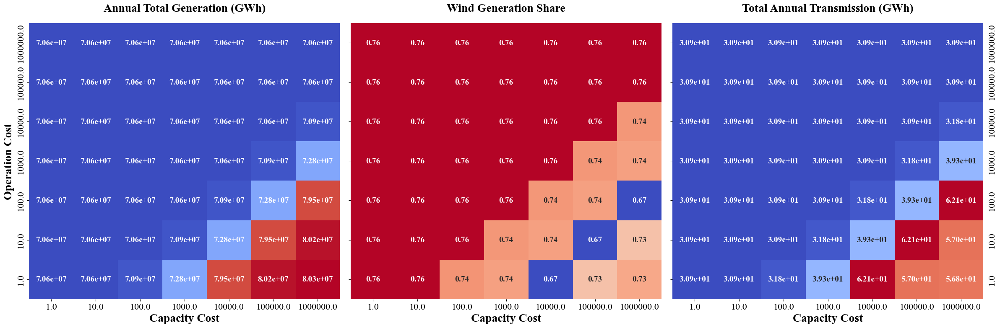

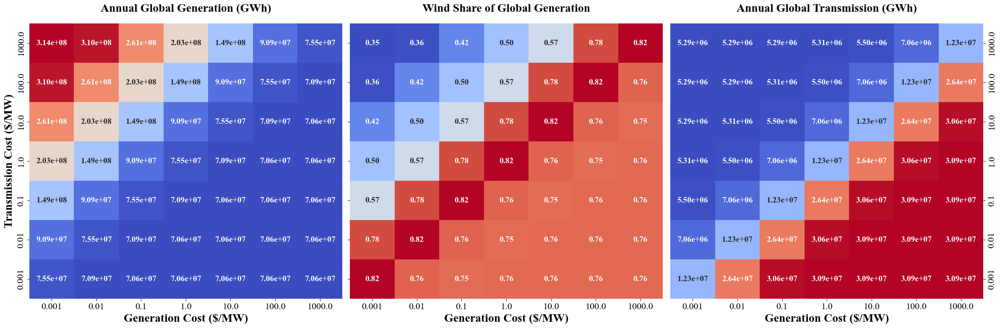

\begin{table}[ht]
\centering
\caption{Annual Total Generation (GWh)}
\begin{tabular}{r|ccccccc}
\toprule
\textbf{OpEx} $\backslash$ \textbf{CapEx} & 1 & 10 & 100 & 1,000 & 10,000 & 100,000 & 1,000,000 \\
\midrule
1.0 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 \\
10.0 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 \\
100.0 & 70874590.6 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 \\
1000.0 & 72773313.1 & 70869990.0 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 \\
10000.0 & 79474689.7 & 72773313.1 & 70869990.0 & 70646410.8 & 70646410.8 & 70646410.8 & 70646410.8 \\
100000.0 & 80206264.8 & 79474689.7 & 72773313.1 & 70869990.0 & 70646410.8 & 70646410.8 & 70646410.8 \\
1000000.0 & 80324039.8 & 80206264.8 & 79474689.7 & 72773313.1 & 70869990.0 & 70646410.8 & 70646410.8 \\
\bottomrule
\end{tabular}
\label{tab:annual_gen}
\end{table}

\begin{table}[ht]


In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define costs
costs = np.logspace(0, 6, 7)

# Initialize dictionaries to store heatmap data
annual_gen_data = np.zeros((len(costs), len(costs)))
wind_pv_share_data = np.zeros((len(costs), len(costs)))
total_trans_data = np.zeros((len(costs), len(costs)))

# Populate the matrices
for i, cap_cost in enumerate(costs):
    for j, op_cost in enumerate(costs):
        comb_key = f'cap_{cap_cost}_op_{op_cost}'
        if comb_key in sensitivity_cap_op_cost:
            annual_gen_data[i, j] = sensitivity_cap_op_cost[comb_key]['annual_gen']
            wind_pv_share_data[i, j] = sensitivity_cap_op_cost[comb_key]['wind_pv_share'][0]  # Summing wind and pv share
            total_trans_data[i, j] = sensitivity_cap_op_cost[comb_key]['total_trans'] * 1e-6

# Convert matrices to DataFrames for better labeling in the heatmap
annual_gen_df = pd.DataFrame(annual_gen_data, index=costs, columns=costs).T
wind_pv_share_df = pd.DataFrame(wind_pv_share_data, index=costs, columns=costs).T
total_trans_df = pd.DataFrame(total_trans_data, index=costs, columns=costs).T
annot_kws = {"size": 14, "weight": "bold"}
# Format numbers in scientific notation
def scientific_format(x, pos):
    return f'{x:.1e}'

# Plot heatmaps
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Annual Generation Heatmap
sns.heatmap(annual_gen_df, ax=axs[0], cmap='coolwarm', annot=True, cbar=False, fmt=".2e", annot_kws=annot_kws)
axs[0].set_title('Annual Total Generation (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[0].set_ylabel('Operation Cost', fontsize=20, fontweight='bold')
axs[0].set_xlabel('Capacity Cost', fontsize=20, fontweight='bold')
axs[0].invert_yaxis()
axs[0].tick_params(axis='x', which='major', labelsize=16)
axs[0].tick_params(axis='y', which='major', labelsize=16)

# Wind and PV Share Heatmap
sns.heatmap(wind_pv_share_df, ax=axs[1], cmap='coolwarm', annot=True, cbar=False, fmt=".2f", annot_kws=annot_kws)
axs[1].set_title('Wind Generation Share', fontsize=20, fontweight='bold', pad=20)
axs[1].set_xlabel('Capacity Cost', fontsize=20, fontweight='bold')
axs[1].invert_yaxis()
axs[1].tick_params(axis='x', which='major', labelsize=16)
axs[1].set_yticklabels([])

# Total Transmission Heatmap
sns.heatmap(total_trans_df, ax=axs[2], cmap='coolwarm', annot=True, cbar=False, fmt=".2e", annot_kws=annot_kws)
axs[2].set_title('Total Annual Transmission (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[2].set_xlabel('Capacity Cost', fontsize=20, fontweight='bold')
axs[2].invert_yaxis()
axs[2].tick_params(axis='x', which='major', labelsize=16)
axs[2].tick_params(axis='y', which='both', labelsize=16, labelright=True, labelleft=False)
axs[2].set_yticklabels(axs[2].get_yticklabels(), va='center')

plt.tight_layout()
plt.show()

# Update costs for the next heatmap
costs = np.logspace(0, 6, 7) / 1000

# Initialize dictionaries to store heatmap data for sensitivity_cost_trans
annual_gen_data_trans = np.zeros((len(costs), len(costs)))
wind_pv_share_data_trans = np.zeros((len(costs), len(costs)))
total_trans_data_trans = np.zeros((len(costs), len(costs)))

# Populate the matrices for sensitivity_cost_trans
for i, gen_cost in enumerate(costs):
    for j, trans_cost in enumerate(costs):
        comb_key = f'gen_{gen_cost}_trans_{trans_cost}'
        if comb_key in sensitivity_cost_trans:
            annual_gen_data_trans[i, j] = sensitivity_cost_trans[comb_key]['annual_gen']
            wind_pv_share_data_trans[i, j] = sensitivity_cost_trans[comb_key]['wind_pv_share'][0]  # Summing wind and pv share
            total_trans_data_trans[i, j] = sensitivity_cost_trans[comb_key]['total_trans']

# Convert matrices to DataFrames for better labeling in the heatmap for sensitivity_cost_trans
annual_gen_df_trans = pd.DataFrame(annual_gen_data_trans, index=costs, columns=costs).T
wind_pv_share_df_trans = pd.DataFrame(wind_pv_share_data_trans, index=costs, columns=costs).T
total_trans_df_trans = pd.DataFrame(total_trans_data_trans, index=costs, columns=costs).T

annot_kws = {"size": 14, "weight": "bold"}
# Plot heatmaps for sensitivity_cost_trans
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Annual Generation Heatmap for sensitivity_cost_trans
sns.heatmap(annual_gen_df_trans, ax=axs[0], cmap='coolwarm', annot=True, cbar=False, fmt=".2e", annot_kws=annot_kws)
axs[0].set_title('Annual Global Generation (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[0].set_ylabel('Transmission Cost ($/MW)', fontsize=20, fontweight='bold')
axs[0].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[0].invert_yaxis()
axs[0].tick_params(axis='x', which='major', labelsize=16)
axs[0].tick_params(axis='y', which='major', labelsize=16)

# Wind and PV Share Heatmap for sensitivity_cost_trans
sns.heatmap(wind_pv_share_df_trans, ax=axs[1], cmap='coolwarm', cbar=False, annot=True, fmt=".2f", annot_kws=annot_kws)
axs[1].set_title('Wind Share of Global Generation', fontsize=20, fontweight='bold', pad=20)
axs[1].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[1].invert_yaxis()
axs[1].tick_params(axis='x', which='major', labelsize=16)
axs[1].set_yticklabels([])

# Total Transmission Heatmap for sensitivity_cost_trans
sns.heatmap(total_trans_df_trans, ax=axs[2], cmap='coolwarm', annot=True, cbar=False, fmt=".2e", annot_kws=annot_kws)
axs[2].set_title('Annual Global Transmission (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[2].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[2].invert_yaxis()
axs[2].yaxis.tick_right()
axs[2].yaxis.set_label_position('right')
axs[2].tick_params(axis='x', which='major', labelsize=16)
axs[2].tick_params(axis='y', which='both', labelsize=16, labelright=True, labelleft=False)
axs[2].set_yticklabels(axs[2].get_yticklabels(), va='center')

plt.tight_layout()
plt.show()

# Function to convert a matrix to a LaTeX table
def matrix_to_latex(matrix, x_labels, y_labels, title, label):
    latex_str = f"\\begin{{table}}[ht]\n\\centering\n\\caption{{{title}}}\n"
    latex_str += "\\begin{tabular}{r|" + "c" * len(x_labels) + "}\n"
    latex_str += "\\toprule\n"
    latex_str += "\\textbf{OpEx} $\\backslash$ \\textbf{CapEx} & " + " & ".join([f"{int(c):,}" for c in x_labels]) + " \\\\\n\\midrule\n"
    
    for i, y in enumerate(y_labels):
        row = [f"{y:.1f}"] + [f"{matrix[i, j]:.1f}" for j in range(len(x_labels))]
        latex_str += " & ".join(row) + " \\\\\n"
    
    latex_str += "\\bottomrule\n\\end{tabular}\n"
    latex_str += f"\\label{{{label}}}\n\\end{{table}}\n"
    
    return latex_str

# Define costs
costs = np.logspace(0, 6, 7)
# Convert matrices to LaTeX
annual_gen_latex = matrix_to_latex(annual_gen_data, costs, costs, "Annual Total Generation (GWh)", "tab:annual_gen")
wind_pv_share_latex = matrix_to_latex(wind_pv_share_data, costs, costs, "Wind Generation Share", "tab:wind_gen_share")
total_trans_latex = matrix_to_latex(total_trans_data_trans, costs, costs, "Total Transmission (GWh)", "tab:total_trans")

# Print LaTeX tables
print(annual_gen_latex)
print(wind_pv_share_latex)
print(total_trans_latex)


green box showing acceptable ranges 
other colour showing base case (eg white background) 
also check one speciifc connection

## Wind vs Solar

[1.e+00 1.e+01 1.e+02 1.e+03 1.e+04 1.e+05 1.e+06]


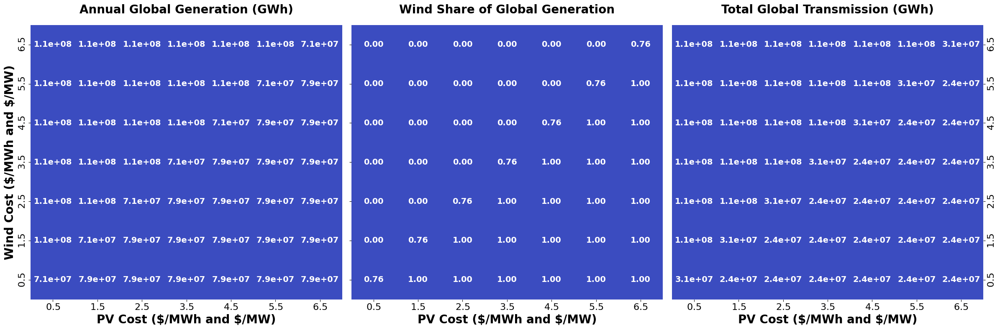

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import ScalarFormatter

# Define costs
with open('sensitivity_cost_wind_pv.pkl', 'rb') as pickle_file:
    sensitivity_cost_wind_pv = pickle.load(pickle_file)
costs = np.logspace(0, 6, 7)
print(costs)
annual_gen_data = np.zeros((len(costs), len(costs)))
wind_pv_share_data = np.zeros((len(costs), len(costs)))
total_trans_data = np.zeros((len(costs), len(costs)))

# Populate the matrices
for i, wind_cost in enumerate(costs):
    for j, pv_cost in enumerate(costs):
        comb_key = f'wind_{wind_cost}_pv_{pv_cost}'
        if comb_key in sensitivity_cost_wind_pv:
            annual_gen_data[i, j] = sensitivity_cost_wind_pv[comb_key]['annual_gen']
            wind_pv_share_data[i, j] = sensitivity_cost_wind_pv[comb_key]['wind_pv_share'][0]  # Summing wind and pv share
            total_trans_data[i, j] = sensitivity_cost_wind_pv[comb_key]['total_trans']

# Convert matrices to DataFrames for better labeling in the heatmap
annual_gen_df = pd.DataFrame(annual_gen_data, index=costs, columns=costs)
wind_pv_share_df = pd.DataFrame(wind_pv_share_data, index=costs, columns=costs)
total_trans_df = pd.DataFrame(total_trans_data, index=costs, columns=costs)
annot_kws = {"size": 14, "weight": "bold"}
vmin_annual_gen, vmax_annual_gen = annual_gen_df.min().min(), annual_gen_df.max().max()
vmin_wind_pv_share, vmax_wind_pv_share = wind_pv_share_df.min().min(), wind_pv_share_df.max().max()
vmin_total_trans, vmax_total_trans = total_trans_df.min().min(), total_trans_df.max().max()
def scientific_format(x, pos):
    return f'{x:.1e}'
# Configure scientific notation for tick labels
formatter = ScalarFormatter(useMathText=True)
formatter.set_scientific(False)
formatter.set_powerlimits((-4,7))

# Plot heatmaps
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Annual Generation Heatmap
sns.heatmap(annual_gen_df, ax=axs[0], cmap='coolwarm', annot=True, cbar=False, fmt=".1e", annot_kws=annot_kws, vmin=1e9, vmax=1e11)
axs[0].set_title('Annual Global Generation (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[0].set_xlabel(r'PV Cost (\$/MWh and \$/MW)', fontsize=20, fontweight='bold')
axs[0].set_ylabel(r'Wind Cost (\$/MWh and \$/MW)', fontsize=20, fontweight='bold')
axs[0].invert_yaxis()
axs[0].tick_params(axis='x', which='major', labelsize=16)
axs[0].tick_params(axis='y', which='major', labelsize=16)
axs[0].xaxis.set_major_formatter(FuncFormatter(scientific_format))
axs[0].yaxis.set_major_formatter(FuncFormatter(scientific_format))
axs[0].xaxis.set_major_formatter(formatter)
axs[0].yaxis.set_major_formatter(formatter)


# Wind and PV Share Heatmap
sns.heatmap(wind_pv_share_df, ax=axs[1], cmap='coolwarm', annot=True, cbar=False, fmt=".2f", annot_kws=annot_kws, vmin=1e9, vmax=1e11)
axs[1].set_title('Wind Share of Global Generation', fontsize=20, fontweight='bold', pad=20)
axs[1].set_xlabel(r'PV Cost (\$/MWh and \$/MW)', fontsize=20, fontweight='bold')
axs[1].invert_yaxis()
axs[1].tick_params(axis='x', which='major', labelsize=16)
axs[1].set_yticklabels([])
axs[1].xaxis.set_major_formatter(formatter)


# Total Transmission Heatmap
sns.heatmap(total_trans_df, ax=axs[2], cmap='coolwarm', annot=True, cbar=False, fmt=".1e", annot_kws=annot_kws, vmin=1e9, vmax=1e11)
axs[2].set_title('Total Global Transmission (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[2].set_xlabel(r'PV Cost (\$/MWh and \$/MW)', fontsize=20, fontweight='bold')
axs[2].invert_yaxis()

# Move y-axis labels to the right side and ensure proper alignment only for the third axis
axs[2].yaxis.tick_right()
axs[2].yaxis.set_label_position('right')
axs[2].tick_params(axis='x', which='major', labelsize=16)
axs[2].tick_params(axis='y', which='both', labelsize=16, labelright=True, labelleft=False)
axs[2].set_yticklabels(axs[2].get_yticklabels(), va='center')
axs[2].xaxis.set_major_formatter(formatter)
axs[2].yaxis.set_major_formatter(formatter)


plt.tight_layout()
plt.show()


## Generation vs Transmission

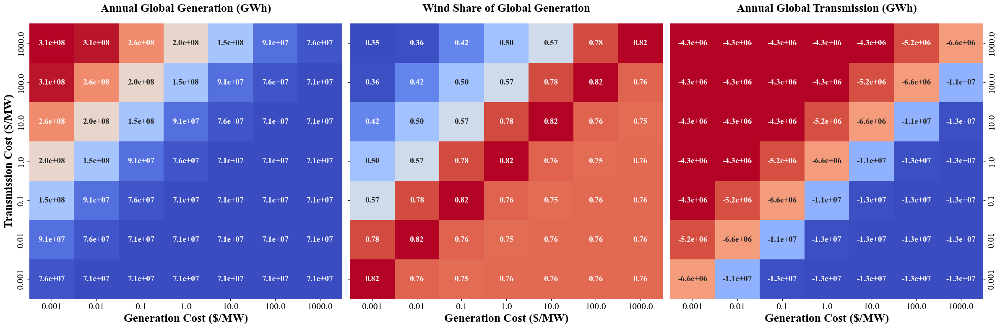

In [18]:
costs = np.logspace(0, 6, 7) /1000
with open('sensitivity_cost_trans.pkl', 'rb') as pickle_file:
    sensitivity_cost_trans = pickle.load(pickle_file)
# Initialize dictionaries to store heatmap data for sensitivity_cost_trans
annual_gen_data_trans = np.zeros((len(costs), len(costs)))
wind_pv_share_data_trans = np.zeros((len(costs), len(costs)))
total_trans_data_trans = np.zeros((len(costs), len(costs)))

# Populate the matrices for sensitivity_cost_trans
for i, gen_cost in enumerate(costs):
    for j, trans_cost in enumerate(costs):
        comb_key = f'gen_{gen_cost}_trans_{trans_cost}'
        if comb_key in sensitivity_cost_trans:
            annual_gen_data_trans[i, j] = sensitivity_cost_trans[comb_key]['annual_gen']
            wind_pv_share_data_trans[i, j] = sensitivity_cost_trans[comb_key]['wind_pv_share'][0]  # Summing wind and pv share
            total_trans_data_trans[i, j] = sensitivity_cost_trans[comb_key]['netflow_north_asia']

# Convert matrices to DataFrames for better labeling in the heatmap for sensitivity_cost_trans
annual_gen_df_trans = pd.DataFrame(annual_gen_data_trans, index=costs, columns=costs).T
wind_pv_share_df_trans = pd.DataFrame(wind_pv_share_data_trans, index=costs, columns=costs).T
total_trans_df_trans = pd.DataFrame(total_trans_data_trans, index=costs, columns=costs).T

annot_kws = {"size": 14, "weight": "bold"}
# Plot heatmaps for sensitivity_cost_trans
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Annual Generation Heatmap for sensitivity_cost_trans
sns.heatmap(annual_gen_df_trans, ax=axs[0], cmap='coolwarm', annot=True,cbar=False, fmt=".1e", annot_kws=annot_kws)
axs[0].set_title('Annual Global Generation (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[0].set_ylabel('Transmission Cost ($/MW)',  fontsize=20, fontweight='bold')
axs[0].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[0].invert_yaxis()
axs[0].tick_params(axis='x', which='major', labelsize=16)
axs[0].tick_params(axis='y', which='major', labelsize=16)

# Wind and PV Share Heatmap for sensitivity_cost_trans
sns.heatmap(wind_pv_share_df_trans, ax=axs[1], cmap='coolwarm', cbar=False,  annot=True, fmt=".2f", annot_kws=annot_kws)
axs[1].set_title('Wind Share of Global Generation', fontsize=20, fontweight='bold', pad=20)
axs[1].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[1].invert_yaxis()
axs[1].tick_params(axis='x', which='major', labelsize=16)
axs[1].set_yticklabels([])

# Total Transmission Heatmap for sensitivity_cost_trans
sns.heatmap(total_trans_df_trans, ax=axs[2], cmap='coolwarm', annot=True, cbar=False, fmt=".1e", annot_kws=annot_kws)
axs[2].set_title('Annual Global Transmission (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[2].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[2].invert_yaxis()

# Move y-axis labels to the right side and ensure proper alignment only for the third axis
axs[2].yaxis.tick_right()
axs[2].yaxis.set_label_position('right')
axs[2].tick_params(axis='x', which='major', labelsize=16)
axs[2].tick_params(axis='y', which='both', labelsize=16, labelright=True, labelleft=False)
axs[2].set_yticklabels(axs[2].get_yticklabels(), va='center')



plt.tight_layout()
plt.show()

In [3]:
import pickle

In [5]:
land_use_availabilities = np.linspace(1, 20, 10) / 100
with open('sensitivity_land_use.pkl', 'rb') as pickle_file:
    sensitivity_land_use = pickle.load(pickle_file)
costs = np.logspace(0, 6, 7)
# Initialize dictionaries to store heatmap data for sensitivity_cost_trans
annual_gen_data_trans = np.zeros((len(costs), len(costs)))
wind_pv_share_data_trans = np.zeros((len(costs), len(costs)))
total_trans_data_trans = np.zeros((len(costs), len(costs)))

# Populate the matrices for sensitivity_cost_trans
for i, gen_cost in enumerate(costs):
    for j, trans_cost in enumerate(costs):
        comb_key = f'gen_{gen_cost}_trans_{trans_cost}'
        if comb_key in sensitivity_cost_trans:
            annual_gen_data_trans[i, j] = sensitivity_land_use[comb_key]['annual_gen']
            wind_pv_share_data_trans[i, j] = sensitivity_land_use[comb_key]['wind_pv_share'][0]  # Summing wind and pv share
            total_trans_data_trans[i, j] = sensitivity_land_use[comb_key]['total_trans']

# Convert matrices to DataFrames for better labeling in the heatmap for sensitivity_cost_trans
annual_gen_df_trans = pd.DataFrame(annual_gen_data_trans, index=costs, columns=costs).T
wind_pv_share_df_trans = pd.DataFrame(wind_pv_share_data_trans, index=costs, columns=costs).T
total_trans_df_trans = pd.DataFrame(total_trans_data_trans, index=costs, columns=costs).T

annot_kws = {"size": 14, "weight": "bold"}
# Plot heatmaps for sensitivity_cost_trans
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Annual Generation Heatmap for sensitivity_cost_trans
sns.heatmap(annual_gen_df_trans, ax=axs[0], cmap='coolwarm', annot=True,cbar=False, fmt=".1e", annot_kws=annot_kws)
axs[0].set_title('Annual Global Generation (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[0].set_ylabel('Transmission Cost ($/MW)',  fontsize=20, fontweight='bold')
axs[0].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[0].invert_yaxis()
axs[0].tick_params(axis='x', which='major', labelsize=16)
axs[0].tick_params(axis='y', which='major', labelsize=16)

# Wind and PV Share Heatmap for sensitivity_cost_trans
sns.heatmap(wind_pv_share_df_trans, ax=axs[1], cmap='coolwarm', cbar=False,  annot=True, fmt=".2f", annot_kws=annot_kws)
axs[1].set_title('Wind Share of Global Generation', fontsize=20, fontweight='bold', pad=20)
axs[1].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[1].invert_yaxis()
axs[1].tick_params(axis='x', which='major', labelsize=16)
axs[1].set_yticklabels([])

# Total Transmission Heatmap for sensitivity_cost_trans
sns.heatmap(total_trans_df_trans, ax=axs[2], cmap='coolwarm', annot=True, cbar=False, fmt=".1e", annot_kws=annot_kws)
axs[2].set_title('Annual Global Transmission (GWh)', fontsize=20, fontweight='bold', pad=20)
axs[2].set_xlabel('Generation Cost ($/MW)', fontsize=20, fontweight='bold')
axs[2].invert_yaxis()

# Move y-axis labels to the right side and ensure proper alignment only for the third axis
axs[2].yaxis.tick_right()
axs[2].yaxis.set_label_position('right')
axs[2].tick_params(axis='x', which='major', labelsize=16)
axs[2].tick_params(axis='y', which='both', labelsize=16, labelright=True, labelleft=False)
axs[2].set_yticklabels(axs[2].get_yticklabels(), va='center')
#


plt.tight_layout()
plt.show()

NameError: name 'sensitivity_cost_trans' is not defined